<a href="https://colab.research.google.com/github/Kh0uloud/Modeling-Mental-Health-Trends-Using-Social-Media-Data/blob/main/MDDL_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install hashformers

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 38.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 26.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 25.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil
import json
from glob import glob
import os
from tqdm import tqdm
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
import re
from pathlib import Path
from dateutil import parser
import ast

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import scipy.stats as stats
import math

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.model_selection import train_test_split
import shap

from statsmodels.api import OLS

# Unzipping Data

In [ ]:
!apt-get install p7zip-full -y  # Install 7-Zip (only needed once)
!7z x "/content/drive/MyDrive/MentalHealthProject/Dataset_MDDL.zip" -o"/content/data" -y

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 21 not upgraded.

7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/MentalHealthProject/                                                     1 file, 8393734330 bytes (8005 MiB)

Extracting archive: /content/drive/MyDrive/MentalHealthProject/Dataset_MDDL.zip
  2% 4096 Open               17% 32768 Open                27% 53248 Open                40% 77824 Open               

In [ ]:
shutil.move("/content/data/Dataset/labeled/positive", "/content/drive/MyDrive/MentalHealthProject/LabeledPos")

'/content/drive/MyDrive/MentalHealthProject/LabeledPos'

In [ ]:
print(len(glob(os.path.join("/content/data/Dataset/labeled/positive/data/timeline", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledPos/data/timeline", "*"))))

print(len(glob(os.path.join("/content/data/Dataset/labeled/positive/data/tweet", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledPos/data/tweet", "*"))))

print(len(glob(os.path.join("/content/data/Dataset/labeled/positive/data/users", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledPos/data/users", "*"))))

0 2626
0 6493
0 5899


In [ ]:
shutil.move("/content/data/Dataset/labeled/negative", "/content/drive/MyDrive/MentalHealthProject/LabeledNeg")

Error: [('/content/data/Dataset/labeled/negative/data/timeline/rwby_rose_created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rwby_rose_created_at-54194057.json', '[Errno 28] No space left on device'), ('/content/data/Dataset/labeled/negative/data/timeline/_Emily_Baumann_created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Emily_Baumann_created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Emily_Baumann_created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Emily_Baumann_created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vibrantghostscreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vibrantghostscreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vibrantghostscreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vibrantghostscreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PinkFusions_created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PinkFusions_created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PinkFusions_created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PinkFusions_created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nabilahabby_created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nabilahabby_created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nabilahabby_created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nabilahabby_created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DTmoney517created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DTmoney517created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DTmoney517created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DTmoney517created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CS_Bernardcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CS_Bernardcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CS_Bernardcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CS_Bernardcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iamactiveukcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamactiveukcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iamactiveukcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamactiveukcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OVOrganiccreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OVOrganiccreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OVOrganiccreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OVOrganiccreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ItsNewBeginningcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsNewBeginningcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ItsNewBeginningcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsNewBeginningcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lewispledgercreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lewispledgercreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lewispledgercreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lewispledgercreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/natashasamanicreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/natashasamanicreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/natashasamanicreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/natashasamanicreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tami2kindcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tami2kindcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tami2kindcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tami2kindcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JoeyJolleycreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JoeyJolleycreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JoeyJolleycreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JoeyJolleycreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RaphaelSaraicreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RaphaelSaraicreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RaphaelSaraicreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RaphaelSaraicreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/k_gill2created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_gill2created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/k_gill2created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_gill2created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TeamChoppa01created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TeamChoppa01created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TeamChoppa01created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TeamChoppa01created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__HighandMightycreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__HighandMightycreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__HighandMightycreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__HighandMightycreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sonu_juyalcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sonu_juyalcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sonu_juyalcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sonu_juyalcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LulZiggycreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LulZiggycreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LulZiggycreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LulZiggycreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ripe_avocadocreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ripe_avocadocreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ripe_avocadocreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ripe_avocadocreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rotten_Velvetcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rotten_Velvetcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rotten_Velvetcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rotten_Velvetcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/g_i_botcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/g_i_botcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/g_i_botcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/g_i_botcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/coppertopindycreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coppertopindycreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/coppertopindycreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coppertopindycreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_NicoleHClarkecreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_NicoleHClarkecreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_NicoleHClarkecreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_NicoleHClarkecreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IzyClovercreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IzyClovercreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IzyClovercreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IzyClovercreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VegasDavidsoncreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VegasDavidsoncreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VegasDavidsoncreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VegasDavidsoncreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AliciaMorfordcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AliciaMorfordcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AliciaMorfordcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AliciaMorfordcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kindoboycreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kindoboycreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kindoboycreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kindoboycreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Atsukomasamunecreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Atsukomasamunecreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Atsukomasamunecreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Atsukomasamunecreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ichigo_rnilkcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ichigo_rnilkcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ichigo_rnilkcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ichigo_rnilkcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OkatsoJacklinecreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OkatsoJacklinecreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OkatsoJacklinecreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OkatsoJacklinecreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sumsnicolecreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sumsnicolecreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sumsnicolecreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sumsnicolecreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EloquentMyDearcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EloquentMyDearcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EloquentMyDearcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EloquentMyDearcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/weirdinggreysoncreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/weirdinggreysoncreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/weirdinggreysoncreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/weirdinggreysoncreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IamDJSOSOcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IamDJSOSOcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IamDJSOSOcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IamDJSOSOcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Talesofpalefacecreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Talesofpalefacecreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Talesofpalefacecreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Talesofpalefacecreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Wojciehowiczcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Wojciehowiczcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Wojciehowiczcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Wojciehowiczcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/UpliftAffirmcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UpliftAffirmcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/UpliftAffirmcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UpliftAffirmcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_lexbeancreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_lexbeancreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_lexbeancreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_lexbeancreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ISeO_CHacreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ISeO_CHacreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ISeO_CHacreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ISeO_CHacreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JFrazierProcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JFrazierProcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JFrazierProcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JFrazierProcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jimcor4created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jimcor4created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jimcor4created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jimcor4created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/matthew_peirsoncreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/matthew_peirsoncreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/matthew_peirsoncreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/matthew_peirsoncreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ceceophiecreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ceceophiecreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ceceophiecreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ceceophiecreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xxkayyy_created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xxkayyy_created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xxkayyy_created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xxkayyy_created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/azusa__a527created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/azusa__a527created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/azusa__a527created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/azusa__a527created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/caseyypalmercreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/caseyypalmercreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/caseyypalmercreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/caseyypalmercreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EdgyIntellectcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EdgyIntellectcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EdgyIntellectcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EdgyIntellectcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iNH34qXnb2EgoeWcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNH34qXnb2EgoeWcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iNH34qXnb2EgoeWcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNH34qXnb2EgoeWcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AntoinetteSZcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AntoinetteSZcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AntoinetteSZcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AntoinetteSZcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OlgaVMackcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OlgaVMackcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OlgaVMackcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OlgaVMackcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jatoshcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jatoshcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jatoshcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jatoshcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DeeJayShinzicreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeeJayShinzicreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DeeJayShinzicreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeeJayShinzicreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jack_The_Snitchcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jack_The_Snitchcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jack_The_Snitchcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jack_The_Snitchcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Gwenimnidacreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gwenimnidacreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Gwenimnidacreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gwenimnidacreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EmmanVazzcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EmmanVazzcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EmmanVazzcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EmmanVazzcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VDLeskencreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VDLeskencreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VDLeskencreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VDLeskencreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jp_henson3created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jp_henson3created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jp_henson3created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jp_henson3created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tharja_ebookscreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tharja_ebookscreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tharja_ebookscreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tharja_ebookscreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sphorton_created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sphorton_created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sphorton_created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sphorton_created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DeadRingingcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeadRingingcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DeadRingingcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeadRingingcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iMicahTroncreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iMicahTroncreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iMicahTroncreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iMicahTroncreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YUNG_HABIBIcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YUNG_HABIBIcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YUNG_HABIBIcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YUNG_HABIBIcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/livelovelift_created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/livelovelift_created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/livelovelift_created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/livelovelift_created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/annnieemariecreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annnieemariecreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/annnieemariecreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annnieemariecreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/judgemtnastycreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/judgemtnastycreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/judgemtnastycreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/judgemtnastycreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nyatchiicreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nyatchiicreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nyatchiicreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nyatchiicreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hymanroth64created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hymanroth64created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hymanroth64created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hymanroth64created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FrancisDougla18created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FrancisDougla18created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FrancisDougla18created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FrancisDougla18created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PaintMeCrimsoncreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PaintMeCrimsoncreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PaintMeCrimsoncreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PaintMeCrimsoncreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/11thGhostcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/11thGhostcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/11thGhostcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/11thGhostcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChinaCristinecreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChinaCristinecreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChinaCristinecreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChinaCristinecreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jaeionah___created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jaeionah___created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jaeionah___created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jaeionah___created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shannsationalcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shannsationalcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shannsationalcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shannsationalcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yr_em_sycreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yr_em_sycreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yr_em_sycreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yr_em_sycreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JKT48Believecreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JKT48Believecreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JKT48Believecreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JKT48Believecreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jj_onlyformzcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jj_onlyformzcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jj_onlyformzcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jj_onlyformzcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jose_the_g_created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jose_the_g_created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jose_the_g_created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jose_the_g_created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lomas_anita1created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lomas_anita1created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lomas_anita1created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lomas_anita1created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/radio_stancreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/radio_stancreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/radio_stancreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/radio_stancreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/p1anetmattcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/p1anetmattcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/p1anetmattcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/p1anetmattcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/93maxMaxcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/93maxMaxcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/93maxMaxcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/93maxMaxcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bara1996Matsucreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bara1996Matsucreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bara1996Matsucreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bara1996Matsucreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/25Rachitcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/25Rachitcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/25Rachitcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/25Rachitcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/disney_loverycreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/disney_loverycreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/disney_loverycreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/disney_loverycreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/A4PMinixOnecreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/A4PMinixOnecreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/A4PMinixOnecreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/A4PMinixOnecreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CCrockss12created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CCrockss12created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CCrockss12created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CCrockss12created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HunterSkipworthcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HunterSkipworthcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HunterSkipworthcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HunterSkipworthcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Jaehyohyocreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Jaehyohyocreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Jaehyohyocreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Jaehyohyocreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aqramaqilcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aqramaqilcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aqramaqilcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aqramaqilcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChaseRidescreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChaseRidescreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChaseRidescreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChaseRidescreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/junkyxlungscreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/junkyxlungscreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/junkyxlungscreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/junkyxlungscreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Explicit_Cloutcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Explicit_Cloutcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Explicit_Cloutcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Explicit_Cloutcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/panchitopappicreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/panchitopappicreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/panchitopappicreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/panchitopappicreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/babygrimezcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/babygrimezcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/babygrimezcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/babygrimezcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/justinscIassiccreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justinscIassiccreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/justinscIassiccreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justinscIassiccreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bricklessscreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bricklessscreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bricklessscreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bricklessscreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nozomi46600248created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nozomi46600248created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nozomi46600248created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nozomi46600248created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/crew_cscreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/crew_cscreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/crew_cscreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/crew_cscreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I2Guitarcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I2Guitarcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I2Guitarcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I2Guitarcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/supermanDc94created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/supermanDc94created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/supermanDc94created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/supermanDc94created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheVoiceWLOMcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheVoiceWLOMcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheVoiceWLOMcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheVoiceWLOMcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sarcastipegcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sarcastipegcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sarcastipegcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sarcastipegcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BHTruthcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BHTruthcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BHTruthcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BHTruthcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wtfgyaongcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wtfgyaongcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wtfgyaongcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wtfgyaongcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iSangawecreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iSangawecreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iSangawecreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iSangawecreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Morganne_dclxvicreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Morganne_dclxvicreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Morganne_dclxvicreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Morganne_dclxvicreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAdoreCelesteecreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAdoreCelesteecreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAdoreCelesteecreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAdoreCelesteecreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sammythegoose1created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sammythegoose1created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sammythegoose1created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sammythegoose1created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AminIsmail16created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AminIsmail16created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AminIsmail16created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AminIsmail16created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ARMANINATION_created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ARMANINATION_created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ARMANINATION_created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ARMANINATION_created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Choco_Fantasiescreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Choco_Fantasiescreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Choco_Fantasiescreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Choco_Fantasiescreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bbynatecreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbynatecreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bbynatecreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbynatecreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/comixedcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/comixedcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/comixedcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/comixedcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_extragramsamcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_extragramsamcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_extragramsamcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_extragramsamcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BlossomPPG45created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BlossomPPG45created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BlossomPPG45created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BlossomPPG45created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_TewI_created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_TewI_created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_TewI_created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_TewI_created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1YUNGLALcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1YUNGLALcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1YUNGLALcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1YUNGLALcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i6llilcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i6llilcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i6llilcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i6llilcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dauntlessTRSHcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dauntlessTRSHcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dauntlessTRSHcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dauntlessTRSHcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_astoldbytimiyacreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_astoldbytimiyacreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_astoldbytimiyacreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_astoldbytimiyacreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KonohaYueNcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KonohaYueNcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KonohaYueNcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KonohaYueNcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jenm23_created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jenm23_created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jenm23_created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jenm23_created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Arynnikki17created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Arynnikki17created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Arynnikki17created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Arynnikki17created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ElleChorongAPcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ElleChorongAPcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ElleChorongAPcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ElleChorongAPcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Champ_Yveecreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Champ_Yveecreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Champ_Yveecreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Champ_Yveecreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gloria_agumcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gloria_agumcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gloria_agumcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gloria_agumcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brizeidaturtlescreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brizeidaturtlescreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brizeidaturtlescreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brizeidaturtlescreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PorsGrenlandcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PorsGrenlandcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PorsGrenlandcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PorsGrenlandcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/modestrowlandcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/modestrowlandcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/modestrowlandcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/modestrowlandcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/re_velrycreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/re_velrycreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/re_velrycreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/re_velrycreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/itskaitlynnnnn_created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itskaitlynnnnn_created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/itskaitlynnnnn_created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itskaitlynnnnn_created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iori34i7created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iori34i7created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iori34i7created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iori34i7created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kayliesorensencreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kayliesorensencreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kayliesorensencreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kayliesorensencreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DangerouslyCalmcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DangerouslyCalmcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DangerouslyCalmcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DangerouslyCalmcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ratufebricreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ratufebricreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ratufebricreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ratufebricreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BritneyBitchLuvcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BritneyBitchLuvcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BritneyBitchLuvcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BritneyBitchLuvcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dimejimarshallcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dimejimarshallcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dimejimarshallcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dimejimarshallcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Honey_IO2Icreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Honey_IO2Icreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Honey_IO2Icreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Honey_IO2Icreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RomanticOptimiscreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RomanticOptimiscreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RomanticOptimiscreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RomanticOptimiscreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AposentoAlto_created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AposentoAlto_created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AposentoAlto_created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AposentoAlto_created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kei_Amakura97created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kei_Amakura97created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kei_Amakura97created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kei_Amakura97created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/uair8created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/uair8created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/uair8created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/uair8created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/esmaay_created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/esmaay_created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/esmaay_created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/esmaay_created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/5_i7fakecreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/5_i7fakecreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/5_i7fakecreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/5_i7fakecreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Maya_Aodhancreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Maya_Aodhancreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Maya_Aodhancreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Maya_Aodhancreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MetalShadowXcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MetalShadowXcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MetalShadowXcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MetalShadowXcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mingyudevoteecreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mingyudevoteecreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mingyudevoteecreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mingyudevoteecreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Versharkycreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Versharkycreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Versharkycreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Versharkycreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JadeFurutaYadecreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JadeFurutaYadecreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JadeFurutaYadecreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JadeFurutaYadecreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MotherFEHkercreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MotherFEHkercreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MotherFEHkercreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MotherFEHkercreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/behbehh_kaykscreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/behbehh_kaykscreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/behbehh_kaykscreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/behbehh_kaykscreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LetThemSing_created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LetThemSing_created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LetThemSing_created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LetThemSing_created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Inkredible_created_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Inkredible_created_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Inkredible_created_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Inkredible_created_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/queenieboothcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/queenieboothcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/queenieboothcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/queenieboothcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/heartpjmcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heartpjmcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/heartpjmcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heartpjmcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Azfarovskicreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Azfarovskicreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Azfarovskicreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Azfarovskicreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ginsengstr1pcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ginsengstr1pcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ginsengstr1pcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ginsengstr1pcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mongooskacreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mongooskacreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mongooskacreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mongooskacreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BennettClaycreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BennettClaycreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BennettClaycreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BennettClaycreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DalilaMora27created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DalilaMora27created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DalilaMora27created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DalilaMora27created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BarceI0naFCcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BarceI0naFCcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BarceI0naFCcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BarceI0naFCcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DeletedNamescreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeletedNamescreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DeletedNamescreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeletedNamescreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mrs_Etikacreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mrs_Etikacreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mrs_Etikacreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mrs_Etikacreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iamchriswickcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamchriswickcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iamchriswickcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamchriswickcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HotCommodityItucreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HotCommodityItucreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HotCommodityItucreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HotCommodityItucreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/faysinthebaycreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faysinthebaycreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/faysinthebaycreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faysinthebaycreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HennyVilllcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HennyVilllcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HennyVilllcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HennyVilllcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ComicalCutiecreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ComicalCutiecreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ComicalCutiecreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ComicalCutiecreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TessaLokacreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TessaLokacreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TessaLokacreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TessaLokacreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IKsanqzcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IKsanqzcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IKsanqzcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IKsanqzcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kylizzlefdezcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kylizzlefdezcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kylizzlefdezcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kylizzlefdezcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tRUBBLEkLOUDyAFcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tRUBBLEkLOUDyAFcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tRUBBLEkLOUDyAFcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tRUBBLEkLOUDyAFcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ntokozothungocreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ntokozothungocreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ntokozothungocreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ntokozothungocreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ristymkcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ristymkcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ristymkcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ristymkcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iPzRlEnSIGZObyTcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPzRlEnSIGZObyTcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iPzRlEnSIGZObyTcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPzRlEnSIGZObyTcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shayesayheycreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shayesayheycreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shayesayheycreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shayesayheycreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/opolensismancreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/opolensismancreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/opolensismancreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/opolensismancreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eli_visualscreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eli_visualscreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eli_visualscreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eli_visualscreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ATugsyertuntscreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ATugsyertuntscreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ATugsyertuntscreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ATugsyertuntscreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Skygear2017created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Skygear2017created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Skygear2017created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Skygear2017created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FurballMaknaecreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FurballMaknaecreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FurballMaknaecreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FurballMaknaecreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/smile67667160created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smile67667160created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/smile67667160created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smile67667160created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NelsonGashagazacreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NelsonGashagazacreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NelsonGashagazacreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NelsonGashagazacreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/andielxurencreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andielxurencreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/andielxurencreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andielxurencreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_ayeeeejayycreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ayeeeejayycreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_ayeeeejayycreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ayeeeejayycreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CharmaineNeshacreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CharmaineNeshacreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CharmaineNeshacreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CharmaineNeshacreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vaans29created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vaans29created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vaans29created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vaans29created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BARBiEBODiEcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BARBiEBODiEcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BARBiEBODiEcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BARBiEBODiEcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iam_fuzzyghcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iam_fuzzyghcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iam_fuzzyghcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iam_fuzzyghcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/melanicioussscreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melanicioussscreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/melanicioussscreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melanicioussscreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SunOfNonecreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SunOfNonecreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SunOfNonecreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SunOfNonecreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/valeygohancreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/valeygohancreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/valeygohancreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/valeygohancreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kimmy_w5created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kimmy_w5created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kimmy_w5created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kimmy_w5created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RyanGennocreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RyanGennocreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RyanGennocreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RyanGennocreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NattashaOrrcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NattashaOrrcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NattashaOrrcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NattashaOrrcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emmbabyy92created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmbabyy92created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emmbabyy92created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmbabyy92created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IAmWillFerellcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAmWillFerellcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IAmWillFerellcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAmWillFerellcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CHILLmeister_created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CHILLmeister_created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CHILLmeister_created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CHILLmeister_created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GreenHairedBoicreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GreenHairedBoicreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GreenHairedBoicreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GreenHairedBoicreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YayaLoL__created_at-347597064.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YayaLoL__created_at-347597064.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YayaLoL__created_at-347597064.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YayaLoL__created_at-347597064.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iNewsTokyocreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNewsTokyocreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iNewsTokyocreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNewsTokyocreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xupalagambacreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xupalagambacreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xupalagambacreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xupalagambacreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheTinkster14created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheTinkster14created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheTinkster14created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheTinkster14created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tarheel_rncreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tarheel_rncreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tarheel_rncreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tarheel_rncreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tdjestatecreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tdjestatecreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tdjestatecreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tdjestatecreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nipun_12created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nipun_12created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nipun_12created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nipun_12created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VICKKERSCOTTcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VICKKERSCOTTcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VICKKERSCOTTcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VICKKERSCOTTcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rvmz11created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rvmz11created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rvmz11created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rvmz11created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Verethraynacreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Verethraynacreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Verethraynacreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Verethraynacreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/konohoeecreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/konohoeecreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/konohoeecreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/konohoeecreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MSaichecreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MSaichecreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MSaichecreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MSaichecreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DaddyBlackXXXcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DaddyBlackXXXcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DaddyBlackXXXcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DaddyBlackXXXcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/flowerryboycreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/flowerryboycreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/flowerryboycreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/flowerryboycreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imogeniccreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imogeniccreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imogeniccreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imogeniccreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PhaulaAbsincreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PhaulaAbsincreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PhaulaAbsincreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PhaulaAbsincreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lifeaskaitlyn_created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lifeaskaitlyn_created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lifeaskaitlyn_created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lifeaskaitlyn_created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PunterJDScreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PunterJDScreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PunterJDScreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PunterJDScreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i3ipppcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i3ipppcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i3ipppcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i3ipppcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/smars_39created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smars_39created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/smars_39created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smars_39created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ordinaryfanb0ycreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ordinaryfanb0ycreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ordinaryfanb0ycreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ordinaryfanb0ycreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emily_elgarcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emily_elgarcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emily_elgarcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emily_elgarcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MGiovanni_created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MGiovanni_created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MGiovanni_created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MGiovanni_created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OrangeAnoncreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OrangeAnoncreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OrangeAnoncreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OrangeAnoncreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/molinar_aaroncreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/molinar_aaroncreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/molinar_aaroncreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/molinar_aaroncreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pg2sfcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pg2sfcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pg2sfcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pg2sfcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShellyKennisto1created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShellyKennisto1created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShellyKennisto1created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShellyKennisto1created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/46enrique1created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/46enrique1created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/46enrique1created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/46enrique1created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CalebDroidcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CalebDroidcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CalebDroidcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CalebDroidcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cassidypaige___created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cassidypaige___created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cassidypaige___created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cassidypaige___created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/asljsdfk704thcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/asljsdfk704thcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/asljsdfk704thcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/asljsdfk704thcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hornyfucker31created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hornyfucker31created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hornyfucker31created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hornyfucker31created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/M0NATSU0KAcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/M0NATSU0KAcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/M0NATSU0KAcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/M0NATSU0KAcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/K_NotWhitecreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/K_NotWhitecreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/K_NotWhitecreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/K_NotWhitecreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dopeitsacecreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dopeitsacecreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dopeitsacecreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dopeitsacecreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/goldeneye_buffscreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/goldeneye_buffscreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/goldeneye_buffscreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/goldeneye_buffscreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChillsquadYTcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChillsquadYTcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChillsquadYTcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChillsquadYTcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mujonadericreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mujonadericreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mujonadericreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mujonadericreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Claud_Williamscreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Claud_Williamscreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Claud_Williamscreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Claud_Williamscreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/105824created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/105824created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/105824created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/105824created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SdZEz3YLW4iRDrMcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SdZEz3YLW4iRDrMcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SdZEz3YLW4iRDrMcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SdZEz3YLW4iRDrMcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/reiko_nakanishicreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reiko_nakanishicreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/reiko_nakanishicreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reiko_nakanishicreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i3ce3created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i3ce3created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i3ce3created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i3ce3created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/abbymontes35created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abbymontes35created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/abbymontes35created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abbymontes35created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_margaretmaria_created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_margaretmaria_created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_margaretmaria_created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_margaretmaria_created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kchsandoscreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kchsandoscreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kchsandoscreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kchsandoscreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RIDO75094574created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RIDO75094574created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RIDO75094574created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RIDO75094574created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ajmi6icreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ajmi6icreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ajmi6icreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ajmi6icreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Changeofname14created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Changeofname14created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Changeofname14created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Changeofname14created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/201DreamSlayingcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/201DreamSlayingcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/201DreamSlayingcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/201DreamSlayingcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rhymingbotcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rhymingbotcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rhymingbotcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rhymingbotcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/castacliffoxcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/castacliffoxcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/castacliffoxcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/castacliffoxcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ntu_XKcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ntu_XKcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ntu_XKcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ntu_XKcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JPizzleFIFAcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JPizzleFIFAcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JPizzleFIFAcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JPizzleFIFAcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PappoPalacecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PappoPalacecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PappoPalacecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PappoPalacecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maspqleicreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maspqleicreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maspqleicreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maspqleicreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_plantaincreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_plantaincreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_plantaincreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_plantaincreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAmDelteacreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAmDelteacreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAmDelteacreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAmDelteacreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/prismotroncreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/prismotroncreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/prismotroncreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/prismotroncreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mekakushixxxcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mekakushixxxcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mekakushixxxcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mekakushixxxcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WinterLachesiscreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WinterLachesiscreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WinterLachesiscreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WinterLachesiscreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Coco_Jonesscreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Coco_Jonesscreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Coco_Jonesscreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Coco_Jonesscreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/clarisse122603created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/clarisse122603created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/clarisse122603created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/clarisse122603created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/davidsonchimecreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/davidsonchimecreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/davidsonchimecreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/davidsonchimecreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/neko_4205created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/neko_4205created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/neko_4205created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/neko_4205created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PrestonRunscreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PrestonRunscreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PrestonRunscreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PrestonRunscreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/andrewareoffcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andrewareoffcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/andrewareoffcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andrewareoffcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IIbraheem314created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IIbraheem314created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IIbraheem314created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IIbraheem314created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Me_No_Careeeeeecreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Me_No_Careeeeeecreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Me_No_Careeeeeecreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Me_No_Careeeeeecreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Michaelcware4created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Michaelcware4created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Michaelcware4created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Michaelcware4created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sunquailscreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sunquailscreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sunquailscreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sunquailscreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lee_Wnhtrcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lee_Wnhtrcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lee_Wnhtrcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lee_Wnhtrcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WavyWill_15created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WavyWill_15created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WavyWill_15created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WavyWill_15created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dulcekendra1created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dulcekendra1created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dulcekendra1created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dulcekendra1created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/disneypuppiescreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/disneypuppiescreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/disneypuppiescreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/disneypuppiescreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Bazelacreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Bazelacreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Bazelacreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Bazelacreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kiarandtwdcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kiarandtwdcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kiarandtwdcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kiarandtwdcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BWoodsSimpleMancreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BWoodsSimpleMancreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BWoodsSimpleMancreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BWoodsSimpleMancreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OpKiIIingBaycreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OpKiIIingBaycreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OpKiIIingBaycreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OpKiIIingBaycreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Juniorkelley11created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Juniorkelley11created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Juniorkelley11created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Juniorkelley11created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CHWCDNcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CHWCDNcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CHWCDNcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CHWCDNcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MonaBaaaycreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MonaBaaaycreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MonaBaaaycreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MonaBaaaycreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i7_hana_0102created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i7_hana_0102created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i7_hana_0102created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i7_hana_0102created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Woman4Trumpcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Woman4Trumpcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Woman4Trumpcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Woman4Trumpcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/N_ALHOADcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/N_ALHOADcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/N_ALHOADcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/N_ALHOADcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/timberdonahue7created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/timberdonahue7created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/timberdonahue7created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/timberdonahue7created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HannahHixoncreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HannahHixoncreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HannahHixoncreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HannahHixoncreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/X3_dead_botcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/X3_dead_botcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/X3_dead_botcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/X3_dead_botcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DJZooWapcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DJZooWapcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DJZooWapcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DJZooWapcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RikaMatsu2created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RikaMatsu2created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RikaMatsu2created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RikaMatsu2created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/simenonacreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/simenonacreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/simenonacreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/simenonacreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IIMllIcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IIMllIcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IIMllIcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IIMllIcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jojo_jayncreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jojo_jayncreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jojo_jayncreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jojo_jayncreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CristianoIraldocreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CristianoIraldocreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CristianoIraldocreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CristianoIraldocreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JasminGayChatcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JasminGayChatcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JasminGayChatcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JasminGayChatcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RiZ0Hcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RiZ0Hcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RiZ0Hcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RiZ0Hcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChellyzBellycreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChellyzBellycreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChellyzBellycreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChellyzBellycreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/abitrichcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abitrichcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/abitrichcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abitrichcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i910208icreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i910208icreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i910208icreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i910208icreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fourrfortycreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fourrfortycreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fourrfortycreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fourrfortycreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iSaleh92created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iSaleh92created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iSaleh92created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iSaleh92created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CameronInJulycreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CameronInJulycreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CameronInJulycreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CameronInJulycreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/feelthedrawcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/feelthedrawcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/feelthedrawcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/feelthedrawcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_Feeucreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_Feeucreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_Feeucreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_Feeucreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_i3lawixcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_i3lawixcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_i3lawixcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_i3lawixcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/raepsodycreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/raepsodycreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/raepsodycreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/raepsodycreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maryamxmussacreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maryamxmussacreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maryamxmussacreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maryamxmussacreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zee_enbotcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zee_enbotcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zee_enbotcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zee_enbotcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ariamaiacreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ariamaiacreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ariamaiacreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ariamaiacreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vineet7891created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vineet7891created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vineet7891created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vineet7891created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/behzadradmancreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/behzadradmancreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/behzadradmancreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/behzadradmancreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HassMUFCcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HassMUFCcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HassMUFCcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HassMUFCcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vkimparejacreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vkimparejacreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vkimparejacreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vkimparejacreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alonso37created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alonso37created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alonso37created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alonso37created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jordan_vigilcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jordan_vigilcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jordan_vigilcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jordan_vigilcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/windypriskacreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/windypriskacreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/windypriskacreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/windypriskacreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bartel_adacreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bartel_adacreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bartel_adacreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bartel_adacreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hk9J9cl28vsr97icreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hk9J9cl28vsr97icreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hk9J9cl28vsr97icreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hk9J9cl28vsr97icreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NMNCSHcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NMNCSHcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NMNCSHcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NMNCSHcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/prawnbonjovicreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/prawnbonjovicreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/prawnbonjovicreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/prawnbonjovicreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TylerGioiellicreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TylerGioiellicreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TylerGioiellicreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TylerGioiellicreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MisfitLeBeaucreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MisfitLeBeaucreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MisfitLeBeaucreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MisfitLeBeaucreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YoChippycreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YoChippycreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YoChippycreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YoChippycreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I1MdGJ1WTzdB2Gucreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I1MdGJ1WTzdB2Gucreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I1MdGJ1WTzdB2Gucreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I1MdGJ1WTzdB2Gucreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fe_gaiuscreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fe_gaiuscreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fe_gaiuscreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fe_gaiuscreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_kinghaocreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_kinghaocreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_kinghaocreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_kinghaocreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/QUARANTXNEcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/QUARANTXNEcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/QUARANTXNEcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/QUARANTXNEcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RiosIndigocreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RiosIndigocreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RiosIndigocreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RiosIndigocreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Khorne554created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Khorne554created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Khorne554created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Khorne554created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChelseaFamiliacreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChelseaFamiliacreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChelseaFamiliacreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChelseaFamiliacreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AgusDelPincha7created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AgusDelPincha7created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AgusDelPincha7created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AgusDelPincha7created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dmalwarecreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dmalwarecreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dmalwarecreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dmalwarecreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/keenonstegmanncreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/keenonstegmanncreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/keenonstegmanncreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/keenonstegmanncreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Capt_Shivelycreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Capt_Shivelycreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Capt_Shivelycreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Capt_Shivelycreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BPInstinctzcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BPInstinctzcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BPInstinctzcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BPInstinctzcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ammoncruzcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ammoncruzcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ammoncruzcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ammoncruzcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/konya_sikici1icreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/konya_sikici1icreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/konya_sikici1icreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/konya_sikici1icreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xoxoevelynncreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xoxoevelynncreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xoxoevelynncreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xoxoevelynncreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MarkBut98470936created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MarkBut98470936created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MarkBut98470936created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MarkBut98470936created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nessarivers_created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nessarivers_created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nessarivers_created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nessarivers_created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/earthhnrcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/earthhnrcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/earthhnrcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/earthhnrcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/autocowreckscreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/autocowreckscreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/autocowreckscreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/autocowreckscreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jayla_marieeeecreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jayla_marieeeecreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jayla_marieeeecreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jayla_marieeeecreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pietrodigiulio1created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pietrodigiulio1created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pietrodigiulio1created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pietrodigiulio1created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/5_i7fakecreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/5_i7fakecreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/5_i7fakecreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/5_i7fakecreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kessleyanncreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kessleyanncreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kessleyanncreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kessleyanncreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZAYNDOSEcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZAYNDOSEcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZAYNDOSEcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZAYNDOSEcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i624shcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i624shcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i624shcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i624shcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_eyaadcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_eyaadcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_eyaadcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_eyaadcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fllwthedream_created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fllwthedream_created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fllwthedream_created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fllwthedream_created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imrobynwithaycreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imrobynwithaycreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imrobynwithaycreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imrobynwithaycreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jessetimetocookcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jessetimetocookcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jessetimetocookcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jessetimetocookcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AerohBoiicreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AerohBoiicreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AerohBoiicreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AerohBoiicreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MultifandomDivicreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MultifandomDivicreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MultifandomDivicreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MultifandomDivicreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/proudsIytherincreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/proudsIytherincreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/proudsIytherincreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/proudsIytherincreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CWSpearcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CWSpearcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CWSpearcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CWSpearcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mii___0401created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mii___0401created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mii___0401created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mii___0401created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MyronThiessencreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MyronThiessencreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MyronThiessencreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MyronThiessencreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nabhh2610created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nabhh2610created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nabhh2610created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nabhh2610created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/remozalsircreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/remozalsircreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/remozalsircreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/remozalsircreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WLK_eunji93created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WLK_eunji93created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WLK_eunji93created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WLK_eunji93created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/notjustaguilarcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/notjustaguilarcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/notjustaguilarcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/notjustaguilarcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nelphixcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nelphixcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nelphixcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nelphixcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dizzzyotakucreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dizzzyotakucreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dizzzyotakucreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dizzzyotakucreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iTzGy3AcS1WClRhcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTzGy3AcS1WClRhcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iTzGy3AcS1WClRhcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTzGy3AcS1WClRhcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Boonie_Loocreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Boonie_Loocreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Boonie_Loocreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Boonie_Loocreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JUiiCE_BOiicreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JUiiCE_BOiicreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JUiiCE_BOiicreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JUiiCE_BOiicreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AbelObesitycreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AbelObesitycreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AbelObesitycreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AbelObesitycreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/marsha9753created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marsha9753created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/marsha9753created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marsha9753created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/destroyer_i_egcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/destroyer_i_egcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/destroyer_i_egcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/destroyer_i_egcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/catchthesehannzcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catchthesehannzcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/catchthesehannzcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catchthesehannzcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shalhout_acreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shalhout_acreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shalhout_acreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shalhout_acreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MAESTROLUNGScreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MAESTROLUNGScreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MAESTROLUNGScreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MAESTROLUNGScreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chaybree21created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chaybree21created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chaybree21created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chaybree21created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/luvmymatty_created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/luvmymatty_created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/luvmymatty_created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/luvmymatty_created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TeeCeeEffcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TeeCeeEffcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TeeCeeEffcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TeeCeeEffcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xxginiwoofxxcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xxginiwoofxxcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xxginiwoofxxcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xxginiwoofxxcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iTeflonDon_created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTeflonDon_created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iTeflonDon_created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTeflonDon_created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SilveryFurycreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SilveryFurycreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SilveryFurycreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SilveryFurycreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SidizenKanecreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SidizenKanecreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SidizenKanecreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SidizenKanecreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CardozoJohnsoncreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CardozoJohnsoncreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CardozoJohnsoncreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CardozoJohnsoncreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/avonbizzlcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/avonbizzlcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/avonbizzlcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/avonbizzlcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jembiex3created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jembiex3created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jembiex3created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jembiex3created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jessicamsrocreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jessicamsrocreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jessicamsrocreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jessicamsrocreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/immaloserbabeecreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/immaloserbabeecreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/immaloserbabeecreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/immaloserbabeecreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/n0flexjeoncreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/n0flexjeoncreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/n0flexjeoncreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/n0flexjeoncreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NATNA__created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NATNA__created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NATNA__created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NATNA__created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blank_taetae94created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blank_taetae94created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blank_taetae94created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blank_taetae94created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LoveElnoracreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LoveElnoracreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LoveElnoracreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LoveElnoracreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mvungjongcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mvungjongcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mvungjongcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mvungjongcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CREEPERDUDE960created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CREEPERDUDE960created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CREEPERDUDE960created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CREEPERDUDE960created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SpottedTorquaycreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SpottedTorquaycreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SpottedTorquaycreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SpottedTorquaycreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iPhone5Apple1created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPhone5Apple1created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iPhone5Apple1created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPhone5Apple1created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheDrunkRidercreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheDrunkRidercreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheDrunkRidercreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheDrunkRidercreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YSBH_With_Joecreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YSBH_With_Joecreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YSBH_With_Joecreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YSBH_With_Joecreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bando818created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bando818created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bando818created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bando818created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PRETTY_PRiSSSYcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PRETTY_PRiSSSYcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PRETTY_PRiSSSYcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PRETTY_PRiSSSYcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/babyrantaroucreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/babyrantaroucreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/babyrantaroucreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/babyrantaroucreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sofiiiArredondocreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sofiiiArredondocreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sofiiiArredondocreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sofiiiArredondocreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DaliaAshraf29created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DaliaAshraf29created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DaliaAshraf29created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DaliaAshraf29created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ldins_created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ldins_created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ldins_created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ldins_created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sbahlerocksolidcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sbahlerocksolidcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sbahlerocksolidcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sbahlerocksolidcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MrYeahIKnowcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrYeahIKnowcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MrYeahIKnowcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrYeahIKnowcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I4MCH1created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I4MCH1created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I4MCH1created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I4MCH1created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/starlightdeancreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/starlightdeancreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/starlightdeancreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/starlightdeancreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sxdmooncreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sxdmooncreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sxdmooncreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sxdmooncreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Shirleymulletcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Shirleymulletcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Shirleymulletcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Shirleymulletcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/stacey_ward1990created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stacey_ward1990created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/stacey_ward1990created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stacey_ward1990created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/destroyfrogcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/destroyfrogcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/destroyfrogcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/destroyfrogcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/farhanahnaguibcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/farhanahnaguibcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/farhanahnaguibcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/farhanahnaguibcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/l0renagiselacreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/l0renagiselacreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/l0renagiselacreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/l0renagiselacreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Crimson_Embercreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Crimson_Embercreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Crimson_Embercreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Crimson_Embercreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fayettevampcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fayettevampcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fayettevampcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fayettevampcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Deekka1created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Deekka1created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Deekka1created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Deekka1created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShakedAmramcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShakedAmramcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShakedAmramcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShakedAmramcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/trzebnicacreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trzebnicacreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/trzebnicacreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trzebnicacreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FinickyArtscreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FinickyArtscreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FinickyArtscreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FinickyArtscreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/izumqshI381created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/izumqshI381created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/izumqshI381created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/izumqshI381created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fuckyeahtyrincreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fuckyeahtyrincreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fuckyeahtyrincreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fuckyeahtyrincreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cyyyyyddddd_created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cyyyyyddddd_created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cyyyyyddddd_created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cyyyyyddddd_created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dnzlgmrcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dnzlgmrcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dnzlgmrcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dnzlgmrcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Skaarj_Elitecreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Skaarj_Elitecreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Skaarj_Elitecreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Skaarj_Elitecreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/manal5icreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/manal5icreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/manal5icreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/manal5icreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/agiantrcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/agiantrcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/agiantrcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/agiantrcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FRESHYNo1created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FRESHYNo1created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FRESHYNo1created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FRESHYNo1created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nuk___created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nuk___created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nuk___created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nuk___created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RiZ0Hcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RiZ0Hcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RiZ0Hcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RiZ0Hcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__Phuonghuyen__created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__Phuonghuyen__created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__Phuonghuyen__created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__Phuonghuyen__created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lilithpghcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lilithpghcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lilithpghcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lilithpghcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ultimaaacreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ultimaaacreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ultimaaacreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ultimaaacreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JustinTMHcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JustinTMHcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JustinTMHcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JustinTMHcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TRISTANTRlSTANcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TRISTANTRlSTANcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TRISTANTRlSTANcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TRISTANTRlSTANcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/daisy_lynnettecreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daisy_lynnettecreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/daisy_lynnettecreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daisy_lynnettecreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/salim_hadycreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/salim_hadycreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/salim_hadycreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/salim_hadycreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ragaberrymuffincreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ragaberrymuffincreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ragaberrymuffincreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ragaberrymuffincreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/anaxjorcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anaxjorcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/anaxjorcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anaxjorcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kimkarbincreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kimkarbincreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kimkarbincreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kimkarbincreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yaku_listencreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yaku_listencreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yaku_listencreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yaku_listencreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lolo_Darlingcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lolo_Darlingcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lolo_Darlingcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lolo_Darlingcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xxNixWebFacexxcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xxNixWebFacexxcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xxNixWebFacexxcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xxNixWebFacexxcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kiri_no_jicreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kiri_no_jicreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kiri_no_jicreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kiri_no_jicreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ciderratcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ciderratcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ciderratcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ciderratcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thatmattpostycreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thatmattpostycreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thatmattpostycreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thatmattpostycreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i__cicreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__cicreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i__cicreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__cicreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rosehipniallcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rosehipniallcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rosehipniallcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rosehipniallcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/John_Watson_221created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/John_Watson_221created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/John_Watson_221created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/John_Watson_221created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EvenlfSheFaIIscreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EvenlfSheFaIIscreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EvenlfSheFaIIscreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EvenlfSheFaIIscreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KayleHustoncreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KayleHustoncreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KayleHustoncreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KayleHustoncreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GuadalupeNicol1created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GuadalupeNicol1created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GuadalupeNicol1created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GuadalupeNicol1created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hernandez2099created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hernandez2099created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hernandez2099created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hernandez2099created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/noire_of_ylissecreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/noire_of_ylissecreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/noire_of_ylissecreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/noire_of_ylissecreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kirikou_ofcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kirikou_ofcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kirikou_ofcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kirikou_ofcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lisa_aheMcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lisa_aheMcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lisa_aheMcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lisa_aheMcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Z_X2icreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Z_X2icreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Z_X2icreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Z_X2icreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Itstimsjohnsoncreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Itstimsjohnsoncreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Itstimsjohnsoncreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Itstimsjohnsoncreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sarah_Loftiscreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sarah_Loftiscreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sarah_Loftiscreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sarah_Loftiscreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zJUf2Y5iRQAKKNecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zJUf2Y5iRQAKKNecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zJUf2Y5iRQAKKNecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zJUf2Y5iRQAKKNecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pro_LAZIOcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pro_LAZIOcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pro_LAZIOcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pro_LAZIOcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rphabetscreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rphabetscreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rphabetscreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rphabetscreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/oged07created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oged07created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/oged07created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oged07created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xNicoleFarrellxcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xNicoleFarrellxcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xNicoleFarrellxcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xNicoleFarrellxcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/karlaanaiiicreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/karlaanaiiicreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/karlaanaiiicreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/karlaanaiiicreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MceyChicky02created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MceyChicky02created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MceyChicky02created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MceyChicky02created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CBialleycreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CBialleycreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CBialleycreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CBialleycreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZephyrSamcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZephyrSamcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZephyrSamcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZephyrSamcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/synthsitivecreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/synthsitivecreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/synthsitivecreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/synthsitivecreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_Luck_Kidcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_Luck_Kidcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_Luck_Kidcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_Luck_Kidcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/V0DKASHCTScreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/V0DKASHCTScreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/V0DKASHCTScreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/V0DKASHCTScreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/m42motorwaycreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/m42motorwaycreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/m42motorwaycreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/m42motorwaycreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alexcorniocreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alexcorniocreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alexcorniocreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alexcorniocreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Anand2muchcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anand2muchcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Anand2muchcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anand2muchcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/caylaaannncreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/caylaaannncreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/caylaaannncreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/caylaaannncreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/John_Gaskellcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/John_Gaskellcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/John_Gaskellcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/John_Gaskellcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Th4JuicePrinceecreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Th4JuicePrinceecreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Th4JuicePrinceecreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Th4JuicePrinceecreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SOREADY4LUVcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SOREADY4LUVcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SOREADY4LUVcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SOREADY4LUVcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lolahuntescortcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lolahuntescortcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lolahuntescortcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lolahuntescortcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_VS___created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_VS___created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_VS___created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_VS___created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/faun_ceecreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faun_ceecreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/faun_ceecreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faun_ceecreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/satope_icreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/satope_icreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/satope_icreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/satope_icreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MatthieuHennuycreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MatthieuHennuycreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MatthieuHennuycreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MatthieuHennuycreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/slaterm24created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slaterm24created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/slaterm24created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slaterm24created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rosi_macht_mitcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rosi_macht_mitcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rosi_macht_mitcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rosi_macht_mitcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mareelovesfoodcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mareelovesfoodcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mareelovesfoodcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mareelovesfoodcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/trashirocreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trashirocreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/trashirocreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trashirocreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Securit64368916created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Securit64368916created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Securit64368916created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Securit64368916created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_cherish__Ucreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_cherish__Ucreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_cherish__Ucreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_cherish__Ucreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xthundajacreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xthundajacreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xthundajacreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xthundajacreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hailsjones1234created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hailsjones1234created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hailsjones1234created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hailsjones1234created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rotten_Velvetcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rotten_Velvetcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rotten_Velvetcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rotten_Velvetcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShirleyE_created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShirleyE_created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShirleyE_created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShirleyE_created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TweetMoveOncreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TweetMoveOncreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TweetMoveOncreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TweetMoveOncreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ituki082created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ituki082created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ituki082created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ituki082created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lizethjaramiIlocreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lizethjaramiIlocreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lizethjaramiIlocreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lizethjaramiIlocreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iWarevercreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iWarevercreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iWarevercreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iWarevercreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BonbonFranciscocreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BonbonFranciscocreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BonbonFranciscocreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BonbonFranciscocreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tr1ppy2chick0created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tr1ppy2chick0created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tr1ppy2chick0created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tr1ppy2chick0created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/margauxnbhdcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/margauxnbhdcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/margauxnbhdcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/margauxnbhdcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DreFreg19created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DreFreg19created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DreFreg19created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DreFreg19created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alexissimpincreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alexissimpincreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alexissimpincreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alexissimpincreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/isolda_hystcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/isolda_hystcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/isolda_hystcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/isolda_hystcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zeeskafcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zeeskafcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zeeskafcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zeeskafcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iCareAppleScreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iCareAppleScreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iCareAppleScreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iCareAppleScreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iTunesJapanJPopcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTunesJapanJPopcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iTunesJapanJPopcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTunesJapanJPopcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/st00pkid_created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/st00pkid_created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/st00pkid_created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/st00pkid_created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lowkeeeylacreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lowkeeeylacreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lowkeeeylacreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lowkeeeylacreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FuniBeanicreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FuniBeanicreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FuniBeanicreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FuniBeanicreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/donn_morgancreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/donn_morgancreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/donn_morgancreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/donn_morgancreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nursyasalbilacreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nursyasalbilacreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nursyasalbilacreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nursyasalbilacreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i7_JJiNcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i7_JJiNcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i7_JJiNcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i7_JJiNcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Suhhhrayeeecreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Suhhhrayeeecreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Suhhhrayeeecreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Suhhhrayeeecreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/allopalloocreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/allopalloocreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/allopalloocreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/allopalloocreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iECONOMICScreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iECONOMICScreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iECONOMICScreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iECONOMICScreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Amone2014created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Amone2014created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Amone2014created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Amone2014created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rockyhorror_botcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rockyhorror_botcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rockyhorror_botcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rockyhorror_botcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wingaliacreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wingaliacreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wingaliacreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wingaliacreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WyattRaboncreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WyattRaboncreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WyattRaboncreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WyattRaboncreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAbdullah95created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAbdullah95created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAbdullah95created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAbdullah95created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/justsashaxcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justsashaxcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/justsashaxcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justsashaxcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/32Cassie32created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/32Cassie32created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/32Cassie32created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/32Cassie32created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Aj23Andrewcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Aj23Andrewcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Aj23Andrewcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Aj23Andrewcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/itsmimssscreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itsmimssscreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/itsmimssscreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itsmimssscreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amandajaynalyncreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amandajaynalyncreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amandajaynalyncreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amandajaynalyncreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/honoredlarrycreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/honoredlarrycreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/honoredlarrycreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/honoredlarrycreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sonu_juyalcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sonu_juyalcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sonu_juyalcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sonu_juyalcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PCYNMNcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PCYNMNcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PCYNMNcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PCYNMNcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DewiCrabbecreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DewiCrabbecreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DewiCrabbecreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DewiCrabbecreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/peyton0xcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/peyton0xcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/peyton0xcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/peyton0xcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lightybyuncreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lightybyuncreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lightybyuncreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lightybyuncreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tife_ecreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tife_ecreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tife_ecreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tife_ecreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cienalynnncreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cienalynnncreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cienalynnncreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cienalynnncreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bxconcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bxconcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bxconcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bxconcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jshoota_created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jshoota_created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jshoota_created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jshoota_created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wundertweekcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wundertweekcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wundertweekcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wundertweekcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chaoschanneIcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chaoschanneIcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chaoschanneIcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chaoschanneIcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HerNameB__created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HerNameB__created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HerNameB__created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HerNameB__created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JohanSanzTerrecreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JohanSanzTerrecreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JohanSanzTerrecreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JohanSanzTerrecreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imactuallyacatcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imactuallyacatcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imactuallyacatcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imactuallyacatcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/diagonismos_grcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/diagonismos_grcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/diagonismos_grcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/diagonismos_grcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_love_kemomimicreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_love_kemomimicreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_love_kemomimicreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_love_kemomimicreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thatsnextcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thatsnextcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thatsnextcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thatsnextcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tsuwaboycreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tsuwaboycreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tsuwaboycreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tsuwaboycreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/whateverlydiacreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whateverlydiacreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/whateverlydiacreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whateverlydiacreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/officialbobbycreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/officialbobbycreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/officialbobbycreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/officialbobbycreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DeservesAGhantacreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeservesAGhantacreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DeservesAGhantacreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeservesAGhantacreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bawldcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bawldcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bawldcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bawldcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/livesexgrindcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/livesexgrindcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/livesexgrindcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/livesexgrindcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/noraswagcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/noraswagcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/noraswagcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/noraswagcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brissdalicreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brissdalicreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brissdalicreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brissdalicreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/katherine_tvdscreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katherine_tvdscreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/katherine_tvdscreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katherine_tvdscreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jjeessaayyycreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjeessaayyycreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jjeessaayyycreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjeessaayyycreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MtownPhillySoulcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MtownPhillySoulcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MtownPhillySoulcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MtownPhillySoulcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ahmetbkscreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ahmetbkscreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ahmetbkscreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ahmetbkscreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hyuu_hy97created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hyuu_hy97created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hyuu_hy97created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hyuu_hy97created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/engymaher6created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/engymaher6created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/engymaher6created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/engymaher6created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Yashraj__created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yashraj__created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Yashraj__created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yashraj__created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hasanalkan01created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hasanalkan01created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hasanalkan01created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hasanalkan01created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lumturxecreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lumturxecreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lumturxecreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lumturxecreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Iostmyxheadcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Iostmyxheadcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Iostmyxheadcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Iostmyxheadcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lilstephhhokcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lilstephhhokcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lilstephhhokcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lilstephhhokcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IMrDefconcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMrDefconcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IMrDefconcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMrDefconcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ddanikawilliamscreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ddanikawilliamscreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ddanikawilliamscreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ddanikawilliamscreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DailySwiftLyriccreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DailySwiftLyriccreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DailySwiftLyriccreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DailySwiftLyriccreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ethajoatecreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ethajoatecreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ethajoatecreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ethajoatecreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/93freedycreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/93freedycreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/93freedycreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/93freedycreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GynoStarcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GynoStarcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GynoStarcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GynoStarcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cynaascreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cynaascreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cynaascreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cynaascreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/justaisehtluecreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justaisehtluecreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/justaisehtluecreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justaisehtluecreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GeoValentinecreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GeoValentinecreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GeoValentinecreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GeoValentinecreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/They_Hate_CHAYcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/They_Hate_CHAYcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/They_Hate_CHAYcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/They_Hate_CHAYcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/teniskillercreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/teniskillercreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/teniskillercreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/teniskillercreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lewisyellowcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lewisyellowcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lewisyellowcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lewisyellowcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Avalanche73m1created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Avalanche73m1created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Avalanche73m1created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Avalanche73m1created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sneakersamscreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sneakersamscreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sneakersamscreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sneakersamscreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/astrobotslutcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/astrobotslutcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/astrobotslutcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/astrobotslutcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lennoncanocreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lennoncanocreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lennoncanocreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lennoncanocreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MINAPAGEScreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MINAPAGEScreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MINAPAGEScreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MINAPAGEScreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Reeeziieecreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Reeeziieecreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Reeeziieecreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Reeeziieecreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/beammeupthottycreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beammeupthottycreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/beammeupthottycreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beammeupthottycreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sayian_YTcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sayian_YTcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sayian_YTcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sayian_YTcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Asouri_alqallafcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Asouri_alqallafcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Asouri_alqallafcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Asouri_alqallafcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KuIIervocreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KuIIervocreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KuIIervocreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KuIIervocreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IIllIlIlIIllcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IIllIlIlIIllcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IIllIlIlIIllcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IIllIlIlIIllcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RS2URKJCoXJ11Odcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RS2URKJCoXJ11Odcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RS2URKJCoXJ11Odcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RS2URKJCoXJ11Odcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HamburgerPartycreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HamburgerPartycreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HamburgerPartycreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HamburgerPartycreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAmLilPopHTXcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAmLilPopHTXcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAmLilPopHTXcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAmLilPopHTXcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/signedbyleselycreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/signedbyleselycreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/signedbyleselycreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/signedbyleselycreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/melight321created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melight321created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/melight321created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melight321created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Anekarejekicreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anekarejekicreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Anekarejekicreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anekarejekicreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CalifornianPalcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CalifornianPalcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CalifornianPalcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CalifornianPalcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gerrobocreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gerrobocreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gerrobocreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gerrobocreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jumrssecreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jumrssecreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jumrssecreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jumrssecreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_SayyPoohhcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_SayyPoohhcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_SayyPoohhcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_SayyPoohhcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/momo_0414_mahicreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/momo_0414_mahicreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/momo_0414_mahicreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/momo_0414_mahicreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LucyWithTha_UZIcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LucyWithTha_UZIcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LucyWithTha_UZIcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LucyWithTha_UZIcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/httpfxndycreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/httpfxndycreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/httpfxndycreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/httpfxndycreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/timothy_phancreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/timothy_phancreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/timothy_phancreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/timothy_phancreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ilovegcisbotcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ilovegcisbotcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ilovegcisbotcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ilovegcisbotcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ccccuuuuhhhhcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ccccuuuuhhhhcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ccccuuuuhhhhcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ccccuuuuhhhhcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SKECH185created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SKECH185created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SKECH185created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SKECH185created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HWRTWoodsidecreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HWRTWoodsidecreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HWRTWoodsidecreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HWRTWoodsidecreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/anthony_laneecreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anthony_laneecreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/anthony_laneecreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anthony_laneecreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Gish___created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gish___created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Gish___created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gish___created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/r7oooba25created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/r7oooba25created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/r7oooba25created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/r7oooba25created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kifozemcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kifozemcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kifozemcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kifozemcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hay_kay_esscreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hay_kay_esscreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hay_kay_esscreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hay_kay_esscreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nemonewestcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nemonewestcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nemonewestcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nemonewestcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__iAi___created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__iAi___created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__iAi___created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__iAi___created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NotTabacreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NotTabacreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NotTabacreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NotTabacreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/liliwest19created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/liliwest19created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/liliwest19created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/liliwest19created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DockMcpecreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DockMcpecreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DockMcpecreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DockMcpecreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/branbrandocreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/branbrandocreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/branbrandocreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/branbrandocreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ruidoartificialcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ruidoartificialcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ruidoartificialcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ruidoartificialcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Robles_Athaliacreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Robles_Athaliacreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Robles_Athaliacreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Robles_Athaliacreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LyallDalycreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LyallDalycreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LyallDalycreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LyallDalycreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RealRyanSheehancreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RealRyanSheehancreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RealRyanSheehancreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RealRyanSheehancreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iishonaprincecreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iishonaprincecreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iishonaprincecreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iishonaprincecreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/justusronaldBOcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justusronaldBOcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/justusronaldBOcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justusronaldBOcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dk1tonecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dk1tonecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dk1tonecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dk1tonecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mlguthrie98created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mlguthrie98created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mlguthrie98created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mlguthrie98created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pupyixingcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pupyixingcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pupyixingcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pupyixingcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LeoraMataloncreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LeoraMataloncreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LeoraMataloncreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LeoraMataloncreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LukeJr_created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LukeJr_created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LukeJr_created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LukeJr_created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rosehipniallcreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rosehipniallcreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rosehipniallcreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rosehipniallcreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/torrtapottycreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/torrtapottycreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/torrtapottycreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/torrtapottycreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chinychinchin98created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chinychinchin98created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chinychinchin98created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chinychinchin98created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/haerunncreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/haerunncreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/haerunncreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/haerunncreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/buttwifecreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/buttwifecreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/buttwifecreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/buttwifecreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iphonearuarubotcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iphonearuarubotcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iphonearuarubotcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iphonearuarubotcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KoopaXrosscreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KoopaXrosscreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KoopaXrosscreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KoopaXrosscreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ubongkingcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ubongkingcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ubongkingcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ubongkingcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chxrnxecreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chxrnxecreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chxrnxecreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chxrnxecreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kuldeepyellowcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kuldeepyellowcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kuldeepyellowcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kuldeepyellowcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alicia71lopezcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alicia71lopezcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alicia71lopezcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alicia71lopezcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nina_mundycreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nina_mundycreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nina_mundycreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nina_mundycreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Be_ebookcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Be_ebookcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Be_ebookcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Be_ebookcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emmagrace_offcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmagrace_offcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emmagrace_offcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmagrace_offcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sesfleurscreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sesfleurscreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sesfleurscreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sesfleurscreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/V_Henry97created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/V_Henry97created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/V_Henry97created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/V_Henry97created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SUCKUROOOcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SUCKUROOOcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SUCKUROOOcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SUCKUROOOcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/infinity_iptvcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/infinity_iptvcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/infinity_iptvcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/infinity_iptvcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ebn_khalledcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ebn_khalledcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ebn_khalledcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ebn_khalledcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mycaamirandacreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mycaamirandacreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mycaamirandacreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mycaamirandacreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iqahhishamcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iqahhishamcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iqahhishamcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iqahhishamcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iTunesJapanJPopcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTunesJapanJPopcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iTunesJapanJPopcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTunesJapanJPopcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ukm26613762created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ukm26613762created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ukm26613762created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ukm26613762created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/skellyb0nescreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/skellyb0nescreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/skellyb0nescreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/skellyb0nescreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/meshamo_24created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meshamo_24created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/meshamo_24created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meshamo_24created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rashietccreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rashietccreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rashietccreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rashietccreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WolfProspectcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WolfProspectcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WolfProspectcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WolfProspectcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lucygraham_12created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lucygraham_12created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lucygraham_12created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lucygraham_12created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/evanxmichellecreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/evanxmichellecreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/evanxmichellecreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/evanxmichellecreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/De_Storrycreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/De_Storrycreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/De_Storrycreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/De_Storrycreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Eventscoppcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eventscoppcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Eventscoppcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eventscoppcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KaaaaylaGcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaaaaylaGcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KaaaaylaGcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaaaaylaGcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cosmic_diacreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cosmic_diacreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cosmic_diacreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cosmic_diacreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/neilsmith132created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/neilsmith132created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/neilsmith132created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/neilsmith132created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Juliaelliott_77created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Juliaelliott_77created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Juliaelliott_77created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Juliaelliott_77created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GothGirl___created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GothGirl___created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GothGirl___created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GothGirl___created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mashka_Boomcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mashka_Boomcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mashka_Boomcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mashka_Boomcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Aprilshackcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Aprilshackcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Aprilshackcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Aprilshackcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JacobPudge13created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JacobPudge13created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JacobPudge13created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JacobPudge13created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rlp2cycreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rlp2cycreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rlp2cycreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rlp2cycreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JooZaayycreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JooZaayycreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JooZaayycreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JooZaayycreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mr_Ryan_Wilsoncreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mr_Ryan_Wilsoncreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mr_Ryan_Wilsoncreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mr_Ryan_Wilsoncreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/foca_madrecreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/foca_madrecreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/foca_madrecreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/foca_madrecreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_SIXXXDcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_SIXXXDcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_SIXXXDcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_SIXXXDcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Munkey8486created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Munkey8486created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Munkey8486created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Munkey8486created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BryannaNavarro_created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BryannaNavarro_created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BryannaNavarro_created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BryannaNavarro_created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mrcutherscreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mrcutherscreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mrcutherscreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mrcutherscreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/burton_photoscreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/burton_photoscreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/burton_photoscreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/burton_photoscreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/soaresnowcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/soaresnowcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/soaresnowcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/soaresnowcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SpottedTorquaycreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SpottedTorquaycreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SpottedTorquaycreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SpottedTorquaycreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i__a221created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__a221created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i__a221created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__a221created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_sshshycreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_sshshycreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_sshshycreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_sshshycreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SbudaSandacreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SbudaSandacreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SbudaSandacreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SbudaSandacreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OhThatsDerreka_created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OhThatsDerreka_created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OhThatsDerreka_created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OhThatsDerreka_created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/flannelcandycreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/flannelcandycreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/flannelcandycreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/flannelcandycreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yongying99created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yongying99created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yongying99created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yongying99created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ventails09created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ventails09created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ventails09created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ventails09created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Adrienhmcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Adrienhmcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Adrienhmcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Adrienhmcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MoNaeeDimplescreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoNaeeDimplescreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MoNaeeDimplescreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoNaeeDimplescreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/erxnlpzcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/erxnlpzcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/erxnlpzcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/erxnlpzcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alainafaithkcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alainafaithkcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alainafaithkcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alainafaithkcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ikaaasricreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ikaaasricreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ikaaasricreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ikaaasricreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chemo_socreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chemo_socreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chemo_socreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chemo_socreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/0White_prayer0created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0White_prayer0created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/0White_prayer0created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0White_prayer0created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Crazychick0090created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Crazychick0090created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Crazychick0090created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Crazychick0090created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/srsoscreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/srsoscreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/srsoscreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/srsoscreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mknaelisacreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mknaelisacreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mknaelisacreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mknaelisacreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/UNDOUAcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UNDOUAcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/UNDOUAcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UNDOUAcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tatialme22created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tatialme22created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tatialme22created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tatialme22created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tarico_OKcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tarico_OKcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tarico_OKcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tarico_OKcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/skvnnyflowercreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/skvnnyflowercreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/skvnnyflowercreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/skvnnyflowercreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CyrillDelvincreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CyrillDelvincreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CyrillDelvincreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CyrillDelvincreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Andrewstolurgrlcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Andrewstolurgrlcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Andrewstolurgrlcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Andrewstolurgrlcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pottermorscreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pottermorscreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pottermorscreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pottermorscreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Huk06created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Huk06created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Huk06created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Huk06created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/elliejoypaniccreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elliejoypaniccreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/elliejoypaniccreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elliejoypaniccreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/saematumotocreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saematumotocreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/saematumotocreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saematumotocreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/movies_popularcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/movies_popularcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/movies_popularcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/movies_popularcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/promptotxtcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/promptotxtcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/promptotxtcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/promptotxtcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cim_Batcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cim_Batcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cim_Batcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cim_Batcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yukichisascreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yukichisascreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yukichisascreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yukichisascreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pink___gcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pink___gcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pink___gcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pink___gcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DTmoney517created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DTmoney517created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DTmoney517created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DTmoney517created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CazWatsoncreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CazWatsoncreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CazWatsoncreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CazWatsoncreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/happiedolancreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/happiedolancreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/happiedolancreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/happiedolancreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/troysBIGworldcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/troysBIGworldcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/troysBIGworldcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/troysBIGworldcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Zerstoren69created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Zerstoren69created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Zerstoren69created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Zerstoren69created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mojss_Acreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mojss_Acreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mojss_Acreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mojss_Acreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mulaaprontocreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mulaaprontocreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mulaaprontocreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mulaaprontocreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/claudiatapppcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/claudiatapppcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/claudiatapppcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/claudiatapppcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Deed46created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Deed46created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Deed46created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Deed46created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/varforjobbacreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/varforjobbacreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/varforjobbacreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/varforjobbacreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MuhabIbrahiimcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MuhabIbrahiimcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MuhabIbrahiimcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MuhabIbrahiimcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/0807miuucreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0807miuucreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/0807miuucreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0807miuucreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GooreMaabelcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GooreMaabelcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GooreMaabelcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GooreMaabelcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BilalLakhdaricreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BilalLakhdaricreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BilalLakhdaricreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BilalLakhdaricreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/x0_caaityycreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/x0_caaityycreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/x0_caaityycreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/x0_caaityycreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gozooracreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gozooracreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gozooracreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gozooracreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thinkcamlawcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thinkcamlawcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thinkcamlawcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thinkcamlawcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/leslieofjesuscreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leslieofjesuscreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/leslieofjesuscreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leslieofjesuscreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GeelongTroopercreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GeelongTroopercreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GeelongTroopercreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GeelongTroopercreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_jgarcia__created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_jgarcia__created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_jgarcia__created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_jgarcia__created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/seanamulcahycreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/seanamulcahycreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/seanamulcahycreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/seanamulcahycreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Monomirrorcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Monomirrorcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Monomirrorcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Monomirrorcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/damashine_icreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/damashine_icreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/damashine_icreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/damashine_icreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thebigkrakowskicreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thebigkrakowskicreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thebigkrakowskicreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thebigkrakowskicreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EichensehrAecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EichensehrAecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EichensehrAecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EichensehrAecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JIMJIMbotcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JIMJIMbotcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JIMJIMbotcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JIMJIMbotcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lex_Avilacreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lex_Avilacreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lex_Avilacreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lex_Avilacreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BabyDee_11created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BabyDee_11created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BabyDee_11created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BabyDee_11created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jhongers06created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jhongers06created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jhongers06created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jhongers06created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iRukkoracancreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRukkoracancreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iRukkoracancreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRukkoracancreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/2_m1117created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/2_m1117created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/2_m1117created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/2_m1117created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MsCoLocreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MsCoLocreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MsCoLocreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MsCoLocreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bruhstinacreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bruhstinacreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bruhstinacreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bruhstinacreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/piero_mitatasicreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/piero_mitatasicreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/piero_mitatasicreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/piero_mitatasicreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Exotic_Sex_created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Exotic_Sex_created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Exotic_Sex_created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Exotic_Sex_created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_norf__created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_norf__created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_norf__created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_norf__created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/orangechicken42created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/orangechicken42created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/orangechicken42created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/orangechicken42created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/heartsforseIcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heartsforseIcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/heartsforseIcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heartsforseIcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iShano_created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iShano_created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iShano_created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iShano_created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tiniiii__created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tiniiii__created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tiniiii__created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tiniiii__created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pharouq764created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pharouq764created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pharouq764created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pharouq764created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kelkiiiicreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kelkiiiicreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kelkiiiicreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kelkiiiicreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BlameAcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BlameAcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BlameAcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BlameAcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SouthBendINrrcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SouthBendINrrcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SouthBendINrrcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SouthBendINrrcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/theresonlyoneLBcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theresonlyoneLBcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/theresonlyoneLBcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theresonlyoneLBcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/diiscaacreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/diiscaacreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/diiscaacreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/diiscaacreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eri_gibbicreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eri_gibbicreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eri_gibbicreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eri_gibbicreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_Sis_Ucreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_Sis_Ucreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_Sis_Ucreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_Sis_Ucreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/addamsfercreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/addamsfercreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/addamsfercreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/addamsfercreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/faehwancreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faehwancreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/faehwancreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faehwancreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Susan_Viljoencreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Susan_Viljoencreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Susan_Viljoencreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Susan_Viljoencreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KTHeahyungcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KTHeahyungcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KTHeahyungcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KTHeahyungcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/peasmoldiacreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/peasmoldiacreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/peasmoldiacreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/peasmoldiacreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xocyancreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xocyancreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xocyancreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xocyancreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TopTechnoVideoscreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TopTechnoVideoscreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TopTechnoVideoscreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TopTechnoVideoscreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/theyhaaaaa8mecreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theyhaaaaa8mecreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/theyhaaaaa8mecreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theyhaaaaa8mecreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/feresc13created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/feresc13created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/feresc13created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/feresc13created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/indiradespcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/indiradespcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/indiradespcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/indiradespcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BruceArthursAZcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BruceArthursAZcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BruceArthursAZcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BruceArthursAZcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JerichoHJcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JerichoHJcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JerichoHJcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JerichoHJcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/APINKKNAMJcreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/APINKKNAMJcreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/APINKKNAMJcreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/APINKKNAMJcreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChillsRevolvercreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChillsRevolvercreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChillsRevolvercreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChillsRevolvercreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bendy_lyndicreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bendy_lyndicreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bendy_lyndicreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bendy_lyndicreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mojss_Acreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mojss_Acreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mojss_Acreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mojss_Acreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CriChoy23created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CriChoy23created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CriChoy23created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CriChoy23created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kagehiralovebotcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kagehiralovebotcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kagehiralovebotcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kagehiralovebotcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AdenandaMNcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AdenandaMNcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AdenandaMNcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AdenandaMNcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SheLovesJaeecreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SheLovesJaeecreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SheLovesJaeecreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SheLovesJaeecreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_am_your_peachcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_your_peachcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_am_your_peachcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_your_peachcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BioWolfFilmscreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BioWolfFilmscreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BioWolfFilmscreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BioWolfFilmscreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Katie__Laceycreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Katie__Laceycreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Katie__Laceycreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Katie__Laceycreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mikelia34created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mikelia34created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mikelia34created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mikelia34created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/peneellis22created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/peneellis22created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/peneellis22created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/peneellis22created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SaraJaylacreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SaraJaylacreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SaraJaylacreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SaraJaylacreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PerhapsOfOnecreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PerhapsOfOnecreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PerhapsOfOnecreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PerhapsOfOnecreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/id_cvcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/id_cvcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/id_cvcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/id_cvcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jessmachoocreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jessmachoocreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jessmachoocreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jessmachoocreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KLINN_created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KLINN_created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KLINN_created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KLINN_created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LoveAshh_created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LoveAshh_created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LoveAshh_created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LoveAshh_created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/senrbojoscreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/senrbojoscreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/senrbojoscreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/senrbojoscreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mikybankcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mikybankcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mikybankcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mikybankcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ssnows__created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ssnows__created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ssnows__created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ssnows__created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/motomorrinocreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/motomorrinocreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/motomorrinocreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/motomorrinocreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/triputri93created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/triputri93created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/triputri93created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/triputri93created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/holbornstrikescreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/holbornstrikescreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/holbornstrikescreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/holbornstrikescreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VICWUZHEREcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VICWUZHEREcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VICWUZHEREcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VICWUZHEREcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mashton_is_realcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mashton_is_realcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mashton_is_realcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mashton_is_realcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FabaszDeecreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FabaszDeecreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FabaszDeecreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FabaszDeecreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IMqq1da0eame74hcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMqq1da0eame74hcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IMqq1da0eame74hcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMqq1da0eame74hcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dreamerkookiecreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dreamerkookiecreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dreamerkookiecreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dreamerkookiecreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kyliermellcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kyliermellcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kyliermellcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kyliermellcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheMhelPascuacreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheMhelPascuacreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheMhelPascuacreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheMhelPascuacreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/philallen02created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/philallen02created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/philallen02created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/philallen02created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/im_srishabh21created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/im_srishabh21created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/im_srishabh21created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/im_srishabh21created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_G111created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_G111created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_G111created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_G111created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AdcockIvycreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AdcockIvycreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AdcockIvycreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AdcockIvycreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lizzo13created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lizzo13created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lizzo13created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lizzo13created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IAmMuzicJaycreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAmMuzicJaycreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IAmMuzicJaycreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAmMuzicJaycreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gabsteancreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gabsteancreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gabsteancreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gabsteancreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fizzyshotapopcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fizzyshotapopcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fizzyshotapopcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fizzyshotapopcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EyeAmHoustoncreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EyeAmHoustoncreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EyeAmHoustoncreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EyeAmHoustoncreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DustinK20created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DustinK20created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DustinK20created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DustinK20created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/il37icreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/il37icreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/il37icreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/il37icreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wtfjoweecreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wtfjoweecreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wtfjoweecreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wtfjoweecreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShalomLeocreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShalomLeocreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShalomLeocreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShalomLeocreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/viewsofcamcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/viewsofcamcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/viewsofcamcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/viewsofcamcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shiqeri_murselicreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shiqeri_murselicreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shiqeri_murselicreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shiqeri_murselicreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/juIIianajacobocreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/juIIianajacobocreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/juIIianajacobocreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/juIIianajacobocreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TomHedrupcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TomHedrupcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TomHedrupcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TomHedrupcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MoragSievwrightcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoragSievwrightcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MoragSievwrightcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoragSievwrightcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ihasblogcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ihasblogcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ihasblogcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ihasblogcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tayrenee_10created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tayrenee_10created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tayrenee_10created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tayrenee_10created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thank95make72i2created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thank95make72i2created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thank95make72i2created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thank95make72i2created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_ad3eahcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_ad3eahcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_ad3eahcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_ad3eahcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/XnnxBfcI0ouB9oacreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/XnnxBfcI0ouB9oacreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/XnnxBfcI0ouB9oacreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/XnnxBfcI0ouB9oacreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/febimutcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/febimutcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/febimutcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/febimutcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NurulAmira_HTScreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NurulAmira_HTScreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NurulAmira_HTScreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NurulAmira_HTScreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fatinifriedeggcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fatinifriedeggcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fatinifriedeggcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fatinifriedeggcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JodieGreatcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JodieGreatcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JodieGreatcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JodieGreatcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FatimaAlHashimicreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FatimaAlHashimicreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FatimaAlHashimicreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FatimaAlHashimicreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I4mRiscreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I4mRiscreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I4mRiscreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I4mRiscreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/solostgmacreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/solostgmacreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/solostgmacreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/solostgmacreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/h0iVWqjZ8ekiGAqcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/h0iVWqjZ8ekiGAqcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/h0iVWqjZ8ekiGAqcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/h0iVWqjZ8ekiGAqcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ujjwalmittal9created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ujjwalmittal9created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ujjwalmittal9created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ujjwalmittal9created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mellowxpatrickcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mellowxpatrickcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mellowxpatrickcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mellowxpatrickcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/moodyassfcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moodyassfcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/moodyassfcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moodyassfcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WonderWoman934created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WonderWoman934created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WonderWoman934created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WonderWoman934created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Thlayliacreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Thlayliacreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Thlayliacreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Thlayliacreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/96Nighthawkcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/96Nighthawkcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/96Nighthawkcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/96Nighthawkcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/caleb_woodard97created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/caleb_woodard97created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/caleb_woodard97created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/caleb_woodard97created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shutupscillacreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shutupscillacreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shutupscillacreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shutupscillacreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SeanFranciscreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SeanFranciscreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SeanFranciscreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SeanFranciscreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DylanLH94created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DylanLH94created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DylanLH94created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DylanLH94created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/richmond010495created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/richmond010495created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/richmond010495created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/richmond010495created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hannat2htcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hannat2htcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hannat2htcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hannat2htcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dougiecabinatancreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dougiecabinatancreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dougiecabinatancreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dougiecabinatancreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mob_i_Jbotcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mob_i_Jbotcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mob_i_Jbotcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mob_i_Jbotcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CritterGetter16created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CritterGetter16created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CritterGetter16created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CritterGetter16created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_DarkWolfiecreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_DarkWolfiecreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_DarkWolfiecreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_DarkWolfiecreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KeatonDClementscreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KeatonDClementscreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KeatonDClementscreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KeatonDClementscreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AintuBiscuitcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AintuBiscuitcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AintuBiscuitcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AintuBiscuitcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DjSix7Evencreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DjSix7Evencreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DjSix7Evencreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DjSix7Evencreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SuperDuperOskarcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SuperDuperOskarcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SuperDuperOskarcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SuperDuperOskarcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_su_ucreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_su_ucreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_su_ucreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_su_ucreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/andrewpetty_created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andrewpetty_created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/andrewpetty_created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andrewpetty_created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CmflgRcrdscreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CmflgRcrdscreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CmflgRcrdscreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CmflgRcrdscreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LorienWillRisecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LorienWillRisecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LorienWillRisecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LorienWillRisecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/daehwyuncreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daehwyuncreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/daehwyuncreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daehwyuncreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/madhugr2created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/madhugr2created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/madhugr2created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/madhugr2created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/miramirapiyacreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miramirapiyacreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/miramirapiyacreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miramirapiyacreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MakeupYajcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MakeupYajcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MakeupYajcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MakeupYajcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CYNIItooRudecreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CYNIItooRudecreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CYNIItooRudecreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CYNIItooRudecreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sharonreid24created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sharonreid24created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sharonreid24created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sharonreid24created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/annalarkinscreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annalarkinscreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/annalarkinscreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annalarkinscreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ng3fWlgICdP82FXcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ng3fWlgICdP82FXcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ng3fWlgICdP82FXcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ng3fWlgICdP82FXcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/desstinyy_xoxocreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/desstinyy_xoxocreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/desstinyy_xoxocreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/desstinyy_xoxocreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JustSeenThiscreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JustSeenThiscreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JustSeenThiscreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JustSeenThiscreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CharasShitpostscreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CharasShitpostscreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CharasShitpostscreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CharasShitpostscreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/linddsssscreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/linddsssscreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/linddsssscreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/linddsssscreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gizzzelllecreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gizzzelllecreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gizzzelllecreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gizzzelllecreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MrJordanycreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrJordanycreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MrJordanycreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrJordanycreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jonawagoncreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jonawagoncreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jonawagoncreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jonawagoncreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ryan5977created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ryan5977created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ryan5977created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ryan5977created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/carrrlieee_created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/carrrlieee_created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/carrrlieee_created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/carrrlieee_created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mikhaylorcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mikhaylorcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mikhaylorcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mikhaylorcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lil_Phil_84created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lil_Phil_84created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lil_Phil_84created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lil_Phil_84created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wonhhobicreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wonhhobicreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wonhhobicreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wonhhobicreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HarleyAnnMariecreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HarleyAnnMariecreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HarleyAnnMariecreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HarleyAnnMariecreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KiAH2BALLERcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KiAH2BALLERcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KiAH2BALLERcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KiAH2BALLERcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sirpent13created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sirpent13created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sirpent13created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sirpent13created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/justinreaIcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justinreaIcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/justinreaIcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justinreaIcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KaBlamm_created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaBlamm_created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KaBlamm_created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaBlamm_created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jasminemariee_1created_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jasminemariee_1created_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jasminemariee_1created_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jasminemariee_1created_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/asklshadjk631thcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/asklshadjk631thcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/asklshadjk631thcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/asklshadjk631thcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/justinn_waycreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justinn_waycreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/justinn_waycreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justinn_waycreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SatchmoAhmedcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SatchmoAhmedcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SatchmoAhmedcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SatchmoAhmedcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_delashengcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_delashengcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_delashengcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_delashengcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/beautypervbruhcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beautypervbruhcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/beautypervbruhcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beautypervbruhcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tiffaniiiirouxcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tiffaniiiirouxcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tiffaniiiirouxcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tiffaniiiirouxcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nicopantoucreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nicopantoucreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nicopantoucreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nicopantoucreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jasongon27created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jasongon27created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jasongon27created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jasongon27created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/magickeyzSAcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/magickeyzSAcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/magickeyzSAcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/magickeyzSAcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tphenix1created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tphenix1created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tphenix1created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tphenix1created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/popadoms23created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/popadoms23created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/popadoms23created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/popadoms23created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/orozcisa000created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/orozcisa000created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/orozcisa000created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/orozcisa000created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JiggyLuucreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JiggyLuucreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JiggyLuucreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JiggyLuucreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/k53525352icreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k53525352icreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/k53525352icreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k53525352icreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ktmkidsmbsbcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ktmkidsmbsbcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ktmkidsmbsbcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ktmkidsmbsbcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DevonMcDonellcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DevonMcDonellcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DevonMcDonellcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DevonMcDonellcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/deathqueeniecreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deathqueeniecreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/deathqueeniecreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deathqueeniecreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PevsTweetingscreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PevsTweetingscreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PevsTweetingscreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PevsTweetingscreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/travelingjacobcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/travelingjacobcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/travelingjacobcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/travelingjacobcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wizer76created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wizer76created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wizer76created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wizer76created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KillerBobBeecreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KillerBobBeecreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KillerBobBeecreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KillerBobBeecreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MeduaIVcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MeduaIVcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MeduaIVcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MeduaIVcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/duh_unknowncreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/duh_unknowncreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/duh_unknowncreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/duh_unknowncreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gumpydolanscreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gumpydolanscreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gumpydolanscreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gumpydolanscreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TimWoods63created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TimWoods63created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TimWoods63created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TimWoods63created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/trilby99created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trilby99created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/trilby99created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trilby99created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nani_reicreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nani_reicreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nani_reicreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nani_reicreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RodTheBoatcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RodTheBoatcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RodTheBoatcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RodTheBoatcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShikaMazzika88created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShikaMazzika88created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShikaMazzika88created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShikaMazzika88created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KarlaloveR15created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KarlaloveR15created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KarlaloveR15created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KarlaloveR15created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bill_cipherbotcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bill_cipherbotcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bill_cipherbotcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bill_cipherbotcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bourgessecreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bourgessecreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bourgessecreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bourgessecreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nenamalik22created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nenamalik22created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nenamalik22created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nenamalik22created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Katie__Cooleycreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Katie__Cooleycreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Katie__Cooleycreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Katie__Cooleycreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tonihernandez_created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tonihernandez_created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tonihernandez_created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tonihernandez_created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rohitguptahpfcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rohitguptahpfcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rohitguptahpfcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rohitguptahpfcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DeltaFixerRCcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeltaFixerRCcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DeltaFixerRCcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeltaFixerRCcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Elliot5090created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Elliot5090created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Elliot5090created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Elliot5090created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Donovan_ForPrescreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Donovan_ForPrescreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Donovan_ForPrescreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Donovan_ForPrescreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/taeheedailycreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taeheedailycreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/taeheedailycreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taeheedailycreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hyrokii_ebookscreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hyrokii_ebookscreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hyrokii_ebookscreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hyrokii_ebookscreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kaystrobachcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaystrobachcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kaystrobachcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaystrobachcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LuizSpiescreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LuizSpiescreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LuizSpiescreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LuizSpiescreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Just_Khanyicreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Just_Khanyicreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Just_Khanyicreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Just_Khanyicreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SlyFox2601995created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SlyFox2601995created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SlyFox2601995created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SlyFox2601995created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LaylaRainy13created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LaylaRainy13created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LaylaRainy13created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LaylaRainy13created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bestseotoolcocreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bestseotoolcocreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bestseotoolcocreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bestseotoolcocreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MikeyHay96created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MikeyHay96created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MikeyHay96created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MikeyHay96created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dfp22711522created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dfp22711522created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dfp22711522created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dfp22711522created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/airring11created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/airring11created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/airring11created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/airring11created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RequiemAmazoncreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RequiemAmazoncreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RequiemAmazoncreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RequiemAmazoncreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/enchantencreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/enchantencreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/enchantencreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/enchantencreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mdkayakcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mdkayakcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mdkayakcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mdkayakcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i__f5rcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__f5rcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i__f5rcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__f5rcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lologlitchcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lologlitchcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lologlitchcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lologlitchcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Imagervetcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Imagervetcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Imagervetcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Imagervetcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bbaekqsccreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbaekqsccreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bbaekqsccreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbaekqsccreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/act0w0created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/act0w0created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/act0w0created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/act0w0created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/joemarDTcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joemarDTcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/joemarDTcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joemarDTcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nm62x__created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nm62x__created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nm62x__created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nm62x__created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/novialithakudocreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/novialithakudocreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/novialithakudocreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/novialithakudocreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lynamarieecreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lynamarieecreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lynamarieecreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lynamarieecreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/k_i_a_i_kcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_i_a_i_kcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/k_i_a_i_kcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_i_a_i_kcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Regret_txtcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Regret_txtcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Regret_txtcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Regret_txtcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bethstapscreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bethstapscreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bethstapscreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bethstapscreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AegisSanPcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AegisSanPcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AegisSanPcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AegisSanPcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RigneyDouglascreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RigneyDouglascreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RigneyDouglascreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RigneyDouglascreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/freakified76created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/freakified76created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/freakified76created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/freakified76created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/battleroyaletxtcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/battleroyaletxtcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/battleroyaletxtcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/battleroyaletxtcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/banerjee46created_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/banerjee46created_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/banerjee46created_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/banerjee46created_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AsadSher01created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AsadSher01created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AsadSher01created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AsadSher01created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/p_leahhhcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/p_leahhhcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/p_leahhhcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/p_leahhhcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gissellywellycreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gissellywellycreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gissellywellycreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gissellywellycreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IvyMetroTvcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IvyMetroTvcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IvyMetroTvcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IvyMetroTvcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MNCofFEEPrINcecreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MNCofFEEPrINcecreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MNCofFEEPrINcecreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MNCofFEEPrINcecreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/roxis1131jadinecreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/roxis1131jadinecreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/roxis1131jadinecreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/roxis1131jadinecreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bwajynsersocreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bwajynsersocreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bwajynsersocreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bwajynsersocreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sum_p00pzcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sum_p00pzcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sum_p00pzcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sum_p00pzcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SRKsCupcakecreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SRKsCupcakecreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SRKsCupcakecreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SRKsCupcakecreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gemini_poluxcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gemini_poluxcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gemini_poluxcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gemini_poluxcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i12BlikeUcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i12BlikeUcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i12BlikeUcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i12BlikeUcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/904_Quezcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/904_Quezcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/904_Quezcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/904_Quezcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zhedrikchuacreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zhedrikchuacreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zhedrikchuacreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zhedrikchuacreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChrisViolaNerdcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChrisViolaNerdcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChrisViolaNerdcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChrisViolaNerdcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mc_magic1887created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mc_magic1887created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mc_magic1887created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mc_magic1887created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/4iEznTcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4iEznTcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/4iEznTcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4iEznTcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/picallo3created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/picallo3created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/picallo3created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/picallo3created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rusfetischecreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rusfetischecreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rusfetischecreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rusfetischecreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sksalmanmalikcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sksalmanmalikcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sksalmanmalikcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sksalmanmalikcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LookMaICanWritecreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LookMaICanWritecreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LookMaICanWritecreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LookMaICanWritecreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jeiixiicreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jeiixiicreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jeiixiicreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jeiixiicreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/luhanizecreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/luhanizecreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/luhanizecreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/luhanizecreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/raidtxucreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/raidtxucreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/raidtxucreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/raidtxucreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TanyaMayfield1created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TanyaMayfield1created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TanyaMayfield1created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TanyaMayfield1created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/themermaidstyxcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/themermaidstyxcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/themermaidstyxcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/themermaidstyxcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Isikinscreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Isikinscreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Isikinscreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Isikinscreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DOTHINGSBOTcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DOTHINGSBOTcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DOTHINGSBOTcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DOTHINGSBOTcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ham4617created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ham4617created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ham4617created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ham4617created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BirdNIGameGuycreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BirdNIGameGuycreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BirdNIGameGuycreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BirdNIGameGuycreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mousa1k_created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mousa1k_created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mousa1k_created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mousa1k_created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sstvrkkcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sstvrkkcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sstvrkkcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sstvrkkcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chikuwa100q_botcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chikuwa100q_botcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chikuwa100q_botcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chikuwa100q_botcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SSxDeUcEzcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SSxDeUcEzcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SSxDeUcEzcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SSxDeUcEzcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Marinafreixacreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Marinafreixacreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Marinafreixacreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Marinafreixacreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nachinsaapbeeecreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nachinsaapbeeecreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nachinsaapbeeecreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nachinsaapbeeecreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Adult_Sex_EDcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Adult_Sex_EDcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Adult_Sex_EDcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Adult_Sex_EDcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/s__i__m___ocreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/s__i__m___ocreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/s__i__m___ocreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/s__i__m___ocreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bdoolee1989created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bdoolee1989created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bdoolee1989created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bdoolee1989created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KWTFborgcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KWTFborgcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KWTFborgcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KWTFborgcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rubberfleshcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rubberfleshcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rubberfleshcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rubberfleshcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nori_jabduckcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nori_jabduckcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nori_jabduckcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nori_jabduckcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Chlooee_xocreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chlooee_xocreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Chlooee_xocreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chlooee_xocreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/coffeemnseokcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coffeemnseokcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/coffeemnseokcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coffeemnseokcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SekushinaMegamicreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SekushinaMegamicreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SekushinaMegamicreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SekushinaMegamicreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Eatlahdotcomcreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eatlahdotcomcreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Eatlahdotcomcreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eatlahdotcomcreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rell_Dopecreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rell_Dopecreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rell_Dopecreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rell_Dopecreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Qwertyriuscreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Qwertyriuscreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Qwertyriuscreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Qwertyriuscreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ohhh_yes_abhicreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohhh_yes_abhicreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ohhh_yes_abhicreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohhh_yes_abhicreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/whoami_a_donutcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whoami_a_donutcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/whoami_a_donutcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whoami_a_donutcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tikkkaacreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tikkkaacreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tikkkaacreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tikkkaacreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Suwadaocreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Suwadaocreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Suwadaocreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Suwadaocreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/laslownlycreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/laslownlycreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/laslownlycreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/laslownlycreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__Ajibolacreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__Ajibolacreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__Ajibolacreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__Ajibolacreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZeiazchiaNielcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZeiazchiaNielcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZeiazchiaNielcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZeiazchiaNielcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Olivier_Cecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Olivier_Cecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Olivier_Cecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Olivier_Cecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BusyBeingTrashcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BusyBeingTrashcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BusyBeingTrashcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BusyBeingTrashcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lolligag_lovecreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lolligag_lovecreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lolligag_lovecreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lolligag_lovecreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PowerFunkRadiocreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PowerFunkRadiocreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PowerFunkRadiocreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PowerFunkRadiocreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IDory__created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IDory__created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IDory__created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IDory__created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Magnivampcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Magnivampcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Magnivampcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Magnivampcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/you217i7created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/you217i7created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/you217i7created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/you217i7created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/noshpitscreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/noshpitscreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/noshpitscreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/noshpitscreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/badt_BOI_created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/badt_BOI_created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/badt_BOI_created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/badt_BOI_created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bekharicreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bekharicreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bekharicreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bekharicreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nyachishemcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nyachishemcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nyachishemcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nyachishemcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eme80441474created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eme80441474created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eme80441474created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eme80441474created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shutuptallycreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shutuptallycreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shutuptallycreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shutuptallycreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ashrossdaviscreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ashrossdaviscreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ashrossdaviscreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ashrossdaviscreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChelseaAndrea__created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChelseaAndrea__created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChelseaAndrea__created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChelseaAndrea__created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EdithFritz4created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EdithFritz4created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EdithFritz4created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EdithFritz4created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/frandeezcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frandeezcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/frandeezcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frandeezcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kaannddaceecreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaannddaceecreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kaannddaceecreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaannddaceecreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Guxsycreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Guxsycreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Guxsycreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Guxsycreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Iove_affaircreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Iove_affaircreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Iove_affaircreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Iove_affaircreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/k_i_k_o_xcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_i_k_o_xcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/k_i_k_o_xcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_i_k_o_xcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MiaJayyyycreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MiaJayyyycreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MiaJayyyycreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MiaJayyyycreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AinaDaelamicreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AinaDaelamicreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AinaDaelamicreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AinaDaelamicreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maackadactylcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maackadactylcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maackadactylcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maackadactylcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SICKemAJcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SICKemAJcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SICKemAJcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SICKemAJcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/livharrington_created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/livharrington_created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/livharrington_created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/livharrington_created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__whoistylercreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__whoistylercreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__whoistylercreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__whoistylercreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OBN_Karmaholiccreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OBN_Karmaholiccreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OBN_Karmaholiccreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OBN_Karmaholiccreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hasbiyyahcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hasbiyyahcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hasbiyyahcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hasbiyyahcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GorkaPlcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GorkaPlcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GorkaPlcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GorkaPlcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amber7a101created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amber7a101created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amber7a101created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amber7a101created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rne6icreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rne6icreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rne6icreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rne6icreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LEX_RUGER_BITCHcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LEX_RUGER_BITCHcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LEX_RUGER_BITCHcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LEX_RUGER_BITCHcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/preachxocreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/preachxocreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/preachxocreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/preachxocreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sex_composerscreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sex_composerscreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sex_composerscreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sex_composerscreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lahhliccreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lahhliccreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lahhliccreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lahhliccreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/a_i_nhDcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a_i_nhDcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/a_i_nhDcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a_i_nhDcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NateDogg22YTcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NateDogg22YTcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NateDogg22YTcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NateDogg22YTcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cqn44247155created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cqn44247155created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cqn44247155created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cqn44247155created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MJTroyGDcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MJTroyGDcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MJTroyGDcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MJTroyGDcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Thadditudecreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Thadditudecreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Thadditudecreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Thadditudecreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sense_coscreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sense_coscreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sense_coscreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sense_coscreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Christophanocreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Christophanocreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Christophanocreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Christophanocreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LambertIjicreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LambertIjicreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LambertIjicreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LambertIjicreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/miniyoonminicreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miniyoonminicreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/miniyoonminicreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miniyoonminicreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/onesinnercreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onesinnercreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/onesinnercreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onesinnercreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Badgurlreeree_created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Badgurlreeree_created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Badgurlreeree_created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Badgurlreeree_created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/csweat53created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/csweat53created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/csweat53created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/csweat53created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/no_surprisescreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/no_surprisescreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/no_surprisescreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/no_surprisescreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_am_very_youngcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_very_youngcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_am_very_youngcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_very_youngcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aKInSarI_created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aKInSarI_created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aKInSarI_created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aKInSarI_created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i86xcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i86xcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i86xcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i86xcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/A3qKlV8I5O4bKOzcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/A3qKlV8I5O4bKOzcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/A3qKlV8I5O4bKOzcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/A3qKlV8I5O4bKOzcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blobe_20created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blobe_20created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blobe_20created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blobe_20created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iHamzwycreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iHamzwycreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iHamzwycreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iHamzwycreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HolyShitItsWadecreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HolyShitItsWadecreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HolyShitItsWadecreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HolyShitItsWadecreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BoltGamer_YTGcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BoltGamer_YTGcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BoltGamer_YTGcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BoltGamer_YTGcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/baekliciouscreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/baekliciouscreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/baekliciouscreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/baekliciouscreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/patriciatalbot9created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/patriciatalbot9created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/patriciatalbot9created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/patriciatalbot9created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DenizSliqcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DenizSliqcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DenizSliqcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DenizSliqcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BiongTaicreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BiongTaicreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BiongTaicreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BiongTaicreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ITnewsMIcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ITnewsMIcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ITnewsMIcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ITnewsMIcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Monomi_Mcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Monomi_Mcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Monomi_Mcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Monomi_Mcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Iqah8201created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Iqah8201created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Iqah8201created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Iqah8201created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/falseyeoreumcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/falseyeoreumcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/falseyeoreumcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/falseyeoreumcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/darriensclafanicreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/darriensclafanicreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/darriensclafanicreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/darriensclafanicreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MPotters1863created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MPotters1863created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MPotters1863created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MPotters1863created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Thabo_Bluebirdcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Thabo_Bluebirdcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Thabo_Bluebirdcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Thabo_Bluebirdcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ijojo_icreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ijojo_icreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ijojo_icreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ijojo_icreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/malwhitmorecreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/malwhitmorecreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/malwhitmorecreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/malwhitmorecreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_m_aMesscreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_m_aMesscreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_m_aMesscreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_m_aMesscreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RobertLaffooncreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RobertLaffooncreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RobertLaffooncreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RobertLaffooncreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mexicanthrashcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mexicanthrashcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mexicanthrashcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mexicanthrashcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LuxGolfToursNZcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LuxGolfToursNZcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LuxGolfToursNZcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LuxGolfToursNZcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/slimtham0delcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slimtham0delcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/slimtham0delcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slimtham0delcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i88888888created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i88888888created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i88888888created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i88888888created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RiseandFall98created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RiseandFall98created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RiseandFall98created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RiseandFall98created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Fidel562created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fidel562created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Fidel562created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fidel562created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ARlostsoulcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ARlostsoulcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ARlostsoulcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ARlostsoulcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/calirissiancreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/calirissiancreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/calirissiancreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/calirissiancreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FryzzLyfecreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FryzzLyfecreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FryzzLyfecreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FryzzLyfecreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MarkArmariocreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MarkArmariocreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MarkArmariocreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MarkArmariocreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hobisenseicreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hobisenseicreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hobisenseicreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hobisenseicreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nuiretinscreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuiretinscreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nuiretinscreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuiretinscreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_shorttangcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_shorttangcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_shorttangcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_shorttangcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pierresplace49created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pierresplace49created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pierresplace49created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pierresplace49created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FrameTrapscreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FrameTrapscreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FrameTrapscreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FrameTrapscreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AbiChillicreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AbiChillicreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AbiChillicreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AbiChillicreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_Mm71created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_Mm71created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_Mm71created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_Mm71created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/robert_anirejitcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/robert_anirejitcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/robert_anirejitcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/robert_anirejitcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DazNewallcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DazNewallcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DazNewallcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DazNewallcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/50_shadesofKcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/50_shadesofKcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/50_shadesofKcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/50_shadesofKcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iriqncreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iriqncreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iriqncreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iriqncreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/abdullah3313created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abdullah3313created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/abdullah3313created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abdullah3313created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/real_bstackzcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/real_bstackzcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/real_bstackzcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/real_bstackzcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Melissa_Ipinacreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Melissa_Ipinacreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Melissa_Ipinacreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Melissa_Ipinacreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/garydactylcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/garydactylcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/garydactylcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/garydactylcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lgn_ALcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lgn_ALcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lgn_ALcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lgn_ALcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SHYYSLUTTYcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SHYYSLUTTYcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SHYYSLUTTYcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SHYYSLUTTYcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/___PlayaMadeMyacreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/___PlayaMadeMyacreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/___PlayaMadeMyacreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/___PlayaMadeMyacreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/uryuryucreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/uryuryucreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/uryuryucreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/uryuryucreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/titti_disalvocreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/titti_disalvocreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/titti_disalvocreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/titti_disalvocreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i6aifacreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i6aifacreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i6aifacreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i6aifacreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amirulhiffnicreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amirulhiffnicreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amirulhiffnicreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amirulhiffnicreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sugdendinglescreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sugdendinglescreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sugdendinglescreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sugdendinglescreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BurrellAlana3created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BurrellAlana3created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BurrellAlana3created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BurrellAlana3created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/no_i_deecreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/no_i_deecreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/no_i_deecreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/no_i_deecreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/reine__mariacreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reine__mariacreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/reine__mariacreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reine__mariacreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shin19970403gm1created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shin19970403gm1created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shin19970403gm1created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shin19970403gm1created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yourdyoycreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yourdyoycreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yourdyoycreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yourdyoycreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChazDragooncreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChazDragooncreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChazDragooncreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChazDragooncreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/heyitsme_satancreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heyitsme_satancreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/heyitsme_satancreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heyitsme_satancreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LeelynnMilo_22created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LeelynnMilo_22created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LeelynnMilo_22created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LeelynnMilo_22created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/paracHOEsmcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/paracHOEsmcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/paracHOEsmcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/paracHOEsmcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nmrwhocreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nmrwhocreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nmrwhocreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nmrwhocreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Schlayygscreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Schlayygscreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Schlayygscreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Schlayygscreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/5ronneycreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/5ronneycreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/5ronneycreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/5ronneycreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chadwhynotcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chadwhynotcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chadwhynotcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chadwhynotcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jeonsbbhcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jeonsbbhcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jeonsbbhcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jeonsbbhcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/l78192created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/l78192created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/l78192created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/l78192created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/asyed1995created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/asyed1995created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/asyed1995created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/asyed1995created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mridulablogcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mridulablogcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mridulablogcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mridulablogcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BroknPipecreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BroknPipecreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BroknPipecreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BroknPipecreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vaneytownercreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vaneytownercreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vaneytownercreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vaneytownercreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kissntell09created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kissntell09created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kissntell09created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kissntell09created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/roughanakincreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/roughanakincreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/roughanakincreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/roughanakincreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/walkhikeaholiccreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/walkhikeaholiccreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/walkhikeaholiccreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/walkhikeaholiccreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RelationshipNewcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RelationshipNewcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RelationshipNewcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RelationshipNewcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/helenandleecreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/helenandleecreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/helenandleecreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/helenandleecreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/reginerbrcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reginerbrcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/reginerbrcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reginerbrcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Mongolifecreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Mongolifecreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Mongolifecreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Mongolifecreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LesibanaMakgaicreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LesibanaMakgaicreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LesibanaMakgaicreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LesibanaMakgaicreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/qnaffqtmtpfdqcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/qnaffqtmtpfdqcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/qnaffqtmtpfdqcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/qnaffqtmtpfdqcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GiaGiaYeahcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GiaGiaYeahcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GiaGiaYeahcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GiaGiaYeahcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bexoak86created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bexoak86created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bexoak86created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bexoak86created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DarkFox919created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DarkFox919created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DarkFox919created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DarkFox919created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Long_Tailed_Titcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Long_Tailed_Titcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Long_Tailed_Titcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Long_Tailed_Titcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/catKatfan521created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catKatfan521created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/catKatfan521created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catKatfan521created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/catbgscreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catbgscreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/catbgscreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catbgscreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xlamnhicreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xlamnhicreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xlamnhicreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xlamnhicreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ninjesamacreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ninjesamacreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ninjesamacreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ninjesamacreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/infolotniczecreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/infolotniczecreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/infolotniczecreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/infolotniczecreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/D0PE_Everlastincreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D0PE_Everlastincreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/D0PE_Everlastincreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D0PE_Everlastincreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lilliana2451created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lilliana2451created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lilliana2451created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lilliana2451created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/anna_pensilcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anna_pensilcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/anna_pensilcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anna_pensilcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hernameisJUNIPScreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hernameisJUNIPScreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hernameisJUNIPScreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hernameisJUNIPScreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JHoroszcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JHoroszcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JHoroszcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JHoroszcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cristianav23created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cristianav23created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cristianav23created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cristianav23created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/daily_sketchercreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daily_sketchercreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/daily_sketchercreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daily_sketchercreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LongmanIntlcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LongmanIntlcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LongmanIntlcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LongmanIntlcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iRJPrateekcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRJPrateekcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iRJPrateekcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRJPrateekcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/santhadoncreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/santhadoncreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/santhadoncreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/santhadoncreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I3biircreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I3biircreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I3biircreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I3biircreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xluvmyashtonxcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xluvmyashtonxcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xluvmyashtonxcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xluvmyashtonxcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cunningham_74created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cunningham_74created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cunningham_74created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cunningham_74created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_ZAWA_1created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_ZAWA_1created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_ZAWA_1created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_ZAWA_1created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yaoifanimebotcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yaoifanimebotcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yaoifanimebotcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yaoifanimebotcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Atinuke__12created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Atinuke__12created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Atinuke__12created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Atinuke__12created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NeutaRomerocreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NeutaRomerocreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NeutaRomerocreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NeutaRomerocreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gladyschosscreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gladyschosscreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gladyschosscreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gladyschosscreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/deadgrrIcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deadgrrIcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/deadgrrIcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deadgrrIcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sw4rley_stinsoncreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sw4rley_stinsoncreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sw4rley_stinsoncreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sw4rley_stinsoncreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_aayxhcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_aayxhcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_aayxhcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_aayxhcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EagleEye502created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EagleEye502created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EagleEye502created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EagleEye502created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MrUnknownGamer0created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrUnknownGamer0created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MrUnknownGamer0created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrUnknownGamer0created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CloakedTruthcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CloakedTruthcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CloakedTruthcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CloakedTruthcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HershelCockcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HershelCockcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HershelCockcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HershelCockcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Natalie_R_Wcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Natalie_R_Wcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Natalie_R_Wcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Natalie_R_Wcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Slumber__Joecreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Slumber__Joecreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Slumber__Joecreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Slumber__Joecreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ValdeJLouisellcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ValdeJLouisellcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ValdeJLouisellcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ValdeJLouisellcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hunaiei45bns__created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hunaiei45bns__created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hunaiei45bns__created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hunaiei45bns__created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mycockapoocreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mycockapoocreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mycockapoocreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mycockapoocreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ali_jozeycreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ali_jozeycreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ali_jozeycreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ali_jozeycreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mkts2daycreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mkts2daycreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mkts2daycreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mkts2daycreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nekonyoungcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nekonyoungcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nekonyoungcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nekonyoungcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/therunawaydollcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/therunawaydollcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/therunawaydollcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/therunawaydollcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SteelToeTruthcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SteelToeTruthcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SteelToeTruthcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SteelToeTruthcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/termottcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/termottcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/termottcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/termottcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zecnelcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zecnelcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zecnelcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zecnelcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EmmaAuriemmacreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EmmaAuriemmacreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EmmaAuriemmacreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EmmaAuriemmacreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__t_a_icreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__t_a_icreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__t_a_icreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__t_a_icreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eatjinstancreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eatjinstancreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eatjinstancreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eatjinstancreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/adclaidekanescreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adclaidekanescreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/adclaidekanescreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adclaidekanescreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TLP6666created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TLP6666created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TLP6666created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TLP6666created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/official_thokiicreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/official_thokiicreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/official_thokiicreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/official_thokiicreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/stayeviIcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stayeviIcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/stayeviIcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stayeviIcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/simplyminterscreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/simplyminterscreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/simplyminterscreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/simplyminterscreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EllieMatlyncreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EllieMatlyncreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EllieMatlyncreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EllieMatlyncreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/guntervonductcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/guntervonductcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/guntervonductcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/guntervonductcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fatima_alomarycreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fatima_alomarycreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fatima_alomarycreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fatima_alomarycreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_KiToTheStreetscreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_KiToTheStreetscreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_KiToTheStreetscreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_KiToTheStreetscreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_love_earth_created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_love_earth_created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_love_earth_created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_love_earth_created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/5A7WmDMoZmz73iCcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/5A7WmDMoZmz73iCcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/5A7WmDMoZmz73iCcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/5A7WmDMoZmz73iCcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tanialanay_created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tanialanay_created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tanialanay_created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tanialanay_created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kbransonrutcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kbransonrutcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kbransonrutcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kbransonrutcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cindysalas24created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cindysalas24created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cindysalas24created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cindysalas24created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ModernDay_Stephcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ModernDay_Stephcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ModernDay_Stephcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ModernDay_Stephcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheRedRevivalcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheRedRevivalcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheRedRevivalcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheRedRevivalcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/uji315created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/uji315created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/uji315created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/uji315created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cllmaiecreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cllmaiecreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cllmaiecreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cllmaiecreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FantasyHooplacreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FantasyHooplacreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FantasyHooplacreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FantasyHooplacreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/asimsahu29created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/asimsahu29created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/asimsahu29created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/asimsahu29created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wtfitsjayyycreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wtfitsjayyycreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wtfitsjayyycreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wtfitsjayyycreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JodiBrunskillcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JodiBrunskillcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JodiBrunskillcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JodiBrunskillcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jordy_Louisecreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jordy_Louisecreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jordy_Louisecreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jordy_Louisecreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aybean813created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aybean813created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aybean813created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aybean813created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Brokelifestyle_created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Brokelifestyle_created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Brokelifestyle_created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Brokelifestyle_created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gkamalicreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gkamalicreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gkamalicreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gkamalicreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KingPrinceQueencreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KingPrinceQueencreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KingPrinceQueencreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KingPrinceQueencreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fleetwoodwescreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fleetwoodwescreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fleetwoodwescreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fleetwoodwescreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GodfallHDcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GodfallHDcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GodfallHDcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GodfallHDcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/naughtynoelcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/naughtynoelcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/naughtynoelcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/naughtynoelcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dodongbotcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dodongbotcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dodongbotcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dodongbotcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AFI_Entencacreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AFI_Entencacreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AFI_Entencacreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AFI_Entencacreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FORDQUINZELScreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FORDQUINZELScreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FORDQUINZELScreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FORDQUINZELScreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SirIsaacIPmancreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SirIsaacIPmancreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SirIsaacIPmancreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SirIsaacIPmancreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yeseniaiscool_created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yeseniaiscool_created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yeseniaiscool_created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yeseniaiscool_created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YvonneTWStyklescreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YvonneTWStyklescreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YvonneTWStyklescreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YvonneTWStyklescreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/therealbaandzcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/therealbaandzcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/therealbaandzcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/therealbaandzcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lalarisstcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lalarisstcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lalarisstcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lalarisstcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IMniranjan791created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMniranjan791created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IMniranjan791created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMniranjan791created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kvthlxxucreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kvthlxxucreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kvthlxxucreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kvthlxxucreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sacmaromcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sacmaromcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sacmaromcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sacmaromcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CWatskycreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CWatskycreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CWatskycreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CWatskycreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KMetaKowalskicreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KMetaKowalskicreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KMetaKowalskicreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KMetaKowalskicreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ICotedazurcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ICotedazurcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ICotedazurcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ICotedazurcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/R_alyahyohcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R_alyahyohcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/R_alyahyohcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R_alyahyohcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_sshshycreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_sshshycreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_sshshycreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_sshshycreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lesrodrguzcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lesrodrguzcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lesrodrguzcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lesrodrguzcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SEKAOWA_r_hcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SEKAOWA_r_hcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SEKAOWA_r_hcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SEKAOWA_r_hcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fahndoomedcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fahndoomedcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fahndoomedcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fahndoomedcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Auto_Talentcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Auto_Talentcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Auto_Talentcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Auto_Talentcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zdnaimcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zdnaimcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zdnaimcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zdnaimcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RealSmittyCashcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RealSmittyCashcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RealSmittyCashcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RealSmittyCashcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BlueThunderKidcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BlueThunderKidcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BlueThunderKidcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BlueThunderKidcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nuranisyhcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuranisyhcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nuranisyhcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuranisyhcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GodlyDukecreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GodlyDukecreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GodlyDukecreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GodlyDukecreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LokalavisenDKcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LokalavisenDKcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LokalavisenDKcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LokalavisenDKcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/joshhentwistlecreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joshhentwistlecreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/joshhentwistlecreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joshhentwistlecreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BMSwingtradecreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BMSwingtradecreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BMSwingtradecreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BMSwingtradecreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i3ipppcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i3ipppcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i3ipppcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i3ipppcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lowkeyazealiacreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lowkeyazealiacreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lowkeyazealiacreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lowkeyazealiacreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nuudleai365created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuudleai365created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nuudleai365created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuudleai365created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alicerainbowscreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alicerainbowscreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alicerainbowscreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alicerainbowscreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/captain_deeluvcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/captain_deeluvcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/captain_deeluvcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/captain_deeluvcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bantam75created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bantam75created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bantam75created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bantam75created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_jesseatoncreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_jesseatoncreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_jesseatoncreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_jesseatoncreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/harshitdamani15created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harshitdamani15created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/harshitdamani15created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harshitdamani15created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/E_ATASUE_AAAcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/E_ATASUE_AAAcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/E_ATASUE_AAAcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/E_ATASUE_AAAcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ally8509created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ally8509created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ally8509created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ally8509created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xfwipsxcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xfwipsxcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xfwipsxcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xfwipsxcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bahargocay05created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bahargocay05created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bahargocay05created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bahargocay05created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mariajrf_created_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mariajrf_created_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mariajrf_created_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mariajrf_created_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/punishmedadcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/punishmedadcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/punishmedadcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/punishmedadcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AJones_20_created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AJones_20_created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AJones_20_created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AJones_20_created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AmoreHauscreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AmoreHauscreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AmoreHauscreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AmoreHauscreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SavionHairstoncreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SavionHairstoncreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SavionHairstoncreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SavionHairstoncreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/N2lfjnPnmrOlI6Rcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/N2lfjnPnmrOlI6Rcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/N2lfjnPnmrOlI6Rcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/N2lfjnPnmrOlI6Rcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/leevikkkcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leevikkkcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/leevikkkcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leevikkkcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nahhttxocreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nahhttxocreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nahhttxocreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nahhttxocreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LEGOlord208created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LEGOlord208created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LEGOlord208created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LEGOlord208created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/morgelizabeth17created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/morgelizabeth17created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/morgelizabeth17created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/morgelizabeth17created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xanariisedmcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xanariisedmcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xanariisedmcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xanariisedmcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DNinecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DNinecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DNinecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DNinecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/poddofariacreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/poddofariacreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/poddofariacreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/poddofariacreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/machi_enbotcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/machi_enbotcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/machi_enbotcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/machi_enbotcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bittergruencreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bittergruencreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bittergruencreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bittergruencreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pushparajpurushcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pushparajpurushcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pushparajpurushcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pushparajpurushcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aaashcaaashcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aaashcaaashcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aaashcaaashcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aaashcaaashcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/StevenMLancercreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StevenMLancercreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/StevenMLancercreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StevenMLancercreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ahmed2n_created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ahmed2n_created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ahmed2n_created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ahmed2n_created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pkmnelitistcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pkmnelitistcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pkmnelitistcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pkmnelitistcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/crystaalkalicreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/crystaalkalicreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/crystaalkalicreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/crystaalkalicreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/petrovashayycreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/petrovashayycreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/petrovashayycreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/petrovashayycreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JBorovinacreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JBorovinacreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JBorovinacreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JBorovinacreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/0522andIcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0522andIcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/0522andIcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0522andIcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/carehomeremovalcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/carehomeremovalcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/carehomeremovalcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/carehomeremovalcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/letherdohercreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/letherdohercreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/letherdohercreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/letherdohercreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_solaktweets_created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_solaktweets_created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_solaktweets_created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_solaktweets_created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/skip_love0516created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/skip_love0516created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/skip_love0516created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/skip_love0516created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wonderpalettecreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wonderpalettecreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wonderpalettecreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wonderpalettecreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DDsDcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DDsDcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DDsDcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DDsDcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/triiichcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/triiichcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/triiichcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/triiichcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/isaak75created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/isaak75created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/isaak75created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/isaak75created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/juicyyjoecreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/juicyyjoecreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/juicyyjoecreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/juicyyjoecreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ajLybwkr3bGa7iJcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ajLybwkr3bGa7iJcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ajLybwkr3bGa7iJcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ajLybwkr3bGa7iJcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/a__i_sjtcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a__i_sjtcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/a__i_sjtcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a__i_sjtcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Kay_Kashcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Kay_Kashcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Kay_Kashcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Kay_Kashcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aggedor_created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aggedor_created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aggedor_created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aggedor_created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SuperPRGuycreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SuperPRGuycreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SuperPRGuycreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SuperPRGuycreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mitch13555771created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mitch13555771created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mitch13555771created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mitch13555771created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_muoau79hgb__created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_muoau79hgb__created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_muoau79hgb__created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_muoau79hgb__created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RT24JAMcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RT24JAMcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RT24JAMcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RT24JAMcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/minicandipradacreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/minicandipradacreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/minicandipradacreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/minicandipradacreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vv_8icreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vv_8icreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vv_8icreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vv_8icreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ryanxdestinycreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryanxdestinycreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ryanxdestinycreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryanxdestinycreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xerrelgianexcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xerrelgianexcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xerrelgianexcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xerrelgianexcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CoreyFufuscreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CoreyFufuscreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CoreyFufuscreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CoreyFufuscreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Christian6jonescreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Christian6jonescreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Christian6jonescreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Christian6jonescreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/turbo_07created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/turbo_07created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/turbo_07created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/turbo_07created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dogsteaIercreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dogsteaIercreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dogsteaIercreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dogsteaIercreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mr_SideEyeMelcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mr_SideEyeMelcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mr_SideEyeMelcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mr_SideEyeMelcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pjdejesuscreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pjdejesuscreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pjdejesuscreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pjdejesuscreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/terrahupcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/terrahupcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/terrahupcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/terrahupcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cultfrogcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cultfrogcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cultfrogcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cultfrogcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/koreanseoul_created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/koreanseoul_created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/koreanseoul_created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/koreanseoul_created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kansmemocreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kansmemocreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kansmemocreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kansmemocreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vvolviecreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vvolviecreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vvolviecreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vvolviecreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lightbrushbotcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lightbrushbotcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lightbrushbotcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lightbrushbotcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fond_of_bangtancreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fond_of_bangtancreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fond_of_bangtancreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fond_of_bangtancreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/itskaitlynnnnn_created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itskaitlynnnnn_created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/itskaitlynnnnn_created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itskaitlynnnnn_created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/oh_liv_ee_uhcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oh_liv_ee_uhcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/oh_liv_ee_uhcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oh_liv_ee_uhcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nuudleai365created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuudleai365created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nuudleai365created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuudleai365created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alicertearecreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alicertearecreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alicertearecreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alicertearecreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Katie_worley25created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Katie_worley25created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Katie_worley25created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Katie_worley25created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ToyinO1created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ToyinO1created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ToyinO1created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ToyinO1created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MoeHamid313created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoeHamid313created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MoeHamid313created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoeHamid313created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SaccharineBlisscreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SaccharineBlisscreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SaccharineBlisscreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SaccharineBlisscreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Larrys_Castlecreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Larrys_Castlecreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Larrys_Castlecreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Larrys_Castlecreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lioneldeIreycreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lioneldeIreycreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lioneldeIreycreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lioneldeIreycreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hlosh5icreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hlosh5icreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hlosh5icreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hlosh5icreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/illmaticomocreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/illmaticomocreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/illmaticomocreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/illmaticomocreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jessssicaaaaa14created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jessssicaaaaa14created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jessssicaaaaa14created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jessssicaaaaa14created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/small_historycreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/small_historycreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/small_historycreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/small_historycreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/taigbanicreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taigbanicreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/taigbanicreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taigbanicreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Goosiclecreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Goosiclecreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Goosiclecreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Goosiclecreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/niafrmtxcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/niafrmtxcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/niafrmtxcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/niafrmtxcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tt_i55created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tt_i55created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tt_i55created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tt_i55created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Muthafuckafermcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Muthafuckafermcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Muthafuckafermcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Muthafuckafermcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/leoniebccreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leoniebccreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/leoniebccreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leoniebccreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SBJules22created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SBJules22created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SBJules22created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SBJules22created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dina_JR95created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dina_JR95created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dina_JR95created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dina_JR95created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lwtsdancecreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lwtsdancecreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lwtsdancecreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lwtsdancecreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/adoptionblogfoxcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adoptionblogfoxcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/adoptionblogfoxcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adoptionblogfoxcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__biggheaaddcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__biggheaaddcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__biggheaaddcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__biggheaaddcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AMR70created_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AMR70created_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AMR70created_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AMR70created_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Marco_Arangocreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Marco_Arangocreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Marco_Arangocreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Marco_Arangocreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_yuduki0604created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_yuduki0604created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_yuduki0604created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_yuduki0604created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BXCopseycreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BXCopseycreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BXCopseycreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BXCopseycreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnecGlenncreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnecGlenncreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnecGlenncreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnecGlenncreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/StRegincreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StRegincreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/StRegincreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StRegincreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YellowCollarscreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YellowCollarscreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YellowCollarscreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YellowCollarscreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MillenaSantosI1created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MillenaSantosI1created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MillenaSantosI1created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MillenaSantosI1created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PatrickLewis_created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PatrickLewis_created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PatrickLewis_created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PatrickLewis_created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BrunoBencecreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BrunoBencecreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BrunoBencecreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BrunoBencecreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TayGotti215created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TayGotti215created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TayGotti215created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TayGotti215created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/channelrtcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/channelrtcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/channelrtcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/channelrtcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/westerman_tylercreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/westerman_tylercreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/westerman_tylercreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/westerman_tylercreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emmaleach99created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmaleach99created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emmaleach99created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmaleach99created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnwarAminuddincreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnwarAminuddincreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnwarAminuddincreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnwarAminuddincreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/haruhies2created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/haruhies2created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/haruhies2created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/haruhies2created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/michaelebuttscreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/michaelebuttscreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/michaelebuttscreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/michaelebuttscreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kinkpraisescreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kinkpraisescreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kinkpraisescreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kinkpraisescreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/beechapocreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beechapocreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/beechapocreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beechapocreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_orpriexclra23created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_orpriexclra23created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_orpriexclra23created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_orpriexclra23created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ladageneralcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ladageneralcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ladageneralcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ladageneralcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cxtnyard3created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cxtnyard3created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cxtnyard3created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cxtnyard3created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/death2janecreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/death2janecreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/death2janecreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/death2janecreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_QueenBcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_QueenBcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_QueenBcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_QueenBcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/waha_shcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/waha_shcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/waha_shcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/waha_shcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_thabang_mcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_thabang_mcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_thabang_mcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_thabang_mcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/prncssrbncreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/prncssrbncreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/prncssrbncreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/prncssrbncreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lilyelizabeth19created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lilyelizabeth19created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lilyelizabeth19created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lilyelizabeth19created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tingjun_created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tingjun_created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tingjun_created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tingjun_created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/garrettbest34created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/garrettbest34created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/garrettbest34created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/garrettbest34created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amiewidcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amiewidcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amiewidcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amiewidcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OnlyJidecreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OnlyJidecreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OnlyJidecreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OnlyJidecreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/savageshayna__created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/savageshayna__created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/savageshayna__created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/savageshayna__created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fudgecrumpetcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fudgecrumpetcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fudgecrumpetcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fudgecrumpetcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/koreansbuncreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/koreansbuncreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/koreansbuncreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/koreansbuncreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/burrfectcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/burrfectcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/burrfectcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/burrfectcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Anupshrestha23created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anupshrestha23created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Anupshrestha23created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anupshrestha23created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hornyfucker31created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hornyfucker31created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hornyfucker31created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hornyfucker31created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rahul20bhatiar8created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rahul20bhatiar8created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rahul20bhatiar8created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rahul20bhatiar8created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1Liam01created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1Liam01created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1Liam01created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1Liam01created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ILikeToGoFishcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILikeToGoFishcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ILikeToGoFishcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILikeToGoFishcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/swiftlyinflightcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/swiftlyinflightcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/swiftlyinflightcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/swiftlyinflightcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SekuSibongilecreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SekuSibongilecreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SekuSibongilecreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SekuSibongilecreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/walkinBEARfootcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/walkinBEARfootcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/walkinBEARfootcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/walkinBEARfootcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JC_136created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JC_136created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JC_136created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JC_136created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bibishoujocreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bibishoujocreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bibishoujocreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bibishoujocreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mSTACKS__created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mSTACKS__created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mSTACKS__created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mSTACKS__created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_sshshycreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_sshshycreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_sshshycreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_sshshycreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yuichiroubotcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yuichiroubotcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yuichiroubotcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yuichiroubotcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Craig_Gilescreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Craig_Gilescreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Craig_Gilescreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Craig_Gilescreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thegraboidcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thegraboidcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thegraboidcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thegraboidcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bigtys74created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bigtys74created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bigtys74created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bigtys74created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/marrkypcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marrkypcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/marrkypcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marrkypcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GaptunThennavancreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GaptunThennavancreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GaptunThennavancreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GaptunThennavancreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_am_phimecreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_phimecreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_am_phimecreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_phimecreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cap46vrcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cap46vrcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cap46vrcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cap46vrcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blvnt312created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blvnt312created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blvnt312created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blvnt312created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MALLYdntSH00Temcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MALLYdntSH00Temcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MALLYdntSH00Temcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MALLYdntSH00Temcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kimberlinasuckscreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kimberlinasuckscreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kimberlinasuckscreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kimberlinasuckscreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/joevagecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joevagecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/joevagecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joevagecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KhirKassim99created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KhirKassim99created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KhirKassim99created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KhirKassim99created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/h3nry_m3lvincreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/h3nry_m3lvincreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/h3nry_m3lvincreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/h3nry_m3lvincreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_ajahhhboocreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ajahhhboocreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_ajahhhboocreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ajahhhboocreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nushinishicreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nushinishicreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nushinishicreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nushinishicreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/not_fresh_watercreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/not_fresh_watercreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/not_fresh_watercreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/not_fresh_watercreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CarlaGzellecreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CarlaGzellecreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CarlaGzellecreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CarlaGzellecreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/miisslaicreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miisslaicreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/miisslaicreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miisslaicreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__um___created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__um___created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__um___created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__um___created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/airatani2015created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/airatani2015created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/airatani2015created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/airatani2015created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ThaaqueenCcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThaaqueenCcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ThaaqueenCcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThaaqueenCcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_floresliacreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_floresliacreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_floresliacreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_floresliacreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/irfanism__created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/irfanism__created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/irfanism__created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/irfanism__created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/quccnlenacreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/quccnlenacreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/quccnlenacreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/quccnlenacreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/itsmepecsangcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itsmepecsangcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/itsmepecsangcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itsmepecsangcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/richmond010495created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/richmond010495created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/richmond010495created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/richmond010495created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KurtTheLegendcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KurtTheLegendcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KurtTheLegendcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KurtTheLegendcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/D_I_E_E_R_pxcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D_I_E_E_R_pxcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/D_I_E_E_R_pxcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D_I_E_E_R_pxcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cowboybobacreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cowboybobacreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cowboybobacreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cowboybobacreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__iDolecreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__iDolecreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__iDolecreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__iDolecreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BecauseImMomcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BecauseImMomcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BecauseImMomcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BecauseImMomcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wldnsncreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wldnsncreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wldnsncreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wldnsncreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dialmondscreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dialmondscreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dialmondscreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dialmondscreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i6w1a0cha4ncreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i6w1a0cha4ncreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i6w1a0cha4ncreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i6w1a0cha4ncreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/InsightDMcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InsightDMcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/InsightDMcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InsightDMcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dyocyngbuhaymocreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dyocyngbuhaymocreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dyocyngbuhaymocreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dyocyngbuhaymocreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DCapriicreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DCapriicreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DCapriicreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DCapriicreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ICookWhenYouPaycreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ICookWhenYouPaycreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ICookWhenYouPaycreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ICookWhenYouPaycreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MatsudairaToukocreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MatsudairaToukocreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MatsudairaToukocreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MatsudairaToukocreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hicksy15created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hicksy15created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hicksy15created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hicksy15created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/codexraucreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/codexraucreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/codexraucreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/codexraucreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mohitvaleyellowcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mohitvaleyellowcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mohitvaleyellowcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mohitvaleyellowcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/onpointcarlcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onpointcarlcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/onpointcarlcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onpointcarlcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/moonqueeringcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moonqueeringcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/moonqueeringcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moonqueeringcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/harv_amy99created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harv_amy99created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/harv_amy99created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harv_amy99created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAm_Dragonzcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAm_Dragonzcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAm_Dragonzcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAm_Dragonzcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/68________created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/68________created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/68________created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/68________created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/elytaughtyoucreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elytaughtyoucreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/elytaughtyoucreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elytaughtyoucreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PrinceZakkcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PrinceZakkcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PrinceZakkcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PrinceZakkcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LeWookieGoonercreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LeWookieGoonercreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LeWookieGoonercreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LeWookieGoonercreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SaherEhabcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SaherEhabcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SaherEhabcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SaherEhabcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TammySynchedcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TammySynchedcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TammySynchedcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TammySynchedcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Haziq_Sauficreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Haziq_Sauficreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Haziq_Sauficreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Haziq_Sauficreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MuffinLittrell_created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MuffinLittrell_created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MuffinLittrell_created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MuffinLittrell_created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sxx_95created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sxx_95created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sxx_95created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sxx_95created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/3zoozySacreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/3zoozySacreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/3zoozySacreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/3zoozySacreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/junkfromjamesycreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/junkfromjamesycreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/junkfromjamesycreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/junkfromjamesycreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/devil64created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/devil64created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/devil64created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/devil64created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mustyjuicecreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mustyjuicecreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mustyjuicecreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mustyjuicecreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sperezz_created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sperezz_created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sperezz_created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sperezz_created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_am_tmancreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_tmancreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_am_tmancreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_tmancreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/djswapnilrockercreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/djswapnilrockercreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/djswapnilrockercreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/djswapnilrockercreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ReyesSerrano36created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ReyesSerrano36created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ReyesSerrano36created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ReyesSerrano36created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alkristianssoncreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alkristianssoncreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alkristianssoncreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alkristianssoncreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rootless_dollcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rootless_dollcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rootless_dollcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rootless_dollcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lexxxxa_created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lexxxxa_created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lexxxxa_created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lexxxxa_created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hyresgastvastcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hyresgastvastcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hyresgastvastcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hyresgastvastcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BangerzGab24created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BangerzGab24created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BangerzGab24created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BangerzGab24created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/The_Love_Batcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/The_Love_Batcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/The_Love_Batcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/The_Love_Batcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FoxyOxy_created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FoxyOxy_created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FoxyOxy_created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FoxyOxy_created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/natalie_reyncreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/natalie_reyncreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/natalie_reyncreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/natalie_reyncreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Syazaliyanaaaacreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Syazaliyanaaaacreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Syazaliyanaaaacreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Syazaliyanaaaacreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/numberXIVbotcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/numberXIVbotcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/numberXIVbotcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/numberXIVbotcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_tn3__created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_tn3__created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_tn3__created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_tn3__created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i2i_hazukicreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i2i_hazukicreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i2i_hazukicreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i2i_hazukicreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AthleticBxndercreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AthleticBxndercreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AthleticBxndercreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AthleticBxndercreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Vv88icreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vv88icreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Vv88icreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vv88icreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amaialyn_created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amaialyn_created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amaialyn_created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amaialyn_created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IAmWilburcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAmWilburcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IAmWilburcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAmWilburcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/marq931created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marq931created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/marq931created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marq931created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Fukkleknucklecreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fukkleknucklecreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Fukkleknucklecreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fukkleknucklecreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZaynForHerocreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZaynForHerocreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZaynForHerocreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZaynForHerocreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IRzllacreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IRzllacreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IRzllacreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IRzllacreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/12ronaldo3created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/12ronaldo3created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/12ronaldo3created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/12ronaldo3created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nicetvplaylistcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nicetvplaylistcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nicetvplaylistcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nicetvplaylistcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NotTotinoscreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NotTotinoscreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NotTotinoscreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NotTotinoscreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Baby_2I8created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Baby_2I8created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Baby_2I8created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Baby_2I8created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sawa1188created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sawa1188created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sawa1188created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sawa1188created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iTzSirBlackS2created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTzSirBlackS2created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iTzSirBlackS2created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTzSirBlackS2created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KaTra1ousss__created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaTra1ousss__created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KaTra1ousss__created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaTra1ousss__created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1rockRockcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1rockRockcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1rockRockcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1rockRockcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_yukio___created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_yukio___created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_yukio___created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_yukio___created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ryu_i888created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryu_i888created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ryu_i888created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryu_i888created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MonI_0v0created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MonI_0v0created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MonI_0v0created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MonI_0v0created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pettyyywapcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pettyyywapcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pettyyywapcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pettyyywapcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1SEXYLILDEVILcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1SEXYLILDEVILcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1SEXYLILDEVILcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1SEXYLILDEVILcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/izumqshI381created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/izumqshI381created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/izumqshI381created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/izumqshI381created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/itschurchcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itschurchcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/itschurchcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itschurchcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pun1i_created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pun1i_created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pun1i_created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pun1i_created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kyleoriascreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kyleoriascreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kyleoriascreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kyleoriascreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zimahdarvioletcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zimahdarvioletcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zimahdarvioletcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zimahdarvioletcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iCeArrow_ZAcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iCeArrow_ZAcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iCeArrow_ZAcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iCeArrow_ZAcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JayNumeroUno_created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JayNumeroUno_created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JayNumeroUno_created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JayNumeroUno_created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KDYLTBcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KDYLTBcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KDYLTBcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KDYLTBcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_joseleeecreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_joseleeecreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_joseleeecreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_joseleeecreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/appreciatehobicreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/appreciatehobicreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/appreciatehobicreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/appreciatehobicreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brokena53075442created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brokena53075442created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brokena53075442created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brokena53075442created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WLK_eunji93created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WLK_eunji93created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WLK_eunji93created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WLK_eunji93created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WrightAssassincreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WrightAssassincreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WrightAssassincreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WrightAssassincreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Azfarovskicreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Azfarovskicreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Azfarovskicreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Azfarovskicreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ursulanayelicreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ursulanayelicreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ursulanayelicreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ursulanayelicreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PLENTY_21created_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PLENTY_21created_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PLENTY_21created_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PLENTY_21created_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Re03i_22created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Re03i_22created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Re03i_22created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Re03i_22created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ItsMuwincreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsMuwincreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ItsMuwincreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsMuwincreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Ceylon7created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Ceylon7created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Ceylon7created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Ceylon7created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ellielloyd92created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ellielloyd92created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ellielloyd92created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ellielloyd92created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ymdr4989created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ymdr4989created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ymdr4989created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ymdr4989created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IMqq1da0eame74hcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMqq1da0eame74hcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IMqq1da0eame74hcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMqq1da0eame74hcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/J0AN_RlVERScreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/J0AN_RlVERScreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/J0AN_RlVERScreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/J0AN_RlVERScreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/atleast3olivescreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/atleast3olivescreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/atleast3olivescreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/atleast3olivescreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fabhanupdatescreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fabhanupdatescreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fabhanupdatescreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fabhanupdatescreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/beachhouse_botcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beachhouse_botcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/beachhouse_botcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beachhouse_botcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAshvinSavaliyacreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAshvinSavaliyacreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAshvinSavaliyacreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAshvinSavaliyacreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Matthewread750created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Matthewread750created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Matthewread750created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Matthewread750created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/leahfleur25created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leahfleur25created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/leahfleur25created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leahfleur25created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lebron_james05created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lebron_james05created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lebron_james05created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lebron_james05created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/neil_bombcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/neil_bombcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/neil_bombcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/neil_bombcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RealTheatreThugcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RealTheatreThugcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RealTheatreThugcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RealTheatreThugcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1744t_a_i_j_ucreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1744t_a_i_j_ucreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1744t_a_i_j_ucreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1744t_a_i_j_ucreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KSGHNLcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KSGHNLcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KSGHNLcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KSGHNLcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/F1i11created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/F1i11created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/F1i11created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/F1i11created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IUta39created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IUta39created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IUta39created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IUta39created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/T0811Icreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/T0811Icreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/T0811Icreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/T0811Icreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tntdynamocreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tntdynamocreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tntdynamocreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tntdynamocreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nigfoicreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nigfoicreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nigfoicreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nigfoicreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NanaPeppa1created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NanaPeppa1created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NanaPeppa1created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NanaPeppa1created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnitaYa05853817created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnitaYa05853817created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnitaYa05853817created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnitaYa05853817created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/guerasuckscreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/guerasuckscreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/guerasuckscreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/guerasuckscreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rustyasahalocreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rustyasahalocreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rustyasahalocreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rustyasahalocreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Osphatecreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Osphatecreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Osphatecreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Osphatecreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dakotabrook96created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dakotabrook96created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dakotabrook96created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dakotabrook96created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hhayylllcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hhayylllcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hhayylllcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hhayylllcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__rir_iicreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__rir_iicreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__rir_iicreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__rir_iicreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/katarinabmpcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katarinabmpcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/katarinabmpcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katarinabmpcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cross_Ultimatecreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cross_Ultimatecreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cross_Ultimatecreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cross_Ultimatecreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kusowaro_wwcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kusowaro_wwcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kusowaro_wwcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kusowaro_wwcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/raedan11created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/raedan11created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/raedan11created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/raedan11created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/damneablasiancreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/damneablasiancreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/damneablasiancreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/damneablasiancreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/S_O72Icreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/S_O72Icreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/S_O72Icreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/S_O72Icreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tonejonzzcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tonejonzzcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tonejonzzcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tonejonzzcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bk_Royz_0522created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bk_Royz_0522created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bk_Royz_0522created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bk_Royz_0522created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/0925z0112created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0925z0112created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/0925z0112created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0925z0112created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MariaMartinBCNcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MariaMartinBCNcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MariaMartinBCNcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MariaMartinBCNcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_meigencreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_meigencreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_meigencreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_meigencreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ariannasvpcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ariannasvpcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ariannasvpcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ariannasvpcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/adelaidefe4created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adelaidefe4created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/adelaidefe4created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adelaidefe4created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/choizzatixxxcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/choizzatixxxcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/choizzatixxxcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/choizzatixxxcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IRxxx_1003created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IRxxx_1003created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IRxxx_1003created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IRxxx_1003created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/liketheeislandcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/liketheeislandcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/liketheeislandcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/liketheeislandcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NasrinNadhrahcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NasrinNadhrahcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NasrinNadhrahcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NasrinNadhrahcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Enoughbarscreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Enoughbarscreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Enoughbarscreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Enoughbarscreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WolfoolArtcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WolfoolArtcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WolfoolArtcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WolfoolArtcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thekaeleesicreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thekaeleesicreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thekaeleesicreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thekaeleesicreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/awyiss_created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/awyiss_created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/awyiss_created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/awyiss_created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/travis_bertochcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/travis_bertochcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/travis_bertochcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/travis_bertochcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CheyenneChavezcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CheyenneChavezcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CheyenneChavezcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CheyenneChavezcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/InspectorMorosecreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InspectorMorosecreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/InspectorMorosecreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InspectorMorosecreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jbiyu_dudecreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jbiyu_dudecreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jbiyu_dudecreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jbiyu_dudecreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/princessmayes_created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/princessmayes_created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/princessmayes_created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/princessmayes_created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Chan_Olson_created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chan_Olson_created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Chan_Olson_created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chan_Olson_created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VtGHtPx3zjkmeI9created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VtGHtPx3zjkmeI9created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VtGHtPx3zjkmeI9created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VtGHtPx3zjkmeI9created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/faceaxecreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faceaxecreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/faceaxecreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faceaxecreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Fiona_Bradfordcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fiona_Bradfordcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Fiona_Bradfordcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fiona_Bradfordcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_amghoulcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_amghoulcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_amghoulcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_amghoulcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ohhmyitsbellecreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohhmyitsbellecreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ohhmyitsbellecreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohhmyitsbellecreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HBfromKCcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HBfromKCcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HBfromKCcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HBfromKCcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/crystalminerajcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/crystalminerajcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/crystalminerajcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/crystalminerajcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/trinaxmarieecreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trinaxmarieecreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/trinaxmarieecreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trinaxmarieecreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jvlianmartinezcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jvlianmartinezcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jvlianmartinezcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jvlianmartinezcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Iumericocreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Iumericocreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Iumericocreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Iumericocreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YuushaNoahcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YuushaNoahcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YuushaNoahcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YuushaNoahcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OROCHI_RYUcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OROCHI_RYUcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OROCHI_RYUcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OROCHI_RYUcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FrankieBandscreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FrankieBandscreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FrankieBandscreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FrankieBandscreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_am_alexander_created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_alexander_created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_am_alexander_created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_alexander_created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mAiEbmEjIUmxDs7created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mAiEbmEjIUmxDs7created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mAiEbmEjIUmxDs7created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mAiEbmEjIUmxDs7created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WWHCMatthewscreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WWHCMatthewscreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WWHCMatthewscreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WWHCMatthewscreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/callme_giftcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/callme_giftcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/callme_giftcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/callme_giftcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Emilulu_A_created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Emilulu_A_created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Emilulu_A_created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Emilulu_A_created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sam_Butchers182created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sam_Butchers182created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sam_Butchers182created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sam_Butchers182created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/damashine_icreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/damashine_icreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/damashine_icreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/damashine_icreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_mme26created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_mme26created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_mme26created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_mme26created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nakajin_yumecreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nakajin_yumecreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nakajin_yumecreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nakajin_yumecreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pavonisgironcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pavonisgironcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pavonisgironcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pavonisgironcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lalaaaacreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lalaaaacreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lalaaaacreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lalaaaacreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/varun9956created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/varun9956created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/varun9956created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/varun9956created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IYoshi0517vcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IYoshi0517vcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IYoshi0517vcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IYoshi0517vcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maritzaxlazcanocreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maritzaxlazcanocreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maritzaxlazcanocreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maritzaxlazcanocreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nafifi_2jzcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nafifi_2jzcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nafifi_2jzcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nafifi_2jzcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Spider_Mursecreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Spider_Mursecreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Spider_Mursecreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Spider_Mursecreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bingurincreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bingurincreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bingurincreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bingurincreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAmCyberwastecreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAmCyberwastecreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAmCyberwastecreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAmCyberwastecreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kash713created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kash713created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kash713created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kash713created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheM2KAssassincreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheM2KAssassincreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheM2KAssassincreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheM2KAssassincreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kaorubbish201created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaorubbish201created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kaorubbish201created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaorubbish201created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YazzyBuzzycreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YazzyBuzzycreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YazzyBuzzycreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YazzyBuzzycreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cristobalfeytcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cristobalfeytcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cristobalfeytcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cristobalfeytcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sangoladangocreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sangoladangocreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sangoladangocreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sangoladangocreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BoukenKumacreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BoukenKumacreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BoukenKumacreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BoukenKumacreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cu_shay_lacreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cu_shay_lacreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cu_shay_lacreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cu_shay_lacreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/S1116iMcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/S1116iMcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/S1116iMcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/S1116iMcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sophy_hakucreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sophy_hakucreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sophy_hakucreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sophy_hakucreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ohYeah2211created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohYeah2211created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ohYeah2211created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohYeah2211created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ThatGuyFromMCDcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThatGuyFromMCDcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ThatGuyFromMCDcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThatGuyFromMCDcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_amObeliacreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_amObeliacreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_amObeliacreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_amObeliacreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mondsondecreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mondsondecreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mondsondecreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mondsondecreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SonDavidGamingcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SonDavidGamingcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SonDavidGamingcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SonDavidGamingcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Emmilydewarcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Emmilydewarcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Emmilydewarcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Emmilydewarcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sarrcyyycreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sarrcyyycreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sarrcyyycreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sarrcyyycreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TPA1989created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TPA1989created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TPA1989created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TPA1989created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/offclyutascreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/offclyutascreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/offclyutascreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/offclyutascreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kewIgoldcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kewIgoldcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kewIgoldcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kewIgoldcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/santana_ebookscreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/santana_ebookscreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/santana_ebookscreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/santana_ebookscreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_6k8kcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_6k8kcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_6k8kcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_6k8kcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emmastothardartcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmastothardartcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emmastothardartcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmastothardartcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JBorovinacreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JBorovinacreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JBorovinacreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JBorovinacreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alliancebotcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alliancebotcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alliancebotcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alliancebotcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KellySale2created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KellySale2created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KellySale2created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KellySale2created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/luigispinolacreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/luigispinolacreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/luigispinolacreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/luigispinolacreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mbailatjcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mbailatjcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mbailatjcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mbailatjcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/g_p1icreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/g_p1icreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/g_p1icreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/g_p1icreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/salehamunir01created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/salehamunir01created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/salehamunir01created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/salehamunir01created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Chey_Ashtoncreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chey_Ashtoncreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Chey_Ashtoncreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chey_Ashtoncreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iBe_That_Guycreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBe_That_Guycreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iBe_That_Guycreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBe_That_Guycreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/neymar_centralcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/neymar_centralcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/neymar_centralcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/neymar_centralcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KareemaHalimcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KareemaHalimcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KareemaHalimcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KareemaHalimcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iLbya_created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLbya_created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iLbya_created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLbya_created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/oSPW7CE3HXKsf4icreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oSPW7CE3HXKsf4icreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/oSPW7CE3HXKsf4icreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oSPW7CE3HXKsf4icreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/knsabitacreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/knsabitacreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/knsabitacreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/knsabitacreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MoanAyyecreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoanAyyecreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MoanAyyecreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoanAyyecreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/huyxphamcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/huyxphamcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/huyxphamcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/huyxphamcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DuaLipaBotcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DuaLipaBotcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DuaLipaBotcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DuaLipaBotcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sciencethisj0i3created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sciencethisj0i3created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sciencethisj0i3created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sciencethisj0i3created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wheeler_mollycreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wheeler_mollycreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wheeler_mollycreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wheeler_mollycreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Gsoto_7created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gsoto_7created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Gsoto_7created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gsoto_7created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/serginhoo_7created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/serginhoo_7created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/serginhoo_7created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/serginhoo_7created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/talmfathicreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/talmfathicreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/talmfathicreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/talmfathicreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AgCvn6iTzlrjiSpcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AgCvn6iTzlrjiSpcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AgCvn6iTzlrjiSpcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AgCvn6iTzlrjiSpcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/biancahenncreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/biancahenncreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/biancahenncreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/biancahenncreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnecGlenncreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnecGlenncreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnecGlenncreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnecGlenncreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Squirrel210created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Squirrel210created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Squirrel210created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Squirrel210created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NomadicAdamcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NomadicAdamcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NomadicAdamcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NomadicAdamcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/snowfairysamcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/snowfairysamcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/snowfairysamcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/snowfairysamcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/snapchucklescreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/snapchucklescreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/snapchucklescreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/snapchucklescreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/4r7hr_B0Tcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4r7hr_B0Tcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/4r7hr_B0Tcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4r7hr_B0Tcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/top_hat_321created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/top_hat_321created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/top_hat_321created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/top_hat_321created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dave_the_Fadecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dave_the_Fadecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dave_the_Fadecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dave_the_Fadecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/masduropapicreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/masduropapicreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/masduropapicreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/masduropapicreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnjaKlusemanncreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnjaKlusemanncreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnjaKlusemanncreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnjaKlusemanncreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TapFanCCcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TapFanCCcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TapFanCCcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TapFanCCcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/howellsdownpourcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/howellsdownpourcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/howellsdownpourcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/howellsdownpourcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/britttaannnyy_created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/britttaannnyy_created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/britttaannnyy_created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/britttaannnyy_created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_karlaawestcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_karlaawestcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_karlaawestcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_karlaawestcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/byk66692945created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/byk66692945created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/byk66692945created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/byk66692945created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Metroumcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Metroumcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Metroumcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Metroumcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bruh_skerocreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bruh_skerocreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bruh_skerocreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bruh_skerocreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chantellec13created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chantellec13created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chantellec13created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chantellec13created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/realvenusinfurscreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/realvenusinfurscreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/realvenusinfurscreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/realvenusinfurscreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/stirilazicreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stirilazicreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/stirilazicreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stirilazicreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/journeybrasseaucreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/journeybrasseaucreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/journeybrasseaucreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/journeybrasseaucreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LovelyKareBear_created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LovelyKareBear_created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LovelyKareBear_created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LovelyKareBear_created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nounhio09created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nounhio09created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nounhio09created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nounhio09created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ayshaahmeddd1created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ayshaahmeddd1created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ayshaahmeddd1created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ayshaahmeddd1created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dwinopoliscreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dwinopoliscreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dwinopoliscreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dwinopoliscreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BecauseImMomcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BecauseImMomcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BecauseImMomcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BecauseImMomcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AngelicRetainercreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AngelicRetainercreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AngelicRetainercreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AngelicRetainercreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LizzyCleevescreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LizzyCleevescreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LizzyCleevescreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LizzyCleevescreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TrenchtownTweetcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TrenchtownTweetcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TrenchtownTweetcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TrenchtownTweetcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LucaRemaxcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LucaRemaxcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LucaRemaxcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LucaRemaxcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JASHerrerocreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JASHerrerocreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JASHerrerocreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JASHerrerocreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RowanKaisercreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RowanKaisercreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RowanKaisercreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RowanKaisercreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MondreOTCBcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MondreOTCBcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MondreOTCBcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MondreOTCBcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cavemanfitn3sscreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cavemanfitn3sscreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cavemanfitn3sscreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cavemanfitn3sscreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/silc_91created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/silc_91created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/silc_91created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/silc_91created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mashtonshypecreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mashtonshypecreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mashtonshypecreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mashtonshypecreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Stdomingo78created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Stdomingo78created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Stdomingo78created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Stdomingo78created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Strangeways21created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Strangeways21created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Strangeways21created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Strangeways21created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JayloHerringtoncreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JayloHerringtoncreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JayloHerringtoncreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JayloHerringtoncreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/josh_mulscreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/josh_mulscreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/josh_mulscreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/josh_mulscreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ThatPanHeadcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThatPanHeadcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ThatPanHeadcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThatPanHeadcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Karymaarquezcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Karymaarquezcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Karymaarquezcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Karymaarquezcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brielleoxcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brielleoxcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brielleoxcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brielleoxcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/stephenralp08created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stephenralp08created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/stephenralp08created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stephenralp08created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/julxvncreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/julxvncreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/julxvncreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/julxvncreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Daniel10Bryancreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Daniel10Bryancreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Daniel10Bryancreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Daniel10Bryancreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hsquad99created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hsquad99created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hsquad99created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hsquad99created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_am_phimecreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_phimecreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_am_phimecreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_phimecreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/taylorxmccauleycreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taylorxmccauleycreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/taylorxmccauleycreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taylorxmccauleycreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bukuhayiancreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bukuhayiancreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bukuhayiancreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bukuhayiancreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cromercanarycreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cromercanarycreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cromercanarycreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cromercanarycreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VeroGarcia84created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VeroGarcia84created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VeroGarcia84created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VeroGarcia84created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LindoRicoocreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LindoRicoocreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LindoRicoocreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LindoRicoocreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PollyBillingtoncreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PollyBillingtoncreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PollyBillingtoncreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PollyBillingtoncreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hvffladcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hvffladcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hvffladcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hvffladcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DrBhavacreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DrBhavacreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DrBhavacreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DrBhavacreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/saboteusenikcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saboteusenikcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/saboteusenikcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saboteusenikcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EvieFromEarthcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EvieFromEarthcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EvieFromEarthcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EvieFromEarthcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/soware_icreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/soware_icreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/soware_icreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/soware_icreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/morninwoodharrycreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/morninwoodharrycreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/morninwoodharrycreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/morninwoodharrycreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vines__twoffcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vines__twoffcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vines__twoffcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vines__twoffcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/suneiaaacreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/suneiaaacreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/suneiaaacreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/suneiaaacreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shamia____created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shamia____created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shamia____created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shamia____created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ourne111created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ourne111created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ourne111created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ourne111created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ITzUniverseSWAGcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ITzUniverseSWAGcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ITzUniverseSWAGcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ITzUniverseSWAGcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/arle13created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/arle13created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/arle13created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/arle13created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CearaProutcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CearaProutcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CearaProutcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CearaProutcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_amIamyoucreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_amIamyoucreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_amIamyoucreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_amIamyoucreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JUDASLONDONcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JUDASLONDONcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JUDASLONDONcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JUDASLONDONcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rangerjeff44created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rangerjeff44created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rangerjeff44created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rangerjeff44created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fijianMAMIcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fijianMAMIcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fijianMAMIcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fijianMAMIcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BuySellBacklinkcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BuySellBacklinkcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BuySellBacklinkcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BuySellBacklinkcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iDiffOnecreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iDiffOnecreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iDiffOnecreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iDiffOnecreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cutesmoIcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cutesmoIcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cutesmoIcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cutesmoIcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SeTec9created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SeTec9created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SeTec9created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SeTec9created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TristanLavishcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TristanLavishcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TristanLavishcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TristanLavishcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChrisSchwalliecreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChrisSchwalliecreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChrisSchwalliecreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChrisSchwalliecreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZaPrototypecreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZaPrototypecreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZaPrototypecreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZaPrototypecreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IEluworocreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IEluworocreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IEluworocreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IEluworocreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RDoNucv4gITsxsOcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RDoNucv4gITsxsOcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RDoNucv4gITsxsOcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RDoNucv4gITsxsOcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sowetjuarezcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sowetjuarezcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sowetjuarezcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sowetjuarezcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pachecoerik9created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pachecoerik9created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pachecoerik9created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pachecoerik9created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ereglimetrotvcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ereglimetrotvcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ereglimetrotvcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ereglimetrotvcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BeastBoii4329created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BeastBoii4329created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BeastBoii4329created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BeastBoii4329created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Campaign_Kerrycreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Campaign_Kerrycreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Campaign_Kerrycreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Campaign_Kerrycreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PeterJuve1973created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PeterJuve1973created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PeterJuve1973created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PeterJuve1973created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/559shawtycreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/559shawtycreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/559shawtycreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/559shawtycreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/4rzkacreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4rzkacreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/4rzkacreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4rzkacreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nymethcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nymethcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nymethcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nymethcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/akakuroscreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/akakuroscreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/akakuroscreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/akakuroscreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Karolay_KTcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Karolay_KTcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Karolay_KTcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Karolay_KTcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yienswangcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yienswangcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yienswangcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yienswangcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/youfirediana21created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/youfirediana21created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/youfirediana21created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/youfirediana21created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LiaLovesRamencreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LiaLovesRamencreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LiaLovesRamencreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LiaLovesRamencreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FrankWords_created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FrankWords_created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FrankWords_created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FrankWords_created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ykvillecreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ykvillecreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ykvillecreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ykvillecreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LzoInmcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LzoInmcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LzoInmcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LzoInmcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iamlilwoodiecreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamlilwoodiecreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iamlilwoodiecreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamlilwoodiecreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/elskerrrcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elskerrrcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/elskerrrcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elskerrrcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Doodel13created_at-347597064.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Doodel13created_at-347597064.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Doodel13created_at-347597064.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Doodel13created_at-347597064.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/StockRingcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StockRingcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/StockRingcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StockRingcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brittanyhaddoxxcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brittanyhaddoxxcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brittanyhaddoxxcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brittanyhaddoxxcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bl0CkB0yTimmycreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bl0CkB0yTimmycreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bl0CkB0yTimmycreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bl0CkB0yTimmycreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/catahlystcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catahlystcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/catahlystcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catahlystcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i9t_0created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i9t_0created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i9t_0created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i9t_0created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WisGivencreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WisGivencreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WisGivencreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WisGivencreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IsyNenecreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IsyNenecreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IsyNenecreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IsyNenecreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZulyZafiracreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZulyZafiracreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZulyZafiracreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZulyZafiracreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CDNLCKcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CDNLCKcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CDNLCKcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CDNLCKcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iHateKris2created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iHateKris2created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iHateKris2created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iHateKris2created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I6_6_6Icreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I6_6_6Icreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I6_6_6Icreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I6_6_6Icreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/triana7created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/triana7created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/triana7created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/triana7created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KhmaisZayenecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KhmaisZayenecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KhmaisZayenecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KhmaisZayenecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/knyr6created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/knyr6created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/knyr6created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/knyr6created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ILvPurplepurplecreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILvPurplepurplecreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ILvPurplepurplecreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILvPurplepurplecreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wildRansomcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wildRansomcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wildRansomcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wildRansomcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AiRa_J_b4733created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AiRa_J_b4733created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AiRa_J_b4733created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AiRa_J_b4733created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_HypnoticDestcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_HypnoticDestcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_HypnoticDestcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_HypnoticDestcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SikI_PLANETcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SikI_PLANETcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SikI_PLANETcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SikI_PLANETcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/edugomes49created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/edugomes49created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/edugomes49created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/edugomes49created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/h4i_rcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/h4i_rcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/h4i_rcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/h4i_rcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jimmywhackocreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jimmywhackocreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jimmywhackocreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jimmywhackocreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/atsuki_i22created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/atsuki_i22created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/atsuki_i22created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/atsuki_i22created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/meowitstabbycreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meowitstabbycreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/meowitstabbycreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meowitstabbycreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EmilyB_Robinsoncreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EmilyB_Robinsoncreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EmilyB_Robinsoncreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EmilyB_Robinsoncreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iabdullah1992created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iabdullah1992created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iabdullah1992created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iabdullah1992created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JenMitchcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JenMitchcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JenMitchcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JenMitchcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/claramjAnnaTorvcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/claramjAnnaTorvcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/claramjAnnaTorvcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/claramjAnnaTorvcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nabelafadhilcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nabelafadhilcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nabelafadhilcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nabelafadhilcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Relationshipngcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Relationshipngcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Relationshipngcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Relationshipngcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/selyz_created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/selyz_created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/selyz_created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/selyz_created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/saboteusenikcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saboteusenikcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/saboteusenikcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saboteusenikcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jun_matsu0830created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jun_matsu0830created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jun_matsu0830created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jun_matsu0830created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/steffi_marzcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/steffi_marzcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/steffi_marzcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/steffi_marzcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/saidatulnissaacreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saidatulnissaacreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/saidatulnissaacreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saidatulnissaacreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xoaloocreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xoaloocreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xoaloocreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xoaloocreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yo_marxssacreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yo_marxssacreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yo_marxssacreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yo_marxssacreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VONvoltagecreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VONvoltagecreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VONvoltagecreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VONvoltagecreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/unicef_catcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/unicef_catcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/unicef_catcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/unicef_catcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bluefireifycreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bluefireifycreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bluefireifycreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bluefireifycreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ian_sillcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ian_sillcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ian_sillcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ian_sillcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/limjocoheidecreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/limjocoheidecreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/limjocoheidecreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/limjocoheidecreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Khathu_McGorgcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Khathu_McGorgcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Khathu_McGorgcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Khathu_McGorgcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i___oO_created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i___oO_created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i___oO_created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i___oO_created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Solomvncreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Solomvncreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Solomvncreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Solomvncreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/screampeaceshancreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/screampeaceshancreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/screampeaceshancreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/screampeaceshancreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RSHunter71created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RSHunter71created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RSHunter71created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RSHunter71created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MacForICecreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MacForICecreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MacForICecreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MacForICecreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OfficialDTexadacreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OfficialDTexadacreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OfficialDTexadacreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OfficialDTexadacreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maanbir13created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maanbir13created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maanbir13created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maanbir13created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aldoux_wcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aldoux_wcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aldoux_wcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aldoux_wcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lethal_Easilycreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lethal_Easilycreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lethal_Easilycreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lethal_Easilycreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/InternetTippcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InternetTippcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/InternetTippcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InternetTippcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chuckisinchargecreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chuckisinchargecreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chuckisinchargecreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chuckisinchargecreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ocmassagegirlcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ocmassagegirlcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ocmassagegirlcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ocmassagegirlcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/D_I_C_Y_L_Icreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D_I_C_Y_L_Icreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/D_I_C_Y_L_Icreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D_I_C_Y_L_Icreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/greaserboy114created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/greaserboy114created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/greaserboy114created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/greaserboy114created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/k2money_2created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k2money_2created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/k2money_2created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k2money_2created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/x__SAlderSPcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/x__SAlderSPcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/x__SAlderSPcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/x__SAlderSPcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amyburrowsxxxcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amyburrowsxxxcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amyburrowsxxxcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amyburrowsxxxcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/InnocentPoshcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InnocentPoshcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/InnocentPoshcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InnocentPoshcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZkgYUB23iTSbWVNcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZkgYUB23iTSbWVNcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZkgYUB23iTSbWVNcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZkgYUB23iTSbWVNcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lesrodrguzcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lesrodrguzcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lesrodrguzcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lesrodrguzcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Deatsucreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Deatsucreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Deatsucreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Deatsucreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yagnesh91514304created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yagnesh91514304created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yagnesh91514304created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yagnesh91514304created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nickasthaecreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nickasthaecreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nickasthaecreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nickasthaecreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lady_of_Lothlorcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lady_of_Lothlorcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lady_of_Lothlorcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lady_of_Lothlorcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShiroHuntercreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShiroHuntercreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShiroHuntercreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShiroHuntercreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wangjcksoncreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wangjcksoncreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wangjcksoncreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wangjcksoncreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PunterJDScreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PunterJDScreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PunterJDScreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PunterJDScreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TasiaLoveCandycreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TasiaLoveCandycreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TasiaLoveCandycreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TasiaLoveCandycreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LokendraKapile2created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LokendraKapile2created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LokendraKapile2created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LokendraKapile2created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sherridaancreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sherridaancreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sherridaancreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sherridaancreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_am_will_buducreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_will_buducreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_am_will_buducreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_will_buducreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ICookWhenYouPaycreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ICookWhenYouPaycreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ICookWhenYouPaycreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ICookWhenYouPaycreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/a_ochoaacreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a_ochoaacreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/a_ochoaacreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a_ochoaacreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yoopergirl74created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yoopergirl74created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yoopergirl74created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yoopergirl74created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/belikeroccycreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/belikeroccycreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/belikeroccycreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/belikeroccycreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bonniehackwoodcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bonniehackwoodcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bonniehackwoodcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bonniehackwoodcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OversizedFerncreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OversizedFerncreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OversizedFerncreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OversizedFerncreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Y2Kuntycreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Y2Kuntycreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Y2Kuntycreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Y2Kuntycreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/meliss_vbcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meliss_vbcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/meliss_vbcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meliss_vbcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/madi_149created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/madi_149created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/madi_149created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/madi_149created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ramesh12686created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ramesh12686created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ramesh12686created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ramesh12686created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JuniorNathingecreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JuniorNathingecreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JuniorNathingecreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JuniorNathingecreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Magick_Mattcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Magick_Mattcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Magick_Mattcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Magick_Mattcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ms_Ndlelacreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ms_Ndlelacreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ms_Ndlelacreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ms_Ndlelacreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/23f0i0hqilhcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/23f0i0hqilhcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/23f0i0hqilhcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/23f0i0hqilhcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Retired_Goonercreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Retired_Goonercreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Retired_Goonercreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Retired_Goonercreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bootooshycreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bootooshycreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bootooshycreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bootooshycreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/joannaaabeecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joannaaabeecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/joannaaabeecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joannaaabeecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ziss0u_interncreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ziss0u_interncreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ziss0u_interncreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ziss0u_interncreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/46dextercreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/46dextercreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/46dextercreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/46dextercreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CREAMCHXcreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CREAMCHXcreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CREAMCHXcreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CREAMCHXcreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/winepulseecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/winepulseecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/winepulseecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/winepulseecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kinoubenjamincreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kinoubenjamincreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kinoubenjamincreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kinoubenjamincreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WeatherCeecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WeatherCeecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WeatherCeecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WeatherCeecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chanhunnieeecreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chanhunnieeecreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chanhunnieeecreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chanhunnieeecreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/always_yrcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/always_yrcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/always_yrcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/always_yrcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/johnnyticocreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/johnnyticocreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/johnnyticocreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/johnnyticocreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RamiroIgnacioOkcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RamiroIgnacioOkcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RamiroIgnacioOkcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RamiroIgnacioOkcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OldKnudsencreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OldKnudsencreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OldKnudsencreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OldKnudsencreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/frooojencreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frooojencreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/frooojencreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frooojencreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/planetJANEbeatscreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/planetJANEbeatscreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/planetJANEbeatscreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/planetJANEbeatscreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/smoldoggicreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smoldoggicreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/smoldoggicreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smoldoggicreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chu_I_chucreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chu_I_chucreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chu_I_chucreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chu_I_chucreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/witha_THcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/witha_THcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/witha_THcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/witha_THcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iCharmingBeastcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iCharmingBeastcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iCharmingBeastcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iCharmingBeastcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/40ozGOOFYcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/40ozGOOFYcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/40ozGOOFYcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/40ozGOOFYcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EffGangcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EffGangcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EffGangcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EffGangcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/stoner2714created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stoner2714created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/stoner2714created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stoner2714created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tommesia_created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tommesia_created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tommesia_created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tommesia_created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mzbissieecreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mzbissieecreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mzbissieecreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mzbissieecreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iVenpucreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iVenpucreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iVenpucreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iVenpucreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dour_icreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dour_icreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dour_icreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dour_icreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_tweeduizendzescreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_tweeduizendzescreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_tweeduizendzescreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_tweeduizendzescreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dTw1cecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dTw1cecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dTw1cecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dTw1cecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I5Pmucreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I5Pmucreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I5Pmucreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I5Pmucreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jacqueline_ohhhcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jacqueline_ohhhcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jacqueline_ohhhcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jacqueline_ohhhcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SafeDrivePolskacreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SafeDrivePolskacreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SafeDrivePolskacreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SafeDrivePolskacreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jay_geez_created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jay_geez_created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jay_geez_created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jay_geez_created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hernewsupermancreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hernewsupermancreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hernewsupermancreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hernewsupermancreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NikkiRyncreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NikkiRyncreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NikkiRyncreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NikkiRyncreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bcooopercreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bcooopercreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bcooopercreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bcooopercreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NlHlLEGOcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NlHlLEGOcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NlHlLEGOcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NlHlLEGOcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kissmynashcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kissmynashcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kissmynashcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kissmynashcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShowTimeZero24created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShowTimeZero24created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShowTimeZero24created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShowTimeZero24created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iholmes_8created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iholmes_8created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iholmes_8created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iholmes_8created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/check_o_troncreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/check_o_troncreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/check_o_troncreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/check_o_troncreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/P3iT6SujIMxk8MUcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/P3iT6SujIMxk8MUcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/P3iT6SujIMxk8MUcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/P3iT6SujIMxk8MUcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rariixcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rariixcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rariixcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rariixcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Chayalistcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chayalistcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Chayalistcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chayalistcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kessandraxcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kessandraxcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kessandraxcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kessandraxcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KyraaaaPcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KyraaaaPcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KyraaaaPcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KyraaaaPcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FucksSakeLeedscreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FucksSakeLeedscreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FucksSakeLeedscreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FucksSakeLeedscreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/larias0915created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/larias0915created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/larias0915created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/larias0915created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TeamSkullTHGcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TeamSkullTHGcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TeamSkullTHGcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TeamSkullTHGcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ApacheSkin5446created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ApacheSkin5446created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ApacheSkin5446created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ApacheSkin5446created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dPMtNlA7V3sITq3created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dPMtNlA7V3sITq3created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dPMtNlA7V3sITq3created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dPMtNlA7V3sITq3created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iDgon17created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iDgon17created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iDgon17created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iDgon17created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cupcake__babecreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cupcake__babecreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cupcake__babecreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cupcake__babecreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/janedoe8701created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/janedoe8701created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/janedoe8701created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/janedoe8701created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/charlieireland5created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/charlieireland5created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/charlieireland5created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/charlieireland5created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PalgILjAWuQMJ96created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PalgILjAWuQMJ96created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PalgILjAWuQMJ96created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PalgILjAWuQMJ96created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iKON__isMYLIFEcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iKON__isMYLIFEcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iKON__isMYLIFEcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iKON__isMYLIFEcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__AliiaSGcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__AliiaSGcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__AliiaSGcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__AliiaSGcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/entramuntanatcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/entramuntanatcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/entramuntanatcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/entramuntanatcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RufusHewitt17created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RufusHewitt17created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RufusHewitt17created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RufusHewitt17created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/olafm90created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/olafm90created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/olafm90created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/olafm90created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ryunosuke0402created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryunosuke0402created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ryunosuke0402created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryunosuke0402created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/antoniotirado28created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/antoniotirado28created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/antoniotirado28created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/antoniotirado28created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hamsenpaicreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hamsenpaicreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hamsenpaicreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hamsenpaicreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nickargonzacreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nickargonzacreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nickargonzacreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nickargonzacreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAm_Nachecreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAm_Nachecreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAm_Nachecreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAm_Nachecreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/haber_vijesticreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/haber_vijesticreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/haber_vijesticreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/haber_vijesticreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__destinyrosecreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__destinyrosecreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__destinyrosecreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__destinyrosecreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dongdingwoocreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dongdingwoocreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dongdingwoocreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dongdingwoocreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IHaveNoWorkcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IHaveNoWorkcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IHaveNoWorkcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IHaveNoWorkcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Parsh_love3created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Parsh_love3created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Parsh_love3created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Parsh_love3created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pekochulo_1522created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pekochulo_1522created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pekochulo_1522created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pekochulo_1522created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/baraos3created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/baraos3created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/baraos3created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/baraos3created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pierre_Sircreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pierre_Sircreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pierre_Sircreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pierre_Sircreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iambarneyleecreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iambarneyleecreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iambarneyleecreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iambarneyleecreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ESteez47created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ESteez47created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ESteez47created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ESteez47created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ItsDestiny96created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsDestiny96created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ItsDestiny96created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsDestiny96created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DiziDawn14created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DiziDawn14created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DiziDawn14created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DiziDawn14created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_chudadddycreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_chudadddycreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_chudadddycreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_chudadddycreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/b2utycccreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/b2utycccreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/b2utycccreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/b2utycccreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Da_iCE___mkmkcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Da_iCE___mkmkcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Da_iCE___mkmkcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Da_iCE___mkmkcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Caijuk_Icreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Caijuk_Icreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Caijuk_Icreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Caijuk_Icreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Luzukiocreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Luzukiocreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Luzukiocreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Luzukiocreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jill20677created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jill20677created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jill20677created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jill20677created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kd0g333created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kd0g333created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kd0g333created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kd0g333created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alexandeerrr_created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alexandeerrr_created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alexandeerrr_created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alexandeerrr_created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/withpurposescreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/withpurposescreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/withpurposescreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/withpurposescreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mzlinnatashacreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mzlinnatashacreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mzlinnatashacreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mzlinnatashacreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hakase_Icreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hakase_Icreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hakase_Icreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hakase_Icreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/katiiehobbscreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katiiehobbscreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/katiiehobbscreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katiiehobbscreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Fxrlycreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fxrlycreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Fxrlycreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fxrlycreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sammy_flexycreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sammy_flexycreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sammy_flexycreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sammy_flexycreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eleanxr__created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eleanxr__created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eleanxr__created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eleanxr__created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MakiNBankzcreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MakiNBankzcreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MakiNBankzcreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MakiNBankzcreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chill_trecreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chill_trecreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chill_trecreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chill_trecreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LloydamusEthancreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LloydamusEthancreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LloydamusEthancreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LloydamusEthancreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/izunazuscreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/izunazuscreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/izunazuscreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/izunazuscreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RediBo1created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RediBo1created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RediBo1created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RediBo1created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PatNasty24created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PatNasty24created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PatNasty24created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PatNasty24created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bikinyuklagicreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bikinyuklagicreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bikinyuklagicreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bikinyuklagicreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/STK6705created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/STK6705created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/STK6705created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/STK6705created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jlenhart5028created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jlenhart5028created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jlenhart5028created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jlenhart5028created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nocturnalsoracreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nocturnalsoracreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nocturnalsoracreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nocturnalsoracreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ebbil_created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ebbil_created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ebbil_created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ebbil_created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kaddu40created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaddu40created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kaddu40created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaddu40created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shadasuhadacreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shadasuhadacreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shadasuhadacreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shadasuhadacreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/leslie_anna_created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leslie_anna_created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/leslie_anna_created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leslie_anna_created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ohmygiwIcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohmygiwIcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ohmygiwIcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohmygiwIcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GaminxEvolutioncreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GaminxEvolutioncreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GaminxEvolutioncreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GaminxEvolutioncreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DblDVVcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DblDVVcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DblDVVcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DblDVVcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/inaaamarielcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/inaaamarielcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/inaaamarielcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/inaaamarielcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/slyngel_kbhcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slyngel_kbhcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/slyngel_kbhcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slyngel_kbhcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_itsNIYAAcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_itsNIYAAcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_itsNIYAAcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_itsNIYAAcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ohkneechancreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohkneechancreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ohkneechancreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohkneechancreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JacobValdez239created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JacobValdez239created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JacobValdez239created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JacobValdez239created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/risa11071118created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/risa11071118created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/risa11071118created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/risa11071118created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/devondassawcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/devondassawcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/devondassawcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/devondassawcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imsilverbotcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imsilverbotcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imsilverbotcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imsilverbotcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tee__Rawwcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tee__Rawwcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tee__Rawwcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tee__Rawwcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/4I_botcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4I_botcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/4I_botcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4I_botcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/noteratficreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/noteratficreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/noteratficreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/noteratficreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iWeaveLabscreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iWeaveLabscreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iWeaveLabscreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iWeaveLabscreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jayde_theSAVAGEcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jayde_theSAVAGEcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jayde_theSAVAGEcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jayde_theSAVAGEcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shonichikuncreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shonichikuncreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shonichikuncreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shonichikuncreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DineshM53658716created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DineshM53658716created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DineshM53658716created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DineshM53658716created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AdotWorldfamecreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AdotWorldfamecreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AdotWorldfamecreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AdotWorldfamecreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thelegendofcathcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thelegendofcathcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thelegendofcathcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thelegendofcathcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Fordham7512created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fordham7512created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Fordham7512created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fordham7512created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ItsOnlyOneKASHcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsOnlyOneKASHcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ItsOnlyOneKASHcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsOnlyOneKASHcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lost_qveencreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lost_qveencreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lost_qveencreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lost_qveencreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Aula_AAupcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Aula_AAupcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Aula_AAupcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Aula_AAupcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/real_MrIvescreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/real_MrIvescreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/real_MrIvescreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/real_MrIvescreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DAVIDUZZZIcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DAVIDUZZZIcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DAVIDUZZZIcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DAVIDUZZZIcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/QadoshDesignscreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/QadoshDesignscreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/QadoshDesignscreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/QadoshDesignscreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_jjongiecreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_jjongiecreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_jjongiecreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_jjongiecreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/androidashucreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/androidashucreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/androidashucreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/androidashucreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bttmbyuncreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bttmbyuncreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bttmbyuncreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bttmbyuncreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_t_c_accountcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_t_c_accountcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_t_c_accountcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_t_c_accountcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FloraShaocreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FloraShaocreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FloraShaocreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FloraShaocreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_ta33_created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ta33_created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_ta33_created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ta33_created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i0T1nsZ9OKnDeGocreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i0T1nsZ9OKnDeGocreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i0T1nsZ9OKnDeGocreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i0T1nsZ9OKnDeGocreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nordligastcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nordligastcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nordligastcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nordligastcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bailey_gastoncreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bailey_gastoncreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bailey_gastoncreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bailey_gastoncreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tokudane0834created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tokudane0834created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tokudane0834created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tokudane0834created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_caitlinjayecreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_caitlinjayecreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_caitlinjayecreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_caitlinjayecreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BigmoranDruidcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BigmoranDruidcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BigmoranDruidcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BigmoranDruidcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/UrbanLaurincreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UrbanLaurincreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/UrbanLaurincreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UrbanLaurincreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rachmoninov01created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rachmoninov01created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rachmoninov01created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rachmoninov01created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/adamduplooycreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adamduplooycreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/adamduplooycreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adamduplooycreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MAESTROLUNGScreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MAESTROLUNGScreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MAESTROLUNGScreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MAESTROLUNGScreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SmoovAssTay_created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SmoovAssTay_created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SmoovAssTay_created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SmoovAssTay_created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DUMBJUSEYOcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DUMBJUSEYOcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DUMBJUSEYOcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DUMBJUSEYOcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mzooo_icreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mzooo_icreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mzooo_icreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mzooo_icreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CREAMCHXcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CREAMCHXcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CREAMCHXcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CREAMCHXcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MayWard_Qatarcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MayWard_Qatarcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MayWard_Qatarcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MayWard_Qatarcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RepentedTeecreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RepentedTeecreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RepentedTeecreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RepentedTeecreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__hyt6I3created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__hyt6I3created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__hyt6I3created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__hyt6I3created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/banghasan3created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/banghasan3created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/banghasan3created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/banghasan3created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FredCasdencreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FredCasdencreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FredCasdencreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FredCasdencreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iBe_Vibincreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBe_Vibincreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iBe_Vibincreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBe_Vibincreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Alysssssssamgcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alysssssssamgcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Alysssssssamgcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alysssssssamgcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cosesdeCalaMarcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cosesdeCalaMarcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cosesdeCalaMarcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cosesdeCalaMarcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/naeyabadaszcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/naeyabadaszcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/naeyabadaszcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/naeyabadaszcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maciej_szymczakcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maciej_szymczakcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maciej_szymczakcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maciej_szymczakcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xk1p1xcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xk1p1xcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xk1p1xcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xk1p1xcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HippiePariscreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HippiePariscreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HippiePariscreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HippiePariscreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_9__created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_9__created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_9__created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_9__created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BrokenHeroismcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BrokenHeroismcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BrokenHeroismcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BrokenHeroismcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i88888888created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i88888888created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i88888888created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i88888888created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/schweinbtbtcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/schweinbtbtcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/schweinbtbtcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/schweinbtbtcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AshleyKiara_created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AshleyKiara_created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AshleyKiara_created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AshleyKiara_created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JDAesthetixcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JDAesthetixcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JDAesthetixcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JDAesthetixcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_samanthaconnorcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_samanthaconnorcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_samanthaconnorcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_samanthaconnorcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MissMarcelinecreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MissMarcelinecreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MissMarcelinecreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MissMarcelinecreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LucyWithTha_UZIcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LucyWithTha_UZIcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LucyWithTha_UZIcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LucyWithTha_UZIcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i__dissociationcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__dissociationcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i__dissociationcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__dissociationcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shaunlxxcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shaunlxxcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shaunlxxcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shaunlxxcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/InMattsElementcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InMattsElementcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/InMattsElementcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InMattsElementcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_kylanieecreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_kylanieecreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_kylanieecreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_kylanieecreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SabadellVivacreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SabadellVivacreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SabadellVivacreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SabadellVivacreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RyanAnderson60created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RyanAnderson60created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RyanAnderson60created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RyanAnderson60created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mafuyu_yukiturucreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mafuyu_yukiturucreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mafuyu_yukiturucreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mafuyu_yukiturucreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eveningcxffeecreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eveningcxffeecreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eveningcxffeecreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eveningcxffeecreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sir_Kraycreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sir_Kraycreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sir_Kraycreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sir_Kraycreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FanOfGauravBanicreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FanOfGauravBanicreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FanOfGauravBanicreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FanOfGauravBanicreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JusSumWuncreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JusSumWuncreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JusSumWuncreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JusSumWuncreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bgmsdmcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bgmsdmcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bgmsdmcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bgmsdmcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LvN0icreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LvN0icreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LvN0icreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LvN0icreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ronak936created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ronak936created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ronak936created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ronak936created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/spotmanozcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/spotmanozcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/spotmanozcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/spotmanozcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KoayKarencreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KoayKarencreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KoayKarencreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KoayKarencreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/erkkkuhcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/erkkkuhcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/erkkkuhcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/erkkkuhcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/msprettygreen13created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/msprettygreen13created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/msprettygreen13created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/msprettygreen13created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_lhI0created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_lhI0created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_lhI0created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_lhI0created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/paramorizedcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/paramorizedcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/paramorizedcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/paramorizedcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LastNameGriggscreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LastNameGriggscreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LastNameGriggscreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LastNameGriggscreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kelle_S6created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kelle_S6created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kelle_S6created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kelle_S6created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ScottLucas_EAcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ScottLucas_EAcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ScottLucas_EAcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ScottLucas_EAcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tyfn39Ycreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tyfn39Ycreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tyfn39Ycreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tyfn39Ycreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/josiee_torrescreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/josiee_torrescreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/josiee_torrescreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/josiee_torrescreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Threepo1created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Threepo1created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Threepo1created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Threepo1created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amymoronxcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amymoronxcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amymoronxcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amymoronxcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iamleonweicreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamleonweicreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iamleonweicreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamleonweicreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Char_shinnerscreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Char_shinnerscreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Char_shinnerscreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Char_shinnerscreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ars_yy_2created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ars_yy_2created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ars_yy_2created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ars_yy_2created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CasadySlocumcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CasadySlocumcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CasadySlocumcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CasadySlocumcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sleepyhowellcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sleepyhowellcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sleepyhowellcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sleepyhowellcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KuzewanowaScreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KuzewanowaScreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KuzewanowaScreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KuzewanowaScreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Yu_k_i0324created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yu_k_i0324created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Yu_k_i0324created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yu_k_i0324created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ENunezMedinacreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ENunezMedinacreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ENunezMedinacreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ENunezMedinacreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FelixWildlifecreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FelixWildlifecreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FelixWildlifecreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FelixWildlifecreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kierky1973created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kierky1973created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kierky1973created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kierky1973created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/strictmachinecreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/strictmachinecreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/strictmachinecreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/strictmachinecreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gnnbotcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gnnbotcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gnnbotcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gnnbotcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alifah_ipahcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alifah_ipahcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alifah_ipahcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alifah_ipahcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sergio_xWaycreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sergio_xWaycreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sergio_xWaycreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sergio_xWaycreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GegeMonJelycreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GegeMonJelycreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GegeMonJelycreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GegeMonJelycreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/catt2598created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catt2598created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/catt2598created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catt2598created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/whosgagacreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whosgagacreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/whosgagacreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whosgagacreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Downthedencreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Downthedencreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Downthedencreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Downthedencreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/malik_briscoecreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/malik_briscoecreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/malik_briscoecreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/malik_briscoecreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Roxie385created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Roxie385created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Roxie385created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Roxie385created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pinkydimplecreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pinkydimplecreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pinkydimplecreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pinkydimplecreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/El_jou22created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/El_jou22created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/El_jou22created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/El_jou22created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SirBaconBulldogcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SirBaconBulldogcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SirBaconBulldogcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SirBaconBulldogcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Akash_Gamingcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Akash_Gamingcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Akash_Gamingcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Akash_Gamingcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_jaliaelysecreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_jaliaelysecreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_jaliaelysecreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_jaliaelysecreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brittanybrobcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brittanybrobcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brittanybrobcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brittanybrobcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mschimmel32created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mschimmel32created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mschimmel32created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mschimmel32created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ohmtoey520created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohmtoey520created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ohmtoey520created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohmtoey520created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lzo49058097created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lzo49058097created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lzo49058097created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lzo49058097created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Deeannettecreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Deeannettecreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Deeannettecreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Deeannettecreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/annie3592created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annie3592created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/annie3592created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annie3592created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/efnuucreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/efnuucreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/efnuucreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/efnuucreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NihlisticHaddycreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NihlisticHaddycreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NihlisticHaddycreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NihlisticHaddycreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yehkyabaathuicreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yehkyabaathuicreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yehkyabaathuicreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yehkyabaathuicreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CatT15978042created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CatT15978042created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CatT15978042created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CatT15978042created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Timmy96Oparindecreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Timmy96Oparindecreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Timmy96Oparindecreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Timmy96Oparindecreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/orepikaxoxocreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/orepikaxoxocreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/orepikaxoxocreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/orepikaxoxocreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ReccItRalphcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ReccItRalphcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ReccItRalphcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ReccItRalphcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/freshcringecreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/freshcringecreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/freshcringecreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/freshcringecreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lloydirvingbotcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lloydirvingbotcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lloydirvingbotcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lloydirvingbotcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imisabelaquintocreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imisabelaquintocreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imisabelaquintocreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imisabelaquintocreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DriftContinentcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DriftContinentcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DriftContinentcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DriftContinentcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pjllqcll__jccreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pjllqcll__jccreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pjllqcll__jccreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pjllqcll__jccreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/appreciatehobicreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/appreciatehobicreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/appreciatehobicreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/appreciatehobicreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/King_Alucreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/King_Alucreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/King_Alucreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/King_Alucreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kazutaroooooooocreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kazutaroooooooocreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kazutaroooooooocreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kazutaroooooooocreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gidibestmediacreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gidibestmediacreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gidibestmediacreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gidibestmediacreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_trellbadazzcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_trellbadazzcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_trellbadazzcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_trellbadazzcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YUENh7iOQ19vz3fcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YUENh7iOQ19vz3fcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YUENh7iOQ19vz3fcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YUENh7iOQ19vz3fcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/APISP_ChiangMaicreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/APISP_ChiangMaicreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/APISP_ChiangMaicreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/APISP_ChiangMaicreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/morningbot101created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/morningbot101created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/morningbot101created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/morningbot101created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Brone_Reborncreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Brone_Reborncreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Brone_Reborncreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Brone_Reborncreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ToneBeenGonecreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ToneBeenGonecreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ToneBeenGonecreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ToneBeenGonecreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fz_rindcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fz_rindcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fz_rindcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fz_rindcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/McSnakefootcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/McSnakefootcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/McSnakefootcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/McSnakefootcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VagabondToBecreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VagabondToBecreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VagabondToBecreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VagabondToBecreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ITnewsSRcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ITnewsSRcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ITnewsSRcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ITnewsSRcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ItsBreyBabieecreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsBreyBabieecreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ItsBreyBabieecreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsBreyBabieecreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lli2i0created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lli2i0created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lli2i0created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lli2i0created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jjorgelacerdacreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjorgelacerdacreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jjorgelacerdacreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjorgelacerdacreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AI_Zeid_botcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AI_Zeid_botcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AI_Zeid_botcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AI_Zeid_botcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KillerKeemBotcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KillerKeemBotcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KillerKeemBotcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KillerKeemBotcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WillRussell_13created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WillRussell_13created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WillRussell_13created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WillRussell_13created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MichaelTheOneLcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MichaelTheOneLcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MichaelTheOneLcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MichaelTheOneLcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Quinniestacreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Quinniestacreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Quinniestacreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Quinniestacreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/seibutsuich_botcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/seibutsuich_botcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/seibutsuich_botcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/seibutsuich_botcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dpdperindomkscreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dpdperindomkscreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dpdperindomkscreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dpdperindomkscreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rebeccamurray91created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rebeccamurray91created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rebeccamurray91created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rebeccamurray91created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DaddyZayNemcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DaddyZayNemcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DaddyZayNemcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DaddyZayNemcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iSara_Mcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iSara_Mcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iSara_Mcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iSara_Mcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fuyuki86created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fuyuki86created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fuyuki86created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fuyuki86created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ashuhillycreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ashuhillycreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ashuhillycreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ashuhillycreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/smelskelscreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smelskelscreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/smelskelscreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smelskelscreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_____yuta__t_oOcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_____yuta__t_oOcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_____yuta__t_oOcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_____yuta__t_oOcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maw4617created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maw4617created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maw4617created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maw4617created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChasingWaterfxlcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChasingWaterfxlcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChasingWaterfxlcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChasingWaterfxlcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zJbarcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zJbarcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zJbarcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zJbarcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mnblrmkrcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mnblrmkrcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mnblrmkrcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mnblrmkrcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CallumRees_created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CallumRees_created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CallumRees_created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CallumRees_created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ka2yiremnud2icreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ka2yiremnud2icreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ka2yiremnud2icreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ka2yiremnud2icreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GotroxxJewelrycreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GotroxxJewelrycreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GotroxxJewelrycreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GotroxxJewelrycreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_fueng_created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_fueng_created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_fueng_created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_fueng_created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GigKobbycreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GigKobbycreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GigKobbycreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GigKobbycreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chuchulvccreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chuchulvccreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chuchulvccreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chuchulvccreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JLR302001created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JLR302001created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JLR302001created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JLR302001created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/elin_widiacreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elin_widiacreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/elin_widiacreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elin_widiacreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WyattSipes3created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WyattSipes3created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WyattSipes3created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WyattSipes3created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/terrahupcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/terrahupcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/terrahupcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/terrahupcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/svgcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/svgcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/svgcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/svgcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/burritacurrycreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/burritacurrycreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/burritacurrycreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/burritacurrycreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vasuberi4created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vasuberi4created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vasuberi4created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vasuberi4created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/razourblade1created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/razourblade1created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/razourblade1created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/razourblade1created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vr46andersoncreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vr46andersoncreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vr46andersoncreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vr46andersoncreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Refkayanicreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Refkayanicreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Refkayanicreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Refkayanicreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ceethapeoplecreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ceethapeoplecreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ceethapeoplecreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ceethapeoplecreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/delinazhrmcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/delinazhrmcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/delinazhrmcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/delinazhrmcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/azrhhlimcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/azrhhlimcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/azrhhlimcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/azrhhlimcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Vhotlhale_Mcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vhotlhale_Mcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Vhotlhale_Mcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vhotlhale_Mcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/InshaReddycreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InshaReddycreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/InshaReddycreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InshaReddycreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lifewithpreshycreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lifewithpreshycreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lifewithpreshycreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lifewithpreshycreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ImaniDHcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ImaniDHcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ImaniDHcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ImaniDHcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kian_snow2created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kian_snow2created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kian_snow2created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kian_snow2created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SBLEO57created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SBLEO57created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SBLEO57created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SBLEO57created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mdrafik67639538created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mdrafik67639538created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mdrafik67639538created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mdrafik67639538created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__giiannacreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__giiannacreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__giiannacreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__giiannacreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BAM_143Tomcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BAM_143Tomcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BAM_143Tomcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BAM_143Tomcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FreakinBrandoncreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FreakinBrandoncreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FreakinBrandoncreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FreakinBrandoncreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/campaignfreddycreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/campaignfreddycreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/campaignfreddycreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/campaignfreddycreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DaveLowndscreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DaveLowndscreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DaveLowndscreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DaveLowndscreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LizzyAyasecreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LizzyAyasecreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LizzyAyasecreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LizzyAyasecreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blckapearlcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blckapearlcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blckapearlcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blckapearlcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZaPrototypecreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZaPrototypecreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZaPrototypecreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZaPrototypecreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/obaalexinocreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/obaalexinocreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/obaalexinocreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/obaalexinocreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/k2_eastsidecreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k2_eastsidecreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/k2_eastsidecreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k2_eastsidecreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/17thangeIcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/17thangeIcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/17thangeIcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/17thangeIcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Aivomatacreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Aivomatacreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Aivomatacreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Aivomatacreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ESleekEmcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ESleekEmcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ESleekEmcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ESleekEmcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cvntzoecreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cvntzoecreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cvntzoecreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cvntzoecreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cheals_created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cheals_created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cheals_created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cheals_created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/abri112_created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abri112_created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/abri112_created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abri112_created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/a12EYUDEFopNrXGcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a12EYUDEFopNrXGcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/a12EYUDEFopNrXGcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a12EYUDEFopNrXGcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WereGer_botcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WereGer_botcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WereGer_botcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WereGer_botcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/glenrulescreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/glenrulescreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/glenrulescreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/glenrulescreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/4n_i9created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4n_i9created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/4n_i9created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4n_i9created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/breath_hcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/breath_hcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/breath_hcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/breath_hcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/marketing_proofcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marketing_proofcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/marketing_proofcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marketing_proofcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/40anucreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/40anucreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/40anucreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/40anucreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_StroXXX_created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_StroXXX_created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_StroXXX_created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_StroXXX_created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nuudleai365created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuudleai365created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nuudleai365created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuudleai365created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BreakAtTyffanyscreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BreakAtTyffanyscreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BreakAtTyffanyscreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BreakAtTyffanyscreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yamayoshi1223_created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yamayoshi1223_created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yamayoshi1223_created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yamayoshi1223_created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lena_tmmcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lena_tmmcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lena_tmmcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lena_tmmcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maniilococreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maniilococreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maniilococreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maniilococreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kev_On_The_Buscreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kev_On_The_Buscreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kev_On_The_Buscreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kev_On_The_Buscreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/92nialljhcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/92nialljhcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/92nialljhcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/92nialljhcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fiandrawrcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fiandrawrcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fiandrawrcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fiandrawrcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/andreateresa_bcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andreateresa_bcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/andreateresa_bcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andreateresa_bcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/feistylexocreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/feistylexocreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/feistylexocreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/feistylexocreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ILoveVilniuscreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILoveVilniuscreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ILoveVilniuscreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILoveVilniuscreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I03piQ2JsbGtHDacreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I03piQ2JsbGtHDacreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I03piQ2JsbGtHDacreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I03piQ2JsbGtHDacreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wtfbriicreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wtfbriicreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wtfbriicreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wtfbriicreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jjb95621created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjb95621created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jjb95621created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjb95621created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wutiskayladoingcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wutiskayladoingcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wutiskayladoingcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wutiskayladoingcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnggaPrt10created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnggaPrt10created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnggaPrt10created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnggaPrt10created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ryzproductionscreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryzproductionscreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ryzproductionscreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryzproductionscreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rose_summarcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rose_summarcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rose_summarcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rose_summarcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/foreverboymp3created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/foreverboymp3created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/foreverboymp3created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/foreverboymp3created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MmeLaCroozcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MmeLaCroozcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MmeLaCroozcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MmeLaCroozcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ralphshields313created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ralphshields313created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ralphshields313created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ralphshields313created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Harriesthenamecreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Harriesthenamecreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Harriesthenamecreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Harriesthenamecreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MrMamoxicreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrMamoxicreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MrMamoxicreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrMamoxicreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Paytonferrell00created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Paytonferrell00created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Paytonferrell00created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Paytonferrell00created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gggcecil_encreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gggcecil_encreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gggcecil_encreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gggcecil_encreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ILJ982created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILJ982created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ILJ982created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILJ982created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brnnI0created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brnnI0created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brnnI0created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brnnI0created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/whenIwasIcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whenIwasIcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/whenIwasIcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whenIwasIcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iPhone_caseBOTcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPhone_caseBOTcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iPhone_caseBOTcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPhone_caseBOTcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/editoreruggericreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/editoreruggericreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/editoreruggericreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/editoreruggericreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/justinscIassiccreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justinscIassiccreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/justinscIassiccreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/justinscIassiccreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Vonte2dopeeecreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vonte2dopeeecreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Vonte2dopeeecreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vonte2dopeeecreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/juj_95created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/juj_95created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/juj_95created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/juj_95created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bvxvinncreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bvxvinncreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bvxvinncreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bvxvinncreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wpgmwjcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wpgmwjcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wpgmwjcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wpgmwjcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChristelVTuckercreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChristelVTuckercreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChristelVTuckercreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChristelVTuckercreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rWritingPromptscreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rWritingPromptscreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rWritingPromptscreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rWritingPromptscreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BossDawgCashocreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BossDawgCashocreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BossDawgCashocreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BossDawgCashocreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SunnyMegatroncreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SunnyMegatroncreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SunnyMegatroncreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SunnyMegatroncreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NatalieNg15created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NatalieNg15created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NatalieNg15created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NatalieNg15created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Homefastpitchcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Homefastpitchcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Homefastpitchcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Homefastpitchcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jaaay_anisssacreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jaaay_anisssacreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jaaay_anisssacreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jaaay_anisssacreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ilselagreat_created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ilselagreat_created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ilselagreat_created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ilselagreat_created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pupupu42created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pupupu42created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pupupu42created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pupupu42created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/70reaIcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/70reaIcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/70reaIcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/70reaIcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fe_aversacreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fe_aversacreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fe_aversacreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fe_aversacreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KE_I_KIcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KE_I_KIcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KE_I_KIcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KE_I_KIcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/THECHEN_BOTH2created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/THECHEN_BOTH2created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/THECHEN_BOTH2created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/THECHEN_BOTH2created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/English_kreibuncreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/English_kreibuncreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/English_kreibuncreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/English_kreibuncreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChasingWaterfxlcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChasingWaterfxlcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChasingWaterfxlcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChasingWaterfxlcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Conweezy__created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Conweezy__created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Conweezy__created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Conweezy__created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Zjc30created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Zjc30created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Zjc30created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Zjc30created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HiamAghacreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HiamAghacreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HiamAghacreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HiamAghacreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/khaneeth40created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/khaneeth40created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/khaneeth40created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/khaneeth40created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iagogabs6created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iagogabs6created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iagogabs6created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iagogabs6created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TeamSkullTHGcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TeamSkullTHGcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TeamSkullTHGcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TeamSkullTHGcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NitinNitin46created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NitinNitin46created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NitinNitin46created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NitinNitin46created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xReignzcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xReignzcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xReignzcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xReignzcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Gore_65created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gore_65created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Gore_65created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gore_65created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BMackayThursocreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BMackayThursocreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BMackayThursocreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BMackayThursocreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/elizamotocreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elizamotocreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/elizamotocreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elizamotocreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gigahomocreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gigahomocreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gigahomocreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gigahomocreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mislim_postojimcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mislim_postojimcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mislim_postojimcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mislim_postojimcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iTzGy3AcS1WClRhcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTzGy3AcS1WClRhcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iTzGy3AcS1WClRhcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTzGy3AcS1WClRhcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jadewright99created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jadewright99created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jadewright99created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jadewright99created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/okaysharoncreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/okaysharoncreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/okaysharoncreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/okaysharoncreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lanareneeXOXOcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lanareneeXOXOcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lanareneeXOXOcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lanareneeXOXOcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NotTheUsernamecreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NotTheUsernamecreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NotTheUsernamecreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NotTheUsernamecreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cumbersketchingcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cumbersketchingcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cumbersketchingcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cumbersketchingcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/harshit466created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harshit466created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/harshit466created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harshit466created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KajoLoverShancreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KajoLoverShancreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KajoLoverShancreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KajoLoverShancreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Vesper9618created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vesper9618created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Vesper9618created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vesper9618created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/theyeshourcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theyeshourcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/theyeshourcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theyeshourcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ivanandonov2004created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ivanandonov2004created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ivanandonov2004created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ivanandonov2004created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zschnurcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zschnurcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zschnurcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zschnurcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SYLEmotivatescreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SYLEmotivatescreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SYLEmotivatescreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SYLEmotivatescreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sam_i_am_20created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sam_i_am_20created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sam_i_am_20created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sam_i_am_20created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/500_Quotescreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/500_Quotescreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/500_Quotescreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/500_Quotescreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dilwalixdesicreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dilwalixdesicreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dilwalixdesicreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dilwalixdesicreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/naufalmo0sacreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/naufalmo0sacreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/naufalmo0sacreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/naufalmo0sacreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zixll_afcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zixll_afcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zixll_afcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zixll_afcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/a5____k20created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a5____k20created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/a5____k20created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a5____k20created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jiminsIovercreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jiminsIovercreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jiminsIovercreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jiminsIovercreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_KingArthropodcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_KingArthropodcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_KingArthropodcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_KingArthropodcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iKingcoReycreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iKingcoReycreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iKingcoReycreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iKingcoReycreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mjfm_alaancreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mjfm_alaancreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mjfm_alaancreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mjfm_alaancreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TiffTheThespiancreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TiffTheThespiancreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TiffTheThespiancreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TiffTheThespiancreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Wilson_Bearrcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Wilson_Bearrcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Wilson_Bearrcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Wilson_Bearrcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_iruiz17created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_iruiz17created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_iruiz17created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_iruiz17created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hamburgerssscreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hamburgerssscreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hamburgerssscreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hamburgerssscreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jarebowski82created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jarebowski82created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jarebowski82created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jarebowski82created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pinochi_kuncreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pinochi_kuncreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pinochi_kuncreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pinochi_kuncreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Waverley73created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Waverley73created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Waverley73created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Waverley73created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PyroTakuncreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PyroTakuncreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PyroTakuncreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PyroTakuncreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IMqq1da0eame74hcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMqq1da0eame74hcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IMqq1da0eame74hcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMqq1da0eame74hcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SkyhighWolfcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SkyhighWolfcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SkyhighWolfcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SkyhighWolfcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/STFUnwocreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/STFUnwocreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/STFUnwocreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/STFUnwocreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/commoncrookcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/commoncrookcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/commoncrookcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/commoncrookcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/paviiiii30created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/paviiiii30created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/paviiiii30created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/paviiiii30created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TikiLionKingcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TikiLionKingcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TikiLionKingcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TikiLionKingcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lwelo52created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lwelo52created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lwelo52created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lwelo52created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lomas_anita1created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lomas_anita1created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lomas_anita1created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lomas_anita1created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sergeee_created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sergeee_created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sergeee_created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sergeee_created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pan933created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pan933created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pan933created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pan933created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BrennonSpencecreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BrennonSpencecreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BrennonSpencecreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BrennonSpencecreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Flan_DeHuevocreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Flan_DeHuevocreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Flan_DeHuevocreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Flan_DeHuevocreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TwinnRocketcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TwinnRocketcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TwinnRocketcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TwinnRocketcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/liii_ll_i_lilcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/liii_ll_i_lilcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/liii_ll_i_lilcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/liii_ll_i_lilcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/joshuadavis2357created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joshuadavis2357created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/joshuadavis2357created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joshuadavis2357created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/teeesoocreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/teeesoocreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/teeesoocreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/teeesoocreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MelinasSchnubb7created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MelinasSchnubb7created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MelinasSchnubb7created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MelinasSchnubb7created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hkornegay16created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hkornegay16created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hkornegay16created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hkornegay16created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SwagtaMoofcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SwagtaMoofcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SwagtaMoofcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SwagtaMoofcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kaizercockcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaizercockcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kaizercockcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaizercockcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShadyDingocreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShadyDingocreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShadyDingocreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShadyDingocreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/djspecialdukcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/djspecialdukcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/djspecialdukcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/djspecialdukcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maymaylawrencecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maymaylawrencecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maymaylawrencecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maymaylawrencecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LuciferPrincepscreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LuciferPrincepscreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LuciferPrincepscreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LuciferPrincepscreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/barondaytradingcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/barondaytradingcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/barondaytradingcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/barondaytradingcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PredrMileticcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PredrMileticcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PredrMileticcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PredrMileticcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MatahumMichaelacreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MatahumMichaelacreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MatahumMichaelacreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MatahumMichaelacreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kenbottlecreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kenbottlecreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kenbottlecreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kenbottlecreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Alan_TheGreattcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alan_TheGreattcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Alan_TheGreattcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alan_TheGreattcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mollsajcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mollsajcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mollsajcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mollsajcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lancylootcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lancylootcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lancylootcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lancylootcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kubaTSWcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kubaTSWcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kubaTSWcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kubaTSWcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Flisserteecreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Flisserteecreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Flisserteecreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Flisserteecreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/harrysskamcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harrysskamcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/harrysskamcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harrysskamcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ajay11Aacreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ajay11Aacreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ajay11Aacreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ajay11Aacreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChristophPrimecreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChristophPrimecreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChristophPrimecreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChristophPrimecreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/UppiTweetscreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UppiTweetscreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/UppiTweetscreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UppiTweetscreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lynnjellybean_created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lynnjellybean_created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lynnjellybean_created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lynnjellybean_created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kebeth80created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kebeth80created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kebeth80created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kebeth80created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LollyGeecreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LollyGeecreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LollyGeecreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LollyGeecreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RGClaytonJrcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RGClaytonJrcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RGClaytonJrcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RGClaytonJrcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jjorgelacerdacreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjorgelacerdacreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jjorgelacerdacreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjorgelacerdacreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/indepe_graciacreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/indepe_graciacreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/indepe_graciacreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/indepe_graciacreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maggieswift15created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maggieswift15created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maggieswift15created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maggieswift15created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jrzgrl33created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jrzgrl33created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jrzgrl33created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jrzgrl33created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RachMurph20created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RachMurph20created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RachMurph20created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RachMurph20created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shawonPriya1created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shawonPriya1created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shawonPriya1created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shawonPriya1created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/7iqs7uI3T3MwBflcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/7iqs7uI3T3MwBflcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/7iqs7uI3T3MwBflcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/7iqs7uI3T3MwBflcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aka_quicksilvercreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aka_quicksilvercreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aka_quicksilvercreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aka_quicksilvercreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/roro__culecreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/roro__culecreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/roro__culecreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/roro__culecreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jasmin_Nicole15created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jasmin_Nicole15created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jasmin_Nicole15created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jasmin_Nicole15created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lauren_Diniz7created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lauren_Diniz7created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lauren_Diniz7created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lauren_Diniz7created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eculevia62created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eculevia62created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eculevia62created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eculevia62created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i435xcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i435xcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i435xcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i435xcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SBinLondoncreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SBinLondoncreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SBinLondoncreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SBinLondoncreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kitty_kkkatecreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kitty_kkkatecreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kitty_kkkatecreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kitty_kkkatecreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/janavicreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/janavicreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/janavicreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/janavicreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iBiikOcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBiikOcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iBiikOcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBiikOcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bbalajadia1992created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbalajadia1992created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bbalajadia1992created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbalajadia1992created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i3_37created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i3_37created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i3_37created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i3_37created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AsrielTalescreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AsrielTalescreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AsrielTalescreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AsrielTalescreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/9_voccreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/9_voccreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/9_voccreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/9_voccreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CarlDurrellcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CarlDurrellcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CarlDurrellcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CarlDurrellcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/laura_txtcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/laura_txtcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/laura_txtcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/laura_txtcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/watergunlolicreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/watergunlolicreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/watergunlolicreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/watergunlolicreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ohhkaykitten_created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohhkaykitten_created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ohhkaykitten_created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohhkaykitten_created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ohayngrlcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohayngrlcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ohayngrlcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohayngrlcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/m1i2r3d4e5screated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/m1i2r3d4e5screated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/m1i2r3d4e5screated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/m1i2r3d4e5screated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MackenzieKennercreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MackenzieKennercreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MackenzieKennercreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MackenzieKennercreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/au_nyhetercreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/au_nyhetercreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/au_nyhetercreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/au_nyhetercreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/putustevencreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/putustevencreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/putustevencreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/putustevencreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aniiisaaaa_created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aniiisaaaa_created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aniiisaaaa_created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aniiisaaaa_created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EvanIHayslettcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EvanIHayslettcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EvanIHayslettcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EvanIHayslettcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hansoncontractscreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hansoncontractscreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hansoncontractscreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hansoncontractscreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SkyeGantilecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SkyeGantilecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SkyeGantilecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SkyeGantilecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/djdefjeffcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/djdefjeffcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/djdefjeffcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/djdefjeffcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IRusselldABearcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IRusselldABearcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IRusselldABearcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IRusselldABearcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JadziaChristinecreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JadziaChristinecreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JadziaChristinecreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JadziaChristinecreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/haroldjnpcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/haroldjnpcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/haroldjnpcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/haroldjnpcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TKtheknightcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TKtheknightcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TKtheknightcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TKtheknightcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dey_hamilton15created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dey_hamilton15created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dey_hamilton15created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dey_hamilton15created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/s0mehorrorcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/s0mehorrorcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/s0mehorrorcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/s0mehorrorcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_am_phimecreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_phimecreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_am_phimecreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_phimecreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CorlissUniquecreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CorlissUniquecreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CorlissUniquecreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CorlissUniquecreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PeterAmayocreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PeterAmayocreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PeterAmayocreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PeterAmayocreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I4Co6_created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I4Co6_created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I4Co6_created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I4Co6_created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blektarzancreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blektarzancreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blektarzancreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blektarzancreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bostonsingercreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bostonsingercreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bostonsingercreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bostonsingercreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/moorlandsoulcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moorlandsoulcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/moorlandsoulcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moorlandsoulcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LisaatInnervatecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LisaatInnervatecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LisaatInnervatecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LisaatInnervatecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xhazelvcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xhazelvcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xhazelvcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xhazelvcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ryonrassbotcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryonrassbotcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ryonrassbotcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryonrassbotcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Drizz_LakerKingcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Drizz_LakerKingcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Drizz_LakerKingcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Drizz_LakerKingcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SamirGorai5created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SamirGorai5created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SamirGorai5created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SamirGorai5created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MoneyMahlicreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoneyMahlicreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MoneyMahlicreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoneyMahlicreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CrossRavencreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CrossRavencreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CrossRavencreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CrossRavencreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheColdestJuicecreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheColdestJuicecreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheColdestJuicecreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheColdestJuicecreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/exilevifthcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/exilevifthcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/exilevifthcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/exilevifthcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Frazer_LiLCaincreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Frazer_LiLCaincreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Frazer_LiLCaincreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Frazer_LiLCaincreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shiinjimcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shiinjimcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shiinjimcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shiinjimcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MedBelarouicreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MedBelarouicreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MedBelarouicreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MedBelarouicreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iamnashaleecreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamnashaleecreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iamnashaleecreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamnashaleecreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bbbyphobiacreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbbyphobiacreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bbbyphobiacreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbbyphobiacreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Je_Hardawaycreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Je_Hardawaycreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Je_Hardawaycreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Je_Hardawaycreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/moseswiseman21created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moseswiseman21created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/moseswiseman21created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moseswiseman21created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yungmatchacreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yungmatchacreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yungmatchacreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yungmatchacreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tshiamogpcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tshiamogpcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tshiamogpcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tshiamogpcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SinazoNkohlacreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SinazoNkohlacreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SinazoNkohlacreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SinazoNkohlacreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Conrad_HScreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Conrad_HScreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Conrad_HScreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Conrad_HScreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jeremieworldcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jeremieworldcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jeremieworldcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jeremieworldcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IBeenHavincreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBeenHavincreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IBeenHavincreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBeenHavincreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tkmorgan_created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tkmorgan_created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tkmorgan_created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tkmorgan_created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/signs90screated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/signs90screated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/signs90screated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/signs90screated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/andreajeanellecreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andreajeanellecreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/andreajeanellecreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andreajeanellecreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ClahppyVIIcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ClahppyVIIcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ClahppyVIIcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ClahppyVIIcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mi_owchelle94created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mi_owchelle94created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mi_owchelle94created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mi_owchelle94created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mknaelisacreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mknaelisacreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mknaelisacreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mknaelisacreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/duchifcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/duchifcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/duchifcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/duchifcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_ntgdkcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ntgdkcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_ntgdkcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ntgdkcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Natedawg_ocreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Natedawg_ocreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Natedawg_ocreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Natedawg_ocreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JamilynCastillocreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JamilynCastillocreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JamilynCastillocreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JamilynCastillocreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheFakeMorganKcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheFakeMorganKcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheFakeMorganKcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheFakeMorganKcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_katu_Seiracreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_katu_Seiracreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_katu_Seiracreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_katu_Seiracreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/doug_durraycreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/doug_durraycreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/doug_durraycreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/doug_durraycreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LOYEALMSCcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LOYEALMSCcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LOYEALMSCcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LOYEALMSCcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/annshirlyyyycreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annshirlyyyycreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/annshirlyyyycreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annshirlyyyycreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lexxapleasecreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lexxapleasecreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lexxapleasecreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lexxapleasecreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheDaveCAcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheDaveCAcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheDaveCAcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheDaveCAcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/odhisjamalcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/odhisjamalcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/odhisjamalcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/odhisjamalcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/judy_simiyucreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/judy_simiyucreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/judy_simiyucreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/judy_simiyucreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Fuuchan_Da_iCEcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fuuchan_Da_iCEcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Fuuchan_Da_iCEcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fuuchan_Da_iCEcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DEATH2ROWANcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DEATH2ROWANcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DEATH2ROWANcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DEATH2ROWANcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__queencececreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__queencececreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__queencececreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__queencececreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KealinaAliothcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KealinaAliothcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KealinaAliothcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KealinaAliothcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bebeluvvcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bebeluvvcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bebeluvvcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bebeluvvcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Utilitarcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Utilitarcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Utilitarcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Utilitarcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/macybuzcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/macybuzcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/macybuzcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/macybuzcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AcclaimDancreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AcclaimDancreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AcclaimDancreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AcclaimDancreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wckalilcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wckalilcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wckalilcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wckalilcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RicashaRayecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RicashaRayecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RicashaRayecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RicashaRayecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AimanFdhllhcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AimanFdhllhcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AimanFdhllhcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AimanFdhllhcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tylerpajerocreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tylerpajerocreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tylerpajerocreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tylerpajerocreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nudboobcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nudboobcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nudboobcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nudboobcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Neshaaa_babecreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Neshaaa_babecreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Neshaaa_babecreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Neshaaa_babecreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ClintS307created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ClintS307created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ClintS307created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ClintS307created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pastelpineapplecreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pastelpineapplecreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pastelpineapplecreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pastelpineapplecreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/datniggaMotoncreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/datniggaMotoncreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/datniggaMotoncreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/datniggaMotoncreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MNekocreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MNekocreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MNekocreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MNekocreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rayan_i7created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rayan_i7created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rayan_i7created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rayan_i7created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PhidoBotcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PhidoBotcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PhidoBotcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PhidoBotcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/saksi10created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saksi10created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/saksi10created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saksi10created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/itbeheather_lycreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itbeheather_lycreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/itbeheather_lycreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itbeheather_lycreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/harplay1created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harplay1created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/harplay1created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harplay1created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/abernathy_madscreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abernathy_madscreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/abernathy_madscreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abernathy_madscreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Screvvycreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Screvvycreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Screvvycreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Screvvycreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CaiusTSRcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CaiusTSRcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CaiusTSRcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CaiusTSRcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bonilla_xocreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bonilla_xocreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bonilla_xocreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bonilla_xocreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JoeGarrisonNewscreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JoeGarrisonNewscreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JoeGarrisonNewscreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JoeGarrisonNewscreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jenniferw1318created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jenniferw1318created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jenniferw1318created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jenniferw1318created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pooky_216created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pooky_216created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pooky_216created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pooky_216created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Alghaa3iIicreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alghaa3iIicreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Alghaa3iIicreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alghaa3iIicreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LysAdictioncreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LysAdictioncreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LysAdictioncreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LysAdictioncreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAzamiBotcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAzamiBotcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAzamiBotcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAzamiBotcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mattrod544created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mattrod544created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mattrod544created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mattrod544created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Plv2000Pcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Plv2000Pcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Plv2000Pcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Plv2000Pcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SmartspeedBAcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SmartspeedBAcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SmartspeedBAcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SmartspeedBAcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/geedropsthemiccreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/geedropsthemiccreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/geedropsthemiccreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/geedropsthemiccreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_ao9icreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ao9icreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_ao9icreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ao9icreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ElaRzezniczekcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ElaRzezniczekcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ElaRzezniczekcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ElaRzezniczekcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gaika_of_deathcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gaika_of_deathcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gaika_of_deathcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gaika_of_deathcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Fboy_siarahcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fboy_siarahcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Fboy_siarahcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fboy_siarahcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kano_enbotcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kano_enbotcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kano_enbotcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kano_enbotcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bo0sie_created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bo0sie_created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bo0sie_created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bo0sie_created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JayRivera559created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JayRivera559created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JayRivera559created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JayRivera559created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SeizuHanaizumicreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SeizuHanaizumicreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SeizuHanaizumicreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SeizuHanaizumicreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aichikimalcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aichikimalcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aichikimalcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aichikimalcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Reyes_swervcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Reyes_swervcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Reyes_swervcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Reyes_swervcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ssehuxcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ssehuxcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ssehuxcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ssehuxcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mary_engbotcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mary_engbotcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mary_engbotcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mary_engbotcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Okaeri_Kairicreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Okaeri_Kairicreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Okaeri_Kairicreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Okaeri_Kairicreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/julia_ebookscreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/julia_ebookscreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/julia_ebookscreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/julia_ebookscreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/farahazrooeincreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/farahazrooeincreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/farahazrooeincreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/farahazrooeincreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Neeeshaacreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Neeeshaacreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Neeeshaacreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Neeeshaacreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/etereoikawacreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/etereoikawacreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/etereoikawacreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/etereoikawacreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sugarhyungcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sugarhyungcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sugarhyungcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sugarhyungcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/serenealtayabcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/serenealtayabcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/serenealtayabcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/serenealtayabcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Othman14created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Othman14created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Othman14created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Othman14created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Vmania79created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vmania79created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Vmania79created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vmania79created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ValTerrenoirecreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ValTerrenoirecreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ValTerrenoirecreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ValTerrenoirecreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Gyeom_9703created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gyeom_9703created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Gyeom_9703created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gyeom_9703created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/desireereneeeecreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/desireereneeeecreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/desireereneeeecreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/desireereneeeecreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Totallycaitlyn1created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Totallycaitlyn1created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Totallycaitlyn1created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Totallycaitlyn1created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/robsoneucreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/robsoneucreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/robsoneucreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/robsoneucreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bazzayiddocreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bazzayiddocreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bazzayiddocreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bazzayiddocreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/minami6504created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/minami6504created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/minami6504created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/minami6504created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Soye_ahcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Soye_ahcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Soye_ahcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Soye_ahcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KampieStarzcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KampieStarzcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KampieStarzcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KampieStarzcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GoblinHyukcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GoblinHyukcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GoblinHyukcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GoblinHyukcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LizzieElisecreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LizzieElisecreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LizzieElisecreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LizzieElisecreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LEGOlord208created_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LEGOlord208created_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LEGOlord208created_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LEGOlord208created_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/snickerdooblycreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/snickerdooblycreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/snickerdooblycreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/snickerdooblycreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mamipi_16created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mamipi_16created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mamipi_16created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mamipi_16created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IanTeasecreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IanTeasecreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IanTeasecreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IanTeasecreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vamplaceycreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vamplaceycreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vamplaceycreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vamplaceycreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IcoyGonzales30created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IcoyGonzales30created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IcoyGonzales30created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IcoyGonzales30created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IamPrince_Dbncreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IamPrince_Dbncreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IamPrince_Dbncreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IamPrince_Dbncreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bobi_Ezedicreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bobi_Ezedicreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bobi_Ezedicreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bobi_Ezedicreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Prince__Roycreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Prince__Roycreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Prince__Roycreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Prince__Roycreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/philipmathercreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/philipmathercreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/philipmathercreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/philipmathercreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/osmellydelicreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/osmellydelicreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/osmellydelicreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/osmellydelicreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OfficialGATGcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OfficialGATGcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OfficialGATGcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OfficialGATGcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sbee6icreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sbee6icreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sbee6icreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sbee6icreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iam_arianaacreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iam_arianaacreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iam_arianaacreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iam_arianaacreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/D_I_E_E_R_pxcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D_I_E_E_R_pxcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/D_I_E_E_R_pxcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D_I_E_E_R_pxcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/K1ng_D1ngalingcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/K1ng_D1ngalingcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/K1ng_D1ngalingcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/K1ng_D1ngalingcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/josephmarinyocreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/josephmarinyocreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/josephmarinyocreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/josephmarinyocreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/flax92created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/flax92created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/flax92created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/flax92created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/princesaaalyssacreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/princesaaalyssacreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/princesaaalyssacreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/princesaaalyssacreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thorinisgaycreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thorinisgaycreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thorinisgaycreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thorinisgaycreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lancenuacreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lancenuacreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lancenuacreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lancenuacreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Ch0sen1created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Ch0sen1created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Ch0sen1created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Ch0sen1created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/soozy_thomcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/soozy_thomcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/soozy_thomcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/soozy_thomcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/uraz84ebacreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/uraz84ebacreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/uraz84ebacreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/uraz84ebacreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BurritoBandit_created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BurritoBandit_created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BurritoBandit_created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BurritoBandit_created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DESURAYEcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DESURAYEcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DESURAYEcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DESURAYEcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I999XO5IIcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I999XO5IIcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I999XO5IIcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I999XO5IIcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/andreaux_acreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andreaux_acreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/andreaux_acreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andreaux_acreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/diamonrobloxcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/diamonrobloxcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/diamonrobloxcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/diamonrobloxcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_RichyRozay_created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_RichyRozay_created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_RichyRozay_created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_RichyRozay_created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Baby_2I8created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Baby_2I8created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Baby_2I8created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Baby_2I8created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/flotaeyscreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/flotaeyscreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/flotaeyscreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/flotaeyscreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vaalerodri_created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vaalerodri_created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vaalerodri_created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vaalerodri_created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dxncerlinecreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dxncerlinecreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dxncerlinecreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dxncerlinecreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Spoonakatacreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Spoonakatacreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Spoonakatacreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Spoonakatacreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xkittybeachxcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xkittybeachxcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xkittybeachxcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xkittybeachxcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheOnlyKing98created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheOnlyKing98created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheOnlyKing98created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheOnlyKing98created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gilbazoidcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gilbazoidcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gilbazoidcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gilbazoidcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aaaaayngelcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aaaaayngelcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aaaaayngelcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aaaaayngelcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SLUTFORCELEBScreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SLUTFORCELEBScreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SLUTFORCELEBScreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SLUTFORCELEBScreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OurSwiftycreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OurSwiftycreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OurSwiftycreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OurSwiftycreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amoktimesscreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amoktimesscreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amoktimesscreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amoktimesscreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/urbanktr_k0727created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/urbanktr_k0727created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/urbanktr_k0727created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/urbanktr_k0727created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RoachDelaneycreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RoachDelaneycreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RoachDelaneycreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RoachDelaneycreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dachico12created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dachico12created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dachico12created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dachico12created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_1010starcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_1010starcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_1010starcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_1010starcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dwa1lcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dwa1lcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dwa1lcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dwa1lcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnimalGifscreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnimalGifscreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnimalGifscreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnimalGifscreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KHSNMNcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KHSNMNcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KHSNMNcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KHSNMNcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kelseeyyy_anncreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kelseeyyy_anncreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kelseeyyy_anncreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kelseeyyy_anncreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ILOVEPACALCIOcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILOVEPACALCIOcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ILOVEPACALCIOcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILOVEPACALCIOcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jmaezmcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jmaezmcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jmaezmcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jmaezmcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JacobChilders24created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JacobChilders24created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JacobChilders24created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JacobChilders24created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/reneau2created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reneau2created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/reneau2created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reneau2created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AggreyJrcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AggreyJrcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AggreyJrcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AggreyJrcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lsajksadkl631thcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lsajksadkl631thcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lsajksadkl631thcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lsajksadkl631thcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Zirectioner_sidcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Zirectioner_sidcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Zirectioner_sidcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Zirectioner_sidcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChrisCampitellicreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChrisCampitellicreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChrisCampitellicreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChrisCampitellicreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ErnSkywalkercreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ErnSkywalkercreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ErnSkywalkercreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ErnSkywalkercreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GusAM13created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GusAM13created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GusAM13created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GusAM13created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SirMcPotatocreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SirMcPotatocreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SirMcPotatocreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SirMcPotatocreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/UjjalCh45066735created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UjjalCh45066735created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/UjjalCh45066735created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UjjalCh45066735created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/merylkennycreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/merylkennycreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/merylkennycreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/merylkennycreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JoeofHonorcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JoeofHonorcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JoeofHonorcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JoeofHonorcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hunyxbcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hunyxbcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hunyxbcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hunyxbcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iam_EaOcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iam_EaOcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iam_EaOcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iam_EaOcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Keshaa_Keecreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Keshaa_Keecreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Keshaa_Keecreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Keshaa_Keecreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nomynameisjuscreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nomynameisjuscreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nomynameisjuscreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nomynameisjuscreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kevinsteve21created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kevinsteve21created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kevinsteve21created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kevinsteve21created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__andresnavarrocreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__andresnavarrocreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__andresnavarrocreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__andresnavarrocreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kounotori_ssbmcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kounotori_ssbmcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kounotori_ssbmcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kounotori_ssbmcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1i_botcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1i_botcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1i_botcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1i_botcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mr_hibeekaycreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mr_hibeekaycreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mr_hibeekaycreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mr_hibeekaycreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Itstquilacreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Itstquilacreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Itstquilacreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Itstquilacreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Looking4USAcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Looking4USAcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Looking4USAcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Looking4USAcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ClassicDeepCutscreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ClassicDeepCutscreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ClassicDeepCutscreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ClassicDeepCutscreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1744t_a_i_j_ucreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1744t_a_i_j_ucreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1744t_a_i_j_ucreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1744t_a_i_j_ucreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Thraxxxedcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Thraxxxedcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Thraxxxedcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Thraxxxedcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1CrownJewel2created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1CrownJewel2created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1CrownJewel2created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1CrownJewel2created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pink___gcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pink___gcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pink___gcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pink___gcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/drjohn10created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/drjohn10created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/drjohn10created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/drjohn10created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/andrea_rubyycreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andrea_rubyycreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/andrea_rubyycreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andrea_rubyycreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/desmoe_created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/desmoe_created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/desmoe_created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/desmoe_created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LoveableKouhaicreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LoveableKouhaicreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LoveableKouhaicreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LoveableKouhaicreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bello_MaBeecreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bello_MaBeecreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bello_MaBeecreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bello_MaBeecreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/born_again15created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/born_again15created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/born_again15created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/born_again15created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SubtlyRomanticcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SubtlyRomanticcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SubtlyRomanticcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SubtlyRomanticcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JBoogSmGcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JBoogSmGcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JBoogSmGcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JBoogSmGcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JHazelsWorldcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JHazelsWorldcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JHazelsWorldcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JHazelsWorldcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/doubtyIerrcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/doubtyIerrcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/doubtyIerrcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/doubtyIerrcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BlackstarHalo1created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BlackstarHalo1created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BlackstarHalo1created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BlackstarHalo1created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kutterlukercreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kutterlukercreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kutterlukercreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kutterlukercreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/qjcwextptgrjdcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/qjcwextptgrjdcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/qjcwextptgrjdcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/qjcwextptgrjdcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/___orereocreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/___orereocreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/___orereocreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/___orereocreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iNurraa_created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNurraa_created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iNurraa_created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNurraa_created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cest_lavieicreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cest_lavieicreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cest_lavieicreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cest_lavieicreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RantsRUs123created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RantsRUs123created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RantsRUs123created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RantsRUs123created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YouNeed_Jasminecreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YouNeed_Jasminecreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YouNeed_Jasminecreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YouNeed_Jasminecreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/transbakuracreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/transbakuracreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/transbakuracreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/transbakuracreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OgSallyycreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OgSallyycreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OgSallyycreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OgSallyycreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnggaTriKusumacreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnggaTriKusumacreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnggaTriKusumacreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnggaTriKusumacreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cellsaicreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cellsaicreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cellsaicreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cellsaicreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OonsieHuicreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OonsieHuicreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OonsieHuicreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OonsieHuicreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jonginthrallscreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jonginthrallscreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jonginthrallscreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jonginthrallscreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ApoIIohcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ApoIIohcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ApoIIohcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ApoIIohcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SinYiingcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SinYiingcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SinYiingcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SinYiingcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dyalyn_Detertcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dyalyn_Detertcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dyalyn_Detertcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dyalyn_Detertcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BuySellBacklinkcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BuySellBacklinkcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BuySellBacklinkcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BuySellBacklinkcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Soccer4Life94created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Soccer4Life94created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Soccer4Life94created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Soccer4Life94created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dmarcus22created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dmarcus22created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dmarcus22created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dmarcus22created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_su_ucreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_su_ucreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_su_ucreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_su_ucreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amirahhsyacreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amirahhsyacreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amirahhsyacreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amirahhsyacreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AhgaseNicolecreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AhgaseNicolecreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AhgaseNicolecreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AhgaseNicolecreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/radicalseabiescreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/radicalseabiescreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/radicalseabiescreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/radicalseabiescreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ErinSomertoncreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ErinSomertoncreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ErinSomertoncreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ErinSomertoncreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GroseAndrewcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GroseAndrewcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GroseAndrewcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GroseAndrewcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nikaqueenmarajcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nikaqueenmarajcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nikaqueenmarajcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nikaqueenmarajcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/samantharosem9created_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/samantharosem9created_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/samantharosem9created_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/samantharosem9created_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nyamekonaricreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nyamekonaricreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nyamekonaricreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nyamekonaricreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MillenaSantosI1created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MillenaSantosI1created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MillenaSantosI1created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MillenaSantosI1created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imorvingcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imorvingcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imorvingcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imorvingcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iPotterWizardRLcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPotterWizardRLcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iPotterWizardRLcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPotterWizardRLcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LaHundoscreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LaHundoscreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LaHundoscreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LaHundoscreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shawistcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shawistcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shawistcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shawistcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/macdowell2000created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/macdowell2000created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/macdowell2000created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/macdowell2000created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IhemeSimeoncreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IhemeSimeoncreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IhemeSimeoncreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IhemeSimeoncreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/poppinfroggocreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/poppinfroggocreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/poppinfroggocreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/poppinfroggocreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eleahhhhcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eleahhhhcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eleahhhhcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eleahhhhcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TKogodcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TKogodcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TKogodcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TKogodcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PetrieHoskencreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PetrieHoskencreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PetrieHoskencreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PetrieHoskencreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dnvnduelascreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dnvnduelascreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dnvnduelascreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dnvnduelascreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SharonMclachla2created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SharonMclachla2created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SharonMclachla2created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SharonMclachla2created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kqMTFe3LqXenI20created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kqMTFe3LqXenI20created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kqMTFe3LqXenI20created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kqMTFe3LqXenI20created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iLbya_created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLbya_created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iLbya_created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLbya_created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MenuCardAppencreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MenuCardAppencreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MenuCardAppencreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MenuCardAppencreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Corey_Corleoncreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Corey_Corleoncreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Corey_Corleoncreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Corey_Corleoncreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sprouthobicreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sprouthobicreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sprouthobicreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sprouthobicreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/arianaat_16created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/arianaat_16created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/arianaat_16created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/arianaat_16created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alesadewicreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alesadewicreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alesadewicreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alesadewicreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blusocketcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blusocketcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blusocketcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blusocketcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/spiderman_am_icreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/spiderman_am_icreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/spiderman_am_icreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/spiderman_am_icreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/organiclestercreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/organiclestercreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/organiclestercreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/organiclestercreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/darlingbbyycreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/darlingbbyycreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/darlingbbyycreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/darlingbbyycreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/being_gitucreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/being_gitucreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/being_gitucreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/being_gitucreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KiraneShura_botcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KiraneShura_botcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KiraneShura_botcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KiraneShura_botcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Basil36958created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Basil36958created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Basil36958created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Basil36958created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Da_iCE___mkmkcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Da_iCE___mkmkcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Da_iCE___mkmkcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Da_iCE___mkmkcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aosbfcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aosbfcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aosbfcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aosbfcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/toyohime_engbotcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/toyohime_engbotcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/toyohime_engbotcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/toyohime_engbotcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mapz___created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mapz___created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mapz___created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mapz___created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/georgiarogerscreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/georgiarogerscreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/georgiarogerscreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/georgiarogerscreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Old_School_Botcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Old_School_Botcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Old_School_Botcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Old_School_Botcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IrisxSairacreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IrisxSairacreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IrisxSairacreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IrisxSairacreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/anythingplusmorcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anythingplusmorcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/anythingplusmorcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anythingplusmorcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kmarpandacreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kmarpandacreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kmarpandacreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kmarpandacreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JoshuaLeGustacreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JoshuaLeGustacreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JoshuaLeGustacreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JoshuaLeGustacreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Darren_Mooneycreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Darren_Mooneycreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Darren_Mooneycreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Darren_Mooneycreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sandihyphenrosecreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sandihyphenrosecreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sandihyphenrosecreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sandihyphenrosecreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__iAi___created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__iAi___created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__iAi___created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__iAi___created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Etinyene_created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Etinyene_created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Etinyene_created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Etinyene_created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kalief1Kcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kalief1Kcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kalief1Kcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kalief1Kcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Toyurccreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Toyurccreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Toyurccreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Toyurccreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jem_marianocreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jem_marianocreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jem_marianocreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jem_marianocreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/arthurvonnagelcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/arthurvonnagelcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/arthurvonnagelcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/arthurvonnagelcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/taigbanicreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taigbanicreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/taigbanicreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taigbanicreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Chris_Jr_created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chris_Jr_created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Chris_Jr_created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chris_Jr_created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Eatlahdotcomcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eatlahdotcomcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Eatlahdotcomcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eatlahdotcomcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/D_Williams8created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D_Williams8created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/D_Williams8created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D_Williams8created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iPhone5Apple1created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPhone5Apple1created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iPhone5Apple1created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPhone5Apple1created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JmosDocGalcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JmosDocGalcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JmosDocGalcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JmosDocGalcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iT2aV6ZUVC1LJz0created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iT2aV6ZUVC1LJz0created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iT2aV6ZUVC1LJz0created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iT2aV6ZUVC1LJz0created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RyEoChEl99created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RyEoChEl99created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RyEoChEl99created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RyEoChEl99created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RayedRadiocreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RayedRadiocreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RayedRadiocreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RayedRadiocreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yourbesticreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yourbesticreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yourbesticreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yourbesticreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/deniseeesantoscreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deniseeesantoscreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/deniseeesantoscreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deniseeesantoscreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/karmel80created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/karmel80created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/karmel80created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/karmel80created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AMENdeezycreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AMENdeezycreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AMENdeezycreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AMENdeezycreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ThePlasticPopecreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThePlasticPopecreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ThePlasticPopecreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThePlasticPopecreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RaiyaRawrcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RaiyaRawrcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RaiyaRawrcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RaiyaRawrcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cribriformscreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cribriformscreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cribriformscreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cribriformscreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gnarlyycarlyy_created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gnarlyycarlyy_created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gnarlyycarlyy_created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gnarlyycarlyy_created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CallumCiecialacreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CallumCiecialacreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CallumCiecialacreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CallumCiecialacreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hibiya_engbotcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hibiya_engbotcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hibiya_engbotcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hibiya_engbotcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/movspclrcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/movspclrcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/movspclrcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/movspclrcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JWW1996xcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JWW1996xcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JWW1996xcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JWW1996xcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Monty_Baducreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Monty_Baducreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Monty_Baducreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Monty_Baducreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mashaelistypingcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mashaelistypingcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mashaelistypingcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mashaelistypingcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i268_created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i268_created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i268_created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i268_created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IiIi0i__created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IiIi0i__created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IiIi0i__created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IiIi0i__created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bri_itoutcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bri_itoutcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bri_itoutcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bri_itoutcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lyriczbotcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lyriczbotcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lyriczbotcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lyriczbotcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kellinotkellycreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kellinotkellycreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kellinotkellycreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kellinotkellycreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AitorIEranacreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AitorIEranacreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AitorIEranacreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AitorIEranacreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/movingkartscreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/movingkartscreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/movingkartscreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/movingkartscreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jonginmovescreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jonginmovescreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jonginmovescreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jonginmovescreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SMC_Martinezcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SMC_Martinezcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SMC_Martinezcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SMC_Martinezcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rainbow_Pumacreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rainbow_Pumacreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rainbow_Pumacreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rainbow_Pumacreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CaBeatrisyiacreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CaBeatrisyiacreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CaBeatrisyiacreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CaBeatrisyiacreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amaialyn_created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amaialyn_created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amaialyn_created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amaialyn_created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jgladwigcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jgladwigcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jgladwigcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jgladwigcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/miarenaeeecreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miarenaeeecreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/miarenaeeecreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miarenaeeecreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Black_magicatcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Black_magicatcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Black_magicatcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Black_magicatcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sarah_hayleyycreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sarah_hayleyycreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sarah_hayleyycreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sarah_hayleyycreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rickydirectscreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rickydirectscreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rickydirectscreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rickydirectscreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dTumzacreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dTumzacreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dTumzacreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dTumzacreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/neerpharmercycreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/neerpharmercycreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/neerpharmercycreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/neerpharmercycreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MirandaBePimpincreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MirandaBePimpincreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MirandaBePimpincreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MirandaBePimpincreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cupcake05608308created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cupcake05608308created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cupcake05608308created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cupcake05608308created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sebastiangrailcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sebastiangrailcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sebastiangrailcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sebastiangrailcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Franchisedadecreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Franchisedadecreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Franchisedadecreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Franchisedadecreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brabz_remixcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brabz_remixcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brabz_remixcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brabz_remixcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dxchess_created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dxchess_created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dxchess_created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dxchess_created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Texas_Skullscreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Texas_Skullscreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Texas_Skullscreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Texas_Skullscreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/youforiiaacreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/youforiiaacreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/youforiiaacreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/youforiiaacreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CrazyTechGamingcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CrazyTechGamingcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CrazyTechGamingcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CrazyTechGamingcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/danielleeeeeA_3created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/danielleeeeeA_3created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/danielleeeeeA_3created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/danielleeeeeA_3created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Verohh___created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Verohh___created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Verohh___created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Verohh___created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sigma_JTimpcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sigma_JTimpcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sigma_JTimpcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sigma_JTimpcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rodas_benitezcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rodas_benitezcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rodas_benitezcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rodas_benitezcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AfroVIIcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AfroVIIcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AfroVIIcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AfroVIIcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rol_i9created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rol_i9created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rol_i9created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rol_i9created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RediscoverNZcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RediscoverNZcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RediscoverNZcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RediscoverNZcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_kswg_created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_kswg_created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_kswg_created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_kswg_created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_gookluckcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_gookluckcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_gookluckcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_gookluckcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amarpy22created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amarpy22created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amarpy22created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amarpy22created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Janessa_Marieecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Janessa_Marieecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Janessa_Marieecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Janessa_Marieecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/madridiq8icreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/madridiq8icreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/madridiq8icreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/madridiq8icreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LooneyLunaLcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LooneyLunaLcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LooneyLunaLcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LooneyLunaLcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/naezhafatucreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/naezhafatucreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/naezhafatucreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/naezhafatucreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sunflowerlunaacreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sunflowerlunaacreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sunflowerlunaacreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sunflowerlunaacreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eyesmileocreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eyesmileocreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eyesmileocreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eyesmileocreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SyntheticSpectcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SyntheticSpectcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SyntheticSpectcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SyntheticSpectcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HC_Jonescreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HC_Jonescreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HC_Jonescreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HC_Jonescreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kqMTFe3LqXenI20created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kqMTFe3LqXenI20created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kqMTFe3LqXenI20created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kqMTFe3LqXenI20created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/smeerkpblrcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smeerkpblrcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/smeerkpblrcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smeerkpblrcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EliThePotatocreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EliThePotatocreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EliThePotatocreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EliThePotatocreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jettachris22created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jettachris22created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jettachris22created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jettachris22created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WhatM0reCanISaycreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WhatM0reCanISaycreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WhatM0reCanISaycreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WhatM0reCanISaycreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/marrypotteercreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marrypotteercreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/marrypotteercreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marrypotteercreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MeowBhaicreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MeowBhaicreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MeowBhaicreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MeowBhaicreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bentonlee1created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bentonlee1created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bentonlee1created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bentonlee1created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_fatty29created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_fatty29created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_fatty29created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_fatty29created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/trishant18created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trishant18created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/trishant18created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trishant18created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jwhearecreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jwhearecreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jwhearecreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jwhearecreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/itsmemunirah98created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itsmemunirah98created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/itsmemunirah98created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itsmemunirah98created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__Say_yes__created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__Say_yes__created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__Say_yes__created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__Say_yes__created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/prachiasdecreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/prachiasdecreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/prachiasdecreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/prachiasdecreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/inourmind1created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/inourmind1created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/inourmind1created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/inourmind1created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SailodeGrenncreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SailodeGrenncreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SailodeGrenncreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SailodeGrenncreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alyssaa_alanisscreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alyssaa_alanisscreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alyssaa_alanisscreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alyssaa_alanisscreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iff_93created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iff_93created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iff_93created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iff_93created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amac550created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amac550created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amac550created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amac550created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GambolAgendacreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GambolAgendacreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GambolAgendacreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GambolAgendacreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/deletedbyMPscreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deletedbyMPscreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/deletedbyMPscreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deletedbyMPscreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fadhbergercreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fadhbergercreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fadhbergercreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fadhbergercreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nazrinjunaidicreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nazrinjunaidicreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nazrinjunaidicreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nazrinjunaidicreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nancydearrrcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nancydearrrcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nancydearrrcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nancydearrrcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/miskzombies935created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miskzombies935created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/miskzombies935created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miskzombies935created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wonderjanscreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wonderjanscreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wonderjanscreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wonderjanscreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sannsdramacreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sannsdramacreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sannsdramacreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sannsdramacreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Callie_Kocreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Callie_Kocreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Callie_Kocreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Callie_Kocreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AABUTTRcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AABUTTRcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AABUTTRcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AABUTTRcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yhitschloecreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yhitschloecreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yhitschloecreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yhitschloecreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kokki_botcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kokki_botcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kokki_botcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kokki_botcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BotAggitatorcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BotAggitatorcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BotAggitatorcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BotAggitatorcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Xx_LivingLIFEcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Xx_LivingLIFEcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Xx_LivingLIFEcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Xx_LivingLIFEcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tetona_1created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tetona_1created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tetona_1created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tetona_1created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maspqleicreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maspqleicreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maspqleicreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maspqleicreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dolanstylescreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dolanstylescreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dolanstylescreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dolanstylescreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SofeaRasheeqacreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SofeaRasheeqacreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SofeaRasheeqacreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SofeaRasheeqacreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iPhoneApp_Japancreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPhoneApp_Japancreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iPhoneApp_Japancreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPhoneApp_Japancreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/braydendurbin23created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/braydendurbin23created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/braydendurbin23created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/braydendurbin23created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hamddan1977created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hamddan1977created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hamddan1977created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hamddan1977created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BR1lliant1created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BR1lliant1created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BR1lliant1created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BR1lliant1created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HazeyHazedOutcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HazeyHazedOutcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HazeyHazedOutcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HazeyHazedOutcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_bianxca_created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_bianxca_created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_bianxca_created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_bianxca_created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/auttummncreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/auttummncreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/auttummncreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/auttummncreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iamjohnmdg24created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamjohnmdg24created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iamjohnmdg24created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iamjohnmdg24created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_Lo6ficreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_Lo6ficreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_Lo6ficreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_Lo6ficreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Just_a_sixteencreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Just_a_sixteencreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Just_a_sixteencreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Just_a_sixteencreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_lostwhoiamcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_lostwhoiamcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_lostwhoiamcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_lostwhoiamcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/k_jordaannncreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_jordaannncreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/k_jordaannncreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_jordaannncreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ky2xscreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ky2xscreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ky2xscreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ky2xscreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xjosiebeanscreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xjosiebeanscreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xjosiebeanscreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xjosiebeanscreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Vsteurycreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vsteurycreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Vsteurycreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vsteurycreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/seokminsolocreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/seokminsolocreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/seokminsolocreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/seokminsolocreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dulcettaecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dulcettaecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dulcettaecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dulcettaecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hikky1505created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hikky1505created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hikky1505created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hikky1505created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IOSCAREcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IOSCAREcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IOSCAREcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IOSCAREcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/grubbavitchcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/grubbavitchcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/grubbavitchcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/grubbavitchcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/valecar01created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/valecar01created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/valecar01created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/valecar01created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fdimitricreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fdimitricreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fdimitricreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fdimitricreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/joshciccicreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joshciccicreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/joshciccicreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joshciccicreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/niklavs_mcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/niklavs_mcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/niklavs_mcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/niklavs_mcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZDVTOc41H4IFtF3created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZDVTOc41H4IFtF3created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZDVTOc41H4IFtF3created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZDVTOc41H4IFtF3created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FeltcliffeArmycreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FeltcliffeArmycreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FeltcliffeArmycreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FeltcliffeArmycreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LilyNaamandadincreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LilyNaamandadincreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LilyNaamandadincreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LilyNaamandadincreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnecGlenncreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnecGlenncreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnecGlenncreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnecGlenncreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TurnaboutAdamcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TurnaboutAdamcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TurnaboutAdamcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TurnaboutAdamcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/valentino811998created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/valentino811998created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/valentino811998created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/valentino811998created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i52011created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i52011created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i52011created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i52011created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vaultrymusiccreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vaultrymusiccreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vaultrymusiccreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vaultrymusiccreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SiniJDBcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SiniJDBcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SiniJDBcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SiniJDBcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ALT_RIGHT_UKcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ALT_RIGHT_UKcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ALT_RIGHT_UKcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ALT_RIGHT_UKcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JordanRunsHallscreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JordanRunsHallscreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JordanRunsHallscreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JordanRunsHallscreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jessmacclearycreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jessmacclearycreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jessmacclearycreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jessmacclearycreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pure_wackocreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pure_wackocreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pure_wackocreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pure_wackocreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/califawkwardcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/califawkwardcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/califawkwardcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/califawkwardcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MDC_RemXcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MDC_RemXcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MDC_RemXcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MDC_RemXcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pokemon_go_vidcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pokemon_go_vidcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pokemon_go_vidcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pokemon_go_vidcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Qelaioncreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Qelaioncreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Qelaioncreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Qelaioncreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ToddMurrayycreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ToddMurrayycreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ToddMurrayycreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ToddMurrayycreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/damitjustinecreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/damitjustinecreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/damitjustinecreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/damitjustinecreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EPSNYvdAVxWk7kIcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EPSNYvdAVxWk7kIcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EPSNYvdAVxWk7kIcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EPSNYvdAVxWk7kIcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emojipotuscreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emojipotuscreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emojipotuscreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emojipotuscreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dashansegarancreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dashansegarancreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dashansegarancreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dashansegarancreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_hylimcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_hylimcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_hylimcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_hylimcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/D_Suntaricreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D_Suntaricreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/D_Suntaricreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/D_Suntaricreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/joshpollard53created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joshpollard53created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/joshpollard53created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joshpollard53created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/billymoosecreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/billymoosecreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/billymoosecreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/billymoosecreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_nsiD_e_created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_nsiD_e_created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_nsiD_e_created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_nsiD_e_created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cgerm1created_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cgerm1created_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cgerm1created_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cgerm1created_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/2lane_Mannycreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/2lane_Mannycreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/2lane_Mannycreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/2lane_Mannycreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ScarMarleycreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ScarMarleycreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ScarMarleycreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ScarMarleycreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DvlWrsPrmrkcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DvlWrsPrmrkcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DvlWrsPrmrkcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DvlWrsPrmrkcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_am_nontancreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_nontancreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_am_nontancreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_nontancreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/UrFavoriteLocalcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UrFavoriteLocalcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/UrFavoriteLocalcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UrFavoriteLocalcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/trashversacecreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trashversacecreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/trashversacecreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trashversacecreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brennapichtcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brennapichtcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brennapichtcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brennapichtcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iNewsTokyocreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNewsTokyocreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iNewsTokyocreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNewsTokyocreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AilennLevaggicreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AilennLevaggicreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AilennLevaggicreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AilennLevaggicreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WarriorsEleven_created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WarriorsEleven_created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WarriorsEleven_created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WarriorsEleven_created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thisismyrobotcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thisismyrobotcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thisismyrobotcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thisismyrobotcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/espoir05222created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/espoir05222created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/espoir05222created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/espoir05222created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GoSweatGoiongcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GoSweatGoiongcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GoSweatGoiongcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GoSweatGoiongcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__Von24created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__Von24created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__Von24created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__Von24created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/izinkvfcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/izinkvfcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/izinkvfcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/izinkvfcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ddaredevilsscreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ddaredevilsscreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ddaredevilsscreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ddaredevilsscreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yyaaalatancreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yyaaalatancreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yyaaalatancreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yyaaalatancreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tom_Paperscreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tom_Paperscreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tom_Paperscreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tom_Paperscreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RolandBraycreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RolandBraycreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RolandBraycreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RolandBraycreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Meg_cantNobodycreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Meg_cantNobodycreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Meg_cantNobodycreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Meg_cantNobodycreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/spagucci_created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/spagucci_created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/spagucci_created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/spagucci_created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CyberOpticalSupcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CyberOpticalSupcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CyberOpticalSupcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CyberOpticalSupcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dbo17959095created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dbo17959095created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dbo17959095created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dbo17959095created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Alan_H123created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alan_H123created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Alan_H123created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alan_H123created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Baetrescreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Baetrescreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Baetrescreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Baetrescreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brvzedcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brvzedcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brvzedcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brvzedcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PatNasty24created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PatNasty24created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PatNasty24created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PatNasty24created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/UnluckyPupilcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UnluckyPupilcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/UnluckyPupilcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UnluckyPupilcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PalmaHyacinthcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PalmaHyacinthcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PalmaHyacinthcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PalmaHyacinthcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hershey_700created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hershey_700created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hershey_700created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hershey_700created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hAru_iJuMicreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hAru_iJuMicreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hAru_iJuMicreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hAru_iJuMicreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/clumsyxxcalcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/clumsyxxcalcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/clumsyxxcalcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/clumsyxxcalcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/elireshafenixcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elireshafenixcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/elireshafenixcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elireshafenixcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hlubikazii_created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hlubikazii_created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hlubikazii_created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hlubikazii_created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Marinca_JRMcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Marinca_JRMcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Marinca_JRMcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Marinca_JRMcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BriMxfknDvnielscreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BriMxfknDvnielscreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BriMxfknDvnielscreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BriMxfknDvnielscreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wokeupalivecreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wokeupalivecreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wokeupalivecreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wokeupalivecreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/moniwa_i_dolcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moniwa_i_dolcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/moniwa_i_dolcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moniwa_i_dolcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sophietheangellcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sophietheangellcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sophietheangellcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sophietheangellcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MythVisioncreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MythVisioncreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MythVisioncreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MythVisioncreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iTouched_Cloudcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTouched_Cloudcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iTouched_Cloudcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTouched_Cloudcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DontKillMyVibe9created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DontKillMyVibe9created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DontKillMyVibe9created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DontKillMyVibe9created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NamasteReadcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NamasteReadcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NamasteReadcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NamasteReadcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_JohnPeakecreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_JohnPeakecreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_JohnPeakecreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_JohnPeakecreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DarkHawkecreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DarkHawkecreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DarkHawkecreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DarkHawkecreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CassidyAnnMcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CassidyAnnMcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CassidyAnnMcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CassidyAnnMcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jondarinecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jondarinecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jondarinecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jondarinecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/K_Riese459created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/K_Riese459created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/K_Riese459created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/K_Riese459created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iDSdIxwHwChuHsbcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iDSdIxwHwChuHsbcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iDSdIxwHwChuHsbcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iDSdIxwHwChuHsbcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/II26_O7I9created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/II26_O7I9created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/II26_O7I9created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/II26_O7I9created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TinklerMashabacreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TinklerMashabacreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TinklerMashabacreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TinklerMashabacreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nikolechumleycreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nikolechumleycreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nikolechumleycreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nikolechumleycreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SippingOnShinecreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SippingOnShinecreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SippingOnShinecreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SippingOnShinecreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ronaldlt53615created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ronaldlt53615created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ronaldlt53615created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ronaldlt53615created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cayliebabyycreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cayliebabyycreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cayliebabyycreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cayliebabyycreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pattysaurus17created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pattysaurus17created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pattysaurus17created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pattysaurus17created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/juliaerin80created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/juliaerin80created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/juliaerin80created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/juliaerin80created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mklifeatrandomcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mklifeatrandomcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mklifeatrandomcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mklifeatrandomcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_5jjjlcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_5jjjlcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_5jjjlcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_5jjjlcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jamesdocherty4created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jamesdocherty4created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jamesdocherty4created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jamesdocherty4created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Keitume32241918created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Keitume32241918created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Keitume32241918created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Keitume32241918created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jjorgelacerdacreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjorgelacerdacreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jjorgelacerdacreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjorgelacerdacreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/theomncreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theomncreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/theomncreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theomncreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lazysn0rlaxcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lazysn0rlaxcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lazysn0rlaxcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lazysn0rlaxcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ntsakisi_Ncreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ntsakisi_Ncreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ntsakisi_Ncreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ntsakisi_Ncreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PsychicAuroracreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PsychicAuroracreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PsychicAuroracreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PsychicAuroracreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ApoIIohcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ApoIIohcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ApoIIohcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ApoIIohcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blablue88created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blablue88created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blablue88created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blablue88created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Siglota_Bolotacreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Siglota_Bolotacreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Siglota_Bolotacreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Siglota_Bolotacreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/finiteattentioncreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/finiteattentioncreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/finiteattentioncreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/finiteattentioncreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RosieRocksYoucreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RosieRocksYoucreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RosieRocksYoucreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RosieRocksYoucreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pusyanscreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pusyanscreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pusyanscreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pusyanscreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ovoissabellacreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ovoissabellacreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ovoissabellacreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ovoissabellacreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NBAreeneecreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NBAreeneecreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NBAreeneecreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NBAreeneecreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kanny_enbotcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kanny_enbotcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kanny_enbotcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kanny_enbotcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_am_peterpan_created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_peterpan_created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_am_peterpan_created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_peterpan_created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1xaliiciax1created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1xaliiciax1created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1xaliiciax1created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1xaliiciax1created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mahirun_0714created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mahirun_0714created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mahirun_0714created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mahirun_0714created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/arabs___created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/arabs___created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/arabs___created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/arabs___created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/malars73created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/malars73created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/malars73created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/malars73created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ninabluwcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ninabluwcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ninabluwcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ninabluwcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kei_i0507created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kei_i0507created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kei_i0507created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kei_i0507created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Scoots99created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Scoots99created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Scoots99created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Scoots99created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Eatlahdotcomcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eatlahdotcomcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Eatlahdotcomcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eatlahdotcomcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/G4Z4i0bJHyLhm8Jcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/G4Z4i0bJHyLhm8Jcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/G4Z4i0bJHyLhm8Jcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/G4Z4i0bJHyLhm8Jcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alannalpcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alannalpcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alannalpcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alannalpcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SergioGlezRcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SergioGlezRcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SergioGlezRcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SergioGlezRcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imEROTICcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imEROTICcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imEROTICcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imEROTICcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sarah_hayleyycreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sarah_hayleyycreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sarah_hayleyycreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sarah_hayleyycreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DonaldHelen18created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DonaldHelen18created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DonaldHelen18created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DonaldHelen18created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fervorkissescreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fervorkissescreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fervorkissescreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fervorkissescreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/svgsbrandicreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/svgsbrandicreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/svgsbrandicreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/svgsbrandicreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/R_o_s_i_e_Hcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R_o_s_i_e_Hcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/R_o_s_i_e_Hcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R_o_s_i_e_Hcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_plantaincreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_plantaincreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_plantaincreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_plantaincreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hrtnhsmcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hrtnhsmcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hrtnhsmcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hrtnhsmcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KunalKunaaalcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KunalKunaaalcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KunalKunaaalcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KunalKunaaalcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/simplyme365created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/simplyme365created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/simplyme365created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/simplyme365created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jwaremfcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jwaremfcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jwaremfcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jwaremfcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/K00L_Johncreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/K00L_Johncreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/K00L_Johncreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/K00L_Johncreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iGrafxJapancreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iGrafxJapancreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iGrafxJapancreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iGrafxJapancreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rawstar13created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rawstar13created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rawstar13created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rawstar13created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ogbondscreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ogbondscreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ogbondscreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ogbondscreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IamEnygmacreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IamEnygmacreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IamEnygmacreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IamEnygmacreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BeastCaucasiancreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BeastCaucasiancreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BeastCaucasiancreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BeastCaucasiancreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nick_trepaniercreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nick_trepaniercreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nick_trepaniercreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nick_trepaniercreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NanauBoyacreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NanauBoyacreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NanauBoyacreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NanauBoyacreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/beckyR1113created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beckyR1113created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/beckyR1113created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beckyR1113created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LoyalOrekuiicreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LoyalOrekuiicreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LoyalOrekuiicreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LoyalOrekuiicreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MarsyaRcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MarsyaRcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MarsyaRcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MarsyaRcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hifromlasvegascreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hifromlasvegascreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hifromlasvegascreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hifromlasvegascreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pwomptocreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pwomptocreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pwomptocreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pwomptocreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/courtnneyy_created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/courtnneyy_created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/courtnneyy_created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/courtnneyy_created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/k_ronk_created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_ronk_created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/k_ronk_created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_ronk_created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jtharrison0528created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jtharrison0528created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jtharrison0528created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jtharrison0528created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kazu4488jp01icreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kazu4488jp01icreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kazu4488jp01icreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kazu4488jp01icreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LxOxE_Chriscreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LxOxE_Chriscreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LxOxE_Chriscreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LxOxE_Chriscreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iTameLionscreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTameLionscreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iTameLionscreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTameLionscreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HotWorldPoweredcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HotWorldPoweredcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HotWorldPoweredcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HotWorldPoweredcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_lins_ocreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_lins_ocreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_lins_ocreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_lins_ocreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AmyAsparaguscreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AmyAsparaguscreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AmyAsparaguscreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AmyAsparaguscreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/legenDAREy89created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/legenDAREy89created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/legenDAREy89created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/legenDAREy89created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tyu_i0icreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tyu_i0icreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tyu_i0icreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tyu_i0icreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PilmanSarahcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PilmanSarahcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PilmanSarahcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PilmanSarahcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ToastyRaviolicreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ToastyRaviolicreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ToastyRaviolicreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ToastyRaviolicreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Anas_xxxMcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anas_xxxMcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Anas_xxxMcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anas_xxxMcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wientjiecreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wientjiecreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wientjiecreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wientjiecreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ddrodivonovacreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ddrodivonovacreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ddrodivonovacreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ddrodivonovacreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/smushmortioncreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smushmortioncreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/smushmortioncreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smushmortioncreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/k__do__created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k__do__created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/k__do__created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k__do__created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wuan_5created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wuan_5created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wuan_5created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wuan_5created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dana_Mariiiecreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dana_Mariiiecreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dana_Mariiiecreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dana_Mariiiecreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/smakpenaburGScreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smakpenaburGScreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/smakpenaburGScreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smakpenaburGScreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nouffalshaikhcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nouffalshaikhcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nouffalshaikhcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nouffalshaikhcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TreyStackssscreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TreyStackssscreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TreyStackssscreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TreyStackssscreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shesambitious13created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shesambitious13created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shesambitious13created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shesambitious13created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nickey1974created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nickey1974created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nickey1974created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nickey1974created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MaaahaaaL_o1created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MaaahaaaL_o1created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MaaahaaaL_o1created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MaaahaaaL_o1created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_am_Sketcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_Sketcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_am_Sketcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_Sketcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thearcaneartscreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thearcaneartscreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thearcaneartscreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thearcaneartscreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VtGHtPx3zjkmeI9created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VtGHtPx3zjkmeI9created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VtGHtPx3zjkmeI9created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VtGHtPx3zjkmeI9created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/osmaniyekadincreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/osmaniyekadincreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/osmaniyekadincreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/osmaniyekadincreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/trssignaturecreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trssignaturecreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/trssignaturecreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/trssignaturecreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MrJoshLeecreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrJoshLeecreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MrJoshLeecreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrJoshLeecreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kyle1092created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kyle1092created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kyle1092created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kyle1092created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/almuhaifidhcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/almuhaifidhcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/almuhaifidhcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/almuhaifidhcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ArtsyHarleycreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ArtsyHarleycreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ArtsyHarleycreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ArtsyHarleycreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Goddess_Mystixcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Goddess_Mystixcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Goddess_Mystixcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Goddess_Mystixcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rairoc_botcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rairoc_botcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rairoc_botcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rairoc_botcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rishika_harkarecreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rishika_harkarecreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rishika_harkarecreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rishika_harkarecreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/coccocacolacreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coccocacolacreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/coccocacolacreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coccocacolacreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/e_aguilarrcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/e_aguilarrcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/e_aguilarrcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/e_aguilarrcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jordansamuels95created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jordansamuels95created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jordansamuels95created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jordansamuels95created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/loosenuptreescreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/loosenuptreescreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/loosenuptreescreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/loosenuptreescreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AttilaBerecreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AttilaBerecreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AttilaBerecreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AttilaBerecreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CappuCirnocreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CappuCirnocreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CappuCirnocreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CappuCirnocreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AkashBh04749533created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AkashBh04749533created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AkashBh04749533created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AkashBh04749533created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FeezyGuwopcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FeezyGuwopcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FeezyGuwopcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FeezyGuwopcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iLight_created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLight_created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iLight_created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLight_created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/slayingshitcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slayingshitcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/slayingshitcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slayingshitcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BitekiMusokacreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BitekiMusokacreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BitekiMusokacreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BitekiMusokacreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/youngShivercreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/youngShivercreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/youngShivercreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/youngShivercreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/variat33created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/variat33created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/variat33created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/variat33created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bobi_Ezedicreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bobi_Ezedicreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bobi_Ezedicreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bobi_Ezedicreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Raspberry_64created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Raspberry_64created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Raspberry_64created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Raspberry_64created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__trinnnncreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__trinnnncreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__trinnnncreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__trinnnncreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cmon98created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cmon98created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cmon98created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cmon98created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/catherinetcaicreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catherinetcaicreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/catherinetcaicreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catherinetcaicreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/im___bluntcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/im___bluntcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/im___bluntcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/im___bluntcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kelsiericks14created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kelsiericks14created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kelsiericks14created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kelsiericks14created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ron4617created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ron4617created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ron4617created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ron4617created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BayouOwlcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BayouOwlcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BayouOwlcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BayouOwlcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iLED_Newscreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLED_Newscreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iLED_Newscreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLED_Newscreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IrredeemableMexcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IrredeemableMexcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IrredeemableMexcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IrredeemableMexcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ayies51created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ayies51created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ayies51created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ayies51created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JenLynRed3created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JenLynRed3created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JenLynRed3created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JenLynRed3created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/abbiegale_smithcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abbiegale_smithcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/abbiegale_smithcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abbiegale_smithcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nicolaesercreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nicolaesercreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nicolaesercreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nicolaesercreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/3PXKJMBxLl7NVrIcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/3PXKJMBxLl7NVrIcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/3PXKJMBxLl7NVrIcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/3PXKJMBxLl7NVrIcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/naif9989created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/naif9989created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/naif9989created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/naif9989created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/katherine_tvdscreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katherine_tvdscreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/katherine_tvdscreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katherine_tvdscreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/moniwa_i_dolcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moniwa_i_dolcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/moniwa_i_dolcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moniwa_i_dolcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sofiaidriscreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sofiaidriscreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sofiaidriscreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sofiaidriscreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rqdrscreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rqdrscreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rqdrscreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rqdrscreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tellainncreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tellainncreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tellainncreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tellainncreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_molsscreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_molsscreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_molsscreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_molsscreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rhiduncancreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rhiduncancreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rhiduncancreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rhiduncancreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/z7ss51created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/z7ss51created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/z7ss51created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/z7ss51created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LaSaaara_created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LaSaaara_created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LaSaaara_created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LaSaaara_created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/UNCLEREE_created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UNCLEREE_created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/UNCLEREE_created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UNCLEREE_created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/transbakuracreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/transbakuracreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/transbakuracreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/transbakuracreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mayaaekacreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mayaaekacreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mayaaekacreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mayaaekacreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KrystaLeilanicreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KrystaLeilanicreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KrystaLeilanicreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KrystaLeilanicreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dixita011created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dixita011created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dixita011created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dixita011created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DHBGw5yIbIPtaWQcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DHBGw5yIbIPtaWQcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DHBGw5yIbIPtaWQcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DHBGw5yIbIPtaWQcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jazzcovvcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jazzcovvcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jazzcovvcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jazzcovvcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sebastianfeliccreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sebastianfeliccreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sebastianfeliccreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sebastianfeliccreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PatPSGdepuis82created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PatPSGdepuis82created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PatPSGdepuis82created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PatPSGdepuis82created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rileylane95created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rileylane95created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rileylane95created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rileylane95created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/peachesfrfrcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/peachesfrfrcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/peachesfrfrcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/peachesfrfrcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IIlovegd88created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IIlovegd88created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IIlovegd88created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IIlovegd88created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iDolaNuskicreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iDolaNuskicreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iDolaNuskicreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iDolaNuskicreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yaku_listencreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yaku_listencreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yaku_listencreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yaku_listencreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yokokuraE233created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yokokuraE233created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yokokuraE233created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yokokuraE233created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/my_rare_beingcreated_at-347597064.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/my_rare_beingcreated_at-347597064.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/my_rare_beingcreated_at-347597064.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/my_rare_beingcreated_at-347597064.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TonitRieracreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TonitRieracreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TonitRieracreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TonitRieracreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iNgizicreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNgizicreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iNgizicreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNgizicreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Itu_Molapisicreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Itu_Molapisicreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Itu_Molapisicreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Itu_Molapisicreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1496kuro96created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1496kuro96created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1496kuro96created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1496kuro96created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iCaptainComicscreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iCaptainComicscreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iCaptainComicscreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iCaptainComicscreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vitiia_created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vitiia_created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vitiia_created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vitiia_created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jayyybandzzcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jayyybandzzcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jayyybandzzcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jayyybandzzcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/t_ffecreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/t_ffecreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/t_ffecreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/t_ffecreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/luchadorperkinscreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/luchadorperkinscreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/luchadorperkinscreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/luchadorperkinscreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KevinVenercreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KevinVenercreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KevinVenercreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KevinVenercreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_love_niwasicreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_love_niwasicreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_love_niwasicreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_love_niwasicreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ljoerablecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ljoerablecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ljoerablecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ljoerablecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BreakingSparrowcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BreakingSparrowcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BreakingSparrowcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BreakingSparrowcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NumberFIVETaecreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NumberFIVETaecreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NumberFIVETaecreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NumberFIVETaecreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xx_Elitter_xxcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xx_Elitter_xxcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xx_Elitter_xxcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xx_Elitter_xxcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wesakadirkjrcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wesakadirkjrcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wesakadirkjrcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wesakadirkjrcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pekezou400created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pekezou400created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pekezou400created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pekezou400created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZacheryFWallacecreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZacheryFWallacecreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZacheryFWallacecreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZacheryFWallacecreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fatima_alomarycreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fatima_alomarycreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fatima_alomarycreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fatima_alomarycreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/knirvikcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/knirvikcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/knirvikcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/knirvikcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gabbiesss_created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gabbiesss_created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gabbiesss_created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gabbiesss_created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/moriefromvcucreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moriefromvcucreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/moriefromvcucreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moriefromvcucreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ryderandrewwcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryderandrewwcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ryderandrewwcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ryderandrewwcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Meli_ssaacreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Meli_ssaacreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Meli_ssaacreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Meli_ssaacreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/58e10c63248945fcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/58e10c63248945fcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/58e10c63248945fcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/58e10c63248945fcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ag_i_oncreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ag_i_oncreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ag_i_oncreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ag_i_oncreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lcolewagcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lcolewagcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lcolewagcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lcolewagcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blazingninja412created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blazingninja412created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blazingninja412created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blazingninja412created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VOsnircreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VOsnircreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VOsnircreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VOsnircreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kurumi_kanamecreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kurumi_kanamecreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kurumi_kanamecreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kurumi_kanamecreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/doouhaacreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/doouhaacreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/doouhaacreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/doouhaacreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/erocticmuscles4created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/erocticmuscles4created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/erocticmuscles4created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/erocticmuscles4created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jackthespiccreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jackthespiccreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jackthespiccreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jackthespiccreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Otumi_created_at-347597064.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Otumi_created_at-347597064.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Otumi_created_at-347597064.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Otumi_created_at-347597064.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ri____012created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ri____012created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ri____012created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ri____012created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/erikaxotwodcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/erikaxotwodcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/erikaxotwodcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/erikaxotwodcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/StephMatukuWaVcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StephMatukuWaVcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/StephMatukuWaVcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StephMatukuWaVcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Adeeannacreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Adeeannacreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Adeeannacreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Adeeannacreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tasmirkcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tasmirkcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tasmirkcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tasmirkcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IMqq1da0eame74hcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMqq1da0eame74hcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IMqq1da0eame74hcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMqq1da0eame74hcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__cecethegreatcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__cecethegreatcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__cecethegreatcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__cecethegreatcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dawayaaacreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dawayaaacreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dawayaaacreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dawayaaacreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ukliverpoolseocreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ukliverpoolseocreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ukliverpoolseocreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ukliverpoolseocreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/irishyhorancreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/irishyhorancreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/irishyhorancreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/irishyhorancreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kochan_kaglcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kochan_kaglcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kochan_kaglcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kochan_kaglcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jayrob_oddjob4created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jayrob_oddjob4created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jayrob_oddjob4created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jayrob_oddjob4created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/72parecreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/72parecreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/72parecreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/72parecreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/oliviamarie2012created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oliviamarie2012created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/oliviamarie2012created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oliviamarie2012created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JustinCOMScreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JustinCOMScreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JustinCOMScreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JustinCOMScreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WH1TESIDXScreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WH1TESIDXScreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WH1TESIDXScreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WH1TESIDXScreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/takane_enbotcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/takane_enbotcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/takane_enbotcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/takane_enbotcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vikevicreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vikevicreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vikevicreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vikevicreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/le_erablecreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/le_erablecreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/le_erablecreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/le_erablecreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ynh_Baddasscreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ynh_Baddasscreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ynh_Baddasscreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ynh_Baddasscreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CandeyQcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CandeyQcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CandeyQcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CandeyQcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/oJNeQzweuK10XbIcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oJNeQzweuK10XbIcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/oJNeQzweuK10XbIcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oJNeQzweuK10XbIcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Megzzz_13created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Megzzz_13created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Megzzz_13created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Megzzz_13created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/coliflowerzcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coliflowerzcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/coliflowerzcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coliflowerzcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BrandonHemoicreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BrandonHemoicreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BrandonHemoicreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BrandonHemoicreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iBrataticreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBrataticreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iBrataticreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBrataticreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blurredkcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blurredkcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blurredkcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blurredkcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MyNameKellscreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MyNameKellscreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MyNameKellscreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MyNameKellscreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MrFullyLacedcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrFullyLacedcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MrFullyLacedcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrFullyLacedcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/n25r_icreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/n25r_icreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/n25r_icreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/n25r_icreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_beautiful1created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_beautiful1created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_beautiful1created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_beautiful1created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SophieCornsxocreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SophieCornsxocreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SophieCornsxocreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SophieCornsxocreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CatLovesLouisTcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CatLovesLouisTcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CatLovesLouisTcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CatLovesLouisTcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CHXZJQcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CHXZJQcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CHXZJQcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CHXZJQcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iKawaiiFggtcreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iKawaiiFggtcreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iKawaiiFggtcreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iKawaiiFggtcreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bekijo1created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bekijo1created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bekijo1created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bekijo1created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iPhoneandGocreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPhoneandGocreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iPhoneandGocreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPhoneandGocreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/norlynsuhaizhaacreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/norlynsuhaizhaacreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/norlynsuhaizhaacreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/norlynsuhaizhaacreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hayley_Rhodes12created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hayley_Rhodes12created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hayley_Rhodes12created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hayley_Rhodes12created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/madiepetsane2created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/madiepetsane2created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/madiepetsane2created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/madiepetsane2created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i88888888created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i88888888created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i88888888created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i88888888created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/j0nnugentcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/j0nnugentcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/j0nnugentcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/j0nnugentcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rachel0404created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rachel0404created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rachel0404created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rachel0404created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LewTheeDancercreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LewTheeDancercreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LewTheeDancercreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LewTheeDancercreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/meagankbcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meagankbcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/meagankbcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meagankbcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/diaz_aliriocreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/diaz_aliriocreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/diaz_aliriocreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/diaz_aliriocreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FarhanAliSayscreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FarhanAliSayscreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FarhanAliSayscreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FarhanAliSayscreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/staticrocketcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/staticrocketcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/staticrocketcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/staticrocketcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DamnChocolate_created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DamnChocolate_created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DamnChocolate_created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DamnChocolate_created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/p_z11icreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/p_z11icreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/p_z11icreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/p_z11icreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MasonTheKiwicreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MasonTheKiwicreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MasonTheKiwicreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MasonTheKiwicreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pogestercreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pogestercreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pogestercreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pogestercreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Realdikshasinghcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Realdikshasinghcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Realdikshasinghcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Realdikshasinghcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_got7_boyscreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_got7_boyscreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_got7_boyscreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_got7_boyscreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_jodieeexxcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_jodieeexxcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_jodieeexxcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_jodieeexxcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BA12NYcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BA12NYcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BA12NYcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BA12NYcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NuBraedoNcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NuBraedoNcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NuBraedoNcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NuBraedoNcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JasRubyycreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JasRubyycreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JasRubyycreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JasRubyycreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/r1i2k3o0created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/r1i2k3o0created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/r1i2k3o0created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/r1i2k3o0created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kayliccccreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kayliccccreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kayliccccreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kayliccccreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/miluamancreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miluamancreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/miluamancreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/miluamancreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PastorSsempaBotcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PastorSsempaBotcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PastorSsempaBotcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PastorSsempaBotcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dracucolacreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dracucolacreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dracucolacreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dracucolacreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CALENMILEScreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CALENMILEScreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CALENMILEScreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CALENMILEScreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/macushla7created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/macushla7created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/macushla7created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/macushla7created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shanniebeenitcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shanniebeenitcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shanniebeenitcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shanniebeenitcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TaNhaI_Qcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TaNhaI_Qcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TaNhaI_Qcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TaNhaI_Qcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thetubamaster79created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thetubamaster79created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thetubamaster79created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thetubamaster79created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NOJUICEJcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NOJUICEJcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NOJUICEJcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NOJUICEJcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kin46Kingcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kin46Kingcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kin46Kingcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kin46Kingcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IQyQlcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IQyQlcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IQyQlcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IQyQlcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nouf21i5hcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nouf21i5hcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nouf21i5hcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nouf21i5hcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Zentagonalcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Zentagonalcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Zentagonalcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Zentagonalcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xaviertorracreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xaviertorracreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xaviertorracreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xaviertorracreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_keyla_my_dudecreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_keyla_my_dudecreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_keyla_my_dudecreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_keyla_my_dudecreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/___Keancreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/___Keancreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/___Keancreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/___Keancreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/llennavictoriacreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/llennavictoriacreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/llennavictoriacreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/llennavictoriacreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MannyAndrade1created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MannyAndrade1created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MannyAndrade1created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MannyAndrade1created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/slimwaspcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slimwaspcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/slimwaspcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slimwaspcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CliftonBcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CliftonBcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CliftonBcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CliftonBcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Arshae__created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Arshae__created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Arshae__created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Arshae__created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AlmightyyGod7created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AlmightyyGod7created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AlmightyyGod7created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AlmightyyGod7created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jimihnicreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jimihnicreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jimihnicreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jimihnicreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CumDumpWaifucreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CumDumpWaifucreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CumDumpWaifucreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CumDumpWaifucreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Xzorcizmcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Xzorcizmcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Xzorcizmcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Xzorcizmcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emmabri24created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmabri24created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emmabri24created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmabri24created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/koyomi_N_rcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/koyomi_N_rcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/koyomi_N_rcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/koyomi_N_rcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/smashingbamboomcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smashingbamboomcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/smashingbamboomcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smashingbamboomcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/frijobeanscreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frijobeanscreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/frijobeanscreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frijobeanscreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hanane_botcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hanane_botcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hanane_botcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hanane_botcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SerenityDiariescreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SerenityDiariescreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SerenityDiariescreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SerenityDiariescreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vpnjoosj1created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vpnjoosj1created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vpnjoosj1created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vpnjoosj1created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NVLeftycreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NVLeftycreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NVLeftycreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NVLeftycreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ArtyomHuntercreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ArtyomHuntercreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ArtyomHuntercreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ArtyomHuntercreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dmlledcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dmlledcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dmlledcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dmlledcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/crisellesecreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/crisellesecreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/crisellesecreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/crisellesecreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/daeseanharleycreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daeseanharleycreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/daeseanharleycreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daeseanharleycreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Amilli_2480created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Amilli_2480created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Amilli_2480created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Amilli_2480created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_ELMILAN_created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ELMILAN_created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_ELMILAN_created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_ELMILAN_created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imashlynfrancescreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imashlynfrancescreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imashlynfrancescreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imashlynfrancescreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/StagecoachGMcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StagecoachGMcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/StagecoachGMcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StagecoachGMcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/coastalgroovescreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coastalgroovescreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/coastalgroovescreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coastalgroovescreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sl0anecreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sl0anecreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sl0anecreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sl0anecreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PranayKaduskarcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PranayKaduskarcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PranayKaduskarcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PranayKaduskarcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/magipojkencreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/magipojkencreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/magipojkencreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/magipojkencreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alexxxisss__created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alexxxisss__created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alexxxisss__created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alexxxisss__created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lilyvanillicreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lilyvanillicreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lilyvanillicreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lilyvanillicreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YulissaEspino19created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YulissaEspino19created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YulissaEspino19created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YulissaEspino19created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xRohnnycreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xRohnnycreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xRohnnycreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xRohnnycreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Danielle_Blucreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Danielle_Blucreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Danielle_Blucreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Danielle_Blucreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thisisdamolacreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thisisdamolacreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thisisdamolacreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thisisdamolacreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/beznadezankejscreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beznadezankejscreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/beznadezankejscreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beznadezankejscreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ttti___715created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ttti___715created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ttti___715created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ttti___715created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ImJustEmmcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ImJustEmmcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ImJustEmmcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ImJustEmmcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Haxzeycreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Haxzeycreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Haxzeycreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Haxzeycreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MiraLyanacreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MiraLyanacreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MiraLyanacreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MiraLyanacreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dogsteaIercreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dogsteaIercreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dogsteaIercreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dogsteaIercreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Muriucreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Muriucreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Muriucreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Muriucreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnggaGandiracreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnggaGandiracreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnggaGandiracreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnggaGandiracreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/T0811Icreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/T0811Icreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/T0811Icreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/T0811Icreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/drededninja13created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/drededninja13created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/drededninja13created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/drededninja13created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kxngmjmcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kxngmjmcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kxngmjmcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kxngmjmcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hansolchvecreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hansolchvecreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hansolchvecreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hansolchvecreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Vyndahliacreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vyndahliacreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Vyndahliacreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vyndahliacreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tikipunishercreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tikipunishercreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tikipunishercreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tikipunishercreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GajKamilcreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GajKamilcreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GajKamilcreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GajKamilcreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Adorable_HOOPERcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Adorable_HOOPERcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Adorable_HOOPERcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Adorable_HOOPERcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lexisheridan97created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lexisheridan97created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lexisheridan97created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lexisheridan97created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Doddsy_21created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Doddsy_21created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Doddsy_21created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Doddsy_21created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Stfu_anacreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Stfu_anacreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Stfu_anacreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Stfu_anacreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Eod_BigBen76created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eod_BigBen76created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Eod_BigBen76created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eod_BigBen76created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YungJoshHOOHAcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YungJoshHOOHAcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YungJoshHOOHAcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YungJoshHOOHAcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mjbtimescreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mjbtimescreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mjbtimescreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mjbtimescreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/inahhricreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/inahhricreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/inahhricreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/inahhricreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tino023created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tino023created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tino023created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tino023created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mysterious_Meecreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mysterious_Meecreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mysterious_Meecreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mysterious_Meecreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/StrandedHHJcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StrandedHHJcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/StrandedHHJcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StrandedHHJcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HNLCHITTAcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HNLCHITTAcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HNLCHITTAcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HNLCHITTAcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/laneybabyy3created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/laneybabyy3created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/laneybabyy3created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/laneybabyy3created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eseiaat_upccreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eseiaat_upccreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eseiaat_upccreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eseiaat_upccreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eleflauntcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eleflauntcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eleflauntcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eleflauntcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/conorsmithcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/conorsmithcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/conorsmithcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/conorsmithcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ahsinayrotalcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ahsinayrotalcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ahsinayrotalcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ahsinayrotalcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shauni46created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shauni46created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shauni46created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shauni46created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sirpent13created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sirpent13created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sirpent13created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sirpent13created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/doraTRiCKKcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/doraTRiCKKcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/doraTRiCKKcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/doraTRiCKKcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/carisamey_created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/carisamey_created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/carisamey_created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/carisamey_created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mfgoatmancreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mfgoatmancreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mfgoatmancreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mfgoatmancreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Larrykingz2created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Larrykingz2created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Larrykingz2created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Larrykingz2created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yixingsofficialcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yixingsofficialcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yixingsofficialcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yixingsofficialcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GlobalCitizenRcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GlobalCitizenRcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GlobalCitizenRcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GlobalCitizenRcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/scolioreset_created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/scolioreset_created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/scolioreset_created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/scolioreset_created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sour_Candiecreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sour_Candiecreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sour_Candiecreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sour_Candiecreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GCcausecreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GCcausecreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GCcausecreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GCcausecreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cruzjazziecreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cruzjazziecreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cruzjazziecreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cruzjazziecreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jacqwahlinecreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jacqwahlinecreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jacqwahlinecreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jacqwahlinecreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TjcJoTpa7MIWp8icreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TjcJoTpa7MIWp8icreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TjcJoTpa7MIWp8icreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TjcJoTpa7MIWp8icreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZeiazchiaNielcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZeiazchiaNielcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZeiazchiaNielcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZeiazchiaNielcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BigBeautyLaecreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BigBeautyLaecreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BigBeautyLaecreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BigBeautyLaecreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/elxJoJocreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elxJoJocreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/elxJoJocreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/elxJoJocreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dw_1xxcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dw_1xxcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dw_1xxcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dw_1xxcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aldridgesarahcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aldridgesarahcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aldridgesarahcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aldridgesarahcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gsnlbmcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gsnlbmcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gsnlbmcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gsnlbmcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chloecalder95created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chloecalder95created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chloecalder95created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chloecalder95created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/frankie_tonercreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frankie_tonercreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/frankie_tonercreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frankie_tonercreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NattashaOrrcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NattashaOrrcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NattashaOrrcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NattashaOrrcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/InjuneMidoribotcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InjuneMidoribotcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/InjuneMidoribotcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InjuneMidoribotcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/x_winghanayocreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/x_winghanayocreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/x_winghanayocreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/x_winghanayocreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bestalexdnacreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bestalexdnacreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bestalexdnacreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bestalexdnacreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/saborasoocreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saborasoocreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/saborasoocreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/saborasoocreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mikaeltrocreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mikaeltrocreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mikaeltrocreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mikaeltrocreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheHackologistcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheHackologistcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheHackologistcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheHackologistcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iRayyankocreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRayyankocreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iRayyankocreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRayyankocreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_katu_Kiicreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_katu_Kiicreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_katu_Kiicreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_katu_Kiicreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChrissyChrisCKMcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChrissyChrisCKMcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChrissyChrisCKMcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChrissyChrisCKMcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shaistevensoncreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shaistevensoncreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shaistevensoncreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shaistevensoncreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jafrihasyim_created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jafrihasyim_created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jafrihasyim_created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jafrihasyim_created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ElBartoAAcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ElBartoAAcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ElBartoAAcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ElBartoAAcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hafsenseicreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hafsenseicreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hafsenseicreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hafsenseicreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1234sandcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1234sandcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1234sandcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1234sandcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_puzz_created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_puzz_created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_puzz_created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_puzz_created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iHim_91created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iHim_91created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iHim_91created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iHim_91created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aumdhoomcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aumdhoomcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aumdhoomcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aumdhoomcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chiIImamicreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chiIImamicreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chiIImamicreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chiIImamicreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/93rapscreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/93rapscreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/93rapscreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/93rapscreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/reauxmontanacreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reauxmontanacreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/reauxmontanacreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reauxmontanacreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/igotupat8amcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/igotupat8amcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/igotupat8amcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/igotupat8amcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__itz__angel__created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__itz__angel__created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__itz__angel__created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__itz__angel__created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/intnhidayuucreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/intnhidayuucreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/intnhidayuucreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/intnhidayuucreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/darovdacreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/darovdacreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/darovdacreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/darovdacreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Femtastic_mamicreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Femtastic_mamicreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Femtastic_mamicreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Femtastic_mamicreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/E7_F7created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/E7_F7created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/E7_F7created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/E7_F7created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RAMONlNDUSTRIEScreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RAMONlNDUSTRIEScreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RAMONlNDUSTRIEScreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RAMONlNDUSTRIEScreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/veryaaangcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/veryaaangcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/veryaaangcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/veryaaangcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imanitatyannacreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imanitatyannacreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imanitatyannacreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imanitatyannacreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gilxnercreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gilxnercreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gilxnercreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gilxnercreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Squash_87created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Squash_87created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Squash_87created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Squash_87created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/exduoocreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/exduoocreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/exduoocreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/exduoocreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NotFaultycreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NotFaultycreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NotFaultycreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NotFaultycreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/skooczycreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/skooczycreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/skooczycreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/skooczycreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jackwl93created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jackwl93created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jackwl93created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jackwl93created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OhsnapitsNaecreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OhsnapitsNaecreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OhsnapitsNaecreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OhsnapitsNaecreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/erik9999created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/erik9999created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/erik9999created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/erik9999created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mntadr56created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mntadr56created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mntadr56created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mntadr56created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YOctarianacreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YOctarianacreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YOctarianacreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YOctarianacreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/redearthkashicreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/redearthkashicreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/redearthkashicreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/redearthkashicreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Heidi_jackson4created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Heidi_jackson4created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Heidi_jackson4created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Heidi_jackson4created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ProducerIcycreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ProducerIcycreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ProducerIcycreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ProducerIcycreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/genevievep907created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/genevievep907created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/genevievep907created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/genevievep907created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/whitedragonlog1created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whitedragonlog1created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/whitedragonlog1created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whitedragonlog1created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__ThatGirlJazzcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__ThatGirlJazzcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__ThatGirlJazzcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__ThatGirlJazzcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KaySooHoodcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaySooHoodcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KaySooHoodcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaySooHoodcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imperfect_SAcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imperfect_SAcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imperfect_SAcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imperfect_SAcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KimFoote21created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KimFoote21created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KimFoote21created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KimFoote21created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/arianasmemecreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/arianasmemecreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/arianasmemecreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/arianasmemecreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/0807miuucreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0807miuucreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/0807miuucreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0807miuucreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tangentprincesscreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tangentprincesscreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tangentprincesscreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tangentprincesscreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/positivebancreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/positivebancreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/positivebancreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/positivebancreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/melaaninairecreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melaaninairecreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/melaaninairecreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melaaninairecreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Most_Dope_Shit_created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Most_Dope_Shit_created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Most_Dope_Shit_created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Most_Dope_Shit_created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KAGEYAMARICCHANcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KAGEYAMARICCHANcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KAGEYAMARICCHANcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KAGEYAMARICCHANcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/guilevi2000created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/guilevi2000created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/guilevi2000created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/guilevi2000created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/theoriginalG_Bcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theoriginalG_Bcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/theoriginalG_Bcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theoriginalG_Bcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jazz_oxoxcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jazz_oxoxcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jazz_oxoxcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jazz_oxoxcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mpumielovescreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mpumielovescreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mpumielovescreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mpumielovescreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_maybe_created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_maybe_created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_maybe_created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_maybe_created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Anja_Zimmercreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anja_Zimmercreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Anja_Zimmercreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anja_Zimmercreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jenkiesss_created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jenkiesss_created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jenkiesss_created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jenkiesss_created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/___orereocreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/___orereocreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/___orereocreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/___orereocreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/soldatlungacreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/soldatlungacreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/soldatlungacreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/soldatlungacreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Joyful_Muddlecreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Joyful_Muddlecreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Joyful_Muddlecreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Joyful_Muddlecreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/paranticlescreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/paranticlescreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/paranticlescreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/paranticlescreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/khaled_I4created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/khaled_I4created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/khaled_I4created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/khaled_I4created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/UmiSmith1created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UmiSmith1created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/UmiSmith1created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UmiSmith1created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CarlDurrellcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CarlDurrellcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CarlDurrellcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CarlDurrellcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PennyLooneycreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PennyLooneycreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PennyLooneycreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PennyLooneycreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GERARDWAYGODcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GERARDWAYGODcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GERARDWAYGODcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GERARDWAYGODcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/joeenesscreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joeenesscreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/joeenesscreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joeenesscreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nevrmyprezcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nevrmyprezcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nevrmyprezcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nevrmyprezcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAm_Dragonzcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAm_Dragonzcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAm_Dragonzcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAm_Dragonzcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SadLizbethcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SadLizbethcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SadLizbethcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SadLizbethcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/marissamarriam0created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marissamarriam0created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/marissamarriam0created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/marissamarriam0created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ids94598532created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ids94598532created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ids94598532created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ids94598532created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AyaNoni_created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AyaNoni_created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AyaNoni_created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AyaNoni_created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ImNotLiorcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ImNotLiorcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ImNotLiorcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ImNotLiorcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bruzbrysoncreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bruzbrysoncreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bruzbrysoncreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bruzbrysoncreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_AeroUnlimitedcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_AeroUnlimitedcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_AeroUnlimitedcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_AeroUnlimitedcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TqwpTcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TqwpTcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TqwpTcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TqwpTcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nvannungi_created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nvannungi_created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nvannungi_created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nvannungi_created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yatieeee_created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yatieeee_created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yatieeee_created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yatieeee_created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iGabotinococreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iGabotinococreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iGabotinococreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iGabotinococreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bebegirl1991created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bebegirl1991created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bebegirl1991created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bebegirl1991created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LogsTVcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LogsTVcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LogsTVcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LogsTVcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DeeMulaaaacreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeeMulaaaacreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DeeMulaaaacreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeeMulaaaacreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rmckenna19created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rmckenna19created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rmckenna19created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rmckenna19created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chazmickeycreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chazmickeycreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chazmickeycreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chazmickeycreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/megchlebcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/megchlebcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/megchlebcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/megchlebcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/monzismecreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/monzismecreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/monzismecreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/monzismecreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/setoferbcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/setoferbcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/setoferbcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/setoferbcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_youcantcompetecreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_youcantcompetecreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_youcantcompetecreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_youcantcompetecreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IPunchMonkeys_created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IPunchMonkeys_created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IPunchMonkeys_created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IPunchMonkeys_created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Juliapleonardcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Juliapleonardcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Juliapleonardcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Juliapleonardcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sabrinaweeena__created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sabrinaweeena__created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sabrinaweeena__created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sabrinaweeena__created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BOSSMANJAGGcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BOSSMANJAGGcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BOSSMANJAGGcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BOSSMANJAGGcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/oman2556created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oman2556created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/oman2556created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oman2556created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/30Matthewscreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/30Matthewscreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/30Matthewscreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/30Matthewscreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imnofurrycreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imnofurrycreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imnofurrycreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imnofurrycreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ghettonurdcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ghettonurdcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ghettonurdcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ghettonurdcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/calebweekescreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/calebweekescreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/calebweekescreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/calebweekescreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ferblerhpscreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ferblerhpscreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ferblerhpscreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ferblerhpscreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheLillyMintcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheLillyMintcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheLillyMintcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheLillyMintcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LopezYuulicreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LopezYuulicreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LopezYuulicreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LopezYuulicreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bitchez_LxVEmecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bitchez_LxVEmecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bitchez_LxVEmecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bitchez_LxVEmecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Melaina_Rileycreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Melaina_Rileycreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Melaina_Rileycreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Melaina_Rileycreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/angelicaaevansscreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/angelicaaevansscreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/angelicaaevansscreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/angelicaaevansscreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FORDQUINZELScreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FORDQUINZELScreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FORDQUINZELScreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FORDQUINZELScreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MaldanGamingcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MaldanGamingcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MaldanGamingcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MaldanGamingcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ThatBoySPcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThatBoySPcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ThatBoySPcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThatBoySPcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_DarkWolfiecreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_DarkWolfiecreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_DarkWolfiecreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_DarkWolfiecreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lexisheridan97created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lexisheridan97created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lexisheridan97created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lexisheridan97created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/0111_i_created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0111_i_created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/0111_i_created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0111_i_created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nittaminamiscreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nittaminamiscreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nittaminamiscreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nittaminamiscreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MoralTruthycreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoralTruthycreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MoralTruthycreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoralTruthycreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/troelstriercreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/troelstriercreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/troelstriercreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/troelstriercreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HCActualcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HCActualcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HCActualcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HCActualcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cheIIahellacreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cheIIahellacreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cheIIahellacreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cheIIahellacreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/QLDMHcreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/QLDMHcreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/QLDMHcreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/QLDMHcreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GAMATHABANIcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GAMATHABANIcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GAMATHABANIcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GAMATHABANIcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Yvettetario96created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yvettetario96created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Yvettetario96created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yvettetario96created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alexcaz16created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alexcaz16created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alexcaz16created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alexcaz16created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nikehead39created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nikehead39created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nikehead39created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nikehead39created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lina_500Dcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lina_500Dcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lina_500Dcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lina_500Dcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iVoteForBestcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iVoteForBestcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iVoteForBestcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iVoteForBestcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jonny_kirtleycreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jonny_kirtleycreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jonny_kirtleycreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jonny_kirtleycreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sunbeanzcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sunbeanzcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sunbeanzcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sunbeanzcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Silkylinkscreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Silkylinkscreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Silkylinkscreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Silkylinkscreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vesseltaecreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vesseltaecreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vesseltaecreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vesseltaecreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AuntyShibacreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AuntyShibacreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AuntyShibacreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AuntyShibacreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DarylALTAcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DarylALTAcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DarylALTAcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DarylALTAcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ByTheLuciicreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ByTheLuciicreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ByTheLuciicreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ByTheLuciicreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/uno__24_aaacreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/uno__24_aaacreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/uno__24_aaacreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/uno__24_aaacreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/melkneppcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melkneppcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/melkneppcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melkneppcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HoI2DH_BOTcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HoI2DH_BOTcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HoI2DH_BOTcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HoI2DH_BOTcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lujaniavcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lujaniavcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lujaniavcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lujaniavcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Faisalkhaldiiicreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Faisalkhaldiiicreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Faisalkhaldiiicreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Faisalkhaldiiicreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pp_Mclovincreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pp_Mclovincreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pp_Mclovincreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pp_Mclovincreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xxNixWebFacexxcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xxNixWebFacexxcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xxNixWebFacexxcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xxNixWebFacexxcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rebeccaboyle_created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rebeccaboyle_created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rebeccaboyle_created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rebeccaboyle_created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rana_AlAlawicreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rana_AlAlawicreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rana_AlAlawicreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rana_AlAlawicreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CosmicPandaWflscreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CosmicPandaWflscreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CosmicPandaWflscreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CosmicPandaWflscreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__TooooMuchcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__TooooMuchcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__TooooMuchcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__TooooMuchcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Prin_cessvcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Prin_cessvcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Prin_cessvcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Prin_cessvcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wasntAndrewcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wasntAndrewcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wasntAndrewcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wasntAndrewcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/exlabouritecreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/exlabouritecreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/exlabouritecreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/exlabouritecreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RFUlsCxjuvpc6iScreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RFUlsCxjuvpc6iScreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RFUlsCxjuvpc6iScreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RFUlsCxjuvpc6iScreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zafranasauruscreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zafranasauruscreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zafranasauruscreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zafranasauruscreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/radiantsabrinascreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/radiantsabrinascreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/radiantsabrinascreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/radiantsabrinascreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GlowSharpiecreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GlowSharpiecreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GlowSharpiecreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GlowSharpiecreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HouseofHelperscreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HouseofHelperscreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HouseofHelperscreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HouseofHelperscreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iMuskan_created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iMuskan_created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iMuskan_created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iMuskan_created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/snoleezey801created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/snoleezey801created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/snoleezey801created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/snoleezey801created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZestyFagottinicreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZestyFagottinicreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZestyFagottinicreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZestyFagottinicreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/annadayxocreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annadayxocreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/annadayxocreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annadayxocreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/leonaziaa__created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leonaziaa__created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/leonaziaa__created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leonaziaa__created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MastahTofuucreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MastahTofuucreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MastahTofuucreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MastahTofuucreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/XoxoJasmineLcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/XoxoJasmineLcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/XoxoJasmineLcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/XoxoJasmineLcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gusto_j_pcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gusto_j_pcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gusto_j_pcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gusto_j_pcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RizalDotIDcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RizalDotIDcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RizalDotIDcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RizalDotIDcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/w_xv_created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/w_xv_created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/w_xv_created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/w_xv_created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NoLimit_Raycreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NoLimit_Raycreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NoLimit_Raycreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NoLimit_Raycreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AveGawdcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AveGawdcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AveGawdcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AveGawdcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAmCristal14created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAmCristal14created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAmCristal14created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAmCristal14created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xSlakescreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xSlakescreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xSlakescreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xSlakescreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wallstreeter43created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wallstreeter43created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wallstreeter43created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wallstreeter43created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dp3_ballercreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dp3_ballercreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dp3_ballercreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dp3_ballercreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SUZFH86created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SUZFH86created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SUZFH86created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SUZFH86created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/davianna_woodscreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/davianna_woodscreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/davianna_woodscreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/davianna_woodscreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lydiackhcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lydiackhcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lydiackhcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lydiackhcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GruppoIeCcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GruppoIeCcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GruppoIeCcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GruppoIeCcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Alhussinan_created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alhussinan_created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Alhussinan_created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alhussinan_created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1InsaneMFcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1InsaneMFcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1InsaneMFcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1InsaneMFcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mizzminxcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mizzminxcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mizzminxcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mizzminxcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PlANOFUCKERcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PlANOFUCKERcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PlANOFUCKERcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PlANOFUCKERcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Elvis4nutscreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Elvis4nutscreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Elvis4nutscreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Elvis4nutscreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_am_peterpan_created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_peterpan_created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_am_peterpan_created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_peterpan_created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iFortknoxcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iFortknoxcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iFortknoxcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iFortknoxcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/psepti17created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/psepti17created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/psepti17created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/psepti17created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/9u2iMENcreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/9u2iMENcreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/9u2iMENcreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/9u2iMENcreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Stephy_kunncreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Stephy_kunncreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Stephy_kunncreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Stephy_kunncreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/agononagaieigocreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/agononagaieigocreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/agononagaieigocreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/agononagaieigocreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iSangitaCcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iSangitaCcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iSangitaCcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iSangitaCcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thowiechowiecreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thowiechowiecreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thowiechowiecreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thowiechowiecreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chloewydcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chloewydcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chloewydcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chloewydcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CurrllyKaamcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CurrllyKaamcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CurrllyKaamcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CurrllyKaamcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nznanjancreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nznanjancreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nznanjancreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nznanjancreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PaulineMoorhou2created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PaulineMoorhou2created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PaulineMoorhou2created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PaulineMoorhou2created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/apurepearlcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/apurepearlcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/apurepearlcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/apurepearlcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SarahBoBarahzcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SarahBoBarahzcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SarahBoBarahzcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SarahBoBarahzcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/abo5401created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abo5401created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/abo5401created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/abo5401created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/idalidPcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/idalidPcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/idalidPcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/idalidPcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/banakiricreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/banakiricreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/banakiricreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/banakiricreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cflowerssscreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cflowerssscreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cflowerssscreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cflowerssscreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ROYALXRECORDcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ROYALXRECORDcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ROYALXRECORDcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ROYALXRECORDcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ThePlugDaughtercreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThePlugDaughtercreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ThePlugDaughtercreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThePlugDaughtercreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/enivedllihp1created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/enivedllihp1created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/enivedllihp1created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/enivedllihp1created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hellomymattcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hellomymattcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hellomymattcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hellomymattcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/onclxppedwxngscreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onclxppedwxngscreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/onclxppedwxngscreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onclxppedwxngscreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheRealMcKoy65created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheRealMcKoy65created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheRealMcKoy65created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheRealMcKoy65created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Softyeolscreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Softyeolscreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Softyeolscreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Softyeolscreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/st_225_Icreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/st_225_Icreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/st_225_Icreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/st_225_Icreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bre_Youtifulcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bre_Youtifulcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bre_Youtifulcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bre_Youtifulcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ilyleighcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ilyleighcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ilyleighcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ilyleighcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/britsynecreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/britsynecreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/britsynecreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/britsynecreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OhThisBloodyPCcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OhThisBloodyPCcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OhThisBloodyPCcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OhThisBloodyPCcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/onsevolIcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onsevolIcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/onsevolIcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onsevolIcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fatejinmarkcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fatejinmarkcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fatejinmarkcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fatejinmarkcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iiiiiiillliicreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iiiiiiillliicreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iiiiiiillliicreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iiiiiiillliicreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JUNYEBlNcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JUNYEBlNcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JUNYEBlNcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JUNYEBlNcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hritsaha1created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hritsaha1created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hritsaha1created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hritsaha1created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TenganKagecreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TenganKagecreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TenganKagecreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TenganKagecreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xsophiaaaaaaxcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xsophiaaaaaaxcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xsophiaaaaaaxcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xsophiaaaaaaxcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dhruvsindahousecreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dhruvsindahousecreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dhruvsindahousecreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dhruvsindahousecreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KellySale2created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KellySale2created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KellySale2created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KellySale2created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/drfreemasoncreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/drfreemasoncreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/drfreemasoncreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/drfreemasoncreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KTED_Kikicreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KTED_Kikicreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KTED_Kikicreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KTED_Kikicreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/R9Higginscreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R9Higginscreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/R9Higginscreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R9Higginscreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FSSgistcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FSSgistcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FSSgistcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FSSgistcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Father_lalocreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Father_lalocreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Father_lalocreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Father_lalocreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JaneIslescreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JaneIslescreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JaneIslescreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JaneIslescreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DeepikasJulietcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeepikasJulietcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DeepikasJulietcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DeepikasJulietcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AESeBookscreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AESeBookscreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AESeBookscreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AESeBookscreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MooreThanGreatcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MooreThanGreatcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MooreThanGreatcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MooreThanGreatcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amerikankahvesicreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amerikankahvesicreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amerikankahvesicreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amerikankahvesicreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aybaybaylesscreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aybaybaylesscreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aybaybaylesscreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aybaybaylesscreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shir_maocreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shir_maocreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shir_maocreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shir_maocreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tillbiteyoucreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tillbiteyoucreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tillbiteyoucreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tillbiteyoucreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xoxo_steph_babycreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xoxo_steph_babycreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xoxo_steph_babycreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xoxo_steph_babycreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iNurraa_created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNurraa_created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iNurraa_created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNurraa_created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YarmondShorecreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YarmondShorecreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YarmondShorecreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YarmondShorecreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ravelordcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ravelordcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ravelordcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ravelordcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tagyourbuddiecreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tagyourbuddiecreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tagyourbuddiecreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tagyourbuddiecreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hirodensancreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hirodensancreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hirodensancreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hirodensancreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ttbasicreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ttbasicreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ttbasicreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ttbasicreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ATS_Spencercreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ATS_Spencercreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ATS_Spencercreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ATS_Spencercreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i42lse1created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i42lse1created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i42lse1created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i42lse1created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/R0I_1created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R0I_1created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/R0I_1created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R0I_1created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheModernEndcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheModernEndcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheModernEndcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheModernEndcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/choutzuyu99created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/choutzuyu99created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/choutzuyu99created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/choutzuyu99created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RoyalKojoHormekcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RoyalKojoHormekcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RoyalKojoHormekcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RoyalKojoHormekcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_SincerelyTurahcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_SincerelyTurahcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_SincerelyTurahcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_SincerelyTurahcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BlackWhaleTradcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BlackWhaleTradcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BlackWhaleTradcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BlackWhaleTradcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kasia_a_created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kasia_a_created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kasia_a_created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kasia_a_created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_coreenaaacreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_coreenaaacreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_coreenaaacreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_coreenaaacreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ajpoorecreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ajpoorecreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ajpoorecreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ajpoorecreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amirmus103created_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amirmus103created_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amirmus103created_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amirmus103created_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BoldenIsGoldencreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BoldenIsGoldencreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BoldenIsGoldencreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BoldenIsGoldencreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LgamingOfficialcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LgamingOfficialcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LgamingOfficialcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LgamingOfficialcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lukeforsythecreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lukeforsythecreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lukeforsythecreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lukeforsythecreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/timagnecreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/timagnecreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/timagnecreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/timagnecreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/damajoskicreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/damajoskicreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/damajoskicreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/damajoskicreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/R_INCONALEXAcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R_INCONALEXAcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/R_INCONALEXAcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R_INCONALEXAcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iKapamilyacreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iKapamilyacreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iKapamilyacreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iKapamilyacreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Wtfnancyisoncreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Wtfnancyisoncreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Wtfnancyisoncreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Wtfnancyisoncreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lowdownmandemcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lowdownmandemcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lowdownmandemcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lowdownmandemcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/53umH97R4iRUDf0created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/53umH97R4iRUDf0created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/53umH97R4iRUDf0created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/53umH97R4iRUDf0created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kaneohtakaradacreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaneohtakaradacreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kaneohtakaradacreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaneohtakaradacreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cr4yolacreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cr4yolacreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cr4yolacreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cr4yolacreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rutang_jaincreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rutang_jaincreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rutang_jaincreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rutang_jaincreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/A_Prototype_Ucreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/A_Prototype_Ucreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/A_Prototype_Ucreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/A_Prototype_Ucreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/llIlIIllIllIlcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/llIlIIllIllIlcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/llIlIIllIllIlcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/llIlIIllIllIlcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EL_Mpilocreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EL_Mpilocreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EL_Mpilocreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EL_Mpilocreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mekmek1985created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mekmek1985created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mekmek1985created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mekmek1985created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Suck_Botcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Suck_Botcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Suck_Botcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Suck_Botcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CHAI_961202created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CHAI_961202created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CHAI_961202created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CHAI_961202created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/milavalle13created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/milavalle13created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/milavalle13created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/milavalle13created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dylanexecreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dylanexecreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dylanexecreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dylanexecreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/InkAntigencreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InkAntigencreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/InkAntigencreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/InkAntigencreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nogwandanacreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nogwandanacreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nogwandanacreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nogwandanacreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Naka1020Ycreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Naka1020Ycreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Naka1020Ycreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Naka1020Ycreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Anootchkacreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anootchkacreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Anootchkacreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Anootchkacreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AriWithAttitudecreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AriWithAttitudecreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AriWithAttitudecreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AriWithAttitudecreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yung_juershcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yung_juershcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yung_juershcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yung_juershcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Abmjane1created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Abmjane1created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Abmjane1created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Abmjane1created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nagendergcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nagendergcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nagendergcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nagendergcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/anatheegreattcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anatheegreattcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/anatheegreattcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anatheegreattcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shougo0224created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shougo0224created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shougo0224created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shougo0224created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rec777777created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rec777777created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rec777777created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rec777777created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tatsumi_no_Mamacreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tatsumi_no_Mamacreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tatsumi_no_Mamacreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tatsumi_no_Mamacreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HMBDYPAPIcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HMBDYPAPIcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HMBDYPAPIcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HMBDYPAPIcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Naru93Narutocreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Naru93Narutocreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Naru93Narutocreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Naru93Narutocreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ThotlineMiamicreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThotlineMiamicreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ThotlineMiamicreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ThotlineMiamicreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ny_smiles1created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ny_smiles1created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ny_smiles1created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ny_smiles1created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Indonesia_Radiocreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Indonesia_Radiocreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Indonesia_Radiocreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Indonesia_Radiocreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NetashaLautnercreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NetashaLautnercreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NetashaLautnercreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NetashaLautnercreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/x0_zhanecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/x0_zhanecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/x0_zhanecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/x0_zhanecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Twixdebatatacreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Twixdebatatacreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Twixdebatatacreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Twixdebatatacreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/carolJhedgescreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/carolJhedgescreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/carolJhedgescreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/carolJhedgescreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/straycat_93created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/straycat_93created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/straycat_93created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/straycat_93created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bethhallidayxxcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bethhallidayxxcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bethhallidayxxcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bethhallidayxxcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/onIymariahcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onIymariahcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/onIymariahcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onIymariahcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pinksugarexprescreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pinksugarexprescreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pinksugarexprescreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pinksugarexprescreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xandralegardecreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xandralegardecreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xandralegardecreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xandralegardecreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ADReversecreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ADReversecreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ADReversecreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ADReversecreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HBake5created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HBake5created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HBake5created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HBake5created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/97I2O9created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/97I2O9created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/97I2O9created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/97I2O9created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/spoiledbraattt_created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/spoiledbraattt_created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/spoiledbraattt_created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/spoiledbraattt_created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rebeccamurray91created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rebeccamurray91created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rebeccamurray91created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rebeccamurray91created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Queenqian87created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Queenqian87created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Queenqian87created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Queenqian87created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ben_Harpercreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ben_Harpercreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ben_Harpercreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ben_Harpercreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jihatsu_kuncreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jihatsu_kuncreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jihatsu_kuncreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jihatsu_kuncreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_BredDIFFERENTcreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_BredDIFFERENTcreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_BredDIFFERENTcreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_BredDIFFERENTcreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sangandjuncreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sangandjuncreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sangandjuncreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sangandjuncreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_w_alrogicreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_w_alrogicreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_w_alrogicreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_w_alrogicreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xEf8lINqGZb8Pwgcreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xEf8lINqGZb8Pwgcreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xEf8lINqGZb8Pwgcreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xEf8lINqGZb8Pwgcreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i2i_hazukicreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i2i_hazukicreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i2i_hazukicreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i2i_hazukicreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Maruko_senpaicreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Maruko_senpaicreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Maruko_senpaicreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Maruko_senpaicreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gidibestdotcomcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gidibestdotcomcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gidibestdotcomcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gidibestdotcomcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vigilant_ninjacreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vigilant_ninjacreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vigilant_ninjacreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vigilant_ninjacreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kyndeli_created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kyndeli_created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kyndeli_created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kyndeli_created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DarrahBellcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DarrahBellcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DarrahBellcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DarrahBellcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/faatmasbcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faatmasbcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/faatmasbcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faatmasbcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CBMjournalistcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CBMjournalistcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CBMjournalistcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CBMjournalistcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KingKurmudgeoncreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KingKurmudgeoncreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KingKurmudgeoncreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KingKurmudgeoncreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MixedChickMOcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MixedChickMOcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MixedChickMOcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MixedChickMOcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RafflorenzRazoncreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RafflorenzRazoncreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RafflorenzRazoncreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RafflorenzRazoncreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/konoha_enbotcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/konoha_enbotcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/konoha_enbotcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/konoha_enbotcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HBfromKCcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HBfromKCcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HBfromKCcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HBfromKCcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/javsmecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/javsmecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/javsmecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/javsmecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KevinSJr_created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KevinSJr_created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KevinSJr_created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KevinSJr_created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SZeeshanRehancreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SZeeshanRehancreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SZeeshanRehancreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SZeeshanRehancreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tmrwbrcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tmrwbrcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tmrwbrcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tmrwbrcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/32AElI0Xcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/32AElI0Xcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/32AElI0Xcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/32AElI0Xcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Arkhein_created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Arkhein_created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Arkhein_created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Arkhein_created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/andrealoboacreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andrealoboacreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/andrealoboacreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/andrealoboacreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emnobacreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emnobacreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emnobacreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emnobacreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kagurazakabotcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kagurazakabotcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kagurazakabotcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kagurazakabotcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_tayvicreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_tayvicreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_tayvicreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_tayvicreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kayten_moorecreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kayten_moorecreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kayten_moorecreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kayten_moorecreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RamzKatlicreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RamzKatlicreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RamzKatlicreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RamzKatlicreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dhruv4542created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dhruv4542created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dhruv4542created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dhruv4542created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yooggyucreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yooggyucreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yooggyucreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yooggyucreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DT2ComicsChatcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DT2ComicsChatcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DT2ComicsChatcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DT2ComicsChatcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Watermeloonecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Watermeloonecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Watermeloonecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Watermeloonecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HateYoKidscreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HateYoKidscreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HateYoKidscreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HateYoKidscreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RareDiamomd3created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RareDiamomd3created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RareDiamomd3created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RareDiamomd3created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_am_ababachancreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_ababachancreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_am_ababachancreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_ababachancreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MrPerreecreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrPerreecreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MrPerreecreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrPerreecreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rejectxsandracreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rejectxsandracreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rejectxsandracreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rejectxsandracreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rosyposypopscreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rosyposypopscreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rosyposypopscreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rosyposypopscreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tv_mikucreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tv_mikucreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tv_mikucreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tv_mikucreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ETaff1created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ETaff1created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ETaff1created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ETaff1created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Koh_1192created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Koh_1192created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Koh_1192created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Koh_1192created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tumaobjemaligncreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tumaobjemaligncreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tumaobjemaligncreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tumaobjemaligncreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kadi_akbcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kadi_akbcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kadi_akbcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kadi_akbcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jcdeIittlemixcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jcdeIittlemixcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jcdeIittlemixcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jcdeIittlemixcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hawwah__icreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hawwah__icreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hawwah__icreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hawwah__icreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NurBaizuraBcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NurBaizuraBcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NurBaizuraBcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NurBaizuraBcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chokeholdbotcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chokeholdbotcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chokeholdbotcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chokeholdbotcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/l6iiifaacreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/l6iiifaacreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/l6iiifaacreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/l6iiifaacreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/specialbaby21created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/specialbaby21created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/specialbaby21created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/specialbaby21created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CaranElmothcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CaranElmothcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CaranElmothcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CaranElmothcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lopsteprabbitscreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lopsteprabbitscreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lopsteprabbitscreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lopsteprabbitscreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hennybuxaplentycreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hennybuxaplentycreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hennybuxaplentycreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hennybuxaplentycreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/heidijennerxxxcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heidijennerxxxcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/heidijennerxxxcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heidijennerxxxcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IsabelsWorldv_vcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IsabelsWorldv_vcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IsabelsWorldv_vcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IsabelsWorldv_vcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IAxWCcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAxWCcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IAxWCcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAxWCcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MisterESolvedcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MisterESolvedcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MisterESolvedcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MisterESolvedcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Epigrammistcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Epigrammistcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Epigrammistcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Epigrammistcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bot_of_Jonathancreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bot_of_Jonathancreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bot_of_Jonathancreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bot_of_Jonathancreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hannahkaybabecreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hannahkaybabecreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hannahkaybabecreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hannahkaybabecreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SendNudesForGodcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SendNudesForGodcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SendNudesForGodcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SendNudesForGodcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_chanelalbrightcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_chanelalbrightcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_chanelalbrightcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_chanelalbrightcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emmcee0created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmcee0created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emmcee0created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmcee0created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jazz_star1215created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jazz_star1215created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jazz_star1215created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jazz_star1215created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wardenbot_txtcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wardenbot_txtcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wardenbot_txtcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wardenbot_txtcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gimambincreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gimambincreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gimambincreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gimambincreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/a_i_nhDcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a_i_nhDcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/a_i_nhDcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a_i_nhDcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iTurix0created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTurix0created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iTurix0created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTurix0created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Aii7i_created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Aii7i_created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Aii7i_created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Aii7i_created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iReemllcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iReemllcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iReemllcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iReemllcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/holovixxcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/holovixxcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/holovixxcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/holovixxcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/YaBoyJones216created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YaBoyJones216created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/YaBoyJones216created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/YaBoyJones216created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/suee_botcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/suee_botcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/suee_botcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/suee_botcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/almutair20icreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/almutair20icreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/almutair20icreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/almutair20icreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AdrianYallandcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AdrianYallandcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AdrianYallandcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AdrianYallandcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MarielGVegacreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MarielGVegacreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MarielGVegacreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MarielGVegacreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_deaannaa_created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_deaannaa_created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_deaannaa_created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_deaannaa_created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Yuukibozucreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yuukibozucreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Yuukibozucreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yuukibozucreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AmberRoseODcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AmberRoseODcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AmberRoseODcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AmberRoseODcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bibliophile115created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bibliophile115created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bibliophile115created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bibliophile115created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/XxSassyycreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/XxSassyycreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/XxSassyycreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/XxSassyycreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/brah_Skhokhocreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brah_Skhokhocreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/brah_Skhokhocreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/brah_Skhokhocreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/halkwheshancreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/halkwheshancreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/halkwheshancreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/halkwheshancreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dhaasu_vasucreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dhaasu_vasucreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dhaasu_vasucreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dhaasu_vasucreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MisZahriacreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MisZahriacreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MisZahriacreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MisZahriacreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/k_i_a_i_kcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_i_a_i_kcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/k_i_a_i_kcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/k_i_a_i_kcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ktkeecreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ktkeecreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ktkeecreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ktkeecreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thefinnest___created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thefinnest___created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thefinnest___created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thefinnest___created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SoaneRangercreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SoaneRangercreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SoaneRangercreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SoaneRangercreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JustinsNeckKisscreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JustinsNeckKisscreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JustinsNeckKisscreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JustinsNeckKisscreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/theamanmisracreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theamanmisracreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/theamanmisracreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/theamanmisracreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mujervenenosa_created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mujervenenosa_created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mujervenenosa_created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mujervenenosa_created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LettersMarioncreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LettersMarioncreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LettersMarioncreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LettersMarioncreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iVoteForBestcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iVoteForBestcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iVoteForBestcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iVoteForBestcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nici_Stahrcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nici_Stahrcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nici_Stahrcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nici_Stahrcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Stefanowizcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Stefanowizcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Stefanowizcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Stefanowizcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ms_Casldahcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ms_Casldahcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ms_Casldahcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ms_Casldahcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_miss_you_ooocreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_miss_you_ooocreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_miss_you_ooocreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_miss_you_ooocreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jsean223created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jsean223created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jsean223created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jsean223created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JoshuaMarasoncreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JoshuaMarasoncreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JoshuaMarasoncreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JoshuaMarasoncreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eeezSteincreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eeezSteincreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eeezSteincreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eeezSteincreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rackedup_redcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rackedup_redcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rackedup_redcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rackedup_redcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JalineNievescreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JalineNievescreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JalineNievescreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JalineNievescreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chip_unicreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chip_unicreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chip_unicreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chip_unicreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TonnoKuncreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TonnoKuncreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TonnoKuncreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TonnoKuncreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jordan1williscreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jordan1williscreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jordan1williscreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jordan1williscreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Espn_dredrecreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Espn_dredrecreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Espn_dredrecreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Espn_dredrecreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RS2URKJCoXJ11Odcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RS2URKJCoXJ11Odcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RS2URKJCoXJ11Odcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RS2URKJCoXJ11Odcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mep3AduaneGhcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mep3AduaneGhcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mep3AduaneGhcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mep3AduaneGhcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/randallpjenkinscreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/randallpjenkinscreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/randallpjenkinscreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/randallpjenkinscreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NotUrDollcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NotUrDollcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NotUrDollcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NotUrDollcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Beautifulstruglcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Beautifulstruglcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Beautifulstruglcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Beautifulstruglcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/373_itominyancreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/373_itominyancreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/373_itominyancreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/373_itominyancreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PalaceGates86created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PalaceGates86created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PalaceGates86created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PalaceGates86created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KarenJudithhcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KarenJudithhcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KarenJudithhcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KarenJudithhcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aceezekielscreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aceezekielscreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aceezekielscreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aceezekielscreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_ghadeeracreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_ghadeeracreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_ghadeeracreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_ghadeeracreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/9829823sks704thcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/9829823sks704thcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/9829823sks704thcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/9829823sks704thcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/derong_S2S2created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/derong_S2S2created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/derong_S2S2created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/derong_S2S2created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Pyrodoomcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pyrodoomcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Pyrodoomcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Pyrodoomcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Timetoflys1122created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Timetoflys1122created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Timetoflys1122created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Timetoflys1122created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iLauuticreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLauuticreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iLauuticreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLauuticreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Miranda_36_created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Miranda_36_created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Miranda_36_created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Miranda_36_created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iliskycreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iliskycreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iliskycreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iliskycreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/annapaumonroycreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annapaumonroycreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/annapaumonroycreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/annapaumonroycreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pinaforesposiescreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pinaforesposiescreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pinaforesposiescreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pinaforesposiescreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DB_DiBiasecreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DB_DiBiasecreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DB_DiBiasecreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DB_DiBiasecreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kaifjpm2002621created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kaifjpm2002621created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kaifjpm2002621created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kaifjpm2002621created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_KINGDAMANZcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_KINGDAMANZcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_KINGDAMANZcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_KINGDAMANZcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/reginerbrcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reginerbrcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/reginerbrcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reginerbrcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iSuperwilbertscreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iSuperwilbertscreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iSuperwilbertscreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iSuperwilbertscreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/silverlxningcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/silverlxningcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/silverlxningcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/silverlxningcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FijianNextDoorcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FijianNextDoorcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FijianNextDoorcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FijianNextDoorcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alfai9aIcreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alfai9aIcreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alfai9aIcreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alfai9aIcreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wenderpedcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wenderpedcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wenderpedcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wenderpedcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ohhowweirdcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohhowweirdcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ohhowweirdcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ohhowweirdcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rlcutescreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rlcutescreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rlcutescreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rlcutescreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Karmen_BoBarmencreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Karmen_BoBarmencreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Karmen_BoBarmencreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Karmen_BoBarmencreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/narreis_created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/narreis_created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/narreis_created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/narreis_created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i8foxcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i8foxcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i8foxcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i8foxcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Trainer_Oliviacreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Trainer_Oliviacreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Trainer_Oliviacreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Trainer_Oliviacreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jnslnacreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jnslnacreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jnslnacreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jnslnacreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mikkaaxoxocreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mikkaaxoxocreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mikkaaxoxocreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mikkaaxoxocreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/UrMindandMattercreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UrMindandMattercreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/UrMindandMattercreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/UrMindandMattercreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AlexDarkDayscreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AlexDarkDayscreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AlexDarkDayscreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AlexDarkDayscreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tricktriz_created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tricktriz_created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tricktriz_created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tricktriz_created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sam_hewacreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sam_hewacreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sam_hewacreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sam_hewacreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/isllll6created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/isllll6created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/isllll6created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/isllll6created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aogiriiscreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aogiriiscreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aogiriiscreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aogiriiscreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/daewonandonlycreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daewonandonlycreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/daewonandonlycreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daewonandonlycreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DoogieHowsycreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DoogieHowsycreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DoogieHowsycreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DoogieHowsycreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tazbrockcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tazbrockcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tazbrockcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tazbrockcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SaccharineBlisscreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SaccharineBlisscreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SaccharineBlisscreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SaccharineBlisscreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/human24679created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/human24679created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/human24679created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/human24679created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FireEmblemSorencreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FireEmblemSorencreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FireEmblemSorencreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FireEmblemSorencreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CullenieApsaracreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CullenieApsaracreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CullenieApsaracreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CullenieApsaracreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DGShowtime23created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DGShowtime23created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DGShowtime23created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DGShowtime23created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i__6ecreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__6ecreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i__6ecreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__6ecreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shamini_sharmicreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shamini_sharmicreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shamini_sharmicreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shamini_sharmicreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ohhlivia17created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ohhlivia17created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ohhlivia17created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ohhlivia17created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alienboypdxcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alienboypdxcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alienboypdxcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alienboypdxcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yume___30created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yume___30created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yume___30created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yume___30created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/irltinacreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/irltinacreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/irltinacreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/irltinacreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JustPaPawcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JustPaPawcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JustPaPawcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JustPaPawcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nuhanisah98__created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuhanisah98__created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nuhanisah98__created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuhanisah98__created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iRealRobycreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRealRobycreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iRealRobycreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRealRobycreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rrrraspbellicreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rrrraspbellicreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rrrraspbellicreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rrrraspbellicreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hqI1qCmqscb2MW4created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hqI1qCmqscb2MW4created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hqI1qCmqscb2MW4created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hqI1qCmqscb2MW4created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShawnaWTFcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShawnaWTFcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShawnaWTFcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShawnaWTFcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Garlikotcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Garlikotcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Garlikotcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Garlikotcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nekoruruncreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nekoruruncreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nekoruruncreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nekoruruncreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RistoPakarinencreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RistoPakarinencreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RistoPakarinencreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RistoPakarinencreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SammiLeigh_93created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SammiLeigh_93created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SammiLeigh_93created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SammiLeigh_93created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/snowsolsticecreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/snowsolsticecreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/snowsolsticecreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/snowsolsticecreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_got7_boyscreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_got7_boyscreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_got7_boyscreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_got7_boyscreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iMaandoocreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iMaandoocreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iMaandoocreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iMaandoocreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TurnaboutAdamcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TurnaboutAdamcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TurnaboutAdamcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TurnaboutAdamcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jake_Witmercreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jake_Witmercreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jake_Witmercreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jake_Witmercreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mayangtiranacreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mayangtiranacreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mayangtiranacreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mayangtiranacreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IIillIlllIlcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IIillIlllIlcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IIillIlllIlcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IIillIlllIlcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wholesomeradiocreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wholesomeradiocreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wholesomeradiocreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wholesomeradiocreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Yusakyusak7007created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yusakyusak7007created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Yusakyusak7007created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yusakyusak7007created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cass24canacreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cass24canacreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cass24canacreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cass24canacreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lemonadelawleycreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lemonadelawleycreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lemonadelawleycreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lemonadelawleycreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/janneikarlssoncreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/janneikarlssoncreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/janneikarlssoncreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/janneikarlssoncreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rdmjwonwoocreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rdmjwonwoocreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rdmjwonwoocreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rdmjwonwoocreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FAFGamingYTcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FAFGamingYTcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FAFGamingYTcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FAFGamingYTcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Yut4SeI_AVAcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yut4SeI_AVAcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Yut4SeI_AVAcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Yut4SeI_AVAcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/replies4ucreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/replies4ucreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/replies4ucreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/replies4ucreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lindseyc357created_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lindseyc357created_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lindseyc357created_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lindseyc357created_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Alaskan3401created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alaskan3401created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Alaskan3401created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Alaskan3401created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KaiSeiwcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaiSeiwcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KaiSeiwcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaiSeiwcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/harshdeep701created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harshdeep701created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/harshdeep701created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harshdeep701created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/superduperweirdcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/superduperweirdcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/superduperweirdcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/superduperweirdcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SH_i_r_o_TAcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SH_i_r_o_TAcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SH_i_r_o_TAcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SH_i_r_o_TAcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Warren_Conachercreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Warren_Conachercreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Warren_Conachercreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Warren_Conachercreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/khalida_scopecreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/khalida_scopecreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/khalida_scopecreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/khalida_scopecreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jackdre02created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jackdre02created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jackdre02created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jackdre02created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAmalabdulazizcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAmalabdulazizcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAmalabdulazizcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAmalabdulazizcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xobrianamariecreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xobrianamariecreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xobrianamariecreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xobrianamariecreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bensalehfarid9created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bensalehfarid9created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bensalehfarid9created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bensalehfarid9created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RTVISLAMcreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RTVISLAMcreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RTVISLAMcreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RTVISLAMcreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CoolN10created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CoolN10created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CoolN10created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CoolN10created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/krissh1998created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/krissh1998created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/krissh1998created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/krissh1998created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sea_skunkcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sea_skunkcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sea_skunkcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sea_skunkcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PanamaKunalcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PanamaKunalcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PanamaKunalcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PanamaKunalcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Factroydcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Factroydcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Factroydcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Factroydcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Wiley304created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Wiley304created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Wiley304created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Wiley304created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rusty595_ebookscreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rusty595_ebookscreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rusty595_ebookscreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rusty595_ebookscreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/surferlancecreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/surferlancecreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/surferlancecreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/surferlancecreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Osphatecreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Osphatecreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Osphatecreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Osphatecreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KatheB1952created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KatheB1952created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KatheB1952created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KatheB1952created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Trina2595created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Trina2595created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Trina2595created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Trina2595created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/azimangourcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/azimangourcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/azimangourcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/azimangourcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/djgonzalez21_created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/djgonzalez21_created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/djgonzalez21_created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/djgonzalez21_created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kelly_kainecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kelly_kainecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kelly_kainecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kelly_kainecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ce_i0224created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ce_i0224created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ce_i0224created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ce_i0224created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/W_I_trendingcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/W_I_trendingcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/W_I_trendingcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/W_I_trendingcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eatjinstancreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eatjinstancreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eatjinstancreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eatjinstancreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/puterinrlyiana_created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/puterinrlyiana_created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/puterinrlyiana_created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/puterinrlyiana_created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Itzstefanbruhcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Itzstefanbruhcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Itzstefanbruhcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Itzstefanbruhcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/thegreenratcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thegreenratcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/thegreenratcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/thegreenratcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/heartsforseIcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heartsforseIcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/heartsforseIcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heartsforseIcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ahmadd112009created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ahmadd112009created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ahmadd112009created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ahmadd112009created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/goldenseamstrescreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/goldenseamstrescreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/goldenseamstrescreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/goldenseamstrescreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yayoi_8716created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yayoi_8716created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yayoi_8716created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yayoi_8716created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/phattt_created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/phattt_created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/phattt_created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/phattt_created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MallyBlvck_created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MallyBlvck_created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MallyBlvck_created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MallyBlvck_created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aitor_encreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aitor_encreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aitor_encreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aitor_encreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Padme_Amiidalacreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Padme_Amiidalacreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Padme_Amiidalacreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Padme_Amiidalacreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/starscreambotcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/starscreambotcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/starscreambotcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/starscreambotcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/megabot666created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/megabot666created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/megabot666created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/megabot666created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IMooodooocreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMooodooocreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IMooodooocreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IMooodooocreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CassieClassy9created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CassieClassy9created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CassieClassy9created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CassieClassy9created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yasemin_gokoglucreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yasemin_gokoglucreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yasemin_gokoglucreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yasemin_gokoglucreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sebxcwcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sebxcwcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sebxcwcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sebxcwcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KokoShabangucreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KokoShabangucreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KokoShabangucreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KokoShabangucreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GeorgeK0rehcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GeorgeK0rehcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GeorgeK0rehcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GeorgeK0rehcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/avonbizzlcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/avonbizzlcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/avonbizzlcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/avonbizzlcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Doubl2Quotescreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Doubl2Quotescreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Doubl2Quotescreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Doubl2Quotescreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Repostrestcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Repostrestcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Repostrestcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Repostrestcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sparklingv_created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sparklingv_created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sparklingv_created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sparklingv_created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pixzorzcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pixzorzcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pixzorzcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pixzorzcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ILoveRock_botcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILoveRock_botcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ILoveRock_botcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ILoveRock_botcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Choco_Fantasiescreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Choco_Fantasiescreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Choco_Fantasiescreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Choco_Fantasiescreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/whippersnapbotcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whippersnapbotcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/whippersnapbotcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whippersnapbotcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/asslicettinncreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/asslicettinncreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/asslicettinncreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/asslicettinncreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_pokoricreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_pokoricreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_pokoricreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_pokoricreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jonbrombleycreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jonbrombleycreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jonbrombleycreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jonbrombleycreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/parkbyunguy04created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/parkbyunguy04created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/parkbyunguy04created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/parkbyunguy04created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cegirliecreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cegirliecreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cegirliecreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cegirliecreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_simonsaidDREAMcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_simonsaidDREAMcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_simonsaidDREAMcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_simonsaidDREAMcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AlexanderWraithcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AlexanderWraithcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AlexanderWraithcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AlexanderWraithcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Whitney__Annecreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Whitney__Annecreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Whitney__Annecreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Whitney__Annecreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Spavicreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Spavicreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Spavicreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Spavicreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mariesquidbotcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mariesquidbotcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mariesquidbotcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mariesquidbotcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cheesez_6created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cheesez_6created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cheesez_6created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cheesez_6created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/namasjay_created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/namasjay_created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/namasjay_created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/namasjay_created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hyungsik1991created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hyungsik1991created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hyungsik1991created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hyungsik1991created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Shannon13McCanncreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Shannon13McCanncreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Shannon13McCanncreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Shannon13McCanncreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/paulrothwell26created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/paulrothwell26created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/paulrothwell26created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/paulrothwell26created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Chadaleececreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chadaleececreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Chadaleececreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chadaleececreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blase_taycreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blase_taycreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blase_taycreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blase_taycreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_yukio___created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_yukio___created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_yukio___created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_yukio___created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hanadhashimcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hanadhashimcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hanadhashimcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hanadhashimcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/meszko1971created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meszko1971created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/meszko1971created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meszko1971created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cristall_86created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cristall_86created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cristall_86created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cristall_86created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IAmJersey201created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAmJersey201created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IAmJersey201created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAmJersey201created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rdmchjcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rdmchjcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rdmchjcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rdmchjcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/susan_reverecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/susan_reverecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/susan_reverecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/susan_reverecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/___orereocreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/___orereocreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/___orereocreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/___orereocreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AFE_HUMMINGBIRDcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AFE_HUMMINGBIRDcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AFE_HUMMINGBIRDcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AFE_HUMMINGBIRDcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Katie_Kabzinskicreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Katie_Kabzinskicreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Katie_Kabzinskicreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Katie_Kabzinskicreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/clubkianjccreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/clubkianjccreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/clubkianjccreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/clubkianjccreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Whaturthinking3created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Whaturthinking3created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Whaturthinking3created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Whaturthinking3created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/na9R_alro8icreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/na9R_alro8icreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/na9R_alro8icreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/na9R_alro8icreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mythicalhippiecreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mythicalhippiecreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mythicalhippiecreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mythicalhippiecreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jsalemcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jsalemcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jsalemcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jsalemcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DevinBrar12created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DevinBrar12created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DevinBrar12created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DevinBrar12created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DantetheSlayer3created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DantetheSlayer3created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DantetheSlayer3created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DantetheSlayer3created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ReinHcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ReinHcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ReinHcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ReinHcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/footsiephotoscreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/footsiephotoscreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/footsiephotoscreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/footsiephotoscreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aliaNenomyScreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aliaNenomyScreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aliaNenomyScreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aliaNenomyScreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cjabryantcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cjabryantcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cjabryantcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cjabryantcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/frankieej_created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frankieej_created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/frankieej_created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frankieej_created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/piyota_i7created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/piyota_i7created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/piyota_i7created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/piyota_i7created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hoppym63created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hoppym63created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hoppym63created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hoppym63created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_7100Screated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_7100Screated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_7100Screated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_7100Screated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/a2n6s0g1icreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a2n6s0g1icreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/a2n6s0g1icreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a2n6s0g1icreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BoltnUpcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BoltnUpcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BoltnUpcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BoltnUpcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hey_a_a_created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hey_a_a_created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hey_a_a_created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hey_a_a_created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_9i9ocreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_9i9ocreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_9i9ocreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_9i9ocreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/A1typeofguy_35created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/A1typeofguy_35created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/A1typeofguy_35created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/A1typeofguy_35created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RediBo1created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RediBo1created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RediBo1created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RediBo1created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sh7i3zcreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sh7i3zcreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sh7i3zcreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sh7i3zcreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/imdadali_araincreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imdadali_araincreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/imdadali_araincreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/imdadali_araincreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/z69sp51created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/z69sp51created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/z69sp51created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/z69sp51created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/smolsoftiescreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smolsoftiescreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/smolsoftiescreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/smolsoftiescreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rosecyxcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rosecyxcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rosecyxcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rosecyxcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/scoupss95created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/scoupss95created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/scoupss95created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/scoupss95created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mariamoraless__created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mariamoraless__created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mariamoraless__created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mariamoraless__created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/indyiaaacreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/indyiaaacreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/indyiaaacreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/indyiaaacreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/donz90created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/donz90created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/donz90created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/donz90created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jasminedomscreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jasminedomscreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jasminedomscreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jasminedomscreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/N_E_L_I_A_Screated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/N_E_L_I_A_Screated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/N_E_L_I_A_Screated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/N_E_L_I_A_Screated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Abo_mosaad99created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Abo_mosaad99created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Abo_mosaad99created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Abo_mosaad99created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AbduIIah_180created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AbduIIah_180created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AbduIIah_180created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AbduIIah_180created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_am_phimecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_phimecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_am_phimecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_am_phimecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/b_i18created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/b_i18created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/b_i18created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/b_i18created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jazelpaulinecreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jazelpaulinecreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jazelpaulinecreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jazelpaulinecreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Nanakaytinz1created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nanakaytinz1created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Nanakaytinz1created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Nanakaytinz1created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chirag2016created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chirag2016created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chirag2016created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chirag2016created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SpikePsychecreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SpikePsychecreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SpikePsychecreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SpikePsychecreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_brown_recluse_created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_brown_recluse_created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_brown_recluse_created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_brown_recluse_created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NewsManLoucreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NewsManLoucreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NewsManLoucreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NewsManLoucreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hamaniggchicreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hamaniggchicreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hamaniggchicreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hamaniggchicreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kayisthewayycreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kayisthewayycreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kayisthewayycreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kayisthewayycreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dove_man1created_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dove_man1created_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dove_man1created_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dove_man1created_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i__Love____Acreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__Love____Acreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i__Love____Acreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i__Love____Acreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/melfoy4617created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melfoy4617created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/melfoy4617created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melfoy4617created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EncikRadhicreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EncikRadhicreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EncikRadhicreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EncikRadhicreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/avajnelsoncreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/avajnelsoncreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/avajnelsoncreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/avajnelsoncreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/deehznatscreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deehznatscreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/deehznatscreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deehznatscreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Atkl0103created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Atkl0103created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Atkl0103created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Atkl0103created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KiseKiseFevercreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KiseKiseFevercreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KiseKiseFevercreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KiseKiseFevercreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bertinibarbaracreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bertinibarbaracreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bertinibarbaracreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bertinibarbaracreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Lory331created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lory331created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Lory331created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Lory331created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AishhThakurcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AishhThakurcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AishhThakurcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AishhThakurcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/magicstrangestucreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/magicstrangestucreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/magicstrangestucreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/magicstrangestucreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xxcjizzzzlexxcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xxcjizzzzlexxcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xxcjizzzzlexxcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xxcjizzzzlexxcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sazzyjjpcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sazzyjjpcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sazzyjjpcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sazzyjjpcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AloofObservercreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AloofObservercreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AloofObservercreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AloofObservercreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/stereocumcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stereocumcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/stereocumcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/stereocumcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/King_Gibbs22created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/King_Gibbs22created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/King_Gibbs22created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/King_Gibbs22created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BigBearF1created_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BigBearF1created_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BigBearF1created_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BigBearF1created_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Memeraan_Botcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Memeraan_Botcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Memeraan_Botcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Memeraan_Botcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MunemasaIbubakacreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MunemasaIbubakacreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MunemasaIbubakacreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MunemasaIbubakacreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/legalherbalistcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/legalherbalistcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/legalherbalistcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/legalherbalistcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/badassballcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/badassballcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/badassballcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/badassballcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/puppyoppacreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/puppyoppacreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/puppyoppacreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/puppyoppacreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KevinHolmes91created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KevinHolmes91created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KevinHolmes91created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KevinHolmes91created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kasasagi_BOTcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kasasagi_BOTcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kasasagi_BOTcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kasasagi_BOTcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chloemariasnowcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chloemariasnowcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chloemariasnowcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chloemariasnowcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JaMarie___created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JaMarie___created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JaMarie___created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JaMarie___created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KobeOverratedcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KobeOverratedcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KobeOverratedcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KobeOverratedcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TiaRiveraacreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TiaRiveraacreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TiaRiveraacreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TiaRiveraacreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Fetty_Fatimacreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fetty_Fatimacreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Fetty_Fatimacreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fetty_Fatimacreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ihzaccreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ihzaccreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ihzaccreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ihzaccreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shiroxhirocreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shiroxhirocreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shiroxhirocreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shiroxhirocreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/foulcandycreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/foulcandycreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/foulcandycreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/foulcandycreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Steve_Mcleancreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Steve_Mcleancreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Steve_Mcleancreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Steve_Mcleancreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/eikujcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eikujcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/eikujcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/eikujcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CruddyAhk64created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CruddyAhk64created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CruddyAhk64created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CruddyAhk64created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Vsteurycreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vsteurycreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Vsteurycreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vsteurycreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jyboo4898created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jyboo4898created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jyboo4898created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jyboo4898created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NastyChatXXXcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NastyChatXXXcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NastyChatXXXcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NastyChatXXXcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dirtyflackocreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dirtyflackocreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dirtyflackocreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dirtyflackocreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_kunocreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_kunocreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_kunocreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_kunocreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shioyakI_Buicreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shioyakI_Buicreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shioyakI_Buicreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shioyakI_Buicreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/loz09created_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/loz09created_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/loz09created_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/loz09created_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JacobDaB0tcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JacobDaB0tcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JacobDaB0tcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JacobDaB0tcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ModelBaehaviorcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ModelBaehaviorcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ModelBaehaviorcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ModelBaehaviorcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HOSNEVERGETCOLDcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HOSNEVERGETCOLDcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HOSNEVERGETCOLDcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HOSNEVERGETCOLDcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/danmappartcreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/danmappartcreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/danmappartcreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/danmappartcreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/whynejicreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whynejicreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/whynejicreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/whynejicreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kris_readscreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kris_readscreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kris_readscreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kris_readscreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bellaziecreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bellaziecreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bellaziecreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bellaziecreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CalebNegassicreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CalebNegassicreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CalebNegassicreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CalebNegassicreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GraysonLegacycreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GraysonLegacycreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GraysonLegacycreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GraysonLegacycreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PeopleNettunocreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PeopleNettunocreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PeopleNettunocreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PeopleNettunocreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rulico506created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rulico506created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rulico506created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rulico506created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/StarryPhoenix_created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StarryPhoenix_created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/StarryPhoenix_created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StarryPhoenix_created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yungnachoscreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yungnachoscreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yungnachoscreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yungnachoscreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/beartier_created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beartier_created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/beartier_created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beartier_created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BarbaraNadelcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BarbaraNadelcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BarbaraNadelcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BarbaraNadelcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/throbaxcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/throbaxcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/throbaxcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/throbaxcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Myke_Bayacreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Myke_Bayacreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Myke_Bayacreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Myke_Bayacreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_mjh98created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_mjh98created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_mjh98created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_mjh98created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GR4YTHEKiNGcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GR4YTHEKiNGcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GR4YTHEKiNGcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GR4YTHEKiNGcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/else58them3jhc2created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/else58them3jhc2created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/else58them3jhc2created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/else58them3jhc2created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hazarith94created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hazarith94created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hazarith94created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hazarith94created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sparrowscy8615created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sparrowscy8615created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sparrowscy8615created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sparrowscy8615created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LuciaDelcazo93created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LuciaDelcazo93created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LuciaDelcazo93created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LuciaDelcazo93created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Chafinhofercreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chafinhofercreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Chafinhofercreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chafinhofercreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cyyyyyddddd_created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cyyyyyddddd_created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cyyyyyddddd_created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cyyyyyddddd_created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ValeChikoticreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ValeChikoticreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ValeChikoticreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ValeChikoticreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/coltalvarez45created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coltalvarez45created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/coltalvarez45created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coltalvarez45created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/himanka_haruncreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/himanka_haruncreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/himanka_haruncreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/himanka_haruncreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FriendlyPopocreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FriendlyPopocreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FriendlyPopocreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FriendlyPopocreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/francesbranchescreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/francesbranchescreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/francesbranchescreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/francesbranchescreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HilleltheScribecreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HilleltheScribecreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HilleltheScribecreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HilleltheScribecreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/idkbutimariycreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/idkbutimariycreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/idkbutimariycreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/idkbutimariycreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iWhitney_created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iWhitney_created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iWhitney_created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iWhitney_created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/high_immeganncreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/high_immeganncreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/high_immeganncreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/high_immeganncreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NXD_english6created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NXD_english6created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NXD_english6created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NXD_english6created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rizfiant10created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rizfiant10created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rizfiant10created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rizfiant10created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/planetJANEbeatscreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/planetJANEbeatscreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/planetJANEbeatscreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/planetJANEbeatscreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mahiro1210Lcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mahiro1210Lcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mahiro1210Lcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mahiro1210Lcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/taka_eclipsecreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taka_eclipsecreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/taka_eclipsecreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taka_eclipsecreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nick_oneeercreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nick_oneeercreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nick_oneeercreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nick_oneeercreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Eddy1765created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eddy1765created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Eddy1765created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eddy1765created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emaniyasminecreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emaniyasminecreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emaniyasminecreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emaniyasminecreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/matrix_0410created_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/matrix_0410created_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/matrix_0410created_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/matrix_0410created_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/XanderBrownFotocreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/XanderBrownFotocreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/XanderBrownFotocreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/XanderBrownFotocreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AnatolyRugalevcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnatolyRugalevcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AnatolyRugalevcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AnatolyRugalevcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gillygurllcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gillygurllcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gillygurllcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gillygurllcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LizzyMyers1created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LizzyMyers1created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LizzyMyers1created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LizzyMyers1created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emilycejaaacreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emilycejaaacreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emilycejaaacreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emilycejaaacreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PurpletweetyBcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PurpletweetyBcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PurpletweetyBcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PurpletweetyBcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_PaulKeepercreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_PaulKeepercreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_PaulKeepercreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_PaulKeepercreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_fettuccine_created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_fettuccine_created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_fettuccine_created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_fettuccine_created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emhandler1created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emhandler1created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emhandler1created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emhandler1created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NODAENGLcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NODAENGLcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NODAENGLcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NODAENGLcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iMuskan_created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iMuskan_created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iMuskan_created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iMuskan_created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/salkjskdf620thcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/salkjskdf620thcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/salkjskdf620thcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/salkjskdf620thcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/pentaghast_botcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pentaghast_botcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/pentaghast_botcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/pentaghast_botcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bbla_blacreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbla_blacreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bbla_blacreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbla_blacreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FreddeBMcreated_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FreddeBMcreated_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FreddeBMcreated_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FreddeBMcreated_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TSwiftCiscocreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TSwiftCiscocreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TSwiftCiscocreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TSwiftCiscocreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BrianjNolincreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BrianjNolincreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BrianjNolincreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BrianjNolincreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iTunesJapanJPopcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTunesJapanJPopcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iTunesJapanJPopcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iTunesJapanJPopcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rashmisahay1created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rashmisahay1created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rashmisahay1created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rashmisahay1created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BomBom_CCcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BomBom_CCcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BomBom_CCcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BomBom_CCcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ciarabran1created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ciarabran1created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ciarabran1created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ciarabran1created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sesnapapacreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sesnapapacreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sesnapapacreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sesnapapacreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sophieswallowscreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sophieswallowscreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sophieswallowscreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sophieswallowscreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MoonAngelWingscreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoonAngelWingscreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MoonAngelWingscreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MoonAngelWingscreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_dragon_14created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_dragon_14created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_dragon_14created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_dragon_14created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/layyyyylol__created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/layyyyylol__created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/layyyyylol__created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/layyyyylol__created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Heiddddcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Heiddddcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Heiddddcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Heiddddcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ITzDottacreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ITzDottacreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ITzDottacreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ITzDottacreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MulesBangetcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MulesBangetcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MulesBangetcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MulesBangetcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GusMizercreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GusMizercreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GusMizercreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GusMizercreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AstraI_Heavencreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AstraI_Heavencreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AstraI_Heavencreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AstraI_Heavencreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CoreyyLAcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CoreyyLAcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CoreyyLAcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CoreyyLAcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MadVocate_created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MadVocate_created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MadVocate_created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MadVocate_created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lovelyarlettecreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lovelyarlettecreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lovelyarlettecreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lovelyarlettecreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sliverofelicitycreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sliverofelicitycreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sliverofelicitycreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sliverofelicitycreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/oxahancreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oxahancreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/oxahancreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oxahancreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vivek20161created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vivek20161created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vivek20161created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vivek20161created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/coolboy1451created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coolboy1451created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/coolboy1451created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coolboy1451created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/VodkaSexGunscreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VodkaSexGunscreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/VodkaSexGunscreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/VodkaSexGunscreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/joanneweir38created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joanneweir38created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/joanneweir38created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joanneweir38created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Josep_Abelekecreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Josep_Abelekecreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Josep_Abelekecreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Josep_Abelekecreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/N0TEVAcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/N0TEVAcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/N0TEVAcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/N0TEVAcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amwoni_created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amwoni_created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amwoni_created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amwoni_created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i4f5tlucreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i4f5tlucreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i4f5tlucreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i4f5tlucreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AllAboutTheDivicreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AllAboutTheDivicreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AllAboutTheDivicreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AllAboutTheDivicreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xSpycraftcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xSpycraftcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xSpycraftcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xSpycraftcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jwillsodopecreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jwillsodopecreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jwillsodopecreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jwillsodopecreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shadowgurl1313created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shadowgurl1313created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shadowgurl1313created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shadowgurl1313created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/callangggcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/callangggcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/callangggcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/callangggcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/irenebaejcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/irenebaejcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/irenebaejcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/irenebaejcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iRhnvlIh7YjJUiwcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRhnvlIh7YjJUiwcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iRhnvlIh7YjJUiwcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRhnvlIh7YjJUiwcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Ster_crcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ster_crcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Ster_crcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Ster_crcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LWZHNBcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LWZHNBcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LWZHNBcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LWZHNBcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LveTee_created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LveTee_created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LveTee_created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LveTee_created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/coolosaurcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coolosaurcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/coolosaurcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/coolosaurcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jo_peachycreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jo_peachycreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jo_peachycreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jo_peachycreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SaltieOldMancreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SaltieOldMancreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SaltieOldMancreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SaltieOldMancreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dorkboysgirlcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dorkboysgirlcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dorkboysgirlcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dorkboysgirlcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/131313amamcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/131313amamcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/131313amamcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/131313amamcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BecauseImMomcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BecauseImMomcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BecauseImMomcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BecauseImMomcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bryan_L_Johnsoncreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bryan_L_Johnsoncreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bryan_L_Johnsoncreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bryan_L_Johnsoncreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yongying99created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yongying99created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yongying99created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yongying99created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/earthlingsARTcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/earthlingsARTcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/earthlingsARTcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/earthlingsARTcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KodyOfficialcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KodyOfficialcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KodyOfficialcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KodyOfficialcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__A1bitchcreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__A1bitchcreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__A1bitchcreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__A1bitchcreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hansaebyeoIcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hansaebyeoIcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hansaebyeoIcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hansaebyeoIcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dansexuaIcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dansexuaIcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dansexuaIcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dansexuaIcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/adamclscreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adamclscreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/adamclscreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adamclscreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Jybeaarcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jybeaarcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Jybeaarcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Jybeaarcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Honiss_110928created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Honiss_110928created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Honiss_110928created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Honiss_110928created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/melaniemariicreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melaniemariicreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/melaniemariicreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/melaniemariicreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/officialrjlawalcreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/officialrjlawalcreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/officialrjlawalcreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/officialrjlawalcreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nyatchiicreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nyatchiicreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nyatchiicreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nyatchiicreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Waylon_1998created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Waylon_1998created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Waylon_1998created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Waylon_1998created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ButchNickcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ButchNickcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ButchNickcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ButchNickcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/katxclichecreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katxclichecreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/katxclichecreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katxclichecreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/beyoncavargass_created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beyoncavargass_created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/beyoncavargass_created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/beyoncavargass_created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/b4sicbi4tchcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/b4sicbi4tchcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/b4sicbi4tchcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/b4sicbi4tchcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1c75acreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1c75acreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1c75acreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1c75acreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/moir_patrickcreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moir_patrickcreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/moir_patrickcreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/moir_patrickcreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LoLJPOfficiaIcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LoLJPOfficiaIcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LoLJPOfficiaIcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LoLJPOfficiaIcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IBilalSayscreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBilalSayscreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Suunshinee7created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Suunshinee7created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Suunshinee7created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Suunshinee7created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_aM_Staxcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_aM_Staxcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_aM_Staxcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_aM_Staxcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/anjalinrameirracreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anjalinrameirracreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/anjalinrameirracreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anjalinrameirracreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nonchipcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nonchipcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nonchipcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nonchipcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sgv76garciacreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sgv76garciacreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sgv76garciacreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sgv76garciacreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hi_7i2created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hi_7i2created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hi_7i2created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hi_7i2created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/linnnnnettecreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/linnnnnettecreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/linnnnnettecreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/linnnnnettecreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ConfusionEUcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ConfusionEUcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ConfusionEUcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ConfusionEUcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ruesterncreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ruesterncreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ruesterncreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ruesterncreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ma_xiao1317created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ma_xiao1317created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ma_xiao1317created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ma_xiao1317created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/66i9icreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/66i9icreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/66i9icreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/66i9icreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/seokjizzlecreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/seokjizzlecreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/seokjizzlecreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/seokjizzlecreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yungcy__created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yungcy__created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yungcy__created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yungcy__created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iNuL_Kurniawancreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNuL_Kurniawancreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iNuL_Kurniawancreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iNuL_Kurniawancreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kxitlynxocreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kxitlynxocreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kxitlynxocreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kxitlynxocreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/borkf_created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/borkf_created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/borkf_created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/borkf_created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Cutiepawcookiescreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cutiepawcookiescreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Cutiepawcookiescreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Cutiepawcookiescreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MeliBooobscreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MeliBooobscreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MeliBooobscreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MeliBooobscreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wastelandcaresscreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wastelandcaresscreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wastelandcaresscreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wastelandcaresscreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dappy_52created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dappy_52created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dappy_52created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dappy_52created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/joseph_osacreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joseph_osacreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/joseph_osacreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/joseph_osacreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/derosedeadcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/derosedeadcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/derosedeadcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/derosedeadcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/antony_mahendracreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/antony_mahendracreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/antony_mahendracreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/antony_mahendracreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_ailandcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_ailandcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_ailandcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_ailandcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MAZINKETcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MAZINKETcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MAZINKETcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MAZINKETcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hillustrisimocreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hillustrisimocreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hillustrisimocreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hillustrisimocreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/patrickgaming04created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/patrickgaming04created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/patrickgaming04created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/patrickgaming04created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aaaraitcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aaaraitcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aaaraitcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aaaraitcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/The_BList_of_Ycreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/The_BList_of_Ycreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/The_BList_of_Ycreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/The_BList_of_Ycreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nativejayrcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nativejayrcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nativejayrcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nativejayrcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iPotterWizardRLcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPotterWizardRLcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iPotterWizardRLcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iPotterWizardRLcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aliahluvvcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aliahluvvcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aliahluvvcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aliahluvvcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iLovegajigajicreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLovegajigajicreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iLovegajigajicreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iLovegajigajicreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sakya76created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sakya76created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sakya76created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sakya76created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mmmagpoccreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mmmagpoccreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mmmagpoccreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mmmagpoccreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jack_attack95created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jack_attack95created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jack_attack95created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jack_attack95created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/chynagold_created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chynagold_created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/chynagold_created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/chynagold_created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/attackannalisecreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/attackannalisecreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/attackannalisecreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/attackannalisecreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/adoremcwillamcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adoremcwillamcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/adoremcwillamcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adoremcwillamcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/meds1973created_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meds1973created_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/meds1973created_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meds1973created_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EidolonFoxcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EidolonFoxcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EidolonFoxcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EidolonFoxcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_youngsimba___created_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_youngsimba___created_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_youngsimba___created_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_youngsimba___created_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Winee__Fineecreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Winee__Fineecreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Winee__Fineecreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Winee__Fineecreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_itssmocreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_itssmocreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_itssmocreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_itssmocreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/calmsbabygirlcreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/calmsbabygirlcreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/calmsbabygirlcreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/calmsbabygirlcreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/XXXERIFEPENAScreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/XXXERIFEPENAScreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/XXXERIFEPENAScreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/XXXERIFEPENAScreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/84tZDIu3IQbhbFicreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/84tZDIu3IQbhbFicreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/84tZDIu3IQbhbFicreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/84tZDIu3IQbhbFicreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lalisughcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lalisughcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lalisughcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lalisughcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_svmonecreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_svmonecreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_svmonecreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_svmonecreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cococcodycreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cococcodycreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cococcodycreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cococcodycreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GloriaRdz17created_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GloriaRdz17created_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GloriaRdz17created_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GloriaRdz17created_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ximenaarreguin1created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ximenaarreguin1created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ximenaarreguin1created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ximenaarreguin1created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Trudy_Mayecreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Trudy_Mayecreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Trudy_Mayecreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Trudy_Mayecreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/caseyv1994created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/caseyv1994created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/caseyv1994created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/caseyv1994created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/booojeda189created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/booojeda189created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/booojeda189created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/booojeda189created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_am_a_JC2created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_a_JC2created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_am_a_JC2created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_a_JC2created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ma__i190created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ma__i190created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ma__i190created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ma__i190created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/a10k49i82screated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a10k49i82screated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/a10k49i82screated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a10k49i82screated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ployvalancreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ployvalancreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ployvalancreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ployvalancreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dhameyscott1created_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dhameyscott1created_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dhameyscott1created_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dhameyscott1created_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nachinsaapbeeecreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nachinsaapbeeecreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nachinsaapbeeecreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nachinsaapbeeecreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KagerouLyricscreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KagerouLyricscreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KagerouLyricscreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KagerouLyricscreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Henry_Claytoncreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Henry_Claytoncreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Henry_Claytoncreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Henry_Claytoncreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/3DTruthcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/3DTruthcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/3DTruthcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/3DTruthcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MADEMAN_I_AMcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MADEMAN_I_AMcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MADEMAN_I_AMcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MADEMAN_I_AMcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mbell133created_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mbell133created_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mbell133created_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mbell133created_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KaylinAliciacreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaylinAliciacreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KaylinAliciacreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KaylinAliciacreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShyPacifistcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShyPacifistcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShyPacifistcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShyPacifistcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ReneHolten88created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ReneHolten88created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ReneHolten88created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ReneHolten88created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Poppajames45created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Poppajames45created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Poppajames45created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Poppajames45created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/suicidalkookiecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/suicidalkookiecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/suicidalkookiecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/suicidalkookiecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fr3ddyxc1created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fr3ddyxc1created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fr3ddyxc1created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fr3ddyxc1created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OUf1n7BJb3m99iAcreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OUf1n7BJb3m99iAcreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OUf1n7BJb3m99iAcreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OUf1n7BJb3m99iAcreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/catchthesehannzcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catchthesehannzcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/catchthesehannzcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catchthesehannzcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Rafaelanisselcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rafaelanisselcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Rafaelanisselcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Rafaelanisselcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iBrandonGrantcreated_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBrandonGrantcreated_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iBrandonGrantcreated_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBrandonGrantcreated_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/literallydawseycreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/literallydawseycreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/literallydawseycreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/literallydawseycreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CATCHYOUDOLANcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CATCHYOUDOLANcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CATCHYOUDOLANcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CATCHYOUDOLANcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tkmorgan_created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tkmorgan_created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tkmorgan_created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tkmorgan_created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/remembotcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/remembotcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/remembotcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/remembotcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iloveheavymetacreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iloveheavymetacreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iloveheavymetacreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iloveheavymetacreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/selyz_created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/selyz_created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/selyz_created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/selyz_created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/drewcloudscreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/drewcloudscreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/drewcloudscreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/drewcloudscreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WOODYMC84created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WOODYMC84created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WOODYMC84created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WOODYMC84created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/khristinedimau1created_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/khristinedimau1created_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/khristinedimau1created_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/khristinedimau1created_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AudioBoy1created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AudioBoy1created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AudioBoy1created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AudioBoy1created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iBuKi17125created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBuKi17125created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iBuKi17125created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iBuKi17125created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/turtleyoongicreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/turtleyoongicreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/turtleyoongicreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/turtleyoongicreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/4rucqI96XtFewvzcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4rucqI96XtFewvzcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/4rucqI96XtFewvzcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/4rucqI96XtFewvzcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LiveNmaintain_created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LiveNmaintain_created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LiveNmaintain_created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LiveNmaintain_created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OopsBalorcreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OopsBalorcreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OopsBalorcreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OopsBalorcreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/genxyscreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/genxyscreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/genxyscreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/genxyscreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/l78182created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/l78182created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/l78182created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/l78182created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sherrrrrrylcreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sherrrrrrylcreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sherrrrrrylcreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sherrrrrrylcreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/K0o5k0i9created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/K0o5k0i9created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/K0o5k0i9created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/K0o5k0i9created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bbla_blacreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbla_blacreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bbla_blacreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbla_blacreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RoenHorncreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RoenHorncreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RoenHorncreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RoenHorncreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Joe_057created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Joe_057created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Joe_057created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Joe_057created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/macroechonomicscreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/macroechonomicscreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/macroechonomicscreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/macroechonomicscreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ViasatHockeySEcreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ViasatHockeySEcreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ViasatHockeySEcreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ViasatHockeySEcreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GandaMoVeroncreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GandaMoVeroncreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GandaMoVeroncreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GandaMoVeroncreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/superdupermamicreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/superdupermamicreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/superdupermamicreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/superdupermamicreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FaridAbrazFAcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FaridAbrazFAcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FaridAbrazFAcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FaridAbrazFAcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/malibogbabygirlcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/malibogbabygirlcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/malibogbabygirlcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/malibogbabygirlcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/a____i_udaicreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a____i_udaicreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/a____i_udaicreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a____i_udaicreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KoochieKintecreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KoochieKintecreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KoochieKintecreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KoochieKintecreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RADIOMAMBO917FMcreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RADIOMAMBO917FMcreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RADIOMAMBO917FMcreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RADIOMAMBO917FMcreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sunilsinghvetcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sunilsinghvetcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sunilsinghvetcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sunilsinghvetcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emiilyegancreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emiilyegancreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emiilyegancreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emiilyegancreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kentongoldsbycreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kentongoldsbycreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kentongoldsbycreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kentongoldsbycreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sp0radicalcreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sp0radicalcreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sp0radicalcreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sp0radicalcreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/franceileithiyacreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/franceileithiyacreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/franceileithiyacreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/franceileithiyacreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/18OOsexoffendercreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/18OOsexoffendercreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/18OOsexoffendercreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/18OOsexoffendercreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bieberscolleencreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bieberscolleencreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bieberscolleencreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bieberscolleencreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/harvey_titocreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harvey_titocreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/harvey_titocreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/harvey_titocreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ylja69created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ylja69created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ylja69created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ylja69created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BottleOfFantacreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BottleOfFantacreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BottleOfFantacreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BottleOfFantacreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CloudsFearcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CloudsFearcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CloudsFearcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CloudsFearcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Sublime00created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sublime00created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Sublime00created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Sublime00created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aveyave__created_at-1251176097.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aveyave__created_at-1251176097.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aveyave__created_at-1251176097.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aveyave__created_at-1251176097.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jimbabyscreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jimbabyscreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jimbabyscreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jimbabyscreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/NoHoesEsmecreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NoHoesEsmecreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/NoHoesEsmecreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/NoHoesEsmecreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jackdre02created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jackdre02created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jackdre02created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jackdre02created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/1devil4created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1devil4created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/1devil4created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/1devil4created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DominiqueKoonercreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DominiqueKoonercreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DominiqueKoonercreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DominiqueKoonercreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/B1llyT4lentcreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/B1llyT4lentcreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/B1llyT4lentcreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/B1llyT4lentcreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_missmaliciouscreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_missmaliciouscreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_missmaliciouscreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_missmaliciouscreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/oilyoils_ebookscreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oilyoils_ebookscreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/oilyoils_ebookscreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oilyoils_ebookscreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TracyOchanyacreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TracyOchanyacreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TracyOchanyacreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TracyOchanyacreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheRealistTrumpcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheRealistTrumpcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheRealistTrumpcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheRealistTrumpcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nadigavinashcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nadigavinashcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nadigavinashcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nadigavinashcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/0I1I1I0created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0I1I1I0created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/0I1I1I0created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/0I1I1I0created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/suzannewhelancreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/suzannewhelancreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/suzannewhelancreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/suzannewhelancreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_am_owl_created_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_owl_created_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_am_owl_created_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_owl_created_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/leighummcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leighummcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/leighummcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leighummcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/oto_nogI_zakacreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oto_nogI_zakacreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/oto_nogI_zakacreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/oto_nogI_zakacreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_QuotifyItcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_QuotifyItcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_QuotifyItcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_QuotifyItcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ROBERT_BENTLEY2created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ROBERT_BENTLEY2created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ROBERT_BENTLEY2created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ROBERT_BENTLEY2created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/simonburrows23created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/simonburrows23created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/simonburrows23created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/simonburrows23created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kimbeeerlaaycreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kimbeeerlaaycreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kimbeeerlaaycreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kimbeeerlaaycreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ForeverPRETTY__created_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ForeverPRETTY__created_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ForeverPRETTY__created_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ForeverPRETTY__created_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_WAjihAAcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_WAjihAAcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_WAjihAAcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_WAjihAAcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KruI_Tepescreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KruI_Tepescreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KruI_Tepescreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KruI_Tepescreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/daegooniecreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daegooniecreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/daegooniecreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daegooniecreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mikaaeela_created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mikaaeela_created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mikaaeela_created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mikaaeela_created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kaui_i_created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kaui_i_created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kaui_i_created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kaui_i_created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/072307Tacreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/072307Tacreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/072307Tacreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/072307Tacreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nicole_bormancreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nicole_bormancreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nicole_bormancreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nicole_bormancreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Jasaceecreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Jasaceecreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Jasaceecreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Jasaceecreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dl_reyesscreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dl_reyesscreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dl_reyesscreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dl_reyesscreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/catdadddy_created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catdadddy_created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/catdadddy_created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/catdadddy_created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/slpxsehuncreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slpxsehuncreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/slpxsehuncreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/slpxsehuncreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PaulRevereMusiccreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PaulRevereMusiccreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PaulRevereMusiccreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PaulRevereMusiccreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/21bombiecreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/21bombiecreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/21bombiecreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/21bombiecreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MaINmzstresscreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MaINmzstresscreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MaINmzstresscreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MaINmzstresscreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JAyvaziancreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JAyvaziancreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JAyvaziancreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JAyvaziancreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AH7Lz4KaF3j5ffIcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AH7Lz4KaF3j5ffIcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AH7Lz4KaF3j5ffIcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AH7Lz4KaF3j5ffIcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HeLockdOnLahLahcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HeLockdOnLahLahcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HeLockdOnLahLahcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HeLockdOnLahLahcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/a_o_i_874created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a_o_i_874created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/a_o_i_874created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/a_o_i_874created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_EmmaEsmecreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_EmmaEsmecreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_EmmaEsmecreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_EmmaEsmecreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/l78133created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/l78133created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/l78133created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/l78133created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nuudleai365created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuudleai365created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nuudleai365created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nuudleai365created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tikipaz98created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tikipaz98created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tikipaz98created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tikipaz98created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amandashawmusiccreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amandashawmusiccreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amandashawmusiccreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amandashawmusiccreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BroKnows368created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BroKnows368created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BroKnows368created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BroKnows368created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/supanovagirlcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/supanovagirlcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/supanovagirlcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/supanovagirlcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Bukencybcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bukencybcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Bukencybcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Bukencybcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amustafa_96created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amustafa_96created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amustafa_96created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amustafa_96created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Visa_ITcreated_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Visa_ITcreated_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Visa_ITcreated_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Visa_ITcreated_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maestroST_created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maestroST_created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maestroST_created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maestroST_created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_tired_high_created_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_tired_high_created_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_tired_high_created_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_tired_high_created_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SullyWisdomcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SullyWisdomcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SullyWisdomcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SullyWisdomcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Azruuleicreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Azruuleicreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Azruuleicreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Azruuleicreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_bigzaddyjazcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_bigzaddyjazcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_bigzaddyjazcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_bigzaddyjazcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yikayikucreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yikayikucreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yikayikucreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yikayikucreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Thraxxxedcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Thraxxxedcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Thraxxxedcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Thraxxxedcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yelowcattcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yelowcattcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yelowcattcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yelowcattcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_bbrirosecreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_bbrirosecreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_bbrirosecreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_bbrirosecreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bumgirl101created_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bumgirl101created_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bumgirl101created_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bumgirl101created_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lhyr3created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lhyr3created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lhyr3created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lhyr3created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/is_me_1994created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/is_me_1994created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/is_me_1994created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/is_me_1994created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Janis_Katelyncreated_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Janis_Katelyncreated_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Janis_Katelyncreated_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Janis_Katelyncreated_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kn_ockers77created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kn_ockers77created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kn_ockers77created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kn_ockers77created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/JodyShelley86created_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JodyShelley86created_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/JodyShelley86created_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/JodyShelley86created_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ulthyunsikscreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ulthyunsikscreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ulthyunsikscreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ulthyunsikscreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RkSakabatocreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RkSakabatocreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RkSakabatocreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RkSakabatocreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mick_cwmbrancreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mick_cwmbrancreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mick_cwmbrancreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mick_cwmbrancreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/wroetojoliecreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wroetojoliecreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/wroetojoliecreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/wroetojoliecreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Veelyvaacreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Veelyvaacreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Veelyvaacreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Veelyvaacreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/deliciastaygoldcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deliciastaygoldcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/deliciastaygoldcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/deliciastaygoldcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MayaReadercreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MayaReadercreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MayaReadercreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MayaReadercreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/linda_lkc619created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/linda_lkc619created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/linda_lkc619created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/linda_lkc619created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mukonda_Reginacreated_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mukonda_Reginacreated_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mukonda_Reginacreated_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mukonda_Reginacreated_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/heatmeup_phcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heatmeup_phcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/heatmeup_phcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/heatmeup_phcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_nevergiveupcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_nevergiveupcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_nevergiveupcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_nevergiveupcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iikaborudo1created_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iikaborudo1created_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iikaborudo1created_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iikaborudo1created_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/itsshanebutlercreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itsshanebutlercreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/itsshanebutlercreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/itsshanebutlercreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HBfromKCcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HBfromKCcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HBfromKCcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HBfromKCcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jotomaslococreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jotomaslococreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jotomaslococreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jotomaslococreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gen_18_i_17created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gen_18_i_17created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gen_18_i_17created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gen_18_i_17created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ShelandriaRcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShelandriaRcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ShelandriaRcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ShelandriaRcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/faez__created_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faez__created_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/faez__created_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/faez__created_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/haaljumaacreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/haaljumaacreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/haaljumaacreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/haaljumaacreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/peiblythecreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/peiblythecreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/peiblythecreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/peiblythecreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/engnieto589created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/engnieto589created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/engnieto589created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/engnieto589created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dipolelo1created_at-957773090.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dipolelo1created_at-957773090.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dipolelo1created_at-957773090.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dipolelo1created_at-957773090.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ChinoFracreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChinoFracreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ChinoFracreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ChinoFracreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cRbDH3YF4I2IG3Rcreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cRbDH3YF4I2IG3Rcreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cRbDH3YF4I2IG3Rcreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cRbDH3YF4I2IG3Rcreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SudouTatsuyacreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SudouTatsuyacreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SudouTatsuyacreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SudouTatsuyacreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fabuIous_emiIycreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fabuIous_emiIycreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fabuIous_emiIycreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fabuIous_emiIycreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KingJamadcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KingJamadcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KingJamadcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KingJamadcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/anny_vijldercreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anny_vijldercreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/anny_vijldercreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/anny_vijldercreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PstKarimTSubelicreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PstKarimTSubelicreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PstKarimTSubelicreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PstKarimTSubelicreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DorelHaru_Botcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DorelHaru_Botcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DorelHaru_Botcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DorelHaru_Botcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Biancarolon21created_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Biancarolon21created_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Biancarolon21created_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Biancarolon21created_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/leanndra_sevencreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leanndra_sevencreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/leanndra_sevencreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leanndra_sevencreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SimplyDatPhancreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SimplyDatPhancreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SimplyDatPhancreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SimplyDatPhancreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/baldguybigshoecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/baldguybigshoecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/baldguybigshoecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/baldguybigshoecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HAZEY_YOUTUBEcreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HAZEY_YOUTUBEcreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HAZEY_YOUTUBEcreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HAZEY_YOUTUBEcreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/geraldo_saratecreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/geraldo_saratecreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/geraldo_saratecreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/geraldo_saratecreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ItsReazyycreated_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsReazyycreated_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ItsReazyycreated_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ItsReazyycreated_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kaxuhiracreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaxuhiracreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kaxuhiracreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kaxuhiracreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Astroifycreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Astroifycreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Astroifycreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Astroifycreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__hyt6I3created_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__hyt6I3created_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__hyt6I3created_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__hyt6I3created_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/R_B_Medeiroscreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R_B_Medeiroscreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/R_B_Medeiroscreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/R_B_Medeiroscreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BHJYI_98created_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BHJYI_98created_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BHJYI_98created_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BHJYI_98created_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/WritersUSAcreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WritersUSAcreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/WritersUSAcreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/WritersUSAcreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mapleakumacreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mapleakumacreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mapleakumacreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mapleakumacreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/StaresNStripescreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StaresNStripescreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/StaresNStripescreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/StaresNStripescreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ovoamberrcreated_at-863927940.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ovoamberrcreated_at-863927940.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ovoamberrcreated_at-863927940.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ovoamberrcreated_at-863927940.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/taity69created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taity69created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/taity69created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/taity69created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/allsorce_created_at1119417971.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/allsorce_created_at1119417971.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/allsorce_created_at1119417971.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/allsorce_created_at1119417971.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/newslycreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/newslycreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/newslycreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/newslycreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jadedeffectscreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jadedeffectscreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jadedeffectscreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jadedeffectscreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/layingthetablecreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/layingthetablecreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/layingthetablecreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/layingthetablecreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/why_bryycreated_at-441442214.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/why_bryycreated_at-441442214.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/why_bryycreated_at-441442214.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/why_bryycreated_at-441442214.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Fangworthhcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fangworthhcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Fangworthhcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Fangworthhcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/victoria_jaaynecreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/victoria_jaaynecreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/victoria_jaaynecreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/victoria_jaaynecreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nickslight_created_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nickslight_created_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nickslight_created_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nickslight_created_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SM_LinKueicreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SM_LinKueicreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SM_LinKueicreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SM_LinKueicreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bobthehuskymancreated_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bobthehuskymancreated_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bobthehuskymancreated_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bobthehuskymancreated_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i655xcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i655xcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i655xcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i655xcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/616ENTERTAINME1created_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/616ENTERTAINME1created_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/616ENTERTAINME1created_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/616ENTERTAINME1created_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fingkishercreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fingkishercreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fingkishercreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fingkishercreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ArghhBotcreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ArghhBotcreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ArghhBotcreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ArghhBotcreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PJNET_FLcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PJNET_FLcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PJNET_FLcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PJNET_FLcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/azzo1417created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/azzo1417created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/azzo1417created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/azzo1417created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kipronovincentbcreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kipronovincentbcreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kipronovincentbcreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kipronovincentbcreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/onieves3created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onieves3created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/onieves3created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/onieves3created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Tyu_i0icreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tyu_i0icreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Tyu_i0icreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Tyu_i0icreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/emmabanglecreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmabanglecreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/emmabanglecreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/emmabanglecreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ObeyThe__PRINCEcreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ObeyThe__PRINCEcreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ObeyThe__PRINCEcreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ObeyThe__PRINCEcreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/fatinbasirah_created_at-605762502.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fatinbasirah_created_at-605762502.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/fatinbasirah_created_at-605762502.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/fatinbasirah_created_at-605762502.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mvximcffcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mvximcffcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mvximcffcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mvximcffcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/kirktiercreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kirktiercreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/kirktiercreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/kirktiercreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_Schwiftycreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Schwiftycreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_Schwiftycreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_Schwiftycreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Gthier_TwoStatecreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gthier_TwoStatecreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Gthier_TwoStatecreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Gthier_TwoStatecreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Virrii_created_at-476679783.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Virrii_created_at-476679783.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Virrii_created_at-476679783.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Virrii_created_at-476679783.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FracturedHarleycreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FracturedHarleycreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FracturedHarleycreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FracturedHarleycreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RoseDiamondz__created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RoseDiamondz__created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RoseDiamondz__created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RoseDiamondz__created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/davesumnersmithcreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/davesumnersmithcreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/davesumnersmithcreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/davesumnersmithcreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bob_burroughcreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bob_burroughcreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bob_burroughcreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bob_burroughcreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MusselmanColtoncreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MusselmanColtoncreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MusselmanColtoncreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MusselmanColtoncreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bbla_blacreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbla_blacreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bbla_blacreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbla_blacreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BeccaMorgscreated_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BeccaMorgscreated_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BeccaMorgscreated_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BeccaMorgscreated_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FamousSally_created_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FamousSally_created_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FamousSally_created_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FamousSally_created_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LanaLifecreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LanaLifecreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LanaLifecreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LanaLifecreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ii_x5icreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ii_x5icreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ii_x5icreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ii_x5icreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jamison_leighcreated_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jamison_leighcreated_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jamison_leighcreated_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jamison_leighcreated_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AimizatulAkmalcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AimizatulAkmalcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AimizatulAkmalcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AimizatulAkmalcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PraisetheLloyd_created_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PraisetheLloyd_created_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PraisetheLloyd_created_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PraisetheLloyd_created_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RachAlbertscreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RachAlbertscreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RachAlbertscreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RachAlbertscreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/blades_waycreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blades_waycreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/blades_waycreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/blades_waycreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hannah_venicecreated_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hannah_venicecreated_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hannah_venicecreated_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hannah_venicecreated_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/daRealezt_Bckcreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daRealezt_Bckcreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/daRealezt_Bckcreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daRealezt_Bckcreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/mamamerdacreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mamamerdacreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/mamamerdacreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/mamamerdacreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lanavalreycreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lanavalreycreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lanavalreycreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lanavalreycreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BernalAndrzejcreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BernalAndrzejcreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BernalAndrzejcreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BernalAndrzejcreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/hellyeahhelencreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hellyeahhelencreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/hellyeahhelencreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/hellyeahhelencreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/TheKnappencreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheKnappencreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/TheKnappencreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/TheKnappencreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sandraoverdosecreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sandraoverdosecreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sandraoverdosecreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sandraoverdosecreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/op_sex89created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/op_sex89created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/op_sex89created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/op_sex89created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ISMAILTI2created_at403529238.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ISMAILTI2created_at403529238.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ISMAILTI2created_at403529238.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ISMAILTI2created_at403529238.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sherlockscodecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sherlockscodecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sherlockscodecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sherlockscodecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/meIodymaycreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meIodymaycreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/meIodymaycreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/meIodymaycreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/leiahnamarieecreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leiahnamarieecreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/leiahnamarieecreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/leiahnamarieecreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tarakoirala4created_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tarakoirala4created_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tarakoirala4created_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tarakoirala4created_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/montsant_created_at-793452802.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/montsant_created_at-793452802.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/montsant_created_at-793452802.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/montsant_created_at-793452802.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/alextamayo18created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alextamayo18created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/alextamayo18created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/alextamayo18created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Spoonakatacreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Spoonakatacreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Spoonakatacreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Spoonakatacreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IBzmazcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBzmazcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IBzmazcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IBzmazcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BoatsNHoes___created_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BoatsNHoes___created_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BoatsNHoes___created_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BoatsNHoes___created_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/zmetakcreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zmetakcreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/zmetakcreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/zmetakcreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rachmani_agumcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rachmani_agumcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rachmani_agumcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rachmani_agumcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GregoryKemmiscreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GregoryKemmiscreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GregoryKemmiscreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GregoryKemmiscreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/monnneeeyycreated_at-241884357.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/monnneeeyycreated_at-241884357.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/monnneeeyycreated_at-241884357.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/monnneeeyycreated_at-241884357.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BergDana1created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BergDana1created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BergDana1created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BergDana1created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bruisedxbodiescreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bruisedxbodiescreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bruisedxbodiescreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bruisedxbodiescreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/DobreKinoTVcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DobreKinoTVcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/DobreKinoTVcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/DobreKinoTVcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SheniquaFcreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SheniquaFcreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SheniquaFcreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SheniquaFcreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/creepymegustacreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/creepymegustacreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/creepymegustacreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/creepymegustacreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iAdoreCelesteecreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAdoreCelesteecreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iAdoreCelesteecreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iAdoreCelesteecreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/reptilescorpiocreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reptilescorpiocreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/reptilescorpiocreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/reptilescorpiocreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Da39xcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Da39xcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Da39xcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Da39xcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/With_Love_Nancreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/With_Love_Nancreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/With_Love_Nancreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/With_Love_Nancreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/boi98nlcreated_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/boi98nlcreated_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/boi98nlcreated_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/boi98nlcreated_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amcyoungcreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amcyoungcreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amcyoungcreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amcyoungcreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/filipmac25created_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/filipmac25created_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/filipmac25created_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/filipmac25created_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lewirescreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lewirescreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lewirescreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lewirescreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/OvAchievAcreated_at-500049795.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OvAchievAcreated_at-500049795.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/OvAchievAcreated_at-500049795.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/OvAchievAcreated_at-500049795.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MickMcquaidcreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MickMcquaidcreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MickMcquaidcreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MickMcquaidcreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/rayganalyssacreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rayganalyssacreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/rayganalyssacreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/rayganalyssacreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Chuo_Linercreated_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chuo_Linercreated_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Chuo_Linercreated_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Chuo_Linercreated_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Hannah_Grac3created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hannah_Grac3created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Hannah_Grac3created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Hannah_Grac3created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/adzgbcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adzgbcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/adzgbcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/adzgbcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/21I1_created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/21I1_created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/21I1_created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/21I1_created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/dpdperindomkscreated_at-335729507.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dpdperindomkscreated_at-335729507.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/dpdperindomkscreated_at-335729507.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/dpdperindomkscreated_at-335729507.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Eerrmm_didicreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eerrmm_didicreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Eerrmm_didicreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Eerrmm_didicreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_sleepyxheadcreated_at-77564069.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_sleepyxheadcreated_at-77564069.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_sleepyxheadcreated_at-77564069.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_sleepyxheadcreated_at-77564069.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/tt_i55created_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tt_i55created_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/tt_i55created_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/tt_i55created_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Texans_Rocketscreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Texans_Rocketscreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Texans_Rocketscreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Texans_Rocketscreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/shorts1629created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shorts1629created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/shorts1629created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/shorts1629created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KianKardashian_created_at567849526.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KianKardashian_created_at567849526.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KianKardashian_created_at567849526.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KianKardashian_created_at567849526.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bri_corallocreated_at-148039207.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bri_corallocreated_at-148039207.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bri_corallocreated_at-148039207.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bri_corallocreated_at-148039207.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Mu7ammed_med7atcreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mu7ammed_med7atcreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Mu7ammed_med7atcreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Mu7ammed_med7atcreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/MrKazzy2created_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrKazzy2created_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/MrKazzy2created_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/MrKazzy2created_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/frannzzycreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frannzzycreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/frannzzycreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/frannzzycreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ooubecreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ooubecreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ooubecreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ooubecreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/charlieireland5created_at-922535521.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/charlieireland5created_at-922535521.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/charlieireland5created_at-922535521.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/charlieireland5created_at-922535521.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/officiallykatz8created_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/officiallykatz8created_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/officiallykatz8created_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/officiallykatz8created_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kami_icreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kami_icreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kami_icreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kami_icreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kevin_Alex30created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kevin_Alex30created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kevin_Alex30created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kevin_Alex30created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_landryyycreated_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_landryyycreated_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_landryyycreated_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_landryyycreated_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/maoulizbethcreated_at-1215938528.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maoulizbethcreated_at-1215938528.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/maoulizbethcreated_at-1215938528.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/maoulizbethcreated_at-1215938528.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_TJ94created_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_TJ94created_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_TJ94created_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_TJ94created_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/KingFranchize88created_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KingFranchize88created_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/KingFranchize88created_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/KingFranchize88created_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/raphael_alfarocreated_at-406204645.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/raphael_alfarocreated_at-406204645.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/raphael_alfarocreated_at-406204645.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/raphael_alfarocreated_at-406204645.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/aaaa_en26created_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aaaa_en26created_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/aaaa_en26created_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/aaaa_en26created_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AslihanMalik1Dcreated_at-1086855809.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AslihanMalik1Dcreated_at-1086855809.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AslihanMalik1Dcreated_at-1086855809.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AslihanMalik1Dcreated_at-1086855809.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/HivernaIcreated_at826014964.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HivernaIcreated_at826014964.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/HivernaIcreated_at826014964.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/HivernaIcreated_at826014964.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/horanstweetcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/horanstweetcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/horanstweetcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/horanstweetcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PaulEcoffeycreated_at-734845221.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PaulEcoffeycreated_at-734845221.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PaulEcoffeycreated_at-734845221.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PaulEcoffeycreated_at-734845221.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lowkeyazealiacreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lowkeyazealiacreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lowkeyazealiacreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lowkeyazealiacreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/SHDAlsaifcreated_at474004376.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SHDAlsaifcreated_at474004376.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/SHDAlsaifcreated_at474004376.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/SHDAlsaifcreated_at474004376.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ZahedModcreated_at-54194057.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZahedModcreated_at-54194057.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ZahedModcreated_at-54194057.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ZahedModcreated_at-54194057.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Kizzy0606created_at86756219.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kizzy0606created_at86756219.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Kizzy0606created_at86756219.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Kizzy0606created_at86756219.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/__Gvldieecreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__Gvldieecreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/__Gvldieecreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/__Gvldieecreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/xr_zhcreated_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xr_zhcreated_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/xr_zhcreated_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/xr_zhcreated_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Banbruffcreated_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Banbruffcreated_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Banbruffcreated_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Banbruffcreated_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yamanobabecreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yamanobabecreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yamanobabecreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yamanobabecreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/modzizicreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/modzizicreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/modzizicreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/modzizicreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Dockisucreated_at-570524933.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dockisucreated_at-570524933.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Dockisucreated_at-570524933.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Dockisucreated_at-570524933.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/sophiefields_created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sophiefields_created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/sophiefields_created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/sophiefields_created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jyoung_yojungcreated_at-1122093378.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jyoung_yojungcreated_at-1122093378.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jyoung_yojungcreated_at-1122093378.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jyoung_yojungcreated_at-1122093378.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/centannidicreated_at-629132514.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/centannidicreated_at-629132514.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/centannidicreated_at-629132514.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/centannidicreated_at-629132514.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yukidarma246racreated_at-370967076.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yukidarma246racreated_at-370967076.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yukidarma246racreated_at-370967076.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yukidarma246racreated_at-370967076.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/FlawedBinarycreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FlawedBinarycreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/FlawedBinarycreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/FlawedBinarycreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/renebbdkcreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/renebbdkcreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/renebbdkcreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/renebbdkcreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/simonharriscreated_at-312359495.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/simonharriscreated_at-312359495.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/simonharriscreated_at-312359495.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/simonharriscreated_at-312359495.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/persychancreated_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/persychancreated_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/persychancreated_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/persychancreated_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/queendae2k14created_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/queendae2k14created_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/queendae2k14created_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/queendae2k14created_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/terrahupcreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/terrahupcreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/terrahupcreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/terrahupcreated_at110126231.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/ranspan_mbkcreated_at16281081.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ranspan_mbkcreated_at16281081.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/ranspan_mbkcreated_at16281081.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/ranspan_mbkcreated_at16281081.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/icelandnewsappcreated_at990335252.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/icelandnewsappcreated_at990335252.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/icelandnewsappcreated_at990335252.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/icelandnewsappcreated_at990335252.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jjoohoecreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjoohoecreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jjoohoecreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jjoohoecreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/RaviRh2created_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RaviRh2created_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/RaviRh2created_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/RaviRh2created_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/GeraldtheGeniuscreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GeraldtheGeniuscreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/GeraldtheGeniuscreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/GeraldtheGeniuscreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cbtreyescreated_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cbtreyescreated_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cbtreyescreated_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cbtreyescreated_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/PIXOcocreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PIXOcocreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/PIXOcocreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/PIXOcocreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/katebobbscreated_at239208950.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katebobbscreated_at239208950.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/katebobbscreated_at239208950.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/katebobbscreated_at239208950.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/glichfieldcreated_at-664370083.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/glichfieldcreated_at-664370083.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/glichfieldcreated_at-664370083.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/glichfieldcreated_at-664370083.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Black_Wolf12002created_at696932245.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Black_Wolf12002created_at696932245.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Black_Wolf12002created_at696932245.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Black_Wolf12002created_at696932245.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/BosniaTinicreated_at-828690371.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BosniaTinicreated_at-828690371.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/BosniaTinicreated_at-828690371.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/BosniaTinicreated_at-828690371.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/IAmHer_IAmShecreated_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAmHer_IAmShecreated_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/IAmHer_IAmShecreated_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/IAmHer_IAmShecreated_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jimmylikesrockscreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jimmylikesrockscreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jimmylikesrockscreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jimmylikesrockscreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/AntoniaQuestPhocreated_at180601369.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AntoniaQuestPhocreated_at180601369.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/AntoniaQuestPhocreated_at180601369.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/AntoniaQuestPhocreated_at180601369.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/cana_0301created_at-1509341535.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cana_0301created_at-1509341535.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/cana_0301created_at-1509341535.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/cana_0301created_at-1509341535.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/_shantiiiiiicreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_shantiiiiiicreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/_shantiiiiiicreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/_shantiiiiiicreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Geniemage34created_at-699607652.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Geniemage34created_at-699607652.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Geniemage34created_at-699607652.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Geniemage34created_at-699607652.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/daveyfieldcreated_at344921657.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daveyfieldcreated_at344921657.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/daveyfieldcreated_at344921657.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/daveyfieldcreated_at344921657.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/crimsonhorr0rcreated_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/crimsonhorr0rcreated_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/crimsonhorr0rcreated_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/crimsonhorr0rcreated_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/LilRebelKidcreated_at145363800.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LilRebelKidcreated_at145363800.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/LilRebelKidcreated_at145363800.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/LilRebelKidcreated_at145363800.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/iRahul_2011created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRahul_2011created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/iRahul_2011created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/iRahul_2011created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/EliseeBootscreated_at-993010659.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EliseeBootscreated_at-993010659.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/EliseeBootscreated_at-993010659.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/EliseeBootscreated_at-993010659.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/Vsteurycreated_at-1380258816.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vsteurycreated_at-1380258816.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/Vsteurycreated_at-1380258816.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/Vsteurycreated_at-1380258816.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/30before302017created_at274446519.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/30before302017created_at274446519.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/30before302017created_at274446519.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/30before302017created_at274446519.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/spn_junkie_23created_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/spn_junkie_23created_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/spn_junkie_23created_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/spn_junkie_23created_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/bbcl0124_htgincreated_at-183276776.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbcl0124_htgincreated_at-183276776.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/bbcl0124_htgincreated_at-183276776.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/bbcl0124_htgincreated_at-183276776.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/nicmmariecreated_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nicmmariecreated_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/nicmmariecreated_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/nicmmariecreated_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/lolitsshadscreated_at603087095.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lolitsshadscreated_at603087095.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/lolitsshadscreated_at603087095.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/lolitsshadscreated_at603087095.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/gboukzicreated_at51518650.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gboukzicreated_at51518650.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/gboukzicreated_at51518650.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/gboukzicreated_at51518650.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/I_am_Phancreated_at438766807.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_Phancreated_at438766807.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/I_am_Phancreated_at438766807.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/I_am_Phancreated_at438766807.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/starwarsxsarahcreated_at532611957.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/starwarsxsarahcreated_at532611957.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/starwarsxsarahcreated_at532611957.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/starwarsxsarahcreated_at532611957.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/c_denniecreated_at215838938.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/c_denniecreated_at215838938.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/c_denniecreated_at215838938.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/c_denniecreated_at215838938.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/CommonSense190created_at-112801638.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CommonSense190created_at-112801638.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/CommonSense190created_at-112801638.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/CommonSense190created_at-112801638.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/amumy34created_at861252533.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amumy34created_at861252533.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/amumy34created_at861252533.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/amumy34created_at861252533.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/keybvnnycreated_at-206646788.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/keybvnnycreated_at-206646788.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/keybvnnycreated_at-206646788.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/keybvnnycreated_at-206646788.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/s_nicolee21created_at-277121926.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/s_nicolee21created_at-277121926.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/s_nicolee21created_at-277121926.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/s_nicolee21created_at-277121926.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/salehSSHcreated_at732169814.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/salehSSHcreated_at732169814.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/salehSSHcreated_at732169814.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/salehSSHcreated_at732169814.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/i_kei6created_at-535287364.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_kei6created_at-535287364.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/i_kei6created_at-535287364.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/i_kei6created_at-535287364.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/vailerin32created_at-18956488.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vailerin32created_at-18956488.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/vailerin32created_at-18956488.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/vailerin32created_at-18956488.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/jymint8111created_at309684088.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jymint8111created_at309684088.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/jymint8111created_at309684088.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/jymint8111created_at309684088.json'"), ('/content/data/Dataset/labeled/negative/data/timeline/yara_bebscreated_at110126231.json', '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yara_bebscreated_at110126231.json', "[Errno 28] No space left on device: '/content/data/Dataset/labeled/negative/data/timeline/yara_bebscreated_at110126231.json' -> '/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline/yara_bebscreated_at110126231.json'")]

In [ ]:
print(len(glob(os.path.join("/content/data/Dataset/labeled/negative/data/timeline", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline", "*"))))

print(len(glob(os.path.join("/content/data/Dataset/labeled/negative/data/tweet", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/tweet", "*"))))

print(len(glob(os.path.join("/content/data/Dataset/labeled/negative/data/users", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/users", "*"))))

5373 5373
5384 5384
5160 5160


In [ ]:
shutil.rmtree("/content/data")

In [ ]:
neg_data = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data"

files = glob(os.path.join(neg_data, "timeline", "*.json"))

non_empty_files = []  # List to store non-empty file names

def process_json_file(file_path):
    """Reads a JSON file, extracts valid JSON objects, and returns a DataFrame."""
    with open(file_path, "r", encoding="utf-8") as file:
        content = file.read().strip()

    # Split based on `{"created_at"`, keeping the delimiter
    objects = re.split(r'(?=\{"created_at")', content)

    json_objects = []
    for obj in objects:
        obj = obj.strip()
        if obj:
            try:
                json_objects.append(json.loads(obj))
            except json.JSONDecodeError:
                continue  # Skip invalid JSON objects

    if json_objects:
        non_empty_files.append(file_path)  # Store non-empty file names

    return pd.DataFrame(json_objects) if json_objects else pd.DataFrame()

def process_multiple_json_files(file_paths):
    """Processes multiple JSON files and concatenates the resulting DataFrames."""
    dfs = [process_json_file(file) for file in tqdm(file_paths)]
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

# Process all files
df_timeline_neg = process_multiple_json_files(files)

100%|██████████| 5373/5373 [06:01<00:00, 14.88it/s]
<ipython-input-3-bee5bbb0ac9b>:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()


In [ ]:
len(non_empty_files), len(files)

(997, 5373)

In [ ]:
# Find empty files
empty_files = set(files) - set(non_empty_files)

# Delete the empty files
for file in empty_files:
    try:
        os.remove(file)
    except Exception as e:
        print(f"Error deleting {file}: {e}")

# Data

The dataset is the MDDL (Multimodal Dictionary Learning) dataset, designed for depression detection via social media, specifically Twitter. It contains a combination of user profile features, tweet metadata, and timelines of user interactions. This dataset has been used to create two distinct labels: depressed and non-depressed users based on the content of their tweets. <br>

<h4>Structure of the Dataset: </h4>

1.   Users: Each JSON file in this folder contains detailed information about a specific user. Each record includes user profile features (account metadata, profile details, activity statistics, etc.)
2.   Tweets: Each JSON file in this folder contains tweet-level data with information such as the tweet content, sentiment, engagement statistics (like retweets and likes), and metadata.
3.	Timeline: This folder contains multiple rows per file, each representing a tweet from a particular user. These rows contain time-stamped data such as tweet content, engagement, and user interaction metadata.


## Data extraction and features comprehension

In [ ]:
pos_data = "/content/drive/MyDrive/MentalHealthProject/LabeledPos/data"
files = glob(os.path.join(pos_data, "timeline", "*.json"))

# Read all JSON files and concatenate them
df_timeline_list = [pd.read_json(file, lines=True) for file in tqdm(files)]
df_timeline_pos = pd.concat(df_timeline_list, ignore_index=True)

100%|██████████| 2622/2622 [06:01<00:00,  7.26it/s]


In [ ]:
files = glob(os.path.join(pos_data, "tweet", "*.json"))

# Read all JSON files and concatenate them
df_tweet_list = [pd.read_json(file, lines=True) for file in tqdm(files)]
df_tweet = pd.concat(df_tweet_list, ignore_index=True)

In [ ]:
pos_data = "/content/drive/MyDrive/MentalHealthProject/LabeledPos/data"
files = glob(os.path.join(pos_data, "users", "*.json"))

# Read all JSON files and concatenate them
df_users_list = [pd.read_json(file, lines=True) for file in tqdm(files)]
df_users_pos = pd.concat(df_users_list, ignore_index=True)

100%|██████████| 5899/5899 [04:59<00:00, 19.68it/s]


In [ ]:
neg_data = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data"

files = glob(os.path.join(neg_data, "timeline", "*.json"))

def process_json_file(file_path):
    """Reads a JSON file, extracts valid JSON objects, and returns a DataFrame."""
    with open(file_path, "r", encoding="utf-8") as file:
        content = file.read().strip()

    # Split based on `{"created_at"`, keeping the delimiter
    objects = re.split(r'(?=\{"created_at")', content)
    #objects = objects[:max(1, int(len(objects)*2/3))] # To prevent RAM Saturation

    json_objects = []
    for obj in objects:
        obj = obj.strip()
        if obj:
            try:
                json_objects.append(json.loads(obj))
            except json.JSONDecodeError:
                continue  # Skip invalid JSON objects

    return pd.DataFrame(json_objects) if json_objects else pd.DataFrame()

def process_multiple_json_files(file_paths):
    """Processes multiple JSON files and concatenates the resulting DataFrames."""
    dfs = [process_json_file(file) for file in tqdm(file_paths)]
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

# Process all files and create a single DataFrame
df_timeline_neg = process_multiple_json_files(files)

100%|██████████| 996/996 [05:48<00:00,  2.86it/s]
<ipython-input-3-dbd5164995d7>:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()


In [ ]:
"""
files = glob(os.path.join(neg_data, "tweet", "*.json"))
df_tweet_list = []
for file in files:
    try:
        df_tweet_list.append(pd.read_json(file, lines=True))
    except:
        print(f"file ({os.path.basename(file)}) couldn't be read")
        continue
df_tweet_neg = pd.concat(df_tweet_list, ignore_index=True)
print('------------------------ \n')"""

In [ ]:
neg_data = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data"
files = glob(os.path.join(neg_data, "users", "*.json"))
df_users_list = []
for file in tqdm(files):
    try:
        df_users_list.append(pd.read_json(file, lines=True))
    except:
        print(f"file ({os.path.basename(file)}) couldn't be read")
        continue
df_users_neg = pd.concat(df_users_list, ignore_index=True)

100%|██████████| 5160/5160 [03:29<00:00, 24.64it/s]


In [ ]:
print(f"df_timeline columns: {df_timeline.columns}")
print('---------------- \n')

print(f"df_tweet columns: {df_tweet.columns}")
print('---------------- \n')

print(f"df_users columns: {df_users.columns}")

df_timeline columns: Index(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities', 'source',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'contributors', 'is_quote_status', 'retweet_count', 'favorite_count',
       'favorited', 'retweeted', 'possibly_sensitive', 'lang',
       'extended_entities', 'retweeted_status', 'quoted_status_id',
       'quoted_status_id_str', 'quoted_status', 'withheld_scope',
       'withheld_copyright', 'withheld_in_countries'],
      dtype='object')
---------------- 

df_tweet columns: Index(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities', 'source',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'contributors', 'is_quote_status', 'retwee

In [ ]:
list1 = df_timeline.user.iloc[0].keys()
list2 = list(df_users.columns)

set_diff_1 = set(list1) - set(list2)  # Items in list1 but not in list2
set_diff_2 = set(list2) - set(list1)  # Items in list2 but not in list1

print("Items in df_timeline.user but not in df_users.columns:", set_diff_1)
print("Items in df_users.columns but not in df_timeline.user:", set_diff_2)

Items in df_timeline.user but not in df_users.columns: set()
Items in df_users.columns but not in df_timeline.user: {'status', 'profile_banner_url', 'profile_location'}


In [ ]:
set(df_timeline['user_id'].unique()) - set(df_users.id.unique())

{1568881466}

## Data preprocessing and Features Engineering

### User Data

<table border="1">
  <thead>
    <tr>
      <th>Category</th>
      <th>Potential Features</th>
      <th>Reason for Inclusion</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>User Profile Features</td>
      <td>followers_count, friends_count, statuses_count, listed_count, verified</td>
      <td>Social influence, engagement level</td>
    </tr>
    <tr>
      <td>Behavioral Features</td>
      <td>favourites_count, geo_enabled, profile_use_background_image, default_profile, default_profile_image, has_extended_profile</td>
      <td>Activity and customization trends</td>
    </tr>
    <tr>
      <td>Time-based Features</td>
      <td>created_at, utc_offset, time_zone</td>
      <td>Account age and timezone effects</td>
    </tr>
    <tr>
      <td>Tweet-Based Features</td>
      <td>status (text sentiment score)</td>
      <td>Emotional sentiment of tweets</td>
    </tr>
    <tr>
      <td>Visual & Style Preferences</td>
      <td>profile_background_color, profile_link_color, profile_sidebar_fill_color, profile_text_color</td>
      <td>Color psychology & depression detection</td>
    </tr>
  </tbody>
</table>


#### Collect Users Data from Negative Users (non-depressed) and Positive Users (depressed)
Basic Data Exploration

In [ ]:
df_users_neg['depression'] = False  # Negative Data
df_users_pos['depression'] = True      # Positive Data

In [ ]:
users = pd.concat([df_users_pos, df_users_neg])

# Shuffling rows
users = users.sample(frac=1, random_state=42)
users.shape

(11059, 45)

In [ ]:
# Extract numeric and categorical columns
num_cols = users.select_dtypes(include=[np.number]).columns
cat_cols = users.select_dtypes(exclude=[np.number]).columns

In [ ]:
# Summary statistics for numerical features
users[num_cols].describe()

,id,id_str,followers_count,friends_count,listed_count,favourites_count,utc_offset,statuses_count
count,1.105900e+04,1.105900e+04,11059.000000,11059.000000,11059.000000,11059.000000,7424.000000,1.105900e+04
mean,6.940020e+16,6.940020e+16,1922.818428,878.860476,30.488290,9325.841215,-11824.137931,3.233261e+04
std,2.201478e+17,2.201478e+17,13030.652658,3019.073749,147.757149,20292.786411,19195.717064,7.179868e+04
min,1.090400e+04,1.090400e+04,0.000000,0.000000,0.000000,0.000000,-39600.000000,1.000000e+00
25%,2.576247e+08,2.576247e+08,163.000000,148.000000,1.000000,275.500000,-28800.000000,2.997500e+03
50%,9.569353e+08,9.569353e+08,472.000000,360.000000,5.000000,2132.000000,-18000.000000,1.223800e+04
75%,2.807765e+09,2.807765e+09,1239.000000,806.000000,20.000000,9430.000000,0.000000,3.614800e+04
max,8.194569e+17,8.194569e+17,986769.000000,126748.000000,8324.000000,356830.000000,46800.000000,2.363105e+06


In [ ]:
# Make sure ids are unique accross the dataframe
print(f"Total number of users: {len(users)}, \nTotal number of unique users: {users.id.nunique()}, \n \nRedundant users ids: \n{users.id.value_counts().loc[lambda x: x > 1]}")
print('-------------------- \n')
# Extract redundant ids, display to check if they correspond to the same persons
redundant_ids = users.id.value_counts().loc[lambda x: x > 1].index.tolist()
print(users[users["id"].isin(redundant_ids)][['id', 'name', 'screen_name', 'location', 'depression']])

# Remove rows with the redundant ids, as they represent conflicting info (depression)
users = users[~users["id"].isin(redundant_ids)]

Total number of users: 11059, 
Total number of unique users: 11055, 
 
Redundant users ids: 
id
295636725     2
332432312     2
1200392156    2
20022913      2
Name: count, dtype: int64
-------------------- 

              id               name    screen_name  \
1790  1200392156          Kana | カナ  Rotten_Velvet   
3821    20022913  Justin/Cyberwaste  iAmCyberwaste   
102     20022913       Justin Lutze  iAmCyberwaste   
2646   332432312             kagome        chxrnxe   
4409  1200392156        ( ͡° ͜ʖ ͡°)  Rotten_Velvet   
4959   295636725      wretched king    ZaPrototype   
2803   295636725  Yo Favorite Bitch    ZaPrototype   
4918   332432312             kagome        chxrnxe   

                        location  depression  
1790    Perth, Western Australia       False  
3821  New South Wales, Australia       False  
102   New South Wales, Australia        True  
2646                                    True  
4409    Perth, Western Australia        True  
4959                  

In [ ]:
# Delete irrelevant columns
print(users.protected.unique(), users.contributors_enabled.unique(), users.is_translator.unique(), users.following.unique(), users.follow_request_sent.unique(), users.notifications.unique())

users = users.drop(['id_str', 'protected', 'contributors_enabled', 'is_translator', 'following', 'follow_request_sent', 'notifications'], axis=1)

[False] [False] [False] [0.0 nan] [False] [0.0 nan]


In [ ]:
users.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11051 entries, 3643 to 1371
Data columns (total 38 columns):
 #   Column                              Non-Null Count  Dtype              
---  ------                              --------------  -----              
 0   id                                  11051 non-null  int64              
 1   name                                11051 non-null  object             
 2   screen_name                         11051 non-null  object             
 3   location                            11051 non-null  object             
 4   profile_location                    541 non-null    object             
 5   description                         11051 non-null  object             
 6   url                                 4280 non-null   object             
 7   entities                            11051 non-null  object             
 8   followers_count                     11051 non-null  int64              
 9   friends_count                       11051 

#### Encode Colors for Analysis

<table border="1">
  <thead>
    <tr>
      <th>Category</th>
      <th>Potential Features</th>
      <th>Reason for Inclusion</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>Visual & Style Preferences</td>
      <td>profile_background_color, <br> profile_link_color, <br> profile_sidebar_border_color, <br> profile_sidebar_fill_color, <br> profile_text_color</td>
      <td>Color psychology & depression detection</td>
    </tr>
  </tbody>
</table>


Conclusion: Given the focus on mental health prediction, we will start with profile_background_color. It is likely to be the most psychologically meaningful, plus it's highly correlated with profile_sidebar_border_color_brightness and profile_sidebar_fill_color_brightness.

In [ ]:
# Convert Numeric Values to Hex Format in color columns
# because Some values are integers rather than hexadecimal color codes

def convert_to_hex(color):
    if pd.isna(color) or color in [np.inf, -np.inf]:  # Handle NaN values
        return "ffffff"  # Default color (white)
    elif isinstance(color, (int, float)):
        try:
          return f"{int(color):06X}"  # Convert integer to hex (6-character)
        except :
          print(color)
          print(f"{int(color):06X}")
    elif isinstance(color, str):
        return color.lower()  # Ensure consistency
    else:
        return "ffffff"  # Default fallback

users["profile_background_color"] = users["profile_background_color"].apply(convert_to_hex)

users["profile_link_color"] = users["profile_link_color"].apply(convert_to_hex)

users["profile_sidebar_border_color"] = users["profile_sidebar_border_color"].apply(convert_to_hex)

users["profile_sidebar_fill_color"] = users["profile_sidebar_fill_color"].apply(convert_to_hex)

users["profile_text_color"] = users["profile_text_color"].apply(convert_to_hex)

In [ ]:
# Convert hex colors to RGB values

def hex_to_rgb(hex_color):
    """Converts a hex color code (string) into an RGB tuple."""
    if isinstance(hex_color, str):
        hex_color = hex_color.lstrip('#')  # Remove '#' if present
        return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))  # RGB
    else:
        return (0, 0, 0)  # Default to black for invalid color codes

for color_column in ['profile_background_color', 'profile_link_color',
                     'profile_sidebar_border_color', 'profile_sidebar_fill_color',
                     'profile_text_color']:
    users[[f'{color_column}_r', f'{color_column}_g', f'{color_column}_b']] = \
        users[color_column].apply(lambda x: pd.Series(hex_to_rgb(x)))

In [ ]:
# Color brightness (to analyze psychological effects)

def calculate_brightness(r, g, b):
    return 0.299 * r + 0.587 * g + 0.114 * b

for color_column in ['profile_background_color', 'profile_link_color',
                     'profile_sidebar_border_color', 'profile_sidebar_fill_color',
                     'profile_text_color']:
    users[f'{color_column}_brightness'] = users.apply(
        lambda row: calculate_brightness(row[f'{color_column}_r'], row[f'{color_column}_g'], row[f'{color_column}_b']), axis=1
    )

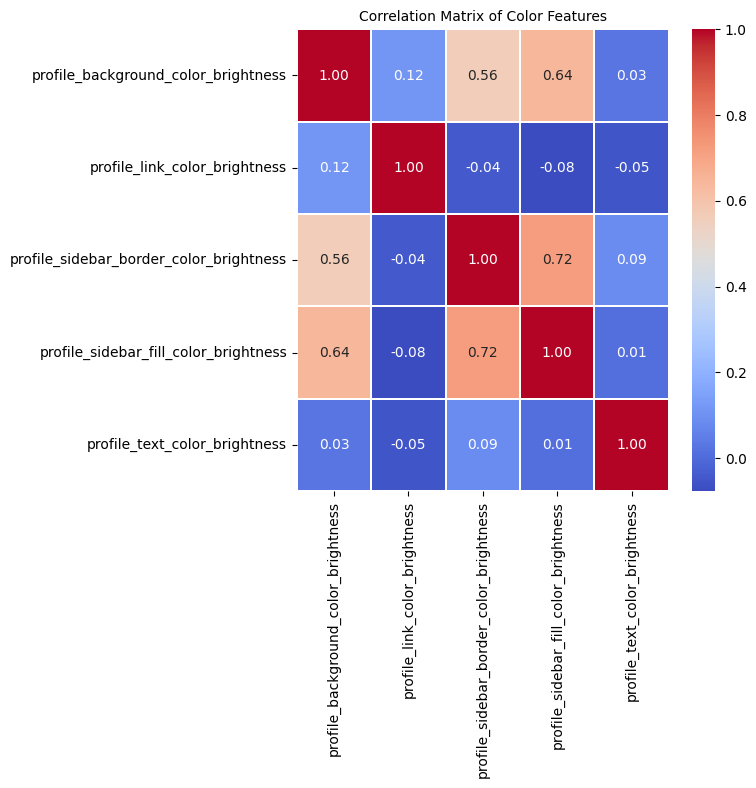

In [ ]:
# List of color-related columns (RGB components for each color)
color_columns = [
    'profile_background_color_brightness',
    'profile_link_color_brightness',
    'profile_sidebar_border_color_brightness',
    'profile_sidebar_fill_color_brightness',
    'profile_text_color_brightness'
]

# Compute the correlation matrix
corr_matrix = users[color_columns].corr()

plt.figure(figsize=(6, 6))

# Create a heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.3)
plt.title('Correlation Matrix of Color Features', fontsize=10)
plt.show()

In [ ]:
users = users.drop(['profile_background_color_r', 'profile_background_color_g', 'profile_background_color_b',
    'profile_link_color_r', 'profile_link_color_g', 'profile_link_color_b',
    'profile_sidebar_border_color_r', 'profile_sidebar_border_color_g', 'profile_sidebar_border_color_b',
    'profile_sidebar_fill_color_r', 'profile_sidebar_fill_color_g', 'profile_sidebar_fill_color_b',
    'profile_text_color_r', 'profile_text_color_g', 'profile_text_color_b',
    'profile_link_color_brightness',
    'profile_sidebar_border_color_brightness',
    'profile_sidebar_fill_color_brightness',
    'profile_text_color_brightness'
    ], axis=1)

#### Further Preprocessing Needed

*   Account Age
*   Convert Categorical to Numerical
*   Normalize Continuous Variables
*   Extract Numerical Values from Dates (If required)
*   Process Text Data (Later)


In [ ]:
# Account Age
users["account_age"] = (pd.Timestamp.now(tz="UTC") - users["created_at"]).dt.days / 365
print(f"The account_age min value (in years): {users.account_age.min()}, \nThe account_age max value (in years): {users.account_age.max()}")

The account_age min value (in years): 8.175342465753424, 
The account_age max value (in years): 18.39178082191781


In [ ]:
# Get Numeric Columns
numeric_columns = users.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'id' in numeric_columns:
    numeric_columns.remove('id')
print(f"Numeric Columns: {numeric_columns}")

# Scaling Numeric Columns (MinMax)
scaler = MinMaxScaler()
users[numeric_columns] = scaler.fit_transform(users[numeric_columns])

Numeric Columns: ['followers_count', 'friends_count', 'listed_count', 'favourites_count', 'utc_offset', 'statuses_count', 'profile_background_color_brightness', 'account_age']


In [ ]:
# Convert Boolean Columns to 0 or 1
bool_columns = users.select_dtypes(include=['bool']).columns.tolist()
print(f"boolean Columns: {bool_columns}")

users[bool_columns] = users[bool_columns].astype(int)

boolean Columns: ['geo_enabled', 'verified', 'is_translation_enabled', 'profile_background_tile', 'profile_use_background_image', 'has_extended_profile', 'default_profile', 'default_profile_image', 'depression']


In [ ]:
users["creation_year"] = users["created_at"].dt.year

#### Feature Selection
<table border="1" style="border-collapse: collapse; width: 100%; text-align: left;">
  <thead>
    <tr style="background-color: #f2f2f2;">
      <th style="padding: 8px;">Category</th>
      <th style="padding: 8px;">Features</th>
      <th style="padding: 8px;">Justification</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td style="padding: 8px;">User Influence & Engagement</td>
      <td style="padding: 8px;">followers_count, <br> friends_count, <br> listed_count, <br> statuses_count, <br> favourites_count</td>
      <td style="padding: 8px;">Social engagement level— <br> People with higher/lower engagement may exhibit different online <br>behaviors related to mental health.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Account Information</td>
      <td style="padding: 8px;">account_age</td>
      <td style="padding: 8px;">Account age—<br> Older vs. newer accounts may reflect different behavioral patterns.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Behavioral Features</td>
      <td style="padding: 8px;">geo_enabled, <br> profile_use_background_image, <br> has_extended_profile, <br> default_profile, <br> default_profile_image</td>
      <td style="padding: 8px;">Customization & privacy behavior— <br> These may indicate user engagement and personality.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Visual Preferences</td>
      <td style="padding: 8px;">profile_background_color_brightness</td>
      <td style="padding: 8px;">Color psychology— <br>
       Colors can indicate emotions and psychological states.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Verified Status</td>
      <td style="padding: 8px;">verified</td>
      <td style="padding: 8px;">Social credibility— <br> Verified users may behave differently online.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Language & Translation</td>
      <td style="padding: 8px;">is_translation_enabled </td>
      <td style="padding: 8px;">Global vs. local engagement— <br> Multilingual users might have different social patterns.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Target Variable</td>
      <td style="padding: 8px;">depression</td>
      <td style="padding: 8px;">Our regression target— <br> Deppressed or not</td>
    </tr>
  </tbody>
</table>


In [ ]:
num_cols = ['creation_year', 'geo_enabled', 'profile_use_background_image', 'has_extended_profile', 'default_profile',
    'default_profile_image', 'verified', 'is_translation_enabled']

# Define subplot layout
cols = 3  # Number of columns
rows = math.ceil(len(num_cols) / cols)  # Number of rows

fig = make_subplots(
    rows=rows, cols=cols,
    subplot_titles=[f"Avg {var} vs Depression" for var in num_cols],
    horizontal_spacing=0.1,  # Adjust spacing
    vertical_spacing=0.1
)

# Add each variable's plot to the figure
for idx, var in enumerate(num_cols):
    row = idx // cols + 1
    col = idx % cols + 1

    variable_count = users.groupby([var, 'depression'])[var].count().unstack()

    # Add bars for each depression category
    for depression_status in [0, 1]:
        fig.add_trace(
            go.Bar(
                x=variable_count.index,
                y=variable_count[depression_status],
                name=f"Depression: {'True' if depression_status == 1 else 'False'}",
                text=variable_count[depression_status].round(2),  # Round for better display
                textposition='outside',
                width=0.2,
                marker=dict(line=dict(width=2, color='rgba(0,0,0,1)'), opacity=1)
            ),
            row=row, col=col
            )

# Update layout
fig.update_layout(
    title="Comparison of Numerical Features with Depression",
    height=rows * 300,  # Adjust height dynamically
    width=1200,  # Set width for better visibility
    plot_bgcolor='rgba(34, 34, 34, 1)',
    paper_bgcolor='rgba(34, 34, 34, 1)',
    font=dict(color='white'),
    barmode='group',  # Ensures bars for depression=True and False are placed side by side
    showlegend=False
)

fig.show()

In [ ]:
# Numerical columns
num_cols = [
    'followers_count', 'friends_count', 'listed_count', 'favourites_count', 'statuses_count',
    'profile_background_color_brightness', 'account_age'
]

# Define subplot layout
cols = 3  # Number of columns
rows = math.ceil(len(num_cols) / cols)  # Number of rows

fig = make_subplots(
    rows=rows, cols=cols,
    subplot_titles=[f"Avg {var} vs Depression" for var in num_cols],
    horizontal_spacing=0.1,  # Adjust spacing
    vertical_spacing=0.1
)

# Add each variable's plot to the figure
for idx, var in enumerate(num_cols):
    row = idx // cols + 1
    col = idx % cols + 1

    variable_count = users.groupby('depression')[var].mean()

    fig.add_trace(
        go.Bar(
            x=variable_count.index,
            y=variable_count.values,
            marker_color='rgb(156, 39, 176)',
            text=variable_count.round(2),
            textposition='outside',
            width=0.2,
            marker=dict(line=dict(width=1, color='rgba(0,0,0,1)'), opacity=1)
        ),
        row=row, col=col
    )

# Update layout
fig.update_layout(
    title="Comparison of Numerical Features with Depression",
    height=rows * 300,  # Adjust height dynamically
    width=1200,  # Set width for better visibility
    plot_bgcolor='rgba(34, 34, 34, 1)',
    paper_bgcolor='rgba(34, 34, 34, 1)',
    font=dict(color='white'),
    showlegend=False
)

fig.show()

In [ ]:
# Extract numeric and categorical columns
num_cols = users.select_dtypes(include=[np.number]).columns

# Assuming `train_data` is your DataFrame and `num_cols` is a list of numerical columns
corr_matrix = users[num_cols].corr()

fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale='Viridis',
    colorbar=dict(title='Correlation'),
))

fig.update_layout(
    title='Correlation Heatmap',
    xaxis_title='Features',
    yaxis_title='Features',
    width=800,
    height=700,
    template='plotly_dark',  # Use dark theme
)

fig.show()

In [ ]:
users = users[['id', 'followers_count', 'friends_count', 'listed_count', 'favourites_count', 'statuses_count', 'geo_enabled', 'profile_use_background_image', 'has_extended_profile', 'default_profile', 'default_profile_image', 'profile_background_color_brightness', 'account_age', 'verified', 'is_translation_enabled', 'depression']]

In [ ]:
users

,id,followers_count,friends_count,listed_count,favourites_count,statuses_count,geo_enabled,profile_use_background_image,has_extended_profile,default_profile,default_profile_image,profile_background_color_brightness,account_age,verified,is_translation_enabled,depression
3643,1057022347,0.000471,0.004931,0.000240,0.005445,0.002718,0,1,1,0,0,0.106498,0.394208,0,0,0
1636,171999132,0.000255,0.016718,0.000601,0.001973,0.000604,0,1,0,0,0,0.282984,0.632609,0,0,0
4703,751907980405198848,0.001638,0.000828,0.005766,0.099888,0.006630,0,0,0,0,0,0.000000,0.049879,0,0,0
2992,2236408118,0.005013,0.036608,0.000841,0.005770,0.002221,0,1,0,0,0,1.000000,0.303030,0,0,1
5502,434369401,0.000197,0.002477,0.000120,0.009385,0.008613,0,1,0,1,0,0.842118,0.498257,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,322279406,0.000933,0.003038,0.000240,0.024547,0.011156,1,0,1,0,0,0.486122,0.544382,0,0,1
5191,1895493180,0.007947,0.041326,0.002883,0.049556,0.017103,1,1,1,0,0,0.842118,0.323679,0,0,1
5390,2317448645,0.000643,0.006225,0.000120,0.002508,0.003144,0,1,0,1,0,0.842118,0.288549,0,0,1
860,21038530,0.000003,0.000039,0.000000,0.000000,0.000003,0,1,0,1,1,0.842118,0.773934,0,0,1


In [ ]:
users.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11051 entries, 3643 to 1371
Data columns (total 16 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   11051 non-null  int64  
 1   followers_count                      11051 non-null  float64
 2   friends_count                        11051 non-null  float64
 3   listed_count                         11051 non-null  float64
 4   favourites_count                     11051 non-null  float64
 5   statuses_count                       11051 non-null  float64
 6   geo_enabled                          11051 non-null  int64  
 7   profile_use_background_image         11051 non-null  int64  
 8   has_extended_profile                 11051 non-null  int64  
 9   default_profile                      11051 non-null  int64  
 10  default_profile_image                11051 non-null  int64  
 11  profile_background_color_bright

### Timeline Data

#### Collect Data from Negative Users (non-depressed) and Positive Users (depressed)

Data Collection and cvs Saving

In [ ]:
df_timeline_neg['depression'] = False  # Negative Data
df_timeline_pos['depression'] = True   # Positive Data

df_timeline = pd.concat([df_timeline_neg, df_timeline_pos])

# Shuffling rows
df_timeline = df_timeline.sample(frac=1, random_state=42)
df_timeline.shape

(1003492, 33)

In [ ]:
# Extract User_Id
df_timeline["user_id"] = df_timeline["user"].apply(lambda x: x.get("id") if isinstance(x, dict) else None)

In [ ]:
# Count the number of rows for each unique user_id for df_timeline_pos
user_counts_pos = df_timeline[df_timeline['depression']==True].groupby('user_id').size().reset_index(name='count')
user_counts_pos = user_counts_pos.sort_values(by='count', ascending=False)

# Count the number of rows for each unique user_id for df_timeline_neg
user_counts_neg = df_timeline[df_timeline['depression']==False].groupby('user_id').size().reset_index(name='count')
user_counts_neg = user_counts_neg.sort_values(by='count', ascending=False)

In [ ]:
user_counts_pos['count'].describe(), user_counts_neg['count'].describe()

(count    2516.000000
 mean      202.228140
 std       304.661697
 min         1.000000
 25%        34.000000
 50%       102.000000
 75%       237.000000
 max      4226.000000
 Name: count, dtype: float64,
 count     985.000000
 mean      339.384772
 std       472.003435
 min         1.000000
 25%        46.000000
 50%       137.000000
 75%       443.000000
 max      3657.000000
 Name: count, dtype: float64)

In [ ]:
df_timeline[df_timeline['retweeted_status'].notna()].iloc[0].retweeted_status

({'created_at': 'Fri Mar 18 23:30:19 +0000 2016',
  'id': 710971625743626240,
  'id_str': '710971625743626240',
  'text': "We're delighted to announce @adrianco will be a keynote speaker at @spring1platform. Get your early bird tickets now https://t.co/PH8WUSRoGD",
  'truncated': False,
  'entities': {'hashtags': [],
   'symbols': [],
   'user_mentions': [{'screen_name': 'adrianco',
     'name': 'adrian cockcroft',
     'id': 13895242,
     'id_str': '13895242',
     'indices': [28, 37]},
    {'screen_name': 'spring1platform',
     'name': 'Spring1Platform',
     'id': 776897474074030080,
     'id_str': '776897474074030080',
     'indices': [67, 83]}],
   'urls': [{'url': 'https://t.co/PH8WUSRoGD',
     'expanded_url': 'https://cards.twitter.com/cards/18ce53uo9qw/1kq2g',
     'display_url': 'cards.twitter.com/cards/18ce53uo…',
     'indices': [117, 140]}]},
  'source': '<a href="https://ads.twitter.com" rel="nofollow">Twitter Ads</a>',
  'in_reply_to_status_id': None,
  'in_reply_to_st

In [ ]:
df_timeline[df_timeline['quoted_status'].notna()].iloc[0].quoted_status

{'created_at': 'Thu Aug 27 05:39:25 +0000 2015',
 'id': 636775000784117760,
 'id_str': '636775000784117760',
 'text': 'Bones Exposed. Part 100 (I had to 😭😭😂) @austincarlile (Vine by @ohdipiitzpat) https://t.co/zAJCsXoire',
 'truncated': False,
 'entities': {'hashtags': [],
  'symbols': [],
  'user_mentions': [{'screen_name': 'austincarlile',
    'name': 'Austin Carlile',
    'id': 17863018,
    'id_str': '17863018',
    'indices': [39, 53]}],
  'urls': [{'url': 'https://t.co/zAJCsXoire',
    'expanded_url': 'https://vine.co/v/eXnU3ImX7pI',
    'display_url': 'vine.co/v/eXnU3ImX7pI',
    'indices': [78, 101]}]},
 'source': '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>',
 'in_reply_to_status_id': None,
 'in_reply_to_status_id_str': None,
 'in_reply_to_user_id': None,
 'in_reply_to_user_id_str': None,
 'in_reply_to_screen_name': None,
 'user': {'id': 459153512,
  'id_str': '459153512',
  'name': 'scott ayala',
  'screen_name': 'GuyAtEveryShow',
  'location': 'Whittier, 

In [ ]:
df_timeline.columns, df_timeline.info()

<class 'pandas.core.frame.DataFrame'>
Index: 843100 entries, 296567 to 121958
Data columns (total 34 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   created_at                 843100 non-null  object 
 1   id                         843100 non-null  int64  
 2   id_str                     843100 non-null  object 
 3   text                       843100 non-null  object 
 4   truncated                  843100 non-null  bool   
 5   entities                   843100 non-null  object 
 6   source                     843100 non-null  object 
 7   in_reply_to_status_id      240546 non-null  float64
 8   in_reply_to_status_id_str  240546 non-null  object 
 9   in_reply_to_user_id        265006 non-null  float64
 10  in_reply_to_user_id_str    265006 non-null  object 
 11  in_reply_to_screen_name    265006 non-null  object 
 12  user                       843100 non-null  object 
 13  geo                        59

(Index(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities', 'source',
        'in_reply_to_status_id', 'in_reply_to_status_id_str',
        'in_reply_to_user_id', 'in_reply_to_user_id_str',
        'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
        'contributors', 'is_quote_status', 'retweet_count', 'favorite_count',
        'favorited', 'retweeted', 'lang', 'extended_entities',
        'possibly_sensitive', 'quoted_status_id', 'quoted_status_id_str',
        'depression', 'retweeted_status', 'quoted_status', 'withheld_scope',
        'withheld_copyright', 'withheld_in_countries', 'user_id'],
       dtype='object'),
 None)

In [ ]:
df_timeline.drop(columns=['contributors', 'id', 'id_str', 'truncated', 'in_reply_to_status_id', 'in_reply_to_status_id_str', 'in_reply_to_user_id_str', 'in_reply_to_screen_name', 'withheld_scope', 'withheld_copyright', 'withheld_in_countries', 'user', 'favorited', 'retweeted', 'quoted_status_id_str', 'retweeted_status', 'quoted_status'], inplace=True)
# 'entities', 'extended_entities'

In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/timeline_entities.csv"
df_timeline.to_csv(save_path, index=False)

In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/timeline_preprocessed.csv"
df_final.to_csv(save_path, index=False)

In [ ]:
df_timeline = df_timeline[['id', 'created_at', 'user_id', 'text', 'favorited', 'retweeted', 'favorite_count', 'retweet_count', 'in_reply_to_status_id', 'depression']]
#df_timeline["created_at"] = df_timeline["created_at"].apply(lambda x: parser.parse(x) if pd.notnull(x) else pd.NaT)

save_path = "/content/drive/MyDrive/MentalHealthProject/timeline_indiv_texts.csv"
df_timeline.to_csv(save_path, index=False)

#### Data Exploration and Feature Engineering

In [ ]:
file_path = "/content/drive/MyDrive/MentalHealthProject/timeline.csv"
df_timeline = pd.read_csv(file_path)

In [ ]:
file_path = "/content/drive/MyDrive/MentalHealthProject/timeline_entities.csv"
df_timeline = pd.read_csv(file_path)

In [ ]:
file_path = "/content/drive/MyDrive/MentalHealthProject/timeline_preprocessed.csv"
df_final = pd.read_csv(file_path)

In [ ]:
file_path = "/content/drive/MyDrive/MentalHealthProject/timeline_indiv_texts.csv"
df_final = pd.read_csv(file_path)

In [ ]:
df_final.shape

(1003492, 10)

In [ ]:
df_timeline.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 843100 entries, 0 to 843099
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   created_at           843100 non-null  object 
 1   text                 843100 non-null  object 
 2   entities             843100 non-null  object 
 3   source               843093 non-null  object 
 4   in_reply_to_user_id  265006 non-null  float64
 5   geo                  5924 non-null    object 
 6   coordinates          5924 non-null    object 
 7   place                18876 non-null   object 
 8   is_quote_status      843100 non-null  bool   
 9   retweet_count        843100 non-null  int64  
 10  favorite_count       843100 non-null  int64  
 11  lang                 843100 non-null  object 
 12  extended_entities    89037 non-null   object 
 13  possibly_sensitive   226908 non-null  object 
 14  quoted_status_id     10518 non-null   float64
 15  depression       

In [ ]:
df_timeline.entities.iloc[0], df_timeline.entities.iloc[1], df_timeline.entities.iloc[2]

("{'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'actual_tonys', 'name': 'Tony Stark', 'id': 2569920198, 'id_str': '2569920198', 'indices': [0, 13]}], 'urls': []}",
 "{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}",
 "{'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'biebahsboo', 'name': 'cami', 'id': 750845458440794112, 'id_str': '750845458440794112', 'indices': [0, 11]}], 'urls': []}")

In [ ]:
df_timeline["created_at"] = df_timeline["created_at"].apply(lambda x: parser.parse(x) if pd.notnull(x) else pd.NaT)

# Step 1: Extract source information and count unique sources per user
def clean_source(df):
    df["source"] = df["source"].str.extract(r'>(.*?)<')
    source_counts = df.groupby("user_id")["source"].nunique().reset_index()
    source_counts.rename(columns={"source": "unique_sources"}, inplace=True)
    return df, source_counts

df_timeline, df_source = clean_source(df_timeline)

# Step 2: Feature Engineering for Varying Features
def compute_aggregates(df):
    return df.groupby("user_id").agg(
        total_retweets=("retweet_count", "sum"),
        total_favorites=("favorite_count", "sum"),
        avg_retweets=("retweet_count", "mean"),
        avg_favorites=("favorite_count", "mean"),
        tweet_count=("text", "count"),
    ).reset_index()

df_agg = compute_aggregates(df_timeline)

# Step 3: Compute Tweet Frequency
def compute_tweet_frequency(df):
    df_sorted = df.sort_values(by=["user_id", "created_at"])
    df_sorted["time_diff"] = df_sorted.groupby("user_id")["created_at"].diff().dt.total_seconds()

    tweet_freq = df_sorted.groupby("user_id").agg(
        mean_time_gap=("time_diff", "mean"),
        median_time_gap=("time_diff", "median"),
        std_time_gap=("time_diff", "std"),
        total_timespan=("created_at", lambda x: (x.max() - x.min()).total_seconds()),
    ).reset_index()

    # Compute total number of tweets per user
    tweet_counts = df_sorted.groupby("user_id")["text"].count()

    # Ensure 'total_timespan' is not zero to avoid division errors
    tweet_freq["tweet_rate"] = tweet_freq.apply(
        lambda row: 1 if row["total_timespan"] == 0 else tweet_counts.get(row["user_id"], 0) / (row["total_timespan"] / 86400),
        axis=1
    )
    #tweet_freq["tweet_rate"] = tweet_freq["total_timespan"].apply(lambda x: 1 if x == 0 else df_sorted.groupby("user_id")["text"].count() / (x / 86400))  # Tweets per day

    return tweet_freq

df_freq = compute_tweet_frequency(df_timeline)

# Step 3: Compute Quote-Based Features
def compute_quote_features(df):
    quote_features = df.groupby("user_id").agg(
        total_quotes=("is_quote_status", "sum"),
        quote_ratio=("is_quote_status", "mean")
    ).reset_index()

    quoted_interactions = df[df["quoted_status_id"].notna()].merge(
        df[["user_id", "depression"]].rename(columns={"user_id": "quoted_status_id", "depression": "quoted_depressed"}),
        on="quoted_status_id", how="left"
    )

    quoted_counts = quoted_interactions.groupby("user_id")["quoted_depressed"].sum().reset_index()
    quoted_counts.rename(columns={"quoted_depressed": "quotes_from_depressed"}, inplace=True)

    total_quotes = quoted_interactions.groupby("user_id")["quoted_depressed"].count().reset_index()
    total_quotes.rename(columns={"quoted_depressed": "total_quotes"}, inplace=True)

    quoted_counts = quoted_counts.merge(total_quotes, on="user_id", how="left")
    quoted_counts["quotes_from_non_depressed"] = quoted_counts["total_quotes"] - quoted_counts["quotes_from_depressed"]

    return quote_features.merge(quoted_counts, on="user_id", how="left")

df_quotes = compute_quote_features(df_timeline)

# Step 4: Compute Interaction-Based Features
def compute_interaction_features(df):
    interactions = df.groupby("user_id")["in_reply_to_user_id"].nunique().reset_index()
    interactions.rename(columns={"in_reply_to_user_id": "unique_interactions"}, inplace=True)

    depressed_interactions = df[df["in_reply_to_user_id"].notna()].merge(
        df[["user_id", "depression"]].rename(columns={"user_id": "in_reply_to_user_id", "depression": "reply_depressed"}),
        on="in_reply_to_user_id", how="left"
    )

    depressed_counts = depressed_interactions.groupby("user_id")["reply_depressed"].sum().reset_index()
    depressed_counts.rename(columns={"reply_depressed": "interactions_with_depressed"}, inplace=True)

    total_interactions = depressed_interactions.groupby("user_id")["reply_depressed"].count().reset_index()
    total_interactions.rename(columns={"reply_depressed": "total_interactions"}, inplace=True)

    depressed_counts = depressed_counts.merge(total_interactions, on="user_id", how="left")
    depressed_counts["interactions_with_non_depressed"] = depressed_counts["total_interactions"] - depressed_counts["interactions_with_depressed"]

    return interactions.merge(depressed_counts, on="user_id", how="left")

df_interactions = compute_interaction_features(df_timeline)

# Step 5: Remove Duplicate Tweets
df_unique = df_timeline.drop_duplicates(subset=["user_id", "text"])

# Step 6: Aggregate Text per User
def aggregate_text(df):
    return df.groupby("user_id")["text"].apply(lambda x: " ".join(x)).reset_index()

df_text = aggregate_text(df_unique)

# Merge all processed data
df_final = df_agg.merge(df_freq, on="user_id", how="left")\
                   .merge(df_text, on="user_id", how="left")\
                   .merge(df_interactions, on="user_id", how="left")\
                   .merge(df_source, on="user_id", how="left")\
                   .merge(df_quotes, on="user_id", how="left")

# Keep the depression label
df_final = df_final.merge(df_timeline[["user_id", "depression"]].drop_duplicates(), on="user_id", how="left")

# Drop unnecessary columns
df_final.drop(columns=["total_timespan"], inplace=True)

In [ ]:
# Step 7: Aggregate Entities per User into Separate Text Columns
def aggregate_entities_text(df):
    def merge_entities(entities_list):
        aggregated = {"hashtags": set(), "symbols": set()}

        for entity in entities_list:
            entity_dict = ast.literal_eval(entity)  # Convert string to dictionary

            # Extract the text field from dictionaries
            hashtags = [h["text"] for h in entity_dict.get("hashtags", [])]
            symbols = [s["text"] for s in entity_dict.get("symbols", [])]

            aggregated["hashtags"].update(hashtags)
            aggregated["symbols"].update(symbols)

        # Convert sets to comma-separated text strings
        return (
            ", ".join(aggregated["hashtags"]),
            ", ".join(aggregated["symbols"])
        )

    # Apply function to grouped data
    entity_df = df.groupby("user_id")["entities"].apply(merge_entities).reset_index()

    # Expand tuple into separate columns
    entity_df[["hashtags", "symbols"]] = pd.DataFrame(entity_df["entities"].tolist(), index=entity_df.index)
    entity_df.drop(columns=["entities"], inplace=True)

    return entity_df

df_entities = aggregate_entities_text(df_timeline)

# Merge each entity type into final dataset
df_final = df_final.merge(df_entities, on="user_id", how="left")

In [ ]:
df_final[["hashtags", "symbols"]] = df_final[["hashtags", "symbols"]].replace("", np.nan)

In [ ]:
df_final[df_final['hashtags'].notna()][['hashtags', 'depression']]

,hashtags,depression
0,"DominionS3, Free2BeYOU, Free2Luv, depressionaw...",True
1,"12sEverywhere, LegionOfBoom, twitterbowl, MedH...",True
2,"TheLongDark, help, posts, NotAllAtheists, fall...",True
5,"4Corners, LordSugarBook, Amazon, miningboom, A...",True
6,"tellittomyheart, PS4share, gregisms, 205Live, ...",False
...,...,...
3487,"DMmeTriz, AskCamDatingAdvice, DMMETRIZ",False
3489,freethenipples,False
3493,"BlackLivesMatter, Kardashians, Hollywood, Kard...",False
3494,"銀魂クラスタと繋がりたい, 銀魂なりきりさんと繋がりたい, RTした人全員フォローする, R...",False


In [ ]:
!pip install wordsegment
from wordsegment import load, segment

# Load word corpus
load()

# Example function to split hashtags
def split_hashtag(hashtag):
    return " ".join(segment(hashtag.lstrip("#")))  # Remove # and segment words

# Example
print(split_hashtag("#tellittomyheart"))
# Output: 'tell it to my heart'


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 31.6 MB/s eta 0:00:00
tell it to my heart


In [ ]:
print(split_hashtag("self-harm"))

self harm


In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3501 entries, 0 to 3500
Data columns (total 24 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   user_id                          3501 non-null   int64  
 1   total_retweets                   3501 non-null   int64  
 2   total_favorites                  3501 non-null   int64  
 3   avg_retweets                     3501 non-null   float64
 4   avg_favorites                    3501 non-null   float64
 5   tweet_count                      3501 non-null   int64  
 6   mean_time_gap                    3460 non-null   float64
 7   median_time_gap                  3460 non-null   float64
 8   std_time_gap                     3409 non-null   float64
 9   tweet_rate                       3501 non-null   float64
 10  text                             3501 non-null   object 
 11  unique_interactions              3501 non-null   int64  
 12  interactions_with_de

In [ ]:
# Extract numeric and categorical columns
num_cols = df_final.select_dtypes(include=[np.number]).columns
cat_cols = df_final.select_dtypes(exclude=[np.number]).columns

In [ ]:
num_cols

Index(['user_id', 'total_retweets', 'total_favorites', 'avg_retweets',
       'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap',
       'std_time_gap', 'tweet_rate', 'unique_interactions',
       'total_interactions', 'unique_sources', 'total_quotes_x', 'quote_ratio',
       'total_quotes_y'],
      dtype='object')

In [ ]:
# Summary statistics for numerical features
df_final[num_cols].describe()

,user_id,total_retweets,total_favorites,avg_retweets,avg_favorites,tweet_count,mean_time_gap,median_time_gap,std_time_gap,tweet_rate,unique_interactions,total_interactions,unique_sources,total_quotes_x,quote_ratio,total_quotes_y
count,3.501000e+03,3.501000e+03,3501.000000,3501.000000,3501.000000,3501.000000,3.460000e+03,3.460000e+03,3.409000e+03,3501.000000,3501.000000,2.915000e+03,3501.000000,3501.000000,3501.000000,982.0
mean,4.527383e+16,1.269674e+05,244.407312,622.957405,1.126365,240.816909,5.301816e+04,2.470127e+04,9.424490e+04,42.180527,18.555841,6.439117e+03,2.163953,3.844045,0.015799,0.0
std,1.804022e+17,6.412844e+05,5207.632721,3220.509420,25.204101,364.878943,1.620513e+05,1.192002e+05,4.569212e+05,250.361565,33.519838,5.727077e+04,1.398968,14.152888,0.041280,0.0
min,1.191300e+04,0.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.0
25%,2.701170e+08,5.000000e+00,3.000000,0.051724,0.053333,36.000000,5.580148e+03,1.900000e+02,1.474085e+04,1.746284,1.000000,0.000000e+00,1.000000,0.000000,0.000000,0.0
50%,1.052122e+09,3.350000e+02,21.000000,2.540000,0.222222,111.000000,1.593341e+04,9.135000e+02,3.254345e+04,5.048249,8.000000,0.000000e+00,2.000000,0.000000,0.000000,0.0
75%,2.778730e+09,2.820100e+04,95.000000,231.156863,0.618182,273.000000,4.313957e+04,7.142250e+03,7.852353e+04,14.247955,21.000000,6.185000e+02,3.000000,1.000000,0.009163,0.0
max,8.194559e+17,1.276274e+07,303914.000000,126999.115385,1475.310680,4226.000000,5.358080e+06,2.256300e+06,1.804307e+07,6480.000000,775.000000,2.441340e+06,14.000000,239.000000,0.529915,0.0


In [ ]:
df_final[cat_cols].describe()

,text,interactions_with_depressed,interactions_with_non_depressed,quotes_from_depressed,quotes_from_non_depressed,depression
count,3501,2915,2915,982,982,3501
unique,3501,669,453,1,1,2
top,"I know, my heart is aching for her.... https:/...",0,0,0,0,True
freq,1,2084,2423,982,982,2516


In [ ]:
df_final['depression']= df_final['depression'].astype(int)

In [ ]:
# Numerical columns
num_cols = ['total_retweets', 'total_favorites', 'avg_retweets',
            'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap',
            'std_time_gap', 'tweet_rate', 'unique_interactions',
            'total_interactions', 'unique_sources', 'total_quotes_x', 'quote_ratio',
            'total_quotes_y']

# Calculate the class distribution (normalize to get the weights)
class_distribution = df_final['depression'].value_counts(normalize=True)
weights = 1 / class_distribution

# Define subplot layout
cols = 3  # Number of columns
rows = math.ceil(len(num_cols) / cols)  # Number of rows

fig = make_subplots(
    rows=rows, cols=cols,
    subplot_titles=[f"Avg {var} vs Depression" for var in num_cols],
    horizontal_spacing=0.1,  # Adjust spacing
    vertical_spacing=0.1
)

# Add each variable's plot to the figure
for idx, var in enumerate(num_cols):
    row = idx // cols + 1
    col = idx % cols + 1

    variable_count = df_final.groupby('depression')[var].mean()

    fig.add_trace(
        go.Bar(
            x=variable_count.index,
            y=variable_count.values,
            marker_color='rgb(156, 39, 176)',
            text=variable_count.round(2),
            textposition='outside',
            width=0.2,
            marker=dict(line=dict(width=1, color='rgba(0,0,0,1)'), opacity=1)
        ),
        row=row, col=col
    )

# Update layout
fig.update_layout(
    title="Comparison of Numerical Features with Depression",
    height=rows * 300,  # Adjust height dynamically
    width=1200,  # Set width for better visibility
    plot_bgcolor='rgba(34, 34, 34, 1)',
    paper_bgcolor='rgba(34, 34, 34, 1)',
    font=dict(color='white'),
    showlegend=False
)

fig.show()

In [ ]:
# The target variable (depression) is imbalanced --> can lead to biased statistics
# Weighted Statistics

# Calculate the class distribution (normalize to get the weights)
class_distribution = df_final['depression'].value_counts(normalize=True)
weights = 1 / class_distribution

fig = make_subplots(
    rows=rows, cols=cols,
    subplot_titles=[f"Avg {var} vs Depression" for var in num_cols],
    horizontal_spacing=0.1,  # Adjust spacing
    vertical_spacing=0.1
)

# Add each variable's plot to the figure
for idx, var in enumerate(num_cols):
    row = idx // cols + 1
    col = idx % cols + 1

    #variable_count = df_final.groupby('depression')[var].mean()

    # Compute weighted average for each variable in 'num_cols'
    weighted_mean = df_final.groupby('depression').apply(
        lambda x: (x[var] * weights[x['depression']]).sum() / weights.sum()
    )

    fig.add_trace(
        go.Bar(
            x=weighted_mean.index,
            y=weighted_mean.values,
            marker_color='rgb(156, 39, 176)',
            text=weighted_mean.round(2),
            textposition='outside',
            width=0.2,
            marker=dict(line=dict(width=1, color='rgba(0,0,0,1)'), opacity=1)
        ),
        row=row, col=col
    )

# Update layout
fig.update_layout(
    title="Comparison of Numerical Features with Depression",
    height=rows * 300,  # Adjust height dynamically
    width=1200,  # Set width for better visibility
    plot_bgcolor='rgba(34, 34, 34, 1)',
    paper_bgcolor='rgba(34, 34, 34, 1)',
    font=dict(color='white'),
    showlegend=False
)

fig.show()

<ipython-input-41-bbed643d4d94>:34: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

<ipython-input-41-bbed643d4d94>:34: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

<ipython-input-41-bbed643d4d94>:34: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass

In [ ]:
# Get Numeric Columns
numeric_columns = df_final.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'depression' in numeric_columns:
    numeric_columns.remove('depression')
if 'user_id' in numeric_columns:
    numeric_columns.remove('user_id')
print(f"Numeric Columns: {numeric_columns}")

# Scaling Numeric Columns (MinMax)
scaler = MinMaxScaler()
df_final[numeric_columns] = scaler.fit_transform(df_final[numeric_columns])

# Convert Boolean Columns to 0 or 1
bool_columns = df_final.select_dtypes(include=['bool']).columns.tolist()
print(f"boolean Columns: {bool_columns}")

df_final[bool_columns] = df_final[bool_columns].astype(int)

Numeric Columns: ['total_retweets', 'total_favorites', 'avg_retweets', 'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap', 'std_time_gap', 'tweet_rate', 'unique_interactions', 'total_interactions', 'unique_sources', 'total_quotes_x', 'quote_ratio', 'total_quotes_y']
boolean Columns: ['depression']


In [ ]:
# Fill 'mean_time_gap' with the mean value of people with the same depression condition (Only one value was missing)
df_final['mean_time_gap'] = df_final.groupby('depression')['mean_time_gap'].transform(
    lambda x: x.fillna(x.mean())
)

# Fill nan values in 'interactions_with_depressed', 'total_interactions', and 'interactions_with_non_depressed' with 0 (There were no interactions)
df_final['interactions_with_depressed'] = df_final['interactions_with_depressed'].fillna(0)
df_final['total_interactions'] = df_final['total_interactions'].fillna(0)
df_final['interactions_with_non_depressed'] = df_final['interactions_with_non_depressed'].fillna(0)

# Drop the 'quotes_from_depressed' and 'quotes_from_non_depressed' columns (we can also fill with 0; no interactions)
df_final = df_final.drop(columns=['quotes_from_depressed', 'quotes_from_non_depressed'])

<ipython-input-8-f76e5fd3c99a>:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_final['interactions_with_depressed'] = df_final['interactions_with_depressed'].fillna(0)
<ipython-input-8-f76e5fd3c99a>:9: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_final['interactions_with_non_depressed'] = df_final['interactions_with_non_depressed'].fillna(0)


#### User Data and timeline concatenation (datasets with preprocessed numerical features)

In [ ]:
users = users[['id', 'followers_count', 'listed_count', 'favourites_count', 'statuses_count', 'has_extended_profile', 'default_profile', 'profile_background_color_brightness', 'account_age', 'depression']]

In [ ]:
df_final.rename(columns={'user_id': 'id'}, inplace=True)

In [ ]:
# Merge the two DataFrames on 'user_id' and 'depression'
merged_df = pd.merge(df_final, users, on=['id', 'depression'], how='inner')

In [ ]:
merged_df.columns

Index(['id', 'total_retweets', 'total_favorites', 'avg_retweets',
       'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap',
       'std_time_gap', 'tweet_rate', 'text', 'unique_interactions',
       'interactions_with_depressed', 'total_interactions',
       'interactions_with_non_depressed', 'unique_sources', 'total_quotes_x',
       'quote_ratio', 'quotes_from_depressed', 'total_quotes_y',
       'quotes_from_non_depressed', 'depression', 'followers_count',
       'listed_count', 'favourites_count', 'statuses_count',
       'has_extended_profile', 'default_profile',
       'profile_background_color_brightness', 'account_age'],
      dtype='object')

In [ ]:
# Extract numeric and categorical columns
num_cols = merged_df.select_dtypes(include=[np.number]).columns

# Assuming `train_data` is your DataFrame and `num_cols` is a list of numerical columns
corr_matrix = merged_df[num_cols].corr()

fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale='Viridis',
    colorbar=dict(title='Correlation'),
))

fig.update_layout(
    title='Correlation Heatmap',
    xaxis_title='Features',
    yaxis_title='Features',
    width=800,
    height=700,
    template='plotly_dark',  # Use dark theme
)

fig.show()

In [ ]:
merged_df = merged_df[['id', 'avg_retweets', 'avg_favorites', 'tweet_count',
                       'mean_time_gap', 'tweet_rate', 'text', 'unique_interactions',
                       'interactions_with_depressed', 'total_interactions',
                       'interactions_with_non_depressed', 'unique_sources',
                       'quote_ratio', 'quotes_from_depressed', 'quotes_from_non_depressed',
                       'followers_count', 'favourites_count', 'statuses_count', 'has_extended_profile',
                       'profile_background_color_brightness', 'account_age', 'depression']]

# Classification

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
import requests
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from tqdm import tqdm

from sklearn.ensemble import StackingClassifier, VotingClassifier

In [ ]:
def run_model(data, model, name):
    # Separate features (X) and target (y)
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.15, random_state=42)

    # Apply SMOTE (Synthetic Minority Over-sampling Technique) to balance the classes in the training set
    smote = SMOTE(random_state=42)
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

    # Fit the model on the resampled training data
    model.fit(X_train_resampled, y_train_resampled)

    # Make predictions on the test set
    predictions = model.predict(X_test)

    # Return the model's predictions and the actual labels (y_test)
    return predictions, y_test

In [ ]:
models = {
    "Logistic Regression": (LogisticRegression(), {
        "penalty": ['l1', 'l2'],
        "C": [0.01, 0.1, 1, 10, 100],
        "solver": ['liblinear']
    }),
    "Gradient Boosting": (GradientBoostingClassifier(), {
        "n_estimators": [50, 100, 300, 500],
        "learning_rate": [0.01, 0.1, 0.2, 0.3],
        "max_depth": [3, 5, 7, 10]
    }),
    "AdaBoost": (AdaBoostClassifier(), {
        "n_estimators": [50, 100, 200, 300],
        "learning_rate": [0.01, 0.1, 0.2, 0.5]
    }),
    "Gaussian Naive Bayes": (GaussianNB(), {
        "var_smoothing": [1e-10, 1e-9, 1e-8, 1e-7]
    }),
    "K-Nearest Neighbors": (KNeighborsClassifier(), {
        "n_neighbors": [3, 5, 7, 9, 11],
        "weights": ['uniform', 'distance'],
        "metric": ['euclidean', 'manhattan', 'chebyshev']
    }),
    "Decision Tree": (DecisionTreeClassifier(), {
        "criterion": ['gini', 'entropy'],
        "max_depth": [5, 10, 20, 30, None],
        "min_samples_split": [2, 5, 10]
    }),
    "Random Forest": (RandomForestClassifier(), {
        "n_estimators": [50, 100, 300, 500],
        "max_depth": [10, 20, 30, None],
        "min_samples_split": [2, 5, 10]
    }),
    "Support Vector Machine": (SVC(probability=True), {
        "C": [0.01, 0.1, 1, 10, 100],
        "kernel": ['linear', 'rbf', 'poly'],
        "gamma": [0.001, 0.01, 0.1, 1]
    })
}

def models_with_hyperparameter_tuning(data, models=models):
    results = []  # Stores final evaluation results
    cm_data = []  # Stores confusion matrix
    roc_data = []  # Stores ROC curve data

    # Separate features (X) and target (y)
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.15, random_state=42)

    for name, (model, param_grid) in tqdm(models.items()):
        print(f"Tuning {name}...")

        grid_search = GridSearchCV(model, param_grid, cv=4, scoring='accuracy', n_jobs=-1, verbose=1)
        grid_search.fit(X_train, y_train)

        best_model = grid_search.best_estimator_
        print(f"Best params for {name}: {grid_search.best_params_}")

        # Run model with best hyperparameters
        predictions, y_test = run_model(data, best_model, name)

        # Evaluate the model
        accuracy, precision, recall, f1, cm = evaluate_model(y_test, predictions)

        # ROC curve data
        fpr, tpr, _ = roc_curve(y_test, predictions)
        roc_auc = auc(fpr, tpr)

        results.append({
            "Model": name,
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1
        })

        cm_data.append({
            "Model": name,
            "Matrix": cm
        })

        roc_data.append({
            "Model": name,
            "FPR": fpr.tolist(),
            "TPR": tpr.tolist(),
            "AUC": roc_auc
        })

        print(f"\naccuracy: {accuracy} \n")

    results_df = pd.DataFrame(results).round(4).sort_values(by="Accuracy", ascending=False)
    return results_df, cm_data, roc_data

In [ ]:
def evaluate_model(y_true, y_pred):
    # Calculate accuracy
    accuracy = accuracy_score(y_true, y_pred)

    # Calculate precision
    precision = precision_score(y_true, y_pred)

    # Calculate recall
    recall = recall_score(y_true, y_pred)

    # Calculate F1 score
    f1 = f1_score(y_true, y_pred)

    # Calculate the confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    return accuracy, precision, recall, f1, cm

## Using Users data only. Best_Accuracy=0.6899

### Evaluating Models and Hyperparameters optimization using GridSearch
<h3> Best Accuracy achieved: 0.6815 </h3>

In [ ]:
# Evaluate model performance using different models
performance, cm_data, roc_data = models_with_hyperparameter_tuning(users)

  0%|          | 0/8 [00:00<?, ?it/s]

Tuning Logistic Regression...
Fitting 4 folds for each of 6 candidates, totalling 24 fits
Best params for Logistic Regression: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}


 12%|█▎        | 1/8 [00:03<00:25,  3.64s/it]


accuracy: 0.6278648974668275 

Tuning Gradient Boosting...
Fitting 4 folds for each of 8 candidates, totalling 32 fits
Best params for Gradient Boosting: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}


 25%|██▌       | 2/8 [02:32<08:55, 89.24s/it]


accuracy: 0.6845597104945718 

Tuning AdaBoost...
Fitting 4 folds for each of 4 candidates, totalling 16 fits
Best params for AdaBoost: {'learning_rate': 0.1, 'n_estimators': 100}


 38%|███▊      | 3/8 [02:46<04:34, 54.95s/it]


accuracy: 0.6369119420989143 

Tuning Gaussian Naive Bayes...
Fitting 4 folds for each of 3 candidates, totalling 12 fits
Best params for Gaussian Naive Bayes: {'var_smoothing': 1e-09}


 50%|█████     | 4/8 [02:47<02:13, 33.42s/it]


accuracy: 0.5156815440289505 

Tuning K-Nearest Neighbors...
Fitting 4 folds for each of 12 candidates, totalling 48 fits
Best params for K-Nearest Neighbors: {'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'uniform'}


 62%|██████▎   | 5/8 [03:00<01:18, 26.24s/it]


accuracy: 0.6242460796139928 

Tuning Decision Tree...
Fitting 4 folds for each of 12 candidates, totalling 48 fits
Best params for Decision Tree: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 2}


 75%|███████▌  | 6/8 [03:04<00:37, 18.67s/it]


accuracy: 0.6423401688781665 

Tuning Random Forest...
Fitting 4 folds for each of 12 candidates, totalling 48 fits
Best params for Random Forest: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 100}


 88%|████████▊ | 7/8 [05:18<00:56, 56.42s/it]


accuracy: 0.6845597104945718 

Tuning Support Vector Machine...
Fitting 4 folds for each of 12 candidates, totalling 48 fits
Best params for Support Vector Machine: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}


100%|██████████| 8/8 [20:06<00:00, 150.78s/it]


accuracy: 0.6109770808202654 



In [ ]:
performance

,Model,Accuracy,Precision,Recall,F1 Score
1,Gradient Boosting,0.6846,0.6667,0.8167,0.7341
6,Random Forest,0.6846,0.6782,0.7771,0.7243
5,Decision Tree,0.6423,0.6425,0.7421,0.6887
2,AdaBoost,0.6369,0.5953,0.9966,0.7453
0,Logistic Regression,0.6279,0.6482,0.6606,0.6543
4,K-Nearest Neighbors,0.6242,0.6436,0.6618,0.6525
7,Support Vector Machine,0.6110,0.6083,0.7590,0.6754
3,Gaussian Naive Bayes,0.5157,0.7288,0.1459,0.2432


In [ ]:
# Evaluate model performance using different models
performance, cm_data, roc_data = models_with_hyperparameter_tuning(users)

  0%|          | 0/8 [00:00<?, ?it/s]

Tuning Logistic Regression...
Fitting 4 folds for each of 10 candidates, totalling 40 fits
Best params for Logistic Regression: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}


 12%|█▎        | 1/8 [00:08<01:02,  8.88s/it]


accuracy: 0.6278648974668275 

Tuning Gradient Boosting...
Fitting 4 folds for each of 64 candidates, totalling 256 fits
Best params for Gradient Boosting: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}


 25%|██▌       | 2/8 [37:32<2:12:20, 1323.38s/it]


accuracy: 0.672496984318456 

Tuning AdaBoost...
Fitting 4 folds for each of 16 candidates, totalling 64 fits
Best params for AdaBoost: {'learning_rate': 0.5, 'n_estimators': 300}


 38%|███▊      | 3/8 [39:16<1:03:53, 766.75s/it] 


accuracy: 0.6519903498190591 

Tuning Gaussian Naive Bayes...
Fitting 4 folds for each of 4 candidates, totalling 16 fits
Best params for Gaussian Naive Bayes: {'var_smoothing': 1e-10}


 50%|█████     | 4/8 [39:17<30:56, 464.23s/it]  


accuracy: 0.5156815440289505 

Tuning K-Nearest Neighbors...
Fitting 4 folds for each of 30 candidates, totalling 120 fits
Best params for K-Nearest Neighbors: {'metric': 'chebyshev', 'n_neighbors': 11, 'weights': 'uniform'}


 62%|██████▎   | 5/8 [39:48<15:24, 308.02s/it]


accuracy: 0.6375150784077201 

Tuning Decision Tree...
Fitting 4 folds for each of 30 candidates, totalling 120 fits
Best params for Decision Tree: {'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 10}


 75%|███████▌  | 6/8 [39:58<06:53, 206.86s/it]


accuracy: 0.6477683956574186 

Tuning Random Forest...
Fitting 4 folds for each of 48 candidates, totalling 192 fits
Best params for Random Forest: {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 300}


 88%|████████▊ | 7/8 [50:26<05:44, 344.52s/it]


accuracy: 0.6821471652593486 

Tuning Support Vector Machine...
Fitting 4 folds for each of 60 candidates, totalling 240 fits


 88%|████████▊ | 7/8 [6:50:24<58:37, 3517.78s/it]


KeyboardInterrupt: 

In [ ]:
performance

,Model,Accuracy,Precision,Recall,F1 Score
1,Gradient Boosting,0.6846,0.6667,0.8167,0.7341
6,Random Forest,0.6846,0.6782,0.7771,0.7243
5,Decision Tree,0.6423,0.6425,0.7421,0.6887
2,AdaBoost,0.6369,0.5953,0.9966,0.7453
0,Logistic Regression,0.6279,0.6482,0.6606,0.6543
4,K-Nearest Neighbors,0.6242,0.6436,0.6618,0.6525
7,Support Vector Machine,0.6110,0.6083,0.7590,0.6754
3,Gaussian Naive Bayes,0.5157,0.7288,0.1459,0.2432


In [ ]:
# Fixing the random seed for reproducibility
RANDOM_SEED = 42

# Define hyperparameter grids
param_grids = {
    "GradientBoosting": {
        "n_estimators": [100, 300, 500, 800, 1000],
        "learning_rate": [0.001, 0.01, 0.05, 0.1, 0.2, 0.3],
        "max_depth": [3, 5, 7, 10]
    },
    "RandomForest": {
        "n_estimators": [100, 300, 500, 800],
        "max_depth": [10, 20, 30, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "AdaBoost": {
        "n_estimators": [100, 300, 500],
        "learning_rate": [0.01, 0.1, 0.3, 0.5, 1.0]
    },
    "DecisionTree": {
        "criterion": ["gini", "entropy"],
        "max_depth": [5, 10, 20, 30, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "SVM": {
        "C": [0.01, 0.1, 1, 10, 100, 500, 1000],
        "kernel": ["linear", "rbf"],
        "gamma": ["scale", "auto", 0.001, 0.01, 0.1, 1]
    }
}

models = {
    "GradientBoosting": GradientBoostingClassifier(random_state=RANDOM_SEED),
    "RandomForest": RandomForestClassifier(random_state=RANDOM_SEED),
    "AdaBoost": AdaBoostClassifier(random_state=RANDOM_SEED),
    "DecisionTree": DecisionTreeClassifier(random_state=RANDOM_SEED),
    "SVM": SVC(random_state=RANDOM_SEED)
}

def models_with_hyperparameter_tuning(data, models=models, param_grids=param_grids, RANDOM_SEED=RANDOM_SEED):
    results = []  # Stores final evaluation results
    cm_data = []  # Stores confusion matrix
    roc_data = []  # Stores ROC curve data

    # Separate features (X) and target (y)
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.15, random_state=42)

    for name, model in tqdm(models.items()):
        print(f"Tuning {name}...")
        if name == "Support Vector Machine":
            grid_search = RandomizedSearchCV(model, param_grids[name], n_iter=20, cv=4, scoring='accuracy', random_state=RANDOM_SEED, n_jobs=-1)
        else:
            grid_search = GridSearchCV(model, param_grids[name], cv=4, scoring='accuracy', n_jobs=-1, verbose=1)
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_
        print(f"Best params for {name}: {grid_search.best_params_}")

        # Run model with best hyperparameters
        predictions, y_test = run_model(data, best_model, name)

        # Evaluate the model
        accuracy, precision, recall, f1, cm = evaluate_model(y_test, predictions)

        # ROC curve data
        fpr, tpr, _ = roc_curve(y_test, predictions)
        roc_auc = auc(fpr, tpr)

        results.append({
            "Model": name,
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1
        })

        cm_data.append({
            "Model": name,
            "Matrix": cm
        })

        roc_data.append({
            "Model": name,
            "FPR": fpr.tolist(),
            "TPR": tpr.tolist(),
            "AUC": roc_auc
        })

        print(f"\naccuracy: {accuracy} \n")

    results_df = pd.DataFrame(results).round(4).sort_values(by="Accuracy", ascending=False)
    return results_df, cm_data, roc_data

In [ ]:
# Evaluate model performance using different models
performance, cm_data, roc_data = models_with_hyperparameter_tuning(users)

  0%|          | 0/5 [00:00<?, ?it/s]

Tuning GradientBoosting...
Fitting 4 folds for each of 120 candidates, totalling 480 fits
Best params for GradientBoosting: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 800}


 20%|██        | 1/5 [2:35:36<10:22:27, 9336.96s/it]


accuracy: 0.6815440289505428 

Tuning RandomForest...
Fitting 4 folds for each of 144 candidates, totalling 576 fits
Best params for RandomForest: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}


 40%|████      | 2/5 [3:27:23<4:43:36, 5672.11s/it] 


accuracy: 0.6815440289505428 

Tuning AdaBoost...
Fitting 4 folds for each of 15 candidates, totalling 60 fits
Best params for AdaBoost: {'learning_rate': 1.0, 'n_estimators': 500}


 60%|██████    | 3/5 [3:30:17<1:45:23, 3161.66s/it]


accuracy: 0.6640530759951749 

Tuning DecisionTree...
Fitting 4 folds for each of 90 candidates, totalling 360 fits
Best params for DecisionTree: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2}


 80%|████████  | 4/5 [3:30:46<32:04, 1924.62s/it]  


accuracy: 0.6477683956574186 

Tuning SVM...
Fitting 4 folds for each of 84 candidates, totalling 336 fits


#### Feature Importance Analysis

Features which are important in Gradient Boosting, SHAP, and MI, are critical

Features which are important in Gradient Boosting but not in Permutation Importance, might be leading to overfitting: friends_count with importance_mean=0.00048251

Drop Features That Have Low Importance Across All Methods: verified, default_profile_image, profile_use_background_image, is_translation_enabled, geo_enabled


In [ ]:
# Separate features (X) and target (y)
X = users.drop(["id", "depression"], axis=1)
y = users["depression"]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.15, random_state=RANDOM_SEED)

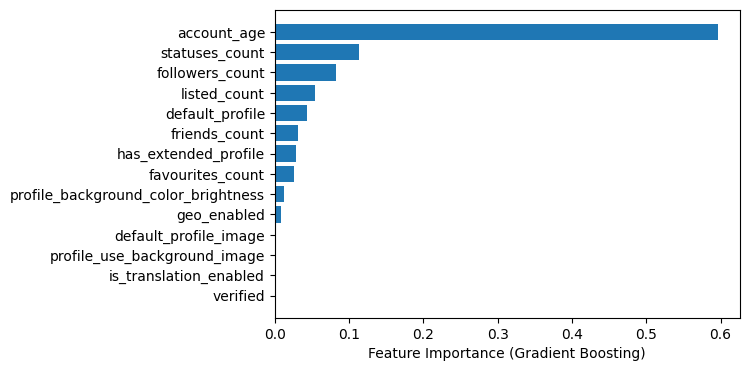

In [ ]:
# Define best hyperparameters
best_params = {
    "n_estimators": 800,
    "learning_rate": 0.01,
    "max_depth": 3,
    "random_state": RANDOM_SEED  # Ensuring reproducibility
}

# Train Gradient Boosting model
gb_model = GradientBoostingClassifier(**best_params)
gb_model.fit(X_train, y_train)

# Extract feature importance
importances = gb_model.feature_importances_
feature_names = X_train.columns

# Sort features by importance
sorted_idx = np.argsort(importances)

# Plot
plt.figure(figsize=(6, 4))
plt.barh(range(len(sorted_idx)), importances[sorted_idx], align="center")
plt.yticks(range(len(sorted_idx)), feature_names[sorted_idx])
plt.xlabel("Feature Importance (Gradient Boosting)")
plt.show()

 99%|===================| 9289/9393 [01:49<00:01]       

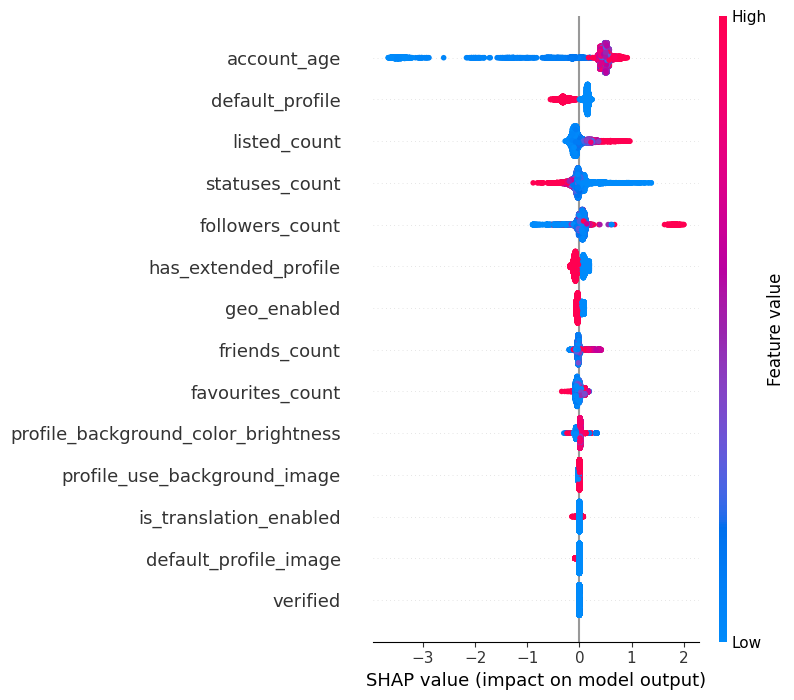

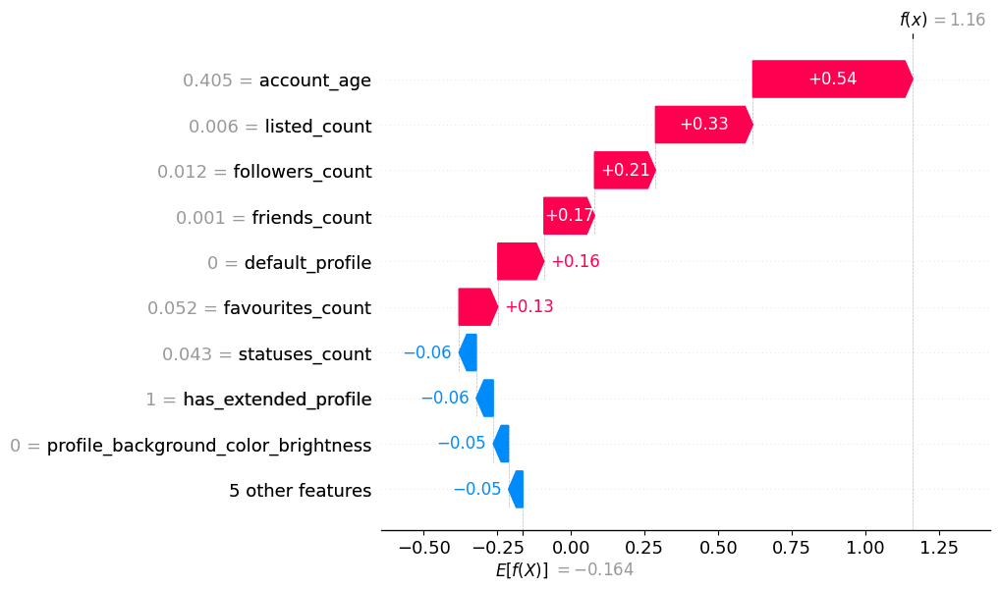

In [ ]:
import shap

# SHAP Explainer
explainer = shap.Explainer(gb_model, X_train)
shap_values = explainer(X_train)

# Summary plot (Global Importance)
shap.summary_plot(shap_values, X_train)

# Waterfall plot (Local Importance for one sample)
shap.waterfall_plot(shap_values[0])

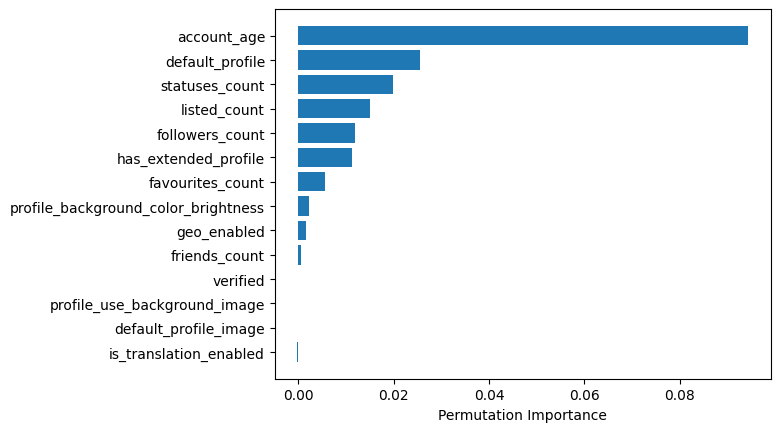

In [ ]:
from sklearn.inspection import permutation_importance

# Compute permutation importance
result = permutation_importance(gb_model, X_test, y_test, n_repeats=10, random_state=42)

# Sort and visualize
sorted_idx = result.importances_mean.argsort()
plt.barh(range(len(sorted_idx)), result.importances_mean[sorted_idx])
plt.yticks(range(len(sorted_idx)), X_train.columns[sorted_idx])
plt.xlabel("Permutation Importance")
plt.show()

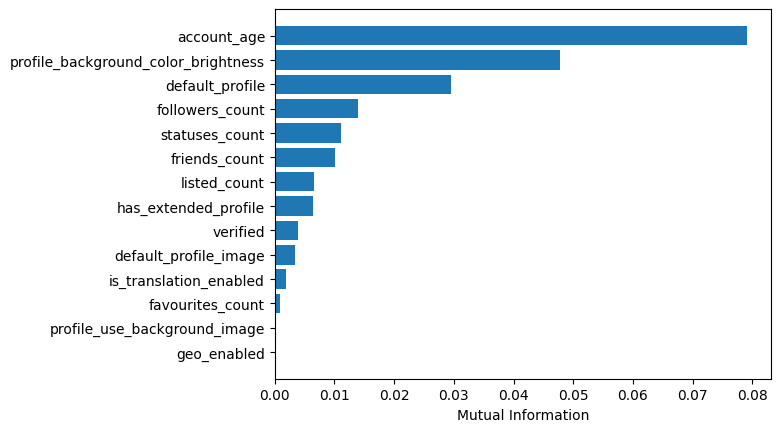

In [ ]:
from sklearn.feature_selection import mutual_info_classif

# Compute mutual information
mi = mutual_info_classif(X_train, y_train)

# Plot
plt.barh(range(len(mi)), np.sort(mi))
plt.yticks(range(len(mi)), X_train.columns[np.argsort(mi)])
plt.xlabel("Mutual Information")
plt.show()

#### Plots

In [ ]:
def plot_confusion_matrix(cm, labels, model_name, ax):
    # Create an image of the confusion matrix
    im = ax.imshow(cm, interpolation='nearest')

    # Add a colorbar to the plot
    ax.figure.colorbar(im, ax=ax)

    # Set axis labels and title
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels=labels, yticklabels=labels,
           title=f'Confusion Matrix for {model_name}',
           ylabel='True label',
           xlabel='Predicted label')

    # Add text annotations for each cell in the matrix
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, str(cm[i, j]), ha="center", va="center", color="w")

In [ ]:
def plot_confusion_matrices(cm_data, columns, rows):
    # Determine the number of models and create subplots accordingly
    num_models = len(cm_data)
    fig, axes = plt.subplots(rows, columns, figsize=(15, 10))

    # Iterate through the confusion matrix data for each model
    for i, entry in enumerate(cm_data):
        model_name = entry['Model']
        cm = entry['Matrix']
        class_labels = ['Class 0', 'Class 1']  # Replace with your actual class labels
        row = i // columns
        col = i % columns
        ax = axes[row, col]
        plot_confusion_matrix(cm, class_labels, model_name, ax)

    # Turn off empty subplots
    for i in range(len(cm_data), columns * rows):
        row = i // columns
        col = i % columns
        axes[row, col].axis('off')

    # Adjust the layout and display the subplots
    plt.tight_layout()
    plt.show()

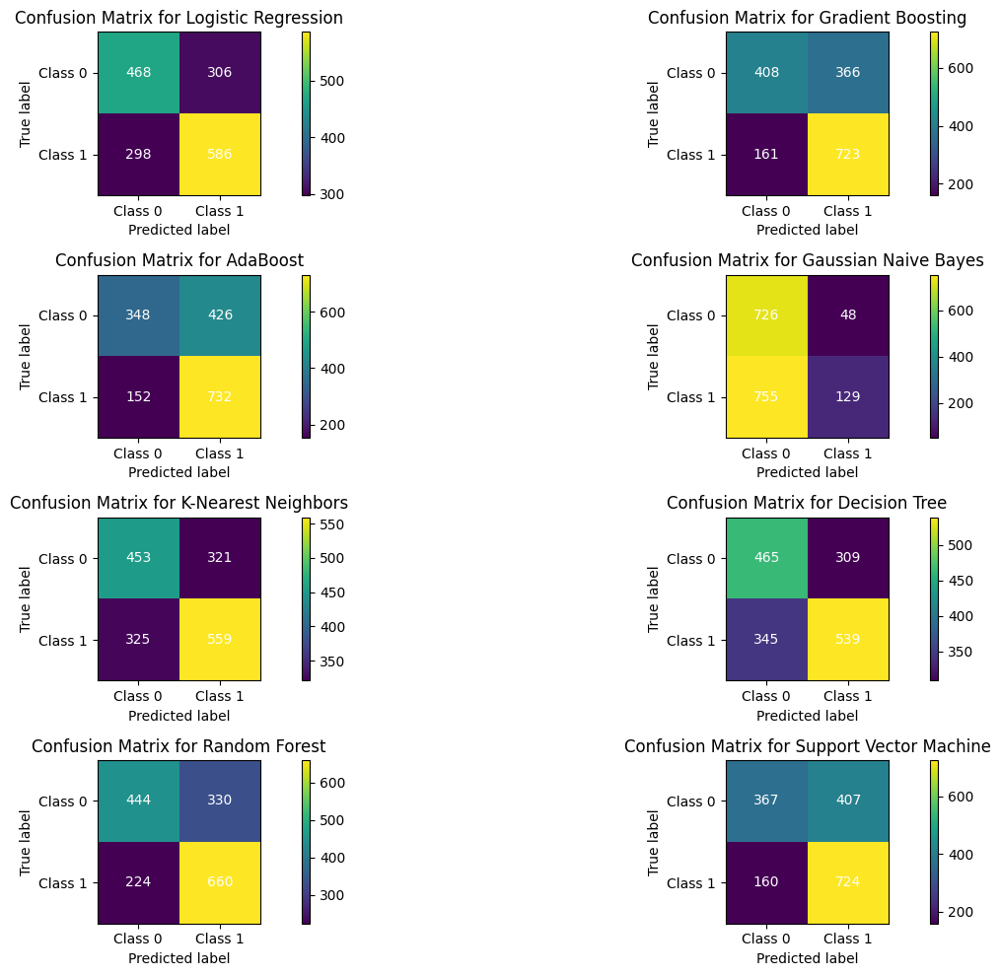

In [ ]:
plot_confusion_matrices(cm_data, columns=2, rows=4)

In [ ]:
def plot_roc_curve(roc_data):
    plt.figure(figsize=(8, 6))
    plt.title('Receiver Operating Characteristic (ROC) Curve')

    for model_data in roc_data:
        model_name = model_data['Model']
        fpr = model_data['FPR']
        tpr = model_data['TPR']
        auc = model_data['AUC']

        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Guess')  # Removed color='gray'
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

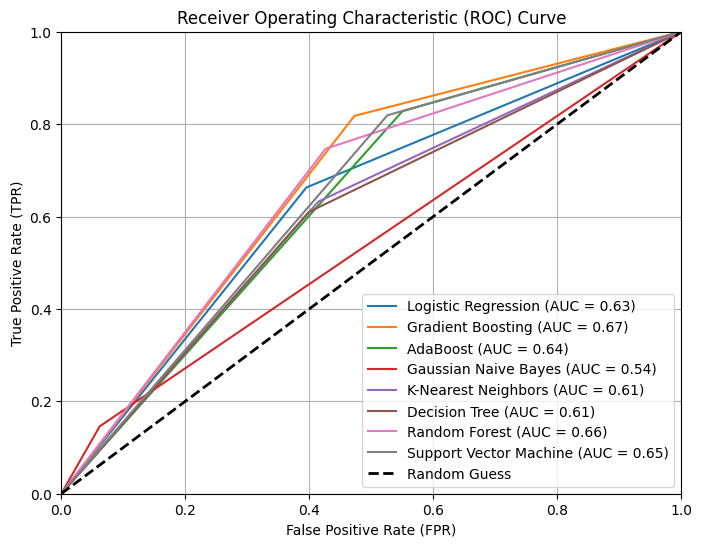

In [ ]:
plot_roc_curve(roc_data)

### Refining features choice
<h3> Best Accuracy achieved: 0.6834 </h3>
(Features Selection from insights extracted in previous runs + parameters optimization using Optuna with TPE)

In [ ]:
users = users[['id', 'followers_count', 'listed_count', 'favourites_count', 'statuses_count', 'has_extended_profile', 'default_profile', 'profile_background_color_brightness', 'account_age', 'depression']]

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.8/231.8 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 5.9 MB/s eta 0:00:00


In [ ]:
import optuna

# Fixing the random seed for reproducibility
RANDOM_SEED = 42

# Separate features (X) and target (y)
def prepare_data(data):
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]
    return train_test_split(X, y, stratify=y, test_size=0.15, random_state=RANDOM_SEED)

# Define the objective function for Optuna
def objective(trial, model_name, X_train, y_train, X_test, y_test):
    if model_name == "GradientBoosting":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.3, log=True),
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = GradientBoostingClassifier(**params)

    elif model_name == "RandomForest":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "max_depth": trial.suggest_categorical("max_depth", [10, 20, 30, None]),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = RandomForestClassifier(**params)

    elif model_name == "AdaBoost":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 500, step=100),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 1.0, log=True),
            "random_state": RANDOM_SEED
        }
        model = AdaBoostClassifier(**params)

    elif model_name == "DecisionTree":
        params = {
            "criterion": trial.suggest_categorical("criterion", ["gini", "entropy"]),
            "max_depth": trial.suggest_categorical("max_depth", [5, 10, 20, 30, None]),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = DecisionTreeClassifier(**params)

    elif model_name == "SVM":
        params = {
            "C": trial.suggest_loguniform("C", 0.01, 1000),
            "kernel": trial.suggest_categorical("kernel", ["linear", "rbf"]),
            "gamma": trial.suggest_categorical("gamma", ["scale", "auto", 0.001, 0.01, 0.1, 1]),
            "random_state": RANDOM_SEED
        }
        model = SVC(**params, probability=True)

    # Train the model
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)

    # Compute accuracy as objective metric
    return accuracy_score(y_test, predictions)

# Run Bayesian Optimization for each model
def optimize_models(data, n_trials=30):
    X_train, X_test, y_train, y_test = prepare_data(data)

    models = ["GradientBoosting", "RandomForest", "AdaBoost", "DecisionTree", "SVM"]
    best_results = []

    for model_name in tqdm(models):
        print(f"\nOptimizing {model_name}...")

        study = optuna.create_study(direction="maximize")
        study.optimize(lambda trial: objective(trial, model_name, X_train, y_train, X_test, y_test), n_trials=n_trials)

        print(f"Best Params for {model_name}: {study.best_params}\nBest Accuracy: {study.best_value:.4f}")

        best_results.append({
            "Model": model_name,
            "Best Params": study.best_params,
            "Best Accuracy": study.best_value
        })

    return pd.DataFrame(best_results)

In [ ]:
# Separate features (X) and target (y)
def prepare_data(data):
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]
    return train_test_split(X, y, stratify=y, test_size=0.15, random_state=RANDOM_SEED)

# Run the optimization
optimized_results = optimize_models(users, n_trials=70)

  0%|          | 0/5 [00:00<?, ?it/s][I 2025-03-12 12:18:25,491] A new study created in memory with name: no-name-73613d74-e9ad-4ed8-80b8-12af1584923c



Optimizing GradientBoosting...


[I 2025-03-12 12:18:29,772] Trial 0 finished with value: 0.6525934861278649 and parameters: {'n_estimators': 100, 'learning_rate': 0.003660243754314708, 'max_depth': 5, 'subsample': 0.6686832650806444, 'min_samples_split': 9, 'min_samples_leaf': 2}. Best is trial 0 with value: 0.6525934861278649.
[I 2025-03-12 12:19:42,897] Trial 1 finished with value: 0.6682750301568154 and parameters: {'n_estimators': 800, 'learning_rate': 0.014361787897555786, 'max_depth': 7, 'subsample': 0.8963639180626116, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 1 with value: 0.6682750301568154.
[I 2025-03-12 12:20:04,981] Trial 2 finished with value: 0.6646562123039808 and parameters: {'n_estimators': 800, 'learning_rate': 0.05779103308500945, 'max_depth': 4, 'subsample': 0.932359554377971, 'min_samples_split': 10, 'min_samples_leaf': 5}. Best is trial 1 with value: 0.6682750301568154.
[I 2025-03-12 12:20:34,241] Trial 3 finished with value: 0.6718938480096501 and parameters: {'n_estimators'

Best Params for GradientBoosting: {'n_estimators': 200, 'learning_rate': 0.04292328360731279, 'max_depth': 3, 'subsample': 0.8559460764227613, 'min_samples_split': 6, 'min_samples_leaf': 1}
Best Accuracy: 0.6834

Optimizing RandomForest...


[I 2025-03-12 12:31:51,339] Trial 0 finished with value: 0.6670687575392038 and parameters: {'n_estimators': 400, 'max_depth': 30, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.6670687575392038.
[I 2025-03-12 12:32:01,918] Trial 1 finished with value: 0.6767189384800965 and parameters: {'n_estimators': 700, 'max_depth': 10, 'min_samples_split': 7, 'min_samples_leaf': 1}. Best is trial 1 with value: 0.6767189384800965.
[I 2025-03-12 12:32:07,256] Trial 2 finished with value: 0.6749095295536791 and parameters: {'n_estimators': 400, 'max_depth': 10, 'min_samples_split': 3, 'min_samples_leaf': 4}. Best is trial 1 with value: 0.6767189384800965.
[I 2025-03-12 12:32:29,587] Trial 3 finished with value: 0.669481302774427 and parameters: {'n_estimators': 1000, 'max_depth': 20, 'min_samples_split': 9, 'min_samples_leaf': 3}. Best is trial 1 with value: 0.6767189384800965.
[I 2025-03-12 12:32:37,694] Trial 4 finished with value: 0.6634499396863691 and parameters: 

Best Params for RandomForest: {'n_estimators': 500, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 1}
Best Accuracy: 0.6815

Optimizing AdaBoost...


[I 2025-03-12 12:42:35,102] Trial 0 finished with value: 0.6592279855247286 and parameters: {'n_estimators': 500, 'learning_rate': 0.6521797315727202}. Best is trial 0 with value: 0.6592279855247286.
[I 2025-03-12 12:42:41,370] Trial 1 finished with value: 0.6369119420989143 and parameters: {'n_estimators': 500, 'learning_rate': 0.04038052406658868}. Best is trial 0 with value: 0.6592279855247286.
[I 2025-03-12 12:42:43,714] Trial 2 finished with value: 0.6369119420989143 and parameters: {'n_estimators': 200, 'learning_rate': 0.03938362248782386}. Best is trial 0 with value: 0.6592279855247286.
[I 2025-03-12 12:42:47,945] Trial 3 finished with value: 0.6369119420989143 and parameters: {'n_estimators': 400, 'learning_rate': 0.01265750696046762}. Best is trial 0 with value: 0.6592279855247286.
[I 2025-03-12 12:42:49,007] Trial 4 finished with value: 0.6369119420989143 and parameters: {'n_estimators': 100, 'learning_rate': 0.07202886392954426}. Best is trial 0 with value: 0.65922798552472

Best Params for AdaBoost: {'n_estimators': 500, 'learning_rate': 0.996822176901094}
Best Accuracy: 0.6785

Optimizing DecisionTree...


[I 2025-03-12 12:48:08,342] Trial 1 finished with value: 0.5892641737032569 and parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 7, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.5910735826296744.
[I 2025-03-12 12:48:08,442] Trial 2 finished with value: 0.6073582629674307 and parameters: {'criterion': 'gini', 'max_depth': 30, 'min_samples_split': 7, 'min_samples_leaf': 4}. Best is trial 2 with value: 0.6073582629674307.
[I 2025-03-12 12:48:08,562] Trial 3 finished with value: 0.5910735826296744 and parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 10, 'min_samples_leaf': 5}. Best is trial 2 with value: 0.6073582629674307.
[I 2025-03-12 12:48:08,673] Trial 4 finished with value: 0.6079613992762364 and parameters: {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 6, 'min_samples_leaf': 4}. Best is trial 4 with value: 0.6079613992762364.
[I 2025-03-12 12:48:08,793] Trial 5 finished with value: 0.594692400482509 and 

Best Params for DecisionTree: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 3}
Best Accuracy: 0.6544

Optimizing SVM...


[I 2025-03-12 12:48:42,023] Trial 0 finished with value: 0.6145958986731002 and parameters: {'C': 0.02579099724939115, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 0 with value: 0.6145958986731002.
<ipython-input-51-cf019209181b>:56: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-03-12 12:49:10,497] Trial 1 finished with value: 0.6652593486127865 and parameters: {'C': 1.1087608088290748, 'kernel': 'rbf', 'gamma': 1}. Best is trial 1 with value: 0.6652593486127865.
<ipython-input-51-cf019209181b>:56: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-03-12 12:49:44,428] Trial 2 finished with value: 0.6109770808202654 and parameters: {'C': 227.5567105156162

In [ ]:
"""
GradientBoosting: {'n_estimators': 200, 'learning_rate': 0.04292328360731279, 'max_depth': 3, 'subsample': 0.8559460764227613, 'min_samples_split': 6, 'min_samples_leaf': 1}
RandomForest: {'n_estimators': 500, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 1}
AdaBoost: {'n_estimators': 500, 'learning_rate': 0.996822176901094}
DecisionTree: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 3}
SVM: {'C': 10.030070750656739, 'kernel': 'rbf', 'gamma': 'auto'}
"""

### Ensemble Learning for performance boosting
<h3> Best Accuracy achieved: 0.6899879 </h3>

In [ ]:
# Split the dataset into training and testing sets
X = users.drop(["id", "depression"], axis=1)
y = users["depression"]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.15, random_state=42)

In [ ]:
# Define models with optimal hyperparameters
gb_model = GradientBoostingClassifier(n_estimators=800, learning_rate=0.01, max_depth=3, random_state=42)
rf_model = RandomForestClassifier(n_estimators=300, max_depth=30, min_samples_leaf= 1, min_samples_split=10, random_state=42)
adab_model = AdaBoostClassifier(learning_rate=1.0, n_estimators=500, random_state=42)

logreg_model = LogisticRegression(C=0.1, penalty='l1', solver='liblinear', random_state=42)

In [ ]:
# Voting Classifier (Ensemble)
voting_clf = VotingClassifier(estimators=[
    ('gb', gb_model),
    ('rf', rf_model),
    ('adab', adab_model)
], voting='soft')  # 'soft' averages probabilities; 'hard' takes majority vote

# Fit and evaluate
voting_clf.fit(X_train, y_train)
voting_preds = voting_clf.predict(X_test)

In [ ]:
# Stacking Classifier
stacking_clf = StackingClassifier(estimators=[
    ('gb', gb_model),
    ('rf', rf_model),
    ('adab', adab_model)
], final_estimator=logreg_model, passthrough=True)  # passthrough=True allows raw features + meta-model

# Fit and evaluate
stacking_clf.fit(X_train, y_train)
stacking_preds = stacking_clf.predict(X_test)

In [ ]:
print("Voting Classifier Accuracy:", accuracy_score(y_test, voting_preds))
print("Stacking Classifier Accuracy:", accuracy_score(y_test, stacking_preds))

Voting Classifier Accuracy: 0.6815440289505428
Stacking Classifier Accuracy: 0.6899879372738239


## Using features extracted from 2 datasets: Users and Users’ Tweet Timelines. Best_Accuracy=0.9695

*   Users:
    *   Profile Metadata
*   Users’ Tweet Timelines:
    *   Engagement Patterns
    *   Interaction Patterns
    *   Posting Behaviors



### Classification with users and timeline data merged

In [ ]:
# Fixing the random seed for reproducibility
RANDOM_SEED = 42

# Separate features (X) and target (y)
def prepare_data(data):
    X = data.drop(["id", "text", "depression"], axis=1)
    y = data["depression"]
    return train_test_split(X, y, stratify=y, test_size=0.15, random_state=RANDOM_SEED)

# Define the objective function for Optuna
def objective(trial, model_name, X_train, y_train, X_test, y_test):
    if model_name == "GradientBoosting":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.3, log=True),
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = GradientBoostingClassifier(**params)

    elif model_name == "RandomForest":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "max_depth": trial.suggest_categorical("max_depth", [10, 20, 30, None]),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = RandomForestClassifier(**params)

    elif model_name == "AdaBoost":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 500, step=100),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 1.0, log=True),
            "random_state": RANDOM_SEED
        }
        model = AdaBoostClassifier(**params)

    elif model_name == "DecisionTree":
        params = {
            "criterion": trial.suggest_categorical("criterion", ["gini", "entropy"]),
            "max_depth": trial.suggest_categorical("max_depth", [5, 10, 20, 30, None]),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = DecisionTreeClassifier(**params)

    elif model_name == "SVM":
        params = {
            "C": trial.suggest_loguniform("C", 0.01, 1000),
            "kernel": trial.suggest_categorical("kernel", ["linear", "rbf"]),
            "gamma": trial.suggest_categorical("gamma", ["scale", "auto", 0.001, 0.01, 0.1, 1]),
            "random_state": RANDOM_SEED
        }
        model = SVC(**params)

    # Train the model
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)

    # Compute accuracy as objective metric
    return accuracy_score(y_test, predictions)

# Run Bayesian Optimization for each model
def optimize_models(data, n_trials=30):
    X_train, X_test, y_train, y_test = prepare_data(data)

    models = ["SVM", "GradientBoosting", "RandomForest", "AdaBoost", "DecisionTree"]
    best_results = []

    for model_name in tqdm(models):
        print(f"\nOptimizing {model_name}...")

        study = optuna.create_study(direction="maximize")
        study.optimize(lambda trial: objective(trial, model_name, X_train, y_train, X_test, y_test), n_trials=n_trials)

        print(f"Best Params for {model_name}: {study.best_params}\nBest Accuracy: {study.best_value:.4f}")

        best_results.append({
            "Model": model_name,
            "Best Params": study.best_params,
            "Best Accuracy": study.best_value
        })

    return pd.DataFrame(best_results)

In [ ]:
# Run the optimization
optimized_results = optimize_models(merged_df, n_trials=70)

  0%|          | 0/5 [00:00<?, ?it/s][I 2025-03-15 12:36:48,626] A new study created in memory with name: no-name-0d0dfdd5-9891-4837-9f27-59c723aaf272
<ipython-input-94-bd7227e7361a>:56: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.




Optimizing SVM...


[I 2025-03-15 12:36:49,350] Trial 0 finished with value: 0.8552380952380952 and parameters: {'C': 119.49210431347664, 'kernel': 'rbf', 'gamma': 0.001}. Best is trial 0 with value: 0.8552380952380952.
<ipython-input-94-bd7227e7361a>:56: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-03-15 12:36:50,067] Trial 1 finished with value: 0.7180952380952381 and parameters: {'C': 0.029956877633044596, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 0 with value: 0.8552380952380952.
<ipython-input-94-bd7227e7361a>:56: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-03-15 12:36:54,992] Trial 2 finished with value: 0.8819047619047619 and parameters: {'C': 37.4125251475

Best Params for SVM: {'C': 982.166326822596, 'kernel': 'linear', 'gamma': 1}
Best Accuracy: 0.9257

Optimizing GradientBoosting...


[I 2025-03-15 13:38:12,942] Trial 0 finished with value: 0.9466666666666667 and parameters: {'n_estimators': 700, 'learning_rate': 0.00494356009625998, 'max_depth': 5, 'subsample': 0.5673578922764849, 'min_samples_split': 8, 'min_samples_leaf': 2}. Best is trial 0 with value: 0.9466666666666667.
[I 2025-03-15 13:38:14,684] Trial 1 finished with value: 0.9257142857142857 and parameters: {'n_estimators': 100, 'learning_rate': 0.006571559204090027, 'max_depth': 4, 'subsample': 0.8594625300850405, 'min_samples_split': 4, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.9466666666666667.
[I 2025-03-15 13:38:16,159] Trial 2 finished with value: 0.7180952380952381 and parameters: {'n_estimators': 100, 'learning_rate': 0.0031483528100867456, 'max_depth': 3, 'subsample': 0.9533970359761283, 'min_samples_split': 10, 'min_samples_leaf': 2}. Best is trial 0 with value: 0.9466666666666667.
[I 2025-03-15 13:38:40,908] Trial 3 finished with value: 0.9485714285714286 and parameters: {'n_estimator

Best Params for GradientBoosting: {'n_estimators': 300, 'learning_rate': 0.030237684432149612, 'max_depth': 8, 'subsample': 0.5023952436005634, 'min_samples_split': 6, 'min_samples_leaf': 5}
Best Accuracy: 0.9695

Optimizing RandomForest...


[I 2025-03-15 13:54:04,741] Trial 0 finished with value: 0.9466666666666667 and parameters: {'n_estimators': 800, 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.9466666666666667.
[I 2025-03-15 13:54:11,251] Trial 1 finished with value: 0.9504761904761905 and parameters: {'n_estimators': 900, 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 4}. Best is trial 1 with value: 0.9504761904761905.
[I 2025-03-15 13:54:15,480] Trial 2 finished with value: 0.9542857142857143 and parameters: {'n_estimators': 600, 'max_depth': 30, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 2 with value: 0.9542857142857143.
[I 2025-03-15 13:54:17,998] Trial 3 finished with value: 0.9485714285714286 and parameters: {'n_estimators': 300, 'max_depth': 10, 'min_samples_split': 6, 'min_samples_leaf': 5}. Best is trial 2 with value: 0.9542857142857143.
[I 2025-03-15 13:54:21,919] Trial 4 finished with value: 0.9523809523809523 and parameters: 

Best Params for RandomForest: {'n_estimators': 200, 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 1}
Best Accuracy: 0.9600

Optimizing AdaBoost...


[I 2025-03-15 13:56:58,678] Trial 0 finished with value: 0.96 and parameters: {'n_estimators': 400, 'learning_rate': 0.6888795204299359}. Best is trial 0 with value: 0.96.
[I 2025-03-15 13:57:01,838] Trial 1 finished with value: 0.9371428571428572 and parameters: {'n_estimators': 400, 'learning_rate': 0.025739726011005402}. Best is trial 0 with value: 0.96.
[I 2025-03-15 13:57:05,019] Trial 2 finished with value: 0.9542857142857143 and parameters: {'n_estimators': 300, 'learning_rate': 0.9633688916517074}. Best is trial 0 with value: 0.96.
[I 2025-03-15 13:57:06,620] Trial 3 finished with value: 0.9466666666666667 and parameters: {'n_estimators': 200, 'learning_rate': 0.1484139577927767}. Best is trial 0 with value: 0.96.
[I 2025-03-15 13:57:10,387] Trial 4 finished with value: 0.9447619047619048 and parameters: {'n_estimators': 500, 'learning_rate': 0.06079870791517121}. Best is trial 0 with value: 0.96.
[I 2025-03-15 13:57:11,900] Trial 5 finished with value: 0.9485714285714286 and p

Best Params for AdaBoost: {'n_estimators': 500, 'learning_rate': 0.4829447118472919}
Best Accuracy: 0.9638

Optimizing DecisionTree...


[I 2025-03-15 14:00:39,152] Trial 5 finished with value: 0.9238095238095239 and parameters: {'criterion': 'gini', 'max_depth': 30, 'min_samples_split': 10, 'min_samples_leaf': 1}. Best is trial 4 with value: 0.939047619047619.
[I 2025-03-15 14:00:39,194] Trial 6 finished with value: 0.9123809523809524 and parameters: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_split': 9, 'min_samples_leaf': 4}. Best is trial 4 with value: 0.939047619047619.
[I 2025-03-15 14:00:39,231] Trial 7 finished with value: 0.9352380952380952 and parameters: {'criterion': 'gini', 'max_depth': 30, 'min_samples_split': 2, 'min_samples_leaf': 4}. Best is trial 4 with value: 0.939047619047619.
[I 2025-03-15 14:00:39,272] Trial 8 finished with value: 0.9219047619047619 and parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 8, 'min_samples_leaf': 2}. Best is trial 4 with value: 0.939047619047619.
[I 2025-03-15 14:00:39,309] Trial 9 finished with value: 0.9333333333333333 and paramet

Best Params for DecisionTree: {'criterion': 'gini', 'max_depth': 20, 'min_samples_split': 9, 'min_samples_leaf': 4}
Best Accuracy: 0.9390


In [ ]:
optimized_results.sort_values('Best Accuracy', ascending=False)

,Model,Best Params,Best Accuracy
1,GradientBoosting,"{'n_estimators': 300, 'learning_rate': 0.03023...",0.969524
3,AdaBoost,"{'n_estimators': 500, 'learning_rate': 0.48294...",0.963810
2,RandomForest,"{'n_estimators': 200, 'max_depth': 20, 'min_sa...",0.960000
4,DecisionTree,"{'criterion': 'gini', 'max_depth': 20, 'min_sa...",0.939048
0,SVM,"{'C': 982.166326822596, 'kernel': 'linear', 'g...",0.925714


# NLP Analysis: Extracting meaningful patterns which will potentially boost accuracy when combined with existing numerical features (Profiles' Descriptions)

Objective: Instead of relying only on numerical user metadata, we introduce textual indicators that may strongly correlate with depression (e.g., words indicating isolation, hopelessness, or exhaustion). <br>

How It Helps:
*   Helps explain why some users are classified as depressed.
*   Reduces noise in classification models by adding interpretable signals.
*   Potentially boosts accuracy when combined with existing numerical features.

<h4>Topic Modeling & Semantic Understanding </h4>
Goal: Extract underlying themes from profile descriptions to identify depressive tendencies. </br>

<h4>TF-IDF: Term Frequency-Inverse Document Frequency </h4>
(Weighs words based on their importance in a document relative to their frequency across the entire dataset: Helps focus on depression-indicating terms while reducing the impact of frequent but irrelevant words.)

### Data Cleaning

In [ ]:
df_final

,user_id,total_retweets,total_favorites,avg_retweets,avg_favorites,tweet_count,mean_time_gap,median_time_gap,std_time_gap,tweet_rate,text,unique_interactions,interactions_with_depressed,total_interactions,interactions_with_non_depressed,unique_sources,total_quotes_x,quote_ratio,total_quotes_y,depression
0,11913,2.307891e-03,0.000454,5.548583e-04,0.000224,0.098698,0.000730,0.000037,0.001851,0.003418,"I know, my heart is aching for her.... https:/...",0.024516,1254,0.000514,0,0.142857,0.849372,0.916461,0.0,1
1,823654,2.766335e-03,0.000079,5.673509e-03,0.000332,0.011361,0.010070,0.000508,0.008331,0.000252,RT @_Snape_: I prefer the Quidditch World Cup ...,0.010323,0,0.000000,0,0.285714,0.000000,0.000000,NaN,1
2,5047181,1.873109e-03,0.000109,1.493949e-03,0.000178,0.029586,0.003802,0.000070,0.003030,0.000660,"But anyway, that dress, man, wtf. it's a free ...",0.003871,0,0.000000,0,0.285714,0.004184,0.014977,0.0,1
3,5330682,2.272240e-06,0.000007,1.619490e-06,0.000010,0.033136,0.003452,0.000252,0.002044,0.000726,@rogie Lack of anything smart to respond with....,0.021935,0,0.000000,0,0.785714,0.000000,0.000000,NaN,1
4,5498352,7.835311e-08,0.000000,6.056977e-07,0.000000,0.002840,0.032985,0.001127,0.028370,0.000082,Rakitic hace mes y medio que se cansó de corre...,0.003871,0,0.000000,0,0.142857,0.000000,0.000000,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3496,819081397772107776,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000710,0.005373,0.000989,0.002557,0.000618,smol nozomi goes at didney worl Next video inc...,0.000000,0,0.000000,0,0.071429,0.000000,0.000000,NaN,0
3497,819089684626182144,0.000000e+00,0.000020,0.000000e+00,0.000075,0.012544,0.000276,0.000061,0.000303,0.009202,@JWyellowjasmine \nどんまい(笑)\n\nやっぱりWESTみると\n元気な...,0.028387,0,0.000000,0,0.071429,0.000000,0.000000,NaN,0
3498,819140914685747200,2.115534e-06,0.000135,1.436486e-06,0.000188,0.034793,0.000088,0.000018,0.000118,0.028337,bbs money money money okay this is my real g'n...,0.011613,0,0.000000,0,0.071429,0.000000,0.000000,NaN,0
3499,819430296592519168,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.005928,NaN,NaN,0.000154,hllo friends i am crazy with my friends in...,0.000000,0,0.000000,0,0.071429,0.000000,0.000000,NaN,0


In [ ]:
df_final.columns

Index(['user_id', 'total_retweets', 'total_favorites', 'avg_retweets',
       'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap',
       'std_time_gap', 'tweet_rate', 'text', 'unique_interactions',
       'interactions_with_depressed', 'total_interactions',
       'interactions_with_non_depressed', 'unique_sources', 'total_quotes_x',
       'quote_ratio', 'total_quotes_y', 'depression'],
      dtype='object')

In [ ]:
! pip install langdetect
! pip install emoji
! pip install transformers
! pip install wordsegment

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 11.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993222 sha256=3635d288d91ec1f2e9a4fbce6a1668fcce827046e7619a26eb63d1b043fa55ec
  Stored in directory: /root/.cache/pip/wheels/0a/f2/b2/e5ca405801e05eb7c8ed5b3b4bcf1fcabcd6272c167640072e
Successfully built langdetect
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.6/590.6 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 34.9 MB/s eta 0:00:00


In [ ]:
import glob
import json
import seaborn as sns
from langdetect import detect
from langdetect import DetectorFactory

import matplotlib.pyplot as plt
plt.style.use('ggplot')

from pprint import pprint

from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import re
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import TweetTokenizer, RegexpTokenizer
import nltk
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
import string
import emoji
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from transformers import AutoTokenizer
from wordsegment import load, segment

In [ ]:
# Handling Multiple Languages
def language_detection (data, column):
    # hold label - language
    languages = []

    # go through each text
    for ii in tqdm(range(0,len(data))):
        # split by space into list, take the first x intex, join with space
        text = data.iloc[ii][column].split(" ")

        lang = "en"
        try:
            if len(text) > 50:
                lang = detect(" ".join(text[:50]))
            elif len(text) > 0:
                lang = detect(" ".join(text[:len(text)]))
        # ught... beginning of the document was not in a good format
        except Exception as e:
            all_words = set(text)
            print(f'text: {text}, all_words: {all_words}')
            print('--------------------')
            try:
                lang = detect(" ".join(all_words))
            # what!! :( let's see if we can find any text in abstract...
            except Exception as e:
                print("unknown")
                print('--------------------')
                lang = "unknown"
                pass

        # get the language
        languages.append(lang)

    return languages


# Getting the data for each languages
def language_data (languages):
    languages_dict = {}
    for lang in set(languages):
        languages_dict[lang] = languages.count(lang)
    return languages_dict


def word_count(text):
    return len(str(text).split(' '))

In [ ]:
def WordCount_TargetClass (data, column, target='depression'):
    data['word_count'] = data[column].apply(word_count)
    # Compute the average word count per depression class
    variable_count = data.groupby(target)['word_count'].mean()

    # Create a single bar plot
    fig = go.Figure()
    fig.add_trace(
        go.Bar(
            x=variable_count.index,
            y=variable_count.values,
            marker_color='rgb(156, 39, 176)',
            text=variable_count.round(2),
            textposition='outside',
            width=0.2,
            marker=dict(line=dict(width=1, color='rgba(0,0,0,1)'), opacity=1)
        )
    )

    # Update layout
    fig.update_layout(
        title=f"Avg word_count vs {target}",
        height=400,
        width=400,
        plot_bgcolor='rgba(34, 34, 34, 1)',
        paper_bgcolor='rgba(34, 34, 34, 1)',
        font=dict(color='white'),
        showlegend=False
    )

    fig.show()

In [ ]:
nltk.download('omw-1.4')
nltk.download('wordnet')

lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
def vectorize(text, maxx_features, ngram_from, ngram_to, min_df=0.005, max_df=0.95):

    vectorizer = TfidfVectorizer(max_features=maxx_features, ngram_range=(ngram_from,ngram_to), min_df=min_df, max_df=max_df)
    X = vectorizer.fit_transform(text)

    count_values = X.toarray().sum(axis=0)
    vocab = vectorizer.vocabulary_
    df = pd.DataFrame(sorted([(count_values[i], k) for k, i in vocab.items()], reverse=True)
                         ).rename(columns={0: 'frequency', 1: 'ngrams'})

    return df

In [ ]:
# Contraction map
c_dict = {
    "ain't": "am not", "aren't": "are not", "can't": "cannot", "can't've": "cannot have",
    "'cause": "because", "could've": "could have", "couldn't": "could not", "couldn't've": "could not have",
    "didn't": "did not", "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hadn't've": "had not have",
    "hasn't": "has not", "haven't": "have not", "he'd": "he would", "he'd've": "he would have",
    "he'll": "he will", "he'll've": "he will have", "he's": "he is", "how'd": "how did",
    "how'd'y": "how do you", "how'll": "how will", "how's": "how is", "i'd": "I would",
    "i'd've": "I would have", "i'll": "I will", "i'll've": "I will have", "i'm": "I am",
    "i've": "I have", "isn't": "is not", "it'd": "it had", "it'd've": "it would have",
    "it'll": "it will", "it'll've": "it will have", "it's": "it is", "let's": "let us",
    "ma'am": "madam", "mayn't": "may not", "might've": "might have", "mightn't": "might not",
    "mightn't've": "might not have", "must've": "must have", "mustn't": "must not", "mustn't've": "must not have",
    "needn't": "need not", "needn't've": "need not have", "o'clock": "of the clock", "oughtn't": "ought not",
    "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have",
    "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have",
    "she's": "she is", "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have",
    "so've": "so have", "so's": "so is", "that'd": "that would", "that'd've": "that would have",
    "that's": "that is", "there'd": "there had", "there'd've": "there would have", "there's": "there is",
    "they'd": "they would", "they'd've": "they would have", "they'll": "they will", "they'll've": "they will have",
    "they're": "they are", "they've": "they have", "to've": "to have", "wasn't": "was not",
    "we'd": "we had", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have",
    "we're": "we are", "we've": "we have", "weren't": "were not", "what'll": "what will",
    "what'll've": "what will have", "what're": "what are", "what's": "what is", "what've": "what have",
    "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is",
    "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is",
    "who've": "who have", "why's": "why is", "why've": "why have", "will've": "will have", "bellletstaik": "bell let's talk",
    "won't": "will not", "won't've": "will not have", "would've": "would have", "wouldn't": "would not",
    "wouldn't've": "would not have", "y'all": "you all", "y'alls": "you alls", "y'all'd": "you all would",
    "y'all'd've": "you all would have", "y'all're": "you all are", "y'all've": "you all have", "you'd": "you had",
    "you'd've": "you would have", "you'll": "you will","you'll've": "you will have", "you're": "you are", "you've": "you have",
    "idk": "i don't know", "imo": "in my opinion", "imho": "in my humble opinion", "lmk": "let me know",
    "brb": "be right back", "gtg": "got to go", "ttyl": "talk to you later", "omg": "oh my God",
    "wtf": "what the fuck", "smh": "shaking my head", "rn": "right now", "yolo": "you only live once",
    "tbh": "to be honest", "hmu": "hit me up", "bff": "best friend forever", "fyi": "for your information",
    "btw": "by the way", "wdym": "what do you mean", "wbu": "what about you", "oop-": "oops", "bellletstalk": "bell let's talk",
    "lol": "laugh out loud", "lmao": "laughing my ass off", "lmfao": "laughing my fucking ass off", "rofl": "rolling on the floor laughing",
    "omg": "oh my god", "omfg": "oh my fucking god", "ftw": "for the win","idk": "i don’t know",
    "imo": "in my opinion", "imho": "in my humble opinion", "tbh": "to be honest", "ngl": "not gonna lie",
    "smh": "shaking my head", "icymi": "in case you missed it", "fomo": "fear of missing out", "dm": "direct message",
    "pm": "private message", "irl": "in real life", "tbt": "throwback thursday", "brb": "be right back",
    "afk": "away from keyboard", "jk": "just kidding", "idc": "i don’t care",
    "ikr": "i know, right?", "btw": "by the way", "fyi": "for your information", "tmi": "too much information",
    "bff": "best friends forever", "gg": "good game", "ggwp": "good game, well played", "hf": "have fun",
    "hbd": "happy birthday", "hbu": "how about you?", "hmu": "hit me up", "kys": "kill yourself",
    "kms": "kill myself", "nsfw": "not safe for work", "sfw": "safe for work", "smdh": "shaking my damn head",
    "stfu": "shut the fuck up", "tl;dr": "too long; didn’t read", "tt": "trending topic", "wyd": "what you doing?",
    "wya": "where you at?", "hml": "hit my line", "grwm": "get ready with me", "ootd": "outfit of the day",
    "sm": "social media", "ama": "ask me anything", "fwiw": "for what it’s worth", "imu": "i miss you",
    "ily": "i love you", "ilysm": "i love you so much", "ty": "thank you", "tysm": "thank you so much",
    "np": "no problem", "fml": "fuck my life", "bts": "behind the scenes", "slay": "doing something amazing",
    "no cap": "not lying", "sus": "suspicious", "vibe check": "assessing mood/energy", "ghosting": "ignoring someone completely",
    "hard launch": "publicly announcing a relationship",
    "MDD": "major depressive disorder",
    "GAD": "generalized anxiety disorder",
    "PTSD": "post-traumatic stress disorder",
    "SAD": "seasonal affective disorder",
    "BPD": "borderline personality disorder",
    "OCD": "obsessive-compulsive disorder",
    "ADHD": "attention-deficit hyperactivity disorder",
    "ED": "eating disorder",
    "DBT": "dialectical behavior therapy",
    "CBT": "cognitive behavioral therapy",
    "SSRI": "selective serotonin reuptake inhibitor",
    "SNRI": "serotonin-norepinephrine reuptake inhibitor",
    "DSM-5": "diagnostic and statistical manual of mental disorders, fifth edition",
    "PPD": "postpartum depression",
    "ASD": "autism spectrum disorder",
    "PMDD": "premenstrual dysphoric disorder",
    "SI": "suicidal ideation",
    "SH": "self-harm",
    "MH": "mental health",
    "mdd": "major depressive disorder",
    "gad": "generalized anxiety disorder",
    "ptsd": "post-traumatic stress disorder",
    "sad": "seasonal affective disorder",
    "bpd": "borderline personality disorder",
    "ocd": "obsessive-compulsive disorder",
    "adhd": "attention-deficit hyperactivity disorder",
    "ed": "eating disorder",
    "dbt": "dialectical behavior therapy",
    "cbt": "cognitive behavioral therapy",
    "ssri": "selective serotonin reuptake inhibitor",
    "snri": "serotonin-norepinephrine reuptake inhibitor",
    "dsm-5": "diagnostic and statistical manual of mental disorders, fifth edition",
    "ppd": "postpartum depression",
    "asd": "autism spectrum disorder",
    "pmdd": "premenstrual dysphoric disorder",
    "si": "suicidal ideation",
    "sh": "self-harm",
    "mh": "mental health"
}

# Compiling the contraction dict
c_re = re.compile('(%s)' % '|'.join(c_dict.keys()))

# List of stop words
add_stop = ['said', 'say', '...', 'like', 'cnn', 'ad','et','al','et.','al.']

"""
stop_words = ENGLISH_STOP_WORDS.union(add_stop)
custom_stop_words = [
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure',
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.',
    'al.', 'Elsevier', 'PMC', 'CZI', 'www', 'http', 'No.' , 'no.', 'et.', 'al.',
    'rt', 'wa', 'doe', 'xx', 'th', 'la', 'nd', 'ur', 'im', 'dm', 'hi', 'ha', 'haha',
    'oh', 'htt', 'ht', 'xd', 'ya', 'll', 'ok', 'okk', 'okkk', 'blah'
]
for w in custom_stop_words:
    if w not in stop_words:
        stop_words.union(w)
"""

# **Stop words list**
default_stop_words = set(ENGLISH_STOP_WORDS.union(add_stop))  # Convert frozenset to normal set
custom_stop_words = {
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure',
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.',
    'al.', 'Elsevier', 'PMC', 'CZI', 'www', 'http', 'No.' , 'no.', 'et.', 'al.',
    'rt', 'wa', 'doe', 'xx', 'th', 'la', 'nd', 'ur', 'im', 'dm', 'hi', 'ha', 'haha',
    'oh', 'htt', 'ht', 'xd', 'ya', 'll', 'ok', 'okk', 'okkk', 'blah',
    'rt', 'dm', 'idk', 'omg', 'lol', 'lmao', 'rofl', 'smh', 'btw', 'brb', 'gtg', 'tbh',
    'imo', 'imho', 'fyi', 'nvm', 'ya', "y'all", 'ok', 'okay', 'u', 'ur', 'imma', 'yolo', 'thx',
    'ty', 'tyvm', 'pls', 'plz', 'cuz', 'dunno', 'prolly', 'sry', 'ttyl', 'sup', 'wbu', 'wyd',
    'wdym', 'wth', 'wtf', 'bday', 'rn', 'asap', 'gr8', 'haha', 'hehe', 'xd', 'lmfao', 'hmu', 'oop',
    'oop-', 'lol', 'omg', 'yes', 'yeah', 'yea', 'ugh', 'nigga', 'hey', 'af', 'hahaha', 'bc', 'tho',
    'yo', 'yep', 'yup', 'st', 'yay', 'lil', 'hoe', 'si', 'cuz', 'nah', 'em', 'mr', 'ah',
    'tf', 'yall', 'da', 'aw', 'xxx', 'ft', 'uh', 'um', 'egg', 'ed', 'eh', 'mm', 'yuo', 'ik'
}


# Ensure all stop words are lowercase
stop_words = default_stop_words.union(custom_stop_words)

punc = list(set(string.punctuation))

def casual_tokenizer(text):
    tokenizer = TweetTokenizer()
    tokens = tokenizer.tokenize(text)
    return tokens


def expandContractions(text, c_re=c_re):
    def replace(match):
        return c_dict[match.group(0)]
    return c_re.sub(replace, text)


# Load tokenizer
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
# Function to tokenize hashtag
def split_hashtag_bert(hashtag):
    tokens = tokenizer.tokenize(hashtag.lstrip("#"))
    return " ".join(tokens)


# Load word corpus
load()
# Split hashtag-like words into separate words
def split_hashtag(hashtag):
    return segment(hashtag.lstrip("#"))  # Return a list of words instead of a string


def process_text(text):
    text = casual_tokenizer(text)
    text = [each.lower() for each in text]
    #text = [emoji.replace_emoji(each, replace="") for each in text]  # Remove emojis
    #text = [split_hashtag(each) for each in text]  # Split hashtags only
    text = [word for each in text for word in (each if isinstance(each, list) else [each])]  # Flatten list
    text = [each.strip() for each in text]
    text = [re.sub(r'http[s]?://\S+', '', each) for each in text]   # Remove URLs
    text = [re.sub(r'@\w+', '', each) for each in text]             # Remove mentions (@usernames)
    text = [re.sub(r'#', '', each) for each in text]                # Remove remaining hashtags
    text = [re.sub('[0-9]+', '', each) for each in text]
    text = [expandContractions(each, c_re=c_re) for each in text]
    text = [lemmatizer.lemmatize(each) for each in text]
    text = [w for w in text if w not in punc]
    text = [w for w in text if w not in stop_words]
    text = [each for each in text if len(each) > 1]
    return text

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

#### Timeline Data (Users' Tweets)

In [ ]:
df_final["text"] = df_final["text"].astype(str).fillna("")
df_final["text"] = df_final["text"].replace("", "unknown")

languages = language_detection (df_final, "text")

print("Total: {}\n".format(len(languages)))

languages_dict = language_data (languages)
pprint(languages_dict)

  0%|          | 278/1003492 [00:04<2:15:35, 123.32it/s]

text: ['2015', '💥🌟'], all_words: {'💥🌟', '2015'}
--------------------
unknown
--------------------
text: ['https://t.co/SiLFkz2OOy'], all_words: {'https://t.co/SiLFkz2OOy'}
--------------------
unknown
--------------------


  0%|          | 317/1003492 [00:04<2:37:04, 106.45it/s]

text: ['http://t.co/HsVthtogqR'], all_words: {'http://t.co/HsVthtogqR'}
--------------------
unknown
--------------------
text: ['https://t.co/Mx8NhSvZ0j'], all_words: {'https://t.co/Mx8NhSvZ0j'}
--------------------
unknown
--------------------


  0%|          | 423/1003492 [00:05<2:18:19, 120.86it/s]

text: ['https://t.co/WRmIWV5omD'], all_words: {'https://t.co/WRmIWV5omD'}
--------------------
unknown
--------------------


  0%|          | 436/1003492 [00:05<2:22:49, 117.05it/s]

text: ['https://t.co/WsQmqTT9Cf'], all_words: {'https://t.co/WsQmqTT9Cf'}
--------------------
unknown
--------------------


  0%|          | 812/1003492 [00:15<2:34:35, 108.10it/s]

text: ['http://t.co/Tq3I9k8sDB'], all_words: {'http://t.co/Tq3I9k8sDB'}
--------------------
unknown
--------------------


  0%|          | 921/1003492 [00:16<2:10:01, 128.52it/s]

text: ['😰'], all_words: {'😰'}
--------------------
unknown
--------------------


  0%|          | 966/1003492 [00:16<2:16:03, 122.80it/s]

text: ['ｹﾞｯﾁｭ'], all_words: {'ｹﾞｯﾁｭ'}
--------------------
unknown
--------------------


  0%|          | 1201/1003492 [00:19<3:30:15, 79.45it/s]

text: ['🐽🐽🐽'], all_words: {'🐽🐽🐽'}
--------------------
unknown
--------------------


  0%|          | 1325/1003492 [00:20<2:14:09, 124.51it/s]

text: ['7'], all_words: {'7'}
--------------------
unknown
--------------------


  0%|          | 1362/1003492 [00:21<1:53:15, 147.47it/s]

text: ['http://t.co/ZSnVPpXaft'], all_words: {'http://t.co/ZSnVPpXaft'}
--------------------
unknown
--------------------


  0%|          | 1470/1003492 [00:22<2:17:13, 121.70it/s]

text: ['https://t.co/z1opAdOz7h'], all_words: {'https://t.co/z1opAdOz7h'}
--------------------
unknown
--------------------


  0%|          | 2206/1003492 [00:30<3:29:47, 79.54it/s]

text: ['https://t.co/VoHRggKLyf'], all_words: {'https://t.co/VoHRggKLyf'}
--------------------
unknown
--------------------


  0%|          | 2247/1003492 [00:31<4:25:23, 62.88it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


  0%|          | 2529/1003492 [00:35<4:33:31, 60.99it/s]

text: ['😘', 'https://t.co/M5lZ13YrGZ'], all_words: {'https://t.co/M5lZ13YrGZ', '😘'}
--------------------
unknown
--------------------


  0%|          | 2553/1003492 [00:35<4:13:36, 65.78it/s]

text: ['http://t.co/ZAo1MIM3'], all_words: {'http://t.co/ZAo1MIM3'}
--------------------
unknown
--------------------
text: ['https://t.co/Zq3RvtcSlh'], all_words: {'https://t.co/Zq3RvtcSlh'}
--------------------
unknown
--------------------


  0%|          | 2817/1003492 [00:40<4:51:08, 57.29it/s]

text: ['https://t.co/aiGK0tYYm9'], all_words: {'https://t.co/aiGK0tYYm9'}
--------------------
unknown
--------------------


  0%|          | 2846/1003492 [00:41<4:38:00, 59.99it/s]

text: ['33.3%'], all_words: {'33.3%'}
--------------------
unknown
--------------------
text: ['http://t.co/03XuY4DMnR'], all_words: {'http://t.co/03XuY4DMnR'}
--------------------
unknown
--------------------


  0%|          | 2870/1003492 [00:41<4:10:34, 66.56it/s]

text: ['🖤🖤🖤'], all_words: {'🖤🖤🖤'}
--------------------
unknown
--------------------
text: ['https://t.co/iNOYn7kadn'], all_words: {'https://t.co/iNOYn7kadn'}
--------------------
unknown
--------------------


  0%|          | 2924/1003492 [00:42<4:49:44, 57.56it/s]

text: ['😔/😆/🤔/😒'], all_words: {'😔/😆/🤔/😒'}
--------------------
unknown
--------------------


  0%|          | 2995/1003492 [00:43<3:49:24, 72.69it/s]

text: ['http://t.co/ljrFrNsx9c'], all_words: {'http://t.co/ljrFrNsx9c'}
--------------------
unknown
--------------------


  0%|          | 3091/1003492 [00:44<2:50:13, 97.95it/s]

text: ['http://t.co/2wLMiQx8'], all_words: {'http://t.co/2wLMiQx8'}
--------------------
unknown
--------------------


  0%|          | 3193/1003492 [00:45<1:29:44, 185.76it/s]

text: ['😔😩'], all_words: {'😔😩'}
--------------------
unknown
--------------------
text: ['http://t.co/w7VYeGe97i'], all_words: {'http://t.co/w7VYeGe97i'}
--------------------
unknown
--------------------
text: ['https://t.co/A9f6WcGG0e'], all_words: {'https://t.co/A9f6WcGG0e'}
--------------------
unknown
--------------------


  0%|          | 3274/1003492 [00:45<1:12:30, 229.93it/s]

text: ['...', 'http://t.co/ZBBYWnBx'], all_words: {'...', 'http://t.co/ZBBYWnBx'}
--------------------
unknown
--------------------
text: ['😤'], all_words: {'😤'}
--------------------
unknown
--------------------


  0%|          | 3529/1003492 [00:46<1:12:16, 230.59it/s]

text: ['https://t.co/L5ZEBJf4zA'], all_words: {'https://t.co/L5ZEBJf4zA'}
--------------------
unknown
--------------------
text: ['👌', 'http://t.co/fVaB8NFrYP'], all_words: {'http://t.co/fVaB8NFrYP', '👌'}
--------------------
unknown
--------------------


  0%|          | 3631/1003492 [00:46<1:08:15, 244.13it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


  0%|          | 3720/1003492 [00:47<1:01:36, 270.45it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------
text: ['https://t.co/p5VlQOmELW'], all_words: {'https://t.co/p5VlQOmELW'}
--------------------
unknown
--------------------
text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


  0%|          | 3804/1003492 [00:47<1:03:24, 262.79it/s]

text: ['https://t.co/6446nHwsix'], all_words: {'https://t.co/6446nHwsix'}
--------------------
unknown
--------------------
text: ['https://t.co/Bu5hrvxIE4'], all_words: {'https://t.co/Bu5hrvxIE4'}
--------------------
unknown
--------------------


  0%|          | 3974/1003492 [00:48<1:04:29, 258.33it/s]

text: ['https://t.co/uFsroa7Wxu'], all_words: {'https://t.co/uFsroa7Wxu'}
--------------------
unknown
--------------------
text: ['https://t.co/H2jaimziGm'], all_words: {'https://t.co/H2jaimziGm'}
--------------------
unknown
--------------------
text: ['https://t.co/0jb2joUzzu'], all_words: {'https://t.co/0jb2joUzzu'}
--------------------
unknown
--------------------


  0%|          | 4228/1003492 [00:49<1:19:08, 210.45it/s]

text: [':/', 'http://t.co/4EiVYQHrhR'], all_words: {'http://t.co/4EiVYQHrhR', ':/'}
--------------------
unknown
--------------------


  0%|          | 4436/1003492 [00:50<1:09:01, 241.23it/s]

text: ['https://t.co/20BjBCsnHN'], all_words: {'https://t.co/20BjBCsnHN'}
--------------------
unknown
--------------------


  0%|          | 4747/1003492 [00:51<1:01:24, 271.05it/s]

text: ['https://t.co/xJZKrfEH3M'], all_words: {'https://t.co/xJZKrfEH3M'}
--------------------
unknown
--------------------


  0%|          | 4957/1003492 [00:52<1:11:48, 231.75it/s]

text: ['https://t.co/5zzpTvAQAA'], all_words: {'https://t.co/5zzpTvAQAA'}
--------------------
unknown
--------------------
text: ['http://t.co/IEw4TK6xEN'], all_words: {'http://t.co/IEw4TK6xEN'}
--------------------
unknown
--------------------


  1%|          | 5060/1003492 [00:52<1:10:40, 235.47it/s]

text: ['💔💔💔💔💔💔💔💔💔💔💔💔💔', 'https://t.co/5yp6DtVVSx'], all_words: {'https://t.co/5yp6DtVVSx', '💔💔💔💔💔💔💔💔💔💔💔💔💔'}
--------------------
unknown
--------------------
text: ['😭🔫', 'https://t.co/OjKVPzxK6I'], all_words: {'https://t.co/OjKVPzxK6I', '😭🔫'}
--------------------
unknown
--------------------


  1%|          | 5227/1003492 [00:53<1:49:06, 152.49it/s]

text: ['https://t.co/nJ2bhmdGi9'], all_words: {'https://t.co/nJ2bhmdGi9'}
--------------------
unknown
--------------------


  1%|          | 5430/1003492 [00:55<1:39:29, 167.19it/s]

text: ['https://t.co/km36jzU1cK'], all_words: {'https://t.co/km36jzU1cK'}
--------------------
unknown
--------------------


  1%|          | 5529/1003492 [00:55<1:49:20, 152.13it/s]

text: ['http://t.co/aMopQzoFKI'], all_words: {'http://t.co/aMopQzoFKI'}
--------------------
unknown
--------------------


  1%|          | 5580/1003492 [00:56<1:54:19, 145.47it/s]

text: ['http://t.co/2vYiIRb7JZ'], all_words: {'http://t.co/2vYiIRb7JZ'}
--------------------
unknown
--------------------


  1%|          | 5726/1003492 [00:57<1:35:45, 173.67it/s]

text: ['💛💗💟💗💛💜💟💗💟💓💟💖💞💖💞💖💕💜💟💛💓💝💟💗💘💞💘💞💖💟💗💝💝💚💝💓💜💓💗💖💞💕💓💓💝💜💖💕💞💚💟💛💓💛💕💖💗💛💓💖💓💜💓💝💜💚💛💘💖💓💘💖💚💛💟💜💝💚💜💘💘💕💞💕💖💓💖💞💖💛💛💕💖💘💓💗💟💓💓💟💞💟💘💖💚💚💝💕💝💜💚💛💛💜💖…', 'https://t.co/5DoQQuIVEA'], all_words: {'💛💗💟💗💛💜💟💗💟💓💟💖💞💖💞💖💕💜💟💛💓💝💟💗💘💞💘💞💖💟💗💝💝💚💝💓💜💓💗💖💞💕💓💓💝💜💖💕💞💚💟💛💓💛💕💖💗💛💓💖💓💜💓💝💜💚💛💘💖💓💘💖💚💛💟💜💝💚💜💘💘💕💞💕💖💓💖💞💖💛💛💕💖💘💓💗💟💓💓💟💞💟💘💖💚💚💝💕💝💜💚💛💛💜💖…', 'https://t.co/5DoQQuIVEA'}
--------------------
unknown
--------------------


  1%|          | 5864/1003492 [00:57<1:17:02, 215.81it/s]

text: ['😍😍😍😍', 'http://t.co/rTDPhB3NaZ'], all_words: {'http://t.co/rTDPhB3NaZ', '😍😍😍😍'}
--------------------
unknown
--------------------


  1%|          | 6280/1003492 [00:59<1:11:24, 232.75it/s]

text: [':(:'], all_words: {':(:'}
--------------------
unknown
--------------------


  1%|          | 6380/1003492 [01:00<1:10:30, 235.72it/s]

text: ['😇💖'], all_words: {'😇💖'}
--------------------
unknown
--------------------
text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------


  1%|          | 6463/1003492 [01:00<1:05:26, 253.91it/s]

text: ['https://t.co/ayWPsrrRey'], all_words: {'https://t.co/ayWPsrrRey'}
--------------------
unknown
--------------------
text: ['https://t.co/oDahzoqUL1'], all_words: {'https://t.co/oDahzoqUL1'}
--------------------
unknown
--------------------
text: ['.@vine', '🙃🙃🙃', 'https://t.co/rhmytaIT1F'], all_words: {'.@vine', 'https://t.co/rhmytaIT1F', '🙃🙃🙃'}
--------------------
unknown
--------------------


  1%|          | 6564/1003492 [01:00<1:09:13, 240.04it/s]

text: ['https://t.co/lmCTTpQe4n'], all_words: {'https://t.co/lmCTTpQe4n'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/0hC8aSoiso'], all_words: {'', '📷', 'https://t.co/0hC8aSoiso'}
--------------------
unknown
--------------------


  1%|          | 6700/1003492 [01:01<1:06:35, 249.45it/s]

text: ['http://t.co/wbB6zMMYht'], all_words: {'http://t.co/wbB6zMMYht'}
--------------------
unknown
--------------------


  1%|          | 6858/1003492 [01:02<1:09:56, 237.47it/s]

text: ['https://t.co/OpO0WwKNLz'], all_words: {'https://t.co/OpO0WwKNLz'}
--------------------
unknown
--------------------


  1%|          | 7083/1003492 [01:03<1:26:34, 191.80it/s]

text: ['https://t.co/QKMlaqLxNK'], all_words: {'https://t.co/QKMlaqLxNK'}
--------------------
unknown
--------------------
text: ['❤️❤❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️', 'i', 'have', 'so', 'much', 'love', 'for', 'the', 'Obamas', '', '#ObamaFarewell'], all_words: {'', 'for', 'love', 'Obamas', 'have', 'i', '❤️❤❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️', '#ObamaFarewell', 'much', 'so', 'the'}
--------------------
unknown
--------------------


  1%|          | 7133/1003492 [01:03<1:19:24, 209.11it/s]

text: ['❄️❄️❄️', 'https://t.co/ft45qtR7A9'], all_words: {'https://t.co/ft45qtR7A9', '❄️❄️❄️'}
--------------------
unknown
--------------------


  1%|          | 7215/1003492 [01:03<1:07:01, 247.74it/s]

text: ['https://t.co/JsJkSlBEXb'], all_words: {'https://t.co/JsJkSlBEXb'}
--------------------
unknown
--------------------


  1%|          | 7313/1003492 [01:04<1:16:10, 217.96it/s]

text: ['暇'], all_words: {'暇'}
--------------------
unknown
--------------------
text: ['http://t.co/xbZRimWeca'], all_words: {'http://t.co/xbZRimWeca'}
--------------------
unknown
--------------------


  1%|          | 7361/1003492 [01:04<1:14:36, 222.53it/s]

text: ['http://t.co/ZOB9B1uxaJ'], all_words: {'http://t.co/ZOB9B1uxaJ'}
--------------------
unknown
--------------------


  1%|          | 7431/1003492 [01:04<1:14:11, 223.75it/s]

text: ['💅', 'http://t.co/oFYCaEnssS'], all_words: {'💅', 'http://t.co/oFYCaEnssS'}
--------------------
unknown
--------------------


  1%|          | 7651/1003492 [01:05<1:08:58, 240.63it/s]

text: ['http://t.co/oAsaux3Jv4'], all_words: {'http://t.co/oAsaux3Jv4'}
--------------------
unknown
--------------------
text: ['https://t.co/AsFX0xsSHG'], all_words: {'https://t.co/AsFX0xsSHG'}
--------------------
unknown
--------------------
text: ['5'], all_words: {'5'}
--------------------
unknown
--------------------


  1%|          | 7715/1003492 [01:05<1:00:00, 276.59it/s]

text: ['https://t.co/2gGovClJCe'], all_words: {'https://t.co/2gGovClJCe'}
--------------------
unknown
--------------------
text: ['☹️☹️☹️☹️☹️'], all_words: {'☹️☹️☹️☹️☹️'}
--------------------
unknown
--------------------


  1%|          | 7980/1003492 [01:07<1:43:36, 160.15it/s]

text: ['https://t.co/c2V28zHIP8'], all_words: {'https://t.co/c2V28zHIP8'}
--------------------
unknown
--------------------


  1%|          | 8099/1003492 [01:08<1:47:10, 154.80it/s]

text: ['😍😍😍😍'], all_words: {'😍😍😍😍'}
--------------------
unknown
--------------------


  1%|          | 8315/1003492 [01:09<2:09:25, 128.15it/s]

text: ['☺✌'], all_words: {'☺✌'}
--------------------
unknown
--------------------


  1%|          | 8413/1003492 [01:10<2:24:19, 114.91it/s]

text: ['🐔'], all_words: {'🐔'}
--------------------
unknown
--------------------


  1%|          | 8543/1003492 [01:11<1:23:01, 199.71it/s]

text: ['https://t.co/VlsHtC34wl'], all_words: {'https://t.co/VlsHtC34wl'}
--------------------
unknown
--------------------


  1%|          | 8648/1003492 [01:11<1:07:05, 247.15it/s]

text: ['http://t.co/AImvssFs'], all_words: {'http://t.co/AImvssFs'}
--------------------
unknown
--------------------
text: ['💁🏼💇🏼💅🏽🙋🏼', 'https://t.co/bRK6Oj2C83'], all_words: {'https://t.co/bRK6Oj2C83', '💁🏼💇🏼💅🏽🙋🏼'}
--------------------
unknown
--------------------
text: ['https://t.co/nBHvNnnvj2'], all_words: {'https://t.co/nBHvNnnvj2'}
--------------------
unknown
--------------------


  1%|          | 8876/1003492 [01:12<1:04:36, 256.59it/s]

text: ['https://t.co/HHsWDJpK8r'], all_words: {'https://t.co/HHsWDJpK8r'}
--------------------
unknown
--------------------


  1%|          | 8927/1003492 [01:12<1:13:16, 226.23it/s]

text: ['https://t.co/Rf3FQjTq40'], all_words: {'https://t.co/Rf3FQjTq40'}
--------------------
unknown
--------------------


  1%|          | 9159/1003492 [01:13<1:09:39, 237.89it/s]

text: ['http://t.co/bZaybS3N'], all_words: {'http://t.co/bZaybS3N'}
--------------------
unknown
--------------------


  1%|          | 9263/1003492 [01:14<1:09:59, 236.76it/s]

text: ['https://t.co/bhGbL7BE8Q'], all_words: {'https://t.co/bhGbL7BE8Q'}
--------------------
unknown
--------------------
text: ['http://t.co/UpqBZdD4bf'], all_words: {'http://t.co/UpqBZdD4bf'}
--------------------
unknown
--------------------


  1%|          | 9442/1003492 [01:14<1:09:20, 238.93it/s]

text: ['http://t.co/Qi7TMkS3hp'], all_words: {'http://t.co/Qi7TMkS3hp'}
--------------------
unknown
--------------------


  1%|          | 9594/1003492 [01:15<1:10:18, 235.58it/s]

text: ['http://t.co/KVAWJckzob'], all_words: {'http://t.co/KVAWJckzob'}
--------------------
unknown
--------------------


  1%|          | 9736/1003492 [01:16<1:17:42, 213.14it/s]

text: ['https://t.co/CyjbuGGszZ'], all_words: {'https://t.co/CyjbuGGszZ'}
--------------------
unknown
--------------------


  1%|          | 9816/1003492 [01:16<1:06:45, 248.09it/s]

text: ['http://t.co/yX6TdQ3BZr'], all_words: {'http://t.co/yX6TdQ3BZr'}
--------------------
unknown
--------------------
text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------


  1%|          | 10028/1003492 [01:17<1:12:10, 229.41it/s]

text: ['http://t.co/adsyLUMtYa'], all_words: {'http://t.co/adsyLUMtYa'}
--------------------
unknown
--------------------


  1%|          | 10153/1003492 [01:18<1:08:08, 242.93it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


  1%|          | 10286/1003492 [01:18<1:04:01, 258.57it/s]

text: ['https://t.co/3swZPDmxAP'], all_words: {'https://t.co/3swZPDmxAP'}
--------------------
unknown
--------------------
text: ['🙌🙌🙌🙌', 'https://t.co/fwxbD9cFzd'], all_words: {'https://t.co/fwxbD9cFzd', '🙌🙌🙌🙌'}
--------------------
unknown
--------------------
text: ['https://t.co/htn8wE4hAZ'], all_words: {'https://t.co/htn8wE4hAZ'}
--------------------
unknown
--------------------


  1%|          | 10436/1003492 [01:19<1:14:51, 221.07it/s]

text: ['https://t.co/BuR9ys8x9w'], all_words: {'https://t.co/BuR9ys8x9w'}
--------------------
unknown
--------------------


  1%|          | 10519/1003492 [01:19<1:10:04, 236.17it/s]

text: ['🙌🏼🙌🏼🙌🏼🙌🏼🙌🏼', 'https://t.co/jGdntBz49S'], all_words: {'🙌🏼🙌🏼🙌🏼🙌🏼🙌🏼', 'https://t.co/jGdntBz49S'}
--------------------
unknown
--------------------


  1%|          | 10683/1003492 [01:20<1:02:47, 263.53it/s]

text: ['https://t.co/FBTC0TT1zM'], all_words: {'https://t.co/FBTC0TT1zM'}
--------------------
unknown
--------------------


  1%|          | 10886/1003492 [01:21<1:43:44, 159.46it/s]

text: ['https://t.co/GgzaAmUubv'], all_words: {'https://t.co/GgzaAmUubv'}
--------------------
unknown
--------------------
text: ['⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️', 'http://t.co/dNCkaoP161'], all_words: {'⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️', 'http://t.co/dNCkaoP161'}
--------------------
unknown
--------------------


  1%|          | 10955/1003492 [01:21<1:50:36, 149.55it/s]

text: ['http://t.co/nxGsCnqC'], all_words: {'http://t.co/nxGsCnqC'}
--------------------
unknown
--------------------


  1%|          | 11042/1003492 [01:22<1:49:04, 151.66it/s]

text: ['http://t.co/i8PgZCR7y7'], all_words: {'http://t.co/i8PgZCR7y7'}
--------------------
unknown
--------------------


  1%|          | 11113/1003492 [01:22<1:54:18, 144.70it/s]

text: ['http://t.co/XUUWHFKguh'], all_words: {'http://t.co/XUUWHFKguh'}
--------------------
unknown
--------------------


  1%|          | 11161/1003492 [01:23<2:05:15, 132.03it/s]

text: ['http://t.co/L0IBe33wB8'], all_words: {'http://t.co/L0IBe33wB8'}
--------------------
unknown
--------------------
text: ['444', 'https://t.co/inzc39ypkI'], all_words: {'https://t.co/inzc39ypkI', '444'}
--------------------
unknown
--------------------


  1%|          | 11499/1003492 [01:25<1:11:08, 232.39it/s]

text: ['🙁'], all_words: {'🙁'}
--------------------
unknown
--------------------
text: ['https://t.co/kg6eAc9bG3'], all_words: {'https://t.co/kg6eAc9bG3'}
--------------------
unknown
--------------------


  1%|          | 11780/1003492 [01:26<1:21:04, 203.87it/s]

text: ['07/19/15', 'http://t.co/99r8oE8O2b'], all_words: {'07/19/15', 'http://t.co/99r8oE8O2b'}
--------------------
unknown
--------------------


  1%|          | 11859/1003492 [01:26<1:10:27, 234.56it/s]

text: ['😂😂', 'https://t.co/eKVOsUmOII'], all_words: {'😂😂', 'https://t.co/eKVOsUmOII'}
--------------------
unknown
--------------------
text: ['https://t.co/1SWUSAjepw'], all_words: {'https://t.co/1SWUSAjepw'}
--------------------
unknown
--------------------
text: ['😘'], all_words: {'😘'}
--------------------
unknown
--------------------


  1%|          | 11956/1003492 [01:27<1:15:17, 219.47it/s]

text: ['？？？'], all_words: {'？？？'}
--------------------
unknown
--------------------
text: ['!?!?!?!?'], all_words: {'!?!?!?!?'}
--------------------
unknown
--------------------
text: ['https://t.co/EStGaupyE6'], all_words: {'https://t.co/EStGaupyE6'}
--------------------
unknown
--------------------


  1%|          | 12196/1003492 [01:28<1:05:52, 250.79it/s]

text: ['https://t.co/09SoWqdL50'], all_words: {'https://t.co/09SoWqdL50'}
--------------------
unknown
--------------------


  1%|          | 12356/1003492 [01:29<1:04:49, 254.80it/s]

text: ['https://t.co/mYnE1CK3I6'], all_words: {'https://t.co/mYnE1CK3I6'}
--------------------
unknown
--------------------


  1%|          | 12506/1003492 [01:29<1:08:28, 241.21it/s]

text: ['12:02', '.'], all_words: {'12:02', '.'}
--------------------
unknown
--------------------
text: ['https://t.co/lIplZU47vX'], all_words: {'https://t.co/lIplZU47vX'}
--------------------
unknown
--------------------


  1%|▏         | 12637/1003492 [01:30<1:08:26, 241.32it/s]

text: ['👨🏾\u200d💻'], all_words: {'👨🏾\u200d💻'}
--------------------
unknown
--------------------


  1%|▏         | 12805/1003492 [01:30<1:03:02, 261.93it/s]

text: ['http://t.co/fb15MX0GB6'], all_words: {'http://t.co/fb15MX0GB6'}
--------------------
unknown
--------------------


  1%|▏         | 12858/1003492 [01:31<1:05:03, 253.76it/s]

text: ['http://t.co/rs8BX93zt0'], all_words: {'http://t.co/rs8BX93zt0'}
--------------------
unknown
--------------------


  1%|▏         | 12960/1003492 [01:31<1:13:26, 224.78it/s]

text: ['https://t.co/7EMOYDVwV8'], all_words: {'https://t.co/7EMOYDVwV8'}
--------------------
unknown
--------------------


  1%|▏         | 13097/1003492 [01:32<1:02:43, 263.14it/s]

text: ['(((', '', '', ')))'], all_words: {'', '(((', ')))'}
--------------------
unknown
--------------------


  1%|▏         | 13194/1003492 [01:32<1:27:35, 188.44it/s]

text: ['https://t.co/vTzC065J1W'], all_words: {'https://t.co/vTzC065J1W'}
--------------------
unknown
--------------------


  1%|▏         | 13263/1003492 [01:33<1:22:35, 199.83it/s]

text: ['https://t.co/jUZYIabxmE'], all_words: {'https://t.co/jUZYIabxmE'}
--------------------
unknown
--------------------


  1%|▏         | 13728/1003492 [01:35<2:02:52, 134.25it/s]

text: ['7.11.15', '🌀', 'http://t.co/kj5qPLV6vp'], all_words: {'http://t.co/kj5qPLV6vp', '🌀', '7.11.15'}
--------------------
unknown
--------------------
text: ['https://t.co/OZKD1aBNBL'], all_words: {'https://t.co/OZKD1aBNBL'}
--------------------
unknown
--------------------


  1%|▏         | 13779/1003492 [01:36<2:08:03, 128.81it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


  1%|▏         | 14153/1003492 [01:38<1:16:09, 216.52it/s]

text: ['.....'], all_words: {'.....'}
--------------------
unknown
--------------------


  1%|▏         | 14201/1003492 [01:38<1:15:32, 218.24it/s]

text: ['??'], all_words: {'??'}
--------------------
unknown
--------------------


  1%|▏         | 14497/1003492 [01:40<1:02:47, 262.54it/s]

text: ['http://t.co/LzpSk82s'], all_words: {'http://t.co/LzpSk82s'}
--------------------
unknown
--------------------


  1%|▏         | 14583/1003492 [01:40<1:02:56, 261.88it/s]

text: ['https://t.co/vZ3M5XZuYH'], all_words: {'https://t.co/vZ3M5XZuYH'}
--------------------
unknown
--------------------
text: ['Ayooooooooooooooooo', '😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭'], all_words: {'😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭', 'Ayooooooooooooooooo'}
--------------------
unknown
--------------------
text: ['👏🏾👏🏾', 'https://t.co/WIM4twXPhh'], all_words: {'https://t.co/WIM4twXPhh', '👏🏾👏🏾'}
--------------------
unknown
--------------------
text: ['23:23'], all_words: {'23:23'}
--------------------
unknown
--------------------
text: ['https://t.co/9uxLZKoH9p'], all_words: {'https://t.co/9uxLZKoH9p'}
--------------------
unknown
--------------------


  1%|▏         | 14726/1003492 [01:40<1:04:36, 255.09it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------
text: ['http://t.co/4b86tSSmQU'], all_words: {'http://t.co/4b86tSSmQU'}
--------------------
unknown
--------------------


  1%|▏         | 14861/1003492 [01:41<1:02:25, 263.94it/s]

text: ['！？！？'], all_words: {'！？！？'}
--------------------
unknown
--------------------
text: ['http://t.co/tyrZY8SN3n'], all_words: {'http://t.co/tyrZY8SN3n'}
--------------------
unknown
--------------------


  1%|▏         | 14993/1003492 [01:42<1:11:29, 230.46it/s]

text: ['Today:\n😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾'], all_words: {'Today:\n😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾😣😫😡😤😖😑😾'}
--------------------
unknown
--------------------
text: ['http://t.co/aYuSjZfD2C'], all_words: {'http://t.co/aYuSjZfD2C'}
--------------------
unknown
--------------------


  2%|▏         | 15153/1003492 [01:42<1:23:18, 197.72it/s]

text: ['❤️', 'https://t.co/PoxkAEhvOB'], all_words: {'❤️', 'https://t.co/PoxkAEhvOB'}
--------------------
unknown
--------------------


  2%|▏         | 15304/1003492 [01:43<1:16:10, 216.21it/s]

text: ['\U000fe334\U000fe334\U000fe334', 'https://t.co/fR4imWs8MC'], all_words: {'https://t.co/fR4imWs8MC', '\U000fe334\U000fe334\U000fe334'}
--------------------
unknown
--------------------
text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


  2%|▏         | 15425/1003492 [01:44<1:19:38, 206.79it/s]

text: ['😜'], all_words: {'😜'}
--------------------
unknown
--------------------


  2%|▏         | 15640/1003492 [01:45<1:08:46, 239.37it/s]

text: ['http://t.co/ojLfzesKKP'], all_words: {'http://t.co/ojLfzesKKP'}
--------------------
unknown
--------------------


  2%|▏         | 15718/1003492 [01:45<1:14:11, 221.90it/s]

text: ['https://t.co/OBVvalLAPa'], all_words: {'https://t.co/OBVvalLAPa'}
--------------------
unknown
--------------------
text: ['💙💜💙', 'https://t.co/SPgmUmrKWw'], all_words: {'💙💜💙', 'https://t.co/SPgmUmrKWw'}
--------------------
unknown
--------------------


  2%|▏         | 15792/1003492 [01:45<1:12:59, 225.53it/s]

text: ['😭', 'https://t.co/kyzktojG1a'], all_words: {'😭', 'https://t.co/kyzktojG1a'}
--------------------
unknown
--------------------


  2%|▏         | 15972/1003492 [01:46<1:04:05, 256.80it/s]

text: ['https://t.co/EJkYURrudJ'], all_words: {'https://t.co/EJkYURrudJ'}
--------------------
unknown
--------------------


  2%|▏         | 16161/1003492 [01:47<1:16:55, 213.94it/s]

text: ['😅😅😅'], all_words: {'😅😅😅'}
--------------------
unknown
--------------------


  2%|▏         | 16353/1003492 [01:48<1:08:43, 239.38it/s]

text: ['https://t.co/UDMbVwHLSK'], all_words: {'https://t.co/UDMbVwHLSK'}
--------------------
unknown
--------------------


  2%|▏         | 16378/1003492 [01:48<1:35:49, 171.69it/s]

text: ['http://t.co/rHAnf2G2sW'], all_words: {'http://t.co/rHAnf2G2sW'}
--------------------
unknown
--------------------


  2%|▏         | 16532/1003492 [01:49<1:56:42, 140.94it/s]

text: ['✌️👽✌️', 'http://t.co/w98MPiGOSs'], all_words: {'✌️👽✌️', 'http://t.co/w98MPiGOSs'}
--------------------
unknown
--------------------


  2%|▏         | 16622/1003492 [01:50<2:12:22, 124.25it/s]

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------
text: ['@AxlPif', '😂😂😂😂😂😂😂😂😆😆😆😆😆😆😆'], all_words: {'@AxlPif', '😂😂😂😂😂😂😂😂😆😆😆😆😆😆😆'}
--------------------
unknown
--------------------


  2%|▏         | 16684/1003492 [01:50<2:29:09, 110.26it/s]

text: ['https://t.co/tARSOehxKR'], all_words: {'https://t.co/tARSOehxKR'}
--------------------
unknown
--------------------


  2%|▏         | 16717/1003492 [01:51<2:03:13, 133.47it/s]

text: ['🚪👈🏾'], all_words: {'🚪👈🏾'}
--------------------
unknown
--------------------


  2%|▏         | 16891/1003492 [01:52<1:17:24, 212.45it/s]

text: ['😏😏😏😏', 'https://t.co/AFTGpKhBZr'], all_words: {'https://t.co/AFTGpKhBZr', '😏😏😏😏'}
--------------------
unknown
--------------------
text: ['https://t.co/gOFm4Npwjv'], all_words: {'https://t.co/gOFm4Npwjv'}
--------------------
unknown
--------------------


  2%|▏         | 17133/1003492 [01:53<1:15:25, 217.97it/s]

text: ['🔥🔥🔥', 'https://t.co/2HLQsdDJYm'], all_words: {'🔥🔥🔥', 'https://t.co/2HLQsdDJYm'}
--------------------
unknown
--------------------
text: ['https://t.co/nHgBZokfRQ'], all_words: {'https://t.co/nHgBZokfRQ'}
--------------------
unknown
--------------------


  2%|▏         | 17292/1003492 [01:53<1:08:28, 240.04it/s]

text: ['https://t.co/cML67S1pMC'], all_words: {'https://t.co/cML67S1pMC'}
--------------------
unknown
--------------------
text: ['🌑🌑🌑', 'https://t.co/hK5W0nyZCd'], all_words: {'🌑🌑🌑', 'https://t.co/hK5W0nyZCd'}
--------------------
unknown
--------------------


  2%|▏         | 17383/1003492 [01:54<58:41, 279.99it/s]  

text: ['https://t.co/UHfgXRXIzB'], all_words: {'https://t.co/UHfgXRXIzB'}
--------------------
unknown
--------------------
text: ['http://t.co/mBrwy6C3Um'], all_words: {'http://t.co/mBrwy6C3Um'}
--------------------
unknown
--------------------
text: ['https://t.co/Q1HUonHDA8'], all_words: {'https://t.co/Q1HUonHDA8'}
--------------------
unknown
--------------------


  2%|▏         | 17549/1003492 [01:54<1:10:09, 234.20it/s]

text: ['@80195814', '😂😂😂😂'], all_words: {'@80195814', '😂😂😂😂'}
--------------------
unknown
--------------------


  2%|▏         | 17705/1003492 [01:55<1:10:07, 234.30it/s]

text: ['https://t.co/P87IZyaVv5'], all_words: {'https://t.co/P87IZyaVv5'}
--------------------
unknown
--------------------


  2%|▏         | 17767/1003492 [01:55<1:05:14, 251.79it/s]

text: ['😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳'], all_words: {'😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳😳'}
--------------------
unknown
--------------------


  2%|▏         | 17927/1003492 [01:56<1:08:16, 240.60it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


  2%|▏         | 18103/1003492 [01:57<1:11:29, 229.70it/s]

text: ['https://t.co/jn05ASjQ4U'], all_words: {'https://t.co/jn05ASjQ4U'}
--------------------
unknown
--------------------


  2%|▏         | 18173/1003492 [01:57<1:15:00, 218.93it/s]

text: ['😐🔫'], all_words: {'😐🔫'}
--------------------
unknown
--------------------
text: ['😽❤', 'https://t.co/j4Ktm7g5nK'], all_words: {'😽❤', 'https://t.co/j4Ktm7g5nK'}
--------------------
unknown
--------------------


  2%|▏         | 18283/1003492 [01:57<1:05:17, 251.51it/s]

text: ['😭😭😭'], all_words: {'😭😭😭'}
--------------------
unknown
--------------------


  2%|▏         | 18669/1003492 [01:59<1:08:19, 240.22it/s]

text: ['https://t.co/IbHaAbnjWS'], all_words: {'https://t.co/IbHaAbnjWS'}
--------------------
unknown
--------------------
text: ['👸😄'], all_words: {'👸😄'}
--------------------
unknown
--------------------


  2%|▏         | 18800/1003492 [02:00<1:06:43, 245.98it/s]

text: ['https://t.co/8lzwXCsjif'], all_words: {'https://t.co/8lzwXCsjif'}
--------------------
unknown
--------------------
text: ['https://t.co/IcUhWU4C6m'], all_words: {'https://t.co/IcUhWU4C6m'}
--------------------
unknown
--------------------


  2%|▏         | 18952/1003492 [02:00<1:10:35, 232.44it/s]

text: ['😂😂😂😂😂', 'https://t.co/D6OcMhiv6C'], all_words: {'https://t.co/D6OcMhiv6C', '😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/ZjGi6VPrRo'], all_words: {'https://t.co/ZjGi6VPrRo'}
--------------------
unknown
--------------------


  2%|▏         | 19027/1003492 [02:01<1:10:36, 232.38it/s]

text: ['https://t.co/OaMECBLMIg'], all_words: {'https://t.co/OaMECBLMIg'}
--------------------
unknown
--------------------


  2%|▏         | 19172/1003492 [02:01<1:10:21, 233.19it/s]

text: ['https://t.co/Ur22uxGtX3'], all_words: {'https://t.co/Ur22uxGtX3'}
--------------------
unknown
--------------------


  2%|▏         | 19217/1003492 [02:02<1:32:55, 176.55it/s]

text: ['ﾋﾞﾝﾋﾞﾝﾋﾞﾝﾋﾞﾝﾋﾞﾝ', 'https://t.co/G1O0LvCnKB'], all_words: {'https://t.co/G1O0LvCnKB', 'ﾋﾞﾝﾋﾞﾝﾋﾞﾝﾋﾞﾝﾋﾞﾝ'}
--------------------
unknown
--------------------


  2%|▏         | 19681/1003492 [02:05<2:37:06, 104.37it/s]

text: ['‼‼💯💯', 'https://t.co/9GSGUUuihU'], all_words: {'‼‼💯💯', 'https://t.co/9GSGUUuihU'}
--------------------
unknown
--------------------


  2%|▏         | 19726/1003492 [02:06<3:45:45, 72.63it/s]

text: ['😂', 'https://t.co/p4uILHPAdG'], all_words: {'https://t.co/p4uILHPAdG', '😂'}
--------------------
unknown
--------------------


  2%|▏         | 20043/1003492 [02:07<1:03:45, 257.06it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------
text: ['http://t.co/EbONKQMyiK'], all_words: {'http://t.co/EbONKQMyiK'}
--------------------
unknown
--------------------
text: ['🤧🤧🤧🤧🤧🤧', 'https://t.co/o2N9KcZKRU'], all_words: {'https://t.co/o2N9KcZKRU', '🤧🤧🤧🤧🤧🤧'}
--------------------
unknown
--------------------


  2%|▏         | 20148/1003492 [02:08<1:09:25, 236.06it/s]

text: ['http://t.co/K33cGo6eii'], all_words: {'http://t.co/K33cGo6eii'}
--------------------
unknown
--------------------


  2%|▏         | 20204/1003492 [02:08<1:04:31, 253.96it/s]

text: ['https://t.co/muGPh85jOq'], all_words: {'https://t.co/muGPh85jOq'}
--------------------
unknown
--------------------


  2%|▏         | 20286/1003492 [02:08<1:10:44, 231.66it/s]

text: ['🙍🙍🙍🙍🙍'], all_words: {'🙍🙍🙍🙍🙍'}
--------------------
unknown
--------------------
text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------
text: ['https://t.co/k7Zey7eg6W'], all_words: {'https://t.co/k7Zey7eg6W'}
--------------------
unknown
--------------------


  2%|▏         | 20404/1003492 [02:09<1:15:42, 216.40it/s]

text: ['https://t.co/kwxIq961yF'], all_words: {'https://t.co/kwxIq961yF'}
--------------------
unknown
--------------------
text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


  2%|▏         | 20495/1003492 [02:09<1:20:09, 204.39it/s]

text: ['😓🔫'], all_words: {'😓🔫'}
--------------------
unknown
--------------------
text: ['https://t.co/r7GVaYQ1Gl'], all_words: {'https://t.co/r7GVaYQ1Gl'}
--------------------
unknown
--------------------


  2%|▏         | 20595/1003492 [02:10<1:13:06, 224.08it/s]

text: ['http://t.co/tP8AFxEnSU'], all_words: {'http://t.co/tP8AFxEnSU'}
--------------------
unknown
--------------------


  2%|▏         | 20801/1003492 [02:11<1:02:50, 260.64it/s]

text: ['https://t.co/A3B24ctT48'], all_words: {'https://t.co/A3B24ctT48'}
--------------------
unknown
--------------------
text: ['https://t.co/iPDo5laxca', 'https://t.co/oUECoixzaO'], all_words: {'https://t.co/iPDo5laxca', 'https://t.co/oUECoixzaO'}
--------------------
unknown
--------------------
text: ['5/5'], all_words: {'5/5'}
--------------------
unknown
--------------------


  2%|▏         | 21000/1003492 [02:12<1:04:45, 252.86it/s]

text: ['https://t.co/Q27BUpGMzk'], all_words: {'https://t.co/Q27BUpGMzk'}
--------------------
unknown
--------------------
text: ['@Agit0601', 'ｵﾊﾖｵﾊｯｵﾊｯｵﾊﾖｯﾁｪｷﾁｪｷﾁｪｹﾗｧ!'], all_words: {'ｵﾊﾖｵﾊｯｵﾊｯｵﾊﾖｯﾁｪｷﾁｪｷﾁｪｹﾗｧ!', '@Agit0601'}
--------------------
unknown
--------------------


  2%|▏         | 21055/1003492 [02:12<1:03:16, 258.77it/s]

text: ['☹️', 'https://t.co/pf0GYhYjnA'], all_words: {'https://t.co/pf0GYhYjnA', '☹️'}
--------------------
unknown
--------------------


  2%|▏         | 21163/1003492 [02:12<1:05:16, 250.83it/s]

text: ['https://t.co/9ONTTcweCm'], all_words: {'https://t.co/9ONTTcweCm'}
--------------------
unknown
--------------------
text: ['http://t.co/l1IZK7CrX4'], all_words: {'http://t.co/l1IZK7CrX4'}
--------------------
unknown
--------------------


  2%|▏         | 21254/1003492 [02:12<57:11, 286.25it/s]  

text: ['😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/j9Zgc78enA'], all_words: {'https://t.co/j9Zgc78enA'}
--------------------
unknown
--------------------
text: ['😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩'], all_words: {'😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩'}
--------------------
unknown
--------------------


  2%|▏         | 21338/1003492 [02:13<1:05:36, 249.52it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


  2%|▏         | 21631/1003492 [02:14<1:03:48, 256.44it/s]

text: ['@fegsley', 'RUSCH', '😍😍😍💝💝💝💓💓💕💕💓💛💛💙💚💙💗💗💝💛💜💜💚💝💖💘💞💞💞💘💝❣️❣️💖💖💙❣️💜💛💛💖💘💗💞💛💚💙💛💕💖💗💗💖💘💙'], all_words: {'RUSCH', '😍😍😍💝💝💝💓💓💕💕💓💛💛💙💚💙💗💗💝💛💜💜💚💝💖💘💞💞💞💘💝❣️❣️💖💖💙❣️💜💛💛💖💘💗💞💛💚💙💛💕💖💗💗💖💘💙', '@fegsley'}
--------------------
unknown
--------------------
text: ['💯🙌😁', 'http://t.co/sSthg10yEU'], all_words: {'http://t.co/sSthg10yEU', '💯🙌😁'}
--------------------
unknown
--------------------
text: ['.....'], all_words: {'.....'}
--------------------
unknown
--------------------


  2%|▏         | 21684/1003492 [02:14<1:05:55, 248.21it/s]

text: ['https://t.co/bpE073cpuU'], all_words: {'https://t.co/bpE073cpuU'}
--------------------
unknown
--------------------


  2%|▏         | 21760/1003492 [02:15<1:14:05, 220.83it/s]

text: ['ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'], all_words: {'ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'}
--------------------
unknown
--------------------


  2%|▏         | 21847/1003492 [02:15<1:01:55, 264.17it/s]

text: ['\U000fe334', 'https://t.co/njsM8Scbur'], all_words: {'https://t.co/njsM8Scbur', '\U000fe334'}
--------------------
unknown
--------------------
text: ['https://t.co/Lj9xnPZ0kK'], all_words: {'https://t.co/Lj9xnPZ0kK'}
--------------------
unknown
--------------------


  2%|▏         | 21965/1003492 [02:16<2:01:29, 134.65it/s]

text: ['https://t.co/UP41WjM99r'], all_words: {'https://t.co/UP41WjM99r'}
--------------------
unknown
--------------------
text: ['https://t.co/JxbBwta722'], all_words: {'https://t.co/JxbBwta722'}
--------------------
unknown
--------------------


  2%|▏         | 22108/1003492 [02:17<2:30:38, 108.58it/s]

text: ['😘😘', 'https://t.co/pW1SE76dsX'], all_words: {'https://t.co/pW1SE76dsX', '😘😘'}
--------------------
unknown
--------------------


  2%|▏         | 22291/1003492 [02:18<1:52:46, 145.02it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


  2%|▏         | 22306/1003492 [02:18<1:59:03, 137.34it/s]

text: ['https://t.co/1APDj2SDdN'], all_words: {'https://t.co/1APDj2SDdN'}
--------------------
unknown
--------------------
text: ['JK！？！？！？'], all_words: {'JK！？！？！？'}
--------------------
unknown
--------------------


  2%|▏         | 22439/1003492 [02:19<1:30:22, 180.93it/s]

text: ['😌', 'https://t.co/S9j54uWccS', 'https://t.co/k58nfly3sn'], all_words: {'https://t.co/S9j54uWccS', '😌', 'https://t.co/k58nfly3sn'}
--------------------
unknown
--------------------


  2%|▏         | 22711/1003492 [02:21<1:08:38, 238.12it/s]

text: ['😴'], all_words: {'😴'}
--------------------
unknown
--------------------


  2%|▏         | 22836/1003492 [02:21<1:11:14, 229.41it/s]

text: ['https://t.co/XBo8MnkoIm'], all_words: {'https://t.co/XBo8MnkoIm'}
--------------------
unknown
--------------------


  2%|▏         | 22914/1003492 [02:22<1:16:45, 212.90it/s]

text: ['https://t.co/LNMOIB0bJp'], all_words: {'https://t.co/LNMOIB0bJp'}
--------------------
unknown
--------------------
text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


  2%|▏         | 22992/1003492 [02:22<1:08:35, 238.27it/s]

text: ['https://t.co/OfLLcDZfuO'], all_words: {'https://t.co/OfLLcDZfuO'}
--------------------
unknown
--------------------


  2%|▏         | 23189/1003492 [02:23<1:09:28, 235.18it/s]

text: ["Donnaay's", 'header', 'ffs', '😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭'], all_words: {'header', 'ffs', '😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭', "Donnaay's"}
--------------------
unknown
--------------------


  2%|▏         | 23236/1003492 [02:23<1:20:58, 201.78it/s]

text: ['http://t.co/MyjYntP9X2'], all_words: {'http://t.co/MyjYntP9X2'}
--------------------
unknown
--------------------
text: ['http://t.co/8V6niZxUIR'], all_words: {'http://t.co/8V6niZxUIR'}
--------------------
unknown
--------------------


  2%|▏         | 23368/1003492 [02:24<1:15:48, 215.50it/s]

text: ['🔥🔥'], all_words: {'🔥🔥'}
--------------------
unknown
--------------------
text: ['🤗🤗🤗🤗🤗🤗🤗', 'https://t.co/JTjKH2W0Td'], all_words: {'🤗🤗🤗🤗🤗🤗🤗', 'https://t.co/JTjKH2W0Td'}
--------------------
unknown
--------------------


  2%|▏         | 23443/1003492 [02:24<1:19:13, 206.17it/s]

text: ['http://t.co/ceSVgyUegk'], all_words: {'http://t.co/ceSVgyUegk'}
--------------------
unknown
--------------------


  2%|▏         | 23580/1003492 [02:24<1:04:17, 254.03it/s]

text: ['http://t.co/UFjr52FI'], all_words: {'http://t.co/UFjr52FI'}
--------------------
unknown
--------------------
text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------


  2%|▏         | 23684/1003492 [02:25<1:07:10, 243.12it/s]

text: ['http://t.co/W6Qji4W0cJ'], all_words: {'http://t.co/W6Qji4W0cJ'}
--------------------
unknown
--------------------


  2%|▏         | 23762/1003492 [02:25<1:06:50, 244.31it/s]

text: ['http://t.co/kbcP398n'], all_words: {'http://t.co/kbcP398n'}
--------------------
unknown
--------------------


  2%|▏         | 23845/1003492 [02:25<1:02:28, 261.37it/s]

text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------
text: ['https://t.co/egTdCPdPxl'], all_words: {'https://t.co/egTdCPdPxl'}
--------------------
unknown
--------------------


  2%|▏         | 23898/1003492 [02:26<1:06:54, 243.99it/s]

text: ['http://t.co/P8cXERAK'], all_words: {'http://t.co/P8cXERAK'}
--------------------
unknown
--------------------


  2%|▏         | 24077/1003492 [02:27<1:19:30, 205.31it/s]

text: ['🚜', 'https://t.co/dUVxxKjfxn'], all_words: {'https://t.co/dUVxxKjfxn', '🚜'}
--------------------
unknown
--------------------


  2%|▏         | 24361/1003492 [02:28<1:06:13, 246.41it/s]

text: ['http://t.co/KeAqzrNe8E'], all_words: {'http://t.co/KeAqzrNe8E'}
--------------------
unknown
--------------------
text: ['😘😘😘😘', 'https://t.co/oRjllpqtpT'], all_words: {'https://t.co/oRjllpqtpT', '😘😘😘😘'}
--------------------
unknown
--------------------


  2%|▏         | 24447/1003492 [02:28<1:03:13, 258.11it/s]

text: ['https://t.co/jmd8QdVSKw'], all_words: {'https://t.co/jmd8QdVSKw'}
--------------------
unknown
--------------------


  2%|▏         | 24523/1003492 [02:28<1:16:37, 212.91it/s]

text: ['http://t.co/vp6OMGKWyx'], all_words: {'http://t.co/vp6OMGKWyx'}
--------------------
unknown
--------------------


  2%|▏         | 24632/1003492 [02:29<1:27:14, 186.99it/s]

text: ['http://t.co/GbhiGFPFRQ', 'http://t.co/W3iavoN2fB'], all_words: {'http://t.co/W3iavoN2fB', 'http://t.co/GbhiGFPFRQ'}
--------------------
unknown
--------------------
text: ['https://t.co/zy4P8Ga1S0'], all_words: {'https://t.co/zy4P8Ga1S0'}
--------------------
unknown
--------------------


  2%|▏         | 24670/1003492 [02:29<1:43:24, 157.76it/s]

text: ['🍾', '12-31-2016', 'https://t.co/PfEjnCpbaW'], all_words: {'https://t.co/PfEjnCpbaW', '🍾', '12-31-2016'}
--------------------
unknown
--------------------


  2%|▏         | 24901/1003492 [02:31<1:55:26, 141.29it/s]

text: ['http://t.co/yKyUS9jhP8'], all_words: {'http://t.co/yKyUS9jhP8'}
--------------------
unknown
--------------------
text: ['😂👌', 'https://t.co/IVwNRRYZLu'], all_words: {'https://t.co/IVwNRRYZLu', '😂👌'}
--------------------
unknown
--------------------


  2%|▏         | 24997/1003492 [02:32<2:14:56, 120.85it/s]

text: ['🐍☕️', 'https://t.co/Wt6a1jcx7x'], all_words: {'https://t.co/Wt6a1jcx7x', '🐍☕️'}
--------------------
unknown
--------------------


  3%|▎         | 25185/1003492 [02:33<1:24:49, 192.22it/s]

text: ['https://t.co/wQ8AVLPsfK'], all_words: {'https://t.co/wQ8AVLPsfK'}
--------------------
unknown
--------------------


  3%|▎         | 25395/1003492 [02:34<1:08:11, 239.06it/s]

text: ['http://t.co/78b9yCVeeB'], all_words: {'http://t.co/78b9yCVeeB'}
--------------------
unknown
--------------------
text: ['https://t.co/RvO5ezqWmx'], all_words: {'https://t.co/RvO5ezqWmx'}
--------------------
unknown
--------------------


  3%|▎         | 25481/1003492 [02:34<1:02:56, 259.00it/s]

text: ['😅😅😅😅', 'https://t.co/akOcj9uy5G'], all_words: {'https://t.co/akOcj9uy5G', '😅😅😅😅'}
--------------------
unknown
--------------------
text: ['http://t.co/b6Op3yJUnu'], all_words: {'http://t.co/b6Op3yJUnu'}
--------------------
unknown
--------------------


  3%|▎         | 25561/1003492 [02:35<1:08:56, 236.39it/s]

text: ['https://t.co/hpaoHnVAfq'], all_words: {'https://t.co/hpaoHnVAfq'}
--------------------
unknown
--------------------


  3%|▎         | 25609/1003492 [02:35<1:10:28, 231.27it/s]

text: ['😍', 'https://t.co/CLCYtMJqRy'], all_words: {'😍', 'https://t.co/CLCYtMJqRy'}
--------------------
unknown
--------------------


  3%|▎         | 25656/1003492 [02:35<1:14:04, 220.00it/s]

text: ['http://t.co/HlYkNpYbkK'], all_words: {'http://t.co/HlYkNpYbkK'}
--------------------
unknown
--------------------
text: ['http://t.co/pxcJtn3U9Q'], all_words: {'http://t.co/pxcJtn3U9Q'}
--------------------
unknown
--------------------


  3%|▎         | 25803/1003492 [02:36<1:09:28, 234.55it/s]

text: ['💀💀', 'https://t.co/cnoOGbm2II'], all_words: {'https://t.co/cnoOGbm2II', '💀💀'}
--------------------
unknown
--------------------


  3%|▎         | 25863/1003492 [02:36<1:06:26, 245.21it/s]

text: ['https://t.co/WVAIarVqId'], all_words: {'https://t.co/WVAIarVqId'}
--------------------
unknown
--------------------
text: ['https://t.co/pYs6tKjnVv'], all_words: {'https://t.co/pYs6tKjnVv'}
--------------------
unknown
--------------------


  3%|▎         | 25944/1003492 [02:36<1:03:11, 257.85it/s]

text: ['https://t.co/WWcIbOPHyM'], all_words: {'https://t.co/WWcIbOPHyM'}
--------------------
unknown
--------------------
text: ['🙇🏽\u200d♀️', 'https://t.co/PsbPrCyhJD'], all_words: {'https://t.co/PsbPrCyhJD', '🙇🏽\u200d♀️'}
--------------------
unknown
--------------------


  3%|▎         | 26075/1003492 [02:37<1:07:40, 240.73it/s]

text: ['https://t.co/REXfyncjCb'], all_words: {'https://t.co/REXfyncjCb'}
--------------------
unknown
--------------------
text: ['https://t.co/d8ZbNFx8Y3'], all_words: {'https://t.co/d8ZbNFx8Y3'}
--------------------
unknown
--------------------


  3%|▎         | 26150/1003492 [02:37<1:15:33, 215.59it/s]

text: ['http://t.co/L1iK3bt36N'], all_words: {'http://t.co/L1iK3bt36N'}
--------------------
unknown
--------------------


  3%|▎         | 26251/1003492 [02:38<1:08:49, 236.67it/s]

text: ['💀', 'https://t.co/DsVtN7cYuZ'], all_words: {'💀', 'https://t.co/DsVtN7cYuZ'}
--------------------
unknown
--------------------


  3%|▎         | 26358/1003492 [02:38<1:04:27, 252.64it/s]

text: ['🙏🏾', 'https://t.co/qSPmMvgEcV'], all_words: {'🙏🏾', 'https://t.co/qSPmMvgEcV'}
--------------------
unknown
--------------------


  3%|▎         | 26435/1003492 [02:38<1:09:24, 234.63it/s]

text: ['https://t.co/sO0WvOtDDL'], all_words: {'https://t.co/sO0WvOtDDL'}
--------------------
unknown
--------------------


  3%|▎         | 26503/1003492 [02:39<1:20:50, 201.44it/s]

text: ['02:02'], all_words: {'02:02'}
--------------------
unknown
--------------------
text: ['https://t.co/6GcgYHyV2y'], all_words: {'https://t.co/6GcgYHyV2y'}
--------------------
unknown
--------------------


  3%|▎         | 26598/1003492 [02:39<1:15:42, 215.07it/s]

text: ['😏😏😏😏😏😏😏😏😏😏😏😏😏💕💕', 'http://t.co/A4TD9CKo6R'], all_words: {'😏😏😏😏😏😏😏😏😏😏😏😏😏💕💕', 'http://t.co/A4TD9CKo6R'}
--------------------
unknown
--------------------


  3%|▎         | 26642/1003492 [02:39<1:17:28, 210.13it/s]

text: ['https://t.co/ArkvTd8mT1'], all_words: {'https://t.co/ArkvTd8mT1'}
--------------------
unknown
--------------------
text: ['https://t.co/UAjxkK1SQB'], all_words: {'https://t.co/UAjxkK1SQB'}
--------------------
unknown
--------------------
text: ['☺💕☺', 'http://t.co/f7tk0DBOfj'], all_words: {'http://t.co/f7tk0DBOfj', '☺💕☺'}
--------------------
unknown
--------------------


  3%|▎         | 26718/1003492 [02:40<1:10:30, 230.87it/s]

text: ['https://t.co/MmolSmmCFP'], all_words: {'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------


  3%|▎         | 26797/1003492 [02:40<1:05:33, 248.27it/s]

text: ['http://t.co/7i3UW3Dv'], all_words: {'http://t.co/7i3UW3Dv'}
--------------------
unknown
--------------------
text: ['😅😅', 'https://t.co/lPFWEUBpVv'], all_words: {'😅😅', 'https://t.co/lPFWEUBpVv'}
--------------------
unknown
--------------------


  3%|▎         | 26967/1003492 [02:41<1:11:07, 228.85it/s]

text: ['😏😏😏😏', 'http://t.co/iWT1wbNY'], all_words: {'http://t.co/iWT1wbNY', '😏😏😏😏'}
--------------------
unknown
--------------------


  3%|▎         | 27062/1003492 [02:41<1:14:16, 219.09it/s]

text: ['https://t.co/03g3Tgp9xE'], all_words: {'https://t.co/03g3Tgp9xE'}
--------------------
unknown
--------------------


  3%|▎         | 27201/1003492 [02:42<1:03:56, 254.46it/s]

text: ['http://t.co/zBLAYyc8MY'], all_words: {'http://t.co/zBLAYyc8MY'}
--------------------
unknown
--------------------
text: ['https://t.co/SEYNgi3cVo'], all_words: {'https://t.co/SEYNgi3cVo'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/RiRlQvfr'], all_words: {'...', 'http://t.co/RiRlQvfr'}
--------------------
unknown
--------------------


  3%|▎         | 27330/1003492 [02:42<1:06:25, 244.94it/s]

text: ['http://t.co/ctTnC7POOy'], all_words: {'http://t.co/ctTnC7POOy'}
--------------------
unknown
--------------------


  3%|▎         | 27547/1003492 [02:44<1:39:50, 162.92it/s]

text: ['🎁🎄❤', 'https://t.co/EbQUuPltat'], all_words: {'https://t.co/EbQUuPltat', '🎁🎄❤'}
--------------------
unknown
--------------------


  3%|▎         | 27661/1003492 [02:45<2:00:15, 135.23it/s]

text: ['170104'], all_words: {'170104'}
--------------------
unknown
--------------------


  3%|▎         | 27763/1003492 [02:45<1:57:58, 137.84it/s]

text: ['https://t.co/wq3MuW7rPL'], all_words: {'https://t.co/wq3MuW7rPL'}
--------------------
unknown
--------------------


  3%|▎         | 27909/1003492 [02:47<2:03:37, 131.52it/s]

text: ['https://t.co/VGOULjJOF2'], all_words: {'https://t.co/VGOULjJOF2'}
--------------------
unknown
--------------------
text: ['https://t.co/1eAeZGvOfk'], all_words: {'https://t.co/1eAeZGvOfk'}
--------------------
unknown
--------------------
text: ['https://t.co/1An9ONSFV0'], all_words: {'https://t.co/1An9ONSFV0'}
--------------------
unknown
--------------------


  3%|▎         | 27993/1003492 [02:47<1:11:29, 227.42it/s]

text: ['https://t.co/wNF6GHcht9'], all_words: {'https://t.co/wNF6GHcht9'}
--------------------
unknown
--------------------


  3%|▎         | 28293/1003492 [02:48<1:15:43, 214.66it/s]

text: ['https://t.co/14vWt0hbeD'], all_words: {'https://t.co/14vWt0hbeD'}
--------------------
unknown
--------------------
text: ['😖', 'http://t.co/jOlMFMMvkF'], all_words: {'http://t.co/jOlMFMMvkF', '😖'}
--------------------
unknown
--------------------


  3%|▎         | 28385/1003492 [02:49<1:16:25, 212.65it/s]

text: ['https://t.co/V2uIeofcDe'], all_words: {'https://t.co/V2uIeofcDe'}
--------------------
unknown
--------------------


  3%|▎         | 28572/1003492 [02:50<1:05:30, 248.07it/s]

text: ['2', 'https://t.co/IMhdC3KSeR'], all_words: {'https://t.co/IMhdC3KSeR', '2'}
--------------------
unknown
--------------------
text: ['https://t.co/hpXLvRTzst'], all_words: {'https://t.co/hpXLvRTzst'}
--------------------
unknown
--------------------


  3%|▎         | 28699/1003492 [02:50<1:11:58, 225.75it/s]

text: ['https://t.co/um3aGKOmtt'], all_words: {'https://t.co/um3aGKOmtt'}
--------------------
unknown
--------------------
text: ['😭😭😭', 'https://t.co/x9rc3WBK8y'], all_words: {'https://t.co/x9rc3WBK8y', '😭😭😭'}
--------------------
unknown
--------------------


  3%|▎         | 29244/1003492 [02:52<1:06:04, 245.71it/s]

text: ['http://t.co/HIv1NUBxKc'], all_words: {'http://t.co/HIv1NUBxKc'}
--------------------
unknown
--------------------


  3%|▎         | 29346/1003492 [02:53<1:07:15, 241.41it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------


  3%|▎         | 29472/1003492 [02:53<1:09:47, 232.61it/s]

text: ['2.', 'https://t.co/mrVS7JU2aA'], all_words: {'https://t.co/mrVS7JU2aA', '2.'}
--------------------
unknown
--------------------
text: ['https://t.co/iHp5OfT4Az'], all_words: {'https://t.co/iHp5OfT4Az'}
--------------------
unknown
--------------------


  3%|▎         | 29672/1003492 [02:54<1:04:49, 250.39it/s]

text: ['http://t.co/FcRkgc5H68'], all_words: {'http://t.co/FcRkgc5H68'}
--------------------
unknown
--------------------


  3%|▎         | 29762/1003492 [02:55<1:05:53, 246.29it/s]

text: ['😍', 'https://t.co/8d3LFUp2m5'], all_words: {'😍', 'https://t.co/8d3LFUp2m5'}
--------------------
unknown
--------------------


  3%|▎         | 30012/1003492 [02:56<1:08:10, 238.01it/s]

text: ['http://t.co/x7JOJxJ7b4'], all_words: {'http://t.co/x7JOJxJ7b4'}
--------------------
unknown
--------------------
text: ['9:46'], all_words: {'9:46'}
--------------------
unknown
--------------------
text: ['∴∵'], all_words: {'∴∵'}
--------------------
unknown
--------------------


  3%|▎         | 30143/1003492 [02:56<1:05:21, 248.23it/s]

text: ['🤔🤔', 'https://t.co/IxYw10pawz'], all_words: {'https://t.co/IxYw10pawz', '🤔🤔'}
--------------------
unknown
--------------------
text: ['10:12'], all_words: {'10:12'}
--------------------
unknown
--------------------


  3%|▎         | 30396/1003492 [02:58<2:07:33, 127.15it/s]

text: ['http://t.co/Jft6nMXn'], all_words: {'http://t.co/Jft6nMXn'}
--------------------
unknown
--------------------


  3%|▎         | 30531/1003492 [02:59<2:19:27, 116.28it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------
text: ['https://t.co/EUs3Tyhe3i'], all_words: {'https://t.co/EUs3Tyhe3i'}
--------------------
unknown
--------------------


  3%|▎         | 30665/1003492 [03:00<2:06:23, 128.28it/s]

text: ['👌🏻👌🏻👌🏻👌🏻', 'https://t.co/e4VsoKcz8e'], all_words: {'👌🏻👌🏻👌🏻👌🏻', 'https://t.co/e4VsoKcz8e'}
--------------------
unknown
--------------------
text: ['http://t.co/dgt5PH3Za9'], all_words: {'http://t.co/dgt5PH3Za9'}
--------------------
unknown
--------------------


  3%|▎         | 30772/1003492 [03:01<1:20:13, 202.07it/s]

text: ['https://t.co/1ozd3GADGB....', 'https://t.co/xNKEvj4hBq'], all_words: {'https://t.co/xNKEvj4hBq', 'https://t.co/1ozd3GADGB....'}
--------------------
unknown
--------------------
text: ['2%', '🙄'], all_words: {'🙄', '2%'}
--------------------
unknown
--------------------
text: ['https://t.co/NVxpa0JFll'], all_words: {'https://t.co/NVxpa0JFll'}
--------------------
unknown
--------------------


  3%|▎         | 30871/1003492 [03:01<1:06:55, 242.21it/s]

text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------
text: ['https://t.co/cYjgdvcmBJ', 'https://t.co/pC3gH3gWml'], all_words: {'https://t.co/pC3gH3gWml', 'https://t.co/cYjgdvcmBJ'}
--------------------
unknown
--------------------


  3%|▎         | 30925/1003492 [03:02<1:06:57, 242.10it/s]

text: ['http://t.co/kmNyN0PwVY'], all_words: {'http://t.co/kmNyN0PwVY'}
--------------------
unknown
--------------------


  3%|▎         | 31069/1003492 [03:02<1:15:35, 214.40it/s]

text: ['😏😏😏😏😏😏😏', 'https://t.co/SWoq8CKsP7'], all_words: {'😏😏😏😏😏😏😏', 'https://t.co/SWoq8CKsP7'}
--------------------
unknown
--------------------
text: ['2⃣1⃣', '2⃣1⃣', '2⃣1⃣', 'https://t.co/pQke2wPln0'], all_words: {'2⃣1⃣', 'https://t.co/pQke2wPln0'}
--------------------
unknown
--------------------


  3%|▎         | 31194/1003492 [03:03<1:13:14, 221.24it/s]

text: ['http://t.co/BQ8ARocPFa'], all_words: {'http://t.co/BQ8ARocPFa'}
--------------------
unknown
--------------------


  3%|▎         | 31343/1003492 [03:03<1:10:10, 230.87it/s]

text: ['😂😂😂😂😂'], all_words: {'😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


  3%|▎         | 31448/1003492 [03:04<1:09:40, 232.50it/s]

text: ['https://t.co/JBldZpWfgr'], all_words: {'https://t.co/JBldZpWfgr'}
--------------------
unknown
--------------------
text: ['https://t.co/1b7TJL7fKS'], all_words: {'https://t.co/1b7TJL7fKS'}
--------------------
unknown
--------------------


  3%|▎         | 31544/1003492 [03:04<1:10:46, 228.87it/s]

text: ['https://t.co/n4TTJjjhsu'], all_words: {'https://t.co/n4TTJjjhsu'}
--------------------
unknown
--------------------


  3%|▎         | 31593/1003492 [03:05<1:10:59, 228.19it/s]

text: ['http://t.co/bEaRy7hz'], all_words: {'http://t.co/bEaRy7hz'}
--------------------
unknown
--------------------


  3%|▎         | 31750/1003492 [03:05<1:06:23, 243.96it/s]

text: ['RT', '@BobayConner:', '🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄\n🎄🎄🎅🎅🎄🎄🎅🎅🎅🎅🎄\n🎄🎅🎄🎅🎄🎄🎄🎄🎄🎅🎄\n🎄🎄🎄🎅🎄🎄🎄🎄🎄🎅🎄\n🎄🎄🎄🎅🎄🎄🎅🎅🎅🎅🎄\n🎄🎄🎄🎅🎄🎄🎅🎄🎄🎄🎄\n🎄🎄🎄🎅🎄🎄🎅🎄🎄🎄🎄\n🎄🎅🎅🎅🎅🎄🎅🎅🎅🎅🎄\n🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄\n\n12', 'DAYS', 'UNTIL…'], all_words: {'UNTIL…', '@BobayConner:', 'RT', '🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄\n🎄🎄🎅🎅🎄🎄🎅🎅🎅🎅🎄\n🎄🎅🎄🎅🎄🎄🎄🎄🎄🎅🎄\n🎄🎄🎄🎅🎄🎄🎄🎄🎄🎅🎄\n🎄🎄🎄🎅🎄🎄🎅🎅🎅🎅🎄\n🎄🎄🎄🎅🎄🎄🎅🎄🎄🎄🎄\n🎄🎄🎄🎅🎄🎄🎅🎄🎄🎄🎄\n🎄🎅🎅🎅🎅🎄🎅🎅🎅🎅🎄\n🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄\n\n12', 'DAYS'}
--------------------
unknown
--------------------
text: ['😊⁉️', 'https://t.co/jHzFwDWvc6'], all_words: {'https://t.co/jHzFwDWvc6', '😊⁉️'}
--------------------
unknown
--------------------


  3%|▎         | 31831/1003492 [03:06<1:02:17, 259.99it/s]

text: ['https://t.co/bs4zSuntnD'], all_words: {'https://t.co/bs4zSuntnD'}
--------------------
unknown
--------------------


  3%|▎         | 32070/1003492 [03:07<1:03:18, 255.72it/s]

text: ['179999'], all_words: {'179999'}
--------------------
unknown
--------------------
text: ['https://t.co/JtM1Tz5BNj'], all_words: {'https://t.co/JtM1Tz5BNj'}
--------------------
unknown
--------------------
text: ['http://t.co/YdsJ2v6I7G'], all_words: {'http://t.co/YdsJ2v6I7G'}
--------------------
unknown
--------------------


  3%|▎         | 32122/1003492 [03:07<1:11:38, 226.00it/s]

text: ['https://t.co/ipt4Aytfw4'], all_words: {'https://t.co/ipt4Aytfw4'}
--------------------
unknown
--------------------


  3%|▎         | 32200/1003492 [03:07<1:07:15, 240.70it/s]

text: ['http://t.co/22ZPpL4Q'], all_words: {'http://t.co/22ZPpL4Q'}
--------------------
unknown
--------------------


  3%|▎         | 32276/1003492 [03:08<1:15:33, 214.24it/s]

text: ['👀', 'https://t.co/6gDuBZaTKZ'], all_words: {'👀', 'https://t.co/6gDuBZaTKZ'}
--------------------
unknown
--------------------
text: ['http://t.co/zqnnkqAbOf'], all_words: {'http://t.co/zqnnkqAbOf'}
--------------------
unknown
--------------------


  3%|▎         | 32534/1003492 [03:09<1:12:17, 223.83it/s]

text: ['📷', '', 'https://t.co/I39RlOFIZ6'], all_words: {'', 'https://t.co/I39RlOFIZ6', '📷'}
--------------------
unknown
--------------------
text: ['http://t.co/ngqWQUFT'], all_words: {'http://t.co/ngqWQUFT'}
--------------------
unknown
--------------------


  3%|▎         | 32699/1003492 [03:09<59:12, 273.28it/s]  

text: ['http://t.co/x3tfkZCO'], all_words: {'http://t.co/x3tfkZCO'}
--------------------
unknown
--------------------


  3%|▎         | 32760/1003492 [03:09<59:44, 270.85it/s]  

text: ['🛀', '+', '🍷', '=', '❤'], all_words: {'+', '❤', '🍷', '🛀', '='}
--------------------
unknown
--------------------


  3%|▎         | 32954/1003492 [03:10<1:02:35, 258.41it/s]

text: ['https://t.co/05uCn0wADI'], all_words: {'https://t.co/05uCn0wADI'}
--------------------
unknown
--------------------


  3%|▎         | 33007/1003492 [03:10<1:05:03, 248.65it/s]

text: ['https://t.co/7bisg9kyoD'], all_words: {'https://t.co/7bisg9kyoD'}
--------------------
unknown
--------------------
text: ['https://t.co/fzvcxkynTu'], all_words: {'https://t.co/fzvcxkynTu'}
--------------------
unknown
--------------------


  3%|▎         | 33119/1003492 [03:11<1:44:47, 154.33it/s]

text: ['http://t.co/OvxsgD9h5J'], all_words: {'http://t.co/OvxsgD9h5J'}
--------------------
unknown
--------------------
text: ['https://t.co/gBgju83x3N'], all_words: {'https://t.co/gBgju83x3N'}
--------------------
unknown
--------------------


  3%|▎         | 33382/1003492 [03:13<2:01:14, 133.36it/s]

text: ['https://t.co/BrrRV9OKWH'], all_words: {'https://t.co/BrrRV9OKWH'}
--------------------
unknown
--------------------
text: ['？'], all_words: {'？'}
--------------------
unknown
--------------------


  3%|▎         | 33498/1003492 [03:14<2:14:31, 120.17it/s]

text: ['https://t.co/6lUyc29OeT'], all_words: {'https://t.co/6lUyc29OeT'}
--------------------
unknown
--------------------


  3%|▎         | 33576/1003492 [03:15<1:26:57, 185.88it/s]

text: ['https://t.co/7k6mXuHzbC'], all_words: {'https://t.co/7k6mXuHzbC'}
--------------------
unknown
--------------------


  3%|▎         | 33646/1003492 [03:15<1:19:45, 202.66it/s]

text: ['http://t.co/o4hW56t1wV'], all_words: {'http://t.co/o4hW56t1wV'}
--------------------
unknown
--------------------


  3%|▎         | 33699/1003492 [03:15<1:16:04, 212.44it/s]

text: ['http://t.co/2Ckzgpz1'], all_words: {'http://t.co/2Ckzgpz1'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/IT6JdZbtmx'], all_words: {'https://t.co/IT6JdZbtmx'}
--------------------
unknown
--------------------


  3%|▎         | 33750/1003492 [03:15<1:11:31, 225.96it/s]

text: ['https://t.co/TPXuClVgxn'], all_words: {'https://t.co/TPXuClVgxn'}
--------------------
unknown
--------------------


  3%|▎         | 33884/1003492 [03:16<1:06:19, 243.67it/s]

text: ['1', '😍😍😍', 'https://t.co/70FlgcZcV0'], all_words: {'😍😍😍', '1', 'https://t.co/70FlgcZcV0'}
--------------------
unknown
--------------------


  3%|▎         | 33934/1003492 [03:16<1:07:59, 237.65it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


  3%|▎         | 34105/1003492 [03:17<1:11:08, 227.09it/s]

text: ['http://t.co/utO03YHA9E'], all_words: {'http://t.co/utO03YHA9E'}
--------------------
unknown
--------------------
text: ['https://t.co/qYQLQGVsUn'], all_words: {'https://t.co/qYQLQGVsUn'}
--------------------
unknown
--------------------


  3%|▎         | 34307/1003492 [03:18<1:07:14, 240.22it/s]

text: ['😘❤👌😔', 'http://t.co/FI7PuTVT'], all_words: {'😘❤👌😔', 'http://t.co/FI7PuTVT'}
--------------------
unknown
--------------------


  3%|▎         | 34469/1003492 [03:18<1:02:13, 259.52it/s]

text: ['https://t.co/gdnrcndVC0'], all_words: {'https://t.co/gdnrcndVC0'}
--------------------
unknown
--------------------


  3%|▎         | 34647/1003492 [03:19<1:08:45, 234.84it/s]

text: ['https://t.co/gissAREwOE'], all_words: {'https://t.co/gissAREwOE'}
--------------------
unknown
--------------------


  3%|▎         | 34784/1003492 [03:21<1:36:29, 167.32it/s]

text: ['https://t.co/s325aql1oj'], all_words: {'https://t.co/s325aql1oj'}
--------------------
unknown
--------------------
text: ['http://t.co/FrGrszL5f0'], all_words: {'http://t.co/FrGrszL5f0'}
--------------------
unknown
--------------------
text: ['http://t.co/plaxGwNwzZ'], all_words: {'http://t.co/plaxGwNwzZ'}
--------------------
unknown
--------------------


  3%|▎         | 35012/1003492 [03:22<1:09:55, 230.83it/s]

text: ['https://t.co/le22QZ4aFk'], all_words: {'https://t.co/le22QZ4aFk'}
--------------------
unknown
--------------------


  4%|▎         | 35320/1003492 [03:24<1:06:03, 244.28it/s]

text: ['https://t.co/Fr024mADmC'], all_words: {'https://t.co/Fr024mADmC'}
--------------------
unknown
--------------------
text: ['"..."'], all_words: {'"..."'}
--------------------
unknown
--------------------


  4%|▎         | 35372/1003492 [03:24<1:06:27, 242.76it/s]

text: ['💞', '', '', '', '', '💞', '', '', '', '🌸🌸🌸', '', '', '💕💕💕\n💞', '', '', '', '', '💞', '', '', '', '🌸', '', '', '', '', '🌸', '', '', '💕\n💞💞💞', '', '', '', '🌸', '', '', '', '', '🌸', '', '💕💕💕\n💞', '', '', '', '', '💞', '', '', '', '🌸', '', '', '', '', '🌸', '', '', '💕\n💞', '', '', '', '', '💞', '', '', '', '🌸🌸🌸', '', '', '💕💕💕'], all_words: {'', '💞', '💕\n💞', '💕💕💕', '💕💕💕\n💞', '🌸🌸🌸', '💕\n💞💞💞', '🌸'}
--------------------
unknown
--------------------
text: ['https://t.co/LPpzR4VvTo'], all_words: {'https://t.co/LPpzR4VvTo'}
--------------------
unknown
--------------------


  4%|▎         | 35423/1003492 [03:24<1:12:15, 223.29it/s]

text: ['😂😂😂😂😂'], all_words: {'😂😂😂😂😂'}
--------------------
unknown
--------------------


  4%|▎         | 35499/1003492 [03:24<1:07:30, 238.98it/s]

text: [':)', 'https://t.co/Ud39ABVN3Y'], all_words: {'https://t.co/Ud39ABVN3Y', ':)'}
--------------------
unknown
--------------------


  4%|▎         | 35641/1003492 [03:26<2:09:47, 124.28it/s]

text: ['https://t.co/rKCsbj6Ifc'], all_words: {'https://t.co/rKCsbj6Ifc'}
--------------------
unknown
--------------------


  4%|▎         | 35892/1003492 [03:28<2:03:35, 130.48it/s]

text: ['https://t.co/HeeYF9y050'], all_words: {'https://t.co/HeeYF9y050'}
--------------------
unknown
--------------------


  4%|▎         | 35968/1003492 [03:28<2:09:20, 124.67it/s]

text: ['http://t.co/C8PnnrV32M'], all_words: {'http://t.co/C8PnnrV32M'}
--------------------
unknown
--------------------


  4%|▎         | 36352/1003492 [03:30<1:16:53, 209.63it/s]

text: ['https://t.co/5rDp5JLHeM'], all_words: {'https://t.co/5rDp5JLHeM'}
--------------------
unknown
--------------------
text: ['http://t.co/lrzM2p2BYZ', '😁😊😇'], all_words: {'http://t.co/lrzM2p2BYZ', '😁😊😇'}
--------------------
unknown
--------------------


  4%|▎         | 36506/1003492 [03:31<1:04:29, 249.92it/s]

text: ['👗👠👑💜'], all_words: {'👗👠👑💜'}
--------------------
unknown
--------------------
text: ['https://t.co/lXp6eu32yD'], all_words: {'https://t.co/lXp6eu32yD'}
--------------------
unknown
--------------------


  4%|▎         | 36612/1003492 [03:31<1:08:10, 236.38it/s]

text: ['http://t.co/2CO3VZSClw'], all_words: {'http://t.co/2CO3VZSClw'}
--------------------
unknown
--------------------


  4%|▎         | 36747/1003492 [03:32<1:02:23, 258.21it/s]

text: ['🤢'], all_words: {'🤢'}
--------------------
unknown
--------------------


  4%|▎         | 36822/1003492 [03:32<1:13:05, 220.44it/s]

text: ['😉'], all_words: {'😉'}
--------------------
unknown
--------------------


  4%|▎         | 36877/1003492 [03:32<1:07:01, 240.34it/s]

text: ['http://t.co/qHuOJED1Er'], all_words: {'http://t.co/qHuOJED1Er'}
--------------------
unknown
--------------------
text: ['😈👀🔫'], all_words: {'😈👀🔫'}
--------------------
unknown
--------------------


  4%|▎         | 36925/1003492 [03:32<1:15:14, 214.11it/s]

text: ['🎅🎅🎅', 'https://t.co/plrlntZi3C'], all_words: {'https://t.co/plrlntZi3C', '🎅🎅🎅'}
--------------------
unknown
--------------------


  4%|▎         | 36994/1003492 [03:33<1:15:58, 212.00it/s]

text: ['???'], all_words: {'???'}
--------------------
unknown
--------------------
text: ['https://t.co/4uQ5ETDRfi'], all_words: {'https://t.co/4uQ5ETDRfi'}
--------------------
unknown
--------------------
text: ['https://t.co/6zH7RjFrw7'], all_words: {'https://t.co/6zH7RjFrw7'}
--------------------
unknown
--------------------


  4%|▎         | 37131/1003492 [03:33<1:02:52, 256.15it/s]

text: ['http://t.co/hY6Y7dGiwp'], all_words: {'http://t.co/hY6Y7dGiwp'}
--------------------
unknown
--------------------


  4%|▎         | 37538/1003492 [03:35<1:17:06, 208.80it/s]

text: ['ㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


  4%|▍         | 37853/1003492 [03:37<1:09:11, 232.58it/s]

text: ['https://t.co/H0DtP5GCg5'], all_words: {'https://t.co/H0DtP5GCg5'}
--------------------
unknown
--------------------


  4%|▍         | 37904/1003492 [03:37<1:11:44, 224.34it/s]

text: ['https://t.co/rRZ7l19rCp'], all_words: {'https://t.co/rRZ7l19rCp'}
--------------------
unknown
--------------------
text: ['?*'], all_words: {'?*'}
--------------------
unknown
--------------------


  4%|▍         | 38082/1003492 [03:38<1:13:52, 217.80it/s]

text: ['🙄', 'https://t.co/C1JqiMgrIq'], all_words: {'🙄', 'https://t.co/C1JqiMgrIq'}
--------------------
unknown
--------------------
text: ['😠😠😠😠😠😠😠😠😠😡😡😡😡😡😡😡😡😡😡😡😡😤😤😤😤😤😤😤😤'], all_words: {'😠😠😠😠😠😠😠😠😠😡😡😡😡😡😡😡😡😡😡😡😡😤😤😤😤😤😤😤😤'}
--------------------
unknown
--------------------


  4%|▍         | 38167/1003492 [03:38<1:02:50, 256.00it/s]

text: ['👊👊'], all_words: {'👊👊'}
--------------------
unknown
--------------------


  4%|▍         | 38275/1003492 [03:38<1:08:40, 234.27it/s]

text: ['http://t.co/uNOTOX4Dai'], all_words: {'http://t.co/uNOTOX4Dai'}
--------------------
unknown
--------------------


  4%|▍         | 38428/1003492 [03:40<2:17:40, 116.83it/s]

text: ['https://t.co/VJSj77qH9Z'], all_words: {'https://t.co/VJSj77qH9Z'}
--------------------
unknown
--------------------


  4%|▍         | 38516/1003492 [03:40<2:04:12, 129.48it/s]

text: ['https://t.co/GuFno7mPK2'], all_words: {'https://t.co/GuFno7mPK2'}
--------------------
unknown
--------------------
text: ['4', 'https://t.co/rWAOFCRRdN'], all_words: {'https://t.co/rWAOFCRRdN', '4'}
--------------------
unknown
--------------------


  4%|▍         | 38562/1003492 [03:41<1:56:06, 138.52it/s]

text: ['!?!?'], all_words: {'!?!?'}
--------------------
unknown
--------------------


  4%|▍         | 38609/1003492 [03:41<2:09:07, 124.53it/s]

text: ['http://t.co/wiec0kDWEu'], all_words: {'http://t.co/wiec0kDWEu'}
--------------------
unknown
--------------------


  4%|▍         | 38764/1003492 [03:42<2:08:30, 125.12it/s]

text: ['https://t.co/HGdj4x8LH5'], all_words: {'https://t.co/HGdj4x8LH5'}
--------------------
unknown
--------------------


  4%|▍         | 38872/1003492 [03:43<1:12:21, 222.16it/s]

text: ['揉'], all_words: {'揉'}
--------------------
unknown
--------------------
text: ['::(((((('], all_words: {'::(((((('}
--------------------
unknown
--------------------


  4%|▍         | 38997/1003492 [03:43<1:06:01, 243.45it/s]

text: ['https://t.co/KvMwc924NB'], all_words: {'https://t.co/KvMwc924NB'}
--------------------
unknown
--------------------
text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


  4%|▍         | 39163/1003492 [03:44<1:06:09, 242.90it/s]

text: ['https://t.co/NggO9yhRnS'], all_words: {'https://t.co/NggO9yhRnS'}
--------------------
unknown
--------------------


  4%|▍         | 39292/1003492 [03:44<1:11:15, 225.51it/s]

text: ['http://t.co/f55M7gmn'], all_words: {'http://t.co/f55M7gmn'}
--------------------
unknown
--------------------


  4%|▍         | 39366/1003492 [03:45<1:09:16, 231.95it/s]

text: ['https://t.co/nlFKjiECbi'], all_words: {'https://t.co/nlFKjiECbi'}
--------------------
unknown
--------------------


  4%|▍         | 39493/1003492 [03:45<1:10:38, 227.44it/s]

text: ['https://t.co/wUWA3yX5sw'], all_words: {'https://t.co/wUWA3yX5sw'}
--------------------
unknown
--------------------
text: [':('], all_words: {':('}
--------------------
unknown
--------------------


  4%|▍         | 39547/1003492 [03:45<1:05:07, 246.71it/s]

text: ['http://t.co/fBet9W22GZ'], all_words: {'http://t.co/fBet9W22GZ'}
--------------------
unknown
--------------------
text: ['http://t.co/OTboRtxXWE'], all_words: {'http://t.co/OTboRtxXWE'}
--------------------
unknown
--------------------


  4%|▍         | 39680/1003492 [03:46<1:07:25, 238.24it/s]

text: ['https://t.co/G6BtcvXX0e', 'https://t.co/j6VAfKVDcf'], all_words: {'https://t.co/j6VAfKVDcf', 'https://t.co/G6BtcvXX0e'}
--------------------
unknown
--------------------


  4%|▍         | 39763/1003492 [03:46<1:02:17, 257.85it/s]

text: ['https://t.co/8HGRhAl2IM'], all_words: {'https://t.co/8HGRhAl2IM'}
--------------------
unknown
--------------------
text: ['ﾐｰﾝﾐﾝﾐﾝﾐﾝﾐｰﾝwwwﾐﾝﾐﾝﾐﾝwww'], all_words: {'ﾐｰﾝﾐﾝﾐﾝﾐﾝﾐｰﾝwwwﾐﾝﾐﾝﾐﾝwww'}
--------------------
unknown
--------------------


  4%|▍         | 40164/1003492 [03:48<1:08:53, 233.05it/s]

text: ['https://t.co/WEBfsyFjyq', 'https://t.co/3UyN9c7CF8'], all_words: {'https://t.co/3UyN9c7CF8', 'https://t.co/WEBfsyFjyq'}
--------------------
unknown
--------------------


  4%|▍         | 40245/1003492 [03:48<1:02:09, 258.28it/s]

text: ['https://t.co/mqmvGss7oE'], all_words: {'https://t.co/mqmvGss7oE'}
--------------------
unknown
--------------------


  4%|▍         | 40386/1003492 [03:49<1:07:49, 236.69it/s]

text: ['https://t.co/xqZghQ1LZN'], all_words: {'https://t.co/xqZghQ1LZN'}
--------------------
unknown
--------------------


  4%|▍         | 40435/1003492 [03:49<1:19:34, 201.71it/s]

text: ['https://t.co/BZW0KgddEf'], all_words: {'https://t.co/BZW0KgddEf'}
--------------------
unknown
--------------------


  4%|▍         | 40554/1003492 [03:50<1:16:00, 211.17it/s]

text: ['🐾'], all_words: {'🐾'}
--------------------
unknown
--------------------
text: ['http://t.co/oMYjNub3'], all_words: {'http://t.co/oMYjNub3'}
--------------------
unknown
--------------------


  4%|▍         | 40630/1003492 [03:50<1:13:11, 219.26it/s]

text: ['http://t.co/N9CzKJImCK'], all_words: {'http://t.co/N9CzKJImCK'}
--------------------
unknown
--------------------
text: ['http://t.co/YF3LGArOYn'], all_words: {'http://t.co/YF3LGArOYn'}
--------------------
unknown
--------------------


  4%|▍         | 40760/1003492 [03:51<1:03:56, 250.97it/s]

text: ['http://t.co/NTbtB84hyM'], all_words: {'http://t.co/NTbtB84hyM'}
--------------------
unknown
--------------------
text: ['https://t.co/AgAAYIpBpP'], all_words: {'https://t.co/AgAAYIpBpP'}
--------------------
unknown
--------------------


  4%|▍         | 40811/1003492 [03:51<1:11:04, 225.75it/s]

text: ['http://t.co/HM1iYnfvhM'], all_words: {'http://t.co/HM1iYnfvhM'}
--------------------
unknown
--------------------


  4%|▍         | 41008/1003492 [03:52<1:13:48, 217.36it/s]

text: ['https://t.co/MsdhSKsA0t'], all_words: {'https://t.co/MsdhSKsA0t'}
--------------------
unknown
--------------------
text: ['😩😔😞😢😭☔'], all_words: {'😩😔😞😢😭☔'}
--------------------
unknown
--------------------


  4%|▍         | 41108/1003492 [03:52<1:12:27, 221.34it/s]

text: ['http://t.co/xocy14AI'], all_words: {'http://t.co/xocy14AI'}
--------------------
unknown
--------------------


  4%|▍         | 41365/1003492 [03:54<2:01:01, 132.50it/s]

text: ['http://t.co/9s2LKdFsW2'], all_words: {'http://t.co/9s2LKdFsW2'}
--------------------
unknown
--------------------


  4%|▍         | 41396/1003492 [03:55<1:56:23, 137.77it/s]

text: ['https://t.co/sRD1qN6EZP'], all_words: {'https://t.co/sRD1qN6EZP'}
--------------------
unknown
--------------------


  4%|▍         | 41443/1003492 [03:55<1:54:53, 139.55it/s]

text: ['https://t.co/sYtViRWvl6'], all_words: {'https://t.co/sYtViRWvl6'}
--------------------
unknown
--------------------


  4%|▍         | 41487/1003492 [03:55<2:09:48, 123.52it/s]

text: ['http://t.co/KQSlYGUa'], all_words: {'http://t.co/KQSlYGUa'}
--------------------
unknown
--------------------


  4%|▍         | 41628/1003492 [03:56<1:22:47, 193.61it/s]

text: ['https://t.co/JV54rLUeRX'], all_words: {'https://t.co/JV54rLUeRX'}
--------------------
unknown
--------------------


  4%|▍         | 41709/1003492 [03:57<1:08:38, 233.51it/s]

text: ['https://t.co/DrcIlqI0Tu'], all_words: {'https://t.co/DrcIlqI0Tu'}
--------------------
unknown
--------------------
text: ['🤦🏽\u200d♀️🤦🏽\u200d♀️'], all_words: {'🤦🏽\u200d♀️🤦🏽\u200d♀️'}
--------------------
unknown
--------------------
text: ['https://t.co/FhROmBAKZs'], all_words: {'https://t.co/FhROmBAKZs'}
--------------------
unknown
--------------------


  4%|▍         | 41846/1003492 [03:57<59:11, 270.74it/s]  

text: ['🎀', 'https://t.co/hAee4Cw2Jd'], all_words: {'https://t.co/hAee4Cw2Jd', '🎀'}
--------------------
unknown
--------------------


  4%|▍         | 41952/1003492 [03:58<1:09:41, 229.98it/s]

text: ['...', 'http://t.co/vWC7pWDs'], all_words: {'...', 'http://t.co/vWC7pWDs'}
--------------------
unknown
--------------------


  4%|▍         | 42022/1003492 [03:58<1:19:17, 202.08it/s]

text: ['http://t.co/dDZVdYysUm'], all_words: {'http://t.co/dDZVdYysUm'}
--------------------
unknown
--------------------


  4%|▍         | 42193/1003492 [03:59<1:06:34, 240.64it/s]

text: ['-', 'http://t.co/9s0qrh3X'], all_words: {'http://t.co/9s0qrh3X', '-'}
--------------------
unknown
--------------------
text: ['https://t.co/byEJqobLbn'], all_words: {'https://t.co/byEJqobLbn'}
--------------------
unknown
--------------------


  4%|▍         | 42268/1003492 [03:59<1:09:13, 231.44it/s]

text: ['😊🙋🏽😇', 'https://t.co/cLgfOLI3at'], all_words: {'https://t.co/cLgfOLI3at', '😊🙋🏽😇'}
--------------------
unknown
--------------------


  4%|▍         | 42533/1003492 [04:00<1:05:39, 243.95it/s]

text: ['📷', '', 'https://t.co/5WtVR47odD'], all_words: {'', '📷', 'https://t.co/5WtVR47odD'}
--------------------
unknown
--------------------


  4%|▍         | 42584/1003492 [04:00<1:07:14, 238.20it/s]

text: ['🤑🤗🤓🤔🙄🤐🤒🤕🤖🤘🏻🖖🏻🖕🏻🦁🦄🕷🦂🦀🐿🕸🌬🌫🌮🧀🍿🍾🏵🏖🏝🗾🕯🛡☠📿⚗🗺☮☯👁\u200d🗨', 'YES'], all_words: {'YES', '🤑🤗🤓🤔🙄🤐🤒🤕🤖🤘🏻🖖🏻🖕🏻🦁🦄🕷🦂🦀🐿🕸🌬🌫🌮🧀🍿🍾🏵🏖🏝🗾🕯🛡☠📿⚗🗺☮☯👁\u200d🗨'}
--------------------
unknown
--------------------


  4%|▍         | 42703/1003492 [04:01<1:15:39, 211.66it/s]

text: ['😂', 'https://t.co/n0tFBvzaAS'], all_words: {'https://t.co/n0tFBvzaAS', '😂'}
--------------------
unknown
--------------------
text: ['https://t.co/cFycEi7Qbm'], all_words: {'https://t.co/cFycEi7Qbm'}
--------------------
unknown
--------------------


  4%|▍         | 42747/1003492 [04:01<1:22:18, 194.55it/s]

text: ['https://t.co/zj4qXnkvBr'], all_words: {'https://t.co/zj4qXnkvBr'}
--------------------
unknown
--------------------
text: ['http://t.co/fYo27JOhCW'], all_words: {'http://t.co/fYo27JOhCW'}
--------------------
unknown
--------------------


  4%|▍         | 42831/1003492 [04:02<1:21:18, 196.93it/s]

text: ['1111'], all_words: {'1111'}
--------------------
unknown
--------------------
text: ['🎅🎄⛄', 'https://t.co/eL5ExOcced'], all_words: {'https://t.co/eL5ExOcced', '🎅🎄⛄'}
--------------------
unknown
--------------------


  4%|▍         | 42907/1003492 [04:02<1:08:16, 234.49it/s]

text: ['🏌🏾🏌🏾🏌🏾\n', 'https://t.co/WZsd3kkX6k'], all_words: {'https://t.co/WZsd3kkX6k', '🏌🏾🏌🏾🏌🏾\n'}
--------------------
unknown
--------------------
text: ['https://t.co/aucRN4ESGO'], all_words: {'https://t.co/aucRN4ESGO'}
--------------------
unknown
--------------------
text: ['😫😫😫'], all_words: {'😫😫😫'}
--------------------
unknown
--------------------


  4%|▍         | 43006/1003492 [04:02<1:11:55, 222.56it/s]

text: ['http://t.co/aLXr39Jj1R'], all_words: {'http://t.co/aLXr39Jj1R'}
--------------------
unknown
--------------------


  4%|▍         | 43276/1003492 [04:04<1:09:34, 230.02it/s]

text: ['https://t.co/rQ1iIebJQU'], all_words: {'https://t.co/rQ1iIebJQU'}
--------------------
unknown
--------------------
text: ['👀👀👀😒😡'], all_words: {'👀👀👀😒😡'}
--------------------
unknown
--------------------


  4%|▍         | 43345/1003492 [04:04<1:19:50, 200.43it/s]

text: ['https://t.co/K7Opy1zK5h'], all_words: {'https://t.co/K7Opy1zK5h'}
--------------------
unknown
--------------------


  4%|▍         | 43419/1003492 [04:04<1:10:36, 226.60it/s]

text: [':))'], all_words: {':))'}
--------------------
unknown
--------------------


  4%|▍         | 43511/1003492 [04:05<1:13:42, 217.07it/s]

text: ['https://t.co/avp2O9VZxZ'], all_words: {'https://t.co/avp2O9VZxZ'}
--------------------
unknown
--------------------


  4%|▍         | 43605/1003492 [04:05<1:11:53, 222.53it/s]

text: ['....', 'https://t.co/LSEeYVmWhi'], all_words: {'https://t.co/LSEeYVmWhi', '....'}
--------------------
unknown
--------------------


  4%|▍         | 43788/1003492 [04:06<1:09:23, 230.52it/s]

text: ['https://t.co/xfU5Biq9V6'], all_words: {'https://t.co/xfU5Biq9V6'}
--------------------
unknown
--------------------


  4%|▍         | 43834/1003492 [04:06<1:31:19, 175.12it/s]

text: ['(￣▽￣)', 'https://t.co/WnJqi18bWs'], all_words: {'https://t.co/WnJqi18bWs', '(￣▽￣)'}
--------------------
unknown
--------------------
text: ['https://t.co/65t5iij4It'], all_words: {'https://t.co/65t5iij4It'}
--------------------
unknown
--------------------


  4%|▍         | 43948/1003492 [04:07<1:35:47, 166.96it/s]

text: ['https://t.co/ZIFs45Ksna'], all_words: {'https://t.co/ZIFs45Ksna'}
--------------------
unknown
--------------------


  4%|▍         | 44016/1003492 [04:08<1:49:53, 145.53it/s]

text: ['😂😂😂', 'https://t.co/lQMn4R0ir4'], all_words: {'https://t.co/lQMn4R0ir4', '😂😂😂'}
--------------------
unknown
--------------------


  4%|▍         | 44233/1003492 [04:09<1:47:33, 148.65it/s]

text: ['https://t.co/z3gmU0p7Yg'], all_words: {'https://t.co/z3gmU0p7Yg'}
--------------------
unknown
--------------------


  4%|▍         | 44370/1003492 [04:10<1:34:46, 168.67it/s]

text: ['...!'], all_words: {'...!'}
--------------------
unknown
--------------------
text: ['http://t.co/3ZwdmFUHv0'], all_words: {'http://t.co/3ZwdmFUHv0'}
--------------------
unknown
--------------------


  4%|▍         | 44571/1003492 [04:11<1:15:14, 212.42it/s]

text: ['💀'], all_words: {'💀'}
--------------------
unknown
--------------------


  4%|▍         | 44624/1003492 [04:11<1:06:37, 239.85it/s]

text: ['https://t.co/IVMcOMefNt'], all_words: {'https://t.co/IVMcOMefNt'}
--------------------
unknown
--------------------
text: ['https://t.co/hUX7WogJPL'], all_words: {'https://t.co/hUX7WogJPL'}
--------------------
unknown
--------------------
text: ['❤️=💸🎥'], all_words: {'❤️=💸🎥'}
--------------------
unknown
--------------------


  4%|▍         | 44714/1003492 [04:12<1:01:43, 258.91it/s]

text: ['😭😭😭', 'https://t.co/9gNRvwfPue'], all_words: {'https://t.co/9gNRvwfPue', '😭😭😭'}
--------------------
unknown
--------------------
text: ['1:11', '^^'], all_words: {'^^', '1:11'}
--------------------
unknown
--------------------


  4%|▍         | 44741/1003492 [04:12<1:14:03, 215.76it/s]

text: ['https://t.co/vfk3PwXC82'], all_words: {'https://t.co/vfk3PwXC82'}
--------------------
unknown
--------------------


  4%|▍         | 44818/1003492 [04:12<1:10:42, 225.99it/s]

text: ['កំពូលយុទ្ធិសិល្ប៏ធាតុទាំង៤', 'ភាគ១៤៦', ',', 'និយាយខ្មែរ:'], all_words: {'ភាគ១៤៦', 'កំពូលយុទ្ធិសិល្ប៏ធាតុទាំង៤', ',', 'និយាយខ្មែរ:'}
--------------------
unknown
--------------------


  4%|▍         | 44865/1003492 [04:12<1:14:14, 215.20it/s]

text: [':)'], all_words: {':)'}
--------------------
unknown
--------------------


  4%|▍         | 45071/1003492 [04:13<1:02:24, 255.96it/s]

text: ['https://t.co/J4kXUkDuMn'], all_words: {'https://t.co/J4kXUkDuMn'}
--------------------
unknown
--------------------
text: ['https://t.co/MoSOk0ZsBG'], all_words: {'https://t.co/MoSOk0ZsBG'}
--------------------
unknown
--------------------
text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


  5%|▍         | 45243/1003492 [04:14<1:03:59, 249.58it/s]

text: ['😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/7XTjsyXqkN'], all_words: {'https://t.co/7XTjsyXqkN'}
--------------------
unknown
--------------------


  5%|▍         | 45293/1003492 [04:14<1:09:18, 230.42it/s]

text: ['https://t.co/3IBE5uXl5F'], all_words: {'https://t.co/3IBE5uXl5F'}
--------------------
unknown
--------------------
text: ['https://t.co/DT3nso8r1G'], all_words: {'https://t.co/DT3nso8r1G'}
--------------------
unknown
--------------------


  5%|▍         | 45626/1003492 [04:15<1:12:23, 220.52it/s]

text: ['http://t.co/we8jZ9zV'], all_words: {'http://t.co/we8jZ9zV'}
--------------------
unknown
--------------------


  5%|▍         | 45722/1003492 [04:16<1:15:23, 211.74it/s]

text: ['http://t.co/zPJBprMn'], all_words: {'http://t.co/zPJBprMn'}
--------------------
unknown
--------------------


  5%|▍         | 45875/1003492 [04:17<1:04:06, 248.94it/s]

text: ['🎥'], all_words: {'🎥'}
--------------------
unknown
--------------------
text: ['💗😭', 'https://t.co/zL1FgqROnS'], all_words: {'https://t.co/zL1FgqROnS', '💗😭'}
--------------------
unknown
--------------------
text: ['https://t.co/jv9TApou3v'], all_words: {'https://t.co/jv9TApou3v'}
--------------------
unknown
--------------------


  5%|▍         | 46141/1003492 [04:18<1:06:57, 238.28it/s]

text: ['https://t.co/3aOiJXRvzH'], all_words: {'https://t.co/3aOiJXRvzH'}
--------------------
unknown
--------------------
text: ['http://t.co/3tQzuSjE'], all_words: {'http://t.co/3tQzuSjE'}
--------------------
unknown
--------------------


  5%|▍         | 46279/1003492 [04:18<1:02:39, 254.59it/s]

text: ['https://t.co/HkKP6XHOtE'], all_words: {'https://t.co/HkKP6XHOtE'}
--------------------
unknown
--------------------


  5%|▍         | 46333/1003492 [04:19<1:07:54, 234.93it/s]

text: ['❤️💖', 'https://t.co/M8xoO8lS1q'], all_words: {'https://t.co/M8xoO8lS1q', '❤️💖'}
--------------------
unknown
--------------------
text: ['https://t.co/FxaaxD3Sk2'], all_words: {'https://t.co/FxaaxD3Sk2'}
--------------------
unknown
--------------------


  5%|▍         | 46519/1003492 [04:19<1:05:08, 244.83it/s]

text: ['19'], all_words: {'19'}
--------------------
unknown
--------------------
text: ['ﾇｩﾄﾗ'], all_words: {'ﾇｩﾄﾗ'}
--------------------
unknown
--------------------


  5%|▍         | 46648/1003492 [04:20<1:10:00, 227.77it/s]

text: ['https://t.co/7crHhfqekg'], all_words: {'https://t.co/7crHhfqekg'}
--------------------
unknown
--------------------


  5%|▍         | 46692/1003492 [04:20<1:34:06, 169.45it/s]

text: ['https://t.co/i8ia43GJ42'], all_words: {'https://t.co/i8ia43GJ42'}
--------------------
unknown
--------------------


  5%|▍         | 46762/1003492 [04:21<1:46:31, 149.69it/s]

text: ['http://t.co/Ja5vda2y'], all_words: {'http://t.co/Ja5vda2y'}
--------------------
unknown
--------------------


  5%|▍         | 46942/1003492 [04:22<2:11:34, 121.16it/s]

text: ['https://t.co/tkmrXdXGrJ'], all_words: {'https://t.co/tkmrXdXGrJ'}
--------------------
unknown
--------------------


  5%|▍         | 47007/1003492 [04:23<2:22:00, 112.25it/s]

text: ['http://t.co/5WoZU1W2o8'], all_words: {'http://t.co/5WoZU1W2o8'}
--------------------
unknown
--------------------


  5%|▍         | 47084/1003492 [04:24<1:56:23, 136.94it/s]

text: ['https://t.co/3u6BF4F4B8'], all_words: {'https://t.co/3u6BF4F4B8'}
--------------------
unknown
--------------------
text: ['https://t.co/mzvERoLfP4'], all_words: {'https://t.co/mzvERoLfP4'}
--------------------
unknown
--------------------


  5%|▍         | 47195/1003492 [04:24<1:29:28, 178.13it/s]

text: ['http://t.co/7w8T6KLll2'], all_words: {'http://t.co/7w8T6KLll2'}
--------------------
unknown
--------------------
text: ['😴😴'], all_words: {'😴😴'}
--------------------
unknown
--------------------


  5%|▍         | 47332/1003492 [04:25<1:14:43, 213.26it/s]

text: ['http://t.co/RBVIrjl4C7'], all_words: {'http://t.co/RBVIrjl4C7'}
--------------------
unknown
--------------------


  5%|▍         | 47438/1003492 [04:25<1:06:20, 240.16it/s]

text: ['http://t.co/4lcLTsha'], all_words: {'http://t.co/4lcLTsha'}
--------------------
unknown
--------------------
text: ['(？？？)'], all_words: {'(？？？)'}
--------------------
unknown
--------------------


  5%|▍         | 47544/1003492 [04:26<1:12:17, 220.40it/s]

text: ['2016', 'https://t.co/dFu58i54Hf'], all_words: {'https://t.co/dFu58i54Hf', '2016'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------
text: ['💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧'], all_words: {'💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧💧'}
--------------------
unknown
--------------------


  5%|▍         | 47688/1003492 [04:26<1:14:03, 215.09it/s]

text: ['😌'], all_words: {'😌'}
--------------------
unknown
--------------------


  5%|▍         | 47818/1003492 [04:27<1:15:02, 212.26it/s]

text: ['https://t.co/KClxayiaGr'], all_words: {'https://t.co/KClxayiaGr'}
--------------------
unknown
--------------------


  5%|▍         | 48033/1003492 [04:28<1:07:46, 234.95it/s]

text: ['https://t.co/2vCgUJghvp'], all_words: {'https://t.co/2vCgUJghvp'}
--------------------
unknown
--------------------


  5%|▍         | 48193/1003492 [04:29<1:07:59, 234.18it/s]

text: ['😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


  5%|▍         | 48494/1003492 [04:30<1:06:54, 237.91it/s]

text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------


  5%|▍         | 48886/1003492 [04:32<1:09:39, 228.39it/s]

text: ['☁️✨🌸🌿🌙🍥', 'https://t.co/3eRDMuagy2'], all_words: {'☁️✨🌸🌿🌙🍥', 'https://t.co/3eRDMuagy2'}
--------------------
unknown
--------------------
text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


  5%|▍         | 49140/1003492 [04:33<1:11:09, 223.53it/s]

text: ['http://t.co/r5Nie4eVqf'], all_words: {'http://t.co/r5Nie4eVqf'}
--------------------
unknown
--------------------
text: ['http://t.co/7k8mvGJHCE'], all_words: {'http://t.co/7k8mvGJHCE'}
--------------------
unknown
--------------------
text: ['😂😂😂😂', 'https://t.co/iCExrcX82r'], all_words: {'😂😂😂😂', 'https://t.co/iCExrcX82r'}
--------------------
unknown
--------------------


  5%|▍         | 49163/1003492 [04:33<1:14:01, 214.89it/s]

text: ['💀', 'https://t.co/J13owGxjXS'], all_words: {'💀', 'https://t.co/J13owGxjXS'}
--------------------
unknown
--------------------


  5%|▍         | 49239/1003492 [04:33<1:10:00, 227.20it/s]

text: ['http://t.co/7p3DYm89rV'], all_words: {'http://t.co/7p3DYm89rV'}
--------------------
unknown
--------------------
text: ['🎉😛👯', 'https://t.co/qrYEL7z8dU'], all_words: {'🎉😛👯', 'https://t.co/qrYEL7z8dU'}
--------------------
unknown
--------------------


  5%|▍         | 49412/1003492 [04:34<1:24:01, 189.25it/s]

text: ['😭😭😭'], all_words: {'😭😭😭'}
--------------------
unknown
--------------------
text: ['https://t.co/md6RS9v0se'], all_words: {'https://t.co/md6RS9v0se'}
--------------------
unknown
--------------------


  5%|▍         | 49452/1003492 [04:34<1:40:26, 158.32it/s]

text: ['http://t.co/hc2J9fa7lK'], all_words: {'http://t.co/hc2J9fa7lK'}
--------------------
unknown
--------------------


  5%|▍         | 49567/1003492 [04:35<1:45:26, 150.79it/s]

text: ['http://t.co/HyuqXQNSV3'], all_words: {'http://t.co/HyuqXQNSV3'}
--------------------
unknown
--------------------


  5%|▍         | 49633/1003492 [04:36<1:48:34, 146.42it/s]

text: ['https://t.co/1FByCX1ADx'], all_words: {'https://t.co/1FByCX1ADx'}
--------------------
unknown
--------------------


  5%|▍         | 49701/1003492 [04:36<1:41:44, 156.23it/s]

text: ['https://t.co/hLtE50jp3q'], all_words: {'https://t.co/hLtE50jp3q'}
--------------------
unknown
--------------------


  5%|▍         | 49797/1003492 [04:37<2:00:49, 131.54it/s]

text: ['☕️👸💖', 'http://t.co/XjXqf2oyuR'], all_words: {'http://t.co/XjXqf2oyuR', '☕️👸💖'}
--------------------
unknown
--------------------
text: ['✨', 'https://t.co/PkDDOK6tol'], all_words: {'https://t.co/PkDDOK6tol', '✨'}
--------------------
unknown
--------------------


  5%|▍         | 49908/1003492 [04:38<1:49:30, 145.14it/s]

text: ['https://t.co/XpDHkrkO4M'], all_words: {'https://t.co/XpDHkrkO4M'}
--------------------
unknown
--------------------
text: ['https://t.co/4pPD4MAlms'], all_words: {'https://t.co/4pPD4MAlms'}
--------------------
unknown
--------------------


  5%|▍         | 49966/1003492 [04:38<1:30:36, 175.38it/s]

text: ['🖤🖤🖤🖤🖤🖤🖤🖤'], all_words: {'🖤🖤🖤🖤🖤🖤🖤🖤'}
--------------------
unknown
--------------------


  5%|▍         | 50067/1003492 [04:39<1:10:13, 226.30it/s]

text: ['???'], all_words: {'???'}
--------------------
unknown
--------------------


  5%|▍         | 50144/1003492 [04:39<1:06:49, 237.79it/s]

text: ['https://t.co/KNUxaMFMTP'], all_words: {'https://t.co/KNUxaMFMTP'}
--------------------
unknown
--------------------


  5%|▌         | 50361/1003492 [04:40<1:05:34, 242.28it/s]

text: ['@', '2016', 'https://t.co/bVD7tTd6ct'], all_words: {'2016', '@', 'https://t.co/bVD7tTd6ct'}
--------------------
unknown
--------------------
text: ['https://t.co/UcQ2M6wkSb'], all_words: {'https://t.co/UcQ2M6wkSb'}
--------------------
unknown
--------------------


  5%|▌         | 50444/1003492 [04:40<1:05:51, 241.19it/s]

text: ['http://t.co/E1RUFvMIrr'], all_words: {'http://t.co/E1RUFvMIrr'}
--------------------
unknown
--------------------


  5%|▌         | 50750/1003492 [04:41<1:13:06, 217.22it/s]

text: ['https://t.co/a6A8dcQW2r'], all_words: {'https://t.co/a6A8dcQW2r'}
--------------------
unknown
--------------------
text: ['https://t.co/oqFXmuSOa6'], all_words: {'https://t.co/oqFXmuSOa6'}
--------------------
unknown
--------------------
text: ['https://t.co/txhqN1dwtQ'], all_words: {'https://t.co/txhqN1dwtQ'}
--------------------
unknown
--------------------


  5%|▌         | 50874/1003492 [04:42<1:05:14, 243.36it/s]

text: ['https://t.co/hMagJefTdL'], all_words: {'https://t.co/hMagJefTdL'}
--------------------
unknown
--------------------


  5%|▌         | 50955/1003492 [04:42<1:08:05, 233.13it/s]

text: ['http://t.co/z2YDh3hW'], all_words: {'http://t.co/z2YDh3hW'}
--------------------
unknown
--------------------
text: ['😐'], all_words: {'😐'}
--------------------
unknown
--------------------


  5%|▌         | 51028/1003492 [04:43<1:16:16, 208.13it/s]

text: ['https://t.co/KR0zG8oPkt'], all_words: {'https://t.co/KR0zG8oPkt'}
--------------------
unknown
--------------------


  5%|▌         | 51163/1003492 [04:43<1:20:07, 198.10it/s]

text: ['https://t.co/51WSSE09ig'], all_words: {'https://t.co/51WSSE09ig'}
--------------------
unknown
--------------------


  5%|▌         | 51239/1003492 [04:44<1:11:20, 222.48it/s]

text: ['https://t.co/gNjgJSa6iM'], all_words: {'https://t.co/gNjgJSa6iM'}
--------------------
unknown
--------------------
text: ['https://t.co/mRUBCYg8d9'], all_words: {'https://t.co/mRUBCYg8d9'}
--------------------
unknown
--------------------


  5%|▌         | 51332/1003492 [04:44<1:14:07, 214.11it/s]

text: [';_;'], all_words: {';_;'}
--------------------
unknown
--------------------


  5%|▌         | 51612/1003492 [04:45<1:05:08, 243.52it/s]

text: ['http://t.co/zOs313rO'], all_words: {'http://t.co/zOs313rO'}
--------------------
unknown
--------------------


  5%|▌         | 51685/1003492 [04:46<1:13:12, 216.68it/s]

text: ['🌹🌹🌹🌹🌹', 'https://t.co/7JCvq9hRAL'], all_words: {'https://t.co/7JCvq9hRAL', '🌹🌹🌹🌹🌹'}
--------------------
unknown
--------------------


  5%|▌         | 51736/1003492 [04:46<1:08:10, 232.66it/s]

text: ['🇫🇷', 'https://t.co/gCBWe4FW6s'], all_words: {'https://t.co/gCBWe4FW6s', '🇫🇷'}
--------------------
unknown
--------------------


  5%|▌         | 51913/1003492 [04:47<1:08:17, 232.23it/s]

text: ['...', 'http://t.co/psr97lF1'], all_words: {'...', 'http://t.co/psr97lF1'}
--------------------
unknown
--------------------


  5%|▌         | 51964/1003492 [04:47<1:08:37, 231.11it/s]

text: ['🎇', 'https://t.co/f6DYsvyp0c'], all_words: {'🎇', 'https://t.co/f6DYsvyp0c'}
--------------------
unknown
--------------------
text: ['http://t.co/HVDK1BIU'], all_words: {'http://t.co/HVDK1BIU'}
--------------------
unknown
--------------------


  5%|▌         | 52089/1003492 [04:47<1:10:03, 226.35it/s]

text: ['https://t.co/O9t8tQ48lw'], all_words: {'https://t.co/O9t8tQ48lw'}
--------------------
unknown
--------------------
text: ['🤘🏾😈', '//', '😍'], all_words: {'😍', '//', '🤘🏾😈'}
--------------------
unknown
--------------------


  5%|▌         | 52305/1003492 [04:49<1:47:22, 147.64it/s]

text: ['https://t.co/FaL0fuMN2N'], all_words: {'https://t.co/FaL0fuMN2N'}
--------------------
unknown
--------------------


  5%|▌         | 52425/1003492 [04:50<2:09:05, 122.79it/s]

text: ['http://t.co/ypWIYXDGM7'], all_words: {'http://t.co/ypWIYXDGM7'}
--------------------
unknown
--------------------


  5%|▌         | 52456/1003492 [04:50<1:57:42, 134.66it/s]

text: ['https://t.co/wdvFUzDof6'], all_words: {'https://t.co/wdvFUzDof6'}
--------------------
unknown
--------------------


  5%|▌         | 52515/1003492 [04:50<2:03:28, 128.36it/s]

text: ['👇🏿👇🏿👇🏿', 'https://t.co/aGA8Zwe23M'], all_words: {'👇🏿👇🏿👇🏿', 'https://t.co/aGA8Zwe23M'}
--------------------
unknown
--------------------
text: ['https://t.co/QPbCojcQZI'], all_words: {'https://t.co/QPbCojcQZI'}
--------------------
unknown
--------------------


  5%|▌         | 52545/1003492 [04:51<2:01:34, 130.37it/s]

text: ['📷', '', 'https://t.co/gm7kKVlT2n'], all_words: {'', 'https://t.co/gm7kKVlT2n', '📷'}
--------------------
unknown
--------------------


  5%|▌         | 52689/1003492 [04:52<2:13:51, 118.39it/s]

text: ['https://t.co/AV7fAfsQ6c'], all_words: {'https://t.co/AV7fAfsQ6c'}
--------------------
unknown
--------------------


  5%|▌         | 53043/1003492 [04:53<1:12:33, 218.29it/s]

text: ['http://t.co/uPIhS9xzfC'], all_words: {'http://t.co/uPIhS9xzfC'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😍😍😍😍😍', 'https://t.co/oZoSZ1oi8f'], all_words: {'😭😭😭😭😍😍😍😍😍', 'https://t.co/oZoSZ1oi8f'}
--------------------
unknown
--------------------


  5%|▌         | 53196/1003492 [04:54<1:12:09, 219.50it/s]

text: ['http://t.co/eohU9blnw8', 'http://t.co/eohU9blnw8'], all_words: {'http://t.co/eohU9blnw8'}
--------------------
unknown
--------------------
text: ['https://t.co/dhRzlrb9Md'], all_words: {'https://t.co/dhRzlrb9Md'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


  5%|▌         | 53271/1003492 [04:54<1:07:46, 233.65it/s]

text: ['https://t.co/DaT5YPX9jr'], all_words: {'https://t.co/DaT5YPX9jr'}
--------------------
unknown
--------------------
text: ['http://t.co/AX6mJdM1'], all_words: {'http://t.co/AX6mJdM1'}
--------------------
unknown
--------------------


  5%|▌         | 53347/1003492 [04:55<1:06:37, 237.68it/s]

text: ['https://t.co/5ejTHs6PtD'], all_words: {'https://t.co/5ejTHs6PtD'}
--------------------
unknown
--------------------


  5%|▌         | 53398/1003492 [04:55<1:04:37, 245.04it/s]

text: ['...', 'http://t.co/DzJJMCwX8K'], all_words: {'...', 'http://t.co/DzJJMCwX8K'}
--------------------
unknown
--------------------
text: ['.@POCatIC_', '✊🏾\n\nhttps://t.co/aMq4WYdpfa'], all_words: {'.@POCatIC_', '✊🏾\n\nhttps://t.co/aMq4WYdpfa'}
--------------------
unknown
--------------------


  5%|▌         | 53550/1003492 [04:56<1:08:17, 231.85it/s]

text: ['😕😕😕😕'], all_words: {'😕😕😕😕'}
--------------------
unknown
--------------------


  5%|▌         | 53621/1003492 [04:56<1:13:57, 214.05it/s]

text: ['https://t.co/muiNdmEw6O'], all_words: {'https://t.co/muiNdmEw6O'}
--------------------
unknown
--------------------
text: ['.', '-', 'http://t.co/QGjfTU5T'], all_words: {'http://t.co/QGjfTU5T', '.', '-'}
--------------------
unknown
--------------------
text: [':(:'], all_words: {':(:'}
--------------------
unknown
--------------------
text: ['https://t.co/VPwuqnsk3Z'], all_words: {'https://t.co/VPwuqnsk3Z'}
--------------------
unknown
--------------------


  5%|▌         | 53701/1003492 [04:56<1:07:39, 233.95it/s]

text: ['http://t.co/fE5G6Nth'], all_words: {'http://t.co/fE5G6Nth'}
--------------------
unknown
--------------------
text: ['😶'], all_words: {'😶'}
--------------------
unknown
--------------------


  5%|▌         | 54230/1003492 [04:59<1:14:13, 213.14it/s]

text: ['https://t.co/LBW2V5KVpM'], all_words: {'https://t.co/LBW2V5KVpM'}
--------------------
unknown
--------------------
text: ['ﾑﾇ'], all_words: {'ﾑﾇ'}
--------------------
unknown
--------------------
text: ['http://t.co/V9VtZF9gYF'], all_words: {'http://t.co/V9VtZF9gYF'}
--------------------
unknown
--------------------


  5%|▌         | 54412/1003492 [04:59<1:07:46, 233.38it/s]

text: ['http://t.co/izAH6Gxzsf'], all_words: {'http://t.co/izAH6Gxzsf'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/jVsVr2p1'], all_words: {'...', 'http://t.co/jVsVr2p1'}
--------------------
unknown
--------------------
text: ['4', 'https://t.co/TERYzASFV7'], all_words: {'https://t.co/TERYzASFV7', '4'}
--------------------
unknown
--------------------


  5%|▌         | 54560/1003492 [05:00<1:16:16, 207.33it/s]

text: ['☺️☺️☺️', 'https://t.co/W3McOqxOsG'], all_words: {'https://t.co/W3McOqxOsG', '☺️☺️☺️'}
--------------------
unknown
--------------------
text: ['http://t.co/agELsIgWLd'], all_words: {'http://t.co/agELsIgWLd'}
--------------------
unknown
--------------------


  5%|▌         | 54616/1003492 [05:00<1:07:03, 235.82it/s]

text: ['https://t.co/bDJ6w2vAwV'], all_words: {'https://t.co/bDJ6w2vAwV'}
--------------------
unknown
--------------------
text: ['https://t.co/aJwambIcIP'], all_words: {'https://t.co/aJwambIcIP'}
--------------------
unknown
--------------------
text: ['https://t.co/apXniLSnZ8'], all_words: {'https://t.co/apXniLSnZ8'}
--------------------
unknown
--------------------


  5%|▌         | 54695/1003492 [05:01<1:08:17, 231.55it/s]

text: ['http://t.co/HSGV8IMUfP'], all_words: {'http://t.co/HSGV8IMUfP'}
--------------------
unknown
--------------------


  5%|▌         | 54834/1003492 [05:01<1:01:10, 258.43it/s]

text: ['🐬🐬', 'https://t.co/aqqdjYi0ur'], all_words: {'https://t.co/aqqdjYi0ur', '🐬🐬'}
--------------------
unknown
--------------------


  5%|▌         | 54913/1003492 [05:02<1:03:53, 247.46it/s]

text: ['http://t.co/qF0KHLELnk'], all_words: {'http://t.co/qF0KHLELnk'}
--------------------
unknown
--------------------
text: ['🤷🏽\u200d♀️🖤', 'https://t.co/KzsLVqeUCY'], all_words: {'https://t.co/KzsLVqeUCY', '🤷🏽\u200d♀️🖤'}
--------------------
unknown
--------------------


  5%|▌         | 54985/1003492 [05:02<1:11:03, 222.49it/s]

text: ['http://t.co/LadDIJyY'], all_words: {'http://t.co/LadDIJyY'}
--------------------
unknown
--------------------


  5%|▌         | 55070/1003492 [05:02<1:40:00, 158.05it/s]

text: ['http://t.co/JAfwg2WvS1'], all_words: {'http://t.co/JAfwg2WvS1'}
--------------------
unknown
--------------------
text: ['!!!!!', '', 'https://t.co/HFWwvDcesK'], all_words: {'!!!!!', '', 'https://t.co/HFWwvDcesK'}
--------------------
unknown
--------------------
text: ['🌕🌖🌗🌘🌜🌛🌙🌍🌎🌏🌋🌌🌠⭐☀⛅☁⚡☔❄⛄🌀🌁🌈🌊🎍💝🎎🎒🎓🎏🎆🎇🎐🎑🎃👻🎅🎄🎁🎋🎉🎊🎈🎌🔮🎥📷📹📼💿📀💽💾💻📱☎📞📟📠📡📺📻🔊🔉🔈🔇🔔🔕📢📣⏳⌛⏰⌚🔓🔒🔏🔐🔑🔎💡🔦🔆🔅🔌🔋🔍🛁🛀🚿🚽🔧🔩🔨🚪🚬💣🔫🔪💊💉💰💴💵💷💶💳💸📲📧📥📤✉📩📨📯📫📪📬📭📮📦📝📄📃📑📊📈📉📜📋📅📆📇📁📂✂📌📎'], all_words: {'🌕🌖🌗🌘🌜🌛🌙🌍🌎🌏🌋🌌🌠⭐☀⛅☁⚡☔❄⛄🌀🌁🌈🌊🎍💝🎎🎒🎓🎏🎆🎇🎐🎑🎃👻🎅🎄🎁🎋🎉🎊🎈🎌🔮🎥📷📹📼💿📀💽💾💻📱☎📞📟📠📡📺📻🔊🔉🔈🔇🔔🔕📢📣⏳⌛⏰⌚🔓🔒🔏🔐🔑🔎💡🔦🔆🔅🔌🔋🔍🛁🛀🚿🚽🔧🔩🔨🚪🚬💣🔫🔪💊💉💰💴💵💷💶💳💸📲📧📥📤✉📩📨📯📫📪📬📭📮📦📝📄📃📑📊📈📉📜📋📅📆📇📁📂✂📌📎'}
--------------------
unknown
--------------------


  5%|▌         | 55122/1003492 [05:03<1:48:42, 145.41it/s]

text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


  6%|▌         | 55383/1003492 [05:05<1:55:07, 137.26it/s]

text: ['☮☯♋️', 'https://t.co/fq414sHFja'], all_words: {'https://t.co/fq414sHFja', '☮☯♋️'}
--------------------
unknown
--------------------
text: ['3', 'https://t.co/HoBGo3vft3'], all_words: {'https://t.co/HoBGo3vft3', '3'}
--------------------
unknown
--------------------


  6%|▌         | 55489/1003492 [05:06<2:05:15, 126.15it/s]

text: [';)', 'https://t.co/I3rXn7dfdy'], all_words: {';)', 'https://t.co/I3rXn7dfdy'}
--------------------
unknown
--------------------
text: ['http://t.co/11uwKHxTGf'], all_words: {'http://t.co/11uwKHxTGf'}
--------------------
unknown
--------------------


  6%|▌         | 55553/1003492 [05:06<1:52:03, 140.98it/s]

text: ['https://t.co/o254LxLj8H'], all_words: {'https://t.co/o254LxLj8H'}
--------------------
unknown
--------------------


  6%|▌         | 55639/1003492 [05:06<1:09:26, 227.50it/s]

text: ['https://t.co/MaERmAfe0o'], all_words: {'https://t.co/MaERmAfe0o'}
--------------------
unknown
--------------------
text: ['https://t.co/3MIfrcspef'], all_words: {'https://t.co/3MIfrcspef'}
--------------------
unknown
--------------------
text: ['http://t.co/NkkY438Wna'], all_words: {'http://t.co/NkkY438Wna'}
--------------------
unknown
--------------------


  6%|▌         | 55708/1003492 [05:07<1:15:37, 208.89it/s]

text: ['📷', '', 'https://t.co/gxDfp9qSa1'], all_words: {'', 'https://t.co/gxDfp9qSa1', '📷'}
--------------------
unknown
--------------------
text: ['https://t.co/K62c64LgoN'], all_words: {'https://t.co/K62c64LgoN'}
--------------------
unknown
--------------------


  6%|▌         | 55938/1003492 [05:08<1:14:38, 211.56it/s]

text: ['https://t.co/uaPzV0qOfE'], all_words: {'https://t.co/uaPzV0qOfE'}
--------------------
unknown
--------------------


  6%|▌         | 56035/1003492 [05:08<1:14:37, 211.62it/s]

text: [';))))))))', '—', ':-)', 'https://t.co/NHxnOxUJca'], all_words: {':-)', ';))))))))', '—', 'https://t.co/NHxnOxUJca'}
--------------------
unknown
--------------------


  6%|▌         | 56107/1003492 [05:09<1:09:12, 228.16it/s]

text: ['😍', 'https://t.co/UGR55qWmf1'], all_words: {'https://t.co/UGR55qWmf1', '😍'}
--------------------
unknown
--------------------


  6%|▌         | 56305/1003492 [05:10<1:27:31, 180.38it/s]

text: ['https://t.co/EydGxEUFzQ'], all_words: {'https://t.co/EydGxEUFzQ'}
--------------------
unknown
--------------------
text: ['http://t.co/bXSCHVT4mU'], all_words: {'http://t.co/bXSCHVT4mU'}
--------------------
unknown
--------------------


  6%|▌         | 56401/1003492 [05:10<1:11:32, 220.62it/s]

text: ['😩😩😩😩😢😢😢'], all_words: {'😩😩😩😩😢😢😢'}
--------------------
unknown
--------------------
text: ['🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸', 'http://t.co/NZSGH0k6BG'], all_words: {'http://t.co/NZSGH0k6BG', '🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸'}
--------------------
unknown
--------------------
text: ['https://t.co/s6O9lWNhAo'], all_words: {'https://t.co/s6O9lWNhAo'}
--------------------
unknown
--------------------


  6%|▌         | 56488/1003492 [05:10<1:02:16, 253.44it/s]

text: ['💝💛💝💓💚💓💝💕💘💕💘💗💘💜💓💝💓💝💚💓💜💘💗💘💟💖💕💞💕💞💟💗💟💞💖💘💟💜💛💓💝💛💚💕💟💕💖💞💘💜💟💕💕💓💝💝💚💗💕💟💖💘💞💜💜💘💟💕💗💚💝💓💛💟💗💝💓💝💞💕💖💟💘💓💜💗💚💚💟💖💘💕💕💞💝💓💗💜💚💚💛💘💖💕💗💝💞💜💟💝💕💕💓💘💛…', 'https://t.co/9ZH1KYrn7d'], all_words: {'https://t.co/9ZH1KYrn7d', '💝💛💝💓💚💓💝💕💘💕💘💗💘💜💓💝💓💝💚💓💜💘💗💘💟💖💕💞💕💞💟💗💟💞💖💘💟💜💛💓💝💛💚💕💟💕💖💞💘💜💟💕💕💓💝💝💚💗💕💟💖💘💞💜💜💘💟💕💗💚💝💓💛💟💗💝💓💝💞💕💖💟💘💓💜💗💚💚💟💖💘💕💕💞💝💓💗💜💚💚💛💘💖💕💗💝💞💜💟💝💕💕💓💘💛…'}
--------------------
unknown
--------------------


  6%|▌         | 56591/1003492 [05:11<1:09:24, 227.38it/s]

text: ['https://t.co/QROhMYnZ7g'], all_words: {'https://t.co/QROhMYnZ7g'}
--------------------
unknown
--------------------
text: ['KILL@ME'], all_words: {'KILL@ME'}
--------------------
unknown
--------------------


  6%|▌         | 56717/1003492 [05:11<1:04:49, 243.42it/s]

text: ['1', 'https://t.co/mnvMTeeFu6'], all_words: {'https://t.co/mnvMTeeFu6', '1'}
--------------------
unknown
--------------------


  6%|▌         | 56794/1003492 [05:12<1:05:16, 241.74it/s]

text: ['http://t.co/wN5nGD4U'], all_words: {'http://t.co/wN5nGD4U'}
--------------------
unknown
--------------------


  6%|▌         | 56851/1003492 [05:12<1:04:22, 245.12it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


  6%|▌         | 56901/1003492 [05:12<1:08:45, 229.43it/s]

text: ['http://t.co/AWZNPP4caj'], all_words: {'http://t.co/AWZNPP4caj'}
--------------------
unknown
--------------------
text: ['http://t.co/0pOiNavSp9'], all_words: {'http://t.co/0pOiNavSp9'}
--------------------
unknown
--------------------


  6%|▌         | 56994/1003492 [05:13<1:13:15, 215.36it/s]

text: ['https://t.co/WUfibCTs50'], all_words: {'https://t.co/WUfibCTs50'}
--------------------
unknown
--------------------


  6%|▌         | 57072/1003492 [05:13<1:05:33, 240.61it/s]

text: ['😂😂😂😂😂😂😂', '', 'https://t.co/LqwkLMPxNw'], all_words: {'', '😂😂😂😂😂😂😂', 'https://t.co/LqwkLMPxNw'}
--------------------
unknown
--------------------
text: ['http://t.co/v0TytvNeJJ'], all_words: {'http://t.co/v0TytvNeJJ'}
--------------------
unknown
--------------------


  6%|▌         | 57164/1003492 [05:14<1:22:53, 190.27it/s]

text: ['🤷🏾\u200d♂️🤷🏾\u200d♂️🤷🏾\u200d♂️'], all_words: {'🤷🏾\u200d♂️🤷🏾\u200d♂️🤷🏾\u200d♂️'}
--------------------
unknown
--------------------


  6%|▌         | 57247/1003492 [05:14<1:25:05, 185.33it/s]

text: ['https://t.co/nPrk1EOGzB'], all_words: {'https://t.co/nPrk1EOGzB'}
--------------------
unknown
--------------------


  6%|▌         | 57424/1003492 [05:15<1:17:28, 203.54it/s]

text: ['https://t.co/OczZh07zeZ', 'https://t.co/KBC6HDqfuG'], all_words: {'https://t.co/OczZh07zeZ', 'https://t.co/KBC6HDqfuG'}
--------------------
unknown
--------------------


  6%|▌         | 57625/1003492 [05:16<1:02:31, 252.14it/s]

text: ['😣'], all_words: {'😣'}
--------------------
unknown
--------------------


  6%|▌         | 57845/1003492 [05:17<2:08:04, 123.06it/s]

text: ['https://t.co/WDC3gNkCrx'], all_words: {'https://t.co/WDC3gNkCrx'}
--------------------
unknown
--------------------


  6%|▌         | 57930/1003492 [05:18<2:01:04, 130.17it/s]

text: ['http://t.co/jCLxhqJIBQ'], all_words: {'http://t.co/jCLxhqJIBQ'}
--------------------
unknown
--------------------


  6%|▌         | 57978/1003492 [05:18<1:53:20, 139.03it/s]

text: ['✌🏻😴'], all_words: {'✌🏻😴'}
--------------------
unknown
--------------------


  6%|▌         | 58070/1003492 [05:19<1:52:49, 139.65it/s]

text: [':(:'], all_words: {':(:'}
--------------------
unknown
--------------------


  6%|▌         | 58162/1003492 [05:20<1:49:36, 143.74it/s]

text: ['...', 'http://t.co/q1D2UCdh'], all_words: {'...', 'http://t.co/q1D2UCdh'}
--------------------
unknown
--------------------
text: ['https://t.co/zV7BOHJft5'], all_words: {'https://t.co/zV7BOHJft5'}
--------------------
unknown
--------------------


  6%|▌         | 58358/1003492 [05:21<1:58:02, 133.44it/s]

text: ['http://t.co/Pr8sQTs0Xt'], all_words: {'http://t.co/Pr8sQTs0Xt'}
--------------------
unknown
--------------------


  6%|▌         | 58440/1003492 [05:22<2:14:54, 116.76it/s]

text: ['https://t.co/PSF92qM0H1'], all_words: {'https://t.co/PSF92qM0H1'}
--------------------
unknown
--------------------
text: ['http://t.co/Cs1ESgFU'], all_words: {'http://t.co/Cs1ESgFU'}
--------------------
unknown
--------------------


  6%|▌         | 58596/1003492 [05:23<1:48:33, 145.08it/s]

text: ['🙄🙄'], all_words: {'🙄🙄'}
--------------------
unknown
--------------------


  6%|▌         | 58758/1003492 [05:24<1:30:12, 174.54it/s]

text: ['https://t.co/8CrAjcDVml'], all_words: {'https://t.co/8CrAjcDVml'}
--------------------
unknown
--------------------
text: ['🤔👀', 'https://t.co/AVPhEUPzhV'], all_words: {'https://t.co/AVPhEUPzhV', '🤔👀'}
--------------------
unknown
--------------------
text: ['https://t.co/lWqqON4JY3'], all_words: {'https://t.co/lWqqON4JY3'}
--------------------
unknown
--------------------


  6%|▌         | 58910/1003492 [05:25<1:19:28, 198.08it/s]

text: ['http://t.co/kq1nPHZ1wF'], all_words: {'http://t.co/kq1nPHZ1wF'}
--------------------
unknown
--------------------
text: ['https://t.co/kcPZmsXeDJ'], all_words: {'https://t.co/kcPZmsXeDJ'}
--------------------
unknown
--------------------


  6%|▌         | 58954/1003492 [05:25<1:15:50, 207.57it/s]

text: ['http://t.co/Mq7jNTPYKC'], all_words: {'http://t.co/Mq7jNTPYKC'}
--------------------
unknown
--------------------
text: ['😂😂😂😂💯', 'https://t.co/2ieNV4WmZS'], all_words: {'https://t.co/2ieNV4WmZS', '😂😂😂😂💯'}
--------------------
unknown
--------------------


  6%|▌         | 59178/1003492 [05:26<1:06:43, 235.90it/s]

text: ['👯', 'https://t.co/QEBSORZ9bp'], all_words: {'👯', 'https://t.co/QEBSORZ9bp'}
--------------------
unknown
--------------------
text: ['https://t.co/FrozlkptvS'], all_words: {'https://t.co/FrozlkptvS'}
--------------------
unknown
--------------------
text: ['❤️', 'https://t.co/RvYnShr4Om'], all_words: {'❤️', 'https://t.co/RvYnShr4Om'}
--------------------
unknown
--------------------


  6%|▌         | 59259/1003492 [05:27<1:02:01, 253.75it/s]

text: ['https://t.co/l8dAHUnytf'], all_words: {'https://t.co/l8dAHUnytf'}
--------------------
unknown
--------------------


  6%|▌         | 59486/1003492 [05:28<1:11:49, 219.06it/s]

text: ['http://t.co/tR4Zj40f'], all_words: {'http://t.co/tR4Zj40f'}
--------------------
unknown
--------------------
text: ['http://t.co/euPJQ4ARdx'], all_words: {'http://t.co/euPJQ4ARdx'}
--------------------
unknown
--------------------


  6%|▌         | 59719/1003492 [05:29<1:09:04, 227.73it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------
text: ['ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'], all_words: {'ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'}
--------------------
unknown
--------------------


  6%|▌         | 59795/1003492 [05:29<1:14:39, 210.66it/s]

text: ['https://t.co/hTKDFwwwTG'], all_words: {'https://t.co/hTKDFwwwTG'}
--------------------
unknown
--------------------


  6%|▌         | 59977/1003492 [05:30<1:01:47, 254.49it/s]

text: ['👩🏽\u200d🏭', 'https://t.co/wnX5LQjU4b'], all_words: {'👩🏽\u200d🏭', 'https://t.co/wnX5LQjU4b'}
--------------------
unknown
--------------------
text: ['😍', 'https://t.co/pnCS7ua78m'], all_words: {'😍', 'https://t.co/pnCS7ua78m'}
--------------------
unknown
--------------------


  6%|▌         | 60162/1003492 [05:31<1:47:49, 145.80it/s]

text: ['http://t.co/ir6vcR0zUP'], all_words: {'http://t.co/ir6vcR0zUP'}
--------------------
unknown
--------------------


  6%|▌         | 60194/1003492 [05:31<1:58:15, 132.94it/s]

text: ['😅😳😳😳😳😳😳😳😳😨', 'http://t.co/VRLke2SazY'], all_words: {'😅😳😳😳😳😳😳😳😳😨', 'http://t.co/VRLke2SazY'}
--------------------
unknown
--------------------
text: ['http://t.co/4h38PLFYs4'], all_words: {'http://t.co/4h38PLFYs4'}
--------------------
unknown
--------------------


  6%|▌         | 60369/1003492 [05:32<1:48:39, 144.66it/s]

text: ['222'], all_words: {'222'}
--------------------
unknown
--------------------
text: ['https://t.co/7b6ByPMTrv'], all_words: {'https://t.co/7b6ByPMTrv'}
--------------------
unknown
--------------------


  6%|▌         | 60716/1003492 [05:35<1:13:53, 212.63it/s]

text: ['💯💯‼', 'https://t.co/B3meRsNbZA'], all_words: {'💯💯‼', 'https://t.co/B3meRsNbZA'}
--------------------
unknown
--------------------
text: ['https://t.co/zCxkEvOcZ4'], all_words: {'https://t.co/zCxkEvOcZ4'}
--------------------
unknown
--------------------
text: ['🤦🏽\u200d♀️'], all_words: {'🤦🏽\u200d♀️'}
--------------------
unknown
--------------------


  6%|▌         | 60791/1003492 [05:35<1:11:05, 221.01it/s]

text: ['http://t.co/Sdoeh1DX'], all_words: {'http://t.co/Sdoeh1DX'}
--------------------
unknown
--------------------
text: ['http://t.co/SCFYRSJL86'], all_words: {'http://t.co/SCFYRSJL86'}
--------------------
unknown
--------------------


  6%|▌         | 60907/1003492 [05:36<1:20:19, 195.56it/s]

text: ['😈', 'https://t.co/u5jwVJsKoU'], all_words: {'https://t.co/u5jwVJsKoU', '😈'}
--------------------
unknown
--------------------


  6%|▌         | 60951/1003492 [05:36<1:20:35, 194.92it/s]

text: ['♿️♿️♿️♿️'], all_words: {'♿️♿️♿️♿️'}
--------------------
unknown
--------------------


  6%|▌         | 60996/1003492 [05:36<1:21:48, 192.01it/s]

text: ['4', 'https://t.co/jLnZxSceYs'], all_words: {'https://t.co/jLnZxSceYs', '4'}
--------------------
unknown
--------------------


  6%|▌         | 61204/1003492 [05:37<1:17:21, 203.01it/s]

text: ['http://t.co/MkeDnKKO1H'], all_words: {'http://t.co/MkeDnKKO1H'}
--------------------
unknown
--------------------
text: ['🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪'], all_words: {'🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔫🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪'}
--------------------
unknown
--------------------
text: ['http://t.co/8466RN9WSP...', 'http://t.co/HeoLTPuHkU'], all_words: {'http://t.co/HeoLTPuHkU', 'http://t.co/8466RN9WSP...'}
--------------------
unknown
--------------------
text: ['https://t.co/eztUtfWrnC'], all_words: {'https://t.co/eztUtfWrnC'}
--------------------
unknown
--------------------
text: ['https://t.co/eQXwClz4ir'], all_words: {'https://t.co/eQXwClz4ir'}
--------------------
unknown
--------------------


  6%|▌         | 61372/1003492 [05:38<1:05:02, 241.43it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


  6%|▌         | 61522/1003492 [05:38<1:08:53, 227.89it/s]

text: ['http://t.co/iJ67f5Mw'], all_words: {'http://t.co/iJ67f5Mw'}
--------------------
unknown
--------------------
text: ['🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️'], all_words: {'🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️'}
--------------------
unknown
--------------------


  6%|▌         | 61646/1003492 [05:39<1:06:42, 235.32it/s]

text: ['http://t.co/pmHjkNbl'], all_words: {'http://t.co/pmHjkNbl'}
--------------------
unknown
--------------------


  6%|▌         | 61728/1003492 [05:39<1:04:23, 243.75it/s]

text: ['🔁🔂🆕🆙🆒🆓🆖📶🎦🈁🈯🈳🈵🈴🈲🉐🈹🈺🈶🈚🚻🚹🚺🚼🚾🚰🚮🅿♿🚭🈷🈸🈂Ⓜ🛂🛄🛅🛃🉑㊙㊗🆑🆘🆔🚫🔞📵🚯🚱🚳🚷🚸⛔✳❇❎✅✴💟🆚📳📴🅰🅱🆎🅾💠➿♻♈♉♊♋♌♍♎♏♐♑♒♓⛎🔯🏧💹💲💱©®™〽〰🔝🔚🔙🔛🔜❌⭕❗❓❕❔🔃🕛🕧🕐🕜🕑🕝🕒🕞🕓🕟🕔🕠🕕🕖🕗🕘🕙🕚🕡🕢🕣🕤🕥🕦✖➕➖➗♠♥♣♦💮💯✔☑'], all_words: {'🔁🔂🆕🆙🆒🆓🆖📶🎦🈁🈯🈳🈵🈴🈲🉐🈹🈺🈶🈚🚻🚹🚺🚼🚾🚰🚮🅿♿🚭🈷🈸🈂Ⓜ🛂🛄🛅🛃🉑㊙㊗🆑🆘🆔🚫🔞📵🚯🚱🚳🚷🚸⛔✳❇❎✅✴💟🆚📳📴🅰🅱🆎🅾💠➿♻♈♉♊♋♌♍♎♏♐♑♒♓⛎🔯🏧💹💲💱©®™〽〰🔝🔚🔙🔛🔜❌⭕❗❓❕❔🔃🕛🕧🕐🕜🕑🕝🕒🕞🕓🕟🕔🕠🕕🕖🕗🕘🕙🕚🕡🕢🕣🕤🕥🕦✖➕➖➗♠♥♣♦💮💯✔☑'}
--------------------
unknown
--------------------


  6%|▌         | 61939/1003492 [05:40<1:00:41, 258.59it/s]

text: ['http://t.co/MyWyWaCHty'], all_words: {'http://t.co/MyWyWaCHty'}
--------------------
unknown
--------------------
text: ['https://t.co/l2BHLebM8g'], all_words: {'https://t.co/l2BHLebM8g'}
--------------------
unknown
--------------------


  6%|▌         | 62219/1003492 [05:41<1:03:04, 248.70it/s]

text: ['http://t.co/OqzgPyevg5'], all_words: {'http://t.co/OqzgPyevg5'}
--------------------
unknown
--------------------
text: ['http://t.co/ZPpfFcA9FR'], all_words: {'http://t.co/ZPpfFcA9FR'}
--------------------
unknown
--------------------


  6%|▌         | 62294/1003492 [05:42<1:07:06, 233.73it/s]

text: ['😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


  6%|▌         | 62373/1003492 [05:42<1:06:52, 234.53it/s]

text: ['http://t.co/nLaGQ9Dvfp'], all_words: {'http://t.co/nLaGQ9Dvfp'}
--------------------
unknown
--------------------
text: ['😏😏😏', 'https://t.co/Rfh4qFJ5ta'], all_words: {'😏😏😏', 'https://t.co/Rfh4qFJ5ta'}
--------------------
unknown
--------------------


  6%|▌         | 62401/1003492 [05:42<1:05:06, 240.92it/s]

text: ['http://t.co/BbuEC3mw7R'], all_words: {'http://t.co/BbuEC3mw7R'}
--------------------
unknown
--------------------


  6%|▌         | 62475/1003492 [05:43<1:11:05, 220.63it/s]

text: ['https://t.co/scTtGYJmsw'], all_words: {'https://t.co/scTtGYJmsw'}
--------------------
unknown
--------------------
text: ['✔️'], all_words: {'✔️'}
--------------------
unknown
--------------------


  6%|▌         | 62626/1003492 [05:43<1:13:34, 213.11it/s]

text: ['2+2=5', '', 'https://t.co/xsboCBpw97'], all_words: {'', 'https://t.co/xsboCBpw97', '2+2=5'}
--------------------
unknown
--------------------


  6%|▋         | 62726/1003492 [05:44<1:08:21, 229.38it/s]

text: ['https://t.co/KMdUHB6Rnh'], all_words: {'https://t.co/KMdUHB6Rnh'}
--------------------
unknown
--------------------
text: ['https://t.co/9bWD8vtgLb', '💞'], all_words: {'https://t.co/9bWD8vtgLb', '💞'}
--------------------
unknown
--------------------


  6%|▋         | 63000/1003492 [05:46<1:40:53, 155.36it/s]

text: ['http://t.co/1c6VCCgE'], all_words: {'http://t.co/1c6VCCgE'}
--------------------
unknown
--------------------
text: ['https://t.co/k4xJT6RruU'], all_words: {'https://t.co/k4xJT6RruU'}
--------------------
unknown
--------------------
text: ['http://t.co/xgEc5y2RBj'], all_words: {'http://t.co/xgEc5y2RBj'}
--------------------
unknown
--------------------


  6%|▋         | 63032/1003492 [05:46<2:00:21, 130.23it/s]

text: ['http://t.co/8bMPndA1Mv'], all_words: {'http://t.co/8bMPndA1Mv'}
--------------------
unknown
--------------------


  6%|▋         | 63060/1003492 [05:46<2:07:16, 123.15it/s]

text: ['https://t.co/UJ6Di4GiCv'], all_words: {'https://t.co/UJ6Di4GiCv'}
--------------------
unknown
--------------------


  6%|▋         | 63144/1003492 [05:47<2:07:56, 122.49it/s]

text: ['http://t.co/MHYY94xJKI'], all_words: {'http://t.co/MHYY94xJKI'}
--------------------
unknown
--------------------
text: ['https://t.co/82yfI9fb6a'], all_words: {'https://t.co/82yfI9fb6a'}
--------------------
unknown
--------------------


  6%|▋         | 63194/1003492 [05:47<1:52:43, 139.03it/s]

text: ['http://t.co/rE08Lw8cxH'], all_words: {'http://t.co/rE08Lw8cxH'}
--------------------
unknown
--------------------
text: ['FUCKKK@MEEEE', 'https://t.co/aQRW8oE3fR'], all_words: {'FUCKKK@MEEEE', 'https://t.co/aQRW8oE3fR'}
--------------------
unknown
--------------------


  6%|▋         | 63424/1003492 [05:49<1:19:51, 196.21it/s]

text: ['http://t.co/mOpEHY8D3r'], all_words: {'http://t.co/mOpEHY8D3r'}
--------------------
unknown
--------------------
text: ['https://t.co/Jx6p0l5C4I'], all_words: {'https://t.co/Jx6p0l5C4I'}
--------------------
unknown
--------------------


  6%|▋         | 63495/1003492 [05:49<1:13:03, 214.45it/s]

text: ['http://t.co/D5MLdEbAoZ'], all_words: {'http://t.co/D5MLdEbAoZ'}
--------------------
unknown
--------------------
text: ['http://t.co/0FLzrjE1zs'], all_words: {'http://t.co/0FLzrjE1zs'}
--------------------
unknown
--------------------


  6%|▋         | 63631/1003492 [05:49<1:00:23, 259.38it/s]

text: ['https://t.co/qZ879zSbBK'], all_words: {'https://t.co/qZ879zSbBK'}
--------------------
unknown
--------------------
text: ['https://t.co/61pz9gAN8A'], all_words: {'https://t.co/61pz9gAN8A'}
--------------------
unknown
--------------------
text: ['http://t.co/AQFP8JVzyo'], all_words: {'http://t.co/AQFP8JVzyo'}
--------------------
unknown
--------------------


  6%|▋         | 63681/1003492 [05:50<1:08:46, 227.73it/s]

text: ['https://t.co/IMsS8TQLvb', 'https://t.co/gIFOYjbO1k'], all_words: {'https://t.co/IMsS8TQLvb', 'https://t.co/gIFOYjbO1k'}
--------------------
unknown
--------------------


  6%|▋         | 63759/1003492 [05:50<1:11:45, 218.26it/s]

text: ['http://t.co/El9VhGz5UX'], all_words: {'http://t.co/El9VhGz5UX'}
--------------------
unknown
--------------------
text: ['https://t.co/2MLqDBAO50'], all_words: {'https://t.co/2MLqDBAO50'}
--------------------
unknown
--------------------


  6%|▋         | 63811/1003492 [05:50<1:06:50, 234.33it/s]

text: ['✌', '', '✌', '', '✌', 'http://t.co/EdoPeGpCDH'], all_words: {'', '✌', 'http://t.co/EdoPeGpCDH'}
--------------------
unknown
--------------------


  6%|▋         | 63863/1003492 [05:51<1:06:05, 236.94it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------
text: ['http://t.co/qkG8TasR1H'], all_words: {'http://t.co/qkG8TasR1H'}
--------------------
unknown
--------------------


  6%|▋         | 64004/1003492 [05:51<1:11:51, 217.92it/s]

text: ['http://t.co/ntSLssSwh1'], all_words: {'http://t.co/ntSLssSwh1'}
--------------------
unknown
--------------------


  6%|▋         | 64190/1003492 [05:52<1:06:34, 235.13it/s]

text: ['https://t.co/4wF6t8D3vY'], all_words: {'https://t.co/4wF6t8D3vY'}
--------------------
unknown
--------------------
text: ['https://t.co/AaILDGjULi'], all_words: {'https://t.co/AaILDGjULi'}
--------------------
unknown
--------------------


  6%|▋         | 64298/1003492 [05:52<1:01:37, 253.98it/s]

text: ['128*32？'], all_words: {'128*32？'}
--------------------
unknown
--------------------
text: ['https://t.co/0CVVUt29s8'], all_words: {'https://t.co/0CVVUt29s8'}
--------------------
unknown
--------------------
text: ['https://t.co/27oUmrV0w2'], all_words: {'https://t.co/27oUmrV0w2'}
--------------------
unknown
--------------------


  6%|▋         | 64404/1003492 [05:53<1:04:12, 243.76it/s]

text: ['https://t.co/Ht3E2T5XEz'], all_words: {'https://t.co/Ht3E2T5XEz'}
--------------------
unknown
--------------------
text: ['https://t.co/hCDY6fEzbc'], all_words: {'https://t.co/hCDY6fEzbc'}
--------------------
unknown
--------------------


  6%|▋         | 64515/1003492 [05:53<1:07:55, 230.42it/s]

text: ['2', '', 'https://t.co/rtGXiqxMjE'], all_words: {'', 'https://t.co/rtGXiqxMjE', '2'}
--------------------
unknown
--------------------


  6%|▋         | 64610/1003492 [05:54<1:12:30, 215.80it/s]

text: ['https://t.co/IMsS8TQLvb', 'https://t.co/0ON1FcNyhN'], all_words: {'https://t.co/IMsS8TQLvb', 'https://t.co/0ON1FcNyhN'}
--------------------
unknown
--------------------
text: ['^'], all_words: {'^'}
--------------------
unknown
--------------------


  6%|▋         | 64654/1003492 [05:54<1:14:03, 211.28it/s]

text: ['http://t.co/5sgH3BL1'], all_words: {'http://t.co/5sgH3BL1'}
--------------------
unknown
--------------------
text: ['🌸🌸', '', '', '', '', '🌸🌸\n🌸💗💗🌸💗💗🌸\n🌸💗💓💓💓💗🌸\n', '🌸💗💕💓💗🌸\n', '', '', '', '🌸💗💓💗🌸\n', '', '', '', '', '', '', '', '🌸💗🌸\n', '', '', '', '', '', '', '', '', '', '', '', '', '🌸'], all_words: {'', '🌸🌸\n🌸💗💗🌸💗💗🌸\n🌸💗💓💓💓💗🌸\n', '🌸💗🌸\n', '🌸🌸', '🌸💗💕💓💗🌸\n', '🌸💗💓💗🌸\n', '🌸'}
--------------------
unknown
--------------------


  6%|▋         | 64839/1003492 [05:55<1:13:50, 211.85it/s]

text: ['https://t.co/eZOZBsar2g'], all_words: {'https://t.co/eZOZBsar2g'}
--------------------
unknown
--------------------


  6%|▋         | 64986/1003492 [05:56<1:05:03, 240.45it/s]

text: ['http://t.co/BMClardf'], all_words: {'http://t.co/BMClardf'}
--------------------
unknown
--------------------
text: ['😢😢😢😢😢😢'], all_words: {'😢😢😢😢😢😢'}
--------------------
unknown
--------------------


  7%|▋         | 65297/1003492 [05:57<1:10:58, 220.29it/s]

text: ['https://t.co/YdGZUSiWbl'], all_words: {'https://t.co/YdGZUSiWbl'}
--------------------
unknown
--------------------


  7%|▋         | 65349/1003492 [05:57<1:06:55, 233.66it/s]

text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------
text: ['https://t.co/7g1c89ifmO'], all_words: {'https://t.co/7g1c89ifmO'}
--------------------
unknown
--------------------


  7%|▋         | 65425/1003492 [05:57<1:06:06, 236.48it/s]

text: ['http://t.co/Mh1b2VwV'], all_words: {'http://t.co/Mh1b2VwV'}
--------------------
unknown
--------------------


  7%|▋         | 65495/1003492 [05:58<1:13:50, 211.71it/s]

text: ['https://t.co/8SHv9XGnVJ'], all_words: {'https://t.co/8SHv9XGnVJ'}
--------------------
unknown
--------------------


  7%|▋         | 65594/1003492 [05:58<1:11:40, 218.11it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


  7%|▋         | 65749/1003492 [06:00<2:06:35, 123.47it/s]

text: ['.__.'], all_words: {'.__.'}
--------------------
unknown
--------------------


  7%|▋         | 65787/1003492 [06:00<2:16:55, 114.13it/s]

text: ['http://t.co/3HgyGuCAWT'], all_words: {'http://t.co/3HgyGuCAWT'}
--------------------
unknown
--------------------


  7%|▋         | 66034/1003492 [06:02<2:23:45, 108.69it/s]

text: ['https://t.co/azzkT7XmmH'], all_words: {'https://t.co/azzkT7XmmH'}
--------------------
unknown
--------------------
text: ['https://t.co/Ju2Yj2Rxsv', 'https://t.co/KrYmM7lB5w'], all_words: {'https://t.co/KrYmM7lB5w', 'https://t.co/Ju2Yj2Rxsv'}
--------------------
unknown
--------------------


  7%|▋         | 66107/1003492 [06:03<1:38:43, 158.25it/s]

text: ['https://t.co/CRZiX3hdiD'], all_words: {'https://t.co/CRZiX3hdiD'}
--------------------
unknown
--------------------


  7%|▋         | 66254/1003492 [06:03<1:24:22, 185.14it/s]

text: ['https://t.co/3zRRqDyp8w'], all_words: {'https://t.co/3zRRqDyp8w'}
--------------------
unknown
--------------------


  7%|▋         | 66388/1003492 [06:04<1:13:50, 211.53it/s]

text: ['😳', 'https://t.co/3FUgJPJ8nl'], all_words: {'😳', 'https://t.co/3FUgJPJ8nl'}
--------------------
unknown
--------------------


  7%|▋         | 66538/1003492 [06:05<1:10:44, 220.74it/s]

text: ['http://t.co/UZw1qsNc'], all_words: {'http://t.co/UZw1qsNc'}
--------------------
unknown
--------------------
text: ['🤣🤣', 'https://t.co/xkAYEWxmob'], all_words: {'🤣🤣', 'https://t.co/xkAYEWxmob'}
--------------------
unknown
--------------------


  7%|▋         | 66664/1003492 [06:05<1:12:07, 216.50it/s]

text: ['http://t.co/LyvNnQMvIa'], all_words: {'http://t.co/LyvNnQMvIa'}
--------------------
unknown
--------------------


  7%|▋         | 66773/1003492 [06:06<1:16:28, 204.16it/s]

text: ['http://t.co/hwh06LVE'], all_words: {'http://t.co/hwh06LVE'}
--------------------
unknown
--------------------


  7%|▋         | 66874/1003492 [06:06<1:09:11, 225.59it/s]

text: ['https://t.co/WWtM2JdX1N'], all_words: {'https://t.co/WWtM2JdX1N'}
--------------------
unknown
--------------------


  7%|▋         | 66940/1003492 [06:07<1:18:22, 199.16it/s]

text: ['https://t.co/2Sog8TAxHG'], all_words: {'https://t.co/2Sog8TAxHG'}
--------------------
unknown
--------------------


  7%|▋         | 67105/1003492 [06:07<1:12:52, 214.16it/s]

text: ['http://t.co/O7rEuNw4Gc'], all_words: {'http://t.co/O7rEuNw4Gc'}
--------------------
unknown
--------------------


  7%|▋         | 67229/1003492 [06:08<1:13:27, 212.40it/s]

text: ['https://t.co/OjNZM6FC7I'], all_words: {'https://t.co/OjNZM6FC7I'}
--------------------
unknown
--------------------
text: ['@JaiBrooks1', '❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️😂❤️❤️❤️❤️❤️❤️😂🐥😩😩☺️🐥💯🙌😔💯💯💅💞😭❤️❤️💅💞🐥😋❤️😂🔥🔥🔥🔥🔥🔥❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️😍😍'], all_words: {'@JaiBrooks1', '❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️😂❤️❤️❤️❤️❤️❤️😂🐥😩😩☺️🐥💯🙌😔💯💯💅💞😭❤️❤️💅💞🐥😋❤️😂🔥🔥🔥🔥🔥🔥❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️😍😍'}
--------------------
unknown
--------------------


  7%|▋         | 67503/1003492 [06:09<1:08:14, 228.58it/s]

text: ['https://t.co/BNJUcl49l7'], all_words: {'https://t.co/BNJUcl49l7'}
--------------------
unknown
--------------------


  7%|▋         | 67602/1003492 [06:10<1:12:19, 215.68it/s]

text: ['https://t.co/7o3wlX8P52'], all_words: {'https://t.co/7o3wlX8P52'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😭😭😉😂😂😂😂😂', 'https://t.co/h1kYu8yHN3'], all_words: {'https://t.co/h1kYu8yHN3', '😭😭😭😭😭😭😉😂😂😂😂😂'}
--------------------
unknown
--------------------


  7%|▋         | 67675/1003492 [06:10<1:10:15, 222.01it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/X2UtpoMqnT'], all_words: {'https://t.co/0dQ0lKOkVr', 'https://t.co/X2UtpoMqnT'}
--------------------
unknown
--------------------
text: ['ﾅﾏﾀﾏｺﾞｫ……'], all_words: {'ﾅﾏﾀﾏｺﾞｫ……'}
--------------------
unknown
--------------------
text: ['http://t.co/PY4ki3tc'], all_words: {'http://t.co/PY4ki3tc'}
--------------------
unknown
--------------------
text: ['(:'], all_words: {'(:'}
--------------------
unknown
--------------------


  7%|▋         | 67799/1003492 [06:10<1:11:47, 217.24it/s]

text: ['https://t.co/s1ySpBqxEM'], all_words: {'https://t.co/s1ySpBqxEM'}
--------------------
unknown
--------------------


  7%|▋         | 67941/1003492 [06:11<1:12:54, 213.89it/s]

text: ['😊☺️😇'], all_words: {'😊☺️😇'}
--------------------
unknown
--------------------


  7%|▋         | 68035/1003492 [06:12<1:16:18, 204.33it/s]

text: ['https://t.co/R7jCe9tvlv'], all_words: {'https://t.co/R7jCe9tvlv'}
--------------------
unknown
--------------------


  7%|▋         | 68182/1003492 [06:12<1:09:15, 225.10it/s]

text: ['https://t.co/rqbukEATMV'], all_words: {'https://t.co/rqbukEATMV'}
--------------------
unknown
--------------------


  7%|▋         | 68225/1003492 [06:13<1:30:27, 172.33it/s]

text: ['😍😍😍😍', 'https://t.co/PhLNxJ366s'], all_words: {'https://t.co/PhLNxJ366s', '😍😍😍😍'}
--------------------
unknown
--------------------


  7%|▋         | 68261/1003492 [06:13<1:41:39, 153.33it/s]

text: ['https://t.co/WO6xYtIo0y'], all_words: {'https://t.co/WO6xYtIo0y'}
--------------------
unknown
--------------------


  7%|▋         | 68311/1003492 [06:13<1:43:11, 151.04it/s]

text: ['https://t.co/3QhPWo6qht'], all_words: {'https://t.co/3QhPWo6qht'}
--------------------
unknown
--------------------
text: ['https://t.co/KX06Dkibxb'], all_words: {'https://t.co/KX06Dkibxb'}
--------------------
unknown
--------------------


  7%|▋         | 68443/1003492 [06:14<2:08:20, 121.43it/s]

text: ['http://t.co/hfjI31hQN0'], all_words: {'http://t.co/hfjI31hQN0'}
--------------------
unknown
--------------------
text: ['https://t.co/gBLUDOqt05'], all_words: {'https://t.co/gBLUDOqt05'}
--------------------
unknown
--------------------


  7%|▋         | 68573/1003492 [06:15<2:00:21, 129.46it/s]

text: ['...!'], all_words: {'...!'}
--------------------
unknown
--------------------


  7%|▋         | 68600/1003492 [06:16<2:09:38, 120.20it/s]

text: ['https://t.co/A7zPsE8ZpX'], all_words: {'https://t.co/A7zPsE8ZpX'}
--------------------
unknown
--------------------
text: ['https://t.co/yy7N8dOww3'], all_words: {'https://t.co/yy7N8dOww3'}
--------------------
unknown
--------------------


  7%|▋         | 68703/1003492 [06:16<2:09:35, 120.23it/s]

text: ['🙌🏼🙌🏼🙌🏼🙌🏼', 'https://t.co/I4TqkxWtrt'], all_words: {'🙌🏼🙌🏼🙌🏼🙌🏼', 'https://t.co/I4TqkxWtrt'}
--------------------
unknown
--------------------


  7%|▋         | 68866/1003492 [06:17<1:16:25, 203.81it/s]

text: ['https://t.co/1T8YwBEE9z'], all_words: {'https://t.co/1T8YwBEE9z'}
--------------------
unknown
--------------------
text: ['😻😻😻😻😻😻😻😻', 'https://t.co/rGVPB30m5R'], all_words: {'https://t.co/rGVPB30m5R', '😻😻😻😻😻😻😻😻'}
--------------------
unknown
--------------------
text: ['http://t.co/useD3NbV'], all_words: {'http://t.co/useD3NbV'}
--------------------
unknown
--------------------
text: ['https://t.co/BSVJ12qp6S'], all_words: {'https://t.co/BSVJ12qp6S'}
--------------------
unknown
--------------------


  7%|▋         | 68964/1003492 [06:18<1:07:01, 232.41it/s]

text: ['https://t.co/OxerS3gwEB'], all_words: {'https://t.co/OxerS3gwEB'}
--------------------
unknown
--------------------
text: ['.', 'https://t.co/u05dOjtkNo'], all_words: {'.', 'https://t.co/u05dOjtkNo'}
--------------------
unknown
--------------------


  7%|▋         | 69078/1003492 [06:18<1:12:51, 213.74it/s]

text: ['11:11', '❤'], all_words: {'❤', '11:11'}
--------------------
unknown
--------------------


  7%|▋         | 69302/1003492 [06:19<1:01:08, 254.68it/s]

text: [':-)', 'http://t.co/u0llwO6fai'], all_words: {':-)', 'http://t.co/u0llwO6fai'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/wXLkgL8C'], all_words: {'...', 'http://t.co/wXLkgL8C'}
--------------------
unknown
--------------------


  7%|▋         | 69500/1003492 [06:20<1:12:51, 213.67it/s]

text: ['https://t.co/NCqiOgJpOC', '😂😂😂'], all_words: {'😂😂😂', 'https://t.co/NCqiOgJpOC'}
--------------------
unknown
--------------------


  7%|▋         | 69571/1003492 [06:20<1:12:57, 213.37it/s]

text: ['https://t.co/GhuvLEaR7Y'], all_words: {'https://t.co/GhuvLEaR7Y'}
--------------------
unknown
--------------------


  7%|▋         | 69781/1003492 [06:21<1:19:31, 195.68it/s]

text: ['😂😂😂', 'https://t.co/5wVadXbVuD'], all_words: {'https://t.co/5wVadXbVuD', '😂😂😂'}
--------------------
unknown
--------------------


  7%|▋         | 69877/1003492 [06:22<1:12:22, 215.01it/s]

text: ['https://t.co/5FjnZdKasw'], all_words: {'https://t.co/5FjnZdKasw'}
--------------------
unknown
--------------------


  7%|▋         | 69973/1003492 [06:22<1:06:57, 232.38it/s]

text: ['RT', '@annieclement_:', '🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄…'], all_words: {'🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄…', 'RT', '@annieclement_:'}
--------------------
unknown
--------------------


  7%|▋         | 70192/1003492 [06:23<1:08:44, 226.27it/s]

text: ['https://t.co/TyS1Rourrx'], all_words: {'https://t.co/TyS1Rourrx'}
--------------------
unknown
--------------------


  7%|▋         | 70415/1003492 [06:24<1:06:29, 233.86it/s]

text: ['❤❤❤', 'https://t.co/2SqLLtlKQ5'], all_words: {'❤❤❤', 'https://t.co/2SqLLtlKQ5'}
--------------------
unknown
--------------------
text: ['https://t.co/xZ0Sfxdvrb'], all_words: {'https://t.co/xZ0Sfxdvrb'}
--------------------
unknown
--------------------


  7%|▋         | 70513/1003492 [06:25<1:06:48, 232.73it/s]

text: ['https://t.co/WhGk3cjmSS'], all_words: {'https://t.co/WhGk3cjmSS'}
--------------------
unknown
--------------------
text: ['ｹﾞﾎｯｹﾞﾎｯｹﾞﾛｯｶﾞﾎﾞｯｶﾞﾛﾛｯ､ｶｧｧｧｧｧｧｯ…ﾍﾟｯ!!!'], all_words: {'ｹﾞﾎｯｹﾞﾎｯｹﾞﾛｯｶﾞﾎﾞｯｶﾞﾛﾛｯ､ｶｧｧｧｧｧｧｯ…ﾍﾟｯ!!!'}
--------------------
unknown
--------------------


  7%|▋         | 70707/1003492 [06:26<1:08:41, 226.33it/s]

text: ['http://t.co/WCez9Ui8'], all_words: {'http://t.co/WCez9Ui8'}
--------------------
unknown
--------------------


  7%|▋         | 70851/1003492 [06:26<1:14:16, 209.27it/s]

text: ['😊', 'http://t.co/71T2XJVT99'], all_words: {'http://t.co/71T2XJVT99', '😊'}
--------------------
unknown
--------------------


  7%|▋         | 70915/1003492 [06:27<1:37:36, 159.24it/s]

text: ['😂😂😂😂😂', 'https://t.co/o40zf8Sytc'], all_words: {'https://t.co/o40zf8Sytc', '😂😂😂😂😂'}
--------------------
unknown
--------------------


  7%|▋         | 70965/1003492 [06:27<1:52:39, 137.95it/s]

text: ['https://t.co/bSY9ZSvChp'], all_words: {'https://t.co/bSY9ZSvChp'}
--------------------
unknown
--------------------


  7%|▋         | 71010/1003492 [06:27<1:50:54, 140.13it/s]

text: ['https://t.co/GohSlGYdaJ'], all_words: {'https://t.co/GohSlGYdaJ'}
--------------------
unknown
--------------------


  7%|▋         | 71256/1003492 [06:29<2:04:51, 124.44it/s]

text: ['https://t.co/WpRwaCs4j2'], all_words: {'https://t.co/WpRwaCs4j2'}
--------------------
unknown
--------------------


  7%|▋         | 71282/1003492 [06:30<2:14:55, 115.15it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


  7%|▋         | 71517/1003492 [06:31<1:18:18, 198.37it/s]

text: ['https://t.co/PftpkohmtR'], all_words: {'https://t.co/PftpkohmtR'}
--------------------
unknown
--------------------


  7%|▋         | 71731/1003492 [06:32<1:11:07, 218.35it/s]

text: ['https://t.co/Up6qIcUY7w'], all_words: {'https://t.co/Up6qIcUY7w'}
--------------------
unknown
--------------------
text: ['https://t.co/ruib7XFm73'], all_words: {'https://t.co/ruib7XFm73'}
--------------------
unknown
--------------------


  7%|▋         | 71853/1003492 [06:33<1:13:32, 211.12it/s]

text: ['https://t.co/6kOMH2ri9E'], all_words: {'https://t.co/6kOMH2ri9E'}
--------------------
unknown
--------------------


  7%|▋         | 71926/1003492 [06:33<1:15:43, 205.01it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


  7%|▋         | 72091/1003492 [06:34<1:09:24, 223.64it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------
text: ['http://t.co/O0Zrxh12uS'], all_words: {'http://t.co/O0Zrxh12uS'}
--------------------
unknown
--------------------


  7%|▋         | 72191/1003492 [06:34<1:08:06, 227.87it/s]

text: ['💯', 'https://t.co/rTxv7cdfyU'], all_words: {'https://t.co/rTxv7cdfyU', '💯'}
--------------------
unknown
--------------------
text: ['ﾀﾌﾞﾝﾈ~'], all_words: {'ﾀﾌﾞﾝﾈ~'}
--------------------
unknown
--------------------


  7%|▋         | 72247/1003492 [06:34<1:01:09, 253.75it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------
text: ['http://t.co/yfJ1xxOiBy'], all_words: {'http://t.co/yfJ1xxOiBy'}
--------------------
unknown
--------------------
text: ['http://t.co/f986KbHg6V'], all_words: {'http://t.co/f986KbHg6V'}
--------------------
unknown
--------------------


  7%|▋         | 72302/1003492 [06:35<1:04:43, 239.76it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


  7%|▋         | 72380/1003492 [06:35<1:10:33, 219.95it/s]

text: ['http://t.co/tUbrlbBeym'], all_words: {'http://t.co/tUbrlbBeym'}
--------------------
unknown
--------------------


  7%|▋         | 72505/1003492 [06:36<1:04:49, 239.35it/s]

text: ['https://t.co/j4rHR7pIdd'], all_words: {'https://t.co/j4rHR7pIdd'}
--------------------
unknown
--------------------


  7%|▋         | 72583/1003492 [06:36<1:08:15, 227.28it/s]

text: ['https://t.co/1cQG7adpKB'], all_words: {'https://t.co/1cQG7adpKB'}
--------------------
unknown
--------------------


  7%|▋         | 72685/1003492 [06:36<1:13:56, 209.81it/s]

text: ['https://t.co/uHsJBf2sfA'], all_words: {'https://t.co/uHsJBf2sfA'}
--------------------
unknown
--------------------


  7%|▋         | 72770/1003492 [06:37<1:18:35, 197.39it/s]

text: ['https://t.co/AUXiU9FLEY'], all_words: {'https://t.co/AUXiU9FLEY'}
--------------------
unknown
--------------------


  7%|▋         | 72894/1003492 [06:37<1:09:43, 222.45it/s]

text: ['https://t.co/ZEHDcMIqHt'], all_words: {'https://t.co/ZEHDcMIqHt'}
--------------------
unknown
--------------------
text: ['https://t.co/MOnRWuzXq3'], all_words: {'https://t.co/MOnRWuzXq3'}
--------------------
unknown
--------------------


  7%|▋         | 73077/1003492 [06:38<1:16:39, 202.31it/s]

text: ['🐓'], all_words: {'🐓'}
--------------------
unknown
--------------------


  7%|▋         | 73224/1003492 [06:39<1:03:53, 242.68it/s]

text: ['http://t.co/anLa5SPGyX'], all_words: {'http://t.co/anLa5SPGyX'}
--------------------
unknown
--------------------
text: ['https://t.co/hOYGuPXxhJ'], all_words: {'https://t.co/hOYGuPXxhJ'}
--------------------
unknown
--------------------
text: ['🤷🏽\u200d♀️'], all_words: {'🤷🏽\u200d♀️'}
--------------------
unknown
--------------------


  7%|▋         | 73398/1003492 [06:40<1:16:36, 202.36it/s]

text: ['...', 'http://t.co/P8Jlx5o9'], all_words: {'...', 'http://t.co/P8Jlx5o9'}
--------------------
unknown
--------------------
text: ['https://t.co/xghH3xxKNC', 'https://t.co/xghH3xxKNC'], all_words: {'https://t.co/xghH3xxKNC'}
--------------------
unknown
--------------------


  7%|▋         | 73621/1003492 [06:41<1:40:47, 153.76it/s]

text: ['https://t.co/VcWKXaF5hq'], all_words: {'https://t.co/VcWKXaF5hq'}
--------------------
unknown
--------------------
text: ['(', '^o^)＜ﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝwww'], all_words: {'(', '^o^)＜ﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝﾝwww'}
--------------------
unknown
--------------------


  7%|▋         | 73654/1003492 [06:41<1:47:34, 144.06it/s]

text: ['😍', 'https://t.co/S9GL07ECy0'], all_words: {'https://t.co/S9GL07ECy0', '😍'}
--------------------
unknown
--------------------


  7%|▋         | 73742/1003492 [06:42<2:05:39, 123.32it/s]

text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------


  7%|▋         | 73788/1003492 [06:42<1:51:52, 138.51it/s]

text: ['1⃣5⃣⭕️⭕️'], all_words: {'1⃣5⃣⭕️⭕️'}
--------------------
unknown
--------------------


  7%|▋         | 73836/1003492 [06:43<1:46:21, 145.67it/s]

text: ['https://t.co/rzCNJXwJOI', '😂'], all_words: {'https://t.co/rzCNJXwJOI', '😂'}
--------------------
unknown
--------------------
text: ['😩😩😩😩😆😆'], all_words: {'😩😩😩😩😆😆'}
--------------------
unknown
--------------------


  7%|▋         | 73990/1003492 [06:44<2:26:06, 106.03it/s]

text: ['https://t.co/mqCpaZpQDx'], all_words: {'https://t.co/mqCpaZpQDx'}
--------------------
unknown
--------------------


  7%|▋         | 74112/1003492 [06:45<1:23:55, 184.57it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


  7%|▋         | 74325/1003492 [06:46<1:14:02, 209.18it/s]

text: ['https://t.co/lmg0xnIjZH'], all_words: {'https://t.co/lmg0xnIjZH'}
--------------------
unknown
--------------------
text: ['https://t.co/ntytvwcWkJ'], all_words: {'https://t.co/ntytvwcWkJ'}
--------------------
unknown
--------------------
text: ['https://t.co/W5rUyPa8dn'], all_words: {'https://t.co/W5rUyPa8dn'}
--------------------
unknown
--------------------


  7%|▋         | 74525/1003492 [06:47<1:04:04, 241.65it/s]

text: ['📷', '', 'https://t.co/Ps4zoGAYAC'], all_words: {'', 'https://t.co/Ps4zoGAYAC', '📷'}
--------------------
unknown
--------------------
text: ['https://t.co/XQVpom5Gy6'], all_words: {'https://t.co/XQVpom5Gy6'}
--------------------
unknown
--------------------


  7%|▋         | 74575/1003492 [06:47<1:08:22, 226.41it/s]

text: ['😪'], all_words: {'😪'}
--------------------
unknown
--------------------


  7%|▋         | 74786/1003492 [06:48<1:07:24, 229.63it/s]

text: ['http://t.co/WtbiPHbxA0'], all_words: {'http://t.co/WtbiPHbxA0'}
--------------------
unknown
--------------------


  7%|▋         | 74888/1003492 [06:48<1:10:44, 218.80it/s]

text: ['http://t.co/zVjHG9fNPQ'], all_words: {'http://t.co/zVjHG9fNPQ'}
--------------------
unknown
--------------------


  7%|▋         | 75110/1003492 [06:49<1:14:26, 207.87it/s]

text: [':****'], all_words: {':****'}
--------------------
unknown
--------------------


  7%|▋         | 75234/1003492 [06:50<1:08:28, 225.92it/s]

text: ['...', 'http://t.co/MN4uXb5K'], all_words: {'...', 'http://t.co/MN4uXb5K'}
--------------------
unknown
--------------------


  8%|▊         | 75525/1003492 [06:51<1:07:16, 229.89it/s]

text: ['http://t.co/thfSULDdPL'], all_words: {'http://t.co/thfSULDdPL'}
--------------------
unknown
--------------------


  8%|▊         | 75595/1003492 [06:51<1:12:39, 212.83it/s]

text: ['https://t.co/pNrr5x18Zb'], all_words: {'https://t.co/pNrr5x18Zb'}
--------------------
unknown
--------------------
text: ['💍💎', 'http://t.co/YPBUUmBxVD'], all_words: {'http://t.co/YPBUUmBxVD', '💍💎'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/aoKeD5nUfF'], all_words: {'https://t.co/aoKeD5nUfF', '😂'}
--------------------
unknown
--------------------


  8%|▊         | 75690/1003492 [06:52<1:10:59, 217.84it/s]

text: ['https://t.co/2UkxSvbJOE'], all_words: {'https://t.co/2UkxSvbJOE'}
--------------------
unknown
--------------------
text: ['https://t.co/GOF17R0z3z'], all_words: {'https://t.co/GOF17R0z3z'}
--------------------
unknown
--------------------


  8%|▊         | 75763/1003492 [06:52<1:09:08, 223.65it/s]

text: ['😩😥'], all_words: {'😩😥'}
--------------------
unknown
--------------------
text: ['...', '-', 'http://t.co/qwKIk9I1'], all_words: {'...', 'http://t.co/qwKIk9I1', '-'}
--------------------
unknown
--------------------


  8%|▊         | 75833/1003492 [06:53<1:11:13, 217.07it/s]

text: ['https://t.co/sB2bY8N2qj'], all_words: {'https://t.co/sB2bY8N2qj'}
--------------------
unknown
--------------------


  8%|▊         | 75925/1003492 [06:53<1:12:57, 211.89it/s]

text: ['http://t.co/I2Zd4PdaB9'], all_words: {'http://t.co/I2Zd4PdaB9'}
--------------------
unknown
--------------------


  8%|▊         | 75975/1003492 [06:53<1:08:54, 224.35it/s]

text: ['https://t.co/hs8nCjCIC3'], all_words: {'https://t.co/hs8nCjCIC3'}
--------------------
unknown
--------------------


  8%|▊         | 76093/1003492 [06:54<1:10:51, 218.12it/s]

text: ['http://t.co/Zxi0OuZgTL'], all_words: {'http://t.co/Zxi0OuZgTL'}
--------------------
unknown
--------------------
text: ['😩3:45🆙'], all_words: {'😩3:45🆙'}
--------------------
unknown
--------------------


  8%|▊         | 76215/1003492 [06:54<1:07:24, 229.25it/s]

text: ['🔂', 'https://t.co/Qg8PhmPLx4'], all_words: {'🔂', 'https://t.co/Qg8PhmPLx4'}
--------------------
unknown
--------------------
text: ['😭😂💯💭🌲', 'http://t.co/zeAQT5CSLR'], all_words: {'😭😂💯💭🌲', 'http://t.co/zeAQT5CSLR'}
--------------------
unknown
--------------------
text: ['https://t.co/66H1nL1F4I'], all_words: {'https://t.co/66H1nL1F4I'}
--------------------
unknown
--------------------


  8%|▊         | 76289/1003492 [06:55<1:06:33, 232.15it/s]

text: ['💀💀', 'https://t.co/tVIQzFDdBD'], all_words: {'https://t.co/tVIQzFDdBD', '💀💀'}
--------------------
unknown
--------------------
text: ['☹️❤', 'https://t.co/1SP2cQCIRV'], all_words: {'☹️❤', 'https://t.co/1SP2cQCIRV'}
--------------------
unknown
--------------------


  8%|▊         | 76334/1003492 [06:55<1:27:36, 176.40it/s]

text: ['https://t.co/j6v0qURgOv'], all_words: {'https://t.co/j6v0qURgOv'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/7kgp2wKVrr'], all_words: {'https://t.co/7kgp2wKVrr', '😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/q9Mxo06mNM'], all_words: {'https://t.co/q9Mxo06mNM'}
--------------------
unknown
--------------------


  8%|▊         | 76391/1003492 [06:55<1:34:38, 163.28it/s]

text: ['http://t.co/lTkwv6pvnO'], all_words: {'http://t.co/lTkwv6pvnO'}
--------------------
unknown
--------------------


  8%|▊         | 76891/1003492 [06:59<1:27:43, 176.04it/s]

text: ['😍😍😍😍😍', 'https://t.co/PEQcwsukdY'], all_words: {'https://t.co/PEQcwsukdY', '😍😍😍😍😍'}
--------------------
unknown
--------------------


  8%|▊         | 76996/1003492 [06:59<1:06:00, 233.91it/s]

text: ['https://t.co/2cDxBMfqzP'], all_words: {'https://t.co/2cDxBMfqzP'}
--------------------
unknown
--------------------


  8%|▊         | 77093/1003492 [07:00<1:12:10, 213.94it/s]

text: ['https://t.co/a5GJY5BUwI'], all_words: {'https://t.co/a5GJY5BUwI'}
--------------------
unknown
--------------------


  8%|▊         | 77137/1003492 [07:00<1:13:54, 208.92it/s]

text: ['https://t.co/1UdwT3vpvx'], all_words: {'https://t.co/1UdwT3vpvx'}
--------------------
unknown
--------------------


  8%|▊         | 77208/1003492 [07:00<1:11:51, 214.83it/s]

text: ['https://t.co/hfksaIySR7'], all_words: {'https://t.co/hfksaIySR7'}
--------------------
unknown
--------------------


  8%|▊         | 77270/1003492 [07:01<1:23:48, 184.20it/s]

text: ['http://t.co/GP33mCD2fZ', '—', 'http://t.co/Ki42tuCfbs', 'http://t.co/Knb3G1koYW'], all_words: {'—', 'http://t.co/Knb3G1koYW', 'http://t.co/GP33mCD2fZ', 'http://t.co/Ki42tuCfbs'}
--------------------
unknown
--------------------


  8%|▊         | 77334/1003492 [07:01<1:18:34, 196.43it/s]

text: ['http://t.co/SHOKzitl'], all_words: {'http://t.co/SHOKzitl'}
--------------------
unknown
--------------------
text: ['https://t.co/kCClp2by93'], all_words: {'https://t.co/kCClp2by93'}
--------------------
unknown
--------------------
text: ['😉'], all_words: {'😉'}
--------------------
unknown
--------------------


  8%|▊         | 77423/1003492 [07:02<1:12:51, 211.85it/s]

text: ['https://t.co/eh2wI0KaL0'], all_words: {'https://t.co/eh2wI0KaL0'}
--------------------
unknown
--------------------
text: ['👯', 'https://t.co/5iT2u1kkuN'], all_words: {'👯', 'https://t.co/5iT2u1kkuN'}
--------------------
unknown
--------------------


  8%|▊         | 77614/1003492 [07:02<1:05:14, 236.54it/s]

text: ['@spacedogsradio', '🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍑'], all_words: {'@spacedogsradio', '🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍊🍑'}
--------------------
unknown
--------------------


  8%|▊         | 77667/1003492 [07:03<1:01:32, 250.71it/s]

text: ['10:04'], all_words: {'10:04'}
--------------------
unknown
--------------------


  8%|▊         | 77816/1003492 [07:03<1:09:56, 220.58it/s]

text: ['https://t.co/QJImwm5Ojh'], all_words: {'https://t.co/QJImwm5Ojh'}
--------------------
unknown
--------------------


  8%|▊         | 77938/1003492 [07:04<1:06:58, 230.33it/s]

text: ['😏😏'], all_words: {'😏😏'}
--------------------
unknown
--------------------
text: ['🤔🤔🤔'], all_words: {'🤔🤔🤔'}
--------------------
unknown
--------------------


  8%|▊         | 78128/1003492 [07:05<1:07:59, 226.84it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------
text: ['https://t.co/yCOwGMGyL3'], all_words: {'https://t.co/yCOwGMGyL3'}
--------------------
unknown
--------------------


  8%|▊         | 78231/1003492 [07:05<1:08:25, 225.39it/s]

text: ['http://t.co/7i3UW3Dv'], all_words: {'http://t.co/7i3UW3Dv'}
--------------------
unknown
--------------------


  8%|▊         | 78305/1003492 [07:06<1:08:30, 225.09it/s]

text: ['😳✊🏼', 'https://t.co/ct3G8bydjF'], all_words: {'😳✊🏼', 'https://t.co/ct3G8bydjF'}
--------------------
unknown
--------------------


  8%|▊         | 78352/1003492 [07:06<1:15:25, 204.42it/s]

text: ['http://t.co/Ugpr8RkHGJ'], all_words: {'http://t.co/Ugpr8RkHGJ'}
--------------------
unknown
--------------------


  8%|▊         | 78557/1003492 [07:07<1:17:12, 199.65it/s]

text: ['https://t.co/45OBFNjOK5'], all_words: {'https://t.co/45OBFNjOK5'}
--------------------
unknown
--------------------


  8%|▊         | 78607/1003492 [07:07<1:11:38, 215.18it/s]

text: ['http://t.co/FULEKlEQhF'], all_words: {'http://t.co/FULEKlEQhF'}
--------------------
unknown
--------------------
text: ['http://t.co/vQxI6i0D'], all_words: {'http://t.co/vQxI6i0D'}
--------------------
unknown
--------------------
text: ['🗣🗣🗣'], all_words: {'🗣🗣🗣'}
--------------------
unknown
--------------------


  8%|▊         | 78741/1003492 [07:08<1:16:14, 202.14it/s]

text: ['https://t.co/rPe4vqoeS8'], all_words: {'https://t.co/rPe4vqoeS8'}
--------------------
unknown
--------------------
text: ['https://t.co/u7YECsebgb'], all_words: {'https://t.co/u7YECsebgb'}
--------------------
unknown
--------------------


  8%|▊         | 78809/1003492 [07:08<1:12:01, 213.98it/s]

text: ['👀'], all_words: {'👀'}
--------------------
unknown
--------------------


  8%|▊         | 78974/1003492 [07:09<1:21:50, 188.28it/s]

text: ['https://t.co/fs8XcH3KXo'], all_words: {'https://t.co/fs8XcH3KXo'}
--------------------
unknown
--------------------
text: ['https://t.co/pBvKNzQquf'], all_words: {'https://t.co/pBvKNzQquf'}
--------------------
unknown
--------------------


  8%|▊         | 79027/1003492 [07:09<1:48:47, 141.63it/s]

text: ['http://t.co/f4GLyZTs6R'], all_words: {'http://t.co/f4GLyZTs6R'}
--------------------
unknown
--------------------


  8%|▊         | 79058/1003492 [07:10<1:50:05, 139.95it/s]

text: ['https://t.co/7qezYmi2yY'], all_words: {'https://t.co/7qezYmi2yY'}
--------------------
unknown
--------------------


  8%|▊         | 79158/1003492 [07:10<1:55:18, 133.60it/s]

text: ['https://t.co/domfL8kET4'], all_words: {'https://t.co/domfL8kET4'}
--------------------
unknown
--------------------


  8%|▊         | 79310/1003492 [07:12<1:51:01, 138.73it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------
text: ['https://t.co/DcSCuJ2brj'], all_words: {'https://t.co/DcSCuJ2brj'}
--------------------
unknown
--------------------


  8%|▊         | 79453/1003492 [07:13<2:00:03, 128.27it/s]

text: ['https://t.co/x1L6n4kJTv'], all_words: {'https://t.co/x1L6n4kJTv'}
--------------------
unknown
--------------------


  8%|▊         | 79499/1003492 [07:13<1:56:02, 132.72it/s]

text: ['🔑', 'https://t.co/hQU2WwnNGu'], all_words: {'https://t.co/hQU2WwnNGu', '🔑'}
--------------------
unknown
--------------------


  8%|▊         | 79620/1003492 [07:14<1:08:12, 225.74it/s]

text: ['☀️☀️☀️', 'http://t.co/KWdbwEZo9Q'], all_words: {'☀️☀️☀️', 'http://t.co/KWdbwEZo9Q'}
--------------------
unknown
--------------------
text: ['😂😂😂😂', 'https://t.co/lKP56D9fDX'], all_words: {'https://t.co/lKP56D9fDX', '😂😂😂😂'}
--------------------
unknown
--------------------


  8%|▊         | 79955/1003492 [07:15<1:06:53, 230.12it/s]

text: ['https://t.co/ERvtTkSR2l'], all_words: {'https://t.co/ERvtTkSR2l'}
--------------------
unknown
--------------------
text: ['https://t.co/oNzDjJo31c'], all_words: {'https://t.co/oNzDjJo31c'}
--------------------
unknown
--------------------


  8%|▊         | 80122/1003492 [07:16<1:08:35, 224.36it/s]

text: ['？？？'], all_words: {'？？？'}
--------------------
unknown
--------------------
text: ['https://t.co/0zlX7QKjHO'], all_words: {'https://t.co/0zlX7QKjHO'}
--------------------
unknown
--------------------
text: ['https://t.co/bmBSm2gECQ'], all_words: {'https://t.co/bmBSm2gECQ'}
--------------------
unknown
--------------------


  8%|▊         | 80232/1003492 [07:16<1:03:18, 243.04it/s]

text: ['😊😊'], all_words: {'😊😊'}
--------------------
unknown
--------------------
text: ['！？'], all_words: {'！？'}
--------------------
unknown
--------------------
text: ['https://t.co/Za9Gc9XdkL'], all_words: {'https://t.co/Za9Gc9XdkL'}
--------------------
unknown
--------------------
text: ['https://t.co/Cxwzv4ZhEe'], all_words: {'https://t.co/Cxwzv4ZhEe'}
--------------------
unknown
--------------------


  8%|▊         | 80361/1003492 [07:17<1:07:45, 227.05it/s]

text: ['http://t.co/fzGaHQMl'], all_words: {'http://t.co/fzGaHQMl'}
--------------------
unknown
--------------------
text: ['https://t.co/bhksbY30a6'], all_words: {'https://t.co/bhksbY30a6'}
--------------------
unknown
--------------------


  8%|▊         | 80431/1003492 [07:17<1:16:09, 202.02it/s]

text: ['😁'], all_words: {'😁'}
--------------------
unknown
--------------------


  8%|▊         | 80619/1003492 [07:18<1:03:06, 243.72it/s]

text: ['https://t.co/xh7Cllefmj'], all_words: {'https://t.co/xh7Cllefmj'}
--------------------
unknown
--------------------
text: ['https://t.co/KzrSQKyYLK'], all_words: {'https://t.co/KzrSQKyYLK'}
--------------------
unknown
--------------------


  8%|▊         | 80693/1003492 [07:19<1:12:48, 211.23it/s]

text: ['http://t.co/PF3dJI4khR'], all_words: {'http://t.co/PF3dJI4khR'}
--------------------
unknown
--------------------


  8%|▊         | 80783/1003492 [07:19<1:11:01, 216.50it/s]

text: ['https://t.co/i3NecAtoM4'], all_words: {'https://t.co/i3NecAtoM4'}
--------------------
unknown
--------------------


  8%|▊         | 80941/1003492 [07:20<1:14:03, 207.61it/s]

text: ['http://t.co/tzwMsL3k'], all_words: {'http://t.co/tzwMsL3k'}
--------------------
unknown
--------------------
text: ['https://t.co/2kKR39okkH'], all_words: {'https://t.co/2kKR39okkH'}
--------------------
unknown
--------------------


  8%|▊         | 81008/1003492 [07:20<1:11:21, 215.46it/s]

text: ['http://t.co/zQMuK3bF'], all_words: {'http://t.co/zQMuK3bF'}
--------------------
unknown
--------------------


  8%|▊         | 81339/1003492 [07:21<1:02:55, 244.27it/s]

text: ['http://t.co/tDfpwc8E3r'], all_words: {'http://t.co/tDfpwc8E3r'}
--------------------
unknown
--------------------
text: ['https://t.co/wVOt6cyGKE'], all_words: {'https://t.co/wVOt6cyGKE'}
--------------------
unknown
--------------------
text: ['https://t.co/XKXxFrgokL'], all_words: {'https://t.co/XKXxFrgokL'}
--------------------
unknown
--------------------
text: ['http://t.co/ebtDRCG7'], all_words: {'http://t.co/ebtDRCG7'}
--------------------
unknown
--------------------
text: ['https://t.co/pP5XKrDuu8'], all_words: {'https://t.co/pP5XKrDuu8'}
--------------------
unknown
--------------------


  8%|▊         | 81416/1003492 [07:22<1:05:31, 234.51it/s]

text: ['😔', 'https://t.co/aGMA6UNMU0'], all_words: {'😔', 'https://t.co/aGMA6UNMU0'}
--------------------
unknown
--------------------


  8%|▊         | 81571/1003492 [07:23<1:08:13, 225.24it/s]

text: ['😊😊😊', 'https://t.co/Z5QHBvQdKG'], all_words: {'😊😊😊', 'https://t.co/Z5QHBvQdKG'}
--------------------
unknown
--------------------
text: ['http://t.co/DkcyIdQfcv'], all_words: {'http://t.co/DkcyIdQfcv'}
--------------------
unknown
--------------------


  8%|▊         | 81640/1003492 [07:23<1:14:45, 205.51it/s]

text: ['😏😏😏😈😈😈😂', 'http://t.co/BlIWJreW0E'], all_words: {'😏😏😏😈😈😈😂', 'http://t.co/BlIWJreW0E'}
--------------------
unknown
--------------------


  8%|▊         | 81680/1003492 [07:23<1:44:43, 146.71it/s]

text: ['https://t.co/Of2LlqyUaB'], all_words: {'https://t.co/Of2LlqyUaB'}
--------------------
unknown
--------------------


  8%|▊         | 81717/1003492 [07:23<1:43:34, 148.34it/s]

text: ['http://t.co/Q1oadSIJgQ'], all_words: {'http://t.co/Q1oadSIJgQ'}
--------------------
unknown
--------------------


  8%|▊         | 81805/1003492 [07:24<1:38:12, 156.41it/s]

text: ['🙈👏', 'http://t.co/ADrQNj7xlB'], all_words: {'🙈👏', 'http://t.co/ADrQNj7xlB'}
--------------------
unknown
--------------------
text: ['https://t.co/LubMU4S2Co'], all_words: {'https://t.co/LubMU4S2Co'}
--------------------
unknown
--------------------


  8%|▊         | 81890/1003492 [07:25<1:46:21, 144.43it/s]

text: ['http://t.co/p5m2TiSvpf'], all_words: {'http://t.co/p5m2TiSvpf'}
--------------------
unknown
--------------------


  8%|▊         | 81972/1003492 [07:25<2:30:52, 101.80it/s]

text: ['🐸', '☕️'], all_words: {'☕️', '🐸'}
--------------------
unknown
--------------------


  8%|▊         | 82076/1003492 [07:26<1:45:59, 144.88it/s]

text: ['https://t.co/1mO4S8kamd'], all_words: {'https://t.co/1mO4S8kamd'}
--------------------
unknown
--------------------


  8%|▊         | 82262/1003492 [07:27<1:16:19, 201.18it/s]

text: ['👌🏿'], all_words: {'👌🏿'}
--------------------
unknown
--------------------


  8%|▊         | 82368/1003492 [07:28<1:19:38, 192.75it/s]

text: ['https://t.co/vjoBvRoGfo'], all_words: {'https://t.co/vjoBvRoGfo'}
--------------------
unknown
--------------------


  8%|▊         | 82441/1003492 [07:28<1:11:05, 215.94it/s]

text: ['http://t.co/VDrgh1QyhB'], all_words: {'http://t.co/VDrgh1QyhB'}
--------------------
unknown
--------------------
text: ['https://t.co/TDOXv68HwA'], all_words: {'https://t.co/TDOXv68HwA'}
--------------------
unknown
--------------------


  8%|▊         | 82513/1003492 [07:29<1:10:02, 219.17it/s]

text: ['http://t.co/xH4rEqkjAd'], all_words: {'http://t.co/xH4rEqkjAd'}
--------------------
unknown
--------------------
text: ['http://t.co/sc5Vyi0zrv'], all_words: {'http://t.co/sc5Vyi0zrv'}
--------------------
unknown
--------------------
text: ['😞'], all_words: {'😞'}
--------------------
unknown
--------------------


  8%|▊         | 82627/1003492 [07:29<1:14:20, 206.45it/s]

text: ['http://t.co/eVO1JAdBFA'], all_words: {'http://t.co/eVO1JAdBFA'}
--------------------
unknown
--------------------


  8%|▊         | 82794/1003492 [07:30<1:08:40, 223.47it/s]

text: ['107', 'https://t.co/7VKtW4uMR6'], all_words: {'https://t.co/7VKtW4uMR6', '107'}
--------------------
unknown
--------------------


  8%|▊         | 82882/1003492 [07:30<1:14:30, 205.95it/s]

text: ['💯'], all_words: {'💯'}
--------------------
unknown
--------------------


  8%|▊         | 82972/1003492 [07:31<1:17:03, 199.10it/s]

text: ['https://t.co/l8q0Ui32Sp'], all_words: {'https://t.co/l8q0Ui32Sp'}
--------------------
unknown
--------------------


  8%|▊         | 83040/1003492 [07:31<1:14:00, 207.30it/s]

text: ['http://t.co/PxCQkGyswY'], all_words: {'http://t.co/PxCQkGyswY'}
--------------------
unknown
--------------------


  8%|▊         | 83139/1003492 [07:32<1:07:58, 225.68it/s]

text: ['http://t.co/FA766zppuh'], all_words: {'http://t.co/FA766zppuh'}
--------------------
unknown
--------------------
text: ['http://t.co/d12epdvl'], all_words: {'http://t.co/d12epdvl'}
--------------------
unknown
--------------------


  8%|▊         | 83346/1003492 [07:33<1:09:45, 219.82it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


  8%|▊         | 83448/1003492 [07:33<1:06:06, 231.95it/s]

text: ['http://t.co/dDvd9tA932'], all_words: {'http://t.co/dDvd9tA932'}
--------------------
unknown
--------------------


  8%|▊         | 83562/1003492 [07:34<1:12:30, 211.45it/s]

text: ['😂😂😂😂', 'https://t.co/s7lD0JCZvD'], all_words: {'https://t.co/s7lD0JCZvD', '😂😂😂😂'}
--------------------
unknown
--------------------


  8%|▊         | 83656/1003492 [07:34<1:13:55, 207.36it/s]

text: ['http://t.co/WUqGyza820'], all_words: {'http://t.co/WUqGyza820'}
--------------------
unknown
--------------------
text: ['😄😖😢💔👎💩'], all_words: {'😄😖😢💔👎💩'}
--------------------
unknown
--------------------


  8%|▊         | 83799/1003492 [07:35<1:11:57, 213.03it/s]

text: ['😭😭😭😭', 'https://t.co/wYqqhGWPiG'], all_words: {'😭😭😭😭', 'https://t.co/wYqqhGWPiG'}
--------------------
unknown
--------------------


  8%|▊         | 83892/1003492 [07:35<1:12:45, 210.65it/s]

text: ['💤'], all_words: {'💤'}
--------------------
unknown
--------------------


  8%|▊         | 83993/1003492 [07:36<1:11:00, 215.84it/s]

text: ['1738'], all_words: {'1738'}
--------------------
unknown
--------------------
text: ['⬆️⬆️⬆️🆒'], all_words: {'⬆️⬆️⬆️🆒'}
--------------------
unknown
--------------------


  8%|▊         | 84109/1003492 [07:36<1:09:19, 221.04it/s]

text: ['https://t.co/hbV9rqA9HF'], all_words: {'https://t.co/hbV9rqA9HF'}
--------------------
unknown
--------------------


  8%|▊         | 84307/1003492 [07:37<1:02:04, 246.80it/s]

text: ['https://t.co/r2bZM7OYWJ'], all_words: {'https://t.co/r2bZM7OYWJ'}
--------------------
unknown
--------------------
text: ['https://t.co/NlnwjltIlh'], all_words: {'https://t.co/NlnwjltIlh'}
--------------------
unknown
--------------------


  8%|▊         | 84593/1003492 [07:39<2:19:09, 110.05it/s]

text: ['😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


  8%|▊         | 84833/1003492 [07:41<1:45:21, 145.33it/s]

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


  8%|▊         | 85009/1003492 [07:42<1:05:21, 234.19it/s]

text: ['.@Moepn', 'https://t.co/puFAOMKldt'], all_words: {'https://t.co/puFAOMKldt', '.@Moepn'}
--------------------
unknown
--------------------
text: ['https://t.co/7dLnPY0mmM'], all_words: {'https://t.co/7dLnPY0mmM'}
--------------------
unknown
--------------------


  8%|▊         | 85108/1003492 [07:42<1:04:42, 236.56it/s]

text: ['16', 'https://t.co/cXPjigDCx9'], all_words: {'https://t.co/cXPjigDCx9', '16'}
--------------------
unknown
--------------------


  8%|▊         | 85178/1003492 [07:43<1:11:42, 213.42it/s]

text: ['https://t.co/l1NvSaTNlk'], all_words: {'https://t.co/l1NvSaTNlk'}
--------------------
unknown
--------------------
text: ['http://t.co/7MxqMeW3JJ'], all_words: {'http://t.co/7MxqMeW3JJ'}
--------------------
unknown
--------------------


  8%|▊         | 85291/1003492 [07:43<1:10:38, 216.65it/s]

text: ['https://t.co/QfTKv2wdlx'], all_words: {'https://t.co/QfTKv2wdlx'}
--------------------
unknown
--------------------


  9%|▊         | 85426/1003492 [07:44<1:12:44, 210.35it/s]

text: ['https://t.co/ThIh9YEtk3'], all_words: {'https://t.co/ThIh9YEtk3'}
--------------------
unknown
--------------------


  9%|▊         | 85695/1003492 [07:45<1:07:58, 225.03it/s]

text: ['ｋｋ'], all_words: {'ｋｋ'}
--------------------
unknown
--------------------


  9%|▊         | 85739/1003492 [07:46<1:19:17, 192.89it/s]

text: ['https://t.co/U4emqmsep1'], all_words: {'https://t.co/U4emqmsep1'}
--------------------
unknown
--------------------
text: ['🙋🏻', 'https://t.co/1yaxezXvV6'], all_words: {'https://t.co/1yaxezXvV6', '🙋🏻'}
--------------------
unknown
--------------------
text: ['http://t.co/tF20scaj'], all_words: {'http://t.co/tF20scaj'}
--------------------
unknown
--------------------


  9%|▊         | 85861/1003492 [07:46<1:10:10, 217.95it/s]

text: ['📢🐰', 'https://t.co/yGKSv8SCoC'], all_words: {'https://t.co/yGKSv8SCoC', '📢🐰'}
--------------------
unknown
--------------------
text: ['1', 'https://t.co/oaMe35wTPY'], all_words: {'https://t.co/oaMe35wTPY', '1'}
--------------------
unknown
--------------------


  9%|▊         | 85963/1003492 [07:46<1:03:16, 241.65it/s]

text: ['https://t.co/qHoJ4eGAVu'], all_words: {'https://t.co/qHoJ4eGAVu'}
--------------------
unknown
--------------------


  9%|▊         | 86192/1003492 [07:47<1:03:05, 242.32it/s]

text: ['http://t.co/sDGc7klkfB'], all_words: {'http://t.co/sDGc7klkfB'}
--------------------
unknown
--------------------
text: ['19:19'], all_words: {'19:19'}
--------------------
unknown
--------------------


  9%|▊         | 86336/1003492 [07:48<1:07:30, 226.43it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


  9%|▊         | 86451/1003492 [07:49<1:16:50, 198.89it/s]

text: ['https://t.co/m2Z6rZGJuq'], all_words: {'https://t.co/m2Z6rZGJuq'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


  9%|▊         | 86542/1003492 [07:49<1:13:30, 207.91it/s]

text: ['🔥', 'https://t.co/dEu9MUurau'], all_words: {'🔥', 'https://t.co/dEu9MUurau'}
--------------------
unknown
--------------------


  9%|▊         | 86615/1003492 [07:49<1:07:37, 225.98it/s]

text: ['https://t.co/HJk7eVnHkL'], all_words: {'https://t.co/HJk7eVnHkL'}
--------------------
unknown
--------------------
text: ['http://t.co/gqicvXJZPZ'], all_words: {'http://t.co/gqicvXJZPZ'}
--------------------
unknown
--------------------
text: ['http://t.co/jZkUuUoKU9'], all_words: {'http://t.co/jZkUuUoKU9'}
--------------------
unknown
--------------------


  9%|▊         | 86686/1003492 [07:50<1:14:11, 205.95it/s]

text: ['http://t.co/LcEldt5m5z'], all_words: {'http://t.co/LcEldt5m5z'}
--------------------
unknown
--------------------


  9%|▊         | 86797/1003492 [07:50<1:12:01, 212.11it/s]

text: ['https://t.co/ScWkRxKMQV'], all_words: {'https://t.co/ScWkRxKMQV'}
--------------------
unknown
--------------------


  9%|▊         | 86891/1003492 [07:51<1:13:29, 207.86it/s]

text: ['http://t.co/PhDq4AaoJr'], all_words: {'http://t.co/PhDq4AaoJr'}
--------------------
unknown
--------------------
text: ['https://t.co/m6ZsZdsdBV'], all_words: {'https://t.co/m6ZsZdsdBV'}
--------------------
unknown
--------------------
text: ['https://t.co/BF90pKOvpv'], all_words: {'https://t.co/BF90pKOvpv'}
--------------------
unknown
--------------------


  9%|▊         | 86939/1003492 [07:51<1:11:39, 213.19it/s]

text: ['💀💀💀💀💀💀💀💀', 'https://t.co/JYVPfo7Ihn'], all_words: {'💀💀💀💀💀💀💀💀', 'https://t.co/JYVPfo7Ihn'}
--------------------
unknown
--------------------


  9%|▊         | 86982/1003492 [07:51<1:29:04, 171.50it/s]

text: ['https://t.co/Ej36ogU3b2'], all_words: {'https://t.co/Ej36ogU3b2'}
--------------------
unknown
--------------------


  9%|▊         | 87071/1003492 [07:52<1:42:52, 148.48it/s]

text: ['http://t.co/FijOtI1g'], all_words: {'http://t.co/FijOtI1g'}
--------------------
unknown
--------------------


  9%|▊         | 87115/1003492 [07:52<2:04:10, 122.99it/s]

text: ['💤💤💤'], all_words: {'💤💤💤'}
--------------------
unknown
--------------------


  9%|▊         | 87297/1003492 [07:54<2:31:29, 100.79it/s]

text: ['http://t.co/W5WuDxwaeU'], all_words: {'http://t.co/W5WuDxwaeU'}
--------------------
unknown
--------------------


  9%|▊         | 87570/1003492 [07:56<1:21:00, 188.45it/s]

text: ['😍😍😍', 'https://t.co/JOhmXnHDJA'], all_words: {'😍😍😍', 'https://t.co/JOhmXnHDJA'}
--------------------
unknown
--------------------


  9%|▊         | 87735/1003492 [07:56<1:06:27, 229.63it/s]

text: ['https://t.co/PzlxFKSJvm'], all_words: {'https://t.co/PzlxFKSJvm'}
--------------------
unknown
--------------------


  9%|▉         | 88142/1003492 [07:58<1:01:24, 248.43it/s]

text: ['https://t.co/XYaJz6NIVb'], all_words: {'https://t.co/XYaJz6NIVb'}
--------------------
unknown
--------------------


  9%|▉         | 88199/1003492 [07:58<1:02:26, 244.30it/s]

text: ['http://t.co/q2la8Yjw'], all_words: {'http://t.co/q2la8Yjw'}
--------------------
unknown
--------------------


  9%|▉         | 88389/1003492 [07:59<1:10:36, 216.00it/s]

text: ['♡♡', 'https://t.co/kdJjC8S6hz'], all_words: {'https://t.co/kdJjC8S6hz', '♡♡'}
--------------------
unknown
--------------------


  9%|▉         | 88500/1003492 [08:00<1:13:16, 208.13it/s]

text: ['!?!?!?!?'], all_words: {'!?!?!?!?'}
--------------------
unknown
--------------------


  9%|▉         | 88661/1003492 [08:01<1:19:30, 191.77it/s]

text: ['😕😕😕😯'], all_words: {'😕😕😕😯'}
--------------------
unknown
--------------------


  9%|▉         | 88945/1003492 [08:02<1:12:31, 210.17it/s]

text: ['😊'], all_words: {'😊'}
--------------------
unknown
--------------------


  9%|▉         | 89068/1003492 [08:03<1:05:53, 231.28it/s]

text: ['😂😂😂', 'http://t.co/XZ2QMmOZko'], all_words: {'http://t.co/XZ2QMmOZko', '😂😂😂'}
--------------------
unknown
--------------------
text: ['http://t.co/esCXGpT07n'], all_words: {'http://t.co/esCXGpT07n'}
--------------------
unknown
--------------------


  9%|▉         | 89169/1003492 [08:03<1:03:37, 239.50it/s]

text: ['https://t.co/2rhsFhCi4S'], all_words: {'https://t.co/2rhsFhCi4S'}
--------------------
unknown
--------------------


  9%|▉         | 89389/1003492 [08:04<1:09:19, 219.79it/s]

text: ['13:13'], all_words: {'13:13'}
--------------------
unknown
--------------------


  9%|▉         | 89490/1003492 [08:05<1:06:02, 230.64it/s]

text: ['https://t.co/rCxepRJZvT'], all_words: {'https://t.co/rCxepRJZvT'}
--------------------
unknown
--------------------
text: ['http://t.co/bu3gmYsYac'], all_words: {'http://t.co/bu3gmYsYac'}
--------------------
unknown
--------------------


  9%|▉         | 89584/1003492 [08:05<1:08:38, 221.93it/s]

text: ['(ㅋ\nㅋㅋ\n\nㅋ\nㅋ\nㅋㅋㅋ'], all_words: {'(ㅋ\nㅋㅋ\n\nㅋ\nㅋ\nㅋㅋㅋ'}
--------------------
unknown
--------------------


  9%|▉         | 89666/1003492 [08:06<1:39:48, 152.59it/s]

text: ['http://t.co/7SHlY2M4zk'], all_words: {'http://t.co/7SHlY2M4zk'}
--------------------
unknown
--------------------


  9%|▉         | 89714/1003492 [08:06<1:49:37, 138.93it/s]

text: ['http://t.co/4Yn8liaF'], all_words: {'http://t.co/4Yn8liaF'}
--------------------
unknown
--------------------


  9%|▉         | 89802/1003492 [08:07<1:57:20, 129.78it/s]

text: ['7318', '-@WellCumThruThen'], all_words: {'7318', '-@WellCumThruThen'}
--------------------
unknown
--------------------


  9%|▉         | 89845/1003492 [08:07<1:56:05, 131.16it/s]

text: [':-/', 'http://t.co/2MSIY3xSc8'], all_words: {'http://t.co/2MSIY3xSc8', ':-/'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/Fg9bE6XT'], all_words: {'...', 'http://t.co/Fg9bE6XT'}
--------------------
unknown
--------------------


  9%|▉         | 89965/1003492 [08:08<1:46:15, 143.28it/s]

text: ['https://t.co/iRuWo1SgzW'], all_words: {'https://t.co/iRuWo1SgzW'}
--------------------
unknown
--------------------
text: ['https://t.co/UtyxAarbgg'], all_words: {'https://t.co/UtyxAarbgg'}
--------------------
unknown
--------------------
text: ['http://t.co/4X45BKmU'], all_words: {'http://t.co/4X45BKmU'}
--------------------
unknown
--------------------


  9%|▉         | 90060/1003492 [08:09<1:39:08, 153.57it/s]

text: ['😂💜😴😇👿🍉😩😫😜😏🎀💫😊💗😋👀😄😎😍🔥😦😛😻😒😘💯😆😕💦👏🏻👷🏼💀👅🌲🍀🌾🐷🐤🐘🐠🐛⛅️💨🐉🐾🌏🌝🍎🍋🍉🍮🍩🍭🍼💥👑💕🎎🎏🏀🚵🏼🏄🏼🚨🚘🚀🚁🛂🏥🏨🌇🇦🇹🇬🇧🇮🇹🇨🇭🇻🇳📞📻👝💡👓💄💳💰🔪💈👢👓👡👔👗🎒📆📫📩📧🚬🔮🔑🔐🚯🚫✏️✒️📍🚺🔽♉️♥️♠️♻️♨️♻️⚠️😕😓😡👧🏻👭👻'], all_words: {'😂💜😴😇👿🍉😩😫😜😏🎀💫😊💗😋👀😄😎😍🔥😦😛😻😒😘💯😆😕💦👏🏻👷🏼💀👅🌲🍀🌾🐷🐤🐘🐠🐛⛅️💨🐉🐾🌏🌝🍎🍋🍉🍮🍩🍭🍼💥👑💕🎎🎏🏀🚵🏼🏄🏼🚨🚘🚀🚁🛂🏥🏨🌇🇦🇹🇬🇧🇮🇹🇨🇭🇻🇳📞📻👝💡👓💄💳💰🔪💈👢👓👡👔👗🎒📆📫📩📧🚬🔮🔑🔐🚯🚫✏️✒️📍🚺🔽♉️♥️♠️♻️♨️♻️⚠️😕😓😡👧🏻👭👻'}
--------------------
unknown
--------------------
text: ['425'], all_words: {'425'}
--------------------
unknown
--------------------


  9%|▉         | 90076/1003492 [08:09<2:01:24, 125.39it/s]

text: ['https://t.co/YS7JisghE7'], all_words: {'https://t.co/YS7JisghE7'}
--------------------
unknown
--------------------


  9%|▉         | 90130/1003492 [08:09<2:13:02, 114.42it/s]

text: ['http://t.co/7vPoztwZGx'], all_words: {'http://t.co/7vPoztwZGx'}
--------------------
unknown
--------------------


  9%|▉         | 90264/1003492 [08:10<1:10:53, 214.68it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


  9%|▉         | 90315/1003492 [08:10<1:06:44, 228.02it/s]

text: ['https://t.co/HiLUCaRnFw'], all_words: {'https://t.co/HiLUCaRnFw'}
--------------------
unknown
--------------------


  9%|▉         | 90395/1003492 [08:11<1:05:00, 234.11it/s]

text: ['😅'], all_words: {'😅'}
--------------------
unknown
--------------------
text: [':', ')'], all_words: {':', ')'}
--------------------
unknown
--------------------


  9%|▉         | 90530/1003492 [08:11<1:14:42, 203.69it/s]

text: ['😂😂', 'http://t.co/JhoYcuHzk3'], all_words: {'😂😂', 'http://t.co/JhoYcuHzk3'}
--------------------
unknown
--------------------
text: ['http://t.co/pyBzsq7Wi3'], all_words: {'http://t.co/pyBzsq7Wi3'}
--------------------
unknown
--------------------
text: ['#UNDERGROUND', 'is', 'such', 'a', 'hit,', 'though.', '🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥'], all_words: {'🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥🙌🔥💥', 'hit,', 'though.', 'is', '#UNDERGROUND', 'a', 'such'}
--------------------
unknown
--------------------


  9%|▉         | 90654/1003492 [08:12<1:12:02, 211.19it/s]

text: ['http://t.co/On0j4Pg3NL'], all_words: {'http://t.co/On0j4Pg3NL'}
--------------------
unknown
--------------------


  9%|▉         | 90914/1003492 [08:13<1:07:19, 225.91it/s]

text: ['2017', '🌈'], all_words: {'🌈', '2017'}
--------------------
unknown
--------------------


  9%|▉         | 90978/1003492 [08:13<1:19:02, 192.41it/s]

text: ['https://t.co/qOF898D5Rm'], all_words: {'https://t.co/qOF898D5Rm'}
--------------------
unknown
--------------------
text: ['📍', 'https://t.co/aiQJ9JUkRs'], all_words: {'https://t.co/aiQJ9JUkRs', '📍'}
--------------------
unknown
--------------------


  9%|▉         | 91064/1003492 [08:14<1:16:50, 197.92it/s]

text: ['https://t.co/qPKhwzmRue'], all_words: {'https://t.co/qPKhwzmRue'}
--------------------
unknown
--------------------


  9%|▉         | 91134/1003492 [08:14<1:10:09, 216.75it/s]

text: ['https://t.co/SlF6vM8iyd'], all_words: {'https://t.co/SlF6vM8iyd'}
--------------------
unknown
--------------------


  9%|▉         | 91313/1003492 [08:15<1:03:13, 240.47it/s]

text: ['http://t.co/3KG96YGh1v'], all_words: {'http://t.co/3KG96YGh1v'}
--------------------
unknown
--------------------


  9%|▉         | 91608/1003492 [08:16<1:08:14, 222.69it/s]

text: ['\U000fe334\U000fe334\U000fe334', 'https://t.co/oMw0vmw4Gd'], all_words: {'https://t.co/oMw0vmw4Gd', '\U000fe334\U000fe334\U000fe334'}
--------------------
unknown
--------------------


  9%|▉         | 91790/1003492 [08:17<1:16:07, 199.61it/s]

text: ['https://t.co/U87kEZ1qoy'], all_words: {'https://t.co/U87kEZ1qoy'}
--------------------
unknown
--------------------
text: ['-', 'http://t.co/rPlfZjYL'], all_words: {'http://t.co/rPlfZjYL', '-'}
--------------------
unknown
--------------------


  9%|▉         | 91840/1003492 [08:17<1:15:05, 202.34it/s]

text: ['http://t.co/qmtI6aBs33'], all_words: {'http://t.co/qmtI6aBs33'}
--------------------
unknown
--------------------


  9%|▉         | 92170/1003492 [08:19<1:09:59, 216.99it/s]

text: ['😉😉'], all_words: {'😉😉'}
--------------------
unknown
--------------------


  9%|▉         | 92349/1003492 [08:20<1:24:05, 180.58it/s]

text: ['http://t.co/V8Pyr5Km'], all_words: {'http://t.co/V8Pyr5Km'}
--------------------
unknown
--------------------
text: ['http://t.co/2gGejWKMMO'], all_words: {'http://t.co/2gGejWKMMO'}
--------------------
unknown
--------------------


  9%|▉         | 92404/1003492 [08:20<1:36:30, 157.35it/s]

text: ['https://t.co/FeeRR9mS6m'], all_words: {'https://t.co/FeeRR9mS6m'}
--------------------
unknown
--------------------
text: ['4', 'https://t.co/xknSkTtLfJ'], all_words: {'4', 'https://t.co/xknSkTtLfJ'}
--------------------
unknown
--------------------


  9%|▉         | 92481/1003492 [08:21<1:57:27, 129.28it/s]

text: ['🔥', 'https://t.co/mRt3BJeFtx'], all_words: {'🔥', 'https://t.co/mRt3BJeFtx'}
--------------------
unknown
--------------------
text: ['https://t.co/KeV1dQCU75'], all_words: {'https://t.co/KeV1dQCU75'}
--------------------
unknown
--------------------


  9%|▉         | 92593/1003492 [08:22<2:04:39, 121.79it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


  9%|▉         | 92689/1003492 [08:23<2:01:01, 125.42it/s]

text: ['https://t.co/6vnB2kwrw1'], all_words: {'https://t.co/6vnB2kwrw1'}
--------------------
unknown
--------------------


  9%|▉         | 92806/1003492 [08:23<1:53:30, 133.71it/s]

text: ['https://t.co/6g9GErpnDB', 'https://t.co/fwK0fRmBVw'], all_words: {'https://t.co/fwK0fRmBVw', 'https://t.co/6g9GErpnDB'}
--------------------
unknown
--------------------
text: ['https://t.co/53mKFzofe9'], all_words: {'https://t.co/53mKFzofe9'}
--------------------
unknown
--------------------


  9%|▉         | 92900/1003492 [08:24<1:24:57, 178.63it/s]

text: ['https://t.co/uaoO7JwZ07'], all_words: {'https://t.co/uaoO7JwZ07'}
--------------------
unknown
--------------------


  9%|▉         | 93032/1003492 [08:25<1:20:50, 187.69it/s]

text: ['https://t.co/KWrFsyE3sx'], all_words: {'https://t.co/KWrFsyE3sx'}
--------------------
unknown
--------------------


  9%|▉         | 93190/1003492 [08:25<1:12:31, 209.17it/s]

text: ['https://t.co/cd8ayjxHRH'], all_words: {'https://t.co/cd8ayjxHRH'}
--------------------
unknown
--------------------
text: ['https://t.co/xsK3uKIAAq'], all_words: {'https://t.co/xsK3uKIAAq'}
--------------------
unknown
--------------------


  9%|▉         | 93302/1003492 [08:26<1:12:37, 208.87it/s]

text: ['😩😩😩😍😍😍🎉🎉🎉', 'https://t.co/AWfGLs3xy7'], all_words: {'https://t.co/AWfGLs3xy7', '😩😩😩😍😍😍🎉🎉🎉'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


  9%|▉         | 93378/1003492 [08:26<1:13:03, 207.64it/s]

text: ['http://t.co/8lTiwG6hCh'], all_words: {'http://t.co/8lTiwG6hCh'}
--------------------
unknown
--------------------


  9%|▉         | 93444/1003492 [08:27<1:13:40, 205.89it/s]

text: ['https://t.co/cK6L8Sl0uF'], all_words: {'https://t.co/cK6L8Sl0uF'}
--------------------
unknown
--------------------


  9%|▉         | 93491/1003492 [08:27<1:11:10, 213.09it/s]

text: ['https://t.co/wGIXvBV8Kl'], all_words: {'https://t.co/wGIXvBV8Kl'}
--------------------
unknown
--------------------
text: ['Jungle-@Drake'], all_words: {'Jungle-@Drake'}
--------------------
unknown
--------------------


  9%|▉         | 93607/1003492 [08:27<1:16:41, 197.75it/s]

text: ['😣😒'], all_words: {'😣😒'}
--------------------
unknown
--------------------
text: ['https://t.co/mMyjS8x5o1'], all_words: {'https://t.co/mMyjS8x5o1'}
--------------------
unknown
--------------------
text: ['https://t.co/DYDGNZfgfe'], all_words: {'https://t.co/DYDGNZfgfe'}
--------------------
unknown
--------------------


  9%|▉         | 93958/1003492 [08:29<1:02:36, 242.14it/s]

text: ['http://t.co/FMdNNTsv'], all_words: {'http://t.co/FMdNNTsv'}
--------------------
unknown
--------------------


  9%|▉         | 94168/1003492 [08:30<1:10:07, 216.13it/s]

text: ['😃😂😂', 'https://t.co/M17eaXfwRj'], all_words: {'https://t.co/M17eaXfwRj', '😃😂😂'}
--------------------
unknown
--------------------


  9%|▉         | 94348/1003492 [08:31<1:16:13, 198.79it/s]

text: ['https://t.co/rfsu7jTaHf'], all_words: {'https://t.co/rfsu7jTaHf'}
--------------------
unknown
--------------------
text: ['http://t.co/45PWvgoU6A'], all_words: {'http://t.co/45PWvgoU6A'}
--------------------
unknown
--------------------


  9%|▉         | 94435/1003492 [08:31<1:00:12, 251.63it/s]

text: ['http://t.co/MUstSKzqCn'], all_words: {'http://t.co/MUstSKzqCn'}
--------------------
unknown
--------------------
text: ['https://t.co/1J4wFUvGN9'], all_words: {'https://t.co/1J4wFUvGN9'}
--------------------
unknown
--------------------


  9%|▉         | 94564/1003492 [08:32<1:12:01, 210.35it/s]

text: ['http://t.co/JKB3ReUVLb'], all_words: {'http://t.co/JKB3ReUVLb'}
--------------------
unknown
--------------------


  9%|▉         | 94662/1003492 [08:32<1:09:24, 218.22it/s]

text: ['http://t.co/PAJVq592tj'], all_words: {'http://t.co/PAJVq592tj'}
--------------------
unknown
--------------------


  9%|▉         | 94841/1003492 [08:33<1:08:49, 220.03it/s]

text: ['https://t.co/BvwV6q2wlx'], all_words: {'https://t.co/BvwV6q2wlx'}
--------------------
unknown
--------------------


  9%|▉         | 94925/1003492 [08:33<1:03:54, 236.92it/s]

text: ['https://t.co/RyklDEfJLm'], all_words: {'https://t.co/RyklDEfJLm'}
--------------------
unknown
--------------------
text: ['https://t.co/3cfhslWsnW'], all_words: {'https://t.co/3cfhslWsnW'}
--------------------
unknown
--------------------


  9%|▉         | 95116/1003492 [08:35<1:59:46, 126.40it/s]

text: [':', 'http://bit.ly/91YzQP'], all_words: {':', 'http://bit.ly/91YzQP'}
--------------------
unknown
--------------------


  9%|▉         | 95230/1003492 [08:36<2:14:08, 112.85it/s]

text: ['😭😭😭❤️❤️❤️', 'https://t.co/TQ4x4qRUwO'], all_words: {'😭😭😭❤️❤️❤️', 'https://t.co/TQ4x4qRUwO'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


  9%|▉         | 95286/1003492 [08:37<2:01:15, 124.83it/s]

text: ['Im@not', 'https://t.co/OhIhG7HBSz'], all_words: {'https://t.co/OhIhG7HBSz', 'Im@not'}
--------------------
unknown
--------------------
text: ['@pizziraptor', '😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏'], all_words: {'@pizziraptor', '😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏😏'}
--------------------
unknown
--------------------


 10%|▉         | 95356/1003492 [08:37<2:08:59, 117.33it/s]

text: ['https://t.co/UCNygzVwpo'], all_words: {'https://t.co/UCNygzVwpo'}
--------------------
unknown
--------------------


 10%|▉         | 95474/1003492 [08:38<1:31:23, 165.60it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 10%|▉         | 95557/1003492 [08:38<1:14:16, 203.74it/s]

text: ['https://t.co/8KWbKxeOpD'], all_words: {'https://t.co/8KWbKxeOpD'}
--------------------
unknown
--------------------


 10%|▉         | 95736/1003492 [08:39<1:17:11, 196.00it/s]

text: ['RT', '@janeyshea:', '😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒…'], all_words: {'@janeyshea:', '😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒…', 'RT'}
--------------------
unknown
--------------------


 10%|▉         | 95951/1003492 [08:40<1:17:49, 194.37it/s]

text: ['https://t.co/h39mlfyNdN'], all_words: {'https://t.co/h39mlfyNdN'}
--------------------
unknown
--------------------


 10%|▉         | 96037/1003492 [08:41<1:15:45, 199.62it/s]

text: ['http://t.co/unmdgB3Z5x'], all_words: {'http://t.co/unmdgB3Z5x'}
--------------------
unknown
--------------------
text: ['http://t.co/TGQNHJHY3p'], all_words: {'http://t.co/TGQNHJHY3p'}
--------------------
unknown
--------------------


 10%|▉         | 96285/1003492 [08:42<1:05:38, 230.35it/s]

text: ['https://t.co/nBwvMGxUak'], all_words: {'https://t.co/nBwvMGxUak'}
--------------------
unknown
--------------------


 10%|▉         | 96453/1003492 [08:43<1:06:06, 228.66it/s]

text: ['ﾍﾙﾌﾟ'], all_words: {'ﾍﾙﾌﾟ'}
--------------------
unknown
--------------------


 10%|▉         | 96724/1003492 [08:44<1:12:00, 209.86it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------
text: ['https://t.co/Pm38ufgAHV'], all_words: {'https://t.co/Pm38ufgAHV'}
--------------------
unknown
--------------------
text: ['http://t.co/CrU5FVh0SL'], all_words: {'http://t.co/CrU5FVh0SL'}
--------------------
unknown
--------------------
text: ['☁️💖', 'https://t.co/yIwLMF2JEC'], all_words: {'https://t.co/yIwLMF2JEC', '☁️💖'}
--------------------
unknown
--------------------


 10%|▉         | 96777/1003492 [08:44<1:04:25, 234.55it/s]

text: ['https://t.co/VENoizM3d0'], all_words: {'https://t.co/VENoizM3d0'}
--------------------
unknown
--------------------
text: ['https://t.co/qC08lqC5ay'], all_words: {'https://t.co/qC08lqC5ay'}
--------------------
unknown
--------------------


 10%|▉         | 96830/1003492 [08:44<1:03:52, 236.59it/s]

text: ['https://t.co/msAWWnRROI'], all_words: {'https://t.co/msAWWnRROI'}
--------------------
unknown
--------------------
text: ['https://t.co/BguPlHZPes'], all_words: {'https://t.co/BguPlHZPes'}
--------------------
unknown
--------------------
text: ['https://t.co/cH9oK9FVul'], all_words: {'https://t.co/cH9oK9FVul'}
--------------------
unknown
--------------------


 10%|▉         | 97059/1003492 [08:45<1:07:10, 224.90it/s]

text: ['https://t.co/E5OlM9RpMJ'], all_words: {'https://t.co/E5OlM9RpMJ'}
--------------------
unknown
--------------------


 10%|▉         | 97129/1003492 [08:46<1:08:42, 219.84it/s]

text: ['http://t.co/n3P9bX0p1s'], all_words: {'http://t.co/n3P9bX0p1s'}
--------------------
unknown
--------------------
text: ['0.42857142857'], all_words: {'0.42857142857'}
--------------------
unknown
--------------------


 10%|▉         | 97252/1003492 [08:46<1:05:53, 229.21it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------
text: ['😏', 'https://t.co/On5gszdlb6'], all_words: {'https://t.co/On5gszdlb6', '😏'}
--------------------
unknown
--------------------


 10%|▉         | 97372/1003492 [08:47<1:14:37, 202.36it/s]

text: ['https://t.co/TFbMrM0JEX'], all_words: {'https://t.co/TFbMrM0JEX'}
--------------------
unknown
--------------------


 10%|▉         | 97458/1003492 [08:47<1:13:44, 204.79it/s]

text: ['http://t.co/SrXyIjn9'], all_words: {'http://t.co/SrXyIjn9'}
--------------------
unknown
--------------------
text: ['http://t.co/OOHjj0eElQ'], all_words: {'http://t.co/OOHjj0eElQ'}
--------------------
unknown
--------------------


 10%|▉         | 97599/1003492 [08:48<1:47:35, 140.33it/s]

text: ['https://t.co/uQhqK6l360'], all_words: {'https://t.co/uQhqK6l360'}
--------------------
unknown
--------------------
text: ['http://t.co/8xcoCBCV'], all_words: {'http://t.co/8xcoCBCV'}
--------------------
unknown
--------------------


 10%|▉         | 97672/1003492 [08:49<1:44:12, 144.87it/s]

text: ['https://t.co/7TXjEPLp7Z'], all_words: {'https://t.co/7TXjEPLp7Z'}
--------------------
unknown
--------------------


 10%|▉         | 97740/1003492 [08:49<1:37:28, 154.86it/s]

text: ['http://t.co/ILSfoRtZ97'], all_words: {'http://t.co/ILSfoRtZ97'}
--------------------
unknown
--------------------
text: ['00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001'], all_words: {'00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001'}
--------------------
unknown
--------------------


 10%|▉         | 97807/1003492 [08:50<1:52:03, 134.69it/s]

text: ['https://t.co/FpDcgNChcD'], all_words: {'https://t.co/FpDcgNChcD'}
--------------------
unknown
--------------------
text: ['ﾐﾃﾐﾏｽｩｩｩｩ'], all_words: {'ﾐﾃﾐﾏｽｩｩｩｩ'}
--------------------
unknown
--------------------


 10%|▉         | 97870/1003492 [08:50<1:44:18, 144.70it/s]

text: ['https://t.co/FkXcQ2OFFt'], all_words: {'https://t.co/FkXcQ2OFFt'}
--------------------
unknown
--------------------
text: ['https://t.co/bq1rxdkuKU'], all_words: {'https://t.co/bq1rxdkuKU'}
--------------------
unknown
--------------------


 10%|▉         | 97906/1003492 [08:50<1:38:06, 153.84it/s]

text: ['🙏🏼❤️👑✨', 'https://t.co/jYwOknmZRJ'], all_words: {'🙏🏼❤️👑✨', 'https://t.co/jYwOknmZRJ'}
--------------------
unknown
--------------------
text: ['http://t.co/QuG5AQfr3s'], all_words: {'http://t.co/QuG5AQfr3s'}
--------------------
unknown
--------------------


 10%|▉         | 97970/1003492 [08:51<1:50:23, 136.72it/s]

text: ['@AlexandraLSmit2', '@hugo4de', '🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏'], all_words: {'@hugo4de', '🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🎆🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏🌏', '@AlexandraLSmit2'}
--------------------
unknown
--------------------
text: ['https://t.co/uMJLY5JRle'], all_words: {'https://t.co/uMJLY5JRle'}
--------------------
unknown
--------------------


 10%|▉         | 98296/1003492 [08:53<1:13:40, 204.78it/s]

text: ['💖💖', 'https://t.co/6j8nk85Cgq'], all_words: {'💖💖', 'https://t.co/6j8nk85Cgq'}
--------------------
unknown
--------------------


 10%|▉         | 98594/1003492 [08:54<1:10:27, 214.04it/s]

text: ['https://t.co/vGQDOylcMl'], all_words: {'https://t.co/vGQDOylcMl'}
--------------------
unknown
--------------------


 10%|▉         | 98671/1003492 [08:55<1:04:03, 235.43it/s]

text: ['🙌🙌🙌🙌🙌🙌🙌🙌', 'https://t.co/nBR2qB3qeK'], all_words: {'🙌🙌🙌🙌🙌🙌🙌🙌', 'https://t.co/nBR2qB3qeK'}
--------------------
unknown
--------------------
text: ['🙄🙄'], all_words: {'🙄🙄'}
--------------------
unknown
--------------------
text: ['14', '', 'https://t.co/BPol4FWRFS'], all_words: {'', '14', 'https://t.co/BPol4FWRFS'}
--------------------
unknown
--------------------
text: ['https://t.co/cvPI9p6ug1'], all_words: {'https://t.co/cvPI9p6ug1'}
--------------------
unknown
--------------------


 10%|▉         | 98755/1003492 [08:55<1:00:29, 249.28it/s]

text: ['http://t.co/XdwF2IsNUL'], all_words: {'http://t.co/XdwF2IsNUL'}
--------------------
unknown
--------------------


 10%|▉         | 99076/1003492 [08:57<1:07:33, 223.12it/s]

text: ['http://t.co/fOu7vP2KOf'], all_words: {'http://t.co/fOu7vP2KOf'}
--------------------
unknown
--------------------
text: ['http://t.co/rU0X71f8Qt'], all_words: {'http://t.co/rU0X71f8Qt'}
--------------------
unknown
--------------------


 10%|▉         | 99148/1003492 [08:57<1:09:49, 215.84it/s]

text: [','], all_words: {','}
--------------------
unknown
--------------------
text: ['https://t.co/Ce8yjekEOO'], all_words: {'https://t.co/Ce8yjekEOO'}
--------------------
unknown
--------------------


 10%|▉         | 99197/1003492 [08:57<1:05:41, 229.44it/s]

text: ['https://t.co/YFVjhi9S8t'], all_words: {'https://t.co/YFVjhi9S8t'}
--------------------
unknown
--------------------
text: ['http://t.co/XNcZGtdm'], all_words: {'http://t.co/XNcZGtdm'}
--------------------
unknown
--------------------
text: ['https://t.co/rszbwUGuAx'], all_words: {'https://t.co/rszbwUGuAx'}
--------------------
unknown
--------------------
text: ['ﾃﾞﾚｪ'], all_words: {'ﾃﾞﾚｪ'}
--------------------
unknown
--------------------


 10%|▉         | 99273/1003492 [08:57<1:04:41, 232.96it/s]

text: ['https://t.co/fOdG8SKTQg'], all_words: {'https://t.co/fOdG8SKTQg'}
--------------------
unknown
--------------------
text: ['http://t.co/6KN9dqBRfS'], all_words: {'http://t.co/6KN9dqBRfS'}
--------------------
unknown
--------------------
text: ['😭😭😭', 'https://t.co/kZb9rh8ND5'], all_words: {'https://t.co/kZb9rh8ND5', '😭😭😭'}
--------------------
unknown
--------------------
text: ['http://t.co/31LT2AiiTc'], all_words: {'http://t.co/31LT2AiiTc'}
--------------------
unknown
--------------------


 10%|▉         | 99370/1003492 [08:58<1:15:23, 199.85it/s]

text: ['https://t.co/dvEVtAQmCF'], all_words: {'https://t.co/dvEVtAQmCF'}
--------------------
unknown
--------------------


 10%|▉         | 99534/1003492 [08:59<1:06:03, 228.06it/s]

text: ['https://t.co/ZvR4C52QJX'], all_words: {'https://t.co/ZvR4C52QJX'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/KQfy8Ne3'], all_words: {'...', 'http://t.co/KQfy8Ne3'}
--------------------
unknown
--------------------


 10%|▉         | 99810/1003492 [09:00<1:09:39, 216.21it/s]

text: ['https://t.co/YdR2UGcI8P'], all_words: {'https://t.co/YdR2UGcI8P'}
--------------------
unknown
--------------------
text: ['https://t.co/AWySisMTYX'], all_words: {'https://t.co/AWySisMTYX'}
--------------------
unknown
--------------------


 10%|▉         | 99954/1003492 [09:01<1:05:17, 230.64it/s]

text: ['d-179', '🤘🏼💘', 'https://t.co/nB5oC2AOZG'], all_words: {'https://t.co/nB5oC2AOZG', '🤘🏼💘', 'd-179'}
--------------------
unknown
--------------------
text: ['https://t.co/wqp3ArHy66'], all_words: {'https://t.co/wqp3ArHy66'}
--------------------
unknown
--------------------


 10%|▉         | 100046/1003492 [09:01<1:15:26, 199.59it/s]

text: ['😤😤😤😤😤😤'], all_words: {'😤😤😤😤😤😤'}
--------------------
unknown
--------------------
text: ['🐙', 'http://t.co/B5PEEx51i4'], all_words: {'http://t.co/B5PEEx51i4', '🐙'}
--------------------
unknown
--------------------


 10%|▉         | 100122/1003492 [09:01<1:05:29, 229.91it/s]

text: ['😑', '😭😭😭😂😂😂'], all_words: {'😑', '😭😭😭😂😂😂'}
--------------------
unknown
--------------------


 10%|▉         | 100198/1003492 [09:02<1:17:08, 195.14it/s]

text: ['http://t.co/c2QM93bF'], all_words: {'http://t.co/c2QM93bF'}
--------------------
unknown
--------------------
text: ['❤', 'https://t.co/eNytVSEfIk'], all_words: {'❤', 'https://t.co/eNytVSEfIk'}
--------------------
unknown
--------------------


 10%|▉         | 100294/1003492 [09:02<1:43:45, 145.07it/s]

text: ['💁💁', 'https://t.co/ilh17N7xIP'], all_words: {'💁💁', 'https://t.co/ilh17N7xIP'}
--------------------
unknown
--------------------


 10%|█         | 100442/1003492 [09:04<2:05:55, 119.52it/s]

text: ['https://t.co/8fWV6zjggq'], all_words: {'https://t.co/8fWV6zjggq'}
--------------------
unknown
--------------------


 10%|█         | 100641/1003492 [09:05<1:54:31, 131.40it/s]

text: ['http://t.co/MEslIFNS'], all_words: {'http://t.co/MEslIFNS'}
--------------------
unknown
--------------------


 10%|█         | 100696/1003492 [09:06<1:59:45, 125.64it/s]

text: ['https://t.co/w2FLh8IKWA'], all_words: {'https://t.co/w2FLh8IKWA'}
--------------------
unknown
--------------------


 10%|█         | 100890/1003492 [09:07<1:12:59, 206.12it/s]

text: [':,)'], all_words: {':,)'}
--------------------
unknown
--------------------
text: ['http://t.co/9GvLanEB'], all_words: {'http://t.co/9GvLanEB'}
--------------------
unknown
--------------------
text: ['https://t.co/r3zffQwhzZ'], all_words: {'https://t.co/r3zffQwhzZ'}
--------------------
unknown
--------------------


 10%|█         | 100960/1003492 [09:07<1:08:35, 219.30it/s]

text: ['https://t.co/G2EmhsCmmC'], all_words: {'https://t.co/G2EmhsCmmC'}
--------------------
unknown
--------------------
text: ['🤷🏻\u200d♀️'], all_words: {'🤷🏻\u200d♀️'}
--------------------
unknown
--------------------
text: ['https://t.co/0ObvMXGeXa'], all_words: {'https://t.co/0ObvMXGeXa'}
--------------------
unknown
--------------------


 10%|█         | 101064/1003492 [09:08<1:02:20, 241.27it/s]

text: ['https://t.co/iK3EeC9DYq'], all_words: {'https://t.co/iK3EeC9DYq'}
--------------------
unknown
--------------------


 10%|█         | 101326/1003492 [09:09<1:06:45, 225.22it/s]

text: ['😡'], all_words: {'😡'}
--------------------
unknown
--------------------
text: ['https://t.co/ZtnRGG08Q8'], all_words: {'https://t.co/ZtnRGG08Q8'}
--------------------
unknown
--------------------


 10%|█         | 101419/1003492 [09:09<1:08:39, 218.98it/s]

text: ['https://t.co/3RVIPJduTN'], all_words: {'https://t.co/3RVIPJduTN'}
--------------------
unknown
--------------------


 10%|█         | 101559/1003492 [09:10<1:11:51, 209.20it/s]

text: ['https://t.co/II3E9tjDik'], all_words: {'https://t.co/II3E9tjDik'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😭'], all_words: {'😭😭😭😭😭'}
--------------------
unknown
--------------------
text: ['https://t.co/y61gsoZZc8'], all_words: {'https://t.co/y61gsoZZc8'}
--------------------
unknown
--------------------


 10%|█         | 101709/1003492 [09:11<1:01:16, 245.28it/s]

text: ['https://t.co/16xb0QEQEe'], all_words: {'https://t.co/16xb0QEQEe'}
--------------------
unknown
--------------------
text: ['http://t.co/vp2xEFG7'], all_words: {'http://t.co/vp2xEFG7'}
--------------------
unknown
--------------------


 10%|█         | 101757/1003492 [09:11<1:15:39, 198.65it/s]

text: ['?', 'https://t.co/O5SLD4QBES'], all_words: {'https://t.co/O5SLD4QBES', '?'}
--------------------
unknown
--------------------
text: [':(', 'https://t.co/QdR1OOR9PV'], all_words: {'https://t.co/QdR1OOR9PV', ':('}
--------------------
unknown
--------------------


 10%|█         | 101969/1003492 [09:12<1:07:19, 223.19it/s]

text: ['https://t.co/iqfXXlkDmT', 'https://t.co/VDBXvUnsBt'], all_words: {'https://t.co/VDBXvUnsBt', 'https://t.co/iqfXXlkDmT'}
--------------------
unknown
--------------------


 10%|█         | 102049/1003492 [09:12<1:06:14, 226.79it/s]

text: ['http://t.co/KSeehAJeGK'], all_words: {'http://t.co/KSeehAJeGK'}
--------------------
unknown
--------------------
text: ['https://t.co/DN5GbR25T1'], all_words: {'https://t.co/DN5GbR25T1'}
--------------------
unknown
--------------------


 10%|█         | 102132/1003492 [09:13<1:02:37, 239.87it/s]

text: ['https://t.co/hHizZsIxSp'], all_words: {'https://t.co/hHizZsIxSp'}
--------------------
unknown
--------------------
text: ['1'], all_words: {'1'}
--------------------
unknown
--------------------
text: ['🐒', 'http://t.co/YcOWmjND'], all_words: {'http://t.co/YcOWmjND', '🐒'}
--------------------
unknown
--------------------
text: ['https://t.co/KYxr3PBuw1'], all_words: {'https://t.co/KYxr3PBuw1'}
--------------------
unknown
--------------------
text: ['https://t.co/dF5278sX2N'], all_words: {'https://t.co/dF5278sX2N'}
--------------------
unknown
--------------------


 10%|█         | 102257/1003492 [09:13<1:04:24, 233.23it/s]

text: ['https://t.co/hgX6YDJ480'], all_words: {'https://t.co/hgX6YDJ480'}
--------------------
unknown
--------------------


 10%|█         | 102334/1003492 [09:13<1:02:03, 242.05it/s]

text: ['http://t.co/EFwU8qLU'], all_words: {'http://t.co/EFwU8qLU'}
--------------------
unknown
--------------------
text: ['👌', 'http://t.co/2o6LbkvjHh'], all_words: {'👌', 'http://t.co/2o6LbkvjHh'}
--------------------
unknown
--------------------
text: ['😩❤️', 'https://t.co/rmrfHk1hfV'], all_words: {'😩❤️', 'https://t.co/rmrfHk1hfV'}
--------------------
unknown
--------------------


 10%|█         | 102504/1003492 [09:14<1:04:21, 233.30it/s]

text: ['📷', '', 'https://t.co/nc9wUXWOVg'], all_words: {'', 'https://t.co/nc9wUXWOVg', '📷'}
--------------------
unknown
--------------------
text: ['https://t.co/iGpj6SKH0X'], all_words: {'https://t.co/iGpj6SKH0X'}
--------------------
unknown
--------------------


 10%|█         | 102576/1003492 [09:15<1:14:18, 202.09it/s]

text: ['http://t.co/JuUSFZj6JH'], all_words: {'http://t.co/JuUSFZj6JH'}
--------------------
unknown
--------------------


 10%|█         | 102670/1003492 [09:15<1:09:53, 214.80it/s]

text: ['http://t.co/S2LZIX18'], all_words: {'http://t.co/S2LZIX18'}
--------------------
unknown
--------------------


 10%|█         | 102906/1003492 [09:16<1:10:47, 212.02it/s]

text: ['https://t.co/IjYh9HVbCn'], all_words: {'https://t.co/IjYh9HVbCn'}
--------------------
unknown
--------------------
text: ['http://t.co/OiUVwxY4vh'], all_words: {'http://t.co/OiUVwxY4vh'}
--------------------
unknown
--------------------


 10%|█         | 102990/1003492 [09:17<1:45:28, 142.29it/s]

text: ['http://t.co/d6YWpCQFoA'], all_words: {'http://t.co/d6YWpCQFoA'}
--------------------
unknown
--------------------


 10%|█         | 103040/1003492 [09:17<1:42:47, 146.01it/s]

text: ['https://t.co/MmFF0Ek7JQ'], all_words: {'https://t.co/MmFF0Ek7JQ'}
--------------------
unknown
--------------------


 10%|█         | 103095/1003492 [09:17<1:31:56, 163.21it/s]

text: ['http://t.co/T0O3nkbNIn'], all_words: {'http://t.co/T0O3nkbNIn'}
--------------------
unknown
--------------------
text: ['😭😭😭', 'https://t.co/VPpSbUbN5v'], all_words: {'https://t.co/VPpSbUbN5v', '😭😭😭'}
--------------------
unknown
--------------------


 10%|█         | 103205/1003492 [09:18<1:56:10, 129.16it/s]

text: ['https://t.co/xDgeslnyGq'], all_words: {'https://t.co/xDgeslnyGq'}
--------------------
unknown
--------------------


 10%|█         | 103267/1003492 [09:19<1:55:27, 129.94it/s]

text: ['🤤🤤'], all_words: {'🤤🤤'}
--------------------
unknown
--------------------
text: ['👵🏽💕🙏🏽'], all_words: {'👵🏽💕🙏🏽'}
--------------------
unknown
--------------------
text: ['https://t.co/fmaVS5UMlD'], all_words: {'https://t.co/fmaVS5UMlD'}
--------------------
unknown
--------------------


 10%|█         | 103517/1003492 [09:21<1:35:50, 156.49it/s]

text: ['2', 'https://t.co/Rg8ZEqvcAu'], all_words: {'https://t.co/Rg8ZEqvcAu', '2'}
--------------------
unknown
--------------------
text: ['https://t.co/lNb2jqwfFi'], all_words: {'https://t.co/lNb2jqwfFi'}
--------------------
unknown
--------------------
text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 10%|█         | 103622/1003492 [09:21<1:16:16, 196.63it/s]

text: ['http://t.co/qdnqLrCUrR', 'http://t.co/5mOFztdfog'], all_words: {'http://t.co/qdnqLrCUrR', 'http://t.co/5mOFztdfog'}
--------------------
unknown
--------------------


 10%|█         | 103688/1003492 [09:21<1:10:31, 212.67it/s]

text: ['http://t.co/5G0rc69cOe'], all_words: {'http://t.co/5G0rc69cOe'}
--------------------
unknown
--------------------
text: ['‼️', 'https://t.co/Vbr4bGhsfg'], all_words: {'https://t.co/Vbr4bGhsfg', '‼️'}
--------------------
unknown
--------------------
text: ['https://t.co/frP8GN9ePs'], all_words: {'https://t.co/frP8GN9ePs'}
--------------------
unknown
--------------------


 10%|█         | 103754/1003492 [09:22<1:15:47, 197.87it/s]

text: ['http://t.co/EuOTjKVJ69'], all_words: {'http://t.co/EuOTjKVJ69'}
--------------------
unknown
--------------------


 10%|█         | 103824/1003492 [09:22<1:09:02, 217.18it/s]

text: ['http://t.co/I52gXVYqkZ'], all_words: {'http://t.co/I52gXVYqkZ'}
--------------------
unknown
--------------------
text: ['http://t.co/vLxqqTiFAc'], all_words: {'http://t.co/vLxqqTiFAc'}
--------------------
unknown
--------------------


 10%|█         | 104043/1003492 [09:23<1:06:27, 225.57it/s]

text: ['http://t.co/i5QXQJRmPc'], all_words: {'http://t.co/i5QXQJRmPc'}
--------------------
unknown
--------------------


 10%|█         | 104216/1003492 [09:24<1:08:16, 219.50it/s]

text: ['！？'], all_words: {'！？'}
--------------------
unknown
--------------------


 10%|█         | 104332/1003492 [09:24<1:13:28, 203.98it/s]

text: ['.', '.', '.', '.'], all_words: {'.'}
--------------------
unknown
--------------------
text: ['👌🏽👌🏽', 'https://t.co/bbKaNbL9UO'], all_words: {'https://t.co/bbKaNbL9UO', '👌🏽👌🏽'}
--------------------
unknown
--------------------
text: ['http://t.co/uvN9066ikL'], all_words: {'http://t.co/uvN9066ikL'}
--------------------
unknown
--------------------


 10%|█         | 104397/1003492 [09:25<1:15:18, 198.97it/s]

text: ['😭😭❤️', 'https://t.co/V292zL9kIW'], all_words: {'https://t.co/V292zL9kIW', '😭😭❤️'}
--------------------
unknown
--------------------


 10%|█         | 104441/1003492 [09:25<1:15:26, 198.62it/s]

text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 10%|█         | 104509/1003492 [09:25<1:12:08, 207.71it/s]

text: ['❣️'], all_words: {'❣️'}
--------------------
unknown
--------------------
text: ['https://t.co/4PWvM3nGJi'], all_words: {'https://t.co/4PWvM3nGJi'}
--------------------
unknown
--------------------
text: ['http://t.co/keLvD7MXMK'], all_words: {'http://t.co/keLvD7MXMK'}
--------------------
unknown
--------------------


 10%|█         | 104631/1003492 [09:26<1:11:26, 209.70it/s]

text: ['https://t.co/92mA9KjIoM'], all_words: {'https://t.co/92mA9KjIoM'}
--------------------
unknown
--------------------
text: ['http://t.co/LsHKfHy6'], all_words: {'http://t.co/LsHKfHy6'}
--------------------
unknown
--------------------


 10%|█         | 104709/1003492 [09:26<1:02:58, 237.88it/s]

text: ['http://t.co/Wy11djlO1z'], all_words: {'http://t.co/Wy11djlO1z'}
--------------------
unknown
--------------------


 10%|█         | 104759/1003492 [09:26<1:04:14, 233.15it/s]

text: ['https://t.co/1a7R9A5ZoA'], all_words: {'https://t.co/1a7R9A5ZoA'}
--------------------
unknown
--------------------


 10%|█         | 104833/1003492 [09:27<1:13:47, 202.95it/s]

text: ['http://t.co/IHRHPCkY'], all_words: {'http://t.co/IHRHPCkY'}
--------------------
unknown
--------------------


 10%|█         | 104975/1003492 [09:27<1:09:53, 214.27it/s]

text: ['📲'], all_words: {'📲'}
--------------------
unknown
--------------------


 10%|█         | 105097/1003492 [09:28<1:06:14, 226.06it/s]

text: ['💅', 'http://t.co/oFYCaEnssS'], all_words: {'💅', 'http://t.co/oFYCaEnssS'}
--------------------
unknown
--------------------


 10%|█         | 105167/1003492 [09:28<1:11:34, 209.20it/s]

text: ['https://t.co/a0Wba9sZy1'], all_words: {'https://t.co/a0Wba9sZy1'}
--------------------
unknown
--------------------


 10%|█         | 105244/1003492 [09:29<1:04:19, 232.75it/s]

text: ['👌🏾', 'https://t.co/d4Vi2ak9BY'], all_words: {'👌🏾', 'https://t.co/d4Vi2ak9BY'}
--------------------
unknown
--------------------
text: ['＾＾'], all_words: {'＾＾'}
--------------------
unknown
--------------------


 10%|█         | 105294/1003492 [09:29<1:09:55, 214.11it/s]

text: ['https://t.co/yqmyKzo8xF'], all_words: {'https://t.co/yqmyKzo8xF'}
--------------------
unknown
--------------------


 10%|█         | 105362/1003492 [09:29<1:13:04, 204.85it/s]

text: ['😍'], all_words: {'😍'}
--------------------
unknown
--------------------
text: ['https://t.co/1MiIIr4mgX'], all_words: {'https://t.co/1MiIIr4mgX'}
--------------------
unknown
--------------------


 11%|█         | 105679/1003492 [09:31<1:19:03, 189.29it/s]

text: ['https://t.co/OCRXwsGQH5'], all_words: {'https://t.co/OCRXwsGQH5'}
--------------------
unknown
--------------------


 11%|█         | 105699/1003492 [09:31<1:27:59, 170.06it/s]

text: ['🙄🙄🙄🙄🙄'], all_words: {'🙄🙄🙄🙄🙄'}
--------------------
unknown
--------------------


 11%|█         | 105900/1003492 [09:33<1:56:52, 127.99it/s]

text: ['https://t.co/wYCnThIdhE'], all_words: {'https://t.co/wYCnThIdhE'}
--------------------
unknown
--------------------
text: ['💀💀💀💀', 'https://t.co/eyvaHkVwCU'], all_words: {'https://t.co/eyvaHkVwCU', '💀💀💀💀'}
--------------------
unknown
--------------------


 11%|█         | 105948/1003492 [09:33<1:42:27, 146.00it/s]

text: ['https://t.co/vdgHeGxUfE'], all_words: {'https://t.co/vdgHeGxUfE'}
--------------------
unknown
--------------------


 11%|█         | 105977/1003492 [09:33<1:58:58, 125.74it/s]

text: ['http://t.co/cU9d0iPUnA'], all_words: {'http://t.co/cU9d0iPUnA'}
--------------------
unknown
--------------------


 11%|█         | 106014/1003492 [09:34<2:07:36, 117.22it/s]

text: ['https://t.co/uxgFcOYZt1'], all_words: {'https://t.co/uxgFcOYZt1'}
--------------------
unknown
--------------------


 11%|█         | 106090/1003492 [09:34<1:44:46, 142.75it/s]

text: ['http://t.co/PQvAQ7ng'], all_words: {'http://t.co/PQvAQ7ng'}
--------------------
unknown
--------------------


 11%|█         | 106134/1003492 [09:35<1:58:51, 125.84it/s]

text: ['https://t.co/ancOfpBwfJ'], all_words: {'https://t.co/ancOfpBwfJ'}
--------------------
unknown
--------------------


 11%|█         | 106341/1003492 [09:36<1:09:53, 213.94it/s]

text: ['https://t.co/L5XINK63LN'], all_words: {'https://t.co/L5XINK63LN'}
--------------------
unknown
--------------------
text: ['https://t.co/JRW8q6YnRt'], all_words: {'https://t.co/JRW8q6YnRt'}
--------------------
unknown
--------------------


 11%|█         | 106448/1003492 [09:36<1:07:11, 222.48it/s]

text: ['http://t.co/3uG2CfR63B'], all_words: {'http://t.co/3uG2CfR63B'}
--------------------
unknown
--------------------
text: ['https://t.co/WncgbHO0NE'], all_words: {'https://t.co/WncgbHO0NE'}
--------------------
unknown
--------------------


 11%|█         | 106812/1003492 [09:38<1:07:00, 223.04it/s]

text: ['😂😂', 'https://t.co/DyiCYhVNpm'], all_words: {'😂😂', 'https://t.co/DyiCYhVNpm'}
--------------------
unknown
--------------------


 11%|█         | 106836/1003492 [09:38<1:05:40, 227.52it/s]

text: ['🎵🎶', 'http://t.co/VYNwohvVFw'], all_words: {'http://t.co/VYNwohvVFw', '🎵🎶'}
--------------------
unknown
--------------------
text: ['🎱'], all_words: {'🎱'}
--------------------
unknown
--------------------


 11%|█         | 107049/1003492 [09:39<1:19:27, 188.04it/s]

text: ['https://t.co/ftc8S1niCV'], all_words: {'https://t.co/ftc8S1niCV'}
--------------------
unknown
--------------------


 11%|█         | 107133/1003492 [09:39<1:20:08, 186.41it/s]

text: ['https://t.co/kAlzOAcY0S'], all_words: {'https://t.co/kAlzOAcY0S'}
--------------------
unknown
--------------------
text: ['https://t.co/0k5Jgb3tTF'], all_words: {'https://t.co/0k5Jgb3tTF'}
--------------------
unknown
--------------------


 11%|█         | 107200/1003492 [09:40<1:11:37, 208.54it/s]

text: ['https://t.co/QByqFqTdoW'], all_words: {'https://t.co/QByqFqTdoW'}
--------------------
unknown
--------------------


 11%|█         | 107242/1003492 [09:40<1:20:13, 186.19it/s]

text: ['2K17', 'Where', 'yall', 'At', '🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓'], all_words: {'🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓🎓', 'At', '2K17', 'yall', 'Where'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 11%|█         | 107332/1003492 [09:40<1:13:15, 203.88it/s]

text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------
text: ['😐'], all_words: {'😐'}
--------------------
unknown
--------------------


 11%|█         | 107439/1003492 [09:41<1:12:17, 206.56it/s]

text: ['(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'], all_words: {'(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'}
--------------------
unknown
--------------------


 11%|█         | 107617/1003492 [09:42<1:02:03, 240.62it/s]

text: ['https://t.co/bVbwXOBFew'], all_words: {'https://t.co/bVbwXOBFew'}
--------------------
unknown
--------------------


 11%|█         | 107747/1003492 [09:42<1:01:05, 244.39it/s]

text: ['https://t.co/O9vLHgwtBw', 'https://t.co/vynlKVNHGo'], all_words: {'https://t.co/O9vLHgwtBw', 'https://t.co/vynlKVNHGo'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/UtScOU9H'], all_words: {'...', 'http://t.co/UtScOU9H'}
--------------------
unknown
--------------------
text: ['http://t.co/02216icGAk'], all_words: {'http://t.co/02216icGAk'}
--------------------
unknown
--------------------


 11%|█         | 107844/1003492 [09:43<1:17:30, 192.60it/s]

text: ['https://t.co/CcqKNyShk9'], all_words: {'https://t.co/CcqKNyShk9'}
--------------------
unknown
--------------------


 11%|█         | 107986/1003492 [09:43<1:03:13, 236.05it/s]

text: ['https://t.co/dyzrfsETjj'], all_words: {'https://t.co/dyzrfsETjj'}
--------------------
unknown
--------------------
text: ['https://t.co/68DbGdsQ9m'], all_words: {'https://t.co/68DbGdsQ9m'}
--------------------
unknown
--------------------


 11%|█         | 108131/1003492 [09:44<1:08:03, 219.24it/s]

text: ['@febewolde', '😂😂😂', 'ምን', 'አሁንም', 'ከአገር', 'በየቀኑ', 'የሚኮበልለው', 'ስለሚበዝዛ,', 'ከግዜ', 'በሃላ,', '', 'እግዚሃቤር,', 'ድሮም', 'ብየነበል', 'እንዳይል', '😂😂😂'], all_words: {'', 'ከግዜ', 'አሁንም', 'እግዚሃቤር,', 'በየቀኑ', 'ድሮም', 'ከአገር', '😂😂😂', 'ብየነበል', 'ስለሚበዝዛ,', 'በሃላ,', '@febewolde', 'የሚኮበልለው', 'ምን', 'እንዳይል'}
--------------------
unknown
--------------------


 11%|█         | 108300/1003492 [09:45<1:16:34, 194.84it/s]

text: ['http://t.co/od0OnQo6q9', 'http://t.co/qG4nFVgmZn'], all_words: {'http://t.co/qG4nFVgmZn', 'http://t.co/od0OnQo6q9'}
--------------------
unknown
--------------------
text: ['https://t.co/JozZsv2VYS'], all_words: {'https://t.co/JozZsv2VYS'}
--------------------
unknown
--------------------
text: ['22:22'], all_words: {'22:22'}
--------------------
unknown
--------------------


 11%|█         | 108438/1003492 [09:46<2:31:04, 98.75it/s] 

text: ['😂😐', 'https://t.co/6eOeCEvSNL'], all_words: {'https://t.co/6eOeCEvSNL', '😂😐'}
--------------------
unknown
--------------------
text: ['http://t.co/6pSbygldn2'], all_words: {'http://t.co/6pSbygldn2'}
--------------------
unknown
--------------------


 11%|█         | 108461/1003492 [09:47<2:31:03, 98.75it/s]

text: ['http://t.co/MvfyBYwH'], all_words: {'http://t.co/MvfyBYwH'}
--------------------
unknown
--------------------


 11%|█         | 108566/1003492 [09:48<2:52:33, 86.44it/s] 

text: ['https://t.co/wHM4Ql6RAw'], all_words: {'https://t.co/wHM4Ql6RAw'}
--------------------
unknown
--------------------


 11%|█         | 108654/1003492 [09:49<3:16:44, 75.81it/s]

text: ['😴😴'], all_words: {'😴😴'}
--------------------
unknown
--------------------


 11%|█         | 108844/1003492 [09:52<3:46:53, 65.72it/s]

text: ['https://t.co/ORm9XiunaA'], all_words: {'https://t.co/ORm9XiunaA'}
--------------------
unknown
--------------------


 11%|█         | 109033/1003492 [09:53<1:34:28, 157.81it/s]

text: ['http://t.co/n8LUtYcXdC'], all_words: {'http://t.co/n8LUtYcXdC'}
--------------------
unknown
--------------------
text: ['https://t.co/0vKK7oZRdM…'], all_words: {'https://t.co/0vKK7oZRdM…'}
--------------------
unknown
--------------------


 11%|█         | 109066/1003492 [09:54<1:45:40, 141.08it/s]

text: ['https://t.co/va9gWqnuRw'], all_words: {'https://t.co/va9gWqnuRw'}
--------------------
unknown
--------------------


 11%|█         | 109180/1003492 [09:54<1:45:36, 141.13it/s]

text: ['.', 'https://t.co/CqgB04XlCj'], all_words: {'https://t.co/CqgB04XlCj', '.'}
--------------------
unknown
--------------------


 11%|█         | 109209/1003492 [09:55<1:57:21, 127.00it/s]

text: ['https://t.co/aFXwqHvhRJ'], all_words: {'https://t.co/aFXwqHvhRJ'}
--------------------
unknown
--------------------


 11%|█         | 109238/1003492 [09:55<1:54:32, 130.11it/s]

text: ['https://t.co/UQUhV5IYPP'], all_words: {'https://t.co/UQUhV5IYPP'}
--------------------
unknown
--------------------


 11%|█         | 109422/1003492 [09:57<1:43:59, 143.30it/s]

text: ['https://t.co/WoZ6drVAoZ'], all_words: {'https://t.co/WoZ6drVAoZ'}
--------------------
unknown
--------------------
text: ['https://t.co/sM95KWC4ii'], all_words: {'https://t.co/sM95KWC4ii'}
--------------------
unknown
--------------------
text: ['https://t.co/QtllHnqt5v'], all_words: {'https://t.co/QtllHnqt5v'}
--------------------
unknown
--------------------
text: ['？', 'https://t.co/6Co4fNNPuN'], all_words: {'？', 'https://t.co/6Co4fNNPuN'}
--------------------
unknown
--------------------
text: ['https://t.co/4UJFbPsWs7'], all_words: {'https://t.co/4UJFbPsWs7'}
--------------------
unknown
--------------------


 11%|█         | 109437/1003492 [09:57<1:57:09, 127.19it/s]

text: ['http://t.co/OBMEvIOwhj', 'http://t.co/MjSp0AfHa4'], all_words: {'http://t.co/OBMEvIOwhj', 'http://t.co/MjSp0AfHa4'}
--------------------
unknown
--------------------


 11%|█         | 109504/1003492 [09:57<1:43:10, 144.40it/s]

text: ['😍'], all_words: {'😍'}
--------------------
unknown
--------------------
text: ['https://t.co/53ihxxoRNk'], all_words: {'https://t.co/53ihxxoRNk'}
--------------------
unknown
--------------------
text: [':))))', 'https://t.co/qmJZs3BxOg'], all_words: {'https://t.co/qmJZs3BxOg', ':))))'}
--------------------
unknown
--------------------


 11%|█         | 109598/1003492 [09:58<1:57:22, 126.92it/s]

text: ['😎😎😎', 'http://t.co/mAmytJ2SVH'], all_words: {'😎😎😎', 'http://t.co/mAmytJ2SVH'}
--------------------
unknown
--------------------


 11%|█         | 109899/1003492 [10:00<1:02:20, 238.93it/s]

text: ['📷', '', 'https://t.co/uOa7ibEvT9'], all_words: {'', 'https://t.co/uOa7ibEvT9', '📷'}
--------------------
unknown
--------------------
text: ['https://t.co/ej8V1QYFky'], all_words: {'https://t.co/ej8V1QYFky'}
--------------------
unknown
--------------------
text: ['http://t.co/Sf5f7v82PS'], all_words: {'http://t.co/Sf5f7v82PS'}
--------------------
unknown
--------------------
text: ['https://t.co/jdFFh4cznh'], all_words: {'https://t.co/jdFFh4cznh'}
--------------------
unknown
--------------------


 11%|█         | 110003/1003492 [10:00<1:06:55, 222.49it/s]

text: ['😇'], all_words: {'😇'}
--------------------
unknown
--------------------
text: ['http://t.co/loXlUyPR18'], all_words: {'http://t.co/loXlUyPR18'}
--------------------
unknown
--------------------
text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 11%|█         | 110090/1003492 [10:01<58:05, 256.29it/s]  

text: ['https://t.co/RnSnP4Gj70'], all_words: {'https://t.co/RnSnP4Gj70'}
--------------------
unknown
--------------------
text: ['http://t.co/GPVrfmQIlB'], all_words: {'http://t.co/GPVrfmQIlB'}
--------------------
unknown
--------------------


 11%|█         | 110187/1003492 [10:01<1:10:02, 212.58it/s]

text: ['http://t.co/83ujr4wyTw'], all_words: {'http://t.co/83ujr4wyTw'}
--------------------
unknown
--------------------


 11%|█         | 110286/1003492 [10:01<1:09:07, 215.37it/s]

text: ['😳😁😁', 'http://t.co/WcJ5PIlT'], all_words: {'http://t.co/WcJ5PIlT', '😳😁😁'}
--------------------
unknown
--------------------


 11%|█         | 110405/1003492 [10:02<1:09:35, 213.86it/s]

text: ['😂💀', 'http://t.co/Q6gdf8LnSe'], all_words: {'http://t.co/Q6gdf8LnSe', '😂💀'}
--------------------
unknown
--------------------
text: ['https://t.co/Vq12Mwsx5J'], all_words: {'https://t.co/Vq12Mwsx5J'}
--------------------
unknown
--------------------


 11%|█         | 110498/1003492 [10:02<1:07:31, 220.40it/s]

text: ['http://t.co/Kkxv2xQ9'], all_words: {'http://t.co/Kkxv2xQ9'}
--------------------
unknown
--------------------
text: ['http://t.co/hrAMUwCdQo'], all_words: {'http://t.co/hrAMUwCdQo'}
--------------------
unknown
--------------------


 11%|█         | 110596/1003492 [10:03<1:05:39, 226.66it/s]

text: ['2', 'https://t.co/fVUBeLQEuN'], all_words: {'https://t.co/fVUBeLQEuN', '2'}
--------------------
unknown
--------------------


 11%|█         | 110697/1003492 [10:03<1:22:15, 180.90it/s]

text: ['❤'], all_words: {'❤'}
--------------------
unknown
--------------------


 11%|█         | 110751/1003492 [10:04<1:45:13, 141.39it/s]

text: ['https://t.co/AaIqdnuFBn'], all_words: {'https://t.co/AaIqdnuFBn'}
--------------------
unknown
--------------------


 11%|█         | 110781/1003492 [10:04<2:10:29, 114.02it/s]

text: ['100'], all_words: {'100'}
--------------------
unknown
--------------------


 11%|█         | 110900/1003492 [10:05<2:09:08, 115.20it/s]

text: ['https://t.co/OUiBNLLleh', 'https://t.co/lKEmqXmqFe'], all_words: {'https://t.co/lKEmqXmqFe', 'https://t.co/OUiBNLLleh'}
--------------------
unknown
--------------------


 11%|█         | 110962/1003492 [10:06<2:01:14, 122.70it/s]

text: ['http://t.co/eqspdWhjXW'], all_words: {'http://t.co/eqspdWhjXW'}
--------------------
unknown
--------------------


 11%|█         | 111192/1003492 [10:08<2:02:26, 121.47it/s]

text: ['https://t.co/0XQn0x6qVB'], all_words: {'https://t.co/0XQn0x6qVB'}
--------------------
unknown
--------------------


 11%|█         | 111219/1003492 [10:08<2:00:06, 123.82it/s]

text: ['https://t.co/FNNTactwOB'], all_words: {'https://t.co/FNNTactwOB'}
--------------------
unknown
--------------------


 11%|█         | 111306/1003492 [10:09<1:55:06, 129.18it/s]

text: ['😂😂', 'http://t.co/1nbb2jXLzP'], all_words: {'😂😂', 'http://t.co/1nbb2jXLzP'}
--------------------
unknown
--------------------


 11%|█         | 111382/1003492 [10:09<1:56:19, 127.81it/s]

text: ['http://t.co/RvZeo4G6'], all_words: {'http://t.co/RvZeo4G6'}
--------------------
unknown
--------------------


 11%|█         | 111503/1003492 [10:10<1:55:59, 128.17it/s]

text: ['🙂', 'https://t.co/jHzFwDWvc6'], all_words: {'https://t.co/jHzFwDWvc6', '🙂'}
--------------------
unknown
--------------------


 11%|█         | 111584/1003492 [10:11<2:12:41, 112.02it/s]

text: ['https://t.co/Z9Umi2y1dq'], all_words: {'https://t.co/Z9Umi2y1dq'}
--------------------
unknown
--------------------


 11%|█         | 111724/1003492 [10:12<1:17:45, 191.15it/s]

text: ['https://t.co/J68NMjgDpK'], all_words: {'https://t.co/J68NMjgDpK'}
--------------------
unknown
--------------------
text: ['🗣🗣', 'https://t.co/GaHZNs2916'], all_words: {'🗣🗣', 'https://t.co/GaHZNs2916'}
--------------------
unknown
--------------------


 11%|█         | 111838/1003492 [10:12<1:06:25, 223.75it/s]

text: ['https://t.co/8NNyceBcRA'], all_words: {'https://t.co/8NNyceBcRA'}
--------------------
unknown
--------------------
text: ['https://t.co/QHK5tXcc6M'], all_words: {'https://t.co/QHK5tXcc6M'}
--------------------
unknown
--------------------


 11%|█         | 111885/1003492 [10:13<1:11:26, 208.02it/s]

text: ['@AA_rules', '😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡…', 'https://t.co/GkE6hvRjwo'], all_words: {'@AA_rules', 'https://t.co/GkE6hvRjwo', '😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡…'}
--------------------
unknown
--------------------


 11%|█         | 112046/1003492 [10:13<1:09:12, 214.70it/s]

text: ['http://t.co/JvCM3bIxth'], all_words: {'http://t.co/JvCM3bIxth'}
--------------------
unknown
--------------------


 11%|█         | 112155/1003492 [10:14<1:16:32, 194.07it/s]

text: ['http://t.co/zkWMLxDC74'], all_words: {'http://t.co/zkWMLxDC74'}
--------------------
unknown
--------------------


 11%|█         | 112222/1003492 [10:14<1:17:08, 192.58it/s]

text: ['https://t.co/OoDPVJBe'], all_words: {'https://t.co/OoDPVJBe'}
--------------------
unknown
--------------------
text: ['💯💯💯', 'http://t.co/0lLfpmRRFD'], all_words: {'http://t.co/0lLfpmRRFD', '💯💯💯'}
--------------------
unknown
--------------------


 11%|█         | 112505/1003492 [10:16<1:14:33, 199.17it/s]

text: ['📷', '', 'https://t.co/oo0cqQFPbE'], all_words: {'', '📷', 'https://t.co/oo0cqQFPbE'}
--------------------
unknown
--------------------


 11%|█         | 112608/1003492 [10:16<1:16:04, 195.20it/s]

text: ['😈', 'https://t.co/tYBiOA11ZY'], all_words: {'😈', 'https://t.co/tYBiOA11ZY'}
--------------------
unknown
--------------------
text: ['(๑´ㅂ`๑)ŧ‹ŧ‹♡♡♡♡♡', 'https://t.co/Gj14SqGJyi'], all_words: {'https://t.co/Gj14SqGJyi', '(๑´ㅂ`๑)ŧ‹ŧ‹♡♡♡♡♡'}
--------------------
unknown
--------------------


 11%|█         | 112760/1003492 [10:17<1:04:07, 231.49it/s]

text: ['🙄', 'https://t.co/aIiBNOakA9'], all_words: {'🙄', 'https://t.co/aIiBNOakA9'}
--------------------
unknown
--------------------


 11%|█         | 112831/1003492 [10:17<1:07:22, 220.32it/s]

text: ['2016', 'https://t.co/dlDopggWl3'], all_words: {'https://t.co/dlDopggWl3', '2016'}
--------------------
unknown
--------------------


 11%|█▏        | 112931/1003492 [10:18<1:04:42, 229.39it/s]

text: ['😞'], all_words: {'😞'}
--------------------
unknown
--------------------


 11%|█▏        | 113275/1003492 [10:19<1:05:25, 226.76it/s]

text: ['😪'], all_words: {'😪'}
--------------------
unknown
--------------------


 11%|█▏        | 113515/1003492 [10:20<1:11:40, 206.92it/s]

text: ['http://t.co/VAY7wQMp'], all_words: {'http://t.co/VAY7wQMp'}
--------------------
unknown
--------------------
text: ['https://t.co/RDt4wIaX9D'], all_words: {'https://t.co/RDt4wIaX9D'}
--------------------
unknown
--------------------


 11%|█▏        | 113603/1003492 [10:21<1:17:05, 192.38it/s]

text: ['🎮👋🏾'], all_words: {'🎮👋🏾'}
--------------------
unknown
--------------------


 11%|█▏        | 113848/1003492 [10:22<1:58:24, 125.22it/s]

text: ['😂😂😂😂😂😂😂😂😂😂😂', 'https://t.co/JBe7vhzQtU'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂', 'https://t.co/JBe7vhzQtU'}
--------------------
unknown
--------------------


 11%|█▏        | 113878/1003492 [10:23<1:52:04, 132.30it/s]

text: ['ﾋｮｴｯ'], all_words: {'ﾋｮｴｯ'}
--------------------
unknown
--------------------
text: ['-', '2017', '-'], all_words: {'2017', '-'}
--------------------
unknown
--------------------
text: ['😢'], all_words: {'😢'}
--------------------
unknown
--------------------


 11%|█▏        | 113922/1003492 [10:23<1:56:09, 127.64it/s]

text: ['http://t.co/NtfaqsDG'], all_words: {'http://t.co/NtfaqsDG'}
--------------------
unknown
--------------------


 11%|█▏        | 114009/1003492 [10:24<2:00:46, 122.75it/s]

text: [':(((('], all_words: {':(((('}
--------------------
unknown
--------------------


 11%|█▏        | 114062/1003492 [10:24<2:03:03, 120.46it/s]

text: ['2016:', '⛅😨\n🔥👌\n🚗❌\n⛄⛄'], all_words: {'⛅😨\n🔥👌\n🚗❌\n⛄⛄', '2016:'}
--------------------
unknown
--------------------


 11%|█▏        | 114111/1003492 [10:25<2:33:43, 96.43it/s] 

text: ['https://t.co/oPqV2gDK1X'], all_words: {'https://t.co/oPqV2gDK1X'}
--------------------
unknown
--------------------


 11%|█▏        | 114194/1003492 [10:25<1:55:33, 128.25it/s]

text: ['https://t.co/jXDk71IH1Y'], all_words: {'https://t.co/jXDk71IH1Y'}
--------------------
unknown
--------------------
text: ['http://t.co/H4SsYawt'], all_words: {'http://t.co/H4SsYawt'}
--------------------
unknown
--------------------


 11%|█▏        | 114339/1003492 [10:26<1:14:40, 198.45it/s]

text: ['#2846'], all_words: {'#2846'}
--------------------
unknown
--------------------


 11%|█▏        | 114417/1003492 [10:26<1:04:00, 231.52it/s]

text: ['http://t.co/2T0nlKqMCK'], all_words: {'http://t.co/2T0nlKqMCK'}
--------------------
unknown
--------------------
text: ['https://t.co/OlOczOWs2M', 'https://t.co/BTyBrD99Go'], all_words: {'https://t.co/OlOczOWs2M', 'https://t.co/BTyBrD99Go'}
--------------------
unknown
--------------------


 11%|█▏        | 114528/1003492 [10:27<1:16:21, 194.02it/s]

text: ['https://t.co/WEBfsyWUX0', 'https://t.co/VREicP8eU6'], all_words: {'https://t.co/WEBfsyWUX0', 'https://t.co/VREicP8eU6'}
--------------------
unknown
--------------------


 11%|█▏        | 114593/1003492 [10:27<1:15:49, 195.40it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 11%|█▏        | 114692/1003492 [10:28<1:07:04, 220.85it/s]

text: ['http://t.co/ARl39BbTZF'], all_words: {'http://t.co/ARl39BbTZF'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/thG3CCgMo6'], all_words: {'', 'https://t.co/thG3CCgMo6', '📷'}
--------------------
unknown
--------------------


 11%|█▏        | 114766/1003492 [10:28<1:04:46, 228.64it/s]

text: ['https://t.co/YbfdyCB7hB'], all_words: {'https://t.co/YbfdyCB7hB'}
--------------------
unknown
--------------------
text: ['http://t.co/nvmJSBl6ub'], all_words: {'http://t.co/nvmJSBl6ub'}
--------------------
unknown
--------------------


 11%|█▏        | 114818/1003492 [10:28<1:02:38, 236.46it/s]

text: ['http://t.co/3hN8fcVr'], all_words: {'http://t.co/3hN8fcVr'}
--------------------
unknown
--------------------


 11%|█▏        | 114896/1003492 [10:29<1:00:19, 245.52it/s]

text: ['1', 'hour', '😳😁😁😁😊😊😊☺☺☺☺😜😜😜😝😝😝😝😝😝😝'], all_words: {'hour', '1', '😳😁😁😁😊😊😊☺☺☺☺😜😜😜😝😝😝😝😝😝😝'}
--------------------
unknown
--------------------


 11%|█▏        | 115057/1003492 [10:29<1:13:47, 200.68it/s]

text: ['https://t.co/DETfppp4O8'], all_words: {'https://t.co/DETfppp4O8'}
--------------------
unknown
--------------------


 11%|█▏        | 115128/1003492 [10:30<1:08:29, 216.20it/s]

text: ['https://t.co/hLc7p4ucwn'], all_words: {'https://t.co/hLc7p4ucwn'}
--------------------
unknown
--------------------
text: ['😫😫😫'], all_words: {'😫😫😫'}
--------------------
unknown
--------------------
text: ['https://t.co/Mdmv4IGRqw'], all_words: {'https://t.co/Mdmv4IGRqw'}
--------------------
unknown
--------------------


 11%|█▏        | 115251/1003492 [10:30<1:04:02, 231.17it/s]

text: ['................................'], all_words: {'................................'}
--------------------
unknown
--------------------


 11%|█▏        | 115385/1003492 [10:31<1:00:30, 244.61it/s]

text: ['http://t.co/zKZV2dAEB5'], all_words: {'http://t.co/zKZV2dAEB5'}
--------------------
unknown
--------------------
text: ['https://t.co/eQ09WUHJo9'], all_words: {'https://t.co/eQ09WUHJo9'}
--------------------
unknown
--------------------


 12%|█▏        | 115665/1003492 [10:32<1:09:46, 212.04it/s]

text: ['http://t.co/OJa9czXv'], all_words: {'http://t.co/OJa9czXv'}
--------------------
unknown
--------------------


 12%|█▏        | 115708/1003492 [10:32<1:20:07, 184.68it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 12%|█▏        | 116204/1003492 [10:35<1:05:49, 224.65it/s]

text: ['https://t.co/6vxpoJ9JS2'], all_words: {'https://t.co/6vxpoJ9JS2'}
--------------------
unknown
--------------------
text: ['http://t.co/5MKu5ERC2S'], all_words: {'http://t.co/5MKu5ERC2S'}
--------------------
unknown
--------------------


 12%|█▏        | 116372/1003492 [10:36<1:14:17, 199.03it/s]

text: ['https://t.co/ZPigxpTPTU'], all_words: {'https://t.co/ZPigxpTPTU'}
--------------------
unknown
--------------------
text: ['\U000fe7ee\n', '', '', '', '\U000fe1bd', '\n\n', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '\U000fe1c9\U000fe1c7\U000fe1c5\n"He', 'touched', 'the', 'butt"'], all_words: {'', '\n\n', '\U000fe7ee\n', '\U000fe1c9\U000fe1c7\U000fe1c5\n"He', 'butt"', '\U000fe1bd', 'touched', 'the'}
--------------------


 12%|█▏        | 116412/1003492 [10:36<1:26:14, 171.42it/s]

text: ['https://t.co/uxFZ4vAs4u'], all_words: {'https://t.co/uxFZ4vAs4u'}
--------------------
unknown
--------------------


 12%|█▏        | 116481/1003492 [10:36<1:45:10, 140.55it/s]

text: ['https://t.co/2sy57M43AD'], all_words: {'https://t.co/2sy57M43AD'}
--------------------
unknown
--------------------


 12%|█▏        | 116538/1003492 [10:37<2:04:28, 118.76it/s]

text: ['https://t.co/T9gufiZ8jK'], all_words: {'https://t.co/T9gufiZ8jK'}
--------------------
unknown
--------------------


 12%|█▏        | 116612/1003492 [10:37<2:04:55, 118.32it/s]

text: ['http://t.co/mV0LQ4G9Zw'], all_words: {'http://t.co/mV0LQ4G9Zw'}
--------------------
unknown
--------------------
text: ['https://t.co/UUWW2baScF'], all_words: {'https://t.co/UUWW2baScF'}
--------------------
unknown
--------------------


 12%|█▏        | 116674/1003492 [10:38<1:50:48, 133.39it/s]

text: ['https://t.co/xr4GgBs6Y9'], all_words: {'https://t.co/xr4GgBs6Y9'}
--------------------
unknown
--------------------


 12%|█▏        | 116707/1003492 [10:38<1:51:03, 133.09it/s]

text: ['http://t.co/lPuMzmdo'], all_words: {'http://t.co/lPuMzmdo'}
--------------------
unknown
--------------------


 12%|█▏        | 117017/1003492 [10:40<1:11:57, 205.31it/s]

text: ['https://t.co/Ish59sjbfy'], all_words: {'https://t.co/Ish59sjbfy'}
--------------------
unknown
--------------------
text: ['😂😷'], all_words: {'😂😷'}
--------------------
unknown
--------------------


 12%|█▏        | 117060/1003492 [10:41<1:14:02, 199.53it/s]

text: ['http://t.co/fSwipOltuN'], all_words: {'http://t.co/fSwipOltuN'}
--------------------
unknown
--------------------


 12%|█▏        | 117159/1003492 [10:41<1:23:44, 176.39it/s]

text: ['https://t.co/wcGIbS9k2d'], all_words: {'https://t.co/wcGIbS9k2d'}
--------------------
unknown
--------------------


 12%|█▏        | 117195/1003492 [10:41<1:28:41, 166.56it/s]

text: ['https://t.co/9HpoKqIUFT'], all_words: {'https://t.co/9HpoKqIUFT'}
--------------------
unknown
--------------------


 12%|█▏        | 117269/1003492 [10:42<1:14:49, 197.40it/s]

text: ['http://t.co/aSbpBsK2iy'], all_words: {'http://t.co/aSbpBsK2iy'}
--------------------
unknown
--------------------
text: ['http://t.co/OkMG5EMh'], all_words: {'http://t.co/OkMG5EMh'}
--------------------
unknown
--------------------


 12%|█▏        | 117353/1003492 [10:42<1:17:26, 190.73it/s]

text: ['https://t.co/mTOqk5mt4O'], all_words: {'https://t.co/mTOqk5mt4O'}
--------------------
unknown
--------------------


 12%|█▏        | 117418/1003492 [10:43<1:14:12, 199.00it/s]

text: ['http://t.co/V5Ob0kSOzO'], all_words: {'http://t.co/V5Ob0kSOzO'}
--------------------
unknown
--------------------
text: ['😑😑', 'https://t.co/UgY2daJbtJ'], all_words: {'😑😑', 'https://t.co/UgY2daJbtJ'}
--------------------
unknown
--------------------


 12%|█▏        | 117459/1003492 [10:43<1:17:11, 191.32it/s]

text: ['ｹﾞﾎｯｹﾞﾎｯｹﾞﾛｯｶﾞﾎﾞｯｶﾞﾋﾁﾞｷﾊﾎﾓｫｫﾋﾁﾞｷﾍﾝﾀｲﾛﾛｯ､ｶｧｧｧｧｧｧｯ…ﾍﾟｯ!!!'], all_words: {'ｹﾞﾎｯｹﾞﾎｯｹﾞﾛｯｶﾞﾎﾞｯｶﾞﾋﾁﾞｷﾊﾎﾓｫｫﾋﾁﾞｷﾍﾝﾀｲﾛﾛｯ､ｶｧｧｧｧｧｧｯ…ﾍﾟｯ!!!'}
--------------------
unknown
--------------------


 12%|█▏        | 117654/1003492 [10:44<1:08:57, 214.09it/s]

text: ['http://t.co/BKeENOyiPG'], all_words: {'http://t.co/BKeENOyiPG'}
--------------------
unknown
--------------------


 12%|█▏        | 117730/1003492 [10:44<1:09:50, 211.36it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 12%|█▏        | 117795/1003492 [10:44<1:15:26, 195.68it/s]

text: ['..', '🙄'], all_words: {'🙄', '..'}
--------------------
unknown
--------------------
text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 12%|█▏        | 117841/1003492 [10:45<1:12:18, 204.16it/s]

text: ['http://t.co/r8vKkDJ3x4'], all_words: {'http://t.co/r8vKkDJ3x4'}
--------------------
unknown
--------------------
text: ['http://t.co/SJqnLtWZ'], all_words: {'http://t.co/SJqnLtWZ'}
--------------------
unknown
--------------------


 12%|█▏        | 117939/1003492 [10:45<1:05:47, 224.31it/s]

text: ['https://t.co/kCClp2by93'], all_words: {'https://t.co/kCClp2by93'}
--------------------
unknown
--------------------


 12%|█▏        | 118141/1003492 [10:46<1:00:52, 242.37it/s]

text: ['https://t.co/tCX1VKZxKX'], all_words: {'https://t.co/tCX1VKZxKX'}
--------------------
unknown
--------------------


 12%|█▏        | 118240/1003492 [10:46<1:04:24, 229.05it/s]

text: ['😊😊😊😊❤', 'https://t.co/1PkfClvupw'], all_words: {'😊😊😊😊❤', 'https://t.co/1PkfClvupw'}
--------------------
unknown
--------------------
text: ['https://t.co/KZOw1UZJn8'], all_words: {'https://t.co/KZOw1UZJn8'}
--------------------
unknown
--------------------
text: ['https://t.co/uBsDDJhaVa'], all_words: {'https://t.co/uBsDDJhaVa'}
--------------------
unknown
--------------------


 12%|█▏        | 118400/1003492 [10:47<1:05:42, 224.52it/s]

text: ['http://t.co/pSYfJXF7'], all_words: {'http://t.co/pSYfJXF7'}
--------------------
unknown
--------------------
text: ['https://t.co/h4ZfdhIFMC'], all_words: {'https://t.co/h4ZfdhIFMC'}
--------------------


 12%|█▏        | 118451/1003492 [10:47<1:04:54, 227.25it/s]

unknown
--------------------
text: ['🤔', 'https://t.co/1bbTLdtDMB'], all_words: {'🤔', 'https://t.co/1bbTLdtDMB'}
--------------------
unknown
--------------------


 12%|█▏        | 118498/1003492 [10:47<1:05:04, 226.65it/s]

text: ['http://t.co/CvUZOtfOmh'], all_words: {'http://t.co/CvUZOtfOmh'}
--------------------
unknown
--------------------


 12%|█▏        | 118585/1003492 [10:48<1:25:26, 172.62it/s]

text: ['http://t.co/JdnQcsodZU'], all_words: {'http://t.co/JdnQcsodZU'}
--------------------
unknown
--------------------


 12%|█▏        | 118802/1003492 [10:49<58:52, 250.45it/s]

text: ['https://t.co/yfEmVrUmyR'], all_words: {'https://t.co/yfEmVrUmyR'}
--------------------
unknown
--------------------


 12%|█▏        | 118969/1003492 [10:50<1:05:17, 225.80it/s]

text: ['https://t.co/oPo5KIC7KF'], all_words: {'https://t.co/oPo5KIC7KF'}
--------------------
unknown
--------------------


 12%|█▏        | 119076/1003492 [10:51<1:50:20, 133.58it/s]

text: ['https://t.co/msU2iLgC5X'], all_words: {'https://t.co/msU2iLgC5X'}
--------------------
unknown
--------------------


 12%|█▏        | 119201/1003492 [10:52<2:20:14, 105.09it/s]

text: ['https://t.co/KluEe6LCOB'], all_words: {'https://t.co/KluEe6LCOB'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂', 'https://t.co/7EwVsOZlLJ'], all_words: {'https://t.co/7EwVsOZlLJ', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 12%|█▏        | 119298/1003492 [10:53<2:09:03, 114.19it/s]

text: ['https://t.co/DuoRAZmSo6'], all_words: {'https://t.co/DuoRAZmSo6'}
--------------------
unknown
--------------------


 12%|█▏        | 119400/1003492 [10:53<1:44:39, 140.79it/s]

text: ['https://t.co/WEBfsyWUX0', 'https://t.co/5EwRAaJfrx'], all_words: {'https://t.co/WEBfsyWUX0', 'https://t.co/5EwRAaJfrx'}
--------------------
unknown
--------------------


 12%|█▏        | 119490/1003492 [10:54<2:02:15, 120.51it/s]

text: ['http://t.co/BSka3khzpN'], all_words: {'http://t.co/BSka3khzpN'}
--------------------
unknown
--------------------


 12%|█▏        | 119559/1003492 [10:54<1:17:11, 190.84it/s]

text: ['http://t.co/ihHW6frCzf'], all_words: {'http://t.co/ihHW6frCzf'}
--------------------
unknown
--------------------


 12%|█▏        | 119676/1003492 [10:55<1:06:27, 221.65it/s]

text: ['https://t.co/b7lP7pjkmU'], all_words: {'https://t.co/b7lP7pjkmU'}
--------------------
unknown
--------------------
text: ['http://t.co/R6GQWZB8'], all_words: {'http://t.co/R6GQWZB8'}
--------------------
unknown
--------------------


 12%|█▏        | 119750/1003492 [10:55<1:03:33, 231.75it/s]

text: ['https://t.co/1akTD1YfL2'], all_words: {'https://t.co/1akTD1YfL2'}
--------------------
unknown
--------------------
text: ['https://t.co/no7lW8s688'], all_words: {'https://t.co/no7lW8s688'}
--------------------
unknown
--------------------


 12%|█▏        | 119866/1003492 [10:56<1:16:03, 193.64it/s]

text: ['https://t.co/iPYmii8XnB'], all_words: {'https://t.co/iPYmii8XnB'}
--------------------
unknown
--------------------


 12%|█▏        | 119925/1003492 [10:56<1:03:44, 231.00it/s]

text: ['https://t.co/EPUcWQm2Bb'], all_words: {'https://t.co/EPUcWQm2Bb'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 12%|█▏        | 120044/1003492 [10:57<1:05:02, 226.37it/s]

text: ['2017🎓'], all_words: {'2017🎓'}
--------------------
unknown
--------------------
text: ['https://t.co/umP7KrVDdy'], all_words: {'https://t.co/umP7KrVDdy'}
--------------------
unknown
--------------------
text: ['https://t.co/iXcuec3vvY'], all_words: {'https://t.co/iXcuec3vvY'}
--------------------
unknown
--------------------


 12%|█▏        | 120132/1003492 [10:57<1:16:15, 193.08it/s]

text: ['http://t.co/txYhZgPw8z'], all_words: {'http://t.co/txYhZgPw8z'}
--------------------
unknown
--------------------


 12%|█▏        | 120176/1003492 [10:57<1:16:12, 193.17it/s]

text: ['https://t.co/w7BAn3u2Do'], all_words: {'https://t.co/w7BAn3u2Do'}
--------------------
unknown
--------------------
text: ['http://t.co/zhg5tW8G8N'], all_words: {'http://t.co/zhg5tW8G8N'}
--------------------
unknown
--------------------


 12%|█▏        | 120219/1003492 [10:58<1:14:55, 196.47it/s]

text: ['http://t.co/KMbpj7RBcg'], all_words: {'http://t.co/KMbpj7RBcg'}
--------------------
unknown
--------------------
text: ['http://t.co/bPG31VB8'], all_words: {'http://t.co/bPG31VB8'}
--------------------
unknown
--------------------
text: ['http://t.co/060n0p4i'], all_words: {'http://t.co/060n0p4i'}
--------------------
unknown
--------------------
text: ['http://t.co/oPc0SUoL'], all_words: {'http://t.co/oPc0SUoL'}
--------------------
unknown
--------------------


 12%|█▏        | 120501/1003492 [10:59<1:10:42, 208.11it/s]

text: ['https://t.co/4KGSryBSck'], all_words: {'https://t.co/4KGSryBSck'}
--------------------
unknown
--------------------
text: ['http://t.co/Rdug5QAqAj'], all_words: {'http://t.co/Rdug5QAqAj'}
--------------------
unknown
--------------------


 12%|█▏        | 120621/1003492 [10:59<1:07:45, 217.14it/s]

text: ['https://t.co/e01vzetxYG'], all_words: {'https://t.co/e01vzetxYG'}
--------------------
unknown
--------------------


 12%|█▏        | 120665/1003492 [11:00<1:16:29, 192.38it/s]

text: ['https://t.co/5bfisBXsMC'], all_words: {'https://t.co/5bfisBXsMC'}
--------------------
unknown
--------------------
text: ['🙄🙄🙄'], all_words: {'🙄🙄🙄'}
--------------------
unknown
--------------------


 12%|█▏        | 120744/1003492 [11:00<1:29:30, 164.37it/s]

text: ['http://t.co/4h8eeL72hP'], all_words: {'http://t.co/4h8eeL72hP'}
--------------------
unknown
--------------------


 12%|█▏        | 120808/1003492 [11:01<1:18:02, 188.52it/s]

text: ['📷', '', 'https://t.co/XKXtLMMKcn'], all_words: {'', 'https://t.co/XKXtLMMKcn', '📷'}
--------------------
unknown
--------------------
text: ['.-.'], all_words: {'.-.'}
--------------------
unknown
--------------------


 12%|█▏        | 120847/1003492 [11:01<1:19:32, 184.93it/s]

text: ['📷', '', 'https://t.co/MihOBDvf3s'], all_words: {'', 'https://t.co/MihOBDvf3s', '📷'}
--------------------
unknown
--------------------
text: ['https://t.co/gsFDZH7Mpr'], all_words: {'https://t.co/gsFDZH7Mpr'}
--------------------
unknown
--------------------


 12%|█▏        | 120897/1003492 [11:01<1:10:08, 209.70it/s]

text: ['👀', 'https://t.co/xBPjAefXE5'], all_words: {'👀', 'https://t.co/xBPjAefXE5'}
--------------------
unknown
--------------------


 12%|█▏        | 121032/1003492 [11:02<1:14:00, 198.72it/s]

text: ['http://t.co/I1tsth9p'], all_words: {'http://t.co/I1tsth9p'}
--------------------
unknown
--------------------


 12%|█▏        | 121171/1003492 [11:02<1:12:46, 202.05it/s]

text: ['https://t.co/utiSaIGtJj'], all_words: {'https://t.co/utiSaIGtJj'}
--------------------
unknown
--------------------
text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 12%|█▏        | 121268/1003492 [11:03<1:13:30, 200.05it/s]

text: ['https://t.co/ygKIn0ZZIW'], all_words: {'https://t.co/ygKIn0ZZIW'}
--------------------
unknown
--------------------
text: ['https://t.co/YAvKL2NU80'], all_words: {'https://t.co/YAvKL2NU80'}
--------------------
unknown
--------------------
text: ['4%'], all_words: {'4%'}
--------------------
unknown
--------------------


 12%|█▏        | 121335/1003492 [11:03<1:14:21, 197.72it/s]

text: ['ｳｪｪｪﾝ'], all_words: {'ｳｪｪｪﾝ'}
--------------------
unknown
--------------------


 12%|█▏        | 121420/1003492 [11:04<1:11:26, 205.78it/s]

text: ['9:13'], all_words: {'9:13'}
--------------------
unknown
--------------------


 12%|█▏        | 121513/1003492 [11:04<1:08:04, 215.91it/s]

text: ['📷', '', 'https://t.co/JbplGmyoE1'], all_words: {'', '📷', 'https://t.co/JbplGmyoE1'}
--------------------
unknown
--------------------


 12%|█▏        | 121575/1003492 [11:04<1:25:50, 171.22it/s]

text: ['https://t.co/WErjj6riSH'], all_words: {'https://t.co/WErjj6riSH'}
--------------------
unknown
--------------------


 12%|█▏        | 121676/1003492 [11:05<1:45:50, 138.86it/s]

text: ['😂😂😂😂😂😂😂😂', 'https://t.co/ishiqTYbEq'], all_words: {'https://t.co/ishiqTYbEq', '😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 12%|█▏        | 121773/1003492 [11:06<1:55:19, 127.43it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 12%|█▏        | 121913/1003492 [11:07<1:39:32, 147.62it/s]

text: ['💙', 'http://t.co/K0qgiji35D'], all_words: {'💙', 'http://t.co/K0qgiji35D'}
--------------------
unknown
--------------------


 12%|█▏        | 121929/1003492 [11:07<1:45:38, 139.09it/s]

text: ['https://t.co/WYkYgro2hi'], all_words: {'https://t.co/WYkYgro2hi'}
--------------------
unknown
--------------------


 12%|█▏        | 121974/1003492 [11:07<1:46:38, 137.78it/s]

text: ['📷', '', 'https://t.co/1CAJUqNl1Z'], all_words: {'', '📷', 'https://t.co/1CAJUqNl1Z'}
--------------------
unknown
--------------------


 12%|█▏        | 122156/1003492 [11:09<1:23:28, 175.98it/s]

text: ['💀', 'https://t.co/gDcSb0qC7M'], all_words: {'https://t.co/gDcSb0qC7M', '💀'}
--------------------
unknown
--------------------
text: ['https://t.co/SOMLun9lc6'], all_words: {'https://t.co/SOMLun9lc6'}
--------------------
unknown
--------------------


 12%|█▏        | 122387/1003492 [11:10<1:11:59, 203.97it/s]

text: ['https://t.co/Od70gnpvIY'], all_words: {'https://t.co/Od70gnpvIY'}
--------------------
unknown
--------------------


 12%|█▏        | 122451/1003492 [11:10<1:13:14, 200.47it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------
text: ['11:21'], all_words: {'11:21'}
--------------------
unknown
--------------------


 12%|█▏        | 122548/1003492 [11:11<1:05:36, 223.80it/s]

text: [',.'], all_words: {',.'}
--------------------
unknown
--------------------


 12%|█▏        | 122593/1003492 [11:11<1:12:34, 202.29it/s]

text: ['https://t.co/XfU7nk0KlB'], all_words: {'https://t.co/XfU7nk0KlB'}
--------------------
unknown
--------------------
text: ['https://t.co/r45KWJyEUG'], all_words: {'https://t.co/r45KWJyEUG'}
--------------------
unknown
--------------------


 12%|█▏        | 122665/1003492 [11:11<1:10:05, 209.46it/s]

text: ['😟'], all_words: {'😟'}
--------------------
unknown
--------------------
text: ['https://t.co/U8vWS2lClR'], all_words: {'https://t.co/U8vWS2lClR'}
--------------------
unknown
--------------------
text: ['https://t.co/t0uvNupu7n'], all_words: {'https://t.co/t0uvNupu7n'}
--------------------
unknown
--------------------


 12%|█▏        | 122947/1003492 [11:12<58:00, 253.01it/s]  

text: ['😋'], all_words: {'😋'}
--------------------
unknown
--------------------


 12%|█▏        | 123069/1003492 [11:13<1:08:37, 213.84it/s]

text: ['😂😂😂', 'https://t.co/1sEEHmdaDV'], all_words: {'https://t.co/1sEEHmdaDV', '😂😂😂'}
--------------------
unknown
--------------------
text: ['http://t.co/prJHCnD7Tp'], all_words: {'http://t.co/prJHCnD7Tp'}
--------------------
unknown
--------------------
text: ['http://t.co/f7Ae2BdIiZ'], all_words: {'http://t.co/f7Ae2BdIiZ'}
--------------------
unknown
--------------------
text: ['https://t.co/bDw98b1Rzc'], all_words: {'https://t.co/bDw98b1Rzc'}
--------------------
unknown
--------------------


 12%|█▏        | 123140/1003492 [11:13<1:05:57, 222.45it/s]

text: ['https://t.co/zYJgrhTYXy'], all_words: {'https://t.co/zYJgrhTYXy'}
--------------------
unknown
--------------------


 12%|█▏        | 123220/1003492 [11:14<1:09:57, 209.69it/s]

text: ['http://t.co/3e4mBY1Hnx'], all_words: {'http://t.co/3e4mBY1Hnx'}
--------------------
unknown
--------------------


 12%|█▏        | 123292/1003492 [11:14<1:07:54, 216.04it/s]

text: ['https://t.co/wdlW3zcTLC'], all_words: {'https://t.co/wdlW3zcTLC'}
--------------------
unknown
--------------------
text: ['http://t.co/aUuX38BM05'], all_words: {'http://t.co/aUuX38BM05'}
--------------------
unknown
--------------------
text: ['http://t.co/1FL8dDpXtb'], all_words: {'http://t.co/1FL8dDpXtb'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😂'], all_words: {'😭😭😭😭😂'}
--------------------
unknown
--------------------


 12%|█▏        | 123359/1003492 [11:14<1:13:50, 198.64it/s]

text: ['😌😌😌'], all_words: {'😌😌😌'}
--------------------
unknown
--------------------


 12%|█▏        | 123402/1003492 [11:15<1:13:45, 198.85it/s]

text: ['http://t.co/gte8sLLT7f'], all_words: {'http://t.co/gte8sLLT7f'}
--------------------
unknown
--------------------


 12%|█▏        | 123462/1003492 [11:15<1:18:16, 187.39it/s]

text: ['😂😂😂', 'https://t.co/mMzrrWLLiM'], all_words: {'https://t.co/mMzrrWLLiM', '😂😂😂'}
--------------------
unknown
--------------------
text: ['💛🍑💛🍑💛🍑💛🍑'], all_words: {'💛🍑💛🍑💛🍑💛🍑'}
--------------------
unknown
--------------------


 12%|█▏        | 123513/1003492 [11:15<1:15:42, 193.71it/s]

text: ['https://t.co/2hbcvY5MsV'], all_words: {'https://t.co/2hbcvY5MsV'}
--------------------
unknown
--------------------


 12%|█▏        | 123602/1003492 [11:16<1:16:31, 191.63it/s]

text: ['ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwww'], all_words: {'ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwww'}
--------------------
unknown
--------------------


 12%|█▏        | 123665/1003492 [11:16<1:18:37, 186.49it/s]

text: ['😍😍😍', 'https://t.co/MZYlh70Dl3'], all_words: {'😍😍😍', 'https://t.co/MZYlh70Dl3'}
--------------------
unknown
--------------------
text: ['https://t.co/bTVMdHBNBQ'], all_words: {'https://t.co/bTVMdHBNBQ'}
--------------------
unknown
--------------------


 12%|█▏        | 123769/1003492 [11:17<1:14:47, 196.05it/s]

text: ['https://t.co/MfAry2NJOx'], all_words: {'https://t.co/MfAry2NJOx'}
--------------------
unknown
--------------------
text: ['https://t.co/tPlyG212ky'], all_words: {'https://t.co/tPlyG212ky'}
--------------------
unknown
--------------------
text: ['https://t.co/7808Wq6ZEN'], all_words: {'https://t.co/7808Wq6ZEN'}
--------------------
unknown
--------------------


 12%|█▏        | 123895/1003492 [11:17<1:02:34, 234.29it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 12%|█▏        | 124127/1003492 [11:18<1:13:26, 199.56it/s]

text: ['https://t.co/asYCQYk6sU'], all_words: {'https://t.co/asYCQYk6sU'}
--------------------
unknown
--------------------


 12%|█▏        | 124416/1003492 [11:21<2:06:11, 116.10it/s]

text: ['🤷🏻\u200d♀️', 'https://t.co/ANt7tfslxF'], all_words: {'https://t.co/ANt7tfslxF', '🤷🏻\u200d♀️'}
--------------------
unknown
--------------------


 12%|█▏        | 124496/1003492 [11:21<2:10:18, 112.42it/s]

text: ['https://t.co/3d2RtPIe0H'], all_words: {'https://t.co/3d2RtPIe0H'}
--------------------
unknown
--------------------


 12%|█▏        | 124586/1003492 [11:22<1:38:56, 148.06it/s]

text: ['http://t.co/UsGU8iRMJb'], all_words: {'http://t.co/UsGU8iRMJb'}
--------------------
unknown
--------------------


 12%|█▏        | 124851/1003492 [11:23<1:02:43, 233.48it/s]

text: ['https://t.co/lxENVRj7KL'], all_words: {'https://t.co/lxENVRj7KL'}
--------------------
unknown
--------------------
text: ['https://t.co/o8lcsJ5RIM'], all_words: {'https://t.co/o8lcsJ5RIM'}
--------------------
unknown
--------------------


 12%|█▏        | 124944/1003492 [11:24<1:06:12, 221.16it/s]

text: ['http://t.co/EIsdPabxgp'], all_words: {'http://t.co/EIsdPabxgp'}
--------------------
unknown
--------------------


 12%|█▏        | 125043/1003492 [11:24<1:02:41, 233.53it/s]

text: ['😭😭😭'], all_words: {'😭😭😭'}
--------------------
unknown
--------------------


 12%|█▏        | 125212/1003492 [11:25<1:02:21, 234.73it/s]

text: ['https://t.co/bFMF4W7wak'], all_words: {'https://t.co/bFMF4W7wak'}
--------------------
unknown
--------------------
text: ['😞'], all_words: {'😞'}
--------------------
unknown
--------------------


 12%|█▏        | 125279/1003492 [11:25<1:10:26, 207.79it/s]

text: ['http://t.co/q3B1qgRZhl'], all_words: {'http://t.co/q3B1qgRZhl'}
--------------------
unknown
--------------------
text: ['161229', 'https://t.co/QJNtj2xMWB'], all_words: {'https://t.co/QJNtj2xMWB', '161229'}
--------------------
unknown
--------------------


 12%|█▏        | 125408/1003492 [11:26<1:00:34, 241.58it/s]

text: ['https://t.co/tvjTgeAcpz'], all_words: {'https://t.co/tvjTgeAcpz'}
--------------------
unknown
--------------------


 13%|█▎        | 125560/1003492 [11:27<1:04:17, 227.60it/s]

text: ['👅👅👅'], all_words: {'👅👅👅'}
--------------------
unknown
--------------------
text: ['When', 'you', 'get', 'paid', 'more', 'than', 'you', 'were', 'expecting', '☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️'], all_words: {'☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️', 'expecting', 'than', 'get', 'more', 'When', 'paid', 'were', 'you'}
--------------------
unknown
--------------------


 13%|█▎        | 125753/1003492 [11:28<1:05:56, 221.87it/s]

text: ['https://t.co/qzzl4QCvmM'], all_words: {'https://t.co/qzzl4QCvmM'}
--------------------
unknown
--------------------


 13%|█▎        | 125844/1003492 [11:28<1:10:26, 207.64it/s]

text: ['😍😍😍😍👐', 'https://t.co/VBXNO9R484'], all_words: {'😍😍😍😍👐', 'https://t.co/VBXNO9R484'}
--------------------
unknown
--------------------


 13%|█▎        | 125940/1003492 [11:28<1:07:58, 215.15it/s]

text: ['https://t.co/UNbWf0p9W2'], all_words: {'https://t.co/UNbWf0p9W2'}
--------------------
unknown
--------------------
text: ['https://t.co/6HsWa3Duxw'], all_words: {'https://t.co/6HsWa3Duxw'}
--------------------
unknown
--------------------


 13%|█▎        | 126060/1003492 [11:29<1:04:13, 227.68it/s]

text: ['6/7'], all_words: {'6/7'}
--------------------
unknown
--------------------


 13%|█▎        | 126110/1003492 [11:29<1:04:24, 227.03it/s]

text: ['https://t.co/Ek7JQaOEN5'], all_words: {'https://t.co/Ek7JQaOEN5'}
--------------------
unknown
--------------------


 13%|█▎        | 126201/1003492 [11:30<1:09:48, 209.45it/s]

text: ['https://t.co/kz1vKk8dzE'], all_words: {'https://t.co/kz1vKk8dzE'}
--------------------
unknown
--------------------


 13%|█▎        | 126290/1003492 [11:30<1:09:43, 209.68it/s]

text: ['http://t.co/uHKDLWAylZ'], all_words: {'http://t.co/uHKDLWAylZ'}
--------------------
unknown
--------------------
text: ['https://t.co/KNUxaMFMTP'], all_words: {'https://t.co/KNUxaMFMTP'}
--------------------
unknown
--------------------


 13%|█▎        | 126567/1003492 [11:32<1:21:53, 178.46it/s]

text: ['https://t.co/AUP1piIhPN'], all_words: {'https://t.co/AUP1piIhPN'}
--------------------
unknown
--------------------


 13%|█▎        | 126665/1003492 [11:32<1:06:20, 220.26it/s]

text: ['https://t.co/bUCqmM0WFj'], all_words: {'https://t.co/bUCqmM0WFj'}
--------------------
unknown
--------------------
text: ['...!'], all_words: {'...!'}
--------------------
unknown
--------------------


 13%|█▎        | 126857/1003492 [11:33<1:19:13, 184.42it/s]

text: ['😂😂😂😂', 'https://t.co/5mOCnMF3It'], all_words: {'https://t.co/5mOCnMF3It', '😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/rgySzkFSZ7'], all_words: {'https://t.co/rgySzkFSZ7'}
--------------------
unknown
--------------------


 13%|█▎        | 126957/1003492 [11:34<1:50:37, 132.06it/s]

text: ['http://t.co/990qg97awA'], all_words: {'http://t.co/990qg97awA'}
--------------------
unknown
--------------------


 13%|█▎        | 127222/1003492 [11:36<2:02:02, 119.67it/s]

text: ['https://t.co/Uvmc5uqdZx'], all_words: {'https://t.co/Uvmc5uqdZx'}
--------------------
unknown
--------------------


 13%|█▎        | 127267/1003492 [11:36<1:50:49, 131.78it/s]

text: ['https://t.co/SknSgjZdIG'], all_words: {'https://t.co/SknSgjZdIG'}
--------------------
unknown
--------------------
text: ['https://t.co/FldHJcAn1O'], all_words: {'https://t.co/FldHJcAn1O'}
--------------------
unknown
--------------------
text: ['https://t.co/2CgsQGvoxg'], all_words: {'https://t.co/2CgsQGvoxg'}
--------------------
unknown
--------------------


 13%|█▎        | 127306/1003492 [11:37<2:16:19, 107.12it/s]

text: ['http://t.co/D8XjO2p7'], all_words: {'http://t.co/D8XjO2p7'}
--------------------
unknown
--------------------


 13%|█▎        | 127455/1003492 [11:38<1:10:25, 207.31it/s]

text: ['(1)', 'https://t.co/A2eOFgoC6P'], all_words: {'(1)', 'https://t.co/A2eOFgoC6P'}
--------------------
unknown
--------------------
text: ['😴😴'], all_words: {'😴😴'}
--------------------
unknown
--------------------


 13%|█▎        | 127632/1003492 [11:38<1:05:41, 222.22it/s]

text: ['😑😑😑'], all_words: {'😑😑😑'}
--------------------
unknown
--------------------


 13%|█▎        | 127728/1003492 [11:39<1:03:18, 230.54it/s]

text: ['https://t.co/4qRNybzFsD'], all_words: {'https://t.co/4qRNybzFsD'}
--------------------
unknown
--------------------
text: ['http://t.co/wVzhoVp5MS'], all_words: {'http://t.co/wVzhoVp5MS'}
--------------------
unknown
--------------------


 13%|█▎        | 127803/1003492 [11:39<1:03:08, 231.13it/s]

text: ['https://t.co/Qrmu9yshpM'], all_words: {'https://t.co/Qrmu9yshpM'}
--------------------
unknown
--------------------
text: ['https://t.co/3nxgRdE0QK.Viure.S01E01.HDTVRip.mkv'], all_words: {'https://t.co/3nxgRdE0QK.Viure.S01E01.HDTVRip.mkv'}
--------------------
unknown
--------------------
text: ['*350-400'], all_words: {'*350-400'}
--------------------
unknown
--------------------


 13%|█▎        | 127879/1003492 [11:40<1:02:07, 234.91it/s]

text: ['...', 'http://t.co/18HMVuOU'], all_words: {'...', 'http://t.co/18HMVuOU'}
--------------------
unknown
--------------------
text: ['https://t.co/MJInDJlYsS'], all_words: {'https://t.co/MJInDJlYsS'}
--------------------
unknown
--------------------


 13%|█▎        | 128050/1003492 [11:40<1:04:13, 227.17it/s]

text: ['https://t.co/30Kcxp4To5'], all_words: {'https://t.co/30Kcxp4To5'}
--------------------
unknown
--------------------


 13%|█▎        | 128170/1003492 [11:41<1:13:02, 199.72it/s]

text: ['https://t.co/PwCQVW8mLL'], all_words: {'https://t.co/PwCQVW8mLL'}
--------------------
unknown
--------------------


 13%|█▎        | 128243/1003492 [11:41<1:04:35, 225.85it/s]

text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------
text: ['http://t.co/mXgZeg6KfC'], all_words: {'http://t.co/mXgZeg6KfC'}
--------------------
unknown
--------------------


 13%|█▎        | 128336/1003492 [11:42<1:10:22, 207.26it/s]

text: ['http://t.co/DyqQp1DiQy'], all_words: {'http://t.co/DyqQp1DiQy'}
--------------------
unknown
--------------------


 13%|█▎        | 128471/1003492 [11:42<1:07:10, 217.09it/s]

text: ['😭😭😭😭😭😭😭😭'], all_words: {'😭😭😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 13%|█▎        | 128515/1003492 [11:43<1:08:14, 213.71it/s]

text: ['😊😏', 'https://t.co/vAOeXcEnsX'], all_words: {'😊😏', 'https://t.co/vAOeXcEnsX'}
--------------------
unknown
--------------------


 13%|█▎        | 128665/1003492 [11:43<1:09:34, 209.57it/s]

text: ['https://t.co/r05Wt0wGLr'], all_words: {'https://t.co/r05Wt0wGLr'}
--------------------
unknown
--------------------


 13%|█▎        | 128708/1003492 [11:44<1:11:18, 204.48it/s]

text: ['https://t.co/6cuycK9nmV'], all_words: {'https://t.co/6cuycK9nmV'}
--------------------
unknown
--------------------


 13%|█▎        | 128865/1003492 [11:44<1:11:54, 202.72it/s]

text: ['🏌🏾', 'https://t.co/MmolSmmCFP'], all_words: {'https://t.co/MmolSmmCFP', '🏌🏾'}
--------------------
unknown
--------------------


 13%|█▎        | 129280/1003492 [11:46<1:02:20, 233.70it/s]

text: ['https://t.co/q7JblOTLZ2', 'https://t.co/0jpzdlpDx3'], all_words: {'https://t.co/q7JblOTLZ2', 'https://t.co/0jpzdlpDx3'}
--------------------
unknown
--------------------
text: ['🔮💫', 'https://t.co/kUS9rsnH29'], all_words: {'https://t.co/kUS9rsnH29', '🔮💫'}
--------------------
unknown
--------------------


 13%|█▎        | 129549/1003492 [11:48<1:36:50, 150.41it/s]

text: ['❤️❤️💔💔🔥🔥\nhttps://t.co/ifByuAiQgG', 'https://t.co/ifByuAiQgG'], all_words: {'❤️❤️💔💔🔥🔥\nhttps://t.co/ifByuAiQgG', 'https://t.co/ifByuAiQgG'}
--------------------
unknown
--------------------


 13%|█▎        | 129597/1003492 [11:48<1:44:42, 139.09it/s]

text: ['...', 'http://t.co/KDwKoQDJ'], all_words: {'...', 'http://t.co/KDwKoQDJ'}
--------------------
unknown
--------------------


 13%|█▎        | 129646/1003492 [11:48<1:41:15, 143.84it/s]

text: ['🐸☕️'], all_words: {'🐸☕️'}
--------------------
unknown
--------------------


 13%|█▎        | 129765/1003492 [11:49<1:52:34, 129.36it/s]

text: ['https://t.co/feiEwYQdOk'], all_words: {'https://t.co/feiEwYQdOk'}
--------------------
unknown
--------------------


 13%|█▎        | 129885/1003492 [11:50<1:38:09, 148.32it/s]

text: [':)'], all_words: {':)'}
--------------------
unknown
--------------------
text: ['https://t.co/7lwAZF58q6'], all_words: {'https://t.co/7lwAZF58q6'}
--------------------
unknown
--------------------
text: ['https://t.co/9veRDEk6f7'], all_words: {'https://t.co/9veRDEk6f7'}
--------------------
unknown
--------------------
text: ['https://t.co/XVOQeukfTu'], all_words: {'https://t.co/XVOQeukfTu'}
--------------------
unknown
--------------------


 13%|█▎        | 129913/1003492 [11:51<2:08:09, 113.60it/s]

text: ['http://t.co/SrRU0ogHvW'], all_words: {'http://t.co/SrRU0ogHvW'}
--------------------
unknown
--------------------


 13%|█▎        | 130224/1003492 [11:52<1:09:33, 209.23it/s]

text: ['😭😭😭', 'https://t.co/FxeXs9EgRv'], all_words: {'😭😭😭', 'https://t.co/FxeXs9EgRv'}
--------------------
unknown
--------------------
text: ['💀💀💀', 'http://t.co/12K5XZsoPw'], all_words: {'💀💀💀', 'http://t.co/12K5XZsoPw'}
--------------------
unknown
--------------------


 13%|█▎        | 130297/1003492 [11:53<1:08:18, 213.07it/s]

text: ['https://t.co/eJaXs23YEz'], all_words: {'https://t.co/eJaXs23YEz'}
--------------------
unknown
--------------------


 13%|█▎        | 130372/1003492 [11:53<1:06:33, 218.65it/s]

text: ['http://t.co/ismdnyfAXm'], all_words: {'http://t.co/ismdnyfAXm'}
--------------------
unknown
--------------------
text: ['https://t.co/YJz7QvqmfV'], all_words: {'https://t.co/YJz7QvqmfV'}
--------------------
unknown
--------------------


 13%|█▎        | 130418/1003492 [11:53<1:10:22, 206.75it/s]

text: ['https://t.co/dkYdpMcmNe'], all_words: {'https://t.co/dkYdpMcmNe'}
--------------------
unknown
--------------------


 13%|█▎        | 130485/1003492 [11:54<1:07:45, 214.74it/s]

text: ['http://t.co/fPVzgQDgVc'], all_words: {'http://t.co/fPVzgQDgVc'}
--------------------
unknown
--------------------
text: [':(', 'http://t.co/sgEyBTvW5x'], all_words: {'http://t.co/sgEyBTvW5x', ':('}
--------------------
unknown
--------------------
text: ['https://t.co/EMxDsjlBGz'], all_words: {'https://t.co/EMxDsjlBGz'}
--------------------
unknown
--------------------


 13%|█▎        | 130555/1003492 [11:54<1:07:36, 215.20it/s]

text: ['http://t.co/FlcQMZhR'], all_words: {'http://t.co/FlcQMZhR'}
--------------------
unknown
--------------------
text: ['..', 'http://t.co/xmDrqk6u3l'], all_words: {'http://t.co/xmDrqk6u3l', '..'}
--------------------
unknown
--------------------


 13%|█▎        | 130812/1003492 [11:55<1:18:30, 185.25it/s]

text: ['🔫💘', 'https://t.co/ZcZ6QiwU0x'], all_words: {'🔫💘', 'https://t.co/ZcZ6QiwU0x'}
--------------------
unknown
--------------------


 13%|█▎        | 130857/1003492 [11:55<1:18:05, 186.22it/s]

text: ['http://t.co/5fv853XWqK\nhttp://t.co/5fv853XWqK\nhttp://t.co/5fv853XWqK\nhttp://t.co/5fv853XWqK'], all_words: {'http://t.co/5fv853XWqK\nhttp://t.co/5fv853XWqK\nhttp://t.co/5fv853XWqK\nhttp://t.co/5fv853XWqK'}
--------------------
unknown
--------------------


 13%|█▎        | 130942/1003492 [11:56<1:12:10, 201.49it/s]

text: ['😒😒😒😒😒😒', 'https://t.co/sFn1hx7sx8'], all_words: {'😒😒😒😒😒😒', 'https://t.co/sFn1hx7sx8'}
--------------------
unknown
--------------------


 13%|█▎        | 131034/1003492 [11:56<1:10:51, 205.21it/s]

text: ['https://t.co/I0MNEhuqH5'], all_words: {'https://t.co/I0MNEhuqH5'}
--------------------
unknown
--------------------


 13%|█▎        | 131193/1003492 [11:57<1:05:54, 220.59it/s]

text: ['0'], all_words: {'0'}
--------------------
unknown
--------------------


 13%|█▎        | 131438/1003492 [11:58<1:15:29, 192.52it/s]

text: ['https://t.co/InfJ6dAp9P'], all_words: {'https://t.co/InfJ6dAp9P'}
--------------------
unknown
--------------------
text: ['https://t.co/E19MGkfxCa'], all_words: {'https://t.co/E19MGkfxCa'}
--------------------
unknown
--------------------


 13%|█▎        | 131557/1003492 [11:59<59:58, 242.28it/s]  

text: ['https://t.co/OKE18lAYnW'], all_words: {'https://t.co/OKE18lAYnW'}
--------------------
unknown
--------------------
text: ['👀👀👀👀👀👀👀🙏', 'https://t.co/9jxwjD2wMQ'], all_words: {'https://t.co/9jxwjD2wMQ', '👀👀👀👀👀👀👀🙏'}
--------------------
unknown
--------------------


 13%|█▎        | 131718/1003492 [12:00<59:52, 242.66it/s]  

text: ['🙌🏼', 'https://t.co/2hMbOqAAON'], all_words: {'🙌🏼', 'https://t.co/2hMbOqAAON'}
--------------------
unknown
--------------------
text: ['http://t.co/4lhsI6bZ'], all_words: {'http://t.co/4lhsI6bZ'}
--------------------
unknown
--------------------
text: ['💗☀️', 'https://t.co/BjDlBzIcAI'], all_words: {'💗☀️', 'https://t.co/BjDlBzIcAI'}
--------------------
unknown
--------------------


 13%|█▎        | 131767/1003492 [12:00<1:05:31, 221.74it/s]

text: ['http://t.co/XNcZGtdm'], all_words: {'http://t.co/XNcZGtdm'}
--------------------
unknown
--------------------


 13%|█▎        | 131912/1003492 [12:01<1:11:25, 203.39it/s]

text: ['http://t.co/xTejXz2k5z'], all_words: {'http://t.co/xTejXz2k5z'}
--------------------
unknown
--------------------
text: ['http://t.co/EKOPLz4G'], all_words: {'http://t.co/EKOPLz4G'}
--------------------
unknown
--------------------
text: ['https://t.co/Xq1GZ1ZJOt'], all_words: {'https://t.co/Xq1GZ1ZJOt'}
--------------------
unknown
--------------------


 13%|█▎        | 132023/1003492 [12:01<1:10:43, 205.34it/s]

text: ['http://t.co/bJuBVbUu'], all_words: {'http://t.co/bJuBVbUu'}
--------------------
unknown
--------------------


 13%|█▎        | 132113/1003492 [12:02<1:16:29, 189.88it/s]

text: ['📷', '', 'https://t.co/pWEdbCcH26'], all_words: {'', 'https://t.co/pWEdbCcH26', '📷'}
--------------------
unknown
--------------------


 13%|█▎        | 132202/1003492 [12:02<1:44:15, 139.28it/s]

text: ['......', 'https://t.co/A5UxmUqRDS'], all_words: {'https://t.co/A5UxmUqRDS', '......'}
--------------------
unknown
--------------------


 13%|█▎        | 132218/1003492 [12:02<1:43:52, 139.81it/s]

text: ['http://t.co/LnbwpbGUlg'], all_words: {'http://t.co/LnbwpbGUlg'}
--------------------
unknown
--------------------


 13%|█▎        | 132262/1003492 [12:03<1:48:21, 134.01it/s]

text: ['😊', 'http://t.co/icJsFijqLC'], all_words: {'http://t.co/icJsFijqLC', '😊'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/tU00kE5aDX'], all_words: {'...', 'http://t.co/tU00kE5aDX'}
--------------------
unknown
--------------------


 13%|█▎        | 132391/1003492 [12:04<1:42:34, 141.53it/s]

text: ['https://t.co/OzhwPAnEAq'], all_words: {'https://t.co/OzhwPAnEAq'}
--------------------
unknown
--------------------


 13%|█▎        | 132479/1003492 [12:04<1:52:49, 128.67it/s]

text: ['http://t.co/ItV3RpDmHB'], all_words: {'http://t.co/ItV3RpDmHB'}
--------------------
unknown
--------------------


 13%|█▎        | 132644/1003492 [12:06<1:57:59, 123.00it/s]

text: [',,,,,,,,,,', '—', '??', 'https://t.co/azmhOPyOMv'], all_words: {'—', 'https://t.co/azmhOPyOMv', '??', ',,,,,,,,,,'}
--------------------
unknown
--------------------


 13%|█▎        | 132669/1003492 [12:06<2:29:02, 97.39it/s] 

text: ['http://t.co/G8QBnXYO'], all_words: {'http://t.co/G8QBnXYO'}
--------------------
unknown
--------------------


 13%|█▎        | 132697/1003492 [12:06<2:03:57, 117.09it/s]

text: ['http://t.co/Zm1GgNd4eN'], all_words: {'http://t.co/Zm1GgNd4eN'}
--------------------
unknown
--------------------


 13%|█▎        | 132803/1003492 [12:07<1:06:21, 218.66it/s]

text: ['-975278', 'https://t.co/QwkUEMV5co'], all_words: {'https://t.co/QwkUEMV5co', '-975278'}
--------------------
unknown
--------------------
text: ['http://t.co/jyzplzwf'], all_words: {'http://t.co/jyzplzwf'}
--------------------
unknown
--------------------


 13%|█▎        | 132988/1003492 [12:07<59:38, 243.24it/s]

text: ['http://t.co/gif2Ut3HmH'], all_words: {'http://t.co/gif2Ut3HmH'}
--------------------
unknown
--------------------
text: ['https://t.co/CogGIvpJFB'], all_words: {'https://t.co/CogGIvpJFB'}
--------------------
unknown
--------------------
text: ['https://t.co/osWXeAXaS5'], all_words: {'https://t.co/osWXeAXaS5'}
--------------------
unknown
--------------------
text: ['https://t.co/MlOxRDxN8o'], all_words: {'https://t.co/MlOxRDxN8o'}
--------------------
unknown
--------------------


 13%|█▎        | 133037/1003492 [12:08<1:01:39, 235.29it/s]

text: ['https://t.co/Wt9S0TRYWB'], all_words: {'https://t.co/Wt9S0TRYWB'}
--------------------
unknown
--------------------


 13%|█▎        | 133112/1003492 [12:08<1:06:14, 219.00it/s]

text: ['😂😭😩👅💦', 'http://t.co/SVfAqQgZKR'], all_words: {'http://t.co/SVfAqQgZKR', '😂😭😩👅💦'}
--------------------
unknown
--------------------


 13%|█▎        | 133277/1003492 [12:09<1:10:46, 204.91it/s]

text: ['https://t.co/u2ndjXNZXW'], all_words: {'https://t.co/u2ndjXNZXW'}
--------------------
unknown
--------------------


 13%|█▎        | 133318/1003492 [12:09<1:15:01, 193.32it/s]

text: ['🎄🌟🌟🌟🌟🌟🌟🎄\n🎄🌟🎅🌟🌟🌟🌟🎄\n🎄🌟🎅🌟🌟🌟🌟🎄\n🎄🌟🎅🌟🎅🌟🌟🎄\n🎄🌟🎅🌟🎅🌟🌟🎄\n🎄🌟🎅🎅🎅🎅🌟🎄\n🎄🌟🌟🌟🎅🌟🌟🎄\n🎄🌟🌟🌟🎅🌟🌟🎄\n🎄🌟🌟🌟🌟🌟🌟🎄'], all_words: {'🎄🌟🌟🌟🌟🌟🌟🎄\n🎄🌟🎅🌟🌟🌟🌟🎄\n🎄🌟🎅🌟🌟🌟🌟🎄\n🎄🌟🎅🌟🎅🌟🌟🎄\n🎄🌟🎅🌟🎅🌟🌟🎄\n🎄🌟🎅🎅🎅🎅🌟🎄\n🎄🌟🌟🌟🎅🌟🌟🎄\n🎄🌟🌟🌟🎅🌟🌟🎄\n🎄🌟🌟🌟🌟🌟🌟🎄'}
--------------------
unknown
--------------------


 13%|█▎        | 133413/1003492 [12:09<1:07:47, 213.90it/s]

text: ['https://t.co/kANSqrnkJP'], all_words: {'https://t.co/kANSqrnkJP'}
--------------------
unknown
--------------------


 13%|█▎        | 133457/1003492 [12:10<1:09:19, 209.14it/s]

text: ['💀💀', 'https://t.co/bKHiywlI4u'], all_words: {'https://t.co/bKHiywlI4u', '💀💀'}
--------------------
unknown
--------------------


 13%|█▎        | 133575/1003492 [12:10<1:11:16, 203.42it/s]

text: ['https://t.co/xfMyhLYiHT'], all_words: {'https://t.co/xfMyhLYiHT'}
--------------------
unknown
--------------------


 13%|█▎        | 133710/1003492 [12:11<1:01:40, 235.07it/s]

text: ['😂😭'], all_words: {'😂😭'}
--------------------
unknown
--------------------
text: ['https://t.co/GVky0Ts6fm'], all_words: {'https://t.co/GVky0Ts6fm'}
--------------------
unknown
--------------------
text: ['https://t.co/A9mCEhb5XU'], all_words: {'https://t.co/A9mCEhb5XU'}
--------------------
unknown
--------------------


 13%|█▎        | 134004/1003492 [12:12<1:11:13, 203.45it/s]

text: [',', 'https://t.co/upYw4SQf0y'], all_words: {'https://t.co/upYw4SQf0y', ','}
--------------------
unknown
--------------------


 13%|█▎        | 134099/1003492 [12:13<1:09:00, 209.99it/s]

text: ['http://t.co/B8m3Vh8tGr'], all_words: {'http://t.co/B8m3Vh8tGr'}
--------------------
unknown
--------------------
text: ['http://t.co/CVoc1c7Afu'], all_words: {'http://t.co/CVoc1c7Afu'}
--------------------
unknown
--------------------


 13%|█▎        | 134187/1003492 [12:13<1:09:18, 209.05it/s]

text: ['ﾁｯ', 'https://t.co/4bOQJeXgop'], all_words: {'https://t.co/4bOQJeXgop', 'ﾁｯ'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 13%|█▎        | 134413/1003492 [12:14<1:09:30, 208.39it/s]

text: ['http://t.co/yCIZVhshzU'], all_words: {'http://t.co/yCIZVhshzU'}
--------------------
unknown
--------------------


 13%|█▎        | 134587/1003492 [12:15<57:10, 253.28it/s]  

text: ['http://t.co/NhnLrsJY5R'], all_words: {'http://t.co/NhnLrsJY5R'}
--------------------
unknown
--------------------


 13%|█▎        | 134657/1003492 [12:15<1:19:17, 182.62it/s]

text: ['https://t.co/lo25rAi7VS'], all_words: {'https://t.co/lo25rAi7VS'}
--------------------
unknown
--------------------


 13%|█▎        | 134861/1003492 [12:17<1:31:05, 158.92it/s]

text: ['http://t.co/BPHWd2Fe'], all_words: {'http://t.co/BPHWd2Fe'}
--------------------
unknown
--------------------


 13%|█▎        | 135008/1003492 [12:18<1:43:21, 140.03it/s]

text: ['😊', 'https://t.co/3Neu1PMVfe'], all_words: {'https://t.co/3Neu1PMVfe', '😊'}
--------------------
unknown
--------------------


 13%|█▎        | 135039/1003492 [12:18<1:45:56, 136.63it/s]

text: ['https://t.co/VHFwGySyZR'], all_words: {'https://t.co/VHFwGySyZR'}
--------------------
unknown
--------------------
text: ['https://t.co/epvkbfZfWZ'], all_words: {'https://t.co/epvkbfZfWZ'}
--------------------
unknown
--------------------
text: ['https://t.co/aJwtl1afdy'], all_words: {'https://t.co/aJwtl1afdy'}
--------------------
unknown
--------------------


 13%|█▎        | 135167/1003492 [12:19<1:44:45, 138.15it/s]

text: ['(^:', 'https://t.co/aizRbAhkp1'], all_words: {'https://t.co/aizRbAhkp1', '(^:'}
--------------------
unknown
--------------------
text: ['https://t.co/BKWjyISLeu'], all_words: {'https://t.co/BKWjyISLeu'}
--------------------
unknown
--------------------


 13%|█▎        | 135212/1003492 [12:19<1:44:16, 138.78it/s]

text: ['https://t.co/dDc6TBI87P', 'https://t.co/90YCvBh2bJ'], all_words: {'https://t.co/90YCvBh2bJ', 'https://t.co/dDc6TBI87P'}
--------------------
unknown
--------------------
text: ['https://t.co/3H0EMoykeO', '⚡️⚡️⚡️', 'https://t.co/3IBlwCnF4Y'], all_words: {'https://t.co/3H0EMoykeO', '⚡️⚡️⚡️', 'https://t.co/3IBlwCnF4Y'}
--------------------
unknown
--------------------


 13%|█▎        | 135333/1003492 [12:20<1:40:17, 144.26it/s]

text: ['ﾚﾝﾄｷｨｲｲｲｺｲｯ'], all_words: {'ﾚﾝﾄｷｨｲｲｲｺｲｯ'}
--------------------
unknown
--------------------
text: ['😥😥😥'], all_words: {'😥😥😥'}
--------------------
unknown
--------------------
text: ['💅🏽', 'https://t.co/2I77pblz65'], all_words: {'💅🏽', 'https://t.co/2I77pblz65'}
--------------------
unknown
--------------------
text: ['http://t.co/08s2wAcZJ6'], all_words: {'http://t.co/08s2wAcZJ6'}
--------------------
unknown
--------------------


 13%|█▎        | 135444/1003492 [12:21<1:21:57, 176.51it/s]

text: ['😨😰', 'http://t.co/TsLXteXH3T'], all_words: {'http://t.co/TsLXteXH3T', '😨😰'}
--------------------
unknown
--------------------


 14%|█▎        | 135591/1003492 [12:22<1:13:15, 197.46it/s]

text: ['https://t.co/iQ7pzD5jJu'], all_words: {'https://t.co/iQ7pzD5jJu'}
--------------------
unknown
--------------------


 14%|█▎        | 135855/1003492 [12:23<1:06:28, 217.56it/s]

text: ['http://t.co/FA766zppuh'], all_words: {'http://t.co/FA766zppuh'}
--------------------
unknown
--------------------


 14%|█▎        | 135934/1003492 [12:23<1:00:37, 238.52it/s]

text: ['https://t.co/loWbSdOz4e'], all_words: {'https://t.co/loWbSdOz4e'}
--------------------
unknown
--------------------


 14%|█▎        | 136013/1003492 [12:23<1:06:38, 216.95it/s]

text: ['https://t.co/Q5MaCeZa1E'], all_words: {'https://t.co/Q5MaCeZa1E'}
--------------------
unknown
--------------------


 14%|█▎        | 136271/1003492 [12:25<1:05:05, 222.08it/s]

text: ['http://t.co/WsDunhurZg'], all_words: {'http://t.co/WsDunhurZg'}
--------------------
unknown
--------------------
text: ['http://t.co/vtnXBoCF3Y'], all_words: {'http://t.co/vtnXBoCF3Y'}
--------------------
unknown
--------------------
text: ['https://t.co/GnsF3vPhYl'], all_words: {'https://t.co/GnsF3vPhYl'}
--------------------
unknown
--------------------


 14%|█▎        | 136339/1003492 [12:25<1:10:23, 205.32it/s]

text: ['http://t.co/RphyZd2UdZ'], all_words: {'http://t.co/RphyZd2UdZ'}
--------------------
unknown
--------------------
text: ['☹️'], all_words: {'☹️'}
--------------------
unknown
--------------------


 14%|█▎        | 136467/1003492 [12:26<1:13:24, 196.84it/s]

text: ['http://t.co/XHNDNdXtRG'], all_words: {'http://t.co/XHNDNdXtRG'}
--------------------
unknown
--------------------
text: ['http://t.co/m2LpBuBS'], all_words: {'http://t.co/m2LpBuBS'}
--------------------
unknown
--------------------
text: ['https://t.co/bpC4ee4Imp'], all_words: {'https://t.co/bpC4ee4Imp'}
--------------------
unknown
--------------------


 14%|█▎        | 136509/1003492 [12:26<1:19:12, 182.44it/s]

text: ['https://t.co/8TzkimrweP'], all_words: {'https://t.co/8TzkimrweP'}
--------------------
unknown
--------------------


 14%|█▎        | 136692/1003492 [12:27<1:05:59, 218.90it/s]

text: ['2017.01.08', 'https://t.co/VshBf1iC9u'], all_words: {'2017.01.08', 'https://t.co/VshBf1iC9u'}
--------------------
unknown
--------------------


 14%|█▎        | 136924/1003492 [12:28<1:13:29, 196.54it/s]

text: ['http://t.co/ZM0zRsuB3B'], all_words: {'http://t.co/ZM0zRsuB3B'}
--------------------
unknown
--------------------


 14%|█▎        | 136971/1003492 [12:28<1:10:40, 204.35it/s]

text: ['https://t.co/70RZaj76jz'], all_words: {'https://t.co/70RZaj76jz'}
--------------------
unknown
--------------------
text: ['https://t.co/YBPQZzhOZM'], all_words: {'https://t.co/YBPQZzhOZM'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/jwL9w9VM1E'], all_words: {'https://t.co/jwL9w9VM1E', '😂😂😂'}
--------------------
unknown
--------------------


 14%|█▎        | 137212/1003492 [12:29<1:08:58, 209.31it/s]

text: ['https://t.co/jyUzuoP190'], all_words: {'https://t.co/jyUzuoP190'}
--------------------
unknown
--------------------


 14%|█▎        | 137277/1003492 [12:30<1:10:42, 204.18it/s]

text: ['https://t.co/clmhuh4jcz'], all_words: {'https://t.co/clmhuh4jcz'}
--------------------
unknown
--------------------
text: ['https://t.co/tyLysYqLoa'], all_words: {'https://t.co/tyLysYqLoa'}
--------------------
unknown
--------------------


 14%|█▎        | 137342/1003492 [12:30<1:12:24, 199.35it/s]

text: ['http://t.co/P4vNCYZS'], all_words: {'http://t.co/P4vNCYZS'}
--------------------
unknown
--------------------
text: ['https://t.co/4sV3yDs8l9'], all_words: {'https://t.co/4sV3yDs8l9'}
--------------------
unknown
--------------------


 14%|█▎        | 137416/1003492 [12:30<1:01:49, 233.47it/s]

text: ['🙀🙀🙀🙀🙀🙀🙀', 'https://t.co/jJM5ZeV6to'], all_words: {'https://t.co/jJM5ZeV6to', '🙀🙀🙀🙀🙀🙀🙀'}
--------------------
unknown
--------------------
text: ['https://t.co/PaEzU4umy9'], all_words: {'https://t.co/PaEzU4umy9'}
--------------------
unknown
--------------------


 14%|█▎        | 137547/1003492 [12:31<1:46:03, 136.09it/s]

text: ['https://t.co/9PcTrtmnuF'], all_words: {'https://t.co/9PcTrtmnuF'}
--------------------
unknown
--------------------


 14%|█▎        | 137587/1003492 [12:32<1:58:03, 122.24it/s]

text: ['http://t.co/o2ZBi6DvtB'], all_words: {'http://t.co/o2ZBi6DvtB'}
--------------------
unknown
--------------------


 14%|█▎        | 137782/1003492 [12:33<1:47:30, 134.20it/s]

text: ['https://t.co/B1C1gJYtxs'], all_words: {'https://t.co/B1C1gJYtxs'}
--------------------
unknown
--------------------


 14%|█▎        | 137970/1003492 [12:34<1:36:35, 149.35it/s]

text: ['💔'], all_words: {'💔'}
--------------------
unknown
--------------------


 14%|█▍        | 138044/1003492 [12:35<1:56:22, 123.94it/s]

text: ['ﾌｧｯ!?'], all_words: {'ﾌｧｯ!?'}
--------------------
unknown
--------------------
text: ['https://t.co/LQXpi6uXME'], all_words: {'https://t.co/LQXpi6uXME'}
--------------------
unknown
--------------------


 14%|█▍        | 138316/1003492 [12:36<1:02:36, 230.34it/s]

text: ['🌚', 'https://t.co/TANi10OFt1'], all_words: {'🌚', 'https://t.co/TANi10OFt1'}
--------------------
unknown
--------------------
text: ['https://t.co/wQ0WY7N4sf'], all_words: {'https://t.co/wQ0WY7N4sf'}
--------------------
unknown
--------------------


 14%|█▍        | 138604/1003492 [12:38<1:08:52, 209.29it/s]

text: ['http://t.co/JDrKtG90Ru'], all_words: {'http://t.co/JDrKtG90Ru'}
--------------------
unknown
--------------------
text: ['😍😍😍', 'https://t.co/dMHWkMQtEk'], all_words: {'😍😍😍', 'https://t.co/dMHWkMQtEk'}
--------------------
unknown
--------------------


 14%|█▍        | 138742/1003492 [12:38<1:06:50, 215.63it/s]

text: ['https://t.co/xz6uGRjCO5'], all_words: {'https://t.co/xz6uGRjCO5'}
--------------------
unknown
--------------------


 14%|█▍        | 138886/1003492 [12:39<1:03:19, 227.57it/s]

text: ['http://t.co/XYS3qh7pIG...', 'http://t.co/fsyYV4lnDz'], all_words: {'http://t.co/XYS3qh7pIG...', 'http://t.co/fsyYV4lnDz'}
--------------------
unknown
--------------------


 14%|█▍        | 138992/1003492 [12:39<1:01:51, 232.92it/s]

text: ['http://t.co/cbvOT6cDwL'], all_words: {'http://t.co/cbvOT6cDwL'}
--------------------
unknown
--------------------
text: ['http://t.co/ExXCHR0Gwq'], all_words: {'http://t.co/ExXCHR0Gwq'}
--------------------
unknown
--------------------


 14%|█▍        | 139096/1003492 [12:40<1:02:59, 228.70it/s]

text: ['https://t.co/b9INxa5pVO'], all_words: {'https://t.co/b9INxa5pVO'}
--------------------
unknown
--------------------
text: ['https://t.co/t6xHy4KyKG'], all_words: {'https://t.co/t6xHy4KyKG'}
--------------------
unknown
--------------------
text: ['http://t.co/l2eUECtYbL'], all_words: {'http://t.co/l2eUECtYbL'}
--------------------
unknown
--------------------


 14%|█▍        | 139177/1003492 [12:40<1:05:56, 218.44it/s]

text: ['https://t.co/btagjsYwJD'], all_words: {'https://t.co/btagjsYwJD'}
--------------------
unknown
--------------------
text: ['.', 'https://t.co/AVwzqz1n3z'], all_words: {'https://t.co/AVwzqz1n3z', '.'}
--------------------
unknown
--------------------
text: ['https://t.co/EONNPAmtj0', 'https://t.co/BFm5JSgGGl'], all_words: {'https://t.co/EONNPAmtj0', 'https://t.co/BFm5JSgGGl'}
--------------------
unknown
--------------------


 14%|█▍        | 139368/1003492 [12:41<1:03:07, 228.12it/s]

text: ['👀', 'https://t.co/ngLDZA2i75'], all_words: {'https://t.co/ngLDZA2i75', '👀'}
--------------------
unknown
--------------------


 14%|█▍        | 139392/1003492 [12:41<1:09:00, 208.69it/s]

text: ['💔💔💔', 'https://t.co/fJNWKBIhJL'], all_words: {'💔💔💔', 'https://t.co/fJNWKBIhJL'}
--------------------
unknown
--------------------


 14%|█▍        | 139699/1003492 [12:43<1:09:52, 206.05it/s]

text: ['😫😍.'], all_words: {'😫😍.'}
--------------------
unknown
--------------------
text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 14%|█▍        | 139767/1003492 [12:43<1:10:03, 205.46it/s]

text: ['https://t.co/pEOTGC2UYb'], all_words: {'https://t.co/pEOTGC2UYb'}
--------------------
unknown
--------------------


 14%|█▍        | 139831/1003492 [12:43<1:13:51, 194.89it/s]

text: ['⚡️', 'https://t.co/hrxJioPv6w'], all_words: {'⚡️', 'https://t.co/hrxJioPv6w'}
--------------------
unknown
--------------------


 14%|█▍        | 140148/1003492 [12:45<1:10:08, 205.14it/s]

text: ['...', 'http://t.co/Mvv5Aica'], all_words: {'...', 'http://t.co/Mvv5Aica'}
--------------------
unknown
--------------------
text: ['https://t.co/RiqzXn0BMV'], all_words: {'https://t.co/RiqzXn0BMV'}
--------------------
unknown
--------------------


 14%|█▍        | 140206/1003492 [12:45<1:30:57, 158.18it/s]

text: ['https://t.co/p8g9o1G1kA'], all_words: {'https://t.co/p8g9o1G1kA'}
--------------------
unknown
--------------------


 14%|█▍        | 140258/1003492 [12:46<1:33:07, 154.50it/s]

text: ['http://t.co/gGH7ovr4ej'], all_words: {'http://t.co/gGH7ovr4ej'}
--------------------
unknown
--------------------
text: ['https://t.co/55RNpKKU4m'], all_words: {'https://t.co/55RNpKKU4m'}
--------------------
unknown
--------------------
text: ['http://t.co/SQ1GSmPG'], all_words: {'http://t.co/SQ1GSmPG'}
--------------------
unknown
--------------------


 14%|█▍        | 140382/1003492 [12:47<2:00:35, 119.29it/s]

text: ['https://t.co/CIzWdrVUNu'], all_words: {'https://t.co/CIzWdrVUNu'}
--------------------
unknown
--------------------
text: ['http://t.co/qqrtLgjZ4R'], all_words: {'http://t.co/qqrtLgjZ4R'}
--------------------
unknown
--------------------


 14%|█▍        | 140484/1003492 [12:48<1:45:01, 136.95it/s]

text: ['http://t.co/FUOeEJFQ'], all_words: {'http://t.co/FUOeEJFQ'}
--------------------
unknown
--------------------


 14%|█▍        | 140854/1003492 [12:50<1:08:59, 208.38it/s]

text: ['?!?!?!?!?!!'], all_words: {'?!?!?!?!?!!'}
--------------------
unknown
--------------------
text: ['http://t.co/SaZlkrpn'], all_words: {'http://t.co/SaZlkrpn'}
--------------------
unknown
--------------------


 14%|█▍        | 140927/1003492 [12:50<1:05:26, 219.70it/s]

text: ['https://t.co/NImdYGliIW'], all_words: {'https://t.co/NImdYGliIW'}
--------------------
unknown
--------------------


 14%|█▍        | 141289/1003492 [12:52<1:12:44, 197.54it/s]

text: ['#ﾜｸﾜｸｵﾔﾂﾀｲﾑ', 'https://t.co/CoCI0FkqE4'], all_words: {'#ﾜｸﾜｸｵﾔﾂﾀｲﾑ', 'https://t.co/CoCI0FkqE4'}
--------------------
unknown
--------------------


 14%|█▍        | 141573/1003492 [12:54<1:03:45, 225.31it/s]

text: ['http://t.co/coO905CW'], all_words: {'http://t.co/coO905CW'}
--------------------
unknown
--------------------
text: ['https://t.co/e9kg5kTUDl', 'https://t.co/hPxC5efWAs'], all_words: {'https://t.co/hPxC5efWAs', 'https://t.co/e9kg5kTUDl'}
--------------------
unknown
--------------------
text: ['https://t.co/WU00iqPOjp'], all_words: {'https://t.co/WU00iqPOjp'}
--------------------
unknown
--------------------


 14%|█▍        | 141672/1003492 [12:54<1:03:44, 225.37it/s]

text: ['https://t.co/mPjl93OK5M'], all_words: {'https://t.co/mPjl93OK5M'}
--------------------
unknown
--------------------
text: [':3', 'https://t.co/EcZ4yrhhTA'], all_words: {'https://t.co/EcZ4yrhhTA', ':3'}
--------------------
unknown
--------------------


 14%|█▍        | 141832/1003492 [12:55<1:09:50, 205.61it/s]

text: ['https://t.co/34eiD3iXIK'], all_words: {'https://t.co/34eiD3iXIK'}
--------------------
unknown
--------------------


 14%|█▍        | 141921/1003492 [12:55<1:11:46, 200.04it/s]

text: ['☀️😍😍😍'], all_words: {'☀️😍😍😍'}
--------------------
unknown
--------------------
text: ['https://t.co/0prJ3ohRG4'], all_words: {'https://t.co/0prJ3ohRG4'}
--------------------
unknown
--------------------
text: ['https://t.co/HuNwXGVCNK'], all_words: {'https://t.co/HuNwXGVCNK'}
--------------------
unknown
--------------------


 14%|█▍        | 142048/1003492 [12:56<1:05:14, 220.06it/s]

text: ['http://t.co/4hPTXCtk'], all_words: {'http://t.co/4hPTXCtk'}
--------------------
unknown
--------------------


 14%|█▍        | 142230/1003492 [12:57<58:08, 246.87it/s]  

text: ['2:35.', '😭😭😭😖'], all_words: {'😭😭😭😖', '2:35.'}
--------------------
unknown
--------------------


 14%|█▍        | 142421/1003492 [12:58<1:07:03, 213.99it/s]

text: ['http://t.co/ghjCd3V48h'], all_words: {'http://t.co/ghjCd3V48h'}
--------------------
unknown
--------------------
text: ['🙃', 'https://t.co/ycAihQTkTw'], all_words: {'https://t.co/ycAihQTkTw', '🙃'}
--------------------
unknown
--------------------


 14%|█▍        | 142674/1003492 [12:59<1:03:28, 226.02it/s]

text: ['http://t.co/AlGPcPsswv'], all_words: {'http://t.co/AlGPcPsswv'}
--------------------
unknown
--------------------
text: ['😩'], all_words: {'😩'}
--------------------
unknown
--------------------
text: ['https://t.co/YqdX1T8pQ7'], all_words: {'https://t.co/YqdX1T8pQ7'}
--------------------
unknown
--------------------


 14%|█▍        | 142796/1003492 [12:59<1:09:12, 207.27it/s]

text: ['https://t.co/cyEVnZWDEQ'], all_words: {'https://t.co/cyEVnZWDEQ'}
--------------------
unknown
--------------------


 14%|█▍        | 142929/1003492 [13:00<1:50:43, 129.53it/s]

text: ['https://t.co/PcJnOzKU6s'], all_words: {'https://t.co/PcJnOzKU6s'}
--------------------
unknown
--------------------


 14%|█▍        | 143095/1003492 [13:02<1:46:56, 134.09it/s]

text: ['https://t.co/bYhc8AtvNp'], all_words: {'https://t.co/bYhc8AtvNp'}
--------------------
unknown
--------------------


 14%|█▍        | 143243/1003492 [13:03<1:37:14, 147.44it/s]

text: ['💁\nhttps://t.co/ailhdHtf1C'], all_words: {'💁\nhttps://t.co/ailhdHtf1C'}
--------------------
unknown
--------------------
text: ['http://t.co/NE2Stvq6V2'], all_words: {'http://t.co/NE2Stvq6V2'}
--------------------
unknown
--------------------


 14%|█▍        | 143303/1003492 [13:03<1:48:30, 132.11it/s]

text: ['📷', '', 'https://t.co/mdQo2VV6CV'], all_words: {'', 'https://t.co/mdQo2VV6CV', '📷'}
--------------------
unknown
--------------------
text: ['.3??'], all_words: {'.3??'}
--------------------
unknown
--------------------
text: ['😍😍👏🏾', 'https://t.co/4sOeA39EiT'], all_words: {'😍😍👏🏾', 'https://t.co/4sOeA39EiT'}
--------------------
unknown
--------------------


 14%|█▍        | 143525/1003492 [13:05<1:11:38, 200.05it/s]

text: ['https://t.co/3H0EMoykeO'], all_words: {'https://t.co/3H0EMoykeO'}
--------------------
unknown
--------------------


 14%|█▍        | 143576/1003492 [13:05<1:06:01, 217.05it/s]

text: ['http://t.co/4zeUXGkq'], all_words: {'http://t.co/4zeUXGkq'}
--------------------
unknown
--------------------
text: ['http://t.co/0DTj20oJ47'], all_words: {'http://t.co/0DTj20oJ47'}
--------------------
unknown
--------------------
text: ['😍', 'http://t.co/Z95ikPyxlQ'], all_words: {'😍', 'http://t.co/Z95ikPyxlQ'}
--------------------
unknown
--------------------


 14%|█▍        | 143644/1003492 [13:05<1:08:49, 208.22it/s]

text: ['https://t.co/FwMRwJBSI3'], all_words: {'https://t.co/FwMRwJBSI3'}
--------------------
unknown
--------------------
text: ['…', 'https://t.co/wKlcTosSYD'], all_words: {'…', 'https://t.co/wKlcTosSYD'}
--------------------
unknown
--------------------


 14%|█▍        | 143841/1003492 [13:06<1:05:59, 217.11it/s]

text: ['http://t.co/2uwQZWAqgf'], all_words: {'http://t.co/2uwQZWAqgf'}
--------------------
unknown
--------------------
text: ['http://t.co/zxVfol0hG8'], all_words: {'http://t.co/zxVfol0hG8'}
--------------------
unknown
--------------------


 14%|█▍        | 144063/1003492 [13:07<1:12:27, 197.66it/s]

text: ['1'], all_words: {'1'}
--------------------
unknown
--------------------


 14%|█▍        | 144210/1003492 [13:08<1:02:20, 229.71it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 14%|█▍        | 144342/1003492 [13:09<57:37, 248.52it/s]

text: ['🎱🤔'], all_words: {'🎱🤔'}
--------------------
unknown
--------------------
text: ['http://t.co/1qagI6cRA2'], all_words: {'http://t.co/1qagI6cRA2'}
--------------------
unknown
--------------------


 14%|█▍        | 144538/1003492 [13:09<1:05:21, 219.03it/s]

text: ['http://t.co/Xcj1rmyW'], all_words: {'http://t.co/Xcj1rmyW'}
--------------------
unknown
--------------------
text: ['https://t.co/9hHCAu8np7'], all_words: {'https://t.co/9hHCAu8np7'}
--------------------
unknown
--------------------


 14%|█▍        | 144741/1003492 [13:10<1:06:37, 214.81it/s]

text: ['https://t.co/OBg7YsNM49'], all_words: {'https://t.co/OBg7YsNM49'}
--------------------
unknown
--------------------
text: ['https://t.co/B8QGf5Cb1z'], all_words: {'https://t.co/B8QGf5Cb1z'}
--------------------
unknown
--------------------


 14%|█▍        | 144899/1003492 [13:11<1:10:40, 202.46it/s]

text: ['💀💀💀💀💀💀'], all_words: {'💀💀💀💀💀💀'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/XqvQRAPLd9'], all_words: {'', '📷', 'https://t.co/XqvQRAPLd9'}
--------------------
unknown
--------------------
text: ['https://t.co/vaS1bbNBZ0'], all_words: {'https://t.co/vaS1bbNBZ0'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------
text: ['https://t.co/sml5FkdROL'], all_words: {'https://t.co/sml5FkdROL'}
--------------------
unknown
--------------------


 14%|█▍        | 144975/1003492 [13:11<1:03:19, 225.95it/s]

text: ['https://t.co/I6oHhzMF4q'], all_words: {'https://t.co/I6oHhzMF4q'}
--------------------
unknown
--------------------


 14%|█▍        | 144998/1003492 [13:12<1:06:28, 215.25it/s]

text: ['http://t.co/yxLUEtfdLw'], all_words: {'http://t.co/yxLUEtfdLw'}
--------------------
unknown
--------------------


 14%|█▍        | 145252/1003492 [13:13<1:14:38, 191.63it/s]

text: ['http://t.co/PyNv0XBaEb'], all_words: {'http://t.co/PyNv0XBaEb'}
--------------------
unknown
--------------------


 14%|█▍        | 145341/1003492 [13:13<1:07:36, 211.53it/s]

text: ['https://t.co/IHB1QihVri'], all_words: {'https://t.co/IHB1QihVri'}
--------------------
unknown
--------------------


 15%|█▍        | 145519/1003492 [13:14<1:32:03, 155.34it/s]

text: ['https://t.co/H8zjUl6e2k'], all_words: {'https://t.co/H8zjUl6e2k'}
--------------------
unknown
--------------------


 15%|█▍        | 145695/1003492 [13:16<2:34:46, 92.37it/s] 

text: ['👌', 'http://t.co/WZftI8HqaS'], all_words: {'👌', 'http://t.co/WZftI8HqaS'}
--------------------
unknown
--------------------


 15%|█▍        | 145899/1003492 [13:18<2:07:04, 112.48it/s]

text: ['http://t.co/HtChQrOQxk'], all_words: {'http://t.co/HtChQrOQxk'}
--------------------
unknown
--------------------


 15%|█▍        | 145928/1003492 [13:18<1:55:33, 123.68it/s]

text: ['https://t.co/MvVh0ARSPo'], all_words: {'https://t.co/MvVh0ARSPo'}
--------------------
unknown
--------------------


 15%|█▍        | 146050/1003492 [13:19<1:26:46, 164.68it/s]

text: ['https://t.co/pOpdL05qUc'], all_words: {'https://t.co/pOpdL05qUc'}
--------------------
unknown
--------------------


 15%|█▍        | 146112/1003492 [13:19<1:16:45, 186.18it/s]

text: ['http://t.co/kPMBH8B78F'], all_words: {'http://t.co/kPMBH8B78F'}
--------------------
unknown
--------------------


 15%|█▍        | 146312/1003492 [13:20<1:10:44, 201.94it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------
text: ['https://t.co/Crl3dQtfTD'], all_words: {'https://t.co/Crl3dQtfTD'}
--------------------
unknown
--------------------


 15%|█▍        | 146378/1003492 [13:20<1:08:20, 209.03it/s]

text: ['🍡', 'https://t.co/L4ziH9t2Am'], all_words: {'https://t.co/L4ziH9t2Am', '🍡'}
--------------------
unknown
--------------------


 15%|█▍        | 146533/1003492 [13:21<1:01:18, 232.94it/s]

text: ['https://t.co/E4l8uiO5Rm'], all_words: {'https://t.co/E4l8uiO5Rm'}
--------------------
unknown
--------------------


 15%|█▍        | 146840/1003492 [13:22<1:07:19, 212.07it/s]

text: ['ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwww'], all_words: {'ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwww'}
--------------------
unknown
--------------------


 15%|█▍        | 146965/1003492 [13:23<1:06:43, 213.94it/s]

text: ['http://t.co/BGC9AVC7iq'], all_words: {'http://t.co/BGC9AVC7iq'}
--------------------
unknown
--------------------
text: ['http://t.co/FAyysZLr02'], all_words: {'http://t.co/FAyysZLr02'}
--------------------
unknown
--------------------


 15%|█▍        | 147015/1003492 [13:23<1:06:15, 215.45it/s]

text: ['https://t.co/ag35gZrVwx'], all_words: {'https://t.co/ag35gZrVwx'}
--------------------
unknown
--------------------
text: ['http://t.co/iXKnRp6dex'], all_words: {'http://t.co/iXKnRp6dex'}
--------------------
unknown
--------------------


 15%|█▍        | 147260/1003492 [13:24<1:05:01, 219.46it/s]

text: ['https://t.co/7L0frfAvjr'], all_words: {'https://t.co/7L0frfAvjr'}
--------------------
unknown
--------------------


 15%|█▍        | 147306/1003492 [13:25<1:09:26, 205.49it/s]

text: ['https://t.co/x4H9WRn1PX'], all_words: {'https://t.co/x4H9WRn1PX'}
--------------------
unknown
--------------------
text: ['😩😩😩', 'https://t.co/iI8kRBwwUT'], all_words: {'https://t.co/iI8kRBwwUT', '😩😩😩'}
--------------------
unknown
--------------------


 15%|█▍        | 147417/1003492 [13:25<1:10:53, 201.25it/s]

text: ['http://t.co/HwdLBWSagm', 'http://t.co/HwdLBWSagm'], all_words: {'http://t.co/HwdLBWSagm'}
--------------------
unknown
--------------------
text: ['http://t.co/4ytgbtVs7g'], all_words: {'http://t.co/4ytgbtVs7g'}
--------------------
unknown
--------------------


 15%|█▍        | 147522/1003492 [13:26<1:15:57, 187.81it/s]

text: ['https://t.co/iApkfnPlBQ'], all_words: {'https://t.co/iApkfnPlBQ'}
--------------------
unknown
--------------------


 15%|█▍        | 147845/1003492 [13:27<56:56, 250.42it/s]  

text: ['👻\n', 'https://t.co/HJk7eVnHkL'], all_words: {'https://t.co/HJk7eVnHkL', '👻\n'}
--------------------
unknown
--------------------


 15%|█▍        | 147941/1003492 [13:28<1:14:39, 191.00it/s]

text: ['https://t.co/woPmaN7Lw2'], all_words: {'https://t.co/woPmaN7Lw2'}
--------------------
unknown
--------------------


 15%|█▍        | 148030/1003492 [13:28<1:12:10, 197.53it/s]

text: ['https://t.co/kuv2VOtGTI'], all_words: {'https://t.co/kuv2VOtGTI'}
--------------------
unknown
--------------------


 15%|█▍        | 148203/1003492 [13:30<1:52:01, 127.25it/s]

text: ['💕', 'https://t.co/yvznbiPQXf'], all_words: {'https://t.co/yvznbiPQXf', '💕'}
--------------------
unknown
--------------------


 15%|█▍        | 148298/1003492 [13:31<2:45:36, 86.07it/s]

text: ['https://t.co/c6llG6nYXo'], all_words: {'https://t.co/c6llG6nYXo'}
--------------------
unknown
--------------------


 15%|█▍        | 148325/1003492 [13:31<2:20:00, 101.80it/s]

text: ['😍'], all_words: {'😍'}
--------------------
unknown
--------------------
text: ['http://t.co/Q2QL5EeFaV'], all_words: {'http://t.co/Q2QL5EeFaV'}
--------------------
unknown
--------------------


 15%|█▍        | 148506/1003492 [13:32<2:01:41, 117.11it/s]

text: ['http://t.co/NFSUOlyqqB'], all_words: {'http://t.co/NFSUOlyqqB'}
--------------------
unknown
--------------------


 15%|█▍        | 148548/1003492 [13:33<2:00:00, 118.74it/s]

text: ['🔫🔫🔫🔫', 'https://t.co/zMnedYxukZ'], all_words: {'https://t.co/zMnedYxukZ', '🔫🔫🔫🔫'}
--------------------
unknown
--------------------


 15%|█▍        | 148622/1003492 [13:33<1:24:10, 169.27it/s]

text: ['🙃'], all_words: {'🙃'}
--------------------
unknown
--------------------


 15%|█▍        | 148686/1003492 [13:33<1:17:16, 184.35it/s]

text: ['http://t.co/GODrJrivZY'], all_words: {'http://t.co/GODrJrivZY'}
--------------------
unknown
--------------------


 15%|█▍        | 148764/1003492 [13:34<1:07:40, 210.52it/s]

text: [':', 'http://bit.ly/71zlit'], all_words: {':', 'http://bit.ly/71zlit'}
--------------------
unknown
--------------------
text: ['http://t.co/lJh4wMpx0q'], all_words: {'http://t.co/lJh4wMpx0q'}
--------------------
unknown
--------------------


 15%|█▍        | 148881/1003492 [13:34<1:09:22, 205.32it/s]

text: ['🙄🙄'], all_words: {'🙄🙄'}
--------------------
unknown
--------------------


 15%|█▍        | 148971/1003492 [13:35<1:08:59, 206.44it/s]

text: ['...', 'http://t.co/R7eIgrQx'], all_words: {'...', 'http://t.co/R7eIgrQx'}
--------------------
unknown
--------------------


 15%|█▍        | 149108/1003492 [13:35<1:06:15, 214.91it/s]

text: ['https://t.co/fxU1psHxkb'], all_words: {'https://t.co/fxU1psHxkb'}
--------------------
unknown
--------------------
text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------
text: ['https://t.co/Im4W0UH8AH'], all_words: {'https://t.co/Im4W0UH8AH'}
--------------------
unknown
--------------------


 15%|█▍        | 149159/1003492 [13:36<1:01:48, 230.39it/s]

text: ['1747474/10', 'https://t.co/bpgvyHoPpv'], all_words: {'1747474/10', 'https://t.co/bpgvyHoPpv'}
--------------------
unknown
--------------------
text: ['https://t.co/whoa9QTMIe'], all_words: {'https://t.co/whoa9QTMIe'}
--------------------
unknown
--------------------


 15%|█▍        | 149369/1003492 [13:37<1:08:34, 207.57it/s]

text: ['https://t.co/ES9dBAEoUc'], all_words: {'https://t.co/ES9dBAEoUc'}
--------------------
unknown
--------------------
text: ['Loop', 'giveaways...', 'Why?', '👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻'], all_words: {'giveaways...', 'Loop', '👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻👎🏻', 'Why?'}
--------------------
unknown
--------------------


 15%|█▍        | 149543/1003492 [13:38<1:14:09, 191.92it/s]

text: ['4', 'https://t.co/RLigFuk7NW'], all_words: {'https://t.co/RLigFuk7NW', '4'}
--------------------
unknown
--------------------
text: ['😂😂', 'https://t.co/pUgIizeUA3'], all_words: {'😂😂', 'https://t.co/pUgIizeUA3'}
--------------------
unknown
--------------------


 15%|█▍        | 149740/1003492 [13:39<1:11:13, 199.76it/s]

text: ['http://t.co/7MPIJdkx'], all_words: {'http://t.co/7MPIJdkx'}
--------------------
unknown
--------------------


 15%|█▍        | 149959/1003492 [13:40<1:16:02, 187.09it/s]

text: ['12'], all_words: {'12'}
--------------------
unknown
--------------------
text: ['https://t.co/nMK1MsQ37F'], all_words: {'https://t.co/nMK1MsQ37F'}
--------------------
unknown
--------------------


 15%|█▍        | 150113/1003492 [13:41<1:05:45, 216.31it/s]

text: ['https://t.co/l19f88TpaU'], all_words: {'https://t.co/l19f88TpaU'}
--------------------
unknown
--------------------
text: ['https://t.co/QFlMfMTsrD'], all_words: {'https://t.co/QFlMfMTsrD'}
--------------------
unknown
--------------------


 15%|█▍        | 150214/1003492 [13:41<59:41, 238.25it/s]  

text: ['https://t.co/qRC1iekTSI'], all_words: {'https://t.co/qRC1iekTSI'}
--------------------
unknown
--------------------


 15%|█▍        | 150261/1003492 [13:41<1:08:24, 207.87it/s]

text: ['😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 15%|█▍        | 150338/1003492 [13:42<1:01:21, 231.72it/s]

text: ['https://t.co/MqY0tWStCZ'], all_words: {'https://t.co/MqY0tWStCZ'}
--------------------
unknown
--------------------
text: ['https://t.co/spu2c7qGZ1'], all_words: {'https://t.co/spu2c7qGZ1'}
--------------------
unknown
--------------------


 15%|█▌        | 150551/1003492 [13:43<1:04:55, 218.95it/s]

text: ['https://t.co/hxSwMmNTNT'], all_words: {'https://t.co/hxSwMmNTNT'}
--------------------
unknown
--------------------


 15%|█▌        | 150618/1003492 [13:43<1:08:10, 208.49it/s]

text: ['http://t.co/bSpnExgA9Z'], all_words: {'http://t.co/bSpnExgA9Z'}
--------------------
unknown
--------------------


 15%|█▌        | 150658/1003492 [13:43<1:28:14, 161.08it/s]

text: ['https://t.co/eIuuizNzpP'], all_words: {'https://t.co/eIuuizNzpP'}
--------------------
unknown
--------------------


 15%|█▌        | 150709/1003492 [13:44<1:36:27, 147.34it/s]

text: ['http://t.co/SqWrJ3nnOB'], all_words: {'http://t.co/SqWrJ3nnOB'}
--------------------
unknown
--------------------


 15%|█▌        | 150770/1003492 [13:44<1:46:51, 133.01it/s]

text: ['http://t.co/IsMiIaAkGP'], all_words: {'http://t.co/IsMiIaAkGP'}
--------------------
unknown
--------------------


 15%|█▌        | 150797/1003492 [13:44<2:05:20, 113.38it/s]

text: ['👌', 'http://t.co/QyE7bn3A3a'], all_words: {'👌', 'http://t.co/QyE7bn3A3a'}
--------------------
unknown
--------------------


 15%|█▌        | 150836/1003492 [13:45<2:10:53, 108.57it/s]

text: ['https://t.co/CYmB1AS9ts'], all_words: {'https://t.co/CYmB1AS9ts'}
--------------------
unknown
--------------------
text: ['😌'], all_words: {'😌'}
--------------------
unknown
--------------------


 15%|█▌        | 150882/1003492 [13:45<2:13:27, 106.47it/s]

text: ['https://t.co/WYt3J4yULq'], all_words: {'https://t.co/WYt3J4yULq'}
--------------------
unknown
--------------------


 15%|█▌        | 151130/1003492 [13:47<1:46:37, 133.22it/s]

text: ['💖', 'https://t.co/97PSZ6LXuh'], all_words: {'https://t.co/97PSZ6LXuh', '💖'}
--------------------
unknown
--------------------


 15%|█▌        | 151176/1003492 [13:48<1:44:50, 135.49it/s]

text: ['https://t.co/3RRN7jltxB'], all_words: {'https://t.co/3RRN7jltxB'}
--------------------
unknown
--------------------


 15%|█▌        | 151407/1003492 [13:49<1:03:11, 224.73it/s]

text: ['http://t.co/k9EZoYMIwe'], all_words: {'http://t.co/k9EZoYMIwe'}
--------------------
unknown
--------------------


 15%|█▌        | 151480/1003492 [13:49<1:01:34, 230.61it/s]

text: ['https://t.co/Wlq5hf9EVp'], all_words: {'https://t.co/Wlq5hf9EVp'}
--------------------
unknown
--------------------
text: ['10'], all_words: {'10'}
--------------------
unknown
--------------------
text: ['https://t.co/F3PPTQgZ45'], all_words: {'https://t.co/F3PPTQgZ45'}
--------------------
unknown
--------------------


 15%|█▌        | 151626/1003492 [13:50<1:09:12, 205.15it/s]

text: ['https://t.co/CNHTNk4r34'], all_words: {'https://t.co/CNHTNk4r34'}
--------------------
unknown
--------------------


 15%|█▌        | 151703/1003492 [13:50<1:03:04, 225.08it/s]

text: ['🐢'], all_words: {'🐢'}
--------------------
unknown
--------------------


 15%|█▌        | 151779/1003492 [13:50<1:06:28, 213.57it/s]

text: ['https://t.co/qyxOvfi0nu'], all_words: {'https://t.co/qyxOvfi0nu'}
--------------------
unknown
--------------------
text: ['(2)', 'https://t.co/BLBb4ujnL7'], all_words: {'(2)', 'https://t.co/BLBb4ujnL7'}
--------------------
unknown
--------------------


 15%|█▌        | 151843/1003492 [13:51<1:12:27, 195.90it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 15%|█▌        | 151941/1003492 [13:51<1:03:50, 222.28it/s]

text: ['200,000'], all_words: {'200,000'}
--------------------
unknown
--------------------
text: ['https://t.co/5egs6wYwgr'], all_words: {'https://t.co/5egs6wYwgr'}
--------------------
unknown
--------------------


 15%|█▌        | 152120/1003492 [13:52<1:08:05, 208.38it/s]

text: ['https://t.co/PmgxuQ4jJ5'], all_words: {'https://t.co/PmgxuQ4jJ5'}
--------------------
unknown
--------------------
text: ['😍', 'https://t.co/xT7nZKWqgX'], all_words: {'😍', 'https://t.co/xT7nZKWqgX'}
--------------------
unknown
--------------------


 15%|█▌        | 152256/1003492 [13:53<1:10:25, 201.45it/s]

text: ['https://t.co/ksN01bl6qv'], all_words: {'https://t.co/ksN01bl6qv'}
--------------------
unknown
--------------------


 15%|█▌        | 152446/1003492 [13:54<1:15:05, 188.89it/s]

text: ['http://t.co/OCDKrcXObu'], all_words: {'http://t.co/OCDKrcXObu'}
--------------------
unknown
--------------------


 15%|█▌        | 152693/1003492 [13:55<1:03:24, 223.62it/s]

text: ['https://t.co/javlKHfB5m'], all_words: {'https://t.co/javlKHfB5m'}
--------------------
unknown
--------------------


 15%|█▌        | 152774/1003492 [13:55<1:02:46, 225.89it/s]

text: ['🐶🐵🐒🐨🐺🐱🐻🐴🐭🐷🐑🐘🐽🐹🐰🐮🐼🐧🐗🐸🐦🐛🐠🐟🐝🐤🐥🐜🐬🐳🐞🐣🐔🐌🐋🐄🐙🐍🐢🐚🐏🐀🐓🐊🐫🐕🐃🐅🐖🐪🐆🐁🐇🐉🐂🐈🐩🐲🐎🐐🐡🐾💐🍁🌴🌲🍃🌸🌷🍂🌳🍀🌿🌰🌱🌾🌹🌻🍄🌼🌐🌵🌺🌞🌕🌍🌎🌖🌝🌚🌗🌏🌋🌘🌑🌒🌜🌌🌠🌛🌓🌔🌙⭐☀🌀🌁⛅☁🌈🌊⚡☔❄⛄'], all_words: {'🐶🐵🐒🐨🐺🐱🐻🐴🐭🐷🐑🐘🐽🐹🐰🐮🐼🐧🐗🐸🐦🐛🐠🐟🐝🐤🐥🐜🐬🐳🐞🐣🐔🐌🐋🐄🐙🐍🐢🐚🐏🐀🐓🐊🐫🐕🐃🐅🐖🐪🐆🐁🐇🐉🐂🐈🐩🐲🐎🐐🐡🐾💐🍁🌴🌲🍃🌸🌷🍂🌳🍀🌿🌰🌱🌾🌹🌻🍄🌼🌐🌵🌺🌞🌕🌍🌎🌖🌝🌚🌗🌏🌋🌘🌑🌒🌜🌌🌠🌛🌓🌔🌙⭐☀🌀🌁⛅☁🌈🌊⚡☔❄⛄'}
--------------------
unknown
--------------------
text: ['http://t.co/0cg0iudM0D'], all_words: {'http://t.co/0cg0iudM0D'}
--------------------
unknown
--------------------
text: ['https://t.co/82faPh8adf'], all_words: {'https://t.co/82faPh8adf'}
--------------------
unknown
--------------------


 15%|█▌        | 152903/1003492 [13:56<1:17:30, 182.91it/s]

text: ['ㅎ', 'ㅜ...'], all_words: {'ㅜ...', 'ㅎ'}
--------------------
unknown
--------------------
text: ['https://t.co/Oh0smiRWUv'], all_words: {'https://t.co/Oh0smiRWUv'}
--------------------
unknown
--------------------


 15%|█▌        | 153017/1003492 [13:56<1:04:18, 220.40it/s]

text: ['https://t.co/Zhac6SrGqH'], all_words: {'https://t.co/Zhac6SrGqH'}
--------------------
unknown
--------------------
text: ['http://t.co/hdMk7vLf'], all_words: {'http://t.co/hdMk7vLf'}
--------------------
unknown
--------------------


 15%|█▌        | 153221/1003492 [13:58<1:08:52, 205.76it/s]

text: ['https://t.co/rJvQx46xVV'], all_words: {'https://t.co/rJvQx46xVV'}
--------------------
unknown
--------------------
text: ['!!!!!!!', 'https://t.co/WxNMaAsPYC'], all_words: {'!!!!!!!', 'https://t.co/WxNMaAsPYC'}
--------------------
unknown
--------------------


 15%|█▌        | 153326/1003492 [13:58<1:40:36, 140.85it/s]

text: ['http://t.co/epR2fWzexE'], all_words: {'http://t.co/epR2fWzexE'}
--------------------
unknown
--------------------


 15%|█▌        | 153417/1003492 [13:59<1:38:52, 143.29it/s]

text: ['http://t.co/jksjhNyceD'], all_words: {'http://t.co/jksjhNyceD'}
--------------------
unknown
--------------------


 15%|█▌        | 153460/1003492 [13:59<2:03:12, 114.98it/s]

text: ['https://t.co/n2UIHEAjbw'], all_words: {'https://t.co/n2UIHEAjbw'}
--------------------
unknown
--------------------


 15%|█▌        | 153631/1003492 [14:01<2:01:28, 116.61it/s]

text: ['https://t.co/hP2W1eO0ZQ'], all_words: {'https://t.co/hP2W1eO0ZQ'}
--------------------
unknown
--------------------
text: ['https://t.co/9tMjHQ0stI'], all_words: {'https://t.co/9tMjHQ0stI'}
--------------------
unknown
--------------------


 15%|█▌        | 153721/1003492 [14:02<2:01:49, 116.26it/s]

text: ['http://t.co/yfbuRd0mr4'], all_words: {'http://t.co/yfbuRd0mr4'}
--------------------
unknown
--------------------


 15%|█▌        | 153828/1003492 [14:03<1:33:52, 150.85it/s]

text: ['200', 'https://t.co/qI49JBUxX3'], all_words: {'200', 'https://t.co/qI49JBUxX3'}
--------------------
unknown
--------------------
text: ['https://t.co/A2gZgRSYhi'], all_words: {'https://t.co/A2gZgRSYhi'}
--------------------
unknown
--------------------
text: ['😭😭😭😭', 'https://t.co/xEZsY5C9pH'], all_words: {'😭😭😭😭', 'https://t.co/xEZsY5C9pH'}
--------------------
unknown
--------------------


 15%|█▌        | 153899/1003492 [14:03<1:12:50, 194.39it/s]

text: ['!!!', 'https://t.co/4dkKTQykXt'], all_words: {'https://t.co/4dkKTQykXt', '!!!'}
--------------------
unknown
--------------------
text: ['http://t.co/X6CFZWor4Q'], all_words: {'http://t.co/X6CFZWor4Q'}
--------------------
unknown
--------------------
text: ['https://t.co/D0wqnffI1J'], all_words: {'https://t.co/D0wqnffI1J'}
--------------------
unknown
--------------------


 15%|█▌        | 154046/1003492 [14:04<1:11:23, 198.29it/s]

text: ['😪😪😪😪'], all_words: {'😪😪😪😪'}
--------------------
unknown
--------------------
text: ['https://t.co/sxqUJ7neu4'], all_words: {'https://t.co/sxqUJ7neu4'}
--------------------
unknown
--------------------
text: ['http://t.co/5oYXkitSut'], all_words: {'http://t.co/5oYXkitSut'}
--------------------
unknown
--------------------


 15%|█▌        | 154161/1003492 [14:04<1:07:37, 209.31it/s]

text: ['🤘🏾'], all_words: {'🤘🏾'}
--------------------
unknown
--------------------


 15%|█▌        | 154387/1003492 [14:05<58:10, 243.23it/s]  

text: ['https://t.co/wiF217hqHk'], all_words: {'https://t.co/wiF217hqHk'}
--------------------
unknown
--------------------


 15%|█▌        | 154514/1003492 [14:06<59:10, 239.10it/s]

text: ['https://t.co/Gu7YGsIZT5'], all_words: {'https://t.co/Gu7YGsIZT5'}
--------------------
unknown
--------------------
text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/Wb696yk15U'], all_words: {'https://t.co/Wb696yk15U'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 15%|█▌        | 154595/1003492 [14:06<1:04:17, 220.09it/s]

text: ['http://t.co/wrtBlJkq5T'], all_words: {'http://t.co/wrtBlJkq5T'}
--------------------
unknown
--------------------
text: ['https://t.co/grnQ5FVHnk'], all_words: {'https://t.co/grnQ5FVHnk'}
--------------------
unknown
--------------------
text: ['https://t.co/n2MEZJSObx'], all_words: {'https://t.co/n2MEZJSObx'}
--------------------
unknown
--------------------


 15%|█▌        | 154712/1003492 [14:07<1:08:47, 205.64it/s]

text: ['😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 15%|█▌        | 154776/1003492 [14:07<1:11:31, 197.78it/s]

text: ['https://t.co/zc8UMJwCYj'], all_words: {'https://t.co/zc8UMJwCYj'}
--------------------
unknown
--------------------
text: ['=_='], all_words: {'=_='}
--------------------
unknown
--------------------


 15%|█▌        | 154848/1003492 [14:07<1:08:36, 206.18it/s]

text: ['https://t.co/JnzyPJr8xM'], all_words: {'https://t.co/JnzyPJr8xM'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/aA1MW0hB'], all_words: {'...', 'http://t.co/aA1MW0hB'}
--------------------
unknown
--------------------


 15%|█▌        | 154962/1003492 [14:08<1:04:02, 220.81it/s]

text: ['https://t.co/ViCc2Y9m4T'], all_words: {'https://t.co/ViCc2Y9m4T'}
--------------------
unknown
--------------------
text: ['http://t.co/AE3qYCWVu6'], all_words: {'http://t.co/AE3qYCWVu6'}
--------------------
unknown
--------------------


 15%|█▌        | 155189/1003492 [14:09<1:05:14, 216.71it/s]

text: ['https://t.co/AYX7cgpj57'], all_words: {'https://t.co/AYX7cgpj57'}
--------------------
unknown
--------------------
text: ['http://t.co/OdagyH6Mlc'], all_words: {'http://t.co/OdagyH6Mlc'}
--------------------
unknown
--------------------


 15%|█▌        | 155307/1003492 [14:10<1:10:54, 199.34it/s]

text: ['!!!', 'http://t.co/fgVwSDSuz6'], all_words: {'!!!', 'http://t.co/fgVwSDSuz6'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/YNEOGeHLpF'], all_words: {'', '📷', 'https://t.co/YNEOGeHLpF'}
--------------------
unknown
--------------------


 16%|█▌        | 155546/1003492 [14:11<1:04:44, 218.29it/s]

text: ['💯', 'https://t.co/agRXCRPCwC'], all_words: {'https://t.co/agRXCRPCwC', '💯'}
--------------------
unknown
--------------------
text: ['http://t.co/LQ0Vh1En'], all_words: {'http://t.co/LQ0Vh1En'}
--------------------
unknown
--------------------
text: ['🎄', 'https://t.co/ooMhrgiuSo'], all_words: {'https://t.co/ooMhrgiuSo', '🎄'}
--------------------
unknown
--------------------


 16%|█▌        | 155828/1003492 [14:12<1:01:01, 231.50it/s]

text: ['🔥🔥🔥🔥🔥🔥🔥https://t.co/gbsGe2bP76🔥🔥🔥🔥🔥🔥🔥🔥🔥'], all_words: {'🔥🔥🔥🔥🔥🔥🔥https://t.co/gbsGe2bP76🔥🔥🔥🔥🔥🔥🔥🔥🔥'}
--------------------
unknown
--------------------


 16%|█▌        | 155893/1003492 [14:12<1:29:21, 158.10it/s]

text: ['http://t.co/SNoeSUePZP'], all_words: {'http://t.co/SNoeSUePZP'}
--------------------
unknown
--------------------


 16%|█▌        | 155956/1003492 [14:13<1:45:13, 134.25it/s]

text: ['http://t.co/7ud78fnnoo'], all_words: {'http://t.co/7ud78fnnoo'}
--------------------
unknown
--------------------


 16%|█▌        | 155983/1003492 [14:13<1:53:21, 124.60it/s]

text: ['https://t.co/5kHlWsnHcM'], all_words: {'https://t.co/5kHlWsnHcM'}
--------------------
unknown
--------------------


 16%|█▌        | 156146/1003492 [14:14<1:33:52, 150.43it/s]

text: [','], all_words: {','}
--------------------
unknown
--------------------


 16%|█▌        | 156295/1003492 [14:16<1:55:43, 122.01it/s]

text: ['https://t.co/dKGiiAtJX7'], all_words: {'https://t.co/dKGiiAtJX7'}
--------------------
unknown
--------------------


 16%|█▌        | 156570/1003492 [14:17<1:03:43, 221.50it/s]

text: ['http://t.co/riF16fnIOB'], all_words: {'http://t.co/riF16fnIOB'}
--------------------
unknown
--------------------


 16%|█▌        | 156659/1003492 [14:18<1:09:51, 202.05it/s]

text: ['😃😆', 'https://t.co/bJ117meLBE'], all_words: {'😃😆', 'https://t.co/bJ117meLBE'}
--------------------
unknown
--------------------


 16%|█▌        | 156745/1003492 [14:18<57:33, 245.19it/s]

text: ['http://t.co/usg3xrNIZZ'], all_words: {'http://t.co/usg3xrNIZZ'}
--------------------
unknown
--------------------
text: ['https://t.co/oXvG5pNjL3'], all_words: {'https://t.co/oXvG5pNjL3'}
--------------------
unknown
--------------------


 16%|█▌        | 156818/1003492 [14:18<1:02:09, 227.03it/s]

text: ['🤔🔙🔙?'], all_words: {'🤔🔙🔙?'}
--------------------
unknown
--------------------


 16%|█▌        | 156975/1003492 [14:19<58:54, 239.52it/s]  

text: ['http://t.co/auXaHUUCSf'], all_words: {'http://t.co/auXaHUUCSf'}
--------------------
unknown
--------------------
text: ['https://t.co/CBRdKDfm8n'], all_words: {'https://t.co/CBRdKDfm8n'}
--------------------
unknown
--------------------


 16%|█▌        | 157024/1003492 [14:19<1:04:52, 217.44it/s]

text: ['https://t.co/6nVAxJWQKB'], all_words: {'https://t.co/6nVAxJWQKB'}
--------------------
unknown
--------------------


 16%|█▌        | 157120/1003492 [14:20<1:07:44, 208.26it/s]

text: ['https://t.co/ydzqeAhgU8'], all_words: {'https://t.co/ydzqeAhgU8'}
--------------------
unknown
--------------------


 16%|█▌        | 157254/1003492 [14:20<1:13:00, 193.20it/s]

text: ['http://t.co/qUHhz5Iyup'], all_words: {'http://t.co/qUHhz5Iyup'}
--------------------
unknown
--------------------


 16%|█▌        | 157293/1003492 [14:21<1:16:48, 183.62it/s]

text: ['😭😭😭😭😂😂😂😂', 'https://t.co/YG5T6CcWhs'], all_words: {'😭😭😭😭😂😂😂😂', 'https://t.co/YG5T6CcWhs'}
--------------------
unknown
--------------------


 16%|█▌        | 157754/1003492 [14:23<1:05:05, 216.53it/s]

text: ['🙌🏻😍', 'https://t.co/0pi6I307zL'], all_words: {'https://t.co/0pi6I307zL', '🙌🏻😍'}
--------------------
unknown
--------------------
text: ['http://t.co/vbB7FCdN5P'], all_words: {'http://t.co/vbB7FCdN5P'}
--------------------
unknown
--------------------


 16%|█▌        | 157872/1003492 [14:23<1:02:45, 224.58it/s]

text: ['https://t.co/IbNBzri26o'], all_words: {'https://t.co/IbNBzri26o'}
--------------------
unknown
--------------------


 16%|█▌        | 157976/1003492 [14:24<56:18, 250.24it/s]  

text: ['😂😂😂😂😂', 'https://t.co/5uVnfbQa9k'], all_words: {'😂😂😂😂😂', 'https://t.co/5uVnfbQa9k'}
--------------------
unknown
--------------------


 16%|█▌        | 158077/1003492 [14:24<1:05:01, 216.71it/s]

text: ['https://t.co/ELlxKSxiE1'], all_words: {'https://t.co/ELlxKSxiE1'}
--------------------
unknown
--------------------


 16%|█▌        | 158152/1003492 [14:25<1:01:47, 227.99it/s]

text: [':3', 'https://t.co/iip0ufGrhm'], all_words: {'https://t.co/iip0ufGrhm', ':3'}
--------------------
unknown
--------------------
text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 16%|█▌        | 158198/1003492 [14:25<1:05:52, 213.84it/s]

text: ['🌋', 'https://t.co/yZybREpFFT'], all_words: {'https://t.co/yZybREpFFT', '🌋'}
--------------------
unknown
--------------------


 16%|█▌        | 158285/1003492 [14:25<1:16:17, 184.63it/s]

text: ['https://t.co/bnVoKPWmzw'], all_words: {'https://t.co/bnVoKPWmzw'}
--------------------
unknown
--------------------


 16%|█▌        | 158416/1003492 [14:26<1:09:40, 202.17it/s]

text: ['🤣'], all_words: {'🤣'}
--------------------
unknown
--------------------


 16%|█▌        | 158512/1003492 [14:26<1:12:06, 195.31it/s]

text: ['ﾋﾟﾖｵｵｵｵｵｵｵｵｵｵｵｵ!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!', 'https://t.co/5HUjGYw4lN'], all_words: {'ﾋﾟﾖｵｵｵｵｵｵｵｵｵｵｵｵ!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!', 'https://t.co/5HUjGYw4lN'}
--------------------
unknown
--------------------
text: ['🙂❤', 'https://t.co/jHzFwDWvc6'], all_words: {'https://t.co/jHzFwDWvc6', '🙂❤'}
--------------------
unknown
--------------------
text: ['https://t.co/7kjs9TxU1Y'], all_words: {'https://t.co/7kjs9TxU1Y'}
--------------------
unknown
--------------------


 16%|█▌        | 158552/1003492 [14:27<1:31:10, 154.46it/s]

text: ['👎🏾'], all_words: {'👎🏾'}
--------------------
unknown
--------------------


 16%|█▌        | 158628/1003492 [14:27<1:46:41, 131.98it/s]

text: ['https://t.co/2hIItqmJfZ'], all_words: {'https://t.co/2hIItqmJfZ'}
--------------------
unknown
--------------------


 16%|█▌        | 158700/1003492 [14:28<2:02:57, 114.51it/s]

text: ['https://t.co/WVPqNJlcXW'], all_words: {'https://t.co/WVPqNJlcXW'}
--------------------
unknown
--------------------


 16%|█▌        | 158801/1003492 [14:29<1:54:38, 122.80it/s]

text: ['http://t.co/cxURcyC1tJ'], all_words: {'http://t.co/cxURcyC1tJ'}
--------------------
unknown
--------------------


 16%|█▌        | 158904/1003492 [14:30<1:31:27, 153.91it/s]

text: ['5\'3"', 'https://t.co/FowyVjwObL'], all_words: {'https://t.co/FowyVjwObL', '5\'3"'}
--------------------
unknown
--------------------


 16%|█▌        | 159005/1003492 [14:30<1:38:48, 142.44it/s]

text: ['ｸﾞｳ'], all_words: {'ｸﾞｳ'}
--------------------
unknown
--------------------
text: ['https://t.co/3Dt1aGhKiQ', 'http://t.co/Jpk5VBQhkz'], all_words: {'http://t.co/Jpk5VBQhkz', 'https://t.co/3Dt1aGhKiQ'}
--------------------
unknown
--------------------


 16%|█▌        | 159076/1003492 [14:31<1:46:08, 132.59it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------
text: ['http://t.co/wmGw8SulLj'], all_words: {'http://t.co/wmGw8SulLj'}
--------------------
unknown
--------------------


 16%|█▌        | 159157/1003492 [14:31<1:17:23, 181.84it/s]

text: ['👀👀👀', 'https://t.co/hUX7WogJPL'], all_words: {'👀👀👀', 'https://t.co/hUX7WogJPL'}
--------------------
unknown
--------------------
text: ['https://t.co/WrnrbF9JoF'], all_words: {'https://t.co/WrnrbF9JoF'}
--------------------
unknown
--------------------


 16%|█▌        | 159284/1003492 [14:32<1:08:26, 205.59it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 16%|█▌        | 159335/1003492 [14:32<1:01:19, 229.39it/s]

text: ['https://t.co/0rXMpSiIQZ'], all_words: {'https://t.co/0rXMpSiIQZ'}
--------------------
unknown
--------------------


 16%|█▌        | 159408/1003492 [14:33<1:02:53, 223.67it/s]

text: ['https://t.co/vYGk62pWnH'], all_words: {'https://t.co/vYGk62pWnH'}
--------------------
unknown
--------------------
text: ['😋', 'https://t.co/KnwgBaHcQ0'], all_words: {'https://t.co/KnwgBaHcQ0', '😋'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 16%|█▌        | 159596/1003492 [14:33<1:03:07, 222.80it/s]

text: ['http://t.co/dce4jJSnWs'], all_words: {'http://t.co/dce4jJSnWs'}
--------------------
unknown
--------------------
text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------
text: ['https://t.co/t0CLUdWcDm'], all_words: {'https://t.co/t0CLUdWcDm'}
--------------------
unknown
--------------------


 16%|█▌        | 159663/1003492 [14:34<1:06:44, 210.70it/s]

text: ['https://t.co/RQS2rWIZH1'], all_words: {'https://t.co/RQS2rWIZH1'}
--------------------
unknown
--------------------


 16%|█▌        | 159709/1003492 [14:34<1:08:39, 204.82it/s]

text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


 16%|█▌        | 159942/1003492 [14:35<1:04:13, 218.90it/s]

text: ['🔥', 'https://t.co/TCzAcogHhW'], all_words: {'🔥', 'https://t.co/TCzAcogHhW'}
--------------------
unknown
--------------------


 16%|█▌        | 160018/1003492 [14:36<1:00:07, 233.83it/s]

text: ['http://t.co/e4Ferdn143'], all_words: {'http://t.co/e4Ferdn143'}
--------------------
unknown
--------------------
text: ['https://t.co/8UcUoJn2JY'], all_words: {'https://t.co/8UcUoJn2JY'}
--------------------
unknown
--------------------
text: ['https://t.co/GAo2O97mse'], all_words: {'https://t.co/GAo2O97mse'}
--------------------
unknown
--------------------


 16%|█▌        | 160123/1003492 [14:36<1:05:13, 215.49it/s]

text: ['✋✋', 'https://t.co/SFr851OjvG'], all_words: {'https://t.co/SFr851OjvG', '✋✋'}
--------------------
unknown
--------------------
text: ['https://t.co/tgACWsOUHu'], all_words: {'https://t.co/tgACWsOUHu'}
--------------------
unknown
--------------------
text: ['😡'], all_words: {'😡'}
--------------------
unknown
--------------------


 16%|█▌        | 160604/1003492 [14:38<59:38, 235.53it/s]

text: ['https://t.co/YKHiQVokxV'], all_words: {'https://t.co/YKHiQVokxV'}
--------------------
unknown
--------------------


 16%|█▌        | 160699/1003492 [14:39<1:12:56, 192.56it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 16%|█▌        | 160788/1003492 [14:39<1:10:08, 200.25it/s]

text: ['🙂🙃'], all_words: {'🙂🙃'}
--------------------
unknown
--------------------
text: [')))))', 'https://t.co/p3ygWQWp3t'], all_words: {')))))', 'https://t.co/p3ygWQWp3t'}
--------------------
unknown
--------------------


 16%|█▌        | 161046/1003492 [14:40<1:07:31, 207.96it/s]

text: ['https://t.co/9EowyRxjrM'], all_words: {'https://t.co/9EowyRxjrM'}
--------------------
unknown
--------------------


 16%|█▌        | 161118/1003492 [14:41<1:15:13, 186.65it/s]

text: ['😂😂😂😂', 'https://t.co/pizT83v7Q8'], all_words: {'https://t.co/pizT83v7Q8', '😂😂😂😂'}
--------------------
unknown
--------------------


 16%|█▌        | 161250/1003492 [14:42<1:34:46, 148.12it/s]

text: ['☺️☺️☺️'], all_words: {'☺️☺️☺️'}
--------------------
unknown
--------------------


 16%|█▌        | 161375/1003492 [14:43<2:03:23, 113.75it/s]

text: ['😂', 'https://t.co/QxXjlFX8JA'], all_words: {'https://t.co/QxXjlFX8JA', '😂'}
--------------------
unknown
--------------------


 16%|█▌        | 161412/1003492 [14:43<2:04:07, 113.06it/s]

text: ['http://t.co/ihMW2P7IVP'], all_words: {'http://t.co/ihMW2P7IVP'}
--------------------
unknown
--------------------


 16%|█▌        | 161461/1003492 [14:43<1:38:12, 142.89it/s]

text: ['😘😘😘💕', 'https://t.co/iPxQsFAQNQ'], all_words: {'😘😘😘💕', 'https://t.co/iPxQsFAQNQ'}
--------------------
unknown
--------------------


 16%|█▌        | 161509/1003492 [14:44<1:44:00, 134.91it/s]

text: ['😻', 'https://t.co/WipB0mL5Oz'], all_words: {'😻', 'https://t.co/WipB0mL5Oz'}
--------------------
unknown
--------------------


 16%|█▌        | 161567/1003492 [14:44<1:43:19, 135.80it/s]

text: ['https://t.co/ezqY06tvO0'], all_words: {'https://t.co/ezqY06tvO0'}
--------------------
unknown
--------------------


 16%|█▌        | 161613/1003492 [14:44<1:42:58, 136.25it/s]

text: ['http://t.co/GT2UyYmp8O'], all_words: {'http://t.co/GT2UyYmp8O'}
--------------------
unknown
--------------------


 16%|█▌        | 161740/1003492 [14:45<1:42:29, 136.89it/s]

text: ['✔️', 'https://t.co/vtqOVLhlX4'], all_words: {'https://t.co/vtqOVLhlX4', '✔️'}
--------------------
unknown
--------------------


 16%|█▌        | 161901/1003492 [14:46<1:06:41, 210.33it/s]

text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


 16%|█▌        | 162019/1003492 [14:47<1:05:06, 215.42it/s]

text: ['https://t.co/3fUDJ2oAWS'], all_words: {'https://t.co/3fUDJ2oAWS'}
--------------------
unknown
--------------------


 16%|█▌        | 162111/1003492 [14:47<1:06:25, 211.12it/s]

text: ['http://t.co/o1q2s6PvIC'], all_words: {'http://t.co/o1q2s6PvIC'}
--------------------
unknown
--------------------


 16%|█▌        | 162487/1003492 [14:50<1:55:16, 121.59it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------
text: ['ｳｪｲ', 'https://t.co/vBBBTx00n0'], all_words: {'ｳｪｲ', 'https://t.co/vBBBTx00n0'}
--------------------
unknown
--------------------


 16%|█▌        | 162960/1003492 [14:53<1:14:26, 188.18it/s]

text: ['https://t.co/ojthlgFF7J'], all_words: {'https://t.co/ojthlgFF7J'}
--------------------
unknown
--------------------


 16%|█▋        | 163068/1003492 [14:54<1:09:27, 201.65it/s]

text: ['😂', 'https://t.co/xJFJgjNhTO'], all_words: {'https://t.co/xJFJgjNhTO', '😂'}
--------------------
unknown
--------------------


 16%|█▋        | 163110/1003492 [14:54<1:19:36, 175.94it/s]

text: ['😏😏', 'https://t.co/6v7J9dBkLG'], all_words: {'https://t.co/6v7J9dBkLG', '😏😏'}
--------------------
unknown
--------------------


 16%|█▋        | 163176/1003492 [14:54<1:08:12, 205.34it/s]

text: ['https://t.co/trNOf1joTr'], all_words: {'https://t.co/trNOf1joTr'}
--------------------
unknown
--------------------
text: ['http://t.co/HrVt3NOSZk'], all_words: {'http://t.co/HrVt3NOSZk'}
--------------------
unknown
--------------------


 16%|█▋        | 163427/1003492 [14:55<58:20, 240.00it/s]

text: ['💙💜'], all_words: {'💙💜'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------
text: ['https://t.co/8vcMGVegkI'], all_words: {'https://t.co/8vcMGVegkI'}
--------------------
unknown
--------------------
text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 16%|█▋        | 163522/1003492 [14:56<1:35:23, 146.75it/s]

text: ['03:03'], all_words: {'03:03'}
--------------------
unknown
--------------------


 16%|█▋        | 163555/1003492 [14:56<1:37:50, 143.08it/s]

text: ['😑', 'https://t.co/QWHCqG4qi0'], all_words: {'😑', 'https://t.co/QWHCqG4qi0'}
--------------------
unknown
--------------------


 16%|█▋        | 163679/1003492 [14:57<2:01:17, 115.40it/s]

text: ['http://t.co/bUnSxvyp'], all_words: {'http://t.co/bUnSxvyp'}
--------------------
unknown
--------------------


 16%|█▋        | 163801/1003492 [14:59<1:43:33, 135.15it/s]

text: ['https://t.co/wv46s4BIEY'], all_words: {'https://t.co/wv46s4BIEY'}
--------------------
unknown
--------------------


 16%|█▋        | 163844/1003492 [14:59<1:47:07, 130.64it/s]

text: ['☹️'], all_words: {'☹️'}
--------------------
unknown
--------------------


 16%|█▋        | 163870/1003492 [14:59<2:06:27, 110.66it/s]

text: ['https://t.co/EHssBOTP5b'], all_words: {'https://t.co/EHssBOTP5b'}
--------------------
unknown
--------------------


 16%|█▋        | 163925/1003492 [15:00<2:17:37, 101.68it/s]

text: ['https://t.co/5djq56jodO', 'https://t.co/BivgqoOBRd'], all_words: {'https://t.co/BivgqoOBRd', 'https://t.co/5djq56jodO'}
--------------------
unknown
--------------------
text: ['👇🏼😩', 'https://t.co/WY5eVuo6nA'], all_words: {'👇🏼😩', 'https://t.co/WY5eVuo6nA'}
--------------------
unknown
--------------------


 16%|█▋        | 164069/1003492 [15:01<1:21:36, 171.45it/s]

text: ['https://t.co/clKV0Takoj'], all_words: {'https://t.co/clKV0Takoj'}
--------------------
unknown
--------------------


 16%|█▋        | 164149/1003492 [15:01<1:16:41, 182.40it/s]

text: ['https://t.co/FCSeO9YHiM'], all_words: {'https://t.co/FCSeO9YHiM'}
--------------------
unknown
--------------------
text: ['https://t.co/kteZMKobWh'], all_words: {'https://t.co/kteZMKobWh'}
--------------------
unknown
--------------------


 16%|█▋        | 164350/1003492 [15:02<1:05:21, 213.99it/s]

text: ['https://t.co/fFURWGzRRR'], all_words: {'https://t.co/fFURWGzRRR'}
--------------------
unknown
--------------------
text: ['http://t.co/3cDvwvhy7L'], all_words: {'http://t.co/3cDvwvhy7L'}
--------------------
unknown
--------------------


 16%|█▋        | 164464/1003492 [15:03<1:06:33, 210.08it/s]

text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------
text: ['http://t.co/0DTj20oJ47'], all_words: {'http://t.co/0DTj20oJ47'}
--------------------
unknown
--------------------
text: ['🦄', 'https://t.co/SBIelZ9ODa'], all_words: {'🦄', 'https://t.co/SBIelZ9ODa'}
--------------------
unknown
--------------------


 16%|█▋        | 164552/1003492 [15:03<1:16:03, 183.82it/s]

text: ['https://t.co/HQLevntXQj'], all_words: {'https://t.co/HQLevntXQj'}
--------------------
unknown
--------------------
text: ['https://t.co/xO3W8Fk9rA'], all_words: {'https://t.co/xO3W8Fk9rA'}
--------------------
unknown
--------------------


 16%|█▋        | 164619/1003492 [15:03<1:08:59, 202.64it/s]

text: ['http://t.co/aDlmzH0Twp'], all_words: {'http://t.co/aDlmzH0Twp'}
--------------------
unknown
--------------------
text: ['https://t.co/zXH7IKrNx5'], all_words: {'https://t.co/zXH7IKrNx5'}
--------------------
unknown
--------------------


 16%|█▋        | 164688/1003492 [15:04<1:04:59, 215.09it/s]

text: ['😂😂😂', 'https://t.co/iiKyhQqZaF'], all_words: {'https://t.co/iiKyhQqZaF', '😂😂😂'}
--------------------
unknown
--------------------
text: ['💯🍺🍻🍹🍷🍸💯', 'http://t.co/6tHfqLCoJy'], all_words: {'http://t.co/6tHfqLCoJy', '💯🍺🍻🍹🍷🍸💯'}
--------------------
unknown
--------------------


 16%|█▋        | 164818/1003492 [15:04<1:11:27, 195.61it/s]

text: ['http://t.co/6F7cuXuov0'], all_words: {'http://t.co/6F7cuXuov0'}
--------------------
unknown
--------------------
text: ['ｱｯﾂﾂ'], all_words: {'ｱｯﾂﾂ'}
--------------------
unknown
--------------------


 16%|█▋        | 164913/1003492 [15:05<1:03:57, 218.53it/s]

text: ['http://t.co/ExXCHR0Gwq'], all_words: {'http://t.co/ExXCHR0Gwq'}
--------------------
unknown
--------------------
text: ['http://t.co/JKB3ReUVLb'], all_words: {'http://t.co/JKB3ReUVLb'}
--------------------
unknown
--------------------
text: ['https://t.co/OxHIkaS6LG'], all_words: {'https://t.co/OxHIkaS6LG'}
--------------------
unknown
--------------------


 16%|█▋        | 164979/1003492 [15:05<1:09:16, 201.75it/s]

text: ['✨✨✨', 'https://t.co/soEem8yAdQ'], all_words: {'https://t.co/soEem8yAdQ', '✨✨✨'}
--------------------
unknown
--------------------


 16%|█▋        | 165275/1003492 [15:07<1:04:44, 215.79it/s]

text: ['http://t.co/tPeAoU1NYm'], all_words: {'http://t.co/tPeAoU1NYm'}
--------------------
unknown
--------------------


 16%|█▋        | 165319/1003492 [15:07<1:10:25, 198.38it/s]

text: ['https://t.co/MJRPisfqES'], all_words: {'https://t.co/MJRPisfqES'}
--------------------
unknown
--------------------


 16%|█▋        | 165515/1003492 [15:08<1:03:01, 221.59it/s]

text: ['https://t.co/jNsLrF9yvF'], all_words: {'https://t.co/jNsLrF9yvF'}
--------------------
unknown
--------------------


 17%|█▋        | 165603/1003492 [15:08<1:11:32, 195.22it/s]

text: ['https://t.co/hLtE50jp3q'], all_words: {'https://t.co/hLtE50jp3q'}
--------------------
unknown
--------------------


 17%|█▋        | 165771/1003492 [15:09<1:02:19, 224.05it/s]

text: ['https://t.co/jan56GqY26'], all_words: {'https://t.co/jan56GqY26'}
--------------------
unknown
--------------------


 17%|█▋        | 165816/1003492 [15:09<1:08:39, 203.33it/s]

text: ['http://t.co/LLM2e2F3Rs'], all_words: {'http://t.co/LLM2e2F3Rs'}
--------------------
unknown
--------------------
text: ['http://t.co/0JrrA5G8wK'], all_words: {'http://t.co/0JrrA5G8wK'}
--------------------
unknown
--------------------


 17%|█▋        | 166071/1003492 [15:10<1:03:43, 219.00it/s]

text: ['http://t.co/VvZufFYqvu'], all_words: {'http://t.co/VvZufFYqvu'}
--------------------
unknown
--------------------


 17%|█▋        | 166132/1003492 [15:11<1:24:21, 165.44it/s]

text: ['https://t.co/UfhKeh2TeS'], all_words: {'https://t.co/UfhKeh2TeS'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 17%|█▋        | 166251/1003492 [15:12<1:50:50, 125.90it/s]

text: ['21', '21', '21', '21', 'https://t.co/3G71uenMXP'], all_words: {'21', 'https://t.co/3G71uenMXP'}
--------------------
unknown
--------------------


 17%|█▋        | 166293/1003492 [15:12<1:58:51, 117.39it/s]

text: ['https://t.co/Ijcwc11OU5'], all_words: {'https://t.co/Ijcwc11OU5'}
--------------------
unknown
--------------------


 17%|█▋        | 166319/1003492 [15:12<1:57:13, 119.03it/s]

text: ['https://t.co/3soyYRpBxl'], all_words: {'https://t.co/3soyYRpBxl'}
--------------------
unknown
--------------------


 17%|█▋        | 166496/1003492 [15:14<1:41:36, 137.28it/s]

text: ['https://t.co/GJIkYv6TiN'], all_words: {'https://t.co/GJIkYv6TiN'}
--------------------
unknown
--------------------


 17%|█▋        | 166554/1003492 [15:14<2:03:39, 112.80it/s]

text: ['http://t.co/MdIcIkehXp'], all_words: {'http://t.co/MdIcIkehXp'}
--------------------
unknown
--------------------


 17%|█▋        | 166729/1003492 [15:16<1:25:06, 163.86it/s]

text: ['😭', 'https://t.co/R6nFBg7lbY'], all_words: {'😭', 'https://t.co/R6nFBg7lbY'}
--------------------
unknown
--------------------
text: ['http://t.co/w6CyhnKj3N'], all_words: {'http://t.co/w6CyhnKj3N'}
--------------------
unknown
--------------------


 17%|█▋        | 166772/1003492 [15:16<1:14:48, 186.41it/s]

text: ['http://t.co/L49sFfWN'], all_words: {'http://t.co/L49sFfWN'}
--------------------
unknown
--------------------


 17%|█▋        | 166848/1003492 [15:16<1:08:59, 202.11it/s]

text: ['https://t.co/zAIEzL0hET'], all_words: {'https://t.co/zAIEzL0hET'}
--------------------
unknown
--------------------
text: ['https://t.co/JJJujXzvm9', 'https://t.co/ewU3FbTuGe'], all_words: {'https://t.co/JJJujXzvm9', 'https://t.co/ewU3FbTuGe'}
--------------------
unknown
--------------------


 17%|█▋        | 166974/1003492 [15:17<1:03:50, 218.36it/s]

text: ['https://t.co/v6gY3uixlL'], all_words: {'https://t.co/v6gY3uixlL'}
--------------------
unknown
--------------------
text: ['https://t.co/2Uc48Zu5Yr'], all_words: {'https://t.co/2Uc48Zu5Yr'}
--------------------
unknown
--------------------


 17%|█▋        | 167020/1003492 [15:17<1:06:08, 210.75it/s]

text: ['https://t.co/VWro1eu2ZW'], all_words: {'https://t.co/VWro1eu2ZW'}
--------------------
unknown
--------------------
text: ['http://t.co/dRpFD3U6'], all_words: {'http://t.co/dRpFD3U6'}
--------------------
unknown
--------------------
text: ['❤️😘'], all_words: {'❤️😘'}
--------------------
unknown
--------------------


 17%|█▋        | 167286/1003492 [15:18<52:58, 263.09it/s]

text: ['https://t.co/DXWlaGtwtF'], all_words: {'https://t.co/DXWlaGtwtF'}
--------------------
unknown
--------------------
text: ['https://t.co/bwmppUrIYf'], all_words: {'https://t.co/bwmppUrIYf'}
--------------------
unknown
--------------------


 17%|█▋        | 167339/1003492 [15:18<1:01:00, 228.44it/s]

text: ['❤'], all_words: {'❤'}
--------------------
unknown
--------------------


 17%|█▋        | 167458/1003492 [15:19<1:03:08, 220.70it/s]

text: ['https://t.co/7xrh5yM5Lc'], all_words: {'https://t.co/7xrh5yM5Lc'}
--------------------
unknown
--------------------
text: ['🌃🗽🌉🎠🎡⛲🎢🚢⛵🚤🚣⚓🚀✈💺🚁🚂🚊🚉🚞🚆🚄🚅🚈🚇🚝🚋🚃🚎🚌🚍🚙🚘🚗🚕🚖🚛🚚🚨🚓🚔🚒🚑🚐🚲🚡🚟🚠🚜💈🚏🎫🚦🚥⚠🚧🔰⛽🏮🎰♨🗿🎪🎭📍🚩🇯🇵🇰🇷🇩🇪🇨🇳🇺🇸🇫🇷🇪🇸🇮🇹🇷🇺🇬🇧1⃣2⃣3⃣4⃣5⃣6⃣7⃣8⃣9⃣0⃣🔟🔢#⃣🔣⬆⬇⬅➡🔠🔡🔤↗↖↘↙↔↕🔄◀▶🔼🔽↩↪ℹ⏪⏩⏫⏬⤵⤴🆗🔀'], all_words: {'🌃🗽🌉🎠🎡⛲🎢🚢⛵🚤🚣⚓🚀✈💺🚁🚂🚊🚉🚞🚆🚄🚅🚈🚇🚝🚋🚃🚎🚌🚍🚙🚘🚗🚕🚖🚛🚚🚨🚓🚔🚒🚑🚐🚲🚡🚟🚠🚜💈🚏🎫🚦🚥⚠🚧🔰⛽🏮🎰♨🗿🎪🎭📍🚩🇯🇵🇰🇷🇩🇪🇨🇳🇺🇸🇫🇷🇪🇸🇮🇹🇷🇺🇬🇧1⃣2⃣3⃣4⃣5⃣6⃣7⃣8⃣9⃣0⃣🔟🔢#⃣🔣⬆⬇⬅➡🔠🔡🔤↗↖↘↙↔↕🔄◀▶🔼🔽↩↪ℹ⏪⏩⏫⏬⤵⤴🆗🔀'}
--------------------
unknown
--------------------
text: ['https://t.co/mSywvIYDgj'], all_words: {'https://t.co/mSywvIYDgj'}
--------------------
unknown
--------------------


 17%|█▋        | 167557/1003492 [15:19<1:05:29, 212.75it/s]

text: ['http://t.co/m7PTLrVTV1'], all_words: {'http://t.co/m7PTLrVTV1'}
--------------------
unknown
--------------------
text: ['https://t.co/QTY0eMErVi'], all_words: {'https://t.co/QTY0eMErVi'}
--------------------
unknown
--------------------


 17%|█▋        | 167719/1003492 [15:20<1:01:28, 226.59it/s]

text: ['http://t.co/C2tnnsjZ'], all_words: {'http://t.co/C2tnnsjZ'}
--------------------
unknown
--------------------


 17%|█▋        | 167838/1003492 [15:21<1:06:56, 208.07it/s]

text: ['https://t.co/LcNWyI20iJ'], all_words: {'https://t.co/LcNWyI20iJ'}
--------------------
unknown
--------------------
text: ['🌑🌒🌓🌔🌕🌖🌗🌘'], all_words: {'🌑🌒🌓🌔🌕🌖🌗🌘'}
--------------------
unknown
--------------------
text: ['https://t.co/nUl4rxSM1Z'], all_words: {'https://t.co/nUl4rxSM1Z'}
--------------------
unknown
--------------------


 17%|█▋        | 167908/1003492 [15:21<1:08:20, 203.79it/s]

text: ['🥀', 'https://t.co/qCvLmWNgRF'], all_words: {'https://t.co/qCvLmWNgRF', '🥀'}
--------------------
unknown
--------------------


 17%|█▋        | 167979/1003492 [15:21<1:07:30, 206.30it/s]

text: ['https://t.co/HW8t2LLFAY', 'https://t.co/Xgd1EHJ235'], all_words: {'https://t.co/Xgd1EHJ235', 'https://t.co/HW8t2LLFAY'}
--------------------
unknown
--------------------
text: ['.@snarktopusin3d', 'https://t.co/iuY6hYGDmR'], all_words: {'.@snarktopusin3d', 'https://t.co/iuY6hYGDmR'}
--------------------
unknown
--------------------


 17%|█▋        | 168044/1003492 [15:22<1:12:17, 192.62it/s]

text: ['https://t.co/ptRlR32Dao'], all_words: {'https://t.co/ptRlR32Dao'}
--------------------
unknown
--------------------


 17%|█▋        | 168137/1003492 [15:22<1:05:28, 212.63it/s]

text: ['💜💜💜', 'https://t.co/7nCfz2IL6Y'], all_words: {'https://t.co/7nCfz2IL6Y', '💜💜💜'}
--------------------
unknown
--------------------
text: ['🎥❤️'], all_words: {'🎥❤️'}
--------------------
unknown
--------------------


 17%|█▋        | 168200/1003492 [15:22<1:12:08, 192.95it/s]

text: ['😂😂😂😂😂'], all_words: {'😂😂😂😂😂'}
--------------------
unknown
--------------------


 17%|█▋        | 168247/1003492 [15:23<1:06:43, 208.62it/s]

text: ['http://t.co/GZIyPtpwvc'], all_words: {'http://t.co/GZIyPtpwvc'}
--------------------
unknown
--------------------


 17%|█▋        | 168318/1003492 [15:23<1:07:11, 207.17it/s]

text: ['http://t.co/6X8swPUDr6'], all_words: {'http://t.co/6X8swPUDr6'}
--------------------
unknown
--------------------
text: ['😆🤑‼️...', 'https://t.co/Wl7sLusbHS'], all_words: {'https://t.co/Wl7sLusbHS', '😆🤑‼️...'}
--------------------
unknown
--------------------


 17%|█▋        | 168802/1003492 [15:26<1:15:48, 183.52it/s]

text: ['https://t.co/IG61Vf6Wz1'], all_words: {'https://t.co/IG61Vf6Wz1'}
--------------------
unknown
--------------------


 17%|█▋        | 168838/1003492 [15:26<1:26:18, 161.16it/s]

text: ['https://t.co/oDPjHYM79K'], all_words: {'https://t.co/oDPjHYM79K'}
--------------------
unknown
--------------------


 17%|█▋        | 168871/1003492 [15:26<1:43:06, 134.91it/s]

text: ['https://t.co/Cfh7HHCOc3'], all_words: {'https://t.co/Cfh7HHCOc3'}
--------------------
unknown
--------------------


 17%|█▋        | 168935/1003492 [15:27<1:36:44, 143.78it/s]

text: ['💸', '', '', '', '', '🏃🏾'], all_words: {'', '💸', '🏃🏾'}
--------------------
unknown
--------------------


 17%|█▋        | 168964/1003492 [15:27<1:43:40, 134.16it/s]

text: ['https://t.co/PCW0wKx8e8'], all_words: {'https://t.co/PCW0wKx8e8'}
--------------------
unknown
--------------------
text: ['http://t.co/1ZZlLfYJ'], all_words: {'http://t.co/1ZZlLfYJ'}
--------------------
unknown
--------------------


 17%|█▋        | 169144/1003492 [15:28<1:42:32, 135.61it/s]

text: ['😏😏😏', 'https://t.co/RnpcEgZvRx'], all_words: {'😏😏😏', 'https://t.co/RnpcEgZvRx'}
--------------------
unknown
--------------------


 17%|█▋        | 169182/1003492 [15:28<1:27:56, 158.12it/s]

text: ['🤗', 'https://t.co/zBmPn3zWNj'], all_words: {'https://t.co/zBmPn3zWNj', '🤗'}
--------------------
unknown
--------------------


 17%|█▋        | 169229/1003492 [15:29<1:39:32, 139.67it/s]

text: ['https://t.co/6szueRccWh'], all_words: {'https://t.co/6szueRccWh'}
--------------------
unknown
--------------------


 17%|█▋        | 169501/1003492 [15:30<59:10, 234.89it/s]  

text: ['https://t.co/BsFR2LeIhJ', 'https://t.co/jhihjpn4Il'], all_words: {'https://t.co/BsFR2LeIhJ', 'https://t.co/jhihjpn4Il'}
--------------------
unknown
--------------------


 17%|█▋        | 169574/1003492 [15:31<1:01:57, 224.33it/s]

text: ['https://t.co/HIn9QuJMXC'], all_words: {'https://t.co/HIn9QuJMXC'}
--------------------
unknown
--------------------


 17%|█▋        | 169653/1003492 [15:31<57:22, 242.25it/s]  

text: ['💍❤️=🎥'], all_words: {'💍❤️=🎥'}
--------------------
unknown
--------------------


 17%|█▋        | 169728/1003492 [15:31<1:04:01, 217.03it/s]

text: ['http://t.co/52eJXDy4cr'], all_words: {'http://t.co/52eJXDy4cr'}
--------------------
unknown
--------------------
text: ['https://t.co/YoRHKPPnDm'], all_words: {'https://t.co/YoRHKPPnDm'}
--------------------
unknown
--------------------


 17%|█▋        | 169774/1003492 [15:32<1:05:44, 211.34it/s]

text: ['https://t.co/MK5AjGCTBT'], all_words: {'https://t.co/MK5AjGCTBT'}
--------------------
unknown
--------------------


 17%|█▋        | 169838/1003492 [15:32<1:10:18, 197.64it/s]

text: ['https://t.co/XvmZiiSYKb'], all_words: {'https://t.co/XvmZiiSYKb'}
--------------------
unknown
--------------------


 17%|█▋        | 169905/1003492 [15:32<1:10:44, 196.40it/s]

text: ['https://t.co/HDTpDWzAvS'], all_words: {'https://t.co/HDTpDWzAvS'}
--------------------
unknown
--------------------


 17%|█▋        | 170098/1003492 [15:33<1:10:09, 197.97it/s]

text: ['😔', 'http://t.co/CQ7pLqDMPA'], all_words: {'http://t.co/CQ7pLqDMPA', '😔'}
--------------------
unknown
--------------------


 17%|█▋        | 170207/1003492 [15:34<1:05:50, 210.92it/s]

text: ['https://t.co/EVFpsV4hYj'], all_words: {'https://t.co/EVFpsV4hYj'}
--------------------
unknown
--------------------
text: ['https://t.co/XXqWki07xv'], all_words: {'https://t.co/XXqWki07xv'}
--------------------
unknown
--------------------


 17%|█▋        | 170256/1003492 [15:34<1:02:07, 223.52it/s]

text: ['http://t.co/DNvEQmaNpp'], all_words: {'http://t.co/DNvEQmaNpp'}
--------------------
unknown
--------------------
text: ['http://t.co/VnHoFBU2'], all_words: {'http://t.co/VnHoFBU2'}
--------------------
unknown
--------------------


 17%|█▋        | 170327/1003492 [15:34<1:06:13, 209.68it/s]

text: ['http://t.co/78LihUrQmv'], all_words: {'http://t.co/78LihUrQmv'}
--------------------
unknown
--------------------


 17%|█▋        | 170401/1003492 [15:35<1:03:59, 216.99it/s]

text: ['https://t.co/rmSr6E4Hwy'], all_words: {'https://t.co/rmSr6E4Hwy'}
--------------------
unknown
--------------------


 17%|█▋        | 170474/1003492 [15:35<1:02:57, 220.50it/s]

text: ['https://t.co/HTwH1cHEZP'], all_words: {'https://t.co/HTwH1cHEZP'}
--------------------
unknown
--------------------


 17%|█▋        | 170539/1003492 [15:35<1:13:45, 188.21it/s]

text: ['http://t.co/SSkPXmGztH'], all_words: {'http://t.co/SSkPXmGztH'}
--------------------
unknown
--------------------


 17%|█▋        | 170607/1003492 [15:36<1:12:29, 191.47it/s]

text: ['http://t.co/WXTFLfPo'], all_words: {'http://t.co/WXTFLfPo'}
--------------------
unknown
--------------------


 17%|█▋        | 170652/1003492 [15:36<1:09:59, 198.33it/s]

text: ['2006.'], all_words: {'2006.'}
--------------------
unknown
--------------------


 17%|█▋        | 170878/1003492 [15:37<1:02:20, 222.57it/s]

text: ['https://t.co/v8z0AkGcun'], all_words: {'https://t.co/v8z0AkGcun'}
--------------------
unknown
--------------------


 17%|█▋        | 170923/1003492 [15:37<1:10:53, 195.75it/s]

text: ['https://t.co/niFf312JhZ'], all_words: {'https://t.co/niFf312JhZ'}
--------------------
unknown
--------------------


 17%|█▋        | 171032/1003492 [15:38<1:10:55, 195.63it/s]

text: ['https://t.co/tKje4lT3Wi'], all_words: {'https://t.co/tKje4lT3Wi'}
--------------------
unknown
--------------------


 17%|█▋        | 171128/1003492 [15:38<1:03:31, 218.40it/s]

text: ['http://t.co/rlimi1676a'], all_words: {'http://t.co/rlimi1676a'}
--------------------
unknown
--------------------


 17%|█▋        | 171404/1003492 [15:40<1:18:39, 176.30it/s]

text: ['http://t.co/7IohYNEj'], all_words: {'http://t.co/7IohYNEj'}
--------------------
unknown
--------------------


 17%|█▋        | 171476/1003492 [15:40<1:27:37, 158.26it/s]

text: ['2016', 'https://t.co/c8WraA5NbB'], all_words: {'2016', 'https://t.co/c8WraA5NbB'}
--------------------
unknown
--------------------


 17%|█▋        | 171526/1003492 [15:41<1:40:42, 137.69it/s]

text: ['https://t.co/21sE3QKQHR', '-', '😯😯😯👌🏿'], all_words: {'https://t.co/21sE3QKQHR', '😯😯😯👌🏿', '-'}
--------------------
unknown
--------------------


 17%|█▋        | 171622/1003492 [15:41<1:46:11, 130.57it/s]

text: ['-', 'http://t.co/bgTa3nG6'], all_words: {'http://t.co/bgTa3nG6', '-'}
--------------------
unknown
--------------------


 17%|█▋        | 171741/1003492 [15:42<1:58:57, 116.53it/s]

text: ['https://t.co/X5F6Vq2015'], all_words: {'https://t.co/X5F6Vq2015'}
--------------------
unknown
--------------------
text: ['http://t.co/Ws6JkEQZt1'], all_words: {'http://t.co/Ws6JkEQZt1'}
--------------------
unknown
--------------------


 17%|█▋        | 172087/1003492 [15:45<1:05:35, 211.26it/s]

text: ['https://t.co/hwpAN2dY37', 'https://t.co/dV6kaHDsNF'], all_words: {'https://t.co/dV6kaHDsNF', 'https://t.co/hwpAN2dY37'}
--------------------
unknown
--------------------


 17%|█▋        | 172131/1003492 [15:45<1:13:01, 189.75it/s]

text: ['😆', 'http://t.co/sheUPA4MEs'], all_words: {'http://t.co/sheUPA4MEs', '😆'}
--------------------
unknown
--------------------
text: ['https://t.co/uTIhnYKPFy'], all_words: {'https://t.co/uTIhnYKPFy'}
--------------------
unknown
--------------------


 17%|█▋        | 172227/1003492 [15:45<1:05:36, 211.19it/s]

text: ['http://t.co/JD0iBDIg'], all_words: {'http://t.co/JD0iBDIg'}
--------------------
unknown
--------------------


 17%|█▋        | 172425/1003492 [15:46<1:07:21, 205.64it/s]

text: ['https://t.co/ko86TQ5OIs'], all_words: {'https://t.co/ko86TQ5OIs'}
--------------------
unknown
--------------------
text: ['♡', 'https://t.co/KDubM4aHke'], all_words: {'https://t.co/KDubM4aHke', '♡'}
--------------------
unknown
--------------------


 17%|█▋        | 172498/1003492 [15:47<1:00:01, 230.73it/s]

text: ['http://t.co/UGbP3YXCRb'], all_words: {'http://t.co/UGbP3YXCRb'}
--------------------
unknown
--------------------
text: ['😝', 'https://t.co/8MFbai8lp5'], all_words: {'https://t.co/8MFbai8lp5', '😝'}
--------------------
unknown
--------------------


 17%|█▋        | 172570/1003492 [15:47<1:00:44, 227.97it/s]

text: ['https://t.co/vdvBX1VDrh'], all_words: {'https://t.co/vdvBX1VDrh'}
--------------------
unknown
--------------------


 17%|█▋        | 172617/1003492 [15:47<1:01:40, 224.51it/s]

text: ['🙄🙄'], all_words: {'🙄🙄'}
--------------------
unknown
--------------------
text: ['http://t.co/OHxhVAmIgA'], all_words: {'http://t.co/OHxhVAmIgA'}
--------------------
unknown
--------------------


 17%|█▋        | 172873/1003492 [15:48<1:12:05, 192.01it/s]

text: ['🏠'], all_words: {'🏠'}
--------------------
unknown
--------------------


 17%|█▋        | 172937/1003492 [15:49<1:08:24, 202.38it/s]

text: ['😔😒😔'], all_words: {'😔😒😔'}
--------------------
unknown
--------------------
text: ['https://t.co/jLNfhm5ayZ'], all_words: {'https://t.co/jLNfhm5ayZ'}
--------------------
unknown
--------------------


 17%|█▋        | 173080/1003492 [15:49<1:01:50, 223.81it/s]

text: ['🍌🍌🍌', 'https://t.co/NHdVkiXUvn'], all_words: {'🍌🍌🍌', 'https://t.co/NHdVkiXUvn'}
--------------------
unknown
--------------------
text: ['https://t.co/lYd4GylLR6'], all_words: {'https://t.co/lYd4GylLR6'}
--------------------
unknown
--------------------


 17%|█▋        | 173126/1003492 [15:50<1:02:32, 221.30it/s]

text: ['http://t.co/22pGrtTgsK'], all_words: {'http://t.co/22pGrtTgsK'}
--------------------
unknown
--------------------
text: ['https://t.co/0FKYC3uAQh'], all_words: {'https://t.co/0FKYC3uAQh'}
--------------------
unknown
--------------------
text: ['ﾘｾﾞﾛ'], all_words: {'ﾘｾﾞﾛ'}
--------------------
unknown
--------------------


 17%|█▋        | 173196/1003492 [15:50<1:06:26, 208.28it/s]

text: ['http://t.co/GBEfbYXSXG'], all_words: {'http://t.co/GBEfbYXSXG'}
--------------------
unknown
--------------------
text: ['6-1'], all_words: {'6-1'}
--------------------
unknown
--------------------


 17%|█▋        | 173372/1003492 [15:51<1:04:48, 213.46it/s]

text: ['http://t.co/QwZLSFmQ'], all_words: {'http://t.co/QwZLSFmQ'}
--------------------
unknown
--------------------


 17%|█▋        | 173509/1003492 [15:51<1:03:26, 218.04it/s]

text: ['http://t.co/p9eU4UxZsi'], all_words: {'http://t.co/p9eU4UxZsi'}
--------------------
unknown
--------------------


 17%|█▋        | 173557/1003492 [15:52<1:01:06, 226.36it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------
text: ['https://t.co/sptTnRBv4R'], all_words: {'https://t.co/sptTnRBv4R'}
--------------------
unknown
--------------------


 17%|█▋        | 173856/1003492 [15:53<1:05:37, 210.70it/s]

text: ['http://t.co/DKE2vNpsuZ'], all_words: {'http://t.co/DKE2vNpsuZ'}
--------------------
unknown
--------------------
text: ['🌤', 'https://t.co/HJk7eVnHkL'], all_words: {'🌤', 'https://t.co/HJk7eVnHkL'}
--------------------
unknown
--------------------


 17%|█▋        | 173981/1003492 [15:54<56:26, 244.93it/s]  

text: ['http://t.co/d0iSDiNJGb'], all_words: {'http://t.co/d0iSDiNJGb'}
--------------------
unknown
--------------------
text: ['😞'], all_words: {'😞'}
--------------------
unknown
--------------------


 17%|█▋        | 174055/1003492 [15:54<1:06:15, 208.65it/s]

text: ['😥😥😥😥', 'https://t.co/hNAKK8qBB0'], all_words: {'😥😥😥😥', 'https://t.co/hNAKK8qBB0'}
--------------------
unknown
--------------------
text: ['https://t.co/XNGvz1RqKA'], all_words: {'https://t.co/XNGvz1RqKA'}
--------------------
unknown
--------------------


 17%|█▋        | 174148/1003492 [15:55<1:46:58, 129.21it/s]

text: ['https://t.co/Ie1G9Y8vwZ', 'https://t.co/qFQqLEYo2d'], all_words: {'https://t.co/qFQqLEYo2d', 'https://t.co/Ie1G9Y8vwZ'}
--------------------
unknown
--------------------


 17%|█▋        | 174192/1003492 [15:55<1:51:58, 123.43it/s]

text: ['https://t.co/MmolSmmCFP'], all_words: {'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------
text: ['https://t.co/7rIse0avKB'], all_words: {'https://t.co/7rIse0avKB'}
--------------------
unknown
--------------------
text: ['http://t.co/UC1CG1hKyX'], all_words: {'http://t.co/UC1CG1hKyX'}
--------------------
unknown
--------------------


 17%|█▋        | 174321/1003492 [15:56<1:52:44, 122.58it/s]

text: ['https://t.co/slCvxB1XwP'], all_words: {'https://t.co/slCvxB1XwP'}
--------------------
unknown
--------------------


 17%|█▋        | 174631/1003492 [15:59<1:37:18, 141.96it/s]

text: ['https://t.co/tGHrHlotaJ'], all_words: {'https://t.co/tGHrHlotaJ'}
--------------------
unknown
--------------------
text: ['https://t.co/G5DBDZcOoG'], all_words: {'https://t.co/G5DBDZcOoG'}
--------------------
unknown
--------------------


 17%|█▋        | 174691/1003492 [15:59<1:20:06, 172.44it/s]

text: ['https://t.co/QO7gnSXHmn'], all_words: {'https://t.co/QO7gnSXHmn'}
--------------------
unknown
--------------------
text: ['https://t.co/oh7dNGNR8h'], all_words: {'https://t.co/oh7dNGNR8h'}
--------------------
unknown
--------------------


 17%|█▋        | 174820/1003492 [16:00<1:04:05, 215.49it/s]

text: ['https://t.co/oXWn4xheqo'], all_words: {'https://t.co/oXWn4xheqo'}
--------------------
unknown
--------------------


 17%|█▋        | 175203/1003492 [16:02<1:08:11, 202.47it/s]

text: ['https://t.co/MPcy6ymMJg'], all_words: {'https://t.co/MPcy6ymMJg'}
--------------------
unknown
--------------------


 17%|█▋        | 175396/1003492 [16:03<1:22:13, 167.87it/s]

text: ['https://t.co/SLrzyreT7Y'], all_words: {'https://t.co/SLrzyreT7Y'}
--------------------
unknown
--------------------


 17%|█▋        | 175570/1003492 [16:04<1:09:06, 199.68it/s]

text: ['https://t.co/IzM77Mrp9O'], all_words: {'https://t.co/IzM77Mrp9O'}
--------------------
unknown
--------------------


 18%|█▊        | 175735/1003492 [16:04<57:28, 240.03it/s]  

text: ['💞✨😘', 'https://t.co/VRBnl6dqFl'], all_words: {'https://t.co/VRBnl6dqFl', '💞✨😘'}
--------------------
unknown
--------------------
text: ['🙌🏽', 'https://t.co/PzgZbUoVkC'], all_words: {'https://t.co/PzgZbUoVkC', '🙌🏽'}
--------------------
unknown
--------------------


 18%|█▊        | 175804/1003492 [16:05<1:09:00, 199.88it/s]

text: ['😍😍', 'https://t.co/dw5B6GyZtF'], all_words: {'https://t.co/dw5B6GyZtF', '😍😍'}
--------------------
unknown
--------------------
text: ['💘', 'https://t.co/7aVKMHWiM8'], all_words: {'💘', 'https://t.co/7aVKMHWiM8'}
--------------------
unknown
--------------------


 18%|█▊        | 175928/1003492 [16:05<1:10:09, 196.58it/s]

text: ['https://t.co/iGctRWKXBD'], all_words: {'https://t.co/iGctRWKXBD'}
--------------------
unknown
--------------------
text: ['✌🏼🤖', 'https://t.co/JOuvbIwvWZ'], all_words: {'✌🏼🤖', 'https://t.co/JOuvbIwvWZ'}
--------------------
unknown
--------------------


 18%|█▊        | 175989/1003492 [16:06<1:12:47, 189.46it/s]

text: ['1', 'https://t.co/gQ7MDNKbs5'], all_words: {'https://t.co/gQ7MDNKbs5', '1'}
--------------------
unknown
--------------------


 18%|█▊        | 176051/1003492 [16:06<1:09:33, 198.25it/s]

text: ['😢'], all_words: {'😢'}
--------------------
unknown
--------------------


 18%|█▊        | 176135/1003492 [16:06<1:14:02, 186.24it/s]

text: ['https://t.co/PrHEIjm8Bq'], all_words: {'https://t.co/PrHEIjm8Bq'}
--------------------
unknown
--------------------


 18%|█▊        | 176267/1003492 [16:07<1:04:37, 213.35it/s]

text: ['https://t.co/7HWUWlo2zD'], all_words: {'https://t.co/7HWUWlo2zD'}
--------------------
unknown
--------------------


 18%|█▊        | 176338/1003492 [16:07<1:05:49, 209.43it/s]

text: ['https://t.co/CTNZgLKkhG'], all_words: {'https://t.co/CTNZgLKkhG'}
--------------------
unknown
--------------------


 18%|█▊        | 176434/1003492 [16:08<1:01:20, 224.70it/s]

text: ['http://t.co/kMQCs4WGnd'], all_words: {'http://t.co/kMQCs4WGnd'}
--------------------
unknown
--------------------


 18%|█▊        | 176507/1003492 [16:08<1:03:01, 218.67it/s]

text: ['https://t.co/C3z5MJyi2C'], all_words: {'https://t.co/C3z5MJyi2C'}
--------------------
unknown
--------------------


 18%|█▊        | 176707/1003492 [16:09<1:42:42, 134.17it/s]

text: ['109', 'https://t.co/YSAHmGfUnK'], all_words: {'https://t.co/YSAHmGfUnK', '109'}
--------------------
unknown
--------------------


 18%|█▊        | 176768/1003492 [16:10<1:37:58, 140.64it/s]

text: ['https://t.co/vEprSH4rQp'], all_words: {'https://t.co/vEprSH4rQp'}
--------------------
unknown
--------------------


 18%|█▊        | 176797/1003492 [16:10<1:54:17, 120.56it/s]

text: ['http://t.co/Ldaw2GnGtY'], all_words: {'http://t.co/Ldaw2GnGtY'}
--------------------
unknown
--------------------
text: ['http://t.co/Zlv278Qpxf'], all_words: {'http://t.co/Zlv278Qpxf'}
--------------------
unknown
--------------------


 18%|█▊        | 176829/1003492 [16:10<1:58:58, 115.80it/s]

text: ['https://t.co/AoCRnil40F'], all_words: {'https://t.co/AoCRnil40F'}
--------------------
unknown
--------------------


 18%|█▊        | 177035/1003492 [16:12<1:52:45, 122.16it/s]

text: ['http://t.co/tGO9UH2ODG'], all_words: {'http://t.co/tGO9UH2ODG'}
--------------------
unknown
--------------------
text: ['https://t.co/Z5Iq0OC8oF'], all_words: {'https://t.co/Z5Iq0OC8oF'}
--------------------
unknown
--------------------
text: ['http://t.co/qs65Qn8P'], all_words: {'http://t.co/qs65Qn8P'}
--------------------
unknown
--------------------


 18%|█▊        | 177089/1003492 [16:12<2:00:28, 114.33it/s]

text: ['💝🤗🎅🏾👸🏽👫', 'https://t.co/SvbmSFGJRZ'], all_words: {'https://t.co/SvbmSFGJRZ', '💝🤗🎅🏾👸🏽👫'}
--------------------
unknown
--------------------


 18%|█▊        | 177367/1003492 [16:14<1:06:35, 206.78it/s]

text: ['https://t.co/lVdCo56hDH'], all_words: {'https://t.co/lVdCo56hDH'}
--------------------
unknown
--------------------
text: ['https://t.co/JwAoDATRUW'], all_words: {'https://t.co/JwAoDATRUW'}
--------------------
unknown
--------------------


 18%|█▊        | 177465/1003492 [16:15<1:02:10, 221.45it/s]

text: ['https://t.co/UIkwwpH7PS'], all_words: {'https://t.co/UIkwwpH7PS'}
--------------------
unknown
--------------------
text: ['https://t.co/a6QXGLhZaz'], all_words: {'https://t.co/a6QXGLhZaz'}
--------------------
unknown
--------------------


 18%|█▊        | 177509/1003492 [16:15<1:09:35, 197.81it/s]

text: ['http://t.co/TrFMsYf8Sj'], all_words: {'http://t.co/TrFMsYf8Sj'}
--------------------
unknown
--------------------


 18%|█▊        | 177599/1003492 [16:15<1:06:10, 208.00it/s]

text: ['😂😂😂😂❤️♥️', 'https://t.co/P3UQ6URfVm'], all_words: {'https://t.co/P3UQ6URfVm', '😂😂😂😂❤️♥️'}
--------------------
unknown
--------------------
text: ['https://t.co/MCZDExnrpA'], all_words: {'https://t.co/MCZDExnrpA'}
--------------------
unknown
--------------------
text: ['😦😦😦😦', '', 'https://t.co/pRPgB0N0Xi'], all_words: {'', 'https://t.co/pRPgB0N0Xi', '😦😦😦😦'}
--------------------
unknown
--------------------


 18%|█▊        | 177643/1003492 [16:15<1:06:53, 205.75it/s]

text: ['http://t.co/7uFx7YOMle'], all_words: {'http://t.co/7uFx7YOMle'}
--------------------
unknown
--------------------


 18%|█▊        | 177850/1003492 [16:16<1:01:25, 224.03it/s]

text: ['https://t.co/xaZrStCiiD'], all_words: {'https://t.co/xaZrStCiiD'}
--------------------
unknown
--------------------


 18%|█▊        | 178007/1003492 [16:17<1:03:58, 215.06it/s]

text: ['https://t.co/ZTdVeJ4R4b'], all_words: {'https://t.co/ZTdVeJ4R4b'}
--------------------
unknown
--------------------


 18%|█▊        | 178117/1003492 [16:18<1:03:59, 214.97it/s]

text: ['https://t.co/ysyiBj5E2t'], all_words: {'https://t.co/ysyiBj5E2t'}
--------------------
unknown
--------------------


 18%|█▊        | 178281/1003492 [16:19<58:26, 235.31it/s]  

text: ['http://t.co/pQQ3Fxg1Kt'], all_words: {'http://t.co/pQQ3Fxg1Kt'}
--------------------
unknown
--------------------
text: ['https://t.co/0Hvc1spOMm'], all_words: {'https://t.co/0Hvc1spOMm'}
--------------------
unknown
--------------------


 18%|█▊        | 178468/1003492 [16:19<1:03:31, 216.44it/s]

text: ['🙄😍👅..', 'https://t.co/y0KMDwTtKc'], all_words: {'https://t.co/y0KMDwTtKc', '🙄😍👅..'}
--------------------
unknown
--------------------
text: ['https://t.co/p5y7U18Y1T'], all_words: {'https://t.co/p5y7U18Y1T'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 18%|█▊        | 178536/1003492 [16:20<1:08:26, 200.87it/s]

text: ['https://t.co/2zNb4jk2gC'], all_words: {'https://t.co/2zNb4jk2gC'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 18%|█▊        | 178638/1003492 [16:20<59:00, 233.01it/s]  

text: ['https://t.co/j81I4ndJqt'], all_words: {'https://t.co/j81I4ndJqt'}
--------------------
unknown
--------------------
text: ['https://t.co/5zLu8fvwIp'], all_words: {'https://t.co/5zLu8fvwIp'}
--------------------
unknown
--------------------
text: ['https://t.co/7JskOWFjX7'], all_words: {'https://t.co/7JskOWFjX7'}
--------------------
unknown
--------------------


 18%|█▊        | 178715/1003492 [16:21<56:43, 242.32it/s]

text: ['http://t.co/q5HkqcYk'], all_words: {'http://t.co/q5HkqcYk'}
--------------------
unknown
--------------------
text: ['🍭🍭🍭', 'https://t.co/tlu4zUi3D2'], all_words: {'https://t.co/tlu4zUi3D2', '🍭🍭🍭'}
--------------------
unknown
--------------------


 18%|█▊        | 178789/1003492 [16:21<1:01:28, 223.60it/s]

text: ['😴😴😴'], all_words: {'😴😴😴'}
--------------------
unknown
--------------------
text: ['http://t.co/QOexc4aO'], all_words: {'http://t.co/QOexc4aO'}
--------------------
unknown
--------------------


 18%|█▊        | 179028/1003492 [16:22<1:02:52, 218.53it/s]

text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------
text: ['http://t.co/o9YGq6bK6y'], all_words: {'http://t.co/o9YGq6bK6y'}
--------------------
unknown
--------------------


 18%|█▊        | 179131/1003492 [16:23<1:07:16, 204.24it/s]

text: ['🤔🤔🤔', 'https://t.co/pJYVyhTrWo'], all_words: {'https://t.co/pJYVyhTrWo', '🤔🤔🤔'}
--------------------
unknown
--------------------


 18%|█▊        | 179273/1003492 [16:23<1:06:40, 206.04it/s]

text: ['https://t.co/ewBSgyNmyT'], all_words: {'https://t.co/ewBSgyNmyT'}
--------------------
unknown
--------------------


 18%|█▊        | 179295/1003492 [16:23<1:23:39, 164.18it/s]

text: ['😒😂✋'], all_words: {'😒😂✋'}
--------------------
unknown
--------------------


 18%|█▊        | 179335/1003492 [16:24<1:31:09, 150.69it/s]

text: ['https://t.co/zSCXCsV2os'], all_words: {'https://t.co/zSCXCsV2os'}
--------------------
unknown
--------------------


 18%|█▊        | 179450/1003492 [16:25<1:30:29, 151.77it/s]

text: ['http://t.co/Pulka32sT5'], all_words: {'http://t.co/Pulka32sT5'}
--------------------
unknown
--------------------


 18%|█▊        | 179482/1003492 [16:25<1:41:24, 135.42it/s]

text: ['http://t.co/zHqgLhT6QF'], all_words: {'http://t.co/zHqgLhT6QF'}
--------------------
unknown
--------------------
text: ['😍🌸🌹', 'https://t.co/UZChLyXATS'], all_words: {'https://t.co/UZChLyXATS', '😍🌸🌹'}
--------------------
unknown
--------------------


 18%|█▊        | 179621/1003492 [16:26<1:43:37, 132.51it/s]

text: ['🙌🏻'], all_words: {'🙌🏻'}
--------------------
unknown
--------------------
text: ['http://t.co/GXybQGDg'], all_words: {'http://t.co/GXybQGDg'}
--------------------
unknown
--------------------


 18%|█▊        | 179672/1003492 [16:26<1:30:46, 151.25it/s]

text: ['https://t.co/iiJP0PQnu7'], all_words: {'https://t.co/iiJP0PQnu7'}
--------------------
unknown
--------------------


 18%|█▊        | 179890/1003492 [16:28<1:50:04, 124.70it/s]

text: ['https://t.co/SGLGeERrKn'], all_words: {'https://t.co/SGLGeERrKn'}
--------------------
unknown
--------------------


 18%|█▊        | 180181/1003492 [16:29<1:01:11, 224.25it/s]

text: ['🎗'], all_words: {'🎗'}
--------------------
unknown
--------------------
text: ['☠️', 'https://t.co/3cZt0l5A9t'], all_words: {'https://t.co/3cZt0l5A9t', '☠️'}
--------------------
unknown
--------------------


 18%|█▊        | 180401/1003492 [16:30<56:45, 241.69it/s]  

text: ['http://t.co/4QZpqqJU'], all_words: {'http://t.co/4QZpqqJU'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 18%|█▊        | 180657/1003492 [16:32<1:08:57, 198.87it/s]

text: ['https://t.co/0wWTD4kuL9'], all_words: {'https://t.co/0wWTD4kuL9'}
--------------------
unknown
--------------------


 18%|█▊        | 180851/1003492 [16:33<1:13:34, 186.33it/s]

text: ['http://t.co/v0TytvNeJJ'], all_words: {'http://t.co/v0TytvNeJJ'}
--------------------
unknown
--------------------


 18%|█▊        | 181070/1003492 [16:34<1:03:01, 217.47it/s]

text: ['https://t.co/viVr1InHTM', 'https://t.co/eoxGPHO4U3'], all_words: {'https://t.co/eoxGPHO4U3', 'https://t.co/viVr1InHTM'}
--------------------
unknown
--------------------
text: ['https://t.co/MKh0a6vnPQ'], all_words: {'https://t.co/MKh0a6vnPQ'}
--------------------
unknown
--------------------
text: ['161231\nhttps://t.co/p8fsZQJuwk\nhttps://t.co/dqk9SCpw4n', 'https://t.co/ePV3wL0aWr'], all_words: {'161231\nhttps://t.co/p8fsZQJuwk\nhttps://t.co/dqk9SCpw4n', 'https://t.co/ePV3wL0aWr'}
--------------------
unknown
--------------------


 18%|█▊        | 181165/1003492 [16:34<1:05:48, 208.26it/s]

text: ['https://t.co/hnJt5LaquE'], all_words: {'https://t.co/hnJt5LaquE'}
--------------------
unknown
--------------------


 18%|█▊        | 181228/1003492 [16:35<1:10:21, 194.79it/s]

text: ['👌', 'https://t.co/ARGIglY5ls'], all_words: {'https://t.co/ARGIglY5ls', '👌'}
--------------------
unknown
--------------------


 18%|█▊        | 181292/1003492 [16:35<1:09:39, 196.71it/s]

text: ['https://t.co/XMesvgJ92j'], all_words: {'https://t.co/XMesvgJ92j'}
--------------------
unknown
--------------------


 18%|█▊        | 181368/1003492 [16:35<1:00:28, 226.58it/s]

text: ['👀', 'https://t.co/9tGg5oaIVB'], all_words: {'👀', 'https://t.co/9tGg5oaIVB'}
--------------------
unknown
--------------------
text: ['https://t.co/SV2qOOQALe'], all_words: {'https://t.co/SV2qOOQALe'}
--------------------
unknown
--------------------


 18%|█▊        | 181414/1003492 [16:36<1:06:27, 206.19it/s]

text: ['http://t.co/iW3ZQ6MURS'], all_words: {'http://t.co/iW3ZQ6MURS'}
--------------------
unknown
--------------------


 18%|█▊        | 181482/1003492 [16:36<1:12:55, 187.87it/s]

text: ['https://t.co/b5JAVczmqa'], all_words: {'https://t.co/b5JAVczmqa'}
--------------------
unknown
--------------------


 18%|█▊        | 181553/1003492 [16:36<1:02:59, 217.48it/s]

text: ['https://t.co/rNQx30dfod'], all_words: {'https://t.co/rNQx30dfod'}
--------------------
unknown
--------------------


 18%|█▊        | 181745/1003492 [16:37<1:14:26, 183.96it/s]

text: ['https://t.co/Bp9SSyS38p'], all_words: {'https://t.co/Bp9SSyS38p'}
--------------------
unknown
--------------------


 18%|█▊        | 181805/1003492 [16:38<1:11:36, 191.24it/s]

text: ['❤️😀'], all_words: {'❤️😀'}
--------------------
unknown
--------------------


 18%|█▊        | 181942/1003492 [16:38<1:19:10, 172.93it/s]

text: ['😩😂😂😂', 'https://t.co/rrXWwNctyU'], all_words: {'😩😂😂😂', 'https://t.co/rrXWwNctyU'}
--------------------
unknown
--------------------
text: ['😍😍😍😍'], all_words: {'😍😍😍😍'}
--------------------
unknown
--------------------


 18%|█▊        | 181976/1003492 [16:39<1:35:34, 143.27it/s]

text: [":'-(", 'http://t.co/aeHQrEkKk0'], all_words: {":'-(", 'http://t.co/aeHQrEkKk0'}
--------------------
unknown
--------------------


 18%|█▊        | 182132/1003492 [16:40<2:09:53, 105.39it/s]

text: ['https://t.co/zKEKaTAKHG'], all_words: {'https://t.co/zKEKaTAKHG'}
--------------------
unknown
--------------------


 18%|█▊        | 182322/1003492 [16:41<1:27:17, 156.78it/s]

text: ['https://t.co/MkXT8Ssb2h'], all_words: {'https://t.co/MkXT8Ssb2h'}
--------------------
unknown
--------------------
text: ['http://t.co/Bo33eDR5vE'], all_words: {'http://t.co/Bo33eDR5vE'}
--------------------
unknown
--------------------


 18%|█▊        | 182367/1003492 [16:42<1:49:47, 124.66it/s]

text: ['https://t.co/Few0i4Cbwj'], all_words: {'https://t.co/Few0i4Cbwj'}
--------------------
unknown
--------------------


 18%|█▊        | 182509/1003492 [16:43<1:25:31, 159.99it/s]

text: ['http://t.co/0AWvyMxiSn'], all_words: {'http://t.co/0AWvyMxiSn'}
--------------------
unknown
--------------------


 18%|█▊        | 182621/1003492 [16:43<1:06:07, 206.91it/s]

text: ['😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/LppeRFopsb'], all_words: {'https://t.co/LppeRFopsb'}
--------------------
unknown
--------------------


 18%|█▊        | 182886/1003492 [16:45<1:07:04, 203.93it/s]

text: ['https://t.co/BCXrYSHSCy'], all_words: {'https://t.co/BCXrYSHSCy'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 18%|█▊        | 183079/1003492 [16:46<1:08:34, 199.41it/s]

text: ['https://t.co/03URQcfowV'], all_words: {'https://t.co/03URQcfowV'}
--------------------
unknown
--------------------


 18%|█▊        | 183169/1003492 [16:46<1:07:30, 202.52it/s]

text: ['https://t.co/THLKHNo4Tt'], all_words: {'https://t.co/THLKHNo4Tt'}
--------------------
unknown
--------------------
text: ['https://t.co/WurpyT6hPs'], all_words: {'https://t.co/WurpyT6hPs'}
--------------------
unknown
--------------------


 18%|█▊        | 183499/1003492 [16:48<1:10:07, 194.89it/s]

text: ['＼(;´□｀)/'], all_words: {'＼(;´□｀)/'}
--------------------
unknown
--------------------


 18%|█▊        | 183569/1003492 [16:48<1:03:15, 216.05it/s]

text: ['✊🏿👊🏿', 'https://t.co/AOgotjZ9AG'], all_words: {'https://t.co/AOgotjZ9AG', '✊🏿👊🏿'}
--------------------
unknown
--------------------
text: ['https://t.co/1ZqIVRRyZM'], all_words: {'https://t.co/1ZqIVRRyZM'}
--------------------
unknown
--------------------


 18%|█▊        | 183638/1003492 [16:48<1:07:21, 202.86it/s]

text: ['https://t.co/9029Ve3SQC'], all_words: {'https://t.co/9029Ve3SQC'}
--------------------
unknown
--------------------


 18%|█▊        | 183703/1003492 [16:49<1:07:54, 201.21it/s]

text: ['https://t.co/7QMFXveyy5'], all_words: {'https://t.co/7QMFXveyy5'}
--------------------
unknown
--------------------
text: ['http://t.co/lNPETRlA2t'], all_words: {'http://t.co/lNPETRlA2t'}
--------------------
unknown
--------------------


 18%|█▊        | 183801/1003492 [16:49<1:00:11, 226.95it/s]

text: ['http://t.co/6d1xeaaPF7'], all_words: {'http://t.co/6d1xeaaPF7'}
--------------------
unknown
--------------------


 18%|█▊        | 183876/1003492 [16:49<1:03:32, 215.01it/s]

text: ['📷', '', 'https://t.co/zFDzwQY9m8'], all_words: {'', 'https://t.co/zFDzwQY9m8', '📷'}
--------------------
unknown
--------------------


 18%|█▊        | 183973/1003492 [16:50<1:04:43, 211.03it/s]

text: ['https://t.co/iovuNlURoI'], all_words: {'https://t.co/iovuNlURoI'}
--------------------
unknown
--------------------


 18%|█▊        | 184121/1003492 [16:51<58:54, 231.81it/s]  

text: ['http://t.co/1u2UbRPM'], all_words: {'http://t.co/1u2UbRPM'}
--------------------
unknown
--------------------
text: ['😍', 'https://t.co/aNZ36DBYfu'], all_words: {'https://t.co/aNZ36DBYfu', '😍'}
--------------------
unknown
--------------------


 18%|█▊        | 184629/1003492 [16:53<1:23:31, 163.41it/s]

text: ['😊😊', 'https://t.co/x1ygEvaPef'], all_words: {'https://t.co/x1ygEvaPef', '😊😊'}
--------------------
unknown
--------------------


 18%|█▊        | 184664/1003492 [16:53<1:24:55, 160.70it/s]

text: ['💔❤', 'http://t.co/LiFeU15oBw'], all_words: {'http://t.co/LiFeU15oBw', '💔❤'}
--------------------
unknown
--------------------
text: ['ｼｼﾞﾐｶﾞﾄｩﾙﾙｧｩｧｳｯｧｧｧｱｧｧｩｧｧｱｧwwww'], all_words: {'ｼｼﾞﾐｶﾞﾄｩﾙﾙｧｩｧｳｯｧｧｧｱｧｧｩｧｧｱｧwwww'}
--------------------
unknown
--------------------


 18%|█▊        | 184827/1003492 [16:55<1:33:54, 145.29it/s]

text: ['http://t.co/qnQwXOLX'], all_words: {'http://t.co/qnQwXOLX'}
--------------------
unknown
--------------------


 18%|█▊        | 184983/1003492 [16:56<1:40:48, 135.33it/s]

text: ['https://t.co/MmolSmmCFP'], all_words: {'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------


 18%|█▊        | 185041/1003492 [16:56<1:45:22, 129.45it/s]

text: ['https://t.co/4hi6f7q55C'], all_words: {'https://t.co/4hi6f7q55C'}
--------------------
unknown
--------------------
text: ['http://t.co/OBMEvIOwhj', 'http://t.co/MjiZkraQNm'], all_words: {'http://t.co/OBMEvIOwhj', 'http://t.co/MjiZkraQNm'}
--------------------
unknown
--------------------


 18%|█▊        | 185133/1003492 [16:57<1:40:52, 135.21it/s]

text: ['☕️', 'https://t.co/J3Yr6jqVzn'], all_words: {'https://t.co/J3Yr6jqVzn', '☕️'}
--------------------
unknown
--------------------


 18%|█▊        | 185259/1003492 [16:58<1:22:21, 165.60it/s]

text: ['http://t.co/kRVH6K6inF'], all_words: {'http://t.co/kRVH6K6inF'}
--------------------
unknown
--------------------
text: ['http://soundcloud.com/tylerdambrosia/antarctic-experiment-wip2', 'http://bit.ly/9l1ip6'], all_words: {'http://soundcloud.com/tylerdambrosia/antarctic-experiment-wip2', 'http://bit.ly/9l1ip6'}
--------------------
unknown
--------------------


 18%|█▊        | 185323/1003492 [16:58<1:10:09, 194.37it/s]

text: ['https://t.co/l5yREI56EX'], all_words: {'https://t.co/l5yREI56EX'}
--------------------
unknown
--------------------


 18%|█▊        | 185432/1003492 [16:59<1:08:58, 197.69it/s]

text: ['http://t.co/bI4iWFfe'], all_words: {'http://t.co/bI4iWFfe'}
--------------------
unknown
--------------------


 18%|█▊        | 185548/1003492 [16:59<59:57, 227.38it/s]  

text: ['http://t.co/fXrCWkBGzm'], all_words: {'http://t.co/fXrCWkBGzm'}
--------------------
unknown
--------------------
text: ['http://t.co/eLdGqWuz'], all_words: {'http://t.co/eLdGqWuz'}
--------------------
unknown
--------------------
text: ['https://t.co/htwrdSkre2'], all_words: {'https://t.co/htwrdSkre2'}
--------------------
unknown
--------------------


 18%|█▊        | 185637/1003492 [17:00<1:11:17, 191.20it/s]

text: ['https://t.co/EFo6uQW7Hq'], all_words: {'https://t.co/EFo6uQW7Hq'}
--------------------
unknown
--------------------


 19%|█▊        | 185722/1003492 [17:00<1:13:30, 185.42it/s]

text: ['https://t.co/Rz0FFgA1S1'], all_words: {'https://t.co/Rz0FFgA1S1'}
--------------------
unknown
--------------------
text: ['http://t.co/LNdm2zot4u'], all_words: {'http://t.co/LNdm2zot4u'}
--------------------
unknown
--------------------
text: ['https://t.co/A7jqS6yjxu'], all_words: {'https://t.co/A7jqS6yjxu'}
--------------------
unknown
--------------------


 19%|█▊        | 185913/1003492 [17:01<1:05:31, 207.97it/s]

text: ['https://t.co/Jjsm5QR5Re'], all_words: {'https://t.co/Jjsm5QR5Re'}
--------------------
unknown
--------------------
text: ['https://t.co/x0qbcAN0iJ'], all_words: {'https://t.co/x0qbcAN0iJ'}
--------------------
unknown
--------------------


 19%|█▊        | 186119/1003492 [17:02<59:30, 228.95it/s]  

text: ['...', 'http://t.co/u9vW4TQs'], all_words: {'...', 'http://t.co/u9vW4TQs'}
--------------------
unknown
--------------------


 19%|█▊        | 186210/1003492 [17:03<1:04:20, 211.73it/s]

text: ['卍', 'https://t.co/QBl7ssvC3U'], all_words: {'https://t.co/QBl7ssvC3U', '卍'}
--------------------
unknown
--------------------
text: ['http://t.co/TTMBEJt8'], all_words: {'http://t.co/TTMBEJt8'}
--------------------
unknown
--------------------


 19%|█▊        | 186337/1003492 [17:03<1:08:12, 199.70it/s]

text: ['https://t.co/MQqCWWnTV8'], all_words: {'https://t.co/MQqCWWnTV8'}
--------------------
unknown
--------------------


 19%|█▊        | 186449/1003492 [17:04<1:02:57, 216.32it/s]

text: ['http://t.co/cAwh681piY'], all_words: {'http://t.co/cAwh681piY'}
--------------------
unknown
--------------------


 19%|█▊        | 186540/1003492 [17:04<1:03:50, 213.25it/s]

text: ['😊😊😊😊😊😊😊😊😊', 'https://t.co/7RbuumePvt'], all_words: {'https://t.co/7RbuumePvt', '😊😊😊😊😊😊😊😊😊'}
--------------------
unknown
--------------------
text: ['💜💜💜', 'https://t.co/j2bFgWlGli'], all_words: {'https://t.co/j2bFgWlGli', '💜💜💜'}
--------------------
unknown
--------------------


 19%|█▊        | 186687/1003492 [17:05<1:13:00, 186.46it/s]

text: ['https://t.co/LLXqQ1YtCF'], all_words: {'https://t.co/LLXqQ1YtCF'}
--------------------
unknown
--------------------


 19%|█▊        | 186762/1003492 [17:05<1:16:05, 178.89it/s]

text: ['https://t.co/f0HjtxHOgn'], all_words: {'https://t.co/f0HjtxHOgn'}
--------------------
unknown
--------------------
text: ['🖤🖤🖤🖤🖤🖤🖤'], all_words: {'🖤🖤🖤🖤🖤🖤🖤'}
--------------------
unknown
--------------------


 19%|█▊        | 186822/1003492 [17:06<1:18:20, 173.74it/s]

text: ['http://t.co/Idzhlyxt'], all_words: {'http://t.co/Idzhlyxt'}
--------------------
unknown
--------------------


 19%|█▊        | 186883/1003492 [17:06<1:11:10, 191.24it/s]

text: ['http://t.co/ydR9jtqL'], all_words: {'http://t.co/ydR9jtqL'}
--------------------
unknown
--------------------
text: ['http://t.co/gS4HGTsWs0'], all_words: {'http://t.co/gS4HGTsWs0'}
--------------------
unknown
--------------------


 19%|█▊        | 186954/1003492 [17:06<1:02:03, 219.30it/s]

text: ['http://t.co/nLJ5dfLp'], all_words: {'http://t.co/nLJ5dfLp'}
--------------------
unknown
--------------------
text: ['🆗🆒'], all_words: {'🆗🆒'}
--------------------
unknown
--------------------


 19%|█▊        | 187138/1003492 [17:07<1:21:24, 167.12it/s]

text: ['😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', 'https://t.co/ov7r9vxMOc'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', 'https://t.co/ov7r9vxMOc'}
--------------------
unknown
--------------------


 19%|█▊        | 187190/1003492 [17:08<1:29:43, 151.64it/s]

text: ['https://t.co/9Mbb05L6bY'], all_words: {'https://t.co/9Mbb05L6bY'}
--------------------
unknown
--------------------


 19%|█▊        | 187221/1003492 [17:08<1:39:41, 136.47it/s]

text: ['https://t.co/4e3kOHS71h'], all_words: {'https://t.co/4e3kOHS71h'}
--------------------
unknown
--------------------
text: ['33'], all_words: {'33'}
--------------------
unknown
--------------------


 19%|█▊        | 187267/1003492 [17:08<1:42:12, 133.11it/s]

text: ['https://t.co/6eJDtrsVHh'], all_words: {'https://t.co/6eJDtrsVHh'}
--------------------
unknown
--------------------


 19%|█▊        | 187337/1003492 [17:09<1:49:29, 124.24it/s]

text: ['ｺｰｲｽﾞﾐｻｧｰﾝｗｗｗｗｺｫｰｲｽﾞﾐｻｧｧｧｧｱﾝｗｗｗｗｽｷｽｷｨｰｗｗｗｗ'], all_words: {'ｺｰｲｽﾞﾐｻｧｰﾝｗｗｗｗｺｫｰｲｽﾞﾐｻｧｧｧｧｱﾝｗｗｗｗｽｷｽｷｨｰｗｗｗｗ'}
--------------------
unknown
--------------------


 19%|█▊        | 187409/1003492 [17:10<1:46:40, 127.50it/s]

text: ['http://t.co/kwylKo5HW9'], all_words: {'http://t.co/kwylKo5HW9'}
--------------------
unknown
--------------------
text: ['http://t.co/If3KOHwQ2O'], all_words: {'http://t.co/If3KOHwQ2O'}
--------------------
unknown
--------------------


 19%|█▊        | 187473/1003492 [17:10<1:37:22, 139.67it/s]

text: ['https://t.co/B15Db5p2O3'], all_words: {'https://t.co/B15Db5p2O3'}
--------------------
unknown
--------------------


 19%|█▊        | 187515/1003492 [17:10<1:58:05, 115.16it/s]

text: ['☠️'], all_words: {'☠️'}
--------------------
unknown
--------------------


 19%|█▊        | 187583/1003492 [17:11<1:56:04, 117.16it/s]

text: ['https://t.co/sVPS965WBH'], all_words: {'https://t.co/sVPS965WBH'}
--------------------
unknown
--------------------
text: ['https://t.co/l19f88TpaU'], all_words: {'https://t.co/l19f88TpaU'}
--------------------
unknown
--------------------


 19%|█▊        | 187638/1003492 [17:12<2:04:13, 109.46it/s]

text: ['-_-'], all_words: {'-_-'}
--------------------
unknown
--------------------


 19%|█▊        | 187811/1003492 [17:13<1:05:09, 208.63it/s]

text: ['http://t.co/NlnrxwjDDc'], all_words: {'http://t.co/NlnrxwjDDc'}
--------------------
unknown
--------------------


 19%|█▊        | 187853/1003492 [17:13<1:16:59, 176.55it/s]

text: ['https://t.co/k1PA7HcNf4...', 'https://t.co/JIhB7yKMbe'], all_words: {'https://t.co/k1PA7HcNf4...', 'https://t.co/JIhB7yKMbe'}
--------------------
unknown
--------------------


 19%|█▊        | 187958/1003492 [17:13<1:06:58, 202.95it/s]

text: ['https://t.co/5DTX6x0sbm'], all_words: {'https://t.co/5DTX6x0sbm'}
--------------------
unknown
--------------------
text: ['http://t.co/ZOBBzKNx4r'], all_words: {'http://t.co/ZOBBzKNx4r'}
--------------------
unknown
--------------------


 19%|█▊        | 188059/1003492 [17:14<1:05:20, 207.97it/s]

text: ['👌', 'https://t.co/DtB8zctE54'], all_words: {'👌', 'https://t.co/DtB8zctE54'}
--------------------
unknown
--------------------
text: ['.@MHY3092', '🔥🔥🔥🔥', 'https://t.co/Kgunemo9Xc'], all_words: {'.@MHY3092', 'https://t.co/Kgunemo9Xc', '🔥🔥🔥🔥'}
--------------------
unknown
--------------------


 19%|█▉        | 188175/1003492 [17:14<59:20, 228.99it/s]  

text: ['Southside-@NyemiahSupreme'], all_words: {'Southside-@NyemiahSupreme'}
--------------------
unknown
--------------------
text: ['💀', 'https://t.co/1KZ3ezGXlI'], all_words: {'💀', 'https://t.co/1KZ3ezGXlI'}
--------------------
unknown
--------------------
text: ['https://t.co/cFyWiWkNqk'], all_words: {'https://t.co/cFyWiWkNqk'}
--------------------
unknown
--------------------


 19%|█▉        | 188385/1003492 [17:16<1:09:20, 195.92it/s]

text: ['✨', 'https://t.co/cRl0vLjBcz'], all_words: {'https://t.co/cRl0vLjBcz', '✨'}
--------------------
unknown
--------------------
text: ['https://t.co/cq9EJwBejo'], all_words: {'https://t.co/cq9EJwBejo'}
--------------------
unknown
--------------------
text: ['http://t.co/OG3zQpZpOV'], all_words: {'http://t.co/OG3zQpZpOV'}
--------------------
unknown
--------------------


 19%|█▉        | 188608/1003492 [17:17<1:15:16, 180.43it/s]

text: ['❤️', 'https://t.co/uCT18iIVW2'], all_words: {'❤️', 'https://t.co/uCT18iIVW2'}
--------------------
unknown
--------------------


 19%|█▉        | 188654/1003492 [17:17<1:10:13, 193.40it/s]

text: ['https://t.co/t0SVWkBnhD'], all_words: {'https://t.co/t0SVWkBnhD'}
--------------------
unknown
--------------------


 19%|█▉        | 188787/1003492 [17:18<1:02:04, 218.73it/s]

text: ['http://t.co/7zhQkfMAwR'], all_words: {'http://t.co/7zhQkfMAwR'}
--------------------
unknown
--------------------
text: ['http://t.co/WuJouu6A'], all_words: {'http://t.co/WuJouu6A'}
--------------------
unknown
--------------------


 19%|█▉        | 188964/1003492 [17:18<1:00:09, 225.64it/s]

text: ['💤'], all_words: {'💤'}
--------------------
unknown
--------------------


 19%|█▉        | 189062/1003492 [17:19<1:00:09, 225.61it/s]

text: ['https://t.co/Q2oVcohowJ'], all_words: {'https://t.co/Q2oVcohowJ'}
--------------------
unknown
--------------------


 19%|█▉        | 189195/1003492 [17:20<1:09:17, 195.85it/s]

text: ['http://t.co/ySzEw0wtxI'], all_words: {'http://t.co/ySzEw0wtxI'}
--------------------
unknown
--------------------


 19%|█▉        | 189307/1003492 [17:20<1:00:21, 224.81it/s]

text: ['https://t.co/QDZcJbTvR7'], all_words: {'https://t.co/QDZcJbTvR7'}
--------------------
unknown
--------------------
text: ['@hypebizzle', '🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋'], all_words: {'🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋🙋', '@hypebizzle'}
--------------------
unknown
--------------------
text: ['https://t.co/P8FINrLg3i'], all_words: {'https://t.co/P8FINrLg3i'}
--------------------
unknown
--------------------


 19%|█▉        | 189405/1003492 [17:21<1:00:56, 222.67it/s]

text: ['https://t.co/MyVvQgBQMk'], all_words: {'https://t.co/MyVvQgBQMk'}
--------------------
unknown
--------------------
text: ['https://t.co/pAZz6Onm69'], all_words: {'https://t.co/pAZz6Onm69'}
--------------------
unknown
--------------------
text: ['https://t.co/7bRsoLOJPH'], all_words: {'https://t.co/7bRsoLOJPH'}
--------------------
unknown
--------------------


 19%|█▉        | 189546/1003492 [17:21<1:05:19, 207.64it/s]

text: ['https://t.co/4MJ7463FbR'], all_words: {'https://t.co/4MJ7463FbR'}
--------------------
unknown
--------------------


 19%|█▉        | 189588/1003492 [17:22<1:09:26, 195.33it/s]

text: ['😔😔'], all_words: {'😔😔'}
--------------------
unknown
--------------------
text: ['http://t.co/8PHsdlEqRj'], all_words: {'http://t.co/8PHsdlEqRj'}
--------------------
unknown
--------------------


 19%|█▉        | 189718/1003492 [17:22<1:10:01, 193.68it/s]

text: ['https://t.co/ltMKQdtO7u'], all_words: {'https://t.co/ltMKQdtO7u'}
--------------------
unknown
--------------------


 19%|█▉        | 189777/1003492 [17:23<1:18:29, 172.78it/s]

text: ['https://t.co/ACP6yY0Yfw'], all_words: {'https://t.co/ACP6yY0Yfw'}
--------------------
unknown
--------------------


 19%|█▉        | 190233/1003492 [17:26<2:00:25, 112.55it/s]

text: ['...', 'http://t.co/DzJJMCwX8K'], all_words: {'...', 'http://t.co/DzJJMCwX8K'}
--------------------
unknown
--------------------


 19%|█▉        | 190273/1003492 [17:27<1:54:51, 118.00it/s]

text: ['................................'], all_words: {'................................'}
--------------------
unknown
--------------------


 19%|█▉        | 190456/1003492 [17:28<1:09:28, 195.03it/s]

text: ['https://t.co/qIZqOMwTsI'], all_words: {'https://t.co/qIZqOMwTsI'}
--------------------
unknown
--------------------
text: ['https://t.co/QAfWG6UANL'], all_words: {'https://t.co/QAfWG6UANL'}
--------------------
unknown
--------------------
text: ['😍', 'https://t.co/Ul2TcOvjIH'], all_words: {'😍', 'https://t.co/Ul2TcOvjIH'}
--------------------
unknown
--------------------
text: ['https://t.co/0RQIi5Yrjc'], all_words: {'https://t.co/0RQIi5Yrjc'}
--------------------
unknown
--------------------


 19%|█▉        | 190618/1003492 [17:29<1:06:49, 202.73it/s]

text: ['https://t.co/Kon8dQumJy'], all_words: {'https://t.co/Kon8dQumJy'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/kAgu8gIZK7'], all_words: {'https://t.co/kAgu8gIZK7', '😂'}
--------------------
unknown
--------------------


 19%|█▉        | 190917/1003492 [17:30<1:07:31, 200.55it/s]

text: ['https://t.co/mpq10AdrWT'], all_words: {'https://t.co/mpq10AdrWT'}
--------------------
unknown
--------------------


 19%|█▉        | 191147/1003492 [17:31<1:10:30, 192.02it/s]

text: ['https://t.co/4sTbLwfdOd'], all_words: {'https://t.co/4sTbLwfdOd'}
--------------------
unknown
--------------------


 19%|█▉        | 191207/1003492 [17:32<1:13:05, 185.21it/s]

text: ['https://t.co/T7zEyx0t0A'], all_words: {'https://t.co/T7zEyx0t0A'}
--------------------
unknown
--------------------
text: ['http://t.co/GWDTIEbD'], all_words: {'http://t.co/GWDTIEbD'}
--------------------
unknown
--------------------


 19%|█▉        | 191247/1003492 [17:32<1:18:08, 173.25it/s]

text: ['👏👏', 'https://t.co/roBCXAU4gO'], all_words: {'https://t.co/roBCXAU4gO', '👏👏'}
--------------------
unknown
--------------------
text: ['http://t.co/KAold7eGYl'], all_words: {'http://t.co/KAold7eGYl'}
--------------------
unknown
--------------------


 19%|█▉        | 191310/1003492 [17:32<1:11:45, 188.63it/s]

text: ['https://t.co/Uwi2QgyALO'], all_words: {'https://t.co/Uwi2QgyALO'}
--------------------
unknown
--------------------
text: ['😂', '😂', '😂'], all_words: {'😂'}
--------------------
unknown
--------------------
text: ['https://t.co/wdnkSAqYAB'], all_words: {'https://t.co/wdnkSAqYAB'}
--------------------
unknown
--------------------


 19%|█▉        | 191350/1003492 [17:32<1:12:46, 186.00it/s]

text: ['http://t.co/87wuN5eh'], all_words: {'http://t.co/87wuN5eh'}
--------------------
unknown
--------------------


 19%|█▉        | 191412/1003492 [17:33<1:09:42, 194.17it/s]

text: ['https://t.co/8UiDAY3JNR'], all_words: {'https://t.co/8UiDAY3JNR'}
--------------------
unknown
--------------------
text: ['😤😤😤😤😤😤😤😤'], all_words: {'😤😤😤😤😤😤😤😤'}
--------------------
unknown
--------------------


 19%|█▉        | 191499/1003492 [17:33<1:05:21, 207.09it/s]

text: ['ﾏｰﾅﾂｰﾉｰﾏﾋﾙｰﾉｼﾝｷｨｨｨｲｲｲｲｲｯｲｯｲｯｲｯｲｯｲｲｲｯｲｲｯｲｯｗｗｗｗﾛｵｳｗｗｗｗ'], all_words: {'ﾏｰﾅﾂｰﾉｰﾏﾋﾙｰﾉｼﾝｷｨｨｨｲｲｲｲｲｯｲｯｲｯｲｯｲｯｲｲｲｯｲｲｯｲｯｗｗｗｗﾛｵｳｗｗｗｗ'}
--------------------
unknown
--------------------
text: ['https://t.co/eeEPEnDZA5'], all_words: {'https://t.co/eeEPEnDZA5'}
--------------------
unknown
--------------------


 19%|█▉        | 191581/1003492 [17:34<1:11:49, 188.41it/s]

text: ['https://t.co/SEpgCdk4Xh'], all_words: {'https://t.co/SEpgCdk4Xh'}
--------------------
unknown
--------------------
text: ['http://t.co/t9WfMSEzJU'], all_words: {'http://t.co/t9WfMSEzJU'}
--------------------
unknown
--------------------


 19%|█▉        | 191677/1003492 [17:34<1:04:08, 210.95it/s]

text: ['https://t.co/ubI7dkU3K2'], all_words: {'https://t.co/ubI7dkU3K2'}
--------------------
unknown
--------------------


 19%|█▉        | 191819/1003492 [17:35<1:08:40, 196.98it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------
text: ['https://t.co/AxkNGNqE31'], all_words: {'https://t.co/AxkNGNqE31'}
--------------------
unknown
--------------------


 19%|█▉        | 191899/1003492 [17:35<1:14:13, 182.26it/s]

text: ['http://t.co/ZMWKl95c30'], all_words: {'http://t.co/ZMWKl95c30'}
--------------------
unknown
--------------------


 19%|█▉        | 192065/1003492 [17:36<1:07:34, 200.11it/s]

text: ['https://t.co/lSqF5suKcJ'], all_words: {'https://t.co/lSqF5suKcJ'}
--------------------
unknown
--------------------


 19%|█▉        | 192133/1003492 [17:37<1:07:07, 201.46it/s]

text: ['https://t.co/EfF8vCohzj'], all_words: {'https://t.co/EfF8vCohzj'}
--------------------
unknown
--------------------
text: ['https://t.co/31Gb4h6HZx'], all_words: {'https://t.co/31Gb4h6HZx'}
--------------------
unknown
--------------------
text: ['🙌🏻', 'https://t.co/WQchzUit6J'], all_words: {'🙌🏻', 'https://t.co/WQchzUit6J'}
--------------------
unknown
--------------------


 19%|█▉        | 192194/1003492 [17:37<1:17:17, 174.95it/s]

text: ['http://t.co/FtB8LNH1IU'], all_words: {'http://t.co/FtB8LNH1IU'}
--------------------
unknown
--------------------
text: ['https://t.co/Ibc1Y49wn7'], all_words: {'https://t.co/Ibc1Y49wn7'}
--------------------
unknown
--------------------


 19%|█▉        | 192228/1003492 [17:37<1:43:28, 130.66it/s]

text: ['http://t.co/nIeeDBCCrx'], all_words: {'http://t.co/nIeeDBCCrx'}
--------------------
unknown
--------------------


 19%|█▉        | 192378/1003492 [17:39<1:45:58, 127.57it/s]

text: ['……….....'], all_words: {'……….....'}
--------------------
unknown
--------------------


 19%|█▉        | 192446/1003492 [17:39<1:45:45, 127.81it/s]

text: ['🎬', 'https://t.co/MCg72UiBaO'], all_words: {'🎬', 'https://t.co/MCg72UiBaO'}
--------------------
unknown
--------------------
text: ['@valonfox', '💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞'], all_words: {'💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞', '@valonfox'}
--------------------
unknown
--------------------


 19%|█▉        | 192664/1003492 [17:41<1:41:13, 133.50it/s]

text: ['http://t.co/RaRNAkhh'], all_words: {'http://t.co/RaRNAkhh'}
--------------------
unknown
--------------------
text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 19%|█▉        | 192754/1003492 [17:42<1:33:41, 144.22it/s]

text: ['https://t.co/5VpEJvuVkt', 'https://t.co/5VpEJvuVkt'], all_words: {'https://t.co/5VpEJvuVkt'}
--------------------
unknown
--------------------


 19%|█▉        | 192882/1003492 [17:42<1:08:29, 197.26it/s]

text: ['😕', 'https://t.co/as7IwRzp2g'], all_words: {'😕', 'https://t.co/as7IwRzp2g'}
--------------------
unknown
--------------------


 19%|█▉        | 192934/1003492 [17:42<1:02:26, 216.34it/s]

text: ['https://t.co/YJEYU7SvGe'], all_words: {'https://t.co/YJEYU7SvGe'}
--------------------
unknown
--------------------


 19%|█▉        | 193001/1003492 [17:43<1:09:05, 195.52it/s]

text: ['https://t.co/cS2qmjHi2E'], all_words: {'https://t.co/cS2qmjHi2E'}
--------------------
unknown
--------------------


 19%|█▉        | 193078/1003492 [17:43<1:01:05, 221.08it/s]

text: ['https://t.co/kZLHoGUrOn'], all_words: {'https://t.co/kZLHoGUrOn'}
--------------------
unknown
--------------------


 19%|█▉        | 193233/1003492 [17:44<1:01:40, 218.97it/s]

text: ['😭😭😭😭😭😭', 'https://t.co/OLl3xzY7vx'], all_words: {'😭😭😭😭😭😭', 'https://t.co/OLl3xzY7vx'}
--------------------
unknown
--------------------
text: ['https://t.co/8ee2yeT0lZ'], all_words: {'https://t.co/8ee2yeT0lZ'}
--------------------
unknown
--------------------


 19%|█▉        | 193314/1003492 [17:44<55:42, 242.35it/s]

text: ['https://t.co/LTJAcfLhRp'], all_words: {'https://t.co/LTJAcfLhRp'}
--------------------
unknown
--------------------
text: ['http://t.co/JsrvX9Opwp'], all_words: {'http://t.co/JsrvX9Opwp'}
--------------------
unknown
--------------------


 19%|█▉        | 193418/1003492 [17:45<56:32, 238.80it/s]  

text: ['https://t.co/mHqFbBFqcv'], all_words: {'https://t.co/mHqFbBFqcv'}
--------------------
unknown
--------------------
text: ['https://t.co/ArV6yKJIYr'], all_words: {'https://t.co/ArV6yKJIYr'}
--------------------
unknown
--------------------


 19%|█▉        | 193467/1003492 [17:45<59:28, 226.97it/s]

text: ['https://t.co/YX7U6NrrJT'], all_words: {'https://t.co/YX7U6NrrJT'}
--------------------
unknown
--------------------


 19%|█▉        | 193659/1003492 [17:46<1:11:17, 189.34it/s]

text: ['https://t.co/3XoomqhTg7'], all_words: {'https://t.co/3XoomqhTg7'}
--------------------
unknown
--------------------
text: ['https://t.co/IR0v9cWV6A'], all_words: {'https://t.co/IR0v9cWV6A'}
--------------------
unknown
--------------------


 19%|█▉        | 193759/1003492 [17:46<1:02:12, 216.92it/s]

text: ['http://t.co/unsG44ZzHY'], all_words: {'http://t.co/unsG44ZzHY'}
--------------------
unknown
--------------------


 19%|█▉        | 193828/1003492 [17:47<1:05:23, 206.36it/s]

text: ['https://t.co/umZH9buiwC'], all_words: {'https://t.co/umZH9buiwC'}
--------------------
unknown
--------------------


 19%|█▉        | 193906/1003492 [17:47<57:50, 233.26it/s]

text: ['https://t.co/2OsLPjuVnK'], all_words: {'https://t.co/2OsLPjuVnK'}
--------------------
unknown
--------------------


 19%|█▉        | 194041/1003492 [17:48<1:05:16, 206.69it/s]

text: ['https://t.co/TiKOpKdMxB'], all_words: {'https://t.co/TiKOpKdMxB'}
--------------------
unknown
--------------------
text: ['https://t.co/k5ZtEz9Rap'], all_words: {'https://t.co/k5ZtEz9Rap'}
--------------------
unknown
--------------------


 19%|█▉        | 194129/1003492 [17:48<1:08:31, 196.86it/s]

text: ['https://t.co/nmGV0tu0zW'], all_words: {'https://t.co/nmGV0tu0zW'}
--------------------
unknown
--------------------


 19%|█▉        | 194196/1003492 [17:49<1:08:42, 196.31it/s]

text: ['https://t.co/9gymhvJzWD'], all_words: {'https://t.co/9gymhvJzWD'}
--------------------
unknown
--------------------
text: ['...!'], all_words: {'...!'}
--------------------
unknown
--------------------


 19%|█▉        | 194346/1003492 [17:49<1:04:37, 208.66it/s]

text: ['http://t.co/Fh56Vdjbau'], all_words: {'http://t.co/Fh56Vdjbau'}
--------------------
unknown
--------------------


 19%|█▉        | 194571/1003492 [17:50<1:04:21, 209.50it/s]

text: ['@valonfox', '💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💛'], all_words: {'💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💛', '@valonfox'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/JdAyx47cP2'], all_words: {'', '📷', 'https://t.co/JdAyx47cP2'}
--------------------
unknown
--------------------


 19%|█▉        | 194689/1003492 [17:51<1:04:50, 207.91it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/qjVCKJ38sh'], all_words: {'https://t.co/qjVCKJ38sh'}
--------------------
unknown
--------------------


 19%|█▉        | 194872/1003492 [17:52<1:39:56, 134.84it/s]

text: ['http://t.co/zv7tCV8g'], all_words: {'http://t.co/zv7tCV8g'}
--------------------
unknown
--------------------


 19%|█▉        | 195023/1003492 [17:53<1:46:18, 126.76it/s]

text: ['@', 'https://t.co/X6aqtPWlhp'], all_words: {'https://t.co/X6aqtPWlhp', '@'}
--------------------
unknown
--------------------


 19%|█▉        | 195067/1003492 [17:54<1:39:39, 135.19it/s]

text: ['https://t.co/Tg9P99FwOO'], all_words: {'https://t.co/Tg9P99FwOO'}
--------------------
unknown
--------------------
text: ['http://t.co/TC7hB4FoEH'], all_words: {'http://t.co/TC7hB4FoEH'}
--------------------
unknown
--------------------


 19%|█▉        | 195204/1003492 [17:55<1:39:44, 135.05it/s]

text: ['1', 'https://t.co/HOlGzGM9Me'], all_words: {'1', 'https://t.co/HOlGzGM9Me'}
--------------------
unknown
--------------------
text: ['http://t.co/dlferrJwJt', 'http://t.co/BzJEEE7TDL'], all_words: {'http://t.co/dlferrJwJt', 'http://t.co/BzJEEE7TDL'}
--------------------
unknown
--------------------


 19%|█▉        | 195321/1003492 [17:56<1:37:15, 138.49it/s]

text: ['https://t.co/jFS7xhXHF3'], all_words: {'https://t.co/jFS7xhXHF3'}
--------------------
unknown
--------------------
text: ['http://t.co/MAsuM5psvh'], all_words: {'http://t.co/MAsuM5psvh'}
--------------------
unknown
--------------------


 19%|█▉        | 195386/1003492 [17:56<1:58:31, 113.63it/s]

text: ['https://t.co/0M60ZJo8WG'], all_words: {'https://t.co/0M60ZJo8WG'}
--------------------
unknown
--------------------


 19%|█▉        | 195509/1003492 [17:57<1:12:37, 185.44it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 19%|█▉        | 195661/1003492 [17:58<1:03:51, 210.86it/s]

text: ['ㅋㅋ\nㅋ\nㅋ\nㅋ\nㅋㅋㅋㅋ\nㅋ\nㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋ\nㅋ\nㅋ\nㅋ\nㅋㅋㅋㅋ\nㅋ\nㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------
text: ['https://t.co/a5MsxmcwCs'], all_words: {'https://t.co/a5MsxmcwCs'}
--------------------
unknown
--------------------


 20%|█▉        | 195830/1003492 [17:58<1:00:06, 223.93it/s]

text: ['https://t.co/TPP4qRO6qT'], all_words: {'https://t.co/TPP4qRO6qT'}
--------------------
unknown
--------------------
text: ['https://t.co/CPHfA3y2ah'], all_words: {'https://t.co/CPHfA3y2ah'}
--------------------
unknown
--------------------
text: ['😤😤😤😤😤', 'https://t.co/YD47Hkbvoi'], all_words: {'https://t.co/YD47Hkbvoi', '😤😤😤😤😤'}
--------------------
unknown
--------------------
text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 20%|█▉        | 196101/1003492 [18:00<1:08:15, 197.13it/s]

text: ['https://t.co/BMiW0vquxB'], all_words: {'https://t.co/BMiW0vquxB'}
--------------------
unknown
--------------------
text: ['http://t.co/G9ThY5LF4p'], all_words: {'http://t.co/G9ThY5LF4p'}
--------------------
unknown
--------------------
text: ['https://t.co/wWZH8RB18H'], all_words: {'https://t.co/wWZH8RB18H'}
--------------------
unknown
--------------------


 20%|█▉        | 196189/1003492 [18:00<1:08:55, 195.23it/s]

text: ['https://t.co/qjG0WrJ9VK'], all_words: {'https://t.co/qjG0WrJ9VK'}
--------------------
unknown
--------------------
text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 20%|█▉        | 196286/1003492 [18:01<1:18:45, 170.83it/s]

text: ['https://t.co/nb4iu8xRJt'], all_words: {'https://t.co/nb4iu8xRJt'}
--------------------
unknown
--------------------


 20%|█▉        | 196528/1003492 [18:02<1:06:51, 201.16it/s]

text: ['https://t.co/WM8eLuTMT4'], all_words: {'https://t.co/WM8eLuTMT4'}
--------------------
unknown
--------------------


 20%|█▉        | 196748/1003492 [18:03<58:23, 230.26it/s]

text: ['http://t.co/scTi8fSAXv'], all_words: {'http://t.co/scTi8fSAXv'}
--------------------
unknown
--------------------


 20%|█▉        | 196835/1003492 [18:03<1:09:36, 193.15it/s]

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 20%|█▉        | 196874/1003492 [18:04<1:18:17, 171.71it/s]

text: ['2', 'https://t.co/JDT5vXOIkN'], all_words: {'https://t.co/JDT5vXOIkN', '2'}
--------------------
unknown
--------------------


 20%|█▉        | 196931/1003492 [18:04<1:18:07, 172.08it/s]

text: ['http://t.co/kTUQr0JoWt'], all_words: {'http://t.co/kTUQr0JoWt'}
--------------------
unknown
--------------------


 20%|█▉        | 197081/1003492 [18:05<1:24:12, 159.60it/s]

text: ['https://t.co/37Cx0vkmEZ'], all_words: {'https://t.co/37Cx0vkmEZ'}
--------------------
unknown
--------------------
text: ['http://t.co/4b86tSSmQU'], all_words: {'http://t.co/4b86tSSmQU'}
--------------------
unknown
--------------------


 20%|█▉        | 197165/1003492 [18:05<1:09:44, 192.68it/s]

text: ['https://t.co/vfCdk7pxKt'], all_words: {'https://t.co/vfCdk7pxKt'}
--------------------
unknown
--------------------


 20%|█▉        | 197335/1003492 [18:06<1:07:48, 198.16it/s]

text: ['https://t.co/ONSJOXHsnb'], all_words: {'https://t.co/ONSJOXHsnb'}
--------------------
unknown
--------------------
text: ['https://t.co/3Z3AI5e7iv'], all_words: {'https://t.co/3Z3AI5e7iv'}
--------------------
unknown
--------------------


 20%|█▉        | 197504/1003492 [18:08<1:50:30, 121.55it/s]

text: ['http://t.co/lwqlkCczIR'], all_words: {'http://t.co/lwqlkCczIR'}
--------------------
unknown
--------------------


 20%|█▉        | 197672/1003492 [18:09<1:56:25, 115.36it/s]

text: ['http://t.co/govhhDlMxE'], all_words: {'http://t.co/govhhDlMxE'}
--------------------
unknown
--------------------


 20%|█▉        | 197730/1003492 [18:10<1:45:27, 127.34it/s]

text: ['http://t.co/gKwyyrert7'], all_words: {'http://t.co/gKwyyrert7'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/SyeWrtzUgt'], all_words: {'', '📷', 'https://t.co/SyeWrtzUgt'}
--------------------
unknown
--------------------


 20%|█▉        | 197940/1003492 [18:11<1:14:19, 180.64it/s]

text: ['http://t.co/xHOO3UPrMo'], all_words: {'http://t.co/xHOO3UPrMo'}
--------------------
unknown
--------------------
text: ['http://t.co/MGc0MnpmsN'], all_words: {'http://t.co/MGc0MnpmsN'}
--------------------
unknown
--------------------


 20%|█▉        | 198108/1003492 [18:12<57:31, 233.33it/s]

text: ['https://t.co/Z0ifxm23AV'], all_words: {'https://t.co/Z0ifxm23AV'}
--------------------
unknown
--------------------


 20%|█▉        | 198159/1003492 [18:12<59:23, 226.00it/s]  

text: ['https://t.co/6svFmEfOR1'], all_words: {'https://t.co/6svFmEfOR1'}
--------------------
unknown
--------------------


 20%|█▉        | 198315/1003492 [18:13<1:05:58, 203.41it/s]

text: ['^^^^'], all_words: {'^^^^'}
--------------------
unknown
--------------------
text: ['31.', '12', '.', '16', '💃🙏', '🎉'], all_words: {'12', '🎉', '16', '💃🙏', '.', '31.'}
--------------------
unknown
--------------------


 20%|█▉        | 198665/1003492 [18:15<1:03:51, 210.03it/s]

text: ['https://t.co/r3zffQwhzZ'], all_words: {'https://t.co/r3zffQwhzZ'}
--------------------
unknown
--------------------


 20%|█▉        | 198801/1003492 [18:15<1:10:06, 191.30it/s]

text: ['https://t.co/7M3HTTD5Fj'], all_words: {'https://t.co/7M3HTTD5Fj'}
--------------------
unknown
--------------------
text: ['🤙🏽', 'https://t.co/6nlg5DfDJl'], all_words: {'🤙🏽', 'https://t.co/6nlg5DfDJl'}
--------------------
unknown
--------------------


 20%|█▉        | 198849/1003492 [18:15<1:07:06, 199.85it/s]

text: ['⛩⛩⛩⛩⛩⛩⛩⛩⛩⛩⛩'], all_words: {'⛩⛩⛩⛩⛩⛩⛩⛩⛩⛩⛩'}
--------------------
unknown
--------------------
text: ['https://t.co/b5tqSpbCFt'], all_words: {'https://t.co/b5tqSpbCFt'}
--------------------
unknown
--------------------


 20%|█▉        | 198937/1003492 [18:16<1:04:56, 206.47it/s]

text: ['03:03'], all_words: {'03:03'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/wPKun6W9Vw'], all_words: {'https://t.co/wPKun6W9Vw', '😂😂😂'}
--------------------
unknown
--------------------
text: ['O͡͡͡͡͡͡͡͡͡͡͡', '', '', '', '', '', '', '', '', 'O͡͡͡͡͡͡͡͡͡͡͡', '', '', '', '', '', '', '', '', 'O͡͡͡͡͡͡͡͡͡͡͡', '', '', '', '', '', '', '', '', '', 'O͡͡͡͡͡͡͡͡͡͡͡', '', '', '', '', '', '', '', '', 'O͡͡͡͡͡͡͡͡͡͡͡', '', '', '', '', '', '', '', '', 'O͡͡͡͡͡͡͡͡͡͡͡'], all_words: {'', 'O͡͡͡͡͡͡͡͡͡͡͡'}
--------------------
unknown
--------------------


 20%|█▉        | 199019/1003492 [18:16<1:12:04, 186.02it/s]

text: ['ﾃﾞﾁｭ'], all_words: {'ﾃﾞﾁｭ'}
--------------------
unknown
--------------------
text: ['http://t.co/2eFwqPVZ4z'], all_words: {'http://t.co/2eFwqPVZ4z'}
--------------------
unknown
--------------------


 20%|█▉        | 199103/1003492 [18:17<1:07:43, 197.96it/s]

text: ['http://t.co/SsOOpT3c2u'], all_words: {'http://t.co/SsOOpT3c2u'}
--------------------
unknown
--------------------


 20%|█▉        | 199185/1003492 [18:17<1:11:09, 188.38it/s]

text: ['https://t.co/FWeXKrevpq'], all_words: {'https://t.co/FWeXKrevpq'}
--------------------
unknown
--------------------


 20%|█▉        | 199245/1003492 [18:18<1:09:15, 193.53it/s]

text: ['https://t.co/bQ1P0Je8U3'], all_words: {'https://t.co/bQ1P0Je8U3'}
--------------------
unknown
--------------------


 20%|█▉        | 199285/1003492 [18:18<1:10:54, 189.03it/s]

text: ['https://t.co/nh0qLA5jI1'], all_words: {'https://t.co/nh0qLA5jI1'}
--------------------
unknown
--------------------


 20%|█▉        | 199418/1003492 [18:18<1:05:03, 205.97it/s]

text: ['https://t.co/H0HcZ6UmPi'], all_words: {'https://t.co/H0HcZ6UmPi'}
--------------------
unknown
--------------------


 20%|█▉        | 199642/1003492 [18:20<1:09:55, 191.59it/s]

text: ['https://t.co/L5Syq4she2'], all_words: {'https://t.co/L5Syq4she2'}
--------------------
unknown
--------------------
text: ['http://t.co/0B2R8nzp'], all_words: {'http://t.co/0B2R8nzp'}
--------------------
unknown
--------------------


 20%|█▉        | 199770/1003492 [18:20<1:04:16, 208.43it/s]

text: ['😊', 'https://t.co/0ld8Wjl9GU'], all_words: {'https://t.co/0ld8Wjl9GU', '😊'}
--------------------
unknown
--------------------
text: ['225.', 'https://t.co/8zHJX20j2N'], all_words: {'225.', 'https://t.co/8zHJX20j2N'}
--------------------
unknown
--------------------


 20%|█▉        | 199959/1003492 [18:22<1:45:56, 126.41it/s]

text: ['http://t.co/p20NdEXg'], all_words: {'http://t.co/p20NdEXg'}
--------------------
unknown
--------------------
text: ['http://t.co/Tem7730O'], all_words: {'http://t.co/Tem7730O'}
--------------------
unknown
--------------------


 20%|█▉        | 200028/1003492 [18:22<1:44:26, 128.22it/s]

text: ['https://t.co/vOonPqIFh1'], all_words: {'https://t.co/vOonPqIFh1'}
--------------------
unknown
--------------------


 20%|█▉        | 200129/1003492 [18:23<1:54:51, 116.57it/s]

text: ['🛁'], all_words: {'🛁'}
--------------------
unknown
--------------------


 20%|█▉        | 200191/1003492 [18:24<1:44:36, 127.99it/s]

text: ['https://t.co/U0MlIrkWOZ'], all_words: {'https://t.co/U0MlIrkWOZ'}
--------------------
unknown
--------------------
text: ['http://3.bp.blogspot.com/_meaT-lgpwFA/TKTIAoY9TOI/AAAAAAAACWo/-cOArBYUZ5E/s1600/tumblr_l8d2e4wKC31qcq1kfo1_400.jpg', 'http://su.pr/2MlvXR'], all_words: {'http://3.bp.blogspot.com/_meaT-lgpwFA/TKTIAoY9TOI/AAAAAAAACWo/-cOArBYUZ5E/s1600/tumblr_l8d2e4wKC31qcq1kfo1_400.jpg', 'http://su.pr/2MlvXR'}
--------------------
unknown
--------------------


 20%|█▉        | 200422/1003492 [18:26<1:48:22, 123.50it/s]

text: ['http://t.co/77INSu6ILP'], all_words: {'http://t.co/77INSu6ILP'}
--------------------
unknown
--------------------


 20%|█▉        | 200505/1003492 [18:26<1:24:16, 158.79it/s]

text: ['❤️❤️❤️', 'https://t.co/kd7endRlcN'], all_words: {'https://t.co/kd7endRlcN', '❤️❤️❤️'}
--------------------
unknown
--------------------
text: ['🍕😏🙌'], all_words: {'🍕😏🙌'}
--------------------
unknown
--------------------


 20%|█▉        | 200564/1003492 [18:26<1:12:06, 185.60it/s]

text: ['http://t.co/JUnWnpUJ'], all_words: {'http://t.co/JUnWnpUJ'}
--------------------
unknown
--------------------
text: ['🎠', 'https://t.co/wHKUvHjIaa'], all_words: {'🎠', 'https://t.co/wHKUvHjIaa'}
--------------------
unknown
--------------------


 20%|██        | 200749/1003492 [18:27<54:57, 243.40it/s]  

text: ['http://t.co/U28Q1XHp2Z'], all_words: {'http://t.co/U28Q1XHp2Z'}
--------------------
unknown
--------------------


 20%|██        | 200985/1003492 [18:28<1:04:51, 206.22it/s]

text: ['@Unnnnk0', '\nｼﾞｭﾜﾝｼﾞｭﾜｼｭﾜ……'], all_words: {'\nｼﾞｭﾜﾝｼﾞｭﾜｼｭﾜ……', '@Unnnnk0'}
--------------------
unknown
--------------------


 20%|██        | 201429/1003492 [18:31<1:05:32, 203.97it/s]

text: ['💔💔💔'], all_words: {'💔💔💔'}
--------------------
unknown
--------------------
text: ['https://t.co/BVFPxu0lKi'], all_words: {'https://t.co/BVFPxu0lKi'}
--------------------
unknown
--------------------


 20%|██        | 201596/1003492 [18:31<56:59, 234.50it/s]  

text: ['👋🏾\n', 'https://t.co/MmolSmmCFP'], all_words: {'👋🏾\n', 'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------


 20%|██        | 201620/1003492 [18:31<1:04:04, 208.55it/s]

text: ['https://t.co/YeIqt6O0zk'], all_words: {'https://t.co/YeIqt6O0zk'}
--------------------
unknown
--------------------


 20%|██        | 201684/1003492 [18:32<1:07:50, 196.99it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------
text: ['http://t.co/IzOX7kDb'], all_words: {'http://t.co/IzOX7kDb'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 20%|██        | 201732/1003492 [18:32<1:05:06, 205.22it/s]

text: ['🆙'], all_words: {'🆙'}
--------------------
unknown
--------------------
text: ['http://t.co/4a6eHMUaKS'], all_words: {'http://t.co/4a6eHMUaKS'}
--------------------
unknown
--------------------
text: ['11:59....'], all_words: {'11:59....'}
--------------------
unknown
--------------------


 20%|██        | 201774/1003492 [18:32<1:09:13, 193.01it/s]

text: ['https://t.co/UhKcaA7jfL'], all_words: {'https://t.co/UhKcaA7jfL'}
--------------------
unknown
--------------------


 20%|██        | 201880/1003492 [18:33<1:05:56, 202.58it/s]

text: ['https://t.co/8uHcPO7ymI'], all_words: {'https://t.co/8uHcPO7ymI'}
--------------------
unknown
--------------------


 20%|██        | 201941/1003492 [18:33<1:15:56, 175.91it/s]

text: ['101', 'https://t.co/j5ey1lQwGC'], all_words: {'101', 'https://t.co/j5ey1lQwGC'}
--------------------
unknown
--------------------


 20%|██        | 202122/1003492 [18:34<1:02:59, 212.04it/s]

text: ['http://t.co/7ikbRFSUqh'], all_words: {'http://t.co/7ikbRFSUqh'}
--------------------
unknown
--------------------


 20%|██        | 202167/1003492 [18:34<1:05:01, 205.37it/s]

text: ['http://t.co/qk2eelAnzF'], all_words: {'http://t.co/qk2eelAnzF'}
--------------------
unknown
--------------------


 20%|██        | 202236/1003492 [18:35<1:03:50, 209.18it/s]

text: ['😕'], all_words: {'😕'}
--------------------
unknown
--------------------


 20%|██        | 202304/1003492 [18:35<1:05:31, 203.78it/s]

text: ['17-3', '😌'], all_words: {'😌', '17-3'}
--------------------
unknown
--------------------


 20%|██        | 202396/1003492 [18:35<1:02:04, 215.11it/s]

text: ['https://t.co/16p844thoe'], all_words: {'https://t.co/16p844thoe'}
--------------------
unknown
--------------------
text: ['😛😛😛', 'https://t.co/ZajINyttFo'], all_words: {'😛😛😛', 'https://t.co/ZajINyttFo'}
--------------------
unknown
--------------------


 20%|██        | 202460/1003492 [18:36<1:09:01, 193.42it/s]

text: ['👍🌕🌖🌓🌒🌑🌘🌗🌔🌚🌝🌛🌜💫🌟⭐️🌙'], all_words: {'👍🌕🌖🌓🌒🌑🌘🌗🌔🌚🌝🌛🌜💫🌟⭐️🌙'}
--------------------
unknown
--------------------


 20%|██        | 202560/1003492 [18:37<1:36:49, 137.86it/s]

text: ['☔️☔️☔️', 'https://t.co/6TQlqWQBSW'], all_words: {'https://t.co/6TQlqWQBSW', '☔️☔️☔️'}
--------------------
unknown
--------------------


 20%|██        | 202591/1003492 [18:37<1:34:58, 140.55it/s]

text: ['http://t.co/tuJpn6i2ld'], all_words: {'http://t.co/tuJpn6i2ld'}
--------------------
unknown
--------------------
text: ['http://t.co/x5GHXiy6wA'], all_words: {'http://t.co/x5GHXiy6wA'}
--------------------
unknown
--------------------


 20%|██        | 202646/1003492 [18:37<1:49:05, 122.36it/s]

text: ['🙄🙄'], all_words: {'🙄🙄'}
--------------------
unknown
--------------------
text: ['https://t.co/P12AmhruB4'], all_words: {'https://t.co/P12AmhruB4'}
--------------------
unknown
--------------------


 20%|██        | 202711/1003492 [18:38<1:37:49, 136.43it/s]

text: ['http://t.co/N65ZuQGTfY'], all_words: {'http://t.co/N65ZuQGTfY'}
--------------------
unknown
--------------------


 20%|██        | 202754/1003492 [18:38<1:50:24, 120.87it/s]

text: ['😪😒', 'https://t.co/MXcCNKPW3t'], all_words: {'😪😒', 'https://t.co/MXcCNKPW3t'}
--------------------
unknown
--------------------


 20%|██        | 202984/1003492 [18:40<1:55:20, 115.67it/s]

text: ['👏👏👏👏', 'http://t.co/wGjNClNCxA'], all_words: {'http://t.co/wGjNClNCxA', '👏👏👏👏'}
--------------------
unknown
--------------------


 20%|██        | 203081/1003492 [18:41<1:30:37, 147.21it/s]

text: ['https://t.co/1axc1dSZha'], all_words: {'https://t.co/1axc1dSZha'}
--------------------
unknown
--------------------


 20%|██        | 203177/1003492 [18:41<1:21:24, 163.86it/s]

text: ['https://t.co/zLIh5er0Is'], all_words: {'https://t.co/zLIh5er0Is'}
--------------------
unknown
--------------------


 20%|██        | 203231/1003492 [18:42<1:24:26, 157.94it/s]

text: ['https://t.co/V2QxsLQOZh'], all_words: {'https://t.co/V2QxsLQOZh'}
--------------------
unknown
--------------------


 20%|██        | 203383/1003492 [18:42<1:04:56, 205.34it/s]

text: ['https://t.co/9vt7hBbIbB'], all_words: {'https://t.co/9vt7hBbIbB'}
--------------------
unknown
--------------------


 20%|██        | 203547/1003492 [18:43<1:04:08, 207.88it/s]

text: ['https://t.co/eXVpRiTnND'], all_words: {'https://t.co/eXVpRiTnND'}
--------------------
unknown
--------------------
text: ['https://t.co/qnLW3yNH9W'], all_words: {'https://t.co/qnLW3yNH9W'}
--------------------
unknown
--------------------
text: ['10:27', '😝'], all_words: {'10:27', '😝'}
--------------------
unknown
--------------------


 20%|██        | 203613/1003492 [18:44<1:09:49, 190.91it/s]

text: ['https://t.co/ggkh8cnuUB'], all_words: {'https://t.co/ggkh8cnuUB'}
--------------------
unknown
--------------------


 20%|██        | 203720/1003492 [18:44<1:04:20, 207.18it/s]

text: ['http://t.co/XHxVhbkqWb'], all_words: {'http://t.co/XHxVhbkqWb'}
--------------------
unknown
--------------------


 20%|██        | 203872/1003492 [18:45<1:09:24, 191.99it/s]

text: ['https://t.co/8VDSAqXniv'], all_words: {'https://t.co/8VDSAqXniv'}
--------------------
unknown
--------------------


 20%|██        | 203969/1003492 [18:45<1:05:53, 202.21it/s]

text: ['https://t.co/6b1zcLGAsu'], all_words: {'https://t.co/6b1zcLGAsu'}
--------------------
unknown
--------------------
text: ['http://t.co/X87JfaGVLH'], all_words: {'http://t.co/X87JfaGVLH'}
--------------------
unknown
--------------------


 20%|██        | 204049/1003492 [18:46<1:03:39, 209.29it/s]

text: ['https://t.co/xm8ymrXXvz'], all_words: {'https://t.co/xm8ymrXXvz'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 20%|██        | 204142/1003492 [18:46<1:00:57, 218.56it/s]

text: ['http://t.co/L4xJJcXh0N'], all_words: {'http://t.co/L4xJJcXh0N'}
--------------------
unknown
--------------------


 20%|██        | 204187/1003492 [18:46<1:06:17, 200.98it/s]

text: ['https://t.co/uCzxiyn53N'], all_words: {'https://t.co/uCzxiyn53N'}
--------------------
unknown
--------------------


 20%|██        | 204326/1003492 [18:47<1:00:46, 219.15it/s]

text: ['😍', 'https://t.co/tarCxE17Py'], all_words: {'😍', 'https://t.co/tarCxE17Py'}
--------------------
unknown
--------------------
text: ['http://t.co/afze3MzWKc'], all_words: {'http://t.co/afze3MzWKc'}
--------------------
unknown
--------------------


 20%|██        | 204390/1003492 [18:47<1:10:14, 189.59it/s]

text: ['https://t.co/sa8LeeEUoA'], all_words: {'https://t.co/sa8LeeEUoA'}
--------------------
unknown
--------------------


 20%|██        | 204611/1003492 [18:48<59:43, 222.93it/s]  

text: ['97', 'https://t.co/sDdCLn6xo9'], all_words: {'97', 'https://t.co/sDdCLn6xo9'}
--------------------
unknown
--------------------


 20%|██        | 204678/1003492 [18:49<1:05:43, 202.59it/s]

text: ['😂', 'https://t.co/oumXE4rmQu'], all_words: {'https://t.co/oumXE4rmQu', '😂'}
--------------------
unknown
--------------------


 20%|██        | 204744/1003492 [18:49<1:06:23, 200.52it/s]

text: ['http://t.co/1nQbPMsvkh'], all_words: {'http://t.co/1nQbPMsvkh'}
--------------------
unknown
--------------------


 20%|██        | 204805/1003492 [18:50<1:14:35, 178.44it/s]

text: ['http://t.co/QEvFWaVerH'], all_words: {'http://t.co/QEvFWaVerH'}
--------------------
unknown
--------------------


 20%|██        | 204889/1003492 [18:50<1:05:45, 202.40it/s]

text: ['https://t.co/BmbFb3hqhM'], all_words: {'https://t.co/BmbFb3hqhM'}
--------------------
unknown
--------------------


 20%|██        | 204986/1003492 [18:50<58:35, 227.12it/s]

text: ['http://t.co/LadDIJyY'], all_words: {'http://t.co/LadDIJyY'}
--------------------
unknown
--------------------
text: ['https://t.co/GidFqcuJDY'], all_words: {'https://t.co/GidFqcuJDY'}
--------------------
unknown
--------------------


 20%|██        | 205055/1003492 [18:51<1:08:13, 195.05it/s]

text: ['http://t.co/QrZArgs6gH'], all_words: {'http://t.co/QrZArgs6gH'}
--------------------
unknown
--------------------


 20%|██        | 205094/1003492 [18:51<1:30:54, 146.37it/s]

text: ['22:37', 'https://t.co/a4EmofbMm1'], all_words: {'22:37', 'https://t.co/a4EmofbMm1'}
--------------------
unknown
--------------------


 20%|██        | 205290/1003492 [18:53<1:39:41, 133.44it/s]

text: ['2', 'https://t.co/JqvaCyFzMV'], all_words: {'2', 'https://t.co/JqvaCyFzMV'}
--------------------
unknown
--------------------


 20%|██        | 205391/1003492 [18:53<1:41:12, 131.42it/s]

text: ['https://t.co/7qNCgcBKcY'], all_words: {'https://t.co/7qNCgcBKcY'}
--------------------
unknown
--------------------


 20%|██        | 205529/1003492 [18:55<1:35:38, 139.05it/s]

text: ['!?!?'], all_words: {'!?!?'}
--------------------
unknown
--------------------
text: ['https://t.co/ZBR8fKjHL5'], all_words: {'https://t.co/ZBR8fKjHL5'}
--------------------
unknown
--------------------


 20%|██        | 205642/1003492 [18:55<1:07:54, 195.81it/s]

text: ['http://t.co/W7ExAbCvTi'], all_words: {'http://t.co/W7ExAbCvTi'}
--------------------
unknown
--------------------
text: ['http://t.co/sEqRkJR76e'], all_words: {'http://t.co/sEqRkJR76e'}
--------------------
unknown
--------------------


 20%|██        | 205705/1003492 [18:56<1:12:22, 183.70it/s]

text: ['😛', 'https://t.co/w9v9GkB1YH'], all_words: {'https://t.co/w9v9GkB1YH', '😛'}
--------------------
unknown
--------------------


 21%|██        | 205798/1003492 [18:56<1:00:05, 221.25it/s]

text: ['https://t.co/oGFY0WiiNa'], all_words: {'https://t.co/oGFY0WiiNa'}
--------------------
unknown
--------------------


 21%|██        | 205842/1003492 [18:56<1:12:17, 183.90it/s]

text: ['😢😢'], all_words: {'😢😢'}
--------------------
unknown
--------------------


 21%|██        | 206027/1003492 [18:57<1:13:10, 181.62it/s]

text: ['https://t.co/gZrJa8nKOb'], all_words: {'https://t.co/gZrJa8nKOb'}
--------------------
unknown
--------------------


 21%|██        | 206359/1003492 [18:59<1:06:22, 200.14it/s]

text: ['https://t.co/Wj9fX4XPCG'], all_words: {'https://t.co/Wj9fX4XPCG'}
--------------------
unknown
--------------------


 21%|██        | 206543/1003492 [19:00<1:17:03, 172.38it/s]

text: ['https://t.co/QsRKpqltBa'], all_words: {'https://t.co/QsRKpqltBa'}
--------------------
unknown
--------------------
text: [':/', 'http://t.co/qJGthu45UK'], all_words: {'http://t.co/qJGthu45UK', ':/'}
--------------------
unknown
--------------------


 21%|██        | 206628/1003492 [19:00<1:11:37, 185.42it/s]

text: ['https://t.co/u8KxhyKF2g'], all_words: {'https://t.co/u8KxhyKF2g'}
--------------------
unknown
--------------------


 21%|██        | 206695/1003492 [19:01<1:07:07, 197.84it/s]

text: ['https://t.co/9JjnV8jyHd'], all_words: {'https://t.co/9JjnV8jyHd'}
--------------------
unknown
--------------------


 21%|██        | 206877/1003492 [19:02<55:56, 237.37it/s]  

text: ['http://t.co/485gInh4'], all_words: {'http://t.co/485gInh4'}
--------------------
unknown
--------------------


 21%|██        | 207153/1003492 [19:03<1:06:55, 198.33it/s]

text: ['._.'], all_words: {'._.'}
--------------------
unknown
--------------------
text: ['😂😂😂💀💀💀'], all_words: {'😂😂😂💀💀💀'}
--------------------
unknown
--------------------


 21%|██        | 207267/1003492 [19:04<1:01:14, 216.70it/s]

text: ['😭😭😭😥💘', 'https://t.co/JGRJu8YXho'], all_words: {'😭😭😭😥💘', 'https://t.co/JGRJu8YXho'}
--------------------
unknown
--------------------


 21%|██        | 207310/1003492 [19:04<1:10:04, 189.38it/s]

text: ['http://t.co/hjbfJugWtD'], all_words: {'http://t.co/hjbfJugWtD'}
--------------------
unknown
--------------------


 21%|██        | 207374/1003492 [19:04<1:06:45, 198.75it/s]

text: ['😴😴😴😴😴💤💤💤💤💤😴😴😴😴💤💤💤💤💤😴😴😴😴💤💤💤💤💤💤.'], all_words: {'😴😴😴😴😴💤💤💤💤💤😴😴😴😴💤💤💤💤💤😴😴😴😴💤💤💤💤💤💤.'}
--------------------
unknown
--------------------
text: ['http://t.co/fC3ywzA98f'], all_words: {'http://t.co/fC3ywzA98f'}
--------------------
unknown
--------------------


 21%|██        | 207415/1003492 [19:04<1:12:48, 182.23it/s]

text: ['https://t.co/mI09bOWYxv'], all_words: {'https://t.co/mI09bOWYxv'}
--------------------
unknown
--------------------
text: ['https://t.co/5FlJOppOZj'], all_words: {'https://t.co/5FlJOppOZj'}
--------------------
unknown
--------------------
text: ['http://t.co/YHsGv6Gn'], all_words: {'http://t.co/YHsGv6Gn'}
--------------------
unknown
--------------------


 21%|██        | 207966/1003492 [19:09<1:51:22, 119.05it/s]

text: ['https://t.co/2rctSVJAx9', 'https://t.co/KbDDo1YEbh'], all_words: {'https://t.co/KbDDo1YEbh', 'https://t.co/2rctSVJAx9'}
--------------------
unknown
--------------------


 21%|██        | 208103/1003492 [19:10<1:35:27, 138.86it/s]

text: ['‼️🙇', 'http://t.co/WBK8ebpIn2'], all_words: {'http://t.co/WBK8ebpIn2', '‼️🙇'}
--------------------
unknown
--------------------
text: ['http://t.co/vW4YwNBcQK'], all_words: {'http://t.co/vW4YwNBcQK'}
--------------------
unknown
--------------------


 21%|██        | 208174/1003492 [19:10<1:05:52, 201.20it/s]

text: ['http://t.co/AnbtYdX2sV', 'http://t.co/UDbIorAJV3'], all_words: {'http://t.co/AnbtYdX2sV', 'http://t.co/UDbIorAJV3'}
--------------------
unknown
--------------------


 21%|██        | 208391/1003492 [19:11<1:04:35, 205.18it/s]

text: ['https://t.co/YMp9k550N8'], all_words: {'https://t.co/YMp9k550N8'}
--------------------
unknown
--------------------


 21%|██        | 208453/1003492 [19:12<1:10:34, 187.75it/s]

text: ['🙋', 'http://t.co/gvzn5EffPd'], all_words: {'http://t.co/gvzn5EffPd', '🙋'}
--------------------
unknown
--------------------
text: ['🆙'], all_words: {'🆙'}
--------------------
unknown
--------------------


 21%|██        | 208533/1003492 [19:12<1:12:42, 182.21it/s]

text: ['https://t.co/zgNf8JR8ZK'], all_words: {'https://t.co/zgNf8JR8ZK'}
--------------------
unknown
--------------------


 21%|██        | 208605/1003492 [19:12<1:02:32, 211.84it/s]

text: ['https://t.co/soJwE9F32U'], all_words: {'https://t.co/soJwE9F32U'}
--------------------
unknown
--------------------
text: ['http://t.co/QBuk7sNHzW'], all_words: {'http://t.co/QBuk7sNHzW'}
--------------------
unknown
--------------------
text: ['http://t.co/PLjmvl7gyy'], all_words: {'http://t.co/PLjmvl7gyy'}
--------------------
unknown
--------------------


 21%|██        | 208828/1003492 [19:14<1:01:36, 214.99it/s]

text: ['http://t.co/zOs313rO'], all_words: {'http://t.co/zOs313rO'}
--------------------
unknown
--------------------


 21%|██        | 208873/1003492 [19:14<1:03:39, 208.06it/s]

text: ['😞😔'], all_words: {'😞😔'}
--------------------
unknown
--------------------


 21%|██        | 208939/1003492 [19:14<1:07:39, 195.72it/s]

text: ['http://t.co/OknbRtsv4I'], all_words: {'http://t.co/OknbRtsv4I'}
--------------------
unknown
--------------------


 21%|██        | 209078/1003492 [19:15<1:00:53, 217.44it/s]

text: ['https://t.co/SQeNcsgH4e'], all_words: {'https://t.co/SQeNcsgH4e'}
--------------------
unknown
--------------------
text: ['👌', 'https://t.co/WWYbL12zLm'], all_words: {'https://t.co/WWYbL12zLm', '👌'}
--------------------
unknown
--------------------


 21%|██        | 209161/1003492 [19:15<1:13:12, 180.85it/s]

text: ['😂😂😂😂😂', 'https://t.co/To3rr7JhC9'], all_words: {'https://t.co/To3rr7JhC9', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 21%|██        | 209261/1003492 [19:16<1:11:53, 184.14it/s]

text: ['http://t.co/3r0SUF32'], all_words: {'http://t.co/3r0SUF32'}
--------------------
unknown
--------------------


 21%|██        | 209347/1003492 [19:16<1:06:07, 200.15it/s]

text: ['http://t.co/brA4FMvIVQ'], all_words: {'http://t.co/brA4FMvIVQ'}
--------------------
unknown
--------------------


 21%|██        | 209598/1003492 [19:18<1:06:56, 197.64it/s]

text: ['.\n', '-', 'http://t.co/Q4xwHWbq'], all_words: {'http://t.co/Q4xwHWbq', '.\n', '-'}
--------------------
unknown
--------------------


 21%|██        | 209741/1003492 [19:18<1:06:05, 200.15it/s]

text: ['☠☠☠', 'https://t.co/uzdoW9yiga'], all_words: {'https://t.co/uzdoW9yiga', '☠☠☠'}
--------------------
unknown
--------------------


 21%|██        | 209828/1003492 [19:19<1:03:53, 207.01it/s]

text: ['https://t.co/R2fnpt31Bu'], all_words: {'https://t.co/R2fnpt31Bu'}
--------------------
unknown
--------------------


 21%|██        | 209889/1003492 [19:19<1:11:01, 186.22it/s]

text: ['https://t.co/Z8FXE1ABHT'], all_words: {'https://t.co/Z8FXE1ABHT'}
--------------------
unknown
--------------------
text: ['https://t.co/JVGAUEGhGf'], all_words: {'https://t.co/JVGAUEGhGf'}
--------------------
unknown
--------------------


 21%|██        | 210120/1003492 [19:21<1:33:11, 141.90it/s]

text: ['😂', 'https://t.co/651IppGRpU'], all_words: {'https://t.co/651IppGRpU', '😂'}
--------------------
unknown
--------------------


 21%|██        | 210339/1003492 [19:23<1:38:24, 134.33it/s]

text: ['🏃🏽🏃🏽🏃🏽', 'https://t.co/ERIz7QhJoo'], all_words: {'https://t.co/ERIz7QhJoo', '🏃🏽🏃🏽🏃🏽'}
--------------------
unknown
--------------------


 21%|██        | 210453/1003492 [19:23<1:28:24, 149.51it/s]

text: ['https://t.co/WxtLswbMTY'], all_words: {'https://t.co/WxtLswbMTY'}
--------------------
unknown
--------------------
text: ['10/10!!!'], all_words: {'10/10!!!'}
--------------------
unknown
--------------------


 21%|██        | 210512/1003492 [19:24<1:43:19, 127.91it/s]

text: ['🗣🗣'], all_words: {'🗣🗣'}
--------------------
unknown
--------------------


 21%|██        | 210563/1003492 [19:24<1:31:36, 144.27it/s]

text: ['😂😂😂😂', '..'], all_words: {'😂😂😂😂', '..'}
--------------------
unknown
--------------------
text: ['https://t.co/HukCbMD60Y'], all_words: {'https://t.co/HukCbMD60Y'}
--------------------
unknown
--------------------
text: ['https://t.co/6EKkZxeONh'], all_words: {'https://t.co/6EKkZxeONh'}
--------------------
unknown
--------------------
text: ['😍😍😍', 'https://t.co/BPD43QYDKw'], all_words: {'😍😍😍', 'https://t.co/BPD43QYDKw'}
--------------------
unknown
--------------------
text: ['https://t.co/u2hiJ6pju9'], all_words: {'https://t.co/u2hiJ6pju9'}
--------------------
unknown
--------------------


 21%|██        | 210757/1003492 [19:25<1:02:44, 210.58it/s]

text: ['https://t.co/2fpfrOwR8J'], all_words: {'https://t.co/2fpfrOwR8J'}
--------------------
unknown
--------------------


 21%|██        | 211177/1003492 [19:27<1:03:32, 207.84it/s]

text: ['https://t.co/eeshHLpLUh'], all_words: {'https://t.co/eeshHLpLUh'}
--------------------
unknown
--------------------


 21%|██        | 211352/1003492 [19:28<1:05:13, 202.40it/s]

text: ['😂', '\nhttps://t.co/xsDsENWALB'], all_words: {'\nhttps://t.co/xsDsENWALB', '😂'}
--------------------
unknown
--------------------


 21%|██        | 211490/1003492 [19:29<59:31, 221.73it/s]  

text: ['http://t.co/wRzSqWkNvM'], all_words: {'http://t.co/wRzSqWkNvM'}
--------------------
unknown
--------------------


 21%|██        | 211586/1003492 [19:29<57:47, 228.39it/s]

text: ['https://t.co/Ry2Lx9d8ow'], all_words: {'https://t.co/Ry2Lx9d8ow'}
--------------------
unknown
--------------------
text: ['https://t.co/gn7oJt1zUQ'], all_words: {'https://t.co/gn7oJt1zUQ'}
--------------------
unknown
--------------------


 21%|██        | 211654/1003492 [19:30<1:03:04, 209.24it/s]

text: ['😎😝', 'http://t.co/dBeALWZrlW'], all_words: {'😎😝', 'http://t.co/dBeALWZrlW'}
--------------------
unknown
--------------------


 21%|██        | 211698/1003492 [19:30<1:05:20, 201.98it/s]

text: ['https://t.co/Jbn6d70QGF'], all_words: {'https://t.co/Jbn6d70QGF'}
--------------------
unknown
--------------------


 21%|██        | 211770/1003492 [19:30<1:06:38, 197.99it/s]

text: ['https://t.co/RAlBAcJGPT'], all_words: {'https://t.co/RAlBAcJGPT'}
--------------------
unknown
--------------------


 21%|██        | 211887/1003492 [19:31<1:03:59, 206.15it/s]

text: ['https://t.co/z0PtcO0pVa'], all_words: {'https://t.co/z0PtcO0pVa'}
--------------------
unknown
--------------------
text: ['https://t.co/MlEWsMMzAv'], all_words: {'https://t.co/MlEWsMMzAv'}
--------------------
unknown
--------------------


 21%|██        | 212016/1003492 [19:31<1:10:12, 187.90it/s]

text: [':', 'http://bit.ly/7822H6'], all_words: {':', 'http://bit.ly/7822H6'}
--------------------
unknown
--------------------


 21%|██        | 212095/1003492 [19:32<1:44:00, 126.81it/s]

text: ['https://t.co/7IPhZCdARo'], all_words: {'https://t.co/7IPhZCdARo'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/vqu2IV7zvM'], all_words: {'https://t.co/vqu2IV7zvM', '😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/OczZh07zeZ', 'https://t.co/c1FTJavuuf'], all_words: {'https://t.co/OczZh07zeZ', 'https://t.co/c1FTJavuuf'}
--------------------
unknown
--------------------
text: ['🙅🏽', 'https://t.co/w4xsAE4jSy'], all_words: {'https://t.co/w4xsAE4jSy', '🙅🏽'}
--------------------
unknown
--------------------


 21%|██        | 212185/1003492 [19:33<1:50:33, 119.30it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 21%|██        | 212241/1003492 [19:33<1:46:15, 124.10it/s]

text: ['https://t.co/OUiBNLLleh', 'https://t.co/lKEmqXmqFe'], all_words: {'https://t.co/lKEmqXmqFe', 'https://t.co/OUiBNLLleh'}
--------------------
unknown
--------------------
text: ['http://t.co/aYCBnt9Phd'], all_words: {'http://t.co/aYCBnt9Phd'}
--------------------
unknown
--------------------


 21%|██        | 212289/1003492 [19:34<1:50:35, 119.23it/s]

text: ['https://t.co/cdzztIpslD'], all_words: {'https://t.co/cdzztIpslD'}
--------------------
unknown
--------------------


 21%|██        | 212488/1003492 [19:35<1:43:17, 127.64it/s]

text: ['2016', 'https://t.co/2tNPeAGpcV'], all_words: {'2016', 'https://t.co/2tNPeAGpcV'}
--------------------
unknown
--------------------


 21%|██        | 212955/1003492 [19:39<1:46:44, 123.43it/s]

text: ['🤦🏻\u200d♀️', 'https://t.co/toQoDVv6JW'], all_words: {'🤦🏻\u200d♀️', 'https://t.co/toQoDVv6JW'}
--------------------
unknown
--------------------


 21%|██        | 213020/1003492 [19:40<2:03:02, 107.08it/s]

text: ['https://t.co/WkDlEt3WpO'], all_words: {'https://t.co/WkDlEt3WpO'}
--------------------
unknown
--------------------


 21%|██        | 213050/1003492 [19:40<1:48:19, 121.61it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 21%|██        | 213126/1003492 [19:40<1:29:49, 146.64it/s]

text: ['https://t.co/fths4eZjua'], all_words: {'https://t.co/fths4eZjua'}
--------------------
unknown
--------------------


 21%|██        | 213141/1003492 [19:41<1:40:39, 130.87it/s]

text: ['https://t.co/0YOWtsneHK'], all_words: {'https://t.co/0YOWtsneHK'}
--------------------
unknown
--------------------
text: ['24-3', '😬'], all_words: {'24-3', '😬'}
--------------------
unknown
--------------------


 21%|██        | 213230/1003492 [19:41<1:14:21, 177.14it/s]

text: ['https://t.co/ySZd2U2pQ0'], all_words: {'https://t.co/ySZd2U2pQ0'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 21%|██▏       | 213325/1003492 [19:42<58:20, 225.70it/s]  

text: ['http://t.co/vH6ALibIrb'], all_words: {'http://t.co/vH6ALibIrb'}
--------------------
unknown
--------------------


 21%|██▏       | 213392/1003492 [19:42<1:05:13, 201.90it/s]

text: ['https://t.co/9O8N8DrdCL'], all_words: {'https://t.co/9O8N8DrdCL'}
--------------------
unknown
--------------------
text: ['https://t.co/VMPJMHZfgH'], all_words: {'https://t.co/VMPJMHZfgH'}
--------------------
unknown
--------------------


 21%|██▏       | 213433/1003492 [19:42<1:07:38, 194.65it/s]

text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------
text: ['http://t.co/Nd6RpSgJ'], all_words: {'http://t.co/Nd6RpSgJ'}
--------------------
unknown
--------------------


 21%|██▏       | 213557/1003492 [19:43<1:08:56, 190.98it/s]

text: ['http://t.co/sLzetcx7'], all_words: {'http://t.co/sLzetcx7'}
--------------------
unknown
--------------------
text: ['https://t.co/wAPhoJLysb'], all_words: {'https://t.co/wAPhoJLysb'}
--------------------
unknown
--------------------
text: ['http://t.co/jNm6sZenrF'], all_words: {'http://t.co/jNm6sZenrF'}
--------------------
unknown
--------------------


 21%|██▏       | 213600/1003492 [19:43<1:07:50, 194.03it/s]

text: ['😍😍😍😍😍😍😍😍', 'https://t.co/p7iZ3nJh5S'], all_words: {'https://t.co/p7iZ3nJh5S', '😍😍😍😍😍😍😍😍'}
--------------------
unknown
--------------------


 21%|██▏       | 213693/1003492 [19:44<1:01:28, 214.12it/s]

text: ['😂😂😂', 'https://t.co/664NbHhPNt'], all_words: {'😂😂😂', 'https://t.co/664NbHhPNt'}
--------------------
unknown
--------------------
text: ['http://t.co/x50zcV8XGF'], all_words: {'http://t.co/x50zcV8XGF'}
--------------------
unknown
--------------------
text: ['http://t.co/ur8gku4Qku'], all_words: {'http://t.co/ur8gku4Qku'}
--------------------
unknown
--------------------
text: ['68', 'https://t.co/3e7YtqgaTk'], all_words: {'68', 'https://t.co/3e7YtqgaTk'}
--------------------
unknown
--------------------


 21%|██▏       | 213782/1003492 [19:44<1:05:43, 200.26it/s]

text: ['https://t.co/PS65oeJigC'], all_words: {'https://t.co/PS65oeJigC'}
--------------------
unknown
--------------------
text: [':3', 'https://t.co/4epFDHGnYb'], all_words: {'https://t.co/4epFDHGnYb', ':3'}
--------------------
unknown
--------------------


 21%|██▏       | 213843/1003492 [19:44<1:09:34, 189.16it/s]

text: ['http://t.co/t9xmmOznhW'], all_words: {'http://t.co/t9xmmOznhW'}
--------------------
unknown
--------------------
text: [":')"], all_words: {":')"}
--------------------
unknown
--------------------


 21%|██▏       | 214001/1003492 [19:45<1:02:12, 211.51it/s]

text: ['https://t.co/qaS2Wk6uQn'], all_words: {'https://t.co/qaS2Wk6uQn'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 21%|██▏       | 214139/1003492 [19:46<1:01:14, 214.82it/s]

text: ['https://t.co/aoBvJ0wzQX'], all_words: {'https://t.co/aoBvJ0wzQX'}
--------------------
unknown
--------------------
text: ['http://t.co/ocX7BesXfC'], all_words: {'http://t.co/ocX7BesXfC'}
--------------------
unknown
--------------------
text: ['.', '-', 'http://t.co/fSVOEYCZ'], all_words: {'.', 'http://t.co/fSVOEYCZ', '-'}
--------------------
unknown
--------------------


 21%|██▏       | 214239/1003492 [19:46<55:04, 238.83it/s]

text: ['💌', 'https://t.co/0UFbzrJIGt'], all_words: {'💌', 'https://t.co/0UFbzrJIGt'}
--------------------
unknown
--------------------
text: ['https://t.co/c0StQagYGq'], all_words: {'https://t.co/c0StQagYGq'}
--------------------
unknown
--------------------
text: ['http://t.co/U8JC3QUf7f'], all_words: {'http://t.co/U8JC3QUf7f'}
--------------------
unknown
--------------------


 21%|██▏       | 214264/1003492 [19:46<1:01:11, 214.95it/s]

text: ['ㅁㅊㄷ'], all_words: {'ㅁㅊㄷ'}
--------------------
unknown
--------------------


 21%|██▏       | 214376/1003492 [19:47<1:03:34, 206.89it/s]

text: ['https://t.co/N0Pf71yyjA'], all_words: {'https://t.co/N0Pf71yyjA'}
--------------------
unknown
--------------------


 21%|██▏       | 214580/1003492 [19:48<1:06:23, 198.06it/s]

text: ['http://t.co/XDDlZtfuOV'], all_words: {'http://t.co/XDDlZtfuOV'}
--------------------
unknown
--------------------


 21%|██▏       | 214725/1003492 [19:49<1:09:32, 189.04it/s]

text: ['http://t.co/mqBRs5GSxj'], all_words: {'http://t.co/mqBRs5GSxj'}
--------------------
unknown
--------------------
text: ['http://t.co/MLeGk9DOvo'], all_words: {'http://t.co/MLeGk9DOvo'}
--------------------
unknown
--------------------


 21%|██▏       | 214783/1003492 [19:49<1:18:43, 166.97it/s]

text: ['KILL', 'ME', 'PLS\n😂😂😂😂😂😂😂😭😭😭😭😭😭😭😭😭😭😭😭', 'https://t.co/d30WJxLlIz'], all_words: {'https://t.co/d30WJxLlIz', 'PLS\n😂😂😂😂😂😂😂😭😭😭😭😭😭😭😭😭😭😭😭', 'ME', 'KILL'}
--------------------
unknown
--------------------
text: ['https://t.co/oDfcU4dC9G'], all_words: {'https://t.co/oDfcU4dC9G'}
--------------------
unknown
--------------------


 21%|██▏       | 214843/1003492 [19:49<1:13:34, 178.65it/s]

text: ['https://t.co/9NoXq3sFWB'], all_words: {'https://t.co/9NoXq3sFWB'}
--------------------
unknown
--------------------


 21%|██▏       | 214972/1003492 [19:50<1:11:25, 184.00it/s]

text: ['http://t.co/LYUTwDzaN8'], all_words: {'http://t.co/LYUTwDzaN8'}
--------------------
unknown
--------------------


 21%|██▏       | 215072/1003492 [19:51<1:00:21, 217.72it/s]

text: ['(？？？)'], all_words: {'(？？？)'}
--------------------
unknown
--------------------
text: ['http://t.co/SeDKkLDNmx'], all_words: {'http://t.co/SeDKkLDNmx'}
--------------------
unknown
--------------------


 21%|██▏       | 215351/1003492 [19:53<1:41:40, 129.20it/s]

text: ['😏😘😍', 'http://t.co/ckzM64FV2L'], all_words: {'😏😘😍', 'http://t.co/ckzM64FV2L'}
--------------------
unknown
--------------------
text: ['https://t.co/a32wtqzOTJ'], all_words: {'https://t.co/a32wtqzOTJ'}
--------------------
unknown
--------------------
text: ['https://t.co/8fJTOOu8BE'], all_words: {'https://t.co/8fJTOOu8BE'}
--------------------
unknown
--------------------


 21%|██▏       | 215605/1003492 [19:55<1:55:05, 114.10it/s]

text: ['https://t.co/eBGjUrKO4q'], all_words: {'https://t.co/eBGjUrKO4q'}
--------------------
unknown
--------------------
text: ['👀', 'https://t.co/zosSYvRMFk'], all_words: {'https://t.co/zosSYvRMFk', '👀'}
--------------------
unknown
--------------------


 22%|██▏       | 215826/1003492 [19:56<1:10:20, 186.61it/s]

text: ['😐'], all_words: {'😐'}
--------------------
unknown
--------------------


 22%|██▏       | 215908/1003492 [19:57<1:09:04, 190.02it/s]

text: ['https://t.co/VGfskUHKcQ'], all_words: {'https://t.co/VGfskUHKcQ'}
--------------------
unknown
--------------------
text: ['12:21', '😊', '↔️'], all_words: {'↔️', '12:21', '😊'}
--------------------
unknown
--------------------


 22%|██▏       | 216124/1003492 [19:58<1:06:28, 197.41it/s]

text: ['https://t.co/rtmjoJ4MmT'], all_words: {'https://t.co/rtmjoJ4MmT'}
--------------------
unknown
--------------------


 22%|██▏       | 216186/1003492 [19:58<1:06:55, 196.06it/s]

text: ['https://t.co/7NaywWs3wO'], all_words: {'https://t.co/7NaywWs3wO'}
--------------------
unknown
--------------------


 22%|██▏       | 216276/1003492 [19:59<1:04:40, 202.87it/s]

text: ['https://t.co/P5ZjmAKgXD'], all_words: {'https://t.co/P5ZjmAKgXD'}
--------------------
unknown
--------------------


 22%|██▏       | 216452/1003492 [19:59<1:00:59, 215.07it/s]

text: ['7'], all_words: {'7'}
--------------------
unknown
--------------------


 22%|██▏       | 216539/1003492 [20:00<1:04:43, 202.62it/s]

text: ['http://t.co/od0OnQo6q9', 'http://t.co/qG4nFVgmZn'], all_words: {'http://t.co/qG4nFVgmZn', 'http://t.co/od0OnQo6q9'}
--------------------
unknown
--------------------
text: ['http://t.co/gYYS06RfdC'], all_words: {'http://t.co/gYYS06RfdC'}
--------------------
unknown
--------------------


 22%|██▏       | 216591/1003492 [20:00<57:25, 228.41it/s]  

text: ['📷', '', 'https://t.co/WQweVh9Xfa'], all_words: {'', 'https://t.co/WQweVh9Xfa', '📷'}
--------------------
unknown
--------------------


 22%|██▏       | 216682/1003492 [20:01<1:06:48, 196.30it/s]

text: ['http://t.co/km5wiYn47n'], all_words: {'http://t.co/km5wiYn47n'}
--------------------
unknown
--------------------


 22%|██▏       | 216751/1003492 [20:01<1:03:51, 205.36it/s]

text: ['កំពូលយុទ្ធិសិល្ប៏ធាតុទាំង៤', 'ភាគ១៤៤', ',', 'និយាយខ្មែរ:'], all_words: {'ភាគ១៤៤', 'កំពូលយុទ្ធិសិល្ប៏ធាតុទាំង៤', ',', 'និយាយខ្មែរ:'}
--------------------
unknown
--------------------


 22%|██▏       | 216844/1003492 [20:01<59:46, 219.34it/s]  

text: ['http://t.co/6o1EvgG8ZO'], all_words: {'http://t.co/6o1EvgG8ZO'}
--------------------
unknown
--------------------
text: ['https://t.co/d2mJIx1mMb', 'https://t.co/4LjWH2eKA3'], all_words: {'https://t.co/d2mJIx1mMb', 'https://t.co/4LjWH2eKA3'}
--------------------
unknown
--------------------


 22%|██▏       | 216986/1003492 [20:02<1:05:54, 198.90it/s]

text: ['https://t.co/N98I7qBD6q'], all_words: {'https://t.co/N98I7qBD6q'}
--------------------
unknown
--------------------
text: ['https://t.co/hUVASpITa5'], all_words: {'https://t.co/hUVASpITa5'}
--------------------
unknown
--------------------


 22%|██▏       | 217059/1003492 [20:02<1:02:34, 209.45it/s]

text: ['https://t.co/j797pzaFzd'], all_words: {'https://t.co/j797pzaFzd'}
--------------------
unknown
--------------------


 22%|██▏       | 217281/1003492 [20:04<1:18:26, 167.04it/s]

text: ['https://t.co/ANBfbyppQN'], all_words: {'https://t.co/ANBfbyppQN'}
--------------------
unknown
--------------------


 22%|██▏       | 217583/1003492 [20:05<57:20, 228.43it/s]  

text: ['🐴', 'https://t.co/jyFC08dC2K'], all_words: {'🐴', 'https://t.co/jyFC08dC2K'}
--------------------
unknown
--------------------


 22%|██▏       | 217793/1003492 [20:07<1:26:48, 150.85it/s]

text: ['http://t.co/QCgUzP4E0z'], all_words: {'http://t.co/QCgUzP4E0z'}
--------------------
unknown
--------------------


 22%|██▏       | 217873/1003492 [20:07<1:36:23, 135.85it/s]

text: ['https://t.co/P7oQlKV6sO'], all_words: {'https://t.co/P7oQlKV6sO'}
--------------------
unknown
--------------------


 22%|██▏       | 217926/1003492 [20:08<2:12:01, 99.16it/s] 

text: ['http://t.co/gQr3YHDhto'], all_words: {'http://t.co/gQr3YHDhto'}
--------------------
unknown
--------------------
text: ['https://t.co/RarQpDTmXP'], all_words: {'https://t.co/RarQpDTmXP'}
--------------------
unknown
--------------------


 22%|██▏       | 217972/1003492 [20:08<1:44:56, 124.76it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 22%|██▏       | 218040/1003492 [20:09<1:53:22, 115.47it/s]

text: ['@valonfox', '💙💙💙💙💙💙💙💙💙💙💙💙💞💞💞💞💞💥💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞'], all_words: {'💙💙💙💙💙💙💙💙💙💙💙💙💞💞💞💞💞💥💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞', '@valonfox'}
--------------------
unknown
--------------------


 22%|██▏       | 218221/1003492 [20:10<1:39:10, 131.97it/s]

text: ['🎶', '', 'https://t.co/evUBL0kCvU'], all_words: {'', 'https://t.co/evUBL0kCvU', '🎶'}
--------------------
unknown
--------------------
text: ['4', 'https://t.co/EDIsEV5K5A'], all_words: {'https://t.co/EDIsEV5K5A', '4'}
--------------------
unknown
--------------------


 22%|██▏       | 218284/1003492 [20:11<1:13:33, 177.92it/s]

text: ['😂😂😂', 'https://t.co/yAB47v9Sdf'], all_words: {'https://t.co/yAB47v9Sdf', '😂😂😂'}
--------------------
unknown
--------------------


 22%|██▏       | 218376/1003492 [20:11<1:04:56, 201.51it/s]

text: ['https://t.co/AkshM7P7G8'], all_words: {'https://t.co/AkshM7P7G8'}
--------------------
unknown
--------------------


 22%|██▏       | 218418/1003492 [20:11<1:05:53, 198.59it/s]

text: ['http://t.co/Pv3H9YIaIx'], all_words: {'http://t.co/Pv3H9YIaIx'}
--------------------
unknown
--------------------


 22%|██▏       | 218508/1003492 [20:12<1:00:46, 215.27it/s]

text: ['https://t.co/HFDKd3EHke'], all_words: {'https://t.co/HFDKd3EHke'}
--------------------
unknown
--------------------


 22%|██▏       | 218659/1003492 [20:12<1:03:19, 206.54it/s]

text: ['222', 'https://t.co/zSV3tJKsg0'], all_words: {'222', 'https://t.co/zSV3tJKsg0'}
--------------------
unknown
--------------------
text: ['😭💔😢😰💔'], all_words: {'😭💔😢😰💔'}
--------------------
unknown
--------------------


 22%|██▏       | 218842/1003492 [20:13<1:08:22, 191.27it/s]

text: ['https://t.co/Q7OHjE6cG9'], all_words: {'https://t.co/Q7OHjE6cG9'}
--------------------
unknown
--------------------
text: ['http://t.co/7wsZsnNL'], all_words: {'http://t.co/7wsZsnNL'}
--------------------
unknown
--------------------


 22%|██▏       | 218885/1003492 [20:14<1:09:52, 187.13it/s]

text: ['🙎💦🍀🍀🌿🚶💭🔫🏃', 'http://t.co/EEs2Ah78'], all_words: {'🙎💦🍀🍀🌿🚶💭🔫🏃', 'http://t.co/EEs2Ah78'}
--------------------
unknown
--------------------


 22%|██▏       | 219043/1003492 [20:14<58:51, 222.12it/s]  

text: ['https://t.co/WU2yv6rRME'], all_words: {'https://t.co/WU2yv6rRME'}
--------------------
unknown
--------------------
text: ['http://t.co/GE5XBitHDt'], all_words: {'http://t.co/GE5XBitHDt'}
--------------------
unknown
--------------------


 22%|██▏       | 219142/1003492 [20:15<57:52, 225.86it/s]

text: ['❄', 'https://t.co/2DgXsBBJSL'], all_words: {'❄', 'https://t.co/2DgXsBBJSL'}
--------------------
unknown
--------------------


 22%|██▏       | 219252/1003492 [20:15<1:02:18, 209.79it/s]

text: ['http://t.co/hdb7xp1VCY'], all_words: {'http://t.co/hdb7xp1VCY'}
--------------------
unknown
--------------------
text: ['https://t.co/chpDwrKEgB'], all_words: {'https://t.co/chpDwrKEgB'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/3zIIKrrGvC'], all_words: {'😂', 'https://t.co/3zIIKrrGvC'}
--------------------
unknown
--------------------


 22%|██▏       | 219320/1003492 [20:16<1:05:40, 198.99it/s]

text: ['https://t.co/w42FoEc7mr'], all_words: {'https://t.co/w42FoEc7mr'}
--------------------
unknown
--------------------
text: ['https://t.co/VkasE3TFjF'], all_words: {'https://t.co/VkasE3TFjF'}
--------------------
unknown
--------------------


 22%|██▏       | 219363/1003492 [20:16<1:08:39, 190.35it/s]

text: ['https://t.co/ZfaURL7Pgh'], all_words: {'https://t.co/ZfaURL7Pgh'}
--------------------
unknown
--------------------


 22%|██▏       | 219407/1003492 [20:16<1:06:35, 196.26it/s]

text: ['https://t.co/3kTW1GGTQx'], all_words: {'https://t.co/3kTW1GGTQx'}
--------------------
unknown
--------------------
text: ['3.9.....'], all_words: {'3.9.....'}
--------------------
unknown
--------------------


 22%|██▏       | 219607/1003492 [20:17<1:04:42, 201.89it/s]

text: ['https://t.co/jUonlEtxw2'], all_words: {'https://t.co/jUonlEtxw2'}
--------------------
unknown
--------------------
text: [':)', 'https://t.co/2jINXPFbgk'], all_words: {'https://t.co/2jINXPFbgk', ':)'}
--------------------
unknown
--------------------


 22%|██▏       | 219696/1003492 [20:18<1:02:19, 209.58it/s]

text: ['http://t.co/yTLHdWXd'], all_words: {'http://t.co/yTLHdWXd'}
--------------------
unknown
--------------------
text: ['https://t.co/0mpZkUuoXe'], all_words: {'https://t.co/0mpZkUuoXe'}
--------------------
unknown
--------------------


 22%|██▏       | 219827/1003492 [20:18<1:06:13, 197.24it/s]

text: ['https://t.co/IfFI4Bf53P'], all_words: {'https://t.co/IfFI4Bf53P'}
--------------------
unknown
--------------------


 22%|██▏       | 219998/1003492 [20:19<1:06:31, 196.27it/s]

text: ['http://t.co/RwN0oSM2'], all_words: {'http://t.co/RwN0oSM2'}
--------------------
unknown
--------------------


 22%|██▏       | 220067/1003492 [20:19<1:04:08, 203.55it/s]

text: ['https://t.co/Z8ma9ToJxF'], all_words: {'https://t.co/Z8ma9ToJxF'}
--------------------
unknown
--------------------


 22%|██▏       | 220322/1003492 [20:21<1:42:56, 126.80it/s]

text: ['🏃🏃🏃🏃', 'https://t.co/yNUR7jIvbz'], all_words: {'🏃🏃🏃🏃', 'https://t.co/yNUR7jIvbz'}
--------------------
unknown
--------------------


 22%|██▏       | 220340/1003492 [20:21<1:38:06, 133.05it/s]

text: ['😭😭😭😭'], all_words: {'😭😭😭😭'}
--------------------
unknown
--------------------
text: ['http://t.co/fxX5pSfB'], all_words: {'http://t.co/fxX5pSfB'}
--------------------
unknown
--------------------


 22%|██▏       | 220421/1003492 [20:22<1:38:20, 132.71it/s]

text: ['https://t.co/ISg5Rlpxxu'], all_words: {'https://t.co/ISg5Rlpxxu'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/2PMf0fP4yf'], all_words: {'', '📷', 'https://t.co/2PMf0fP4yf'}
--------------------
unknown
--------------------
text: ['😘', 'https://t.co/znSXmQRDct'], all_words: {'https://t.co/znSXmQRDct', '😘'}
--------------------
unknown
--------------------


 22%|██▏       | 220436/1003492 [20:22<1:50:36, 118.00it/s]

text: ['http://t.co/B09yn5nIYo'], all_words: {'http://t.co/B09yn5nIYo'}
--------------------
unknown
--------------------


 22%|██▏       | 220594/1003492 [20:24<1:58:03, 110.53it/s]

text: ['https://t.co/yBgxxO4VCI'], all_words: {'https://t.co/yBgxxO4VCI'}
--------------------
unknown
--------------------


 22%|██▏       | 220680/1003492 [20:24<1:37:26, 133.90it/s]

text: ['https://t.co/E3yLhRdnb8'], all_words: {'https://t.co/E3yLhRdnb8'}
--------------------
unknown
--------------------
text: ['https://t.co/ARHE5Zh77W'], all_words: {'https://t.co/ARHE5Zh77W'}
--------------------
unknown
--------------------


 22%|██▏       | 221079/1003492 [20:27<1:03:23, 205.71it/s]

text: ['📷', '', 'https://t.co/D9kVBs9nJt'], all_words: {'', 'https://t.co/D9kVBs9nJt', '📷'}
--------------------
unknown
--------------------


 22%|██▏       | 221185/1003492 [20:27<1:04:26, 202.36it/s]

text: ['👰🙎🙍🙇🎩👑👒👟👞👡👠👢👕👔👚👗🎽👖👘👙💼👜👝👛👓🎀🌂💄💛💙💜💚❤💔💗💓💕💖💞💘💌💋💍💎👤👥💬👣💭🐶🐺🐱🐭🐹🐰🐸🐯🐨🐻🐷🐽🐮🐗🐵🐒🐴🐑🐘🐼🐧🐦🐤🐥🐣🐔🐍🐢🐛🐝🐜🐞🐌🐙🐚🐠🐟🐬🐳🐋🐄🐏🐀🐃🐅🐇🐉🐎🐐🐓🐕🐖🐁🐂🐲🐡🐊🐫🐪🐆🐈🐩🐾💐🌸🌷🍀🌹🌻🌺🍁🍃🍂🌿🌾🍄🌵🌴🌲🌳🌰🌱🌼🌐🌞🌝🌚🌑🌒🌓🌔'], all_words: {'👰🙎🙍🙇🎩👑👒👟👞👡👠👢👕👔👚👗🎽👖👘👙💼👜👝👛👓🎀🌂💄💛💙💜💚❤💔💗💓💕💖💞💘💌💋💍💎👤👥💬👣💭🐶🐺🐱🐭🐹🐰🐸🐯🐨🐻🐷🐽🐮🐗🐵🐒🐴🐑🐘🐼🐧🐦🐤🐥🐣🐔🐍🐢🐛🐝🐜🐞🐌🐙🐚🐠🐟🐬🐳🐋🐄🐏🐀🐃🐅🐇🐉🐎🐐🐓🐕🐖🐁🐂🐲🐡🐊🐫🐪🐆🐈🐩🐾💐🌸🌷🍀🌹🌻🌺🍁🍃🍂🌿🌾🍄🌵🌴🌲🌳🌰🌱🌼🌐🌞🌝🌚🌑🌒🌓🌔'}
--------------------
unknown
--------------------


 22%|██▏       | 221310/1003492 [20:28<56:48, 229.49it/s]

text: ['😂', 'https://t.co/TnevRXfACY'], all_words: {'https://t.co/TnevRXfACY', '😂'}
--------------------
unknown
--------------------
text: ['https://t.co/VibbCrzfLg'], all_words: {'https://t.co/VibbCrzfLg'}
--------------------
unknown
--------------------


 22%|██▏       | 221437/1003492 [20:28<1:08:29, 190.30it/s]

text: ['💏'], all_words: {'💏'}
--------------------
unknown
--------------------


 22%|██▏       | 221484/1003492 [20:29<1:04:20, 202.55it/s]

text: ['👊🏽'], all_words: {'👊🏽'}
--------------------
unknown
--------------------


 22%|██▏       | 221591/1003492 [20:29<1:10:09, 185.75it/s]

text: ['https://t.co/v7v6uXiglm'], all_words: {'https://t.co/v7v6uXiglm'}
--------------------
unknown
--------------------


 22%|██▏       | 221656/1003492 [20:29<1:05:34, 198.71it/s]

text: ['https://t.co/FGP5BThS23'], all_words: {'https://t.co/FGP5BThS23'}
--------------------
unknown
--------------------


 22%|██▏       | 221968/1003492 [20:31<1:08:57, 188.87it/s]

text: ['https://t.co/aQGeOZcpnJ', 'https://t.co/l4KegxhxX7'], all_words: {'https://t.co/aQGeOZcpnJ', 'https://t.co/l4KegxhxX7'}
--------------------
unknown
--------------------


 22%|██▏       | 222077/1003492 [20:31<1:01:32, 211.64it/s]

text: ['http://t.co/pPJuV9jVxU'], all_words: {'http://t.co/pPJuV9jVxU'}
--------------------
unknown
--------------------
text: ['http://t.co/5fv853XWqK\nhttp://t.co/5fv853XWqK\nhttp://t.co/5fv853XWqK', 'http://t.co/xdYYr1zcYA'], all_words: {'http://t.co/xdYYr1zcYA', 'http://t.co/5fv853XWqK\nhttp://t.co/5fv853XWqK\nhttp://t.co/5fv853XWqK'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/EmPsC24PPE'], all_words: {'https://t.co/EmPsC24PPE', '😂😂😂'}
--------------------
unknown
--------------------


 22%|██▏       | 222157/1003492 [20:32<54:58, 236.87it/s]

text: ['❤️', 'http://t.co/DFcGzhxvsp'], all_words: {'❤️', 'http://t.co/DFcGzhxvsp'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------
text: ['https://t.co/Dba5Ku8O52'], all_words: {'https://t.co/Dba5Ku8O52'}
--------------------
unknown
--------------------
text: ['https://t.co/16xb0QEQEe'], all_words: {'https://t.co/16xb0QEQEe'}
--------------------
unknown
--------------------


 22%|██▏       | 222226/1003492 [20:32<1:07:16, 193.56it/s]

text: ['👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏', 'https://t.co/a1zeXCfMQg'], all_words: {'https://t.co/a1zeXCfMQg', '👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏'}
--------------------
unknown
--------------------


 22%|██▏       | 222330/1003492 [20:33<1:07:22, 193.25it/s]

text: ['https://t.co/pTQAL7YBk7'], all_words: {'https://t.co/pTQAL7YBk7'}
--------------------
unknown
--------------------


 22%|██▏       | 222484/1003492 [20:34<1:10:52, 183.65it/s]

text: ['https://t.co/quoJ9UypUH'], all_words: {'https://t.co/quoJ9UypUH'}
--------------------
unknown
--------------------


 22%|██▏       | 222522/1003492 [20:34<1:14:05, 175.66it/s]

text: ['http://t.co/PzWCWqDCUy'], all_words: {'http://t.co/PzWCWqDCUy'}
--------------------
unknown
--------------------


 22%|██▏       | 222683/1003492 [20:35<1:11:55, 180.93it/s]

text: ['🐌'], all_words: {'🐌'}
--------------------
unknown
--------------------


 22%|██▏       | 222850/1003492 [20:36<1:33:48, 138.69it/s]

text: ['https://t.co/ADfOV3Tsr1'], all_words: {'https://t.co/ADfOV3Tsr1'}
--------------------
unknown
--------------------


 22%|██▏       | 222963/1003492 [20:37<1:41:02, 128.74it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 22%|██▏       | 223072/1003492 [20:38<1:46:21, 122.29it/s]

text: ['http://t.co/kL6oDnSxJe'], all_words: {'http://t.co/kL6oDnSxJe'}
--------------------
unknown
--------------------


 22%|██▏       | 223218/1003492 [20:39<1:47:24, 121.08it/s]

text: ['https://t.co/3ytiB9qfMg'], all_words: {'https://t.co/3ytiB9qfMg'}
--------------------
unknown
--------------------


 22%|██▏       | 223447/1003492 [20:41<58:37, 221.76it/s]  

text: ['http://t.co/dTXuYSunVY'], all_words: {'http://t.co/dTXuYSunVY'}
--------------------
unknown
--------------------


 22%|██▏       | 223543/1003492 [20:41<57:39, 225.44it/s]

text: ['✍🏾✍🏾️✍🏾️', 'https://t.co/6GtpGAGdMB'], all_words: {'https://t.co/6GtpGAGdMB', '✍🏾✍🏾️✍🏾️'}
--------------------
unknown
--------------------


 22%|██▏       | 223656/1003492 [20:42<1:00:36, 214.42it/s]

text: ['https://t.co/zOzwu4P6Cy'], all_words: {'https://t.co/zOzwu4P6Cy'}
--------------------
unknown
--------------------


 22%|██▏       | 223744/1003492 [20:42<1:01:44, 210.47it/s]

text: ['https://t.co/jgUV54vRwj'], all_words: {'https://t.co/jgUV54vRwj'}
--------------------
unknown
--------------------
text: ['http://t.co/mYdwyZ8oVs'], all_words: {'http://t.co/mYdwyZ8oVs'}
--------------------
unknown
--------------------


 22%|██▏       | 223883/1003492 [20:43<1:00:04, 216.30it/s]

text: ['📷', '', 'https://t.co/SiaFKF12cg'], all_words: {'', '📷', 'https://t.co/SiaFKF12cg'}
--------------------
unknown
--------------------
text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------
text: ['http://t.co/o1dtPmiWLc'], all_words: {'http://t.co/o1dtPmiWLc'}
--------------------
unknown
--------------------
text: ['https://t.co/SNasjilXEO'], all_words: {'https://t.co/SNasjilXEO'}
--------------------
unknown
--------------------


 22%|██▏       | 223948/1003492 [20:43<1:02:52, 206.63it/s]

text: ['😂', 'https://t.co/cvWEhMgnFd'], all_words: {'https://t.co/cvWEhMgnFd', '😂'}
--------------------
unknown
--------------------


 22%|██▏       | 224265/1003492 [20:44<58:30, 221.97it/s]

text: ['https://t.co/MmolSmmCFP'], all_words: {'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/Wht9Kd5f5Y'], all_words: {'', '📷', 'https://t.co/Wht9Kd5f5Y'}
--------------------
unknown
--------------------
text: ['\U000feb9f\U000feb9f\U000feb9f', 'http://t.co/vglRaxW8Ne'], all_words: {'\U000feb9f\U000feb9f\U000feb9f', 'http://t.co/vglRaxW8Ne'}
--------------------
unknown
--------------------
text: ['https://t.co/iYfDR5rp0z'], all_words: {'https://t.co/iYfDR5rp0z'}
--------------------
unknown
--------------------
text: ['https://t.co/bEq8ibXZRn'], all_words: {'https://t.co/bEq8ibXZRn'}
--------------------
unknown
--------------------


 22%|██▏       | 224468/1003492 [20:45<1:06:02, 196.61it/s]

text: ['https://t.co/tbBVj7IMMi'], all_words: {'https://t.co/tbBVj7IMMi'}
--------------------
unknown
--------------------


 22%|██▏       | 224537/1003492 [20:46<1:03:33, 204.26it/s]

text: [':)))))))))))', 'https://t.co/zJQbrnNvaZ'], all_words: {':)))))))))))', 'https://t.co/zJQbrnNvaZ'}
--------------------
unknown
--------------------


 22%|██▏       | 224579/1003492 [20:46<1:06:57, 193.86it/s]

text: ['1️⃣9️⃣', 'https://t.co/nip5sWUl1T'], all_words: {'https://t.co/nip5sWUl1T', '1️⃣9️⃣'}
--------------------
unknown
--------------------
text: ['https://t.co/WprZg5fJ8S'], all_words: {'https://t.co/WprZg5fJ8S'}
--------------------
unknown
--------------------


 22%|██▏       | 224644/1003492 [20:46<1:10:18, 184.64it/s]

text: ['😑😑'], all_words: {'😑😑'}
--------------------
unknown
--------------------


 22%|██▏       | 224724/1003492 [20:47<1:11:00, 182.80it/s]

text: ['@chris_clarke5', '🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪'], all_words: {'@chris_clarke5', '🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪🔪'}
--------------------
unknown
--------------------


 22%|██▏       | 224785/1003492 [20:47<1:08:26, 189.62it/s]

text: ['https://t.co/U4oJj2DPvL'], all_words: {'https://t.co/U4oJj2DPvL'}
--------------------
unknown
--------------------


 22%|██▏       | 224998/1003492 [20:48<1:10:55, 182.94it/s]

text: ['4:21', '#421', '😤⛽️🆙', 'https://t.co/tkihBdSy5X'], all_words: {'4:21', 'https://t.co/tkihBdSy5X', '😤⛽️🆙', '#421'}
--------------------
unknown
--------------------


 22%|██▏       | 225122/1003492 [20:49<1:07:33, 192.03it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/9tB0FMIGIW'], all_words: {'https://t.co/9tB0FMIGIW', 'https://t.co/0dQ0lKOkVr'}
--------------------
unknown
--------------------
text: ['http://t.co/sXCRZo04Mj'], all_words: {'http://t.co/sXCRZo04Mj'}
--------------------
unknown
--------------------


 22%|██▏       | 225162/1003492 [20:49<1:10:27, 184.13it/s]

text: ['\U000fe334\U000fe334\U000fe334', 'https://t.co/u6s2aZXzgg'], all_words: {'https://t.co/u6s2aZXzgg', '\U000fe334\U000fe334\U000fe334'}
--------------------
unknown
--------------------
text: ['🎄🎅🎄🎅🎄🎅🎄🎅🎄🎅'], all_words: {'🎄🎅🎄🎅🎄🎅🎄🎅🎄🎅'}
--------------------
unknown
--------------------


 22%|██▏       | 225286/1003492 [20:50<1:07:41, 191.61it/s]

text: ['https://t.co/z5gvxxxL2B'], all_words: {'https://t.co/z5gvxxxL2B'}
--------------------
unknown
--------------------
text: ['http://t.co/V1vHXeGIiG'], all_words: {'http://t.co/V1vHXeGIiG'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 22%|██▏       | 225369/1003492 [20:51<1:34:48, 136.80it/s]

text: ['https://t.co/vTbfSv3zfX'], all_words: {'https://t.co/vTbfSv3zfX'}
--------------------
unknown
--------------------


 22%|██▏       | 225417/1003492 [20:51<1:45:00, 123.49it/s]

text: ['☺️☺️☺️☺️☺️☺️☺️', 'https://t.co/YJ9KZxErLr'], all_words: {'https://t.co/YJ9KZxErLr', '☺️☺️☺️☺️☺️☺️☺️'}
--------------------
unknown
--------------------


 22%|██▏       | 225543/1003492 [20:52<1:43:01, 125.86it/s]

text: ['😩❤', 'https://t.co/s78vMBI1P2'], all_words: {'https://t.co/s78vMBI1P2', '😩❤'}
--------------------
unknown
--------------------


 22%|██▏       | 225642/1003492 [20:53<1:34:50, 136.69it/s]

text: ['😈😈😈', 'http://t.co/7sZdKs8V7M'], all_words: {'http://t.co/7sZdKs8V7M', '😈😈😈'}
--------------------
unknown
--------------------


 22%|██▏       | 225728/1003492 [20:53<1:40:45, 128.65it/s]

text: ['https://t.co/j1rYkJ1eqW'], all_words: {'https://t.co/j1rYkJ1eqW'}
--------------------
unknown
--------------------


 23%|██▎       | 225796/1003492 [20:54<1:46:51, 121.30it/s]

text: ['😂😂😂😂', 'https://t.co/QSynl1yeuU'], all_words: {'https://t.co/QSynl1yeuU', '😂😂😂😂'}
--------------------
unknown
--------------------


 23%|██▎       | 225809/1003492 [20:54<1:52:14, 115.48it/s]

text: ['😊', 'http://t.co/irJqdmdauQ'], all_words: {'http://t.co/irJqdmdauQ', '😊'}
--------------------
unknown
--------------------


 23%|██▎       | 225869/1003492 [20:55<1:58:53, 109.01it/s]

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 23%|██▎       | 225942/1003492 [20:55<1:20:27, 161.07it/s]

text: ['🛀🏼🛀🏼🛀🏼'], all_words: {'🛀🏼🛀🏼🛀🏼'}
--------------------
unknown
--------------------


 23%|██▎       | 225976/1003492 [20:55<1:26:11, 150.35it/s]

text: ['http://t.co/duUAbtlMWD'], all_words: {'http://t.co/duUAbtlMWD'}
--------------------
unknown
--------------------
text: ['💘💘💘💘💘💘💘💘'], all_words: {'💘💘💘💘💘💘💘💘'}
--------------------
unknown
--------------------


 23%|██▎       | 226085/1003492 [20:56<1:06:13, 195.66it/s]

text: ['https://t.co/nHUJIXskVJ'], all_words: {'https://t.co/nHUJIXskVJ'}
--------------------
unknown
--------------------


 23%|██▎       | 226147/1003492 [20:56<1:07:11, 192.80it/s]

text: ['https://t.co/xVWKdr3FB5'], all_words: {'https://t.co/xVWKdr3FB5'}
--------------------
unknown
--------------------


 23%|██▎       | 226227/1003492 [20:57<1:13:30, 176.23it/s]

text: ['😛😛😛😛'], all_words: {'😛😛😛😛'}
--------------------
unknown
--------------------


 23%|██▎       | 226314/1003492 [20:57<1:05:45, 196.98it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 23%|██▎       | 226542/1003492 [20:58<1:06:32, 194.61it/s]

text: ['https://t.co/DAithAkjeh'], all_words: {'https://t.co/DAithAkjeh'}
--------------------
unknown
--------------------


 23%|██▎       | 226584/1003492 [20:59<1:07:29, 191.84it/s]

text: ['https://t.co/hI5fTBNxKO'], all_words: {'https://t.co/hI5fTBNxKO'}
--------------------
unknown
--------------------
text: ['http://t.co/SigEGIV44y', 'http://t.co/tD7TRc51wB'], all_words: {'http://t.co/SigEGIV44y', 'http://t.co/tD7TRc51wB'}
--------------------
unknown
--------------------


 23%|██▎       | 226742/1003492 [20:59<59:48, 216.48it/s]  

text: ['https://t.co/eaB8GmNLdW'], all_words: {'https://t.co/eaB8GmNLdW'}
--------------------
unknown
--------------------


 23%|██▎       | 226783/1003492 [21:00<1:13:42, 175.62it/s]

text: ['😩😩'], all_words: {'😩😩'}
--------------------
unknown
--------------------


 23%|██▎       | 226931/1003492 [21:00<1:10:15, 184.23it/s]

text: ['http://t.co/TNe45V1g'], all_words: {'http://t.co/TNe45V1g'}
--------------------
unknown
--------------------


 23%|██▎       | 226997/1003492 [21:01<1:09:01, 187.50it/s]

text: ['💞💞💞😏'], all_words: {'💞💞💞😏'}
--------------------
unknown
--------------------


 23%|██▎       | 227063/1003492 [21:01<1:02:08, 208.24it/s]

text: ['http://t.co/9nADb90R8L'], all_words: {'http://t.co/9nADb90R8L'}
--------------------
unknown
--------------------
text: ['!!!!', 'https://t.co/9x11tGoyGs'], all_words: {'https://t.co/9x11tGoyGs', '!!!!'}
--------------------
unknown
--------------------


 23%|██▎       | 227727/1003492 [21:04<1:02:17, 207.57it/s]

text: ['😏', 'https://t.co/kh9k5Jl0Xv'], all_words: {'https://t.co/kh9k5Jl0Xv', '😏'}
--------------------
unknown
--------------------


 23%|██▎       | 227909/1003492 [21:06<1:45:38, 122.37it/s]

text: ['http://t.co/3Pz46E0GYp'], all_words: {'http://t.co/3Pz46E0GYp'}
--------------------
unknown
--------------------


 23%|██▎       | 227939/1003492 [21:06<1:39:25, 130.00it/s]

text: ['https://t.co/YNjiH8vgf3'], all_words: {'https://t.co/YNjiH8vgf3'}
--------------------
unknown
--------------------


 23%|██▎       | 228034/1003492 [21:07<1:58:14, 109.30it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 23%|██▎       | 228155/1003492 [21:08<1:54:03, 113.29it/s]

text: ['https://t.co/qYC7SV3lYQ'], all_words: {'https://t.co/qYC7SV3lYQ'}
--------------------
unknown
--------------------


 23%|██▎       | 228247/1003492 [21:09<1:21:15, 159.02it/s]

text: ['https://t.co/k5OP4jDhkV'], all_words: {'https://t.co/k5OP4jDhkV'}
--------------------
unknown
--------------------
text: ['http://t.co/Q4kyRdna'], all_words: {'http://t.co/Q4kyRdna'}
--------------------
unknown
--------------------


 23%|██▎       | 228356/1003492 [21:09<1:38:39, 130.94it/s]

text: ['http://t.co/ZCVBgDzlbw'], all_words: {'http://t.co/ZCVBgDzlbw'}
--------------------
unknown
--------------------


 23%|██▎       | 228461/1003492 [21:10<1:11:56, 179.55it/s]

text: ['http://t.co/9ztlo8JQ'], all_words: {'http://t.co/9ztlo8JQ'}
--------------------
unknown
--------------------


 23%|██▎       | 228547/1003492 [21:11<1:06:07, 195.34it/s]

text: ['https://t.co/iV6HytTsEP'], all_words: {'https://t.co/iV6HytTsEP'}
--------------------
unknown
--------------------
text: ['http://t.co/m3cuYqh3Tf'], all_words: {'http://t.co/m3cuYqh3Tf'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂', 'https://t.co/BBR1PvPEYO'], all_words: {'https://t.co/BBR1PvPEYO', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 23%|██▎       | 228633/1003492 [21:11<1:05:48, 196.22it/s]

text: ['😡😡😤😤'], all_words: {'😡😡😤😤'}
--------------------
unknown
--------------------


 23%|██▎       | 228695/1003492 [21:11<1:06:33, 194.01it/s]

text: ['http://t.co/o2YjfaCGPc'], all_words: {'http://t.co/o2YjfaCGPc'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 23%|██▎       | 228873/1003492 [21:12<1:06:12, 195.00it/s]

text: ['😍', 'https://t.co/SeIEWJwhui'], all_words: {'😍', 'https://t.co/SeIEWJwhui'}
--------------------
unknown
--------------------
text: ['http://t.co/U066zUdFuD'], all_words: {'http://t.co/U066zUdFuD'}
--------------------
unknown
--------------------


 23%|██▎       | 228970/1003492 [21:13<1:13:08, 176.49it/s]

text: ['!!!', 'https://t.co/I8pLu6y17Y'], all_words: {'https://t.co/I8pLu6y17Y', '!!!'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/OtiisTwTxr'], all_words: {'', 'https://t.co/OtiisTwTxr', '📷'}
--------------------
unknown
--------------------


 23%|██▎       | 229063/1003492 [21:13<1:13:34, 175.44it/s]

text: ['https://t.co/E95msGSiAy'], all_words: {'https://t.co/E95msGSiAy'}
--------------------
unknown
--------------------


 23%|██▎       | 229125/1003492 [21:14<1:06:28, 194.16it/s]

text: ['http://t.co/5EhRk1ehde'], all_words: {'http://t.co/5EhRk1ehde'}
--------------------
unknown
--------------------


 23%|██▎       | 229226/1003492 [21:14<1:10:16, 183.61it/s]

text: ['https://t.co/kyEKiXMtzz'], all_words: {'https://t.co/kyEKiXMtzz'}
--------------------
unknown
--------------------
text: ['http://t.co/sP9vFg6u'], all_words: {'http://t.co/sP9vFg6u'}
--------------------
unknown
--------------------


 23%|██▎       | 229265/1003492 [21:14<1:08:58, 187.09it/s]

text: ['http://t.co/e0cAi8Va3q'], all_words: {'http://t.co/e0cAi8Va3q'}
--------------------
unknown
--------------------
text: ['😴💤😴💤'], all_words: {'😴💤😴💤'}
--------------------
unknown
--------------------
text: ['http://t.co/itNwaSIrNH'], all_words: {'http://t.co/itNwaSIrNH'}
--------------------
unknown
--------------------


 23%|██▎       | 229391/1003492 [21:15<59:21, 217.33it/s]

text: ['https://t.co/hKWDPXs3e5'], all_words: {'https://t.co/hKWDPXs3e5'}
--------------------
unknown
--------------------


 23%|██▎       | 229458/1003492 [21:15<1:04:43, 199.33it/s]

text: ['https://t.co/iAoBmCmtbJ'], all_words: {'https://t.co/iAoBmCmtbJ'}
--------------------
unknown
--------------------


 23%|██▎       | 229586/1003492 [21:16<1:02:59, 204.76it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------
text: ['@ZarryBeaniesx', '🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻'], all_words: {'🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻🙌🏻', '@ZarryBeaniesx'}
--------------------
unknown
--------------------


 23%|██▎       | 229689/1003492 [21:17<1:12:08, 178.76it/s]

text: ['http://t.co/22wV5s5iqU'], all_words: {'http://t.co/22wV5s5iqU'}
--------------------
unknown
--------------------


 23%|██▎       | 229731/1003492 [21:17<1:09:36, 185.24it/s]

text: ['http://t.co/wX7vTcYB4d'], all_words: {'http://t.co/wX7vTcYB4d'}
--------------------
unknown
--------------------


 23%|██▎       | 229795/1003492 [21:17<1:04:27, 200.04it/s]

text: ['https://t.co/qTWufOtHYV'], all_words: {'https://t.co/qTWufOtHYV'}
--------------------
unknown
--------------------


 23%|██▎       | 229976/1003492 [21:18<1:02:29, 206.28it/s]

text: ['http://t.co/doszI7Nb2N'], all_words: {'http://t.co/doszI7Nb2N'}
--------------------
unknown
--------------------
text: ['https://t.co/sdx67VvUYJ'], all_words: {'https://t.co/sdx67VvUYJ'}
--------------------
unknown
--------------------


 23%|██▎       | 230043/1003492 [21:18<1:03:56, 201.59it/s]

text: ['http://t.co/hgsUWniH1j'], all_words: {'http://t.co/hgsUWniH1j'}
--------------------
unknown
--------------------


 23%|██▎       | 230151/1003492 [21:19<1:02:09, 207.34it/s]

text: ['http://t.co/HM1iYnfvhM'], all_words: {'http://t.co/HM1iYnfvhM'}
--------------------
unknown
--------------------
text: ['👀'], all_words: {'👀'}
--------------------
unknown
--------------------


 23%|██▎       | 230329/1003492 [21:20<1:36:15, 133.87it/s]

text: ['https://t.co/dy4WtbhfzH'], all_words: {'https://t.co/dy4WtbhfzH'}
--------------------
unknown
--------------------


 23%|██▎       | 230370/1003492 [21:21<1:48:36, 118.65it/s]

text: ['https://t.co/yoVvL1K4Up'], all_words: {'https://t.co/yoVvL1K4Up'}
--------------------
unknown
--------------------


 23%|██▎       | 230635/1003492 [21:23<1:37:42, 131.83it/s]

text: ['🎧', 'https://t.co/lAQ3uldY7t'], all_words: {'🎧', 'https://t.co/lAQ3uldY7t'}
--------------------
unknown
--------------------


 23%|██▎       | 230666/1003492 [21:23<1:31:28, 140.80it/s]

text: ['😂😂😂', 'https://t.co/73gOZLZw6F'], all_words: {'https://t.co/73gOZLZw6F', '😂😂😂'}
--------------------
unknown
--------------------


 23%|██▎       | 230809/1003492 [21:24<1:48:00, 119.23it/s]

text: ['https://t.co/OpGAKqWKpV'], all_words: {'https://t.co/OpGAKqWKpV'}
--------------------
unknown
--------------------


 23%|██▎       | 230836/1003492 [21:24<1:49:41, 117.40it/s]

text: ['https://t.co/U3ChmzINuu'], all_words: {'https://t.co/U3ChmzINuu'}
--------------------
unknown
--------------------


 23%|██▎       | 230890/1003492 [21:25<1:43:12, 124.77it/s]

text: ['https://t.co/PhBVruIp6P'], all_words: {'https://t.co/PhBVruIp6P'}
--------------------
unknown
--------------------
text: ['🛁🛀🚿🚽'], all_words: {'🛁🛀🚿🚽'}
--------------------
unknown
--------------------


 23%|██▎       | 230966/1003492 [21:25<1:18:05, 164.87it/s]

text: ['🌻🌾', 'https://t.co/CLSS923cC7'], all_words: {'https://t.co/CLSS923cC7', '🌻🌾'}
--------------------
unknown
--------------------


 23%|██▎       | 231035/1003492 [21:26<1:20:29, 159.96it/s]

text: ['👿😈👿😈'], all_words: {'👿😈👿😈'}
--------------------
unknown
--------------------


 23%|██▎       | 231366/1003492 [21:27<1:03:20, 203.16it/s]

text: ['https://t.co/Nk2rLUmFoB'], all_words: {'https://t.co/Nk2rLUmFoB'}
--------------------
unknown
--------------------
text: ['https://t.co/WPxrGbyX3A'], all_words: {'https://t.co/WPxrGbyX3A'}
--------------------
unknown
--------------------


 23%|██▎       | 231429/1003492 [21:28<1:10:42, 182.00it/s]

text: ['http://t.co/ssX5wBhfe3'], all_words: {'http://t.co/ssX5wBhfe3'}
--------------------
unknown
--------------------


 23%|██▎       | 231495/1003492 [21:28<1:06:41, 192.90it/s]

text: ['https://t.co/fCmNH0bbuU'], all_words: {'https://t.co/fCmNH0bbuU'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂', 'https://t.co/h6RLZrsBPj'], all_words: {'https://t.co/h6RLZrsBPj', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/l8trSaxxut'], all_words: {'https://t.co/l8trSaxxut'}
--------------------
unknown
--------------------


 23%|██▎       | 231556/1003492 [21:28<1:08:42, 187.23it/s]

text: ['https://t.co/ccYlShThNw'], all_words: {'https://t.co/ccYlShThNw'}
--------------------
unknown
--------------------
text: ['http://t.co/DrZyren0DU'], all_words: {'http://t.co/DrZyren0DU'}
--------------------
unknown
--------------------


 23%|██▎       | 231619/1003492 [21:29<1:06:16, 194.09it/s]

text: ['❤️❤️'], all_words: {'❤️❤️'}
--------------------
unknown
--------------------


 23%|██▎       | 231722/1003492 [21:29<1:05:54, 195.16it/s]

text: ['http://t.co/mZgG0FDcqp'], all_words: {'http://t.co/mZgG0FDcqp'}
--------------------
unknown
--------------------
text: ['https://t.co/gb5Ayz2Jkr'], all_words: {'https://t.co/gb5Ayz2Jkr'}
--------------------
unknown
--------------------
text: ['https://t.co/qSFneSKwTE'], all_words: {'https://t.co/qSFneSKwTE'}
--------------------
unknown
--------------------


 23%|██▎       | 231786/1003492 [21:30<1:04:39, 198.94it/s]

text: ['🙂❤', 'https://t.co/rHYtCYs1Rk'], all_words: {'🙂❤', 'https://t.co/rHYtCYs1Rk'}
--------------------
unknown
--------------------


 23%|██▎       | 231893/1003492 [21:30<1:07:38, 190.11it/s]

text: ['https://t.co/MlTXdfjJFg', 'https://t.co/j7GStKHk3W'], all_words: {'https://t.co/MlTXdfjJFg', 'https://t.co/j7GStKHk3W'}
--------------------
unknown
--------------------
text: ['https://t.co/kCPhXYVamK', 'https://t.co/Zp4eYKhs7T'], all_words: {'https://t.co/Zp4eYKhs7T', 'https://t.co/kCPhXYVamK'}
--------------------
unknown
--------------------


 23%|██▎       | 231932/1003492 [21:30<1:12:49, 176.56it/s]

text: ['🙏', 'https://t.co/DwDBFEyhWg'], all_words: {'🙏', 'https://t.co/DwDBFEyhWg'}
--------------------
unknown
--------------------


 23%|██▎       | 232037/1003492 [21:31<1:08:07, 188.72it/s]

text: ['🍥', 'https://t.co/1ti7j4jAvD'], all_words: {'https://t.co/1ti7j4jAvD', '🍥'}
--------------------
unknown
--------------------
text: ['😭', 'https://t.co/3BM4jtWI0u'], all_words: {'https://t.co/3BM4jtWI0u', '😭'}
--------------------
unknown
--------------------


 23%|██▎       | 232231/1003492 [21:32<55:55, 229.88it/s]

text: ['http://t.co/SBvqbSrA'], all_words: {'http://t.co/SBvqbSrA'}
--------------------
unknown
--------------------
text: [":'/"], all_words: {":'/"}
--------------------
unknown
--------------------


 23%|██▎       | 232319/1003492 [21:32<1:09:48, 184.10it/s]

text: ['https://t.co/QLq5ertr9Z'], all_words: {'https://t.co/QLq5ertr9Z'}
--------------------
unknown
--------------------
text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 23%|██▎       | 232440/1003492 [21:33<1:06:38, 192.85it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------


 23%|██▎       | 232580/1003492 [21:34<56:04, 229.10it/s]

text: ['http://t.co/rottDBCTRZ'], all_words: {'http://t.co/rottDBCTRZ'}
--------------------
unknown
--------------------


 23%|██▎       | 232626/1003492 [21:34<1:01:42, 208.17it/s]

text: ['http://t.co/l4K4G4UPyb'], all_words: {'http://t.co/l4K4G4UPyb'}
--------------------
unknown
--------------------


 23%|██▎       | 232720/1003492 [21:34<1:03:37, 201.92it/s]

text: ['https://t.co/8pc0eFX5r6'], all_words: {'https://t.co/8pc0eFX5r6'}
--------------------
unknown
--------------------
text: ['https://t.co/MTsLP0ujAd'], all_words: {'https://t.co/MTsLP0ujAd'}
--------------------
unknown
--------------------


 23%|██▎       | 232767/1003492 [21:35<1:02:01, 207.13it/s]

text: ['😡'], all_words: {'😡'}
--------------------
unknown
--------------------


 23%|██▎       | 232809/1003492 [21:35<1:21:18, 157.97it/s]

text: ['https://t.co/XHfwDY5CTQ'], all_words: {'https://t.co/XHfwDY5CTQ'}
--------------------
unknown
--------------------


 23%|██▎       | 232909/1003492 [21:36<1:31:48, 139.88it/s]

text: ['💀💀💀💀💀'], all_words: {'💀💀💀💀💀'}
--------------------
unknown
--------------------
text: ['http://t.co/K7Ebn66Esy'], all_words: {'http://t.co/K7Ebn66Esy'}
--------------------
unknown
--------------------


 23%|██▎       | 232957/1003492 [21:36<1:29:32, 143.43it/s]

text: ['http://t.co/KVJickYL'], all_words: {'http://t.co/KVJickYL'}
--------------------
unknown
--------------------
text: ['http://t.co/AZiStcKKrc'], all_words: {'http://t.co/AZiStcKKrc'}
--------------------
unknown
--------------------


 23%|██▎       | 233044/1003492 [21:37<1:23:06, 154.51it/s]

text: ['http://t.co/JTxxDWdjME'], all_words: {'http://t.co/JTxxDWdjME'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/t64Dc9OrbH'], all_words: {'', 'https://t.co/t64Dc9OrbH', '📷'}
--------------------
unknown
--------------------


 23%|██▎       | 233091/1003492 [21:37<1:37:43, 131.40it/s]

text: ['#3', '💉'], all_words: {'💉', '#3'}
--------------------
unknown
--------------------
text: ['http://t.co/m3cWEUkI'], all_words: {'http://t.co/m3cWEUkI'}
--------------------
unknown
--------------------
text: ['https://t.co/2qtsO2DDKR'], all_words: {'https://t.co/2qtsO2DDKR'}
--------------------
unknown
--------------------


 23%|██▎       | 233138/1003492 [21:37<1:39:40, 128.80it/s]

text: ['https://t.co/9f3uhgYoOf'], all_words: {'https://t.co/9f3uhgYoOf'}
--------------------
unknown
--------------------


 23%|██▎       | 233194/1003492 [21:38<1:46:04, 121.03it/s]

text: ['https://t.co/PAkdnxmoVg'], all_words: {'https://t.co/PAkdnxmoVg'}
--------------------
unknown
--------------------


 23%|██▎       | 233265/1003492 [21:39<1:47:26, 119.47it/s]

text: ['https://t.co/sjHftIvNtg'], all_words: {'https://t.co/sjHftIvNtg'}
--------------------
unknown
--------------------
text: ['https://t.co/Y0hmzftS1q'], all_words: {'https://t.co/Y0hmzftS1q'}
--------------------
unknown
--------------------


 23%|██▎       | 233293/1003492 [21:39<1:41:06, 126.96it/s]

text: ['https://t.co/ZU0b0Bg77b'], all_words: {'https://t.co/ZU0b0Bg77b'}
--------------------
unknown
--------------------


 23%|██▎       | 233381/1003492 [21:39<1:45:31, 121.64it/s]

text: ['http://t.co/EhZEdxD0Fb'], all_words: {'http://t.co/EhZEdxD0Fb'}
--------------------
unknown
--------------------


 23%|██▎       | 233708/1003492 [21:41<1:03:09, 203.12it/s]

text: ['http://t.co/mNnnGSsbV2'], all_words: {'http://t.co/mNnnGSsbV2'}
--------------------
unknown
--------------------


 23%|██▎       | 233789/1003492 [21:42<1:11:09, 180.28it/s]

text: ['😂😂😂😂', 'http://t.co/DdI2Iq4oaH'], all_words: {'http://t.co/DdI2Iq4oaH', '😂😂😂😂'}
--------------------
unknown
--------------------
text: ['2'], all_words: {'2'}
--------------------
unknown
--------------------


 23%|██▎       | 233938/1003492 [21:43<1:06:36, 192.55it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 23%|██▎       | 234039/1003492 [21:43<54:20, 236.01it/s]  

text: ['💋', 'http://t.co/XaTDmximAT'], all_words: {'💋', 'http://t.co/XaTDmximAT'}
--------------------
unknown
--------------------


 23%|██▎       | 234110/1003492 [21:44<59:30, 215.47it/s]

text: ['https://t.co/QYCprehWkM'], all_words: {'https://t.co/QYCprehWkM'}
--------------------
unknown
--------------------
text: ['http://t.co/cO4FEnnw5X'], all_words: {'http://t.co/cO4FEnnw5X'}
--------------------
unknown
--------------------
text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 23%|██▎       | 234271/1003492 [21:44<1:00:08, 213.15it/s]

text: ['https://t.co/Q7Vhg35aPi'], all_words: {'https://t.co/Q7Vhg35aPi'}
--------------------
unknown
--------------------
text: ['https://t.co/T0Los9ZyKC', 'https://t.co/XEk6Q1yfKL'], all_words: {'https://t.co/T0Los9ZyKC', 'https://t.co/XEk6Q1yfKL'}
--------------------
unknown
--------------------


 23%|██▎       | 234335/1003492 [21:45<1:10:10, 182.70it/s]

text: ['😂😂😂😂', 'https://t.co/AelgMHgdn8'], all_words: {'😂😂😂😂', 'https://t.co/AelgMHgdn8'}
--------------------
unknown
--------------------
text: ['https://t.co/R1ptLwBth4'], all_words: {'https://t.co/R1ptLwBth4'}
--------------------
unknown
--------------------
text: ['((:', 'https://t.co/CiMsUXjsfJ'], all_words: {'https://t.co/CiMsUXjsfJ', '((:'}
--------------------
unknown
--------------------
text: ['http://t.co/yEKnmZj92A'], all_words: {'http://t.co/yEKnmZj92A'}
--------------------
unknown
--------------------


 23%|██▎       | 234476/1003492 [21:45<1:03:46, 200.95it/s]

text: ['................................'], all_words: {'................................'}
--------------------
unknown
--------------------


 23%|██▎       | 234596/1003492 [21:46<57:09, 224.17it/s]

text: ['http://t.co/MQNQ0Oi2kT'], all_words: {'http://t.co/MQNQ0Oi2kT'}
--------------------
unknown
--------------------


 23%|██▎       | 234969/1003492 [21:48<1:09:21, 184.69it/s]

text: ['https://t.co/bPjqwVbbGD'], all_words: {'https://t.co/bPjqwVbbGD'}
--------------------
unknown
--------------------


 23%|██▎       | 235028/1003492 [21:48<1:12:29, 176.66it/s]

text: ['7:26', '😎'], all_words: {'😎', '7:26'}
--------------------
unknown
--------------------
text: ['https://t.co/ugpQTEyySU'], all_words: {'https://t.co/ugpQTEyySU'}
--------------------
unknown
--------------------


 23%|██▎       | 235169/1003492 [21:49<1:08:44, 186.28it/s]

text: ['1'], all_words: {'1'}
--------------------
unknown
--------------------


 23%|██▎       | 235309/1003492 [21:50<1:00:30, 211.60it/s]

text: ['https://t.co/Ns4PH9U7d6'], all_words: {'https://t.co/Ns4PH9U7d6'}
--------------------
unknown
--------------------


 23%|██▎       | 235373/1003492 [21:50<1:12:42, 176.09it/s]

text: ['https://t.co/SkLGBsU9dX'], all_words: {'https://t.co/SkLGBsU9dX'}
--------------------
unknown
--------------------
text: ['😕'], all_words: {'😕'}
--------------------
unknown
--------------------


 23%|██▎       | 235426/1003492 [21:50<1:25:55, 148.99it/s]

text: ['http://t.co/TJqhoXIxIa'], all_words: {'http://t.co/TJqhoXIxIa'}
--------------------
unknown
--------------------


 23%|██▎       | 235595/1003492 [21:52<1:27:32, 146.21it/s]

text: ['@VeganRevoIution', '😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒🗿'], all_words: {'😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒🗿', '@VeganRevoIution'}
--------------------
unknown
--------------------


 23%|██▎       | 235626/1003492 [21:52<1:29:13, 143.43it/s]

text: ['https://t.co/tdmkkY9anP'], all_words: {'https://t.co/tdmkkY9anP'}
--------------------
unknown
--------------------


 23%|██▎       | 235726/1003492 [21:53<1:51:00, 115.27it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------


 23%|██▎       | 235798/1003492 [21:53<1:40:51, 126.85it/s]

text: ['https://t.co/tlAHhgV3KF'], all_words: {'https://t.co/tlAHhgV3KF'}
--------------------
unknown
--------------------


 24%|██▎       | 235890/1003492 [21:54<1:25:43, 149.25it/s]

text: ['http://t.co/jHeznzveJY'], all_words: {'http://t.co/jHeznzveJY'}
--------------------
unknown
--------------------


 24%|██▎       | 236016/1003492 [21:55<1:49:48, 116.49it/s]

text: ['😍', 'http://t.co/uPrnWM2jvb'], all_words: {'http://t.co/uPrnWM2jvb', '😍'}
--------------------
unknown
--------------------


 24%|██▎       | 236111/1003492 [21:56<1:14:21, 171.98it/s]

text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------


 24%|██▎       | 236252/1003492 [21:56<1:02:53, 203.32it/s]

text: ['https://t.co/ALgOsblazH'], all_words: {'https://t.co/ALgOsblazH'}
--------------------
unknown
--------------------
text: ['https://t.co/2CaFl0xuEN'], all_words: {'https://t.co/2CaFl0xuEN'}
--------------------
unknown
--------------------


 24%|██▎       | 236322/1003492 [21:57<1:00:53, 210.01it/s]

text: ['https://t.co/lwT43K0NP7'], all_words: {'https://t.co/lwT43K0NP7'}
--------------------
unknown
--------------------
text: ['https://t.co/H8fKMyx1Bp'], all_words: {'https://t.co/H8fKMyx1Bp'}
--------------------
unknown
--------------------
text: ['https://t.co/QWsL6nxgIP'], all_words: {'https://t.co/QWsL6nxgIP'}
--------------------
unknown
--------------------


 24%|██▎       | 236398/1003492 [21:57<57:16, 223.24it/s]  

text: ['https://t.co/lim78X49dz'], all_words: {'https://t.co/lim78X49dz'}
--------------------
unknown
--------------------


 24%|██▎       | 236464/1003492 [21:57<1:04:48, 197.28it/s]

text: ['https://t.co/D4ol23AuCp'], all_words: {'https://t.co/D4ol23AuCp'}
--------------------
unknown
--------------------


 24%|██▎       | 236611/1003492 [21:58<1:03:21, 201.75it/s]

text: ['https://t.co/G1XDfX2riZ'], all_words: {'https://t.co/G1XDfX2riZ'}
--------------------
unknown
--------------------


 24%|██▎       | 236786/1003492 [21:59<56:19, 226.85it/s]  

text: ['https://t.co/UZVzeBooHI'], all_words: {'https://t.co/UZVzeBooHI'}
--------------------
unknown
--------------------


 24%|██▎       | 236833/1003492 [21:59<1:08:04, 187.69it/s]

text: ['🖤'], all_words: {'🖤'}
--------------------
unknown
--------------------


 24%|██▎       | 236918/1003492 [22:00<1:05:32, 194.95it/s]

text: ['🙌🙌', 'http://t.co/VyMVFCitmo'], all_words: {'🙌🙌', 'http://t.co/VyMVFCitmo'}
--------------------
unknown
--------------------


 24%|██▎       | 236983/1003492 [22:00<1:05:48, 194.14it/s]

text: ['http://t.co/ybDSGzz3H1'], all_words: {'http://t.co/ybDSGzz3H1'}
--------------------
unknown
--------------------


 24%|██▎       | 237048/1003492 [22:00<1:03:11, 202.14it/s]

text: ['💀'], all_words: {'💀'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂'], all_words: {'😂😂😂😂😂'}
--------------------
unknown
--------------------


 24%|██▎       | 237568/1003492 [22:03<1:02:57, 202.76it/s]

text: ['✌🏼✔️🙄', 'https://t.co/DW4BoQvB4u'], all_words: {'https://t.co/DW4BoQvB4u', '✌🏼✔️🙄'}
--------------------
unknown
--------------------


 24%|██▎       | 237682/1003492 [22:03<1:02:52, 202.98it/s]

text: ['!!!!', 'https://t.co/coSqHJwFjM'], all_words: {'https://t.co/coSqHJwFjM', '!!!!'}
--------------------
unknown
--------------------


 24%|██▎       | 237729/1003492 [22:04<1:03:55, 199.63it/s]

text: ['http://t.co/PSh1byI1l8'], all_words: {'http://t.co/PSh1byI1l8'}
--------------------
unknown
--------------------


 24%|██▎       | 237854/1003492 [22:04<1:08:12, 187.10it/s]

text: ['😂😂😂😂😂', 'https://t.co/wlYZTp9lws'], all_words: {'https://t.co/wlYZTp9lws', '😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['..', '/', '-..', '---', '-.', '.----.', '-', '/', '.--', '.-', '-.', '-', '/', '-', '---', '/', '-...', '.', '/', '.-', '.-..', '..', '...-', '.', '/', '.-', '-.', '-.--', '--', '---', '.-.', '.'], all_words: {'.-..', '-.--', '.--', '-...', '.----.', '.-.', '-.', '-', '--', '.', '-..', '.-', '/', '...-', '---', '..'}
--------------------
unknown
--------------------
text: ['3.6'], all_words: {'3.6'}
--------------------
unknown
--------------------


 24%|██▎       | 238038/1003492 [22:05<58:09, 219.38it/s]  

text: ['55%'], all_words: {'55%'}
--------------------
unknown
--------------------


 24%|██▎       | 238080/1003492 [22:06<1:22:08, 155.29it/s]

text: ['https://t.co/zpCPzGwpFr'], all_words: {'https://t.co/zpCPzGwpFr'}
--------------------
unknown
--------------------


 24%|██▎       | 238190/1003492 [22:06<1:41:22, 125.81it/s]

text: ['💜💜💜', 'https://t.co/nXLsd6NZmo'], all_words: {'💜💜💜', 'https://t.co/nXLsd6NZmo'}
--------------------
unknown
--------------------


 24%|██▍       | 238487/1003492 [22:09<2:01:32, 104.90it/s]

text: ['https://t.co/PcyTY1kvtR'], all_words: {'https://t.co/PcyTY1kvtR'}
--------------------
unknown
--------------------
text: ['https://t.co/J1hTe6QOTo'], all_words: {'https://t.co/J1hTe6QOTo'}
--------------------
unknown
--------------------


 24%|██▍       | 238721/1003492 [22:11<1:16:48, 165.94it/s]

text: ['https://t.co/p2TgCsdEYL'], all_words: {'https://t.co/p2TgCsdEYL'}
--------------------
unknown
--------------------
text: ['https://t.co/RtbhVC6Igg'], all_words: {'https://t.co/RtbhVC6Igg'}
--------------------
unknown
--------------------


 24%|██▍       | 238781/1003492 [22:11<1:13:30, 173.37it/s]

text: ['https://t.co/Z5iYW3xc1A'], all_words: {'https://t.co/Z5iYW3xc1A'}
--------------------
unknown
--------------------


 24%|██▍       | 238844/1003492 [22:12<1:04:10, 198.60it/s]

text: ['http://t.co/4Ay816nJfz'], all_words: {'http://t.co/4Ay816nJfz'}
--------------------
unknown
--------------------


 24%|██▍       | 238905/1003492 [22:12<1:12:08, 176.62it/s]

text: ['https://t.co/fhFAnYMnzV'], all_words: {'https://t.co/fhFAnYMnzV'}
--------------------
unknown
--------------------


 24%|██▍       | 239123/1003492 [22:13<56:44, 224.51it/s]

text: ['https://t.co/KcfTNBwfwb'], all_words: {'https://t.co/KcfTNBwfwb'}
--------------------
unknown
--------------------


 24%|██▍       | 239235/1003492 [22:14<59:50, 212.86it/s]  

text: ['http://t.co/2ek980VrKO'], all_words: {'http://t.co/2ek980VrKO'}
--------------------
unknown
--------------------
text: ['https://t.co/kkuQLNWaxX'], all_words: {'https://t.co/kkuQLNWaxX'}
--------------------
unknown
--------------------


 24%|██▍       | 239302/1003492 [22:14<1:03:30, 200.56it/s]

text: ['😖🔫'], all_words: {'😖🔫'}
--------------------
unknown
--------------------
text: ['http://t.co/H5EaSICJMd'], all_words: {'http://t.co/H5EaSICJMd'}
--------------------
unknown
--------------------


 24%|██▍       | 239397/1003492 [22:14<1:03:58, 199.05it/s]

text: ['https://t.co/Uz81ZIDeeT'], all_words: {'https://t.co/Uz81ZIDeeT'}
--------------------
unknown
--------------------


 24%|██▍       | 239607/1003492 [22:16<1:09:14, 183.87it/s]

text: ['http://t.co/bKWDvNcUC0'], all_words: {'http://t.co/bKWDvNcUC0'}
--------------------
unknown
--------------------


 24%|██▍       | 239690/1003492 [22:16<1:11:18, 178.53it/s]

text: ['https://t.co/PrVIncUFn0'], all_words: {'https://t.co/PrVIncUFn0'}
--------------------
unknown
--------------------


 24%|██▍       | 239734/1003492 [22:16<1:08:07, 186.84it/s]

text: ['https://t.co/GBi38JpnsY'], all_words: {'https://t.co/GBi38JpnsY'}
--------------------
unknown
--------------------


 24%|██▍       | 239852/1003492 [22:17<1:13:09, 173.96it/s]

text: ['https://t.co/8c6XCk6B7n'], all_words: {'https://t.co/8c6XCk6B7n'}
--------------------
unknown
--------------------
text: ['http://t.co/J1lE5Orwx8'], all_words: {'http://t.co/J1lE5Orwx8'}
--------------------
unknown
--------------------
text: ['https://t.co/u9Yxc228Tp'], all_words: {'https://t.co/u9Yxc228Tp'}
--------------------
unknown
--------------------


 24%|██▍       | 240104/1003492 [22:18<56:21, 225.76it/s]

text: ['http://t.co/d4ikDJ82cQ'], all_words: {'http://t.co/d4ikDJ82cQ'}
--------------------
unknown
--------------------


 24%|██▍       | 240175/1003492 [22:18<1:01:17, 207.55it/s]

text: ['🌕🌖🌗🌘🌑🌒🌓🌔'], all_words: {'🌕🌖🌗🌘🌑🌒🌓🌔'}
--------------------
unknown
--------------------


 24%|██▍       | 240243/1003492 [22:19<1:01:46, 205.91it/s]

text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 24%|██▍       | 240314/1003492 [22:19<1:01:33, 206.62it/s]

text: ['http://t.co/oBU52kVx'], all_words: {'http://t.co/oBU52kVx'}
--------------------
unknown
--------------------
text: ['https://t.co/qyKNoIQKmW'], all_words: {'https://t.co/qyKNoIQKmW'}
--------------------
unknown
--------------------


 24%|██▍       | 240363/1003492 [22:19<58:47, 216.35it/s]  

text: ['https://t.co/z7x5zj7jcB'], all_words: {'https://t.co/z7x5zj7jcB'}
--------------------
unknown
--------------------


 24%|██▍       | 240406/1003492 [22:20<1:02:09, 204.63it/s]

text: ['http://t.co/LadDIJyY'], all_words: {'http://t.co/LadDIJyY'}
--------------------
unknown
--------------------


 24%|██▍       | 240545/1003492 [22:21<1:36:12, 132.18it/s]

text: ['ｿｳｲｳｺﾄﾀﾞﾈ'], all_words: {'ｿｳｲｳｺﾄﾀﾞﾈ'}
--------------------
unknown
--------------------


 24%|██▍       | 240635/1003492 [22:21<1:40:49, 126.11it/s]

text: ['https://t.co/0BTX7pK3if'], all_words: {'https://t.co/0BTX7pK3if'}
--------------------
unknown
--------------------
text: ['https://t.co/HkVymIfHUe'], all_words: {'https://t.co/HkVymIfHUe'}
--------------------
unknown
--------------------


 24%|██▍       | 240759/1003492 [22:22<1:28:38, 143.40it/s]

text: ['ខ្សែលោហិតរាជវង្ស', 'ភាគ៣១', 'https://t.co/ZmtgEjW96s', 'via', '@YouTube'], all_words: {'via', 'ខ្សែលោហិតរាជវង្ស', 'https://t.co/ZmtgEjW96s', '@YouTube', 'ភាគ៣១'}
--------------------
unknown
--------------------
text: ['💕', 'http://t.co/dqn4GxtPgl'], all_words: {'http://t.co/dqn4GxtPgl', '💕'}
--------------------
unknown
--------------------
text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 24%|██▍       | 240793/1003492 [22:22<1:34:16, 134.84it/s]

text: ['http://t.co/NgREbuG8'], all_words: {'http://t.co/NgREbuG8'}
--------------------
unknown
--------------------


 24%|██▍       | 240897/1003492 [22:23<1:25:57, 147.86it/s]

text: ['https://t.co/OczZh07zeZ', 'https://t.co/Pl7JcEgkzK'], all_words: {'https://t.co/Pl7JcEgkzK', 'https://t.co/OczZh07zeZ'}
--------------------
unknown
--------------------


 24%|██▍       | 240943/1003492 [22:24<1:34:12, 134.91it/s]

text: ['170111', 'https://t.co/mT87HrJZiw'], all_words: {'https://t.co/mT87HrJZiw', '170111'}
--------------------
unknown
--------------------


 24%|██▍       | 241005/1003492 [22:24<1:32:02, 138.07it/s]

text: ['🆙'], all_words: {'🆙'}
--------------------
unknown
--------------------


 24%|██▍       | 241060/1003492 [22:24<1:39:21, 127.89it/s]

text: ['https://t.co/X8xlPhHxB9'], all_words: {'https://t.co/X8xlPhHxB9'}
--------------------
unknown
--------------------


 24%|██▍       | 241204/1003492 [22:26<1:27:14, 145.63it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 24%|██▍       | 241355/1003492 [22:26<55:28, 228.98it/s]

text: ['https://t.co/2e30khzdxO'], all_words: {'https://t.co/2e30khzdxO'}
--------------------
unknown
--------------------


 24%|██▍       | 241617/1003492 [22:28<58:13, 218.08it/s]

text: ['https://t.co/S6Rw2vDaHp'], all_words: {'https://t.co/S6Rw2vDaHp'}
--------------------
unknown
--------------------


 24%|██▍       | 241702/1003492 [22:28<1:06:48, 190.05it/s]

text: ['https://t.co/SM3fzwrftt'], all_words: {'https://t.co/SM3fzwrftt'}
--------------------
unknown
--------------------


 24%|██▍       | 241794/1003492 [22:28<58:37, 216.54it/s]

text: ['😁😁', 'http://t.co/y1qR6KJ1'], all_words: {'😁😁', 'http://t.co/y1qR6KJ1'}
--------------------
unknown
--------------------
text: ['https://t.co/26qOVf2dnq'], all_words: {'https://t.co/26qOVf2dnq'}
--------------------
unknown
--------------------
text: ['https://t.co/Q2gg805IXE'], all_words: {'https://t.co/Q2gg805IXE'}
--------------------
unknown
--------------------


 24%|██▍       | 241888/1003492 [22:29<57:02, 222.56it/s]

text: ['https://t.co/ARRXHqzSBD'], all_words: {'https://t.co/ARRXHqzSBD'}
--------------------
unknown
--------------------


 24%|██▍       | 241957/1003492 [22:29<59:54, 211.88it/s]

text: ['https://t.co/wUkvelxLei'], all_words: {'https://t.co/wUkvelxLei'}
--------------------
unknown
--------------------
text: ['😢💕', '', 'https://t.co/CyecxMRJWi'], all_words: {'', 'https://t.co/CyecxMRJWi', '😢💕'}
--------------------
unknown
--------------------


 24%|██▍       | 242004/1003492 [22:29<1:01:56, 204.91it/s]

text: ['https://t.co/fV6Y8u275E'], all_words: {'https://t.co/fV6Y8u275E'}
--------------------
unknown
--------------------
text: ['http://t.co/UsGU8iRMJb'], all_words: {'http://t.co/UsGU8iRMJb'}
--------------------
unknown
--------------------


 24%|██▍       | 242051/1003492 [22:30<1:03:18, 200.48it/s]

text: ['http://t.co/p5m2TiSvpf'], all_words: {'http://t.co/p5m2TiSvpf'}
--------------------
unknown
--------------------


 24%|██▍       | 242135/1003492 [22:30<1:07:19, 188.49it/s]

text: ['😢', 'https://t.co/rkanq2EGyQ'], all_words: {'https://t.co/rkanq2EGyQ', '😢'}
--------------------
unknown
--------------------
text: ['https://t.co/dCeBmyahr6'], all_words: {'https://t.co/dCeBmyahr6'}
--------------------
unknown
--------------------


 24%|██▍       | 242281/1003492 [22:31<1:07:16, 188.58it/s]

text: ['https://t.co/P8V7qoDNnt'], all_words: {'https://t.co/P8V7qoDNnt'}
--------------------
unknown
--------------------


 24%|██▍       | 242446/1003492 [22:32<1:06:25, 190.95it/s]

text: ['https://t.co/vJ51Z7YiOO'], all_words: {'https://t.co/vJ51Z7YiOO'}
--------------------
unknown
--------------------


 24%|██▍       | 242715/1003492 [22:33<1:09:59, 181.15it/s]

text: ['https://t.co/DgvJ0bTNAr'], all_words: {'https://t.co/DgvJ0bTNAr'}
--------------------
unknown
--------------------
text: ['https://t.co/E1ecBrcQX2'], all_words: {'https://t.co/E1ecBrcQX2'}
--------------------
unknown
--------------------
text: ['@BelOnoja', '🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃'], all_words: {'🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃🤙🏽🙃', '@BelOnoja'}
--------------------
unknown
--------------------


 24%|██▍       | 242787/1003492 [22:34<1:16:26, 165.85it/s]

text: ['🤐🤐🤐🤐'], all_words: {'🤐🤐🤐🤐'}
--------------------
unknown
--------------------


 24%|██▍       | 242931/1003492 [22:35<1:11:16, 177.87it/s]

text: ['https://t.co/Aw8PyMkcw8'], all_words: {'https://t.co/Aw8PyMkcw8'}
--------------------
unknown
--------------------


 24%|██▍       | 243259/1003492 [22:37<1:39:24, 127.45it/s]

text: ['😢', 'https://t.co/vxxkhpzNpA'], all_words: {'https://t.co/vxxkhpzNpA', '😢'}
--------------------
unknown
--------------------


 24%|██▍       | 243303/1003492 [22:37<1:37:28, 129.98it/s]

text: ['#😭', 'https://t.co/3qecSAZNYS'], all_words: {'https://t.co/3qecSAZNYS', '#😭'}
--------------------
unknown
--------------------


 24%|██▍       | 243330/1003492 [22:37<1:41:27, 124.87it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------
text: ['http://t.co/Frg5jfnE4Y'], all_words: {'http://t.co/Frg5jfnE4Y'}
--------------------
unknown
--------------------


 24%|██▍       | 243416/1003492 [22:38<1:44:31, 121.20it/s]

text: ['https://t.co/Ef9ZarliuL'], all_words: {'https://t.co/Ef9ZarliuL'}
--------------------
unknown
--------------------


 24%|██▍       | 243448/1003492 [22:38<1:32:23, 137.10it/s]

text: ['https://t.co/ky4LnnW6Uv'], all_words: {'https://t.co/ky4LnnW6Uv'}
--------------------
unknown
--------------------


 24%|██▍       | 243533/1003492 [22:39<1:40:07, 126.51it/s]

text: ['ﾝｺﾞｫｫｧｯﾋｮｫｫｫｫｨｫｫﾇﾇｽﾞｸﾞｽﾞｽﾞﾌﾞﾌﾞﾊﾞﾊﾞﾌﾞwwww'], all_words: {'ﾝｺﾞｫｫｧｯﾋｮｫｫｫｫｨｫｫﾇﾇｽﾞｸﾞｽﾞｽﾞﾌﾞﾌﾞﾊﾞﾊﾞﾌﾞwwww'}
--------------------
unknown
--------------------


 24%|██▍       | 243652/1003492 [22:40<1:54:25, 110.67it/s]

text: ['https://t.co/sZ4pBIT4S0', 'https://t.co/5TFMEnMxZn'], all_words: {'https://t.co/sZ4pBIT4S0', 'https://t.co/5TFMEnMxZn'}
--------------------
unknown
--------------------


 24%|██▍       | 243679/1003492 [22:40<1:45:34, 119.94it/s]

text: ['http://t.co/qyy0nLoU'], all_words: {'http://t.co/qyy0nLoU'}
--------------------
unknown
--------------------


 24%|██▍       | 243736/1003492 [22:41<1:41:59, 124.15it/s]

text: ['?!?!'], all_words: {'?!?!'}
--------------------
unknown
--------------------


 24%|██▍       | 243830/1003492 [22:41<1:07:38, 187.19it/s]

text: ['https://t.co/joToECXFiU'], all_words: {'https://t.co/joToECXFiU'}
--------------------
unknown
--------------------


 24%|██▍       | 243869/1003492 [22:41<1:12:07, 175.52it/s]

text: ['😂😂😂😂😫', 'https://t.co/JRYIPMoZ3m'], all_words: {'😂😂😂😂😫', 'https://t.co/JRYIPMoZ3m'}
--------------------
unknown
--------------------


 24%|██▍       | 243940/1003492 [22:42<1:01:04, 207.25it/s]

text: ['http://t.co/jV3DnwgkL6'], all_words: {'http://t.co/jV3DnwgkL6'}
--------------------
unknown
--------------------


 24%|██▍       | 244047/1003492 [22:42<1:04:29, 196.25it/s]

text: ['https://t.co/TDTNMUzL2S'], all_words: {'https://t.co/TDTNMUzL2S'}
--------------------
unknown
--------------------


 24%|██▍       | 244297/1003492 [22:43<53:38, 235.91it/s]

text: ['http://t.co/Mh1b2VwV'], all_words: {'http://t.co/Mh1b2VwV'}
--------------------
unknown
--------------------


 24%|██▍       | 244530/1003492 [22:45<59:06, 214.02it/s]

text: ['https://t.co/GMKJTP6jqb'], all_words: {'https://t.co/GMKJTP6jqb'}
--------------------
unknown
--------------------


 24%|██▍       | 244621/1003492 [22:45<1:04:01, 197.54it/s]

text: ['https://t.co/V415gPgmNi'], all_words: {'https://t.co/V415gPgmNi'}
--------------------
unknown
--------------------


 24%|██▍       | 244877/1003492 [22:46<1:10:30, 179.33it/s]

text: ['https://t.co/4baYJIPf6O'], all_words: {'https://t.co/4baYJIPf6O'}
--------------------
unknown
--------------------


 24%|██▍       | 245051/1003492 [22:47<1:03:01, 200.54it/s]

text: ['http://t.co/JAgARMWL'], all_words: {'http://t.co/JAgARMWL'}
--------------------
unknown
--------------------


 24%|██▍       | 245142/1003492 [22:48<1:05:13, 193.76it/s]

text: ['http://t.co/iVHBi29l8B'], all_words: {'http://t.co/iVHBi29l8B'}
--------------------
unknown
--------------------


 24%|██▍       | 245206/1003492 [22:48<1:07:41, 186.68it/s]

text: ['❣️'], all_words: {'❣️'}
--------------------
unknown
--------------------
text: ['https://t.co/Sw2VBRKRRa', 'https://t.co/vmJqjtngkk'], all_words: {'https://t.co/vmJqjtngkk', 'https://t.co/Sw2VBRKRRa'}
--------------------
unknown
--------------------


 24%|██▍       | 245296/1003492 [22:49<1:00:04, 210.32it/s]

text: ['http://t.co/9cCOyEMD'], all_words: {'http://t.co/9cCOyEMD'}
--------------------
unknown
--------------------
text: ['http://t.co/0Ox19qjayI'], all_words: {'http://t.co/0Ox19qjayI'}
--------------------
unknown
--------------------
text: ['💓💗❣️'], all_words: {'💓💗❣️'}
--------------------
unknown
--------------------
text: ['http://t.co/3vvCgRz0lx'], all_words: {'http://t.co/3vvCgRz0lx'}
--------------------
unknown
--------------------


 24%|██▍       | 245358/1003492 [22:49<1:10:11, 180.01it/s]

text: ['https://t.co/L5Rjn7WrEY'], all_words: {'https://t.co/L5Rjn7WrEY'}
--------------------
unknown
--------------------
text: ['https://t.co/l80S9EDiH1'], all_words: {'https://t.co/l80S9EDiH1'}
--------------------
unknown
--------------------


 24%|██▍       | 245442/1003492 [22:49<1:06:56, 188.71it/s]

text: ['http://t.co/SNoeSUePZP'], all_words: {'http://t.co/SNoeSUePZP'}
--------------------
unknown
--------------------
text: ['https://t.co/oZ78gCTFMQ...', 'https://t.co/dn5aJyjbtO'], all_words: {'https://t.co/dn5aJyjbtO', 'https://t.co/oZ78gCTFMQ...'}
--------------------
unknown
--------------------


 24%|██▍       | 245602/1003492 [22:50<56:39, 222.95it/s]

text: ['https://t.co/OypSL2oPeQ'], all_words: {'https://t.co/OypSL2oPeQ'}
--------------------
unknown
--------------------


 24%|██▍       | 245701/1003492 [22:51<56:52, 222.07it/s]

text: ['https://t.co/ekkatHz6rm'], all_words: {'https://t.co/ekkatHz6rm'}
--------------------
unknown
--------------------


 24%|██▍       | 245747/1003492 [22:51<1:01:51, 204.14it/s]

text: ['http://t.co/3YhRFN3p5n'], all_words: {'http://t.co/3YhRFN3p5n'}
--------------------
unknown
--------------------


 24%|██▍       | 245769/1003492 [22:51<1:11:29, 176.66it/s]

text: ['😑'], all_words: {'😑'}
--------------------
unknown
--------------------
text: ['http://t.co/wnBD8ZI6'], all_words: {'http://t.co/wnBD8ZI6'}
--------------------
unknown
--------------------


 24%|██▍       | 245821/1003492 [22:51<1:31:03, 138.67it/s]

text: ['🚐'], all_words: {'🚐'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/yNY1txIECq'], all_words: {'https://t.co/yNY1txIECq', '😂'}
--------------------
unknown
--------------------


 24%|██▍       | 245852/1003492 [22:52<1:36:32, 130.80it/s]

text: ['https://t.co/i7tG3MM6ot'], all_words: {'https://t.co/i7tG3MM6ot'}
--------------------
unknown
--------------------


 25%|██▍       | 245886/1003492 [22:52<1:34:32, 133.55it/s]

text: ['1.', 'https://t.co/rn8C6h6ZIa'], all_words: {'1.', 'https://t.co/rn8C6h6ZIa'}
--------------------
unknown
--------------------


 25%|██▍       | 245969/1003492 [22:52<1:30:56, 138.83it/s]

text: ['http://t.co/PC1e6oOP'], all_words: {'http://t.co/PC1e6oOP'}
--------------------
unknown
--------------------
text: ['https://t.co/AOrBVi4NTy'], all_words: {'https://t.co/AOrBVi4NTy'}
--------------------
unknown
--------------------


 25%|██▍       | 246212/1003492 [22:54<1:44:51, 120.36it/s]

text: ['https://t.co/qdjNQK4lqx'], all_words: {'https://t.co/qdjNQK4lqx'}
--------------------
unknown
--------------------


 25%|██▍       | 246296/1003492 [22:55<1:42:42, 122.86it/s]

text: ['https://t.co/VadAxCqoKc'], all_words: {'https://t.co/VadAxCqoKc'}
--------------------
unknown
--------------------


 25%|██▍       | 246309/1003492 [22:55<1:48:33, 116.25it/s]

text: ['😢😢😢😭😭😭😭', 'https://t.co/HFPz2WDfkw'], all_words: {'😢😢😢😭😭😭😭', 'https://t.co/HFPz2WDfkw'}
--------------------
unknown
--------------------


 25%|██▍       | 246376/1003492 [22:56<1:41:04, 124.85it/s]

text: ['http://t.co/Phr3RJPvpP'], all_words: {'http://t.co/Phr3RJPvpP'}
--------------------
unknown
--------------------


 25%|██▍       | 246496/1003492 [22:56<1:01:00, 206.81it/s]

text: ['👅💦'], all_words: {'👅💦'}
--------------------
unknown
--------------------


 25%|██▍       | 246895/1003492 [22:58<1:00:28, 208.52it/s]

text: ['🔪😂', 'https://t.co/Jk4Tda3kkJ'], all_words: {'https://t.co/Jk4Tda3kkJ', '🔪😂'}
--------------------
unknown
--------------------
text: ['😀😀😀😀😀😀😀😀😀😀😀😀😀😀😀😗😗😗😗😗😗😗😗😗😗😗😗😗'], all_words: {'😀😀😀😀😀😀😀😀😀😀😀😀😀😀😀😗😗😗😗😗😗😗😗😗😗😗😗😗'}
--------------------
unknown
--------------------


 25%|██▍       | 246987/1003492 [22:59<1:04:38, 195.03it/s]

text: ['https://t.co/fkWucuNt3p'], all_words: {'https://t.co/fkWucuNt3p'}
--------------------
unknown
--------------------
text: ['\ue147', '-', 'http://t.co/HsT01GGR'], all_words: {'\ue147', 'http://t.co/HsT01GGR', '-'}
--------------------
unknown
--------------------


 25%|██▍       | 247170/1003492 [23:00<1:00:47, 207.36it/s]

text: ['https://t.co/e5Gol6NiwT'], all_words: {'https://t.co/e5Gol6NiwT'}
--------------------
unknown
--------------------
text: ['🙊💛'], all_words: {'🙊💛'}
--------------------
unknown
--------------------


 25%|██▍       | 247540/1003492 [23:02<1:06:55, 188.24it/s]

text: ['http://t.co/iYI0Qum6kK'], all_words: {'http://t.co/iYI0Qum6kK'}
--------------------
unknown
--------------------


 25%|██▍       | 247606/1003492 [23:02<1:02:34, 201.31it/s]

text: ['http://t.co/8Xfh7vRXPp'], all_words: {'http://t.co/8Xfh7vRXPp'}
--------------------
unknown
--------------------
text: ['http://t.co/l1RTeondzC'], all_words: {'http://t.co/l1RTeondzC'}
--------------------
unknown
--------------------


 25%|██▍       | 247647/1003492 [23:03<1:05:32, 192.20it/s]

text: ['https://t.co/72RgIhEUPq'], all_words: {'https://t.co/72RgIhEUPq'}
--------------------
unknown
--------------------


 25%|██▍       | 247687/1003492 [23:03<1:06:29, 189.47it/s]

text: ['https://t.co/cV1eZQLud3'], all_words: {'https://t.co/cV1eZQLud3'}
--------------------
unknown
--------------------
text: ['RT', '@peta:', '🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳#SeaWorldSucks🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳…'], all_words: {'@peta:', '🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳#SeaWorldSucks🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳🐳…', 'RT'}
--------------------
unknown
--------------------


 25%|██▍       | 247772/1003492 [23:03<1:04:35, 195.01it/s]

text: ['http://t.co/adsyLUMtYa'], all_words: {'http://t.co/adsyLUMtYa'}
--------------------
unknown
--------------------
text: ['😊😊😊😊'], all_words: {'😊😊😊😊'}
--------------------
unknown
--------------------


 25%|██▍       | 247966/1003492 [23:04<1:08:50, 182.90it/s]

text: ['😡'], all_words: {'😡'}
--------------------
unknown
--------------------


 25%|██▍       | 248059/1003492 [23:05<1:12:58, 172.51it/s]

text: ['https://t.co/RIYqxDkByP'], all_words: {'https://t.co/RIYqxDkByP'}
--------------------
unknown
--------------------


 25%|██▍       | 248372/1003492 [23:06<1:10:08, 179.41it/s]

text: ['https://t.co/xp8IEiUOzT'], all_words: {'https://t.co/xp8IEiUOzT'}
--------------------
unknown
--------------------
text: ['http://t.co/9AEYI4tTRw'], all_words: {'http://t.co/9AEYI4tTRw'}
--------------------
unknown
--------------------


 25%|██▍       | 248410/1003492 [23:07<1:15:03, 167.65it/s]

text: ['😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 25%|██▍       | 248493/1003492 [23:07<1:35:04, 132.35it/s]

text: ['http://t.co/e2sK6uYfwR'], all_words: {'http://t.co/e2sK6uYfwR'}
--------------------
unknown
--------------------


 25%|██▍       | 248537/1003492 [23:08<1:37:56, 128.47it/s]

text: ['https://t.co/hqhe4moR3s'], all_words: {'https://t.co/hqhe4moR3s'}
--------------------
unknown
--------------------


 25%|██▍       | 248607/1003492 [23:08<1:45:04, 119.74it/s]

text: ['http://t.co/4KkZUVVktR'], all_words: {'http://t.co/4KkZUVVktR'}
--------------------
unknown
--------------------


 25%|██▍       | 248635/1003492 [23:09<1:42:22, 122.90it/s]

text: ['https://t.co/wQHrYnmptd'], all_words: {'https://t.co/wQHrYnmptd'}
--------------------
unknown
--------------------
text: ['-_-'], all_words: {'-_-'}
--------------------
unknown
--------------------


 25%|██▍       | 248902/1003492 [23:11<1:56:33, 107.90it/s]

text: ['https://t.co/861gcsnUV3'], all_words: {'https://t.co/861gcsnUV3'}
--------------------
unknown
--------------------


 25%|██▍       | 249008/1003492 [23:12<1:08:56, 182.40it/s]

text: ['https://t.co/hLtE50jp3q'], all_words: {'https://t.co/hLtE50jp3q'}
--------------------
unknown
--------------------
text: ['https://t.co/3Qc2oZW2wk'], all_words: {'https://t.co/3Qc2oZW2wk'}
--------------------
unknown
--------------------


 25%|██▍       | 249143/1003492 [23:12<1:05:50, 190.96it/s]

text: ['🌟'], all_words: {'🌟'}
--------------------
unknown
--------------------


 25%|██▍       | 249182/1003492 [23:12<1:10:00, 179.57it/s]

text: ['🙃🙃🙃'], all_words: {'🙃🙃🙃'}
--------------------
unknown
--------------------
text: ['😁', 'https://t.co/7O6UwXopZC'], all_words: {'https://t.co/7O6UwXopZC', '😁'}
--------------------
unknown
--------------------


 25%|██▍       | 249245/1003492 [23:13<1:05:07, 193.02it/s]

text: ['http://t.co/8fPvAWKJqx'], all_words: {'http://t.co/8fPvAWKJqx'}
--------------------
unknown
--------------------
text: ['🙈', 'https://t.co/kts9iHWlQH'], all_words: {'https://t.co/kts9iHWlQH', '🙈'}
--------------------
unknown
--------------------


 25%|██▍       | 249400/1003492 [23:14<1:01:10, 205.47it/s]

text: ['https://t.co/AdnJNyImbF', '🔥🔥🔥'], all_words: {'🔥🔥🔥', 'https://t.co/AdnJNyImbF'}
--------------------
unknown
--------------------
text: [';__;', 'http://t.co/skQMt9MUZQ'], all_words: {'http://t.co/skQMt9MUZQ', ';__;'}
--------------------
unknown
--------------------


 25%|██▍       | 249636/1003492 [23:15<56:49, 221.13it/s]

text: ['https://t.co/RB1N3xIgJN'], all_words: {'https://t.co/RB1N3xIgJN'}
--------------------
unknown
--------------------


 25%|██▍       | 249721/1003492 [23:15<1:07:09, 187.06it/s]

text: ['👩🏽\u200d🎓2k17'], all_words: {'👩🏽\u200d🎓2k17'}
--------------------
unknown
--------------------


 25%|██▍       | 249971/1003492 [23:16<1:06:45, 188.11it/s]

text: ['https://t.co/iD5SUUna44'], all_words: {'https://t.co/iD5SUUna44'}
--------------------
unknown
--------------------


 25%|██▍       | 250009/1003492 [23:17<1:13:30, 170.84it/s]

text: ['http://t.co/b440jH5ERB'], all_words: {'http://t.co/b440jH5ERB'}
--------------------
unknown
--------------------
text: ['http://t.co/M6Ua6Qd0n7'], all_words: {'http://t.co/M6Ua6Qd0n7'}
--------------------
unknown
--------------------
text: ['https://t.co/nbNJPrKqpn'], all_words: {'https://t.co/nbNJPrKqpn'}
--------------------
unknown
--------------------


 25%|██▍       | 250075/1003492 [23:17<1:03:05, 199.05it/s]

text: ['http://t.co/XmDLtWXzkV'], all_words: {'http://t.co/XmDLtWXzkV'}
--------------------
unknown
--------------------
text: ['https://t.co/9AKC9YgNy3'], all_words: {'https://t.co/9AKC9YgNy3'}
--------------------
unknown
--------------------


 25%|██▍       | 250208/1003492 [23:18<1:06:09, 189.77it/s]

text: ['😅😅'], all_words: {'😅😅'}
--------------------
unknown
--------------------
text: ['http://t.co/8lTiwG6hCh'], all_words: {'http://t.co/8lTiwG6hCh'}
--------------------
unknown
--------------------


 25%|██▍       | 250293/1003492 [23:18<1:06:38, 188.38it/s]

text: ['...', 'http://t.co/89FERt7Q'], all_words: {'...', 'http://t.co/89FERt7Q'}
--------------------
unknown
--------------------
text: ['😏😏😏😏', 'http://t.co/16P6RmaQ45'], all_words: {'😏😏😏😏', 'http://t.co/16P6RmaQ45'}
--------------------
unknown
--------------------


 25%|██▍       | 250333/1003492 [23:18<1:07:13, 186.70it/s]

text: ['https://t.co/t35Jgt3mI5'], all_words: {'https://t.co/t35Jgt3mI5'}
--------------------
unknown
--------------------
text: ['👋🏽', 'https://t.co/HnOTXVsSHu'], all_words: {'https://t.co/HnOTXVsSHu', '👋🏽'}
--------------------
unknown
--------------------


 25%|██▍       | 250573/1003492 [23:20<1:09:13, 181.25it/s]

text: ['http://t.co/PI0NHM9aTb'], all_words: {'http://t.co/PI0NHM9aTb'}
--------------------
unknown
--------------------
text: ['http://t.co/ND0m6Yno'], all_words: {'http://t.co/ND0m6Yno'}
--------------------
unknown
--------------------


 25%|██▍       | 250677/1003492 [23:20<1:06:02, 189.97it/s]

text: ['https://t.co/19DZmZkFFO'], all_words: {'https://t.co/19DZmZkFFO'}
--------------------
unknown
--------------------
text: ['https://t.co/4mE5Tgu4tU'], all_words: {'https://t.co/4mE5Tgu4tU'}
--------------------
unknown
--------------------
text: ['https://t.co/csZXiaYDqu'], all_words: {'https://t.co/csZXiaYDqu'}
--------------------
unknown
--------------------


 25%|██▍       | 250742/1003492 [23:21<1:02:45, 199.90it/s]

text: ['https://t.co/gem3wO5xW7'], all_words: {'https://t.co/gem3wO5xW7'}
--------------------
unknown
--------------------
text: ['https://t.co/GXwYwqQ4rh'], all_words: {'https://t.co/GXwYwqQ4rh'}
--------------------
unknown
--------------------
text: [':))'], all_words: {':))'}
--------------------
unknown
--------------------


 25%|██▍       | 250814/1003492 [23:21<1:00:23, 207.72it/s]

text: ['https://t.co/NNVAIS6CWR'], all_words: {'https://t.co/NNVAIS6CWR'}
--------------------
unknown
--------------------


 25%|██▌       | 250926/1003492 [23:22<1:43:31, 121.16it/s]

text: ['😭😭😭😭😭'], all_words: {'😭😭😭😭😭'}
--------------------
unknown
--------------------


 25%|██▌       | 251001/1003492 [23:22<1:36:09, 130.44it/s]

text: ['https://t.co/AZcGDoLRbe'], all_words: {'https://t.co/AZcGDoLRbe'}
--------------------
unknown
--------------------
text: ['90210.', 'https://t.co/bx6eaJ9dvQ'], all_words: {'90210.', 'https://t.co/bx6eaJ9dvQ'}
--------------------
unknown
--------------------


 25%|██▌       | 251070/1003492 [23:23<1:45:31, 118.84it/s]

text: ['http://t.co/0OYGz28K2P'], all_words: {'http://t.co/0OYGz28K2P'}
--------------------
unknown
--------------------


 25%|██▌       | 251097/1003492 [23:23<1:43:43, 120.90it/s]

text: ['http://t.co/vUmXk3NL'], all_words: {'http://t.co/vUmXk3NL'}
--------------------
unknown
--------------------


 25%|██▌       | 251193/1003492 [23:24<1:56:33, 107.58it/s]

text: ['250', '', 'https://t.co/3hiaYu3X8d'], all_words: {'', 'https://t.co/3hiaYu3X8d', '250'}
--------------------
unknown
--------------------


 25%|██▌       | 251220/1003492 [23:24<1:46:05, 118.17it/s]

text: ['🎶🎶🎶'], all_words: {'🎶🎶🎶'}
--------------------
unknown
--------------------


 25%|██▌       | 251260/1003492 [23:25<1:47:32, 116.59it/s]

text: [':((((', 'https://t.co/xpB0UDkQA0'], all_words: {':((((', 'https://t.co/xpB0UDkQA0'}
--------------------
unknown
--------------------


 25%|██▌       | 251346/1003492 [23:26<2:01:20, 103.31it/s]

text: ['☹'], all_words: {'☹'}
--------------------
unknown
--------------------
text: ['https://t.co/Uz6mnNIE5h'], all_words: {'https://t.co/Uz6mnNIE5h'}
--------------------
unknown
--------------------


 25%|██▌       | 251657/1003492 [23:27<58:13, 215.22it/s]

text: ['http://t.co/yqf9eBf2Be'], all_words: {'http://t.co/yqf9eBf2Be'}
--------------------
unknown
--------------------


 25%|██▌       | 251721/1003492 [23:28<1:04:49, 193.28it/s]

text: ['http://t.co/z6kWroi4Qr'], all_words: {'http://t.co/z6kWroi4Qr'}
--------------------
unknown
--------------------
text: ['7/11😋🤙🏽'], all_words: {'7/11😋🤙🏽'}
--------------------
unknown
--------------------


 25%|██▌       | 251846/1003492 [23:29<1:04:10, 195.21it/s]

text: ['https://t.co/ThiJ253YFt'], all_words: {'https://t.co/ThiJ253YFt'}
--------------------
unknown
--------------------
text: ['👑👑👑', 'https://t.co/35Anv6vnaN'], all_words: {'👑👑👑', 'https://t.co/35Anv6vnaN'}
--------------------
unknown
--------------------


 25%|██▌       | 251905/1003492 [23:29<1:12:22, 173.06it/s]

text: ['💸', '🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨'], all_words: {'🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨', '💸'}
--------------------
unknown
--------------------


 25%|██▌       | 252140/1003492 [23:30<1:00:40, 206.37it/s]

text: ['http://t.co/VU3lhfCqOQ'], all_words: {'http://t.co/VU3lhfCqOQ'}
--------------------
unknown
--------------------
text: ['🤔🤔…'], all_words: {'🤔🤔…'}
--------------------
unknown
--------------------


 25%|██▌       | 252206/1003492 [23:30<1:06:29, 188.32it/s]

text: ['http://t.co/ityKq8wjnv'], all_words: {'http://t.co/ityKq8wjnv'}
--------------------
unknown
--------------------


 25%|██▌       | 252359/1003492 [23:31<1:02:37, 199.92it/s]

text: ['https://t.co/yXkgoJKBOX'], all_words: {'https://t.co/yXkgoJKBOX'}
--------------------
unknown
--------------------


 25%|██▌       | 252466/1003492 [23:32<1:06:30, 188.20it/s]

text: ['https://t.co/M0Xwm08vEQ'], all_words: {'https://t.co/M0Xwm08vEQ'}
--------------------
unknown
--------------------
text: ['https://t.co/3UKRkNr7Kq'], all_words: {'https://t.co/3UKRkNr7Kq'}
--------------------
unknown
--------------------


 25%|██▌       | 252506/1003492 [23:32<1:06:42, 187.65it/s]

text: ['🎶🎶🎶'], all_words: {'🎶🎶🎶'}
--------------------
unknown
--------------------


 25%|██▌       | 252788/1003492 [23:33<54:31, 229.49it/s]

text: ['http://t.co/I47iLnWkKG'], all_words: {'http://t.co/I47iLnWkKG'}
--------------------
unknown
--------------------


 25%|██▌       | 252834/1003492 [23:34<1:02:51, 199.02it/s]

text: ['🙋🙋🙋', 'https://t.co/Fq7iIO65Ec'], all_words: {'https://t.co/Fq7iIO65Ec', '🙋🙋🙋'}
--------------------
unknown
--------------------


 25%|██▌       | 252893/1003492 [23:34<1:08:32, 182.52it/s]

text: ['http://t.co/v3GSH30Klh'], all_words: {'http://t.co/v3GSH30Klh'}
--------------------
unknown
--------------------
text: ['.@YahooFinance', 'https://t.co/GJelBLIR5a'], all_words: {'.@YahooFinance', 'https://t.co/GJelBLIR5a'}
--------------------
unknown
--------------------


 25%|██▌       | 253126/1003492 [23:35<1:03:13, 197.82it/s]

text: ['http://t.co/tB0NfCELpt'], all_words: {'http://t.co/tB0NfCELpt'}
--------------------
unknown
--------------------
text: ['https://t.co/l0F9JByXxG'], all_words: {'https://t.co/l0F9JByXxG'}
--------------------
unknown
--------------------


 25%|██▌       | 253170/1003492 [23:35<1:02:11, 201.08it/s]

text: ['http://t.co/bfF5JY7iFF'], all_words: {'http://t.co/bfF5JY7iFF'}
--------------------
unknown
--------------------
text: ['🤔', 'https://t.co/yO7GKV87qC'], all_words: {'https://t.co/yO7GKV87qC', '🤔'}
--------------------
unknown
--------------------


 25%|██▌       | 253308/1003492 [23:36<1:13:06, 171.00it/s]

text: ['1', 'https://t.co/GlWPHACNbi'], all_words: {'1', 'https://t.co/GlWPHACNbi'}
--------------------
unknown
--------------------
text: ['1'], all_words: {'1'}
--------------------
unknown
--------------------


 25%|██▌       | 253449/1003492 [23:37<1:38:05, 127.43it/s]

text: ['🌑'], all_words: {'🌑'}
--------------------
unknown
--------------------


 25%|██▌       | 253504/1003492 [23:38<1:41:41, 122.93it/s]

text: ['http://t.co/Joj0E6biQH'], all_words: {'http://t.co/Joj0E6biQH'}
--------------------
unknown
--------------------


 25%|██▌       | 253625/1003492 [23:39<1:53:17, 110.31it/s]

text: ['https://t.co/lB0kuZyegi'], all_words: {'https://t.co/lB0kuZyegi'}
--------------------
unknown
--------------------
text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------


 25%|██▌       | 253700/1003492 [23:40<2:01:26, 102.90it/s]

text: ['🤣'], all_words: {'🤣'}
--------------------
unknown
--------------------


 25%|██▌       | 253748/1003492 [23:40<1:58:46, 105.20it/s]

text: ['http://t.co/3mr6OqPWHz'], all_words: {'http://t.co/3mr6OqPWHz'}
--------------------
unknown
--------------------


 25%|██▌       | 253936/1003492 [23:42<1:28:45, 140.75it/s]

text: ['http://t.co/0gdmMneGEw'], all_words: {'http://t.co/0gdmMneGEw'}
--------------------
unknown
--------------------


 25%|██▌       | 254039/1003492 [23:42<1:04:24, 193.92it/s]

text: ['http://t.co/qygXDTjp99'], all_words: {'http://t.co/qygXDTjp99'}
--------------------
unknown
--------------------


 25%|██▌       | 254078/1003492 [23:42<1:09:45, 179.05it/s]

text: ['https://t.co/tm5grXSve0'], all_words: {'https://t.co/tm5grXSve0'}
--------------------
unknown
--------------------


 25%|██▌       | 254232/1003492 [23:43<1:14:05, 168.54it/s]

text: ['🇵🇸🇸🇾🇱🇧'], all_words: {'🇵🇸🇸🇾🇱🇧'}
--------------------
unknown
--------------------


 25%|██▌       | 254297/1003492 [23:44<1:04:13, 194.42it/s]

text: ['...', 'http://t.co/iTX82gFD'], all_words: {'...', 'http://t.co/iTX82gFD'}
--------------------
unknown
--------------------


 25%|██▌       | 254342/1003492 [23:44<1:00:25, 206.61it/s]

text: ['https://t.co/RpqaYBFWFN'], all_words: {'https://t.co/RpqaYBFWFN'}
--------------------
unknown
--------------------


 25%|██▌       | 254548/1003492 [23:45<57:24, 217.46it/s]

text: ['🙌😩💦', 'https://t.co/0k8s076CWG'], all_words: {'https://t.co/0k8s076CWG', '🙌😩💦'}
--------------------
unknown
--------------------
text: ['http://t.co/W5OnNMv5'], all_words: {'http://t.co/W5OnNMv5'}
--------------------
unknown
--------------------
text: [':/', 'http://t.co/4EiVYQHrhR'], all_words: {'http://t.co/4EiVYQHrhR', ':/'}
--------------------
unknown
--------------------
text: ['http://t.co/5YMgJbWn'], all_words: {'http://t.co/5YMgJbWn'}
--------------------
unknown
--------------------


 25%|██▌       | 254660/1003492 [23:45<59:07, 211.10it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 25%|██▌       | 254799/1003492 [23:46<1:01:27, 203.04it/s]

text: ['http://t.co/gVGgvfU9EC'], all_words: {'http://t.co/gVGgvfU9EC'}
--------------------
unknown
--------------------


 25%|██▌       | 255037/1003492 [23:47<57:54, 215.40it/s]

text: ['https://t.co/awDowwtcly'], all_words: {'https://t.co/awDowwtcly'}
--------------------
unknown
--------------------


 25%|██▌       | 255334/1003492 [23:49<1:04:53, 192.16it/s]

text: ['😂😂', 'https://t.co/yHfesa7bDI'], all_words: {'😂😂', 'https://t.co/yHfesa7bDI'}
--------------------
unknown
--------------------
text: ['http://t.co/L8cdC2Z0nn'], all_words: {'http://t.co/L8cdC2Z0nn'}
--------------------
unknown
--------------------
text: ['(？)'], all_words: {'(？)'}
--------------------
unknown
--------------------
text: ['https://t.co/w4xhYcIK28'], all_words: {'https://t.co/w4xhYcIK28'}
--------------------
unknown
--------------------


 25%|██▌       | 255394/1003492 [23:49<1:15:18, 165.58it/s]

text: ['https://t.co/gwoPoDUYn3'], all_words: {'https://t.co/gwoPoDUYn3'}
--------------------
unknown
--------------------


 25%|██▌       | 255451/1003492 [23:49<1:13:08, 170.47it/s]

text: ['https://t.co/eM76jsea8I'], all_words: {'https://t.co/eM76jsea8I'}
--------------------
unknown
--------------------


 25%|██▌       | 255549/1003492 [23:50<1:13:34, 169.41it/s]

text: ['😍', 'https://t.co/tS8VbOSvrq'], all_words: {'😍', 'https://t.co/tS8VbOSvrq'}
--------------------
unknown
--------------------


 25%|██▌       | 255618/1003492 [23:50<1:07:27, 184.77it/s]

text: ['https://t.co/LcnjEmUPbV'], all_words: {'https://t.co/LcnjEmUPbV'}
--------------------
unknown
--------------------


 25%|██▌       | 255780/1003492 [23:51<1:00:34, 205.75it/s]

text: ['http://t.co/7ilb13Knoh'], all_words: {'http://t.co/7ilb13Knoh'}
--------------------
unknown
--------------------


 25%|██▌       | 255845/1003492 [23:51<1:02:53, 198.11it/s]

text: ['-', 'http://t.co/gsyQfoXE'], all_words: {'http://t.co/gsyQfoXE', '-'}
--------------------
unknown
--------------------
text: ['~'], all_words: {'~'}
--------------------
unknown
--------------------
text: ['http://t.co/2hfvjiet1t'], all_words: {'http://t.co/2hfvjiet1t'}
--------------------
unknown
--------------------


 25%|██▌       | 255866/1003492 [23:52<1:16:30, 162.85it/s]

text: ['https://t.co/jyTVR0EfeT'], all_words: {'https://t.co/jyTVR0EfeT'}
--------------------
unknown
--------------------


 26%|██▌       | 255915/1003492 [23:52<1:33:30, 133.25it/s]

text: ['https://t.co/P0GoFIBKeb'], all_words: {'https://t.co/P0GoFIBKeb'}
--------------------
unknown
--------------------


 26%|██▌       | 255976/1003492 [23:53<2:08:28, 96.98it/s]

text: ['https://t.co/c1WvkoJnm0'], all_words: {'https://t.co/c1WvkoJnm0'}
--------------------
unknown
--------------------


 26%|██▌       | 256019/1003492 [23:53<1:46:26, 117.05it/s]

text: ['https://t.co/aayivvbnH0'], all_words: {'https://t.co/aayivvbnH0'}
--------------------
unknown
--------------------


 26%|██▌       | 256051/1003492 [23:53<1:29:45, 138.78it/s]

text: ['😌', 'https://t.co/L30uzn3rbB'], all_words: {'😌', 'https://t.co/L30uzn3rbB'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/FTMLS6lW'], all_words: {'...', 'http://t.co/FTMLS6lW'}
--------------------
unknown
--------------------


 26%|██▌       | 256149/1003492 [23:54<1:35:13, 130.81it/s]

text: ['🆙💪🏾'], all_words: {'🆙💪🏾'}
--------------------
unknown
--------------------


 26%|██▌       | 256213/1003492 [23:55<1:26:00, 144.81it/s]

text: ['https://t.co/sd8IN4xKKA'], all_words: {'https://t.co/sd8IN4xKKA'}
--------------------
unknown
--------------------


 26%|██▌       | 256258/1003492 [23:55<1:34:50, 131.30it/s]

text: ['http://t.co/UTPXZqlh4b'], all_words: {'http://t.co/UTPXZqlh4b'}
--------------------
unknown
--------------------
text: ['https://t.co/stuvejUVdq', '😅💓'], all_words: {'😅💓', 'https://t.co/stuvejUVdq'}
--------------------
unknown
--------------------
text: ['https://t.co/LgOxlqlnF4'], all_words: {'https://t.co/LgOxlqlnF4'}
--------------------
unknown
--------------------


 26%|██▌       | 256285/1003492 [23:55<1:53:04, 110.14it/s]

text: ['http://t.co/Qa6kR03d5G'], all_words: {'http://t.co/Qa6kR03d5G'}
--------------------
unknown
--------------------


 26%|██▌       | 256631/1003492 [23:58<1:02:39, 198.68it/s]

text: ['-', 'http://t.co/JsDVb5F4'], all_words: {'http://t.co/JsDVb5F4', '-'}
--------------------
unknown
--------------------
text: ['https://t.co/pF69Mmny3i'], all_words: {'https://t.co/pF69Mmny3i'}
--------------------
unknown
--------------------


 26%|██▌       | 256698/1003492 [23:58<1:02:21, 199.61it/s]

text: ['http://t.co/aOuNfeC641'], all_words: {'http://t.co/aOuNfeC641'}
--------------------
unknown
--------------------


 26%|██▌       | 256810/1003492 [23:59<1:15:21, 165.15it/s]

text: ['😂😂😂', 'https://t.co/DQdSYDXiCl'], all_words: {'https://t.co/DQdSYDXiCl', '😂😂😂'}
--------------------
unknown
--------------------


 26%|██▌       | 256887/1003492 [23:59<1:08:57, 180.45it/s]

text: ['https://t.co/2bep7okj2s'], all_words: {'https://t.co/2bep7okj2s'}
--------------------
unknown
--------------------
text: ['https://t.co/axyXWGj6QS'], all_words: {'https://t.co/axyXWGj6QS'}
--------------------
unknown
--------------------
text: ['😂🐁💔🤓👭🌌😍🐀😊🍩', 'https://t.co/nbr9rsuTxs'], all_words: {'😂🐁💔🤓👭🌌😍🐀😊🍩', 'https://t.co/nbr9rsuTxs'}
--------------------
unknown
--------------------


 26%|██▌       | 257111/1003492 [24:00<59:32, 208.95it/s]  

text: ['https://t.co/T6O8SjMAXK'], all_words: {'https://t.co/T6O8SjMAXK'}
--------------------
unknown
--------------------


 26%|██▌       | 257203/1003492 [24:01<1:05:27, 190.04it/s]

text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 26%|██▌       | 257288/1003492 [24:01<1:04:48, 191.91it/s]

text: ['http://t.co/TbKHwMAC'], all_words: {'http://t.co/TbKHwMAC'}
--------------------
unknown
--------------------


 26%|██▌       | 257428/1003492 [24:02<59:56, 207.43it/s]

text: ['https://t.co/LkevT3WoOS'], all_words: {'https://t.co/LkevT3WoOS'}
--------------------
unknown
--------------------
text: ['https://t.co/DLDibs8Jdj'], all_words: {'https://t.co/DLDibs8Jdj'}
--------------------
unknown
--------------------


 26%|██▌       | 257560/1003492 [24:03<1:00:43, 204.71it/s]

text: ['😝', 'https://t.co/8qhcCvPiG3'], all_words: {'https://t.co/8qhcCvPiG3', '😝'}
--------------------
unknown
--------------------
text: ['😈😇', 'http://t.co/N4M3RKPjdz'], all_words: {'😈😇', 'http://t.co/N4M3RKPjdz'}
--------------------
unknown
--------------------


 26%|██▌       | 257642/1003492 [24:03<1:06:25, 187.14it/s]

text: ['https://t.co/FAsh7hdDo0'], all_words: {'https://t.co/FAsh7hdDo0'}
--------------------
unknown
--------------------


 26%|██▌       | 257702/1003492 [24:03<1:06:42, 186.34it/s]

text: ['http://t.co/8PjduF0M'], all_words: {'http://t.co/8PjduF0M'}
--------------------
unknown
--------------------


 26%|██▌       | 257740/1003492 [24:04<1:14:37, 166.56it/s]

text: ['🙄🙄🙄🙄🙄🙄'], all_words: {'🙄🙄🙄🙄🙄🙄'}
--------------------
unknown
--------------------


 26%|██▌       | 257980/1003492 [24:05<1:05:59, 188.30it/s]

text: ['https://t.co/n09RwOSqkV'], all_words: {'https://t.co/n09RwOSqkV'}
--------------------
unknown
--------------------


 26%|██▌       | 258165/1003492 [24:06<1:05:56, 188.40it/s]

text: ['https://t.co/j8WCjlEMWA'], all_words: {'https://t.co/j8WCjlEMWA'}
--------------------
unknown
--------------------


 26%|██▌       | 258252/1003492 [24:07<1:03:23, 195.91it/s]

text: ['https://t.co/mZrHwRnlw9'], all_words: {'https://t.co/mZrHwRnlw9'}
--------------------
unknown
--------------------


 26%|██▌       | 258293/1003492 [24:07<1:07:55, 182.85it/s]

text: ['❤️🍁❤️'], all_words: {'❤️🍁❤️'}
--------------------
unknown
--------------------


 26%|██▌       | 258411/1003492 [24:08<1:50:31, 112.36it/s]

text: ['https://t.co/bcePuoaA5w'], all_words: {'https://t.co/bcePuoaA5w'}
--------------------
unknown
--------------------
text: ['https://t.co/vh8rLhaKs7', 'https://t.co/4AMocsBGY9'], all_words: {'https://t.co/vh8rLhaKs7', 'https://t.co/4AMocsBGY9'}
--------------------
unknown
--------------------


 26%|██▌       | 258443/1003492 [24:08<1:39:53, 124.32it/s]

text: ['https://t.co/AxZG78NAxn'], all_words: {'https://t.co/AxZG78NAxn'}
--------------------
unknown
--------------------


 26%|██▌       | 258513/1003492 [24:09<1:18:15, 158.64it/s]

text: ['😝'], all_words: {'😝'}
--------------------
unknown
--------------------


 26%|██▌       | 258549/1003492 [24:09<1:26:05, 144.21it/s]

text: ['https://t.co/tGAYcHG64C'], all_words: {'https://t.co/tGAYcHG64C'}
--------------------
unknown
--------------------


 26%|██▌       | 258619/1003492 [24:09<1:16:11, 162.94it/s]

text: ['https://t.co/xVLTNK5sok'], all_words: {'https://t.co/xVLTNK5sok'}
--------------------
unknown
--------------------
text: ['...', 'https://t.co/PEQuQ9ZX67'], all_words: {'...', 'https://t.co/PEQuQ9ZX67'}
--------------------
unknown
--------------------
text: ['https://t.co/g7AKOeAeuJ'], all_words: {'https://t.co/g7AKOeAeuJ'}
--------------------
unknown
--------------------


 26%|██▌       | 258675/1003492 [24:10<1:11:55, 172.60it/s]

text: ['👀', 'https://t.co/xpHeYUqnVK'], all_words: {'https://t.co/xpHeYUqnVK', '👀'}
--------------------
unknown
--------------------


 26%|██▌       | 258758/1003492 [24:10<1:29:30, 138.68it/s]

text: ['😂', 'https://t.co/JHteTgnZXT'], all_words: {'https://t.co/JHteTgnZXT', '😂'}
--------------------
unknown
--------------------


 26%|██▌       | 258851/1003492 [24:11<2:08:04, 96.90it/s] 

text: ['👑', 'https://t.co/CZwkpNXGu0'], all_words: {'👑', 'https://t.co/CZwkpNXGu0'}
--------------------
unknown
--------------------


 26%|██▌       | 258903/1003492 [24:12<1:45:44, 117.37it/s]

text: ['._.'], all_words: {'._.'}
--------------------
unknown
--------------------


 26%|██▌       | 258984/1003492 [24:12<1:30:49, 136.62it/s]

text: ['🔥🔥☄️', 'https://t.co/V9DmWPLbxh'], all_words: {'🔥🔥☄️', 'https://t.co/V9DmWPLbxh'}
--------------------
unknown
--------------------
text: ['https://t.co/CadgJcVkUn'], all_words: {'https://t.co/CadgJcVkUn'}
--------------------
unknown
--------------------


 26%|██▌       | 259040/1003492 [24:13<1:16:15, 162.71it/s]

text: ['https://t.co/ddnckjab8p'], all_words: {'https://t.co/ddnckjab8p'}
--------------------
unknown
--------------------


 26%|██▌       | 259099/1003492 [24:13<1:10:58, 174.81it/s]

text: ['❤️😭', 'https://t.co/YphT6IvLvj'], all_words: {'❤️😭', 'https://t.co/YphT6IvLvj'}
--------------------
unknown
--------------------
text: ['https://t.co/oMyTqLuOwI'], all_words: {'https://t.co/oMyTqLuOwI'}
--------------------
unknown
--------------------


 26%|██▌       | 259208/1003492 [24:14<1:24:39, 146.53it/s]

text: ['10:12', '♎️'], all_words: {'10:12', '♎️'}
--------------------
unknown
--------------------


 26%|██▌       | 259239/1003492 [24:14<1:35:00, 130.56it/s]

text: ['https://t.co/YBgtofGkHe'], all_words: {'https://t.co/YBgtofGkHe'}
--------------------
unknown
--------------------
text: ['https://t.co/FcDtj6MCQO'], all_words: {'https://t.co/FcDtj6MCQO'}
--------------------
unknown
--------------------


 26%|██▌       | 259308/1003492 [24:15<1:48:35, 114.21it/s]

text: ['http://t.co/vEkzt9E2wz'], all_words: {'http://t.co/vEkzt9E2wz'}
--------------------
unknown
--------------------


 26%|██▌       | 259394/1003492 [24:15<1:25:13, 145.50it/s]

text: ['https://t.co/6i52WJx70A', 'http://t.co/LlYt80rVhn'], all_words: {'http://t.co/LlYt80rVhn', 'https://t.co/6i52WJx70A'}
--------------------
unknown
--------------------


 26%|██▌       | 259481/1003492 [24:16<1:37:47, 126.81it/s]

text: ['3_3'], all_words: {'3_3'}
--------------------
unknown
--------------------
text: ['https://t.co/LmAmgMXrn7'], all_words: {'https://t.co/LmAmgMXrn7'}
--------------------
unknown
--------------------


 26%|██▌       | 259572/1003492 [24:16<1:41:59, 121.57it/s]

text: ['http://t.co/2Q244WUgeD'], all_words: {'http://t.co/2Q244WUgeD'}
--------------------
unknown
--------------------


 26%|██▌       | 259682/1003492 [24:17<1:53:28, 109.24it/s]

text: ['https://t.co/B2Vasb79tN'], all_words: {'https://t.co/B2Vasb79tN'}
--------------------
unknown
--------------------
text: ['http://t.co/5M7SXVGuf3'], all_words: {'http://t.co/5M7SXVGuf3'}
--------------------
unknown
--------------------


 26%|██▌       | 259734/1003492 [24:18<1:44:40, 118.41it/s]

text: ['http://t.co/56YQEd8s'], all_words: {'http://t.co/56YQEd8s'}
--------------------
unknown
--------------------


 26%|██▌       | 259903/1003492 [24:19<1:11:22, 173.62it/s]

text: [':)'], all_words: {':)'}
--------------------
unknown
--------------------


 26%|██▌       | 260031/1003492 [24:20<1:00:27, 204.96it/s]

text: ['http://t.co/r6G4Zdyzmm'], all_words: {'http://t.co/r6G4Zdyzmm'}
--------------------
unknown
--------------------
text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 26%|██▌       | 260095/1003492 [24:20<1:01:59, 199.84it/s]

text: ['https://t.co/2fpfrOwR8J'], all_words: {'https://t.co/2fpfrOwR8J'}
--------------------
unknown
--------------------
text: ['https://t.co/K2Xwp3ptp1'], all_words: {'https://t.co/K2Xwp3ptp1'}
--------------------
unknown
--------------------
text: ['😍😍😍'], all_words: {'😍😍😍'}
--------------------
unknown
--------------------


 26%|██▌       | 260135/1003492 [24:20<1:07:18, 184.08it/s]

text: ['https://t.co/IbQYhlTAQv'], all_words: {'https://t.co/IbQYhlTAQv'}
--------------------
unknown
--------------------
text: ['https://t.co/tOfBftU8wp'], all_words: {'https://t.co/tOfBftU8wp'}
--------------------
unknown
--------------------


 26%|██▌       | 260261/1003492 [24:21<1:04:19, 192.56it/s]

text: ['https://t.co/6LwZ0mgxIa'], all_words: {'https://t.co/6LwZ0mgxIa'}
--------------------
unknown
--------------------


 26%|██▌       | 260303/1003492 [24:21<1:04:20, 192.53it/s]

text: ['https://t.co/DXhW4aVl0n', 'https://t.co/r7EM1UbeBW'], all_words: {'https://t.co/r7EM1UbeBW', 'https://t.co/DXhW4aVl0n'}
--------------------
unknown
--------------------
text: ['106', 'https://t.co/TWdXm0E3SC'], all_words: {'106', 'https://t.co/TWdXm0E3SC'}
--------------------
unknown
--------------------


 26%|██▌       | 260513/1003492 [24:22<1:08:09, 181.68it/s]

text: ['...!'], all_words: {'...!'}
--------------------
unknown
--------------------


 26%|██▌       | 260923/1003492 [24:25<1:39:49, 123.98it/s]

text: ['ʷʰʸ', '', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', '', '', '', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', '', '', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', 'ʷʰʸ', '', '', 'Is', 'it', 'not', 'Summer', 'yet', '', '', 'ʷʰʸ', '', '', '', '', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', '', '', '', '', '', '', 'ʷʰʸ'], all_words: {'', 'Summer', 'yet', 'ʷʰʸ', 'Is', 'it', 'not'}
--------------------


 26%|██▌       | 261004/1003492 [24:26<1:48:28, 114.09it/s]

text: ['http://t.co/PooT0FJma7'], all_words: {'http://t.co/PooT0FJma7'}
--------------------
unknown
--------------------


 26%|██▌       | 261053/1003492 [24:27<1:58:38, 104.29it/s]

text: ['https://t.co/8HnzSySAEw'], all_words: {'https://t.co/8HnzSySAEw'}
--------------------
unknown
--------------------
text: ['😩😩😩😩😂😂😂😂😂😂😂', 'https://t.co/G2Fa8QRPO4'], all_words: {'https://t.co/G2Fa8QRPO4', '😩😩😩😩😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 26%|██▌       | 261091/1003492 [24:27<1:47:39, 114.94it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 26%|██▌       | 261205/1003492 [24:28<1:04:18, 192.37it/s]

text: ['https://t.co/st4h7dpsX2'], all_words: {'https://t.co/st4h7dpsX2'}
--------------------
unknown
--------------------


 26%|██▌       | 261271/1003492 [24:28<1:00:07, 205.76it/s]

text: ['😳'], all_words: {'😳'}
--------------------
unknown
--------------------


 26%|██▌       | 261314/1003492 [24:28<1:08:36, 180.29it/s]

text: ['@NiallOfficial', '🍻🍀🍀🍀🍀🍻🍀🍻🍀🍀🍀🍻\n🍻🍻🍀🍀🍀🍻🍀🍻🍀🍀🍀🍻\n🍻🍀🍻🍀🍀🍻🍀🍻🍀🍀🍀🍻\n🍻🍀🍀🍻🍀🍻🍀🍻🍻🍻🍻🍻\n🍻🍀🍀🍀🍻🍻🍀🍻🍀🍀🍀🍻\n🍻🍀🍀🍀🍀🍻🍀🍻🍀🍀🍀🍻\n💚💚💚💚💚💚💚💚💚💚💚💚'], all_words: {'🍻🍀🍀🍀🍀🍻🍀🍻🍀🍀🍀🍻\n🍻🍻🍀🍀🍀🍻🍀🍻🍀🍀🍀🍻\n🍻🍀🍻🍀🍀🍻🍀🍻🍀🍀🍀🍻\n🍻🍀🍀🍻🍀🍻🍀🍻🍻🍻🍻🍻\n🍻🍀🍀🍀🍻🍻🍀🍻🍀🍀🍀🍻\n🍻🍀🍀🍀🍀🍻🍀🍻🍀🍀🍀🍻\n💚💚💚💚💚💚💚💚💚💚💚💚', '@NiallOfficial'}
--------------------
unknown
--------------------
text: ['💕💕', 'https://t.co/BOJd4aRm6w'], all_words: {'💕💕', 'https://t.co/BOJd4aRm6w'}
--------------------
unknown
--------------------


 26%|██▌       | 261602/1003492 [24:30<54:48, 225.59it/s]

text: ['https://t.co/6hLZOD45Me'], all_words: {'https://t.co/6hLZOD45Me'}
--------------------
unknown
--------------------


 26%|██▌       | 261852/1003492 [24:31<1:01:52, 199.77it/s]

text: ['https://t.co/pXStdmluOU'], all_words: {'https://t.co/pXStdmluOU'}
--------------------
unknown
--------------------


 26%|██▌       | 261913/1003492 [24:31<1:10:40, 174.89it/s]

text: ['https://t.co/hfa3YDkAMJ'], all_words: {'https://t.co/hfa3YDkAMJ'}
--------------------
unknown
--------------------


 26%|██▌       | 262002/1003492 [24:32<1:00:13, 205.21it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 26%|██▌       | 262197/1003492 [24:33<1:06:14, 186.53it/s]

text: ['https://t.co/fVw6vmbdVW'], all_words: {'https://t.co/fVw6vmbdVW'}
--------------------
unknown
--------------------


 26%|██▌       | 262307/1003492 [24:33<1:03:24, 194.83it/s]

text: [';~;'], all_words: {';~;'}
--------------------
unknown
--------------------


 26%|██▌       | 262366/1003492 [24:34<1:07:03, 184.21it/s]

text: ['…'], all_words: {'…'}
--------------------
unknown
--------------------


 26%|██▌       | 262425/1003492 [24:34<1:15:36, 163.34it/s]

text: ['https://t.co/dZ5jV6OdjS'], all_words: {'https://t.co/dZ5jV6OdjS'}
--------------------
unknown
--------------------


 26%|██▌       | 262527/1003492 [24:35<1:05:16, 189.21it/s]

text: ['👏👏👏👏👏', 'https://t.co/UcjMZ6j4g5'], all_words: {'https://t.co/UcjMZ6j4g5', '👏👏👏👏👏'}
--------------------
unknown
--------------------


 26%|██▌       | 262692/1003492 [24:35<1:00:24, 204.39it/s]

text: ['http://t.co/BO6WjiLo'], all_words: {'http://t.co/BO6WjiLo'}
--------------------
unknown
--------------------
text: ['http://t.co/5KctTAnMIs'], all_words: {'http://t.co/5KctTAnMIs'}
--------------------
unknown
--------------------


 26%|██▌       | 262774/1003492 [24:36<1:09:26, 177.78it/s]

text: ['http://t.co/Y2mmcTEo8E'], all_words: {'http://t.co/Y2mmcTEo8E'}
--------------------
unknown
--------------------


 26%|██▌       | 262812/1003492 [24:36<1:14:30, 165.70it/s]

text: ['https://t.co/eRmirEBeBJ'], all_words: {'https://t.co/eRmirEBeBJ'}
--------------------
unknown
--------------------
text: ['https://t.co/6rxorMNuEU'], all_words: {'https://t.co/6rxorMNuEU'}
--------------------
unknown
--------------------


 26%|██▌       | 262874/1003492 [24:37<1:05:07, 189.54it/s]

text: ['🙃', 'https://t.co/zBmPn3iloJ'], all_words: {'🙃', 'https://t.co/zBmPn3iloJ'}
--------------------
unknown
--------------------
text: ['http://t.co/n3JzUVK4fd'], all_words: {'http://t.co/n3JzUVK4fd'}
--------------------
unknown
--------------------


 26%|██▌       | 262969/1003492 [24:37<56:04, 220.10it/s]

text: ['😓😳😑🖕🏿'], all_words: {'😓😳😑🖕🏿'}
--------------------
unknown
--------------------


 26%|██▌       | 263041/1003492 [24:37<56:57, 216.67it/s]  

text: ['#1DNZ', '😄😃😊☺😉😍😍😘😘😌😪😁😳😝😜😜😚😚😚😚😜😜😝😒😜😳😢😂😔😌😌😪😪😭😭😢😢😣😞😒😒😥😰😨😱😠😡😪😡👳👲😏👿😲😷😖😖😖😖👮👮👷👶👦👧👨💀💀👸👼👱👵👴👮👮👩👵👼👸💀💀💦👃👃👃✨🔥💩👽💤💨👂👃👄👍👍👍👍👄👃👃👀👂💨💤💤💤💨👀✌👋👍👍✋👋👋✌✌✊👊👌👎👎👫💃🏃🚶💪👏👏☝💏👯👯'], all_words: {'😄😃😊☺😉😍😍😘😘😌😪😁😳😝😜😜😚😚😚😚😜😜😝😒😜😳😢😂😔😌😌😪😪😭😭😢😢😣😞😒😒😥😰😨😱😠😡😪😡👳👲😏👿😲😷😖😖😖😖👮👮👷👶👦👧👨💀💀👸👼👱👵👴👮👮👩👵👼👸💀💀💦👃👃👃✨🔥💩👽💤💨👂👃👄👍👍👍👍👄👃👃👀👂💨💤💤💤💨👀✌👋👍👍✋👋👋✌✌✊👊👌👎👎👫💃🏃🚶💪👏👏☝💏👯👯', '#1DNZ'}
--------------------
unknown
--------------------


 26%|██▌       | 263083/1003492 [24:38<1:18:48, 156.57it/s]

text: ['😛'], all_words: {'😛'}
--------------------
unknown
--------------------


 26%|██▋       | 263462/1003492 [24:41<1:54:23, 107.82it/s]

text: ['ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'], all_words: {'ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'}
--------------------
unknown
--------------------


 26%|██▋       | 263491/1003492 [24:41<1:38:52, 124.74it/s]

text: ['https://t.co/Ufg25iQBOP'], all_words: {'https://t.co/Ufg25iQBOP'}
--------------------
unknown
--------------------
text: ['💭👊🏼', 'https://t.co/IXLJJu9bpc'], all_words: {'💭👊🏼', 'https://t.co/IXLJJu9bpc'}
--------------------
unknown
--------------------


 26%|██▋       | 263540/1003492 [24:42<2:14:37, 91.60it/s]

text: ['💤'], all_words: {'💤'}
--------------------
unknown
--------------------


 26%|██▋       | 263719/1003492 [24:43<1:01:19, 201.03it/s]

text: ['http://t.co/KidXiN53TC'], all_words: {'http://t.co/KidXiN53TC'}
--------------------
unknown
--------------------
text: ['https://t.co/2tUr3MOTdY'], all_words: {'https://t.co/2tUr3MOTdY'}
--------------------
unknown
--------------------


 26%|██▋       | 263800/1003492 [24:43<1:03:47, 193.27it/s]

text: ['http://t.co/nLpSTrWPy6'], all_words: {'http://t.co/nLpSTrWPy6'}
--------------------
unknown
--------------------


 26%|██▋       | 263885/1003492 [24:44<1:02:18, 197.81it/s]

text: ['https://t.co/gOO5l7vRbD'], all_words: {'https://t.co/gOO5l7vRbD'}
--------------------
unknown
--------------------
text: ['http://t.co/XiqjuP61qr'], all_words: {'http://t.co/XiqjuP61qr'}
--------------------
unknown
--------------------
text: ['https://t.co/IYFUcfLEWI'], all_words: {'https://t.co/IYFUcfLEWI'}
--------------------
unknown
--------------------


 26%|██▋       | 263978/1003492 [24:44<58:08, 211.97it/s]  

text: ['http://t.co/aE53LIMu0J'], all_words: {'http://t.co/aE53LIMu0J'}
--------------------
unknown
--------------------
text: ['http://t.co/EJr5oc5E'], all_words: {'http://t.co/EJr5oc5E'}
--------------------
unknown
--------------------


 26%|██▋       | 264221/1003492 [24:45<1:02:30, 197.14it/s]

text: ['http://t.co/mKDbkrZ6ga'], all_words: {'http://t.co/mKDbkrZ6ga'}
--------------------
unknown
--------------------


 26%|██▋       | 264333/1003492 [24:46<1:00:51, 202.43it/s]

text: ['http://t.co/LWuxLhaPcL'], all_words: {'http://t.co/LWuxLhaPcL'}
--------------------
unknown
--------------------
text: ['http://t.co/Gkgg2wqv'], all_words: {'http://t.co/Gkgg2wqv'}
--------------------
unknown
--------------------


 26%|██▋       | 264486/1003492 [24:47<1:03:58, 192.52it/s]

text: ['2016', 'https://t.co/0P8l6yiFNS'], all_words: {'https://t.co/0P8l6yiFNS', '2016'}
--------------------
unknown
--------------------
text: ['https://t.co/CyWkxWzstA'], all_words: {'https://t.co/CyWkxWzstA'}
--------------------
unknown
--------------------


 26%|██▋       | 264717/1003492 [24:48<1:02:52, 195.84it/s]

text: ['http://t.co/q3NgWX13'], all_words: {'http://t.co/q3NgWX13'}
--------------------
unknown
--------------------


 26%|██▋       | 264784/1003492 [24:48<58:59, 208.71it/s]  

text: ['https://t.co/qnsnCxNaL3'], all_words: {'https://t.co/qnsnCxNaL3'}
--------------------
unknown
--------------------


 26%|██▋       | 264918/1003492 [24:49<57:12, 215.17it/s]

text: ['http://t.co/acgnHijFsm'], all_words: {'http://t.co/acgnHijFsm'}
--------------------
unknown
--------------------
text: ['http://t.co/LadDIJyY'], all_words: {'http://t.co/LadDIJyY'}
--------------------
unknown
--------------------


 26%|██▋       | 264963/1003492 [24:49<1:00:35, 203.12it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 26%|██▋       | 265185/1003492 [24:50<1:03:16, 194.46it/s]

text: ['http://t.co/URSw1e65uo'], all_words: {'http://t.co/URSw1e65uo'}
--------------------
unknown
--------------------


 26%|██▋       | 265293/1003492 [24:51<58:38, 209.81it/s]  

text: ['https://t.co/MLgWPP5U5W'], all_words: {'https://t.co/MLgWPP5U5W'}
--------------------
unknown
--------------------
text: ['https://t.co/J7PChWWRFc'], all_words: {'https://t.co/J7PChWWRFc'}
--------------------
unknown
--------------------


 26%|██▋       | 265375/1003492 [24:51<1:05:51, 186.80it/s]

text: ['🙌🏼', 'https://t.co/iAm9mPD9JZ'], all_words: {'🙌🏼', 'https://t.co/iAm9mPD9JZ'}
--------------------
unknown
--------------------
text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 26%|██▋       | 265631/1003492 [24:53<1:28:09, 139.50it/s]

text: ['https://t.co/CbjLftK1uj'], all_words: {'https://t.co/CbjLftK1uj'}
--------------------
unknown
--------------------


 27%|██▋       | 266114/1003492 [24:57<1:33:28, 131.47it/s]

text: ['✊🏽'], all_words: {'✊🏽'}
--------------------
unknown
--------------------


 27%|██▋       | 266319/1003492 [24:58<59:38, 205.99it/s]  

text: ['https://t.co/lwHTNZBSrJ'], all_words: {'https://t.co/lwHTNZBSrJ'}
--------------------
unknown
--------------------
text: ['🤷🏽\u200d♀️'], all_words: {'🤷🏽\u200d♀️'}
--------------------
unknown
--------------------


 27%|██▋       | 266380/1003492 [24:58<1:08:41, 178.83it/s]

text: ['http://t.co/CXWXlq6Dmc', 'http://t.co/nyH99KDYTt'], all_words: {'http://t.co/nyH99KDYTt', 'http://t.co/CXWXlq6Dmc'}
--------------------
unknown
--------------------
text: ['http://t.co/oCiZdVE0f9'], all_words: {'http://t.co/oCiZdVE0f9'}
--------------------
unknown
--------------------


 27%|██▋       | 266426/1003492 [24:59<1:02:03, 197.97it/s]

text: ['🎧🎵🎶'], all_words: {'🎧🎵🎶'}
--------------------
unknown
--------------------


 27%|██▋       | 266529/1003492 [24:59<1:05:01, 188.87it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋ', 'https://t.co/87jW5HXMXL'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋ', 'https://t.co/87jW5HXMXL'}
--------------------
unknown
--------------------


 27%|██▋       | 266656/1003492 [25:00<1:02:26, 196.67it/s]

text: ['https://t.co/DKb2efrZEY'], all_words: {'https://t.co/DKb2efrZEY'}
--------------------
unknown
--------------------


 27%|██▋       | 266833/1003492 [25:01<1:02:50, 195.40it/s]

text: ['https://t.co/ze0XLEA25g'], all_words: {'https://t.co/ze0XLEA25g'}
--------------------
unknown
--------------------
text: ['https://t.co/b13CqKUOjr'], all_words: {'https://t.co/b13CqKUOjr'}
--------------------
unknown
--------------------


 27%|██▋       | 267275/1003492 [25:03<58:14, 210.70it/s]

text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------
text: ['https://t.co/7genNPCxN1'], all_words: {'https://t.co/7genNPCxN1'}
--------------------
unknown
--------------------
text: ['http://t.co/6n7hDeaP'], all_words: {'http://t.co/6n7hDeaP'}
--------------------
unknown
--------------------


 27%|██▋       | 267366/1003492 [25:03<59:01, 207.84it/s]  

text: ['https://t.co/fr2lqYUwOR'], all_words: {'https://t.co/fr2lqYUwOR'}
--------------------
unknown
--------------------


 27%|██▋       | 267517/1003492 [25:04<57:35, 212.96it/s]  

text: ['http://t.co/Iw3ZplD2'], all_words: {'http://t.co/Iw3ZplD2'}
--------------------
unknown
--------------------


 27%|██▋       | 267583/1003492 [25:04<59:07, 207.46it/s]  

text: ['https://t.co/H5ecMEY6SP'], all_words: {'https://t.co/H5ecMEY6SP'}
--------------------
unknown
--------------------


 27%|██▋       | 267729/1003492 [25:05<1:05:07, 188.31it/s]

text: ['http://t.co/wP3279EBwB'], all_words: {'http://t.co/wP3279EBwB'}
--------------------
unknown
--------------------


 27%|██▋       | 267942/1003492 [25:06<1:14:47, 163.91it/s]

text: ['https://t.co/ghWBRYWB7X'], all_words: {'https://t.co/ghWBRYWB7X'}
--------------------
unknown
--------------------
text: ['https://t.co/FLe7jvWQGY'], all_words: {'https://t.co/FLe7jvWQGY'}
--------------------
unknown
--------------------


 27%|██▋       | 267983/1003492 [25:07<1:10:02, 175.01it/s]

text: ['http://t.co/SUBGsKxnoe'], all_words: {'http://t.co/SUBGsKxnoe'}
--------------------
unknown
--------------------
text: ['https://t.co/NNrHQPcvKv'], all_words: {'https://t.co/NNrHQPcvKv'}
--------------------
unknown
--------------------


 27%|██▋       | 268065/1003492 [25:07<1:03:41, 192.42it/s]

text: ['https://t.co/omeYMDnlwW'], all_words: {'https://t.co/omeYMDnlwW'}
--------------------
unknown
--------------------


 27%|██▋       | 268215/1003492 [25:08<1:44:51, 116.86it/s]

text: ['https://t.co/tqRhc7u7PU'], all_words: {'https://t.co/tqRhc7u7PU'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 27%|██▋       | 268375/1003492 [25:10<1:26:21, 141.87it/s]

text: ['http://t.co/GITuHqVZ9O'], all_words: {'http://t.co/GITuHqVZ9O'}
--------------------
unknown
--------------------


 27%|██▋       | 268465/1003492 [25:10<1:38:33, 124.29it/s]

text: ['http://t.co/RDFOxc6QTf'], all_words: {'http://t.co/RDFOxc6QTf'}
--------------------
unknown
--------------------
text: ['http://t.co/Ei3OH40FKw'], all_words: {'http://t.co/Ei3OH40FKw'}
--------------------
unknown
--------------------


 27%|██▋       | 268509/1003492 [25:11<1:39:19, 123.34it/s]

text: ['!!!!', 'https://t.co/7O6UwXopZC'], all_words: {'https://t.co/7O6UwXopZC', '!!!!'}
--------------------
unknown
--------------------
text: ['http://t.co/z3laYXbg'], all_words: {'http://t.co/z3laYXbg'}
--------------------
unknown
--------------------


 27%|██▋       | 268602/1003492 [25:12<1:42:39, 119.31it/s]

text: ['https://t.co/diCiLI95RG'], all_words: {'https://t.co/diCiLI95RG'}
--------------------
unknown
--------------------


 27%|██▋       | 268751/1003492 [25:13<1:19:41, 153.66it/s]

text: ['🤗😋', 'https://t.co/lYXQNQBmHZ'], all_words: {'https://t.co/lYXQNQBmHZ', '🤗😋'}
--------------------
unknown
--------------------


 27%|██▋       | 268945/1003492 [25:14<1:01:34, 198.81it/s]

text: ['😈'], all_words: {'😈'}
--------------------
unknown
--------------------
text: ['💔💔', 'https://t.co/INa6WK4eq5'], all_words: {'https://t.co/INa6WK4eq5', '💔💔'}
--------------------
unknown
--------------------


 27%|██▋       | 269027/1003492 [25:14<1:04:39, 189.33it/s]

text: ['https://t.co/20dk4spTaR'], all_words: {'https://t.co/20dk4spTaR'}
--------------------
unknown
--------------------


 27%|██▋       | 269109/1003492 [25:15<1:05:23, 187.16it/s]

text: ['😌😚'], all_words: {'😌😚'}
--------------------
unknown
--------------------


 27%|██▋       | 269173/1003492 [25:15<1:00:31, 202.23it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 27%|██▋       | 269279/1003492 [25:15<1:08:37, 178.33it/s]

text: ['📷', '', 'https://t.co/X2BhCNPyNs'], all_words: {'', 'https://t.co/X2BhCNPyNs', '📷'}
--------------------
unknown
--------------------


 27%|██▋       | 269623/1003492 [25:17<1:00:15, 202.96it/s]

text: ['https://t.co/UE6HY0D3Ip'], all_words: {'https://t.co/UE6HY0D3Ip'}
--------------------
unknown
--------------------


 27%|██▋       | 269724/1003492 [25:18<1:09:54, 174.94it/s]

text: ['http://t.co/aKwrLz8ceW'], all_words: {'http://t.co/aKwrLz8ceW'}
--------------------
unknown
--------------------


 27%|██▋       | 269883/1003492 [25:19<1:04:40, 189.06it/s]

text: ['http://t.co/PQFA1qRV'], all_words: {'http://t.co/PQFA1qRV'}
--------------------
unknown
--------------------
text: ['http://t.co/EJ8M28GA33'], all_words: {'http://t.co/EJ8M28GA33'}
--------------------
unknown
--------------------


 27%|██▋       | 270071/1003492 [25:20<1:03:25, 192.73it/s]

text: ['http://t.co/qtkNwFcH7C'], all_words: {'http://t.co/qtkNwFcH7C'}
--------------------
unknown
--------------------


 27%|██▋       | 270364/1003492 [25:21<53:26, 228.62it/s]

text: ['https://t.co/oN4rgPSsfE'], all_words: {'https://t.co/oN4rgPSsfE'}
--------------------
unknown
--------------------


 27%|██▋       | 270450/1003492 [25:22<1:04:47, 188.59it/s]

text: ['https://t.co/aqaV6cvKDU', 'https://t.co/t5CynDNBPI'], all_words: {'https://t.co/aqaV6cvKDU', 'https://t.co/t5CynDNBPI'}
--------------------
unknown
--------------------
text: ['http://t.co/BybmGQnuBy'], all_words: {'http://t.co/BybmGQnuBy'}
--------------------
unknown
--------------------


 27%|██▋       | 270577/1003492 [25:22<1:02:41, 194.84it/s]

text: ['！？', 'https://t.co/TXJ1dlJhbR'], all_words: {'https://t.co/TXJ1dlJhbR', '！？'}
--------------------
unknown
--------------------


 27%|██▋       | 270654/1003492 [25:23<1:20:23, 151.94it/s]

text: ['!?!?'], all_words: {'!?!?'}
--------------------
unknown
--------------------


 27%|██▋       | 270685/1003492 [25:23<1:32:34, 131.93it/s]

text: ['11:52'], all_words: {'11:52'}
--------------------
unknown
--------------------


 27%|██▋       | 270807/1003492 [25:24<1:19:54, 152.82it/s]

text: ['http://t.co/3R2KvvwOk0'], all_words: {'http://t.co/3R2KvvwOk0'}
--------------------
unknown
--------------------


 27%|██▋       | 270910/1003492 [25:25<1:32:21, 132.21it/s]

text: ['https://t.co/b1cdKIhVlk', 'https://t.co/sJ32WG81IB'], all_words: {'https://t.co/sJ32WG81IB', 'https://t.co/b1cdKIhVlk'}
--------------------
unknown
--------------------


 27%|██▋       | 271267/1003492 [25:28<1:12:18, 168.78it/s]

text: ['http://t.co/BGC9AVC7iq'], all_words: {'http://t.co/BGC9AVC7iq'}
--------------------
unknown
--------------------


 27%|██▋       | 271419/1003492 [25:29<1:01:32, 198.24it/s]

text: ['https://t.co/iQUh1nyXmZ'], all_words: {'https://t.co/iQUh1nyXmZ'}
--------------------
unknown
--------------------


 27%|██▋       | 271504/1003492 [25:29<59:33, 204.86it/s]  

text: ['https://t.co/PYWJXO9DH2'], all_words: {'https://t.co/PYWJXO9DH2'}
--------------------
unknown
--------------------
text: ['(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)'], all_words: {'͡°', '͡°)', '͜ʖ', '(', '͡°)('}
--------------------
unknown
--------------------
text: ['😩'], all_words: {'😩'}
--------------------
unknown
--------------------


 27%|██▋       | 271546/1003492 [25:29<1:04:22, 189.52it/s]

text: ['...', 'http://t.co/bIqgS4x6'], all_words: {'...', 'http://t.co/bIqgS4x6'}
--------------------
unknown
--------------------


 27%|██▋       | 271883/1003492 [25:31<56:03, 217.50it/s]

text: ['-', 'http://t.co/erdbT5c7'], all_words: {'http://t.co/erdbT5c7', '-'}
--------------------
unknown
--------------------


 27%|██▋       | 271933/1003492 [25:31<53:38, 227.29it/s]

text: ['https://t.co/m7P8iQwQga'], all_words: {'https://t.co/m7P8iQwQga'}
--------------------
unknown
--------------------


 27%|██▋       | 272001/1003492 [25:31<57:54, 210.53it/s]

text: ['💯', 'http://t.co/SX4Chx2rOq'], all_words: {'http://t.co/SX4Chx2rOq', '💯'}
--------------------
unknown
--------------------


 27%|██▋       | 272086/1003492 [25:32<1:05:22, 186.45it/s]

text: ['https://t.co/wT2Ob7bqac'], all_words: {'https://t.co/wT2Ob7bqac'}
--------------------
unknown
--------------------
text: ['https://t.co/KVwoIEVOIM'], all_words: {'https://t.co/KVwoIEVOIM'}
--------------------
unknown
--------------------


 27%|██▋       | 272295/1003492 [25:33<1:06:47, 182.47it/s]

text: ['🌸', 'http://t.co/f1PDSQXfjc'], all_words: {'http://t.co/f1PDSQXfjc', '🌸'}
--------------------
unknown
--------------------


 27%|██▋       | 272390/1003492 [25:34<1:15:20, 161.72it/s]

text: ['https://t.co/IRwne1wSYE'], all_words: {'https://t.co/IRwne1wSYE'}
--------------------
unknown
--------------------


 27%|██▋       | 272467/1003492 [25:34<1:08:03, 179.03it/s]

text: ['ʷʰʸ', '', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', '', '', '', '', '', '', '', 'ʷʰʸ', '\n', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', '', '', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', 'ʷʰʸ\n', '', 'ʷʰʸ', '', '', '', '', '', '', '', '', 'You', '', '', '', '', '', '', 'ʷʰʸ\n', '', '', '', '', '', '', '', '', '', 'ʷʰʸ', '', '', '', '', '', '', '', '', '', '', '', 'ʷʰʸ'], all_words: {'', 'You', 'ʷʰʸ', 'ʷʰʸ\n', '\n'}
--------------------
text: ['😻', '💕', 'http://t.co/YQc8hie04x'], all_words: {'😻', 'http://t.co/YQc8hie04x', '💕'}
--------------------
unknown
--------------------


 27%|██▋       | 272575/1003492 [25:35<59:30, 204.69it/s]  

text: ['http://t.co/9MI1C4Ql'], all_words: {'http://t.co/9MI1C4Ql'}
--------------------
unknown
--------------------


 27%|██▋       | 272658/1003492 [25:35<1:03:53, 190.62it/s]

text: ['🙄🙄'], all_words: {'🙄🙄'}
--------------------
unknown
--------------------
text: ['https://t.co/EoajcNoet0'], all_words: {'https://t.co/EoajcNoet0'}
--------------------
unknown
--------------------


 27%|██▋       | 272857/1003492 [25:36<1:04:13, 189.59it/s]

text: ['💊📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝'], all_words: {'💊📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝'}
--------------------
unknown
--------------------


 27%|██▋       | 272999/1003492 [25:37<57:27, 211.92it/s]  

text: ['https://t.co/hCtIlylMQX'], all_words: {'https://t.co/hCtIlylMQX'}
--------------------
unknown
--------------------


 27%|██▋       | 273133/1003492 [25:38<1:10:10, 173.46it/s]

text: ['http://t.co/fC5k4o4yby'], all_words: {'http://t.co/fC5k4o4yby'}
--------------------
unknown
--------------------


 27%|██▋       | 273225/1003492 [25:39<1:54:37, 106.18it/s]

text: ['https://t.co/Qod4b5XqxE'], all_words: {'https://t.co/Qod4b5XqxE'}
--------------------
unknown
--------------------


 27%|██▋       | 273431/1003492 [25:40<1:25:30, 142.30it/s]

text: ['🎯', 'https://t.co/Tnu2ibeR6s'], all_words: {'🎯', 'https://t.co/Tnu2ibeR6s'}
--------------------
unknown
--------------------


 27%|██▋       | 273546/1003492 [25:41<1:25:50, 141.73it/s]

text: ['https://t.co/r04Gb6UszM'], all_words: {'https://t.co/r04Gb6UszM'}
--------------------
unknown
--------------------


 27%|██▋       | 273881/1003492 [25:43<1:06:44, 182.19it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 27%|██▋       | 274150/1003492 [25:45<1:05:51, 184.55it/s]

text: ['http://t.co/DHvGsgqtAF'], all_words: {'http://t.co/DHvGsgqtAF'}
--------------------
unknown
--------------------
text: ['https://t.co/o8d4qVQOCm'], all_words: {'https://t.co/o8d4qVQOCm'}
--------------------
unknown
--------------------


 27%|██▋       | 274409/1003492 [25:46<53:50, 225.66it/s]  

text: ['😍😍😍'], all_words: {'😍😍😍'}
--------------------
unknown
--------------------
text: ['https://t.co/r2o83uGV38'], all_words: {'https://t.co/r2o83uGV38'}
--------------------
unknown
--------------------
text: ['@byunghcan', 'CARTER', "GDI\nI'm", 'SRS', 'pick', 'first', '🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥'], all_words: {'CARTER', 'pick', 'SRS', '@byunghcan', 'first', '🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥', "GDI\nI'm"}
--------------------
unknown
--------------------


 27%|██▋       | 274658/1003492 [25:48<58:43, 206.83it/s]  

text: ['https://t.co/UbOacUIafw'], all_words: {'https://t.co/UbOacUIafw'}
--------------------
unknown
--------------------
text: ['កំពូលយុទ្ធិសិល្ប៏ធាតុទាំង៤', 'ភាគ១៤៨', ',', 'និយាយខ្មែរ:'], all_words: {'និយាយខ្មែរ:', 'កំពូលយុទ្ធិសិល្ប៏ធាតុទាំង៤', ',', 'ភាគ១៤៨'}
--------------------
unknown
--------------------


 27%|██▋       | 274700/1003492 [25:48<1:09:45, 174.11it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 27%|██▋       | 274771/1003492 [25:48<58:39, 207.06it/s]  

text: ['https://t.co/Ro8hXrcjtZ'], all_words: {'https://t.co/Ro8hXrcjtZ'}
--------------------
unknown
--------------------
text: ['http://t.co/F0cYksYthl'], all_words: {'http://t.co/F0cYksYthl'}
--------------------
unknown
--------------------


 27%|██▋       | 274823/1003492 [25:48<53:24, 227.41it/s]  

text: ['😤😤😤😡😡😡😡😡😡😡😡', 'https://t.co/P3U5IyOX35'], all_words: {'https://t.co/P3U5IyOX35', '😤😤😤😡😡😡😡😡😡😡😡'}
--------------------
unknown
--------------------


 27%|██▋       | 274869/1003492 [25:49<1:08:55, 176.20it/s]

text: ['🖤🖤', 'https://t.co/KQU8gEzOqN'], all_words: {'🖤🖤', 'https://t.co/KQU8gEzOqN'}
--------------------
unknown
--------------------
text: ['?', 'https://t.co/9I6eIzGLeF'], all_words: {'https://t.co/9I6eIzGLeF', '?'}
--------------------
unknown
--------------------


 27%|██▋       | 275045/1003492 [25:50<1:04:01, 189.64it/s]

text: ['(:', 'https://t.co/jDcEIjDxMZ'], all_words: {'(:', 'https://t.co/jDcEIjDxMZ'}
--------------------
unknown
--------------------


 27%|██▋       | 275397/1003492 [25:51<59:42, 203.21it/s]

text: ['3', 'https://t.co/DE48BaBtlb'], all_words: {'https://t.co/DE48BaBtlb', '3'}
--------------------
unknown
--------------------
text: ['😊😊😊😊😊😊😊😊', 'https://t.co/tTrRzkKQfD'], all_words: {'😊😊😊😊😊😊😊😊', 'https://t.co/tTrRzkKQfD'}
--------------------
unknown
--------------------


 27%|██▋       | 275482/1003492 [25:52<1:02:02, 195.58it/s]

text: ['"..."'], all_words: {'"..."'}
--------------------
unknown
--------------------


 27%|██▋       | 275543/1003492 [25:52<1:03:24, 191.34it/s]

text: ['https://t.co/TGNjXBTyP0'], all_words: {'https://t.co/TGNjXBTyP0'}
--------------------
unknown
--------------------
text: ['https://t.co/P41tqgTPDx'], all_words: {'https://t.co/P41tqgTPDx'}
--------------------
unknown
--------------------


 27%|██▋       | 275759/1003492 [25:54<1:50:01, 110.24it/s]

text: ['http://t.co/lWWKigY8'], all_words: {'http://t.co/lWWKigY8'}
--------------------
unknown
--------------------


 27%|██▋       | 275812/1003492 [25:54<1:42:11, 118.68it/s]

text: ['https://t.co/xQRdRDIb9c'], all_words: {'https://t.co/xQRdRDIb9c'}
--------------------
unknown
--------------------


 27%|██▋       | 275897/1003492 [25:55<1:34:45, 127.96it/s]

text: ['🙏🏽😔💕👵🏽'], all_words: {'🙏🏽😔💕👵🏽'}
--------------------
unknown
--------------------
text: ['https://t.co/Fifw4ibiYr'], all_words: {'https://t.co/Fifw4ibiYr'}
--------------------
unknown
--------------------


 28%|██▊       | 276034/1003492 [25:56<1:23:32, 145.12it/s]

text: ['http://t.co/I896EM6G'], all_words: {'http://t.co/I896EM6G'}
--------------------
unknown
--------------------
text: ['https://t.co/rbFalV1RVE'], all_words: {'https://t.co/rbFalV1RVE'}
--------------------
unknown
--------------------


 28%|██▊       | 276420/1003492 [25:59<1:02:45, 193.11it/s]

text: ['https://t.co/NITCjFZmEx'], all_words: {'https://t.co/NITCjFZmEx'}
--------------------
unknown
--------------------
text: ['/:'], all_words: {'/:'}
--------------------
unknown
--------------------
text: ['https://t.co/dCIWOoKKBd'], all_words: {'https://t.co/dCIWOoKKBd'}
--------------------
unknown
--------------------


 28%|██▊       | 276545/1003492 [25:59<1:01:55, 195.67it/s]

text: ['😭', 'https://t.co/xH63xRRvV5'], all_words: {'😭', 'https://t.co/xH63xRRvV5'}
--------------------
unknown
--------------------


 28%|██▊       | 276675/1003492 [26:00<58:55, 205.56it/s]  

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------
text: ['👽👽👽'], all_words: {'👽👽👽'}
--------------------
unknown
--------------------


 28%|██▊       | 276821/1003492 [26:01<59:53, 202.24it/s]  

text: ['😴'], all_words: {'😴'}
--------------------
unknown
--------------------
text: ['https://t.co/KBzFtj1cdA'], all_words: {'https://t.co/KBzFtj1cdA'}
--------------------
unknown
--------------------


 28%|██▊       | 276925/1003492 [26:01<1:02:52, 192.58it/s]

text: ['https://t.co/eu2RSQQg3b'], all_words: {'https://t.co/eu2RSQQg3b'}
--------------------
unknown
--------------------
text: ['05:05'], all_words: {'05:05'}
--------------------
unknown
--------------------


 28%|██▊       | 277045/1003492 [26:02<1:04:23, 188.02it/s]

text: ['http://t.co/p4PIae9V'], all_words: {'http://t.co/p4PIae9V'}
--------------------
unknown
--------------------
text: ['(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'], all_words: {'(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'}
--------------------
unknown
--------------------
text: ['http://t.co/I1wd8P8SGV'], all_words: {'http://t.co/I1wd8P8SGV'}
--------------------
unknown
--------------------
text: ['https://t.co/id4mIHmLem'], all_words: {'https://t.co/id4mIHmLem'}
--------------------
unknown
--------------------


 28%|██▊       | 277083/1003492 [26:02<1:08:30, 176.72it/s]

text: ['https://t.co/TN2djgvu0j'], all_words: {'https://t.co/TN2djgvu0j'}
--------------------
unknown
--------------------


 28%|██▊       | 277145/1003492 [26:03<1:01:36, 196.49it/s]

text: ['https://t.co/yvhOBbB70A'], all_words: {'https://t.co/yvhOBbB70A'}
--------------------
unknown
--------------------
text: ['😔', 'https://t.co/doK52WcvhO'], all_words: {'https://t.co/doK52WcvhO', '😔'}
--------------------
unknown
--------------------


 28%|██▊       | 277297/1003492 [26:03<56:58, 212.42it/s]  

text: ['😱', 'https://t.co/1HxrzY3Crg'], all_words: {'https://t.co/1HxrzY3Crg', '😱'}
--------------------
unknown
--------------------
text: ['😻😻', 'https://t.co/xt18SLkAi4'], all_words: {'https://t.co/xt18SLkAi4', '😻😻'}
--------------------
unknown
--------------------


 28%|██▊       | 277368/1003492 [26:04<1:03:15, 191.29it/s]

text: ['https://t.co/BA3H0o8jSr'], all_words: {'https://t.co/BA3H0o8jSr'}
--------------------
unknown
--------------------
text: ['http://t.co/vicZSvF5'], all_words: {'http://t.co/vicZSvF5'}
--------------------
unknown
--------------------


 28%|██▊       | 277536/1003492 [26:05<1:01:04, 198.11it/s]

text: ['https://t.co/8c6n7YkbrP'], all_words: {'https://t.co/8c6n7YkbrP'}
--------------------
unknown
--------------------


 28%|██▊       | 277865/1003492 [26:06<1:10:11, 172.30it/s]

text: ['https://t.co/NGzA6kY4Ec'], all_words: {'https://t.co/NGzA6kY4Ec'}
--------------------
unknown
--------------------


 28%|██▊       | 277992/1003492 [26:07<1:00:19, 200.42it/s]

text: ['http://t.co/Uerm3IV7FN'], all_words: {'http://t.co/Uerm3IV7FN'}
--------------------
unknown
--------------------


 28%|██▊       | 278109/1003492 [26:08<1:16:28, 158.10it/s]

text: ['https://t.co/D8TgMJgs72'], all_words: {'https://t.co/D8TgMJgs72'}
--------------------
unknown
--------------------


 28%|██▊       | 278170/1003492 [26:08<1:26:14, 140.18it/s]

text: ['http://t.co/E6vQLZfR'], all_words: {'http://t.co/E6vQLZfR'}
--------------------
unknown
--------------------


 28%|██▊       | 278300/1003492 [26:09<1:32:51, 130.16it/s]

text: ['https://t.co/tT54PTxo1Z'], all_words: {'https://t.co/tT54PTxo1Z'}
--------------------
unknown
--------------------


 28%|██▊       | 278353/1003492 [26:10<1:39:56, 120.94it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 28%|██▊       | 278379/1003492 [26:10<1:39:46, 121.12it/s]

text: ['http://t.co/zLVqV78F2B'], all_words: {'http://t.co/zLVqV78F2B'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/OpHOdHv6Yi'], all_words: {'', 'https://t.co/OpHOdHv6Yi', '📷'}
--------------------
unknown
--------------------


 28%|██▊       | 278485/1003492 [26:11<1:38:05, 123.19it/s]

text: ['📷', '', 'https://t.co/IXme2QTkWP'], all_words: {'', 'https://t.co/IXme2QTkWP', '📷'}
--------------------
unknown
--------------------


 28%|██▊       | 278545/1003492 [26:11<1:30:06, 134.09it/s]

text: ['http://t.co/r3ueE13PBA'], all_words: {'http://t.co/r3ueE13PBA'}
--------------------
unknown
--------------------


 28%|██▊       | 278635/1003492 [26:12<1:33:11, 129.64it/s]

text: ['😊', 'http://t.co/oNkxzpCSLW'], all_words: {'http://t.co/oNkxzpCSLW', '😊'}
--------------------
unknown
--------------------


 28%|██▊       | 278770/1003492 [26:13<1:40:34, 120.10it/s]

text: ['http://t.co/EA0IUJ9ZJi'], all_words: {'http://t.co/EA0IUJ9ZJi'}
--------------------
unknown
--------------------


 28%|██▊       | 278867/1003492 [26:14<1:19:10, 152.55it/s]

text: ['2'], all_words: {'2'}
--------------------
unknown
--------------------


 28%|██▊       | 278966/1003492 [26:14<1:07:02, 180.12it/s]

text: ['https://t.co/qgPHeCi1v9'], all_words: {'https://t.co/qgPHeCi1v9'}
--------------------
unknown
--------------------
text: ['http://t.co/WpGY9j19lp'], all_words: {'http://t.co/WpGY9j19lp'}
--------------------
unknown
--------------------


 28%|██▊       | 279149/1003492 [26:15<1:00:29, 199.57it/s]

text: ['https://t.co/KHzyfTXCE6', 'https://t.co/f1EAZW4m2z'], all_words: {'https://t.co/KHzyfTXCE6', 'https://t.co/f1EAZW4m2z'}
--------------------
unknown
--------------------


 28%|██▊       | 279380/1003492 [26:16<52:52, 228.25it/s]

text: ['http://t.co/Y5KtZq5qcS'], all_words: {'http://t.co/Y5KtZq5qcS'}
--------------------
unknown
--------------------


 28%|██▊       | 279516/1003492 [26:17<1:02:30, 193.05it/s]

text: ['http://t.co/x3a79z3P76'], all_words: {'http://t.co/x3a79z3P76'}
--------------------
unknown
--------------------


 28%|██▊       | 279605/1003492 [26:18<58:22, 206.65it/s]  

text: ['http://t.co/yMnVGaWjoa'], all_words: {'http://t.co/yMnVGaWjoa'}
--------------------
unknown
--------------------


 28%|██▊       | 279904/1003492 [26:19<59:46, 201.74it/s]

text: ['https://t.co/gDd9v2Wfqj'], all_words: {'https://t.co/gDd9v2Wfqj'}
--------------------
unknown
--------------------


 28%|██▊       | 279989/1003492 [26:20<58:59, 204.42it/s]  

text: ['https://t.co/hmCmbgiVWy'], all_words: {'https://t.co/hmCmbgiVWy'}
--------------------
unknown
--------------------
text: ['https://t.co/Io3jdSkjGt'], all_words: {'https://t.co/Io3jdSkjGt'}
--------------------
unknown
--------------------


 28%|██▊       | 280320/1003492 [26:21<1:02:27, 192.97it/s]

text: ['😊😊😊', 'https://t.co/NsT5VJozey'], all_words: {'😊😊😊', 'https://t.co/NsT5VJozey'}
--------------------
unknown
--------------------


 28%|██▊       | 280359/1003492 [26:22<1:05:56, 182.77it/s]

text: ['http://t.co/soinsyXELA'], all_words: {'http://t.co/soinsyXELA'}
--------------------
unknown
--------------------


 28%|██▊       | 280445/1003492 [26:22<58:21, 206.52it/s]  

text: ['https://t.co/PtFA7DPpOE'], all_words: {'https://t.co/PtFA7DPpOE'}
--------------------
unknown
--------------------


 28%|██▊       | 280556/1003492 [26:23<59:22, 202.95it/s]

text: ['https://t.co/TPjeUt2GXq', 'http://t.co/YTb05kjxVL'], all_words: {'https://t.co/TPjeUt2GXq', 'http://t.co/YTb05kjxVL'}
--------------------
unknown
--------------------


 28%|██▊       | 280597/1003492 [26:23<1:04:55, 185.58it/s]

text: ['https://t.co/fLWRqZvgzk'], all_words: {'https://t.co/fLWRqZvgzk'}
--------------------
unknown
--------------------


 28%|██▊       | 280692/1003492 [26:23<1:10:12, 171.57it/s]

text: ['http://t.co/w5YBsavwDZ'], all_words: {'http://t.co/w5YBsavwDZ'}
--------------------
unknown
--------------------


 28%|██▊       | 280731/1003492 [26:24<1:16:04, 158.35it/s]

text: ['@queen5884', '\nﾊﾟｰﾌｪｸﾄﾋｭｰﾏﾝ'], all_words: {'@queen5884', '\nﾊﾟｰﾌｪｸﾄﾋｭｰﾏﾝ'}
--------------------
unknown
--------------------


 28%|██▊       | 280858/1003492 [26:25<1:39:40, 120.82it/s]

text: ['📷', '', 'https://t.co/y3rUWHZ6EX'], all_words: {'', 'https://t.co/y3rUWHZ6EX', '📷'}
--------------------
unknown
--------------------


 28%|██▊       | 280947/1003492 [26:26<1:46:06, 113.50it/s]

text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 28%|██▊       | 280974/1003492 [26:26<1:47:17, 112.23it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------


 28%|██▊       | 281055/1003492 [26:27<1:30:57, 132.37it/s]

text: ['http://t.co/wmKBlrdQeC'], all_words: {'http://t.co/wmKBlrdQeC'}
--------------------
unknown
--------------------


 28%|██▊       | 281144/1003492 [26:27<1:47:19, 112.17it/s]

text: ['http://t.co/xy1s10l3a8'], all_words: {'http://t.co/xy1s10l3a8'}
--------------------
unknown
--------------------


 28%|██▊       | 281170/1003492 [26:28<1:55:11, 104.51it/s]

text: ['http://t.co/p5ehT4JcL6'], all_words: {'http://t.co/p5ehT4JcL6'}
--------------------
unknown
--------------------


 28%|██▊       | 281258/1003492 [26:28<1:48:57, 110.48it/s]

text: ['💯', 'https://t.co/UbeudafAnj'], all_words: {'https://t.co/UbeudafAnj', '💯'}
--------------------
unknown
--------------------


 28%|██▊       | 281494/1003492 [26:30<1:02:49, 191.52it/s]

text: ['https://t.co/yc916INutp'], all_words: {'https://t.co/yc916INutp'}
--------------------
unknown
--------------------
text: ['https://t.co/dzNDQOEzL0'], all_words: {'https://t.co/dzNDQOEzL0'}
--------------------
unknown
--------------------


 28%|██▊       | 281621/1003492 [26:30<59:40, 201.64it/s]  

text: ['http://t.co/kQG1yqpgCU'], all_words: {'http://t.co/kQG1yqpgCU'}
--------------------
unknown
--------------------


 28%|██▊       | 281745/1003492 [26:31<1:02:09, 193.52it/s]

text: ['https://t.co/OCXhMhs10C'], all_words: {'https://t.co/OCXhMhs10C'}
--------------------
unknown
--------------------
text: ['http://t.co/wlGoX728AL'], all_words: {'http://t.co/wlGoX728AL'}
--------------------
unknown
--------------------


 28%|██▊       | 281917/1003492 [26:32<1:05:08, 184.62it/s]

text: ['https://t.co/ZZMCNr684s'], all_words: {'https://t.co/ZZMCNr684s'}
--------------------
unknown
--------------------


 28%|██▊       | 281962/1003492 [26:32<1:03:48, 188.49it/s]

text: ['https://t.co/x9MnoMBLIN'], all_words: {'https://t.co/x9MnoMBLIN'}
--------------------
unknown
--------------------


 28%|██▊       | 282097/1003492 [26:33<54:49, 219.30it/s]  

text: ['http://t.co/wiec0kDWEu'], all_words: {'http://t.co/wiec0kDWEu'}
--------------------
unknown
--------------------
text: ['http://t.co/5bPVLJezt7'], all_words: {'http://t.co/5bPVLJezt7'}
--------------------
unknown
--------------------


 28%|██▊       | 282208/1003492 [26:34<57:42, 208.29it/s]

text: ['49-4.'], all_words: {'49-4.'}
--------------------
unknown
--------------------
text: ['http://t.co/00kLYG4HmO'], all_words: {'http://t.co/00kLYG4HmO'}
--------------------
unknown
--------------------


 28%|██▊       | 282379/1003492 [26:34<1:04:06, 187.45it/s]

text: ['👑💸', 'https://t.co/SWNiXMnP5f'], all_words: {'https://t.co/SWNiXMnP5f', '👑💸'}
--------------------
unknown
--------------------


 28%|██▊       | 282574/1003492 [26:35<1:06:33, 180.53it/s]

text: ['🤳🏾👑', 'https://t.co/LKRJ8rNDcY'], all_words: {'🤳🏾👑', 'https://t.co/LKRJ8rNDcY'}
--------------------
unknown
--------------------


 28%|██▊       | 282619/1003492 [26:36<1:02:59, 190.75it/s]

text: ['RT', '@steelers:', '🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥\n🏈🏈🏈🔥🏈🔥🏈🏈🏈🔥🏈🏈🏈\n🏈🔥🔥🔥🏈🔥🔥🏈🔥🔥🔥🔥🏈\n🏈🏈🏈🔥🏈🔥🔥🏈🔥🔥🔥🏈🔥\n🏈🔥🔥🔥🏈🔥🔥🏈🔥🔥🏈🔥🔥\n🏈🔥🔥🔥🏈🔥🔥🏈🔥🔥🏈🏈🏈\n🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥\n\n#Touchdown', '@Toussaint_Mr28'], all_words: {'@steelers:', '🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥\n🏈🏈🏈🔥🏈🔥🏈🏈🏈🔥🏈🏈🏈\n🏈🔥🔥🔥🏈🔥🔥🏈🔥🔥🔥🔥🏈\n🏈🏈🏈🔥🏈🔥🔥🏈🔥🔥🔥🏈🔥\n🏈🔥🔥🔥🏈🔥🔥🏈🔥🔥🏈🔥🔥\n🏈🔥🔥🔥🏈🔥🔥🏈🔥🔥🏈🏈🏈\n🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥\n\n#Touchdown', '@Toussaint_Mr28', 'RT'}
--------------------
unknown
--------------------


 28%|██▊       | 282766/1003492 [26:36<1:01:55, 194.00it/s]

text: ['http://t.co/W0TDoBM5F4'], all_words: {'http://t.co/W0TDoBM5F4'}
--------------------
unknown
--------------------


 28%|██▊       | 282907/1003492 [26:37<1:01:04, 196.64it/s]

text: ['!!!!!', 'https://t.co/Be0WvLXmW0'], all_words: {'!!!!!', 'https://t.co/Be0WvLXmW0'}
--------------------
unknown
--------------------


 28%|██▊       | 283007/1003492 [26:38<1:04:49, 185.22it/s]

text: ['http://t.co/PbrjtV4Lvl'], all_words: {'http://t.co/PbrjtV4Lvl'}
--------------------
unknown
--------------------


 28%|██▊       | 283146/1003492 [26:39<1:02:54, 190.84it/s]

text: ['http://t.co/h2JSev0CZm'], all_words: {'http://t.co/h2JSev0CZm'}
--------------------
unknown
--------------------
text: ['https://t.co/Ftt9KoAoc6'], all_words: {'https://t.co/Ftt9KoAoc6'}
--------------------
unknown
--------------------


 28%|██▊       | 283477/1003492 [26:41<1:29:21, 134.30it/s]

text: ['https://t.co/3zrC1jSgZU'], all_words: {'https://t.co/3zrC1jSgZU'}
--------------------
unknown
--------------------
text: ['☺', 'https://t.co/2BRV7SzXmw'], all_words: {'https://t.co/2BRV7SzXmw', '☺'}
--------------------
unknown
--------------------


 28%|██▊       | 283584/1003492 [26:42<1:39:35, 120.48it/s]

text: ['http://t.co/rw33XNre7J'], all_words: {'http://t.co/rw33XNre7J'}
--------------------
unknown
--------------------


 28%|██▊       | 283742/1003492 [26:43<1:31:59, 130.40it/s]

text: ['https://t.co/trYDRT7fqn'], all_words: {'https://t.co/trYDRT7fqn'}
--------------------
unknown
--------------------


 28%|██▊       | 283779/1003492 [26:44<1:26:11, 139.16it/s]

text: ['https://t.co/0lApwzOTtf'], all_words: {'https://t.co/0lApwzOTtf'}
--------------------
unknown
--------------------


 28%|██▊       | 283863/1003492 [26:44<1:16:15, 157.28it/s]

text: [':', 'http://bit.ly/7ZazIC'], all_words: {':', 'http://bit.ly/7ZazIC'}
--------------------
unknown
--------------------


 28%|██▊       | 284107/1003492 [26:45<1:00:53, 196.93it/s]

text: ['😭😭😭😭😭😭'], all_words: {'😭😭😭😭😭😭'}
--------------------
unknown
--------------------
text: ['https://t.co/XLI0UTOb2i'], all_words: {'https://t.co/XLI0UTOb2i'}
--------------------
unknown
--------------------


 28%|██▊       | 284194/1003492 [26:46<58:49, 203.81it/s]  

text: ['https://t.co/acSL9J3lX1'], all_words: {'https://t.co/acSL9J3lX1'}
--------------------
unknown
--------------------


 28%|██▊       | 284239/1003492 [26:46<59:39, 200.93it/s]  

text: ['https://t.co/UcYojXEOTg'], all_words: {'https://t.co/UcYojXEOTg'}
--------------------
unknown
--------------------
text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 28%|██▊       | 284361/1003492 [26:47<1:05:32, 182.88it/s]

text: ['https://t.co/zKxqorb5Vt'], all_words: {'https://t.co/zKxqorb5Vt'}
--------------------
unknown
--------------------


 28%|██▊       | 284446/1003492 [26:47<1:02:13, 192.58it/s]

text: ['https://t.co/H8LcrWYf1h'], all_words: {'https://t.co/H8LcrWYf1h'}
--------------------
unknown
--------------------


 28%|██▊       | 284616/1003492 [26:48<1:00:37, 197.65it/s]

text: ['https://t.co/p9cXrIhfyh'], all_words: {'https://t.co/p9cXrIhfyh'}
--------------------
unknown
--------------------
text: [':(:'], all_words: {':(:'}
--------------------
unknown
--------------------


 28%|██▊       | 284716/1003492 [26:49<1:09:15, 172.98it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 28%|██▊       | 284784/1003492 [26:49<1:00:13, 198.91it/s]

text: ['http://t.co/iY7iygCpna'], all_words: {'http://t.co/iY7iygCpna'}
--------------------
unknown
--------------------
text: ['https://t.co/o5egzL8RNO'], all_words: {'https://t.co/o5egzL8RNO'}
--------------------
unknown
--------------------


 28%|██▊       | 284935/1003492 [26:50<58:08, 205.97it/s]

text: ['💔🔥'], all_words: {'💔🔥'}
--------------------
unknown
--------------------
text: ['http://t.co/3w5LzS89'], all_words: {'http://t.co/3w5LzS89'}
--------------------
unknown
--------------------


 28%|██▊       | 284995/1003492 [26:50<1:08:09, 175.68it/s]

text: ['http://t.co/j1Lv4FojGj'], all_words: {'http://t.co/j1Lv4FojGj'}
--------------------
unknown
--------------------


 28%|██▊       | 285110/1003492 [26:51<55:38, 215.19it/s]

text: ['https://t.co/UV9shFUE0t'], all_words: {'https://t.co/UV9shFUE0t'}
--------------------
unknown
--------------------


 28%|██▊       | 285237/1003492 [26:52<1:01:36, 194.29it/s]

text: ['https://t.co/54IhuwsiQS'], all_words: {'https://t.co/54IhuwsiQS'}
--------------------
unknown
--------------------


 28%|██▊       | 285566/1003492 [26:53<1:05:17, 183.26it/s]

text: ['ﾐﾝﾐﾝ'], all_words: {'ﾐﾝﾐﾝ'}
--------------------
unknown
--------------------


 28%|██▊       | 285649/1003492 [26:54<1:06:27, 180.01it/s]

text: ['https://t.co/pUlmnAEGh4'], all_words: {'https://t.co/pUlmnAEGh4'}
--------------------
unknown
--------------------


 28%|██▊       | 285808/1003492 [26:55<1:25:00, 140.72it/s]

text: ['https://t.co/IMhmYcvVcm'], all_words: {'https://t.co/IMhmYcvVcm'}
--------------------
unknown
--------------------


 28%|██▊       | 285945/1003492 [26:56<1:25:48, 139.38it/s]

text: ['https://t.co/Gbo1uYEEhW'], all_words: {'https://t.co/Gbo1uYEEhW'}
--------------------
unknown
--------------------
text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------


 29%|██▊       | 286040/1003492 [26:57<1:37:16, 122.92it/s]

text: ['http://t.co/jjNtaImj'], all_words: {'http://t.co/jjNtaImj'}
--------------------
unknown
--------------------
text: ['http://t.co/UWXWRpkjBW'], all_words: {'http://t.co/UWXWRpkjBW'}
--------------------
unknown
--------------------


 29%|██▊       | 286362/1003492 [26:59<1:04:44, 184.63it/s]

text: ['2', 'https://t.co/AwV15lVeCj'], all_words: {'https://t.co/AwV15lVeCj', '2'}
--------------------
unknown
--------------------


 29%|██▊       | 286510/1003492 [27:00<1:04:43, 184.61it/s]

text: ['😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 29%|██▊       | 286702/1003492 [27:01<1:04:39, 184.78it/s]

text: ['...', 'http://t.co/FUYrSxiL'], all_words: {'...', 'http://t.co/FUYrSxiL'}
--------------------
unknown
--------------------
text: ['😤'], all_words: {'😤'}
--------------------
unknown
--------------------
text: ['http://t.co/N8ciKK0y9U'], all_words: {'http://t.co/N8ciKK0y9U'}
--------------------
unknown
--------------------


 29%|██▊       | 286786/1003492 [27:02<1:04:24, 185.46it/s]

text: ['🙄🙄🙄🙄', 'https://t.co/h9Yk9iM6Mm'], all_words: {'https://t.co/h9Yk9iM6Mm', '🙄🙄🙄🙄'}
--------------------
unknown
--------------------
text: ['https://t.co/Njbn10Qz0D', 'https://t.co/BImHdjX4rN'], all_words: {'https://t.co/Njbn10Qz0D', 'https://t.co/BImHdjX4rN'}
--------------------
unknown
--------------------


 29%|██▊       | 286852/1003492 [27:02<1:01:32, 194.10it/s]

text: ['https://t.co/pwK600Xhs3'], all_words: {'https://t.co/pwK600Xhs3'}
--------------------
unknown
--------------------


 29%|██▊       | 286915/1003492 [27:02<1:05:59, 180.99it/s]

text: ['😊', 'https://t.co/10YnYdqo0t'], all_words: {'https://t.co/10YnYdqo0t', '😊'}
--------------------
unknown
--------------------


 29%|██▊       | 287019/1003492 [27:03<1:01:34, 193.94it/s]

text: ['https://t.co/jjEy2k7DP5'], all_words: {'https://t.co/jjEy2k7DP5'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 29%|██▊       | 287200/1003492 [27:04<1:01:36, 193.78it/s]

text: ['http://t.co/ey2ODgyFlY'], all_words: {'http://t.co/ey2ODgyFlY'}
--------------------
unknown
--------------------


 29%|██▊       | 287349/1003492 [27:05<55:27, 215.21it/s]

text: ['https://t.co/YSPACGV68u'], all_words: {'https://t.co/YSPACGV68u'}
--------------------
unknown
--------------------
text: ['😂🖕🏼💯', 'https://t.co/1QR0k8jATs'], all_words: {'https://t.co/1QR0k8jATs', '😂🖕🏼💯'}
--------------------
unknown
--------------------


 29%|██▊       | 287418/1003492 [27:05<56:59, 209.43it/s]

text: ['https://t.co/pf4I5Uy4vq'], all_words: {'https://t.co/pf4I5Uy4vq'}
--------------------
unknown
--------------------


 29%|██▊       | 287605/1003492 [27:06<1:09:55, 170.65it/s]

text: ['@734588', 'https://t.co/e5dOOJj6OH'], all_words: {'https://t.co/e5dOOJj6OH', '@734588'}
--------------------
unknown
--------------------


 29%|██▊       | 287623/1003492 [27:06<1:11:24, 167.07it/s]

text: ['https://t.co/i0nkHQEmlT'], all_words: {'https://t.co/i0nkHQEmlT'}
--------------------
unknown
--------------------


 29%|██▊       | 287796/1003492 [27:07<58:25, 204.14it/s]  

text: ['https://t.co/gtj1dTNqvN'], all_words: {'https://t.co/gtj1dTNqvN'}
--------------------
unknown
--------------------


 29%|██▊       | 288125/1003492 [27:09<1:06:12, 180.06it/s]

text: ['📝', 'https://t.co/6hNQmWCMg2'], all_words: {'https://t.co/6hNQmWCMg2', '📝'}
--------------------
unknown
--------------------


 29%|██▊       | 288162/1003492 [27:09<1:10:23, 169.37it/s]

text: ['(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'], all_words: {'(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'}
--------------------
unknown
--------------------
text: ['@734588', 'ｻﾑｩｲ!'], all_words: {'ｻﾑｩｲ!', '@734588'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------
text: ['💋', 'https://t.co/iIcKKWxOIV'], all_words: {'💋', 'https://t.co/iIcKKWxOIV'}
--------------------
unknown
--------------------


 29%|██▉       | 288622/1003492 [27:13<1:34:33, 125.99it/s]

text: ['https://t.co/NAOiGrAy5e'], all_words: {'https://t.co/NAOiGrAy5e'}
--------------------
unknown
--------------------


 29%|██▉       | 288669/1003492 [27:13<2:04:48, 95.45it/s]

text: ['https://t.co/niZvgalHhz'], all_words: {'https://t.co/niZvgalHhz'}
--------------------
unknown
--------------------


 29%|██▉       | 288807/1003492 [27:14<1:19:34, 149.67it/s]

text: ['https://t.co/ObSMSuSFxk'], all_words: {'https://t.co/ObSMSuSFxk'}
--------------------
unknown
--------------------


 29%|██▉       | 288842/1003492 [27:15<1:15:26, 157.89it/s]

text: ['his', 'eyes', '😍😍😍😩😩😩😩👌👌👌👀👀👀😍😍😍', 'https://t.co/YawnjrOf0E'], all_words: {'eyes', '😍😍😍😩😩😩😩👌👌👌👀👀👀😍😍😍', 'https://t.co/YawnjrOf0E', 'his'}
--------------------
unknown
--------------------


 29%|██▉       | 289029/1003492 [27:16<1:02:10, 191.53it/s]

text: ['😍🐙', 'http://t.co/xQJtURWI'], all_words: {'http://t.co/xQJtURWI', '😍🐙'}
--------------------
unknown
--------------------


 29%|██▉       | 289093/1003492 [27:16<1:08:19, 174.28it/s]

text: ['https://t.co/ybBHdibxOg'], all_words: {'https://t.co/ybBHdibxOg'}
--------------------
unknown
--------------------


 29%|██▉       | 289191/1003492 [27:16<1:08:25, 173.97it/s]

text: ['https://t.co/WFWel1XtxB'], all_words: {'https://t.co/WFWel1XtxB'}
--------------------
unknown
--------------------


 29%|██▉       | 289252/1003492 [27:17<1:09:01, 172.46it/s]

text: ['http://t.co/y5AMb4Cf'], all_words: {'http://t.co/y5AMb4Cf'}
--------------------
unknown
--------------------
text: ['https://t.co/SeAHjctUM7'], all_words: {'https://t.co/SeAHjctUM7'}
--------------------
unknown
--------------------


 29%|██▉       | 289375/1003492 [27:18<1:17:18, 153.95it/s]

text: ['http://t.co/1iI5j0ppuG'], all_words: {'http://t.co/1iI5j0ppuG'}
--------------------
unknown
--------------------
text: ['https://t.co/VncDOtwXcm'], all_words: {'https://t.co/VncDOtwXcm'}
--------------------
unknown
--------------------


 29%|██▉       | 289454/1003492 [27:18<1:19:31, 149.64it/s]

text: ['🤔', 'https://t.co/FnOCZvbpxR'], all_words: {'🤔', 'https://t.co/FnOCZvbpxR'}
--------------------
unknown
--------------------


 29%|██▉       | 289576/1003492 [27:19<1:01:28, 193.53it/s]

text: ['https://t.co/rDIuBiA1fy'], all_words: {'https://t.co/rDIuBiA1fy'}
--------------------
unknown
--------------------
text: ['http://t.co/pKMMt8CXEU'], all_words: {'http://t.co/pKMMt8CXEU'}
--------------------
unknown
--------------------


 29%|██▉       | 289727/1003492 [27:20<1:04:32, 184.31it/s]

text: ['https://t.co/kavpVsSRdf'], all_words: {'https://t.co/kavpVsSRdf'}
--------------------
unknown
--------------------
text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 29%|██▉       | 289792/1003492 [27:20<1:05:55, 180.45it/s]

text: ['😂😂😂😂😂😂😂', 'https://t.co/bdvdtDzVqe'], all_words: {'😂😂😂😂😂😂😂', 'https://t.co/bdvdtDzVqe'}
--------------------
unknown
--------------------
text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------


 29%|██▉       | 290091/1003492 [27:22<1:00:24, 196.85it/s]

text: ['https://t.co/Oe7EE8pRpO'], all_words: {'https://t.co/Oe7EE8pRpO'}
--------------------
unknown
--------------------
text: ['https://t.co/lxgJRVNUA7'], all_words: {'https://t.co/lxgJRVNUA7'}
--------------------
unknown
--------------------


 29%|██▉       | 290176/1003492 [27:22<1:00:02, 197.99it/s]

text: ['http://t.co/Q9ljZcRBeE'], all_words: {'http://t.co/Q9ljZcRBeE'}
--------------------
unknown
--------------------
text: ['http://t.co/KGJJ0yKpyY'], all_words: {'http://t.co/KGJJ0yKpyY'}
--------------------
unknown
--------------------


 29%|██▉       | 290361/1003492 [27:23<1:07:34, 175.88it/s]

text: ['http://t.co/Jr5qJB9y'], all_words: {'http://t.co/Jr5qJB9y'}
--------------------
unknown
--------------------


 29%|██▉       | 290421/1003492 [27:24<1:14:07, 160.35it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 29%|██▉       | 290462/1003492 [27:24<1:07:10, 176.92it/s]

text: ['ﾅｺﾞﾔ-wwﾅｺﾞﾔ-wwｱﾚ-wwｱﾚ-wwﾀﾀｶｳﾄｷｶﾞｷﾀ-ww', 'ﾅｺﾞﾔ-wwﾅｺﾞﾔ-wwｱﾚ-wwｱﾚ-wwﾐｾﾃﾔﾛｳｾﾞｲﾏ-ww', 'ｵ-ｵｵｵｵwwｻｱﾐﾝﾅwwｳﾀｴｵﾚﾀﾁﾉｺｴﾃﾞ-www', 'ｵ-ｵｵｵｵwwｻｱﾐﾝﾅwwｳﾀｴﾅｺﾞﾔｦｳｺﾞｶｾ-www'], all_words: {'ｵ-ｵｵｵｵwwｻｱﾐﾝﾅwwｳﾀｴﾅｺﾞﾔｦｳｺﾞｶｾ-www', 'ﾅｺﾞﾔ-wwﾅｺﾞﾔ-wwｱﾚ-wwｱﾚ-wwﾐｾﾃﾔﾛｳｾﾞｲﾏ-ww', 'ｵ-ｵｵｵｵwwｻｱﾐﾝﾅwwｳﾀｴｵﾚﾀﾁﾉｺｴﾃﾞ-www', 'ﾅｺﾞﾔ-wwﾅｺﾞﾔ-wwｱﾚ-wwｱﾚ-wwﾀﾀｶｳﾄｷｶﾞｷﾀ-ww'}
--------------------
unknown
--------------------
text: ['https://t.co/KIaQOxb5yv'], all_words: {'https://t.co/KIaQOxb5yv'}
--------------------
unknown
--------------------
text: ['https://t.co/TkjTuN004u'], all_words: {'https://t.co/TkjTuN004u'}
--------------------
unknown
--------------------


 29%|██▉       | 290572/1003492 [27:24<1:11:13, 166.83it/s]

text: ['https://t.co/znPJp3mhtT'], all_words: {'https://t.co/znPJp3mhtT'}
--------------------
unknown
--------------------


 29%|██▉       | 290607/1003492 [27:25<1:26:50, 136.82it/s]

text: ['http://t.co/ePMKuUtoOb', 'http://t.co/i0d87RiiIJ'], all_words: {'http://t.co/i0d87RiiIJ', 'http://t.co/ePMKuUtoOb'}
--------------------
unknown
--------------------


 29%|██▉       | 290836/1003492 [27:27<1:50:29, 107.49it/s]

text: ['http://t.co/96hMQjnA5I'], all_words: {'http://t.co/96hMQjnA5I'}
--------------------
unknown
--------------------
text: ['👁'], all_words: {'👁'}
--------------------
unknown
--------------------


 29%|██▉       | 290972/1003492 [27:28<1:49:03, 108.90it/s]

text: ['https://t.co/c2vt0rTKgY'], all_words: {'https://t.co/c2vt0rTKgY'}
--------------------
unknown
--------------------
text: ['https://t.co/rP9jASWyFO'], all_words: {'https://t.co/rP9jASWyFO'}
--------------------
unknown
--------------------


 29%|██▉       | 290995/1003492 [27:28<1:51:47, 106.22it/s]

text: ['👇👇👇💯', 'https://t.co/d4lvb26GZm'], all_words: {'👇👇👇💯', 'https://t.co/d4lvb26GZm'}
--------------------
unknown
--------------------
text: ['1', 'https://t.co/MRMsoPmhd0'], all_words: {'1', 'https://t.co/MRMsoPmhd0'}
--------------------
unknown
--------------------


 29%|██▉       | 291050/1003492 [27:29<2:05:53, 94.32it/s]

text: ['👔👓'], all_words: {'👔👓'}
--------------------
unknown
--------------------


 29%|██▉       | 291496/1003492 [27:31<57:31, 206.30it/s]  

text: ['https://t.co/cdjUWFDzZ4'], all_words: {'https://t.co/cdjUWFDzZ4'}
--------------------
unknown
--------------------
text: ['http://t.co/TA6kTtLR4v'], all_words: {'http://t.co/TA6kTtLR4v'}
--------------------
unknown
--------------------
text: ['😂😂😹😹💪👌', 'http://t.co/ZmeA3QS0Hd'], all_words: {'😂😂😹😹💪👌', 'http://t.co/ZmeA3QS0Hd'}
--------------------
unknown
--------------------


 29%|██▉       | 291741/1003492 [27:33<58:23, 203.17it/s]

text: ['😈'], all_words: {'😈'}
--------------------
unknown
--------------------


 29%|██▉       | 291911/1003492 [27:34<1:01:13, 193.68it/s]

text: ['http://t.co/Q1oadSIJgQ'], all_words: {'http://t.co/Q1oadSIJgQ'}
--------------------
unknown
--------------------


 29%|██▉       | 292176/1003492 [27:35<1:08:03, 174.17it/s]

text: ['https://t.co/yq99ULcshT'], all_words: {'https://t.co/yq99ULcshT'}
--------------------
unknown
--------------------


 29%|██▉       | 292241/1003492 [27:35<58:38, 202.15it/s]  

text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 29%|██▉       | 292385/1003492 [27:36<1:01:26, 192.91it/s]

text: ['http://t.co/gfZSbXskyH'], all_words: {'http://t.co/gfZSbXskyH'}
--------------------
unknown
--------------------


 29%|██▉       | 292471/1003492 [27:37<1:01:02, 194.16it/s]

text: ['https://t.co/u92zaBDWau'], all_words: {'https://t.co/u92zaBDWau'}
--------------------
unknown
--------------------


 29%|██▉       | 292570/1003492 [27:37<51:21, 230.70it/s]

text: ['http://t.co/TWRdd5VEg0'], all_words: {'http://t.co/TWRdd5VEg0'}
--------------------
unknown
--------------------
text: ['http://t.co/cgWNb5sZN9'], all_words: {'http://t.co/cgWNb5sZN9'}
--------------------
unknown
--------------------


 29%|██▉       | 292663/1003492 [27:37<58:29, 202.53it/s]

text: ['https://t.co/gtfDW7xIFy'], all_words: {'https://t.co/gtfDW7xIFy'}
--------------------
unknown
--------------------


 29%|██▉       | 292891/1003492 [27:39<58:05, 203.89it/s]  

text: ['https://t.co/4fSZJACyR5'], all_words: {'https://t.co/4fSZJACyR5'}
--------------------
unknown
--------------------


 29%|██▉       | 292936/1003492 [27:39<59:00, 200.67it/s]  

text: ['https://t.co/Vg8azEcSkf'], all_words: {'https://t.co/Vg8azEcSkf'}
--------------------
unknown
--------------------
text: ['http://t.co/4ko3r5vl'], all_words: {'http://t.co/4ko3r5vl'}
--------------------
unknown
--------------------


 29%|██▉       | 293139/1003492 [27:41<1:38:52, 119.73it/s]

text: ['http://t.co/zwrTKBBaxa'], all_words: {'http://t.co/zwrTKBBaxa'}
--------------------
unknown
--------------------


 29%|██▉       | 293322/1003492 [27:42<1:43:06, 114.80it/s]

text: ['https://t.co/RLKZfpQ9zx'], all_words: {'https://t.co/RLKZfpQ9zx'}
--------------------
unknown
--------------------


 29%|██▉       | 293340/1003492 [27:42<1:30:37, 130.59it/s]

text: ['http://t.co/iFLa1Eyb6g'], all_words: {'http://t.co/iFLa1Eyb6g'}
--------------------
unknown
--------------------


 29%|██▉       | 293409/1003492 [27:43<1:41:24, 116.71it/s]

text: ['https://t.co/4z1K4BgpvN'], all_words: {'https://t.co/4z1K4BgpvN'}
--------------------
unknown
--------------------
text: ['.', 'https://t.co/b9Qg2TubsT'], all_words: {'https://t.co/b9Qg2TubsT', '.'}
--------------------
unknown
--------------------


 29%|██▉       | 293658/1003492 [27:45<1:18:06, 151.47it/s]

text: ['https://t.co/BekWRWiqK3'], all_words: {'https://t.co/BekWRWiqK3'}
--------------------
unknown
--------------------


 29%|██▉       | 293725/1003492 [27:45<1:05:01, 181.94it/s]

text: ['http://t.co/vx0AmYLJ'], all_words: {'http://t.co/vx0AmYLJ'}
--------------------
unknown
--------------------
text: ['https://t.co/zo0YEZH5NY'], all_words: {'https://t.co/zo0YEZH5NY'}
--------------------
unknown
--------------------


 29%|██▉       | 293844/1003492 [27:46<59:20, 199.33it/s]

text: ['https://t.co/Bxr6F2lFg4'], all_words: {'https://t.co/Bxr6F2lFg4'}
--------------------
unknown
--------------------
text: ['93', 'https://t.co/UBivcUdz75'], all_words: {'93', 'https://t.co/UBivcUdz75'}
--------------------
unknown
--------------------
text: ['http://t.co/0VvUn9TB'], all_words: {'http://t.co/0VvUn9TB'}
--------------------
unknown
--------------------


 29%|██▉       | 294126/1003492 [27:47<52:35, 224.81it/s]  

text: ['http://t.co/eDfW5O8A18'], all_words: {'http://t.co/eDfW5O8A18'}
--------------------
unknown
--------------------
text: ['http://t.co/qLSc7uE5HA'], all_words: {'http://t.co/qLSc7uE5HA'}
--------------------
unknown
--------------------


 29%|██▉       | 294171/1003492 [27:48<58:44, 201.28it/s]

text: ['https://t.co/cQ2RQkgV5L'], all_words: {'https://t.co/cQ2RQkgV5L'}
--------------------
unknown
--------------------
text: ['http://t.co/7czx5VtAzR'], all_words: {'http://t.co/7czx5VtAzR'}
--------------------
unknown
--------------------


 29%|██▉       | 294283/1003492 [27:48<56:22, 209.65it/s]

text: ['✅💯', 'http://t.co/LVj00id5Mu'], all_words: {'http://t.co/LVj00id5Mu', '✅💯'}
--------------------
unknown
--------------------


 29%|██▉       | 294435/1003492 [27:49<1:01:26, 192.32it/s]

text: ['http://t.co/R8xa4b8TOa'], all_words: {'http://t.co/R8xa4b8TOa'}
--------------------
unknown
--------------------


 29%|██▉       | 294786/1003492 [27:51<59:24, 198.80it/s]  

text: ['https://t.co/aW330errfW'], all_words: {'https://t.co/aW330errfW'}
--------------------
unknown
--------------------


 29%|██▉       | 294941/1003492 [27:52<55:11, 213.94it/s]

text: ['https://t.co/Z22gNNHfX7'], all_words: {'https://t.co/Z22gNNHfX7'}
--------------------
unknown
--------------------
text: ['(?'], all_words: {'(?'}
--------------------
unknown
--------------------


 29%|██▉       | 294991/1003492 [27:52<1:01:42, 191.38it/s]

text: ['https://t.co/RzYE0gJFOY...', 'https://t.co/VlZPKetwHv'], all_words: {'https://t.co/RzYE0gJFOY...', 'https://t.co/VlZPKetwHv'}
--------------------
unknown
--------------------


 29%|██▉       | 295085/1003492 [27:52<53:18, 221.49it/s]  

text: ['https://t.co/Ptv6xRe3nF'], all_words: {'https://t.co/Ptv6xRe3nF'}
--------------------
unknown
--------------------
text: ['https://t.co/Wt6LblsEV5'], all_words: {'https://t.co/Wt6LblsEV5'}
--------------------
unknown
--------------------


 29%|██▉       | 295367/1003492 [27:54<55:27, 212.84it/s]

text: ['11/12', 'https://t.co/tYc5TiPQ6a'], all_words: {'11/12', 'https://t.co/tYc5TiPQ6a'}
--------------------
unknown
--------------------
text: ['https://t.co/uynCm7KTyQ'], all_words: {'https://t.co/uynCm7KTyQ'}
--------------------
unknown
--------------------


 29%|██▉       | 295413/1003492 [27:54<58:51, 200.48it/s]  

text: ['https://t.co/fbzFRhBIfn'], all_words: {'https://t.co/fbzFRhBIfn'}
--------------------
unknown
--------------------
text: ['http://t.co/GZmlLKUFFa'], all_words: {'http://t.co/GZmlLKUFFa'}
--------------------
unknown
--------------------


 29%|██▉       | 295471/1003492 [27:54<1:12:31, 162.72it/s]

text: ['💔'], all_words: {'💔'}
--------------------
unknown
--------------------
text: ['👀👀.@Forever_Kula'], all_words: {'👀👀.@Forever_Kula'}
--------------------
unknown
--------------------
text: ['https://t.co/Cw5M46dXOQ'], all_words: {'https://t.co/Cw5M46dXOQ'}
--------------------
unknown
--------------------


 29%|██▉       | 295528/1003492 [27:55<1:09:31, 169.73it/s]

text: ['🙂🔫💔', 'https://t.co/hbZoi6XJL3'], all_words: {'🙂🔫💔', 'https://t.co/hbZoi6XJL3'}
--------------------
unknown
--------------------


 29%|██▉       | 295652/1003492 [27:56<1:35:59, 122.91it/s]

text: ['https://t.co/rKk1Y5dLng'], all_words: {'https://t.co/rKk1Y5dLng'}
--------------------
unknown
--------------------
text: ['🤘🏻', 'https://t.co/jcchhOnNU1'], all_words: {'🤘🏻', 'https://t.co/jcchhOnNU1'}
--------------------
unknown
--------------------


 29%|██▉       | 295744/1003492 [27:56<1:37:35, 120.88it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 29%|██▉       | 295774/1003492 [27:57<1:34:59, 124.17it/s]

text: ['https://t.co/6GT2YToa0k'], all_words: {'https://t.co/6GT2YToa0k'}
--------------------
unknown
--------------------


 29%|██▉       | 295848/1003492 [27:57<1:27:30, 134.76it/s]

text: ['https://t.co/nzrfX3eFuP'], all_words: {'https://t.co/nzrfX3eFuP'}
--------------------
unknown
--------------------


 30%|██▉       | 296063/1003492 [27:59<1:25:35, 137.76it/s]

text: ['http://t.co/vp6OMGKWyx'], all_words: {'http://t.co/vp6OMGKWyx'}
--------------------
unknown
--------------------
text: ['https://t.co/V8LIjXJk6p'], all_words: {'https://t.co/V8LIjXJk6p'}
--------------------
unknown
--------------------


 30%|██▉       | 296153/1003492 [28:00<1:27:10, 135.23it/s]

text: ['...\nhttps://t.co/fbm3KjaCtZ'], all_words: {'...\nhttps://t.co/fbm3KjaCtZ'}
--------------------
unknown
--------------------


 30%|██▉       | 296636/1003492 [28:02<1:05:01, 181.17it/s]

text: ['https://t.co/lvvUvA9tKz'], all_words: {'https://t.co/lvvUvA9tKz'}
--------------------
unknown
--------------------
text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 30%|██▉       | 296703/1003492 [28:03<1:06:31, 177.09it/s]

text: ['😂😂', 'https://t.co/Vfr3ViEtfl'], all_words: {'😂😂', 'https://t.co/Vfr3ViEtfl'}
--------------------
unknown
--------------------


 30%|██▉       | 296853/1003492 [28:04<57:34, 204.58it/s]  

text: ['❤️❤️', 'https://t.co/lO9k0k9MMF'], all_words: {'❤️❤️', 'https://t.co/lO9k0k9MMF'}
--------------------
unknown
--------------------
text: [':', 'http://bit.ly/7485Ig'], all_words: {':', 'http://bit.ly/7485Ig'}
--------------------
unknown
--------------------


 30%|██▉       | 297015/1003492 [28:04<1:03:31, 185.35it/s]

text: ['https://t.co/cPCoz9yTxh'], all_words: {'https://t.co/cPCoz9yTxh'}
--------------------
unknown
--------------------


 30%|██▉       | 297185/1003492 [28:05<1:02:34, 188.14it/s]

text: ['https://t.co/yBRb0RjvzS'], all_words: {'https://t.co/yBRb0RjvzS'}
--------------------
unknown
--------------------


 30%|██▉       | 297246/1003492 [28:06<1:11:58, 163.56it/s]

text: ['👻👻', 'https://t.co/84l3azpsLD'], all_words: {'👻👻', 'https://t.co/84l3azpsLD'}
--------------------
unknown
--------------------


 30%|██▉       | 297394/1003492 [28:06<1:01:49, 190.36it/s]

text: ['⚓'], all_words: {'⚓'}
--------------------
unknown
--------------------


 30%|██▉       | 297499/1003492 [28:07<58:15, 201.97it/s]

text: ['👏', 'https://t.co/du3y5oYhpk'], all_words: {'https://t.co/du3y5oYhpk', '👏'}
--------------------
unknown
--------------------
text: ['!!!!!!', 'https://t.co/QDSNE1j074'], all_words: {'https://t.co/QDSNE1j074', '!!!!!!'}
--------------------
unknown
--------------------


 30%|██▉       | 297617/1003492 [28:08<1:05:23, 179.93it/s]

text: ['https://t.co/k6pd8LQk4s'], all_words: {'https://t.co/k6pd8LQk4s'}
--------------------
unknown
--------------------


 30%|██▉       | 297743/1003492 [28:08<1:01:33, 191.05it/s]

text: ['https://t.co/T2SgiIjsco'], all_words: {'https://t.co/T2SgiIjsco'}
--------------------
unknown
--------------------
text: ['ᶦᵗ', 'ᵐᶦᵍʰᵗ', 'ʰᵃᵛᵉ', 'ᵇᵉᵉᶰ', 'ˢᵏʸᵖᵉ'], all_words: {'ᵐᶦᵍʰᵗ', 'ˢᵏʸᵖᵉ', 'ᵇᵉᵉᶰ', 'ᶦᵗ', 'ʰᵃᵛᵉ'}
--------------------
unknown
--------------------


 30%|██▉       | 298141/1003492 [28:11<1:13:37, 159.66it/s]

text: ['😊😊😊', 'https://t.co/elKzYyLsbq'], all_words: {'https://t.co/elKzYyLsbq', '😊😊😊'}
--------------------
unknown
--------------------
text: ['6'], all_words: {'6'}
--------------------
unknown
--------------------


 30%|██▉       | 298172/1003492 [28:11<1:41:53, 115.37it/s]

text: ['http://t.co/Pa7tkiNWEU'], all_words: {'http://t.co/Pa7tkiNWEU'}
--------------------
unknown
--------------------


 30%|██▉       | 298405/1003492 [28:13<1:21:31, 144.14it/s]

text: ['😁😁😁', 'http://t.co/nJPZiqH9'], all_words: {'😁😁😁', 'http://t.co/nJPZiqH9'}
--------------------
unknown
--------------------


 30%|██▉       | 298437/1003492 [28:13<1:20:27, 146.04it/s]

text: ['http://t.co/foNwaDG9nO'], all_words: {'http://t.co/foNwaDG9nO'}
--------------------
unknown
--------------------


 30%|██▉       | 298533/1003492 [28:14<1:39:18, 118.32it/s]

text: ['https://t.co/RNiRGHTp4M'], all_words: {'https://t.co/RNiRGHTp4M'}
--------------------
unknown
--------------------


 30%|██▉       | 298666/1003492 [28:15<1:50:59, 105.83it/s]

text: ['1', 'https://t.co/RaF77CyIBg'], all_words: {'1', 'https://t.co/RaF77CyIBg'}
--------------------
unknown
--------------------


 30%|██▉       | 298691/1003492 [28:15<1:49:09, 107.61it/s]

text: ['http://t.co/yleAAr0T7c'], all_words: {'http://t.co/yleAAr0T7c'}
--------------------
unknown
--------------------


 30%|██▉       | 298819/1003492 [28:16<1:07:20, 174.39it/s]

text: ['http://t.co/pN5KhKJ5Nh'], all_words: {'http://t.co/pN5KhKJ5Nh'}
--------------------
unknown
--------------------


 30%|██▉       | 298918/1003492 [28:17<1:02:19, 188.43it/s]

text: ['http://t.co/imMs4bRfH6'], all_words: {'http://t.co/imMs4bRfH6'}
--------------------
unknown
--------------------
text: ['https://t.co/Xm4LaFORF5'], all_words: {'https://t.co/Xm4LaFORF5'}
--------------------
unknown
--------------------
text: ['ﾋｮｫｫｫｫｯﾎｯﾎﾋｨｨｧｯﾋwwww'], all_words: {'ﾋｮｫｫｫｫｯﾎｯﾎﾋｨｨｧｯﾋwwww'}
--------------------
unknown
--------------------


 30%|██▉       | 298994/1003492 [28:17<1:07:40, 173.49it/s]

text: ['https://t.co/Vgs7kzFD2U'], all_words: {'https://t.co/Vgs7kzFD2U'}
--------------------
unknown
--------------------
text: ['https://t.co/Qrx7JlLF4o'], all_words: {'https://t.co/Qrx7JlLF4o'}
--------------------
unknown
--------------------


 30%|██▉       | 299407/1003492 [28:20<1:09:17, 169.34it/s]

text: ['http://t.co/8vLvRFPInX'], all_words: {'http://t.co/8vLvRFPInX'}
--------------------
unknown
--------------------
text: ['👊'], all_words: {'👊'}
--------------------
unknown
--------------------


 30%|██▉       | 299471/1003492 [28:20<1:05:01, 180.43it/s]

text: ['https://t.co/GUWsG449Md'], all_words: {'https://t.co/GUWsG449Md'}
--------------------
unknown
--------------------
text: ['👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙I', 'love', 'yall', 'https://t.co/c5nO6kJAiO'], all_words: {'https://t.co/c5nO6kJAiO', '👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙I', 'love', 'yall'}
--------------------
unknown
--------------------
text: ['https://t.co/ONzCumhBZD'], all_words: {'https://t.co/ONzCumhBZD'}
--------------------
unknown
--------------------


 30%|██▉       | 299623/1003492 [28:21<59:50, 196.01it/s]

text: ['https://t.co/t8xguRccbG'], all_words: {'https://t.co/t8xguRccbG'}
--------------------
unknown
--------------------


 30%|██▉       | 299996/1003492 [28:23<1:01:57, 189.23it/s]

text: ['https://t.co/7o8oJ1yvo0'], all_words: {'https://t.co/7o8oJ1yvo0'}
--------------------
unknown
--------------------
text: ['😊😍😁😘', 'http://t.co/SmOpNVL1qg'], all_words: {'http://t.co/SmOpNVL1qg', '😊😍😁😘'}
--------------------
unknown
--------------------
text: ['😌'], all_words: {'😌'}
--------------------
unknown
--------------------


 30%|██▉       | 300064/1003492 [28:23<56:27, 207.65it/s]  

text: ['https://t.co/TnajQRbbeS'], all_words: {'https://t.co/TnajQRbbeS'}
--------------------
unknown
--------------------
text: ['http://t.co/4C9g2QYt'], all_words: {'http://t.co/4C9g2QYt'}
--------------------
unknown
--------------------
text: ['http://t.co/zwm9ukGf7W'], all_words: {'http://t.co/zwm9ukGf7W'}
--------------------
unknown
--------------------


 30%|██▉       | 300153/1003492 [28:23<57:32, 203.73it/s]

text: ['https://t.co/h0lXjZCTJn'], all_words: {'https://t.co/h0lXjZCTJn'}
--------------------
unknown
--------------------


 30%|██▉       | 300468/1003492 [28:25<58:04, 201.73it/s]

text: ['🤳🏽', 'https://t.co/hFx0TLbcES'], all_words: {'🤳🏽', 'https://t.co/hFx0TLbcES'}
--------------------
unknown
--------------------


 30%|██▉       | 300616/1003492 [28:26<1:30:01, 130.12it/s]

text: ['https://t.co/AMNdqXR3Jo'], all_words: {'https://t.co/AMNdqXR3Jo'}
--------------------
unknown
--------------------


 30%|██▉       | 300669/1003492 [28:27<1:43:31, 113.15it/s]

text: ['https://t.co/bFsvJMy6G3'], all_words: {'https://t.co/bFsvJMy6G3'}
--------------------
unknown
--------------------


 30%|██▉       | 300832/1003492 [28:28<1:45:45, 110.73it/s]

text: ['http://t.co/DVI20Eat'], all_words: {'http://t.co/DVI20Eat'}
--------------------
unknown
--------------------
text: ['😌😌😌😌'], all_words: {'😌😌😌😌'}
--------------------
unknown
--------------------
text: ['https://t.co/fcLnn0l65z'], all_words: {'https://t.co/fcLnn0l65z'}
--------------------
unknown
--------------------
text: ['😢', 'https://t.co/GrqiMToOMx'], all_words: {'😢', 'https://t.co/GrqiMToOMx'}
--------------------
unknown
--------------------


 30%|██▉       | 300858/1003492 [28:28<1:41:00, 115.94it/s]

text: ['👏👏👏', 'https://t.co/n4HcWq0wuy'], all_words: {'https://t.co/n4HcWq0wuy', '👏👏👏'}
--------------------
unknown
--------------------


 30%|███       | 301050/1003492 [28:30<1:19:15, 147.72it/s]

text: ['http://t.co/P4pN2DZvoK'], all_words: {'http://t.co/P4pN2DZvoK'}
--------------------
unknown
--------------------


 30%|███       | 301143/1003492 [28:31<1:28:44, 131.91it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 30%|███       | 301229/1003492 [28:31<1:31:34, 127.81it/s]

text: ['https://t.co/TiTYYr8JG0'], all_words: {'https://t.co/TiTYYr8JG0'}
--------------------
unknown
--------------------
text: ['http://t.co/5jMMScb2Qp'], all_words: {'http://t.co/5jMMScb2Qp'}
--------------------
unknown
--------------------


 30%|███       | 301324/1003492 [28:32<1:02:45, 186.49it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 30%|███       | 301573/1003492 [28:33<1:00:55, 192.00it/s]

text: ['http://t.co/MvfyBYwH'], all_words: {'http://t.co/MvfyBYwH'}
--------------------
unknown
--------------------
text: ['http://t.co/hacyqWgYN8'], all_words: {'http://t.co/hacyqWgYN8'}
--------------------
unknown
--------------------
text: ['http://t.co/xApdH42E'], all_words: {'http://t.co/xApdH42E'}
--------------------
unknown
--------------------


 30%|███       | 301711/1003492 [28:34<1:05:59, 177.23it/s]

text: ['https://t.co/WNKKsZyHUK'], all_words: {'https://t.co/WNKKsZyHUK'}
--------------------
unknown
--------------------


 30%|███       | 301854/1003492 [28:35<1:05:06, 179.61it/s]

text: ['😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😪😪😪😪😪😪😪😪😪😪😪'], all_words: {'😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😪😪😪😪😪😪😪😪😪😪😪'}
--------------------
unknown
--------------------


 30%|███       | 302121/1003492 [28:36<58:29, 199.82it/s]  

text: ['https://t.co/7dWc8l5kTn'], all_words: {'https://t.co/7dWc8l5kTn'}
--------------------
unknown
--------------------
text: ['https://t.co/wO9O0JCUzS'], all_words: {'https://t.co/wO9O0JCUzS'}
--------------------
unknown
--------------------
text: ['https://t.co/hDPk8SKijS'], all_words: {'https://t.co/hDPk8SKijS'}
--------------------
unknown
--------------------


 30%|███       | 302167/1003492 [28:36<59:43, 195.69it/s]  

text: ['🤦🏽\u200d♂️'], all_words: {'🤦🏽\u200d♂️'}
--------------------
unknown
--------------------


 30%|███       | 302376/1003492 [28:38<58:04, 201.21it/s]

text: ['https://t.co/27OmLhudfw'], all_words: {'https://t.co/27OmLhudfw'}
--------------------
unknown
--------------------


 30%|███       | 302443/1003492 [28:38<59:22, 196.76it/s]  

text: ['@emmaluella', 'I', 'love', 'you', 'more❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️🔥❤️🔥🔥❤️🔥❤️🔥❤️🔥🔥❤️🔥❤️❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥🔥❤️🔥❤️🔥❤️❤️🔥🔥❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥💩🔥❤️❤️'], all_words: {'love', 'more❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️🔥❤️🔥🔥❤️🔥❤️🔥❤️🔥🔥❤️🔥❤️❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥🔥❤️🔥❤️🔥❤️❤️🔥🔥❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥❤️🔥💩🔥❤️❤️', '@emmaluella', 'I', 'you'}
--------------------
unknown
--------------------


 30%|███       | 302617/1003492 [28:39<57:11, 204.23it/s]  

text: ['https://t.co/KhFZXVoI7e'], all_words: {'https://t.co/KhFZXVoI7e'}
--------------------
unknown
--------------------
text: ['!!!!!!', 'https://t.co/UMQCjs72cQ'], all_words: {'https://t.co/UMQCjs72cQ', '!!!!!!'}
--------------------
unknown
--------------------
text: ['❤️'], all_words: {'❤️'}
--------------------
unknown
--------------------


 30%|███       | 302812/1003492 [28:40<57:51, 201.82it/s]

text: ['😞', '—', '😩', 'https://t.co/jsEtLjmyYk'], all_words: {'https://t.co/jsEtLjmyYk', '😞', '—', '😩'}
--------------------
unknown
--------------------


 30%|███       | 302852/1003492 [28:40<1:05:16, 178.90it/s]

text: ['………………'], all_words: {'………………'}
--------------------
unknown
--------------------


 30%|███       | 303060/1003492 [28:41<55:12, 211.47it/s]

text: ['(:'], all_words: {'(:'}
--------------------
unknown
--------------------
text: ['https://t.co/FRJ5LEh7nx'], all_words: {'https://t.co/FRJ5LEh7nx'}
--------------------
unknown
--------------------


 30%|███       | 303167/1003492 [28:42<1:22:50, 140.91it/s]

text: ['http://t.co/LT1gGdoMh8'], all_words: {'http://t.co/LT1gGdoMh8'}
--------------------
unknown
--------------------


 30%|███       | 303281/1003492 [28:43<1:54:33, 101.87it/s]

text: ['😂', 'https://t.co/HktP4PQptj'], all_words: {'https://t.co/HktP4PQptj', '😂'}
--------------------
unknown
--------------------


 30%|███       | 303316/1003492 [28:43<1:51:31, 104.63it/s]

text: ['☺️☺️☺️'], all_words: {'☺️☺️☺️'}
--------------------
unknown
--------------------
text: ['💃😊💁.', '', 'https://t.co/gJTgMzBjxn'], all_words: {'', 'https://t.co/gJTgMzBjxn', '💃😊💁.'}
--------------------
unknown
--------------------


 30%|███       | 303360/1003492 [28:44<1:29:44, 130.02it/s]

text: ['https://t.co/6pnYLSfaxo'], all_words: {'https://t.co/6pnYLSfaxo'}
--------------------
unknown
--------------------


 30%|███       | 303543/1003492 [28:45<1:20:08, 145.57it/s]

text: ['https://t.co/3tCqj1CQcj'], all_words: {'https://t.co/3tCqj1CQcj'}
--------------------
unknown
--------------------
text: ['https://t.co/7XMfmNqvvp'], all_words: {'https://t.co/7XMfmNqvvp'}
--------------------
unknown
--------------------


 30%|███       | 303735/1003492 [28:47<1:37:18, 119.84it/s]

text: ['https://t.co/WDjV8cKmBN'], all_words: {'https://t.co/WDjV8cKmBN'}
--------------------
unknown
--------------------


 30%|███       | 303874/1003492 [28:47<53:31, 217.87it/s]

text: ['https://t.co/ifboHBlz1W'], all_words: {'https://t.co/ifboHBlz1W'}
--------------------
unknown
--------------------
text: ['https://t.co/1P5r0ppoKw'], all_words: {'https://t.co/1P5r0ppoKw'}
--------------------
unknown
--------------------


 30%|███       | 304047/1003492 [28:48<59:52, 194.69it/s]  

text: ['😭😭💔', 'https://t.co/QfZ3hsvUIb'], all_words: {'😭😭💔', 'https://t.co/QfZ3hsvUIb'}
--------------------
unknown
--------------------


 30%|███       | 304387/1003492 [28:50<1:02:13, 187.23it/s]

text: ['http://t.co/YSB6DBKj2q'], all_words: {'http://t.co/YSB6DBKj2q'}
--------------------
unknown
--------------------


 30%|███       | 304699/1003492 [28:52<1:03:24, 183.67it/s]

text: ['https://t.co/lRdn1SitjC'], all_words: {'https://t.co/lRdn1SitjC'}
--------------------
unknown
--------------------


 30%|███       | 304769/1003492 [28:52<53:56, 215.89it/s]  

text: ['😂😂😂😩😩', 'https://t.co/ODxweXtr7J'], all_words: {'😂😂😂😩😩', 'https://t.co/ODxweXtr7J'}
--------------------
unknown
--------------------
text: ['https://t.co/Wko30dYIOE'], all_words: {'https://t.co/Wko30dYIOE'}
--------------------
unknown
--------------------


 30%|███       | 304898/1003492 [28:53<57:28, 202.57it/s]

text: ['💙💙💙\nhttps://t.co/VYDFzImzPY', 'https://t.co/VYDFzImzPY'], all_words: {'https://t.co/VYDFzImzPY', '💙💙💙\nhttps://t.co/VYDFzImzPY'}
--------------------
unknown
--------------------


 30%|███       | 304982/1003492 [28:53<58:10, 200.13it/s]  

text: ['😂😂', 'https://t.co/EsTjWMqXc8'], all_words: {'😂😂', 'https://t.co/EsTjWMqXc8'}
--------------------
unknown
--------------------


 30%|███       | 305022/1003492 [28:54<1:06:38, 174.70it/s]

text: ['https://t.co/2s7lMyE2Vr'], all_words: {'https://t.co/2s7lMyE2Vr'}
--------------------
unknown
--------------------
text: ['https://t.co/nxFXn8RawT'], all_words: {'https://t.co/nxFXn8RawT'}
--------------------
unknown
--------------------


 30%|███       | 305209/1003492 [28:55<54:21, 214.10it/s]

text: ['https://t.co/6a72ggKyl8'], all_words: {'https://t.co/6a72ggKyl8'}
--------------------
unknown
--------------------


 30%|███       | 305277/1003492 [28:55<58:46, 197.97it/s]

text: ['https://t.co/sc5NxacZy4'], all_words: {'https://t.co/sc5NxacZy4'}
--------------------
unknown
--------------------
text: ['https://t.co/YkFS5f3s2f'], all_words: {'https://t.co/YkFS5f3s2f'}
--------------------
unknown
--------------------


 30%|███       | 305362/1003492 [28:55<1:01:15, 189.92it/s]

text: ['https://t.co/APL2uTbnvf'], all_words: {'https://t.co/APL2uTbnvf'}
--------------------
unknown
--------------------


 30%|███       | 305402/1003492 [28:56<1:14:21, 156.47it/s]

text: ['http://t.co/ZaIjXnLHHL'], all_words: {'http://t.co/ZaIjXnLHHL'}
--------------------
unknown
--------------------


 30%|███       | 305539/1003492 [28:57<1:27:32, 132.87it/s]

text: ['📷', '', 'https://t.co/zZWakUTr2B'], all_words: {'', 'https://t.co/zZWakUTr2B', '📷'}
--------------------
unknown
--------------------


 30%|███       | 305750/1003492 [28:59<1:27:05, 133.54it/s]

text: ['💤💤💤', 'https://t.co/H07XWjgeme'], all_words: {'💤💤💤', 'https://t.co/H07XWjgeme'}
--------------------
unknown
--------------------


 30%|███       | 305776/1003492 [28:59<1:42:29, 113.45it/s]

text: ['https://t.co/DhmrSQ6YV6'], all_words: {'https://t.co/DhmrSQ6YV6'}
--------------------
unknown
--------------------


 30%|███       | 305937/1003492 [29:00<1:46:37, 109.03it/s]

text: ['https://t.co/9vPBXFwh6I'], all_words: {'https://t.co/9vPBXFwh6I'}
--------------------
unknown
--------------------


 30%|███       | 305965/1003492 [29:01<1:46:40, 108.97it/s]

text: ['http://t.co/pjknol5hb7'], all_words: {'http://t.co/pjknol5hb7'}
--------------------
unknown
--------------------


 30%|███       | 306065/1003492 [29:02<1:45:36, 110.07it/s]

text: ['https://t.co/kEIqS0pHfE'], all_words: {'https://t.co/kEIqS0pHfE'}
--------------------
unknown
--------------------


 31%|███       | 306093/1003492 [29:02<1:35:34, 121.61it/s]

text: ['https://t.co/6GNaLMN4yX'], all_words: {'https://t.co/6GNaLMN4yX'}
--------------------
unknown
--------------------
text: ['3...', 'https://t.co/KpKgLcRFUi'], all_words: {'3...', 'https://t.co/KpKgLcRFUi'}
--------------------
unknown
--------------------
text: ['https://t.co/96gRDCN22Q'], all_words: {'https://t.co/96gRDCN22Q'}
--------------------
unknown
--------------------


 31%|███       | 306188/1003492 [29:03<1:31:27, 127.07it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 31%|███       | 306229/1003492 [29:03<1:40:40, 115.42it/s]

text: ['https://t.co/cOU9hNSnSN'], all_words: {'https://t.co/cOU9hNSnSN'}
--------------------
unknown
--------------------


 31%|███       | 306432/1003492 [29:05<1:29:25, 129.93it/s]

text: ['https://t.co/iMF31btOhA'], all_words: {'https://t.co/iMF31btOhA'}
--------------------
unknown
--------------------


 31%|███       | 306535/1003492 [29:06<1:39:21, 116.91it/s]

text: ['🦃🍂', 'https://t.co/EFWRQp1h9F'], all_words: {'🦃🍂', 'https://t.co/EFWRQp1h9F'}
--------------------
unknown
--------------------


 31%|███       | 306592/1003492 [29:06<1:29:49, 129.30it/s]

text: ['https://t.co/NakdlOHhzE'], all_words: {'https://t.co/NakdlOHhzE'}
--------------------
unknown
--------------------


 31%|███       | 306650/1003492 [29:06<1:12:23, 160.42it/s]

text: ['http://t.co/0pDjrcUGda'], all_words: {'http://t.co/0pDjrcUGda'}
--------------------
unknown
--------------------
text: ['https://t.co/HKWSOTD80U'], all_words: {'https://t.co/HKWSOTD80U'}
--------------------
unknown
--------------------


 31%|███       | 306805/1003492 [29:07<59:11, 196.18it/s]  

text: ['https://t.co/WuGHhyf6Xn'], all_words: {'https://t.co/WuGHhyf6Xn'}
--------------------
unknown
--------------------
text: ['☀️😍'], all_words: {'☀️😍'}
--------------------
unknown
--------------------
text: ['https://t.co/8YRVXgvXGi'], all_words: {'https://t.co/8YRVXgvXGi'}
--------------------
unknown
--------------------


 31%|███       | 306844/1003492 [29:07<1:07:07, 172.96it/s]

text: ['😍', 'https://t.co/dT7y0q9APX'], all_words: {'😍', 'https://t.co/dT7y0q9APX'}
--------------------
unknown
--------------------


 31%|███       | 307000/1003492 [29:08<57:17, 202.63it/s]  

text: ['https://t.co/1hyulhSC6R'], all_words: {'https://t.co/1hyulhSC6R'}
--------------------
unknown
--------------------
text: ['https://t.co/pAWVo82qI3'], all_words: {'https://t.co/pAWVo82qI3'}
--------------------
unknown
--------------------


 31%|███       | 307131/1003492 [29:09<1:01:45, 187.91it/s]

text: ['http://t.co/uoIH3KlM'], all_words: {'http://t.co/uoIH3KlM'}
--------------------
unknown
--------------------
text: ['https://t.co/WVPXOHgnIq'], all_words: {'https://t.co/WVPXOHgnIq'}
--------------------
unknown
--------------------


 31%|███       | 307387/1003492 [29:10<57:47, 200.74it/s]  

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 31%|███       | 307500/1003492 [29:11<56:15, 206.17it/s]

text: ['¿¿¿¿????'], all_words: {'¿¿¿¿????'}
--------------------
unknown
--------------------
text: ['11'], all_words: {'11'}
--------------------
unknown
--------------------


 31%|███       | 307643/1003492 [29:12<1:02:32, 185.46it/s]

text: ['https://t.co/czuTfW4FIv'], all_words: {'https://t.co/czuTfW4FIv'}
--------------------
unknown
--------------------


 31%|███       | 307768/1003492 [29:12<57:22, 202.11it/s]  

text: ['😛'], all_words: {'😛'}
--------------------
unknown
--------------------


 31%|███       | 307984/1003492 [29:13<57:47, 200.56it/s]

text: ['https://t.co/vtYMpRp9mQ'], all_words: {'https://t.co/vtYMpRp9mQ'}
--------------------
unknown
--------------------
text: ['🆗🆒', 'http://t.co/jfA55nyGow'], all_words: {'🆗🆒', 'http://t.co/jfA55nyGow'}
--------------------
unknown
--------------------


 31%|███       | 308069/1003492 [29:14<59:11, 195.84it/s]  

text: ['😁😁', 'https://t.co/iWZkYeNonq'], all_words: {'😁😁', 'https://t.co/iWZkYeNonq'}
--------------------
unknown
--------------------


 31%|███       | 308144/1003492 [29:14<1:06:56, 173.14it/s]

text: ['https://t.co/d248vILsxk'], all_words: {'https://t.co/d248vILsxk'}
--------------------
unknown
--------------------


 31%|███       | 308245/1003492 [29:15<58:08, 199.30it/s]  

text: ['@khloekardashian', '💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💞💞💞💞💞💞💞💥💥💥💥'], all_words: {'@khloekardashian', '💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💟💞💞💞💞💞💞💞💥💥💥💥'}
--------------------
unknown
--------------------


 31%|███       | 308392/1003492 [29:16<1:17:25, 149.62it/s]

text: ['http://t.co/qmtI6aBs33'], all_words: {'http://t.co/qmtI6aBs33'}
--------------------
unknown
--------------------


 31%|███       | 308576/1003492 [29:18<1:43:56, 111.42it/s]

text: ['https://t.co/wYpmjnfIJJ'], all_words: {'https://t.co/wYpmjnfIJJ'}
--------------------
unknown
--------------------


 31%|███       | 308652/1003492 [29:18<1:39:12, 116.73it/s]

text: ['https://t.co/ED4yOxeOPS'], all_words: {'https://t.co/ED4yOxeOPS'}
--------------------
unknown
--------------------
text: ['http://t.co/yNzRe1eWcc'], all_words: {'http://t.co/yNzRe1eWcc'}
--------------------
unknown
--------------------


 31%|███       | 308804/1003492 [29:20<1:38:26, 117.62it/s]

text: ['https://t.co/0tyCNcuBAV'], all_words: {'https://t.co/0tyCNcuBAV'}
--------------------
unknown
--------------------


 31%|███       | 308840/1003492 [29:20<2:01:59, 94.91it/s]

text: ['暇'], all_words: {'暇'}
--------------------
unknown
--------------------


 31%|███       | 309122/1003492 [29:22<1:00:34, 191.05it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 31%|███       | 309230/1003492 [29:22<1:01:58, 186.71it/s]

text: ['http://t.co/9QFDhfKX'], all_words: {'http://t.co/9QFDhfKX'}
--------------------
unknown
--------------------


 31%|███       | 309375/1003492 [29:23<56:41, 204.04it/s]  

text: ['https://t.co/GzzWtZQ6CW'], all_words: {'https://t.co/GzzWtZQ6CW'}
--------------------
unknown
--------------------
text: ['🍾🍾🍾🍾'], all_words: {'🍾🍾🍾🍾'}
--------------------
unknown
--------------------
text: ['http://t.co/PovwwQxw3u'], all_words: {'http://t.co/PovwwQxw3u'}
--------------------
unknown
--------------------


 31%|███       | 309546/1003492 [29:24<1:02:57, 183.73it/s]

text: ['http://t.co/gd4azOh674'], all_words: {'http://t.co/gd4azOh674'}
--------------------
unknown
--------------------


 31%|███       | 309630/1003492 [29:25<1:00:04, 192.51it/s]

text: ['...', 'https://t.co/CjpGgvhPQ1'], all_words: {'...', 'https://t.co/CjpGgvhPQ1'}
--------------------
unknown
--------------------
text: ['🙀🙀🙀'], all_words: {'🙀🙀🙀'}
--------------------
unknown
--------------------


 31%|███       | 309808/1003492 [29:26<1:01:06, 189.18it/s]

text: ['https://t.co/Q7NiesgGEa'], all_words: {'https://t.co/Q7NiesgGEa'}
--------------------
unknown
--------------------


 31%|███       | 309893/1003492 [29:26<1:00:57, 189.65it/s]

text: ['https://t.co/KMgPVZVGHs'], all_words: {'https://t.co/KMgPVZVGHs'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 31%|███       | 310114/1003492 [29:27<1:08:28, 168.77it/s]

text: ['12:51🎶'], all_words: {'12:51🎶'}
--------------------
unknown
--------------------
text: ['\U000fe334\U000fe334\U000fe334', 'https://t.co/OSPEwIcMMD'], all_words: {'https://t.co/OSPEwIcMMD', '\U000fe334\U000fe334\U000fe334'}
--------------------
unknown
--------------------


 31%|███       | 310153/1003492 [29:28<1:05:23, 176.73it/s]

text: ['3', 'https://t.co/nRI57ZoyTh'], all_words: {'3', 'https://t.co/nRI57ZoyTh'}
--------------------
unknown
--------------------


 31%|███       | 310218/1003492 [29:28<58:05, 198.93it/s]  

text: ['💯💯💯', 'http://t.co/0I8UuGWwoU'], all_words: {'http://t.co/0I8UuGWwoU', '💯💯💯'}
--------------------
unknown
--------------------


 31%|███       | 310279/1003492 [29:28<1:08:27, 168.75it/s]

text: ['http://t.co/38a8LjKSOm'], all_words: {'http://t.co/38a8LjKSOm'}
--------------------
unknown
--------------------


 31%|███       | 310320/1003492 [29:28<1:02:21, 185.27it/s]

text: ['https://t.co/TPmLeq0i0F'], all_words: {'https://t.co/TPmLeq0i0F'}
--------------------
unknown
--------------------
text: ['http://t.co/ufjTqYUZHw'], all_words: {'http://t.co/ufjTqYUZHw'}
--------------------
unknown
--------------------
text: ['https://t.co/IrSrQzucbi'], all_words: {'https://t.co/IrSrQzucbi'}
--------------------
unknown
--------------------


 31%|███       | 310386/1003492 [29:29<1:01:48, 186.88it/s]

text: ['https://t.co/8zhE4v70bt'], all_words: {'https://t.co/8zhE4v70bt'}
--------------------
unknown
--------------------


 31%|███       | 310525/1003492 [29:30<1:01:01, 189.27it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋ', 'ㅁㅊㄷ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋ', 'ㅁㅊㄷ'}
--------------------
unknown
--------------------


 31%|███       | 310570/1003492 [29:30<58:21, 197.87it/s]  

text: ['‼️', 'https://t.co/DGEpSQUiQY'], all_words: {'https://t.co/DGEpSQUiQY', '‼️'}
--------------------
unknown
--------------------


 31%|███       | 310634/1003492 [29:30<1:01:47, 186.89it/s]

text: ['https://t.co/sv8zWxFMkV'], all_words: {'https://t.co/sv8zWxFMkV'}
--------------------
unknown
--------------------


 31%|███       | 310739/1003492 [29:31<1:01:15, 188.47it/s]

text: ['https://t.co/uMPXozIl5r'], all_words: {'https://t.co/uMPXozIl5r'}
--------------------
unknown
--------------------


 31%|███       | 311306/1003492 [29:35<1:31:19, 126.32it/s]

text: ['https://t.co/piDGDnmNuT'], all_words: {'https://t.co/piDGDnmNuT'}
--------------------
unknown
--------------------
text: ['https://t.co/HDaue538bO'], all_words: {'https://t.co/HDaue538bO'}
--------------------
unknown
--------------------


 31%|███       | 311426/1003492 [29:37<1:28:09, 130.83it/s]

text: ['🤷🏽\u200d♀️🤦🏽\u200d♀️'], all_words: {'🤷🏽\u200d♀️🤦🏽\u200d♀️'}
--------------------
unknown
--------------------


 31%|███       | 311474/1003492 [29:37<1:02:42, 183.94it/s]

text: ['http://t.co/YgQAdmfKk7'], all_words: {'http://t.co/YgQAdmfKk7'}
--------------------
unknown
--------------------
text: ['https://t.co/QUPAdw1W8S'], all_words: {'https://t.co/QUPAdw1W8S'}
--------------------
unknown
--------------------
text: ['🤦🏻\u200d♀️'], all_words: {'🤦🏻\u200d♀️'}
--------------------
unknown
--------------------


 31%|███       | 311576/1003492 [29:37<59:41, 193.19it/s]

text: ['http://t.co/cHowZZv8'], all_words: {'http://t.co/cHowZZv8'}
--------------------
unknown
--------------------
text: ['https://t.co/yrXtoqs2Kp'], all_words: {'https://t.co/yrXtoqs2Kp'}
--------------------
unknown
--------------------


 31%|███       | 311723/1003492 [29:38<57:58, 198.90it/s]

text: ['http://t.co/LtVGRbzaKu'], all_words: {'http://t.co/LtVGRbzaKu'}
--------------------
unknown
--------------------


 31%|███       | 311767/1003492 [29:38<56:24, 204.39it/s]

text: ['http://t.co/Mx826JFnvX'], all_words: {'http://t.co/Mx826JFnvX'}
--------------------
unknown
--------------------


 31%|███       | 311827/1003492 [29:39<1:07:01, 171.98it/s]

text: ['💗', 'http://t.co/OXBQWdnuJ7'], all_words: {'💗', 'http://t.co/OXBQWdnuJ7'}
--------------------
unknown
--------------------


 31%|███       | 312065/1003492 [29:40<57:18, 201.07it/s]  

text: ['ugh', '📴📴📴📴📴📴📴📴'], all_words: {'ugh', '📴📴📴📴📴📴📴📴'}
--------------------
unknown
--------------------


 31%|███       | 312132/1003492 [29:40<1:04:23, 178.94it/s]

text: ['https://t.co/ISgez4WciT'], all_words: {'https://t.co/ISgez4WciT'}
--------------------
unknown
--------------------


 31%|███       | 312398/1003492 [29:42<1:03:42, 180.81it/s]

text: ['ｱｰｲｸｯ!'], all_words: {'ｱｰｲｸｯ!'}
--------------------
unknown
--------------------
text: ['😈👌🏾', 'https://t.co/bCVFhsHqcH'], all_words: {'😈👌🏾', 'https://t.co/bCVFhsHqcH'}
--------------------
unknown
--------------------


 31%|███       | 312487/1003492 [29:42<56:56, 202.26it/s]  

text: ['https://t.co/JKpXk5pIIC'], all_words: {'https://t.co/JKpXk5pIIC'}
--------------------
unknown
--------------------
text: ['http://t.co/c7UREe0UoT'], all_words: {'http://t.co/c7UREe0UoT'}
--------------------
unknown
--------------------


 31%|███       | 312528/1003492 [29:42<1:02:31, 184.18it/s]

text: ['https://t.co/SwJqwPo1la'], all_words: {'https://t.co/SwJqwPo1la'}
--------------------
unknown
--------------------
text: ['https://t.co/rSD063OCdh'], all_words: {'https://t.co/rSD063OCdh'}
--------------------
unknown
--------------------


 31%|███       | 312635/1003492 [29:43<55:04, 209.05it/s]

text: ['):'], all_words: {'):'}
--------------------
unknown
--------------------


 31%|███       | 312782/1003492 [29:44<1:01:47, 186.29it/s]

text: ['http://t.co/BEBsfXV1OW'], all_words: {'http://t.co/BEBsfXV1OW'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------
text: ['https://t.co/P14zRbW7CG'], all_words: {'https://t.co/P14zRbW7CG'}
--------------------
unknown
--------------------


 31%|███       | 312850/1003492 [29:44<56:12, 204.78it/s]  

text: ['https://t.co/T5SX6wW8lR'], all_words: {'https://t.co/T5SX6wW8lR'}
--------------------
unknown
--------------------


 31%|███       | 312890/1003492 [29:44<1:03:34, 181.03it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 31%|███       | 312997/1003492 [29:45<57:56, 198.59it/s]  

text: ['http://t.co/RxY8M0Qe'], all_words: {'http://t.co/RxY8M0Qe'}
--------------------
unknown
--------------------


 31%|███       | 313206/1003492 [29:46<58:28, 196.73it/s]

text: ['https://t.co/ykZ3ZWbCyZ'], all_words: {'https://t.co/ykZ3ZWbCyZ'}
--------------------
unknown
--------------------
text: ['https://t.co/5WO9RMY43I'], all_words: {'https://t.co/5WO9RMY43I'}
--------------------
unknown
--------------------
text: ['👽👽👽'], all_words: {'👽👽👽'}
--------------------
unknown
--------------------


 31%|███       | 313275/1003492 [29:46<56:48, 202.51it/s]  

text: ['😂😂😂😂😂😂😂😂', 'https://t.co/RwJ820d8oy'], all_words: {'https://t.co/RwJ820d8oy', '😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 31%|███       | 313333/1003492 [29:47<1:27:20, 131.71it/s]

text: ['💯💯💕😍😍❤️❤️❤️💯😫😫😩😫😈', 'https://t.co/ZN0IKmzUbX'], all_words: {'https://t.co/ZN0IKmzUbX', '💯💯💕😍😍❤️❤️❤️💯😫😫😩😫😈'}
--------------------
unknown
--------------------


 31%|███       | 313363/1003492 [29:47<1:38:27, 116.83it/s]

text: ['https://t.co/Q7EygdXPAE'], all_words: {'https://t.co/Q7EygdXPAE'}
--------------------
unknown
--------------------
text: ['63'], all_words: {'63'}
--------------------
unknown
--------------------
text: ['http://t.co/V4kAqJPIQp'], all_words: {'http://t.co/V4kAqJPIQp'}
--------------------
unknown
--------------------


 31%|███▏      | 313634/1003492 [29:50<1:41:16, 113.53it/s]

text: ['https://t.co/M6KPfM9DOu'], all_words: {'https://t.co/M6KPfM9DOu'}
--------------------
unknown
--------------------
text: ['https://t.co/Im2YeouHZA'], all_words: {'https://t.co/Im2YeouHZA'}
--------------------
unknown
--------------------


 31%|███▏      | 313661/1003492 [29:50<1:39:14, 115.85it/s]

text: ['📍', 'https://t.co/1L3qfnESu9'], all_words: {'https://t.co/1L3qfnESu9', '📍'}
--------------------
unknown
--------------------


 31%|███▏      | 313828/1003492 [29:51<1:23:11, 138.18it/s]

text: ['https://t.co/9D9UgD1ssv'], all_words: {'https://t.co/9D9UgD1ssv'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋㅋㅋ', 'https://t.co/EVYt5i4RGQ'], all_words: {'ㅋㅋㅋㅋㅋㅋ', 'https://t.co/EVYt5i4RGQ'}
--------------------
unknown
--------------------


 31%|███▏      | 313858/1003492 [29:51<1:32:29, 124.26it/s]

text: ['https://t.co/XS6s15yMyJ'], all_words: {'https://t.co/XS6s15yMyJ'}
--------------------
unknown
--------------------


 31%|███▏      | 313922/1003492 [29:52<1:41:40, 113.04it/s]

text: ['😅'], all_words: {'😅'}
--------------------
unknown
--------------------
text: ['https://t.co/SfSNRa4fLn'], all_words: {'https://t.co/SfSNRa4fLn'}
--------------------
unknown
--------------------


 31%|███▏      | 314133/1003492 [29:53<1:02:37, 183.45it/s]

text: ['https://t.co/8gZMLkl1Gk'], all_words: {'https://t.co/8gZMLkl1Gk'}
--------------------
unknown
--------------------


 31%|███▏      | 314268/1003492 [29:54<59:15, 193.85it/s]

text: ['https://t.co/tdUuSvo6IC'], all_words: {'https://t.co/tdUuSvo6IC'}
--------------------
unknown
--------------------


 31%|███▏      | 314308/1003492 [29:54<1:01:08, 187.86it/s]

text: ['😂😂😂', '', 'https://t.co/NRHxHVfZPE'], all_words: {'', 'https://t.co/NRHxHVfZPE', '😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/LhRFqjPyBF'], all_words: {'https://t.co/LhRFqjPyBF'}
--------------------
unknown
--------------------
text: ['https://t.co/HbaiYOmu5k'], all_words: {'https://t.co/HbaiYOmu5k'}
--------------------
unknown
--------------------


 31%|███▏      | 314404/1003492 [29:55<1:02:12, 184.63it/s]

text: ['https://t.co/ZI1It1UPGm'], all_words: {'https://t.co/ZI1It1UPGm'}
--------------------
unknown
--------------------


 31%|███▏      | 314520/1003492 [29:55<1:03:15, 181.51it/s]

text: ['https://t.co/m7NSMBm5OW'], all_words: {'https://t.co/m7NSMBm5OW'}
--------------------
unknown
--------------------
text: ['http://t.co/RT4850xfg6'], all_words: {'http://t.co/RT4850xfg6'}
--------------------
unknown
--------------------
text: ['ｽﾀﾘｯ'], all_words: {'ｽﾀﾘｯ'}
--------------------
unknown
--------------------


 31%|███▏      | 314561/1003492 [29:55<1:01:56, 185.39it/s]

text: ['https://t.co/SWdhdW8VRF'], all_words: {'https://t.co/SWdhdW8VRF'}
--------------------
unknown
--------------------


 31%|███▏      | 314624/1003492 [29:56<58:14, 197.12it/s]

text: ['https://t.co/faTJ7ObihA'], all_words: {'https://t.co/faTJ7ObihA'}
--------------------
unknown
--------------------
text: ['https://t.co/bXPNwOgEYo'], all_words: {'https://t.co/bXPNwOgEYo'}
--------------------
unknown
--------------------


 31%|███▏      | 314690/1003492 [29:56<55:28, 206.96it/s]

text: ['https://t.co/rVV0fmOzxK'], all_words: {'https://t.co/rVV0fmOzxK'}
--------------------
unknown
--------------------


 31%|███▏      | 314770/1003492 [29:57<1:05:59, 173.92it/s]

text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------
text: ['👸🏽👸🏽…', 'https://t.co/Gx2F99aAC6'], all_words: {'https://t.co/Gx2F99aAC6', '👸🏽👸🏽…'}
--------------------
unknown
--------------------
text: ['😍😘', 'https://t.co/Oi9dLbRDOe'], all_words: {'😍😘', 'https://t.co/Oi9dLbRDOe'}
--------------------
unknown
--------------------


 31%|███▏      | 314830/1003492 [29:57<1:04:43, 177.35it/s]

text: ['😢😁', 'https://t.co/5u1lNs9fez'], all_words: {'https://t.co/5u1lNs9fez', '😢😁'}
--------------------
unknown
--------------------
text: ['🙄🙄🙄', 'https://t.co/6mgf7frwkR'], all_words: {'🙄🙄🙄', 'https://t.co/6mgf7frwkR'}
--------------------
unknown
--------------------
text: ['http://t.co/BQwYMk3FXI'], all_words: {'http://t.co/BQwYMk3FXI'}
--------------------
unknown
--------------------


 31%|███▏      | 314900/1003492 [29:57<55:18, 207.48it/s]  

text: ['http://t.co/nRcKvwjRC1'], all_words: {'http://t.co/nRcKvwjRC1'}
--------------------
unknown
--------------------
text: ['https://t.co/pG6J4QgGXP'], all_words: {'https://t.co/pG6J4QgGXP'}
--------------------
unknown
--------------------


 31%|███▏      | 314983/1003492 [29:58<1:00:58, 188.20it/s]

text: ['💋❌⭕️', 'http://t.co/l4Xsp4EPPc'], all_words: {'http://t.co/l4Xsp4EPPc', '💋❌⭕️'}
--------------------
unknown
--------------------


 31%|███▏      | 315213/1003492 [29:59<56:12, 204.11it/s]

text: ['http://t.co/R6Xa90iJ'], all_words: {'http://t.co/R6Xa90iJ'}
--------------------
unknown
--------------------
text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------
text: ['http://t.co/Wh2Q8wsX'], all_words: {'http://t.co/Wh2Q8wsX'}
--------------------
unknown
--------------------


 31%|███▏      | 315279/1003492 [29:59<1:01:20, 187.01it/s]

text: ['🙌', 'http://t.co/fsTgi2dJma'], all_words: {'🙌', 'http://t.co/fsTgi2dJma'}
--------------------
unknown
--------------------
text: ['😊🙃😅😯😕🙂😜', '👈🏾'], all_words: {'👈🏾', '😊🙃😅😯😕🙂😜'}
--------------------
unknown
--------------------
text: ['https://t.co/4n6ywQiXpt'], all_words: {'https://t.co/4n6ywQiXpt'}
--------------------
unknown
--------------------


 31%|███▏      | 315317/1003492 [30:00<1:05:26, 175.28it/s]

text: ['https://t.co/Cuokn40nvC'], all_words: {'https://t.co/Cuokn40nvC'}
--------------------
unknown
--------------------
text: ['http://t.co/cTqdutlpcE', 'http://t.co/ViFOpieYeC'], all_words: {'http://t.co/cTqdutlpcE', 'http://t.co/ViFOpieYeC'}
--------------------
unknown
--------------------
text: ['😋'], all_words: {'😋'}
--------------------
unknown
--------------------


 31%|███▏      | 315424/1003492 [30:00<1:08:32, 167.31it/s]

text: ['😂', 'https://t.co/vSe7W3sBI2'], all_words: {'https://t.co/vSe7W3sBI2', '😂'}
--------------------
unknown
--------------------


 31%|███▏      | 315491/1003492 [30:01<1:19:26, 144.33it/s]

text: ['http://t.co/V3rXxvnsAU'], all_words: {'http://t.co/V3rXxvnsAU'}
--------------------
unknown
--------------------


 31%|███▏      | 315599/1003492 [30:01<58:37, 195.57it/s]  

text: ['🍑⭐️', 'https://t.co/9rWU6I5Kvu'], all_words: {'https://t.co/9rWU6I5Kvu', '🍑⭐️'}
--------------------
unknown
--------------------


 31%|███▏      | 315642/1003492 [30:01<58:56, 194.49it/s]  

text: ['https://t.co/J478u96iH3'], all_words: {'https://t.co/J478u96iH3'}
--------------------
unknown
--------------------


 31%|███▏      | 315766/1003492 [30:02<1:04:06, 178.82it/s]

text: ['https://t.co/eRvnhALjja'], all_words: {'https://t.co/eRvnhALjja'}
--------------------
unknown
--------------------
text: ['https://t.co/KnZKUJrn4A'], all_words: {'https://t.co/KnZKUJrn4A'}
--------------------
unknown
--------------------


 31%|███▏      | 315847/1003492 [30:03<1:28:52, 128.96it/s]

text: ['😢😢😢😢'], all_words: {'😢😢😢😢'}
--------------------
unknown
--------------------
text: ['😝💦💦'], all_words: {'😝💦💦'}
--------------------
unknown
--------------------


 31%|███▏      | 315876/1003492 [30:03<1:24:26, 135.72it/s]

text: ['http://t.co/EfGD37Z7l7'], all_words: {'http://t.co/EfGD37Z7l7'}
--------------------
unknown
--------------------


 32%|███▏      | 316102/1003492 [30:05<1:35:48, 119.57it/s]

text: ['http://t.co/cZo2XjIj5T'], all_words: {'http://t.co/cZo2XjIj5T'}
--------------------
unknown
--------------------


 32%|███▏      | 316172/1003492 [30:06<1:33:46, 122.15it/s]

text: ['http://t.co/Prdrr2Cv'], all_words: {'http://t.co/Prdrr2Cv'}
--------------------
unknown
--------------------


 32%|███▏      | 316314/1003492 [30:07<1:22:28, 138.88it/s]

text: ['https://t.co/6cY1Od92ww'], all_words: {'https://t.co/6cY1Od92ww'}
--------------------
unknown
--------------------


 32%|███▏      | 316331/1003492 [30:07<1:18:29, 145.92it/s]

text: ['ខ្សែលោហិតរាជវង្ស', 'ភាគ៣១:', 'https://t.co/OqWA2VkjY5', 'via', '@YouTube'], all_words: {'via', 'ខ្សែលោហិតរាជវង្ស', 'https://t.co/OqWA2VkjY5', 'ភាគ៣១:', '@YouTube'}
--------------------
unknown
--------------------


 32%|███▏      | 316375/1003492 [30:07<1:26:36, 132.23it/s]

text: ['230', '👏👏👏'], all_words: {'230', '👏👏👏'}
--------------------
unknown
--------------------


 32%|███▏      | 316496/1003492 [30:08<1:41:23, 112.93it/s]

text: ['https://t.co/hUvu5Qh6vu'], all_words: {'https://t.co/hUvu5Qh6vu'}
--------------------
unknown
--------------------


 32%|███▏      | 316535/1003492 [30:08<1:18:01, 146.73it/s]

text: ['http://t.co/Ib8YlWlw7D'], all_words: {'http://t.co/Ib8YlWlw7D'}
--------------------
unknown
--------------------
text: ['https://t.co/SMKABAM9qf', 'https://t.co/hLSQwXO6jr'], all_words: {'https://t.co/hLSQwXO6jr', 'https://t.co/SMKABAM9qf'}
--------------------
unknown
--------------------


 32%|███▏      | 316636/1003492 [30:09<1:07:36, 169.31it/s]

text: [':3', 'http://t.co/2HLBrvYvUe'], all_words: {'http://t.co/2HLBrvYvUe', ':3'}
--------------------
unknown
--------------------
text: ['💜', 'https://t.co/RPlAddIcZT'], all_words: {'💜', 'https://t.co/RPlAddIcZT'}
--------------------
unknown
--------------------
text: ['https://t.co/k83cYTLvq0'], all_words: {'https://t.co/k83cYTLvq0'}
--------------------
unknown
--------------------


 32%|███▏      | 316717/1003492 [30:09<1:03:31, 180.18it/s]

text: ['https://t.co/KpEqdwuTlt'], all_words: {'https://t.co/KpEqdwuTlt'}
--------------------
unknown
--------------------
text: ['https://t.co/rraYcZkMy6'], all_words: {'https://t.co/rraYcZkMy6'}
--------------------
unknown
--------------------


 32%|███▏      | 316756/1003492 [30:10<1:03:47, 179.42it/s]

text: ['👀', 'https://t.co/Bdh5Pm4SkJ'], all_words: {'👀', 'https://t.co/Bdh5Pm4SkJ'}
--------------------
unknown
--------------------
text: ['https://t.co/WDZJUSX53Z'], all_words: {'https://t.co/WDZJUSX53Z'}
--------------------
unknown
--------------------


 32%|███▏      | 316811/1003492 [30:10<1:07:14, 170.20it/s]

text: ['https://t.co/6MOkuLaWHI'], all_words: {'https://t.co/6MOkuLaWHI'}
--------------------
unknown
--------------------


 32%|███▏      | 316870/1003492 [30:10<1:02:34, 182.86it/s]

text: ['🙁\n🙏'], all_words: {'🙁\n🙏'}
--------------------
unknown
--------------------
text: ['https://t.co/ErfA15cuUt'], all_words: {'https://t.co/ErfA15cuUt'}
--------------------
unknown
--------------------


 32%|███▏      | 316985/1003492 [30:11<53:20, 214.49it/s]

text: ['https://t.co/SCn9BJkYKE'], all_words: {'https://t.co/SCn9BJkYKE'}
--------------------
unknown
--------------------


 32%|███▏      | 317127/1003492 [30:12<1:01:09, 187.03it/s]

text: ['http://t.co/rRsGwpZRz6'], all_words: {'http://t.co/rRsGwpZRz6'}
--------------------
unknown
--------------------
text: ['https://t.co/ptMvj0Ndpn'], all_words: {'https://t.co/ptMvj0Ndpn'}
--------------------
unknown
--------------------


 32%|███▏      | 317209/1003492 [30:12<1:02:10, 183.97it/s]

text: ['http://t.co/HEetPXGqN2'], all_words: {'http://t.co/HEetPXGqN2'}
--------------------
unknown
--------------------
text: ['http://t.co/cCTjXsTgKs'], all_words: {'http://t.co/cCTjXsTgKs'}
--------------------
unknown
--------------------


 32%|███▏      | 317350/1003492 [30:13<58:48, 194.47it/s]

text: ['https://t.co/UDB2Csqugm'], all_words: {'https://t.co/UDB2Csqugm'}
--------------------
unknown
--------------------
text: ['http://t.co/o8G85HHv'], all_words: {'http://t.co/o8G85HHv'}
--------------------
unknown
--------------------


 32%|███▏      | 317395/1003492 [30:13<1:02:49, 181.99it/s]

text: ['https://t.co/p8OCKv0fF2'], all_words: {'https://t.co/p8OCKv0fF2'}
--------------------
unknown
--------------------


 32%|███▏      | 317563/1003492 [30:14<54:33, 209.54it/s]

text: ['http://t.co/1Judu0MAWW'], all_words: {'http://t.co/1Judu0MAWW'}
--------------------
unknown
--------------------
text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


 32%|███▏      | 317674/1003492 [30:15<1:01:38, 185.43it/s]

text: ['💀'], all_words: {'💀'}
--------------------
unknown
--------------------


 32%|███▏      | 317994/1003492 [30:16<1:01:05, 187.02it/s]

text: ['👁'], all_words: {'👁'}
--------------------
unknown
--------------------


 32%|███▏      | 318307/1003492 [30:18<52:24, 217.89it/s]

text: ['https://t.co/JtqrNMCrEv'], all_words: {'https://t.co/JtqrNMCrEv'}
--------------------
unknown
--------------------
text: ['https://t.co/VzcGBwRDEK'], all_words: {'https://t.co/VzcGBwRDEK'}
--------------------
unknown
--------------------
text: ['😻🙌', 'https://t.co/wopcTXO6yR'], all_words: {'😻🙌', 'https://t.co/wopcTXO6yR'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/SOzOWhfrSn'], all_words: {'😂', 'https://t.co/SOzOWhfrSn'}
--------------------
unknown
--------------------


 32%|███▏      | 318586/1003492 [30:21<1:53:08, 100.90it/s]

text: ['🌫🌫🌫', 'https://t.co/ImAiozaZqD'], all_words: {'🌫🌫🌫', 'https://t.co/ImAiozaZqD'}
--------------------
unknown
--------------------


 32%|███▏      | 318708/1003492 [30:21<1:31:26, 124.81it/s]

text: ['https://t.co/adYgTbtcYr'], all_words: {'https://t.co/adYgTbtcYr'}
--------------------
unknown
--------------------


 32%|███▏      | 318785/1003492 [30:22<2:04:01, 92.02it/s] 

text: ['https://t.co/n7R5kUrSMP'], all_words: {'https://t.co/n7R5kUrSMP'}
--------------------
unknown
--------------------


 32%|███▏      | 318869/1003492 [30:23<1:38:05, 116.32it/s]

text: ['http://t.co/bJ40R6Bi'], all_words: {'http://t.co/bJ40R6Bi'}
--------------------
unknown
--------------------


 32%|███▏      | 318975/1003492 [30:24<1:22:45, 137.86it/s]

text: ['84.)', '', ":')", 'https://t.co/TZlxPVbnPj'], all_words: {'', '84.)', 'https://t.co/TZlxPVbnPj', ":')"}
--------------------
unknown
--------------------
text: ['https://t.co/9tfHSRtJzH'], all_words: {'https://t.co/9tfHSRtJzH'}
--------------------
unknown
--------------------


 32%|███▏      | 319051/1003492 [30:24<1:05:24, 174.41it/s]

text: ['⭕'], all_words: {'⭕'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/0TkfmbsK2z'], all_words: {'', '📷', 'https://t.co/0TkfmbsK2z'}
--------------------
unknown
--------------------
text: ['........', 'https://t.co/BuaIxrD0Ev'], all_words: {'https://t.co/BuaIxrD0Ev', '........'}
--------------------
unknown
--------------------
text: ['https://t.co/pQm2VBIWeJ'], all_words: {'https://t.co/pQm2VBIWeJ'}
--------------------
unknown
--------------------


 32%|███▏      | 319175/1003492 [30:25<57:11, 199.41it/s]  

text: ['？！？！'], all_words: {'？！？！'}
--------------------
unknown
--------------------


 32%|███▏      | 319215/1003492 [30:25<1:03:21, 180.02it/s]

text: ['💪🏾💪🏾', 'https://t.co/S9u9bRr5RZ'], all_words: {'💪🏾💪🏾', 'https://t.co/S9u9bRr5RZ'}
--------------------
unknown
--------------------


 32%|███▏      | 319277/1003492 [30:25<1:01:50, 184.39it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------
text: ['http://t.co/bSn1CTOWQQ'], all_words: {'http://t.co/bSn1CTOWQQ'}
--------------------
unknown
--------------------
text: ['https://t.co/dHuMM30Ejt'], all_words: {'https://t.co/dHuMM30Ejt'}
--------------------
unknown
--------------------


 32%|███▏      | 319348/1003492 [30:26<59:39, 191.14it/s]

text: ['🔥', 'http://t.co/0VschROMeE'], all_words: {'🔥', 'http://t.co/0VschROMeE'}
--------------------
unknown
--------------------


 32%|███▏      | 319450/1003492 [30:26<1:00:46, 187.60it/s]

text: ['https://t.co/GHLOhWGVi0'], all_words: {'https://t.co/GHLOhWGVi0'}
--------------------
unknown
--------------------
text: ['https://t.co/mSGJE2yzRS'], all_words: {'https://t.co/mSGJE2yzRS'}
--------------------
unknown
--------------------


 32%|███▏      | 319513/1003492 [30:27<59:45, 190.77it/s]  

text: ['https://t.co/vu31HHPCer'], all_words: {'https://t.co/vu31HHPCer'}
--------------------
unknown
--------------------


 32%|███▏      | 319815/1003492 [30:28<54:29, 209.11it/s]  

text: ['http://t.co/KAGx9dW3PM'], all_words: {'http://t.co/KAGx9dW3PM'}
--------------------
unknown
--------------------


 32%|███▏      | 319944/1003492 [30:29<58:11, 195.78it/s]

text: ['18'], all_words: {'18'}
--------------------
unknown
--------------------


 32%|███▏      | 320029/1003492 [30:29<56:34, 201.31it/s]

text: ['🎼🎵🎶🎤'], all_words: {'🎼🎵🎶🎤'}
--------------------
unknown
--------------------


 32%|███▏      | 320214/1003492 [30:30<59:39, 190.88it/s]

text: ['http://t.co/N0OY9eF8'], all_words: {'http://t.co/N0OY9eF8'}
--------------------
unknown
--------------------


 32%|███▏      | 320376/1003492 [30:31<1:01:21, 185.56it/s]

text: ['http://t.co/HbhpMsRlgI'], all_words: {'http://t.co/HbhpMsRlgI'}
--------------------
unknown
--------------------


 32%|███▏      | 320696/1003492 [30:33<1:02:09, 183.06it/s]

text: ['http://t.co/PuH2mf4r28'], all_words: {'http://t.co/PuH2mf4r28'}
--------------------
unknown
--------------------
text: ['https://t.co/v0NdS6ZEUO'], all_words: {'https://t.co/v0NdS6ZEUO'}
--------------------
unknown
--------------------


 32%|███▏      | 320869/1003492 [30:34<1:43:14, 110.20it/s]

text: ['http://t.co/oBzzsh2ojQ'], all_words: {'http://t.co/oBzzsh2ojQ'}
--------------------
unknown
--------------------


 32%|███▏      | 320893/1003492 [30:35<2:01:30, 93.63it/s] 

text: ['☺', 'http://t.co/AU3DgQG5iH'], all_words: {'http://t.co/AU3DgQG5iH', '☺'}
--------------------
unknown
--------------------


 32%|███▏      | 321033/1003492 [30:36<1:19:37, 142.85it/s]

text: ['http://t.co/8Gzzn8XWKB'], all_words: {'http://t.co/8Gzzn8XWKB'}
--------------------
unknown
--------------------
text: ['https://t.co/tsVgngUwcT'], all_words: {'https://t.co/tsVgngUwcT'}
--------------------
unknown
--------------------


 32%|███▏      | 321134/1003492 [30:37<1:27:35, 129.85it/s]

text: ['http://t.co/oW4AIgg2yv'], all_words: {'http://t.co/oW4AIgg2yv'}
--------------------
unknown
--------------------
text: ['https://t.co/p2XIvHDKDO'], all_words: {'https://t.co/p2XIvHDKDO'}
--------------------
unknown
--------------------


 32%|███▏      | 321175/1003492 [30:37<1:32:29, 122.96it/s]

text: ['😋', 'https://t.co/OVWTOJGeX8'], all_words: {'https://t.co/OVWTOJGeX8', '😋'}
--------------------
unknown
--------------------


 32%|███▏      | 321220/1003492 [30:37<1:21:40, 139.22it/s]

text: ['http://t.co/5IYdikCW1c'], all_words: {'http://t.co/5IYdikCW1c'}
--------------------
unknown
--------------------


 32%|███▏      | 321441/1003492 [30:39<1:36:10, 118.20it/s]

text: ['https://t.co/pLEKa7EvY5'], all_words: {'https://t.co/pLEKa7EvY5'}
--------------------
unknown
--------------------
text: ['🔥✝️🔥', 'https://t.co/vKxPDUh8zf'], all_words: {'🔥✝️🔥', 'https://t.co/vKxPDUh8zf'}
--------------------
unknown
--------------------


 32%|███▏      | 321572/1003492 [30:40<1:10:59, 160.10it/s]

text: ['@JaiBrooks1', '❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️😂❤️❤️❤️❤️❤️❤️😂🐥😩😩☺️🐥💯🙌😔💯💯💅💞😭❤️❤️💅💞🐥😋❤️😂🔥🔥🔥🔥🔥🔥❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️😍😍'], all_words: {'@JaiBrooks1', '❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️😂❤️❤️❤️❤️❤️❤️😂🐥😩😩☺️🐥💯🙌😔💯💯💅💞😭❤️❤️💅💞🐥😋❤️😂🔥🔥🔥🔥🔥🔥❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️😍😍'}
--------------------
unknown
--------------------
text: ['http://t.co/ooeYo2lB'], all_words: {'http://t.co/ooeYo2lB'}
--------------------
unknown
--------------------
text: ['https://t.co/IToI4yiI92'], all_words: {'https://t.co/IToI4yiI92'}
--------------------
unknown
--------------------


 32%|███▏      | 321641/1003492 [30:40<1:10:04, 162.18it/s]

text: ['😍😍😍😍'], all_words: {'😍😍😍😍'}
--------------------
unknown
--------------------


 32%|███▏      | 321720/1003492 [30:41<1:09:17, 164.00it/s]

text: ['3', 'https://t.co/2sohjjIVyK'], all_words: {'3', 'https://t.co/2sohjjIVyK'}
--------------------
unknown
--------------------
text: ['https://t.co/qayaandrBA'], all_words: {'https://t.co/qayaandrBA'}
--------------------
unknown
--------------------


 32%|███▏      | 321791/1003492 [30:41<59:06, 192.24it/s]

text: ['ﾜﾝﾚﾝｗｗｗｗﾎﾞﾃﾞｨｺﾝｗｗｗｗﾀﾁﾋﾛｼｗｗｗｗｗｗｗｗ', 'https://t.co/GH3ovecJVF'], all_words: {'https://t.co/GH3ovecJVF', 'ﾜﾝﾚﾝｗｗｗｗﾎﾞﾃﾞｨｺﾝｗｗｗｗﾀﾁﾋﾛｼｗｗｗｗｗｗｗｗ'}
--------------------
unknown
--------------------
text: ['https://t.co/8rKukScb0G'], all_words: {'https://t.co/8rKukScb0G'}
--------------------
unknown
--------------------


 32%|███▏      | 321833/1003492 [30:41<1:01:42, 184.11it/s]

text: ['+3', 'https://t.co/xiHSFkiGhh'], all_words: {'https://t.co/xiHSFkiGhh', '+3'}
--------------------
unknown
--------------------


 32%|███▏      | 321871/1003492 [30:42<1:04:23, 176.41it/s]

text: [':-)'], all_words: {':-)'}
--------------------
unknown
--------------------
text: ['‼️‼️‼️‼️‼️‼️‼️‼️', 'https://t.co/5RlUXUaeLv'], all_words: {'https://t.co/5RlUXUaeLv', '‼️‼️‼️‼️‼️‼️‼️‼️'}
--------------------
unknown
--------------------


 32%|███▏      | 322003/1003492 [30:42<53:36, 211.84it/s]  

text: ['http://t.co/oquiG0nYZe'], all_words: {'http://t.co/oquiG0nYZe'}
--------------------
unknown
--------------------


 32%|███▏      | 322068/1003492 [30:43<1:01:50, 183.64it/s]

text: ['http://t.co/4shyASCJ'], all_words: {'http://t.co/4shyASCJ'}
--------------------
unknown
--------------------
text: ['https://t.co/z1fDpRujTE'], all_words: {'https://t.co/z1fDpRujTE'}
--------------------
unknown
--------------------


 32%|███▏      | 322132/1003492 [30:43<1:00:16, 188.39it/s]

text: ['😪😪😪😪😪'], all_words: {'😪😪😪😪😪'}
--------------------
unknown
--------------------
text: ['https://t.co/FldHJcAn1O'], all_words: {'https://t.co/FldHJcAn1O'}
--------------------
unknown
--------------------


 32%|███▏      | 322274/1003492 [30:44<56:10, 202.11it/s]  

text: ['http://t.co/8hrrcnPtrl'], all_words: {'http://t.co/8hrrcnPtrl'}
--------------------
unknown
--------------------


 32%|███▏      | 322510/1003492 [30:45<58:43, 193.25it/s]

text: ['http://t.co/Z6GYcGmA'], all_words: {'http://t.co/Z6GYcGmA'}
--------------------
unknown
--------------------
text: ['https://t.co/RzNH5QS9fC'], all_words: {'https://t.co/RzNH5QS9fC'}
--------------------
unknown
--------------------


 32%|███▏      | 322596/1003492 [30:45<1:01:48, 183.61it/s]

text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------
text: ['http://t.co/KgRtVEXyvc'], all_words: {'http://t.co/KgRtVEXyvc'}
--------------------
unknown
--------------------


 32%|███▏      | 322660/1003492 [30:46<1:02:04, 182.79it/s]

text: ['https://t.co/SNKaIihb6v'], all_words: {'https://t.co/SNKaIihb6v'}
--------------------
unknown
--------------------
text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 32%|███▏      | 322697/1003492 [30:46<1:07:29, 168.13it/s]

text: ['https://t.co/yHm1ABLMzJ'], all_words: {'https://t.co/yHm1ABLMzJ'}
--------------------
unknown
--------------------


 32%|███▏      | 322953/1003492 [30:47<55:11, 205.51it/s]

text: ['😊💥🔫', 'https://t.co/1LYoA32gaq'], all_words: {'😊💥🔫', 'https://t.co/1LYoA32gaq'}
--------------------
unknown
--------------------


 32%|███▏      | 323096/1003492 [30:48<1:05:15, 173.76it/s]

text: ['170107'], all_words: {'170107'}
--------------------
unknown
--------------------


 32%|███▏      | 323281/1003492 [30:49<1:05:56, 171.92it/s]

text: ['https://t.co/bquT6HhOCT'], all_words: {'https://t.co/bquT6HhOCT'}
--------------------
unknown
--------------------


 32%|███▏      | 323417/1003492 [30:50<1:20:53, 140.11it/s]

text: ['https://t.co/hZSkx6MK29'], all_words: {'https://t.co/hZSkx6MK29'}
--------------------
unknown
--------------------


 32%|███▏      | 323645/1003492 [30:52<1:21:25, 139.16it/s]

text: ['https://t.co/Y4SdliULSV'], all_words: {'https://t.co/Y4SdliULSV'}
--------------------
unknown
--------------------


 32%|███▏      | 323660/1003492 [30:52<1:24:15, 134.47it/s]

text: ['https://t.co/EJo30Drf7V'], all_words: {'https://t.co/EJo30Drf7V'}
--------------------
unknown
--------------------


 32%|███▏      | 323756/1003492 [30:53<1:11:52, 157.62it/s]

text: ['‼️', 'https://t.co/Xan6601Wdr'], all_words: {'https://t.co/Xan6601Wdr', '‼️'}
--------------------
unknown
--------------------


 32%|███▏      | 323920/1003492 [30:54<1:17:35, 145.96it/s]

text: ['@ck1055', 'mer👏😍😘💯🙌🙋❤💜💛💚💙'], all_words: {'@ck1055', 'mer👏😍😘💯🙌🙋❤💜💛💚💙'}
--------------------
unknown
--------------------
text: ['http://t.co/93NuEXEe'], all_words: {'http://t.co/93NuEXEe'}
--------------------
unknown
--------------------


 32%|███▏      | 324027/1003492 [30:55<1:37:53, 115.68it/s]

text: ['…', 'https://t.co/wKlcTosSYD'], all_words: {'…', 'https://t.co/wKlcTosSYD'}
--------------------
unknown
--------------------


 32%|███▏      | 324120/1003492 [30:56<1:22:24, 137.40it/s]

text: ['👀', 'https://t.co/esibrzU1IQ'], all_words: {'👀', 'https://t.co/esibrzU1IQ'}
--------------------
unknown
--------------------


 32%|███▏      | 324230/1003492 [30:56<1:08:37, 164.98it/s]

text: ['https://t.co/JwJVruxEIu'], all_words: {'https://t.co/JwJVruxEIu'}
--------------------
unknown
--------------------


 32%|███▏      | 324306/1003492 [30:57<1:04:12, 176.31it/s]

text: ['http://t.co/PfDDpRpDln'], all_words: {'http://t.co/PfDDpRpDln'}
--------------------
unknown
--------------------
text: ['😂', '😂', '😂', '😂', '😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 32%|███▏      | 324416/1003492 [30:57<54:48, 206.51it/s]

text: ['🙎🏽'], all_words: {'🙎🏽'}
--------------------
unknown
--------------------
text: ['http://t.co/xOdEPDeVAv'], all_words: {'http://t.co/xOdEPDeVAv'}
--------------------
unknown
--------------------


 32%|███▏      | 324482/1003492 [30:58<57:27, 196.97it/s]

text: ['http://t.co/oodOOikr'], all_words: {'http://t.co/oodOOikr'}
--------------------
unknown
--------------------


 32%|███▏      | 324604/1003492 [30:58<58:16, 194.14it/s]  

text: ['2', 'https://t.co/FwstNQgt5y'], all_words: {'2', 'https://t.co/FwstNQgt5y'}
--------------------
unknown
--------------------
text: ['https://t.co/vKGn1wGQl5'], all_words: {'https://t.co/vKGn1wGQl5'}
--------------------
unknown
--------------------
text: ['http://t.co/LcuaSOpQm1'], all_words: {'http://t.co/LcuaSOpQm1'}
--------------------
unknown
--------------------


 32%|███▏      | 324667/1003492 [30:59<1:03:24, 178.41it/s]

text: ['？', 'https://t.co/0tHQniCJZC'], all_words: {'https://t.co/0tHQniCJZC', '？'}
--------------------
unknown
--------------------


 32%|███▏      | 324957/1003492 [31:00<54:47, 206.39it/s]

text: ['http://t.co/gTFgTlAkZM'], all_words: {'http://t.co/gTFgTlAkZM'}
--------------------
unknown
--------------------
text: ['http://t.co/tBcSm4lsIt'], all_words: {'http://t.co/tBcSm4lsIt'}
--------------------
unknown
--------------------
text: ['https://t.co/UyDbwe0YKg'], all_words: {'https://t.co/UyDbwe0YKg'}
--------------------
unknown
--------------------


 32%|███▏      | 325047/1003492 [31:01<57:43, 195.88it/s]

text: ['...', 'http://t.co/hW6rVKGu'], all_words: {'...', 'http://t.co/hW6rVKGu'}
--------------------
unknown
--------------------


 32%|███▏      | 325161/1003492 [31:01<54:31, 207.35it/s]

text: ['https://t.co/EgpJCE4eif'], all_words: {'https://t.co/EgpJCE4eif'}
--------------------
unknown
--------------------


 32%|███▏      | 325300/1003492 [31:02<1:03:36, 177.69it/s]

text: ['ｺﾜｲﾖｫ'], all_words: {'ｺﾜｲﾖｫ'}
--------------------
unknown
--------------------
text: ['https://t.co/NDM8vwpd0W'], all_words: {'https://t.co/NDM8vwpd0W'}
--------------------
unknown
--------------------


 32%|███▏      | 325386/1003492 [31:02<55:18, 204.33it/s]  

text: ['http://t.co/A23Xwvg31W'], all_words: {'http://t.co/A23Xwvg31W'}
--------------------
unknown
--------------------
text: ['http://t.co/MabqJCVgL8'], all_words: {'http://t.co/MabqJCVgL8'}
--------------------
unknown
--------------------


 32%|███▏      | 325601/1003492 [31:03<54:55, 205.68it/s]

text: ['😰', 'http://t.co/tym2MjX3l2'], all_words: {'😰', 'http://t.co/tym2MjX3l2'}
--------------------
unknown
--------------------


 32%|███▏      | 325666/1003492 [31:04<1:02:03, 182.03it/s]

text: ['https://t.co/NVaNg2IaDY'], all_words: {'https://t.co/NVaNg2IaDY'}
--------------------
unknown
--------------------


 32%|███▏      | 325833/1003492 [31:05<59:48, 188.86it/s]  

text: ['https://t.co/003Cbc4chA'], all_words: {'https://t.co/003Cbc4chA'}
--------------------
unknown
--------------------
text: ['https://t.co/gfGe91Lrk0'], all_words: {'https://t.co/gfGe91Lrk0'}
--------------------
unknown
--------------------


 32%|███▏      | 325892/1003492 [31:05<1:07:39, 166.93it/s]

text: ['https://t.co/94YPhIMX4B'], all_words: {'https://t.co/94YPhIMX4B'}
--------------------
unknown
--------------------


 32%|███▏      | 325967/1003492 [31:06<1:12:46, 155.15it/s]

text: ['https://t.co/sL3v6hJUou'], all_words: {'https://t.co/sL3v6hJUou'}
--------------------
unknown
--------------------


 32%|███▏      | 326119/1003492 [31:07<1:28:47, 127.14it/s]

text: ['❤️', 'https://t.co/Vib9k4Oegq'], all_words: {'❤️', 'https://t.co/Vib9k4Oegq'}
--------------------
unknown
--------------------


 33%|███▎      | 326185/1003492 [31:08<1:41:47, 110.90it/s]

text: ['https://t.co/hEzkNaV4nC'], all_words: {'https://t.co/hEzkNaV4nC'}
--------------------
unknown
--------------------
text: ['💀💀💀', 'https://t.co/faQrZx7gB3'], all_words: {'💀💀💀', 'https://t.co/faQrZx7gB3'}
--------------------
unknown
--------------------


 33%|███▎      | 326229/1003492 [31:08<1:36:31, 116.95it/s]

text: ['https://t.co/N5gPQJZrWL'], all_words: {'https://t.co/N5gPQJZrWL'}
--------------------
unknown
--------------------


 33%|███▎      | 326322/1003492 [31:09<1:35:22, 118.33it/s]

text: ['https://t.co/iLiNoohKL7'], all_words: {'https://t.co/iLiNoohKL7'}
--------------------
unknown
--------------------
text: ['https://t.co/f5y1QTyxkG'], all_words: {'https://t.co/f5y1QTyxkG'}
--------------------
unknown
--------------------


 33%|███▎      | 326531/1003492 [31:11<1:25:24, 132.11it/s]

text: ['https://t.co/pDFnHBArqM'], all_words: {'https://t.co/pDFnHBArqM'}
--------------------
unknown
--------------------
text: ['https://t.co/6G87ultaWo'], all_words: {'https://t.co/6G87ultaWo'}
--------------------
unknown
--------------------


 33%|███▎      | 326740/1003492 [31:12<1:02:03, 181.77it/s]

text: ['https://t.co/vOCornTVCI'], all_words: {'https://t.co/vOCornTVCI'}
--------------------
unknown
--------------------


 33%|███▎      | 326860/1003492 [31:13<1:00:02, 187.81it/s]

text: ['😈'], all_words: {'😈'}
--------------------
unknown
--------------------
text: ['https://t.co/vtzuWIf0JC'], all_words: {'https://t.co/vtzuWIf0JC'}
--------------------
unknown
--------------------


 33%|███▎      | 326941/1003492 [31:13<56:30, 199.56it/s]  

text: ['https://t.co/UD8jZcXhaU'], all_words: {'https://t.co/UD8jZcXhaU'}
--------------------
unknown
--------------------
text: ['https://t.co/lhTCjkRhaT'], all_words: {'https://t.co/lhTCjkRhaT'}
--------------------
unknown
--------------------


 33%|███▎      | 327025/1003492 [31:14<56:05, 201.03it/s]

text: ['http://t.co/G8QBnXYO'], all_words: {'http://t.co/G8QBnXYO'}
--------------------
unknown
--------------------


 33%|███▎      | 327100/1003492 [31:14<58:16, 193.43it/s]  

text: ['😱', 'http://t.co/QNLbbJIN'], all_words: {'😱', 'http://t.co/QNLbbJIN'}
--------------------
unknown
--------------------


 33%|███▎      | 327189/1003492 [31:14<54:57, 205.10it/s]

text: ['http://t.co/ejVRqr3tCZ'], all_words: {'http://t.co/ejVRqr3tCZ'}
--------------------
unknown
--------------------


 33%|███▎      | 327361/1003492 [31:15<57:46, 195.04it/s]

text: ['https://t.co/7WWyOmaJcU'], all_words: {'https://t.co/7WWyOmaJcU'}
--------------------
unknown
--------------------


 33%|███▎      | 327538/1003492 [31:16<51:56, 216.87it/s]

text: ['RT', '@tyleroakley:', '🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨…'], all_words: {'🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨❄️🎅🎁🎄✨…', '@tyleroakley:', 'RT'}
--------------------
unknown
--------------------


 33%|███▎      | 327584/1003492 [31:16<54:53, 205.22it/s]

text: ['...', 'http://t.co/53F7Ggol'], all_words: {'...', 'http://t.co/53F7Ggol'}
--------------------
unknown
--------------------


 33%|███▎      | 327664/1003492 [31:17<1:02:38, 179.82it/s]

text: ['http://t.co/VlasHqo789'], all_words: {'http://t.co/VlasHqo789'}
--------------------
unknown
--------------------


 33%|███▎      | 327701/1003492 [31:17<1:06:02, 170.55it/s]

text: ['@', '2016', 'https://t.co/bVD7tTd6ct'], all_words: {'2016', '@', 'https://t.co/bVD7tTd6ct'}
--------------------
unknown
--------------------


 33%|███▎      | 327797/1003492 [31:18<1:04:00, 175.93it/s]

text: ['https://t.co/UmA4ehj9ZF'], all_words: {'https://t.co/UmA4ehj9ZF'}
--------------------
unknown
--------------------


 33%|███▎      | 327876/1003492 [31:18<1:01:59, 181.63it/s]

text: ['https://t.co/SVpqhhtTTI'], all_words: {'https://t.co/SVpqhhtTTI'}
--------------------
unknown
--------------------


 33%|███▎      | 327940/1003492 [31:18<58:01, 194.03it/s]

text: ['http://t.co/YXX6vVw8fY'], all_words: {'http://t.co/YXX6vVw8fY'}
--------------------
unknown
--------------------


 33%|███▎      | 327999/1003492 [31:19<1:06:36, 169.02it/s]

text: ['https://t.co/kLBdNU68MA'], all_words: {'https://t.co/kLBdNU68MA'}
--------------------
unknown
--------------------
text: ['https://t.co/55XK9XL4iU'], all_words: {'https://t.co/55XK9XL4iU'}
--------------------
unknown
--------------------


 33%|███▎      | 328084/1003492 [31:19<1:02:31, 180.04it/s]

text: ['https://t.co/Yj8p7RDprN'], all_words: {'https://t.co/Yj8p7RDprN'}
--------------------
unknown
--------------------


 33%|███▎      | 328215/1003492 [31:20<54:01, 208.34it/s]

text: ['http://t.co/QdDldd69'], all_words: {'http://t.co/QdDldd69'}
--------------------
unknown
--------------------


 33%|███▎      | 328284/1003492 [31:20<55:19, 203.39it/s]  

text: ['http://t.co/sOsRIoJB'], all_words: {'http://t.co/sOsRIoJB'}
--------------------
unknown
--------------------
text: ['http://t.co/hlUmF9qTi0'], all_words: {'http://t.co/hlUmF9qTi0'}
--------------------
unknown
--------------------
text: ['😉😏'], all_words: {'😉😏'}
--------------------
unknown
--------------------


 33%|███▎      | 328382/1003492 [31:21<1:03:57, 175.92it/s]

text: ['ｶﾜｼﾞﾏｻﾑｽｷﾞ', 'https://t.co/yo3tn7VUQ4'], all_words: {'ｶﾜｼﾞﾏｻﾑｽｷﾞ', 'https://t.co/yo3tn7VUQ4'}
--------------------
unknown
--------------------
text: ['https://t.co/6iUTgQ13VO'], all_words: {'https://t.co/6iUTgQ13VO'}
--------------------
unknown
--------------------


 33%|███▎      | 328478/1003492 [31:21<1:10:14, 160.17it/s]

text: ['🆗🆒'], all_words: {'🆗🆒'}
--------------------
unknown
--------------------


 33%|███▎      | 328579/1003492 [31:22<1:40:33, 111.87it/s]

text: ['https://t.co/Bo9uT2Zmra'], all_words: {'https://t.co/Bo9uT2Zmra'}
--------------------
unknown
--------------------


 33%|███▎      | 328655/1003492 [31:23<1:21:14, 138.44it/s]

text: ['❤️💛💚💙💜', 'https://t.co/KlKsBnkNOY'], all_words: {'https://t.co/KlKsBnkNOY', '❤️💛💚💙💜'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/CntJitlDJ9'], all_words: {'😂😂😂', 'https://t.co/CntJitlDJ9'}
--------------------
unknown
--------------------


 33%|███▎      | 329137/1003492 [31:27<1:28:46, 126.59it/s]

text: ['https://t.co/WcutQsSEH2'], all_words: {'https://t.co/WcutQsSEH2'}
--------------------
unknown
--------------------
text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 33%|███▎      | 329212/1003492 [31:27<1:06:58, 167.78it/s]

text: ['http://t.co/G5Ml40QwL9'], all_words: {'http://t.co/G5Ml40QwL9'}
--------------------
unknown
--------------------


 33%|███▎      | 329254/1003492 [31:28<59:46, 187.97it/s]  

text: ['http://t.co/gDeuuPnr91'], all_words: {'http://t.co/gDeuuPnr91'}
--------------------
unknown
--------------------


 33%|███▎      | 329455/1003492 [31:29<1:02:31, 179.66it/s]

text: ['http://t.co/mDxmL491'], all_words: {'http://t.co/mDxmL491'}
--------------------
unknown
--------------------


 33%|███▎      | 329647/1003492 [31:30<59:44, 188.01it/s]

text: ['https://t.co/ZchuRGmpnB'], all_words: {'https://t.co/ZchuRGmpnB'}
--------------------
unknown
--------------------


 33%|███▎      | 329761/1003492 [31:31<1:03:39, 176.38it/s]

text: ['http://t.co/UWJDL10x'], all_words: {'http://t.co/UWJDL10x'}
--------------------
unknown
--------------------


 33%|███▎      | 329806/1003492 [31:31<59:50, 187.61it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------
text: ['https://t.co/37SQwaMRg7'], all_words: {'https://t.co/37SQwaMRg7'}
--------------------
unknown
--------------------


 33%|███▎      | 330158/1003492 [31:33<1:00:31, 185.40it/s]

text: ['http://t.co/bPuF186uEg'], all_words: {'http://t.co/bPuF186uEg'}
--------------------
unknown
--------------------


 33%|███▎      | 330242/1003492 [31:33<57:36, 194.80it/s]  

text: ['https://t.co/6SMdf94kh6'], all_words: {'https://t.co/6SMdf94kh6'}
--------------------
unknown
--------------------


 33%|███▎      | 330476/1003492 [31:34<58:58, 190.22it/s]

text: ['https://t.co/JF1R4anHBh'], all_words: {'https://t.co/JF1R4anHBh'}
--------------------
unknown
--------------------


 33%|███▎      | 330950/1003492 [31:37<1:02:15, 180.05it/s]

text: ['😇', 'https://t.co/miz3dCI0CN'], all_words: {'https://t.co/miz3dCI0CN', '😇'}
--------------------
unknown
--------------------


 33%|███▎      | 331058/1003492 [31:38<1:38:40, 113.57it/s]

text: ['💀'], all_words: {'💀'}
--------------------
unknown
--------------------


 33%|███▎      | 331089/1003492 [31:38<1:36:34, 116.05it/s]

text: ['https://t.co/HUC5XrBovE'], all_words: {'https://t.co/HUC5XrBovE'}
--------------------
unknown
--------------------


 33%|███▎      | 331129/1003492 [31:38<1:36:49, 115.74it/s]

text: ['👆🇨🇦👆'], all_words: {'👆🇨🇦👆'}
--------------------
unknown
--------------------


 33%|███▎      | 331450/1003492 [31:41<1:35:06, 117.76it/s]

text: ['http://t.co/kz9wwu6xqb'], all_words: {'http://t.co/kz9wwu6xqb'}
--------------------
unknown
--------------------


 33%|███▎      | 331477/1003492 [31:41<1:32:41, 120.82it/s]

text: ['https://t.co/Xt0cpL3BnE'], all_words: {'https://t.co/Xt0cpL3BnE'}
--------------------
unknown
--------------------


 33%|███▎      | 331535/1003492 [31:42<1:28:57, 125.89it/s]

text: ['https://t.co/X7c2oXy8xj'], all_words: {'https://t.co/X7c2oXy8xj'}
--------------------
unknown
--------------------


 33%|███▎      | 331593/1003492 [31:42<1:36:10, 116.44it/s]

text: ['@yuuuzi_', 'ㅋㅋㅋㅋㅋㅋㅌㅌㅌㅌㅌㅌㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'@yuuuzi_', 'ㅋㅋㅋㅋㅋㅋㅌㅌㅌㅌㅌㅌㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------
text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 33%|███▎      | 331700/1003492 [31:43<1:16:32, 146.29it/s]

text: ['!!!!'], all_words: {'!!!!'}
--------------------
unknown
--------------------
text: ['🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄x10000'], all_words: {'🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄x10000'}
--------------------
unknown
--------------------


 33%|███▎      | 331759/1003492 [31:43<1:07:02, 167.01it/s]

text: ['http://t.co/C1njyGsOIs'], all_words: {'http://t.co/C1njyGsOIs'}
--------------------
unknown
--------------------


 33%|███▎      | 331815/1003492 [31:44<1:07:17, 166.37it/s]

text: ['https://t.co/WXFIldGjag'], all_words: {'https://t.co/WXFIldGjag'}
--------------------
unknown
--------------------
text: ['http://t.co/7Q7KalMY'], all_words: {'http://t.co/7Q7KalMY'}
--------------------
unknown
--------------------


 33%|███▎      | 332002/1003492 [31:45<1:02:45, 178.33it/s]

text: ['🌌'], all_words: {'🌌'}
--------------------
unknown
--------------------


 33%|███▎      | 332144/1003492 [31:46<57:22, 195.03it/s]

text: ['❤', 'http://t.co/pHhr069ent'], all_words: {'❤', 'http://t.co/pHhr069ent'}
--------------------
unknown
--------------------


 33%|███▎      | 332298/1003492 [31:46<52:40, 212.39it/s]

text: ['https://t.co/6g1EJOEHBe'], all_words: {'https://t.co/6g1EJOEHBe'}
--------------------
unknown
--------------------
text: ['https://t.co/HRXVDAx3mI'], all_words: {'https://t.co/HRXVDAx3mI'}
--------------------
unknown
--------------------


 33%|███▎      | 332430/1003492 [31:47<1:04:04, 174.55it/s]

text: ['...', 'http://t.co/IQ6aYvERia'], all_words: {'...', 'http://t.co/IQ6aYvERia'}
--------------------
unknown
--------------------


 33%|███▎      | 332545/1003492 [31:48<55:23, 201.86it/s]

text: ['http://t.co/tJ943Ft5'], all_words: {'http://t.co/tJ943Ft5'}
--------------------
unknown
--------------------


 33%|███▎      | 332586/1003492 [31:48<1:00:54, 183.59it/s]

text: ['4', 'https://t.co/gKEmheFlgY'], all_words: {'4', 'https://t.co/gKEmheFlgY'}
--------------------
unknown
--------------------
text: [':///'], all_words: {':///'}
--------------------
unknown
--------------------


 33%|███▎      | 332705/1003492 [31:49<1:06:07, 169.06it/s]

text: ['https://t.co/6FcUgFWadK'], all_words: {'https://t.co/6FcUgFWadK'}
--------------------
unknown
--------------------


 33%|███▎      | 332763/1003492 [31:49<1:04:52, 172.31it/s]

text: ['💯💯💯', 'http://t.co/TuBYPgIYGL'], all_words: {'http://t.co/TuBYPgIYGL', '💯💯💯'}
--------------------
unknown
--------------------


 33%|███▎      | 332869/1003492 [31:49<57:28, 194.44it/s]

text: ['💜', 'https://t.co/WzAGw5IxWn'], all_words: {'https://t.co/WzAGw5IxWn', '💜'}
--------------------
unknown
--------------------


 33%|███▎      | 333001/1003492 [31:50<56:33, 197.59it/s]

text: ['https://t.co/0ROCyCJfXI'], all_words: {'https://t.co/0ROCyCJfXI'}
--------------------
unknown
--------------------
text: ['https://t.co/BARwEef0Yq', 'https://t.co/dMUoUEngWU'], all_words: {'https://t.co/BARwEef0Yq', 'https://t.co/dMUoUEngWU'}
--------------------
unknown
--------------------


 33%|███▎      | 333266/1003492 [31:52<58:59, 189.38it/s]

text: ['https://t.co/sxLbxzEHKo'], all_words: {'https://t.co/sxLbxzEHKo'}
--------------------
unknown
--------------------
text: ['https://t.co/2KCsnHCwaa'], all_words: {'https://t.co/2KCsnHCwaa'}
--------------------
unknown
--------------------


 33%|███▎      | 333429/1003492 [31:53<1:02:32, 178.57it/s]

text: ['https://t.co/3eyDZkoToj'], all_words: {'https://t.co/3eyDZkoToj'}
--------------------
unknown
--------------------
text: ['https://t.co/t94z6xj2xH'], all_words: {'https://t.co/t94z6xj2xH'}
--------------------
unknown
--------------------


 33%|███▎      | 333721/1003492 [31:55<1:16:42, 145.51it/s]

text: ['https://t.co/uP5ZmiLUWB'], all_words: {'https://t.co/uP5ZmiLUWB'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/Zp7QiD8u'], all_words: {'...', 'http://t.co/Zp7QiD8u'}
--------------------
unknown
--------------------


 33%|███▎      | 333777/1003492 [31:55<1:30:48, 122.91it/s]

text: ['https://t.co/nEaX6CNvnX'], all_words: {'https://t.co/nEaX6CNvnX'}
--------------------
unknown
--------------------


 33%|███▎      | 333941/1003492 [31:57<1:47:52, 103.45it/s]

text: ['https://t.co/r4eDl6uqTI'], all_words: {'https://t.co/r4eDl6uqTI'}
--------------------
unknown
--------------------


 33%|███▎      | 334018/1003492 [31:57<1:23:47, 133.16it/s]

text: ['https://t.co/JSP38MqVHO'], all_words: {'https://t.co/JSP38MqVHO'}
--------------------
unknown
--------------------
text: ['https://t.co/27oJXcQyho'], all_words: {'https://t.co/27oJXcQyho'}
--------------------
unknown
--------------------


 33%|███▎      | 334359/1003492 [32:00<1:00:55, 183.05it/s]

text: ['http://t.co/anVZJEqOky'], all_words: {'http://t.co/anVZJEqOky'}
--------------------
unknown
--------------------
text: ['10:05'], all_words: {'10:05'}
--------------------
unknown
--------------------


 33%|███▎      | 334396/1003492 [32:00<1:05:53, 169.25it/s]

text: ['😫', '.'], all_words: {'.', '😫'}
--------------------
unknown
--------------------


 33%|███▎      | 334439/1003492 [32:00<59:38, 186.98it/s]  

text: ['http://t.co/Wi8wStAUX0'], all_words: {'http://t.co/Wi8wStAUX0'}
--------------------
unknown
--------------------
text: ['https://t.co/9dTLq72y4q'], all_words: {'https://t.co/9dTLq72y4q'}
--------------------
unknown
--------------------
text: ['2017', '🙂', 'https://t.co/JnMlnRbA5k'], all_words: {'https://t.co/JnMlnRbA5k', '🙂', '2017'}
--------------------
unknown
--------------------


 33%|███▎      | 334523/1003492 [32:00<56:59, 195.62it/s]  

text: ['💔'], all_words: {'💔'}
--------------------
unknown
--------------------
text: ['❤️', 'https://t.co/mSfP3wesFZ'], all_words: {'https://t.co/mSfP3wesFZ', '❤️'}
--------------------
unknown
--------------------


 33%|███▎      | 335043/1003492 [32:03<1:03:22, 175.77it/s]

text: ['☺️☺️☺️'], all_words: {'☺️☺️☺️'}
--------------------
unknown
--------------------


 33%|███▎      | 335122/1003492 [32:04<1:04:09, 173.64it/s]

text: ['https://t.co/6Qn6ZC40Le'], all_words: {'https://t.co/6Qn6ZC40Le'}
--------------------
unknown
--------------------


 33%|███▎      | 335227/1003492 [32:04<55:35, 200.32it/s]  

text: ['https://t.co/MCvsnxrPv9'], all_words: {'https://t.co/MCvsnxrPv9'}
--------------------
unknown
--------------------
text: ['http://t.co/TVUBsyi5'], all_words: {'http://t.co/TVUBsyi5'}
--------------------
unknown
--------------------
text: ['https://t.co/J50slTCCEn'], all_words: {'https://t.co/J50slTCCEn'}
--------------------
unknown
--------------------
text: ['https://t.co/JLmH013V4I'], all_words: {'https://t.co/JLmH013V4I'}
--------------------
unknown
--------------------


 33%|███▎      | 335701/1003492 [32:07<1:00:11, 184.93it/s]

text: ['https://t.co/bCR0DRGxzN'], all_words: {'https://t.co/bCR0DRGxzN'}
--------------------
unknown
--------------------
text: ['https://t.co/DKoCmjkjUs'], all_words: {'https://t.co/DKoCmjkjUs'}
--------------------
unknown
--------------------
text: ['🔥', 'https://t.co/mRt3BJeFtx'], all_words: {'🔥', 'https://t.co/mRt3BJeFtx'}
--------------------
unknown
--------------------


 33%|███▎      | 336062/1003492 [32:09<1:24:54, 131.00it/s]

text: ['https://t.co/ijsUInEJk2'], all_words: {'https://t.co/ijsUInEJk2'}
--------------------
unknown
--------------------
text: ['💕💕💕💕💕', 'https://t.co/zgsg3wViIT'], all_words: {'https://t.co/zgsg3wViIT', '💕💕💕💕💕'}
--------------------
unknown
--------------------


 33%|███▎      | 336120/1003492 [32:10<1:28:00, 126.38it/s]

text: ['https://t.co/PgsfbFSttn'], all_words: {'https://t.co/PgsfbFSttn'}
--------------------
unknown
--------------------
text: ['http://t.co/4eXDJXZYjT'], all_words: {'http://t.co/4eXDJXZYjT'}
--------------------
unknown
--------------------


 34%|███▎      | 336173/1003492 [32:10<1:29:15, 124.60it/s]

text: ['http://t.co/Cjc1FfPgjb'], all_words: {'http://t.co/Cjc1FfPgjb'}
--------------------
unknown
--------------------


 34%|███▎      | 336366/1003492 [32:12<1:31:39, 121.32it/s]

text: ['https://t.co/8UjObdLXOQ'], all_words: {'https://t.co/8UjObdLXOQ'}
--------------------
unknown
--------------------


 34%|███▎      | 336413/1003492 [32:12<1:17:12, 143.99it/s]

text: ['https://t.co/cHAM0QoDHu'], all_words: {'https://t.co/cHAM0QoDHu'}
--------------------
unknown
--------------------


 34%|███▎      | 336509/1003492 [32:13<1:31:27, 121.54it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 34%|███▎      | 336736/1003492 [32:14<55:59, 198.49it/s]

text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------


 34%|███▎      | 336827/1003492 [32:15<52:00, 213.67it/s]

text: ['😳🍆🎉', 'https://t.co/nQOsXTi3r4'], all_words: {'😳🍆🎉', 'https://t.co/nQOsXTi3r4'}
--------------------
unknown
--------------------
text: ['https://t.co/CyEqexlNnA'], all_words: {'https://t.co/CyEqexlNnA'}
--------------------
unknown
--------------------


 34%|███▎      | 336889/1003492 [32:15<1:00:22, 184.02it/s]

text: ['😂', 'https://t.co/YH1Jw3UeSp'], all_words: {'https://t.co/YH1Jw3UeSp', '😂'}
--------------------
unknown
--------------------


 34%|███▎      | 337029/1003492 [32:16<57:48, 192.15it/s]  

text: ['http://t.co/5bLjNH3Xqe'], all_words: {'http://t.co/5bLjNH3Xqe'}
--------------------
unknown
--------------------


 34%|███▎      | 337199/1003492 [32:17<1:01:35, 180.31it/s]

text: ['👄💦', 'http://t.co/czh1ilbBjw', 'http://t.co/p9IogWZMMz'], all_words: {'http://t.co/p9IogWZMMz', 'http://t.co/czh1ilbBjw', '👄💦'}
--------------------
unknown
--------------------


 34%|███▎      | 337449/1003492 [32:18<57:46, 192.12it/s]  

text: ['https://t.co/TDgq97fQ5o'], all_words: {'https://t.co/TDgq97fQ5o'}
--------------------
unknown
--------------------
text: ['❤️', 'https://t.co/r6SCLnhX0G'], all_words: {'❤️', 'https://t.co/r6SCLnhX0G'}
--------------------
unknown
--------------------
text: ['https://t.co/r0dadLJQ2y'], all_words: {'https://t.co/r0dadLJQ2y'}
--------------------
unknown
--------------------


 34%|███▎      | 337590/1003492 [32:19<56:34, 196.16it/s]

text: ['😂', 'https://t.co/zF63jNMGGO'], all_words: {'https://t.co/zF63jNMGGO', '😂'}
--------------------
unknown
--------------------
text: ['https://t.co/21dEdVbdz6'], all_words: {'https://t.co/21dEdVbdz6'}
--------------------
unknown
--------------------
text: ['https://t.co/UKf1eBeNFP', 'http://t.co/f9j21h9gBt'], all_words: {'https://t.co/UKf1eBeNFP', 'http://t.co/f9j21h9gBt'}
--------------------
unknown
--------------------
text: ['http://t.co/Zxi0OuZgTL'], all_words: {'http://t.co/Zxi0OuZgTL'}
--------------------
unknown
--------------------
text: ['https://t.co/8Sv2Z4SdIL'], all_words: {'https://t.co/8Sv2Z4SdIL'}
--------------------
unknown
--------------------


 34%|███▎      | 337746/1003492 [32:20<1:00:58, 181.95it/s]

text: ['📲📲'], all_words: {'📲📲'}
--------------------
unknown
--------------------
text: ['https://t.co/H0NBy6W9Ga'], all_words: {'https://t.co/H0NBy6W9Ga'}
--------------------
unknown
--------------------
text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 34%|███▎      | 337982/1003492 [32:21<54:45, 202.56it/s]

text: ['https://t.co/8hCv8Ryq59'], all_words: {'https://t.co/8hCv8Ryq59'}
--------------------
unknown
--------------------
text: ['https://t.co/LQcFVVEr48'], all_words: {'https://t.co/LQcFVVEr48'}
--------------------
unknown
--------------------


 34%|███▎      | 338108/1003492 [32:22<1:01:34, 180.08it/s]

text: ['https://t.co/HZ0ouHu6I8'], all_words: {'https://t.co/HZ0ouHu6I8'}
--------------------
unknown
--------------------


 34%|███▎      | 338207/1003492 [32:23<1:01:25, 180.50it/s]

text: ['😝'], all_words: {'😝'}
--------------------
unknown
--------------------
text: ['https://t.co/mHTw7oqDSW'], all_words: {'https://t.co/mHTw7oqDSW'}
--------------------
unknown
--------------------


 34%|███▎      | 338380/1003492 [32:24<52:18, 211.90it/s]

text: ['💀💀💀💀', 'https://t.co/Ws71A3HJmT'], all_words: {'💀💀💀💀', 'https://t.co/Ws71A3HJmT'}
--------------------
unknown
--------------------
text: ['https://t.co/hlSp65swWp'], all_words: {'https://t.co/hlSp65swWp'}
--------------------
unknown
--------------------


 34%|███▎      | 338465/1003492 [32:24<56:57, 194.61it/s]

text: ['😒😒😒😒😒'], all_words: {'😒😒😒😒😒'}
--------------------
unknown
--------------------
text: ['https://t.co/HFhxfeLc2A'], all_words: {'https://t.co/HFhxfeLc2A'}
--------------------
unknown
--------------------


 34%|███▎      | 338591/1003492 [32:25<1:30:27, 122.50it/s]

text: ['😂💯', 'https://t.co/WfBCccwr6Y'], all_words: {'😂💯', 'https://t.co/WfBCccwr6Y'}
--------------------
unknown
--------------------


 34%|███▎      | 338634/1003492 [32:25<1:28:49, 124.74it/s]

text: ['http://t.co/BAnyzm0nQB'], all_words: {'http://t.co/BAnyzm0nQB'}
--------------------
unknown
--------------------


 34%|███▍      | 338758/1003492 [32:26<1:22:14, 134.70it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 34%|███▍      | 338798/1003492 [32:27<1:35:15, 116.30it/s]

text: ['https://t.co/1muDXQPF3A'], all_words: {'https://t.co/1muDXQPF3A'}
--------------------
unknown
--------------------


 34%|███▍      | 338832/1003492 [32:27<1:22:05, 134.94it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------
text: ['🤔', 'https://t.co/R1eytCV9dT'], all_words: {'https://t.co/R1eytCV9dT', '🤔'}
--------------------
unknown
--------------------


 34%|███▍      | 339137/1003492 [32:30<1:31:53, 120.49it/s]

text: ['https://t.co/IMsS8TQLvb', 'https://t.co/3g6LOOtE0q'], all_words: {'https://t.co/IMsS8TQLvb', 'https://t.co/3g6LOOtE0q'}
--------------------
unknown
--------------------


 34%|███▍      | 339277/1003492 [32:31<1:11:02, 155.82it/s]

text: ['https://t.co/x2AIPxHReg'], all_words: {'https://t.co/x2AIPxHReg'}
--------------------
unknown
--------------------
text: ['🙃🙃🙃'], all_words: {'🙃🙃🙃'}
--------------------
unknown
--------------------


 34%|███▍      | 339400/1003492 [32:31<56:38, 195.41it/s]

text: ['https://t.co/Oa2S6MsFYQ'], all_words: {'https://t.co/Oa2S6MsFYQ'}
--------------------
unknown
--------------------


 34%|███▍      | 339559/1003492 [32:32<1:01:23, 180.22it/s]

text: ['https://t.co/14Ci6GriED'], all_words: {'https://t.co/14Ci6GriED'}
--------------------
unknown
--------------------


 34%|███▍      | 339634/1003492 [32:32<1:07:01, 165.09it/s]

text: ['http://t.co/l39awALH'], all_words: {'http://t.co/l39awALH'}
--------------------
unknown
--------------------


 34%|███▍      | 339831/1003492 [32:33<50:04, 220.88it/s]

text: ['👀', 'https://t.co/RUeChDW3au'], all_words: {'👀', 'https://t.co/RUeChDW3au'}
--------------------
unknown
--------------------


 34%|███▍      | 339876/1003492 [32:34<55:10, 200.49it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 34%|███▍      | 339964/1003492 [32:34<54:29, 202.95it/s]

text: ['\U000fe334\U000fe334\U000fe334', 'https://t.co/fZyOIF6KTJ'], all_words: {'https://t.co/fZyOIF6KTJ', '\U000fe334\U000fe334\U000fe334'}
--------------------
unknown
--------------------


 34%|███▍      | 340194/1003492 [32:35<56:15, 196.48it/s]

text: ['https://t.co/zghYA6Wm8k'], all_words: {'https://t.co/zghYA6Wm8k'}
--------------------
unknown
--------------------


 34%|███▍      | 340311/1003492 [32:36<1:06:28, 166.29it/s]

text: ['https://t.co/Ry5A8xZNsE'], all_words: {'https://t.co/Ry5A8xZNsE'}
--------------------
unknown
--------------------
text: ['😂😂', 'https://t.co/bRQr30824u'], all_words: {'😂😂', 'https://t.co/bRQr30824u'}
--------------------
unknown
--------------------


 34%|███▍      | 340350/1003492 [32:36<1:01:24, 180.00it/s]

text: ['-', 'http://t.co/ZJJqv5PW'], all_words: {'http://t.co/ZJJqv5PW', '-'}
--------------------
unknown
--------------------


 34%|███▍      | 340532/1003492 [32:37<59:16, 186.40it/s]

text: ['http://t.co/YqUl6GKl2M'], all_words: {'http://t.co/YqUl6GKl2M'}
--------------------
unknown
--------------------


 34%|███▍      | 340626/1003492 [32:38<1:06:05, 167.16it/s]

text: ['https://t.co/FjgMZXQtLr'], all_words: {'https://t.co/FjgMZXQtLr'}
--------------------
unknown
--------------------


 34%|███▍      | 340664/1003492 [32:38<1:04:52, 170.30it/s]

text: ['💪🏿💪🏿💪🏿💪🏿'], all_words: {'💪🏿💪🏿💪🏿💪🏿'}
--------------------
unknown
--------------------
text: ['http://t.co/7tBvTh2UDs'], all_words: {'http://t.co/7tBvTh2UDs'}
--------------------
unknown
--------------------


 34%|███▍      | 340790/1003492 [32:39<59:36, 185.30it/s]

text: ['😏😏😏😏', 'https://t.co/x6aFGV2eBQ'], all_words: {'https://t.co/x6aFGV2eBQ', '😏😏😏😏'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/v6KFFVAbBf'], all_words: {'', 'https://t.co/v6KFFVAbBf', '📷'}
--------------------
unknown
--------------------


 34%|███▍      | 341008/1003492 [32:40<1:17:25, 142.62it/s]

text: ['🤸🏾\u200d♂️🤸🏾\u200d♂️'], all_words: {'🤸🏾\u200d♂️🤸🏾\u200d♂️'}
--------------------
unknown
--------------------


 34%|███▍      | 341083/1003492 [32:41<1:24:28, 130.68it/s]

text: ['http://t.co/R5S2GkbEVr'], all_words: {'http://t.co/R5S2GkbEVr'}
--------------------
unknown
--------------------


 34%|███▍      | 341134/1003492 [32:41<1:17:56, 141.65it/s]

text: ['👀', 'https://t.co/cbbkrQksyW'], all_words: {'👀', 'https://t.co/cbbkrQksyW'}
--------------------
unknown
--------------------
text: ['http://t.co/lm6gTyzm6a'], all_words: {'http://t.co/lm6gTyzm6a'}
--------------------
unknown
--------------------


 34%|███▍      | 341202/1003492 [32:41<1:12:10, 152.95it/s]

text: ['https://t.co/fCllkNnkGe'], all_words: {'https://t.co/fCllkNnkGe'}
--------------------
unknown
--------------------
text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------
text: ['https://t.co/GeeyDy3x03'], all_words: {'https://t.co/GeeyDy3x03'}
--------------------
unknown
--------------------


 34%|███▍      | 341272/1003492 [32:42<1:38:01, 112.59it/s]

text: ['57%'], all_words: {'57%'}
--------------------
unknown
--------------------


 34%|███▍      | 341297/1003492 [32:42<1:34:13, 117.14it/s]

text: ['https://t.co/DVHb3cjAVk'], all_words: {'https://t.co/DVHb3cjAVk'}
--------------------
unknown
--------------------


 34%|███▍      | 341375/1003492 [32:43<1:29:05, 123.86it/s]

text: ['http://t.co/lO3BEwzg'], all_words: {'http://t.co/lO3BEwzg'}
--------------------
unknown
--------------------


 34%|███▍      | 341540/1003492 [32:45<1:31:16, 120.87it/s]

text: ['🤔'], all_words: {'🤔'}
--------------------
unknown
--------------------


 34%|███▍      | 341577/1003492 [32:45<1:37:35, 113.04it/s]

text: ['https://t.co/6jksID66v3'], all_words: {'https://t.co/6jksID66v3'}
--------------------
unknown
--------------------


 34%|███▍      | 341618/1003492 [32:45<1:39:17, 111.10it/s]

text: ['https://t.co/4g2aq1eyfx'], all_words: {'https://t.co/4g2aq1eyfx'}
--------------------
unknown
--------------------
text: ['🙏🙏🙏🙏🙏😇'], all_words: {'🙏🙏🙏🙏🙏😇'}
--------------------
unknown
--------------------


 34%|███▍      | 341679/1003492 [32:46<1:18:23, 140.72it/s]

text: ['😢', 'https://t.co/wvZ26CffhZ'], all_words: {'https://t.co/wvZ26CffhZ', '😢'}
--------------------
unknown
--------------------


 34%|███▍      | 341783/1003492 [32:46<1:12:16, 152.59it/s]

text: ['https://t.co/FiGaq0ejl1'], all_words: {'https://t.co/FiGaq0ejl1'}
--------------------
unknown
--------------------


 34%|███▍      | 341855/1003492 [32:47<1:04:58, 169.71it/s]

text: ['http://t.co/4vQ8XKJfzp'], all_words: {'http://t.co/4vQ8XKJfzp'}
--------------------
unknown
--------------------


 34%|███▍      | 341951/1003492 [32:47<59:31, 185.24it/s]  

text: ['https://t.co/FNvcLTX4DO'], all_words: {'https://t.co/FNvcLTX4DO'}
--------------------
unknown
--------------------


 34%|███▍      | 342057/1003492 [32:48<53:41, 205.31it/s]  

text: ['https://t.co/Jv9fjiaiNk'], all_words: {'https://t.co/Jv9fjiaiNk'}
--------------------
unknown
--------------------
text: ['👀'], all_words: {'👀'}
--------------------
unknown
--------------------


 34%|███▍      | 342148/1003492 [32:48<52:23, 210.36it/s]  

text: ['https://t.co/87bUfwcahw'], all_words: {'https://t.co/87bUfwcahw'}
--------------------
unknown
--------------------


 34%|███▍      | 342217/1003492 [32:49<59:07, 186.39it/s]

text: ['📴', 'https://t.co/zpdyf5E4Qw'], all_words: {'📴', 'https://t.co/zpdyf5E4Qw'}
--------------------
unknown
--------------------


 34%|███▍      | 342388/1003492 [32:50<50:18, 219.03it/s]

text: ['http://t.co/gd4azOh674'], all_words: {'http://t.co/gd4azOh674'}
--------------------
unknown
--------------------
text: ['😑😑😑😑😑'], all_words: {'😑😑😑😑😑'}
--------------------
unknown
--------------------


 34%|███▍      | 342477/1003492 [32:50<58:03, 189.78it/s]  

text: ['📷', '', 'https://t.co/TrgUlMtTxi'], all_words: {'', '📷', 'https://t.co/TrgUlMtTxi'}
--------------------
unknown
--------------------
text: ['ㅎㅎㅎ'], all_words: {'ㅎㅎㅎ'}
--------------------
unknown
--------------------
text: ['😁🙅👋👋'], all_words: {'😁🙅👋👋'}
--------------------
unknown
--------------------


 34%|███▍      | 342607/1003492 [32:51<55:54, 197.00it/s]

text: ['https://t.co/lVt0cBXtbs'], all_words: {'https://t.co/lVt0cBXtbs'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂'], all_words: {'😂😂😂😂😂'}
--------------------
unknown
--------------------


 34%|███▍      | 342703/1003492 [32:51<49:12, 223.78it/s]

text: ['https://t.co/lKzVX5hQ3p'], all_words: {'https://t.co/lKzVX5hQ3p'}
--------------------
unknown
--------------------


 34%|███▍      | 342747/1003492 [32:52<58:49, 187.21it/s]

text: ['https://t.co/z8EVmKWB5a'], all_words: {'https://t.co/z8EVmKWB5a'}
--------------------
unknown
--------------------
text: ['she', 'lost😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭', '—', 'Who', 'lost?', 'http://t.co/6YbLZgolsm'], all_words: {'—', 'she', 'lost?', 'http://t.co/6YbLZgolsm', 'lost😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭', 'Who'}
--------------------
unknown
--------------------


 34%|███▍      | 343043/1003492 [32:53<1:01:38, 178.55it/s]

text: ['https://t.co/yrBxtPZEu6'], all_words: {'https://t.co/yrBxtPZEu6'}
--------------------
unknown
--------------------


 34%|███▍      | 343142/1003492 [32:54<1:06:42, 165.00it/s]

text: ['https://t.co/QLe9pFg4vm'], all_words: {'https://t.co/QLe9pFg4vm'}
--------------------
unknown
--------------------
text: ['https://t.co/T1rbuKnsU0'], all_words: {'https://t.co/T1rbuKnsU0'}
--------------------
unknown
--------------------


 34%|███▍      | 343176/1003492 [32:54<1:09:48, 157.64it/s]

text: [':)', 'https://t.co/tSxi1wU2Pe'], all_words: {'https://t.co/tSxi1wU2Pe', ':)'}
--------------------
unknown
--------------------
text: ['https://t.co/RdJUbwvzOR'], all_words: {'https://t.co/RdJUbwvzOR'}
--------------------
unknown
--------------------


 34%|███▍      | 343237/1003492 [32:54<57:44, 190.60it/s]  

text: ['http://t.co/Tsxscxcis1'], all_words: {'http://t.co/Tsxscxcis1'}
--------------------
unknown
--------------------
text: ['💪🏾🐾', 'https://t.co/mNU9EitTMC'], all_words: {'💪🏾🐾', 'https://t.co/mNU9EitTMC'}
--------------------
unknown
--------------------
text: ['https://t.co/Sz9aaqCduG'], all_words: {'https://t.co/Sz9aaqCduG'}
--------------------
unknown
--------------------


 34%|███▍      | 343463/1003492 [32:56<55:40, 197.58it/s]

text: ['https://t.co/PlP0IzQKzg'], all_words: {'https://t.co/PlP0IzQKzg'}
--------------------
unknown
--------------------


 34%|███▍      | 343679/1003492 [32:57<1:09:44, 157.69it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 34%|███▍      | 343743/1003492 [32:58<1:17:43, 141.46it/s]

text: ['💅🙌😍', 'http://t.co/3mAn6KUs0u'], all_words: {'💅🙌😍', 'http://t.co/3mAn6KUs0u'}
--------------------
unknown
--------------------


 34%|███▍      | 343795/1003492 [32:58<1:18:47, 139.53it/s]

text: ['https://t.co/gVAWmpBVtp'], all_words: {'https://t.co/gVAWmpBVtp'}
--------------------
unknown
--------------------


 34%|███▍      | 343879/1003492 [32:59<1:27:55, 125.02it/s]

text: ['http://t.co/P6qVUAWI'], all_words: {'http://t.co/P6qVUAWI'}
--------------------
unknown
--------------------


 34%|███▍      | 344084/1003492 [33:00<1:35:40, 114.86it/s]

text: ['https://t.co/In02ya4jEc'], all_words: {'https://t.co/In02ya4jEc'}
--------------------
unknown
--------------------


 34%|███▍      | 344131/1003492 [33:01<1:47:15, 102.45it/s]

text: ['ខ្សែលោហិតរាជវង្ស', 'ភាគ៣៣:', 'https://t.co/fzZrIRrwA5', 'via', '@YouTube'], all_words: {'via', 'https://t.co/fzZrIRrwA5', 'ខ្សែលោហិតរាជវង្ស', 'ភាគ៣៣:', '@YouTube'}
--------------------
unknown
--------------------
text: ['https://t.co/EarXmitwpq'], all_words: {'https://t.co/EarXmitwpq'}
--------------------
unknown
--------------------


 34%|███▍      | 344197/1003492 [33:01<1:31:57, 119.49it/s]

text: ['https://t.co/kHaQf3wk8u'], all_words: {'https://t.co/kHaQf3wk8u'}
--------------------
unknown
--------------------


 34%|███▍      | 344224/1003492 [33:02<1:34:17, 116.53it/s]

text: [':^)', 'https://t.co/eZtgGxXDj8'], all_words: {':^)', 'https://t.co/eZtgGxXDj8'}
--------------------
unknown
--------------------


 34%|███▍      | 344405/1003492 [33:03<57:10, 192.14it/s]

text: ['https://t.co/nBaRJLYDQp'], all_words: {'https://t.co/nBaRJLYDQp'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 34%|███▍      | 344663/1003492 [33:04<57:44, 190.18it/s]

text: ['http://t.co/qFQeSJKwxh'], all_words: {'http://t.co/qFQeSJKwxh'}
--------------------
unknown
--------------------


 34%|███▍      | 344753/1003492 [33:05<54:46, 200.45it/s]

text: ['✈️'], all_words: {'✈️'}
--------------------
unknown
--------------------
text: ['http://t.co/FWXabzNMyJ'], all_words: {'http://t.co/FWXabzNMyJ'}
--------------------
unknown
--------------------
text: ['😊😂😘💕', 'http://t.co/J7yMAWv6ZL'], all_words: {'http://t.co/J7yMAWv6ZL', '😊😂😘💕'}
--------------------
unknown
--------------------


 34%|███▍      | 344841/1003492 [33:05<55:34, 197.52it/s]

text: ['http://t.co/EB4gcFWlQ4'], all_words: {'http://t.co/EB4gcFWlQ4'}
--------------------
unknown
--------------------
text: ['https://t.co/ZN65Lo7Om0'], all_words: {'https://t.co/ZN65Lo7Om0'}
--------------------
unknown
--------------------


 34%|███▍      | 344920/1003492 [33:06<1:02:27, 175.76it/s]

text: ['https://t.co/eeLQICURop'], all_words: {'https://t.co/eeLQICURop'}
--------------------
unknown
--------------------


 34%|███▍      | 345025/1003492 [33:06<55:16, 198.53it/s]

text: ['https://t.co/9EFymqHxF9'], all_words: {'https://t.co/9EFymqHxF9'}
--------------------
unknown
--------------------
text: ['http://t.co/lDntDdfls1'], all_words: {'http://t.co/lDntDdfls1'}
--------------------
unknown
--------------------


 34%|███▍      | 345214/1003492 [33:07<55:44, 196.81it/s]  

text: ['http://t.co/vbsQnikuD9'], all_words: {'http://t.co/vbsQnikuD9'}
--------------------
unknown
--------------------


 34%|███▍      | 345324/1003492 [33:08<1:14:35, 147.05it/s]

text: ['http://t.co/1FDUNAwW'], all_words: {'http://t.co/1FDUNAwW'}
--------------------
unknown
--------------------


 34%|███▍      | 345419/1003492 [33:08<51:10, 214.33it/s]  

text: ['https://t.co/VK8nzw2avv'], all_words: {'https://t.co/VK8nzw2avv'}
--------------------
unknown
--------------------


 34%|███▍      | 345503/1003492 [33:09<59:49, 183.31it/s]  

text: ['http://t.co/PtdaSd8cps'], all_words: {'http://t.co/PtdaSd8cps'}
--------------------
unknown
--------------------


 34%|███▍      | 345540/1003492 [33:09<1:07:18, 162.92it/s]

text: ['http://t.co/A0XfBCiF8I'], all_words: {'http://t.co/A0XfBCiF8I'}
--------------------
unknown
--------------------
text: ['http://t.co/OaJ6Jlh3'], all_words: {'http://t.co/OaJ6Jlh3'}
--------------------
unknown
--------------------


 34%|███▍      | 345604/1003492 [33:09<58:59, 185.88it/s]  

text: ['https://t.co/s1av03nXN0'], all_words: {'https://t.co/s1av03nXN0'}
--------------------
unknown
--------------------


 34%|███▍      | 345659/1003492 [33:10<1:03:56, 171.46it/s]

text: ['https://t.co/uMEtAFaIzq'], all_words: {'https://t.co/uMEtAFaIzq'}
--------------------
unknown
--------------------


 34%|███▍      | 345941/1003492 [33:11<1:06:22, 165.09it/s]

text: ['https://t.co/w385ur7dcO'], all_words: {'https://t.co/w385ur7dcO'}
--------------------
unknown
--------------------


 34%|███▍      | 345996/1003492 [33:12<1:08:36, 159.72it/s]

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 34%|███▍      | 346039/1003492 [33:12<1:15:49, 144.52it/s]

text: ['https://t.co/FJOH3IniZC'], all_words: {'https://t.co/FJOH3IniZC'}
--------------------
unknown
--------------------


 34%|███▍      | 346099/1003492 [33:13<1:22:01, 133.58it/s]

text: ['https://t.co/DXhW4aVl0n', 'https://t.co/QGZhFjrk9P'], all_words: {'https://t.co/QGZhFjrk9P', 'https://t.co/DXhW4aVl0n'}
--------------------
unknown
--------------------


 34%|███▍      | 346170/1003492 [33:13<1:30:52, 120.55it/s]

text: ['☀️☀️', 'https://t.co/ZbJszlDACO'], all_words: {'https://t.co/ZbJszlDACO', '☀️☀️'}
--------------------
unknown
--------------------


 35%|███▍      | 346265/1003492 [33:14<1:31:30, 119.71it/s]

text: ['https://t.co/qW4N9CJjX0'], all_words: {'https://t.co/qW4N9CJjX0'}
--------------------
unknown
--------------------
text: [':(', ":'(", ':(', 'http://t.co/oqXJEbdXOG'], all_words: {":'(", 'http://t.co/oqXJEbdXOG', ':('}
--------------------
unknown
--------------------


 35%|███▍      | 346362/1003492 [33:15<1:48:44, 100.72it/s]

text: ['😭😭😭😭', 'https://t.co/DckVraQau2'], all_words: {'😭😭😭😭', 'https://t.co/DckVraQau2'}
--------------------
unknown
--------------------


 35%|███▍      | 346455/1003492 [33:16<1:32:12, 118.76it/s]

text: ['https://t.co/tfvHilst4u'], all_words: {'https://t.co/tfvHilst4u'}
--------------------
unknown
--------------------


 35%|███▍      | 346563/1003492 [33:17<1:28:45, 123.36it/s]

text: ['https://t.co/AZcGDoLRbe'], all_words: {'https://t.co/AZcGDoLRbe'}
--------------------
unknown
--------------------
text: ['https://t.co/bhGZkbrVql'], all_words: {'https://t.co/bhGZkbrVql'}
--------------------
unknown
--------------------


 35%|███▍      | 346675/1003492 [33:18<1:25:25, 128.14it/s]

text: [','], all_words: {','}
--------------------
unknown
--------------------
text: ['http://t.co/o1yGT9NrVY'], all_words: {'http://t.co/o1yGT9NrVY'}
--------------------
unknown
--------------------


 35%|███▍      | 346751/1003492 [33:18<1:17:57, 140.40it/s]

text: ['https://t.co/LsUnh1U9lg'], all_words: {'https://t.co/LsUnh1U9lg'}
--------------------
unknown
--------------------


 35%|███▍      | 346885/1003492 [33:19<57:12, 191.29it/s]  

text: ['https://t.co/Ob5PYrTZLl'], all_words: {'https://t.co/Ob5PYrTZLl'}
--------------------
unknown
--------------------
text: ['👋👋', 'http://t.co/Sgxgr3RX'], all_words: {'👋👋', 'http://t.co/Sgxgr3RX'}
--------------------
unknown
--------------------


 35%|███▍      | 346983/1003492 [33:19<1:04:17, 170.21it/s]

text: ['http://t.co/Ed6kBUlczj'], all_words: {'http://t.co/Ed6kBUlczj'}
--------------------
unknown
--------------------


 35%|███▍      | 347019/1003492 [33:20<1:04:23, 169.90it/s]

text: ['http://t.co/MfWE40mtM6'], all_words: {'http://t.co/MfWE40mtM6'}
--------------------
unknown
--------------------


 35%|███▍      | 347102/1003492 [33:20<1:08:26, 159.85it/s]

text: ['https://t.co/fvB9qi5now'], all_words: {'https://t.co/fvB9qi5now'}
--------------------
unknown
--------------------


 35%|███▍      | 347251/1003492 [33:21<1:07:08, 162.89it/s]

text: ['http://t.co/URMDIrvgSF'], all_words: {'http://t.co/URMDIrvgSF'}
--------------------
unknown
--------------------


 35%|███▍      | 347345/1003492 [33:22<1:03:57, 170.97it/s]

text: ['https://t.co/PtjSTMUvoT'], all_words: {'https://t.co/PtjSTMUvoT'}
--------------------
unknown
--------------------


 35%|███▍      | 347405/1003492 [33:22<59:36, 183.42it/s]  

text: ['https://t.co/y8py4c7bFe'], all_words: {'https://t.co/y8py4c7bFe'}
--------------------
unknown
--------------------


 35%|███▍      | 347444/1003492 [33:22<1:07:03, 163.07it/s]

text: ['http://t.co/TcUis78p'], all_words: {'http://t.co/TcUis78p'}
--------------------
unknown
--------------------
text: ['https://t.co/VnAwCB7clx'], all_words: {'https://t.co/VnAwCB7clx'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------
text: ['https://t.co/8sR8ymwkzw'], all_words: {'https://t.co/8sR8ymwkzw'}
--------------------
unknown
--------------------


 35%|███▍      | 347517/1003492 [33:23<1:06:15, 165.00it/s]

text: ['http://t.co/QBFI7GeMbD'], all_words: {'http://t.co/QBFI7GeMbD'}
--------------------
unknown
--------------------


 35%|███▍      | 347628/1003492 [33:24<1:07:59, 160.76it/s]

text: ['http://t.co/hbzWV6wK'], all_words: {'http://t.co/hbzWV6wK'}
--------------------
unknown
--------------------


 35%|███▍      | 347819/1003492 [33:25<51:17, 213.07it/s]

text: ['💤💤💤'], all_words: {'💤💤💤'}
--------------------
unknown
--------------------


 35%|███▍      | 347973/1003492 [33:25<58:58, 185.24it/s]

text: ['https://t.co/vS99jEsz3x'], all_words: {'https://t.co/vS99jEsz3x'}
--------------------
unknown
--------------------


 35%|███▍      | 348191/1003492 [33:27<58:04, 188.08it/s]  

text: ['😻😭😻😭😻', 'http://t.co/lIEap2vNiI'], all_words: {'http://t.co/lIEap2vNiI', '😻😭😻😭😻'}
--------------------
unknown
--------------------


 35%|███▍      | 348228/1003492 [33:27<1:03:34, 171.78it/s]

text: ['❤️❤️❤️❤️'], all_words: {'❤️❤️❤️❤️'}
--------------------
unknown
--------------------


 35%|███▍      | 348265/1003492 [33:27<1:06:24, 164.45it/s]

text: ['😂...'], all_words: {'😂...'}
--------------------
unknown
--------------------


 35%|███▍      | 348341/1003492 [33:28<1:00:21, 180.89it/s]

text: ['https://t.co/oQ41HeiQYb'], all_words: {'https://t.co/oQ41HeiQYb'}
--------------------
unknown
--------------------


 35%|███▍      | 348428/1003492 [33:28<1:22:25, 132.45it/s]

text: ['✔️〰✔️'], all_words: {'✔️〰✔️'}
--------------------
unknown
--------------------
text: ['https://t.co/JObjUP2J7i'], all_words: {'https://t.co/JObjUP2J7i'}
--------------------
unknown
--------------------


 35%|███▍      | 348473/1003492 [33:29<1:28:07, 123.87it/s]

text: ['👌', 'http://t.co/MQHkFNR7MO'], all_words: {'👌', 'http://t.co/MQHkFNR7MO'}
--------------------
unknown
--------------------


 35%|███▍      | 348517/1003492 [33:29<1:35:15, 114.60it/s]

text: ['http://t.co/YISQDtcqNw'], all_words: {'http://t.co/YISQDtcqNw'}
--------------------
unknown
--------------------


 35%|███▍      | 348602/1003492 [33:30<1:29:48, 121.54it/s]

text: ['https://t.co/xcrxDGcETz'], all_words: {'https://t.co/xcrxDGcETz'}
--------------------
unknown
--------------------


 35%|███▍      | 348738/1003492 [33:31<1:18:12, 139.54it/s]

text: ['https://t.co/7gag1RYbI3'], all_words: {'https://t.co/7gag1RYbI3'}
--------------------
unknown
--------------------
text: ['https://t.co/De6CeIzH1v'], all_words: {'https://t.co/De6CeIzH1v'}
--------------------
unknown
--------------------
text: ['https://t.co/7HEu8yBemC'], all_words: {'https://t.co/7HEu8yBemC'}
--------------------
unknown
--------------------
text: ['😎', 'https://t.co/dtCGa6bsu5'], all_words: {'😎', 'https://t.co/dtCGa6bsu5'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😭😭', 'https://t.co/bQt0ILS90z'], all_words: {'https://t.co/bQt0ILS90z', '😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 35%|███▍      | 348753/1003492 [33:31<1:24:16, 129.47it/s]

text: ['.@toukotamago', 'https://t.co/T48f3dwFE0'], all_words: {'https://t.co/T48f3dwFE0', '.@toukotamago'}
--------------------
unknown
--------------------


 35%|███▍      | 348837/1003492 [33:32<1:34:13, 115.79it/s]

text: [',,,,,,,,', 'https://t.co/NOc2g0tP3H'], all_words: {'https://t.co/NOc2g0tP3H', ',,,,,,,,'}
--------------------
unknown
--------------------


 35%|███▍      | 348919/1003492 [33:32<1:22:41, 131.94it/s]

text: ['https://t.co/kPxj1eytLc'], all_words: {'https://t.co/kPxj1eytLc'}
--------------------
unknown
--------------------


 35%|███▍      | 349061/1003492 [33:34<1:56:16, 93.81it/s]

text: ['!?!?'], all_words: {'!?!?'}
--------------------
unknown
--------------------


 35%|███▍      | 349225/1003492 [33:35<1:07:08, 162.40it/s]

text: ['http://t.co/e5pMu7U0qd'], all_words: {'http://t.co/e5pMu7U0qd'}
--------------------
unknown
--------------------


 35%|███▍      | 349260/1003492 [33:35<1:09:43, 156.37it/s]

text: ['https://t.co/7tRONjUwLV'], all_words: {'https://t.co/7tRONjUwLV'}
--------------------
unknown
--------------------
text: ['🖤❤️', 'https://t.co/hVRYEexypf'], all_words: {'🖤❤️', 'https://t.co/hVRYEexypf'}
--------------------
unknown
--------------------
text: ['https://t.co/BAz8ViOrWF'], all_words: {'https://t.co/BAz8ViOrWF'}
--------------------
unknown
--------------------


 35%|███▍      | 349340/1003492 [33:35<1:00:54, 178.98it/s]

text: ['❤️😭', 'https://t.co/zb3xY3sx3I'], all_words: {'❤️😭', 'https://t.co/zb3xY3sx3I'}
--------------------
unknown
--------------------
text: ['https://t.co/0ObvMXGeXa'], all_words: {'https://t.co/0ObvMXGeXa'}
--------------------
unknown
--------------------


 35%|███▍      | 349468/1003492 [33:36<1:03:44, 171.02it/s]

text: ['...', 'http://t.co/kDjzpthc'], all_words: {'...', 'http://t.co/kDjzpthc'}
--------------------
unknown
--------------------
text: ['https://t.co/tjKNAU5iI2'], all_words: {'https://t.co/tjKNAU5iI2'}
--------------------
unknown
--------------------


 35%|███▍      | 349598/1003492 [33:37<1:25:02, 128.16it/s]

text: ['https://t.co/ct0MQ7rFxl'], all_words: {'https://t.co/ct0MQ7rFxl'}
--------------------
unknown
--------------------


 35%|███▍      | 349675/1003492 [33:38<1:34:32, 115.26it/s]

text: ['https://t.co/yYmuvRhGz2'], all_words: {'https://t.co/yYmuvRhGz2'}
--------------------
unknown
--------------------


 35%|███▍      | 349834/1003492 [33:39<1:33:31, 116.48it/s]

text: ['http://t.co/dEyDhio3zo'], all_words: {'http://t.co/dEyDhio3zo'}
--------------------
unknown
--------------------


 35%|███▍      | 349858/1003492 [33:39<1:38:21, 110.76it/s]

text: ['https://t.co/WBIgxFWJLQ'], all_words: {'https://t.co/WBIgxFWJLQ'}
--------------------
unknown
--------------------


 35%|███▍      | 349948/1003492 [33:40<1:25:40, 127.14it/s]

text: ['https://t.co/M07RA0o2H2'], all_words: {'https://t.co/M07RA0o2H2'}
--------------------
unknown
--------------------


 35%|███▍      | 349974/1003492 [33:40<1:26:17, 126.23it/s]

text: ['https://t.co/ps6x1RPxZ8', 'https://t.co/wKoavf7ma7'], all_words: {'https://t.co/wKoavf7ma7', 'https://t.co/ps6x1RPxZ8'}
--------------------
unknown
--------------------


 35%|███▍      | 350109/1003492 [33:42<1:35:21, 114.20it/s]

text: ['https://t.co/MMktig35lc'], all_words: {'https://t.co/MMktig35lc'}
--------------------
unknown
--------------------


 35%|███▍      | 350189/1003492 [33:42<2:00:02, 90.70it/s]

text: ['http://t.co/5Od8ny8WGI'], all_words: {'http://t.co/5Od8ny8WGI'}
--------------------
unknown
--------------------


 35%|███▍      | 350216/1003492 [33:43<1:41:22, 107.41it/s]

text: ['https://t.co/WEBfsyWUX0', 'https://t.co/JP3uosGMfR'], all_words: {'https://t.co/WEBfsyWUX0', 'https://t.co/JP3uosGMfR'}
--------------------
unknown
--------------------


 35%|███▍      | 350313/1003492 [33:43<1:02:19, 174.66it/s]

text: [':/', 'http://t.co/qJGthu45UK'], all_words: {'http://t.co/qJGthu45UK', ':/'}
--------------------
unknown
--------------------


 35%|███▍      | 350456/1003492 [33:44<1:03:03, 172.62it/s]

text: ['https://t.co/ojthlgo3J9'], all_words: {'https://t.co/ojthlgo3J9'}
--------------------
unknown
--------------------


 35%|███▍      | 350633/1003492 [33:45<1:17:48, 139.83it/s]

text: ['https://t.co/GHU90FIU7V'], all_words: {'https://t.co/GHU90FIU7V'}
--------------------
unknown
--------------------
text: ['https://t.co/IKNMewrddc'], all_words: {'https://t.co/IKNMewrddc'}
--------------------
unknown
--------------------


 35%|███▍      | 350665/1003492 [33:46<1:22:44, 131.50it/s]

text: ['http://t.co/p42aq80Zy0'], all_words: {'http://t.co/p42aq80Zy0'}
--------------------
unknown
--------------------


 35%|███▍      | 350707/1003492 [33:46<1:25:33, 127.16it/s]

text: ['https://t.co/zqYf4lw5Pd'], all_words: {'https://t.co/zqYf4lw5Pd'}
--------------------
unknown
--------------------
text: ['😭😭😭'], all_words: {'😭😭😭'}
--------------------
unknown
--------------------


 35%|███▍      | 350769/1003492 [33:47<1:51:07, 97.89it/s]

text: ['😂', 'https://t.co/hpteiaIKU0'], all_words: {'https://t.co/hpteiaIKU0', '😂'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😭😭'], all_words: {'😭😭😭😭😭😭'}
--------------------
unknown
--------------------
text: ['https://t.co/jgmkm2oyPR'], all_words: {'https://t.co/jgmkm2oyPR'}
--------------------
unknown
--------------------


 35%|███▍      | 350831/1003492 [33:47<1:36:19, 112.93it/s]

text: ['http://t.co/niRRpgdnUr'], all_words: {'http://t.co/niRRpgdnUr'}
--------------------
unknown
--------------------
text: ['⠀'], all_words: {'⠀'}
--------------------
unknown
--------------------


 35%|███▍      | 350854/1003492 [33:47<1:47:18, 101.36it/s]

text: ['https://t.co/VBDs2fIZD2'], all_words: {'https://t.co/VBDs2fIZD2'}
--------------------
unknown
--------------------
text: ['😣'], all_words: {'😣'}
--------------------
unknown
--------------------


 35%|███▍      | 351052/1003492 [33:49<1:29:21, 121.69it/s]

text: ['http://t.co/5tSixB3j'], all_words: {'http://t.co/5tSixB3j'}
--------------------
unknown
--------------------


 35%|███▍      | 351122/1003492 [33:50<1:21:20, 133.67it/s]

text: ['https://t.co/UNSBXwbQaI'], all_words: {'https://t.co/UNSBXwbQaI'}
--------------------
unknown
--------------------


 35%|███▌      | 351252/1003492 [33:51<1:00:38, 179.24it/s]

text: ['https://t.co/EuKbOkWYAN'], all_words: {'https://t.co/EuKbOkWYAN'}
--------------------
unknown
--------------------
text: ['🤷🏽\u200d♀️🤷🏽\u200d♀️🤷🏽\u200d♀️🤷🏽\u200d♀️🤷🏽\u200d♀️🤷🏽\u200d♀️🤷🏽\u200d♀️'], all_words: {'🤷🏽\u200d♀️🤷🏽\u200d♀️🤷🏽\u200d♀️🤷🏽\u200d♀️🤷🏽\u200d♀️🤷🏽\u200d♀️🤷🏽\u200d♀️'}
--------------------
unknown
--------------------
text: ['https://t.co/HkZngoi6Xx'], all_words: {'https://t.co/HkZngoi6Xx'}
--------------------
unknown
--------------------


 35%|███▌      | 351333/1003492 [33:51<58:29, 185.85it/s]

text: ['😎', 'https://t.co/04OuZPPC31'], all_words: {'😎', 'https://t.co/04OuZPPC31'}
--------------------
unknown
--------------------
text: ['🏋🏾'], all_words: {'🏋🏾'}
--------------------
unknown
--------------------


 35%|███▌      | 351516/1003492 [33:52<57:45, 188.14it/s]

text: ['http://t.co/oyra0c3Bg2'], all_words: {'http://t.co/oyra0c3Bg2'}
--------------------
unknown
--------------------
text: ['😝'], all_words: {'😝'}
--------------------
unknown
--------------------


 35%|███▌      | 351578/1003492 [33:52<1:01:19, 177.16it/s]

text: ['https://t.co/3a5uGJjFxq'], all_words: {'https://t.co/3a5uGJjFxq'}
--------------------
unknown
--------------------


 35%|███▌      | 351729/1003492 [33:53<1:00:15, 180.27it/s]

text: ['https://t.co/Qv2hVFlvhq'], all_words: {'https://t.co/Qv2hVFlvhq'}
--------------------
unknown
--------------------


 35%|███▌      | 351874/1003492 [33:54<56:09, 193.39it/s]

text: ['http://t.co/V7Pl4qWJhr'], all_words: {'http://t.co/V7Pl4qWJhr'}
--------------------
unknown
--------------------


 35%|███▌      | 351964/1003492 [33:54<51:52, 209.31it/s]

text: ['http://t.co/7umMzJndz6'], all_words: {'http://t.co/7umMzJndz6'}
--------------------
unknown
--------------------


 35%|███▌      | 352073/1003492 [33:55<53:28, 203.01it/s]

text: ['http://t.co/dFpP7xyFvR'], all_words: {'http://t.co/dFpP7xyFvR'}
--------------------
unknown
--------------------


 35%|███▌      | 352225/1003492 [33:56<54:35, 198.81it/s]

text: ['😂', 'https://t.co/MY40eUu0bD'], all_words: {'https://t.co/MY40eUu0bD', '😂'}
--------------------
unknown
--------------------
text: ['😴❤️', 'https://t.co/BMPCd8wCNL'], all_words: {'😴❤️', 'https://t.co/BMPCd8wCNL'}
--------------------
unknown
--------------------


 35%|███▌      | 352289/1003492 [33:56<55:54, 194.14it/s]

text: ['https://t.co/J4Dugo217b'], all_words: {'https://t.co/J4Dugo217b'}
--------------------
unknown
--------------------


 35%|███▌      | 352352/1003492 [33:57<56:13, 193.03it/s]  

text: ['http://t.co/5gK6FZTzrQ'], all_words: {'http://t.co/5gK6FZTzrQ'}
--------------------
unknown
--------------------
text: ['https://t.co/yxMNuALuZA'], all_words: {'https://t.co/yxMNuALuZA'}
--------------------
unknown
--------------------


 35%|███▌      | 352391/1003492 [33:57<1:00:06, 180.54it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 35%|███▌      | 352589/1003492 [33:58<56:54, 190.61it/s]  

text: ['https://t.co/ieYzzmQ6Lk'], all_words: {'https://t.co/ieYzzmQ6Lk'}
--------------------
unknown
--------------------


 35%|███▌      | 352667/1003492 [33:58<1:02:38, 173.15it/s]

text: ['http://t.co/tJKGS3pcqd'], all_words: {'http://t.co/tJKGS3pcqd'}
--------------------
unknown
--------------------
text: ['http://t.co/KQYZcM6uzg'], all_words: {'http://t.co/KQYZcM6uzg'}
--------------------
unknown
--------------------


 35%|███▌      | 352764/1003492 [33:59<59:40, 181.75it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------
text: ['\U000fe334\U000fe334', 'https://t.co/QJnNBDm0bu'], all_words: {'\U000fe334\U000fe334', 'https://t.co/QJnNBDm0bu'}
--------------------
unknown
--------------------


 35%|███▌      | 352964/1003492 [34:00<1:12:16, 150.02it/s]

text: ['0-3'], all_words: {'0-3'}
--------------------
unknown
--------------------


 35%|███▌      | 352995/1003492 [34:00<1:19:57, 135.60it/s]

text: ['http://t.co/Oyyug8bP'], all_words: {'http://t.co/Oyyug8bP'}
--------------------
unknown
--------------------


 35%|███▌      | 353029/1003492 [34:01<1:12:19, 149.89it/s]

text: ['https://t.co/NvI8JCJswv'], all_words: {'https://t.co/NvI8JCJswv'}
--------------------
unknown
--------------------


 35%|███▌      | 353075/1003492 [34:01<1:24:19, 128.56it/s]

text: ['http://t.co/4VA0y3u7Rh'], all_words: {'http://t.co/4VA0y3u7Rh'}
--------------------
unknown
--------------------
text: ['https://t.co/MtPCUW6NoU'], all_words: {'https://t.co/MtPCUW6NoU'}
--------------------
unknown
--------------------
text: ['http://t.co/ARgJKJoAHo'], all_words: {'http://t.co/ARgJKJoAHo'}
--------------------
unknown
--------------------


 35%|███▌      | 353132/1003492 [34:02<1:36:15, 112.60it/s]

text: ['http://t.co/Wy11djlO1z'], all_words: {'http://t.co/Wy11djlO1z'}
--------------------
unknown
--------------------
text: ['2', 'https://t.co/0k7Qn8GzhQ'], all_words: {'https://t.co/0k7Qn8GzhQ', '2'}
--------------------
unknown
--------------------


 35%|███▌      | 353177/1003492 [34:02<1:27:42, 123.58it/s]

text: ['https://t.co/ewMqLCDgyf'], all_words: {'https://t.co/ewMqLCDgyf'}
--------------------
unknown
--------------------


 35%|███▌      | 353261/1003492 [34:03<1:45:43, 102.50it/s]

text: ['😂😂😂😂😂', 'https://t.co/rRkpQSWP7E'], all_words: {'https://t.co/rRkpQSWP7E', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 35%|███▌      | 353304/1003492 [34:03<1:31:41, 118.19it/s]

text: ['https://t.co/C6Z9p2tyQf'], all_words: {'https://t.co/C6Z9p2tyQf'}
--------------------
unknown
--------------------


 35%|███▌      | 353346/1003492 [34:03<1:22:48, 130.85it/s]

text: ['ｵﾏｴｫｫｫ'], all_words: {'ｵﾏｴｫｫｫ'}
--------------------
unknown
--------------------


 35%|███▌      | 353543/1003492 [34:05<1:31:17, 118.66it/s]

text: ['https://t.co/60aYDEA9lp'], all_words: {'https://t.co/60aYDEA9lp'}
--------------------
unknown
--------------------


 35%|███▌      | 353574/1003492 [34:05<1:18:39, 137.70it/s]

text: ['http://t.co/83d99nrjFK'], all_words: {'http://t.co/83d99nrjFK'}
--------------------
unknown
--------------------


 35%|███▌      | 353638/1003492 [34:06<1:18:27, 138.03it/s]

text: ['https://t.co/dCBMZxMlAM'], all_words: {'https://t.co/dCBMZxMlAM'}
--------------------
unknown
--------------------
text: ['*', '****', '', '*', '*****', '***'], all_words: {'', '****', '*', '***', '*****'}
--------------------
unknown
--------------------


 35%|███▌      | 353769/1003492 [34:07<59:21, 182.44it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------


 35%|███▌      | 353917/1003492 [34:07<55:01, 196.74it/s]

text: ['🔥🔥🔥', 'https://t.co/GQc8qN7n8H'], all_words: {'🔥🔥🔥', 'https://t.co/GQc8qN7n8H'}
--------------------
unknown
--------------------


 35%|███▌      | 353958/1003492 [34:08<57:58, 186.75it/s]

text: [':(('], all_words: {':(('}
--------------------
unknown
--------------------


 35%|███▌      | 354120/1003492 [34:09<56:12, 192.54it/s]

text: ['http://t.co/AgUl9ua55p'], all_words: {'http://t.co/AgUl9ua55p'}
--------------------
unknown
--------------------
text: ['https://t.co/GgUvKzgU9U'], all_words: {'https://t.co/GgUvKzgU9U'}
--------------------
unknown
--------------------


 35%|███▌      | 354284/1003492 [34:09<56:30, 191.47it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 35%|███▌      | 354366/1003492 [34:10<57:09, 189.26it/s]

text: ['https://t.co/lflUwcPDA1'], all_words: {'https://t.co/lflUwcPDA1'}
--------------------
unknown
--------------------


 35%|███▌      | 354520/1003492 [34:11<51:57, 208.16it/s]

text: ['http://t.co/ypN9qAc0m5'], all_words: {'http://t.co/ypN9qAc0m5'}
--------------------
unknown
--------------------


 35%|███▌      | 354702/1003492 [34:12<59:45, 180.95it/s]

text: ['♉️♉️♉️♉️♉️', 'https://t.co/lIDSN4gYo3'], all_words: {'https://t.co/lIDSN4gYo3', '♉️♉️♉️♉️♉️'}
--------------------
unknown
--------------------
text: ['..', '🙄'], all_words: {'🙄', '..'}
--------------------
unknown
--------------------
text: ['https://t.co/Ueqv0GiRcU'], all_words: {'https://t.co/Ueqv0GiRcU'}
--------------------
unknown
--------------------


 35%|███▌      | 354846/1003492 [34:12<56:44, 190.51it/s]  

text: ['ｐ'], all_words: {'ｐ'}
--------------------
unknown
--------------------


 35%|███▌      | 354952/1003492 [34:13<1:00:39, 178.19it/s]

text: ['🙏🏻😪❤️', 'https://t.co/434pMjzRP2'], all_words: {'https://t.co/434pMjzRP2', '🙏🏻😪❤️'}
--------------------
unknown
--------------------
text: ['https://t.co/yKnkmajEld'], all_words: {'https://t.co/yKnkmajEld'}
--------------------
unknown
--------------------


 35%|███▌      | 355012/1003492 [34:13<1:01:47, 174.89it/s]

text: ['https://t.co/Jwq7fGsJYe'], all_words: {'https://t.co/Jwq7fGsJYe'}
--------------------
unknown
--------------------


 35%|███▌      | 355132/1003492 [34:14<51:27, 210.01it/s]

text: ['https://t.co/XFVGvFrF6l'], all_words: {'https://t.co/XFVGvFrF6l'}
--------------------
unknown
--------------------


 35%|███▌      | 355237/1003492 [34:15<54:12, 199.33it/s]

text: ['https://t.co/aLLvXGwVav'], all_words: {'https://t.co/aLLvXGwVav'}
--------------------
unknown
--------------------


 35%|███▌      | 355298/1003492 [34:15<1:06:29, 162.49it/s]

text: ['https://t.co/QYnZvDUXBh'], all_words: {'https://t.co/QYnZvDUXBh'}
--------------------
unknown
--------------------


 35%|███▌      | 355354/1003492 [34:15<1:05:23, 165.18it/s]

text: ['😪'], all_words: {'😪'}
--------------------
unknown
--------------------


 35%|███▌      | 355626/1003492 [34:18<1:36:46, 111.57it/s]

text: ['https://t.co/RitEwvDGA8'], all_words: {'https://t.co/RitEwvDGA8'}
--------------------
unknown
--------------------


 35%|███▌      | 355718/1003492 [34:18<1:28:13, 122.37it/s]

text: ['https://t.co/3xcg4QjONk', 'https://t.co/gyJwPPaR7G'], all_words: {'https://t.co/3xcg4QjONk', 'https://t.co/gyJwPPaR7G'}
--------------------
unknown
--------------------


 35%|███▌      | 355874/1003492 [34:20<1:14:06, 145.64it/s]

text: ['ｳﾞｫｴｯ'], all_words: {'ｳﾞｫｴｯ'}
--------------------
unknown
--------------------


 35%|███▌      | 355962/1003492 [34:20<1:26:27, 124.83it/s]

text: ['https://t.co/l1H7eiDDB6'], all_words: {'https://t.co/l1H7eiDDB6'}
--------------------
unknown
--------------------
text: ['https://t.co/spnTSEtmz4'], all_words: {'https://t.co/spnTSEtmz4'}
--------------------
unknown
--------------------


 35%|███▌      | 356001/1003492 [34:21<1:32:56, 116.11it/s]

text: ['http://t.co/CahSVL8KtR'], all_words: {'http://t.co/CahSVL8KtR'}
--------------------
unknown
--------------------


 35%|███▌      | 356039/1003492 [34:21<1:39:14, 108.74it/s]

text: ['https://t.co/ctAHMTsZ2H'], all_words: {'https://t.co/ctAHMTsZ2H'}
--------------------
unknown
--------------------
text: ['http://t.co/oareqrRV'], all_words: {'http://t.co/oareqrRV'}
--------------------
unknown
--------------------


 35%|███▌      | 356088/1003492 [34:22<1:38:05, 110.00it/s]

text: ['😩', 'http://t.co/eEkMynJL6Y'], all_words: {'http://t.co/eEkMynJL6Y', '😩'}
--------------------
unknown
--------------------
text: ['https://t.co/YcE8BObDYL'], all_words: {'https://t.co/YcE8BObDYL'}
--------------------
unknown
--------------------


 35%|███▌      | 356121/1003492 [34:22<1:20:15, 134.43it/s]

text: ['http://t.co/QtucHllIBg'], all_words: {'http://t.co/QtucHllIBg'}
--------------------
unknown
--------------------


 36%|███▌      | 356292/1003492 [34:23<56:26, 191.10it/s]

text: ['https://t.co/36G4hJ3aAK'], all_words: {'https://t.co/36G4hJ3aAK'}
--------------------
unknown
--------------------


 36%|███▌      | 356576/1003492 [34:24<58:24, 184.61it/s]

text: ['http://t.co/bKby1PrIz6'], all_words: {'http://t.co/bKby1PrIz6'}
--------------------
unknown
--------------------
text: ['https://t.co/1YdvOVQ4lc'], all_words: {'https://t.co/1YdvOVQ4lc'}
--------------------
unknown
--------------------
text: ['https://t.co/my8Ut0r6NE'], all_words: {'https://t.co/my8Ut0r6NE'}
--------------------
unknown
--------------------


 36%|███▌      | 356797/1003492 [34:25<56:23, 191.14it/s]

text: ['https://t.co/aLLZlI3CzG'], all_words: {'https://t.co/aLLZlI3CzG'}
--------------------
unknown
--------------------


 36%|███▌      | 356898/1003492 [34:26<1:00:53, 176.96it/s]

text: ['https://t.co/nIeKUqaBPU'], all_words: {'https://t.co/nIeKUqaBPU'}
--------------------
unknown
--------------------
text: ['https://t.co/I0tpNyWrXO', 'https://t.co/rTA0HGsND7'], all_words: {'https://t.co/rTA0HGsND7', 'https://t.co/I0tpNyWrXO'}
--------------------
unknown
--------------------


 36%|███▌      | 357112/1003492 [34:27<54:18, 198.39it/s]

text: ['😂😂😩'], all_words: {'😂😂😩'}
--------------------
unknown
--------------------


 36%|███▌      | 357664/1003492 [34:30<57:10, 188.26it/s]

text: ['꧁꧂'], all_words: {'꧁꧂'}
--------------------
unknown
--------------------
text: ['https://t.co/iDGQfEqQV7'], all_words: {'https://t.co/iDGQfEqQV7'}
--------------------
unknown
--------------------


 36%|███▌      | 357727/1003492 [34:30<1:01:48, 174.14it/s]

text: ['👀', 'https://t.co/hlU0IjSUxD'], all_words: {'https://t.co/hlU0IjSUxD', '👀'}
--------------------
unknown
--------------------
text: ['https://t.co/QPcV7q1was'], all_words: {'https://t.co/QPcV7q1was'}
--------------------
unknown
--------------------


 36%|███▌      | 357770/1003492 [34:31<59:11, 181.81it/s]  

text: ['https://t.co/Lg5wRVzHoy'], all_words: {'https://t.co/Lg5wRVzHoy'}
--------------------
unknown
--------------------


 36%|███▌      | 357842/1003492 [34:31<57:27, 187.26it/s]

text: ['😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', 'https://t.co/kW7o6Gmbwb'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', 'https://t.co/kW7o6Gmbwb'}
--------------------
unknown
--------------------
text: ['@734588', '700'], all_words: {'700', '@734588'}
--------------------
unknown
--------------------


 36%|███▌      | 357941/1003492 [34:32<1:13:36, 146.18it/s]

text: ['http://t.co/W0TDoBM5F4'], all_words: {'http://t.co/W0TDoBM5F4'}
--------------------
unknown
--------------------


 36%|███▌      | 358076/1003492 [34:33<1:33:30, 115.04it/s]

text: ['ﾋﾛｼﾏﾋﾛｼﾏ'], all_words: {'ﾋﾛｼﾏﾋﾛｼﾏ'}
--------------------
unknown
--------------------


 36%|███▌      | 358120/1003492 [34:33<1:22:41, 130.08it/s]

text: ['http://t.co/pD1D7OrF5z'], all_words: {'http://t.co/pD1D7OrF5z'}
--------------------
unknown
--------------------
text: ['https://t.co/9EdaPBesml'], all_words: {'https://t.co/9EdaPBesml'}
--------------------
unknown
--------------------


 36%|███▌      | 358326/1003492 [34:35<1:24:13, 127.67it/s]

text: ['https://t.co/VT3Ofe5IoZ'], all_words: {'https://t.co/VT3Ofe5IoZ'}
--------------------
unknown
--------------------


 36%|███▌      | 358372/1003492 [34:35<1:29:58, 119.51it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------


 36%|███▌      | 358577/1003492 [34:37<1:23:30, 128.72it/s]

text: ['🌞🍦🎋💥', 'https://t.co/2hjoc7ZvTe'], all_words: {'https://t.co/2hjoc7ZvTe', '🌞🍦🎋💥'}
--------------------
unknown
--------------------


 36%|███▌      | 358604/1003492 [34:37<1:30:58, 118.15it/s]

text: ['http://t.co/XoPgAXvb'], all_words: {'http://t.co/XoPgAXvb'}
--------------------
unknown
--------------------


 36%|███▌      | 358661/1003492 [34:38<1:27:02, 123.46it/s]

text: ['https://t.co/0QlZV8SDLo'], all_words: {'https://t.co/0QlZV8SDLo'}
--------------------
unknown
--------------------


 36%|███▌      | 358780/1003492 [34:38<1:00:57, 176.29it/s]

text: ['🍄'], all_words: {'🍄'}
--------------------
unknown
--------------------
text: ['😂😂👌', 'https://t.co/sZiSvsTGwG'], all_words: {'😂😂👌', 'https://t.co/sZiSvsTGwG'}
--------------------
unknown
--------------------


 36%|███▌      | 358915/1003492 [34:39<56:22, 190.55it/s]  

text: ['http://t.co/Mec93zQOOC'], all_words: {'http://t.co/Mec93zQOOC'}
--------------------
unknown
--------------------


 36%|███▌      | 359028/1003492 [34:40<1:02:22, 172.19it/s]

text: ['http://t.co/bE12XNTrK2'], all_words: {'http://t.co/bE12XNTrK2'}
--------------------
unknown
--------------------


 36%|███▌      | 359079/1003492 [34:40<1:09:43, 154.03it/s]

text: ['😏😏', 'http://t.co/TjUEzLmi'], all_words: {'😏😏', 'http://t.co/TjUEzLmi'}
--------------------
unknown
--------------------


 36%|███▌      | 359212/1003492 [34:41<1:04:57, 165.32it/s]

text: [':)', 'https://t.co/isYfDfyyh7'], all_words: {'https://t.co/isYfDfyyh7', ':)'}
--------------------
unknown
--------------------


 36%|███▌      | 359305/1003492 [34:41<50:25, 212.95it/s]

text: ['https://t.co/Tcxl4JkzoG'], all_words: {'https://t.co/Tcxl4JkzoG'}
--------------------
unknown
--------------------
text: ['https://t.co/rbrBgT8xwt'], all_words: {'https://t.co/rbrBgT8xwt'}
--------------------
unknown
--------------------


 36%|███▌      | 359351/1003492 [34:42<51:49, 207.17it/s]

text: ['http://t.co/SRugbUvn8S'], all_words: {'http://t.co/SRugbUvn8S'}
--------------------
unknown
--------------------


 36%|███▌      | 359538/1003492 [34:43<57:37, 186.25it/s]

text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/owpn8dCNnn'], all_words: {'https://t.co/owpn8dCNnn'}
--------------------
unknown
--------------------


 36%|███▌      | 359577/1003492 [34:43<1:02:39, 171.29it/s]

text: ['https://t.co/stHNuZiddy'], all_words: {'https://t.co/stHNuZiddy'}
--------------------
unknown
--------------------
text: ['https://t.co/ZtRZuVsBoT'], all_words: {'https://t.co/ZtRZuVsBoT'}
--------------------
unknown
--------------------


 36%|███▌      | 359669/1003492 [34:44<1:02:43, 171.09it/s]

text: ['https://t.co/2bumGL84hq'], all_words: {'https://t.co/2bumGL84hq'}
--------------------
unknown
--------------------


 36%|███▌      | 359719/1003492 [34:44<1:08:28, 156.69it/s]

text: ['...', 'http://www.medical6.com/could-some-help-me-please-as-to-why-my-breasts-are-sore-6-days-after-period-as-well-as-2-weeks-before-i-bled/'], all_words: {'...', 'http://www.medical6.com/could-some-help-me-please-as-to-why-my-breasts-are-sore-6-days-after-period-as-well-as-2-weeks-before-i-bled/'}
--------------------
unknown
--------------------
text: ['http://t.co/xG2EZXfj'], all_words: {'http://t.co/xG2EZXfj'}
--------------------
unknown
--------------------


 36%|███▌      | 359760/1003492 [34:44<59:07, 181.47it/s]  

text: [',,,', 'https://t.co/rXzev9OUVb'], all_words: {'https://t.co/rXzev9OUVb', ',,,'}
--------------------
unknown
--------------------


 36%|███▌      | 359817/1003492 [34:44<1:05:19, 164.22it/s]

text: ['https://t.co/I8MQ4JNvMq'], all_words: {'https://t.co/I8MQ4JNvMq'}
--------------------
unknown
--------------------


 36%|███▌      | 359851/1003492 [34:45<1:10:31, 152.11it/s]

text: ['🤦🏻\u200d♂️🤦🏻\u200d♂️🤦🏻\u200d♂️'], all_words: {'🤦🏻\u200d♂️🤦🏻\u200d♂️🤦🏻\u200d♂️'}
--------------------
unknown
--------------------
text: ['💔💔💔💔'], all_words: {'💔💔💔💔'}
--------------------
unknown
--------------------


 36%|███▌      | 360001/1003492 [34:46<1:03:01, 170.18it/s]

text: ['💧'], all_words: {'💧'}
--------------------
unknown
--------------------


 36%|███▌      | 360037/1003492 [34:46<1:10:57, 151.15it/s]

text: ['😡😡😡😭😭😭'], all_words: {'😡😡😡😭😭😭'}
--------------------
unknown
--------------------


 36%|███▌      | 360151/1003492 [34:46<55:51, 191.97it/s]  

text: ['https://t.co/gvwFWlgHWU'], all_words: {'https://t.co/gvwFWlgHWU'}
--------------------
unknown
--------------------


 36%|███▌      | 360209/1003492 [34:47<59:59, 178.72it/s]

text: ['https://t.co/eTDeD52Qza'], all_words: {'https://t.co/eTDeD52Qza'}
--------------------
unknown
--------------------


 36%|███▌      | 360249/1003492 [34:47<1:02:10, 172.43it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/NBGkY2bttD'], all_words: {'https://t.co/0dQ0lKOkVr', 'https://t.co/NBGkY2bttD'}
--------------------
unknown
--------------------


 36%|███▌      | 360307/1003492 [34:47<1:01:16, 174.96it/s]

text: ['https://t.co/CoKYwpbTf2'], all_words: {'https://t.co/CoKYwpbTf2'}
--------------------
unknown
--------------------
text: ['https://t.co/27IMqoVEOz'], all_words: {'https://t.co/27IMqoVEOz'}
--------------------
unknown
--------------------


 36%|███▌      | 360380/1003492 [34:48<1:03:12, 169.60it/s]

text: ['https://t.co/fAwoSZE3G8'], all_words: {'https://t.co/fAwoSZE3G8'}
--------------------
unknown
--------------------


 36%|███▌      | 360524/1003492 [34:49<1:25:12, 125.76it/s]

text: ['7%'], all_words: {'7%'}
--------------------
unknown
--------------------


 36%|███▌      | 360709/1003492 [34:51<1:44:27, 102.56it/s]

text: ['https://t.co/D6dcY0zlhP'], all_words: {'https://t.co/D6dcY0zlhP'}
--------------------
unknown
--------------------


 36%|███▌      | 360742/1003492 [34:51<1:22:06, 130.48it/s]

text: ['😣'], all_words: {'😣'}
--------------------
unknown
--------------------


 36%|███▌      | 360776/1003492 [34:51<1:19:41, 134.41it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/KVMvboNRBo'], all_words: {'https://t.co/0dQ0lKOkVr', 'https://t.co/KVMvboNRBo'}
--------------------
unknown
--------------------


 36%|███▌      | 360867/1003492 [34:52<1:25:08, 125.78it/s]

text: ['https://t.co/tOqKpnPbSv'], all_words: {'https://t.co/tOqKpnPbSv'}
--------------------
unknown
--------------------


 36%|███▌      | 361229/1003492 [34:55<1:00:13, 177.75it/s]

text: ['https://t.co/Qt1U7Guflu'], all_words: {'https://t.co/Qt1U7Guflu'}
--------------------
unknown
--------------------


 36%|███▌      | 361396/1003492 [34:56<53:12, 201.10it/s]

text: ['❣☺❣', 'https://t.co/EbnWvhIDBo'], all_words: {'❣☺❣', 'https://t.co/EbnWvhIDBo'}
--------------------
unknown
--------------------
text: ['❤️'], all_words: {'❤️'}
--------------------
unknown
--------------------


 36%|███▌      | 361457/1003492 [34:56<57:03, 187.54it/s]

text: ['https://t.co/pmZE5yClfl'], all_words: {'https://t.co/pmZE5yClfl'}
--------------------
unknown
--------------------


 36%|███▌      | 361600/1003492 [34:57<1:04:40, 165.42it/s]

text: ['http://t.co/ZyuMKHwaR5'], all_words: {'http://t.co/ZyuMKHwaR5'}
--------------------
unknown
--------------------


 36%|███▌      | 361721/1003492 [34:57<53:12, 201.05it/s]

text: ['RT', '@TxtYoutube:', '(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)(', '͡°', '͜ʖ', '͡°)(…'], all_words: {'͡°', '͜ʖ', 'RT', '(', '͡°)(…', '@TxtYoutube:', '͡°)('}
--------------------
text: ['https://t.co/4f5dNkTiIC'], all_words: {'https://t.co/4f5dNkTiIC'}
--------------------
unknown
--------------------


 36%|███▌      | 361782/1003492 [34:58<1:01:35, 173.64it/s]

text: ['https://t.co/feKHxkdyQ2'], all_words: {'https://t.co/feKHxkdyQ2'}
--------------------
unknown
--------------------
text: ['❤️💕🙈💩'], all_words: {'❤️💕🙈💩'}
--------------------
unknown
--------------------


 36%|███▌      | 362046/1003492 [34:59<1:02:39, 170.60it/s]

text: ['https://t.co/9FFIdZb1mL'], all_words: {'https://t.co/9FFIdZb1mL'}
--------------------
unknown
--------------------


 36%|███▌      | 362166/1003492 [35:00<54:32, 195.97it/s]  

text: ['https://t.co/ftc8S1niCV'], all_words: {'https://t.co/ftc8S1niCV'}
--------------------
unknown
--------------------
text: ['https://t.co/zC1PcD5umj'], all_words: {'https://t.co/zC1PcD5umj'}
--------------------
unknown
--------------------


 36%|███▌      | 362262/1003492 [35:00<52:49, 202.31it/s]

text: ['http://t.co/rQSNE1Tx2n'], all_words: {'http://t.co/rQSNE1Tx2n'}
--------------------
unknown
--------------------


 36%|███▌      | 362326/1003492 [35:01<55:50, 191.38it/s]

text: ['https://t.co/H8fKMyx1Bp'], all_words: {'https://t.co/H8fKMyx1Bp'}
--------------------
unknown
--------------------


 36%|███▌      | 362461/1003492 [35:01<48:59, 218.04it/s]

text: ['https://t.co/sVKXzj6HKm'], all_words: {'https://t.co/sVKXzj6HKm'}
--------------------
unknown
--------------------
text: ['https://t.co/Zy3p8nXOe0'], all_words: {'https://t.co/Zy3p8nXOe0'}
--------------------
unknown
--------------------
text: ['http://t.co/NyXV1vRL11'], all_words: {'http://t.co/NyXV1vRL11'}
--------------------
unknown
--------------------


 36%|███▌      | 362526/1003492 [35:02<1:00:12, 177.45it/s]

text: ['http://t.co/Mgon3Rs94h'], all_words: {'http://t.co/Mgon3Rs94h'}
--------------------
unknown
--------------------


 36%|███▌      | 362748/1003492 [35:03<54:09, 197.16it/s]

text: ['🕯🕯🕯', 'https://t.co/fIulQFaBH9'], all_words: {'https://t.co/fIulQFaBH9', '🕯🕯🕯'}
--------------------
unknown
--------------------


 36%|███▌      | 362845/1003492 [35:04<1:03:23, 168.43it/s]

text: ['https://t.co/0n0lafgvaW'], all_words: {'https://t.co/0n0lafgvaW'}
--------------------
unknown
--------------------


 36%|███▌      | 362927/1003492 [35:04<55:25, 192.62it/s]

text: ['https://t.co/jiccPJmuyx', 'https://t.co/jiccPJmuyx'], all_words: {'https://t.co/jiccPJmuyx'}
--------------------
unknown
--------------------


 36%|███▌      | 362983/1003492 [35:04<1:09:16, 154.08it/s]

text: ['https://t.co/HLdvnvWi9s'], all_words: {'https://t.co/HLdvnvWi9s'}
--------------------
unknown
--------------------


 36%|███▌      | 363238/1003492 [35:07<1:29:41, 118.98it/s]

text: ['https://t.co/g5dEQrxzsE'], all_words: {'https://t.co/g5dEQrxzsE'}
--------------------
unknown
--------------------
text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------


 36%|███▌      | 363335/1003492 [35:07<1:22:33, 129.24it/s]

text: ['https://t.co/5nWu3zoEq0'], all_words: {'https://t.co/5nWu3zoEq0'}
--------------------
unknown
--------------------
text: ['103', 'https://t.co/SznS0L5JOp'], all_words: {'https://t.co/SznS0L5JOp', '103'}
--------------------
unknown
--------------------


 36%|███▌      | 363404/1003492 [35:08<1:39:25, 107.30it/s]

text: ['https://t.co/5knRBpSrb1'], all_words: {'https://t.co/5knRBpSrb1'}
--------------------
unknown
--------------------


 36%|███▌      | 363440/1003492 [35:08<1:40:23, 106.26it/s]

text: ['👌'], all_words: {'👌'}
--------------------
unknown
--------------------
text: ['http://t.co/zCU9ulupsZ'], all_words: {'http://t.co/zCU9ulupsZ'}
--------------------
unknown
--------------------
text: ['http://t.co/KhYvEWs8'], all_words: {'http://t.co/KhYvEWs8'}
--------------------
unknown
--------------------


 36%|███▌      | 363561/1003492 [35:09<1:32:36, 115.17it/s]

text: ['https://t.co/H4pTVdoBY8'], all_words: {'https://t.co/H4pTVdoBY8'}
--------------------
unknown
--------------------


 36%|███▋      | 363848/1003492 [35:11<59:38, 178.74it/s]  

text: ['http://t.co/wWyk9tME1Q'], all_words: {'http://t.co/wWyk9tME1Q'}
--------------------
unknown
--------------------


 36%|███▋      | 364044/1003492 [35:13<56:05, 190.02it/s]

text: ['https://t.co/zfTfN7svEu'], all_words: {'https://t.co/zfTfN7svEu'}
--------------------
unknown
--------------------


 36%|███▋      | 364107/1003492 [35:13<59:12, 179.98it/s]

text: ['😭😂😂😂😂😂', 'https://t.co/AcPJbATBKA'], all_words: {'https://t.co/AcPJbATBKA', '😭😂😂😂😂😂'}
--------------------
unknown
--------------------


 36%|███▋      | 364222/1003492 [35:14<1:04:22, 165.51it/s]

text: ['https://t.co/K89SywQRAp'], all_words: {'https://t.co/K89SywQRAp'}
--------------------
unknown
--------------------
text: ['😏😏', 'https://t.co/tqbpRUmNQf'], all_words: {'https://t.co/tqbpRUmNQf', '😏😏'}
--------------------
unknown
--------------------


 36%|███▋      | 364372/1003492 [35:15<58:38, 181.64it/s]  

text: ['https://t.co/YpB2vFFMnd'], all_words: {'https://t.co/YpB2vFFMnd'}
--------------------
unknown
--------------------


 36%|███▋      | 364667/1003492 [35:16<52:04, 204.46it/s]

text: ['...', ';('], all_words: {'...', ';('}
--------------------
unknown
--------------------


 36%|███▋      | 364802/1003492 [35:17<53:02, 200.67it/s]

text: ['https://t.co/hL6E9Wyv02'], all_words: {'https://t.co/hL6E9Wyv02'}
--------------------
unknown
--------------------


 36%|███▋      | 364872/1003492 [35:17<49:45, 213.91it/s]

text: ['🤔'], all_words: {'🤔'}
--------------------
unknown
--------------------
text: ['https://t.co/MkYrTLiUiU'], all_words: {'https://t.co/MkYrTLiUiU'}
--------------------
unknown
--------------------


 36%|███▋      | 365000/1003492 [35:18<55:16, 192.50it/s]

text: ['http://t.co/wvu9nic9Ym'], all_words: {'http://t.co/wvu9nic9Ym'}
--------------------
unknown
--------------------
text: ['https://t.co/mhZ9Rwsz0N'], all_words: {'https://t.co/mhZ9Rwsz0N'}
--------------------
unknown
--------------------


 36%|███▋      | 365114/1003492 [35:18<50:35, 210.32it/s]

text: ['https://t.co/Joa27CENib'], all_words: {'https://t.co/Joa27CENib'}
--------------------
unknown
--------------------


 36%|███▋      | 365324/1003492 [35:20<50:50, 209.23it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 36%|███▋      | 365390/1003492 [35:20<53:55, 197.19it/s]

text: ['👏👏👏', 'http://t.co/zCpr1sNfj2'], all_words: {'http://t.co/zCpr1sNfj2', '👏👏👏'}
--------------------
unknown
--------------------
text: ['https://t.co/XHnUPUr3B9'], all_words: {'https://t.co/XHnUPUr3B9'}
--------------------
unknown
--------------------


 36%|███▋      | 365430/1003492 [35:20<57:46, 184.05it/s]

text: [':', 'http://bit.ly/8E2BlK'], all_words: {':', 'http://bit.ly/8E2BlK'}
--------------------
unknown
--------------------


 36%|███▋      | 365482/1003492 [35:21<1:14:26, 142.86it/s]

text: ['❤️🖤', 'https://t.co/6tJoNTGJUy'], all_words: {'https://t.co/6tJoNTGJUy', '❤️🖤'}
--------------------
unknown
--------------------


 36%|███▋      | 365523/1003492 [35:21<1:38:41, 107.74it/s]

text: ['😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒'], all_words: {'😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒😒'}
--------------------
unknown
--------------------


 36%|███▋      | 365561/1003492 [35:21<1:39:31, 106.84it/s]

text: ['https://t.co/eAMGmRVnyV'], all_words: {'https://t.co/eAMGmRVnyV'}
--------------------
unknown
--------------------


 36%|███▋      | 365587/1003492 [35:22<1:32:20, 115.13it/s]

text: ['...', 'http://t.co/tunhqVBD'], all_words: {'...', 'http://t.co/tunhqVBD'}
--------------------
unknown
--------------------


 36%|███▋      | 365741/1003492 [35:23<1:40:47, 105.46it/s]

text: ['https://t.co/BKjehPD5IL'], all_words: {'https://t.co/BKjehPD5IL'}
--------------------
unknown
--------------------
text: ['https://t.co/RJ1nAEvieh'], all_words: {'https://t.co/RJ1nAEvieh'}
--------------------
unknown
--------------------
text: ['https://t.co/jYR3yoKfEP'], all_words: {'https://t.co/jYR3yoKfEP'}
--------------------
unknown
--------------------


 36%|███▋      | 365959/1003492 [35:25<1:17:53, 136.42it/s]

text: ['https://t.co/GwMNnMO7iW'], all_words: {'https://t.co/GwMNnMO7iW'}
--------------------
unknown
--------------------
text: ['https://t.co/9gO1VmAmRR'], all_words: {'https://t.co/9gO1VmAmRR'}
--------------------
unknown
--------------------


 36%|███▋      | 366100/1003492 [35:26<1:27:09, 121.87it/s]

text: ['http://t.co/HD7kmLpw4w'], all_words: {'http://t.co/HD7kmLpw4w'}
--------------------
unknown
--------------------


 36%|███▋      | 366242/1003492 [35:27<1:07:58, 156.24it/s]

text: ['💎', 'http://t.co/CDSnGdpIQs'], all_words: {'http://t.co/CDSnGdpIQs', '💎'}
--------------------
unknown
--------------------


 36%|███▋      | 366259/1003492 [35:27<1:11:19, 148.92it/s]

text: ['https://t.co/C9KGngbXaH'], all_words: {'https://t.co/C9KGngbXaH'}
--------------------
unknown
--------------------
text: ['😂😂😂😂', 'https://t.co/HrEWuolLrN'], all_words: {'https://t.co/HrEWuolLrN', '😂😂😂😂'}
--------------------
unknown
--------------------


 37%|███▋      | 366311/1003492 [35:27<1:09:32, 152.71it/s]

text: ['https://t.co/xcuUeWf9qt'], all_words: {'https://t.co/xcuUeWf9qt'}
--------------------
unknown
--------------------


 37%|███▋      | 366418/1003492 [35:28<1:02:55, 168.73it/s]

text: ['https://t.co/mWM25od17I'], all_words: {'https://t.co/mWM25od17I'}
--------------------
unknown
--------------------


 37%|███▋      | 366572/1003492 [35:29<59:53, 177.24it/s]  

text: ['http://t.co/75JkdFZvLv'], all_words: {'http://t.co/75JkdFZvLv'}
--------------------
unknown
--------------------
text: ['💀💀💀', 'http://t.co/RzwW2lq2XV'], all_words: {'💀💀💀', 'http://t.co/RzwW2lq2XV'}
--------------------
unknown
--------------------


 37%|███▋      | 366692/1003492 [35:30<1:04:05, 165.61it/s]

text: ['http://t.co/Zfbap2IZ7r'], all_words: {'http://t.co/Zfbap2IZ7r'}
--------------------
unknown
--------------------


 37%|███▋      | 366777/1003492 [35:30<53:48, 197.21it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 37%|███▋      | 367356/1003492 [35:33<51:39, 205.25it/s]

text: ['http://t.co/tY81SGTk1H'], all_words: {'http://t.co/tY81SGTk1H'}
--------------------
unknown
--------------------


 37%|███▋      | 367583/1003492 [35:35<1:09:22, 152.76it/s]

text: ['https://t.co/hTcNdHdVNZ'], all_words: {'https://t.co/hTcNdHdVNZ'}
--------------------
unknown
--------------------


 37%|███▋      | 367743/1003492 [35:36<59:41, 177.49it/s]

text: ['https://t.co/HhlByiJOLl'], all_words: {'https://t.co/HhlByiJOLl'}
--------------------
unknown
--------------------


 37%|███▋      | 367834/1003492 [35:36<1:00:14, 175.85it/s]

text: ['http://t.co/fgWFTODkkO'], all_words: {'http://t.co/fgWFTODkkO'}
--------------------
unknown
--------------------
text: ['https://t.co/XM751q5hXm'], all_words: {'https://t.co/XM751q5hXm'}
--------------------
unknown
--------------------


 37%|███▋      | 367958/1003492 [35:37<1:11:46, 147.57it/s]

text: ['👋', 'https://t.co/dD8pe4mX3h'], all_words: {'👋', 'https://t.co/dD8pe4mX3h'}
--------------------
unknown
--------------------


 37%|███▋      | 368077/1003492 [35:38<1:24:42, 125.01it/s]

text: ['http://t.co/sY8gGAxKjP'], all_words: {'http://t.co/sY8gGAxKjP'}
--------------------
unknown
--------------------


 37%|███▋      | 368314/1003492 [35:40<1:15:23, 140.42it/s]

text: ['https://t.co/SQgysiHSsz'], all_words: {'https://t.co/SQgysiHSsz'}
--------------------
unknown
--------------------
text: ['https://t.co/gCuJ026qwj'], all_words: {'https://t.co/gCuJ026qwj'}
--------------------
unknown
--------------------


 37%|███▋      | 368414/1003492 [35:41<1:24:03, 125.91it/s]

text: ['http://t.co/Jj4AAXHnmi'], all_words: {'http://t.co/Jj4AAXHnmi'}
--------------------
unknown
--------------------


 37%|███▋      | 368448/1003492 [35:41<1:21:24, 130.02it/s]

text: ['https://t.co/aG4cizmjYz'], all_words: {'https://t.co/aG4cizmjYz'}
--------------------
unknown
--------------------


 37%|███▋      | 368486/1003492 [35:41<1:35:07, 111.26it/s]

text: ['https://t.co/sBdqozS1BP'], all_words: {'https://t.co/sBdqozS1BP'}
--------------------
unknown
--------------------


 37%|███▋      | 368684/1003492 [35:43<1:19:50, 132.51it/s]

text: ['(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'], all_words: {'(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'}
--------------------
unknown
--------------------
text: ['http://t.co/hVOBKqKETJ'], all_words: {'http://t.co/hVOBKqKETJ'}
--------------------
unknown
--------------------


 37%|███▋      | 368986/1003492 [35:45<53:58, 195.94it/s]

text: ['http://t.co/xFQeIgmCjr'], all_words: {'http://t.co/xFQeIgmCjr'}
--------------------
unknown
--------------------


 37%|███▋      | 369362/1003492 [35:47<55:45, 189.53it/s]

text: ['...', 'http://t.co/4hIQTlLa'], all_words: {'...', 'http://t.co/4hIQTlLa'}
--------------------
unknown
--------------------


 37%|███▋      | 369406/1003492 [35:47<52:24, 201.62it/s]

text: ['http://t.co/00rQWAKlHN'], all_words: {'http://t.co/00rQWAKlHN'}
--------------------
unknown
--------------------
text: ['http://t.co/rJ0TjSZy6Z'], all_words: {'http://t.co/rJ0TjSZy6Z'}
--------------------
unknown
--------------------


 37%|███▋      | 369447/1003492 [35:47<57:38, 183.35it/s]

text: ['http://t.co/abFOfQSmaI'], all_words: {'http://t.co/abFOfQSmaI'}
--------------------
unknown
--------------------


 37%|███▋      | 369610/1003492 [35:48<53:16, 198.31it/s]

text: ['https://t.co/iRETKaiTuP', 'https://t.co/FHfhtnuVOP'], all_words: {'https://t.co/FHfhtnuVOP', 'https://t.co/iRETKaiTuP'}
--------------------
unknown
--------------------
text: ['https://t.co/7X0YlArMgk'], all_words: {'https://t.co/7X0YlArMgk'}
--------------------
unknown
--------------------


 37%|███▋      | 369661/1003492 [35:48<53:49, 196.29it/s]  

text: ['😥', 'https://t.co/GAfWNol5ly'], all_words: {'😥', 'https://t.co/GAfWNol5ly'}
--------------------
unknown
--------------------


 37%|███▋      | 369721/1003492 [35:49<59:14, 178.30it/s]

text: ['✨'], all_words: {'✨'}
--------------------
unknown
--------------------
text: ['🙊💛'], all_words: {'🙊💛'}
--------------------
unknown
--------------------


 37%|███▋      | 369836/1003492 [35:49<57:57, 182.24it/s]

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 37%|███▋      | 369996/1003492 [35:50<55:55, 188.79it/s]

text: ['❤️', 'http://t.co/uQYigy9afU'], all_words: {'❤️', 'http://t.co/uQYigy9afU'}
--------------------
unknown
--------------------
text: ['🔮👽', 'https://t.co/75Ajw47ELd'], all_words: {'🔮👽', 'https://t.co/75Ajw47ELd'}
--------------------
unknown
--------------------


 37%|███▋      | 370063/1003492 [35:51<52:45, 200.13it/s]

text: ['http://t.co/k8VIzxYQ0U'], all_words: {'http://t.co/k8VIzxYQ0U'}
--------------------
unknown
--------------------
text: ['http://t.co/6e7CcPvbOl'], all_words: {'http://t.co/6e7CcPvbOl'}
--------------------
unknown
--------------------


 37%|███▋      | 370130/1003492 [35:51<54:46, 192.70it/s]

text: ['http://t.co/SbLwGmYw'], all_words: {'http://t.co/SbLwGmYw'}
--------------------
unknown
--------------------
text: ['😛😛😍😘', 'https://t.co/XWsJbwRoCD'], all_words: {'😛😛😍😘', 'https://t.co/XWsJbwRoCD'}
--------------------
unknown
--------------------


 37%|███▋      | 370174/1003492 [35:51<57:47, 182.64it/s]  

text: ['https://t.co/DjW8icxWWi'], all_words: {'https://t.co/DjW8icxWWi'}
--------------------
unknown
--------------------
text: ['http://t.co/vi3U2gQrMC'], all_words: {'http://t.co/vi3U2gQrMC'}
--------------------
unknown
--------------------
text: ['😜', 'https://t.co/Qnk6RSIELf'], all_words: {'https://t.co/Qnk6RSIELf', '😜'}
--------------------
unknown
--------------------


 37%|███▋      | 370235/1003492 [35:52<1:00:48, 173.55it/s]

text: ['https://t.co/MPGc7Q9cxv'], all_words: {'https://t.co/MPGc7Q9cxv'}
--------------------
unknown
--------------------


 37%|███▋      | 370332/1003492 [35:52<55:58, 188.53it/s]  

text: ['http://t.co/Zn7VgZVlv2'], all_words: {'http://t.co/Zn7VgZVlv2'}
--------------------
unknown
--------------------
text: ['https://t.co/FDNfuDm5Ru'], all_words: {'https://t.co/FDNfuDm5Ru'}
--------------------
unknown
--------------------


 37%|███▋      | 370371/1003492 [35:52<1:00:15, 175.12it/s]

text: ['http://t.co/yTSEiRD4Kb'], all_words: {'http://t.co/yTSEiRD4Kb'}
--------------------
unknown
--------------------


 37%|███▋      | 370426/1003492 [35:53<1:03:52, 165.19it/s]

text: ['https://t.co/oJTqkOqTJL'], all_words: {'https://t.co/oJTqkOqTJL'}
--------------------
unknown
--------------------


 37%|███▋      | 370459/1003492 [35:53<1:13:43, 143.12it/s]

text: ['http://t.co/zRf8yN49Zs'], all_words: {'http://t.co/zRf8yN49Zs'}
--------------------
unknown
--------------------
text: ['1:11✨'], all_words: {'1:11✨'}
--------------------
unknown
--------------------


 37%|███▋      | 370531/1003492 [35:54<1:32:05, 114.56it/s]

text: ['https://t.co/2oFPBOeJjg'], all_words: {'https://t.co/2oFPBOeJjg'}
--------------------
unknown
--------------------
text: ['🤷🏻\u200d♀️😩😭', 'https://t.co/9R9yUhg35z'], all_words: {'🤷🏻\u200d♀️😩😭', 'https://t.co/9R9yUhg35z'}
--------------------
unknown
--------------------


 37%|███▋      | 370589/1003492 [35:54<1:21:28, 129.47it/s]

text: ['https://t.co/LiCC4Lmb6Z'], all_words: {'https://t.co/LiCC4Lmb6Z'}
--------------------
unknown
--------------------


 37%|███▋      | 370653/1003492 [35:54<1:14:53, 140.83it/s]

text: ['ㅇㄱㄹㅇ....'], all_words: {'ㅇㄱㄹㅇ....'}
--------------------
unknown
--------------------


 37%|███▋      | 370683/1003492 [35:55<1:17:33, 135.99it/s]

text: ['https://t.co/DP94nKEHic'], all_words: {'https://t.co/DP94nKEHic'}
--------------------
unknown
--------------------


 37%|███▋      | 370779/1003492 [35:56<1:35:11, 110.78it/s]

text: ['https://t.co/9ARKVE8FKi'], all_words: {'https://t.co/9ARKVE8FKi'}
--------------------
unknown
--------------------


 37%|███▋      | 370802/1003492 [35:56<1:52:54, 93.39it/s] 

text: ['https://t.co/PBzvGyK07W'], all_words: {'https://t.co/PBzvGyK07W'}
--------------------
unknown
--------------------


 37%|███▋      | 370827/1003492 [35:56<1:40:48, 104.60it/s]

text: ['https://t.co/16Qjv5IpbV'], all_words: {'https://t.co/16Qjv5IpbV'}
--------------------
unknown
--------------------


 37%|███▋      | 370917/1003492 [35:57<1:27:09, 120.97it/s]

text: ['ｷﾀ━(ﾟ∀ﾟ)━!', 'https://t.co/uRusPhrD8V'], all_words: {'ｷﾀ━(ﾟ∀ﾟ)━!', 'https://t.co/uRusPhrD8V'}
--------------------
unknown
--------------------


 37%|███▋      | 370992/1003492 [35:58<1:41:12, 104.16it/s]

text: ['http://t.co/RsyFgjMg'], all_words: {'http://t.co/RsyFgjMg'}
--------------------
unknown
--------------------
text: ['http://t.co/H5IXTfx6c5'], all_words: {'http://t.co/H5IXTfx6c5'}
--------------------
unknown
--------------------


 37%|███▋      | 371073/1003492 [35:58<1:52:20, 93.83it/s] 

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 37%|███▋      | 371203/1003492 [35:59<1:09:19, 151.99it/s]

text: ['https://t.co/7ChpHfrFxg'], all_words: {'https://t.co/7ChpHfrFxg'}
--------------------
unknown
--------------------
text: ['https://t.co/LOkHlDt20X'], all_words: {'https://t.co/LOkHlDt20X'}
--------------------
unknown
--------------------


 37%|███▋      | 371254/1003492 [36:00<1:04:52, 162.44it/s]

text: ['https://t.co/qPq931lkdl'], all_words: {'https://t.co/qPq931lkdl'}
--------------------
unknown
--------------------
text: ['😂😭', 'https://t.co/E5PqGP2Kur'], all_words: {'😂😭', 'https://t.co/E5PqGP2Kur'}
--------------------
unknown
--------------------


 37%|███▋      | 371314/1003492 [36:00<58:44, 179.38it/s]  

text: ['2017'], all_words: {'2017'}
--------------------
unknown
--------------------


 37%|███▋      | 371443/1003492 [36:01<1:01:41, 170.74it/s]

text: ['https://t.co/gxheRajuH3'], all_words: {'https://t.co/gxheRajuH3'}
--------------------
unknown
--------------------
text: ['http://t.co/Rr7PJH9jvE'], all_words: {'http://t.co/Rr7PJH9jvE'}
--------------------
unknown
--------------------


 37%|███▋      | 371688/1003492 [36:02<1:00:13, 174.82it/s]

text: ['—', '?', 'http://t.co/VMaS7RohZE'], all_words: {'http://t.co/VMaS7RohZE', '—', '?'}
--------------------
unknown
--------------------


 37%|███▋      | 371835/1003492 [36:03<57:22, 183.51it/s]

text: ['http://t.co/sP9vFg6u'], all_words: {'http://t.co/sP9vFg6u'}
--------------------
unknown
--------------------
text: ['😂😂😭'], all_words: {'😂😂😭'}
--------------------
unknown
--------------------


 37%|███▋      | 371872/1003492 [36:03<1:01:28, 171.26it/s]

text: ['http://t.co/fVTSFriN'], all_words: {'http://t.co/fVTSFriN'}
--------------------
unknown
--------------------


 37%|███▋      | 371927/1003492 [36:04<1:02:55, 167.28it/s]

text: ['https://t.co/bphTCuwMpC'], all_words: {'https://t.co/bphTCuwMpC'}
--------------------
unknown
--------------------


 37%|███▋      | 371978/1003492 [36:04<1:05:12, 161.41it/s]

text: ['😂😂😂😂😂'], all_words: {'😂😂😂😂😂'}
--------------------
unknown
--------------------


 37%|███▋      | 372030/1003492 [36:04<1:10:28, 149.32it/s]

text: ['https://t.co/ZldXDcyAya'], all_words: {'https://t.co/ZldXDcyAya'}
--------------------
unknown
--------------------


 37%|███▋      | 372097/1003492 [36:05<58:31, 179.81it/s]  

text: ['https://t.co/ELysymX2Jg'], all_words: {'https://t.co/ELysymX2Jg'}
--------------------
unknown
--------------------
text: ['https://t.co/q5oo2gqdTc'], all_words: {'https://t.co/q5oo2gqdTc'}
--------------------
unknown
--------------------


 37%|███▋      | 372352/1003492 [36:06<55:14, 190.42it/s]

text: ['http://t.co/6ddlmqQBWB'], all_words: {'http://t.co/6ddlmqQBWB'}
--------------------
unknown
--------------------
text: ['https://t.co/hogqFlrM6J'], all_words: {'https://t.co/hogqFlrM6J'}
--------------------
unknown
--------------------


 37%|███▋      | 372453/1003492 [36:07<56:17, 186.84it/s]

text: ['http://t.co/A7Gl7VQWIR'], all_words: {'http://t.co/A7Gl7VQWIR'}
--------------------
unknown
--------------------
text: ['✊🏾✊🏾✊🏾'], all_words: {'✊🏾✊🏾✊🏾'}
--------------------
unknown
--------------------
text: ['https://t.co/YZzilrtbDq'], all_words: {'https://t.co/YZzilrtbDq'}
--------------------
unknown
--------------------
text: ['????¿¿¿', 'https://t.co/FBLvoXRFwK'], all_words: {'????¿¿¿', 'https://t.co/FBLvoXRFwK'}
--------------------
unknown
--------------------


 37%|███▋      | 372509/1003492 [36:07<1:03:13, 166.34it/s]

text: ['😁😁😁😁', 'https://t.co/f8uoh7cY57'], all_words: {'😁😁😁😁', 'https://t.co/f8uoh7cY57'}
--------------------
unknown
--------------------


 37%|███▋      | 372721/1003492 [36:08<53:54, 195.03it/s]

text: ['https://t.co/gcHU2WlNgq'], all_words: {'https://t.co/gcHU2WlNgq'}
--------------------
unknown
--------------------


 37%|███▋      | 372741/1003492 [36:08<1:13:56, 142.18it/s]

text: ['💯💯💯💯💯', 'http://t.co/jKzQiGhgfu'], all_words: {'http://t.co/jKzQiGhgfu', '💯💯💯💯💯'}
--------------------
unknown
--------------------


 37%|███▋      | 372843/1003492 [36:09<58:49, 178.66it/s]  

text: ['💎', 'https://t.co/QDV43Duiv3'], all_words: {'https://t.co/QDV43Duiv3', '💎'}
--------------------
unknown
--------------------


 37%|███▋      | 372956/1003492 [36:10<1:37:38, 107.63it/s]

text: ['https://t.co/BmNWbQeTUi'], all_words: {'https://t.co/BmNWbQeTUi'}
--------------------
unknown
--------------------


 37%|███▋      | 372997/1003492 [36:10<1:29:25, 117.50it/s]

text: ['https://t.co/0uoHw0S8cu'], all_words: {'https://t.co/0uoHw0S8cu'}
--------------------
unknown
--------------------


 37%|███▋      | 373038/1003492 [36:11<1:28:23, 118.87it/s]

text: ['http://t.co/f17OlN844l'], all_words: {'http://t.co/f17OlN844l'}
--------------------
unknown
--------------------


 37%|███▋      | 373139/1003492 [36:12<1:31:20, 115.01it/s]

text: ['😘', '😘', '😘\nhttps://t.co/WcXblqzqxB'], all_words: {'😘', '😘\nhttps://t.co/WcXblqzqxB'}
--------------------
unknown
--------------------


 37%|███▋      | 373197/1003492 [36:12<1:22:11, 127.80it/s]

text: ['https://t.co/nsaH7fc1de'], all_words: {'https://t.co/nsaH7fc1de'}
--------------------
unknown
--------------------
text: ['https://t.co/mylGasFHbW'], all_words: {'https://t.co/mylGasFHbW'}
--------------------
unknown
--------------------


 37%|███▋      | 373327/1003492 [36:13<1:23:08, 126.32it/s]

text: ['https://t.co/LgqoWFZ1gZ'], all_words: {'https://t.co/LgqoWFZ1gZ'}
--------------------
unknown
--------------------
text: ['https://t.co/CXJKefoHYE'], all_words: {'https://t.co/CXJKefoHYE'}
--------------------
unknown
--------------------


 37%|███▋      | 373503/1003492 [36:15<1:30:09, 116.47it/s]

text: ['http://t.co/Fzmr8P7e0R'], all_words: {'http://t.co/Fzmr8P7e0R'}
--------------------
unknown
--------------------


 37%|███▋      | 373611/1003492 [36:16<1:05:35, 160.05it/s]

text: ['https://t.co/45KpFwv2wG'], all_words: {'https://t.co/45KpFwv2wG'}
--------------------
unknown
--------------------


 37%|███▋      | 373795/1003492 [36:17<57:55, 181.18it/s]

text: ['https://t.co/hRmMsHxhSQ'], all_words: {'https://t.co/hRmMsHxhSQ'}
--------------------
unknown
--------------------


 37%|███▋      | 373850/1003492 [36:17<1:09:46, 150.41it/s]

text: ['https://t.co/fxb3XI4Xbl'], all_words: {'https://t.co/fxb3XI4Xbl'}
--------------------
unknown
--------------------


 37%|███▋      | 373959/1003492 [36:18<56:24, 186.01it/s]

text: ['https://t.co/8gEm1IbPSY'], all_words: {'https://t.co/8gEm1IbPSY'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/ktfTx3UVlv'], all_words: {'https://t.co/ktfTx3UVlv', '😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/lpwdBFxwfy'], all_words: {'https://t.co/lpwdBFxwfy'}
--------------------
unknown
--------------------


 37%|███▋      | 374185/1003492 [36:19<45:21, 231.27it/s]

text: ['http://t.co/bs71CI0FX2'], all_words: {'http://t.co/bs71CI0FX2'}
--------------------
unknown
--------------------


 37%|███▋      | 374500/1003492 [36:20<49:02, 213.73it/s]

text: ['😩😭', 'https://t.co/o7m3AYZVaP'], all_words: {'https://t.co/o7m3AYZVaP', '😩😭'}
--------------------
unknown
--------------------


 37%|███▋      | 374692/1003492 [36:22<1:01:54, 169.28it/s]

text: ['https://t.co/Gqla31lrCJ'], all_words: {'https://t.co/Gqla31lrCJ'}
--------------------
unknown
--------------------
text: ['😂', 'http://t.co/AjUH95zKzN'], all_words: {'http://t.co/AjUH95zKzN', '😂'}
--------------------
unknown
--------------------


 37%|███▋      | 374785/1003492 [36:22<1:01:39, 169.96it/s]

text: ['https://t.co/O6Psv5Ja5r'], all_words: {'https://t.co/O6Psv5Ja5r'}
--------------------
unknown
--------------------
text: ['https://t.co/xdwreXffFC'], all_words: {'https://t.co/xdwreXffFC'}
--------------------
unknown
--------------------


 37%|███▋      | 374888/1003492 [36:23<56:52, 184.20it/s]

text: ['👨🏾\u200d💻\n', 'https://t.co/HJk7eVnHkL'], all_words: {'👨🏾\u200d💻\n', 'https://t.co/HJk7eVnHkL'}
--------------------
unknown
--------------------
text: ['@FEYBRANDS', '@fckmunch', '@NlGHTBREAKS', 'CRESS!', '😍😍😍😍👌👌👌👌💗💝💞💝💗😍😍👌💝💞💘💘💝💗💗💝💝💗💞💖💕💕💖💖💕😘😘🏅🏅🎖🏆🏵🏵🎖🎗🏵🏵🥇🥇🥇🥇🥇🥇🥇🥇💎💎💎✨✨💪💪💪💝💕💝💝💝💕💗'], all_words: {'@FEYBRANDS', '😍😍😍😍👌👌👌👌💗💝💞💝💗😍😍👌💝💞💘💘💝💗💗💝💝💗💞💖💕💕💖💖💕😘😘🏅🏅🎖🏆🏵🏵🎖🎗🏵🏵🥇🥇🥇🥇🥇🥇🥇🥇💎💎💎✨✨💪💪💪💝💕💝💝💝💕💗', 'CRESS!', '@fckmunch', '@NlGHTBREAKS'}
--------------------
unknown
--------------------


 37%|███▋      | 374960/1003492 [36:23<52:19, 200.23it/s]

text: ['https://t.co/38P4mmpR1g'], all_words: {'https://t.co/38P4mmpR1g'}
--------------------
unknown
--------------------
text: ['https://t.co/SblvWJuAcw'], all_words: {'https://t.co/SblvWJuAcw'}
--------------------
unknown
--------------------


 37%|███▋      | 375130/1003492 [36:24<53:33, 195.57it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 37%|███▋      | 375195/1003492 [36:24<55:55, 187.25it/s]  

text: ['https://t.co/myib3FDVUu'], all_words: {'https://t.co/myib3FDVUu'}
--------------------
unknown
--------------------
text: ['https://t.co/hH2orbboPp'], all_words: {'https://t.co/hH2orbboPp'}
--------------------
unknown
--------------------


 37%|███▋      | 375346/1003492 [36:25<57:28, 182.13it/s]

text: ['https://t.co/niiazgLgiq'], all_words: {'https://t.co/niiazgLgiq'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', 'https://t.co/NSgosWzWTJ'], all_words: {'https://t.co/NSgosWzWTJ', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 37%|███▋      | 375414/1003492 [36:26<1:13:18, 142.79it/s]

text: ['4!!!!!', 'https://t.co/0gcb1ovdbv'], all_words: {'https://t.co/0gcb1ovdbv', '4!!!!!'}
--------------------
unknown
--------------------


 37%|███▋      | 375506/1003492 [36:27<1:32:00, 113.75it/s]

text: ['👇✔✔', 'https://t.co/tvntSqMAfg'], all_words: {'https://t.co/tvntSqMAfg', '👇✔✔'}
--------------------
unknown
--------------------


 37%|███▋      | 375534/1003492 [36:27<1:28:07, 118.77it/s]

text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


 37%|███▋      | 375590/1003492 [36:27<1:22:35, 126.71it/s]

text: ['https://t.co/m0Ro0L1oKF'], all_words: {'https://t.co/m0Ro0L1oKF'}
--------------------
unknown
--------------------


 37%|███▋      | 375645/1003492 [36:28<1:27:22, 119.77it/s]

text: ['https://t.co/lwKWo8OG56'], all_words: {'https://t.co/lwKWo8OG56'}
--------------------
unknown
--------------------


 37%|███▋      | 375705/1003492 [36:28<1:15:19, 138.90it/s]

text: ['https://t.co/ULkTWKdiiW'], all_words: {'https://t.co/ULkTWKdiiW'}
--------------------
unknown
--------------------


 37%|███▋      | 375840/1003492 [36:29<1:23:31, 125.24it/s]

text: ['https://t.co/PI8Xdd3y6I'], all_words: {'https://t.co/PI8Xdd3y6I'}
--------------------
unknown
--------------------


 37%|███▋      | 375907/1003492 [36:30<1:30:05, 116.11it/s]

text: ['https://t.co/DEPCZzlCFz', '😍😍'], all_words: {'https://t.co/DEPCZzlCFz', '😍😍'}
--------------------
unknown
--------------------
text: ['https://t.co/2tKKojWPFf'], all_words: {'https://t.co/2tKKojWPFf'}
--------------------
unknown
--------------------


 37%|███▋      | 376063/1003492 [36:31<1:24:22, 123.93it/s]

text: ['...', 'http://t.co/1epCgxY8'], all_words: {'...', 'http://t.co/1epCgxY8'}
--------------------
unknown
--------------------


 37%|███▋      | 376223/1003492 [36:32<1:02:01, 168.57it/s]

text: ['https://t.co/Y2gAA5UzCu'], all_words: {'https://t.co/Y2gAA5UzCu'}
--------------------
unknown
--------------------


 38%|███▊      | 376400/1003492 [36:33<56:42, 184.32it/s]

text: ['https://t.co/EMHuVXTS9C'], all_words: {'https://t.co/EMHuVXTS9C'}
--------------------
unknown
--------------------


 38%|███▊      | 376473/1003492 [36:34<1:03:55, 163.49it/s]

text: ['🤡🥓🥓🥓🥓🥓🥓'], all_words: {'🤡🥓🥓🥓🥓🥓🥓'}
--------------------
unknown
--------------------


 38%|███▊      | 376619/1003492 [36:35<1:03:11, 165.35it/s]

text: ['RT', '@ChrisOBrien617:', 'Happy', 'St.', "Patrick's", 'Day', '🍀🍻🍺🍀🍀🍀🍀🍻🍻🍺🍺🍻🍻🍻🍀🍀🍀🍻🍻🍻🍀🍀🍀🍀🍀🍻🍀🍀🍻🍀🍻🍻🍻🍀🍻🍻🍀🍺🍺🍀🍀🍻🍺🍀🍻🍺🍀🍀🍀🍀🍀🍀🍀🍀🍻🍻🍻🍻🍻🍀🍀🍻🍻🍺🍻🍀🍀🍀🍀🍀🍀🍻🍻🍺🍀🍀🍺🍀🍀🍀🍀🍀🍀🍻🍻🍻🍻🍻🍀🍀🍀🍀', '...'], all_words: {'@ChrisOBrien617:', '...', '🍀🍻🍺🍀🍀🍀🍀🍻🍻🍺🍺🍻🍻🍻🍀🍀🍀🍻🍻🍻🍀🍀🍀🍀🍀🍻🍀🍀🍻🍀🍻🍻🍻🍀🍻🍻🍀🍺🍺🍀🍀🍻🍺🍀🍻🍺🍀🍀🍀🍀🍀🍀🍀🍀🍻🍻🍻🍻🍻🍀🍀🍻🍻🍺🍻🍀🍀🍀🍀🍀🍀🍻🍻🍺🍀🍀🍺🍀🍀🍀🍀🍀🍀🍻🍻🍻🍻🍻🍀🍀🍀🍀', 'Day', 'RT', "Patrick's", 'Happy', 'St.'}
--------------------
unknown
--------------------


 38%|███▊      | 376694/1003492 [36:35<1:02:47, 166.37it/s]

text: ['https://t.co/CaGL1CxZO8'], all_words: {'https://t.co/CaGL1CxZO8'}
--------------------
unknown
--------------------


 38%|███▊      | 376786/1003492 [36:36<1:01:08, 170.82it/s]

text: ['https://t.co/lFMtkd35NA'], all_words: {'https://t.co/lFMtkd35NA'}
--------------------
unknown
--------------------


 38%|███▊      | 376859/1003492 [36:36<1:00:22, 173.00it/s]

text: ['https://t.co/JohoZDFbOZ'], all_words: {'https://t.co/JohoZDFbOZ'}
--------------------
unknown
--------------------


 38%|███▊      | 376963/1003492 [36:37<53:43, 194.34it/s]

text: ['😀😀😀😀😀😀😀', 'http://t.co/V3QWDH8teP'], all_words: {'😀😀😀😀😀😀😀', 'http://t.co/V3QWDH8teP'}
--------------------
unknown
--------------------


 38%|███▊      | 377051/1003492 [36:37<54:07, 192.88it/s]

text: ['http://t.co/dgqecFtAoN'], all_words: {'http://t.co/dgqecFtAoN'}
--------------------
unknown
--------------------
text: ['https://t.co/N68PsqxiNQ'], all_words: {'https://t.co/N68PsqxiNQ'}
--------------------
unknown
--------------------
text: ['http://t.co/LXZW3sOCiM'], all_words: {'http://t.co/LXZW3sOCiM'}
--------------------
unknown
--------------------


 38%|███▊      | 377192/1003492 [36:38<56:19, 185.33it/s]

text: ['http://t.co/qshgjdibBG'], all_words: {'http://t.co/qshgjdibBG'}
--------------------
unknown
--------------------


 38%|███▊      | 377249/1003492 [36:38<59:30, 175.39it/s]

text: ['http://t.co/Aq7clhBGut'], all_words: {'http://t.co/Aq7clhBGut'}
--------------------
unknown
--------------------


 38%|███▊      | 377324/1003492 [36:39<1:00:17, 173.07it/s]

text: ['http://t.co/G23NGjZ0TY'], all_words: {'http://t.co/G23NGjZ0TY'}
--------------------
unknown
--------------------


 38%|███▊      | 377374/1003492 [36:39<1:09:29, 150.16it/s]

text: ['📷', '', 'https://t.co/OmcBJ9F6po'], all_words: {'', '📷', 'https://t.co/OmcBJ9F6po'}
--------------------
unknown
--------------------
text: ['@thedavidthedad', '😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱'], all_words: {'@thedavidthedad', '😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱😱'}
--------------------
unknown
--------------------


 38%|███▊      | 377450/1003492 [36:40<1:00:46, 171.69it/s]

text: ['https://t.co/wreUcd2kbS'], all_words: {'https://t.co/wreUcd2kbS'}
--------------------
unknown
--------------------


 38%|███▊      | 377515/1003492 [36:40<58:59, 176.83it/s]

text: ['https://t.co/04i6LmZiOl'], all_words: {'https://t.co/04i6LmZiOl'}
--------------------
unknown
--------------------
text: ['2:22'], all_words: {'2:22'}
--------------------
unknown
--------------------


 38%|███▊      | 377639/1003492 [36:41<1:06:03, 157.89it/s]

text: ['😷😓'], all_words: {'😷😓'}
--------------------
unknown
--------------------


 38%|███▊      | 377783/1003492 [36:41<1:02:50, 165.95it/s]

text: ['https://t.co/EVC9CEoGyg'], all_words: {'https://t.co/EVC9CEoGyg'}
--------------------
unknown
--------------------
text: ['https://t.co/bVzheXvk0F'], all_words: {'https://t.co/bVzheXvk0F'}
--------------------
unknown
--------------------


 38%|███▊      | 377832/1003492 [36:42<1:25:03, 122.59it/s]

text: ['https://t.co/Ugc6F39qHM'], all_words: {'https://t.co/Ugc6F39qHM'}
--------------------
unknown
--------------------


 38%|███▊      | 378040/1003492 [36:44<1:27:30, 119.13it/s]

text: ['http://t.co/Obr2OQ81Rw'], all_words: {'http://t.co/Obr2OQ81Rw'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 38%|███▊      | 378064/1003492 [36:44<1:43:46, 100.44it/s]

text: ['🙊🙊🙊🙊'], all_words: {'🙊🙊🙊🙊'}
--------------------
unknown
--------------------
text: ['http://t.co/kIO2fdPf'], all_words: {'http://t.co/kIO2fdPf'}
--------------------
unknown
--------------------


 38%|███▊      | 378192/1003492 [36:45<1:46:02, 98.28it/s]

text: ['😘'], all_words: {'😘'}
--------------------
unknown
--------------------


 38%|███▊      | 378264/1003492 [36:46<1:39:46, 104.44it/s]

text: ['😰😰😰😰😰'], all_words: {'😰😰😰😰😰'}
--------------------
unknown
--------------------


 38%|███▊      | 378332/1003492 [36:47<1:30:18, 115.37it/s]

text: ['2016', 'https://t.co/y9KX3XOxm0'], all_words: {'2016', 'https://t.co/y9KX3XOxm0'}
--------------------
unknown
--------------------


 38%|███▊      | 378462/1003492 [36:48<1:19:30, 131.01it/s]

text: [':)', 'https://t.co/T5eXy55VY2'], all_words: {'https://t.co/T5eXy55VY2', ':)'}
--------------------
unknown
--------------------
text: ['https://t.co/8QnaxgBQdl'], all_words: {'https://t.co/8QnaxgBQdl'}
--------------------
unknown
--------------------


 38%|███▊      | 378524/1003492 [36:48<1:03:15, 164.67it/s]

text: ['https://t.co/6QVLXqZAh5'], all_words: {'https://t.co/6QVLXqZAh5'}
--------------------
unknown
--------------------
text: ['https://t.co/NShttMG7Ho'], all_words: {'https://t.co/NShttMG7Ho'}
--------------------
unknown
--------------------


 38%|███▊      | 378663/1003492 [36:49<1:00:25, 172.37it/s]

text: ['https://t.co/uQVaueu5aN'], all_words: {'https://t.co/uQVaueu5aN'}
--------------------
unknown
--------------------


 38%|███▊      | 378905/1003492 [36:50<57:25, 181.27it/s]

text: ['🤰🏻'], all_words: {'🤰🏻'}
--------------------
unknown
--------------------


 38%|███▊      | 379010/1003492 [36:51<54:01, 192.63it/s]

text: ['😍👅', 'http://t.co/wPpq6cTmKl'], all_words: {'http://t.co/wPpq6cTmKl', '😍👅'}
--------------------
unknown
--------------------
text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 38%|███▊      | 379133/1003492 [36:51<56:14, 185.04it/s]

text: ['💯', '', 'https://t.co/o7HIl32aUp'], all_words: {'', 'https://t.co/o7HIl32aUp', '💯'}
--------------------
unknown
--------------------


 38%|███▊      | 379359/1003492 [36:53<59:07, 175.91it/s]  

text: ['https://t.co/l6p38hXA5u'], all_words: {'https://t.co/l6p38hXA5u'}
--------------------
unknown
--------------------


 38%|███▊      | 379444/1003492 [36:53<53:21, 194.93it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 38%|███▊      | 379711/1003492 [36:55<59:18, 175.27it/s]

text: ['https://t.co/677CxnyNnS'], all_words: {'https://t.co/677CxnyNnS'}
--------------------
unknown
--------------------


 38%|███▊      | 379845/1003492 [36:56<1:00:15, 172.51it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 38%|███▊      | 379984/1003492 [36:56<52:49, 196.71it/s]

text: ['https://t.co/dnLpX5iTNi'], all_words: {'https://t.co/dnLpX5iTNi'}
--------------------
unknown
--------------------


 38%|███▊      | 380074/1003492 [36:57<50:13, 206.90it/s]

text: ['https://t.co/uMNMMV1Upu'], all_words: {'https://t.co/uMNMMV1Upu'}
--------------------
unknown
--------------------


 38%|███▊      | 380228/1003492 [36:58<1:09:53, 148.63it/s]

text: ['...', 'http://t.co/A5NQ9keD'], all_words: {'...', 'http://t.co/A5NQ9keD'}
--------------------
unknown
--------------------


 38%|███▊      | 380259/1003492 [36:58<1:17:02, 134.83it/s]

text: ['https://t.co/sGWeQH7yik'], all_words: {'https://t.co/sGWeQH7yik'}
--------------------
unknown
--------------------


 38%|███▊      | 380367/1003492 [36:59<1:27:28, 118.72it/s]

text: ['💖💕💘💖💘💜💘💝💛💓💓💘💖💕💗💘💕💖💚💞💘💖💝💛💓💜💕💟💗💜💕💜💓💗💛💜💗💜💗💕💗💝💘💜💖💚💖💞💓💗💕💗💝💛💖💞💞💛💚💜💓💗💜💕💖💝💟💗💚💞💞💖💓💜💛💟💝💗💕💜💚💘💚💖💓💛💜💛💜💟💗💝💖💕💜💖💚💞💓💜💗💟💛💝💜💓💖💚💞💘💜💕💗💟💝…', 'https://t.co/nRP6obFox5'], all_words: {'https://t.co/nRP6obFox5', '💖💕💘💖💘💜💘💝💛💓💓💘💖💕💗💘💕💖💚💞💘💖💝💛💓💜💕💟💗💜💕💜💓💗💛💜💗💜💗💕💗💝💘💜💖💚💖💞💓💗💕💗💝💛💖💞💞💛💚💜💓💗💜💕💖💝💟💗💚💞💞💖💓💜💛💟💝💗💕💜💚💘💚💖💓💛💜💛💜💟💗💝💖💕💜💖💚💞💓💜💗💟💛💝💜💓💖💚💞💘💜💕💗💟💝…'}
--------------------
unknown
--------------------


 38%|███▊      | 380438/1003492 [36:59<1:22:41, 125.57it/s]

text: ['http://t.co/36DdNGSWVn'], all_words: {'http://t.co/36DdNGSWVn'}
--------------------
unknown
--------------------
text: ['https://t.co/uxHXzdCBg1'], all_words: {'https://t.co/uxHXzdCBg1'}
--------------------
unknown
--------------------


 38%|███▊      | 380550/1003492 [37:00<1:24:38, 122.67it/s]

text: ['👽✨', 'http://t.co/8qVClvm9Ex'], all_words: {'http://t.co/8qVClvm9Ex', '👽✨'}
--------------------
unknown
--------------------


 38%|███▊      | 380575/1003492 [37:01<1:33:06, 111.51it/s]

text: ['http://t.co/MteQ5gBX5h'], all_words: {'http://t.co/MteQ5gBX5h'}
--------------------
unknown
--------------------


 38%|███▊      | 380698/1003492 [37:02<1:29:09, 116.42it/s]

text: ['https://t.co/LA7nBS9ZrT'], all_words: {'https://t.co/LA7nBS9ZrT'}
--------------------
unknown
--------------------


 38%|███▊      | 380773/1003492 [37:02<1:23:56, 123.64it/s]

text: ['https://t.co/k6FMFbJkjR'], all_words: {'https://t.co/k6FMFbJkjR'}
--------------------
unknown
--------------------


 38%|███▊      | 380837/1003492 [37:03<1:28:24, 117.37it/s]

text: ['https://t.co/fsKzLQgc77'], all_words: {'https://t.co/fsKzLQgc77'}
--------------------
unknown
--------------------


 38%|███▊      | 381114/1003492 [37:05<1:02:24, 166.20it/s]

text: ['🐙'], all_words: {'🐙'}
--------------------
unknown
--------------------


 38%|███▊      | 381149/1003492 [37:05<1:02:19, 166.42it/s]

text: ['https://t.co/2FWGiYvgkc'], all_words: {'https://t.co/2FWGiYvgkc'}
--------------------
unknown
--------------------


 38%|███▊      | 381245/1003492 [37:06<1:02:53, 164.90it/s]

text: ['https://t.co/BMhPYzejCk'], all_words: {'https://t.co/BMhPYzejCk'}
--------------------
unknown
--------------------


 38%|███▊      | 381534/1003492 [37:07<53:51, 192.48it/s]

text: ['.@wikileaks', 'https://t.co/JcBislUyEX'], all_words: {'.@wikileaks', 'https://t.co/JcBislUyEX'}
--------------------
unknown
--------------------
text: ['http://t.co/8j3qokwpOm'], all_words: {'http://t.co/8j3qokwpOm'}
--------------------
unknown
--------------------


 38%|███▊      | 381631/1003492 [37:08<58:10, 178.15it/s]  

text: ['😂😂😂💀', 'https://t.co/tSUPghmXjF'], all_words: {'https://t.co/tSUPghmXjF', '😂😂😂💀'}
--------------------
unknown
--------------------


 38%|███▊      | 381709/1003492 [37:08<1:00:31, 171.22it/s]

text: ['https://t.co/jKhi1HWMmf'], all_words: {'https://t.co/jKhi1HWMmf'}
--------------------
unknown
--------------------
text: ['https://t.co/VK2Dw6iMAh'], all_words: {'https://t.co/VK2Dw6iMAh'}
--------------------
unknown
--------------------


 38%|███▊      | 381761/1003492 [37:09<1:10:08, 147.74it/s]

text: ['.@mrmichaelpersad', '', 'https://t.co/gwDeVr6d6D'], all_words: {'', 'https://t.co/gwDeVr6d6D', '.@mrmichaelpersad'}
--------------------
unknown
--------------------
text: ['ｲｪｱｱｱｱｱｱｱｱｱ'], all_words: {'ｲｪｱｱｱｱｱｱｱｱｱ'}
--------------------
unknown
--------------------


 38%|███▊      | 381831/1003492 [37:09<1:04:48, 159.89it/s]

text: ['ｱｯ...ｱﾘｶﾞﾄｳｺﾞｻﾞｲﾏｽ......'], all_words: {'ｱｯ...ｱﾘｶﾞﾄｳｺﾞｻﾞｲﾏｽ......'}
--------------------
unknown
--------------------


 38%|███▊      | 381918/1003492 [37:10<1:04:39, 160.23it/s]

text: ['http://t.co/TNnLzd58Sg'], all_words: {'http://t.co/TNnLzd58Sg'}
--------------------
unknown
--------------------


 38%|███▊      | 382017/1003492 [37:10<57:59, 178.62it/s]

text: ['https://t.co/dtwDteDe7A'], all_words: {'https://t.co/dtwDteDe7A'}
--------------------
unknown
--------------------


 38%|███▊      | 382072/1003492 [37:11<1:03:00, 164.39it/s]

text: ['3', 'https://t.co/U17BY4FX9y'], all_words: {'3', 'https://t.co/U17BY4FX9y'}
--------------------
unknown
--------------------


 38%|███▊      | 382303/1003492 [37:12<1:03:05, 164.09it/s]

text: ['1:23', '🔥'], all_words: {'🔥', '1:23'}
--------------------
unknown
--------------------
text: ['http://t.co/Mq3d6UwAnv'], all_words: {'http://t.co/Mq3d6UwAnv'}
--------------------
unknown
--------------------


 38%|███▊      | 382577/1003492 [37:14<1:04:42, 159.93it/s]

text: ['06/30/15', 'http://t.co/bMPLJ7cJQK'], all_words: {'http://t.co/bMPLJ7cJQK', '06/30/15'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/IvuhfEnK'], all_words: {'...', 'http://t.co/IvuhfEnK'}
--------------------
unknown
--------------------


 38%|███▊      | 382740/1003492 [37:15<1:38:10, 105.38it/s]

text: ['http://t.co/Jxnj1wsKt6'], all_words: {'http://t.co/Jxnj1wsKt6'}
--------------------
unknown
--------------------


 38%|███▊      | 382901/1003492 [37:17<1:38:14, 105.29it/s]

text: ['😒...', 'https://t.co/c1I8UHh1gB'], all_words: {'😒...', 'https://t.co/c1I8UHh1gB'}
--------------------
unknown
--------------------


 38%|███▊      | 382932/1003492 [37:17<1:58:14, 87.48it/s]

text: ['😂', 'https://t.co/5egObnHX8t'], all_words: {'😂', 'https://t.co/5egObnHX8t'}
--------------------
unknown
--------------------


 38%|███▊      | 383083/1003492 [37:18<1:13:38, 140.41it/s]

text: ['http://t.co/u6KnKhn2MN'], all_words: {'http://t.co/u6KnKhn2MN'}
--------------------
unknown
--------------------


 38%|███▊      | 383114/1003492 [37:18<1:12:30, 142.60it/s]

text: ['👸🏼👸🏼👸🏼👸🏼', 'https://t.co/dEnHhxlis6'], all_words: {'https://t.co/dEnHhxlis6', '👸🏼👸🏼👸🏼👸🏼'}
--------------------
unknown
--------------------
text: ['http://t.co/YsRfpaILyz'], all_words: {'http://t.co/YsRfpaILyz'}
--------------------
unknown
--------------------


 38%|███▊      | 383288/1003492 [37:20<1:33:33, 110.49it/s]

text: ['👇🏽', 'https://t.co/cGroauBddj'], all_words: {'https://t.co/cGroauBddj', '👇🏽'}
--------------------
unknown
--------------------


 38%|███▊      | 383465/1003492 [37:21<58:29, 176.69it/s]  

text: ['https://t.co/kzuxM4IQbP'], all_words: {'https://t.co/kzuxM4IQbP'}
--------------------
unknown
--------------------
text: ['⚰️'], all_words: {'⚰️'}
--------------------
unknown
--------------------
text: ['😡', 'https://t.co/XUcpFNStbb'], all_words: {'😡', 'https://t.co/XUcpFNStbb'}
--------------------
unknown
--------------------


 38%|███▊      | 383566/1003492 [37:21<56:34, 182.64it/s]

text: ['http://t.co/lm8h2nd7Zu'], all_words: {'http://t.co/lm8h2nd7Zu'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😭😭'], all_words: {'😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 38%|███▊      | 383639/1003492 [37:22<1:04:18, 160.63it/s]

text: ['https://t.co/v4N4w1XxFs'], all_words: {'https://t.co/v4N4w1XxFs'}
--------------------
unknown
--------------------


 38%|███▊      | 383736/1003492 [37:22<59:03, 174.91it/s]

text: ['https://t.co/Ky3pRJFVWn'], all_words: {'https://t.co/Ky3pRJFVWn'}
--------------------
unknown
--------------------


 38%|███▊      | 383849/1003492 [37:23<56:58, 181.24it/s]

text: ['..........', 'https://t.co/tDFDcm6slV'], all_words: {'https://t.co/tDFDcm6slV', '..........'}
--------------------
unknown
--------------------


 38%|███▊      | 383889/1003492 [37:23<1:00:08, 171.71it/s]

text: ['http://t.co/ldqlWA3s6I'], all_words: {'http://t.co/ldqlWA3s6I'}
--------------------
unknown
--------------------


 38%|███▊      | 383959/1003492 [37:24<1:06:02, 156.35it/s]

text: ['😐'], all_words: {'😐'}
--------------------
unknown
--------------------


 38%|███▊      | 384182/1003492 [37:25<53:11, 194.07it/s]

text: ['😕', 'https://t.co/siBFkDHSpa'], all_words: {'😕', 'https://t.co/siBFkDHSpa'}
--------------------
unknown
--------------------


 38%|███▊      | 384266/1003492 [37:25<51:00, 202.30it/s]

text: ['https://t.co/MVPJhpHjpo'], all_words: {'https://t.co/MVPJhpHjpo'}
--------------------
unknown
--------------------
text: ['http://t.co/gqARL9y2ls'], all_words: {'http://t.co/gqARL9y2ls'}
--------------------
unknown
--------------------


 38%|███▊      | 384309/1003492 [37:26<54:49, 188.24it/s]

text: ['https://t.co/AVPo1ka4oS'], all_words: {'https://t.co/AVPo1ka4oS'}
--------------------
unknown
--------------------


 38%|███▊      | 384365/1003492 [37:26<1:02:58, 163.85it/s]

text: ['RT', '@extrasexual:', '🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄', '\n🎄🎅🎅🎅🎅🎅🎅🎅🎅🎅🎄', '\n🎄🎅🎁🎁🎁🎁🎁🎁🎁🎅🎄', '\n🎄🎅🎁🌟🌟🌟🌟🌟🎁🎅🎄', '\n🎄🎅🎁🌟18', 'DAYS🌟🎁🎅🎄', '\n🎄🎅🎁🌟🌟🌟🌟🌟🎁🎅🎄', '\n🎄🎅🎁🎁🎁🎁🎁🎁🎁🎅🎄', '\n🎄🎅🎅🎅🎅🎅🎅🎅🎅🎅🎄', '\n🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄\n\nU…'], all_words: {'\n🎄🎅🎁🌟18', '\n🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄\n\nU…', '🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄🎄', 'RT', '\n🎄🎅🎁🌟🌟🌟🌟🌟🎁🎅🎄', '@extrasexual:', 'DAYS🌟🎁🎅🎄', '\n🎄🎅🎅🎅🎅🎅🎅🎅🎅🎅🎄', '\n🎄🎅🎁🎁🎁🎁🎁🎁🎁🎅🎄'}
--------------------
unknown
--------------------


 38%|███▊      | 384418/1003492 [37:26<1:02:27, 165.19it/s]

text: ['!?!?!?!??!!'], all_words: {'!?!?!?!??!!'}
--------------------
unknown
--------------------


 38%|███▊      | 384469/1003492 [37:27<1:04:20, 160.35it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 38%|███▊      | 384707/1003492 [37:28<52:24, 196.79it/s]

text: ['http://t.co/mxkBHW85e8'], all_words: {'http://t.co/mxkBHW85e8'}
--------------------
unknown
--------------------
text: ['http://t.co/zoT7nPFsMJ'], all_words: {'http://t.co/zoT7nPFsMJ'}
--------------------
unknown
--------------------
text: ['https://t.co/sMVzNq1Vxi'], all_words: {'https://t.co/sMVzNq1Vxi'}
--------------------
unknown
--------------------


 38%|███▊      | 384728/1003492 [37:28<55:07, 187.09it/s]

text: ['https://t.co/BDB9lTy20F'], all_words: {'https://t.co/BDB9lTy20F'}
--------------------
unknown
--------------------
text: ['😍😍😍🎉', 'https://t.co/2RWcq9Vl82'], all_words: {'😍😍😍🎉', 'https://t.co/2RWcq9Vl82'}
--------------------
unknown
--------------------


 38%|███▊      | 384791/1003492 [37:29<51:04, 201.90it/s]

text: ['🍒', 'https://t.co/L5UFzzIgvm'], all_words: {'https://t.co/L5UFzzIgvm', '🍒'}
--------------------
unknown
--------------------
text: ['http://t.co/e3u4vpzS'], all_words: {'http://t.co/e3u4vpzS'}
--------------------
unknown
--------------------
text: ['https://t.co/5OdrUVjCu4'], all_words: {'https://t.co/5OdrUVjCu4'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 38%|███▊      | 384854/1003492 [37:29<56:30, 182.44it/s]

text: ['http://t.co/Y5ZIuYU0mp'], all_words: {'http://t.co/Y5ZIuYU0mp'}
--------------------
unknown
--------------------


 38%|███▊      | 384964/1003492 [37:30<1:00:32, 170.30it/s]

text: ['https://t.co/TQ0CDfVh0a'], all_words: {'https://t.co/TQ0CDfVh0a'}
--------------------
unknown
--------------------


 38%|███▊      | 385083/1003492 [37:30<54:35, 188.79it/s]

text: ['😘😍💯', 'http://t.co/O4FBCubXdj'], all_words: {'http://t.co/O4FBCubXdj', '😘😍💯'}
--------------------
unknown
--------------------
text: ['🤑'], all_words: {'🤑'}
--------------------
unknown
--------------------


 38%|███▊      | 385262/1003492 [37:31<1:02:45, 164.20it/s]

text: ['https://t.co/mhisao48Yu'], all_words: {'https://t.co/mhisao48Yu'}
--------------------
unknown
--------------------
text: ['http://t.co/wd4Zcft4FH'], all_words: {'http://t.co/wd4Zcft4FH'}
--------------------
unknown
--------------------


 38%|███▊      | 385407/1003492 [37:33<1:18:38, 130.98it/s]

text: ['https://t.co/FcKL1KeQ8I'], all_words: {'https://t.co/FcKL1KeQ8I'}
--------------------
unknown
--------------------


 38%|███▊      | 385679/1003492 [37:35<1:32:52, 110.87it/s]

text: ['📷', '', 'https://t.co/f9ROi7cddh'], all_words: {'', '📷', 'https://t.co/f9ROi7cddh'}
--------------------
unknown
--------------------


 38%|███▊      | 385723/1003492 [37:36<1:51:02, 92.72it/s]

text: ['https://t.co/sShJQEftrR'], all_words: {'https://t.co/sShJQEftrR'}
--------------------
unknown
--------------------


 38%|███▊      | 385767/1003492 [37:36<1:21:30, 126.30it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 38%|███▊      | 385949/1003492 [37:37<59:04, 174.24it/s]  

text: ['https://t.co/wyaSRqblue'], all_words: {'https://t.co/wyaSRqblue'}
--------------------
unknown
--------------------
text: ['👉🏾', 'https://t.co/HJk7eVnHkL'], all_words: {'👉🏾', 'https://t.co/HJk7eVnHkL'}
--------------------
unknown
--------------------


 38%|███▊      | 386020/1003492 [37:38<1:07:39, 152.11it/s]

text: ['https://t.co/jGsA5YTK3B'], all_words: {'https://t.co/jGsA5YTK3B'}
--------------------
unknown
--------------------
text: ['😜', 'https://t.co/VSqRZSkCrt'], all_words: {'😜', 'https://t.co/VSqRZSkCrt'}
--------------------
unknown
--------------------


 38%|███▊      | 386057/1003492 [37:38<1:07:31, 152.39it/s]

text: ['https://t.co/aNif1iBc56'], all_words: {'https://t.co/aNif1iBc56'}
--------------------
unknown
--------------------


 39%|███▊      | 386600/1003492 [37:41<1:02:48, 163.71it/s]

text: ['https://t.co/vzLuTQ5Xpi'], all_words: {'https://t.co/vzLuTQ5Xpi'}
--------------------
unknown
--------------------


 39%|███▊      | 386779/1003492 [37:42<51:57, 197.84it/s]

text: ['https://t.co/tYmv8iQIv6'], all_words: {'https://t.co/tYmv8iQIv6'}
--------------------
unknown
--------------------


 39%|███▊      | 386820/1003492 [37:42<54:30, 188.53it/s]

text: ['http://t.co/x8gEDeN9Vj'], all_words: {'http://t.co/x8gEDeN9Vj'}
--------------------
unknown
--------------------


 39%|███▊      | 386875/1003492 [37:43<1:09:37, 147.62it/s]

text: ['https://t.co/M67pWvQFQm'], all_words: {'https://t.co/M67pWvQFQm'}
--------------------
unknown
--------------------
text: ['.....', 'https://t.co/7kAMfM2Euc'], all_words: {'https://t.co/7kAMfM2Euc', '.....'}
--------------------
unknown
--------------------
text: ['ﾜﾝﾚﾝｗｗｗｗﾎﾞﾃﾞｨｺﾝｗｗｗｗﾀﾁﾋﾛｼｗｗｗｗｗｗｗｗ'], all_words: {'ﾜﾝﾚﾝｗｗｗｗﾎﾞﾃﾞｨｺﾝｗｗｗｗﾀﾁﾋﾛｼｗｗｗｗｗｗｗｗ'}
--------------------
unknown
--------------------
text: ['100', 'https://t.co/as8PQVgcBG'], all_words: {'https://t.co/as8PQVgcBG', '100'}
--------------------
unknown
--------------------


 39%|███▊      | 386999/1003492 [37:43<55:08, 186.34it/s]

text: ['┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨', 'https://t.co/xSnMava5ji'], all_words: {'┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨┣¨', 'https://t.co/xSnMava5ji'}
--------------------
unknown
--------------------


 39%|███▊      | 387185/1003492 [37:44<54:18, 189.13it/s]

text: ['https://t.co/V3JoaXLFMT'], all_words: {'https://t.co/V3JoaXLFMT'}
--------------------
unknown
--------------------
text: ['https://t.co/huKrqHAIEM'], all_words: {'https://t.co/huKrqHAIEM'}
--------------------
unknown
--------------------


 39%|███▊      | 387270/1003492 [37:45<53:55, 190.48it/s]

text: ['https://t.co/GxJwid4Pra'], all_words: {'https://t.co/GxJwid4Pra'}
--------------------
unknown
--------------------


 39%|███▊      | 387725/1003492 [37:48<1:32:22, 111.11it/s]

text: ['http://t.co/g0b6DNfL0M'], all_words: {'http://t.co/g0b6DNfL0M'}
--------------------
unknown
--------------------


 39%|███▊      | 387886/1003492 [37:49<1:27:22, 117.42it/s]

text: ['https://t.co/kl3JshtHgf'], all_words: {'https://t.co/kl3JshtHgf'}
--------------------
unknown
--------------------


 39%|███▊      | 387911/1003492 [37:49<1:29:49, 114.22it/s]

text: ['(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'], all_words: {'(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'}
--------------------
unknown
--------------------


 39%|███▊      | 388420/1003492 [37:53<1:04:22, 159.25it/s]

text: ['https://t.co/HfRmkPxScN'], all_words: {'https://t.co/HfRmkPxScN'}
--------------------
unknown
--------------------


 39%|███▊      | 388651/1003492 [37:54<1:02:18, 164.46it/s]

text: ['https://t.co/Sy4VtDxb4H'], all_words: {'https://t.co/Sy4VtDxb4H'}
--------------------
unknown
--------------------


 39%|███▊      | 388690/1003492 [37:55<1:02:27, 164.06it/s]

text: ['http://t.co/ctDvFKN2aP'], all_words: {'http://t.co/ctDvFKN2aP'}
--------------------
unknown
--------------------


 39%|███▉      | 388890/1003492 [37:56<53:31, 191.37it/s]

text: ['https://t.co/aw9iB3gjcK'], all_words: {'https://t.co/aw9iB3gjcK'}
--------------------
unknown
--------------------
text: ['https://t.co/ZhuC1MwHzU'], all_words: {'https://t.co/ZhuC1MwHzU'}
--------------------
unknown
--------------------


 39%|███▉      | 389104/1003492 [37:57<47:07, 217.31it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------
text: ['@ROH_911', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', '@ROH_911'}
--------------------
unknown
--------------------


 39%|███▉      | 389169/1003492 [37:57<1:01:06, 167.57it/s]

text: ['https://t.co/Gu8vkeEwem'], all_words: {'https://t.co/Gu8vkeEwem'}
--------------------
unknown
--------------------


 39%|███▉      | 389283/1003492 [37:58<58:26, 175.16it/s]

text: ['https://t.co/MgA7olLwgi', 'https://t.co/MgA7olLwgi'], all_words: {'https://t.co/MgA7olLwgi'}
--------------------
unknown
--------------------
text: ['http://t.co/B0naLzGw'], all_words: {'http://t.co/B0naLzGw'}
--------------------
unknown
--------------------


 39%|███▉      | 389494/1003492 [37:59<58:42, 174.33it/s]

text: ['🙈😚', 'https://t.co/h2fUNnuea1'], all_words: {'https://t.co/h2fUNnuea1', '🙈😚'}
--------------------
unknown
--------------------


 39%|███▉      | 389533/1003492 [37:59<57:25, 178.18it/s]

text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 39%|███▉      | 389625/1003492 [38:00<59:57, 170.62it/s]

text: ['1', 'https://t.co/fAonfTZMyX'], all_words: {'https://t.co/fAonfTZMyX', '1'}
--------------------
unknown
--------------------


 39%|███▉      | 389877/1003492 [38:01<49:22, 207.15it/s]

text: ['http://t.co/TdkZL533'], all_words: {'http://t.co/TdkZL533'}
--------------------
unknown
--------------------
text: ['❤'], all_words: {'❤'}
--------------------
unknown
--------------------


 39%|███▉      | 390028/1003492 [38:02<51:22, 199.03it/s]

text: ['https://t.co/uhE1SnC3Lh'], all_words: {'https://t.co/uhE1SnC3Lh'}
--------------------
unknown
--------------------


 39%|███▉      | 390112/1003492 [38:03<57:50, 176.74it/s]

text: ['https://t.co/RwSuBvcP73'], all_words: {'https://t.co/RwSuBvcP73'}
--------------------
unknown
--------------------
text: ['http://t.co/r0c3fBZXXl'], all_words: {'http://t.co/r0c3fBZXXl'}
--------------------
unknown
--------------------


 39%|███▉      | 390348/1003492 [38:04<1:22:30, 123.86it/s]

text: ['................................'], all_words: {'................................'}
--------------------
unknown
--------------------


 39%|███▉      | 390378/1003492 [38:05<1:16:40, 133.28it/s]

text: ['http://t.co/6N2rVPz1'], all_words: {'http://t.co/6N2rVPz1'}
--------------------
unknown
--------------------


 39%|███▉      | 390473/1003492 [38:06<1:25:05, 120.07it/s]

text: ['https://t.co/D4yQDJZZrm'], all_words: {'https://t.co/D4yQDJZZrm'}
--------------------
unknown
--------------------


 39%|███▉      | 390528/1003492 [38:06<1:24:00, 121.61it/s]

text: ['https://t.co/WUCIerebKf'], all_words: {'https://t.co/WUCIerebKf'}
--------------------
unknown
--------------------


 39%|███▉      | 390602/1003492 [38:07<1:31:48, 111.26it/s]

text: ['https://t.co/h5TNaayDqc'], all_words: {'https://t.co/h5TNaayDqc'}
--------------------
unknown
--------------------


 39%|███▉      | 391005/1003492 [38:10<1:03:30, 160.75it/s]

text: ['http://t.co/oyb7lajjY7'], all_words: {'http://t.co/oyb7lajjY7'}
--------------------
unknown
--------------------
text: ['👀👀👀', 'https://t.co/jyfIfKFaG8'], all_words: {'👀👀👀', 'https://t.co/jyfIfKFaG8'}
--------------------
unknown
--------------------


 39%|███▉      | 391041/1003492 [38:10<1:00:30, 168.70it/s]

text: ['https://t.co/KZIxoRCaeA'], all_words: {'https://t.co/KZIxoRCaeA'}
--------------------
unknown
--------------------


 39%|███▉      | 391195/1003492 [38:11<55:32, 183.73it/s]

text: ['http://t.co/6cJUukeY8w'], all_words: {'http://t.co/6cJUukeY8w'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'http://t.co/co0tvFy9p3'], all_words: {'http://t.co/co0tvFy9p3', '😂😂😂'}
--------------------
unknown
--------------------


 39%|███▉      | 391381/1003492 [38:12<54:16, 187.99it/s]

text: ['https://t.co/ISTO52VTbr'], all_words: {'https://t.co/ISTO52VTbr'}
--------------------
unknown
--------------------


 39%|███▉      | 391480/1003492 [38:13<54:57, 185.61it/s]  

text: ['https://t.co/K53SL3luvJ'], all_words: {'https://t.co/K53SL3luvJ'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 39%|███▉      | 391543/1003492 [38:13<55:51, 182.58it/s]

text: ['https://t.co/RDGZSI6yI2'], all_words: {'https://t.co/RDGZSI6yI2'}
--------------------
unknown
--------------------


 39%|███▉      | 391635/1003492 [38:14<1:00:39, 168.12it/s]

text: [':):'], all_words: {':):'}
--------------------
unknown
--------------------


 39%|███▉      | 391714/1003492 [38:14<53:26, 190.80it/s]  

text: ['http://t.co/gsZO7js49q'], all_words: {'http://t.co/gsZO7js49q'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂', 'yo', '', 'https://t.co/1tUTh11AvM'], all_words: {'yo', '', 'https://t.co/1tUTh11AvM', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 39%|███▉      | 391805/1003492 [38:14<50:58, 200.00it/s]

text: ['http://t.co/40PEfF2M'], all_words: {'http://t.co/40PEfF2M'}
--------------------
unknown
--------------------
text: ['http://t.co/Kq0qPNWIg4'], all_words: {'http://t.co/Kq0qPNWIg4'}
--------------------
unknown
--------------------


 39%|███▉      | 391847/1003492 [38:15<52:57, 192.47it/s]

text: ['http://t.co/v24EK0S5aq'], all_words: {'http://t.co/v24EK0S5aq'}
--------------------
unknown
--------------------


 39%|███▉      | 392063/1003492 [38:16<1:10:59, 143.55it/s]

text: ['https://t.co/Iu8cgznttc'], all_words: {'https://t.co/Iu8cgznttc'}
--------------------
unknown
--------------------
text: ['http://t.co/CGNVLPxrSt'], all_words: {'http://t.co/CGNVLPxrSt'}
--------------------
unknown
--------------------


 39%|███▉      | 392257/1003492 [38:18<1:41:48, 100.06it/s]

text: ['http://t.co/1maww0Yq5u', 'http://t.co/xOMPp1PZUI'], all_words: {'http://t.co/xOMPp1PZUI', 'http://t.co/1maww0Yq5u'}
--------------------
unknown
--------------------


 39%|███▉      | 392293/1003492 [38:18<1:38:14, 103.69it/s]

text: ['http://t.co/xOUbnKTCNP'], all_words: {'http://t.co/xOUbnKTCNP'}
--------------------
unknown
--------------------


 39%|███▉      | 392410/1003492 [38:19<1:21:34, 124.86it/s]

text: ['https://t.co/ZjdOSpOrJX'], all_words: {'https://t.co/ZjdOSpOrJX'}
--------------------
unknown
--------------------
text: ['https://t.co/mqqL8bIg78'], all_words: {'https://t.co/mqqL8bIg78'}
--------------------
unknown
--------------------


 39%|███▉      | 392571/1003492 [38:21<1:34:55, 107.27it/s]

text: ['https://t.co/rn3nlUCBXc'], all_words: {'https://t.co/rn3nlUCBXc'}
--------------------
unknown
--------------------


 39%|███▉      | 392606/1003492 [38:21<1:39:44, 102.08it/s]

text: ['https://t.co/rXMdtr4vX5'], all_words: {'https://t.co/rXMdtr4vX5'}
--------------------
unknown
--------------------


 39%|███▉      | 392724/1003492 [38:22<1:29:51, 113.28it/s]

text: ['https://t.co/29j4rJjp8a'], all_words: {'https://t.co/29j4rJjp8a'}
--------------------
unknown
--------------------


 39%|███▉      | 392739/1003492 [38:22<1:23:35, 121.77it/s]

text: ['http://t.co/VoT841s0YP'], all_words: {'http://t.co/VoT841s0YP'}
--------------------
unknown
--------------------


 39%|███▉      | 392799/1003492 [38:23<1:43:36, 98.25it/s]

text: ['https://t.co/BxZ7lmG3i1'], all_words: {'https://t.co/BxZ7lmG3i1'}
--------------------
unknown
--------------------


 39%|███▉      | 392914/1003492 [38:24<1:12:48, 139.78it/s]

text: ['https://t.co/5D3gZtUxaB'], all_words: {'https://t.co/5D3gZtUxaB'}
--------------------
unknown
--------------------


 39%|███▉      | 392943/1003492 [38:24<1:18:06, 130.27it/s]

text: ['😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 39%|███▉      | 393016/1003492 [38:25<1:17:26, 131.39it/s]

text: ['http://t.co/FbSiH0zmyD'], all_words: {'http://t.co/FbSiH0zmyD'}
--------------------
unknown
--------------------


 39%|███▉      | 393282/1003492 [38:27<1:46:27, 95.54it/s]

text: ['https://t.co/mcxe76ZU94'], all_words: {'https://t.co/mcxe76ZU94'}
--------------------
unknown
--------------------
text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 39%|███▉      | 393374/1003492 [38:28<1:23:27, 121.83it/s]

text: ['https://t.co/Cp7XOvg0ik'], all_words: {'https://t.co/Cp7XOvg0ik'}
--------------------
unknown
--------------------
text: ['https://t.co/2nPRdr62O9'], all_words: {'https://t.co/2nPRdr62O9'}
--------------------
unknown
--------------------


 39%|███▉      | 393437/1003492 [38:28<1:11:27, 142.29it/s]

text: ['🙋', 'https://t.co/vHbS9ZE3Ug'], all_words: {'https://t.co/vHbS9ZE3Ug', '🙋'}
--------------------
unknown
--------------------


 39%|███▉      | 393487/1003492 [38:28<1:11:57, 141.27it/s]

text: ['http://t.co/NKAh3OapL8'], all_words: {'http://t.co/NKAh3OapL8'}
--------------------
unknown
--------------------


 39%|███▉      | 393599/1003492 [38:29<55:50, 182.02it/s]  

text: ['3'], all_words: {'3'}
--------------------
unknown
--------------------
text: ['https://t.co/Qp83tWIDjA'], all_words: {'https://t.co/Qp83tWIDjA'}
--------------------
unknown
--------------------


 39%|███▉      | 393685/1003492 [38:30<51:03, 199.06it/s]

text: ['https://t.co/TjarENWm55'], all_words: {'https://t.co/TjarENWm55'}
--------------------
unknown
--------------------


 39%|███▉      | 393771/1003492 [38:30<53:02, 191.60it/s]

text: ['https://t.co/2cbwnMzLNK'], all_words: {'https://t.co/2cbwnMzLNK'}
--------------------
unknown
--------------------


 39%|███▉      | 393897/1003492 [38:31<52:20, 194.09it/s]

text: ['https://t.co/Lnvl87CI3T'], all_words: {'https://t.co/Lnvl87CI3T'}
--------------------
unknown
--------------------


 39%|███▉      | 394071/1003492 [38:32<59:20, 171.17it/s]  

text: ['https://t.co/7L6RPgCo6m'], all_words: {'https://t.co/7L6RPgCo6m'}
--------------------
unknown
--------------------


 39%|███▉      | 394221/1003492 [38:33<1:00:05, 168.98it/s]

text: ['https://t.co/y4T7esXYQX'], all_words: {'https://t.co/y4T7esXYQX'}
--------------------
unknown
--------------------


 39%|███▉      | 394383/1003492 [38:34<53:46, 188.76it/s]

text: ['https://t.co/KFjJtoYPjk'], all_words: {'https://t.co/KFjJtoYPjk'}
--------------------
unknown
--------------------
text: ['💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸', '', '', '', '', '🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾💨'], all_words: {'', '🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾🏃🏾💨', '💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸'}
--------------------
unknown
--------------------


 39%|███▉      | 394649/1003492 [38:35<44:27, 228.26it/s]

text: ['https://t.co/dmfrGBwcwi'], all_words: {'https://t.co/dmfrGBwcwi'}
--------------------
unknown
--------------------
text: ['😍', 'https://t.co/NbFsWISW98'], all_words: {'😍', 'https://t.co/NbFsWISW98'}
--------------------
unknown
--------------------


 39%|███▉      | 394694/1003492 [38:35<53:21, 190.17it/s]

text: ['😂😂😂', 'http://t.co/LqTH8idXzU'], all_words: {'http://t.co/LqTH8idXzU', '😂😂😂'}
--------------------
unknown
--------------------


 39%|███▉      | 394885/1003492 [38:36<55:02, 184.28it/s]

text: ['@ck1055', '💯💯💯💯💯🙌🙌🙌🙌🙌🙌🙌'], all_words: {'💯💯💯💯💯🙌🙌🙌🙌🙌🙌🙌', '@ck1055'}
--------------------
unknown
--------------------
text: ['🌌', 'https://t.co/vqCluF1mGs'], all_words: {'🌌', 'https://t.co/vqCluF1mGs'}
--------------------
unknown
--------------------


 39%|███▉      | 394966/1003492 [38:37<54:42, 185.39it/s]

text: ['https://t.co/g5efUEnJtW'], all_words: {'https://t.co/g5efUEnJtW'}
--------------------
unknown
--------------------
text: ['❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤💘❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤'], all_words: {'❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤💘❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤'}
--------------------
unknown
--------------------


 39%|███▉      | 395007/1003492 [38:37<57:40, 175.83it/s]  

text: ['https://t.co/94DZLZHXMC'], all_words: {'https://t.co/94DZLZHXMC'}
--------------------
unknown
--------------------
text: ['https://t.co/0eHT6wkhgW'], all_words: {'https://t.co/0eHT6wkhgW'}
--------------------
unknown
--------------------
text: ['https://t.co/Ml8R1s5PEv'], all_words: {'https://t.co/Ml8R1s5PEv'}
--------------------
unknown
--------------------


 39%|███▉      | 395293/1003492 [38:39<1:36:16, 105.29it/s]

text: ['https://t.co/vMikMFcR8Z'], all_words: {'https://t.co/vMikMFcR8Z'}
--------------------
unknown
--------------------


 39%|███▉      | 395350/1003492 [38:40<1:15:05, 134.98it/s]

text: ['https://t.co/kW1zJ0VFPE'], all_words: {'https://t.co/kW1zJ0VFPE'}
--------------------
unknown
--------------------


 39%|███▉      | 395417/1003492 [38:41<1:24:53, 119.39it/s]

text: ['https://t.co/gh9asEJcKl', 'http://t.co/bI7XW5TcET'], all_words: {'http://t.co/bI7XW5TcET', 'https://t.co/gh9asEJcKl'}
--------------------
unknown
--------------------


 39%|███▉      | 395510/1003492 [38:41<1:34:21, 107.38it/s]

text: ['https://t.co/QfKnmpGk49'], all_words: {'https://t.co/QfKnmpGk49'}
--------------------
unknown
--------------------


 39%|███▉      | 395670/1003492 [38:43<1:26:37, 116.95it/s]

text: ['https://t.co/n6Y5rwDTDv'], all_words: {'https://t.co/n6Y5rwDTDv'}
--------------------
unknown
--------------------
text: ['http://t.co/rN1rNMBK42'], all_words: {'http://t.co/rN1rNMBK42'}
--------------------
unknown
--------------------
text: ['https://t.co/lvbiJfeVHC'], all_words: {'https://t.co/lvbiJfeVHC'}
--------------------
unknown
--------------------


 39%|███▉      | 395782/1003492 [38:44<1:08:49, 147.17it/s]

text: ['👼💙💜', 'https://t.co/iYis8vYkH2'], all_words: {'👼💙💜', 'https://t.co/iYis8vYkH2'}
--------------------
unknown
--------------------


 39%|███▉      | 395872/1003492 [38:44<1:00:29, 167.39it/s]

text: ['http://t.co/NW8Cp4bRpI'], all_words: {'http://t.co/NW8Cp4bRpI'}
--------------------
unknown
--------------------
text: ['https://t.co/uWgFfxksWC'], all_words: {'https://t.co/uWgFfxksWC'}
--------------------
unknown
--------------------


 39%|███▉      | 395890/1003492 [38:44<1:01:19, 165.12it/s]

text: ['https://t.co/3VQTIKC0vr'], all_words: {'https://t.co/3VQTIKC0vr'}
--------------------
unknown
--------------------
text: ['https://t.co/R4hBqE5YMH'], all_words: {'https://t.co/R4hBqE5YMH'}
--------------------
unknown
--------------------


 39%|███▉      | 395944/1003492 [38:45<1:00:40, 166.90it/s]

text: ['😂😂😂😂😂😂', 'https://t.co/Qxl9ePoPZN'], all_words: {'https://t.co/Qxl9ePoPZN', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 39%|███▉      | 396263/1003492 [38:47<55:11, 183.37it/s]

text: ['http://t.co/xE2cpebGAw'], all_words: {'http://t.co/xE2cpebGAw'}
--------------------
unknown
--------------------


 39%|███▉      | 396309/1003492 [38:47<53:41, 188.49it/s]

text: ['https://t.co/6ZCpLOO8Gi'], all_words: {'https://t.co/6ZCpLOO8Gi'}
--------------------
unknown
--------------------


 39%|███▉      | 396368/1003492 [38:47<56:23, 179.43it/s]

text: ['https://t.co/U4COWUb7Rq'], all_words: {'https://t.co/U4COWUb7Rq'}
--------------------
unknown
--------------------


 40%|███▉      | 396427/1003492 [38:47<1:00:02, 168.49it/s]

text: ['https://t.co/Ky8qcoinGp'], all_words: {'https://t.co/Ky8qcoinGp'}
--------------------
unknown
--------------------


 40%|███▉      | 396481/1003492 [38:48<1:02:55, 160.78it/s]

text: ['http://t.co/baWaMt7dPx'], all_words: {'http://t.co/baWaMt7dPx'}
--------------------
unknown
--------------------


 40%|███▉      | 396598/1003492 [38:48<52:46, 191.68it/s]

text: ['@_a1_h', 'ﾖｯｼｬｱｱｱｱｱｱ'], all_words: {'ﾖｯｼｬｱｱｱｱｱｱ', '@_a1_h'}
--------------------
unknown
--------------------


 40%|███▉      | 396697/1003492 [38:49<56:04, 180.34it/s]

text: ['👼', 'https://t.co/HMCajnFvH0'], all_words: {'👼', 'https://t.co/HMCajnFvH0'}
--------------------
unknown
--------------------
text: ['https://t.co/m7oZFC60mX'], all_words: {'https://t.co/m7oZFC60mX'}
--------------------
unknown
--------------------


 40%|███▉      | 396753/1003492 [38:49<1:04:17, 157.30it/s]

text: ['https://t.co/jtGoBpB3YP'], all_words: {'https://t.co/jtGoBpB3YP'}
--------------------
unknown
--------------------


 40%|███▉      | 396958/1003492 [38:51<1:03:02, 160.36it/s]

text: ['https://t.co/GtqVTSCe5Y'], all_words: {'https://t.co/GtqVTSCe5Y'}
--------------------
unknown
--------------------


 40%|███▉      | 397016/1003492 [38:51<1:01:01, 165.62it/s]

text: ['https://t.co/bj7RUqXQnU'], all_words: {'https://t.co/bj7RUqXQnU'}
--------------------
unknown
--------------------


 40%|███▉      | 397181/1003492 [38:52<59:36, 169.53it/s]

text: ['http://t.co/ekJf59qEk5'], all_words: {'http://t.co/ekJf59qEk5'}
--------------------
unknown
--------------------


 40%|███▉      | 397217/1003492 [38:52<1:08:53, 146.68it/s]

text: ['I', 'love', 'my', 'rida.', '😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊'], all_words: {'rida.', 'love', 'my', '😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊', 'I'}
--------------------
unknown
--------------------
text: ['http://t.co/cnYcnEtJ'], all_words: {'http://t.co/cnYcnEtJ'}
--------------------
unknown
--------------------


 40%|███▉      | 397325/1003492 [38:53<57:17, 176.34it/s]  

text: ['🧀', 'https://t.co/ZEltFnvzLp'], all_words: {'https://t.co/ZEltFnvzLp', '🧀'}
--------------------
unknown
--------------------


 40%|███▉      | 397416/1003492 [38:53<46:14, 218.46it/s]

text: ['http://t.co/Cz2Grnjrd7'], all_words: {'http://t.co/Cz2Grnjrd7'}
--------------------
unknown
--------------------
text: ['😐😕😟', 'https://t.co/Zh9LxofVIy'], all_words: {'https://t.co/Zh9LxofVIy', '😐😕😟'}
--------------------
unknown
--------------------


 40%|███▉      | 397602/1003492 [38:55<1:23:09, 121.44it/s]

text: ['http://t.co/fiXNZoLY'], all_words: {'http://t.co/fiXNZoLY'}
--------------------
unknown
--------------------


 40%|███▉      | 397701/1003492 [38:55<1:20:18, 125.73it/s]

text: ['http://t.co/o0Vxt5cu'], all_words: {'http://t.co/o0Vxt5cu'}
--------------------
unknown
--------------------


 40%|███▉      | 397758/1003492 [38:56<1:20:18, 125.71it/s]

text: ['...', 'http://t.co/ehX6qRPp'], all_words: {'...', 'http://t.co/ehX6qRPp'}
--------------------
unknown
--------------------


 40%|███▉      | 397814/1003492 [38:56<1:18:04, 129.31it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 40%|███▉      | 397980/1003492 [38:58<1:05:37, 153.79it/s]

text: ['(('], all_words: {'(('}
--------------------
unknown
--------------------


 40%|███▉      | 398339/1003492 [39:00<1:00:03, 167.92it/s]

text: ['https://t.co/xN46MeLuuX'], all_words: {'https://t.co/xN46MeLuuX'}
--------------------
unknown
--------------------
text: ['https://t.co/2V1fO3SxJO'], all_words: {'https://t.co/2V1fO3SxJO'}
--------------------
unknown
--------------------


 40%|███▉      | 398400/1003492 [39:01<58:03, 173.70it/s]

text: ['2017'], all_words: {'2017'}
--------------------
unknown
--------------------
text: ['｜'], all_words: {'｜'}
--------------------
unknown
--------------------
text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 40%|███▉      | 398589/1003492 [39:02<51:14, 196.76it/s]

text: ['https://t.co/4nFAuSWS8X'], all_words: {'https://t.co/4nFAuSWS8X'}
--------------------
unknown
--------------------
text: ['https://t.co/ftffT1bEIQ'], all_words: {'https://t.co/ftffT1bEIQ'}
--------------------
unknown
--------------------
text: ['https://t.co/6KsidOonTJ'], all_words: {'https://t.co/6KsidOonTJ'}
--------------------
unknown
--------------------


 40%|███▉      | 398632/1003492 [39:02<54:29, 185.03it/s]

text: ['17/34'], all_words: {'17/34'}
--------------------
unknown
--------------------
text: ['................................'], all_words: {'................................'}
--------------------
unknown
--------------------


 40%|███▉      | 398828/1003492 [39:03<55:26, 181.79it/s]

text: ['http://t.co/m06LGcqJ'], all_words: {'http://t.co/m06LGcqJ'}
--------------------
unknown
--------------------


 40%|███▉      | 398891/1003492 [39:04<54:26, 185.08it/s]  

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 40%|███▉      | 398911/1003492 [39:04<58:42, 171.63it/s]

text: ['http://t.co/t8EZ7nZslO'], all_words: {'http://t.co/t8EZ7nZslO'}
--------------------
unknown
--------------------


 40%|███▉      | 399096/1003492 [39:05<51:58, 193.79it/s]

text: ['108', '-', 'http://t.co/7gI14jxZ'], all_words: {'108', 'http://t.co/7gI14jxZ', '-'}
--------------------
unknown
--------------------


 40%|███▉      | 399193/1003492 [39:05<55:55, 180.12it/s]

text: ['https://t.co/xe82zF1XPi'], all_words: {'https://t.co/xe82zF1XPi'}
--------------------
unknown
--------------------
text: ['https://t.co/DJvsxIVzhg'], all_words: {'https://t.co/DJvsxIVzhg'}
--------------------
unknown
--------------------
text: ['❤️'], all_words: {'❤️'}
--------------------
unknown
--------------------


 40%|███▉      | 399230/1003492 [39:05<59:59, 167.85it/s]

text: ['https://t.co/hdgjm7gMLI'], all_words: {'https://t.co/hdgjm7gMLI'}
--------------------
unknown
--------------------


 40%|███▉      | 399401/1003492 [39:06<49:28, 203.52it/s]

text: ['http://t.co/9X5ROqToDZ'], all_words: {'http://t.co/9X5ROqToDZ'}
--------------------
unknown
--------------------
text: ['https://t.co/SugTPdghal'], all_words: {'https://t.co/SugTPdghal'}
--------------------
unknown
--------------------


 40%|███▉      | 399499/1003492 [39:07<54:56, 183.25it/s]

text: ['https://t.co/jSqOKtGImA'], all_words: {'https://t.co/jSqOKtGImA'}
--------------------
unknown
--------------------


 40%|███▉      | 399749/1003492 [39:08<55:53, 180.02it/s]

text: ['http://t.co/kyajG8N2O7'], all_words: {'http://t.co/kyajG8N2O7'}
--------------------
unknown
--------------------


 40%|███▉      | 399824/1003492 [39:09<56:47, 177.18it/s]

text: ['https://t.co/JpkZ0oHhhx'], all_words: {'https://t.co/JpkZ0oHhhx'}
--------------------
unknown
--------------------
text: ['😭❤❤❤❤❤', 'https://t.co/TbyXpSwFnT'], all_words: {'😭❤❤❤❤❤', 'https://t.co/TbyXpSwFnT'}
--------------------
unknown
--------------------


 40%|███▉      | 399977/1003492 [39:10<1:00:30, 166.23it/s]

text: ['https://t.co/SZ4sH4ka1Z'], all_words: {'https://t.co/SZ4sH4ka1Z'}
--------------------
unknown
--------------------


 40%|███▉      | 400036/1003492 [39:10<1:29:32, 112.32it/s]

text: ['ﾋﾟｴﾛｫｫｫ'], all_words: {'ﾋﾟｴﾛｫｫｫ'}
--------------------
unknown
--------------------


 40%|███▉      | 400123/1003492 [39:11<1:30:19, 111.33it/s]

text: ['https://t.co/9AihzgfI73'], all_words: {'https://t.co/9AihzgfI73'}
--------------------
unknown
--------------------
text: ['https://t.co/s7GGfNZ3kP'], all_words: {'https://t.co/s7GGfNZ3kP'}
--------------------
unknown
--------------------


 40%|███▉      | 400177/1003492 [39:12<1:18:39, 127.82it/s]

text: ['https://t.co/wAICrLD6xh'], all_words: {'https://t.co/wAICrLD6xh'}
--------------------
unknown
--------------------


 40%|███▉      | 400214/1003492 [39:12<1:35:00, 105.82it/s]

text: ['https://t.co/Is3rwzhS2n'], all_words: {'https://t.co/Is3rwzhS2n'}
--------------------
unknown
--------------------


 40%|███▉      | 400252/1003492 [39:12<1:34:40, 106.19it/s]

text: ['https://t.co/pMSwT0rNHS'], all_words: {'https://t.co/pMSwT0rNHS'}
--------------------
unknown
--------------------
text: ['http://t.co/c9ZOypfqfy'], all_words: {'http://t.co/c9ZOypfqfy'}
--------------------
unknown
--------------------


 40%|███▉      | 400466/1003492 [39:14<1:10:45, 142.03it/s]

text: ['https://t.co/Qk4vgkYAVf'], all_words: {'https://t.co/Qk4vgkYAVf'}
--------------------
unknown
--------------------
text: ['https://t.co/VyIyDGvrza'], all_words: {'https://t.co/VyIyDGvrza'}
--------------------
unknown
--------------------


 40%|███▉      | 400676/1003492 [39:16<1:36:09, 104.49it/s]

text: ['https://t.co/WMbY5ICHdB', '.'], all_words: {'https://t.co/WMbY5ICHdB', '.'}
--------------------
unknown
--------------------


 40%|███▉      | 400729/1003492 [39:16<1:23:35, 120.19it/s]

text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 40%|███▉      | 400790/1003492 [39:17<1:14:13, 135.32it/s]

text: ['😍😍😍😍😍😍😘😘😘😘😘☺️☺️☺️☺️☺️☺️☺️☺️'], all_words: {'😍😍😍😍😍😍😘😘😘😘😘☺️☺️☺️☺️☺️☺️☺️☺️'}
--------------------
unknown
--------------------


 40%|███▉      | 400924/1003492 [39:17<58:34, 171.46it/s]

text: ['🖤🖤🖤', 'https://t.co/K2qJUmZSTS'], all_words: {'https://t.co/K2qJUmZSTS', '🖤🖤🖤'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋ', 'https://t.co/TzF1RnsPFY'], all_words: {'ㅋㅋㅋㅋ', 'https://t.co/TzF1RnsPFY'}
--------------------
unknown
--------------------
text: ['https://t.co/UJEmHtNSMj'], all_words: {'https://t.co/UJEmHtNSMj'}
--------------------
unknown
--------------------


 40%|███▉      | 401052/1003492 [39:18<59:59, 167.36it/s]

text: ['http://t.co/aqcwCoiXa6'], all_words: {'http://t.co/aqcwCoiXa6'}
--------------------
unknown
--------------------


 40%|███▉      | 401089/1003492 [39:18<1:00:13, 166.70it/s]

text: ['https://t.co/Ij0xGV5hQ6'], all_words: {'https://t.co/Ij0xGV5hQ6'}
--------------------
unknown
--------------------
text: ['http://t.co/csVzol0RF6'], all_words: {'http://t.co/csVzol0RF6'}
--------------------
unknown
--------------------


 40%|███▉      | 401258/1003492 [39:19<55:17, 181.51it/s]

text: ['https://t.co/MPvgij5uTa'], all_words: {'https://t.co/MPvgij5uTa'}
--------------------
unknown
--------------------


 40%|████      | 401400/1003492 [39:20<55:29, 180.83it/s]

text: ['https://t.co/J8jxIYZKdY'], all_words: {'https://t.co/J8jxIYZKdY'}
--------------------
unknown
--------------------
text: ['https://t.co/UcnQfO3Ene'], all_words: {'https://t.co/UcnQfO3Ene'}
--------------------
unknown
--------------------


 40%|████      | 401511/1003492 [39:21<59:21, 169.05it/s]

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------
text: ['Van', 'Damme', '\n🚮', '🚮', '🚮', '\n🚮', '🚮', '🚮', '🚮', '\n🚮', '🚮', '🚮', '🚮', '🚮\n', '🚮', '🚮', '🚮', '🚮', '🚮'], all_words: {'🚮', 'Damme', '\n🚮', '🚮\n', 'Van'}
--------------------


 40%|████      | 401561/1003492 [39:21<1:08:14, 147.00it/s]

text: ['https://t.co/7R8ZypLBv0'], all_words: {'https://t.co/7R8ZypLBv0'}
--------------------
unknown
--------------------


 40%|████      | 401614/1003492 [39:22<1:01:12, 163.87it/s]

text: ['https://t.co/st1SzqZfdC'], all_words: {'https://t.co/st1SzqZfdC'}
--------------------
unknown
--------------------


 40%|████      | 401954/1003492 [39:23<54:10, 185.06it/s]

text: ['https://t.co/0XD4k6cJXo'], all_words: {'https://t.co/0XD4k6cJXo'}
--------------------
unknown
--------------------


 40%|████      | 402047/1003492 [39:24<57:43, 173.66it/s]  

text: ['http://t.co/5U1lyFq2B7'], all_words: {'http://t.co/5U1lyFq2B7'}
--------------------
unknown
--------------------


 40%|████      | 402105/1003492 [39:24<57:25, 174.52it/s]

text: ['http://t.co/duUAbtlMWD'], all_words: {'http://t.co/duUAbtlMWD'}
--------------------
unknown
--------------------
text: ['😷😣'], all_words: {'😷😣'}
--------------------
unknown
--------------------
text: ['http://t.co/6ThSt2YFsq'], all_words: {'http://t.co/6ThSt2YFsq'}
--------------------
unknown
--------------------


 40%|████      | 402255/1003492 [39:25<53:59, 185.62it/s]

text: ['https://t.co/D27IZJzm9L'], all_words: {'https://t.co/D27IZJzm9L'}
--------------------
unknown
--------------------


 40%|████      | 402529/1003492 [39:27<1:34:14, 106.28it/s]

text: ['[...]'], all_words: {'[...]'}
--------------------
unknown
--------------------


 40%|████      | 402567/1003492 [39:28<1:30:59, 110.08it/s]

text: ['https://t.co/Ro6UoaJqrr'], all_words: {'https://t.co/Ro6UoaJqrr'}
--------------------
unknown
--------------------


 40%|████      | 402753/1003492 [39:29<1:30:59, 110.04it/s]

text: ['😎😎😎😎'], all_words: {'😎😎😎😎'}
--------------------
unknown
--------------------


 40%|████      | 402795/1003492 [39:30<1:25:34, 116.98it/s]

text: ['😭💕', 'https://t.co/W99SISFuPl'], all_words: {'😭💕', 'https://t.co/W99SISFuPl'}
--------------------
unknown
--------------------


 40%|████      | 402819/1003492 [39:30<1:31:39, 109.23it/s]

text: ['https://t.co/xFS65h8tn7'], all_words: {'https://t.co/xFS65h8tn7'}
--------------------
unknown
--------------------


 40%|████      | 402927/1003492 [39:31<1:27:10, 114.81it/s]

text: ['😂😭💤', 'https://t.co/fyKONL5D7C'], all_words: {'😂😭💤', 'https://t.co/fyKONL5D7C'}
--------------------
unknown
--------------------


 40%|████      | 403065/1003492 [39:32<1:29:26, 111.89it/s]

text: ['🙃', 'https://t.co/wyGPeaISlx'], all_words: {'https://t.co/wyGPeaISlx', '🙃'}
--------------------
unknown
--------------------


 40%|████      | 403166/1003492 [39:33<1:18:08, 128.03it/s]

text: ['http://t.co/d54U806Dgb'], all_words: {'http://t.co/d54U806Dgb'}
--------------------
unknown
--------------------


 40%|████      | 403294/1003492 [39:33<54:07, 184.83it/s]  

text: ['https://t.co/lXiDhGhSI0'], all_words: {'https://t.co/lXiDhGhSI0'}
--------------------
unknown
--------------------


 40%|████      | 403445/1003492 [39:34<56:27, 177.12it/s]

text: ['😳😅'], all_words: {'😳😅'}
--------------------
unknown
--------------------


 40%|████      | 403536/1003492 [39:35<59:21, 168.48it/s]  

text: ['2', 'https://t.co/lBoJYUOdo8'], all_words: {'https://t.co/lBoJYUOdo8', '2'}
--------------------
unknown
--------------------


 40%|████      | 403586/1003492 [39:35<1:05:26, 152.78it/s]

text: ['@DanicaLSI', 'ㄴㄱㄴㄱㄴㄱㄱㄱㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱ'], all_words: {'@DanicaLSI', 'ㄴㄱㄴㄱㄴㄱㄱㄱㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱㄴㄱ'}
--------------------
unknown
--------------------


 40%|████      | 403687/1003492 [39:36<58:45, 170.13it/s]  

text: ['****************************', 'https://t.co/X0zyiyPbvW'], all_words: {'https://t.co/X0zyiyPbvW', '****************************'}
--------------------
unknown
--------------------


 40%|████      | 403762/1003492 [39:36<58:47, 170.02it/s]  

text: ['http://t.co/hTH21HNIf7'], all_words: {'http://t.co/hTH21HNIf7'}
--------------------
unknown
--------------------
text: ['ㅋㅋ\nㅋ\nㅋ\n\nㅋㅋ\n\nㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋ\nㅋ\nㅋ\n\nㅋㅋ\n\nㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 40%|████      | 403888/1003492 [39:37<1:03:00, 158.60it/s]

text: ['http://t.co/DdNrXAOB3j'], all_words: {'http://t.co/DdNrXAOB3j'}
--------------------
unknown
--------------------


 40%|████      | 403944/1003492 [39:37<58:50, 169.84it/s]  

text: ['❤️=💸🍃🎥'], all_words: {'❤️=💸🍃🎥'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 40%|████      | 403998/1003492 [39:38<58:37, 170.42it/s]

text: ['✌🏽️', 'https://t.co/iHm6fwkHE1'], all_words: {'https://t.co/iHm6fwkHE1', '✌🏽️'}
--------------------
unknown
--------------------


 40%|████      | 404054/1003492 [39:38<57:58, 172.31it/s]

text: ['https://t.co/89wGFbBFgr'], all_words: {'https://t.co/89wGFbBFgr'}
--------------------
unknown
--------------------
text: ['12:51'], all_words: {'12:51'}
--------------------
unknown
--------------------
text: ['Woo-@rihanna'], all_words: {'Woo-@rihanna'}
--------------------
unknown
--------------------


 40%|████      | 404171/1003492 [39:39<52:56, 188.70it/s]

text: ['http://t.co/kW7qZWDG'], all_words: {'http://t.co/kW7qZWDG'}
--------------------
unknown
--------------------
text: ['https://t.co/AwJqdWYptz'], all_words: {'https://t.co/AwJqdWYptz'}
--------------------
unknown
--------------------


 40%|████      | 404227/1003492 [39:39<1:04:37, 154.56it/s]

text: ['😂👀', 'https://t.co/5c02hab4pL'], all_words: {'https://t.co/5c02hab4pL', '😂👀'}
--------------------
unknown
--------------------


 40%|████      | 404276/1003492 [39:39<1:07:43, 147.46it/s]

text: ['https://t.co/cSZgaJKkDm'], all_words: {'https://t.co/cSZgaJKkDm'}
--------------------
unknown
--------------------


 40%|████      | 404321/1003492 [39:40<1:09:23, 143.89it/s]

text: ['😍😍😍', 'http://t.co/FXT7Ysn4BW'], all_words: {'😍😍😍', 'http://t.co/FXT7Ysn4BW'}
--------------------
unknown
--------------------


 40%|████      | 404426/1003492 [39:40<59:40, 167.29it/s]  

text: ['https://t.co/JFjo0VSMYU'], all_words: {'https://t.co/JFjo0VSMYU'}
--------------------
unknown
--------------------


 40%|████      | 404552/1003492 [39:41<55:46, 178.95it/s]  

text: ['🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻❄❄❄❄❄❄❄🍻🐻🐻🐻🐻🐻🐻🐻🐻🐻🎄🎄🎄🎄🎄🎄🎄🎄🎄🍺⛄🍺⛄🍺⛄🍺⛄🍺💕💕💕💕💕💕💕💕💕😘😘😘😘😘😘😘😘😘🎉🎉🎉🎉🎉🎉🎉🎉🎉🎁🎁🎁🎁🎁🎁🎁🎁🎁⛄❄⛄❄⛄❄⛄❄⛄'], all_words: {'🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻🍻❄❄❄❄❄❄❄🍻🐻🐻🐻🐻🐻🐻🐻🐻🐻🎄🎄🎄🎄🎄🎄🎄🎄🎄🍺⛄🍺⛄🍺⛄🍺⛄🍺💕💕💕💕💕💕💕💕💕😘😘😘😘😘😘😘😘😘🎉🎉🎉🎉🎉🎉🎉🎉🎉🎁🎁🎁🎁🎁🎁🎁🎁🎁⛄❄⛄❄⛄❄⛄❄⛄'}
--------------------
unknown
--------------------
text: ['⚰', 'https://t.co/EXLk3ewaSw', 'https://t.co/fjkaZXzQja'], all_words: {'https://t.co/EXLk3ewaSw', 'https://t.co/fjkaZXzQja', '⚰'}
--------------------
unknown
--------------------


 40%|████      | 404609/1003492 [39:41<1:02:26, 159.86it/s]

text: ['…'], all_words: {'…'}
--------------------
unknown
--------------------


 40%|████      | 404691/1003492 [39:42<50:40, 196.94it/s]

text: ['https://t.co/tG9ZBLk2Q1'], all_words: {'https://t.co/tG9ZBLk2Q1'}
--------------------
unknown
--------------------


 40%|████      | 404803/1003492 [39:43<1:11:10, 140.21it/s]

text: ['😔💔', '.'], all_words: {'.', '😔💔'}
--------------------
unknown
--------------------


 40%|████      | 404884/1003492 [39:43<1:25:53, 116.15it/s]

text: ['https://t.co/MC0BuD4DQe'], all_words: {'https://t.co/MC0BuD4DQe'}
--------------------
unknown
--------------------


 40%|████      | 405001/1003492 [39:44<1:29:11, 111.83it/s]

text: ['ｻﾏｰｳｨｨｨｨｨｨｨｨｨｨｨｨｨｨｨwwwww'], all_words: {'ｻﾏｰｳｨｨｨｨｨｨｨｨｨｨｨｨｨｨｨwwwww'}
--------------------
unknown
--------------------


 40%|████      | 405038/1003492 [39:45<1:30:08, 110.65it/s]

text: ['https://t.co/nBIRFzZB6z'], all_words: {'https://t.co/nBIRFzZB6z'}
--------------------
unknown
--------------------
text: ['https://t.co/Vjt70IVjms'], all_words: {'https://t.co/Vjt70IVjms'}
--------------------
unknown
--------------------
text: ['https://t.co/OEbCB3V9M7'], all_words: {'https://t.co/OEbCB3V9M7'}
--------------------
unknown
--------------------


 40%|████      | 405206/1003492 [39:46<1:11:19, 139.81it/s]

text: ['💯'], all_words: {'💯'}
--------------------
unknown
--------------------


 40%|████      | 405221/1003492 [39:46<1:21:29, 122.36it/s]

text: ['📷', '', 'https://t.co/uu8REsr1EX'], all_words: {'', '📷', 'https://t.co/uu8REsr1EX'}
--------------------
unknown
--------------------


 40%|████      | 405261/1003492 [39:47<1:23:00, 120.11it/s]

text: ['https://t.co/L9sqWgwblA'], all_words: {'https://t.co/L9sqWgwblA'}
--------------------
unknown
--------------------


 40%|████      | 405461/1003492 [39:48<1:26:39, 115.02it/s]

text: ['https://t.co/P4v5N6tPbS'], all_words: {'https://t.co/P4v5N6tPbS'}
--------------------
unknown
--------------------


 40%|████      | 405557/1003492 [39:49<1:10:55, 140.50it/s]

text: ['http://t.co/dmQrGxx7LG'], all_words: {'http://t.co/dmQrGxx7LG'}
--------------------
unknown
--------------------


 40%|████      | 405612/1003492 [39:49<1:00:13, 165.47it/s]

text: ['😂😂😂', 'https://t.co/63o5WSV7G9'], all_words: {'😂😂😂', 'https://t.co/63o5WSV7G9'}
--------------------
unknown
--------------------


 40%|████      | 405736/1003492 [39:50<1:01:23, 162.30it/s]

text: ['💞💦', 'https://t.co/lFyLCs3EKb'], all_words: {'https://t.co/lFyLCs3EKb', '💞💦'}
--------------------
unknown
--------------------
text: ['💏'], all_words: {'💏'}
--------------------
unknown
--------------------


 40%|████      | 405831/1003492 [39:51<1:08:28, 145.46it/s]

text: ['😏', 'https://t.co/MFQYTnwOJd'], all_words: {'https://t.co/MFQYTnwOJd', '😏'}
--------------------
unknown
--------------------


 40%|████      | 405934/1003492 [39:51<1:06:29, 149.77it/s]

text: ['https://t.co/RnevJZZjiD'], all_words: {'https://t.co/RnevJZZjiD'}
--------------------
unknown
--------------------


 40%|████      | 406006/1003492 [39:52<1:04:49, 153.60it/s]

text: ['http://t.co/bkHnKdDWbT'], all_words: {'http://t.co/bkHnKdDWbT'}
--------------------
unknown
--------------------
text: ['https://t.co/uw96OHVsfI'], all_words: {'https://t.co/uw96OHVsfI'}
--------------------
unknown
--------------------


 40%|████      | 406062/1003492 [39:52<58:22, 170.60it/s]  

text: ['☺️', 'http://t.co/9gtyGmooF0'], all_words: {'☺️', 'http://t.co/9gtyGmooF0'}
--------------------
unknown
--------------------


 40%|████      | 406166/1003492 [39:53<54:06, 184.02it/s]

text: ['😂😂😂', 'http://t.co/ANySHRxZ26'], all_words: {'😂😂😂', 'http://t.co/ANySHRxZ26'}
--------------------
unknown
--------------------


 40%|████      | 406225/1003492 [39:53<56:42, 175.51it/s]

text: ['https://t.co/7LtV07zT7p'], all_words: {'https://t.co/7LtV07zT7p'}
--------------------
unknown
--------------------


 40%|████      | 406285/1003492 [39:53<54:38, 182.16it/s]

text: ['ｵｫｲ!!!!!'], all_words: {'ｵｫｲ!!!!!'}
--------------------
unknown
--------------------


 41%|████      | 406459/1003492 [39:54<57:41, 172.49it/s]

text: ['😂😂', 'http://t.co/51V2jqEXWO'], all_words: {'http://t.co/51V2jqEXWO', '😂😂'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/ExT5ofLk9X'], all_words: {'', 'https://t.co/ExT5ofLk9X', '📷'}
--------------------
unknown
--------------------


 41%|████      | 406501/1003492 [39:55<57:33, 172.85it/s]

text: ['https://t.co/aGUFjrif47', 'https://t.co/KVVgmjbD2O'], all_words: {'https://t.co/KVVgmjbD2O', 'https://t.co/aGUFjrif47'}
--------------------
unknown
--------------------


 41%|████      | 406671/1003492 [39:56<1:01:39, 161.34it/s]

text: ['https://t.co/hiD4Tih8FY'], all_words: {'https://t.co/hiD4Tih8FY'}
--------------------
unknown
--------------------


 41%|████      | 406743/1003492 [39:56<1:04:34, 154.03it/s]

text: ['https://t.co/ldTRtU2NVv', 'http://t.co/YkplQNuKu6'], all_words: {'http://t.co/YkplQNuKu6', 'https://t.co/ldTRtU2NVv'}
--------------------
unknown
--------------------


 41%|████      | 406821/1003492 [39:57<1:00:54, 163.29it/s]

text: ['https://t.co/88fev3Dc3W'], all_words: {'https://t.co/88fev3Dc3W'}
--------------------
unknown
--------------------


 41%|████      | 406853/1003492 [39:57<1:10:09, 141.72it/s]

text: ['https://t.co/sodQjskXMc'], all_words: {'https://t.co/sodQjskXMc'}
--------------------
unknown
--------------------


 41%|████      | 406981/1003492 [39:58<55:07, 180.34it/s]

text: ['https://t.co/TPsjhbCW5M'], all_words: {'https://t.co/TPsjhbCW5M'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/spbuhsFcBy'], all_words: {'😂😂😂', 'https://t.co/spbuhsFcBy'}
--------------------
unknown
--------------------


 41%|████      | 407043/1003492 [39:58<56:08, 177.07it/s]

text: ['https://t.co/knyLrpYy0k'], all_words: {'https://t.co/knyLrpYy0k'}
--------------------
unknown
--------------------


 41%|████      | 407117/1003492 [39:59<58:27, 170.03it/s]  

text: ['🏂🏂🏂🏂', 'https://t.co/ZWcDoK5L5W'], all_words: {'https://t.co/ZWcDoK5L5W', '🏂🏂🏂🏂'}
--------------------
unknown
--------------------


 41%|████      | 407158/1003492 [39:59<56:57, 174.47it/s]  

text: ['http://t.co/mcaFP5uj'], all_words: {'http://t.co/mcaFP5uj'}
--------------------
unknown
--------------------


 41%|████      | 407355/1003492 [40:01<1:21:08, 122.45it/s]

text: ['https://t.co/DHdHtclXNh'], all_words: {'https://t.co/DHdHtclXNh'}
--------------------
unknown
--------------------
text: ['https://t.co/ELep9BA6J3'], all_words: {'https://t.co/ELep9BA6J3'}
--------------------
unknown
--------------------


 41%|████      | 407440/1003492 [40:01<1:36:46, 102.66it/s]

text: ['https://t.co/pLEKa7EvY5'], all_words: {'https://t.co/pLEKa7EvY5'}
--------------------
unknown
--------------------


 41%|████      | 407570/1003492 [40:02<1:16:12, 130.32it/s]

text: ['https://t.co/S2APxZxHXj'], all_words: {'https://t.co/S2APxZxHXj'}
--------------------
unknown
--------------------


 41%|████      | 407640/1003492 [40:03<1:18:54, 125.85it/s]

text: ['ｼｭｯｼｭｯ'], all_words: {'ｼｭｯｼｭｯ'}
--------------------
unknown
--------------------


 41%|████      | 407701/1003492 [40:03<1:13:37, 134.86it/s]

text: ['4', 'https://t.co/vsCPcbZ17K'], all_words: {'4', 'https://t.co/vsCPcbZ17K'}
--------------------
unknown
--------------------


 41%|████      | 407832/1003492 [40:05<1:38:17, 101.01it/s]

text: ['https://t.co/4Q0eFpqBVC'], all_words: {'https://t.co/4Q0eFpqBVC'}
--------------------
unknown
--------------------


 41%|████      | 408000/1003492 [40:06<1:03:50, 155.45it/s]

text: ['http://t.co/geybK5Wk'], all_words: {'http://t.co/geybK5Wk'}
--------------------
unknown
--------------------


 41%|████      | 408075/1003492 [40:06<56:14, 176.43it/s]  

text: ['http://t.co/WEuQsRN5pi'], all_words: {'http://t.co/WEuQsRN5pi'}
--------------------
unknown
--------------------
text: ['http://t.co/SKHdhzQMcO'], all_words: {'http://t.co/SKHdhzQMcO'}
--------------------
unknown
--------------------


 41%|████      | 408324/1003492 [40:08<53:35, 185.10it/s]

text: ['http://t.co/39HKcaIo'], all_words: {'http://t.co/39HKcaIo'}
--------------------
unknown
--------------------


 41%|████      | 408389/1003492 [40:08<49:37, 199.89it/s]

text: ['1)', "5'", '5"'], all_words: {'1)', "5'", '5"'}
--------------------
unknown
--------------------


 41%|████      | 408623/1003492 [40:09<54:26, 182.12it/s]

text: ['http://t.co/ktAj9Pf5'], all_words: {'http://t.co/ktAj9Pf5'}
--------------------
unknown
--------------------


 41%|████      | 408848/1003492 [40:11<55:27, 178.71it/s]

text: ['http://t.co/ecfDbXD7qi'], all_words: {'http://t.co/ecfDbXD7qi'}
--------------------
unknown
--------------------
text: ['❄️'], all_words: {'❄️'}
--------------------
unknown
--------------------


 41%|████      | 409010/1003492 [40:12<51:24, 192.72it/s]

text: ['https://t.co/yvfEokxRiX'], all_words: {'https://t.co/yvfEokxRiX'}
--------------------
unknown
--------------------


 41%|████      | 409180/1003492 [40:12<52:08, 189.94it/s]

text: ['https://t.co/QEx4IaZ0Sf'], all_words: {'https://t.co/QEx4IaZ0Sf'}
--------------------
unknown
--------------------


 41%|████      | 409351/1003492 [40:13<50:17, 196.92it/s]

text: ['😂😂😂', 'https://t.co/voecgqW3pR'], all_words: {'https://t.co/voecgqW3pR', '😂😂😂'}
--------------------
unknown
--------------------


 41%|████      | 409407/1003492 [40:14<1:00:12, 164.47it/s]

text: ['http://t.co/iz9sgEx9bc'], all_words: {'http://t.co/iz9sgEx9bc'}
--------------------
unknown
--------------------


 41%|████      | 409549/1003492 [40:15<51:38, 191.67it/s]

text: ['ㄴㄱㄴㄱ'], all_words: {'ㄴㄱㄴㄱ'}
--------------------
unknown
--------------------
text: ['https://t.co/F35yQ7ali0'], all_words: {'https://t.co/F35yQ7ali0'}
--------------------
unknown
--------------------
text: ['https://t.co/v0IgWlJpRy'], all_words: {'https://t.co/v0IgWlJpRy'}
--------------------
unknown
--------------------


 41%|████      | 409588/1003492 [40:15<56:41, 174.59it/s]

text: ['http://t.co/JjNpGFW9PU'], all_words: {'http://t.co/JjNpGFW9PU'}
--------------------
unknown
--------------------


 41%|████      | 409673/1003492 [40:16<1:11:24, 138.60it/s]

text: ['http://t.co/XyQDQivDtO'], all_words: {'http://t.co/XyQDQivDtO'}
--------------------
unknown
--------------------
text: ['https://t.co/pAuYxWe4Nu'], all_words: {'https://t.co/pAuYxWe4Nu'}
--------------------
unknown
--------------------


 41%|████      | 409816/1003492 [40:17<1:26:59, 113.74it/s]

text: ['http://t.co/xWeASJ2kmr'], all_words: {'http://t.co/xWeASJ2kmr'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/tde8CtYw14'], all_words: {'', '📷', 'https://t.co/tde8CtYw14'}
--------------------
unknown
--------------------


 41%|████      | 409986/1003492 [40:18<1:37:16, 101.69it/s]

text: ['🙄🙄🙄'], all_words: {'🙄🙄🙄'}
--------------------
unknown
--------------------


 41%|████      | 410106/1003492 [40:19<1:23:46, 118.06it/s]

text: ['https://t.co/nOjlBCDxf5'], all_words: {'https://t.co/nOjlBCDxf5'}
--------------------
unknown
--------------------


 41%|████      | 410292/1003492 [40:21<1:34:28, 104.64it/s]

text: ['https://t.co/55nuCuXAmD'], all_words: {'https://t.co/55nuCuXAmD'}
--------------------
unknown
--------------------


 41%|████      | 410357/1003492 [40:22<1:06:45, 148.08it/s]

text: ['https://t.co/FtwHH6vcTm'], all_words: {'https://t.co/FtwHH6vcTm'}
--------------------
unknown
--------------------


 41%|████      | 410555/1003492 [40:23<49:55, 197.95it/s]

text: ['http://t.co/m9Rqevlf0P'], all_words: {'http://t.co/m9Rqevlf0P'}
--------------------
unknown
--------------------


 41%|████      | 410724/1003492 [40:23<50:47, 194.52it/s]

text: ['http://t.co/1tKkt5LG'], all_words: {'http://t.co/1tKkt5LG'}
--------------------
unknown
--------------------


 41%|████      | 410783/1003492 [40:24<56:37, 174.48it/s]

text: [":')", 'https://t.co/etFdHabCpJ'], all_words: {":')", 'https://t.co/etFdHabCpJ'}
--------------------
unknown
--------------------


 41%|████      | 410850/1003492 [40:24<51:40, 191.13it/s]

text: ['https://t.co/gidlgto43V'], all_words: {'https://t.co/gidlgto43V'}
--------------------
unknown
--------------------


 41%|████      | 411182/1003492 [40:26<54:01, 182.73it/s]  

text: ['https://t.co/o3RGoiB08R'], all_words: {'https://t.co/o3RGoiB08R'}
--------------------
unknown
--------------------


 41%|████      | 411316/1003492 [40:27<56:05, 175.96it/s]

text: ['2017'], all_words: {'2017'}
--------------------
unknown
--------------------
text: ['http://t.co/MgP1aUlb'], all_words: {'http://t.co/MgP1aUlb'}
--------------------
unknown
--------------------


 41%|████      | 411393/1003492 [40:27<54:13, 182.01it/s]

text: ['03:03'], all_words: {'03:03'}
--------------------
unknown
--------------------
text: ['https://t.co/LO71vQCYW1'], all_words: {'https://t.co/LO71vQCYW1'}
--------------------
unknown
--------------------


 41%|████      | 411436/1003492 [40:28<53:45, 183.56it/s]

text: ['https://t.co/IBpUESHwzi'], all_words: {'https://t.co/IBpUESHwzi'}
--------------------
unknown
--------------------


 41%|████      | 411559/1003492 [40:28<52:57, 186.29it/s]

text: ['https://t.co/1fVwtmOmQY'], all_words: {'https://t.co/1fVwtmOmQY'}
--------------------
unknown
--------------------


 41%|████      | 411820/1003492 [40:30<52:01, 189.52it/s]

text: ['🤘🏼', 'https://t.co/mb2XKMW3lW'], all_words: {'https://t.co/mb2XKMW3lW', '🤘🏼'}
--------------------
unknown
--------------------


 41%|████      | 412102/1003492 [40:32<1:20:21, 122.65it/s]

text: ['http://t.co/6aR5fpvG7R'], all_words: {'http://t.co/6aR5fpvG7R'}
--------------------
unknown
--------------------


 41%|████      | 412127/1003492 [40:32<1:30:43, 108.64it/s]

text: ['http://t.co/Q9eYeE8q'], all_words: {'http://t.co/Q9eYeE8q'}
--------------------
unknown
--------------------


 41%|████      | 412410/1003492 [40:34<1:09:37, 141.49it/s]

text: ['...', 'http://t.co/e3hJpHsi'], all_words: {'...', 'http://t.co/e3hJpHsi'}
--------------------
unknown
--------------------


 41%|████      | 412575/1003492 [40:36<1:07:08, 146.69it/s]

text: ['https://t.co/PngbDvHgJd'], all_words: {'https://t.co/PngbDvHgJd'}
--------------------
unknown
--------------------
text: ['https://t.co/KPfd5jtBNE'], all_words: {'https://t.co/KPfd5jtBNE'}
--------------------
unknown
--------------------
text: ['😂😂😭😭😭😭😭', 'https://t.co/w23kVhvyF9'], all_words: {'https://t.co/w23kVhvyF9', '😂😂😭😭😭😭😭'}
--------------------
unknown
--------------------


 41%|████      | 412736/1003492 [40:37<1:17:25, 127.16it/s]

text: ['http://t.co/9PaAiKQZ4G'], all_words: {'http://t.co/9PaAiKQZ4G'}
--------------------
unknown
--------------------


 41%|████      | 412778/1003492 [40:37<1:17:58, 126.26it/s]

text: ['🙈', 'https://t.co/dLdv0VhyKq'], all_words: {'https://t.co/dLdv0VhyKq', '🙈'}
--------------------
unknown
--------------------
text: ['http://t.co/yaKP3Cls5I'], all_words: {'http://t.co/yaKP3Cls5I'}
--------------------
unknown
--------------------


 41%|████      | 412830/1003492 [40:38<1:25:55, 114.56it/s]

text: ['🔥🔥🔥🔥🔥🔥', '-', 'https://t.co/ixJeYSVgiT'], all_words: {'🔥🔥🔥🔥🔥🔥', 'https://t.co/ixJeYSVgiT', '-'}
--------------------
unknown
--------------------


 41%|████      | 412922/1003492 [40:38<55:50, 176.25it/s]

text: ['http://t.co/wwUZU1C2Vs'], all_words: {'http://t.co/wwUZU1C2Vs'}
--------------------
unknown
--------------------


 41%|████      | 412959/1003492 [40:39<57:56, 169.85it/s]

text: ['😷😷😷💤💤'], all_words: {'😷😷😷💤💤'}
--------------------
unknown
--------------------


 41%|████      | 413176/1003492 [40:40<53:57, 182.35it/s]

text: ['RT', '@A2daO:', '⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀', 'http://t.co/DirPiJZ…'], all_words: {'http://t.co/DirPiJZ…', '⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀', 'RT', '@A2daO:'}
--------------------
unknown
--------------------


 41%|████      | 413213/1003492 [40:40<1:03:58, 153.78it/s]

text: ['http://t.co/nGZvxadL'], all_words: {'http://t.co/nGZvxadL'}
--------------------
unknown
--------------------
text: ['https://t.co/kwJ1ZAh8Kj'], all_words: {'https://t.co/kwJ1ZAh8Kj'}
--------------------
unknown
--------------------


 41%|████      | 413358/1003492 [40:41<57:30, 171.02it/s]

text: ['http://t.co/xWxgt0vG'], all_words: {'http://t.co/xWxgt0vG'}
--------------------
unknown
--------------------


 41%|████      | 413537/1003492 [40:42<47:15, 208.03it/s]

text: ['http://t.co/kWvVFweK'], all_words: {'http://t.co/kWvVFweK'}
--------------------
unknown
--------------------


 41%|████      | 413795/1003492 [40:43<54:14, 181.20it/s]

text: ['😍😍😍', 'https://t.co/CKsIAetdKg'], all_words: {'😍😍😍', 'https://t.co/CKsIAetdKg'}
--------------------
unknown
--------------------


 41%|████      | 413857/1003492 [40:44<55:05, 178.39it/s]

text: ['http://t.co/Ue7qfuvWNI'], all_words: {'http://t.co/Ue7qfuvWNI'}
--------------------
unknown
--------------------
text: ['https://t.co/81kBHZBCqN'], all_words: {'https://t.co/81kBHZBCqN'}
--------------------
unknown
--------------------
text: ['http://t.co/wz5M8rfisT'], all_words: {'http://t.co/wz5M8rfisT'}
--------------------
unknown
--------------------
text: ['http://t.co/bHYi2G8Z'], all_words: {'http://t.co/bHYi2G8Z'}
--------------------
unknown
--------------------


 41%|████▏     | 413941/1003492 [40:44<49:39, 197.84it/s]

text: ['💀', 'https://t.co/JwWfgiMuWG'], all_words: {'💀', 'https://t.co/JwWfgiMuWG'}
--------------------
unknown
--------------------
text: ['‼️', 'https://t.co/P7a39IBoQ9'], all_words: {'https://t.co/P7a39IBoQ9', '‼️'}
--------------------
unknown
--------------------


 41%|████▏     | 414124/1003492 [40:45<51:10, 191.94it/s]

text: [':]'], all_words: {':]'}
--------------------
unknown
--------------------
text: ['🍚'], all_words: {'🍚'}
--------------------
unknown
--------------------
text: ['http://t.co/0roqD4BO8P'], all_words: {'http://t.co/0roqD4BO8P'}
--------------------
unknown
--------------------


 41%|████▏     | 414406/1003492 [40:47<56:10, 174.80it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 41%|████▏     | 414553/1003492 [40:48<1:11:57, 136.39it/s]

text: ['🎀👸🏽❤️💎', 'https://t.co/6GDbr5UjMT'], all_words: {'https://t.co/6GDbr5UjMT', '🎀👸🏽❤️💎'}
--------------------
unknown
--------------------


 41%|████▏     | 414663/1003492 [40:49<1:08:17, 143.69it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 41%|████▏     | 414768/1003492 [40:50<2:03:56, 79.17it/s]

text: ['http://t.co/EQ752bIqNO'], all_words: {'http://t.co/EQ752bIqNO'}
--------------------
unknown
--------------------


 41%|████▏     | 414813/1003492 [40:50<1:21:37, 120.20it/s]

text: ['ㅋ\n\nㅋㅋ\nㅋ\n\nㅋ\nㅋㅋ\nㅋ\nㅋㅋㅋㅋ'], all_words: {'ㅋ\n\nㅋㅋ\nㅋ\n\nㅋ\nㅋㅋ\nㅋ\nㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 41%|████▏     | 414858/1003492 [40:51<1:20:01, 122.58it/s]

text: ['😆'], all_words: {'😆'}
--------------------
unknown
--------------------


 41%|████▏     | 414895/1003492 [40:51<1:30:22, 108.54it/s]

text: ['https://t.co/q26imzMliL'], all_words: {'https://t.co/q26imzMliL'}
--------------------
unknown
--------------------
text: ['💅🏼💅🏼💅🏼', 'https://t.co/fcTEEuDTMY'], all_words: {'💅🏼💅🏼💅🏼', 'https://t.co/fcTEEuDTMY'}
--------------------
unknown
--------------------


 41%|████▏     | 415288/1003492 [40:54<1:03:34, 154.22it/s]

text: ['http://t.co/lAwHylaR'], all_words: {'http://t.co/lAwHylaR'}
--------------------
unknown
--------------------


 41%|████▏     | 415342/1003492 [40:55<57:58, 169.07it/s]  

text: ['http://t.co/ALqtCps6'], all_words: {'http://t.co/ALqtCps6'}
--------------------
unknown
--------------------


 41%|████▏     | 415472/1003492 [40:55<56:42, 172.80it/s]

text: ['http://t.co/trjp7uo7tV'], all_words: {'http://t.co/trjp7uo7tV'}
--------------------
unknown
--------------------
text: ['-________-'], all_words: {'-________-'}
--------------------
unknown
--------------------
text: ['https://t.co/GoZIETLKyi'], all_words: {'https://t.co/GoZIETLKyi'}
--------------------
unknown
--------------------


 41%|████▏     | 415527/1003492 [40:56<58:24, 167.78it/s]  

text: ['http://t.co/ygFTiyAjpI'], all_words: {'http://t.co/ygFTiyAjpI'}
--------------------
unknown
--------------------


 41%|████▏     | 415568/1003492 [40:56<57:39, 169.92it/s]  

text: ['https://t.co/MXjWleUskz'], all_words: {'https://t.co/MXjWleUskz'}
--------------------
unknown
--------------------
text: ['/).(\\'], all_words: {'/).(\\'}
--------------------
unknown
--------------------


 41%|████▏     | 415603/1003492 [40:56<1:05:46, 148.96it/s]

text: ['https://t.co/w4yleMXCCO'], all_words: {'https://t.co/w4yleMXCCO'}
--------------------
unknown
--------------------


 41%|████▏     | 415720/1003492 [40:57<54:22, 180.18it/s]

text: ['😂😂😂', 'https://t.co/LONCrCtzke'], all_words: {'https://t.co/LONCrCtzke', '😂😂😂'}
--------------------
unknown
--------------------


 41%|████▏     | 415812/1003492 [40:58<59:06, 165.69it/s]  

text: ['https://t.co/mcsuv7G9qx'], all_words: {'https://t.co/mcsuv7G9qx'}
--------------------
unknown
--------------------


 41%|████▏     | 415891/1003492 [40:58<58:53, 166.29it/s]  

text: ['https://t.co/mowrePmXb0'], all_words: {'https://t.co/mowrePmXb0'}
--------------------
unknown
--------------------


 41%|████▏     | 416042/1003492 [40:59<52:16, 187.30it/s]

text: ['😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 41%|████▏     | 416268/1003492 [41:00<57:07, 171.32it/s]

text: ['https://t.co/77Bq6H1Oe8'], all_words: {'https://t.co/77Bq6H1Oe8'}
--------------------
unknown
--------------------


 41%|████▏     | 416324/1003492 [41:00<55:53, 175.08it/s]

text: ['https://t.co/sNAR6VvII0'], all_words: {'https://t.co/sNAR6VvII0'}
--------------------
unknown
--------------------


 41%|████▏     | 416419/1003492 [41:01<53:59, 181.20it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 42%|████▏     | 416575/1003492 [41:02<54:06, 180.81it/s]

text: ['https://t.co/WYR8qJZNak'], all_words: {'https://t.co/WYR8qJZNak'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/Xi0GvT4q'], all_words: {'...', 'http://t.co/Xi0GvT4q'}
--------------------
unknown
--------------------


 42%|████▏     | 416683/1003492 [41:03<56:15, 173.86it/s]

text: ['http://t.co/8a6fohrMkK'], all_words: {'http://t.co/8a6fohrMkK'}
--------------------
unknown
--------------------


 42%|████▏     | 416887/1003492 [41:04<45:25, 215.22it/s]

text: ['https://t.co/OCoRTgzO2B'], all_words: {'https://t.co/OCoRTgzO2B'}
--------------------
unknown
--------------------
text: ['💋', 'http://t.co/yFSwGFoD7j'], all_words: {'💋', 'http://t.co/yFSwGFoD7j'}
--------------------
unknown
--------------------


 42%|████▏     | 416966/1003492 [41:04<1:10:01, 139.62it/s]

text: ['🤷🏻\u200d♀️🤷🏻\u200d♀️', 'https://t.co/bGDPSfaGGz'], all_words: {'https://t.co/bGDPSfaGGz', '🤷🏻\u200d♀️🤷🏻\u200d♀️'}
--------------------
unknown
--------------------


 42%|████▏     | 417000/1003492 [41:04<1:12:12, 135.38it/s]

text: ['http://t.co/57pjnvja'], all_words: {'http://t.co/57pjnvja'}
--------------------
unknown
--------------------


 42%|████▏     | 417138/1003492 [41:06<1:30:47, 107.64it/s]

text: ['http://t.co/hTwc3mzU'], all_words: {'http://t.co/hTwc3mzU'}
--------------------
unknown
--------------------


 42%|████▏     | 417340/1003492 [41:07<1:17:07, 126.66it/s]

text: ['https://t.co/JgY50lVduW'], all_words: {'https://t.co/JgY50lVduW'}
--------------------
unknown
--------------------
text: ['https://t.co/efTRXfxsU2'], all_words: {'https://t.co/efTRXfxsU2'}
--------------------
unknown
--------------------


 42%|████▏     | 417417/1003492 [41:08<1:08:55, 141.72it/s]

text: ['2/3/17', '👅❤️'], all_words: {'👅❤️', '2/3/17'}
--------------------
unknown
--------------------


 42%|████▏     | 417494/1003492 [41:08<1:10:14, 139.05it/s]

text: ['🍷………………'], all_words: {'🍷………………'}
--------------------
unknown
--------------------


 42%|████▏     | 417523/1003492 [41:09<1:12:21, 134.97it/s]

text: ['😎', 'http://t.co/EZwLQ04KI5'], all_words: {'😎', 'http://t.co/EZwLQ04KI5'}
--------------------
unknown
--------------------


 42%|████▏     | 417940/1003492 [41:12<47:38, 204.84it/s]

text: ['https://t.co/iesknR7Rlu'], all_words: {'https://t.co/iesknR7Rlu'}
--------------------
unknown
--------------------
text: ['https://t.co/BQoBvNo4t5'], all_words: {'https://t.co/BQoBvNo4t5'}
--------------------
unknown
--------------------


 42%|████▏     | 417961/1003492 [41:12<53:07, 183.72it/s]

text: ['https://t.co/xfYl9q5aJ4'], all_words: {'https://t.co/xfYl9q5aJ4'}
--------------------
unknown
--------------------
text: ['http://t.co/mFEzSEI1'], all_words: {'http://t.co/mFEzSEI1'}
--------------------
unknown
--------------------


 42%|████▏     | 418002/1003492 [41:12<53:56, 180.90it/s]

text: ['👅😩😩'], all_words: {'👅😩😩'}
--------------------
unknown
--------------------
text: ['http://t.co/N6JzaAUcER'], all_words: {'http://t.co/N6JzaAUcER'}
--------------------
unknown
--------------------
text: ['https://t.co/QhMauxPkOk'], all_words: {'https://t.co/QhMauxPkOk'}
--------------------
unknown
--------------------


 42%|████▏     | 418064/1003492 [41:13<55:11, 176.79it/s]

text: ['https://t.co/94eYyBHupg'], all_words: {'https://t.co/94eYyBHupg'}
--------------------
unknown
--------------------


 42%|████▏     | 418253/1003492 [41:14<1:06:12, 147.32it/s]

text: ['https://t.co/S5ZVXYdO7r'], all_words: {'https://t.co/S5ZVXYdO7r'}
--------------------
unknown
--------------------


 42%|████▏     | 418443/1003492 [41:15<57:36, 169.28it/s]

text: ['27-', '42', 'https://t.co/U6uPIW6upm'], all_words: {'42', '27-', 'https://t.co/U6uPIW6upm'}
--------------------
unknown
--------------------
text: ['http://t.co/y5JC9di5'], all_words: {'http://t.co/y5JC9di5'}
--------------------
unknown
--------------------


 42%|████▏     | 418515/1003492 [41:15<1:01:55, 157.45it/s]

text: ['https://t.co/9I81d1fwcD'], all_words: {'https://t.co/9I81d1fwcD'}
--------------------
unknown
--------------------


 42%|████▏     | 418647/1003492 [41:16<59:09, 164.78it/s]

text: ['https://t.co/80jBnyJ0bO'], all_words: {'https://t.co/80jBnyJ0bO'}
--------------------
unknown
--------------------


 42%|████▏     | 418720/1003492 [41:17<56:24, 172.79it/s]

text: ['http://t.co/EmRTD7VXdA'], all_words: {'http://t.co/EmRTD7VXdA'}
--------------------
unknown
--------------------


 42%|████▏     | 419027/1003492 [41:18<49:56, 195.07it/s]

text: ['😕'], all_words: {'😕'}
--------------------
unknown
--------------------


 42%|████▏     | 419131/1003492 [41:19<53:01, 183.65it/s]

text: ['https://t.co/mjNTH4kehL'], all_words: {'https://t.co/mjNTH4kehL'}
--------------------
unknown
--------------------


 42%|████▏     | 419167/1003492 [41:19<1:01:25, 158.53it/s]

text: ['http://t.co/DsWuMvRiKu'], all_words: {'http://t.co/DsWuMvRiKu'}
--------------------
unknown
--------------------


 42%|████▏     | 419335/1003492 [41:20<53:54, 180.59it/s]

text: ['https://t.co/zgesyksiZF'], all_words: {'https://t.co/zgesyksiZF'}
--------------------
unknown
--------------------
text: ['✌✌✌✌'], all_words: {'✌✌✌✌'}
--------------------
unknown
--------------------


 42%|████▏     | 419500/1003492 [41:22<1:26:00, 113.17it/s]

text: ['❤️', 'https://t.co/orYYR75VPw'], all_words: {'❤️', 'https://t.co/orYYR75VPw'}
--------------------
unknown
--------------------
text: ['https://t.co/OLmDBLmhyb'], all_words: {'https://t.co/OLmDBLmhyb'}
--------------------
unknown
--------------------


 42%|████▏     | 419526/1003492 [41:22<1:20:47, 120.47it/s]

text: ['🌞', 'https://t.co/PXCGpNLDW0'], all_words: {'🌞', 'https://t.co/PXCGpNLDW0'}
--------------------
unknown
--------------------


 42%|████▏     | 419618/1003492 [41:23<1:30:30, 107.52it/s]

text: ['Laverne', 'is', '🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥'], all_words: {'Laverne', 'is', '🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥'}
--------------------
unknown
--------------------
text: ['❤❤💕❤🌺🌺🌺🌺'], all_words: {'❤❤💕❤🌺🌺🌺🌺'}
--------------------
unknown
--------------------


 42%|████▏     | 419719/1003492 [41:24<1:29:00, 109.31it/s]

text: ['95BF', '💕💕💕💕💕💕💕', 'https://t.co/4Zdc5CA9YR'], all_words: {'https://t.co/4Zdc5CA9YR', '💕💕💕💕💕💕💕', '95BF'}
--------------------
unknown
--------------------


 42%|████▏     | 419806/1003492 [41:25<1:23:09, 116.99it/s]

text: ['https://t.co/D2QzPUDdNj'], all_words: {'https://t.co/D2QzPUDdNj'}
--------------------
unknown
--------------------


 42%|████▏     | 420008/1003492 [41:26<1:21:02, 120.00it/s]

text: ['https://t.co/0zINqZk1Yk'], all_words: {'https://t.co/0zINqZk1Yk'}
--------------------
unknown
--------------------


 42%|████▏     | 420041/1003492 [41:26<1:12:03, 134.96it/s]

text: ['http://t.co/O4YioDnkiP'], all_words: {'http://t.co/O4YioDnkiP'}
--------------------
unknown
--------------------
text: ['https://t.co/TTZZRiTIcf'], all_words: {'https://t.co/TTZZRiTIcf'}
--------------------
unknown
--------------------


 42%|████▏     | 420190/1003492 [41:27<52:44, 184.31it/s]

text: ['https://t.co/28gNPpdz26'], all_words: {'https://t.co/28gNPpdz26'}
--------------------
unknown
--------------------


 42%|████▏     | 420226/1003492 [41:28<1:02:45, 154.88it/s]

text: ['https://t.co/z93LSgIBir'], all_words: {'https://t.co/z93LSgIBir'}
--------------------
unknown
--------------------


 42%|████▏     | 420581/1003492 [41:30<47:19, 205.28it/s]

text: ['(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'], all_words: {'(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'}
--------------------
unknown
--------------------
text: ['12:00', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '❤️❤️.'], all_words: {'12:00', '', '❤️❤️.'}
--------------------
unknown
--------------------


 42%|████▏     | 420642/1003492 [41:30<54:41, 177.62it/s]

text: ['https://t.co/pyHGNoP0oO'], all_words: {'https://t.co/pyHGNoP0oO'}
--------------------
unknown
--------------------
text: ['https://t.co/TUwJ1AnfnX'], all_words: {'https://t.co/TUwJ1AnfnX'}
--------------------
unknown
--------------------


 42%|████▏     | 420820/1003492 [41:31<55:19, 175.54it/s]

text: ['https://t.co/IXg43W4kLA'], all_words: {'https://t.co/IXg43W4kLA'}
--------------------
unknown
--------------------


 42%|████▏     | 420891/1003492 [41:31<1:00:17, 161.03it/s]

text: ['👀', 'https://t.co/PdtPjAJFtP'], all_words: {'👀', 'https://t.co/PdtPjAJFtP'}
--------------------
unknown
--------------------


 42%|████▏     | 421111/1003492 [41:33<58:06, 167.03it/s]

text: ['If', 'I', 'cut', 'you', 'off', "I'm", 'screaming', '🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾'], all_words: {'screaming', '🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾', "I'm", 'cut', 'If', 'off', 'I', 'you'}
--------------------
unknown
--------------------


 42%|████▏     | 421368/1003492 [41:34<55:52, 173.64it/s]

text: ['https://t.co/ySHXUsaoaM'], all_words: {'https://t.co/ySHXUsaoaM'}
--------------------
unknown
--------------------


 42%|████▏     | 421633/1003492 [41:36<1:00:24, 160.54it/s]

text: ['http://t.co/oqM69D3K41'], all_words: {'http://t.co/oqM69D3K41'}
--------------------
unknown
--------------------


 42%|████▏     | 421927/1003492 [41:38<1:15:31, 128.33it/s]

text: ['❤', 'https://t.co/vXqS9JLsfZ'], all_words: {'❤', 'https://t.co/vXqS9JLsfZ'}
--------------------
unknown
--------------------


 42%|████▏     | 422155/1003492 [41:40<1:36:29, 100.42it/s]

text: ['✨✨✨✨'], all_words: {'✨✨✨✨'}
--------------------
unknown
--------------------


 42%|████▏     | 422207/1003492 [41:41<1:25:09, 113.78it/s]

text: ['♡♡♡♡', 'https://t.co/rjeSdum56c'], all_words: {'https://t.co/rjeSdum56c', '♡♡♡♡'}
--------------------
unknown
--------------------
text: ['https://t.co/armN9Bfb2q'], all_words: {'https://t.co/armN9Bfb2q'}
--------------------
unknown
--------------------


 42%|████▏     | 422249/1003492 [41:41<1:30:35, 106.94it/s]

text: ['😂😂😂😂😂😂', 'https://t.co/5abd6zrXDP'], all_words: {'https://t.co/5abd6zrXDP', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 42%|████▏     | 422300/1003492 [41:42<1:32:34, 104.63it/s]

text: ['10'], all_words: {'10'}
--------------------
unknown
--------------------


 42%|████▏     | 422363/1003492 [41:42<1:19:58, 121.11it/s]

text: ['https://t.co/pruhoSqD2K'], all_words: {'https://t.co/pruhoSqD2K'}
--------------------
unknown
--------------------


 42%|████▏     | 422446/1003492 [41:43<1:35:59, 100.89it/s]

text: ['https://t.co/DIVrK1gbUu'], all_words: {'https://t.co/DIVrK1gbUu'}
--------------------
unknown
--------------------
text: ['http://t.co/lHuGfSpi3E'], all_words: {'http://t.co/lHuGfSpi3E'}
--------------------
unknown
--------------------


 42%|████▏     | 422610/1003492 [41:44<1:04:31, 150.05it/s]

text: ['https://t.co/xXqJqu6krQ'], all_words: {'https://t.co/xXqJqu6krQ'}
--------------------
unknown
--------------------


 42%|████▏     | 422769/1003492 [41:45<51:17, 188.71it/s]

text: ['😳😳😳😳😳😳😳'], all_words: {'😳😳😳😳😳😳😳'}
--------------------
unknown
--------------------


 42%|████▏     | 422854/1003492 [41:46<51:23, 188.28it/s]

text: ['😂😂', 'https://t.co/YHvZXl2Cwe'], all_words: {'https://t.co/YHvZXl2Cwe', '😂😂'}
--------------------
unknown
--------------------


 42%|████▏     | 422977/1003492 [41:46<51:59, 186.08it/s]

text: ['https://t.co/9DbZxB9ZWn'], all_words: {'https://t.co/9DbZxB9ZWn'}
--------------------
unknown
--------------------
text: ['http://t.co/QK2nxiiKzs'], all_words: {'http://t.co/QK2nxiiKzs'}
--------------------
unknown
--------------------
text: ['https://t.co/WkhMNvwfc7'], all_words: {'https://t.co/WkhMNvwfc7'}
--------------------
unknown
--------------------


 42%|████▏     | 423188/1003492 [41:48<57:37, 167.86it/s]

text: ['https://t.co/jFOb8N2xNy'], all_words: {'https://t.co/jFOb8N2xNy'}
--------------------
unknown
--------------------


 42%|████▏     | 423286/1003492 [41:48<54:56, 176.01it/s]

text: ['https://t.co/ZFWBxxP1Zg'], all_words: {'https://t.co/ZFWBxxP1Zg'}
--------------------
unknown
--------------------
text: ['https://t.co/8colw5q9Qg'], all_words: {'https://t.co/8colw5q9Qg'}
--------------------
unknown
--------------------


 42%|████▏     | 423415/1003492 [41:49<55:47, 173.30it/s]  

text: ['https://t.co/F8V4x5HhMF'], all_words: {'https://t.co/F8V4x5HhMF'}
--------------------
unknown
--------------------
text: ['👍🏻👏🏻👌🏻', 'https://t.co/9EoQiTEvtL'], all_words: {'https://t.co/9EoQiTEvtL', '👍🏻👏🏻👌🏻'}
--------------------
unknown
--------------------


 42%|████▏     | 423451/1003492 [41:49<1:02:01, 155.87it/s]

text: ['https://t.co/O3nv72SSzX'], all_words: {'https://t.co/O3nv72SSzX'}
--------------------
unknown
--------------------


 42%|████▏     | 423507/1003492 [41:49<57:06, 169.28it/s]  

text: ['https://t.co/rOSI2mPJoM'], all_words: {'https://t.co/rOSI2mPJoM'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋㅋㅋㅋㅋ', 'https://t.co/tyILbWdWxF'], all_words: {'https://t.co/tyILbWdWxF', 'ㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 42%|████▏     | 423559/1003492 [41:50<59:49, 161.58it/s]  

text: ['http://t.co/7aV3QO2FQ2'], all_words: {'http://t.co/7aV3QO2FQ2'}
--------------------
unknown
--------------------


 42%|████▏     | 423649/1003492 [41:50<57:00, 169.51it/s]

text: ['https://t.co/YH3f3mnCIe'], all_words: {'https://t.co/YH3f3mnCIe'}
--------------------
unknown
--------------------


 42%|████▏     | 423746/1003492 [41:51<53:04, 182.04it/s]

text: ['😍😍😍', 'https://t.co/2YxxBhc2oG'], all_words: {'😍😍😍', 'https://t.co/2YxxBhc2oG'}
--------------------
unknown
--------------------


 42%|████▏     | 423912/1003492 [41:52<55:31, 173.94it/s]

text: ['https://t.co/mxrMu7jWod'], all_words: {'https://t.co/mxrMu7jWod'}
--------------------
unknown
--------------------


 42%|████▏     | 424308/1003492 [41:55<1:10:02, 137.81it/s]

text: ['https://t.co/75t2am8gd7'], all_words: {'https://t.co/75t2am8gd7'}
--------------------
unknown
--------------------


 42%|████▏     | 424354/1003492 [41:55<1:08:51, 140.18it/s]

text: ['3', 'https://t.co/nagKs9Bfnz'], all_words: {'3', 'https://t.co/nagKs9Bfnz'}
--------------------
unknown
--------------------
text: ['https://t.co/pbSIawUFlI'], all_words: {'https://t.co/pbSIawUFlI'}
--------------------
unknown
--------------------


 42%|████▏     | 424509/1003492 [41:56<1:30:56, 106.12it/s]

text: ['http://t.co/0Ox19qjayI'], all_words: {'http://t.co/0Ox19qjayI'}
--------------------
unknown
--------------------


 42%|████▏     | 424605/1003492 [41:57<1:22:41, 116.67it/s]

text: ['ㅁㅊㄷㅁㅊㅇ'], all_words: {'ㅁㅊㄷㅁㅊㅇ'}
--------------------
unknown
--------------------
text: ['https://t.co/AGOOMYTRKv'], all_words: {'https://t.co/AGOOMYTRKv'}
--------------------
unknown
--------------------


 42%|████▏     | 424729/1003492 [41:58<1:23:08, 116.02it/s]

text: ['https://t.co/5vHo6LAxq4'], all_words: {'https://t.co/5vHo6LAxq4'}
--------------------
unknown
--------------------


 42%|████▏     | 425001/1003492 [42:00<59:35, 161.78it/s]  

text: ['https://t.co/5Vw0g4fHsI'], all_words: {'https://t.co/5Vw0g4fHsI'}
--------------------
unknown
--------------------


 42%|████▏     | 425407/1003492 [42:03<46:31, 207.06it/s]

text: ['📌', 'https://t.co/tLWgaq1W3R'], all_words: {'📌', 'https://t.co/tLWgaq1W3R'}
--------------------
unknown
--------------------
text: ['http://t.co/M3Cym3W4tW'], all_words: {'http://t.co/M3Cym3W4tW'}
--------------------
unknown
--------------------


 42%|████▏     | 425449/1003492 [42:03<58:18, 165.25it/s]

text: ['http://t.co/KVAWJckzob'], all_words: {'http://t.co/KVAWJckzob'}
--------------------
unknown
--------------------
text: ['https://t.co/xq8RqCjS3i'], all_words: {'https://t.co/xq8RqCjS3i'}
--------------------
unknown
--------------------


 42%|████▏     | 425491/1003492 [42:03<52:03, 185.04it/s]

text: ['https://t.co/DXhW4aDJBN', 'https://t.co/yAWKMpVy8v'], all_words: {'https://t.co/DXhW4aDJBN', 'https://t.co/yAWKMpVy8v'}
--------------------
unknown
--------------------
text: ['514'], all_words: {'514'}
--------------------
unknown
--------------------
text: ['http://t.co/5BgBf29l'], all_words: {'http://t.co/5BgBf29l'}
--------------------
unknown
--------------------


 42%|████▏     | 425529/1003492 [42:03<56:05, 171.74it/s]

text: ['https://t.co/FHWuDvRVCL'], all_words: {'https://t.co/FHWuDvRVCL'}
--------------------
unknown
--------------------


 42%|████▏     | 425624/1003492 [42:04<56:32, 170.35it/s]

text: ['https://t.co/XuJC1fONaC'], all_words: {'https://t.co/XuJC1fONaC'}
--------------------
unknown
--------------------
text: ['https://t.co/YEHAZ9X33j'], all_words: {'https://t.co/YEHAZ9X33j'}
--------------------
unknown
--------------------
text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/wF5sYzdM'], all_words: {'...', 'http://t.co/wF5sYzdM'}
--------------------
unknown
--------------------


 42%|████▏     | 425743/1003492 [42:05<52:25, 183.70it/s]

text: ['http://t.co/DNFgkZVAD9'], all_words: {'http://t.co/DNFgkZVAD9'}
--------------------
unknown
--------------------


 42%|████▏     | 425823/1003492 [42:05<56:38, 169.98it/s]

text: ['http://t.co/6iKOaLRZNl'], all_words: {'http://t.co/6iKOaLRZNl'}
--------------------
unknown
--------------------


 42%|████▏     | 425896/1003492 [42:06<56:17, 171.02it/s]  

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------
text: ['💩💩💩', 'https://t.co/Tj5tKQVnlX'], all_words: {'https://t.co/Tj5tKQVnlX', '💩💩💩'}
--------------------
unknown
--------------------


 42%|████▏     | 426030/1003492 [42:06<53:36, 179.53it/s]

text: ['https://t.co/UhgobRs5ab'], all_words: {'https://t.co/UhgobRs5ab'}
--------------------
unknown
--------------------
text: ['https://t.co/IEkRJT91Uk'], all_words: {'https://t.co/IEkRJT91Uk'}
--------------------
unknown
--------------------
text: ['http://t.co/O4vlopSJb0'], all_words: {'http://t.co/O4vlopSJb0'}
--------------------
unknown
--------------------


 42%|████▏     | 426170/1003492 [42:07<57:56, 166.04it/s]  

text: ['https://t.co/mXkdOOKtkP'], all_words: {'https://t.co/mXkdOOKtkP'}
--------------------
unknown
--------------------


 42%|████▏     | 426388/1003492 [42:09<56:55, 168.96it/s]

text: ['https://t.co/xunUjfPe3D'], all_words: {'https://t.co/xunUjfPe3D'}
--------------------
unknown
--------------------
text: ['https://t.co/tS1MH1YXb8'], all_words: {'https://t.co/tS1MH1YXb8'}
--------------------
unknown
--------------------


 42%|████▏     | 426468/1003492 [42:09<54:40, 175.90it/s]

text: ['https://t.co/wbY1CpbhID'], all_words: {'https://t.co/wbY1CpbhID'}
--------------------
unknown
--------------------


 43%|████▎     | 426613/1003492 [42:10<57:15, 167.93it/s]  

text: ['http://t.co/c4yapVJp'], all_words: {'http://t.co/c4yapVJp'}
--------------------
unknown
--------------------
text: ['@TigistM', 'ምን', 'ነው', 'ትግስትየ,', 'አንቺም', 'ትራምፕያን', 'ሆንሽ'], all_words: {'@TigistM', 'ሆንሽ', 'አንቺም', 'ነው', 'ትግስትየ,', 'ትራምፕያን', 'ምን'}
--------------------
unknown
--------------------


 43%|████▎     | 426771/1003492 [42:11<1:20:06, 119.99it/s]

text: ['https://t.co/YXCLTiYGhd'], all_words: {'https://t.co/YXCLTiYGhd'}
--------------------
unknown
--------------------


 43%|████▎     | 426812/1003492 [42:12<1:19:32, 120.83it/s]

text: ['https://t.co/zD8jh9OcBN'], all_words: {'https://t.co/zD8jh9OcBN'}
--------------------
unknown
--------------------


 43%|████▎     | 426936/1003492 [42:13<1:17:09, 124.53it/s]

text: ['http://t.co/cF2M6ow7vO'], all_words: {'http://t.co/cF2M6ow7vO'}
--------------------
unknown
--------------------


 43%|████▎     | 426966/1003492 [42:13<1:18:47, 121.94it/s]

text: ['👀'], all_words: {'👀'}
--------------------
unknown
--------------------


 43%|████▎     | 427114/1003492 [42:14<1:29:46, 107.00it/s]

text: ['🙄', 'https://t.co/ELoAa5W75U'], all_words: {'🙄', 'https://t.co/ELoAa5W75U'}
--------------------
unknown
--------------------
text: ['https://t.co/Ez53VNllK2.'], all_words: {'https://t.co/Ez53VNllK2.'}
--------------------
unknown
--------------------


 43%|████▎     | 427531/1003492 [42:18<1:03:37, 150.86it/s]

text: ['✉️'], all_words: {'✉️'}
--------------------
unknown
--------------------
text: ['https://t.co/px1UiqtJx1'], all_words: {'https://t.co/px1UiqtJx1'}
--------------------
unknown
--------------------


 43%|████▎     | 427656/1003492 [42:18<55:18, 173.53it/s]  

text: ['👌👌👌', 'http://t.co/K5s1PlU0hM'], all_words: {'👌👌👌', 'http://t.co/K5s1PlU0hM'}
--------------------
unknown
--------------------


 43%|████▎     | 427762/1003492 [42:19<54:52, 174.88it/s]

text: ['ｺﾏﾝﾀﾚﾌﾞｰ'], all_words: {'ｺﾏﾝﾀﾚﾌﾞｰ'}
--------------------
unknown
--------------------


 43%|████▎     | 427830/1003492 [42:20<1:06:18, 144.70it/s]

text: ['https://t.co/p2MZPIgCfL'], all_words: {'https://t.co/p2MZPIgCfL'}
--------------------
unknown
--------------------


 43%|████▎     | 427967/1003492 [42:20<1:01:45, 155.31it/s]

text: ['https://t.co/UtmNt2oo5d'], all_words: {'https://t.co/UtmNt2oo5d'}
--------------------
unknown
--------------------


 43%|████▎     | 427983/1003492 [42:21<1:04:06, 149.62it/s]

text: ['https://t.co/dFkSCJsJul'], all_words: {'https://t.co/dFkSCJsJul'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂😂\nNo'], all_words: {'😂😂😂😂😂😂😂😂\nNo'}
--------------------
unknown
--------------------


 43%|████▎     | 428121/1003492 [42:21<55:25, 173.01it/s]

text: ['😂😂😂😂😂', 'https://t.co/aXNuWBruT9'], all_words: {'https://t.co/aXNuWBruT9', '😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['http://t.co/NbVVY6qJZd'], all_words: {'http://t.co/NbVVY6qJZd'}
--------------------
unknown
--------------------


 43%|████▎     | 428248/1003492 [42:22<50:46, 188.84it/s]

text: ['https://t.co/E0M9U47a2G'], all_words: {'https://t.co/E0M9U47a2G'}
--------------------
unknown
--------------------
text: ['🤑', 'https://t.co/Si6i7uNcYb'], all_words: {'🤑', 'https://t.co/Si6i7uNcYb'}
--------------------
unknown
--------------------


 43%|████▎     | 428400/1003492 [42:23<54:18, 176.50it/s]

text: ['https://t.co/YO1ScQFJIC'], all_words: {'https://t.co/YO1ScQFJIC'}
--------------------
unknown
--------------------


 43%|████▎     | 428573/1003492 [42:24<52:55, 181.04it/s]

text: ['...', 'http://t.co/vzkCXBGc'], all_words: {'...', 'http://t.co/vzkCXBGc'}
--------------------
unknown
--------------------


 43%|████▎     | 428651/1003492 [42:24<58:39, 163.33it/s]

text: ['👅👅👅'], all_words: {'👅👅👅'}
--------------------
unknown
--------------------


 43%|████▎     | 428808/1003492 [42:25<57:01, 167.96it/s]

text: ['https://t.co/s7y2pQEvWA'], all_words: {'https://t.co/s7y2pQEvWA'}
--------------------
unknown
--------------------


 43%|████▎     | 429042/1003492 [42:27<1:05:30, 146.14it/s]

text: ['https://t.co/cGfkj34dty'], all_words: {'https://t.co/cGfkj34dty'}
--------------------
unknown
--------------------


 43%|████▎     | 429090/1003492 [42:27<1:05:39, 145.82it/s]

text: ['https://t.co/71P350NVUo'], all_words: {'https://t.co/71P350NVUo'}
--------------------
unknown
--------------------


 43%|████▎     | 429185/1003492 [42:28<1:25:17, 112.21it/s]

text: ['https://t.co/GoHhLKczGm'], all_words: {'https://t.co/GoHhLKczGm'}
--------------------
unknown
--------------------


 43%|████▎     | 429241/1003492 [42:29<1:22:05, 116.58it/s]

text: ['https://t.co/2crADKrXKK'], all_words: {'https://t.co/2crADKrXKK'}
--------------------
unknown
--------------------


 43%|████▎     | 429337/1003492 [42:30<1:41:41, 94.10it/s] 

text: ['😱😂\nhttps://t.co/6jqy1EVyWK'], all_words: {'😱😂\nhttps://t.co/6jqy1EVyWK'}
--------------------
unknown
--------------------


 43%|████▎     | 429427/1003492 [42:30<1:15:16, 127.10it/s]

text: ['https://t.co/heDIvmyGpE'], all_words: {'https://t.co/heDIvmyGpE'}
--------------------
unknown
--------------------


 43%|████▎     | 429454/1003492 [42:31<1:43:40, 92.28it/s] 

text: ['😩', 'https://t.co/cU7i0CIAk6'], all_words: {'https://t.co/cU7i0CIAk6', '😩'}
--------------------
unknown
--------------------


 43%|████▎     | 429594/1003492 [42:32<1:29:16, 107.15it/s]

text: ['😻😻💗', 'https://t.co/MTxsQNdkzS'], all_words: {'https://t.co/MTxsQNdkzS', '😻😻💗'}
--------------------
unknown
--------------------


 43%|████▎     | 429639/1003492 [42:32<1:35:17, 100.36it/s]

text: ['https://t.co/uv86nXlwCx'], all_words: {'https://t.co/uv86nXlwCx'}
--------------------
unknown
--------------------


 43%|████▎     | 429843/1003492 [42:34<1:06:40, 143.41it/s]

text: ['https://t.co/OGU1dOlqcq'], all_words: {'https://t.co/OGU1dOlqcq'}
--------------------
unknown
--------------------


 43%|████▎     | 430057/1003492 [42:35<49:06, 194.62it/s]

text: ['https://t.co/cw7rpZLT4Y'], all_words: {'https://t.co/cw7rpZLT4Y'}
--------------------
unknown
--------------------


 43%|████▎     | 430216/1003492 [42:36<52:11, 183.08it/s]

text: ['http://t.co/3M1iugJmyg'], all_words: {'http://t.co/3M1iugJmyg'}
--------------------
unknown
--------------------
text: ['https://t.co/vApdiQoxVN'], all_words: {'https://t.co/vApdiQoxVN'}
--------------------
unknown
--------------------


 43%|████▎     | 430290/1003492 [42:37<57:27, 166.29it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 43%|████▎     | 430323/1003492 [42:37<1:02:57, 151.72it/s]

text: ['https://t.co/jAWGzcEZgf'], all_words: {'https://t.co/jAWGzcEZgf'}
--------------------
unknown
--------------------


 43%|████▎     | 430462/1003492 [42:38<53:08, 179.70it/s]

text: ['https://t.co/ClWmkzvZxH'], all_words: {'https://t.co/ClWmkzvZxH'}
--------------------
unknown
--------------------


 43%|████▎     | 430515/1003492 [42:38<1:01:11, 156.05it/s]

text: ['https://t.co/LYgFJhacL6'], all_words: {'https://t.co/LYgFJhacL6'}
--------------------
unknown
--------------------
text: ['https://t.co/fuuLoEEtWs'], all_words: {'https://t.co/fuuLoEEtWs'}
--------------------
unknown
--------------------


 43%|████▎     | 430555/1003492 [42:38<56:25, 169.22it/s]

text: ['http://t.co/b53CgUjEgA'], all_words: {'http://t.co/b53CgUjEgA'}
--------------------
unknown
--------------------


 43%|████▎     | 430715/1003492 [42:39<50:59, 187.24it/s]

text: ['...', 'http://t.co/LTFS1ybU'], all_words: {'...', 'http://t.co/LTFS1ybU'}
--------------------
unknown
--------------------
text: ['http://t.co/kpcDrSME'], all_words: {'http://t.co/kpcDrSME'}
--------------------
unknown
--------------------


 43%|████▎     | 430939/1003492 [42:41<47:56, 199.06it/s]

text: ['https://t.co/mvodMDTFh5'], all_words: {'https://t.co/mvodMDTFh5'}
--------------------
unknown
--------------------
text: ['https://t.co/hwXL8WCzjw'], all_words: {'https://t.co/hwXL8WCzjw'}
--------------------
unknown
--------------------


 43%|████▎     | 431043/1003492 [42:41<1:06:03, 144.44it/s]

text: ['💪', 'https://t.co/5tf06kavaX'], all_words: {'💪', 'https://t.co/5tf06kavaX'}
--------------------
unknown
--------------------


 43%|████▎     | 431141/1003492 [42:42<52:53, 180.33it/s]

text: ['https://t.co/Jmb0lR1eXt'], all_words: {'https://t.co/Jmb0lR1eXt'}
--------------------
unknown
--------------------
text: ['????'], all_words: {'????'}
--------------------
unknown
--------------------


 43%|████▎     | 431196/1003492 [42:42<58:25, 163.25it/s]

text: ['https://t.co/hQ4DfF8TSD'], all_words: {'https://t.co/hQ4DfF8TSD'}
--------------------
unknown
--------------------


 43%|████▎     | 431371/1003492 [42:43<59:42, 159.71it/s]

text: ['http://t.co/yPyT6ROp'], all_words: {'http://t.co/yPyT6ROp'}
--------------------
unknown
--------------------
text: ['https://t.co/7Fy1LMqGSb'], all_words: {'https://t.co/7Fy1LMqGSb'}
--------------------
unknown
--------------------


 43%|████▎     | 431471/1003492 [42:44<1:18:26, 121.53it/s]

text: ['😓😑'], all_words: {'😓😑'}
--------------------
unknown
--------------------


 43%|████▎     | 431538/1003492 [42:45<1:30:42, 105.10it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 43%|████▎     | 431620/1003492 [42:46<1:36:56, 98.31it/s]

text: ['http://t.co/9UM2ydO6Sg'], all_words: {'http://t.co/9UM2ydO6Sg'}
--------------------
unknown
--------------------


 43%|████▎     | 431889/1003492 [42:48<1:30:53, 104.81it/s]

text: ['https://t.co/QedZQW8a0k'], all_words: {'https://t.co/QedZQW8a0k'}
--------------------
unknown
--------------------


 43%|████▎     | 431993/1003492 [42:49<1:18:51, 120.79it/s]

text: ['****12', '‼️‼️‼️‼️', 'https://t.co/1s4LMnATrV'], all_words: {'****12', 'https://t.co/1s4LMnATrV', '‼️‼️‼️‼️'}
--------------------
unknown
--------------------


 43%|████▎     | 432061/1003492 [42:49<1:12:01, 132.24it/s]

text: ['http://t.co/09ntfRRQE3'], all_words: {'http://t.co/09ntfRRQE3'}
--------------------
unknown
--------------------


 43%|████▎     | 432122/1003492 [42:50<1:11:52, 132.49it/s]

text: ['😅😅'], all_words: {'😅😅'}
--------------------
unknown
--------------------
text: ['https://t.co/BAWaSougA9'], all_words: {'https://t.co/BAWaSougA9'}
--------------------
unknown
--------------------


 43%|████▎     | 432209/1003492 [42:50<59:18, 160.55it/s]  

text: ['😻💦👅'], all_words: {'😻💦👅'}
--------------------
unknown
--------------------
text: ['http://t.co/E1RUFvMIrr'], all_words: {'http://t.co/E1RUFvMIrr'}
--------------------
unknown
--------------------


 43%|████▎     | 432256/1003492 [42:51<1:05:11, 146.04it/s]

text: ['💪💪💪😢', 'http://t.co/tGW3sfLdfD'], all_words: {'http://t.co/tGW3sfLdfD', '💪💪💪😢'}
--------------------
unknown
--------------------


 43%|████▎     | 432342/1003492 [42:51<58:08, 163.71it/s]

text: ['http://t.co/qkukVfwHbB'], all_words: {'http://t.co/qkukVfwHbB'}
--------------------
unknown
--------------------


 43%|████▎     | 432482/1003492 [42:52<54:07, 175.86it/s]

text: ['👌🏿', 'https://t.co/uvW3w2fACx'], all_words: {'https://t.co/uvW3w2fACx', '👌🏿'}
--------------------
unknown
--------------------
text: ['https://t.co/kB9c0kV1uh'], all_words: {'https://t.co/kB9c0kV1uh'}
--------------------
unknown
--------------------


 43%|████▎     | 432653/1003492 [42:53<54:05, 175.90it/s]

text: ['(', '°', '͜ʖ͡°)', 'http://t.co/4VQV6xEa8L'], all_words: {'°', '(', 'http://t.co/4VQV6xEa8L', '͜ʖ͡°)'}
--------------------
unknown
--------------------


 43%|████▎     | 432788/1003492 [42:54<54:21, 174.98it/s]

text: ['https://t.co/jVJEKsfLGH'], all_words: {'https://t.co/jVJEKsfLGH'}
--------------------
unknown
--------------------


 43%|████▎     | 433000/1003492 [42:55<54:25, 174.68it/s]

text: ['https://t.co/XcjVjxzLOn'], all_words: {'https://t.co/XcjVjxzLOn'}
--------------------
unknown
--------------------


 43%|████▎     | 433049/1003492 [42:56<1:12:34, 131.01it/s]

text: ['https://t.co/yffcFtEO74'], all_words: {'https://t.co/yffcFtEO74'}
--------------------
unknown
--------------------


 43%|████▎     | 433183/1003492 [42:57<1:30:57, 104.51it/s]

text: ['https://t.co/mUgtxlkgZa'], all_words: {'https://t.co/mUgtxlkgZa'}
--------------------
unknown
--------------------


 43%|████▎     | 433306/1003492 [42:58<1:11:44, 132.47it/s]

text: ['https://t.co/XdkCvVPnYa'], all_words: {'https://t.co/XdkCvVPnYa'}
--------------------
unknown
--------------------


 43%|████▎     | 433357/1003492 [42:58<1:25:39, 110.92it/s]

text: ['http://t.co/q77BDrFH'], all_words: {'http://t.co/q77BDrFH'}
--------------------
unknown
--------------------


 43%|████▎     | 433453/1003492 [42:59<1:21:01, 117.26it/s]

text: ['http://t.co/e0gjW14Cd3'], all_words: {'http://t.co/e0gjW14Cd3'}
--------------------
unknown
--------------------


 43%|████▎     | 433485/1003492 [43:00<1:19:47, 119.06it/s]

text: ['http://t.co/lWxz50pGEp'], all_words: {'http://t.co/lWxz50pGEp'}
--------------------
unknown
--------------------


 43%|████▎     | 433537/1003492 [43:00<1:31:52, 103.40it/s]

text: ['https://t.co/uA9KRvJwNg'], all_words: {'https://t.co/uA9KRvJwNg'}
--------------------
unknown
--------------------
text: ['http://t.co/jyf32Ph30n'], all_words: {'http://t.co/jyf32Ph30n'}
--------------------
unknown
--------------------


 43%|████▎     | 433646/1003492 [43:01<1:09:24, 136.84it/s]

text: ['\U000fe1b3\U000fe1b3\U000fe1b3', 'http://t.co/qKmWqOagAs'], all_words: {'http://t.co/qKmWqOagAs', '\U000fe1b3\U000fe1b3\U000fe1b3'}
--------------------
unknown
--------------------


 43%|████▎     | 433678/1003492 [43:01<1:06:04, 143.72it/s]

text: ['https://t.co/1flHPJ1Mpc'], all_words: {'https://t.co/1flHPJ1Mpc'}
--------------------
unknown
--------------------


 43%|████▎     | 433723/1003492 [43:02<1:17:47, 122.08it/s]

text: ['http://t.co/nQ1dx1yUEV'], all_words: {'http://t.co/nQ1dx1yUEV'}
--------------------
unknown
--------------------


 43%|████▎     | 433929/1003492 [43:04<1:47:36, 88.21it/s] 

text: ['3', 'https://t.co/44ZM80K08v'], all_words: {'3', 'https://t.co/44ZM80K08v'}
--------------------
unknown
--------------------


 43%|████▎     | 433975/1003492 [43:04<1:43:01, 92.13it/s]

text: ['RT', '@DopePostz:', '😂😂😂😂\n😂\n😂😂😂\n😂\n😂\n😂\n\n😂', '', '', '', '', '', '', '', '', '😂\n😂', '', '', '', '', '', '', '', '', '😂\n😂', '', '', '', '', '', '', '', '', '😂\n😂😂😂😂\n\n😂😂😂😂\n😂\n😂\n😂😂😂😂\n\n😂', '', '', '', '', '😂\n😂', '', '', '😂\n😂😂\n😂😂\n😂', '', '😂\n😂', '', '', '', '', '😂', '', '\n\nYOU!', '✌😂'], all_words: {'', 'RT', '😂😂😂😂\n😂\n😂😂😂\n😂\n😂\n😂\n\n😂', '@DopePostz:', '😂\n😂😂😂😂\n\n😂😂😂😂\n😂\n😂\n😂😂😂😂\n\n😂', '\n\nYOU!', '😂', '✌😂', '😂\n😂', '😂\n😂😂\n😂😂\n😂'}
--------------------
unknown
--------------------


 43%|████▎     | 433995/1003492 [43:04<1:52:32, 84.33it/s]

text: ['https://t.co/jzWXr8559K'], all_words: {'https://t.co/jzWXr8559K'}
--------------------
unknown
--------------------


 43%|████▎     | 434093/1003492 [43:05<1:28:13, 107.57it/s]

text: ['...', 'http://t.co/LsyyzE67vS'], all_words: {'...', 'http://t.co/LsyyzE67vS'}
--------------------
unknown
--------------------


 43%|████▎     | 434117/1003492 [43:05<1:28:58, 106.66it/s]

text: ['https://t.co/54LPMgU4w7'], all_words: {'https://t.co/54LPMgU4w7'}
--------------------
unknown
--------------------
text: ['http://t.co/sVzFNaGTvD'], all_words: {'http://t.co/sVzFNaGTvD'}
--------------------
unknown
--------------------
text: ['https://t.co/QDSkfdNYMe'], all_words: {'https://t.co/QDSkfdNYMe'}
--------------------
unknown
--------------------


 43%|████▎     | 434194/1003492 [43:06<1:30:41, 104.63it/s]

text: ['https://t.co/gRcqOBEf9q'], all_words: {'https://t.co/gRcqOBEf9q'}
--------------------
unknown
--------------------


 43%|████▎     | 434256/1003492 [43:07<1:26:01, 110.28it/s]

text: ['http://t.co/hk7x8t2x'], all_words: {'http://t.co/hk7x8t2x'}
--------------------
unknown
--------------------


 43%|████▎     | 434403/1003492 [43:08<1:03:04, 150.37it/s]

text: ['https://t.co/rpWT9m5GfO'], all_words: {'https://t.co/rpWT9m5GfO'}
--------------------
unknown
--------------------


 43%|████▎     | 434504/1003492 [43:09<1:31:07, 104.06it/s]

text: ['http://t.co/u6KnKhn2MN'], all_words: {'http://t.co/u6KnKhn2MN'}
--------------------
unknown
--------------------


 43%|████▎     | 434645/1003492 [43:10<1:06:31, 142.53it/s]

text: ['RT', '@KDTrey5:', 'Hail', 'to', 'the', 'Redskins.', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'to', 'RT', 'Redskins.', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', '@KDTrey5:', 'Hail', 'the'}
--------------------
unknown
--------------------


 43%|████▎     | 434726/1003492 [43:10<1:04:56, 145.98it/s]

text: ['https://t.co/rUKjaWxCFS', 'https://t.co/no6mUqWQ9O'], all_words: {'https://t.co/no6mUqWQ9O', 'https://t.co/rUKjaWxCFS'}
--------------------
unknown
--------------------


 43%|████▎     | 434846/1003492 [43:11<48:13, 196.51it/s]

text: [':)', '', 'https://t.co/7O6UwXopZC'], all_words: {'', 'https://t.co/7O6UwXopZC', ':)'}
--------------------
unknown
--------------------
text: ['https://t.co/zFOh4dRpH8'], all_words: {'https://t.co/zFOh4dRpH8'}
--------------------
unknown
--------------------
text: ['https://t.co/6sf2eAw0YY', 'https://t.co/UhICX5np9K'], all_words: {'https://t.co/UhICX5np9K', 'https://t.co/6sf2eAw0YY'}
--------------------
unknown
--------------------


 43%|████▎     | 434886/1003492 [43:11<1:00:17, 157.18it/s]

text: ['😝😌😍😍😍'], all_words: {'😝😌😍😍😍'}
--------------------
unknown
--------------------


 43%|████▎     | 434920/1003492 [43:11<1:01:48, 153.32it/s]

text: ['https://t.co/QkQVqzR6V6'], all_words: {'https://t.co/QkQVqzR6V6'}
--------------------
unknown
--------------------
text: ['https://t.co/lmAm56cDjb'], all_words: {'https://t.co/lmAm56cDjb'}
--------------------
unknown
--------------------


 43%|████▎     | 434980/1003492 [43:12<52:21, 180.94it/s]

text: ['http://t.co/eospXPBZtf'], all_words: {'http://t.co/eospXPBZtf'}
--------------------
unknown
--------------------


 43%|████▎     | 435106/1003492 [43:12<44:25, 213.22it/s]

text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 43%|████▎     | 435329/1003492 [43:14<54:06, 175.03it/s]

text: ['.-.'], all_words: {'.-.'}
--------------------
unknown
--------------------


 43%|████▎     | 435471/1003492 [43:15<53:02, 178.50it/s]

text: ['https://t.co/TO7T7wQwbF'], all_words: {'https://t.co/TO7T7wQwbF'}
--------------------
unknown
--------------------


 43%|████▎     | 435609/1003492 [43:15<55:48, 169.61it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/XaxcDKm1TH'], all_words: {'https://t.co/0dQ0lKOkVr', 'https://t.co/XaxcDKm1TH'}
--------------------
unknown
--------------------
text: ['http://t.co/c2DSaDeAZ6'], all_words: {'http://t.co/c2DSaDeAZ6'}
--------------------
unknown
--------------------
text: ['https://t.co/gOwjJdAGHP'], all_words: {'https://t.co/gOwjJdAGHP'}
--------------------
unknown
--------------------


 43%|████▎     | 435702/1003492 [43:16<55:07, 171.67it/s]

text: ['http://t.co/G05CUYhcsg'], all_words: {'http://t.co/G05CUYhcsg'}
--------------------
unknown
--------------------


 43%|████▎     | 435824/1003492 [43:17<1:05:59, 143.35it/s]

text: [':', 'http://bit.ly/4BH3q1'], all_words: {'http://bit.ly/4BH3q1', ':'}
--------------------
unknown
--------------------


 43%|████▎     | 435854/1003492 [43:17<1:20:12, 117.96it/s]

text: ['http://t.co/KgPO7yCCfm'], all_words: {'http://t.co/KgPO7yCCfm'}
--------------------
unknown
--------------------


 43%|████▎     | 436063/1003492 [43:19<1:28:16, 107.14it/s]

text: ['https://t.co/v6vl8MnTGe', 'https://t.co/pnJEnFvpA1'], all_words: {'https://t.co/v6vl8MnTGe', 'https://t.co/pnJEnFvpA1'}
--------------------
unknown
--------------------


 43%|████▎     | 436102/1003492 [43:19<1:47:17, 88.13it/s] 

text: ['👏👏👏👏', 'http://t.co/BoiND2ccL4'], all_words: {'👏👏👏👏', 'http://t.co/BoiND2ccL4'}
--------------------
unknown
--------------------


 43%|████▎     | 436330/1003492 [43:22<1:31:20, 103.48it/s]

text: ['🤷🏾\u200d♀️😁', 'https://t.co/TTYw2D9ZKO'], all_words: {'🤷🏾\u200d♀️😁', 'https://t.co/TTYw2D9ZKO'}
--------------------
unknown
--------------------


 43%|████▎     | 436371/1003492 [43:22<1:19:46, 118.47it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 43%|████▎     | 436461/1003492 [43:23<1:12:01, 131.21it/s]

text: ['😏😍😏😍'], all_words: {'😏😍😏😍'}
--------------------
unknown
--------------------
text: ['💯', 'https://t.co/iB9H6Ek8oY'], all_words: {'https://t.co/iB9H6Ek8oY', '💯'}
--------------------
unknown
--------------------
text: ['https://t.co/Eui2L8UVdE'], all_words: {'https://t.co/Eui2L8UVdE'}
--------------------
unknown
--------------------


 44%|████▎     | 436675/1003492 [43:24<51:43, 182.65it/s]

text: ['https://t.co/kuxy3S2lYA'], all_words: {'https://t.co/kuxy3S2lYA'}
--------------------
unknown
--------------------
text: ['http://t.co/LBncXbjWBs'], all_words: {'http://t.co/LBncXbjWBs'}
--------------------
unknown
--------------------


 44%|████▎     | 436780/1003492 [43:24<48:18, 195.54it/s]

text: ['🥑🥑🥑🥑🥑🥑🥑🥑🥑'], all_words: {'🥑🥑🥑🥑🥑🥑🥑🥑🥑'}
--------------------
unknown
--------------------
text: ['https://t.co/u39bQOoPAQ'], all_words: {'https://t.co/u39bQOoPAQ'}
--------------------
unknown
--------------------


 44%|████▎     | 436839/1003492 [43:25<52:35, 179.58it/s]

text: ['http://t.co/TgSJ0jXI'], all_words: {'http://t.co/TgSJ0jXI'}
--------------------
unknown
--------------------


 44%|████▎     | 436971/1003492 [43:26<50:53, 185.55it/s]

text: ['https://t.co/R0an9U3VQX'], all_words: {'https://t.co/R0an9U3VQX'}
--------------------
unknown
--------------------


 44%|████▎     | 437159/1003492 [43:27<53:07, 177.66it/s]

text: ['http://t.co/7ewpS0dp'], all_words: {'http://t.co/7ewpS0dp'}
--------------------
unknown
--------------------


 44%|████▎     | 437248/1003492 [43:27<51:04, 184.78it/s]

text: ['https://t.co/ng3vCKoAGS'], all_words: {'https://t.co/ng3vCKoAGS'}
--------------------
unknown
--------------------


 44%|████▎     | 437445/1003492 [43:28<49:05, 192.20it/s]

text: ['ﾋｬｰｯ'], all_words: {'ﾋｬｰｯ'}
--------------------
unknown
--------------------


 44%|████▎     | 437484/1003492 [43:29<52:50, 178.50it/s]

text: ['https://t.co/MTNlzbNXr5'], all_words: {'https://t.co/MTNlzbNXr5'}
--------------------
unknown
--------------------


 44%|████▎     | 437673/1003492 [43:30<58:06, 162.28it/s]

text: ['https://t.co/1EQJFyKl2G'], all_words: {'https://t.co/1EQJFyKl2G'}
--------------------
unknown
--------------------


 44%|████▎     | 437742/1003492 [43:30<59:44, 157.84it/s]

text: ['https://t.co/VEUC0xCODA'], all_words: {'https://t.co/VEUC0xCODA'}
--------------------
unknown
--------------------


 44%|████▎     | 437972/1003492 [43:31<52:41, 178.90it/s]

text: ['https://t.co/5c5p8idaBT'], all_words: {'https://t.co/5c5p8idaBT'}
--------------------
unknown
--------------------


 44%|████▎     | 438093/1003492 [43:32<54:10, 173.92it/s]

text: ['http://t.co/yzABlMm1ug'], all_words: {'http://t.co/yzABlMm1ug'}
--------------------
unknown
--------------------
text: ['https://t.co/zNKiDtG9JO'], all_words: {'https://t.co/zNKiDtG9JO'}
--------------------
unknown
--------------------


 44%|████▎     | 438180/1003492 [43:33<1:03:01, 149.51it/s]

text: ['💜💙💚', 'https://t.co/m321toWRWz'], all_words: {'https://t.co/m321toWRWz', '💜💙💚'}
--------------------
unknown
--------------------
text: ['https://t.co/OvnZVJZcar'], all_words: {'https://t.co/OvnZVJZcar'}
--------------------


 44%|████▎     | 438217/1003492 [43:33<1:01:34, 153.01it/s]

unknown
--------------------


 44%|████▎     | 438329/1003492 [43:34<1:30:06, 104.54it/s]

text: ['😍', 'https://t.co/1GDRUvwtVY'], all_words: {'😍', 'https://t.co/1GDRUvwtVY'}
--------------------
unknown
--------------------


 44%|████▎     | 438434/1003492 [43:35<1:19:17, 118.78it/s]

text: ['https://t.co/r0dadLJQ2y', '😊'], all_words: {'https://t.co/r0dadLJQ2y', '😊'}
--------------------
unknown
--------------------


 44%|████▎     | 438499/1003492 [43:35<1:33:28, 100.73it/s]

text: [':(', 'https://t.co/89RbliznMU'], all_words: {'https://t.co/89RbliznMU', ':('}
--------------------
unknown
--------------------


 44%|████▎     | 438537/1003492 [43:36<1:29:55, 104.71it/s]

text: ['👏👏👏👏😂', 'http://t.co/YvCnBoazCG'], all_words: {'http://t.co/YvCnBoazCG', '👏👏👏👏😂'}
--------------------
unknown
--------------------


 44%|████▎     | 438730/1003492 [43:37<1:01:12, 153.77it/s]

text: ['https://t.co/xvkqJ5LGGu'], all_words: {'https://t.co/xvkqJ5LGGu'}
--------------------
unknown
--------------------
text: ['Omg', '😍😍😍😍😍😍😍😍😍😍😍😍', 'https://t.co/XHW8juQUfV'], all_words: {'😍😍😍😍😍😍😍😍😍😍😍😍', 'https://t.co/XHW8juQUfV', 'Omg'}
--------------------
unknown
--------------------


 44%|████▎     | 438830/1003492 [43:38<1:04:14, 146.48it/s]

text: ['http://t.co/Nmgj1KuC6i'], all_words: {'http://t.co/Nmgj1KuC6i'}
--------------------
unknown
--------------------


 44%|████▎     | 438874/1003492 [43:39<1:15:51, 124.06it/s]

text: ['https://t.co/Qgenix5VKP'], all_words: {'https://t.co/Qgenix5VKP'}
--------------------
unknown
--------------------


 44%|████▎     | 438971/1003492 [43:39<1:24:45, 111.00it/s]

text: ['😁😁', 'http://t.co/eNZu7rmh'], all_words: {'😁😁', 'http://t.co/eNZu7rmh'}
--------------------
unknown
--------------------


 44%|████▍     | 439157/1003492 [43:41<48:42, 193.12it/s]

text: ['http://t.co/dMfVrYkG'], all_words: {'http://t.co/dMfVrYkG'}
--------------------
unknown
--------------------


 44%|████▍     | 439228/1003492 [43:41<1:04:21, 146.14it/s]

text: ['😇😇'], all_words: {'😇😇'}
--------------------
unknown
--------------------


 44%|████▍     | 439293/1003492 [43:42<1:02:48, 149.71it/s]

text: ['https://t.co/WrlHaLqHBa'], all_words: {'https://t.co/WrlHaLqHBa'}
--------------------
unknown
--------------------


 44%|████▍     | 439418/1003492 [43:42<55:40, 168.86it/s]

text: ['https://t.co/ZNiCpII4Ol'], all_words: {'https://t.co/ZNiCpII4Ol'}
--------------------
unknown
--------------------
text: ['💪🏾', 'https://t.co/XudmeHFrga'], all_words: {'https://t.co/XudmeHFrga', '💪🏾'}
--------------------
unknown
--------------------
text: [':)'], all_words: {':)'}
--------------------
unknown
--------------------


 44%|████▍     | 439529/1003492 [43:43<55:27, 169.48it/s]

text: ['http://t.co/yYe0Kdt2Z6'], all_words: {'http://t.co/yYe0Kdt2Z6'}
--------------------
unknown
--------------------


 44%|████▍     | 439610/1003492 [43:44<51:19, 183.09it/s]

text: ['‼️🙇', 'http://t.co/WBK8ebpIn2'], all_words: {'http://t.co/WBK8ebpIn2', '‼️🙇'}
--------------------
unknown
--------------------


 44%|████▍     | 439943/1003492 [43:46<55:00, 170.75it/s]

text: ['👌🏿', 'https://t.co/UB9TxnvJUp'], all_words: {'https://t.co/UB9TxnvJUp', '👌🏿'}
--------------------
unknown
--------------------


 44%|████▍     | 440021/1003492 [43:46<54:59, 170.76it/s]

text: ['🍰', 'https://t.co/XcrdocVUKI'], all_words: {'https://t.co/XcrdocVUKI', '🍰'}
--------------------
unknown
--------------------


 44%|████▍     | 440101/1003492 [43:47<55:53, 168.01it/s]

text: ['😘😘😘😘', 'https://t.co/pLRf4ORj3t'], all_words: {'https://t.co/pLRf4ORj3t', '😘😘😘😘'}
--------------------
unknown
--------------------


 44%|████▍     | 440321/1003492 [43:48<57:12, 164.09it/s]

text: ['https://t.co/vaIANukbRh'], all_words: {'https://t.co/vaIANukbRh'}
--------------------
unknown
--------------------
text: ['https://t.co/bee7U0CrHQ'], all_words: {'https://t.co/bee7U0CrHQ'}
--------------------
unknown
--------------------


 44%|████▍     | 440455/1003492 [43:49<47:32, 197.41it/s]

text: ['https://t.co/zY4LvUIwSH'], all_words: {'https://t.co/zY4LvUIwSH'}
--------------------
unknown
--------------------
text: ['😄😄😄😄', 'https://t.co/NtKv9kQwWN'], all_words: {'https://t.co/NtKv9kQwWN', '😄😄😄😄'}
--------------------
unknown
--------------------


 44%|████▍     | 440530/1003492 [43:49<1:08:45, 136.46it/s]

text: ['https://t.co/IYERF1rjQf'], all_words: {'https://t.co/IYERF1rjQf'}
--------------------
unknown
--------------------


 44%|████▍     | 440616/1003492 [43:50<1:18:35, 119.36it/s]

text: ['https://t.co/ENiypUXJEg'], all_words: {'https://t.co/ENiypUXJEg'}
--------------------
unknown
--------------------


 44%|████▍     | 440742/1003492 [43:51<1:09:27, 135.03it/s]

text: ['http://t.co/Iuc9U9Ach1'], all_words: {'http://t.co/Iuc9U9Ach1'}
--------------------
unknown
--------------------


 44%|████▍     | 440812/1003492 [43:52<1:18:24, 119.60it/s]

text: ['🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼', 'https://t.co/Jlo67uvGOx'], all_words: {'https://t.co/Jlo67uvGOx', '🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼🙏🏼'}
--------------------
unknown
--------------------


 44%|████▍     | 440884/1003492 [43:52<1:14:20, 126.13it/s]

text: ['😭😭😭😭😭', 'https://t.co/sYSLfrVd7R'], all_words: {'https://t.co/sYSLfrVd7R', '😭😭😭😭😭'}
--------------------
unknown
--------------------


 44%|████▍     | 440944/1003492 [43:53<1:14:19, 126.15it/s]

text: ['http://t.co/9T3KhGZzqF'], all_words: {'http://t.co/9T3KhGZzqF'}
--------------------
unknown
--------------------


 44%|████▍     | 441037/1003492 [43:54<1:20:38, 116.23it/s]

text: ['https://t.co/2tAZvRiPP9'], all_words: {'https://t.co/2tAZvRiPP9'}
--------------------
unknown
--------------------


 44%|████▍     | 441062/1003492 [43:54<1:27:38, 106.95it/s]

text: ['https://t.co/OgGCFIxcWm'], all_words: {'https://t.co/OgGCFIxcWm'}
--------------------
unknown
--------------------


 44%|████▍     | 441145/1003492 [43:55<1:19:09, 118.40it/s]

text: ['ｼｪｴｴﾝ'], all_words: {'ｼｪｴｴﾝ'}
--------------------
unknown
--------------------
text: ['💪🏽', 'https://t.co/49tR005OFF'], all_words: {'💪🏽', 'https://t.co/49tR005OFF'}
--------------------
unknown
--------------------


 44%|████▍     | 441205/1003492 [43:55<1:33:37, 100.09it/s]

text: ['https://t.co/jOsAVGOQq0', 'https://t.co/pYjxy5zxDf'], all_words: {'https://t.co/pYjxy5zxDf', 'https://t.co/jOsAVGOQq0'}
--------------------
unknown
--------------------
text: ['http://t.co/hTwc8hg6'], all_words: {'http://t.co/hTwc8hg6'}
--------------------
unknown
--------------------


 44%|████▍     | 441257/1003492 [43:56<1:22:27, 113.64it/s]

text: ['!?!?!?!?'], all_words: {'!?!?!?!?'}
--------------------
unknown
--------------------


 44%|████▍     | 441305/1003492 [43:56<1:07:52, 138.04it/s]

text: ['😂😂😂😂😂', 'https://t.co/lJhhuGPtcT'], all_words: {'https://t.co/lJhhuGPtcT', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 44%|████▍     | 441368/1003492 [43:56<1:07:12, 139.39it/s]

text: ['https://t.co/l5jTCQQUoS'], all_words: {'https://t.co/l5jTCQQUoS'}
--------------------
unknown
--------------------


 44%|████▍     | 441531/1003492 [43:57<50:22, 185.92it/s]

text: ['http://t.co/ZWXVgE0mYe'], all_words: {'http://t.co/ZWXVgE0mYe'}
--------------------
unknown
--------------------
text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------


 44%|████▍     | 441570/1003492 [43:58<53:08, 176.22it/s]

text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------
text: ['http://t.co/63JpfD1MSq'], all_words: {'http://t.co/63JpfD1MSq'}
--------------------
unknown
--------------------


 44%|████▍     | 441644/1003492 [43:58<59:24, 157.60it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------
text: ['http://t.co/pRf2vFZZ'], all_words: {'http://t.co/pRf2vFZZ'}
--------------------
unknown
--------------------


 44%|████▍     | 441777/1003492 [43:59<55:15, 169.41it/s]

text: ['http://t.co/CDua0zUwGW'], all_words: {'http://t.co/CDua0zUwGW'}
--------------------
unknown
--------------------


 44%|████▍     | 441951/1003492 [44:00<57:03, 164.03it/s]

text: ['@MGen_Shemsu', 'ዘመዶቹ', 'እንዲህ', 'እየለመነ', 'ግን', 'ከህዝቡ', 'ጉሮሮ', 'እየወሰደ', 'ለሌቦች', 'ይሰጣየል።', 'እነሡ', 'አይሠጡትም', 'እንዴ', '5ሚ', 'ሕዝቡ', 'እየተራበ።', '#Ethiopia'], all_words: {'ይሰጣየል።', 'ከህዝቡ', 'እንዴ', 'እየተራበ።', '@MGen_Shemsu', 'እየወሰደ', '5ሚ', 'እነሡ', 'ግን', 'እየለመነ', 'ጉሮሮ', 'ሕዝቡ', 'ዘመዶቹ', 'አይሠጡትም', '#Ethiopia', 'እንዲህ', 'ለሌቦች'}
--------------------
unknown
--------------------


 44%|████▍     | 442046/1003492 [44:00<53:42, 174.21it/s]

text: ['🦅'], all_words: {'🦅'}
--------------------
unknown
--------------------


 44%|████▍     | 442129/1003492 [44:01<1:04:56, 144.07it/s]

text: ['https://t.co/0b0pziz0O5'], all_words: {'https://t.co/0b0pziz0O5'}
--------------------
unknown
--------------------


 44%|████▍     | 442269/1003492 [44:02<47:55, 195.20it/s]

text: ['😍😍😍😍😍😍😍😍😍😍😍', 'https://t.co/AJb954VWMu'], all_words: {'😍😍😍😍😍😍😍😍😍😍😍', 'https://t.co/AJb954VWMu'}
--------------------
unknown
--------------------


 44%|████▍     | 442518/1003492 [44:03<47:38, 196.27it/s]

text: ['？？？？？？？', '(00:03:54)', '#sm21809050', 'https://t.co/ipabBanreW\n？？？？？？'], all_words: {'https://t.co/ipabBanreW\n？？？？？？', '？？？？？？？', '(00:03:54)', '#sm21809050'}
--------------------
unknown
--------------------


 44%|████▍     | 442655/1003492 [44:04<54:25, 171.77it/s]

text: ['http://t.co/qE0Q3oYgUZ'], all_words: {'http://t.co/qE0Q3oYgUZ'}
--------------------
unknown
--------------------


 44%|████▍     | 442712/1003492 [44:04<58:54, 158.65it/s]

text: ['https://t.co/QKH7hCu04Y'], all_words: {'https://t.co/QKH7hCu04Y'}
--------------------
unknown
--------------------


 44%|████▍     | 442811/1003492 [44:05<1:04:50, 144.10it/s]

text: ['http://t.co/kECa9cTv'], all_words: {'http://t.co/kECa9cTv'}
--------------------
unknown
--------------------
text: ['👨\u200d👩\u200d👧\u200d👦👮🏽\u200d♀️👰🏽'], all_words: {'👨\u200d👩\u200d👧\u200d👦👮🏽\u200d♀️👰🏽'}
--------------------
unknown
--------------------


 44%|████▍     | 442868/1003492 [44:05<56:53, 164.26it/s]  

text: ['https://t.co/1TFYlUKHcZ'], all_words: {'https://t.co/1TFYlUKHcZ'}
--------------------
unknown
--------------------


 44%|████▍     | 442901/1003492 [44:06<1:11:13, 131.18it/s]

text: ['🙍', 'http://t.co/NE8b5QJgLw'], all_words: {'🙍', 'http://t.co/NE8b5QJgLw'}
--------------------
unknown
--------------------


 44%|████▍     | 442952/1003492 [44:06<1:27:59, 106.17it/s]

text: ['http://t.co/zpX9vG6IAk'], all_words: {'http://t.co/zpX9vG6IAk'}
--------------------
unknown
--------------------


 44%|████▍     | 442996/1003492 [44:07<1:11:40, 130.33it/s]

text: ['http://t.co/QeYcTGYB'], all_words: {'http://t.co/QeYcTGYB'}
--------------------
unknown
--------------------


 44%|████▍     | 443068/1003492 [44:07<1:26:11, 108.36it/s]

text: ['http://t.co/E3om4pJf'], all_words: {'http://t.co/E3om4pJf'}
--------------------
unknown
--------------------
text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 44%|████▍     | 443128/1003492 [44:08<1:19:28, 117.51it/s]

text: ['2', 'https://t.co/SmVMajLtjp'], all_words: {'https://t.co/SmVMajLtjp', '2'}
--------------------
unknown
--------------------


 44%|████▍     | 443279/1003492 [44:09<1:26:12, 108.30it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------
text: ['ﾊﾟﾜｰｵﾌﾞﾗｳﾞ'], all_words: {'ﾊﾟﾜｰｵﾌﾞﾗｳﾞ'}
--------------------
unknown
--------------------


 44%|████▍     | 443389/1003492 [44:10<1:16:40, 121.76it/s]

text: ['https://t.co/BvyWxb6KsX', 'https://t.co/s22Z1fUzPX'], all_words: {'https://t.co/s22Z1fUzPX', 'https://t.co/BvyWxb6KsX'}
--------------------
unknown
--------------------


 44%|████▍     | 443445/1003492 [44:10<1:18:02, 119.60it/s]

text: ['http://t.co/XoPgAXvb'], all_words: {'http://t.co/XoPgAXvb'}
--------------------
unknown
--------------------
text: ['http://www.furaffinity.net/view/3833002'], all_words: {'http://www.furaffinity.net/view/3833002'}
--------------------
unknown
--------------------


 44%|████▍     | 443458/1003492 [44:11<1:28:04, 105.97it/s]

text: ['😳☺😉', 'http://t.co/nuB90hRJ'], all_words: {'😳☺😉', 'http://t.co/nuB90hRJ'}
--------------------
unknown
--------------------


 44%|████▍     | 443529/1003492 [44:11<1:36:19, 96.89it/s]

text: ['🐱🔐..'], all_words: {'🐱🔐..'}
--------------------
unknown
--------------------
text: ['http://t.co/lJMG85Ke'], all_words: {'http://t.co/lJMG85Ke'}
--------------------
unknown
--------------------


 44%|████▍     | 443628/1003492 [44:12<1:33:12, 100.11it/s]

text: ['🎄🎄🎄', 'https://t.co/vRPu6AFCzQ'], all_words: {'🎄🎄🎄', 'https://t.co/vRPu6AFCzQ'}
--------------------
unknown
--------------------


 44%|████▍     | 443759/1003492 [44:13<1:06:01, 141.30it/s]

text: ['https://t.co/NW9m7kAJqM'], all_words: {'https://t.co/NW9m7kAJqM'}
--------------------
unknown
--------------------
text: ['ﾏｼﾞﾀﾞﾖ'], all_words: {'ﾏｼﾞﾀﾞﾖ'}
--------------------
unknown
--------------------


 44%|████▍     | 443850/1003492 [44:14<1:01:09, 152.53it/s]

text: ['!!!!', 'https://t.co/7O6UwXopZC'], all_words: {'https://t.co/7O6UwXopZC', '!!!!'}
--------------------
unknown
--------------------


 44%|████▍     | 443958/1003492 [44:15<54:38, 170.67it/s]

text: ['😂😂😂😂😂', 'https://t.co/9A2l67Zt02'], all_words: {'https://t.co/9A2l67Zt02', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 44%|████▍     | 443994/1003492 [44:15<57:42, 161.57it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 44%|████▍     | 444045/1003492 [44:15<1:00:19, 154.55it/s]

text: ['😭💖'], all_words: {'😭💖'}
--------------------
unknown
--------------------


 44%|████▍     | 444104/1003492 [44:15<52:38, 177.10it/s]

text: ['http://t.co/qVfBV6taOd'], all_words: {'http://t.co/qVfBV6taOd'}
--------------------
unknown
--------------------


 44%|████▍     | 444231/1003492 [44:16<56:37, 164.62it/s]

text: ['💯😂', 'https://t.co/huOCcu58YK'], all_words: {'https://t.co/huOCcu58YK', '💯😂'}
--------------------
unknown
--------------------


 44%|████▍     | 444341/1003492 [44:17<1:00:50, 153.17it/s]

text: ['http://t.co/QOGeX66m'], all_words: {'http://t.co/QOGeX66m'}
--------------------
unknown
--------------------


 44%|████▍     | 444502/1003492 [44:18<58:44, 158.60it/s]  

text: ['😭😂', 'http://t.co/khSKRCpBmc'], all_words: {'http://t.co/khSKRCpBmc', '😭😂'}
--------------------
unknown
--------------------
text: ['https://t.co/qYYchSvyf8'], all_words: {'https://t.co/qYYchSvyf8'}
--------------------
unknown
--------------------


 44%|████▍     | 444576/1003492 [44:18<54:03, 172.34it/s]  

text: ['😅'], all_words: {'😅'}
--------------------
unknown
--------------------
text: ['https://t.co/UsIlNFhUrQ'], all_words: {'https://t.co/UsIlNFhUrQ'}
--------------------
unknown
--------------------


 44%|████▍     | 444710/1003492 [44:19<53:31, 173.97it/s]

text: ['http://t.co/zjLBwYy1GY'], all_words: {'http://t.co/zjLBwYy1GY'}
--------------------
unknown
--------------------


 44%|████▍     | 444960/1003492 [44:21<52:53, 175.99it/s]

text: ['😰'], all_words: {'😰'}
--------------------
unknown
--------------------
text: ['https://t.co/vZJkbp5gX8'], all_words: {'https://t.co/vZJkbp5gX8'}
--------------------
unknown
--------------------
text: ['😱👌🏿🙌🏿', 'https://t.co/I3KjqyVvha'], all_words: {'😱👌🏿🙌🏿', 'https://t.co/I3KjqyVvha'}
--------------------
unknown
--------------------


 44%|████▍     | 445070/1003492 [44:21<55:44, 166.97it/s]

text: ['http://t.co/3fuSJld2'], all_words: {'http://t.co/3fuSJld2'}
--------------------
unknown
--------------------
text: ['💪🏾', 'https://t.co/x8vilKesiy'], all_words: {'https://t.co/x8vilKesiy', '💪🏾'}
--------------------
unknown
--------------------


 44%|████▍     | 445147/1003492 [44:22<54:55, 169.42it/s]

text: ['http://t.co/da7SfiXV'], all_words: {'http://t.co/da7SfiXV'}
--------------------
unknown
--------------------


 44%|████▍     | 445219/1003492 [44:23<1:22:20, 113.00it/s]

text: ['http://t.co/693aRNnsOI'], all_words: {'http://t.co/693aRNnsOI'}
--------------------
unknown
--------------------


 44%|████▍     | 445267/1003492 [44:23<1:24:38, 109.92it/s]

text: ['https://t.co/W2AHqpnWO1'], all_words: {'https://t.co/W2AHqpnWO1'}
--------------------
unknown
--------------------
text: ['💖🌷💖🌷💖', 'https://t.co/3EUX12dsfL'], all_words: {'https://t.co/3EUX12dsfL', '💖🌷💖🌷💖'}
--------------------
unknown
--------------------


 44%|████▍     | 445476/1003492 [44:25<1:19:35, 116.85it/s]

text: ['😻', 'https://t.co/OjoQrBXziS'], all_words: {'😻', 'https://t.co/OjoQrBXziS'}
--------------------
unknown
--------------------
text: ['https://t.co/18kuRzpZkl'], all_words: {'https://t.co/18kuRzpZkl'}
--------------------
unknown
--------------------


 44%|████▍     | 445517/1003492 [44:25<1:18:11, 118.95it/s]

text: ['http://t.co/aWm3bx8Ejr'], all_words: {'http://t.co/aWm3bx8Ejr'}
--------------------
unknown
--------------------


 44%|████▍     | 445587/1003492 [44:26<1:20:22, 115.69it/s]

text: ['😶'], all_words: {'😶'}
--------------------
unknown
--------------------


 44%|████▍     | 446118/1003492 [44:30<53:39, 173.11it/s]

text: ['-', 'http://t.co/QDziO0A2'], all_words: {'http://t.co/QDziO0A2', '-'}
--------------------
unknown
--------------------


 44%|████▍     | 446236/1003492 [44:31<52:13, 177.86it/s]

text: ['3500.', 'https://t.co/0tA9ANpIuB'], all_words: {'3500.', 'https://t.co/0tA9ANpIuB'}
--------------------
unknown
--------------------


 44%|████▍     | 446276/1003492 [44:31<53:48, 172.60it/s]

text: ['https://t.co/5pC1bkJXeG'], all_words: {'https://t.co/5pC1bkJXeG'}
--------------------
unknown
--------------------


 44%|████▍     | 446377/1003492 [44:32<53:05, 174.87it/s]

text: ['🤷🏽\u200d♀️🖕🏾', 'https://t.co/Rg4eFfrA6S'], all_words: {'🤷🏽\u200d♀️🖕🏾', 'https://t.co/Rg4eFfrA6S'}
--------------------
unknown
--------------------


 44%|████▍     | 446485/1003492 [44:32<57:20, 161.92it/s]

text: ['https://t.co/NBqZgdiF8I'], all_words: {'https://t.co/NBqZgdiF8I'}
--------------------
unknown
--------------------
text: ['https://t.co/3CnLzjfqM1'], all_words: {'https://t.co/3CnLzjfqM1'}
--------------------
unknown
--------------------


 45%|████▍     | 446628/1003492 [44:33<53:07, 174.72it/s]

text: ['http://t.co/R7l50U7Uxm'], all_words: {'http://t.co/R7l50U7Uxm'}
--------------------
unknown
--------------------
text: ['http://t.co/mOEKLgZQ'], all_words: {'http://t.co/mOEKLgZQ'}
--------------------
unknown
--------------------
text: ['https://t.co/s6TmUsyPmy'], all_words: {'https://t.co/s6TmUsyPmy'}
--------------------
unknown
--------------------


 45%|████▍     | 446755/1003492 [44:34<55:42, 166.57it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 45%|████▍     | 446919/1003492 [44:35<1:04:43, 143.31it/s]

text: ['http://t.co/oN7U2gaMhx'], all_words: {'http://t.co/oN7U2gaMhx'}
--------------------
unknown
--------------------


 45%|████▍     | 447011/1003492 [44:36<53:18, 173.98it/s]

text: ['💞💞💞💞💞', 'http://t.co/23KYBw5Im3'], all_words: {'http://t.co/23KYBw5Im3', '💞💞💞💞💞'}
--------------------
unknown
--------------------


 45%|████▍     | 447029/1003492 [44:36<55:51, 166.02it/s]

text: ['http://soundcloud.com/tylerdambrosia/keep-me-alive-indigo-shifts-club-mix-wip1', 'http://bit.ly/du9hgA'], all_words: {'http://soundcloud.com/tylerdambrosia/keep-me-alive-indigo-shifts-club-mix-wip1', 'http://bit.ly/du9hgA'}
--------------------
unknown
--------------------


 45%|████▍     | 447119/1003492 [44:36<53:49, 172.26it/s]

text: ['http://t.co/Lr4tEirHYa'], all_words: {'http://t.co/Lr4tEirHYa'}
--------------------
unknown
--------------------
text: ['https://t.co/0uUI2s4eJp'], all_words: {'https://t.co/0uUI2s4eJp'}
--------------------
unknown
--------------------


 45%|████▍     | 447295/1003492 [44:38<1:02:15, 148.89it/s]

text: ['https://t.co/zqtQKYxpRm'], all_words: {'https://t.co/zqtQKYxpRm'}
--------------------
unknown
--------------------


 45%|████▍     | 447327/1003492 [44:38<1:03:41, 145.52it/s]

text: ['http://t.co/Jqv1ycb7nk'], all_words: {'http://t.co/Jqv1ycb7nk'}
--------------------
unknown
--------------------


 45%|████▍     | 447570/1003492 [44:39<1:03:23, 146.18it/s]

text: ['https://t.co/4KLIOnZn5n'], all_words: {'https://t.co/4KLIOnZn5n'}
--------------------
unknown
--------------------


 45%|████▍     | 447715/1003492 [44:41<1:13:38, 125.77it/s]

text: ['http://t.co/a7nDDfbj6j'], all_words: {'http://t.co/a7nDDfbj6j'}
--------------------
unknown
--------------------


 45%|████▍     | 447775/1003492 [44:41<1:09:54, 132.48it/s]

text: ['http://t.co/3Y59hNphc0'], all_words: {'http://t.co/3Y59hNphc0'}
--------------------
unknown
--------------------


 45%|████▍     | 447836/1003492 [44:42<1:08:22, 135.44it/s]

text: ['https://t.co/FILqjzHKxm'], all_words: {'https://t.co/FILqjzHKxm'}
--------------------
unknown
--------------------


 45%|████▍     | 447898/1003492 [44:42<1:31:11, 101.54it/s]

text: ['http://t.co/4VJGsMSZ9U'], all_words: {'http://t.co/4VJGsMSZ9U'}
--------------------
unknown
--------------------


 45%|████▍     | 448002/1003492 [44:43<1:14:04, 124.98it/s]

text: ['🍻', 'http://t.co/v1AvncbcRd'], all_words: {'🍻', 'http://t.co/v1AvncbcRd'}
--------------------
unknown
--------------------


 45%|████▍     | 448107/1003492 [44:44<1:30:04, 102.76it/s]

text: ['https://t.co/fBFDFruPcm'], all_words: {'https://t.co/fBFDFruPcm'}
--------------------
unknown
--------------------


 45%|████▍     | 448249/1003492 [44:45<1:29:36, 103.27it/s]

text: ['https://t.co/sLnqZmTV7l'], all_words: {'https://t.co/sLnqZmTV7l'}
--------------------
unknown
--------------------


 45%|████▍     | 448397/1003492 [44:47<1:05:51, 140.48it/s]

text: ['https://t.co/5zOAjA75Ji'], all_words: {'https://t.co/5zOAjA75Ji'}
--------------------
unknown
--------------------


 45%|████▍     | 448472/1003492 [44:47<59:00, 156.78it/s]

text: ['https://t.co/em25klWdg7'], all_words: {'https://t.co/em25klWdg7'}
--------------------
unknown
--------------------


 45%|████▍     | 448512/1003492 [44:47<56:23, 164.01it/s]  

text: ['😂', 'https://t.co/gDKX2fF0lP'], all_words: {'https://t.co/gDKX2fF0lP', '😂'}
--------------------
unknown
--------------------


 45%|████▍     | 448645/1003492 [44:48<53:35, 172.54it/s]

text: ['11:12'], all_words: {'11:12'}
--------------------
unknown
--------------------


 45%|████▍     | 448760/1003492 [44:49<59:16, 155.96it/s]

text: ['http://t.co/QmBaaGFukx'], all_words: {'http://t.co/QmBaaGFukx'}
--------------------
unknown
--------------------


 45%|████▍     | 449155/1003492 [44:51<56:02, 164.88it/s]

text: ['https://t.co/adoeoHEI4J'], all_words: {'https://t.co/adoeoHEI4J'}
--------------------
unknown
--------------------


 45%|████▍     | 449462/1003492 [44:53<58:57, 156.61it/s]

text: ['https://t.co/SRMmXyAMRd'], all_words: {'https://t.co/SRMmXyAMRd'}
--------------------
unknown
--------------------


 45%|████▍     | 449632/1003492 [44:54<54:08, 170.50it/s]

text: ['💀', 'https://t.co/5GaUzQMz3l'], all_words: {'https://t.co/5GaUzQMz3l', '💀'}
--------------------
unknown
--------------------


 45%|████▍     | 449736/1003492 [44:55<55:40, 165.79it/s]

text: ['http://t.co/yXwBSeNX'], all_words: {'http://t.co/yXwBSeNX'}
--------------------
unknown
--------------------


 45%|████▍     | 449783/1003492 [44:55<1:07:14, 137.26it/s]

text: ['https://t.co/sGJBeGzr8O'], all_words: {'https://t.co/sGJBeGzr8O'}
--------------------
unknown
--------------------


 45%|████▍     | 449830/1003492 [44:55<1:04:56, 142.09it/s]

text: ['http://t.co/KMCFGBzICK'], all_words: {'http://t.co/KMCFGBzICK'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/TtNa4SYkcL'], all_words: {'😂😂😂', 'https://t.co/TtNa4SYkcL'}
--------------------
unknown
--------------------


 45%|████▍     | 449920/1003492 [44:56<1:31:08, 101.23it/s]

text: ['https://t.co/szna2Qt7dK'], all_words: {'https://t.co/szna2Qt7dK'}
--------------------
unknown
--------------------


 45%|████▍     | 449973/1003492 [44:57<1:38:25, 93.72it/s]

text: ['https://t.co/YXlXdC7Gvs'], all_words: {'https://t.co/YXlXdC7Gvs'}
--------------------
unknown
--------------------


 45%|████▍     | 450260/1003492 [44:59<1:20:26, 114.63it/s]

text: ['1:23', '212121'], all_words: {'212121', '1:23'}
--------------------
unknown
--------------------
text: ['https://t.co/vaL7pZ4nKk'], all_words: {'https://t.co/vaL7pZ4nKk'}
--------------------
unknown
--------------------


 45%|████▍     | 450351/1003492 [45:00<1:19:10, 116.43it/s]

text: ['😂😂😂😂', 'https://t.co/mwlNqGw1AR'], all_words: {'😂😂😂😂', 'https://t.co/mwlNqGw1AR'}
--------------------
unknown
--------------------


 45%|████▍     | 450390/1003492 [45:01<1:19:00, 116.69it/s]

text: ['҆'], all_words: {'҆'}
--------------------
unknown
--------------------


 45%|████▍     | 450455/1003492 [45:01<1:26:38, 106.39it/s]

text: ['💘💘💘💘💘', 'https://t.co/FZIkP5eQCR'], all_words: {'💘💘💘💘💘', 'https://t.co/FZIkP5eQCR'}
--------------------
unknown
--------------------
text: ['😘😘😘😘', 'https://t.co/pLRf4ORj3t'], all_words: {'https://t.co/pLRf4ORj3t', '😘😘😘😘'}
--------------------
unknown
--------------------


 45%|████▍     | 450565/1003492 [45:02<1:08:54, 133.73it/s]

text: ['@_Ndapandula', '❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍'], all_words: {'❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍❤️😍', '@_Ndapandula'}
--------------------
unknown
--------------------


 45%|████▍     | 450616/1003492 [45:02<59:12, 155.61it/s]  

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 45%|████▍     | 450647/1003492 [45:03<1:04:32, 142.74it/s]

text: ['https://t.co/mhzTmvmGo5'], all_words: {'https://t.co/mhzTmvmGo5'}
--------------------
unknown
--------------------


 45%|████▍     | 451004/1003492 [45:05<57:33, 159.99it/s]

text: ['http://t.co/tnRThjtfHy'], all_words: {'http://t.co/tnRThjtfHy'}
--------------------
unknown
--------------------


 45%|████▍     | 451036/1003492 [45:05<1:06:34, 138.31it/s]

text: ['https://t.co/muoqgXtZ1R'], all_words: {'https://t.co/muoqgXtZ1R'}
--------------------
unknown
--------------------


 45%|████▍     | 451240/1003492 [45:06<56:32, 162.81it/s]  

text: ['https://t.co/6dxGL8PVg0'], all_words: {'https://t.co/6dxGL8PVg0'}
--------------------
unknown
--------------------


 45%|████▍     | 451278/1003492 [45:07<1:01:10, 150.43it/s]

text: ['https://t.co/8UXWCS3cZG'], all_words: {'https://t.co/8UXWCS3cZG'}
--------------------
unknown
--------------------


 45%|████▍     | 451476/1003492 [45:08<55:49, 164.79it/s]

text: ['💀'], all_words: {'💀'}
--------------------
unknown
--------------------
text: ['http://t.co/Et4xVO8NJT'], all_words: {'http://t.co/Et4xVO8NJT'}
--------------------
unknown
--------------------


 45%|████▍     | 451552/1003492 [45:08<52:06, 176.52it/s]

text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 45%|████▍     | 451570/1003492 [45:08<55:19, 166.27it/s]

text: ['https://t.co/Jlynoa7Uac'], all_words: {'https://t.co/Jlynoa7Uac'}
--------------------
unknown
--------------------
text: ['😍😍😩😩😩'], all_words: {'😍😍😩😩😩'}
--------------------
unknown
--------------------


 45%|████▌     | 451698/1003492 [45:09<50:19, 182.76it/s]

text: ['https://t.co/L99k637yDe'], all_words: {'https://t.co/L99k637yDe'}
--------------------
unknown
--------------------
text: ['https://t.co/jgA0mqjWO6'], all_words: {'https://t.co/jgA0mqjWO6'}
--------------------
unknown
--------------------


 45%|████▌     | 451772/1003492 [45:10<53:13, 172.79it/s]

text: [';)', 'http://t.co/8tLzquoOCb'], all_words: {'http://t.co/8tLzquoOCb', ';)'}
--------------------
unknown
--------------------


 45%|████▌     | 451907/1003492 [45:10<58:06, 158.22it/s]

text: ['https://t.co/7v9jrma7Ta'], all_words: {'https://t.co/7v9jrma7Ta'}
--------------------
unknown
--------------------
text: ['https://t.co/eYcrzfrYnV', 'https://t.co/XSW9hYrg9w'], all_words: {'https://t.co/eYcrzfrYnV', 'https://t.co/XSW9hYrg9w'}
--------------------
unknown
--------------------


 45%|████▌     | 452085/1003492 [45:11<49:52, 184.27it/s]

text: ['https://t.co/yeg0hQwBTM'], all_words: {'https://t.co/yeg0hQwBTM'}
--------------------
unknown
--------------------


 45%|████▌     | 452122/1003492 [45:12<56:02, 163.97it/s]

text: ['https://t.co/9rLXbaSupa'], all_words: {'https://t.co/9rLXbaSupa'}
--------------------
unknown
--------------------


 45%|████▌     | 452201/1003492 [45:12<1:06:57, 137.21it/s]

text: [':(', 'https://t.co/Xc87yaXWCb'], all_words: {'https://t.co/Xc87yaXWCb', ':('}
--------------------
unknown
--------------------


 45%|████▌     | 452248/1003492 [45:13<1:12:15, 127.15it/s]

text: ['http://t.co/lMmroNItMJ'], all_words: {'http://t.co/lMmroNItMJ'}
--------------------
unknown
--------------------


 45%|████▌     | 452372/1003492 [45:14<1:22:29, 111.35it/s]

text: ['http://t.co/vo10pWEq'], all_words: {'http://t.co/vo10pWEq'}
--------------------
unknown
--------------------
text: ['https://t.co/6TKc4tu3kX'], all_words: {'https://t.co/6TKc4tu3kX'}
--------------------
unknown
--------------------


 45%|████▌     | 452459/1003492 [45:15<1:22:02, 111.94it/s]

text: ['https://t.co/3J0TiomdoG'], all_words: {'https://t.co/3J0TiomdoG'}
--------------------
unknown
--------------------


 45%|████▌     | 452556/1003492 [45:16<1:23:00, 110.61it/s]

text: ['https://t.co/Iju8DFhRM7'], all_words: {'https://t.co/Iju8DFhRM7'}
--------------------
unknown
--------------------
text: ['http://t.co/R8PjUd4W'], all_words: {'http://t.co/R8PjUd4W'}
--------------------
unknown
--------------------


 45%|████▌     | 452612/1003492 [45:16<1:11:35, 128.23it/s]

text: ['http://t.co/jHeuC63u'], all_words: {'http://t.co/jHeuC63u'}
--------------------
unknown
--------------------
text: ['🤦🏾\u200d♀️'], all_words: {'🤦🏾\u200d♀️'}
--------------------
unknown
--------------------


 45%|████▌     | 452701/1003492 [45:17<1:04:39, 141.98it/s]

text: ['https://t.co/IYQd8WLvEB'], all_words: {'https://t.co/IYQd8WLvEB'}
--------------------
unknown
--------------------
text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 45%|████▌     | 452759/1003492 [45:17<1:17:29, 118.46it/s]

text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------


 45%|████▌     | 452818/1003492 [45:18<1:13:57, 124.08it/s]

text: ['https://t.co/hCfqeks17o'], all_words: {'https://t.co/hCfqeks17o'}
--------------------
unknown
--------------------


 45%|████▌     | 452896/1003492 [45:18<1:27:29, 104.88it/s]

text: ['http://t.co/MDKTgixN'], all_words: {'http://t.co/MDKTgixN'}
--------------------
unknown
--------------------
text: ['https://t.co/mc23OiR7FE'], all_words: {'https://t.co/mc23OiR7FE'}
--------------------
unknown
--------------------
text: ['RT', '@fewproudemtonal:', '⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀', '⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀', 'htt…'], all_words: {'@fewproudemtonal:', 'RT', '⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀', 'htt…', '⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀'}
--------------------
unknown
--------------------


 45%|████▌     | 453032/1003492 [45:20<1:18:57, 116.20it/s]

text: ['http://t.co/32ogGsPdaH'], all_words: {'http://t.co/32ogGsPdaH'}
--------------------
unknown
--------------------


 45%|████▌     | 453118/1003492 [45:20<1:08:52, 133.19it/s]

text: ['❤️', 'http://t.co/PgxjiL5X5M'], all_words: {'http://t.co/PgxjiL5X5M', '❤️'}
--------------------
unknown
--------------------
text: ['📲'], all_words: {'📲'}
--------------------
unknown
--------------------


 45%|████▌     | 453232/1003492 [45:21<1:05:00, 141.06it/s]

text: ['http://t.co/VQDTQB18sX'], all_words: {'http://t.co/VQDTQB18sX'}
--------------------
unknown
--------------------


 45%|████▌     | 453286/1003492 [45:21<58:30, 156.72it/s]  

text: ['https://t.co/qZPjEBiEcd'], all_words: {'https://t.co/qZPjEBiEcd'}
--------------------
unknown
--------------------


 45%|████▌     | 453322/1003492 [45:22<55:46, 164.42it/s]

text: ['https://t.co/FDlZq6Nket'], all_words: {'https://t.co/FDlZq6Nket'}
--------------------
unknown
--------------------


 45%|████▌     | 453357/1003492 [45:22<57:09, 160.40it/s]

text: ['http://t.co/1AZJUohu'], all_words: {'http://t.co/1AZJUohu'}
--------------------
unknown
--------------------
text: ['http://t.co/Ehn0JuAEBP'], all_words: {'http://t.co/Ehn0JuAEBP'}
--------------------
unknown
--------------------


 45%|████▌     | 453407/1003492 [45:22<1:00:40, 151.12it/s]

text: ['http://t.co/HTHmsgRs2N'], all_words: {'http://t.co/HTHmsgRs2N'}
--------------------
unknown
--------------------


 45%|████▌     | 453454/1003492 [45:23<1:03:34, 144.19it/s]

text: ['😛😛😛😛😛😛😛', 'https://t.co/UhBsZlnbzK'], all_words: {'😛😛😛😛😛😛😛', 'https://t.co/UhBsZlnbzK'}
--------------------
unknown
--------------------
text: ['https://t.co/mL94LcN6L0'], all_words: {'https://t.co/mL94LcN6L0'}
--------------------
unknown
--------------------
text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------
text: ['😭😂', 'https://t.co/gi7Bi2X8BL'], all_words: {'https://t.co/gi7Bi2X8BL', '😭😂'}
--------------------
unknown
--------------------
text: ['https://t.co/k6p9SDrwWL'], all_words: {'https://t.co/k6p9SDrwWL'}
--------------------
unknown
--------------------


 45%|████▌     | 453632/1003492 [45:23<46:06, 198.76it/s]

text: ['ｵﾊﾖｵﾊｯｵﾊｯｵﾊﾖｯﾁｪｷﾁｪｷﾁｪｹﾗｧ!'], all_words: {'ｵﾊﾖｵﾊｯｵﾊｯｵﾊﾖｯﾁｪｷﾁｪｷﾁｪｹﾗｧ!'}
--------------------
unknown
--------------------
text: ['🍷🍹🍶🍸'], all_words: {'🍷🍹🍶🍸'}
--------------------
unknown
--------------------


 45%|████▌     | 453708/1003492 [45:24<54:44, 167.38it/s]

text: ['https://t.co/zi2tITVwVE'], all_words: {'https://t.co/zi2tITVwVE'}
--------------------
unknown
--------------------


 45%|████▌     | 453811/1003492 [45:25<1:08:10, 134.39it/s]

text: ['https://t.co/8GUiQ7bMup'], all_words: {'https://t.co/8GUiQ7bMup'}
--------------------
unknown
--------------------


 45%|████▌     | 453858/1003492 [45:25<1:03:43, 143.74it/s]

text: ['https://t.co/08JhitCSz9'], all_words: {'https://t.co/08JhitCSz9'}
--------------------
unknown
--------------------
text: ['https://t.co/dOGwrqqo64'], all_words: {'https://t.co/dOGwrqqo64'}
--------------------
unknown
--------------------


 45%|████▌     | 453953/1003492 [45:26<52:22, 174.87it/s]

text: ['https://t.co/wXZd7Cw5D2'], all_words: {'https://t.co/wXZd7Cw5D2'}
--------------------
unknown
--------------------


 45%|████▌     | 454390/1003492 [45:28<47:17, 193.52it/s]

text: ['https://t.co/IY9z8wwpl2'], all_words: {'https://t.co/IY9z8wwpl2'}
--------------------
unknown
--------------------


 45%|████▌     | 454428/1003492 [45:28<59:13, 154.50it/s]

text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------


 45%|████▌     | 454482/1003492 [45:29<1:02:19, 146.80it/s]

text: ['http://t.co/6LBpPJxzqN'], all_words: {'http://t.co/6LBpPJxzqN'}
--------------------
unknown
--------------------


 45%|████▌     | 454591/1003492 [45:30<1:19:37, 114.90it/s]

text: ['https://t.co/pfLJArkY4V'], all_words: {'https://t.co/pfLJArkY4V'}
--------------------
unknown
--------------------


 45%|████▌     | 454792/1003492 [45:31<1:10:33, 129.60it/s]

text: ['🆘🆘🆘'], all_words: {'🆘🆘🆘'}
--------------------
unknown
--------------------


 45%|████▌     | 454848/1003492 [45:32<1:17:35, 117.84it/s]

text: ['https://t.co/ueWdCAzb65'], all_words: {'https://t.co/ueWdCAzb65'}
--------------------
unknown
--------------------


 45%|████▌     | 454923/1003492 [45:33<1:24:26, 108.27it/s]

text: ['😬✊', 'http://t.co/FomBTbpDuD'], all_words: {'http://t.co/FomBTbpDuD', '😬✊'}
--------------------
unknown
--------------------


 45%|████▌     | 454987/1003492 [45:33<1:24:47, 107.82it/s]

text: ['😂😂😂', 'http://t.co/h8T90sWWGE'], all_words: {'http://t.co/h8T90sWWGE', '😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/HW80rswwuv'], all_words: {'https://t.co/HW80rswwuv'}
--------------------
unknown
--------------------


 45%|████▌     | 455097/1003492 [45:34<1:09:07, 132.23it/s]

text: ['https://t.co/YPPJOQXdLC'], all_words: {'https://t.co/YPPJOQXdLC'}
--------------------
unknown
--------------------
text: ['http://t.co/Ka2FalHesF'], all_words: {'http://t.co/Ka2FalHesF'}
--------------------
unknown
--------------------
text: ['https://t.co/evREnOVHJl'], all_words: {'https://t.co/evREnOVHJl'}
--------------------
unknown
--------------------
text: ['😈'], all_words: {'😈'}
--------------------
unknown
--------------------


 45%|████▌     | 455140/1003492 [45:35<1:07:12, 136.00it/s]

text: ['RT', '@shopivoryella:', 'current', 'mood:', '🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘…'], all_words: {'mood:', 'RT', 'current', '@shopivoryella:', '🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘🐘…'}
--------------------
unknown
--------------------


 45%|████▌     | 455218/1003492 [45:35<1:19:58, 114.26it/s]

text: ['08:08'], all_words: {'08:08'}
--------------------
unknown
--------------------


 45%|████▌     | 455404/1003492 [45:37<1:04:31, 141.56it/s]

text: ['https://t.co/xARXiGJOa3'], all_words: {'https://t.co/xARXiGJOa3'}
--------------------
unknown
--------------------


 45%|████▌     | 455453/1003492 [45:37<1:00:09, 151.83it/s]

text: ['https://t.co/4NkgOCT992'], all_words: {'https://t.co/4NkgOCT992'}
--------------------
unknown
--------------------


 45%|████▌     | 455528/1003492 [45:38<1:05:07, 140.23it/s]

text: ['😭😂😭😂😭', 'http://t.co/Y4RtUHV24f'], all_words: {'😭😂😭😂😭', 'http://t.co/Y4RtUHV24f'}
--------------------
unknown
--------------------


 45%|████▌     | 455773/1003492 [45:39<43:57, 207.70it/s]

text: ['https://t.co/J54ltA6WIC'], all_words: {'https://t.co/J54ltA6WIC'}
--------------------
unknown
--------------------
text: ['😍😍', 'http://t.co/8XWiuv4iAB'], all_words: {'http://t.co/8XWiuv4iAB', '😍😍'}
--------------------
unknown
--------------------


 45%|████▌     | 455956/1003492 [45:40<48:49, 186.88it/s]

text: ['https://t.co/jWg1rAoQb8'], all_words: {'https://t.co/jWg1rAoQb8'}
--------------------
unknown
--------------------


 45%|████▌     | 456024/1003492 [45:40<45:23, 201.03it/s]

text: ['http://t.co/rMl7rj0z3l'], all_words: {'http://t.co/rMl7rj0z3l'}
--------------------
unknown
--------------------


 45%|████▌     | 456206/1003492 [45:42<1:02:28, 146.01it/s]

text: ['\ue402'], all_words: {'\ue402'}
--------------------
unknown
--------------------
text: ['https://t.co/8RGxHVYE8Z'], all_words: {'https://t.co/8RGxHVYE8Z'}
--------------------
unknown
--------------------


 45%|████▌     | 456250/1003492 [45:42<1:07:37, 134.86it/s]

text: ['😂', 'https://t.co/JMtQRWD3IT'], all_words: {'https://t.co/JMtQRWD3IT', '😂'}
--------------------
unknown
--------------------


 45%|████▌     | 456278/1003492 [45:42<1:08:49, 132.53it/s]

text: ['https://t.co/MCFmyEk8Rq'], all_words: {'https://t.co/MCFmyEk8Rq'}
--------------------
unknown
--------------------
text: [':-)', 'http://t.co/IH33okQo'], all_words: {':-)', 'http://t.co/IH33okQo'}
--------------------
unknown
--------------------


 45%|████▌     | 456431/1003492 [45:43<46:39, 195.42it/s]

text: ['http://t.co/ur2qSGs3yJ'], all_words: {'http://t.co/ur2qSGs3yJ'}
--------------------
unknown
--------------------


 45%|████▌     | 456587/1003492 [45:44<56:46, 160.54it/s]  

text: ['https://t.co/WCpUh1CANg'], all_words: {'https://t.co/WCpUh1CANg'}
--------------------
unknown
--------------------
text: ['???'], all_words: {'???'}
--------------------
unknown
--------------------
text: ['http://t.co/x6Jy9AWu'], all_words: {'http://t.co/x6Jy9AWu'}
--------------------
unknown
--------------------
text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 46%|████▌     | 456711/1003492 [45:45<52:45, 172.75it/s]

text: ['https://t.co/gggrc3GSfV'], all_words: {'https://t.co/gggrc3GSfV'}
--------------------
unknown
--------------------


 46%|████▌     | 456787/1003492 [45:45<56:28, 161.35it/s]

text: ['📷', '', 'https://t.co/5GWnEhi1mb'], all_words: {'', '📷', 'https://t.co/5GWnEhi1mb'}
--------------------
unknown
--------------------


 46%|████▌     | 456820/1003492 [45:46<1:04:54, 140.38it/s]

text: ['https://t.co/zclHncxiM3'], all_words: {'https://t.co/zclHncxiM3'}
--------------------
unknown
--------------------


 46%|████▌     | 456888/1003492 [45:46<1:24:25, 107.91it/s]

text: ['https://t.co/orca6TJqvh'], all_words: {'https://t.co/orca6TJqvh'}
--------------------
unknown
--------------------


 46%|████▌     | 456970/1003492 [45:47<1:18:40, 115.77it/s]

text: ['http://t.co/pDHiI0sEGI'], all_words: {'http://t.co/pDHiI0sEGI'}
--------------------
unknown
--------------------


 46%|████▌     | 457028/1003492 [45:47<1:10:20, 129.48it/s]

text: ['http://t.co/gwVN7TCWpp'], all_words: {'http://t.co/gwVN7TCWpp'}
--------------------
unknown
--------------------
text: ['🍫🏃🏻🚚🛫', 'https://t.co/6XiYGZg9qY'], all_words: {'https://t.co/6XiYGZg9qY', '🍫🏃🏻🚚🛫'}
--------------------
unknown
--------------------


 46%|████▌     | 457131/1003492 [45:48<1:09:20, 131.32it/s]

text: ['https://t.co/9cInLduQ7Y'], all_words: {'https://t.co/9cInLduQ7Y'}
--------------------
unknown
--------------------


 46%|████▌     | 457174/1003492 [45:49<1:12:46, 125.13it/s]

text: ['https://t.co/gFr5Jn3G7B'], all_words: {'https://t.co/gFr5Jn3G7B'}
--------------------
unknown
--------------------


 46%|████▌     | 457495/1003492 [45:51<1:30:16, 100.80it/s]

text: ['https://t.co/3u4Dy6QpZJ'], all_words: {'https://t.co/3u4Dy6QpZJ'}
--------------------
unknown
--------------------


 46%|████▌     | 457522/1003492 [45:52<1:23:18, 109.24it/s]

text: ['2011/2015', 'https://t.co/CHhdSa5ebf'], all_words: {'2011/2015', 'https://t.co/CHhdSa5ebf'}
--------------------
unknown
--------------------


 46%|████▌     | 457673/1003492 [45:53<1:06:21, 137.09it/s]

text: ['https://t.co/Ls06nbxSAV'], all_words: {'https://t.co/Ls06nbxSAV'}
--------------------
unknown
--------------------
text: ['9'], all_words: {'9'}
--------------------
unknown
--------------------


 46%|████▌     | 457843/1003492 [45:54<56:43, 160.33it/s]

text: ['http://t.co/2mpbHsydS0'], all_words: {'http://t.co/2mpbHsydS0'}
--------------------
unknown
--------------------


 46%|████▌     | 458134/1003492 [45:56<55:57, 162.43it/s]

text: ['😩🙄❤', 'https://t.co/JMQHWVBJ5W'], all_words: {'😩🙄❤', 'https://t.co/JMQHWVBJ5W'}
--------------------
unknown
--------------------


 46%|████▌     | 458192/1003492 [45:56<51:45, 175.60it/s]

text: ['https://t.co/9esyrdRZhM'], all_words: {'https://t.co/9esyrdRZhM'}
--------------------
unknown
--------------------
text: ['._.'], all_words: {'._.'}
--------------------
unknown
--------------------
text: ['https://t.co/nELyvdAq74'], all_words: {'https://t.co/nELyvdAq74'}
--------------------
unknown
--------------------


 46%|████▌     | 458412/1003492 [45:57<51:52, 175.14it/s]

text: ['http://t.co/BJtDsH7SUP'], all_words: {'http://t.co/BJtDsH7SUP'}
--------------------
unknown
--------------------


 46%|████▌     | 458470/1003492 [45:58<50:14, 180.77it/s]

text: ['🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️.'], all_words: {'🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️🤦🏾\u200d♀️.'}
--------------------
unknown
--------------------


 46%|████▌     | 458724/1003492 [45:59<50:20, 180.38it/s]

text: ['https://t.co/7xTWi1qq0b'], all_words: {'https://t.co/7xTWi1qq0b'}
--------------------
unknown
--------------------


 46%|████▌     | 458826/1003492 [46:00<57:54, 156.76it/s]

text: ['https://t.co/IT8IoK2bWW'], all_words: {'https://t.co/IT8IoK2bWW'}
--------------------
unknown
--------------------


 46%|████▌     | 458891/1003492 [46:00<59:09, 153.45it/s]  

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/VJWckWeeqD'], all_words: {'https://t.co/VJWckWeeqD', '😂'}
--------------------
unknown
--------------------
text: ['https://t.co/9wDKIX8cSv'], all_words: {'https://t.co/9wDKIX8cSv'}
--------------------
unknown
--------------------


 46%|████▌     | 458944/1003492 [46:00<55:30, 163.50it/s]  

text: ['ｶｧｰｯ'], all_words: {'ｶｧｰｯ'}
--------------------
unknown
--------------------


 46%|████▌     | 458977/1003492 [46:01<59:59, 151.29it/s]

text: ['https://t.co/k6dPsUpV8F'], all_words: {'https://t.co/k6dPsUpV8F'}
--------------------
unknown
--------------------
text: ['http://t.co/gVJzGi4Snu'], all_words: {'http://t.co/gVJzGi4Snu'}
--------------------
unknown
--------------------


 46%|████▌     | 459026/1003492 [46:01<59:13, 153.24it/s]  

text: ['1⃣2⃣↕️2⃣9⃣', 'https://t.co/ozmmKoUvPv'], all_words: {'https://t.co/ozmmKoUvPv', '1⃣2⃣↕️2⃣9⃣'}
--------------------
unknown
--------------------


 46%|████▌     | 459095/1003492 [46:01<54:26, 166.67it/s]  

text: ['https://t.co/KGdWPYPtkL'], all_words: {'https://t.co/KGdWPYPtkL'}
--------------------
unknown
--------------------


 46%|████▌     | 459142/1003492 [46:02<1:19:21, 114.32it/s]

text: ['https://t.co/nfWZgkVgdl'], all_words: {'https://t.co/nfWZgkVgdl'}
--------------------
unknown
--------------------


 46%|████▌     | 459180/1003492 [46:02<1:26:10, 105.28it/s]

text: ['https://t.co/UW77ShLnYt'], all_words: {'https://t.co/UW77ShLnYt'}
--------------------
unknown
--------------------
text: ['😊😊😊'], all_words: {'😊😊😊'}
--------------------
unknown
--------------------


 46%|████▌     | 459203/1003492 [46:03<1:25:39, 105.90it/s]

text: ['😞', 'https://t.co/3HJxLrP739'], all_words: {'😞', 'https://t.co/3HJxLrP739'}
--------------------
unknown
--------------------


 46%|████▌     | 459295/1003492 [46:03<1:29:33, 101.27it/s]

text: ['ｺﾐｽｷﾞｨｨｨ'], all_words: {'ｺﾐｽｷﾞｨｨｨ'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/QtOZwKVu'], all_words: {'...', 'http://t.co/QtOZwKVu'}
--------------------
unknown
--------------------


 46%|████▌     | 459339/1003492 [46:04<1:16:09, 119.07it/s]

text: ['😎😎😎😎😎😎😎'], all_words: {'😎😎😎😎😎😎😎'}
--------------------
unknown
--------------------


 46%|████▌     | 459369/1003492 [46:04<1:20:51, 112.16it/s]

text: ['😊'], all_words: {'😊'}
--------------------
unknown
--------------------
text: ['https://t.co/2rk92y3vBO', 'https://t.co/2rk92y3vBO'], all_words: {'https://t.co/2rk92y3vBO'}
--------------------
unknown
--------------------


 46%|████▌     | 459404/1003492 [46:04<1:37:27, 93.05it/s]

text: ['https://t.co/GMQ3jtcMaF', 'https://t.co/cSvvhrWrDA'], all_words: {'https://t.co/cSvvhrWrDA', 'https://t.co/GMQ3jtcMaF'}
--------------------
unknown
--------------------


 46%|████▌     | 459470/1003492 [46:05<1:30:51, 99.79it/s] 

text: ['https://t.co/XKZPbgZLV1'], all_words: {'https://t.co/XKZPbgZLV1'}
--------------------
unknown
--------------------


 46%|████▌     | 459594/1003492 [46:06<1:09:01, 131.32it/s]

text: ['https://t.co/UHqXggaUgy'], all_words: {'https://t.co/UHqXggaUgy'}
--------------------
unknown
--------------------
text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 46%|████▌     | 459650/1003492 [46:06<56:01, 161.77it/s]

text: ['http://t.co/QQ27JSbjYP'], all_words: {'http://t.co/QQ27JSbjYP'}
--------------------
unknown
--------------------
text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 46%|████▌     | 459804/1003492 [46:08<1:07:53, 133.46it/s]

text: ['https://t.co/kQuqfxEfXR'], all_words: {'https://t.co/kQuqfxEfXR'}
--------------------
unknown
--------------------
text: ['http://t.co/iP4cORZI'], all_words: {'http://t.co/iP4cORZI'}
--------------------
unknown
--------------------


 46%|████▌     | 459832/1003492 [46:08<1:12:58, 124.18it/s]

text: ['https://t.co/L8SrKvsIGz'], all_words: {'https://t.co/L8SrKvsIGz'}
--------------------
unknown
--------------------


 46%|████▌     | 459885/1003492 [46:08<1:16:27, 118.50it/s]

text: ['https://t.co/YLhClSDG0y'], all_words: {'https://t.co/YLhClSDG0y'}
--------------------
unknown
--------------------
text: ['http://t.co/A8hnG48sdU'], all_words: {'http://t.co/A8hnG48sdU'}
--------------------
unknown
--------------------
text: ['🙏🏼🙏🏼', 'https://t.co/STDqyoxyHI'], all_words: {'https://t.co/STDqyoxyHI', '🙏🏼🙏🏼'}
--------------------
unknown
--------------------


 46%|████▌     | 460106/1003492 [46:10<56:27, 160.42it/s]

text: ['http://t.co/ghh8cdAK4S'], all_words: {'http://t.co/ghh8cdAK4S'}
--------------------
unknown
--------------------


 46%|████▌     | 460258/1003492 [46:11<53:49, 168.20it/s]

text: ['http://t.co/drBKUAak6z'], all_words: {'http://t.co/drBKUAak6z'}
--------------------
unknown
--------------------


 46%|████▌     | 460355/1003492 [46:12<1:02:34, 144.68it/s]

text: ['😍😘', 'http://t.co/mWRJw7DFZa'], all_words: {'http://t.co/mWRJw7DFZa', '😍😘'}
--------------------
unknown
--------------------
text: ['https://t.co/ZLB80VQj9F'], all_words: {'https://t.co/ZLB80VQj9F'}
--------------------
unknown
--------------------


 46%|████▌     | 460575/1003492 [46:13<57:36, 157.08it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------
text: [':)', 'https://t.co/Ud39ABVN3Y'], all_words: {'https://t.co/Ud39ABVN3Y', ':)'}
--------------------
unknown
--------------------


 46%|████▌     | 460659/1003492 [46:14<59:01, 153.27it/s]  

text: ['http://t.co/3PeafDcUqe'], all_words: {'http://t.co/3PeafDcUqe'}
--------------------
unknown
--------------------
text: ['ｱｰｰｰ'], all_words: {'ｱｰｰｰ'}
--------------------
unknown
--------------------
text: ['http://t.co/LGjTDToYN7'], all_words: {'http://t.co/LGjTDToYN7'}
--------------------
unknown
--------------------


 46%|████▌     | 460756/1003492 [46:14<57:46, 156.59it/s]

text: ['-_-', 'https://t.co/Gpn93MuccA'], all_words: {'-_-', 'https://t.co/Gpn93MuccA'}
--------------------
unknown
--------------------


 46%|████▌     | 460805/1003492 [46:15<1:03:29, 142.45it/s]

text: ['Everybody', 'that', 'been', 'throwing', 'shade', "I'm", 'screaming', '🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾'], all_words: {'screaming', '🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾🖕🏾', 'that', 'Everybody', "I'm", 'been', 'shade', 'throwing'}
--------------------
unknown
--------------------


 46%|████▌     | 460848/1003492 [46:15<1:11:30, 126.48it/s]

text: ['https://t.co/LN7Mluut5G'], all_words: {'https://t.co/LN7Mluut5G'}
--------------------
unknown
--------------------
text: ['https://t.co/dNiVyrBg6g'], all_words: {'https://t.co/dNiVyrBg6g'}
--------------------
unknown
--------------------


 46%|████▌     | 460898/1003492 [46:15<1:00:27, 149.59it/s]

text: ['http://t.co/89idu6ea'], all_words: {'http://t.co/89idu6ea'}
--------------------
unknown
--------------------


 46%|████▌     | 460931/1003492 [46:16<58:47, 153.83it/s]  

text: ['🌟🌙🌟', 'https://t.co/S3F6hPvynK'], all_words: {'🌟🌙🌟', 'https://t.co/S3F6hPvynK'}
--------------------
unknown
--------------------


 46%|████▌     | 461072/1003492 [46:16<51:48, 174.48it/s]

text: ['https://t.co/k8hCplwZDm'], all_words: {'https://t.co/k8hCplwZDm'}
--------------------
unknown
--------------------
text: ['https://t.co/nbfkZ3Ch1r'], all_words: {'https://t.co/nbfkZ3Ch1r'}
--------------------
unknown
--------------------
text: ['http://t.co/WsRVKH4Y'], all_words: {'http://t.co/WsRVKH4Y'}
--------------------
unknown
--------------------


 46%|████▌     | 461220/1003492 [46:17<46:07, 195.92it/s]

text: ['https://t.co/Y6JVbfjgf0'], all_words: {'https://t.co/Y6JVbfjgf0'}
--------------------
unknown
--------------------
text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------


 46%|████▌     | 461451/1003492 [46:19<57:00, 158.45it/s]  

text: ['https://t.co/dxwpanjyMq'], all_words: {'https://t.co/dxwpanjyMq'}
--------------------
unknown
--------------------


 46%|████▌     | 461594/1003492 [46:20<1:24:23, 107.01it/s]

text: ['https://t.co/zjEVj5VuZV'], all_words: {'https://t.co/zjEVj5VuZV'}
--------------------
unknown
--------------------


 46%|████▌     | 461682/1003492 [46:21<1:14:05, 121.89it/s]

text: ['https://t.co/kqH6c0hfoE'], all_words: {'https://t.co/kqH6c0hfoE'}
--------------------
unknown
--------------------
text: ['https://t.co/Q881c2lgr4'], all_words: {'https://t.co/Q881c2lgr4'}
--------------------
unknown
--------------------


 46%|████▌     | 461726/1003492 [46:21<1:18:56, 114.39it/s]

text: ['🤓', 'https://t.co/UVIYYqk8ci'], all_words: {'https://t.co/UVIYYqk8ci', '🤓'}
--------------------
unknown
--------------------


 46%|████▌     | 461791/1003492 [46:22<1:19:51, 113.05it/s]

text: ['https://t.co/a4a47ixIWd'], all_words: {'https://t.co/a4a47ixIWd'}
--------------------
unknown
--------------------


 46%|████▌     | 461931/1003492 [46:23<1:27:42, 102.91it/s]

text: ['http://t.co/gq1LIIuHT2'], all_words: {'http://t.co/gq1LIIuHT2'}
--------------------
unknown
--------------------


 46%|████▌     | 462095/1003492 [46:24<1:09:15, 130.29it/s]

text: ['https://t.co/COj3FhjBio'], all_words: {'https://t.co/COj3FhjBio'}
--------------------
unknown
--------------------


 46%|████▌     | 462143/1003492 [46:25<1:30:02, 100.21it/s]

text: ['ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwww'], all_words: {'ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwww'}
--------------------
unknown
--------------------


 46%|████▌     | 462288/1003492 [46:26<1:07:17, 134.04it/s]

text: ['😛😛😛', 'https://t.co/CZ5d01fPzo'], all_words: {'😛😛😛', 'https://t.co/CZ5d01fPzo'}
--------------------
unknown
--------------------


 46%|████▌     | 462461/1003492 [46:27<51:22, 175.53it/s]

text: ['https://t.co/9Nh7RCORck'], all_words: {'https://t.co/9Nh7RCORck'}
--------------------
unknown
--------------------


 46%|████▌     | 462523/1003492 [46:28<50:19, 179.13it/s]

text: ['...', 'http://t.co/ZMzpX64w'], all_words: {'...', 'http://t.co/ZMzpX64w'}
--------------------
unknown
--------------------
text: ['http://t.co/qr1cqUtp1R'], all_words: {'http://t.co/qr1cqUtp1R'}
--------------------
unknown
--------------------


 46%|████▌     | 462563/1003492 [46:28<54:58, 164.01it/s]

text: ['😂😂', 'https://t.co/V6pegNVClx'], all_words: {'😂😂', 'https://t.co/V6pegNVClx'}
--------------------
unknown
--------------------
text: ['🤔🤔🤔🤔🤔🤔'], all_words: {'🤔🤔🤔🤔🤔🤔'}
--------------------
unknown
--------------------


 46%|████▌     | 462636/1003492 [46:28<54:25, 165.62it/s]

text: ['💯', 'https://t.co/1Mv2tUoz4U'], all_words: {'https://t.co/1Mv2tUoz4U', '💯'}
--------------------
unknown
--------------------
text: ['https://t.co/nKUaXiO34v'], all_words: {'https://t.co/nKUaXiO34v'}
--------------------
unknown
--------------------
text: ['https://t.co/wjKRM05b6b'], all_words: {'https://t.co/wjKRM05b6b'}
--------------------
unknown
--------------------


 46%|████▌     | 462804/1003492 [46:29<52:56, 170.20it/s]

text: ['https://t.co/bZGrD9BHWf'], all_words: {'https://t.co/bZGrD9BHWf'}
--------------------
unknown
--------------------


 46%|████▌     | 463010/1003492 [46:31<53:30, 168.33it/s]

text: ['When', 'is', '45°', 'on', 'campus', 'and', 'you', 'wearing', 'a', 't', 'shirt', '😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊'], all_words: {'shirt', 't', 'and', '45°', 'campus', 'wearing', '😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊', 'is', 'a', 'on', 'you', 'When'}
--------------------
unknown
--------------------


 46%|████▌     | 463069/1003492 [46:31<51:43, 174.13it/s]

text: ['http://t.co/mBZ5O66H'], all_words: {'http://t.co/mBZ5O66H'}
--------------------
unknown
--------------------


 46%|████▌     | 463128/1003492 [46:31<51:30, 174.82it/s]

text: ['！！！？？？？'], all_words: {'！！！？？？？'}
--------------------
unknown
--------------------
text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 46%|████▌     | 463165/1003492 [46:32<57:54, 155.52it/s]

text: ['https://t.co/uyAuqv84b6'], all_words: {'https://t.co/uyAuqv84b6'}
--------------------
unknown
--------------------


 46%|████▌     | 463335/1003492 [46:33<58:19, 154.36it/s]

text: ['http://t.co/q4op2PzgE4'], all_words: {'http://t.co/q4op2PzgE4'}
--------------------
unknown
--------------------


 46%|████▌     | 463423/1003492 [46:33<1:00:44, 148.18it/s]

text: ['🦄', 'https://t.co/hgksX5FgGx'], all_words: {'🦄', 'https://t.co/hgksX5FgGx'}
--------------------
unknown
--------------------
text: ['https://t.co/bYrh6Ne8BM'], all_words: {'https://t.co/bYrh6Ne8BM'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 46%|████▌     | 463667/1003492 [46:35<49:09, 183.00it/s]

text: ['RT', '@nicholasmegalis:', 'Life', '=\n\n👶🏼🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕…'], all_words: {'=\n\n👶🏼🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕🍕…', '@nicholasmegalis:', 'RT', 'Life'}
--------------------
unknown
--------------------
text: ['https://t.co/E34uvWK2BI'], all_words: {'https://t.co/E34uvWK2BI'}
--------------------
unknown
--------------------


 46%|████▌     | 463752/1003492 [46:35<1:03:56, 140.69it/s]

text: ['https://t.co/Emi6s8HxWa'], all_words: {'https://t.co/Emi6s8HxWa'}
--------------------
unknown
--------------------


 46%|████▌     | 463797/1003492 [46:36<1:06:17, 135.69it/s]

text: ['https://t.co/PnC0HZfYSq'], all_words: {'https://t.co/PnC0HZfYSq'}
--------------------
unknown
--------------------


 46%|████▌     | 463839/1003492 [46:36<1:19:19, 113.38it/s]

text: ['☺️💕', 'https://t.co/uQuN9wo1ls'], all_words: {'https://t.co/uQuN9wo1ls', '☺️💕'}
--------------------
unknown
--------------------


 46%|████▌     | 464059/1003492 [46:38<1:21:04, 110.88it/s]

text: ['https://t.co/MFXLbgygrE'], all_words: {'https://t.co/MFXLbgygrE'}
--------------------
unknown
--------------------


 46%|████▌     | 464095/1003492 [46:38<1:21:26, 110.39it/s]

text: ['💤😴💤', 'https://t.co/OZePA7SHO1'], all_words: {'https://t.co/OZePA7SHO1', '💤😴💤'}
--------------------
unknown
--------------------


 46%|████▋     | 464205/1003492 [46:39<1:20:36, 111.51it/s]

text: ['https://t.co/e2GjjBVNf1'], all_words: {'https://t.co/e2GjjBVNf1'}
--------------------
unknown
--------------------


 46%|████▋     | 464291/1003492 [46:40<1:11:56, 124.92it/s]

text: [':)', 'http://t.co/KmVai1RKZR'], all_words: {'http://t.co/KmVai1RKZR', ':)'}
--------------------
unknown
--------------------
text: ['https://t.co/nt2XslHwq4'], all_words: {'https://t.co/nt2XslHwq4'}
--------------------
unknown
--------------------


 46%|████▋     | 464321/1003492 [46:40<1:09:21, 129.55it/s]

text: ['http://t.co/ySzEw0O4Wi'], all_words: {'http://t.co/ySzEw0O4Wi'}
--------------------
unknown
--------------------
text: ['http://t.co/CDmM1uf4bW'], all_words: {'http://t.co/CDmM1uf4bW'}
--------------------
unknown
--------------------


 46%|████▋     | 464399/1003492 [46:41<1:17:32, 115.88it/s]

text: ['http://t.co/J3h8s8GY6V'], all_words: {'http://t.co/J3h8s8GY6V'}
--------------------
unknown
--------------------


 46%|████▋     | 464599/1003492 [46:43<1:05:45, 136.59it/s]

text: ['https://t.co/zLoRppZrJp'], all_words: {'https://t.co/zLoRppZrJp'}
--------------------
unknown
--------------------
text: ['https://t.co/kg831nbMjo'], all_words: {'https://t.co/kg831nbMjo'}
--------------------
unknown
--------------------


 46%|████▋     | 464667/1003492 [46:43<1:00:01, 149.62it/s]

text: ['https://t.co/MoaMyVUtOk'], all_words: {'https://t.co/MoaMyVUtOk'}
--------------------
unknown
--------------------
text: ['https://t.co/dknNMg4Wq6'], all_words: {'https://t.co/dknNMg4Wq6'}
--------------------
unknown
--------------------


 46%|████▋     | 465054/1003492 [46:45<50:06, 179.11it/s]

text: ['http://t.co/nEnOlSFW75'], all_words: {'http://t.co/nEnOlSFW75'}
--------------------
unknown
--------------------
text: ['https://t.co/RWaGHgVxuH'], all_words: {'https://t.co/RWaGHgVxuH'}
--------------------
unknown
--------------------
text: ['https://t.co/KoRrU1dRbe'], all_words: {'https://t.co/KoRrU1dRbe'}
--------------------
unknown
--------------------
text: ['https://t.co/6itRVEPkJY'], all_words: {'https://t.co/6itRVEPkJY'}
--------------------
unknown
--------------------


 46%|████▋     | 465136/1003492 [46:46<48:24, 185.37it/s]

text: ['http://t.co/MuILgImg'], all_words: {'http://t.co/MuILgImg'}
--------------------
unknown
--------------------
text: ['https://t.co/dIkyYEA2tG', 'https://t.co/VdJg51bEid'], all_words: {'https://t.co/dIkyYEA2tG', 'https://t.co/VdJg51bEid'}
--------------------
unknown
--------------------


 46%|████▋     | 465172/1003492 [46:46<1:01:16, 146.44it/s]

text: ['https://t.co/JmCFYjFYtl'], all_words: {'https://t.co/JmCFYjFYtl'}
--------------------
unknown
--------------------


 46%|████▋     | 465256/1003492 [46:47<1:03:24, 141.49it/s]

text: ['👀'], all_words: {'👀'}
--------------------
unknown
--------------------


 46%|████▋     | 465507/1003492 [46:48<47:28, 188.86it/s]

text: ['https://t.co/Owtcc4BKw8'], all_words: {'https://t.co/Owtcc4BKw8'}
--------------------
unknown
--------------------
text: ['https://t.co/oCPJBmwXla'], all_words: {'https://t.co/oCPJBmwXla'}
--------------------
unknown
--------------------


 46%|████▋     | 465620/1003492 [46:49<52:26, 170.92it/s]

text: ['❤️'], all_words: {'❤️'}
--------------------
unknown
--------------------


 46%|████▋     | 465655/1003492 [46:49<1:00:53, 147.20it/s]

text: ['https://t.co/jKYxXXfAzM'], all_words: {'https://t.co/jKYxXXfAzM'}
--------------------
unknown
--------------------


 46%|████▋     | 465785/1003492 [46:50<47:42, 187.83it/s]

text: ['😶'], all_words: {'😶'}
--------------------
unknown
--------------------
text: ['🗣🗣🗣'], all_words: {'🗣🗣🗣'}
--------------------
unknown
--------------------


 46%|████▋     | 465963/1003492 [46:51<46:34, 192.35it/s]

text: ['2016', 'https://t.co/D7vqm5do3w'], all_words: {'2016', 'https://t.co/D7vqm5do3w'}
--------------------
unknown
--------------------


 46%|████▋     | 466024/1003492 [46:51<53:34, 167.18it/s]

text: ['https://t.co/zaRs7Dw9Zf'], all_words: {'https://t.co/zaRs7Dw9Zf'}
--------------------
unknown
--------------------


 46%|████▋     | 466110/1003492 [46:52<1:00:13, 148.71it/s]

text: ['2009', 'https://t.co/wwgyG64hU6'], all_words: {'2009', 'https://t.co/wwgyG64hU6'}
--------------------
unknown
--------------------


 46%|████▋     | 466194/1003492 [46:53<1:17:34, 115.44it/s]

text: ['https://t.co/rSft8knpGN'], all_words: {'https://t.co/rSft8knpGN'}
--------------------
unknown
--------------------


 46%|████▋     | 466467/1003492 [46:55<1:14:23, 120.31it/s]

text: ['http://t.co/MAHiYZSIwr'], all_words: {'http://t.co/MAHiYZSIwr'}
--------------------
unknown
--------------------


 47%|████▋     | 466667/1003492 [46:57<54:11, 165.09it/s]  

text: ['https://t.co/vdptpDTKJa'], all_words: {'https://t.co/vdptpDTKJa'}
--------------------
unknown
--------------------
text: ['https://t.co/Pf5Gv4aijJ'], all_words: {'https://t.co/Pf5Gv4aijJ'}
--------------------
unknown
--------------------


 47%|████▋     | 466701/1003492 [46:57<1:00:57, 146.76it/s]

text: ['https://t.co/tutsxIeTna'], all_words: {'https://t.co/tutsxIeTna'}
--------------------
unknown
--------------------


 47%|████▋     | 466792/1003492 [46:58<1:05:47, 135.96it/s]

text: ['https://t.co/3zAzvHYmex'], all_words: {'https://t.co/3zAzvHYmex'}
--------------------
unknown
--------------------


 47%|████▋     | 466837/1003492 [46:58<1:13:50, 121.12it/s]

text: ['https://t.co/Qs3lUNpIOk'], all_words: {'https://t.co/Qs3lUNpIOk'}
--------------------
unknown
--------------------


 47%|████▋     | 466877/1003492 [46:58<1:13:00, 122.50it/s]

text: ['http://t.co/TtEeloTrLq'], all_words: {'http://t.co/TtEeloTrLq'}
--------------------
unknown
--------------------


 47%|████▋     | 466902/1003492 [46:59<1:26:43, 103.11it/s]

text: ['https://t.co/8qkE7iUZEO'], all_words: {'https://t.co/8qkE7iUZEO'}
--------------------
unknown
--------------------


 47%|████▋     | 467129/1003492 [47:00<1:02:40, 142.65it/s]

text: ['https://t.co/qUSLCr0obQ'], all_words: {'https://t.co/qUSLCr0obQ'}
--------------------
unknown
--------------------
text: ['https://t.co/FRU80iEKO9'], all_words: {'https://t.co/FRU80iEKO9'}
--------------------
unknown
--------------------


 47%|████▋     | 467200/1003492 [47:01<57:01, 156.76it/s]

text: ['https://t.co/bIiyfxF8Z8'], all_words: {'https://t.co/bIiyfxF8Z8'}
--------------------
unknown
--------------------
text: ['https://t.co/NMITH2Uzrq'], all_words: {'https://t.co/NMITH2Uzrq'}
--------------------
unknown
--------------------


 47%|████▋     | 467316/1003492 [47:01<46:51, 190.71it/s]

text: ['🤧👩🏻\u200d⚕️'], all_words: {'🤧👩🏻\u200d⚕️'}
--------------------
unknown
--------------------


 47%|████▋     | 467395/1003492 [47:02<48:51, 182.85it/s]

text: ['https://t.co/ZF9iWuH9Fm'], all_words: {'https://t.co/ZF9iWuH9Fm'}
--------------------
unknown
--------------------


 47%|████▋     | 467754/1003492 [47:04<47:30, 187.94it/s]

text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


 47%|████▋     | 467793/1003492 [47:04<52:37, 169.63it/s]

text: ['https://t.co/347FYlcvIy'], all_words: {'https://t.co/347FYlcvIy'}
--------------------
unknown
--------------------
text: ['http://t.co/O1Kiz2o7dl'], all_words: {'http://t.co/O1Kiz2o7dl'}
--------------------
unknown
--------------------


 47%|████▋     | 467899/1003492 [47:05<53:39, 166.36it/s]  

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------
text: ['100%', 'https://t.co/ni6lLN5AEe'], all_words: {'100%', 'https://t.co/ni6lLN5AEe'}
--------------------
unknown
--------------------
text: ['https://t.co/Lk3dQwx9re'], all_words: {'https://t.co/Lk3dQwx9re'}
--------------------
unknown
--------------------


 47%|████▋     | 467934/1003492 [47:05<59:46, 149.32it/s]

text: ['https://t.co/tfk849IvKy'], all_words: {'https://t.co/tfk849IvKy'}
--------------------
unknown
--------------------


 47%|████▋     | 468005/1003492 [47:06<58:50, 151.66it/s]  

text: ['http://t.co/ThcUIifw'], all_words: {'http://t.co/ThcUIifw'}
--------------------
unknown
--------------------
text: ['http://t.co/QSCKhNuADT'], all_words: {'http://t.co/QSCKhNuADT'}
--------------------
unknown
--------------------


 47%|████▋     | 468041/1003492 [47:06<58:38, 152.20it/s]

text: ['ㅅㅂ'], all_words: {'ㅅㅂ'}
--------------------
unknown
--------------------


 47%|████▋     | 468214/1003492 [47:07<55:02, 162.10it/s]

text: ['http://t.co/IM7aVQlo'], all_words: {'http://t.co/IM7aVQlo'}
--------------------
unknown
--------------------


 47%|████▋     | 468272/1003492 [47:07<56:24, 158.12it/s]

text: ['https://t.co/swffVeOjgs'], all_words: {'https://t.co/swffVeOjgs'}
--------------------
unknown
--------------------
text: ['https://t.co/mX7EiMRsDU'], all_words: {'https://t.co/mX7EiMRsDU'}
--------------------
unknown
--------------------


 47%|████▋     | 468428/1003492 [47:08<41:25, 215.27it/s]

text: ['https://t.co/2a3mxRntzN'], all_words: {'https://t.co/2a3mxRntzN'}
--------------------
unknown
--------------------
text: ['https://t.co/3fkhLUVuhd'], all_words: {'https://t.co/3fkhLUVuhd'}
--------------------
unknown
--------------------


 47%|████▋     | 468525/1003492 [47:09<1:05:41, 135.72it/s]

text: ['https://t.co/5oke5vl0i5'], all_words: {'https://t.co/5oke5vl0i5'}
--------------------
unknown
--------------------


 47%|████▋     | 468589/1003492 [47:09<1:11:40, 124.37it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------
text: ['http://t.co/b5uQduysac'], all_words: {'http://t.co/b5uQduysac'}
--------------------
unknown
--------------------


 47%|████▋     | 468681/1003492 [47:10<1:02:51, 141.81it/s]

text: ['http://t.co/eO5gIopaub'], all_words: {'http://t.co/eO5gIopaub'}
--------------------
unknown
--------------------


 47%|████▋     | 468967/1003492 [47:13<1:23:12, 107.07it/s]

text: ['https://t.co/RkqxJQ3VmC'], all_words: {'https://t.co/RkqxJQ3VmC'}
--------------------
unknown
--------------------


 47%|████▋     | 469158/1003492 [47:15<1:15:22, 118.15it/s]

text: ['https://t.co/yxLTUb34h4'], all_words: {'https://t.co/yxLTUb34h4'}
--------------------
unknown
--------------------
text: ['http://t.co/nnfAm222DG'], all_words: {'http://t.co/nnfAm222DG'}
--------------------
unknown
--------------------


 47%|████▋     | 469226/1003492 [47:15<1:09:36, 127.92it/s]

text: ['https://t.co/UflYoWN7ba'], all_words: {'https://t.co/UflYoWN7ba'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/Ob0jVSxUur'], all_words: {'https://t.co/Ob0jVSxUur', '😂😂😂'}
--------------------
unknown
--------------------
text: ['ﾌｩﾝ'], all_words: {'ﾌｩﾝ'}
--------------------
unknown
--------------------


 47%|████▋     | 469529/1003492 [47:17<51:33, 172.61it/s]

text: ['https://t.co/gu7PsMhT65'], all_words: {'https://t.co/gu7PsMhT65'}
--------------------
unknown
--------------------


 47%|████▋     | 469680/1003492 [47:18<1:03:35, 139.92it/s]

text: ['😭😭😭😭😭😭😭😭😭😭', 'https://t.co/LNUu3nz7yd'], all_words: {'https://t.co/LNUu3nz7yd', '😭😭😭😭😭😭😭😭😭😭'}
--------------------
unknown
--------------------
text: ['☁️💖', 'https://t.co/yIwLMF2JEC'], all_words: {'https://t.co/yIwLMF2JEC', '☁️💖'}
--------------------
unknown
--------------------
text: ['https://t.co/EtOaIcnet5'], all_words: {'https://t.co/EtOaIcnet5'}
--------------------
unknown
--------------------


 47%|████▋     | 469815/1003492 [47:19<51:26, 172.89it/s]

text: ['http://t.co/Y0X6UGfj'], all_words: {'http://t.co/Y0X6UGfj'}
--------------------
unknown
--------------------
text: ['👽🌘', 'http://t.co/avhQOIcLaE'], all_words: {'👽🌘', 'http://t.co/avhQOIcLaE'}
--------------------
unknown
--------------------


 47%|████▋     | 470029/1003492 [47:20<53:19, 166.74it/s]

text: ['https://t.co/I5g9RwzmWV'], all_words: {'https://t.co/I5g9RwzmWV'}
--------------------
unknown
--------------------


 47%|████▋     | 470145/1003492 [47:21<50:27, 176.18it/s]

text: ['https://t.co/FZUgvc9uja'], all_words: {'https://t.co/FZUgvc9uja'}
--------------------
unknown
--------------------


 47%|████▋     | 470183/1003492 [47:21<53:07, 167.29it/s]

text: ['https://t.co/gnEAvl1KLX'], all_words: {'https://t.co/gnEAvl1KLX'}
--------------------
unknown
--------------------


 47%|████▋     | 470235/1003492 [47:22<1:01:18, 144.98it/s]

text: ['!!!', 'https://t.co/xnKWQMOAVC'], all_words: {'!!!', 'https://t.co/xnKWQMOAVC'}
--------------------
unknown
--------------------
text: ['._.'], all_words: {'._.'}
--------------------
unknown
--------------------


 47%|████▋     | 470332/1003492 [47:22<46:33, 190.82it/s]

text: ['\U000fe823\U000fe823\U000fe327\U000fe32c\U000feb9f'], all_words: {'\U000fe823\U000fe823\U000fe327\U000fe32c\U000feb9f'}
--------------------
unknown
--------------------
text: ['https://t.co/08W79Wjklc'], all_words: {'https://t.co/08W79Wjklc'}
--------------------
unknown
--------------------


 47%|████▋     | 470485/1003492 [47:23<50:32, 175.77it/s]

text: ['https://t.co/wbiA7wlkMT'], all_words: {'https://t.co/wbiA7wlkMT'}
--------------------
unknown
--------------------
text: ['http://t.co/gBhbDJZx'], all_words: {'http://t.co/gBhbDJZx'}
--------------------
unknown
--------------------


 47%|████▋     | 470604/1003492 [47:24<48:22, 183.61it/s]

text: ['http://t.co/s2hlRHS4Zx'], all_words: {'http://t.co/s2hlRHS4Zx'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 47%|████▋     | 470694/1003492 [47:24<56:11, 158.05it/s]

text: ['http://t.co/S3fkhabOke'], all_words: {'http://t.co/S3fkhabOke'}
--------------------
unknown
--------------------


 47%|████▋     | 470815/1003492 [47:25<1:18:26, 113.18it/s]

text: ['https://t.co/s8kzfxGNt3'], all_words: {'https://t.co/s8kzfxGNt3'}
--------------------
unknown
--------------------


 47%|████▋     | 470880/1003492 [47:26<1:12:31, 122.40it/s]

text: ['http://t.co/OF3Ft9eA'], all_words: {'http://t.co/OF3Ft9eA'}
--------------------
unknown
--------------------


 47%|████▋     | 470961/1003492 [47:27<1:09:29, 127.72it/s]

text: ['https://t.co/EMtV5p9KPv'], all_words: {'https://t.co/EMtV5p9KPv'}
--------------------
unknown
--------------------


 47%|████▋     | 471010/1003492 [47:27<1:06:00, 134.45it/s]

text: ['2', 'https://t.co/IC708urZ5M'], all_words: {'https://t.co/IC708urZ5M', '2'}
--------------------
unknown
--------------------
text: ['https://t.co/6Osfqj1Vkz'], all_words: {'https://t.co/6Osfqj1Vkz'}
--------------------
unknown
--------------------


 47%|████▋     | 471267/1003492 [47:29<1:17:54, 113.86it/s]

text: ['http://t.co/Ue7qfuvWNI'], all_words: {'http://t.co/Ue7qfuvWNI'}
--------------------
unknown
--------------------


 47%|████▋     | 471321/1003492 [47:30<1:16:06, 116.54it/s]

text: ['http://t.co/z81joVPQND'], all_words: {'http://t.co/z81joVPQND'}
--------------------
unknown
--------------------
text: ['😂😂', 'https://t.co/iNDmc484WQ'], all_words: {'😂😂', 'https://t.co/iNDmc484WQ'}
--------------------
unknown
--------------------


 47%|████▋     | 471391/1003492 [47:30<1:18:49, 112.50it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 47%|████▋     | 471830/1003492 [47:34<1:26:12, 102.79it/s]

text: ['💖', 'http://t.co/5Y6uh8BXv0'], all_words: {'💖', 'http://t.co/5Y6uh8BXv0'}
--------------------
unknown
--------------------


 47%|████▋     | 471899/1003492 [47:35<1:13:38, 120.31it/s]

text: ['https://t.co/E2HIcGNXEk'], all_words: {'https://t.co/E2HIcGNXEk'}
--------------------
unknown
--------------------
text: ['😂😂😂🙌🏿💯', 'https://t.co/9xxFBg6xDs'], all_words: {'😂😂😂🙌🏿💯', 'https://t.co/9xxFBg6xDs'}
--------------------
unknown
--------------------


 47%|████▋     | 472089/1003492 [47:37<1:12:29, 122.17it/s]

text: ['https://t.co/gshqOwet97'], all_words: {'https://t.co/gshqOwet97'}
--------------------
unknown
--------------------


 47%|████▋     | 472179/1003492 [47:37<1:03:26, 139.57it/s]

text: ['📷', '', 'https://t.co/1e6BaMPKAz'], all_words: {'', 'https://t.co/1e6BaMPKAz', '📷'}
--------------------
unknown
--------------------
text: ['https://t.co/seXBFg53gJ'], all_words: {'https://t.co/seXBFg53gJ'}
--------------------
unknown
--------------------


 47%|████▋     | 472211/1003492 [47:37<59:55, 147.77it/s]  

text: ['https://t.co/PM1t4KBXUp'], all_words: {'https://t.co/PM1t4KBXUp'}
--------------------
unknown
--------------------


 47%|████▋     | 472315/1003492 [47:38<1:11:24, 123.98it/s]

text: ['http://t.co/I3sRo7aUbE'], all_words: {'http://t.co/I3sRo7aUbE'}
--------------------
unknown
--------------------


 47%|████▋     | 472373/1003492 [47:39<1:07:11, 131.75it/s]

text: ['https://t.co/8sXHltmMEX'], all_words: {'https://t.co/8sXHltmMEX'}
--------------------
unknown
--------------------


 47%|████▋     | 472564/1003492 [47:40<57:33, 153.72it/s]  

text: ['💋', 'https://t.co/AblD36K4H0'], all_words: {'💋', 'https://t.co/AblD36K4H0'}
--------------------
unknown
--------------------
text: ['http://t.co/Cl7k7vRSnN'], all_words: {'http://t.co/Cl7k7vRSnN'}
--------------------
unknown
--------------------


 47%|████▋     | 472831/1003492 [47:42<53:58, 163.84it/s]

text: ['http://t.co/elpi6xxTxP'], all_words: {'http://t.co/elpi6xxTxP'}
--------------------
unknown
--------------------


 47%|████▋     | 472920/1003492 [47:43<1:04:22, 137.37it/s]

text: ['https://t.co/kVwgTJcCpx'], all_words: {'https://t.co/kVwgTJcCpx'}
--------------------
unknown
--------------------


 47%|████▋     | 473170/1003492 [47:45<1:13:03, 120.98it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 47%|████▋     | 473387/1003492 [47:47<1:19:59, 110.46it/s]

text: ['https://t.co/nK520wUuNq'], all_words: {'https://t.co/nK520wUuNq'}
--------------------
unknown
--------------------


 47%|████▋     | 473428/1003492 [47:47<1:10:24, 125.49it/s]

text: ['https://t.co/LDWZ74UuGn'], all_words: {'https://t.co/LDWZ74UuGn'}
--------------------
unknown
--------------------


 47%|████▋     | 473553/1003492 [47:48<1:32:52, 95.09it/s]

text: ['https://t.co/BGG8MwQJZ2'], all_words: {'https://t.co/BGG8MwQJZ2'}
--------------------
unknown
--------------------


 47%|████▋     | 473663/1003492 [47:49<1:12:32, 121.72it/s]

text: ['http://t.co/UQJWwI6lhe'], all_words: {'http://t.co/UQJWwI6lhe'}
--------------------
unknown
--------------------
text: ['http://t.co/m14GepXK'], all_words: {'http://t.co/m14GepXK'}
--------------------
unknown
--------------------


 47%|████▋     | 473835/1003492 [47:50<56:25, 156.47it/s]  

text: ['💕💕', 'https://t.co/HoQtqbYjIE'], all_words: {'💕💕', 'https://t.co/HoQtqbYjIE'}
--------------------
unknown
--------------------
text: ['https://t.co/MZibzViDlT'], all_words: {'https://t.co/MZibzViDlT'}
--------------------
unknown
--------------------


 47%|████▋     | 473991/1003492 [47:51<46:04, 191.57it/s]

text: ['………………'], all_words: {'………………'}
--------------------
unknown
--------------------
text: ['😔😔😔😔😔😔😔😔'], all_words: {'😔😔😔😔😔😔😔😔'}
--------------------
unknown
--------------------


 47%|████▋     | 474123/1003492 [47:52<45:09, 195.34it/s]

text: ['-', 'http://t.co/9PbnvLjP'], all_words: {'http://t.co/9PbnvLjP', '-'}
--------------------
unknown
--------------------
text: ['👋🏽😘', 'https://t.co/lw319Ysu6r'], all_words: {'https://t.co/lw319Ysu6r', '👋🏽😘'}
--------------------
unknown
--------------------


 47%|████▋     | 474164/1003492 [47:52<46:08, 191.22it/s]

text: ['http://t.co/P6j2AcrG'], all_words: {'http://t.co/P6j2AcrG'}
--------------------
unknown
--------------------
text: ['http://t.co/U7MI5DWW'], all_words: {'http://t.co/U7MI5DWW'}
--------------------
unknown
--------------------


 47%|████▋     | 474259/1003492 [47:53<50:46, 173.71it/s]

text: ['http://t.co/Mxg3eEpH'], all_words: {'http://t.co/Mxg3eEpH'}
--------------------
unknown
--------------------


 47%|████▋     | 474295/1003492 [47:53<59:01, 149.42it/s]

text: ['https://t.co/OX7hqEJY51'], all_words: {'https://t.co/OX7hqEJY51'}
--------------------
unknown
--------------------
text: ['https://t.co/iOU5cAQbtg'], all_words: {'https://t.co/iOU5cAQbtg'}
--------------------
unknown
--------------------


 47%|████▋     | 474357/1003492 [47:54<1:02:28, 141.17it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------
text: ['https://t.co/HeHAbmQbPI'], all_words: {'https://t.co/HeHAbmQbPI'}
--------------------
unknown
--------------------


 47%|████▋     | 474396/1003492 [47:54<59:54, 147.20it/s]

text: ['2', 'https://t.co/vRcHxra2TY'], all_words: {'2', 'https://t.co/vRcHxra2TY'}
--------------------
unknown
--------------------
text: ['https://t.co/zHT4U7gQLQ'], all_words: {'https://t.co/zHT4U7gQLQ'}
--------------------
unknown
--------------------


 47%|████▋     | 474476/1003492 [47:54<1:01:39, 143.00it/s]

text: ['❤', 'http://t.co/hRDcVF5cYX'], all_words: {'❤', 'http://t.co/hRDcVF5cYX'}
--------------------
unknown
--------------------


 47%|████▋     | 474525/1003492 [47:55<58:06, 151.74it/s]

text: ['https://t.co/styu8v4PI2'], all_words: {'https://t.co/styu8v4PI2'}
--------------------
unknown
--------------------


 47%|████▋     | 474691/1003492 [47:56<54:00, 163.20it/s]

text: ['http://t.co/flxFoW9cVB'], all_words: {'http://t.co/flxFoW9cVB'}
--------------------
unknown
--------------------
text: ['http://t.co/vy7LJbG8mu'], all_words: {'http://t.co/vy7LJbG8mu'}
--------------------
unknown
--------------------


 47%|████▋     | 475040/1003492 [47:58<48:05, 183.12it/s]

text: ['https://t.co/Ed6wFKBQuz'], all_words: {'https://t.co/Ed6wFKBQuz'}
--------------------
unknown
--------------------
text: ['http://t.co/Ux7C1FDX'], all_words: {'http://t.co/Ux7C1FDX'}
--------------------
unknown
--------------------


 47%|████▋     | 475137/1003492 [47:59<50:10, 175.49it/s]

text: ['https://t.co/J1iRWFsP1o'], all_words: {'https://t.co/J1iRWFsP1o'}
--------------------
unknown
--------------------


 47%|████▋     | 475208/1003492 [47:59<55:50, 157.67it/s]

text: [":')", 'https://t.co/6HLYqEhDjR'], all_words: {":')", 'https://t.co/6HLYqEhDjR'}
--------------------
unknown
--------------------


 47%|████▋     | 475290/1003492 [48:00<1:03:46, 138.04it/s]

text: ['😳💥', 'http://t.co/aNyeMaucfg'], all_words: {'http://t.co/aNyeMaucfg', '😳💥'}
--------------------
unknown
--------------------


 47%|████▋     | 475388/1003492 [48:01<1:07:27, 130.49it/s]

text: ['https://t.co/x51V3Y47eT'], all_words: {'https://t.co/x51V3Y47eT'}
--------------------
unknown
--------------------


 47%|████▋     | 475442/1003492 [48:01<1:13:30, 119.74it/s]

text: ['72-55'], all_words: {'72-55'}
--------------------
unknown
--------------------


 47%|████▋     | 475473/1003492 [48:01<1:05:59, 133.34it/s]

text: ['☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️'], all_words: {'☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/uk53kK12sA'], all_words: {'😂', 'https://t.co/uk53kK12sA'}
--------------------
unknown
--------------------


 47%|████▋     | 475518/1003492 [48:02<1:08:36, 128.24it/s]

text: ['https://t.co/PP5VflM9fd'], all_words: {'https://t.co/PP5VflM9fd'}
--------------------
unknown
--------------------


 47%|████▋     | 475584/1003492 [48:02<1:13:01, 120.49it/s]

text: ['https://t.co/vSMrhNPFN2'], all_words: {'https://t.co/vSMrhNPFN2'}
--------------------
unknown
--------------------


 47%|████▋     | 475709/1003492 [48:03<1:24:29, 104.12it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 47%|████▋     | 475801/1003492 [48:04<1:05:37, 134.00it/s]

text: ['https://t.co/VWgR0z8u7f'], all_words: {'https://t.co/VWgR0z8u7f'}
--------------------
unknown
--------------------


 47%|████▋     | 475889/1003492 [48:05<1:02:22, 140.97it/s]

text: ['😂😂😂', 'https://t.co/j6QQ0sJyO6'], all_words: {'https://t.co/j6QQ0sJyO6', '😂😂😂'}
--------------------
unknown
--------------------


 47%|████▋     | 475917/1003492 [48:05<1:17:25, 113.56it/s]

text: ['https://t.co/rSm55vLuTr'], all_words: {'https://t.co/rSm55vLuTr'}
--------------------
unknown
--------------------


 47%|████▋     | 476216/1003492 [48:07<59:44, 147.12it/s]  

text: ['🙃'], all_words: {'🙃'}
--------------------
unknown
--------------------
text: ['😁😍😭😊😃', 'http://t.co/aY8iG3FP5V'], all_words: {'http://t.co/aY8iG3FP5V', '😁😍😭😊😃'}
--------------------
unknown
--------------------


 47%|████▋     | 476260/1003492 [48:08<1:04:28, 136.30it/s]

text: ['http://t.co/0zuGsAk7Ek'], all_words: {'http://t.co/0zuGsAk7Ek'}
--------------------
unknown
--------------------


 47%|████▋     | 476554/1003492 [48:09<48:46, 180.05it/s]

text: ['🔫', 'http://t.co/A5ENwGcteA'], all_words: {'🔫', 'http://t.co/A5ENwGcteA'}
--------------------
unknown
--------------------


 48%|████▊     | 476899/1003492 [48:12<50:07, 175.09it/s]

text: [':))))', 'https://t.co/p9TDljCWU7'], all_words: {'https://t.co/p9TDljCWU7', ':))))'}
--------------------
unknown
--------------------
text: ['3.', 'https://t.co/cZqP3z0Uem'], all_words: {'3.', 'https://t.co/cZqP3z0Uem'}
--------------------
unknown
--------------------


 48%|████▊     | 476957/1003492 [48:12<48:58, 179.18it/s]

text: ['https://t.co/fSkhcAyGdw'], all_words: {'https://t.co/fSkhcAyGdw'}
--------------------
unknown
--------------------


 48%|████▊     | 476996/1003492 [48:12<55:35, 157.83it/s]

text: ['https://t.co/GrXuWBl6tJ'], all_words: {'https://t.co/GrXuWBl6tJ'}
--------------------
unknown
--------------------
text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 48%|████▊     | 477013/1003492 [48:12<1:04:38, 135.75it/s]

text: ['http://t.co/dJwfkg75'], all_words: {'http://t.co/dJwfkg75'}
--------------------
unknown
--------------------


 48%|████▊     | 477055/1003492 [48:13<1:15:49, 115.72it/s]

text: ['||🆓', '🇫️🇷🇪🇪\n🇫🇴🇱🇱🇴🇼🇪🇷🇸\n🇸🇮️🇹🇪\n➡https://t.co/bWKcTOmqG8', '||'], all_words: {'||', '||🆓', '🇫️🇷🇪🇪\n🇫🇴🇱🇱🇴🇼🇪🇷🇸\n🇸🇮️🇹🇪\n➡https://t.co/bWKcTOmqG8'}
--------------------
unknown
--------------------


 48%|████▊     | 477214/1003492 [48:14<55:10, 158.97it/s]

text: ['http://t.co/HU8nxHW0I7'], all_words: {'http://t.co/HU8nxHW0I7'}
--------------------
unknown
--------------------


 48%|████▊     | 477295/1003492 [48:14<46:06, 190.18it/s]

text: ['14:14'], all_words: {'14:14'}
--------------------
unknown
--------------------
text: ['12:29!'], all_words: {'12:29!'}
--------------------
unknown
--------------------


 48%|████▊     | 477356/1003492 [48:15<50:55, 172.17it/s]

text: ['https://t.co/6QxyCz5cX7', 'https://t.co/WqJiNSVHxU'], all_words: {'https://t.co/WqJiNSVHxU', 'https://t.co/6QxyCz5cX7'}
--------------------
unknown
--------------------


 48%|████▊     | 477443/1003492 [48:15<55:13, 158.78it/s]

text: ['☺️', 'http://t.co/prrXS4hkEP'], all_words: {'http://t.co/prrXS4hkEP', '☺️'}
--------------------
unknown
--------------------


 48%|████▊     | 477498/1003492 [48:15<51:22, 170.63it/s]

text: ['http://t.co/ztgceyIr'], all_words: {'http://t.co/ztgceyIr'}
--------------------
unknown
--------------------
text: ['https://t.co/WtezegYs18'], all_words: {'https://t.co/WtezegYs18'}
--------------------
unknown
--------------------


 48%|████▊     | 477583/1003492 [48:16<1:00:45, 144.27it/s]

text: ['https://t.co/mBMSuWh5us'], all_words: {'https://t.co/mBMSuWh5us'}
--------------------
unknown
--------------------


 48%|████▊     | 477846/1003492 [48:18<1:20:39, 108.61it/s]

text: ['https://t.co/bcgohKP2Af'], all_words: {'https://t.co/bcgohKP2Af'}
--------------------
unknown
--------------------


 48%|████▊     | 478048/1003492 [48:20<1:30:34, 96.68it/s]

text: ['http://t.co/VYKPIyK16S'], all_words: {'http://t.co/VYKPIyK16S'}
--------------------
unknown
--------------------


 48%|████▊     | 478095/1003492 [48:21<1:27:42, 99.85it/s]

text: ['😛', 'https://t.co/2e9HyElMET'], all_words: {'😛', 'https://t.co/2e9HyElMET'}
--------------------
unknown
--------------------
text: ['https://t.co/tbcXUVSCUF'], all_words: {'https://t.co/tbcXUVSCUF'}
--------------------
unknown
--------------------


 48%|████▊     | 478251/1003492 [48:22<1:19:34, 110.00it/s]

text: ['https://t.co/UyhBu4v9ii'], all_words: {'https://t.co/UyhBu4v9ii'}
--------------------
unknown
--------------------
text: ['http://t.co/bOmEozujxH'], all_words: {'http://t.co/bOmEozujxH'}
--------------------
unknown
--------------------


 48%|████▊     | 478554/1003492 [48:24<50:49, 172.15it/s]

text: ['🐶', 'https://t.co/4nXpMb7VzG'], all_words: {'🐶', 'https://t.co/4nXpMb7VzG'}
--------------------
unknown
--------------------
text: ['https://t.co/OxV12zBQO3'], all_words: {'https://t.co/OxV12zBQO3'}
--------------------
unknown
--------------------
text: ['https://t.co/7tnSeKKZon'], all_words: {'https://t.co/7tnSeKKZon'}
--------------------
unknown
--------------------


 48%|████▊     | 478691/1003492 [48:25<46:40, 187.41it/s]

text: ['http://t.co/pBeKg8El9x'], all_words: {'http://t.co/pBeKg8El9x'}
--------------------
unknown
--------------------


 48%|████▊     | 478732/1003492 [48:25<49:15, 177.55it/s]

text: ['https://t.co/zQLCk3IA2v'], all_words: {'https://t.co/zQLCk3IA2v'}
--------------------
unknown
--------------------


 48%|████▊     | 478869/1003492 [48:26<50:39, 172.62it/s]

text: ['💔', 'https://t.co/FueqzdIbg1'], all_words: {'💔', 'https://t.co/FueqzdIbg1'}
--------------------
unknown
--------------------


 48%|████▊     | 478911/1003492 [48:26<47:09, 185.42it/s]

text: ['http://t.co/wBY6aHaD'], all_words: {'http://t.co/wBY6aHaD'}
--------------------
unknown
--------------------


 48%|████▊     | 479329/1003492 [48:29<51:30, 169.62it/s]

text: ['@ck1055', 'ME🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌💯💯💯💯💯😘😍'], all_words: {'ME🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌💯💯💯💯💯😘😍', '@ck1055'}
--------------------
unknown
--------------------
text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 48%|████▊     | 479554/1003492 [48:30<51:56, 168.11it/s]

text: ['http://t.co/M5AG4w6EJZ'], all_words: {'http://t.co/M5AG4w6EJZ'}
--------------------
unknown
--------------------


 48%|████▊     | 479609/1003492 [48:31<52:27, 166.43it/s]

text: ['https://t.co/Wccokzypan'], all_words: {'https://t.co/Wccokzypan'}
--------------------
unknown
--------------------
text: ['http://t.co/TLuZH0qj'], all_words: {'http://t.co/TLuZH0qj'}
--------------------
unknown
--------------------


 48%|████▊     | 479716/1003492 [48:31<57:06, 152.88it/s]

text: ['http://t.co/qKim4kuTbk'], all_words: {'http://t.co/qKim4kuTbk'}
--------------------
unknown
--------------------


 48%|████▊     | 479809/1003492 [48:32<56:01, 155.78it/s]

text: ['😲🔫😭😭😢😂'], all_words: {'😲🔫😭😭😢😂'}
--------------------
unknown
--------------------


 48%|████▊     | 479841/1003492 [48:32<1:02:07, 140.49it/s]

text: ['http://t.co/oc2h2a71VU'], all_words: {'http://t.co/oc2h2a71VU'}
--------------------
unknown
--------------------


 48%|████▊     | 479870/1003492 [48:32<1:07:20, 129.58it/s]

text: ['http://t.co/rH8wLcns'], all_words: {'http://t.co/rH8wLcns'}
--------------------
unknown
--------------------


 48%|████▊     | 479897/1003492 [48:33<1:08:48, 126.84it/s]

text: ['...', 'http://t.co/R2pwHVCs'], all_words: {'...', 'http://t.co/R2pwHVCs'}
--------------------
unknown
--------------------


 48%|████▊     | 479967/1003492 [48:33<1:26:51, 100.45it/s]

text: ['❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤kai', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤D.O.', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤', '❤kaisoo.', '❤', '❤', '❤'], all_words: {'❤', '❤kaisoo.', '❤kai', '❤D.O.'}
--------------------
text: ['🤗🤗🤗'], all_words: {'🤗🤗🤗'}
--------------------
unknown
--------------------


 48%|████▊     | 480008/1003492 [48:34<1:26:00, 101.43it/s]

text: ['https://t.co/KHPGEV5e3C'], all_words: {'https://t.co/KHPGEV5e3C'}
--------------------
unknown
--------------------


 48%|████▊     | 480035/1003492 [48:34<1:24:25, 103.34it/s]

text: ['🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥…', 'https://t.co/heoURQT5uH'], all_words: {'https://t.co/heoURQT5uH', '🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥…'}
--------------------
unknown
--------------------


 48%|████▊     | 480080/1003492 [48:34<1:16:21, 114.24it/s]

text: ['http://t.co/IYFKyh4B'], all_words: {'http://t.co/IYFKyh4B'}
--------------------
unknown
--------------------


 48%|████▊     | 480206/1003492 [48:35<1:16:44, 113.65it/s]

text: ['😡😡😡😡'], all_words: {'😡😡😡😡'}
--------------------
unknown
--------------------


 48%|████▊     | 480291/1003492 [48:36<1:23:37, 104.28it/s]

text: ['http://t.co/gGdtUjCFTV'], all_words: {'http://t.co/gGdtUjCFTV'}
--------------------
unknown
--------------------
text: ['http://t.co/DOih5ObMk7'], all_words: {'http://t.co/DOih5ObMk7'}
--------------------
unknown
--------------------
text: ['😩💕🙏🏻💕😩', 'https://t.co/xXWyhHu3HE'], all_words: {'https://t.co/xXWyhHu3HE', '😩💕🙏🏻💕😩'}
--------------------
unknown
--------------------


 48%|████▊     | 480335/1003492 [48:37<1:13:49, 118.09it/s]

text: ['👏', 'http://t.co/jwtPUq6Slq'], all_words: {'http://t.co/jwtPUq6Slq', '👏'}
--------------------
unknown
--------------------
text: ['💞💞', 'https://t.co/J4Ex37Hu82'], all_words: {'💞💞', 'https://t.co/J4Ex37Hu82'}
--------------------
unknown
--------------------


 48%|████▊     | 480437/1003492 [48:38<1:27:30, 99.62it/s] 

text: ['http://t.co/6QuwtAnAYG'], all_words: {'http://t.co/6QuwtAnAYG'}
--------------------
unknown
--------------------


 48%|████▊     | 480467/1003492 [48:38<1:12:53, 119.60it/s]

text: ['http://t.co/o8PeLwfkGo'], all_words: {'http://t.co/o8PeLwfkGo'}
--------------------
unknown
--------------------
text: ['☺'], all_words: {'☺'}
--------------------
unknown
--------------------


 48%|████▊     | 480584/1003492 [48:39<1:18:10, 111.48it/s]

text: ['http://t.co/Vum09wlw9x'], all_words: {'http://t.co/Vum09wlw9x'}
--------------------
unknown
--------------------


 48%|████▊     | 480759/1003492 [48:40<51:44, 168.35it/s]

text: ['http://t.co/nSZMeatXOz'], all_words: {'http://t.co/nSZMeatXOz'}
--------------------
unknown
--------------------
text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------
text: ['https://t.co/Wccokzypan'], all_words: {'https://t.co/Wccokzypan'}
--------------------
unknown
--------------------
text: ['☺️', 'https://t.co/ATHpCgizqr'], all_words: {'☺️', 'https://t.co/ATHpCgizqr'}
--------------------
unknown
--------------------
text: ['http://t.co/BE1zzcJU0P'], all_words: {'http://t.co/BE1zzcJU0P'}
--------------------
unknown
--------------------


 48%|████▊     | 480953/1003492 [48:41<51:44, 168.30it/s]

text: ['https://t.co/EJ8BCi3Bg3'], all_words: {'https://t.co/EJ8BCi3Bg3'}
--------------------
unknown
--------------------


 48%|████▊     | 481005/1003492 [48:42<53:21, 163.18it/s]

text: ['https://t.co/JTgZpCPvc1'], all_words: {'https://t.co/JTgZpCPvc1'}
--------------------
unknown
--------------------


 48%|████▊     | 481115/1003492 [48:42<51:56, 167.62it/s]

text: ['！？'], all_words: {'！？'}
--------------------
unknown
--------------------
text: ['https://t.co/LnyNFYN9t9'], all_words: {'https://t.co/LnyNFYN9t9'}
--------------------
unknown
--------------------


 48%|████▊     | 481165/1003492 [48:43<1:02:07, 140.11it/s]

text: ['22'], all_words: {'22'}
--------------------
unknown
--------------------


 48%|████▊     | 481281/1003492 [48:44<56:13, 154.78it/s]

text: ['😴😴', 'https://t.co/dD6Djq3Daa'], all_words: {'😴😴', 'https://t.co/dD6Djq3Daa'}
--------------------
unknown
--------------------


 48%|████▊     | 481392/1003492 [48:44<52:08, 166.88it/s]

text: ['2*'], all_words: {'2*'}
--------------------
unknown
--------------------
text: ['！？'], all_words: {'！？'}
--------------------
unknown
--------------------


 48%|████▊     | 481501/1003492 [48:45<54:35, 159.39it/s]

text: ['6-0', 'https://t.co/IFQFvN87uI'], all_words: {'https://t.co/IFQFvN87uI', '6-0'}
--------------------
unknown
--------------------
text: ['🤷🏽\u200d♀️'], all_words: {'🤷🏽\u200d♀️'}
--------------------
unknown
--------------------


 48%|████▊     | 481671/1003492 [48:46<46:51, 185.60it/s]

text: ['😒😒😒', 'https://t.co/v4GVvfBdJT'], all_words: {'😒😒😒', 'https://t.co/v4GVvfBdJT'}
--------------------
unknown
--------------------


 48%|████▊     | 481786/1003492 [48:47<53:30, 162.52it/s]

text: ['@valonfox', '😎😎😎😎😎😎😎😎💞💞💞💞💞💞💞💞💞💞💞💥💞💞💞💞💞💞💥💞💞💞💞💞💥💥💥💥💥', 'https://t.co/0qOIROPT6n'], all_words: {'😎😎😎😎😎😎😎😎💞💞💞💞💞💞💞💞💞💞💞💥💞💞💞💞💞💞💥💞💞💞💞💞💥💥💥💥💥', 'https://t.co/0qOIROPT6n', '@valonfox'}
--------------------
unknown
--------------------


 48%|████▊     | 481838/1003492 [48:47<55:12, 157.49it/s]

text: ['https://t.co/ZZHuZ6SLUP'], all_words: {'https://t.co/ZZHuZ6SLUP'}
--------------------
unknown
--------------------


 48%|████▊     | 481908/1003492 [48:47<51:52, 167.57it/s]

text: ['!?!?!?!?'], all_words: {'!?!?!?!?'}
--------------------
unknown
--------------------
text: ['https://t.co/ZXDSoz78G3'], all_words: {'https://t.co/ZXDSoz78G3'}
--------------------
unknown
--------------------


 48%|████▊     | 482006/1003492 [48:48<47:20, 183.57it/s]

text: ['(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'], all_words: {'(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'}
--------------------
unknown
--------------------


 48%|████▊     | 482117/1003492 [48:49<1:01:12, 141.95it/s]

text: ['https://t.co/AAkrzwJ3k4'], all_words: {'https://t.co/AAkrzwJ3k4'}
--------------------
unknown
--------------------


 48%|████▊     | 482157/1003492 [48:49<1:24:49, 102.43it/s]

text: ['https://t.co/Fx1TOStwZm'], all_words: {'https://t.co/Fx1TOStwZm'}
--------------------
unknown
--------------------


 48%|████▊     | 482184/1003492 [48:49<1:20:23, 108.09it/s]

text: ['http://t.co/m161T8LRpv'], all_words: {'http://t.co/m161T8LRpv'}
--------------------
unknown
--------------------


 48%|████▊     | 482212/1003492 [48:50<1:12:11, 120.36it/s]

text: ['🌚🌚🌚🌝🌝🌝'], all_words: {'🌚🌚🌚🌝🌝🌝'}
--------------------
unknown
--------------------


 48%|████▊     | 482293/1003492 [48:50<1:20:28, 107.95it/s]

text: ['😍😍', 'https://t.co/P7jDlHwoKk'], all_words: {'https://t.co/P7jDlHwoKk', '😍😍'}
--------------------
unknown
--------------------


 48%|████▊     | 482378/1003492 [48:51<1:21:31, 106.53it/s]

text: ['http://t.co/8SeUwwHREu'], all_words: {'http://t.co/8SeUwwHREu'}
--------------------
unknown
--------------------


 48%|████▊     | 482415/1003492 [48:51<1:19:21, 109.43it/s]

text: ['https://t.co/oJP1VXjtm3'], all_words: {'https://t.co/oJP1VXjtm3'}
--------------------
unknown
--------------------


 48%|████▊     | 482430/1003492 [48:52<1:15:04, 115.68it/s]

text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 48%|████▊     | 482469/1003492 [48:52<1:16:59, 112.80it/s]

text: ['http://t.co/Pgtcabf99n'], all_words: {'http://t.co/Pgtcabf99n'}
--------------------
unknown
--------------------


 48%|████▊     | 482685/1003492 [48:54<1:22:41, 104.97it/s]

text: ['http://t.co/nAGjdHloaE'], all_words: {'http://t.co/nAGjdHloaE'}
--------------------
unknown
--------------------


 48%|████▊     | 482810/1003492 [48:55<1:17:32, 111.90it/s]

text: ['http://t.co/AE3qYCWVu6'], all_words: {'http://t.co/AE3qYCWVu6'}
--------------------
unknown
--------------------


 48%|████▊     | 482969/1003492 [48:56<1:14:03, 117.15it/s]

text: ['1', '😍😍', '', 'https://t.co/EjJe4pXgHX'], all_words: {'', '1', '😍😍', 'https://t.co/EjJe4pXgHX'}
--------------------
unknown
--------------------


 48%|████▊     | 483056/1003492 [48:57<1:10:12, 123.55it/s]

text: ['http://t.co/W7ExAbCvTi'], all_words: {'http://t.co/W7ExAbCvTi'}
--------------------
unknown
--------------------
text: ['https://t.co/v4N4w1XxFs'], all_words: {'https://t.co/v4N4w1XxFs'}
--------------------
unknown
--------------------


 48%|████▊     | 483084/1003492 [48:57<1:08:37, 126.38it/s]

text: ['1', 'https://t.co/yK1k4MNJre'], all_words: {'1', 'https://t.co/yK1k4MNJre'}
--------------------
unknown
--------------------
text: ['https://t.co/RaAEME7ODU'], all_words: {'https://t.co/RaAEME7ODU'}
--------------------
unknown
--------------------


 48%|████▊     | 483158/1003492 [48:58<58:57, 147.09it/s]  

text: ['https://t.co/yueGIqd9xs'], all_words: {'https://t.co/yueGIqd9xs'}
--------------------
unknown
--------------------
text: ['https://t.co/McNsCQoAQ3'], all_words: {'https://t.co/McNsCQoAQ3'}
--------------------
unknown
--------------------


 48%|████▊     | 483214/1003492 [48:58<57:04, 151.95it/s]  

text: ['https://t.co/tRk41rkdkt'], all_words: {'https://t.co/tRk41rkdkt'}
--------------------
unknown
--------------------


 48%|████▊     | 483264/1003492 [48:59<58:05, 149.27it/s]

text: ['http://t.co/2uwQZWAqgf'], all_words: {'http://t.co/2uwQZWAqgf'}
--------------------
unknown
--------------------


 48%|████▊     | 483392/1003492 [48:59<50:00, 173.35it/s]

text: ['https://t.co/MmolSmmCFP'], all_words: {'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------


 48%|████▊     | 483497/1003492 [49:00<51:51, 167.13it/s]

text: ['https://t.co/ROIZT2NKLn'], all_words: {'https://t.co/ROIZT2NKLn'}
--------------------
unknown
--------------------


 48%|████▊     | 483531/1003492 [49:00<1:01:06, 141.83it/s]

text: ['http://t.co/CXWXlq6Dmc', 'http://t.co/a7UrSio8Xm'], all_words: {'http://t.co/CXWXlq6Dmc', 'http://t.co/a7UrSio8Xm'}
--------------------
unknown
--------------------
text: ['http://t.co/bvoCVwFg'], all_words: {'http://t.co/bvoCVwFg'}
--------------------
unknown
--------------------


 48%|████▊     | 483603/1003492 [49:01<55:51, 155.13it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 48%|████▊     | 483645/1003492 [49:01<50:42, 170.84it/s]

text: ['😍😍😍😍😍😘'], all_words: {'😍😍😍😍😍😘'}
--------------------
unknown
--------------------


 48%|████▊     | 483803/1003492 [49:02<46:28, 186.37it/s]

text: ['👀', 'https://t.co/ZqqC3I76AH'], all_words: {'https://t.co/ZqqC3I76AH', '👀'}
--------------------
unknown
--------------------
text: ['https://t.co/UcgiFzedLf'], all_words: {'https://t.co/UcgiFzedLf'}
--------------------
unknown
--------------------


 48%|████▊     | 483885/1003492 [49:02<50:16, 172.24it/s]

text: ['chea', '😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍'], all_words: {'😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍', 'chea'}
--------------------
unknown
--------------------


 48%|████▊     | 483971/1003492 [49:03<55:34, 155.79it/s]

text: ['💅🏽💄👠👜', 'https://t.co/oNQsvh0oqN'], all_words: {'https://t.co/oNQsvh0oqN', '💅🏽💄👠👜'}
--------------------
unknown
--------------------


 48%|████▊     | 484003/1003492 [49:03<1:00:04, 144.14it/s]

text: ['https://t.co/EUDZwSKU8T'], all_words: {'https://t.co/EUDZwSKU8T'}
--------------------
unknown
--------------------


 48%|████▊     | 484050/1003492 [49:04<59:31, 145.42it/s]

text: ['http://t.co/BnoW9BbaLF'], all_words: {'http://t.co/BnoW9BbaLF'}
--------------------
unknown
--------------------


 48%|████▊     | 484189/1003492 [49:04<53:10, 162.76it/s]

text: ['😭😭😭😭😭', 'https://t.co/m4EZwi93Jn'], all_words: {'https://t.co/m4EZwi93Jn', '😭😭😭😭😭'}
--------------------
unknown
--------------------
text: ['110', 'https://t.co/r9ShjJdlzt'], all_words: {'110', 'https://t.co/r9ShjJdlzt'}
--------------------
unknown
--------------------


 48%|████▊     | 484281/1003492 [49:05<57:38, 150.11it/s]

text: ['https://t.co/ykCR9lQHC8'], all_words: {'https://t.co/ykCR9lQHC8'}
--------------------
unknown
--------------------
text: ['https://t.co/nDpxAahNVH'], all_words: {'https://t.co/nDpxAahNVH'}
--------------------
unknown
--------------------


 48%|████▊     | 484319/1003492 [49:05<55:07, 156.98it/s]

text: ['https://t.co/tHlPTFJICK'], all_words: {'https://t.co/tHlPTFJICK'}
--------------------
unknown
--------------------


 48%|████▊     | 484408/1003492 [49:06<1:09:11, 125.04it/s]

text: ['🌼'], all_words: {'🌼'}
--------------------
unknown
--------------------


 48%|████▊     | 484508/1003492 [49:07<1:16:20, 113.30it/s]

text: ['https://t.co/MaoTLwcIp7'], all_words: {'https://t.co/MaoTLwcIp7'}
--------------------
unknown
--------------------
text: ['https://t.co/Fc6XtY1QsH'], all_words: {'https://t.co/Fc6XtY1QsH'}
--------------------
unknown
--------------------


 48%|████▊     | 484585/1003492 [49:08<1:37:27, 88.74it/s]

text: ['http://t.co/ExPU4DuP'], all_words: {'http://t.co/ExPU4DuP'}
--------------------
unknown
--------------------


 48%|████▊     | 484653/1003492 [49:09<1:23:23, 103.69it/s]

text: ['https://t.co/lvbiJfwwza', 'http://t.co/7UP47FkIbi'], all_words: {'https://t.co/lvbiJfwwza', 'http://t.co/7UP47FkIbi'}
--------------------
unknown
--------------------


 48%|████▊     | 484786/1003492 [49:10<1:24:48, 101.94it/s]

text: ['http://t.co/yUHIN0tSh2'], all_words: {'http://t.co/yUHIN0tSh2'}
--------------------
unknown
--------------------


 48%|████▊     | 484809/1003492 [49:10<1:23:41, 103.29it/s]

text: ['http://t.co/WRrh8GlQ'], all_words: {'http://t.co/WRrh8GlQ'}
--------------------
unknown
--------------------


 48%|████▊     | 484921/1003492 [49:11<1:18:55, 109.51it/s]

text: ['https://t.co/0tLoDfWMNs'], all_words: {'https://t.co/0tLoDfWMNs'}
--------------------
unknown
--------------------


 48%|████▊     | 484995/1003492 [49:12<1:09:07, 125.00it/s]

text: ['................................'], all_words: {'................................'}
--------------------
unknown
--------------------


 48%|████▊     | 485162/1003492 [49:13<55:55, 154.45it/s]

text: ['http://t.co/4HEAx0lsfj'], all_words: {'http://t.co/4HEAx0lsfj'}
--------------------
unknown
--------------------
text: ['RT', '@ChristmasCount:', '🌟🌟🌟🌟🌟🌟🌟🌟🌟🌟🌟\n🌟🎅🎅🎅🎅🌟🎅🎅🎅🎅🌟\n🌟🌟🌟🌟🎅🌟🌟🌟🌟🎅🌟\n🌟🌟🌟🌟🎅🌟🌟🌟🌟🎅🌟\n🌟🎅🎅🎅🎅🌟🎅🎅🎅🎅🌟\n🌟🎅🌟🌟🌟🌟🎅🌟🌟🌟🌟\n🌟🎅🌟🌟🌟🌟🎅🌟🌟🌟🌟\n🌟🎅🎅🎅🎅🌟🎅🎅🎅🎅🌟\n🌟🌟🌟🌟🌟🌟🌟🌟🌟🌟🌟\n\nONLY', '22', 'DA…'], all_words: {'RT', '🌟🌟🌟🌟🌟🌟🌟🌟🌟🌟🌟\n🌟🎅🎅🎅🎅🌟🎅🎅🎅🎅🌟\n🌟🌟🌟🌟🎅🌟🌟🌟🌟🎅🌟\n🌟🌟🌟🌟🎅🌟🌟🌟🌟🎅🌟\n🌟🎅🎅🎅🎅🌟🎅🎅🎅🎅🌟\n🌟🎅🌟🌟🌟🌟🎅🌟🌟🌟🌟\n🌟🎅🌟🌟🌟🌟🎅🌟🌟🌟🌟\n🌟🎅🎅🎅🎅🌟🎅🎅🎅🎅🌟\n🌟🌟🌟🌟🌟🌟🌟🌟🌟🌟🌟\n\nONLY', 'DA…', '@ChristmasCount:', '22'}
--------------------
unknown
--------------------
text: ['🙌🏼🙌🏼', 'https://t.co/DhnsjhMeQ0'], all_words: {'https://t.co/DhnsjhMeQ0', '🙌🏼🙌🏼'}
--------------------
unknown
--------------------


 48%|████▊     | 485285/1003492 [49:14<1:00:06, 143.69it/s]

text: ['http://t.co/1tKkt5LG'], all_words: {'http://t.co/1tKkt5LG'}
--------------------
unknown
--------------------
text: ['...', '💔'], all_words: {'...', '💔'}
--------------------
unknown
--------------------


 48%|████▊     | 485370/1003492 [49:15<57:06, 151.23it/s]

text: ['📷', '', 'https://t.co/HJNaKRWYiU'], all_words: {'', 'https://t.co/HJNaKRWYiU', '📷'}
--------------------
unknown
--------------------
text: ['7', 'https://t.co/OKbTLC6Kld'], all_words: {'7', 'https://t.co/OKbTLC6Kld'}
--------------------
unknown
--------------------


 48%|████▊     | 485415/1003492 [49:15<53:37, 161.01it/s]

text: ['https://t.co/YBmppwPqY8'], all_words: {'https://t.co/YBmppwPqY8'}
--------------------
unknown
--------------------


 48%|████▊     | 485524/1003492 [49:15<53:55, 160.07it/s]

text: ['!?!?'], all_words: {'!?!?'}
--------------------
unknown
--------------------
text: ['http://t.co/Jifhv9MrLE'], all_words: {'http://t.co/Jifhv9MrLE'}
--------------------
unknown
--------------------


 48%|████▊     | 485699/1003492 [49:16<51:42, 166.90it/s]

text: ['1983,', '1984.'], all_words: {'1984.', '1983,'}
--------------------
unknown
--------------------
text: ['https://t.co/j2Cp7jxQnz'], all_words: {'https://t.co/j2Cp7jxQnz'}
--------------------
unknown
--------------------


 48%|████▊     | 485769/1003492 [49:17<52:57, 162.93it/s]

text: ['https://t.co/SyGGcxso2z'], all_words: {'https://t.co/SyGGcxso2z'}
--------------------
unknown
--------------------


 48%|████▊     | 485857/1003492 [49:18<57:36, 149.77it/s]

text: ['17💕'], all_words: {'17💕'}
--------------------
unknown
--------------------


 48%|████▊     | 486032/1003492 [49:19<50:27, 170.91it/s]

text: ['https://t.co/RN4q4Q36Kg'], all_words: {'https://t.co/RN4q4Q36Kg'}
--------------------
unknown
--------------------


 48%|████▊     | 486177/1003492 [49:20<51:09, 168.55it/s]

text: [':3'], all_words: {':3'}
--------------------
unknown
--------------------


 48%|████▊     | 486214/1003492 [49:20<56:34, 152.38it/s]  

text: ['http://t.co/JfcBwGt12m'], all_words: {'http://t.co/JfcBwGt12m'}
--------------------
unknown
--------------------


 48%|████▊     | 486295/1003492 [49:20<56:40, 152.09it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 48%|████▊     | 486393/1003492 [49:21<49:58, 172.47it/s]

text: ['$215', 'https://t.co/lFuVrwW2zj'], all_words: {'https://t.co/lFuVrwW2zj', '$215'}
--------------------
unknown
--------------------


 48%|████▊     | 486462/1003492 [49:21<55:40, 154.75it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------


 48%|████▊     | 486555/1003492 [49:22<1:10:49, 121.64it/s]

text: ['https://t.co/NZMuzTLRA8'], all_words: {'https://t.co/NZMuzTLRA8'}
--------------------
unknown
--------------------


 48%|████▊     | 486653/1003492 [49:23<1:12:41, 118.50it/s]

text: ['https://t.co/XNMIrAVmxz'], all_words: {'https://t.co/XNMIrAVmxz'}
--------------------
unknown
--------------------
text: ['💋', 'http://t.co/yOlzsJZDR9'], all_words: {'💋', 'http://t.co/yOlzsJZDR9'}
--------------------
unknown
--------------------


 49%|████▊     | 487062/1003492 [49:27<1:19:56, 107.67it/s]

text: ['https://t.co/0uBDcxfG42'], all_words: {'https://t.co/0uBDcxfG42'}
--------------------
unknown
--------------------


 49%|████▊     | 487087/1003492 [49:27<1:20:33, 106.85it/s]

text: ['...', 'http://t.co/EI2o9Qv9'], all_words: {'...', 'http://t.co/EI2o9Qv9'}
--------------------
unknown
--------------------


 49%|████▊     | 487132/1003492 [49:27<1:09:03, 124.61it/s]

text: ['http://t.co/aj0I4ELPuu'], all_words: {'http://t.co/aj0I4ELPuu'}
--------------------
unknown
--------------------


 49%|████▊     | 487207/1003492 [49:28<1:08:57, 124.78it/s]

text: ['https://t.co/Vz09IMJciF'], all_words: {'https://t.co/Vz09IMJciF'}
--------------------
unknown
--------------------


 49%|████▊     | 487799/1003492 [49:32<49:40, 173.01it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 49%|████▊     | 487874/1003492 [49:32<49:16, 174.39it/s]

text: ['https://t.co/s7e6tggHIE'], all_words: {'https://t.co/s7e6tggHIE'}
--------------------
unknown
--------------------
text: ['😖😖😖😖'], all_words: {'😖😖😖😖'}
--------------------
unknown
--------------------


 49%|████▊     | 487916/1003492 [49:33<51:42, 166.16it/s]

text: ['http://t.co/W4OBa1l3t8'], all_words: {'http://t.co/W4OBa1l3t8'}
--------------------
unknown
--------------------


 49%|████▊     | 487986/1003492 [49:33<53:56, 159.29it/s]

text: ['https://t.co/X7hWBajiyS'], all_words: {'https://t.co/X7hWBajiyS'}
--------------------
unknown
--------------------


 49%|████▊     | 488026/1003492 [49:33<53:49, 159.62it/s]

text: ['https://t.co/HRoTvr7PDu'], all_words: {'https://t.co/HRoTvr7PDu'}
--------------------
unknown
--------------------


 49%|████▊     | 488077/1003492 [49:34<54:33, 157.46it/s]

text: ['108', 'https://t.co/tVAVqn6gXg'], all_words: {'108', 'https://t.co/tVAVqn6gXg'}
--------------------
unknown
--------------------


 49%|████▊     | 488206/1003492 [49:35<52:39, 163.07it/s]

text: ['👫💍'], all_words: {'👫💍'}
--------------------
unknown
--------------------


 49%|████▊     | 488266/1003492 [49:35<49:09, 174.71it/s]  

text: ['http://t.co/0mZP4xYNkU'], all_words: {'http://t.co/0mZP4xYNkU'}
--------------------
unknown
--------------------


 49%|████▊     | 488317/1003492 [49:35<59:17, 144.81it/s]  

text: ['http://t.co/X3mm5U0HpF'], all_words: {'http://t.co/X3mm5U0HpF'}
--------------------
unknown
--------------------


 49%|████▊     | 488388/1003492 [49:36<1:00:10, 142.65it/s]

text: ['http://t.co/8wwWmSqYgS'], all_words: {'http://t.co/8wwWmSqYgS'}
--------------------
unknown
--------------------


 49%|████▊     | 488439/1003492 [49:36<57:06, 150.30it/s]

text: [':((', 'https://t.co/nEdE9P1INF'], all_words: {':((', 'https://t.co/nEdE9P1INF'}
--------------------
unknown
--------------------


 49%|████▊     | 488635/1003492 [49:37<46:40, 183.86it/s]

text: ['https://t.co/VDF2dfLglt'], all_words: {'https://t.co/VDF2dfLglt'}
--------------------
unknown
--------------------


 49%|████▊     | 488770/1003492 [49:38<1:04:58, 132.05it/s]

text: ['https://t.co/ykh0DhNRAT'], all_words: {'https://t.co/ykh0DhNRAT'}
--------------------
unknown
--------------------


 49%|████▊     | 488832/1003492 [49:39<1:09:40, 123.12it/s]

text: ['https://t.co/J6XpaEbzrG'], all_words: {'https://t.co/J6XpaEbzrG'}
--------------------
unknown
--------------------


 49%|████▊     | 488875/1003492 [49:39<1:03:53, 134.25it/s]

text: ['🔥'], all_words: {'🔥'}
--------------------
unknown
--------------------


 49%|████▊     | 488939/1003492 [49:40<1:01:30, 139.44it/s]

text: ['🌹🌹🌹', 'https://t.co/2SjuXt6obu'], all_words: {'https://t.co/2SjuXt6obu', '🌹🌹🌹'}
--------------------
unknown
--------------------


 49%|████▊     | 489078/1003492 [49:41<1:10:23, 121.80it/s]

text: ['https://t.co/3UnRSqvVii'], all_words: {'https://t.co/3UnRSqvVii'}
--------------------
unknown
--------------------


 49%|████▊     | 489135/1003492 [49:41<1:07:37, 126.77it/s]

text: ['https://t.co/8UVqZA0nbX'], all_words: {'https://t.co/8UVqZA0nbX'}
--------------------
unknown
--------------------


 49%|████▊     | 489166/1003492 [49:41<1:02:48, 136.46it/s]

text: ['ﾚｲｾｲﾊﾞｰｽﾃﾞｲ'], all_words: {'ﾚｲｾｲﾊﾞｰｽﾃﾞｲ'}
--------------------
unknown
--------------------


 49%|████▉     | 489323/1003492 [49:43<1:19:44, 107.46it/s]

text: ['https://t.co/R9T9APj7Rz'], all_words: {'https://t.co/R9T9APj7Rz'}
--------------------
unknown
--------------------


 49%|████▉     | 489441/1003492 [49:44<1:23:15, 102.90it/s]

text: ['https://t.co/oOKfkfwEmn'], all_words: {'https://t.co/oOKfkfwEmn'}
--------------------
unknown
--------------------


 49%|████▉     | 489557/1003492 [49:45<57:42, 148.43it/s]  

text: ['https://t.co/LDCv2A9HtB'], all_words: {'https://t.co/LDCv2A9HtB'}
--------------------
unknown
--------------------


 49%|████▉     | 490049/1003492 [49:48<45:36, 187.63it/s]

text: ['http://t.co/Kl5VGAHUSW'], all_words: {'http://t.co/Kl5VGAHUSW'}
--------------------
unknown
--------------------


 49%|████▉     | 490122/1003492 [49:49<50:36, 169.05it/s]

text: ['http://t.co/63QEzNqaIp'], all_words: {'http://t.co/63QEzNqaIp'}
--------------------
unknown
--------------------


 49%|████▉     | 490412/1003492 [49:51<55:43, 153.46it/s]

text: ['http://t.co/fi9DKal9Cy'], all_words: {'http://t.co/fi9DKal9Cy'}
--------------------
unknown
--------------------


 49%|████▉     | 490692/1003492 [49:52<47:27, 180.08it/s]

text: ['https://t.co/eWPlI8ceMe'], all_words: {'https://t.co/eWPlI8ceMe'}
--------------------
unknown
--------------------
text: ['@makoyyann', 'ｔｈｅｇｒｅａｔｅｓｔｇｉｆｔｏｆａｌｌ', 'https://t.co/e17EoAKFs0'], all_words: {'ｔｈｅｇｒｅａｔｅｓｔｇｉｆｔｏｆａｌｌ', 'https://t.co/e17EoAKFs0', '@makoyyann'}
--------------------
unknown
--------------------


 49%|████▉     | 490781/1003492 [49:53<52:28, 162.82it/s]

text: ['https://t.co/J1WJbIFnta'], all_words: {'https://t.co/J1WJbIFnta'}
--------------------
unknown
--------------------
text: ['http://t.co/vW4YwNBcQK'], all_words: {'http://t.co/vW4YwNBcQK'}
--------------------
unknown
--------------------


 49%|████▉     | 491038/1003492 [49:55<58:32, 145.91it/s]

text: ['lmao', '😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂', 'lmao'}
--------------------
unknown
--------------------


 49%|████▉     | 491156/1003492 [49:55<1:00:08, 141.99it/s]

text: ['http://t.co/CqBceUbXBR'], all_words: {'http://t.co/CqBceUbXBR'}
--------------------
unknown
--------------------
text: ['http://t.co/WoAbKtPJ'], all_words: {'http://t.co/WoAbKtPJ'}
--------------------
unknown
--------------------


 49%|████▉     | 491479/1003492 [49:59<1:18:00, 109.40it/s]

text: ['/:'], all_words: {'/:'}
--------------------
unknown
--------------------
text: ['http://t.co/5OXxzEGo'], all_words: {'http://t.co/5OXxzEGo'}
--------------------
unknown
--------------------


 49%|████▉     | 491572/1003492 [49:59<1:18:27, 108.74it/s]

text: ['http://t.co/PtDb4qBq'], all_words: {'http://t.co/PtDb4qBq'}
--------------------
unknown
--------------------
text: ['https://t.co/QQiZdzmapA'], all_words: {'https://t.co/QQiZdzmapA'}
--------------------
unknown
--------------------


 49%|████▉     | 491688/1003492 [50:00<1:25:25, 99.86it/s] 

text: ['https://t.co/u7YECsebgb'], all_words: {'https://t.co/u7YECsebgb'}
--------------------
unknown
--------------------


 49%|████▉     | 491867/1003492 [50:02<1:16:06, 112.05it/s]

text: ['https://t.co/nttcx8ArDw'], all_words: {'https://t.co/nttcx8ArDw'}
--------------------
unknown
--------------------


 49%|████▉     | 492098/1003492 [50:04<49:54, 170.76it/s]

text: ['http://t.co/quEM4LbzRW'], all_words: {'http://t.co/quEM4LbzRW'}
--------------------
unknown
--------------------


 49%|████▉     | 492175/1003492 [50:04<55:39, 153.11it/s]

text: ['https://t.co/uf6C0rxOeD'], all_words: {'https://t.co/uf6C0rxOeD'}
--------------------
unknown
--------------------


 49%|████▉     | 492486/1003492 [50:06<51:21, 165.84it/s]

text: ['https://t.co/Pq0EVQfhVW'], all_words: {'https://t.co/Pq0EVQfhVW'}
--------------------
unknown
--------------------


 49%|████▉     | 492562/1003492 [50:07<51:36, 165.01it/s]

text: ['@valonfox', '💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕'], all_words: {'💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕', '@valonfox'}
--------------------
unknown
--------------------
text: ['https://t.co/WelntZwmH5'], all_words: {'https://t.co/WelntZwmH5'}
--------------------
unknown
--------------------


 49%|████▉     | 492670/1003492 [50:07<55:17, 153.96it/s]

text: ['‼️', 'https://t.co/toCpPnHfO6'], all_words: {'https://t.co/toCpPnHfO6', '‼️'}
--------------------
unknown
--------------------
text: ['https://t.co/u7YECsebgb', '😉'], all_words: {'😉', 'https://t.co/u7YECsebgb'}
--------------------
unknown
--------------------


 49%|████▉     | 492886/1003492 [50:09<49:08, 173.15it/s]

text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 49%|████▉     | 492936/1003492 [50:09<58:59, 144.23it/s]

text: ['http://t.co/lD7ABNRTBb'], all_words: {'http://t.co/lD7ABNRTBb'}
--------------------
unknown
--------------------


 49%|████▉     | 492967/1003492 [50:09<1:04:31, 131.86it/s]

text: ['https://t.co/Mfyvmm7a1v'], all_words: {'https://t.co/Mfyvmm7a1v'}
--------------------
unknown
--------------------


 49%|████▉     | 493128/1003492 [50:10<48:50, 174.17it/s]

text: ['🙏🏽👦🏾💙', '🙏🏽👵🏽💕'], all_words: {'🙏🏽👦🏾💙', '🙏🏽👵🏽💕'}
--------------------
unknown
--------------------
text: ['0.'], all_words: {'0.'}
--------------------
unknown
--------------------
text: ['https://t.co/C3bvhuRYRd'], all_words: {'https://t.co/C3bvhuRYRd'}
--------------------
unknown
--------------------


 49%|████▉     | 493212/1003492 [50:11<49:04, 173.30it/s]

text: ['5', '😂', 'https://t.co/Nv1QTWr9fE'], all_words: {'https://t.co/Nv1QTWr9fE', '5', '😂'}
--------------------
unknown
--------------------
text: ['https://t.co/KdlOLE3b0q'], all_words: {'https://t.co/KdlOLE3b0q'}
--------------------
unknown
--------------------


 49%|████▉     | 493385/1003492 [50:12<1:16:51, 110.62it/s]

text: ['😂😂😂😂😂😂😂😂😂😂', 'https://t.co/i32AZnFDCI'], all_words: {'😂😂😂😂😂😂😂😂😂😂', 'https://t.co/i32AZnFDCI'}
--------------------
unknown
--------------------


 49%|████▉     | 493551/1003492 [50:13<1:08:31, 124.03it/s]

text: ['https://t.co/2dtQ5TBgha'], all_words: {'https://t.co/2dtQ5TBgha'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 49%|████▉     | 493597/1003492 [50:14<1:12:39, 116.96it/s]

text: ['https://t.co/ayw0sfSunG'], all_words: {'https://t.co/ayw0sfSunG'}
--------------------
unknown
--------------------


 49%|████▉     | 493706/1003492 [50:15<1:18:30, 108.23it/s]

text: ['#190'], all_words: {'#190'}
--------------------
unknown
--------------------


 49%|████▉     | 493891/1003492 [50:17<1:18:16, 108.50it/s]

text: ['http://t.co/VRpPUYR1iH'], all_words: {'http://t.co/VRpPUYR1iH'}
--------------------
unknown
--------------------


 49%|████▉     | 494028/1003492 [50:18<1:09:33, 122.08it/s]

text: ['😭', 'https://t.co/R6nFBg7lbY'], all_words: {'😭', 'https://t.co/R6nFBg7lbY'}
--------------------
unknown
--------------------


 49%|████▉     | 494054/1003492 [50:18<1:13:14, 115.93it/s]

text: ['http://t.co/uvTTvZkU'], all_words: {'http://t.co/uvTTvZkU'}
--------------------
unknown
--------------------


 49%|████▉     | 494121/1003492 [50:19<1:00:40, 139.93it/s]

text: ['👍', 'https://t.co/8YtsmRuvtj'], all_words: {'https://t.co/8YtsmRuvtj', '👍'}
--------------------
unknown
--------------------
text: ['ｳｫｱｱｱｱｱｱｱ'], all_words: {'ｳｫｱｱｱｱｱｱｱ'}
--------------------
unknown
--------------------
text: ['ｳｪｪﾝ'], all_words: {'ｳｪｪﾝ'}
--------------------
unknown
--------------------


 49%|████▉     | 494264/1003492 [50:20<56:03, 151.42it/s]

text: ['https://t.co/pOZCaqHlah'], all_words: {'https://t.co/pOZCaqHlah'}
--------------------
unknown
--------------------


 49%|████▉     | 494370/1003492 [50:20<55:07, 153.95it/s]

text: ['https://t.co/wWZH8RB18H'], all_words: {'https://t.co/wWZH8RB18H'}
--------------------
unknown
--------------------


 49%|████▉     | 494540/1003492 [50:22<48:06, 176.32it/s]

text: ['😭😭😭😭😭😭😭😭😭', 'https://t.co/5h1TajaAVL'], all_words: {'😭😭😭😭😭😭😭😭😭', 'https://t.co/5h1TajaAVL'}
--------------------
unknown
--------------------
text: ['📲📲📲📲📲📲📲📲📲📲📲'], all_words: {'📲📲📲📲📲📲📲📲📲📲📲'}
--------------------
unknown
--------------------


 49%|████▉     | 494592/1003492 [50:22<51:01, 166.23it/s]

text: ['https://t.co/106mffbv4R'], all_words: {'https://t.co/106mffbv4R'}
--------------------
unknown
--------------------


 49%|████▉     | 494680/1003492 [50:22<52:25, 161.77it/s]

text: ['https://t.co/fhi5GotYLi'], all_words: {'https://t.co/fhi5GotYLi'}
--------------------
unknown
--------------------
text: ['RT', '@AdoreULiz:', '@LizGillies', '\n\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤'], all_words: {'@AdoreULiz:', '\n\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤\n❤💙\n💙❤', '@LizGillies', 'RT'}
--------------------
unknown
--------------------
text: ['https://t.co/ff80gXazkn'], all_words: {'https://t.co/ff80gXazkn'}
--------------------
unknown
--------------------


 49%|████▉     | 494880/1003492 [50:24<47:42, 177.66it/s]

text: ['https://t.co/wuvkxqK09M'], all_words: {'https://t.co/wuvkxqK09M'}
--------------------
unknown
--------------------


 49%|████▉     | 494937/1003492 [50:24<47:25, 178.73it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------
text: ['http://t.co/VMV1WlmkIS'], all_words: {'http://t.co/VMV1WlmkIS'}
--------------------
unknown
--------------------


 49%|████▉     | 495065/1003492 [50:25<54:34, 155.27it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 49%|████▉     | 495407/1003492 [50:27<46:07, 183.61it/s]

text: ['http://t.co/n8RwaNlCw9'], all_words: {'http://t.co/n8RwaNlCw9'}
--------------------
unknown
--------------------


 49%|████▉     | 495484/1003492 [50:27<50:51, 166.49it/s]

text: ['https://t.co/1EItHmv2jF'], all_words: {'https://t.co/1EItHmv2jF'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/U3duUCpW'], all_words: {'...', 'http://t.co/U3duUCpW'}
--------------------
unknown
--------------------


 49%|████▉     | 495578/1003492 [50:28<53:32, 158.13it/s]

text: ['✨', 'https://t.co/mdjym45Ilj'], all_words: {'✨', 'https://t.co/mdjym45Ilj'}
--------------------
unknown
--------------------


 49%|████▉     | 495638/1003492 [50:28<1:11:49, 117.84it/s]

text: ['https://t.co/WfRbyCol1A'], all_words: {'https://t.co/WfRbyCol1A'}
--------------------
unknown
--------------------
text: ['....'], all_words: {'....'}
--------------------
unknown
--------------------


 49%|████▉     | 495795/1003492 [50:30<1:21:00, 104.45it/s]

text: ['🤦🏻\u200d♀️'], all_words: {'🤦🏻\u200d♀️'}
--------------------
unknown
--------------------


 49%|████▉     | 495909/1003492 [50:31<1:06:11, 127.79it/s]

text: ['ﾌｧｧﾝ'], all_words: {'ﾌｧｧﾝ'}
--------------------
unknown
--------------------


 49%|████▉     | 496077/1003492 [50:33<1:12:21, 116.89it/s]

text: ['📲'], all_words: {'📲'}
--------------------
unknown
--------------------


 49%|████▉     | 496178/1003492 [50:33<1:17:47, 108.70it/s]

text: ['👩\u200d👧'], all_words: {'👩\u200d👧'}
--------------------
unknown
--------------------


 49%|████▉     | 496351/1003492 [50:35<1:13:41, 114.70it/s]

text: ['https://t.co/BYNHTo8Oo7'], all_words: {'https://t.co/BYNHTo8Oo7'}
--------------------
unknown
--------------------


 49%|████▉     | 496514/1003492 [50:36<55:27, 152.38it/s]

text: [':(', 'http://t.co/4NF5NVodha'], all_words: {'http://t.co/4NF5NVodha', ':('}
--------------------
unknown
--------------------


 49%|████▉     | 496641/1003492 [50:37<47:53, 176.37it/s]

text: ['https://t.co/5h5DahLojR', 'http://t.co/pQKec2zrDT'], all_words: {'https://t.co/5h5DahLojR', 'http://t.co/pQKec2zrDT'}
--------------------
unknown
--------------------


 50%|████▉     | 496780/1003492 [50:38<47:34, 177.49it/s]

text: ['http://t.co/XNcZGtdm'], all_words: {'http://t.co/XNcZGtdm'}
--------------------
unknown
--------------------


 50%|████▉     | 496837/1003492 [50:38<50:15, 168.02it/s]

text: ['https://t.co/2ht4EhvK8i'], all_words: {'https://t.co/2ht4EhvK8i'}
--------------------
unknown
--------------------


 50%|████▉     | 496889/1003492 [50:38<1:00:31, 139.51it/s]

text: ['😂😂😂😂😂', 'https://t.co/fa7zSjIZ3U'], all_words: {'https://t.co/fa7zSjIZ3U', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 50%|████▉     | 496967/1003492 [50:39<57:15, 147.43it/s]

text: ['🔫'], all_words: {'🔫'}
--------------------
unknown
--------------------
text: ['🙇🙎💏💑👶👪👰👣'], all_words: {'🙇🙎💏💑👶👪👰👣'}
--------------------
unknown
--------------------
text: ['🆘'], all_words: {'🆘'}
--------------------
unknown
--------------------


 50%|████▉     | 497174/1003492 [50:40<46:33, 181.27it/s]

text: ['https://t.co/kPobyAPsIP'], all_words: {'https://t.co/kPobyAPsIP'}
--------------------
unknown
--------------------


 50%|████▉     | 497286/1003492 [50:41<50:45, 166.24it/s]

text: ['https://t.co/uxeyIEoQji'], all_words: {'https://t.co/uxeyIEoQji'}
--------------------
unknown
--------------------
text: ['http://t.co/RXUfaE2fQ0'], all_words: {'http://t.co/RXUfaE2fQ0'}
--------------------
unknown
--------------------


 50%|████▉     | 497475/1003492 [50:42<51:22, 164.16it/s]

text: ['https://t.co/WlITj3skr3'], all_words: {'https://t.co/WlITj3skr3'}
--------------------
unknown
--------------------
text: ['http://t.co/KNCnYmEA'], all_words: {'http://t.co/KNCnYmEA'}
--------------------
unknown
--------------------
text: ['https://t.co/R4hBqE5YMH'], all_words: {'https://t.co/R4hBqE5YMH'}
--------------------
unknown
--------------------


 50%|████▉     | 497529/1003492 [50:42<50:25, 167.25it/s]

text: ['https://t.co/6GElMSWHmK', 'https://t.co/tid3hJOpmT'], all_words: {'https://t.co/tid3hJOpmT', 'https://t.co/6GElMSWHmK'}
--------------------
unknown
--------------------


 50%|████▉     | 497617/1003492 [50:43<49:57, 168.78it/s]

text: ['http://t.co/qiqKNosWmq'], all_words: {'http://t.co/qiqKNosWmq'}
--------------------
unknown
--------------------
text: ['https://t.co/h0TiO0RKU8'], all_words: {'https://t.co/h0TiO0RKU8'}
--------------------
unknown
--------------------


 50%|████▉     | 497834/1003492 [50:44<59:10, 142.41it/s]

text: ['11:11', '🌹❤'], all_words: {'🌹❤', '11:11'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 50%|████▉     | 497899/1003492 [50:45<1:04:15, 131.15it/s]

text: ['🙌🏿🙌🏿🙌🏿🙌🏿🙌🏿🙌🏿🙌🏿🙌🏿', 'yes.', '', 'https://t.co/UHMsNvcsMd'], all_words: {'yes.', '', '🙌🏿🙌🏿🙌🏿🙌🏿🙌🏿🙌🏿🙌🏿🙌🏿', 'https://t.co/UHMsNvcsMd'}
--------------------
unknown
--------------------
text: ['....', 'https://t.co/pBfeGW37db'], all_words: {'https://t.co/pBfeGW37db', '....'}
--------------------
unknown
--------------------


 50%|████▉     | 497997/1003492 [50:46<1:26:00, 97.95it/s]

text: ['🍝🍝🍝🍝🍝🍝❤❤❤❤❤', 'https://t.co/If4XOFskZs'], all_words: {'https://t.co/If4XOFskZs', '🍝🍝🍝🍝🍝🍝❤❤❤❤❤'}
--------------------
unknown
--------------------


 50%|████▉     | 498031/1003492 [50:46<1:32:06, 91.46it/s]

text: ['http://t.co/CHeM2QWQUw'], all_words: {'http://t.co/CHeM2QWQUw'}
--------------------
unknown
--------------------


 50%|████▉     | 498076/1003492 [50:47<1:14:58, 112.36it/s]

text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------


 50%|████▉     | 498116/1003492 [50:47<1:14:24, 113.20it/s]

text: ['THEYRE@COMIGNGNGNNF'], all_words: {'THEYRE@COMIGNGNGNNF'}
--------------------
unknown
--------------------


 50%|████▉     | 498230/1003492 [50:48<1:30:25, 93.13it/s] 

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 50%|████▉     | 498296/1003492 [50:49<1:12:34, 116.03it/s]

text: ['https://t.co/aBdQKbp0ha'], all_words: {'https://t.co/aBdQKbp0ha'}
--------------------
unknown
--------------------


 50%|████▉     | 498356/1003492 [50:49<1:14:24, 113.14it/s]

text: ['http://t.co/W5koGQqPn5'], all_words: {'http://t.co/W5koGQqPn5'}
--------------------
unknown
--------------------


 50%|████▉     | 498384/1003492 [50:49<1:09:59, 120.27it/s]

text: ['😂😂😂😂😂', 'https://t.co/w7SEcc90SM'], all_words: {'😂😂😂😂😂', 'https://t.co/w7SEcc90SM'}
--------------------
unknown
--------------------


 50%|████▉     | 498501/1003492 [50:50<1:04:32, 130.40it/s]

text: ['https://t.co/iXfObjsCsB'], all_words: {'https://t.co/iXfObjsCsB'}
--------------------
unknown
--------------------


 50%|████▉     | 498625/1003492 [50:52<1:15:02, 112.13it/s]

text: ['https://t.co/x3pw4meMwS'], all_words: {'https://t.co/x3pw4meMwS'}
--------------------
unknown
--------------------


 50%|████▉     | 498749/1003492 [50:53<1:05:39, 128.14it/s]

text: ['https://t.co/ne9YflmJNO'], all_words: {'https://t.co/ne9YflmJNO'}
--------------------
unknown
--------------------


 50%|████▉     | 498777/1003492 [50:53<1:02:57, 133.59it/s]

text: ['https://t.co/Pc3sOEWfCl'], all_words: {'https://t.co/Pc3sOEWfCl'}
--------------------
unknown
--------------------


 50%|████▉     | 498952/1003492 [50:54<54:51, 153.29it/s]

text: ['http://t.co/eAr2yhGURy'], all_words: {'http://t.co/eAr2yhGURy'}
--------------------
unknown
--------------------
text: ['http://t.co/ouklt2qwnN'], all_words: {'http://t.co/ouklt2qwnN'}
--------------------
unknown
--------------------


 50%|████▉     | 499120/1003492 [50:55<52:12, 161.02it/s]

text: ['http://t.co/fgahLDJbMB'], all_words: {'http://t.co/fgahLDJbMB'}
--------------------
unknown
--------------------


 50%|████▉     | 499198/1003492 [50:56<45:36, 184.25it/s]

text: ['https://t.co/Y8X8Bpad0c'], all_words: {'https://t.co/Y8X8Bpad0c'}
--------------------
unknown
--------------------
text: ['🎱', '?'], all_words: {'🎱', '?'}
--------------------
unknown
--------------------
text: ['((('], all_words: {'((('}
--------------------
unknown
--------------------
text: ['https://t.co/1FTnNbhSm0'], all_words: {'https://t.co/1FTnNbhSm0'}
--------------------
unknown
--------------------


 50%|████▉     | 499279/1003492 [50:56<44:55, 187.08it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------
text: ['😁😁😁😍😍😍💕💕💕', 'https://t.co/IyA96q8kIJ'], all_words: {'😁😁😁😍😍😍💕💕💕', 'https://t.co/IyA96q8kIJ'}
--------------------
unknown
--------------------


 50%|████▉     | 499335/1003492 [50:57<54:23, 154.50it/s]

text: ['❤️💛❤️💛'], all_words: {'❤️💛❤️💛'}
--------------------
unknown
--------------------


 50%|████▉     | 499535/1003492 [50:58<52:03, 161.35it/s]

text: ['http://t.co/nsVi0DFiii'], all_words: {'http://t.co/nsVi0DFiii'}
--------------------
unknown
--------------------
text: ['https://t.co/muUPJSW9oi'], all_words: {'https://t.co/muUPJSW9oi'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 50%|████▉     | 499600/1003492 [50:58<55:29, 151.36it/s]

text: ['🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚'], all_words: {'🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚\r🌑\r🌒\r🌓\r🌔\r🌝\r🌕\r🌖\r🌗\r🌘\r🌚'}
--------------------
unknown
--------------------


 50%|████▉     | 499632/1003492 [50:59<59:20, 141.50it/s]

text: ['https://t.co/tNPFhzxmv2'], all_words: {'https://t.co/tNPFhzxmv2'}
--------------------
unknown
--------------------
text: ['https://t.co/Nq0CBSEMzj'], all_words: {'https://t.co/Nq0CBSEMzj'}
--------------------
unknown
--------------------


 50%|████▉     | 499756/1003492 [50:59<48:44, 172.28it/s]

text: ['https://t.co/SNsNwahOy0'], all_words: {'https://t.co/SNsNwahOy0'}
--------------------
unknown
--------------------


 50%|████▉     | 499847/1003492 [51:00<52:39, 159.40it/s]

text: ['http://t.co/keRSYy9QsZ'], all_words: {'http://t.co/keRSYy9QsZ'}
--------------------
unknown
--------------------


 50%|████▉     | 499990/1003492 [51:01<51:45, 162.11it/s]

text: ['https://t.co/ssf9KSZlH6'], all_words: {'https://t.co/ssf9KSZlH6'}
--------------------
unknown
--------------------


 50%|████▉     | 500024/1003492 [51:01<57:34, 145.74it/s]

text: ['https://t.co/p4QARzYWaT'], all_words: {'https://t.co/p4QARzYWaT'}
--------------------
unknown
--------------------


 50%|████▉     | 500073/1003492 [51:01<55:19, 151.64it/s]

text: ['https://t.co/V7MeyF58UU'], all_words: {'https://t.co/V7MeyF58UU'}
--------------------
unknown
--------------------


 50%|████▉     | 500173/1003492 [51:02<1:13:48, 113.65it/s]

text: ['http://t.co/8O0uUJoHNe'], all_words: {'http://t.co/8O0uUJoHNe'}
--------------------
unknown
--------------------


 50%|████▉     | 500303/1003492 [51:03<1:12:34, 115.55it/s]

text: ['💀', 'http://t.co/i2luuLF1G3'], all_words: {'💀', 'http://t.co/i2luuLF1G3'}
--------------------
unknown
--------------------


 50%|████▉     | 500554/1003492 [51:06<1:02:37, 133.86it/s]

text: ['🤷🏽\u200d♀️'], all_words: {'🤷🏽\u200d♀️'}
--------------------
unknown
--------------------


 50%|████▉     | 500595/1003492 [51:06<1:06:25, 126.19it/s]

text: ['https://t.co/7EXIymoirL'], all_words: {'https://t.co/7EXIymoirL'}
--------------------
unknown
--------------------


 50%|████▉     | 500623/1003492 [51:06<1:05:26, 128.08it/s]

text: ['http://t.co/PL1HdF0kZD'], all_words: {'http://t.co/PL1HdF0kZD'}
--------------------
unknown
--------------------


 50%|████▉     | 500769/1003492 [51:07<1:16:55, 108.93it/s]

text: ['16-17'], all_words: {'16-17'}
--------------------
unknown
--------------------


 50%|████▉     | 500963/1003492 [51:09<1:12:54, 114.88it/s]

text: ['https://t.co/WMGwTaC47K'], all_words: {'https://t.co/WMGwTaC47K'}
--------------------
unknown
--------------------


 50%|████▉     | 501067/1003492 [51:10<1:04:00, 130.82it/s]

text: ['http://t.co/Vpyvni2Yes'], all_words: {'http://t.co/Vpyvni2Yes'}
--------------------
unknown
--------------------


 50%|████▉     | 501140/1003492 [51:11<1:13:41, 113.61it/s]

text: ['@queen5884', '\nﾁｬﾗﾗﾗﾗｯﾀﾗｰ\nﾁｬﾗﾗﾗﾗｯﾀﾗｰ\nﾁｬﾗﾗﾗｯﾀﾗｰﾀｯﾀﾀｰﾀｰ'], all_words: {'@queen5884', '\nﾁｬﾗﾗﾗﾗｯﾀﾗｰ\nﾁｬﾗﾗﾗﾗｯﾀﾗｰ\nﾁｬﾗﾗﾗｯﾀﾗｰﾀｯﾀﾀｰﾀｰ'}
--------------------
unknown
--------------------


 50%|████▉     | 501188/1003492 [51:11<1:07:41, 123.66it/s]

text: ['😎', 'https://t.co/fN8TUHnBcE'], all_words: {'https://t.co/fN8TUHnBcE', '😎'}
--------------------
unknown
--------------------


 50%|████▉     | 501273/1003492 [51:11<53:59, 155.03it/s]

text: ['http://t.co/Oq9qlXvVQr'], all_words: {'http://t.co/Oq9qlXvVQr'}
--------------------
unknown
--------------------


 50%|████▉     | 501355/1003492 [51:12<1:00:07, 139.18it/s]

text: ['http://t.co/xBWJsri0uE'], all_words: {'http://t.co/xBWJsri0uE'}
--------------------
unknown
--------------------


 50%|████▉     | 501400/1003492 [51:12<1:00:26, 138.46it/s]

text: ['https://t.co/MjbiJiUvOP'], all_words: {'https://t.co/MjbiJiUvOP'}
--------------------
unknown
--------------------


 50%|████▉     | 501450/1003492 [51:13<57:46, 144.81it/s]  

text: ['🤔'], all_words: {'🤔'}
--------------------
unknown
--------------------


 50%|████▉     | 501501/1003492 [51:13<54:25, 153.71it/s]  

text: ['https://t.co/3AJ4zhiJmc'], all_words: {'https://t.co/3AJ4zhiJmc'}
--------------------
unknown
--------------------


 50%|████▉     | 501613/1003492 [51:14<53:28, 156.43it/s]

text: ['😞'], all_words: {'😞'}
--------------------
unknown
--------------------
text: ['😍😍😍😍'], all_words: {'😍😍😍😍'}
--------------------
unknown
--------------------


 50%|████▉     | 501660/1003492 [51:14<59:25, 140.75it/s]  

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 50%|████▉     | 501736/1003492 [51:15<1:01:46, 135.37it/s]

text: ['http://t.co/mxeBjtuW'], all_words: {'http://t.co/mxeBjtuW'}
--------------------
unknown
--------------------


 50%|█████     | 501782/1003492 [51:15<59:53, 139.61it/s]  

text: ['https://t.co/JsFFlmaI83'], all_words: {'https://t.co/JsFFlmaI83'}
--------------------
unknown
--------------------
text: ['https://t.co/mJdBsBtDKa'], all_words: {'https://t.co/mJdBsBtDKa'}
--------------------
unknown
--------------------
text: ['🌹', 'https://t.co/tV5MwdgfAQ'], all_words: {'🌹', 'https://t.co/tV5MwdgfAQ'}
--------------------
unknown
--------------------


 50%|█████     | 501970/1003492 [51:16<54:00, 154.78it/s]

text: ['https://t.co/xjbkpSF8Tb'], all_words: {'https://t.co/xjbkpSF8Tb'}
--------------------
unknown
--------------------
text: ['http://t.co/8zsQo20FIf'], all_words: {'http://t.co/8zsQo20FIf'}
--------------------
unknown
--------------------


 50%|█████     | 502036/1003492 [51:17<55:33, 150.45it/s]  

text: ['https://t.co/UERGwsMsUY'], all_words: {'https://t.co/UERGwsMsUY'}
--------------------
unknown
--------------------
text: ['http://t.co/ShNpI6g1Mi'], all_words: {'http://t.co/ShNpI6g1Mi'}
--------------------
unknown
--------------------


 50%|█████     | 502396/1003492 [51:19<56:15, 148.45it/s]

text: ['💁', 'http://t.co/llhS3fdLpJ'], all_words: {'http://t.co/llhS3fdLpJ', '💁'}
--------------------
unknown
--------------------


 50%|█████     | 502560/1003492 [51:20<1:02:10, 134.27it/s]

text: ['🙃'], all_words: {'🙃'}
--------------------
unknown
--------------------


 50%|█████     | 502718/1003492 [51:22<1:03:48, 130.80it/s]

text: ['👩🏿', 'https://t.co/Ce7L7DYTdj'], all_words: {'https://t.co/Ce7L7DYTdj', '👩🏿'}
--------------------
unknown
--------------------


 50%|█████     | 502797/1003492 [51:22<1:14:07, 112.58it/s]

text: ['http://t.co/8ZKlywWAeQ'], all_words: {'http://t.co/8ZKlywWAeQ'}
--------------------
unknown
--------------------
text: [':-/', 'http://t.co/1uY8OoeZNi'], all_words: {'http://t.co/1uY8OoeZNi', ':-/'}
--------------------
unknown
--------------------


 50%|█████     | 502897/1003492 [51:23<1:00:08, 138.72it/s]

text: ['👏👏👏😂😂😂😂', 'https://t.co/TygoySOQtY'], all_words: {'https://t.co/TygoySOQtY', '👏👏👏😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/DZowEW5TcV'], all_words: {'https://t.co/DZowEW5TcV'}
--------------------
unknown
--------------------


 50%|█████     | 502952/1003492 [51:24<1:13:57, 112.80it/s]

text: ['https://t.co/7hTDYbsSit'], all_words: {'https://t.co/7hTDYbsSit'}
--------------------
unknown
--------------------


 50%|█████     | 503089/1003492 [51:25<1:10:58, 117.51it/s]

text: ['ﾐｰﾝﾐﾝﾐﾝﾐﾝﾐｰﾝwwwww'], all_words: {'ﾐｰﾝﾐﾝﾐﾝﾐﾝﾐｰﾝwwwww'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/K09RD2Dr8I'], all_words: {'', '📷', 'https://t.co/K09RD2Dr8I'}
--------------------
unknown
--------------------


 50%|█████     | 503205/1003492 [51:26<59:44, 139.56it/s]  

text: ['https://t.co/d5DoERewRg'], all_words: {'https://t.co/d5DoERewRg'}
--------------------
unknown
--------------------


 50%|█████     | 503237/1003492 [51:26<58:12, 143.24it/s]  

text: ['http://t.co/gSJWOPwgbh'], all_words: {'http://t.co/gSJWOPwgbh'}
--------------------
unknown
--------------------


 50%|█████     | 503340/1003492 [51:27<51:08, 163.00it/s]

text: ['🤤', 'https://t.co/O3TcwEnIka'], all_words: {'🤤', 'https://t.co/O3TcwEnIka'}
--------------------
unknown
--------------------


 50%|█████     | 503357/1003492 [51:27<1:00:13, 138.42it/s]

text: ['😭😭😭'], all_words: {'😭😭😭'}
--------------------
unknown
--------------------


 50%|█████     | 503531/1003492 [51:28<40:12, 207.23it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/qO5g5Vhqrs'], all_words: {'https://t.co/qO5g5Vhqrs', 'https://t.co/0dQ0lKOkVr'}
--------------------
unknown
--------------------
text: ['☺💙', 'https://t.co/2rrRKIYYiz'], all_words: {'https://t.co/2rrRKIYYiz', '☺💙'}
--------------------
unknown
--------------------


 50%|█████     | 503627/1003492 [51:29<53:22, 156.07it/s]

text: ['✌️\nhttps://t.co/WcXblqzqxB'], all_words: {'✌️\nhttps://t.co/WcXblqzqxB'}
--------------------
unknown
--------------------


 50%|█████     | 503682/1003492 [51:29<51:57, 160.30it/s]

text: ['🐐', 'https://t.co/ZzenQJQ8z4'], all_words: {'https://t.co/ZzenQJQ8z4', '🐐'}
--------------------
unknown
--------------------


 50%|█████     | 503750/1003492 [51:30<55:10, 150.95it/s]

text: ['http://t.co/QSHMd6YIEm'], all_words: {'http://t.co/QSHMd6YIEm'}
--------------------
unknown
--------------------


 50%|█████     | 503808/1003492 [51:30<50:00, 166.54it/s]

text: ['...', 'http://t.co/0QXD0Xz7i0'], all_words: {'...', 'http://t.co/0QXD0Xz7i0'}
--------------------
unknown
--------------------
text: ['https://t.co/blMtOGEhKV'], all_words: {'https://t.co/blMtOGEhKV'}
--------------------
unknown
--------------------


 50%|█████     | 503902/1003492 [51:31<1:00:55, 136.67it/s]

text: ['https://t.co/Sthc8tNXpF'], all_words: {'https://t.co/Sthc8tNXpF'}
--------------------
unknown
--------------------


 50%|█████     | 503938/1003492 [51:31<54:54, 151.62it/s]

text: ['https://t.co/70RZaj76jz'], all_words: {'https://t.co/70RZaj76jz'}
--------------------
unknown
--------------------


 50%|█████     | 503990/1003492 [51:31<56:35, 147.09it/s]

text: ['https://t.co/tkmrXdXGrJ'], all_words: {'https://t.co/tkmrXdXGrJ'}
--------------------
unknown
--------------------


 50%|█████     | 504115/1003492 [51:32<50:02, 166.29it/s]

text: ['1:11'], all_words: {'1:11'}
--------------------
unknown
--------------------
text: ['http://t.co/corPuep00I'], all_words: {'http://t.co/corPuep00I'}
--------------------
unknown
--------------------


 50%|█████     | 504207/1003492 [51:33<48:02, 173.19it/s]

text: ['https://t.co/IJnnCHHork'], all_words: {'https://t.co/IJnnCHHork'}
--------------------
unknown
--------------------
text: ['😴💤😴💤😴💤'], all_words: {'😴💤😴💤😴💤'}
--------------------
unknown
--------------------


 50%|█████     | 504424/1003492 [51:34<47:50, 173.85it/s]

text: ['https://t.co/9T6MUw89uO'], all_words: {'https://t.co/9T6MUw89uO'}
--------------------
unknown
--------------------
text: ['https://t.co/CtZjfTinRq'], all_words: {'https://t.co/CtZjfTinRq'}
--------------------
unknown
--------------------


 50%|█████     | 504462/1003492 [51:34<50:11, 165.73it/s]

text: ['💅🏼🌸', 'https://t.co/5a7zRddJ6R'], all_words: {'https://t.co/5a7zRddJ6R', '💅🏼🌸'}
--------------------
unknown
--------------------
text: ['http://t.co/0hlbNGL0QP'], all_words: {'http://t.co/0hlbNGL0QP'}
--------------------
unknown
--------------------


 50%|█████     | 504722/1003492 [51:36<1:10:26, 118.00it/s]

text: ['https://t.co/WaPtSYWnA9'], all_words: {'https://t.co/WaPtSYWnA9'}
--------------------
unknown
--------------------


 50%|█████     | 504748/1003492 [51:36<1:19:06, 105.08it/s]

text: ['\xa0💜\xa0\xa0👍\xa0👎\xa0👌\xa0\xa0👏\xa0💪\xa0💋\xa0\xa0🐶\xa0\xa0🐒\xa0🐘\xa0🐧\xa0🐳\xa0🐬\xa0💐\xa0🌸\xa0🌹\xa0🌻\xa0👻'], all_words: {'\xa0💜\xa0\xa0👍\xa0👎\xa0👌\xa0\xa0👏\xa0💪\xa0💋\xa0\xa0🐶\xa0\xa0🐒\xa0🐘\xa0🐧\xa0🐳\xa0🐬\xa0💐\xa0🌸\xa0🌹\xa0🌻\xa0👻'}
--------------------
unknown
--------------------


 50%|█████     | 504798/1003492 [51:37<1:12:43, 114.28it/s]

text: ['http://t.co/j3K7n4Uj'], all_words: {'http://t.co/j3K7n4Uj'}
--------------------
unknown
--------------------


 50%|█████     | 504871/1003492 [51:37<1:12:10, 115.13it/s]

text: ['💤'], all_words: {'💤'}
--------------------
unknown
--------------------


 50%|█████     | 504932/1003492 [51:38<1:18:37, 105.67it/s]

text: ['https://t.co/0QmoXaKXbL'], all_words: {'https://t.co/0QmoXaKXbL'}
--------------------
unknown
--------------------


 50%|█████     | 505044/1003492 [51:39<1:05:56, 125.97it/s]

text: ['https://t.co/5VFLJDdSsM'], all_words: {'https://t.co/5VFLJDdSsM'}
--------------------
unknown
--------------------


 50%|█████     | 505181/1003492 [51:40<1:22:59, 100.08it/s]

text: ['🙄', 'https://t.co/7O1Guy9X6c'], all_words: {'https://t.co/7O1Guy9X6c', '🙄'}
--------------------
unknown
--------------------


 50%|█████     | 505303/1003492 [51:42<1:17:23, 107.28it/s]

text: ['https://t.co/VJUWa5WnPI'], all_words: {'https://t.co/VJUWa5WnPI'}
--------------------
unknown
--------------------


 50%|█████     | 505385/1003492 [51:42<57:13, 145.06it/s]  

text: ['3.', 'https://t.co/l6H0nboaA5'], all_words: {'https://t.co/l6H0nboaA5', '3.'}
--------------------
unknown
--------------------


 50%|█████     | 505430/1003492 [51:43<1:02:12, 133.45it/s]

text: ['http://t.co/f33ljhVjGS'], all_words: {'http://t.co/f33ljhVjGS'}
--------------------
unknown
--------------------
text: ['http://t.co/EgyKYR3QqF'], all_words: {'http://t.co/EgyKYR3QqF'}
--------------------
unknown
--------------------


 50%|█████     | 505508/1003492 [51:43<54:37, 151.93it/s]

text: ['https://t.co/Lez9bx6DLz'], all_words: {'https://t.co/Lez9bx6DLz'}
--------------------
unknown
--------------------


 50%|█████     | 505586/1003492 [51:44<59:49, 138.73it/s]

text: ['https://t.co/fAUiavWf0q'], all_words: {'https://t.co/fAUiavWf0q'}
--------------------
unknown
--------------------


 50%|█████     | 505800/1003492 [51:45<54:24, 152.45it/s]

text: ['(:'], all_words: {'(:'}
--------------------
unknown
--------------------


 50%|█████     | 505926/1003492 [51:46<51:58, 159.53it/s]

text: ['ﾋﾛｼﾏ'], all_words: {'ﾋﾛｼﾏ'}
--------------------
unknown
--------------------


 50%|█████     | 506130/1003492 [51:47<55:22, 149.68it/s]

text: ['https://t.co/CNmz8IhfMW'], all_words: {'https://t.co/CNmz8IhfMW'}
--------------------
unknown
--------------------


 50%|█████     | 506259/1003492 [51:48<52:54, 156.65it/s]

text: ['https://t.co/WIzlT3CzIt'], all_words: {'https://t.co/WIzlT3CzIt'}
--------------------
unknown
--------------------


 50%|█████     | 506377/1003492 [51:49<49:10, 168.51it/s]

text: ['https://t.co/Gtq7tWUG3U'], all_words: {'https://t.co/Gtq7tWUG3U'}
--------------------
unknown
--------------------


 50%|█████     | 506452/1003492 [51:49<49:35, 167.05it/s]

text: ['https://t.co/UhOgsE6yT0'], all_words: {'https://t.co/UhOgsE6yT0'}
--------------------
unknown
--------------------


 50%|█████     | 506519/1003492 [51:50<58:50, 140.75it/s]

text: ['https://t.co/iir0cPm7cT'], all_words: {'https://t.co/iir0cPm7cT'}
--------------------
unknown
--------------------


 50%|█████     | 506574/1003492 [51:50<53:34, 154.60it/s]

text: ['https://t.co/3oSV1czvIW', 'https://t.co/p3kTkh5Rr1'], all_words: {'https://t.co/3oSV1czvIW', 'https://t.co/p3kTkh5Rr1'}
--------------------
unknown
--------------------


 50%|█████     | 506646/1003492 [51:51<50:55, 162.59it/s]

text: ['https://t.co/o8PvOdJEfY'], all_words: {'https://t.co/o8PvOdJEfY'}
--------------------
unknown
--------------------


 50%|█████     | 506720/1003492 [51:51<50:10, 165.00it/s]

text: ['http://t.co/P0h9CRsKhQ'], all_words: {'http://t.co/P0h9CRsKhQ'}
--------------------
unknown
--------------------
text: ['https://t.co/W94HiwD5vn'], all_words: {'https://t.co/W94HiwD5vn'}
--------------------
unknown
--------------------


 51%|█████     | 506767/1003492 [51:51<47:13, 175.31it/s]

text: ['😫❤️', 'https://t.co/myIyVISsmK'], all_words: {'😫❤️', 'https://t.co/myIyVISsmK'}
--------------------
unknown
--------------------
text: ['18'], all_words: {'18'}
--------------------
unknown
--------------------


 51%|█████     | 507380/1003492 [51:57<1:00:30, 136.66it/s]

text: ['https://t.co/zWKedv2ZsW'], all_words: {'https://t.co/zWKedv2ZsW'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 51%|█████     | 507494/1003492 [51:58<1:06:57, 123.47it/s]

text: ['https://t.co/0YbPu83NB4'], all_words: {'https://t.co/0YbPu83NB4'}
--------------------
unknown
--------------------


 51%|█████     | 507662/1003492 [51:59<1:10:46, 116.78it/s]

text: ['📷', '', 'https://t.co/d9ob10T1IE'], all_words: {'', 'https://t.co/d9ob10T1IE', '📷'}
--------------------
unknown
--------------------
text: ['https://t.co/sguzh2bG76'], all_words: {'https://t.co/sguzh2bG76'}
--------------------
unknown
--------------------


 51%|█████     | 507724/1003492 [52:00<57:43, 143.15it/s]

text: ['https://t.co/XF0l1P3eNE'], all_words: {'https://t.co/XF0l1P3eNE'}
--------------------
unknown
--------------------


 51%|█████     | 507910/1003492 [52:01<49:32, 166.71it/s]

text: ['https://t.co/GumrWGX22J'], all_words: {'https://t.co/GumrWGX22J'}
--------------------
unknown
--------------------
text: ['❄️️❄️️❄️️', 'https://t.co/Lp3Rx3KKLq'], all_words: {'https://t.co/Lp3Rx3KKLq', '❄️️❄️️❄️️'}
--------------------
unknown
--------------------


 51%|█████     | 507965/1003492 [52:01<51:03, 161.73it/s]

text: ['https://t.co/A09XVnfabN', 'https://t.co/dDrr8eDtxc'], all_words: {'https://t.co/A09XVnfabN', 'https://t.co/dDrr8eDtxc'}
--------------------
unknown
--------------------


 51%|█████     | 508121/1003492 [52:02<56:16, 146.71it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/4Og36sDgW4'], all_words: {'https://t.co/4Og36sDgW4', 'https://t.co/0dQ0lKOkVr'}
--------------------
unknown
--------------------


 51%|█████     | 508164/1003492 [52:03<1:12:08, 114.44it/s]

text: ['CR7😘😘🔥👌👌👌', 'https://t.co/1Z30Iov684'], all_words: {'CR7😘😘🔥👌👌👌', 'https://t.co/1Z30Iov684'}
--------------------
unknown
--------------------


 51%|█████     | 508252/1003492 [52:03<1:13:59, 111.56it/s]

text: ['https://t.co/zMc4qVeCtv'], all_words: {'https://t.co/zMc4qVeCtv'}
--------------------
unknown
--------------------
text: ['https://t.co/5pC1bkJXeG'], all_words: {'https://t.co/5pC1bkJXeG'}
--------------------
unknown
--------------------


 51%|█████     | 508671/1003492 [52:07<58:26, 141.10it/s]

text: ['https://t.co/gHV5VyTlvr'], all_words: {'https://t.co/gHV5VyTlvr'}
--------------------
unknown
--------------------


 51%|█████     | 508783/1003492 [52:08<1:11:34, 115.20it/s]

text: ['http://t.co/zSZUGSVusz'], all_words: {'http://t.co/zSZUGSVusz'}
--------------------
unknown
--------------------


 51%|█████     | 509169/1003492 [52:11<56:07, 146.80it/s]

text: ['ㅇㅇㅇㅇㅇ', 'ㅇㅇㅇㅇ\nㅇ\nㅇㅇ\n\nㅇㅇㅇ\nㅇㅇ\nㅇ\nㅇㅇㅇ'], all_words: {'ㅇㅇㅇㅇ\nㅇ\nㅇㅇ\n\nㅇㅇㅇ\nㅇㅇ\nㅇ\nㅇㅇㅇ', 'ㅇㅇㅇㅇㅇ'}
--------------------
unknown
--------------------


 51%|█████     | 509214/1003492 [52:11<1:09:28, 118.58it/s]

text: ['http://t.co/0sdH5onjZ3'], all_words: {'http://t.co/0sdH5onjZ3'}
--------------------
unknown
--------------------


 51%|█████     | 509269/1003492 [52:12<1:07:05, 122.76it/s]

text: ['http://t.co/BSGnrOVbph'], all_words: {'http://t.co/BSGnrOVbph'}
--------------------
unknown
--------------------
text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 51%|█████     | 509380/1003492 [52:13<1:12:26, 113.68it/s]

text: ['😉'], all_words: {'😉'}
--------------------
unknown
--------------------


 51%|█████     | 509444/1003492 [52:13<55:57, 147.15it/s]  

text: ['2-10', '🙄'], all_words: {'🙄', '2-10'}
--------------------
unknown
--------------------
text: ['https://t.co/bwBmkbO5Hz'], all_words: {'https://t.co/bwBmkbO5Hz'}
--------------------
unknown
--------------------


 51%|█████     | 509676/1003492 [52:16<1:13:35, 111.84it/s]

text: ['🤔🤔🤔'], all_words: {'🤔🤔🤔'}
--------------------
unknown
--------------------


 51%|█████     | 509737/1003492 [52:16<1:03:51, 128.85it/s]

text: ['http://t.co/onIwq22x3X'], all_words: {'http://t.co/onIwq22x3X'}
--------------------
unknown
--------------------


 51%|█████     | 509804/1003492 [52:16<57:33, 142.95it/s]

text: ['http://t.co/p0YvQ6iz'], all_words: {'http://t.co/p0YvQ6iz'}
--------------------
unknown
--------------------


 51%|█████     | 509819/1003492 [52:17<1:08:31, 120.07it/s]

text: ['http://t.co/wOogS6jK7E'], all_words: {'http://t.co/wOogS6jK7E'}
--------------------
unknown
--------------------


 51%|█████     | 510014/1003492 [52:18<56:25, 145.76it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 51%|█████     | 510056/1003492 [52:19<1:07:10, 122.44it/s]

text: ['😂😂😂', 'https://t.co/jwF7JBCYL3'], all_words: {'https://t.co/jwF7JBCYL3', '😂😂😂'}
--------------------
unknown
--------------------


 51%|█████     | 510190/1003492 [52:20<1:03:16, 129.92it/s]

text: ['http://t.co/y8WwQDJ9'], all_words: {'http://t.co/y8WwQDJ9'}
--------------------
unknown
--------------------


 51%|█████     | 510263/1003492 [52:20<58:38, 140.16it/s]  

text: ['👌', 'https://t.co/XrqUz8Ee1j'], all_words: {'https://t.co/XrqUz8Ee1j', '👌'}
--------------------
unknown
--------------------
text: ['http://t.co/U1uJNj89xU'], all_words: {'http://t.co/U1uJNj89xU'}
--------------------
unknown
--------------------


 51%|█████     | 510320/1003492 [52:21<1:08:32, 119.93it/s]

text: ['😂😷✂️✂️'], all_words: {'😂😷✂️✂️'}
--------------------
unknown
--------------------


 51%|█████     | 510435/1003492 [52:22<59:59, 136.96it/s]  

text: ['🔥🔥🔥🔥🔥', 'https://t.co/XmVEVdBqsA'], all_words: {'🔥🔥🔥🔥🔥', 'https://t.co/XmVEVdBqsA'}
--------------------
unknown
--------------------


 51%|█████     | 510550/1003492 [52:22<46:57, 174.95it/s]

text: ['http://t.co/fEnxYTZErY', 'http://t.co/5cdzT889Qg'], all_words: {'http://t.co/fEnxYTZErY', 'http://t.co/5cdzT889Qg'}
--------------------
unknown
--------------------


 51%|█████     | 510624/1003492 [52:23<52:09, 157.48it/s]

text: [':)'], all_words: {':)'}
--------------------
unknown
--------------------


 51%|█████     | 510706/1003492 [52:23<55:04, 149.13it/s]

text: ['https://t.co/7mg6CCuidm'], all_words: {'https://t.co/7mg6CCuidm'}
--------------------
unknown
--------------------


 51%|█████     | 510952/1003492 [52:25<45:50, 179.09it/s]

text: ['https://t.co/RmX0PGeBFW'], all_words: {'https://t.co/RmX0PGeBFW'}
--------------------
unknown
--------------------
text: ['http://t.co/uGlQjyKE6K'], all_words: {'http://t.co/uGlQjyKE6K'}
--------------------
unknown
--------------------
text: ['https://t.co/jcyp31O8Tj'], all_words: {'https://t.co/jcyp31O8Tj'}
--------------------
unknown
--------------------


 51%|█████     | 510993/1003492 [52:25<51:00, 160.90it/s]

text: ['😩😩😩😩😩😩😩😩'], all_words: {'😩😩😩😩😩😩😩😩'}
--------------------
unknown
--------------------
text: ['http://t.co/30ZGrs3Xdu'], all_words: {'http://t.co/30ZGrs3Xdu'}
--------------------
unknown
--------------------


 51%|█████     | 511063/1003492 [52:26<55:12, 148.66it/s]

text: ['http://t.co/IhiTzBr3T3'], all_words: {'http://t.co/IhiTzBr3T3'}
--------------------
unknown
--------------------


 51%|█████     | 511128/1003492 [52:26<59:27, 138.01it/s]  

text: ['😖😖😖😤😤😒😒😒😒😒'], all_words: {'😖😖😖😤😤😒😒😒😒😒'}
--------------------
unknown
--------------------


 51%|█████     | 511176/1003492 [52:26<54:52, 149.51it/s]

text: ['http://t.co/aNAcYBsfuK'], all_words: {'http://t.co/aNAcYBsfuK'}
--------------------
unknown
--------------------


 51%|█████     | 511250/1003492 [52:27<1:02:45, 130.74it/s]

text: ['http://t.co/TE5neB8X'], all_words: {'http://t.co/TE5neB8X'}
--------------------
unknown
--------------------
text: ['https://t.co/vb9tuaRJI0'], all_words: {'https://t.co/vb9tuaRJI0'}
--------------------
unknown
--------------------


 51%|█████     | 511326/1003492 [52:28<58:14, 140.85it/s]  

text: ['https://t.co/zqceTpGeFV'], all_words: {'https://t.co/zqceTpGeFV'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/1tCH4N1udi'], all_words: {'', 'https://t.co/1tCH4N1udi', '📷'}
--------------------
unknown
--------------------


 51%|█████     | 511372/1003492 [52:28<1:00:26, 135.70it/s]

text: ['💗☀️', 'https://t.co/Sr0r0lfoNE'], all_words: {'https://t.co/Sr0r0lfoNE', '💗☀️'}
--------------------
unknown
--------------------


 51%|█████     | 511426/1003492 [52:28<1:12:30, 113.10it/s]

text: ['https://t.co/Ds53rT4ps2'], all_words: {'https://t.co/Ds53rT4ps2'}
--------------------
unknown
--------------------


 51%|█████     | 511462/1003492 [52:29<1:16:45, 106.83it/s]

text: ['🤗\n', 'https://t.co/MmolSmmCFP'], all_words: {'🤗\n', 'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------


 51%|█████     | 511587/1003492 [52:30<57:24, 142.80it/s]  

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 51%|█████     | 511740/1003492 [52:31<1:42:06, 80.27it/s]

text: ['https://t.co/2xgUv8WJFv'], all_words: {'https://t.co/2xgUv8WJFv'}
--------------------
unknown
--------------------


 51%|█████     | 511773/1003492 [52:32<1:32:41, 88.41it/s]

text: [':/', '', 'http://t.co/6Yz8uFUS7B'], all_words: {'', 'http://t.co/6Yz8uFUS7B', ':/'}
--------------------
unknown
--------------------


 51%|█████     | 511906/1003492 [52:33<1:01:18, 133.65it/s]

text: ['😂😂😂😂😂', 'https://t.co/g2QS1Ik06x'], all_words: {'https://t.co/g2QS1Ik06x', '😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/gFj7Oh1nfU'], all_words: {'https://t.co/gFj7Oh1nfU'}
--------------------
unknown
--------------------


 51%|█████     | 512158/1003492 [52:35<1:14:31, 109.89it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 51%|█████     | 512202/1003492 [52:35<1:03:08, 129.66it/s]

text: ['https://t.co/GXSqvAFUQf'], all_words: {'https://t.co/GXSqvAFUQf'}
--------------------
unknown
--------------------


 51%|█████     | 512416/1003492 [52:37<46:02, 177.75it/s]

text: ['🙂💕💕💕', 'https://t.co/KoAYyBmzEb'], all_words: {'🙂💕💕💕', 'https://t.co/KoAYyBmzEb'}
--------------------
unknown
--------------------
text: ['https://t.co/8BRMi5OEHI'], all_words: {'https://t.co/8BRMi5OEHI'}
--------------------
unknown
--------------------


 51%|█████     | 512520/1003492 [52:37<52:35, 155.59it/s]

text: ['https://t.co/Semk6hSYPI'], all_words: {'https://t.co/Semk6hSYPI'}
--------------------
unknown
--------------------


 51%|█████     | 512592/1003492 [52:38<48:52, 167.38it/s]

text: ['http://t.co/H0iGDr1KB8'], all_words: {'http://t.co/H0iGDr1KB8'}
--------------------
unknown
--------------------


 51%|█████     | 512651/1003492 [52:38<46:41, 175.22it/s]

text: ['http://t.co/pmTsGDuh'], all_words: {'http://t.co/pmTsGDuh'}
--------------------
unknown
--------------------


 51%|█████     | 512829/1003492 [52:39<52:38, 155.34it/s]

text: [')'], all_words: {')'}
--------------------
unknown
--------------------


 51%|█████     | 512892/1003492 [52:40<1:00:35, 134.93it/s]

text: ['🤷🏾\u200d♂️🤷🏾\u200d♂️🤷🏾\u200d♂️'], all_words: {'🤷🏾\u200d♂️🤷🏾\u200d♂️🤷🏾\u200d♂️'}
--------------------
unknown
--------------------


 51%|█████     | 512975/1003492 [52:40<47:32, 171.96it/s]

text: ['https://t.co/AaDWDRxuHE'], all_words: {'https://t.co/AaDWDRxuHE'}
--------------------
unknown
--------------------
text: ['http://t.co/zpjflyOH'], all_words: {'http://t.co/zpjflyOH'}
--------------------
unknown
--------------------
text: ['https://t.co/cakJusq0ae'], all_words: {'https://t.co/cakJusq0ae'}
--------------------
unknown
--------------------


 51%|█████     | 513033/1003492 [52:41<46:44, 174.86it/s]

text: ['http://t.co/cdnm6zMb'], all_words: {'http://t.co/cdnm6zMb'}
--------------------
unknown
--------------------


 51%|█████     | 513070/1003492 [52:41<53:41, 152.22it/s]

text: ['http://t.co/zaSpnJMKK3'], all_words: {'http://t.co/zaSpnJMKK3'}
--------------------
unknown
--------------------


 51%|█████     | 513220/1003492 [52:42<45:11, 180.79it/s]

text: ['https://t.co/lOaogXYey8'], all_words: {'https://t.co/lOaogXYey8'}
--------------------
unknown
--------------------


 51%|█████     | 513332/1003492 [52:43<1:03:04, 129.52it/s]

text: ['💙💙', 'https://t.co/Mncc1yqpvc'], all_words: {'https://t.co/Mncc1yqpvc', '💙💙'}
--------------------
unknown
--------------------
text: ['https://t.co/xkLspIfe9g'], all_words: {'https://t.co/xkLspIfe9g'}
--------------------
unknown
--------------------


 51%|█████     | 513447/1003492 [52:44<1:17:31, 105.35it/s]

text: ['@_______@', 'https://t.co/RNUDtEFZPa'], all_words: {'@_______@', 'https://t.co/RNUDtEFZPa'}
--------------------
unknown
--------------------


 51%|█████     | 513734/1003492 [52:46<1:04:58, 125.64it/s]

text: ['https://t.co/6jCYBaNvws'], all_words: {'https://t.co/6jCYBaNvws'}
--------------------
unknown
--------------------


 51%|█████     | 513880/1003492 [52:48<53:39, 152.09it/s]

text: ['👎'], all_words: {'👎'}
--------------------
unknown
--------------------


 51%|█████     | 514237/1003492 [52:50<59:52, 136.17it/s]

text: ['2K17🎓✈️💸🎥'], all_words: {'2K17🎓✈️💸🎥'}
--------------------
unknown
--------------------
text: ['https://t.co/chUaUIl4Av'], all_words: {'https://t.co/chUaUIl4Av'}
--------------------
unknown
--------------------


 51%|█████▏    | 514304/1003492 [52:51<1:10:12, 116.12it/s]

text: ['https://t.co/bah3qcsexp'], all_words: {'https://t.co/bah3qcsexp'}
--------------------
unknown
--------------------


 51%|█████▏    | 514387/1003492 [52:52<53:15, 153.07it/s]

text: ['https://t.co/n9P6qds63c'], all_words: {'https://t.co/n9P6qds63c'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂😂', 'http://t.co/9aq9G6cY'], all_words: {'http://t.co/9aq9G6cY', '😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 51%|█████▏    | 514419/1003492 [52:52<1:01:35, 132.35it/s]

text: ['https://t.co/Ptv6xRe3nF'], all_words: {'https://t.co/Ptv6xRe3nF'}
--------------------
unknown
--------------------


 51%|█████▏    | 514465/1003492 [52:52<58:43, 138.78it/s]  

text: ['http://t.co/0QTbIr5Hzb'], all_words: {'http://t.co/0QTbIr5Hzb'}
--------------------
unknown
--------------------


 51%|█████▏    | 514512/1003492 [52:52<56:52, 143.30it/s]  

text: ['http://t.co/szJIArGl'], all_words: {'http://t.co/szJIArGl'}
--------------------
unknown
--------------------


 51%|█████▏    | 514558/1003492 [52:53<55:38, 146.47it/s]

text: ['https://t.co/u07SEvSYSu'], all_words: {'https://t.co/u07SEvSYSu'}
--------------------
unknown
--------------------
text: ['https://t.co/e7DS56ml0x'], all_words: {'https://t.co/e7DS56ml0x'}
--------------------
unknown
--------------------


 51%|█████▏    | 514642/1003492 [52:53<53:41, 151.74it/s]

text: ['https://t.co/EZk8lgm9IV'], all_words: {'https://t.co/EZk8lgm9IV'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/LLfIqhqs5W'], all_words: {'https://t.co/LLfIqhqs5W', '😂'}
--------------------
unknown
--------------------


 51%|█████▏    | 514739/1003492 [52:54<51:37, 157.77it/s]

text: ['😎', 'https://t.co/04OuZPPC31'], all_words: {'😎', 'https://t.co/04OuZPPC31'}
--------------------
unknown
--------------------
text: ['https://t.co/PTEn97abdT'], all_words: {'https://t.co/PTEn97abdT'}
--------------------
unknown
--------------------


 51%|█████▏    | 514834/1003492 [52:55<53:50, 151.27it/s]

text: ['http://t.co/loBOrAwb'], all_words: {'http://t.co/loBOrAwb'}
--------------------
unknown
--------------------
text: ['http://t.co/Vti3jOv4ep'], all_words: {'http://t.co/Vti3jOv4ep'}
--------------------
unknown
--------------------


 51%|█████▏    | 514983/1003492 [52:55<47:36, 170.99it/s]

text: ['😞'], all_words: {'😞'}
--------------------
unknown
--------------------
text: ['https://t.co/cVs3gZik73'], all_words: {'https://t.co/cVs3gZik73'}
--------------------
unknown
--------------------


 51%|█████▏    | 515330/1003492 [52:58<50:22, 161.52it/s]

text: ['20', 'https://t.co/N2n1AU4JmS'], all_words: {'https://t.co/N2n1AU4JmS', '20'}
--------------------
unknown
--------------------


 51%|█████▏    | 515586/1003492 [52:59<48:48, 166.58it/s]

text: ['https://t.co/GMOXlTH4P2'], all_words: {'https://t.co/GMOXlTH4P2'}
--------------------
unknown
--------------------


 51%|█████▏    | 515672/1003492 [53:00<50:25, 161.26it/s]

text: ['http://t.co/kbvH15ld'], all_words: {'http://t.co/kbvH15ld'}
--------------------
unknown
--------------------


 51%|█████▏    | 515704/1003492 [53:00<58:58, 137.83it/s]

text: ['https://t.co/yApuB9XbTz'], all_words: {'https://t.co/yApuB9XbTz'}
--------------------
unknown
--------------------


 51%|█████▏    | 515912/1003492 [53:02<1:04:32, 125.92it/s]

text: ['https://t.co/g7ShTdXsak'], all_words: {'https://t.co/g7ShTdXsak'}
--------------------
unknown
--------------------


 51%|█████▏    | 515959/1003492 [53:02<57:05, 142.34it/s]  

text: ['http://t.co/gLpAbE4GBv'], all_words: {'http://t.co/gLpAbE4GBv'}
--------------------
unknown
--------------------


 51%|█████▏    | 516090/1003492 [53:03<1:08:45, 118.13it/s]

text: ['👀👀👀👀👀👀👀👀', 'https://t.co/cAe5oiI9fc'], all_words: {'👀👀👀👀👀👀👀👀', 'https://t.co/cAe5oiI9fc'}
--------------------
unknown
--------------------


 51%|█████▏    | 516206/1003492 [53:04<1:05:23, 124.19it/s]

text: ['😌', 'https://t.co/iKMNL7poRm'], all_words: {'https://t.co/iKMNL7poRm', '😌'}
--------------------
unknown
--------------------


 51%|█████▏    | 516282/1003492 [53:05<1:17:10, 105.22it/s]

text: ['😍😍😍😌'], all_words: {'😍😍😍😌'}
--------------------
unknown
--------------------
text: ['https://t.co/3Oh0SwXFoL'], all_words: {'https://t.co/3Oh0SwXFoL'}
--------------------
unknown
--------------------


 51%|█████▏    | 516407/1003492 [53:06<1:04:44, 125.39it/s]

text: ['https://t.co/wYToBrcsR3'], all_words: {'https://t.co/wYToBrcsR3'}
--------------------
unknown
--------------------
text: ['https://t.co/EoHRselyo4'], all_words: {'https://t.co/EoHRselyo4'}
--------------------
unknown
--------------------


 51%|█████▏    | 516448/1003492 [53:06<1:10:57, 114.39it/s]

text: ['@Sarapntr', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', '@Sarapntr'}
--------------------
unknown
--------------------


 51%|█████▏    | 516543/1003492 [53:07<1:08:47, 117.98it/s]

text: ['http://t.co/nh7XLBkLfK'], all_words: {'http://t.co/nh7XLBkLfK'}
--------------------
unknown
--------------------


 51%|█████▏    | 516651/1003492 [53:08<1:01:49, 131.25it/s]

text: ['https://t.co/FXTC1VgkHF', 'https://t.co/5HSypRGjJF'], all_words: {'https://t.co/5HSypRGjJF', 'https://t.co/FXTC1VgkHF'}
--------------------
unknown
--------------------


 51%|█████▏    | 516732/1003492 [53:09<56:07, 144.56it/s]

text: ['😭😭', 'https://t.co/jTdwY5DidJ'], all_words: {'https://t.co/jTdwY5DidJ', '😭😭'}
--------------------
unknown
--------------------


 51%|█████▏    | 516767/1003492 [53:09<51:38, 157.11it/s]

text: ['#2-0'], all_words: {'#2-0'}
--------------------
unknown
--------------------
text: ['https://t.co/U1B1yxpHms'], all_words: {'https://t.co/U1B1yxpHms'}
--------------------
unknown
--------------------


 52%|█████▏    | 516820/1003492 [53:09<52:51, 153.45it/s]

text: ['https://t.co/amgERwUJx8'], all_words: {'https://t.co/amgERwUJx8'}
--------------------
unknown
--------------------


 52%|█████▏    | 516889/1003492 [53:10<51:46, 156.63it/s]

text: ['❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️', 'https://t.co/glCkWQrT0i'], all_words: {'❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️❗️', 'https://t.co/glCkWQrT0i'}
--------------------
unknown
--------------------


 52%|█████▏    | 516993/1003492 [53:10<1:12:47, 111.38it/s]

text: ['😍💕', 'https://t.co/hjH3aji2TW'], all_words: {'https://t.co/hjH3aji2TW', '😍💕'}
--------------------
unknown
--------------------


 52%|█████▏    | 517093/1003492 [53:11<52:54, 153.23it/s]  

text: ['https://t.co/LXna0Oa1N8'], all_words: {'https://t.co/LXna0Oa1N8'}
--------------------
unknown
--------------------


 52%|█████▏    | 517217/1003492 [53:12<47:23, 170.99it/s]

text: ['http://t.co/lCDO1QqN'], all_words: {'http://t.co/lCDO1QqN'}
--------------------
unknown
--------------------


 52%|█████▏    | 517455/1003492 [53:14<48:55, 165.59it/s]

text: ['https://t.co/9KTZligVYF'], all_words: {'https://t.co/9KTZligVYF'}
--------------------
unknown
--------------------
text: ['http://t.co/Kc8choS9s7'], all_words: {'http://t.co/Kc8choS9s7'}
--------------------
unknown
--------------------


 52%|█████▏    | 517554/1003492 [53:14<1:00:01, 134.91it/s]

text: ['🤔', 'https://t.co/KK30u8GKue'], all_words: {'🤔', 'https://t.co/KK30u8GKue'}
--------------------
unknown
--------------------


 52%|█████▏    | 517893/1003492 [53:17<1:05:45, 123.08it/s]

text: ['😂😭😭😭', 'https://t.co/uK5ynOV0jF'], all_words: {'https://t.co/uK5ynOV0jF', '😂😭😭😭'}
--------------------
unknown
--------------------


 52%|█████▏    | 518059/1003492 [53:18<1:00:18, 134.16it/s]

text: ['http://t.co/BYPNOMTS10'], all_words: {'http://t.co/BYPNOMTS10'}
--------------------
unknown
--------------------


 52%|█████▏    | 518099/1003492 [53:18<1:09:12, 116.89it/s]

text: ['☁️'], all_words: {'☁️'}
--------------------
unknown
--------------------


 52%|█████▏    | 518192/1003492 [53:19<1:00:43, 133.20it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/Qkg0TmJVAN'], all_words: {'https://t.co/Qkg0TmJVAN'}
--------------------
unknown
--------------------
text: ['https://t.co/T2oD3f17FT'], all_words: {'https://t.co/T2oD3f17FT'}
--------------------
unknown
--------------------


 52%|█████▏    | 518353/1003492 [53:20<59:40, 135.50it/s]  

text: ['http://t.co/AcXzHsekVd'], all_words: {'http://t.co/AcXzHsekVd'}
--------------------
unknown
--------------------


 52%|█████▏    | 518409/1003492 [53:21<1:06:19, 121.88it/s]

text: ['??'], all_words: {'??'}
--------------------
unknown
--------------------


 52%|█████▏    | 518434/1003492 [53:21<1:11:14, 113.47it/s]

text: ['??', 'https://t.co/6JYZVfolwz'], all_words: {'https://t.co/6JYZVfolwz', '??'}
--------------------
unknown
--------------------


 52%|█████▏    | 518476/1003492 [53:22<1:08:28, 118.06it/s]

text: ['https://t.co/wVfXdenL7n'], all_words: {'https://t.co/wVfXdenL7n'}
--------------------
unknown
--------------------


 52%|█████▏    | 518537/1003492 [53:22<1:22:52, 97.52it/s]

text: ['http://t.co/CKaVwgRzN7'], all_words: {'http://t.co/CKaVwgRzN7'}
--------------------
unknown
--------------------
text: ['https://t.co/PFUhtueKvc'], all_words: {'https://t.co/PFUhtueKvc'}
--------------------
unknown
--------------------


 52%|█████▏    | 518582/1003492 [53:23<1:13:03, 110.63it/s]

text: ['https://t.co/PTsyQiM7BY.Off.'], all_words: {'https://t.co/PTsyQiM7BY.Off.'}
--------------------
unknown
--------------------


 52%|█████▏    | 518681/1003492 [53:23<1:02:42, 128.85it/s]

text: ['https://t.co/fU28FF0dxH'], all_words: {'https://t.co/fU28FF0dxH'}
--------------------
unknown
--------------------


 52%|█████▏    | 518893/1003492 [53:25<1:01:50, 130.60it/s]

text: ['https://t.co/UOmDiuWKVM'], all_words: {'https://t.co/UOmDiuWKVM'}
--------------------
unknown
--------------------


 52%|█████▏    | 518935/1003492 [53:25<1:07:48, 119.09it/s]

text: ['https://t.co/U7Kr88E0yq', 'https://t.co/cytQw1nJyC'], all_words: {'https://t.co/cytQw1nJyC', 'https://t.co/U7Kr88E0yq'}
--------------------
unknown
--------------------


 52%|█████▏    | 519060/1003492 [53:26<1:01:17, 131.73it/s]

text: ['http://t.co/HKoA9L5REl'], all_words: {'http://t.co/HKoA9L5REl'}
--------------------
unknown
--------------------
text: ['🖕🏻'], all_words: {'🖕🏻'}
--------------------
unknown
--------------------


 52%|█████▏    | 519129/1003492 [53:27<1:05:24, 123.42it/s]

text: ['https://t.co/kquEAQS8pt'], all_words: {'https://t.co/kquEAQS8pt'}
--------------------
unknown
--------------------


 52%|█████▏    | 519230/1003492 [53:28<48:57, 164.86it/s]

text: ['💜💗'], all_words: {'💜💗'}
--------------------
unknown
--------------------
text: ['https://t.co/baEZGAvy0q'], all_words: {'https://t.co/baEZGAvy0q'}
--------------------
unknown
--------------------
text: ['http://t.co/UFTq7x6h'], all_words: {'http://t.co/UFTq7x6h'}
--------------------
unknown
--------------------


 52%|█████▏    | 519346/1003492 [53:28<52:31, 153.62it/s]

text: ['https://t.co/xk6F5XbLGn'], all_words: {'https://t.co/xk6F5XbLGn'}
--------------------
unknown
--------------------


 52%|█████▏    | 519462/1003492 [53:29<49:55, 161.59it/s]

text: ['😎', 'https://t.co/aAJAyR5wYO', 'https://t.co/9dm42f28xW'], all_words: {'😎', 'https://t.co/9dm42f28xW', 'https://t.co/aAJAyR5wYO'}
--------------------
unknown
--------------------


 52%|█████▏    | 519500/1003492 [53:29<48:49, 165.23it/s]

text: ['/).(\\'], all_words: {'/).(\\'}
--------------------
unknown
--------------------
text: ['👍🏻👍🏻👍🏻👍🏻', 'https://t.co/Rvp6jAOtvN'], all_words: {'https://t.co/Rvp6jAOtvN', '👍🏻👍🏻👍🏻👍🏻'}
--------------------
unknown
--------------------
text: ['https://t.co/TuZqrJ3rj5'], all_words: {'https://t.co/TuZqrJ3rj5'}
--------------------
unknown
--------------------


 52%|█████▏    | 519631/1003492 [53:30<56:16, 143.30it/s]

text: ['https://t.co/L7bzHwGalg'], all_words: {'https://t.co/L7bzHwGalg'}
--------------------
unknown
--------------------


 52%|█████▏    | 519939/1003492 [53:32<48:14, 167.08it/s]

text: ['https://t.co/pdPGzRi0zL', 'https://t.co/t20Xm43N3k'], all_words: {'https://t.co/t20Xm43N3k', 'https://t.co/pdPGzRi0zL'}
--------------------
unknown
--------------------


 52%|█████▏    | 519975/1003492 [53:32<50:41, 158.97it/s]

text: ['http://t.co/AJyx3LwJzO'], all_words: {'http://t.co/AJyx3LwJzO'}
--------------------
unknown
--------------------
text: ['!!!!', 'https://t.co/lz2kOcaOuy'], all_words: {'https://t.co/lz2kOcaOuy', '!!!!'}
--------------------
unknown
--------------------
text: ['https://t.co/l3XnAYdrn4'], all_words: {'https://t.co/l3XnAYdrn4'}
--------------------
unknown
--------------------


 52%|█████▏    | 520293/1003492 [53:35<1:02:09, 129.56it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/UcrpqUYDpX'], all_words: {'https://t.co/0dQ0lKOkVr', 'https://t.co/UcrpqUYDpX'}
--------------------
unknown
--------------------


 52%|█████▏    | 520354/1003492 [53:35<55:24, 145.34it/s]

text: ['http://t.co/5rtHjClBBy'], all_words: {'http://t.co/5rtHjClBBy'}
--------------------
unknown
--------------------
text: ['https://t.co/olW9G3RE86'], all_words: {'https://t.co/olW9G3RE86'}
--------------------
unknown
--------------------


 52%|█████▏    | 520396/1003492 [53:36<1:08:51, 116.93it/s]

text: ['http://t.co/QwqhTYuCwm'], all_words: {'http://t.co/QwqhTYuCwm'}
--------------------
unknown
--------------------


 52%|█████▏    | 520504/1003492 [53:37<1:04:42, 124.39it/s]

text: ['https://t.co/59WQF5Hl3l'], all_words: {'https://t.co/59WQF5Hl3l'}
--------------------
unknown
--------------------


 52%|█████▏    | 520603/1003492 [53:37<59:19, 135.66it/s]

text: ['http://t.co/qFaUhmXCsK'], all_words: {'http://t.co/qFaUhmXCsK'}
--------------------
unknown
--------------------


 52%|█████▏    | 520678/1003492 [53:38<57:05, 140.97it/s]

text: ['💖', 'https://t.co/I5BzWmc4tG'], all_words: {'https://t.co/I5BzWmc4tG', '💖'}
--------------------
unknown
--------------------
text: ['😪'], all_words: {'😪'}
--------------------
unknown
--------------------


 52%|█████▏    | 520803/1003492 [53:39<1:04:30, 124.70it/s]

text: ['http://t.co/sIeZr435ZP'], all_words: {'http://t.co/sIeZr435ZP'}
--------------------
unknown
--------------------


 52%|█████▏    | 520857/1003492 [53:39<1:13:59, 108.71it/s]

text: ['https://t.co/1QyfcoWx8H', 'https://t.co/xSoItZYia0'], all_words: {'https://t.co/1QyfcoWx8H', 'https://t.co/xSoItZYia0'}
--------------------
unknown
--------------------


 52%|█████▏    | 520906/1003492 [53:40<1:21:39, 98.50it/s] 

text: ['https://t.co/Hbsd0b7hzK'], all_words: {'https://t.co/Hbsd0b7hzK'}
--------------------
unknown
--------------------
text: ['😂💔', 'http://t.co/a4BpcxUdnc'], all_words: {'😂💔', 'http://t.co/a4BpcxUdnc'}
--------------------
unknown
--------------------


 52%|█████▏    | 520966/1003492 [53:40<1:02:37, 128.43it/s]

text: ['http://t.co/N6Qz7iB3'], all_words: {'http://t.co/N6Qz7iB3'}
--------------------
unknown
--------------------
text: ['https://t.co/XbjbeNnRWx'], all_words: {'https://t.co/XbjbeNnRWx'}
--------------------
unknown
--------------------


 52%|█████▏    | 521281/1003492 [53:43<57:01, 140.92it/s]

text: ['😭🍤'], all_words: {'😭🍤'}
--------------------
unknown
--------------------


 52%|█████▏    | 521399/1003492 [53:44<1:00:38, 132.51it/s]

text: ['https://t.co/vVCufY2m5X', 'https://t.co/srBMFrTm9U'], all_words: {'https://t.co/vVCufY2m5X', 'https://t.co/srBMFrTm9U'}
--------------------
unknown
--------------------


 52%|█████▏    | 521513/1003492 [53:44<47:37, 168.68it/s]

text: ['https://t.co/bOmA32av0P'], all_words: {'https://t.co/bOmA32av0P'}
--------------------
unknown
--------------------
text: ['https://t.co/x4TfHoC37A'], all_words: {'https://t.co/x4TfHoC37A'}
--------------------
unknown
--------------------


 52%|█████▏    | 521588/1003492 [53:45<47:43, 168.30it/s]

text: ['http://t.co/2l9P7t381N'], all_words: {'http://t.co/2l9P7t381N'}
--------------------
unknown
--------------------


 52%|█████▏    | 521666/1003492 [53:45<46:15, 173.60it/s]

text: ['https://t.co/F9GQ9I807W'], all_words: {'https://t.co/F9GQ9I807W'}
--------------------
unknown
--------------------


 52%|█████▏    | 521722/1003492 [53:46<46:51, 171.37it/s]

text: ['https://t.co/k7sBdhUt2f'], all_words: {'https://t.co/k7sBdhUt2f'}
--------------------
unknown
--------------------


 52%|█████▏    | 521759/1003492 [53:46<46:58, 170.91it/s]

text: ['🙄🙄🙄'], all_words: {'🙄🙄🙄'}
--------------------
unknown
--------------------


 52%|█████▏    | 521808/1003492 [53:46<57:10, 140.40it/s]

text: ['https://t.co/k5jlorko15'], all_words: {'https://t.co/k5jlorko15'}
--------------------
unknown
--------------------


 52%|█████▏    | 521880/1003492 [53:47<1:00:37, 132.39it/s]

text: ['https://t.co/ehczCxYOxy'], all_words: {'https://t.co/ehczCxYOxy'}
--------------------
unknown
--------------------


 52%|█████▏    | 522108/1003492 [53:48<48:30, 165.39it/s]

text: ['https://t.co/9nohgZeWms'], all_words: {'https://t.co/9nohgZeWms'}
--------------------
unknown
--------------------
text: ['https://t.co/8ZZaOjcorx'], all_words: {'https://t.co/8ZZaOjcorx'}
--------------------
unknown
--------------------


 52%|█████▏    | 522187/1003492 [53:49<45:00, 178.22it/s]

text: ['http://t.co/VhVTh48i'], all_words: {'http://t.co/VhVTh48i'}
--------------------
unknown
--------------------


 52%|█████▏    | 522318/1003492 [53:50<53:02, 151.20it/s]

text: ['http://t.co/jUs6Aixq7b'], all_words: {'http://t.co/jUs6Aixq7b'}
--------------------
unknown
--------------------


 52%|█████▏    | 522410/1003492 [53:50<1:05:42, 122.04it/s]

text: ['ﾌﾞｯﾁｯﾊﾟ'], all_words: {'ﾌﾞｯﾁｯﾊﾟ'}
--------------------
unknown
--------------------


 52%|█████▏    | 522481/1003492 [53:51<1:08:12, 117.54it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 52%|█████▏    | 522534/1003492 [53:51<1:14:28, 107.64it/s]

text: ['https://t.co/mFUjrhdGhi'], all_words: {'https://t.co/mFUjrhdGhi'}
--------------------
unknown
--------------------
text: ['https://t.co/h8H7zdMhpp'], all_words: {'https://t.co/h8H7zdMhpp'}
--------------------
unknown
--------------------


 52%|█████▏    | 522624/1003492 [53:52<1:16:18, 105.04it/s]

text: ['👀👀', 'https://t.co/6O9x4vUdux'], all_words: {'https://t.co/6O9x4vUdux', '👀👀'}
--------------------
unknown
--------------------


 52%|█████▏    | 522685/1003492 [53:53<1:08:20, 117.24it/s]

text: ['http://t.co/k6QnrI479Z'], all_words: {'http://t.co/k6QnrI479Z'}
--------------------
unknown
--------------------


 52%|█████▏    | 522769/1003492 [53:54<1:12:17, 110.84it/s]

text: ['😋', 'https://t.co/MhVGRWtPDA'], all_words: {'😋', 'https://t.co/MhVGRWtPDA'}
--------------------
unknown
--------------------


 52%|█████▏    | 522873/1003492 [53:55<1:05:46, 121.78it/s]

text: ['1', 'https://t.co/pvjjIMTpKA'], all_words: {'https://t.co/pvjjIMTpKA', '1'}
--------------------
unknown
--------------------


 52%|█████▏    | 523043/1003492 [53:56<1:05:55, 121.45it/s]

text: ['(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)', 'you', "can't", 'stop', 'me!'], all_words: {'stop', '(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)(｡ŏ﹏ŏ)', 'me!', "can't", 'you'}
--------------------
unknown
--------------------


 52%|█████▏    | 523144/1003492 [53:57<1:04:22, 124.35it/s]

text: ['https://t.co/hhndKrmhxH'], all_words: {'https://t.co/hhndKrmhxH'}
--------------------
unknown
--------------------
text: ['http://t.co/BLyeRcNPC1'], all_words: {'http://t.co/BLyeRcNPC1'}
--------------------
unknown
--------------------


 52%|█████▏    | 523199/1003492 [53:57<50:32, 158.38it/s]

text: ['http://t.co/9Vx4QdjcWT'], all_words: {'http://t.co/9Vx4QdjcWT'}
--------------------
unknown
--------------------
text: ['👀', 'https://t.co/r7fANfMsOG'], all_words: {'👀', 'https://t.co/r7fANfMsOG'}
--------------------
unknown
--------------------


 52%|█████▏    | 523231/1003492 [53:58<1:02:49, 127.42it/s]

text: ['😊', 'https://t.co/tmMmCT1kZu'], all_words: {'https://t.co/tmMmCT1kZu', '😊'}
--------------------
unknown
--------------------


 52%|█████▏    | 523318/1003492 [53:58<1:11:19, 112.21it/s]

text: ['https://t.co/v0pBknoYFR'], all_words: {'https://t.co/v0pBknoYFR'}
--------------------
unknown
--------------------
text: ['https://t.co/rUXvxx6c3v'], all_words: {'https://t.co/rUXvxx6c3v'}
--------------------
unknown
--------------------


 52%|█████▏    | 523355/1003492 [53:59<57:01, 140.35it/s]

text: ['💯😭😍⭐️🙃⚓️', 'https://t.co/gKTLsbUxms'], all_words: {'https://t.co/gKTLsbUxms', '💯😭😍⭐️🙃⚓️'}
--------------------
unknown
--------------------


 52%|█████▏    | 523483/1003492 [53:59<1:01:54, 129.24it/s]

text: ['....'], all_words: {'....'}
--------------------
unknown
--------------------


 52%|█████▏    | 523513/1003492 [54:00<59:28, 134.52it/s]  

text: ['I', 'LOVE', 'THE', 'OBAMAS', '❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️\n#ObamaFarewell'], all_words: {'THE', 'OBAMAS', 'LOVE', '❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️\n#ObamaFarewell', 'I'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂', 'https://t.co/wHd4HD9uYP'], all_words: {'😂😂😂😂😂', 'https://t.co/wHd4HD9uYP'}
--------------------
unknown
--------------------
text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 52%|█████▏    | 523647/1003492 [54:01<1:01:46, 129.45it/s]

text: ['https://t.co/dD4zCy5hDP'], all_words: {'https://t.co/dD4zCy5hDP'}
--------------------
unknown
--------------------


 52%|█████▏    | 523824/1003492 [54:02<44:43, 178.75it/s]

text: ['🔜😇🙏'], all_words: {'🔜😇🙏'}
--------------------
unknown
--------------------


 52%|█████▏    | 524059/1003492 [54:03<51:36, 154.84it/s]

text: ['https://t.co/SYI9Bh4lIf'], all_words: {'https://t.co/SYI9Bh4lIf'}
--------------------
unknown
--------------------


 52%|█████▏    | 524122/1003492 [54:04<57:54, 137.99it/s]

text: ['https://t.co/OnVOqXduH2'], all_words: {'https://t.co/OnVOqXduH2'}
--------------------
unknown
--------------------
text: ['https://t.co/Lu3yJIYeE2'], all_words: {'https://t.co/Lu3yJIYeE2'}
--------------------
unknown
--------------------


 52%|█████▏    | 524218/1003492 [54:04<52:11, 153.05it/s]

text: ['😴😴😴😴'], all_words: {'😴😴😴😴'}
--------------------
unknown
--------------------


 52%|█████▏    | 524234/1003492 [54:05<1:02:59, 126.81it/s]

text: ['http://t.co/niRRpgdnUr'], all_words: {'http://t.co/niRRpgdnUr'}
--------------------
unknown
--------------------


 52%|█████▏    | 524492/1003492 [54:06<53:02, 150.52it/s]

text: ['https://t.co/gCuJ026qwj'], all_words: {'https://t.co/gCuJ026qwj'}
--------------------
unknown
--------------------


 52%|█████▏    | 524535/1003492 [54:07<1:09:05, 115.53it/s]

text: ['https://t.co/Q7jcgjOYki', 'https://t.co/WZXA6Jt3gP'], all_words: {'https://t.co/Q7jcgjOYki', 'https://t.co/WZXA6Jt3gP'}
--------------------
unknown
--------------------


 52%|█████▏    | 524568/1003492 [54:07<59:57, 133.13it/s]  

text: ['http://t.co/SHzWC7Rs'], all_words: {'http://t.co/SHzWC7Rs'}
--------------------
unknown
--------------------


 52%|█████▏    | 524631/1003492 [54:08<1:12:26, 110.16it/s]

text: ['https://t.co/j9132p1tCJ', 'https://t.co/gKZIY2Pnap'], all_words: {'https://t.co/j9132p1tCJ', 'https://t.co/gKZIY2Pnap'}
--------------------
unknown
--------------------


 52%|█████▏    | 524761/1003492 [54:09<1:04:59, 122.76it/s]

text: ['http://t.co/2XxdEmKQ0C'], all_words: {'http://t.co/2XxdEmKQ0C'}
--------------------
unknown
--------------------


 52%|█████▏    | 525149/1003492 [54:12<1:11:42, 111.17it/s]

text: ['5!!!'], all_words: {'5!!!'}
--------------------
unknown
--------------------


 52%|█████▏    | 525192/1003492 [54:12<1:11:33, 111.41it/s]

text: ['😂😂😂😂😂', 'https://t.co/c6Fz7txpYE'], all_words: {'https://t.co/c6Fz7txpYE', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 52%|█████▏    | 525217/1003492 [54:13<1:16:10, 104.63it/s]

text: ['https://t.co/l6zbN8GZcW'], all_words: {'https://t.co/l6zbN8GZcW'}
--------------------
unknown
--------------------


 52%|█████▏    | 525253/1003492 [54:13<1:17:27, 102.91it/s]

text: ['💤💤💤💤💤💤💤💤💤💤💤💤'], all_words: {'💤💤💤💤💤💤💤💤💤💤💤💤'}
--------------------
unknown
--------------------


 52%|█████▏    | 525313/1003492 [54:14<1:12:13, 110.35it/s]

text: ['...', 'http://t.co/XLg1fgPS'], all_words: {'...', 'http://t.co/XLg1fgPS'}
--------------------
unknown
--------------------


 52%|█████▏    | 525424/1003492 [54:14<58:10, 136.97it/s]

text: ['https://t.co/Ci7aMoWxqb'], all_words: {'https://t.co/Ci7aMoWxqb'}
--------------------
unknown
--------------------


 52%|█████▏    | 525904/1003492 [54:18<50:03, 159.02it/s]

text: ['http://t.co/0Q7dJTBj1y'], all_words: {'http://t.co/0Q7dJTBj1y'}
--------------------
unknown
--------------------


 52%|█████▏    | 525955/1003492 [54:18<51:51, 153.45it/s]

text: ['http://t.co/ny7NL1aiVb'], all_words: {'http://t.co/ny7NL1aiVb'}
--------------------
unknown
--------------------


 52%|█████▏    | 526058/1003492 [54:19<51:04, 155.80it/s]

text: ['https://t.co/TspUAbaUdc'], all_words: {'https://t.co/TspUAbaUdc'}
--------------------
unknown
--------------------


 52%|█████▏    | 526177/1003492 [54:20<52:51, 150.49it/s]

text: ['._.'], all_words: {'._.'}
--------------------
unknown
--------------------


 52%|█████▏    | 526279/1003492 [54:20<50:25, 157.74it/s]

text: ['https://t.co/OVfRI72Jm4'], all_words: {'https://t.co/OVfRI72Jm4'}
--------------------
unknown
--------------------
text: ['https://t.co/pPEnVhbfa3'], all_words: {'https://t.co/pPEnVhbfa3'}
--------------------
unknown
--------------------


 52%|█████▏    | 526345/1003492 [54:21<52:47, 150.66it/s]

text: ['http://t.co/5Ic9wvPQ'], all_words: {'http://t.co/5Ic9wvPQ'}
--------------------
unknown
--------------------


 52%|█████▏    | 526393/1003492 [54:21<55:20, 143.70it/s]

text: ['http://t.co/CKiU1AClPk'], all_words: {'http://t.co/CKiU1AClPk'}
--------------------
unknown
--------------------
text: ['http://t.co/onbOpLQK'], all_words: {'http://t.co/onbOpLQK'}
--------------------
unknown
--------------------


 52%|█████▏    | 526471/1003492 [54:22<55:14, 143.90it/s]

text: ['😍', 'https://t.co/bxz33TG4e9'], all_words: {'😍', 'https://t.co/bxz33TG4e9'}
--------------------
unknown
--------------------


 52%|█████▏    | 526522/1003492 [54:22<53:45, 147.86it/s]

text: ['https://t.co/8P4asKTo1v'], all_words: {'https://t.co/8P4asKTo1v'}
--------------------
unknown
--------------------


 52%|█████▏    | 526587/1003492 [54:22<56:57, 139.56it/s]

text: ['https://t.co/2qxJVMYNjI'], all_words: {'https://t.co/2qxJVMYNjI'}
--------------------
unknown
--------------------


 52%|█████▏    | 526617/1003492 [54:23<58:11, 136.57it/s]

text: ['http://www.youtube.com/watch?v=k56QXvPw2U0'], all_words: {'http://www.youtube.com/watch?v=k56QXvPw2U0'}
--------------------
unknown
--------------------


 52%|█████▏    | 526663/1003492 [54:23<56:55, 139.59it/s]

text: ['？？？？？'], all_words: {'？？？？？'}
--------------------
unknown
--------------------


 52%|█████▏    | 526757/1003492 [54:24<56:21, 140.98it/s]

text: ['https://t.co/lik4udxYvL'], all_words: {'https://t.co/lik4udxYvL'}
--------------------
unknown
--------------------


 53%|█████▎    | 526854/1003492 [54:24<1:10:23, 112.85it/s]

text: ['💜😍', 'https://t.co/rMZJP5flCT'], all_words: {'https://t.co/rMZJP5flCT', '💜😍'}
--------------------
unknown
--------------------


 53%|█████▎    | 526902/1003492 [54:25<57:52, 137.25it/s]  

text: ['📷', '', 'https://t.co/quBPLcfpTc'], all_words: {'', 'https://t.co/quBPLcfpTc', '📷'}
--------------------
unknown
--------------------
text: ['💁', 'http://t.co/FljZ8bRwW3'], all_words: {'http://t.co/FljZ8bRwW3', '💁'}
--------------------
unknown
--------------------


 53%|█████▎    | 527066/1003492 [54:26<1:10:42, 112.29it/s]

text: ['(´༎ຶ\u06dd༎ຶ)'], all_words: {'(´༎ຶ\u06dd༎ຶ)'}
--------------------
unknown
--------------------
text: ['http://t.co/JORB2YHa'], all_words: {'http://t.co/JORB2YHa'}
--------------------
unknown
--------------------


 53%|█████▎    | 527193/1003492 [54:27<1:10:50, 112.07it/s]

text: ['https://t.co/Ec6qttA5U4'], all_words: {'https://t.co/Ec6qttA5U4'}
--------------------
unknown
--------------------


 53%|█████▎    | 527298/1003492 [54:28<1:07:43, 117.18it/s]

text: ['🍫❤️🍫❤️🍫❤️🍫', 'https://t.co/F6EKFnfgLi'], all_words: {'🍫❤️🍫❤️🍫❤️🍫', 'https://t.co/F6EKFnfgLi'}
--------------------
unknown
--------------------


 53%|█████▎    | 527325/1003492 [54:29<1:05:44, 120.71it/s]

text: ['https://t.co/1i0sgGnS0O', 'https://t.co/h8tAIN0IDW'], all_words: {'https://t.co/1i0sgGnS0O', 'https://t.co/h8tAIN0IDW'}
--------------------
unknown
--------------------
text: ['\ue402'], all_words: {'\ue402'}
--------------------
unknown
--------------------


 53%|█████▎    | 527432/1003492 [54:30<1:12:01, 110.17it/s]

text: ['https://t.co/3yoFzPSRaj'], all_words: {'https://t.co/3yoFzPSRaj'}
--------------------
unknown
--------------------


 53%|█████▎    | 527606/1003492 [54:31<59:24, 133.50it/s]  

text: ['https://t.co/mGIIyX0NdR'], all_words: {'https://t.co/mGIIyX0NdR'}
--------------------
unknown
--------------------


 53%|█████▎    | 527709/1003492 [54:32<59:17, 133.72it/s]

text: ['http://t.co/1kZFqzGrse'], all_words: {'http://t.co/1kZFqzGrse'}
--------------------
unknown
--------------------


 53%|█████▎    | 527790/1003492 [54:32<52:26, 151.18it/s]

text: ['💤💤', 'https://t.co/XA03mN6AZZ'], all_words: {'💤💤', 'https://t.co/XA03mN6AZZ'}
--------------------
unknown
--------------------


 53%|█████▎    | 527891/1003492 [54:33<53:48, 147.30it/s]

text: ['😶😶😶'], all_words: {'😶😶😶'}
--------------------
unknown
--------------------
text: ['http://t.co/zwmYqazjLK'], all_words: {'http://t.co/zwmYqazjLK'}
--------------------
unknown
--------------------


 53%|█████▎    | 527969/1003492 [54:34<55:44, 142.17it/s]

text: ['http://t.co/zSpNvs8PpH'], all_words: {'http://t.co/zSpNvs8PpH'}
--------------------
unknown
--------------------


 53%|█████▎    | 528072/1003492 [54:34<51:53, 152.68it/s]

text: ['http://t.co/FebquUD4sr'], all_words: {'http://t.co/FebquUD4sr'}
--------------------
unknown
--------------------


 53%|█████▎    | 528126/1003492 [54:35<50:12, 157.77it/s]

text: ['😭😭😭', 'https://t.co/mPPBAYIPGI'], all_words: {'https://t.co/mPPBAYIPGI', '😭😭😭'}
--------------------
unknown
--------------------
text: ['https://t.co/PgSxPqq5vL'], all_words: {'https://t.co/PgSxPqq5vL'}
--------------------
unknown
--------------------


 53%|█████▎    | 528224/1003492 [54:35<54:42, 144.81it/s]

text: ['💕'], all_words: {'💕'}
--------------------
unknown
--------------------


 53%|█████▎    | 528383/1003492 [54:36<46:09, 171.53it/s]

text: ['https://t.co/9lNqMY2mZY'], all_words: {'https://t.co/9lNqMY2mZY'}
--------------------
unknown
--------------------


 53%|█████▎    | 528478/1003492 [54:37<52:34, 150.59it/s]

text: ['https://t.co/zhCAJakPZv'], all_words: {'https://t.co/zhCAJakPZv'}
--------------------
unknown
--------------------


 53%|█████▎    | 528623/1003492 [54:38<49:48, 158.90it/s]  

text: ['https://t.co/yb56Gmbe2t', 'https://t.co/NgLqWKmf48'], all_words: {'https://t.co/NgLqWKmf48', 'https://t.co/yb56Gmbe2t'}
--------------------
unknown
--------------------


 53%|█████▎    | 528861/1003492 [54:40<50:39, 156.14it/s]

text: ['👁'], all_words: {'👁'}
--------------------
unknown
--------------------
text: ['https://t.co/hKOH9YUx6I'], all_words: {'https://t.co/hKOH9YUx6I'}
--------------------
unknown
--------------------


 53%|█████▎    | 529069/1003492 [54:41<1:01:07, 129.38it/s]

text: ['😂😂😂😂😂'], all_words: {'😂😂😂😂😂'}
--------------------
unknown
--------------------


 53%|█████▎    | 529245/1003492 [54:43<1:05:47, 120.13it/s]

text: ['https://t.co/3WuPXmngwu'], all_words: {'https://t.co/3WuPXmngwu'}
--------------------
unknown
--------------------


 53%|█████▎    | 529277/1003492 [54:43<56:20, 140.27it/s]  

text: ['ㅓㅜㅑ...'], all_words: {'ㅓㅜㅑ...'}
--------------------
unknown
--------------------


 53%|█████▎    | 529380/1003492 [54:44<1:11:48, 110.04it/s]

text: ['420', '420', '420', '4204', '0204', '0', 'https://t.co/wKaIjjziPw'], all_words: {'https://t.co/wKaIjjziPw', '420', '0204', '0', '4204'}
--------------------
unknown
--------------------


 53%|█████▎    | 529409/1003492 [54:44<1:06:17, 119.18it/s]

text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------


 53%|█████▎    | 529578/1003492 [54:45<1:08:29, 115.32it/s]

text: ['http://t.co/QtucHllIBg'], all_words: {'http://t.co/QtucHllIBg'}
--------------------
unknown
--------------------


 53%|█████▎    | 529655/1003492 [54:46<1:13:32, 107.38it/s]

text: ['https://t.co/ICIt8BhBSS'], all_words: {'https://t.co/ICIt8BhBSS'}
--------------------
unknown
--------------------


 53%|█████▎    | 529708/1003492 [54:47<1:26:26, 91.36it/s]

text: ['http://t.co/R6yFO1UHKZ'], all_words: {'http://t.co/R6yFO1UHKZ'}
--------------------
unknown
--------------------


 53%|█████▎    | 529766/1003492 [54:47<1:09:08, 114.19it/s]

text: ['http://t.co/pZOSOuMKFC'], all_words: {'http://t.co/pZOSOuMKFC'}
--------------------
unknown
--------------------
text: ['https://t.co/hnzN1nzql8'], all_words: {'https://t.co/hnzN1nzql8'}
--------------------
unknown
--------------------
text: ['https://t.co/wu7RMhuRSy'], all_words: {'https://t.co/wu7RMhuRSy'}
--------------------
unknown
--------------------


 53%|█████▎    | 530020/1003492 [54:49<58:00, 136.03it/s]  

text: ['http://t.co/GupwSHZAzp'], all_words: {'http://t.co/GupwSHZAzp'}
--------------------
unknown
--------------------


 53%|█████▎    | 530167/1003492 [54:50<54:19, 145.19it/s]

text: ['https://t.co/2CuMNcBD4y'], all_words: {'https://t.co/2CuMNcBD4y'}
--------------------
unknown
--------------------


 53%|█████▎    | 530199/1003492 [54:51<54:21, 145.12it/s]

text: ['https://t.co/yQYWRBsQYk'], all_words: {'https://t.co/yQYWRBsQYk'}
--------------------
unknown
--------------------


 53%|█████▎    | 530229/1003492 [54:51<59:45, 131.98it/s]

text: ['https://t.co/Ht3MDvosBt'], all_words: {'https://t.co/Ht3MDvosBt'}
--------------------
unknown
--------------------


 53%|█████▎    | 530295/1003492 [54:51<57:46, 136.50it/s]  

text: ['🙌', '🙌', '🙌', 'http://t.co/otWM0l7HJ8'], all_words: {'🙌', 'http://t.co/otWM0l7HJ8'}
--------------------
unknown
--------------------


 53%|█████▎    | 530385/1003492 [54:52<46:33, 169.34it/s]

text: ['http://t.co/ho71Qqoy'], all_words: {'http://t.co/ho71Qqoy'}
--------------------
unknown
--------------------


 53%|█████▎    | 530487/1003492 [54:53<55:58, 140.85it/s]

text: ['http://t.co/ZDJDn6cj'], all_words: {'http://t.co/ZDJDn6cj'}
--------------------
unknown
--------------------


 53%|█████▎    | 530814/1003492 [54:55<55:07, 142.91it/s]

text: ['https://t.co/p0TcuabpRH'], all_words: {'https://t.co/p0TcuabpRH'}
--------------------
unknown
--------------------


 53%|█████▎    | 530910/1003492 [54:55<47:48, 164.72it/s]

text: ['https://t.co/bBkn6U6gYm'], all_words: {'https://t.co/bBkn6U6gYm'}
--------------------
unknown
--------------------
text: ['😂😂', 'https://t.co/8MXFIVYC4Y'], all_words: {'😂😂', 'https://t.co/8MXFIVYC4Y'}
--------------------
unknown
--------------------


 53%|█████▎    | 530967/1003492 [54:56<48:45, 161.53it/s]

text: ['http://t.co/OlurUprmUQ'], all_words: {'http://t.co/OlurUprmUQ'}
--------------------
unknown
--------------------
text: ['https://t.co/9ep5AeuV3b'], all_words: {'https://t.co/9ep5AeuV3b'}
--------------------
unknown
--------------------


 53%|█████▎    | 531073/1003492 [54:56<48:07, 163.63it/s]

text: ['http://t.co/JjM5AJQrln'], all_words: {'http://t.co/JjM5AJQrln'}
--------------------
unknown
--------------------


 53%|█████▎    | 531106/1003492 [54:57<55:26, 141.99it/s]

text: ['https://t.co/KZguE1TE0Q'], all_words: {'https://t.co/KZguE1TE0Q'}
--------------------
unknown
--------------------


 53%|█████▎    | 531454/1003492 [55:00<1:03:02, 124.79it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 53%|█████▎    | 531565/1003492 [55:01<1:20:49, 97.32it/s] 

text: ['http://t.co/LdNwQ4H8H4'], all_words: {'http://t.co/LdNwQ4H8H4'}
--------------------
unknown
--------------------


 53%|█████▎    | 531677/1003492 [55:02<1:12:16, 108.79it/s]

text: [':)'], all_words: {':)'}
--------------------
unknown
--------------------


 53%|█████▎    | 531723/1003492 [55:02<1:01:25, 127.99it/s]

text: ['http://t.co/EZlWUz1d'], all_words: {'http://t.co/EZlWUz1d'}
--------------------
unknown
--------------------


 53%|█████▎    | 531803/1003492 [55:03<1:09:16, 113.48it/s]

text: ['?!?!'], all_words: {'?!?!'}
--------------------
unknown
--------------------


 53%|█████▎    | 531946/1003492 [55:04<56:54, 138.10it/s]  

text: ['.@SgtKennethsiol'], all_words: {'.@SgtKennethsiol'}
--------------------
unknown
--------------------
text: ['😍😍🇮🇹🇮🇹', 'http://t.co/3ti8yn1z1P'], all_words: {'😍😍🇮🇹🇮🇹', 'http://t.co/3ti8yn1z1P'}
--------------------
unknown
--------------------


 53%|█████▎    | 532025/1003492 [55:05<58:01, 135.42it/s]

text: ['https://t.co/5zUMuaUwql'], all_words: {'https://t.co/5zUMuaUwql'}
--------------------
unknown
--------------------
text: ['https://t.co/0NXZwBoAn6'], all_words: {'https://t.co/0NXZwBoAn6'}
--------------------
unknown
--------------------


 53%|█████▎    | 532072/1003492 [55:05<56:05, 140.08it/s]

text: ['ｻﾑｩｲ!'], all_words: {'ｻﾑｩｲ!'}
--------------------
unknown
--------------------


 53%|█████▎    | 532319/1003492 [55:07<50:45, 154.72it/s]

text: ['😂😂😂😂😂', 'https://t.co/QwzTSaJXKY'], all_words: {'https://t.co/QwzTSaJXKY', '😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/bVmHDDUM'], all_words: {'...', 'http://t.co/bVmHDDUM'}
--------------------
unknown
--------------------


 53%|█████▎    | 532350/1003492 [55:07<59:19, 132.37it/s]

text: ['https://t.co/0OlgHqDsce'], all_words: {'https://t.co/0OlgHqDsce'}
--------------------
unknown
--------------------


 53%|█████▎    | 532502/1003492 [55:08<51:03, 153.73it/s]

text: ['https://t.co/6VFDbRh5BR'], all_words: {'https://t.co/6VFDbRh5BR'}
--------------------
unknown
--------------------
text: ['https://t.co/vNfHcwbInG'], all_words: {'https://t.co/vNfHcwbInG'}
--------------------
unknown
--------------------


 53%|█████▎    | 532699/1003492 [55:09<51:59, 150.90it/s]

text: ['https://t.co/9Lx9M8jleb'], all_words: {'https://t.co/9Lx9M8jleb'}
--------------------
unknown
--------------------


 53%|█████▎    | 532778/1003492 [55:10<56:52, 137.93it/s]

text: ['http://t.co/d8MvDcGcj6'], all_words: {'http://t.co/d8MvDcGcj6'}
--------------------
unknown
--------------------


 53%|█████▎    | 532837/1003492 [55:10<1:01:47, 126.96it/s]

text: ['.', '-', 'http://t.co/WPyU9BEB'], all_words: {'http://t.co/WPyU9BEB', '.', '-'}
--------------------
unknown
--------------------


 53%|█████▎    | 532955/1003492 [55:11<50:35, 155.03it/s]

text: ['=^.^=', 'http://t.co/JnrEofBzyV'], all_words: {'=^.^=', 'http://t.co/JnrEofBzyV'}
--------------------
unknown
--------------------
text: ['http://t.co/QanqHKkd'], all_words: {'http://t.co/QanqHKkd'}
--------------------
unknown
--------------------


 53%|█████▎    | 533028/1003492 [55:12<53:53, 145.48it/s]

text: ['https://t.co/qw6s5gie8G'], all_words: {'https://t.co/qw6s5gie8G'}
--------------------
unknown
--------------------


 53%|█████▎    | 533058/1003492 [55:12<57:56, 135.32it/s]

text: ['https://t.co/iu80XLAnQ6'], all_words: {'https://t.co/iu80XLAnQ6'}
--------------------
unknown
--------------------
text: ['https://t.co/inZNlJSxJ5', 'https://t.co/fUvMVrG89b'], all_words: {'https://t.co/inZNlJSxJ5', 'https://t.co/fUvMVrG89b'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 53%|█████▎    | 533146/1003492 [55:12<57:04, 137.34it/s]

text: ['💀💀💀💀😂😂😂😂😂😂', 'https://t.co/15CFFUTJCL'], all_words: {'💀💀💀💀😂😂😂😂😂😂', 'https://t.co/15CFFUTJCL'}
--------------------
unknown
--------------------
text: ['http://t.co/EKCxGkjRAM'], all_words: {'http://t.co/EKCxGkjRAM'}
--------------------
unknown
--------------------


 53%|█████▎    | 533225/1003492 [55:13<50:27, 155.32it/s]

text: [';-))', 'http://t.co/wvs0QwFMtH'], all_words: {';-))', 'http://t.co/wvs0QwFMtH'}
--------------------
unknown
--------------------


 53%|█████▎    | 533398/1003492 [55:15<1:20:36, 97.20it/s] 

text: ['http://t.co/0tOQUS2e'], all_words: {'http://t.co/0tOQUS2e'}
--------------------
unknown
--------------------


 53%|█████▎    | 533585/1003492 [55:17<1:20:33, 97.21it/s]

text: ['http://t.co/VLz5tSrP'], all_words: {'http://t.co/VLz5tSrP'}
--------------------
unknown
--------------------
text: ['http://t.co/JLHOrG3V'], all_words: {'http://t.co/JLHOrG3V'}
--------------------
unknown
--------------------


 53%|█████▎    | 533794/1003492 [55:19<1:14:16, 105.39it/s]

text: ['https://t.co/3L5i3gowzP'], all_words: {'https://t.co/3L5i3gowzP'}
--------------------
unknown
--------------------


 53%|█████▎    | 533954/1003492 [55:20<59:06, 132.41it/s]  

text: ['https://t.co/sARJfnmCfx'], all_words: {'https://t.co/sARJfnmCfx'}
--------------------
unknown
--------------------
text: ['http://t.co/xxFrS5N1qj'], all_words: {'http://t.co/xxFrS5N1qj'}
--------------------
unknown
--------------------


 53%|█████▎    | 534064/1003492 [55:21<1:06:58, 116.83it/s]

text: ['😂😂😂😂😂', 'https://t.co/9MhdG2YVgW'], all_words: {'https://t.co/9MhdG2YVgW', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 53%|█████▎    | 534123/1003492 [55:22<58:30, 133.69it/s]  

text: ['😍😍😍😍😍😍😍', 'https://t.co/N9NGpCeA65'], all_words: {'https://t.co/N9NGpCeA65', '😍😍😍😍😍😍😍'}
--------------------
unknown
--------------------


 53%|█████▎    | 534392/1003492 [55:23<50:37, 154.41it/s]

text: ['...', 'http://t.co/qy9ZiK1K'], all_words: {'...', 'http://t.co/qy9ZiK1K'}
--------------------
unknown
--------------------


 53%|█████▎    | 534423/1003492 [55:24<54:02, 144.66it/s]

text: ['☝🏽', '💥☝🏽', '☝🏽🎹☝🏽'], all_words: {'☝🏽', '☝🏽🎹☝🏽', '💥☝🏽'}
--------------------
unknown
--------------------


 53%|█████▎    | 534507/1003492 [55:24<50:01, 156.27it/s]

text: ['http://t.co/6aV1Hpr7Tg'], all_words: {'http://t.co/6aV1Hpr7Tg'}
--------------------
unknown
--------------------


 53%|█████▎    | 534563/1003492 [55:25<47:22, 164.94it/s]

text: ['https://t.co/z7GxvK7iiB'], all_words: {'https://t.co/z7GxvK7iiB'}
--------------------
unknown
--------------------


 53%|█████▎    | 534655/1003492 [55:25<43:56, 177.81it/s]

text: ['http://t.co/axwiyNFdta'], all_words: {'http://t.co/axwiyNFdta'}
--------------------
unknown
--------------------
text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 53%|█████▎    | 534743/1003492 [55:26<47:23, 164.87it/s]

text: ['😅😅😅', 'https://t.co/d7oinvCNOF'], all_words: {'https://t.co/d7oinvCNOF', '😅😅😅'}
--------------------
unknown
--------------------
text: ['._.'], all_words: {'._.'}
--------------------
unknown
--------------------
text: ['http://t.co/QBGiInEQ2l'], all_words: {'http://t.co/QBGiInEQ2l'}
--------------------
unknown
--------------------
text: ['https://t.co/l7kA9t17LZ'], all_words: {'https://t.co/l7kA9t17LZ'}
--------------------
unknown
--------------------
text: ['😢'], all_words: {'😢'}
--------------------
unknown
--------------------


 53%|█████▎    | 534778/1003492 [55:26<50:03, 156.07it/s]

text: ['https://t.co/zarufIHFHU'], all_words: {'https://t.co/zarufIHFHU'}
--------------------
unknown
--------------------
text: ['https://t.co/QWLMXsk6JD'], all_words: {'https://t.co/QWLMXsk6JD'}
--------------------
unknown
--------------------


 53%|█████▎    | 534895/1003492 [55:27<52:07, 149.84it/s]

text: ['https://t.co/E0T8OtkhYI'], all_words: {'https://t.co/E0T8OtkhYI'}
--------------------
unknown
--------------------
text: ['https://t.co/MmolSmmCFP'], all_words: {'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------


 53%|█████▎    | 534926/1003492 [55:27<55:27, 140.81it/s]

text: ['RT', '@NellyAffect:', '★★★★★▄▄▄▄▄▄▄▄▄▄', '★★★★★▄▄▄▄▄▄▄▄▄▄', '★★★★★▄▄▄▄▄▄▄▄▄▄', '▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄', '▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄', '▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄'], all_words: {'▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄', '@NellyAffect:', 'RT', '★★★★★▄▄▄▄▄▄▄▄▄▄'}
--------------------
unknown
--------------------


 53%|█████▎    | 535000/1003492 [55:28<50:39, 154.15it/s]

text: ['↖️↖️↖️↖️\n⬆️', '', '', '', '', '', '', '', '', '', '', '', '', '↖️\n⬆️', '', '', '', '', '', '', '', '', '', '', '', '', '↖️\n⬆️⬆️↖️↖️\n⬆️', '', '', '', '', '↖️\n⬆️', '', '', '', '', '', '', '', '↖️\n⬆️', '', '', '', '', '', '', '', '', '', '', '↖️', 'ESPECTS', 'WOMEN'], all_words: {'', '↖️↖️↖️↖️\n⬆️', '↖️\n⬆️⬆️↖️↖️\n⬆️', '↖️\n⬆️', 'ESPECTS', '↖️', 'WOMEN'}
--------------------
unknown
--------------------
text: ['https://t.co/GfeYNrfnQp'], all_words: {'https://t.co/GfeYNrfnQp'}
--------------------
unknown
--------------------


 53%|█████▎    | 535172/1003492 [55:29<53:33, 145.75it/s]

text: ['https://t.co/sG1OVW29Rv'], all_words: {'https://t.co/sG1OVW29Rv'}
--------------------
unknown
--------------------
text: ['http://t.co/LpCsVr4Rx8'], all_words: {'http://t.co/LpCsVr4Rx8'}
--------------------
unknown
--------------------


 53%|█████▎    | 535315/1003492 [55:30<54:46, 142.45it/s]

text: ['https://t.co/z4TZpqi3lQ'], all_words: {'https://t.co/z4TZpqi3lQ'}
--------------------
unknown
--------------------
text: ['https://t.co/zznwSVVx4u'], all_words: {'https://t.co/zznwSVVx4u'}
--------------------
unknown
--------------------
text: ['https://t.co/Bp9SSyS38p'], all_words: {'https://t.co/Bp9SSyS38p'}
--------------------
unknown
--------------------


 53%|█████▎    | 535412/1003492 [55:31<1:13:40, 105.88it/s]

text: ['https://t.co/kV6n2sqPX9'], all_words: {'https://t.co/kV6n2sqPX9'}
--------------------
unknown
--------------------


 53%|█████▎    | 535526/1003492 [55:32<1:13:58, 105.42it/s]

text: ['https://t.co/fqGjZTVeUq'], all_words: {'https://t.co/fqGjZTVeUq'}
--------------------
unknown
--------------------
text: ['https://t.co/XbNX7e5ok3'], all_words: {'https://t.co/XbNX7e5ok3'}
--------------------
unknown
--------------------


 53%|█████▎    | 535570/1003492 [55:32<1:02:49, 124.12it/s]

text: ['https://t.co/7g54bkzQaK'], all_words: {'https://t.co/7g54bkzQaK'}
--------------------
unknown
--------------------
text: ['https://t.co/3zDAG4iViY'], all_words: {'https://t.co/3zDAG4iViY'}
--------------------
unknown
--------------------


 53%|█████▎    | 535826/1003492 [55:35<1:12:59, 106.77it/s]

text: ['http://t.co/j5HiebE2'], all_words: {'http://t.co/j5HiebE2'}
--------------------
unknown
--------------------


 53%|█████▎    | 535893/1003492 [55:35<1:01:36, 126.49it/s]

text: ['http://t.co/pq0RdtA5'], all_words: {'http://t.co/pq0RdtA5'}
--------------------
unknown
--------------------
text: ['@valonfox', 'naw', 'val', 'Happy', 'birthday', 'to', "you're", 'beauty💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💥💥💥💥💥💥💥💥💥💞💞💥💞💞💞💖💖💖💖💖💖💞💞💞💞💞💞💞💛💛💛💛💛'], all_words: {'val', "you're", 'to', '@valonfox', 'birthday', 'naw', 'Happy', 'beauty💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💥💥💥💥💥💥💥💥💥💞💞💥💞💞💞💖💖💖💖💖💖💞💞💞💞💞💞💞💛💛💛💛💛'}
--------------------
unknown
--------------------


 53%|█████▎    | 535936/1003492 [55:35<1:01:18, 127.09it/s]

text: ['https://t.co/iMHtw6kuS2'], all_words: {'https://t.co/iMHtw6kuS2'}
--------------------
unknown
--------------------


 53%|█████▎    | 536098/1003492 [55:37<1:03:30, 122.65it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------


 53%|█████▎    | 536278/1003492 [55:38<1:03:07, 123.34it/s]

text: ['https://t.co/7kWhZUyD05'], all_words: {'https://t.co/7kWhZUyD05'}
--------------------
unknown
--------------------


 53%|█████▎    | 536532/1003492 [55:40<58:23, 133.29it/s]

text: ['http://t.co/5E0ga1s2aO', 'http://t.co/rD5pl4hvL7'], all_words: {'http://t.co/rD5pl4hvL7', 'http://t.co/5E0ga1s2aO'}
--------------------
unknown
--------------------


 53%|█████▎    | 536571/1003492 [55:40<50:24, 154.38it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------
text: ['#Lrt', '👏👏👏👏👏👏👏👏👏👏👏👏'], all_words: {'#Lrt', '👏👏👏👏👏👏👏👏👏👏👏👏'}
--------------------
unknown
--------------------


 53%|█████▎    | 536620/1003492 [55:41<57:43, 134.80it/s]

text: ['https://t.co/a70I8tJLSV'], all_words: {'https://t.co/a70I8tJLSV'}
--------------------
unknown
--------------------


 53%|█████▎    | 536728/1003492 [55:41<48:51, 159.24it/s]

text: ['!!!!!!', '', 'https://t.co/gSkjW9sD29'], all_words: {'', '!!!!!!', 'https://t.co/gSkjW9sD29'}
--------------------
unknown
--------------------


 53%|█████▎    | 536833/1003492 [55:42<46:35, 166.95it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 54%|█████▎    | 536912/1003492 [55:43<47:04, 165.18it/s]

text: ['https://t.co/93y6uGqPJj'], all_words: {'https://t.co/93y6uGqPJj'}
--------------------
unknown
--------------------
text: ['1', '2', '3'], all_words: {'3', '1', '2'}
--------------------
unknown
--------------------
text: ['https://t.co/GjIelqpfDN'], all_words: {'https://t.co/GjIelqpfDN'}
--------------------
unknown
--------------------


 54%|█████▎    | 537064/1003492 [55:43<47:09, 164.85it/s]

text: ['http://t.co/sKN4audN6A'], all_words: {'http://t.co/sKN4audN6A'}
--------------------
unknown
--------------------
text: ['https://t.co/OZao3pizEv'], all_words: {'https://t.co/OZao3pizEv'}
--------------------
unknown
--------------------
text: ['http://t.co/AlKb9IanK6'], all_words: {'http://t.co/AlKb9IanK6'}
--------------------
unknown
--------------------


 54%|█████▎    | 537180/1003492 [55:44<45:45, 169.85it/s]

text: ['https://t.co/vGbxJnhIcC'], all_words: {'https://t.co/vGbxJnhIcC'}
--------------------
unknown
--------------------


 54%|█████▎    | 537214/1003492 [55:44<54:26, 142.75it/s]

text: ['?!?!'], all_words: {'?!?!'}
--------------------
unknown
--------------------


 54%|█████▎    | 537314/1003492 [55:45<1:02:23, 124.53it/s]

text: ['https://t.co/TKVlaxgWLc'], all_words: {'https://t.co/TKVlaxgWLc'}
--------------------
unknown
--------------------


 54%|█████▎    | 537460/1003492 [55:46<57:55, 134.07it/s]

text: ['？', 'https://t.co/0tHQniCJZC'], all_words: {'https://t.co/0tHQniCJZC', '？'}
--------------------
unknown
--------------------


 54%|█████▎    | 537489/1003492 [55:47<1:03:33, 122.19it/s]

text: ['🌚🌚🌚'], all_words: {'🌚🌚🌚'}
--------------------
unknown
--------------------


 54%|█████▎    | 537738/1003492 [55:49<56:27, 137.50it/s]

text: ['💔💔💔💔💔💔💔', 'https://t.co/tf4sMoRGg0'], all_words: {'💔💔💔💔💔💔💔', 'https://t.co/tf4sMoRGg0'}
--------------------
unknown
--------------------
text: ['http://t.co/X2JmeFW0lI'], all_words: {'http://t.co/X2JmeFW0lI'}
--------------------
unknown
--------------------


 54%|█████▎    | 537803/1003492 [55:49<1:02:18, 124.56it/s]

text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 54%|█████▎    | 537889/1003492 [55:50<1:16:34, 101.35it/s]

text: ['https://t.co/hiNjWiZbE4'], all_words: {'https://t.co/hiNjWiZbE4'}
--------------------
unknown
--------------------


 54%|█████▎    | 537924/1003492 [55:50<1:01:06, 126.97it/s]

text: ['https://t.co/RDO2ev3vk3'], all_words: {'https://t.co/RDO2ev3vk3'}
--------------------
unknown
--------------------


 54%|█████▎    | 538064/1003492 [55:52<1:08:06, 113.89it/s]

text: ['http://t.co/sC0UiWcmHk', 'http://t.co/L5MExNqNR3'], all_words: {'http://t.co/L5MExNqNR3', 'http://t.co/sC0UiWcmHk'}
--------------------
unknown
--------------------


 54%|█████▎    | 538106/1003492 [55:52<1:04:46, 119.75it/s]

text: ['http://t.co/8YD2PTPGe0'], all_words: {'http://t.co/8YD2PTPGe0'}
--------------------
unknown
--------------------
text: ['http://t.co/KAOpKILZLL'], all_words: {'http://t.co/KAOpKILZLL'}
--------------------
unknown
--------------------


 54%|█████▎    | 538162/1003492 [55:52<1:08:05, 113.90it/s]

text: ['https://t.co/9E3rFAwhOP'], all_words: {'https://t.co/9E3rFAwhOP'}
--------------------
unknown
--------------------
text: ['😍', 'https://t.co/3M2rEPaEDS'], all_words: {'😍', 'https://t.co/3M2rEPaEDS'}
--------------------
unknown
--------------------


 54%|█████▎    | 538413/1003492 [55:55<56:19, 137.61it/s]

text: ['http://t.co/cqmjaOV9pr'], all_words: {'http://t.co/cqmjaOV9pr'}
--------------------
unknown
--------------------
text: ['https://t.co/BtZClG6M67'], all_words: {'https://t.co/BtZClG6M67'}
--------------------
unknown
--------------------


 54%|█████▎    | 538428/1003492 [55:55<59:58, 129.25it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 54%|█████▎    | 538564/1003492 [55:56<54:11, 142.97it/s]

text: ['https://t.co/GPX7EKW7zs'], all_words: {'https://t.co/GPX7EKW7zs'}
--------------------
unknown
--------------------


 54%|█████▎    | 538651/1003492 [55:56<1:06:12, 117.03it/s]

text: ['................................'], all_words: {'................................'}
--------------------
unknown
--------------------


 54%|█████▎    | 538796/1003492 [55:58<54:39, 141.68it/s]

text: ['http://t.co/HuMl0yvSXD'], all_words: {'http://t.co/HuMl0yvSXD'}
--------------------
unknown
--------------------


 54%|█████▎    | 538851/1003492 [55:58<58:43, 131.86it/s]

text: ['https://t.co/QibrBocwW2'], all_words: {'https://t.co/QibrBocwW2'}
--------------------
unknown
--------------------


 54%|█████▎    | 538882/1003492 [55:58<58:20, 132.73it/s]

text: ['http://t.co/dTT2lgcS8v'], all_words: {'http://t.co/dTT2lgcS8v'}
--------------------
unknown
--------------------
text: ['http://t.co/U0MesMAJF7'], all_words: {'http://t.co/U0MesMAJF7'}
--------------------
unknown
--------------------
text: ['😊👌❤️', 'http://t.co/EIWsFEVLR4'], all_words: {'http://t.co/EIWsFEVLR4', '😊👌❤️'}
--------------------
unknown
--------------------


 54%|█████▎    | 539044/1003492 [55:59<46:47, 165.40it/s]

text: ['http://t.co/QrBHo8P30p'], all_words: {'http://t.co/QrBHo8P30p'}
--------------------
unknown
--------------------
text: ['https://t.co/ixo2mM6lzp'], all_words: {'https://t.co/ixo2mM6lzp'}
--------------------
unknown
--------------------


 54%|█████▎    | 539265/1003492 [56:01<49:14, 157.14it/s]

text: ['http://t.co/R67NPAIEH7'], all_words: {'http://t.co/R67NPAIEH7'}
--------------------
unknown
--------------------
text: ['🎈🎈🎈🎈🎈🎈DO', 'IT🎈🎈🎈🎈🎈'], all_words: {'🎈🎈🎈🎈🎈🎈DO', 'IT🎈🎈🎈🎈🎈'}
--------------------
unknown
--------------------
text: ['https://t.co/DEXJ4hk8Nd'], all_words: {'https://t.co/DEXJ4hk8Nd'}
--------------------
unknown
--------------------
text: ['ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwww'], all_words: {'ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwww'}
--------------------
unknown
--------------------


 54%|█████▍    | 539494/1003492 [56:02<47:46, 161.88it/s]

text: [":')", 'https://t.co/3ggYNuzYg5'], all_words: {":')", 'https://t.co/3ggYNuzYg5'}
--------------------
unknown
--------------------
text: ['https://t.co/MYSESA7ZC4'], all_words: {'https://t.co/MYSESA7ZC4'}
--------------------
unknown
--------------------


 54%|█████▍    | 539591/1003492 [56:03<52:08, 148.29it/s]

text: ['...', 'http://t.co/yavgbOhI'], all_words: {'...', 'http://t.co/yavgbOhI'}
--------------------
unknown
--------------------
text: ['💯', 'https://t.co/S4SwE4EYA1'], all_words: {'https://t.co/S4SwE4EYA1', '💯'}
--------------------
unknown
--------------------


 54%|█████▍    | 539712/1003492 [56:04<50:19, 153.59it/s]

text: ['https://t.co/ftqMsE0crR'], all_words: {'https://t.co/ftqMsE0crR'}
--------------------
unknown
--------------------
text: ['https://t.co/Ad9N4rQ0Vw'], all_words: {'https://t.co/Ad9N4rQ0Vw'}
--------------------
unknown
--------------------


 54%|█████▍    | 539758/1003492 [56:04<57:50, 133.61it/s]

text: ['https://t.co/U2JRDEfkHE'], all_words: {'https://t.co/U2JRDEfkHE'}
--------------------
unknown
--------------------
text: ['http://t.co/xY3Y41tHSs'], all_words: {'http://t.co/xY3Y41tHSs'}
--------------------
unknown
--------------------


 54%|█████▍    | 540012/1003492 [56:07<57:08, 135.19it/s]  

text: ['https://t.co/9kND8UKbis'], all_words: {'https://t.co/9kND8UKbis'}
--------------------
unknown
--------------------
text: ['https://t.co/OyZoSV3pmC'], all_words: {'https://t.co/OyZoSV3pmC'}
--------------------
unknown
--------------------


 54%|█████▍    | 540300/1003492 [56:09<1:16:19, 101.14it/s]

text: ['😅'], all_words: {'😅'}
--------------------
unknown
--------------------


 54%|█████▍    | 540571/1003492 [56:11<49:12, 156.81it/s]

text: ['https://t.co/yUWPdGkfts'], all_words: {'https://t.co/yUWPdGkfts'}
--------------------
unknown
--------------------
text: ['4', 'https://t.co/KugY8tiRoy'], all_words: {'https://t.co/KugY8tiRoy', '4'}
--------------------
unknown
--------------------
text: ['@softlysophia', '🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌'], all_words: {'@softlysophia', '🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌🙌'}
--------------------
unknown
--------------------


 54%|█████▍    | 540595/1003492 [56:12<43:06, 178.95it/s]

text: ['https://t.co/Tu48xVwdSg'], all_words: {'https://t.co/Tu48xVwdSg'}
--------------------
unknown
--------------------


 54%|█████▍    | 540693/1003492 [56:12<55:07, 139.90it/s]

text: ['🍃⚫️', 'http://t.co/ovWcdQ2P2W'], all_words: {'http://t.co/ovWcdQ2P2W', '🍃⚫️'}
--------------------
unknown
--------------------


 54%|█████▍    | 540724/1003492 [56:13<56:59, 135.33it/s]

text: ['https://t.co/rEcW1NJhpv'], all_words: {'https://t.co/rEcW1NJhpv'}
--------------------
unknown
--------------------


 54%|█████▍    | 540774/1003492 [56:13<50:04, 154.02it/s]

text: ['https://t.co/di3pUjL3q1'], all_words: {'https://t.co/di3pUjL3q1'}
--------------------
unknown
--------------------


 54%|█████▍    | 540942/1003492 [56:14<51:44, 149.02it/s]

text: ['https://t.co/q9b2235s17'], all_words: {'https://t.co/q9b2235s17'}
--------------------
unknown
--------------------
text: ['https://t.co/tQ7VxIhrus'], all_words: {'https://t.co/tQ7VxIhrus'}
--------------------
unknown
--------------------
text: ['https://t.co/fOCdzUj2BG'], all_words: {'https://t.co/fOCdzUj2BG'}
--------------------
unknown
--------------------


 54%|█████▍    | 541072/1003492 [56:15<49:03, 157.12it/s]

text: ['http://t.co/YdxOpQqvty'], all_words: {'http://t.co/YdxOpQqvty'}
--------------------
unknown
--------------------
text: ['https://t.co/rxctWyAB0b'], all_words: {'https://t.co/rxctWyAB0b'}
--------------------
unknown
--------------------


 54%|█████▍    | 541187/1003492 [56:16<52:16, 147.39it/s]

text: ['https://t.co/TMMpLeVhWd'], all_words: {'https://t.co/TMMpLeVhWd'}
--------------------
unknown
--------------------
text: ['http://t.co/AXMy9Ikfrs'], all_words: {'http://t.co/AXMy9Ikfrs'}
--------------------
unknown
--------------------


 54%|█████▍    | 541219/1003492 [56:16<59:10, 130.20it/s]

text: ['http://t.co/eXU7Mo5Fzr'], all_words: {'http://t.co/eXU7Mo5Fzr'}
--------------------
unknown
--------------------


 54%|█████▍    | 541427/1003492 [56:17<47:57, 160.60it/s]

text: ['📷', '', 'https://t.co/WqjsnXXRIP'], all_words: {'', '📷', 'https://t.co/WqjsnXXRIP'}
--------------------
unknown
--------------------


 54%|█████▍    | 541492/1003492 [56:18<51:05, 150.70it/s]

text: ['https://t.co/ZlHQ9WlaWo'], all_words: {'https://t.co/ZlHQ9WlaWo'}
--------------------
unknown
--------------------


 54%|█████▍    | 541602/1003492 [56:19<52:25, 146.84it/s]

text: ['11:11', ':)'], all_words: {'11:11', ':)'}
--------------------
unknown
--------------------


 54%|█████▍    | 541654/1003492 [56:19<54:42, 140.68it/s]

text: ['🌝🕳', 'https://t.co/dMfxyKpJGm'], all_words: {'🌝🕳', 'https://t.co/dMfxyKpJGm'}
--------------------
unknown
--------------------


 54%|█████▍    | 541740/1003492 [56:19<49:53, 154.25it/s]

text: ['https://t.co/QQFbN92sHI'], all_words: {'https://t.co/QQFbN92sHI'}
--------------------
unknown
--------------------


 54%|█████▍    | 541917/1003492 [56:21<1:10:58, 108.39it/s]

text: ['http://t.co/ORPjTCC1Ms'], all_words: {'http://t.co/ORPjTCC1Ms'}
--------------------
unknown
--------------------


 54%|█████▍    | 541989/1003492 [56:22<1:06:03, 116.43it/s]

text: ['👽', 'https://t.co/uwMOvDJUOi'], all_words: {'https://t.co/uwMOvDJUOi', '👽'}
--------------------
unknown
--------------------
text: ['!?!?'], all_words: {'!?!?'}
--------------------
unknown
--------------------


 54%|█████▍    | 542228/1003492 [56:24<1:05:33, 117.26it/s]

text: ['👑', 'https://t.co/hVewnv0Gnk'], all_words: {'👑', 'https://t.co/hVewnv0Gnk'}
--------------------
unknown
--------------------


 54%|█████▍    | 542270/1003492 [56:24<1:01:34, 124.83it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 54%|█████▍    | 542381/1003492 [56:25<1:09:30, 110.55it/s]

text: ['😍😍💘💘💍💍', 'https://t.co/lza96PVsZI'], all_words: {'https://t.co/lza96PVsZI', '😍😍💘💘💍💍'}
--------------------
unknown
--------------------


 54%|█████▍    | 542430/1003492 [56:26<1:10:15, 109.38it/s]

text: ['🙁🤐🤐🤐'], all_words: {'🙁🤐🤐🤐'}
--------------------
unknown
--------------------


 54%|█████▍    | 542564/1003492 [56:27<1:03:56, 120.13it/s]

text: ['http://t.co/uaHTvFQPbh'], all_words: {'http://t.co/uaHTvFQPbh'}
--------------------
unknown
--------------------


 54%|█████▍    | 542863/1003492 [56:29<50:02, 153.39it/s]

text: ['https://t.co/xlAeU7MTz8'], all_words: {'https://t.co/xlAeU7MTz8'}
--------------------
unknown
--------------------
text: ['https://t.co/R8nlk8PX9E'], all_words: {'https://t.co/R8nlk8PX9E'}
--------------------
unknown
--------------------


 54%|█████▍    | 543069/1003492 [56:30<54:01, 142.03it/s]

text: ['😍', 'http://t.co/3TTz5hP7zc'], all_words: {'😍', 'http://t.co/3TTz5hP7zc'}
--------------------
unknown
--------------------


 54%|█████▍    | 543322/1003492 [56:32<44:11, 173.53it/s]

text: ['300'], all_words: {'300'}
--------------------
unknown
--------------------


 54%|█████▍    | 543607/1003492 [56:34<46:19, 165.45it/s]

text: ['https://t.co/9Z6Ty88HVI'], all_words: {'https://t.co/9Z6Ty88HVI'}
--------------------
unknown
--------------------


 54%|█████▍    | 543738/1003492 [56:35<1:02:52, 121.87it/s]

text: ['http://t.co/50QubJvkM7'], all_words: {'http://t.co/50QubJvkM7'}
--------------------
unknown
--------------------


 54%|█████▍    | 543824/1003492 [56:36<1:11:58, 106.43it/s]

text: ['😘😘😘😘😘😘', 'http://t.co/EcujJxAJDs'], all_words: {'http://t.co/EcujJxAJDs', '😘😘😘😘😘😘'}
--------------------
unknown
--------------------
text: ['....'], all_words: {'....'}
--------------------
unknown
--------------------
text: ['https://t.co/zGPW7poN8u'], all_words: {'https://t.co/zGPW7poN8u'}
--------------------
unknown
--------------------
text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


 54%|█████▍    | 543837/1003492 [56:36<1:11:16, 107.47it/s]

text: ['https://t.co/Yav9bG5ncC'], all_words: {'https://t.co/Yav9bG5ncC'}
--------------------
unknown
--------------------


 54%|█████▍    | 543895/1003492 [56:36<1:18:34, 97.48it/s]

text: ['http://t.co/yFB9T9DrwD'], all_words: {'http://t.co/yFB9T9DrwD'}
--------------------
unknown
--------------------


 54%|█████▍    | 543940/1003492 [56:37<1:18:29, 97.58it/s]

text: ['💛💞💛💝💓💗💘💜💓💘💘💛💞💖💚💕💕💓💜💘💘💓💝💞💛💖💛💕💓💜💘💚💝💗💜💚💜💚💕💓💕💛💘💓💞💓💖💛💕💚💖💚💜💓💘💓💜💗💞💚💞💛💟💓💓💘💓💘💓💝💞💚💕💛💟💓💖💟💟💚💕💛💞💛💝💓💘💗💜💓💘💓💘💛💝💚💟💝💖💝💕💛💜💓💘💗💞💛💚💟💝💘💓💘💓…', 'https://t.co/N9te9LpxfH'], all_words: {'💛💞💛💝💓💗💘💜💓💘💘💛💞💖💚💕💕💓💜💘💘💓💝💞💛💖💛💕💓💜💘💚💝💗💜💚💜💚💕💓💕💛💘💓💞💓💖💛💕💚💖💚💜💓💘💓💜💗💞💚💞💛💟💓💓💘💓💘💓💝💞💚💕💛💟💓💖💟💟💚💕💛💞💛💝💓💘💗💜💓💘💓💘💛💝💚💟💝💖💝💕💛💜💓💘💗💞💛💚💟💝💘💓💘💓…', 'https://t.co/N9te9LpxfH'}
--------------------
unknown
--------------------


 54%|█████▍    | 544032/1003492 [56:38<1:02:51, 121.83it/s]

text: ['http://t.co/Wq2AbxVh9N'], all_words: {'http://t.co/Wq2AbxVh9N'}
--------------------
unknown
--------------------


 54%|█████▍    | 544122/1003492 [56:38<1:07:44, 113.03it/s]

text: ['https://t.co/ErahKgMtDD'], all_words: {'https://t.co/ErahKgMtDD'}
--------------------
unknown
--------------------


 54%|█████▍    | 544168/1003492 [56:39<55:40, 137.50it/s]

text: ['https://t.co/Pp0OIBsMrc'], all_words: {'https://t.co/Pp0OIBsMrc'}
--------------------
unknown
--------------------
text: ['https://t.co/00fCB0EoSQ'], all_words: {'https://t.co/00fCB0EoSQ'}
--------------------
unknown
--------------------


 54%|█████▍    | 544375/1003492 [56:41<1:04:48, 118.07it/s]

text: ['00:10'], all_words: {'00:10'}
--------------------
unknown
--------------------


 54%|█████▍    | 544518/1003492 [56:42<59:32, 128.46it/s]  

text: ['https://t.co/9SPvmcymjK'], all_words: {'https://t.co/9SPvmcymjK'}
--------------------
unknown
--------------------
text: ['http://t.co/exP4mrWc3O'], all_words: {'http://t.co/exP4mrWc3O'}
--------------------
unknown
--------------------


 54%|█████▍    | 544905/1003492 [56:45<1:04:03, 119.31it/s]

text: ['http://t.co/tajJkpO8TV'], all_words: {'http://t.co/tajJkpO8TV'}
--------------------
unknown
--------------------


 54%|█████▍    | 544967/1003492 [56:46<1:15:44, 100.89it/s]

text: ['😖💦💦💦', 'https://t.co/gwOsBBqqtT'], all_words: {'https://t.co/gwOsBBqqtT', '😖💦💦💦'}
--------------------
unknown
--------------------


 54%|█████▍    | 545015/1003492 [56:46<57:14, 133.47it/s]  

text: ['http://t.co/QemnhSuR53'], all_words: {'http://t.co/QemnhSuR53'}
--------------------
unknown
--------------------
text: ['http://t.co/buvGEedj'], all_words: {'http://t.co/buvGEedj'}
--------------------
unknown
--------------------


 54%|█████▍    | 545079/1003492 [56:47<58:10, 131.33it/s]

text: ['https://t.co/gjbv1NoODc'], all_words: {'https://t.co/gjbv1NoODc'}
--------------------
unknown
--------------------
text: ['https://t.co/x0XmGlk5uN'], all_words: {'https://t.co/x0XmGlk5uN'}
--------------------
unknown
--------------------


 54%|█████▍    | 545198/1003492 [56:48<57:55, 131.87it/s]  

text: ['https://t.co/OUiBNLLleh', 'https://t.co/s9c1e6lJ49'], all_words: {'https://t.co/s9c1e6lJ49', 'https://t.co/OUiBNLLleh'}
--------------------
unknown
--------------------
text: ['☠🕯🍭', 'https://t.co/iXqBalbpAt'], all_words: {'☠🕯🍭', 'https://t.co/iXqBalbpAt'}
--------------------
unknown
--------------------


 54%|█████▍    | 545313/1003492 [56:49<52:13, 146.20it/s]

text: ['😢💜', 'https://t.co/aQQMLXfFwI'], all_words: {'https://t.co/aQQMLXfFwI', '😢💜'}
--------------------
unknown
--------------------
text: ['💀'], all_words: {'💀'}
--------------------
unknown
--------------------


 54%|█████▍    | 545443/1003492 [56:49<46:27, 164.30it/s]

text: ['🎄❤️', 'https://t.co/FDGDTznYU7'], all_words: {'https://t.co/FDGDTznYU7', '🎄❤️'}
--------------------
unknown
--------------------
text: ['17.'], all_words: {'17.'}
--------------------
unknown
--------------------


 54%|█████▍    | 545509/1003492 [56:50<52:19, 145.88it/s]

text: ['😂', 'https://t.co/YD5Woxp4qc'], all_words: {'https://t.co/YD5Woxp4qc', '😂'}
--------------------
unknown
--------------------


 54%|█████▍    | 545540/1003492 [56:50<55:16, 138.07it/s]

text: ['http://t.co/9AZyv36FXB'], all_words: {'http://t.co/9AZyv36FXB'}
--------------------
unknown
--------------------


 54%|█████▍    | 545602/1003492 [56:51<53:10, 143.51it/s]

text: ['😛', 'https://t.co/EfIJOPlLgu'], all_words: {'https://t.co/EfIJOPlLgu', '😛'}
--------------------
unknown
--------------------


 54%|█████▍    | 545769/1003492 [56:52<49:08, 155.23it/s]

text: ['http://t.co/Kn25tY14Qf'], all_words: {'http://t.co/Kn25tY14Qf'}
--------------------
unknown
--------------------


 54%|█████▍    | 545816/1003492 [56:52<54:30, 139.94it/s]

text: ['https://t.co/gGdjMgukVU'], all_words: {'https://t.co/gGdjMgukVU'}
--------------------
unknown
--------------------


 54%|█████▍    | 545901/1003492 [56:53<1:00:22, 126.33it/s]

text: ['http://t.co/NwiQdL31TG'], all_words: {'http://t.co/NwiQdL31TG'}
--------------------
unknown
--------------------


 54%|█████▍    | 546168/1003492 [56:55<50:02, 152.32it/s]

text: ['😍😍❤️❤️', 'http://t.co/Pt0YhEusFX'], all_words: {'http://t.co/Pt0YhEusFX', '😍😍❤️❤️'}
--------------------
unknown
--------------------


 54%|█████▍    | 546253/1003492 [56:55<50:36, 150.60it/s]

text: ['https://t.co/H2gDI8GrSl'], all_words: {'https://t.co/H2gDI8GrSl'}
--------------------
unknown
--------------------


 54%|█████▍    | 546318/1003492 [56:56<1:05:44, 115.90it/s]

text: ['http://t.co/cFIrA2v7Dh'], all_words: {'http://t.co/cFIrA2v7Dh'}
--------------------
unknown
--------------------


 54%|█████▍    | 546525/1003492 [56:58<58:22, 130.46it/s]

text: ['https://t.co/3uhMcu9nKr'], all_words: {'https://t.co/3uhMcu9nKr'}
--------------------
unknown
--------------------


 54%|█████▍    | 546661/1003492 [56:59<51:43, 147.22it/s]

text: ['📲📲'], all_words: {'📲📲'}
--------------------
unknown
--------------------
text: ['http://t.co/3IVQ6ARcg2'], all_words: {'http://t.co/3IVQ6ARcg2'}
--------------------
unknown
--------------------


 54%|█████▍    | 546692/1003492 [56:59<56:59, 133.59it/s]

text: ['😻', 'https://t.co/zZHkaC478g'], all_words: {'😻', 'https://t.co/zZHkaC478g'}
--------------------
unknown
--------------------


 54%|█████▍    | 546745/1003492 [57:00<1:09:09, 110.07it/s]

text: ['https://t.co/FThskymZuP'], all_words: {'https://t.co/FThskymZuP'}
--------------------
unknown
--------------------


 54%|█████▍    | 546833/1003492 [57:00<1:11:10, 106.93it/s]

text: ['https://t.co/KrU6KvgB0z'], all_words: {'https://t.co/KrU6KvgB0z'}
--------------------
unknown
--------------------


 54%|█████▍    | 546890/1003492 [57:01<1:02:11, 122.36it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 55%|█████▍    | 546940/1003492 [57:01<1:05:27, 116.23it/s]

text: ['http://t.co/w5SJtNpSnp'], all_words: {'http://t.co/w5SJtNpSnp'}
--------------------
unknown
--------------------


 55%|█████▍    | 547095/1003492 [57:02<50:14, 151.42it/s]

text: ['https://t.co/U4Mas9cE8E'], all_words: {'https://t.co/U4Mas9cE8E'}
--------------------
unknown
--------------------
text: ['http://t.co/BfNBmybNZK'], all_words: {'http://t.co/BfNBmybNZK'}
--------------------
unknown
--------------------


 55%|█████▍    | 547139/1003492 [57:03<1:03:06, 120.53it/s]

text: ['💜💛💚💜💜💚💛💜💚💛💗💜💚💛💜💚💜💚💜💓💚💜💚💓💜💚💜💚💜💛💚💜💜💚💜💜💚💜💚💜💚💜💚💜💗💓💗💓💕💖💚💚💓💓💚💚💗💜💚💛💜💜💓💚💜💓💚💖💗💜💚💛💜💚💕💗💝💚💜💛💚💟💗💜💜💚💜💛💚💜💗💖💗💜💝💛💘💟💞💕💖💓💚💜💛💗💜💚💝💞💖💕💓💛💜…', 'https://t.co/aaDi5RBImR'], all_words: {'💜💛💚💜💜💚💛💜💚💛💗💜💚💛💜💚💜💚💜💓💚💜💚💓💜💚💜💚💜💛💚💜💜💚💜💜💚💜💚💜💚💜💚💜💗💓💗💓💕💖💚💚💓💓💚💚💗💜💚💛💜💜💓💚💜💓💚💖💗💜💚💛💜💚💕💗💝💚💜💛💚💟💗💜💜💚💜💛💚💜💗💖💗💜💝💛💘💟💞💕💖💓💚💜💛💗💜💚💝💞💖💕💓💛💜…', 'https://t.co/aaDi5RBImR'}
--------------------
unknown
--------------------


 55%|█████▍    | 547212/1003492 [57:03<1:03:41, 119.38it/s]

text: ['http://t.co/yYWHLz1Y'], all_words: {'http://t.co/yYWHLz1Y'}
--------------------
unknown
--------------------


 55%|█████▍    | 547343/1003492 [57:04<51:27, 147.73it/s]

text: ['http://t.co/jx3xXrnA0x'], all_words: {'http://t.co/jx3xXrnA0x'}
--------------------
unknown
--------------------


 55%|█████▍    | 547432/1003492 [57:05<58:55, 128.99it/s]  

text: ['http://t.co/xwKygquFqs'], all_words: {'http://t.co/xwKygquFqs'}
--------------------
unknown
--------------------


 55%|█████▍    | 547587/1003492 [57:06<55:33, 136.76it/s]  

text: [':)', '', 'https://t.co/yRpxDB803T'], all_words: {'', 'https://t.co/yRpxDB803T', ':)'}
--------------------
unknown
--------------------


 55%|█████▍    | 547630/1003492 [57:07<55:32, 136.77it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 55%|█████▍    | 547735/1003492 [57:08<55:46, 136.19it/s]

text: ['https://t.co/bgXTqGDqhC'], all_words: {'https://t.co/bgXTqGDqhC'}
--------------------
unknown
--------------------


 55%|█████▍    | 547764/1003492 [57:08<57:40, 131.71it/s]

text: ['https://t.co/s5LKB4cVAr'], all_words: {'https://t.co/s5LKB4cVAr'}
--------------------
unknown
--------------------
text: ['https://t.co/Eg1yWDYMwT'], all_words: {'https://t.co/Eg1yWDYMwT'}
--------------------
unknown
--------------------


 55%|█████▍    | 547830/1003492 [57:08<57:41, 131.63it/s]

text: ['https://t.co/EHvOI0LTpU'], all_words: {'https://t.co/EHvOI0LTpU'}
--------------------
unknown
--------------------


 55%|█████▍    | 547904/1003492 [57:09<1:04:30, 117.70it/s]

text: ['🤑🤑🤑🤑🤑'], all_words: {'🤑🤑🤑🤑🤑'}
--------------------
unknown
--------------------


 55%|█████▍    | 548003/1003492 [57:10<51:37, 147.04it/s]

text: ['http://t.co/Z0jA3XrrND'], all_words: {'http://t.co/Z0jA3XrrND'}
--------------------
unknown
--------------------


 55%|█████▍    | 548192/1003492 [57:11<57:56, 130.95it/s]

text: ['😍❤️🇵🇸', 'https://t.co/vbc4HH0Crq'], all_words: {'😍❤️🇵🇸', 'https://t.co/vbc4HH0Crq'}
--------------------
unknown
--------------------


 55%|█████▍    | 548226/1003492 [57:11<51:30, 147.30it/s]

text: ['https://t.co/IGhVIsUlZP'], all_words: {'https://t.co/IGhVIsUlZP'}
--------------------
unknown
--------------------
text: ['http://t.co/dPjDxKtsOy'], all_words: {'http://t.co/dPjDxKtsOy'}
--------------------
unknown
--------------------


 55%|█████▍    | 548259/1003492 [57:12<54:41, 138.71it/s]

text: ['https://t.co/Iy3Zyu01a5'], all_words: {'https://t.co/Iy3Zyu01a5'}
--------------------
unknown
--------------------


 55%|█████▍    | 548289/1003492 [57:12<56:55, 133.26it/s]

text: ['https://t.co/2BZlTfyxPX'], all_words: {'https://t.co/2BZlTfyxPX'}
--------------------
unknown
--------------------


 55%|█████▍    | 548341/1003492 [57:12<1:12:05, 105.22it/s]

text: ['https://t.co/VK4YJCAF56'], all_words: {'https://t.co/VK4YJCAF56'}
--------------------
unknown
--------------------


 55%|█████▍    | 548383/1003492 [57:13<59:51, 126.72it/s]  

text: ['https://t.co/lsbowrosT9'], all_words: {'https://t.co/lsbowrosT9'}
--------------------
unknown
--------------------
text: ['☕️💉☕️💉☕️💉☕️💉☕️💉'], all_words: {'☕️💉☕️💉☕️💉☕️💉☕️💉'}
--------------------
unknown
--------------------
text: ['http://t.co/6e7CcPvbOl'], all_words: {'http://t.co/6e7CcPvbOl'}
--------------------
unknown
--------------------


 55%|█████▍    | 548433/1003492 [57:13<1:07:42, 112.02it/s]

text: ['http://t.co/rjPDhx1d4N'], all_words: {'http://t.co/rjPDhx1d4N'}
--------------------
unknown
--------------------


 55%|█████▍    | 548575/1003492 [57:14<1:03:55, 118.59it/s]

text: ['!!!!!!!!!!!!!!!!!!!!!!!', 'https://t.co/dpDI2w8TLI'], all_words: {'https://t.co/dpDI2w8TLI', '!!!!!!!!!!!!!!!!!!!!!!!'}
--------------------
unknown
--------------------


 55%|█████▍    | 548616/1003492 [57:15<1:05:48, 115.21it/s]

text: ['❤️❤️❤️', 'https://t.co/OusqTECQjT'], all_words: {'❤️❤️❤️', 'https://t.co/OusqTECQjT'}
--------------------
unknown
--------------------
text: ['https://t.co/UvRccXd6G5'], all_words: {'https://t.co/UvRccXd6G5'}
--------------------
unknown
--------------------


 55%|█████▍    | 548753/1003492 [57:16<1:06:14, 114.42it/s]

text: ['https://t.co/nRpkW1iNmj'], all_words: {'https://t.co/nRpkW1iNmj'}
--------------------
unknown
--------------------


 55%|█████▍    | 548821/1003492 [57:16<1:06:03, 114.70it/s]

text: ["'92", 'https://t.co/htF2GHj9jJ'], all_words: {'https://t.co/htF2GHj9jJ', "'92"}
--------------------
unknown
--------------------
text: ['https://t.co/s7GGfNZ3kP'], all_words: {'https://t.co/s7GGfNZ3kP'}
--------------------
unknown
--------------------


 55%|█████▍    | 548893/1003492 [57:17<58:02, 130.52it/s]

text: ['https://t.co/9Fg49wvPzK'], all_words: {'https://t.co/9Fg49wvPzK'}
--------------------
unknown
--------------------


 55%|█████▍    | 548980/1003492 [57:18<1:01:29, 123.19it/s]

text: ['🕸🕷'], all_words: {'🕸🕷'}
--------------------
unknown
--------------------


 55%|█████▍    | 549058/1003492 [57:18<1:04:07, 118.10it/s]

text: ['http://t.co/8XIFvi4NMd'], all_words: {'http://t.co/8XIFvi4NMd'}
--------------------
unknown
--------------------
text: [',,,', 'https://t.co/TnXpMeP5qt'], all_words: {'https://t.co/TnXpMeP5qt', ',,,'}
--------------------
unknown
--------------------


 55%|█████▍    | 549315/1003492 [57:21<1:08:09, 111.07it/s]

text: ['https://t.co/jjaXNA8oim'], all_words: {'https://t.co/jjaXNA8oim'}
--------------------
unknown
--------------------


 55%|█████▍    | 549409/1003492 [57:21<55:13, 137.05it/s]

text: ['https://t.co/5Lo4ZNaErd'], all_words: {'https://t.co/5Lo4ZNaErd'}
--------------------
unknown
--------------------
text: ['http://t.co/09W6MgKb'], all_words: {'http://t.co/09W6MgKb'}
--------------------
unknown
--------------------


 55%|█████▍    | 549524/1003492 [57:22<1:02:11, 121.67it/s]

text: ['😎😎😎'], all_words: {'😎😎😎'}
--------------------
unknown
--------------------


 55%|█████▍    | 549625/1003492 [57:23<55:39, 135.89it/s]  

text: ['https://t.co/PJBHMmhvNx'], all_words: {'https://t.co/PJBHMmhvNx'}
--------------------
unknown
--------------------


 55%|█████▍    | 549676/1003492 [57:23<55:04, 137.32it/s]

text: ['😔😔', 'https://t.co/tp20tOacZ2'], all_words: {'https://t.co/tp20tOacZ2', '😔😔'}
--------------------
unknown
--------------------


 55%|█████▍    | 549789/1003492 [57:24<55:52, 135.34it/s]

text: ['😫😫😫'], all_words: {'😫😫😫'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 55%|█████▍    | 550242/1003492 [57:28<49:00, 154.16it/s]

text: ['https://t.co/nt4KTNRhRG'], all_words: {'https://t.co/nt4KTNRhRG'}
--------------------
unknown
--------------------
text: ['https://t.co/bLUnVGJejv'], all_words: {'https://t.co/bLUnVGJejv'}
--------------------
unknown
--------------------


 55%|█████▍    | 550389/1003492 [57:29<57:28, 131.38it/s]  

text: ['😘⚰😘', 'https://t.co/KYPt5qAJM0', 'https://t.co/SYCPgbfXit'], all_words: {'😘⚰😘', 'https://t.co/KYPt5qAJM0', 'https://t.co/SYCPgbfXit'}
--------------------
unknown
--------------------


 55%|█████▍    | 550454/1003492 [57:29<1:08:45, 109.81it/s]

text: ['https://t.co/J8Y88n1moJ'], all_words: {'https://t.co/J8Y88n1moJ'}
--------------------
unknown
--------------------


 55%|█████▍    | 550522/1003492 [57:30<1:09:53, 108.02it/s]

text: ['http://t.co/WxuDg2YS'], all_words: {'http://t.co/WxuDg2YS'}
--------------------
unknown
--------------------


 55%|█████▍    | 550723/1003492 [57:32<1:00:08, 125.47it/s]

text: ['https://t.co/sL5uD8YwZg'], all_words: {'https://t.co/sL5uD8YwZg'}
--------------------
unknown
--------------------


 55%|█████▍    | 550835/1003492 [57:33<54:21, 138.79it/s]

text: ['👀', 'https://t.co/XSTXbckDg0'], all_words: {'👀', 'https://t.co/XSTXbckDg0'}
--------------------
unknown
--------------------
text: ['😼', 'https://t.co/Nrzsf3Bc5S'], all_words: {'https://t.co/Nrzsf3Bc5S', '😼'}
--------------------
unknown
--------------------


 55%|█████▍    | 550878/1003492 [57:33<1:00:32, 124.59it/s]

text: ['https://t.co/09SQtEROBc'], all_words: {'https://t.co/09SQtEROBc'}
--------------------
unknown
--------------------
text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 55%|█████▍    | 550926/1003492 [57:33<54:31, 138.33it/s]

text: ['http://t.co/v6eRpSMPdL'], all_words: {'http://t.co/v6eRpSMPdL'}
--------------------
unknown
--------------------


 55%|█████▍    | 551039/1003492 [57:34<1:13:22, 102.77it/s]

text: ['https://t.co/iqY63rZ6C8'], all_words: {'https://t.co/iqY63rZ6C8'}
--------------------
unknown
--------------------


 55%|█████▍    | 551066/1003492 [57:35<1:06:40, 113.10it/s]

text: ['http://t.co/mA46RC3BEA'], all_words: {'http://t.co/mA46RC3BEA'}
--------------------
unknown
--------------------


 55%|█████▍    | 551182/1003492 [57:35<1:05:34, 114.97it/s]

text: ['http://t.co/bVuNlQeyOF'], all_words: {'http://t.co/bVuNlQeyOF'}
--------------------
unknown
--------------------


 55%|█████▍    | 551415/1003492 [57:37<53:02, 142.05it/s]

text: ['💙', 'https://t.co/RegU5OVR7J'], all_words: {'💙', 'https://t.co/RegU5OVR7J'}
--------------------
unknown
--------------------


 55%|█████▍    | 551525/1003492 [57:38<1:02:21, 120.79it/s]

text: ['@', '2016', 'https://t.co/KprndTUUbR'], all_words: {'https://t.co/KprndTUUbR', '2016', '@'}
--------------------
unknown
--------------------


 55%|█████▍    | 551587/1003492 [57:39<55:30, 135.69it/s]  

text: ['335'], all_words: {'335'}
--------------------
unknown
--------------------


 55%|█████▍    | 551694/1003492 [57:39<55:44, 135.08it/s]  

text: ['...', 'http://t.co/sKFB5Fh3'], all_words: {'...', 'http://t.co/sKFB5Fh3'}
--------------------
unknown
--------------------


 55%|█████▍    | 551829/1003492 [57:40<56:52, 132.34it/s]

text: ['http://t.co/12hFY3sAxf'], all_words: {'http://t.co/12hFY3sAxf'}
--------------------
unknown
--------------------
text: ['❤️'], all_words: {'❤️'}
--------------------
unknown
--------------------


 55%|█████▌    | 552075/1003492 [57:42<49:56, 150.64it/s]

text: ['❤', 'https://t.co/uAJPv2Ea5C'], all_words: {'❤', 'https://t.co/uAJPv2Ea5C'}
--------------------
unknown
--------------------


 55%|█████▌    | 552492/1003492 [57:45<49:27, 151.98it/s]

text: ['https://t.co/x2UewAcsmU'], all_words: {'https://t.co/x2UewAcsmU'}
--------------------
unknown
--------------------
text: ['.', '-', 'http://t.co/snhybYVR'], all_words: {'http://t.co/snhybYVR', '.', '-'}
--------------------
unknown
--------------------


 55%|█████▌    | 552527/1003492 [57:45<46:58, 159.99it/s]

text: ['😂😂💀', 'https://t.co/UuE3rZlrll'], all_words: {'😂😂💀', 'https://t.co/UuE3rZlrll'}
--------------------
unknown
--------------------


 55%|█████▌    | 552590/1003492 [57:46<1:03:12, 118.88it/s]

text: ['https://t.co/3xedwjNR0b'], all_words: {'https://t.co/3xedwjNR0b'}
--------------------
unknown
--------------------


 55%|█████▌    | 552641/1003492 [57:46<52:21, 143.53it/s]

text: ['https://t.co/wG7coPHNeu'], all_words: {'https://t.co/wG7coPHNeu'}
--------------------
unknown
--------------------


 55%|█████▌    | 552710/1003492 [57:47<1:09:19, 108.38it/s]

text: ['😥'], all_words: {'😥'}
--------------------
unknown
--------------------


 55%|█████▌    | 552766/1003492 [57:47<1:00:16, 124.64it/s]

text: ['💙💚💙💚💙', 'https://t.co/aLCHrRMYWf'], all_words: {'💙💚💙💚💙', 'https://t.co/aLCHrRMYWf'}
--------------------
unknown
--------------------


 55%|█████▌    | 552884/1003492 [57:48<1:01:06, 122.89it/s]

text: ['http://t.co/EuDY1Lmkl6'], all_words: {'http://t.co/EuDY1Lmkl6'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 55%|█████▌    | 553049/1003492 [57:50<1:02:28, 120.17it/s]

text: ['https://t.co/vhcocyXuAT'], all_words: {'https://t.co/vhcocyXuAT'}
--------------------
unknown
--------------------


 55%|█████▌    | 553075/1003492 [57:50<1:01:47, 121.48it/s]

text: ['https://t.co/fybKbzIMky'], all_words: {'https://t.co/fybKbzIMky'}
--------------------
unknown
--------------------


 55%|█████▌    | 553291/1003492 [57:52<59:32, 126.01it/s]  

text: ['http://t.co/Am0lNQFveh'], all_words: {'http://t.co/Am0lNQFveh'}
--------------------
unknown
--------------------


 55%|█████▌    | 553319/1003492 [57:52<1:01:06, 122.79it/s]

text: ['http://t.co/XHs5576eD9'], all_words: {'http://t.co/XHs5576eD9'}
--------------------
unknown
--------------------


 55%|█████▌    | 553370/1003492 [57:52<56:25, 132.95it/s]  

text: ['https://t.co/0SrY8tZOfw'], all_words: {'https://t.co/0SrY8tZOfw'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 55%|█████▌    | 553503/1003492 [57:54<53:35, 139.94it/s]

text: ['^_^'], all_words: {'^_^'}
--------------------
unknown
--------------------


 55%|█████▌    | 553611/1003492 [57:54<52:30, 142.80it/s]

text: ['🔥🔥🔥\nhttps://t.co/m4nTiCmdUZ', 'https://t.co/m4nTiCmdUZ'], all_words: {'https://t.co/m4nTiCmdUZ', '🔥🔥🔥\nhttps://t.co/m4nTiCmdUZ'}
--------------------
unknown
--------------------


 55%|█████▌    | 553640/1003492 [57:55<57:39, 130.03it/s]

text: ['http://t.co/F89pc670'], all_words: {'http://t.co/F89pc670'}
--------------------
unknown
--------------------
text: ['🎶🎵🎼😅🎶💜😌🎤', 'https://t.co/q4BP7rwOtI'], all_words: {'https://t.co/q4BP7rwOtI', '🎶🎵🎼😅🎶💜😌🎤'}
--------------------
unknown
--------------------


 55%|█████▌    | 553777/1003492 [57:55<54:39, 137.12it/s]

text: ['https://t.co/wCEPJX8U72'], all_words: {'https://t.co/wCEPJX8U72'}
--------------------
unknown
--------------------
text: ['http://t.co/3mFy1O8OWf'], all_words: {'http://t.co/3mFy1O8OWf'}
--------------------
unknown
--------------------


 55%|█████▌    | 554010/1003492 [57:57<51:12, 146.28it/s]

text: ['🙂', 'https://t.co/ovL5CrekH3'], all_words: {'🙂', 'https://t.co/ovL5CrekH3'}
--------------------
unknown
--------------------


 55%|█████▌    | 554142/1003492 [57:58<54:31, 137.36it/s]

text: ['😪'], all_words: {'😪'}
--------------------
unknown
--------------------
text: ['https://t.co/jFxGwBNo5P'], all_words: {'https://t.co/jFxGwBNo5P'}
--------------------
unknown
--------------------


 55%|█████▌    | 554192/1003492 [57:59<54:54, 136.38it/s]

text: ['https://t.co/dBhI2Hh2mr'], all_words: {'https://t.co/dBhI2Hh2mr'}
--------------------
unknown
--------------------


 55%|█████▌    | 554348/1003492 [58:00<46:44, 160.13it/s]

text: ['https://t.co/5yjTJPWBhi'], all_words: {'https://t.co/5yjTJPWBhi'}
--------------------
unknown
--------------------


 55%|█████▌    | 554382/1003492 [58:00<47:19, 158.15it/s]

text: ['https://t.co/jUo5sx9qQy'], all_words: {'https://t.co/jUo5sx9qQy'}
--------------------
unknown
--------------------


 55%|█████▌    | 554544/1003492 [58:01<50:14, 148.93it/s]

text: ['http://t.co/MHtcwNfxEI'], all_words: {'http://t.co/MHtcwNfxEI'}
--------------------
unknown
--------------------


 55%|█████▌    | 554758/1003492 [58:03<1:04:33, 115.84it/s]

text: ['1', 'https://t.co/tVrJXRw18t'], all_words: {'1', 'https://t.co/tVrJXRw18t'}
--------------------
unknown
--------------------


 55%|█████▌    | 554811/1003492 [58:03<1:05:32, 114.11it/s]

text: ['📷', '', 'https://t.co/EIJIiO2foz'], all_words: {'', '📷', 'https://t.co/EIJIiO2foz'}
--------------------
unknown
--------------------
text: ['http://t.co/JjUIeu5bOS'], all_words: {'http://t.co/JjUIeu5bOS'}
--------------------
unknown
--------------------


 55%|█████▌    | 554853/1003492 [58:04<1:01:31, 121.53it/s]

text: ['💤💤💤💤'], all_words: {'💤💤💤💤'}
--------------------
unknown
--------------------


 55%|█████▌    | 554922/1003492 [58:04<1:10:14, 106.45it/s]

text: ['https://t.co/SiPmtCsenO'], all_words: {'https://t.co/SiPmtCsenO'}
--------------------
unknown
--------------------
text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------


 55%|█████▌    | 555114/1003492 [58:06<57:31, 129.90it/s]

text: ['😭😭😭😭😭😭', 'https://t.co/WuqON0eD2N'], all_words: {'😭😭😭😭😭😭', 'https://t.co/WuqON0eD2N'}
--------------------
unknown
--------------------
text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 55%|█████▌    | 555274/1003492 [58:07<1:04:05, 116.57it/s]

text: ['ｱｯｵｰ'], all_words: {'ｱｯｵｰ'}
--------------------
unknown
--------------------


 55%|█████▌    | 555715/1003492 [58:11<1:08:44, 108.57it/s]

text: ['http://t.co/HHMkNU7YLj'], all_words: {'http://t.co/HHMkNU7YLj'}
--------------------
unknown
--------------------


 55%|█████▌    | 555742/1003492 [58:11<1:03:13, 118.02it/s]

text: ['http://t.co/TN8GKL4JNN'], all_words: {'http://t.co/TN8GKL4JNN'}
--------------------
unknown
--------------------


 55%|█████▌    | 555802/1003492 [58:12<1:01:30, 121.29it/s]

text: ['http://t.co/wZf9YPft'], all_words: {'http://t.co/wZf9YPft'}
--------------------
unknown
--------------------


 55%|█████▌    | 555905/1003492 [58:12<51:46, 144.09it/s]

text: ['http://t.co/pczmc20f'], all_words: {'http://t.co/pczmc20f'}
--------------------
unknown
--------------------


 55%|█████▌    | 556153/1003492 [58:14<52:30, 141.99it/s]

text: ['https://t.co/SVocnPh3ZY'], all_words: {'https://t.co/SVocnPh3ZY'}
--------------------
unknown
--------------------


 55%|█████▌    | 556271/1003492 [58:15<45:14, 164.77it/s]

text: ['💞💞'], all_words: {'💞💞'}
--------------------
unknown
--------------------


 55%|█████▌    | 556305/1003492 [58:15<48:12, 154.60it/s]

text: ['https://t.co/Gs5iZVYpaN'], all_words: {'https://t.co/Gs5iZVYpaN'}
--------------------
unknown
--------------------
text: ['1-702-718-6061'], all_words: {'1-702-718-6061'}
--------------------
unknown
--------------------
text: ['http://t.co/GFRBNX0aH7'], all_words: {'http://t.co/GFRBNX0aH7'}
--------------------
unknown
--------------------


 55%|█████▌    | 556570/1003492 [58:17<51:42, 144.07it/s]

text: ['https://t.co/8D17mufbyz'], all_words: {'https://t.co/8D17mufbyz'}
--------------------
unknown
--------------------


 55%|█████▌    | 556599/1003492 [58:17<1:00:35, 122.91it/s]

text: ['😬'], all_words: {'😬'}
--------------------
unknown
--------------------


 55%|█████▌    | 556674/1003492 [58:18<55:26, 134.31it/s]

text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 56%|█████▌    | 556988/1003492 [58:20<52:04, 142.90it/s]

text: ['https://t.co/pVLhrbDqjT'], all_words: {'https://t.co/pVLhrbDqjT'}
--------------------
unknown
--------------------


 56%|█████▌    | 557104/1003492 [58:21<1:13:49, 100.77it/s]

text: ['https://t.co/fWRHWfefH7...', 'http://t.co/3CchezlsDw'], all_words: {'https://t.co/fWRHWfefH7...', 'http://t.co/3CchezlsDw'}
--------------------
unknown
--------------------
text: ['https://t.co/w3diSh9xYJ'], all_words: {'https://t.co/w3diSh9xYJ'}
--------------------
unknown
--------------------


 56%|█████▌    | 557245/1003492 [58:23<50:32, 147.18it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/vAIKtzALRV'], all_words: {'https://t.co/0dQ0lKOkVr', 'https://t.co/vAIKtzALRV'}
--------------------
unknown
--------------------


 56%|█████▌    | 557393/1003492 [58:24<1:07:47, 109.68it/s]

text: ['😂😂😂', 'https://t.co/ZDCHsXlZn1'], all_words: {'😂😂😂', 'https://t.co/ZDCHsXlZn1'}
--------------------
unknown
--------------------


 56%|█████▌    | 557429/1003492 [58:24<1:08:33, 108.43it/s]

text: ['http://t.co/XMh7mjvN'], all_words: {'http://t.co/XMh7mjvN'}
--------------------
unknown
--------------------
text: ['https://t.co/8NVRnWQJpl'], all_words: {'https://t.co/8NVRnWQJpl'}
--------------------
unknown
--------------------


 56%|█████▌    | 557764/1003492 [58:27<54:54, 135.29it/s]

text: ['😩😩😩😩😩😩😩😩😩😩😩'], all_words: {'😩😩😩😩😩😩😩😩😩😩😩'}
--------------------
unknown
--------------------


 56%|█████▌    | 557885/1003492 [58:28<52:40, 140.99it/s]

text: ['!!!!!', 'https://t.co/7O6UwXopZC'], all_words: {'!!!!!', 'https://t.co/7O6UwXopZC'}
--------------------
unknown
--------------------
text: ['😔', 'https://t.co/5dqUadd76U'], all_words: {'😔', 'https://t.co/5dqUadd76U'}
--------------------
unknown
--------------------


 56%|█████▌    | 557964/1003492 [58:28<51:42, 143.62it/s]

text: ['https://t.co/mf97G0HOD0'], all_words: {'https://t.co/mf97G0HOD0'}
--------------------
unknown
--------------------


 56%|█████▌    | 558169/1003492 [58:30<55:40, 133.32it/s]

text: ['🙏🏼🙏🏼🙏🏼', 'https://t.co/HoBgt9E9oT'], all_words: {'https://t.co/HoBgt9E9oT', '🙏🏼🙏🏼🙏🏼'}
--------------------
unknown
--------------------
text: ['？'], all_words: {'？'}
--------------------
unknown
--------------------


 56%|█████▌    | 558578/1003492 [58:33<51:36, 143.70it/s]

text: ['🐘'], all_words: {'🐘'}
--------------------
unknown
--------------------
text: ['https://t.co/cg66P7CbGJ'], all_words: {'https://t.co/cg66P7CbGJ'}
--------------------
unknown
--------------------


 56%|█████▌    | 558640/1003492 [58:33<52:44, 140.58it/s]

text: ['https://t.co/5hZycgbokO'], all_words: {'https://t.co/5hZycgbokO'}
--------------------
unknown
--------------------


 56%|█████▌    | 558915/1003492 [58:35<48:07, 153.95it/s]

text: ['🔴', 'http://t.co/1OfvcOTx46'], all_words: {'http://t.co/1OfvcOTx46', '🔴'}
--------------------
unknown
--------------------


 56%|█████▌    | 559209/1003492 [58:37<50:38, 146.23it/s]

text: ['http://t.co/rNq51ZIRmS'], all_words: {'http://t.co/rNq51ZIRmS'}
--------------------
unknown
--------------------


 56%|█████▌    | 559265/1003492 [58:38<1:03:49, 116.01it/s]

text: ['https://t.co/m2VYfgZwlk'], all_words: {'https://t.co/m2VYfgZwlk'}
--------------------
unknown
--------------------


 56%|█████▌    | 559353/1003492 [58:38<56:47, 130.32it/s]

text: ['(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'], all_words: {'(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'}
--------------------
unknown
--------------------
text: ['https://t.co/Qa2EiZX7xV'], all_words: {'https://t.co/Qa2EiZX7xV'}
--------------------
unknown
--------------------
text: ['http://t.co/diKMgsbO'], all_words: {'http://t.co/diKMgsbO'}
--------------------
unknown
--------------------
text: ['http://t.co/5Pzsx02X7n'], all_words: {'http://t.co/5Pzsx02X7n'}
--------------------
unknown
--------------------


 56%|█████▌    | 559640/1003492 [58:41<1:09:13, 106.87it/s]

text: ['10:12'], all_words: {'10:12'}
--------------------
unknown
--------------------
text: ['😌', 'https://t.co/isbnK8Zvu0'], all_words: {'😌', 'https://t.co/isbnK8Zvu0'}
--------------------
unknown
--------------------


 56%|█████▌    | 559732/1003492 [58:42<1:12:30, 102.00it/s]

text: ['✈️✈️✈️'], all_words: {'✈️✈️✈️'}
--------------------
unknown
--------------------


 56%|█████▌    | 559885/1003492 [58:43<58:46, 125.81it/s]

text: ['http://t.co/38fBfT0I'], all_words: {'http://t.co/38fBfT0I'}
--------------------
unknown
--------------------


 56%|█████▌    | 560121/1003492 [58:45<47:50, 154.46it/s]

text: ['？？？？？'], all_words: {'？？？？？'}
--------------------
unknown
--------------------


 56%|█████▌    | 560218/1003492 [58:46<50:01, 147.71it/s]

text: ['😂😂😂😂😂😂', 'https://t.co/nUZJxYPHGw'], all_words: {'https://t.co/nUZJxYPHGw', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['http://t.co/Sf5f7v82PS'], all_words: {'http://t.co/Sf5f7v82PS'}
--------------------
unknown
--------------------


 56%|█████▌    | 560370/1003492 [58:47<44:59, 164.16it/s]

text: ['http://t.co/718Nz63iIl', 'http://t.co/uNWzFuvYEW'], all_words: {'http://t.co/718Nz63iIl', 'http://t.co/uNWzFuvYEW'}
--------------------
unknown
--------------------
text: ['http://t.co/6zAl54lscU'], all_words: {'http://t.co/6zAl54lscU'}
--------------------
unknown
--------------------
text: [')))))))))))))))))))))))))))'], all_words: {')))))))))))))))))))))))))))'}
--------------------
unknown
--------------------


 56%|█████▌    | 560674/1003492 [58:49<51:24, 143.58it/s]

text: ['https://t.co/PdPSDwWgSZ\n😍'], all_words: {'https://t.co/PdPSDwWgSZ\n😍'}
--------------------
unknown
--------------------


 56%|█████▌    | 560905/1003492 [58:50<44:53, 164.30it/s]

text: ['https://t.co/R6vyIlHBzq'], all_words: {'https://t.co/R6vyIlHBzq'}
--------------------
unknown
--------------------


 56%|█████▌    | 561003/1003492 [58:51<49:51, 147.94it/s]

text: ['🎶💜💜..'], all_words: {'🎶💜💜..'}
--------------------
unknown
--------------------


 56%|█████▌    | 561070/1003492 [58:51<48:05, 153.31it/s]

text: ['https://t.co/TCHQeOA3SA'], all_words: {'https://t.co/TCHQeOA3SA'}
--------------------
unknown
--------------------


 56%|█████▌    | 561251/1003492 [58:53<1:10:17, 104.85it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋ', 'https://t.co/URJYwKSMQs'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋ', 'https://t.co/URJYwKSMQs'}
--------------------
unknown
--------------------


 56%|█████▌    | 561337/1003492 [58:54<52:47, 139.58it/s]  

text: ['http://t.co/XsxoHXlhFj'], all_words: {'http://t.co/XsxoHXlhFj'}
--------------------
unknown
--------------------


 56%|█████▌    | 561382/1003492 [58:54<52:33, 140.19it/s]

text: ['https://t.co/aUzH1esDoM'], all_words: {'https://t.co/aUzH1esDoM'}
--------------------
unknown
--------------------


 56%|█████▌    | 561434/1003492 [58:55<1:07:27, 109.21it/s]

text: ['http://t.co/YitRhwiN7S'], all_words: {'http://t.co/YitRhwiN7S'}
--------------------
unknown
--------------------


 56%|█████▌    | 561474/1003492 [58:55<1:01:28, 119.85it/s]

text: ['https://t.co/orjaU9CUrO'], all_words: {'https://t.co/orjaU9CUrO'}
--------------------
unknown
--------------------


 56%|█████▌    | 561944/1003492 [58:59<56:05, 131.19it/s]

text: ['https://t.co/25QYLEObIS'], all_words: {'https://t.co/25QYLEObIS'}
--------------------
unknown
--------------------


 56%|█████▌    | 562032/1003492 [59:00<56:53, 129.32it/s]

text: ['https://t.co/04c30vqRId'], all_words: {'https://t.co/04c30vqRId'}
--------------------
unknown
--------------------


 56%|█████▌    | 562081/1003492 [59:00<50:39, 145.25it/s]

text: ['http://t.co/pRBdypeD5Q'], all_words: {'http://t.co/pRBdypeD5Q'}
--------------------
unknown
--------------------


 56%|█████▌    | 562122/1003492 [59:00<43:08, 170.54it/s]

text: ['https://t.co/5Bn6LTXndy'], all_words: {'https://t.co/5Bn6LTXndy'}
--------------------
unknown
--------------------


 56%|█████▌    | 562208/1003492 [59:01<51:38, 142.41it/s]

text: ['😂😂😂😂', 'https://t.co/cxYCMxywXS'], all_words: {'https://t.co/cxYCMxywXS', '😂😂😂😂'}
--------------------
unknown
--------------------


 56%|█████▌    | 562472/1003492 [59:03<56:36, 129.85it/s]

text: ['😖'], all_words: {'😖'}
--------------------
unknown
--------------------
text: ['http://t.co/15W5KucG6V'], all_words: {'http://t.co/15W5KucG6V'}
--------------------
unknown
--------------------


 56%|█████▌    | 562522/1003492 [59:03<55:24, 132.65it/s]

text: ['http://t.co/S0zhY81K1v'], all_words: {'http://t.co/S0zhY81K1v'}
--------------------
unknown
--------------------


 56%|█████▌    | 562633/1003492 [59:04<58:25, 125.76it/s]  

text: ['http://t.co/njGZCBh6PE'], all_words: {'http://t.co/njGZCBh6PE'}
--------------------
unknown
--------------------


 56%|█████▌    | 562883/1003492 [59:06<48:46, 150.58it/s]

text: ['https://t.co/JL7iBVevTc'], all_words: {'https://t.co/JL7iBVevTc'}
--------------------
unknown
--------------------
text: ['🅿️', 'https://t.co/jA10SFm7wW'], all_words: {'https://t.co/jA10SFm7wW', '🅿️'}
--------------------
unknown
--------------------


 56%|█████▌    | 563034/1003492 [59:07<44:17, 165.74it/s]

text: ['https://t.co/8vcMGVegkI'], all_words: {'https://t.co/8vcMGVegkI'}
--------------------
unknown
--------------------
text: ['🤳🏽'], all_words: {'🤳🏽'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 56%|█████▌    | 563103/1003492 [59:07<49:43, 147.60it/s]

text: ['🔪🔪🔪', 'http://t.co/ommKiOsU4H'], all_words: {'http://t.co/ommKiOsU4H', '🔪🔪🔪'}
--------------------
unknown
--------------------


 56%|█████▌    | 563233/1003492 [59:08<47:53, 153.21it/s]

text: ['👌👌😍', 'http://t.co/mYE5SR7t71'], all_words: {'👌👌😍', 'http://t.co/mYE5SR7t71'}
--------------------
unknown
--------------------


 56%|█████▌    | 563320/1003492 [59:09<46:00, 159.45it/s]

text: ['✌️💖🌻'], all_words: {'✌️💖🌻'}
--------------------
unknown
--------------------
text: ['http://t.co/gND6hYWu87'], all_words: {'http://t.co/gND6hYWu87'}
--------------------
unknown
--------------------


 56%|█████▌    | 563462/1003492 [59:10<52:42, 139.16it/s]

text: ['https://t.co/j2xoEzVtQK'], all_words: {'https://t.co/j2xoEzVtQK'}
--------------------
unknown
--------------------


 56%|█████▌    | 563740/1003492 [59:12<1:33:13, 78.62it/s]

text: ['https://t.co/cZtjCYF7Gu'], all_words: {'https://t.co/cZtjCYF7Gu'}
--------------------
unknown
--------------------


 56%|█████▌    | 564035/1003492 [59:15<1:02:54, 116.42it/s]

text: ['https://t.co/6fBmvnERWX'], all_words: {'https://t.co/6fBmvnERWX'}
--------------------
unknown
--------------------


 56%|█████▌    | 564054/1003492 [59:15<53:57, 135.72it/s]  

text: ['https://t.co/NHLQxecOWL'], all_words: {'https://t.co/NHLQxecOWL'}
--------------------
unknown
--------------------


 56%|█████▌    | 564084/1003492 [59:15<58:45, 124.64it/s]

text: ['http://t.co/wKlnATxZlG'], all_words: {'http://t.co/wKlnATxZlG'}
--------------------
unknown
--------------------


 56%|█████▌    | 564174/1003492 [59:16<56:03, 130.60it/s]

text: ['http://t.co/G7U88POcei'], all_words: {'http://t.co/G7U88POcei'}
--------------------
unknown
--------------------


 56%|█████▌    | 564202/1003492 [59:16<1:00:20, 121.33it/s]

text: ['https://t.co/xt88kn7frf'], all_words: {'https://t.co/xt88kn7frf'}
--------------------
unknown
--------------------
text: ['http://t.co/ebtDRCG7'], all_words: {'http://t.co/ebtDRCG7'}
--------------------
unknown
--------------------


 56%|█████▌    | 564237/1003492 [59:17<51:24, 142.43it/s]

text: ['https://t.co/nbqDHDCWDx'], all_words: {'https://t.co/nbqDHDCWDx'}
--------------------
unknown
--------------------
text: ['😂😂😂😩😩'], all_words: {'😂😂😂😩😩'}
--------------------
unknown
--------------------


 56%|█████▌    | 564324/1003492 [59:17<47:04, 155.50it/s]

text: ['💋✌🏿️', 'https://t.co/mkdMi96Bc4'], all_words: {'https://t.co/mkdMi96Bc4', '💋✌🏿️'}
--------------------
unknown
--------------------
text: ['http://t.co/QljTlPJ3'], all_words: {'http://t.co/QljTlPJ3'}
--------------------
unknown
--------------------


 56%|█████▋    | 564527/1003492 [59:19<59:20, 123.29it/s]

text: ['https://t.co/nYqgxfndye'], all_words: {'https://t.co/nYqgxfndye'}
--------------------
unknown
--------------------


 56%|█████▋    | 564796/1003492 [59:21<48:25, 150.98it/s]

text: ['https://t.co/yJQmsxKJ5V'], all_words: {'https://t.co/yJQmsxKJ5V'}
--------------------
unknown
--------------------


 56%|█████▋    | 564958/1003492 [59:22<41:47, 174.90it/s]

text: ['http://t.co/5SH3nd28sV'], all_words: {'http://t.co/5SH3nd28sV'}
--------------------
unknown
--------------------


 56%|█████▋    | 565013/1003492 [59:22<46:22, 157.56it/s]

text: ['https://t.co/1dUH56wfuR'], all_words: {'https://t.co/1dUH56wfuR'}
--------------------
unknown
--------------------


 56%|█████▋    | 565187/1003492 [59:23<44:12, 165.24it/s]

text: ['https://t.co/Mtm6wGCn2M', 'https://t.co/RceGwDDYK4'], all_words: {'https://t.co/RceGwDDYK4', 'https://t.co/Mtm6wGCn2M'}
--------------------
unknown
--------------------
text: ['https://t.co/8LHgcsub9E'], all_words: {'https://t.co/8LHgcsub9E'}
--------------------
unknown
--------------------


 56%|█████▋    | 565294/1003492 [59:24<48:49, 149.61it/s]

text: ['https://t.co/vefOVR563u'], all_words: {'https://t.co/vefOVR563u'}
--------------------
unknown
--------------------


 56%|█████▋    | 565327/1003492 [59:24<48:36, 150.25it/s]

text: ['https://t.co/22dYEo6sn6'], all_words: {'https://t.co/22dYEo6sn6'}
--------------------
unknown
--------------------


 56%|█████▋    | 565390/1003492 [59:25<55:06, 132.49it/s]

text: ['1', 'https://t.co/7hwkregxj0'], all_words: {'https://t.co/7hwkregxj0', '1'}
--------------------
unknown
--------------------


 56%|█████▋    | 565519/1003492 [59:26<1:16:00, 96.03it/s]

text: ['https://t.co/jaoEOszHMP'], all_words: {'https://t.co/jaoEOszHMP'}
--------------------
unknown
--------------------


 56%|█████▋    | 565679/1003492 [59:27<54:12, 134.61it/s]

text: ['https://t.co/b1cdKIhVlk'], all_words: {'https://t.co/b1cdKIhVlk'}
--------------------
unknown
--------------------


 56%|█████▋    | 565716/1003492 [59:27<50:35, 144.20it/s]

text: ['https://t.co/poIc8gaNjD'], all_words: {'https://t.co/poIc8gaNjD'}
--------------------
unknown
--------------------


 56%|█████▋    | 566001/1003492 [59:29<55:22, 131.67it/s]

text: ['...', 'http://t.co/ipQZigRi'], all_words: {'...', 'http://t.co/ipQZigRi'}
--------------------
unknown
--------------------


 56%|█████▋    | 566033/1003492 [59:30<54:44, 133.20it/s]

text: ['https://t.co/CkicMxBG1u'], all_words: {'https://t.co/CkicMxBG1u'}
--------------------
unknown
--------------------


 56%|█████▋    | 566061/1003492 [59:30<59:34, 122.37it/s]

text: ['http://t.co/y6r3DD2V1V'], all_words: {'http://t.co/y6r3DD2V1V'}
--------------------
unknown
--------------------


 56%|█████▋    | 566246/1003492 [59:32<1:11:40, 101.67it/s]

text: ['http://t.co/7B2FnLs0tg'], all_words: {'http://t.co/7B2FnLs0tg'}
--------------------
unknown
--------------------


 56%|█████▋    | 566374/1003492 [59:33<50:38, 143.88it/s]

text: ['https://t.co/Bpk2kshV1z'], all_words: {'https://t.co/Bpk2kshV1z'}
--------------------
unknown
--------------------
text: ['https://t.co/TzFCJg0XuB'], all_words: {'https://t.co/TzFCJg0XuB'}
--------------------
unknown
--------------------
text: ['https://t.co/Jg52MMnZml'], all_words: {'https://t.co/Jg52MMnZml'}
--------------------
unknown
--------------------


 56%|█████▋    | 566466/1003492 [59:33<52:42, 138.18it/s]  

text: ['http://t.co/tPkklfLT'], all_words: {'http://t.co/tPkklfLT'}
--------------------
unknown
--------------------


 56%|█████▋    | 566558/1003492 [59:34<54:43, 133.06it/s]

text: ['ｱｶｰｰｰﾝ'], all_words: {'ｱｶｰｰｰﾝ'}
--------------------
unknown
--------------------


 56%|█████▋    | 566638/1003492 [59:34<51:23, 141.69it/s]

text: ['https://t.co/IIOUJ8gvoF'], all_words: {'https://t.co/IIOUJ8gvoF'}
--------------------
unknown
--------------------


 56%|█████▋    | 566670/1003492 [59:35<51:10, 142.27it/s]

text: ['(:3[_____]'], all_words: {'(:3[_____]'}
--------------------
unknown
--------------------


 56%|█████▋    | 566740/1003492 [59:35<46:20, 157.08it/s]

text: ['http://t.co/cbH0f3MFX4'], all_words: {'http://t.co/cbH0f3MFX4'}
--------------------
unknown
--------------------


 56%|█████▋    | 566778/1003492 [59:35<45:58, 158.34it/s]

text: ['http://t.co/R2uKwi5uSN'], all_words: {'http://t.co/R2uKwi5uSN'}
--------------------
unknown
--------------------
text: ['..?'], all_words: {'..?'}
--------------------
unknown
--------------------
text: ['https://t.co/moHOSaHe2y', 'https://t.co/lE32SHSC40'], all_words: {'https://t.co/moHOSaHe2y', 'https://t.co/lE32SHSC40'}
--------------------
unknown
--------------------


 57%|█████▋    | 567057/1003492 [59:38<1:02:55, 115.60it/s]

text: ['💤💤💤💤'], all_words: {'💤💤💤💤'}
--------------------
unknown
--------------------


 57%|█████▋    | 567171/1003492 [59:39<55:53, 130.12it/s]

text: ['😩😂😂😂😂😂😂😂'], all_words: {'😩😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 57%|█████▋    | 567581/1003492 [59:42<55:48, 130.16it/s]

text: ['http://t.co/dE6JsmFILI'], all_words: {'http://t.co/dE6JsmFILI'}
--------------------
unknown
--------------------


 57%|█████▋    | 567613/1003492 [59:42<50:53, 142.73it/s]

text: ['https://t.co/2ra5CTX7ej'], all_words: {'https://t.co/2ra5CTX7ej'}
--------------------
unknown
--------------------


 57%|█████▋    | 567658/1003492 [59:42<59:07, 122.86it/s]

text: ['https://t.co/UCb8Knc5uT'], all_words: {'https://t.co/UCb8Knc5uT'}
--------------------
unknown
--------------------


 57%|█████▋    | 567796/1003492 [59:43<48:12, 150.61it/s]

text: ['http://t.co/PcTBJiLf'], all_words: {'http://t.co/PcTBJiLf'}
--------------------
unknown
--------------------
text: ['https://t.co/SsIeTcP7eh'], all_words: {'https://t.co/SsIeTcP7eh'}
--------------------
unknown
--------------------
text: ['http://t.co/ea2mARU5FL'], all_words: {'http://t.co/ea2mARU5FL'}
--------------------
unknown
--------------------


 57%|█████▋    | 568030/1003492 [59:45<54:06, 134.14it/s]

text: ['http://t.co/JglxcsE1h9'], all_words: {'http://t.co/JglxcsE1h9'}
--------------------
unknown
--------------------


 57%|█████▋    | 568150/1003492 [59:46<1:01:07, 118.71it/s]

text: ['https://t.co/37VCDjA5eF'], all_words: {'https://t.co/37VCDjA5eF'}
--------------------
unknown
--------------------


 57%|█████▋    | 568260/1003492 [59:47<54:31, 133.05it/s]

text: ['https://t.co/h7jJPr0486'], all_words: {'https://t.co/h7jJPr0486'}
--------------------
unknown
--------------------


 57%|█████▋    | 568287/1003492 [59:47<1:03:54, 113.50it/s]

text: ['💙', 'https://t.co/jNUCV6uzx8'], all_words: {'💙', 'https://t.co/jNUCV6uzx8'}
--------------------
unknown
--------------------


 57%|█████▋    | 568326/1003492 [59:48<1:08:02, 106.60it/s]

text: ['http://t.co/QQoFnvD0M4'], all_words: {'http://t.co/QQoFnvD0M4'}
--------------------
unknown
--------------------


 57%|█████▋    | 568510/1003492 [59:49<54:53, 132.07it/s]

text: ['http://t.co/bzpEG2bpz4'], all_words: {'http://t.co/bzpEG2bpz4'}
--------------------
unknown
--------------------
text: ['https://t.co/xzLatbt51l'], all_words: {'https://t.co/xzLatbt51l'}
--------------------
unknown
--------------------


 57%|█████▋    | 568639/1003492 [59:50<53:46, 134.78it/s]

text: ['🎉🎉🎉🎉🎉🎉🎉🎉🎉'], all_words: {'🎉🎉🎉🎉🎉🎉🎉🎉🎉'}
--------------------
unknown
--------------------


 57%|█████▋    | 568685/1003492 [59:51<56:23, 128.52it/s]

text: ['https://t.co/xGUVnnZr58'], all_words: {'https://t.co/xGUVnnZr58'}
--------------------
unknown
--------------------


 57%|█████▋    | 568745/1003492 [59:51<56:04, 129.23it/s]

text: ['😂😂😂', 'http://t.co/WAEXmdiDLP'], all_words: {'http://t.co/WAEXmdiDLP', '😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/2ZZpjC9SdH'], all_words: {'https://t.co/2ZZpjC9SdH'}
--------------------
unknown
--------------------


 57%|█████▋    | 568828/1003492 [59:52<47:30, 152.46it/s]

text: ['https://t.co/WxoXMQUXhe'], all_words: {'https://t.co/WxoXMQUXhe'}
--------------------
unknown
--------------------
text: ['🆙'], all_words: {'🆙'}
--------------------
unknown
--------------------


 57%|█████▋    | 569013/1003492 [59:53<55:34, 130.30it/s]  

text: ['😌'], all_words: {'😌'}
--------------------
unknown
--------------------
text: [':)', 'http://t.co/LxKYMWUNqE'], all_words: {'http://t.co/LxKYMWUNqE', ':)'}
--------------------
unknown
--------------------


 57%|█████▋    | 569065/1003492 [59:53<47:07, 153.65it/s]

text: ['😋👌'], all_words: {'😋👌'}
--------------------
unknown
--------------------
text: ['https://t.co/qFB5v4ypZw'], all_words: {'https://t.co/qFB5v4ypZw'}
--------------------
unknown
--------------------
text: ["5'4", '', 'https://t.co/GpmJQCoWvo'], all_words: {'', 'https://t.co/GpmJQCoWvo', "5'4"}
--------------------
unknown
--------------------


 57%|█████▋    | 569134/1003492 [59:54<52:39, 137.47it/s]

text: ['🤤🤤🤤'], all_words: {'🤤🤤🤤'}
--------------------
unknown
--------------------


 57%|█████▋    | 569193/1003492 [59:54<1:00:01, 120.57it/s]

text: ['http://t.co/VIVtM60QCU'], all_words: {'http://t.co/VIVtM60QCU'}
--------------------
unknown
--------------------


 57%|█████▋    | 569376/1003492 [59:56<59:20, 121.94it/s]  

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 57%|█████▋    | 569463/1003492 [59:57<59:51, 120.86it/s]

text: ['🔥🙌🏻', 'https://t.co/Pp4nbpoOMz'], all_words: {'https://t.co/Pp4nbpoOMz', '🔥🙌🏻'}
--------------------
unknown
--------------------


 57%|█████▋    | 569492/1003492 [59:57<58:47, 123.05it/s]

text: ['😕', 'https://t.co/tXZi4vDNKF'], all_words: {'😕', 'https://t.co/tXZi4vDNKF'}
--------------------
unknown
--------------------


 57%|█████▋    | 569526/1003492 [59:57<52:49, 136.92it/s]

text: ['http://t.co/sz15hHUfqJ'], all_words: {'http://t.co/sz15hHUfqJ'}
--------------------
unknown
--------------------


 57%|█████▋    | 569629/1003492 [59:58<51:34, 140.19it/s]

text: ['https://t.co/t1cPC7neie'], all_words: {'https://t.co/t1cPC7neie'}
--------------------
unknown
--------------------


 57%|█████▋    | 569667/1003492 [59:58<44:20, 163.04it/s]

text: ['http://t.co/6iKOaLRZNl'], all_words: {'http://t.co/6iKOaLRZNl'}
--------------------
unknown
--------------------
text: ['💖💖💖', 'https://t.co/MgnwpL82rk'], all_words: {'💖💖💖', 'https://t.co/MgnwpL82rk'}
--------------------
unknown
--------------------
text: ['@epPaulZimmer', ':*', '😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😚😚😚😚😚😚😗😗😗😗😗😗😗😚😚😚😚😚😚😚😚😚😚😚😚😚😚😚😚😚😗😚😚😚😚😘😘😘😘😘😘😘😘😄😄😄😄😄😄😄😘😘😘😘😘😘😘😘😘😘'], all_words: {'😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😚😚😚😚😚😚😗😗😗😗😗😗😗😚😚😚😚😚😚😚😚😚😚😚😚😚😚😚😚😚😗😚😚😚😚😘😘😘😘😘😘😘😘😄😄😄😄😄😄😄😘😘😘😘😘😘😘😘😘😘', ':*', '@epPaulZimmer'}
--------------------
unknown
--------------------


 57%|█████▋    | 569699/1003492 [59:58<50:49, 142.25it/s]

text: ['https://t.co/n28qNhaslG'], all_words: {'https://t.co/n28qNhaslG'}
--------------------
unknown
--------------------


 57%|█████▋    | 569910/1003492 [1:00:00<53:44, 134.47it/s]  

text: ['https://t.co/trCvM4v7WM'], all_words: {'https://t.co/trCvM4v7WM'}
--------------------
unknown
--------------------
text: ['💔💔💔💔'], all_words: {'💔💔💔💔'}
--------------------
unknown
--------------------


 57%|█████▋    | 569998/1003492 [1:00:01<58:49, 122.81it/s]

text: ['http://t.co/fnw5gYyG'], all_words: {'http://t.co/fnw5gYyG'}
--------------------
unknown
--------------------
text: ['https://t.co/tiweEr5OLT'], all_words: {'https://t.co/tiweEr5OLT'}
--------------------
unknown
--------------------


 57%|█████▋    | 570098/1003492 [1:00:01<54:40, 132.13it/s]

text: ['https://t.co/ZcCW5QDIwK'], all_words: {'https://t.co/ZcCW5QDIwK'}
--------------------
unknown
--------------------


 57%|█████▋    | 570126/1003492 [1:00:02<54:52, 131.61it/s]

text: ['https://t.co/rlJXdlD3Rz'], all_words: {'https://t.co/rlJXdlD3Rz'}
--------------------
unknown
--------------------


 57%|█████▋    | 570196/1003492 [1:00:02<1:00:54, 118.57it/s]

text: ['https://t.co/Nspiuj49Nr'], all_words: {'https://t.co/Nspiuj49Nr'}
--------------------
unknown
--------------------
text: ['https://t.co/2fIbdcL9Ib'], all_words: {'https://t.co/2fIbdcL9Ib'}
--------------------
unknown
--------------------


 57%|█████▋    | 570259/1003492 [1:00:03<51:42, 139.65it/s]

text: ['http://t.co/d0DwQYxzJ3'], all_words: {'http://t.co/d0DwQYxzJ3'}
--------------------
unknown
--------------------


 57%|█████▋    | 570326/1003492 [1:00:03<1:03:30, 113.67it/s]

text: ['https://t.co/lPWhA8fDjl'], all_words: {'https://t.co/lPWhA8fDjl'}
--------------------
unknown
--------------------


 57%|█████▋    | 570417/1003492 [1:00:04<58:12, 123.99it/s]  

text: ['https://t.co/OZao3pizEv'], all_words: {'https://t.co/OZao3pizEv'}
--------------------
unknown
--------------------
text: ['😩😩😩😩', '....'], all_words: {'😩😩😩😩', '....'}
--------------------
unknown
--------------------


 57%|█████▋    | 570431/1003492 [1:00:04<1:03:45, 113.20it/s]

text: ['http://t.co/RAnU3IpTos'], all_words: {'http://t.co/RAnU3IpTos'}
--------------------
unknown
--------------------
text: ['🤷🏾\u200d♂️'], all_words: {'🤷🏾\u200d♂️'}
--------------------
unknown
--------------------


 57%|█████▋    | 570494/1003492 [1:00:05<1:04:41, 111.56it/s]

text: ['https://t.co/nAik6cngTC', 'https://t.co/o5hvnKk6qU'], all_words: {'https://t.co/nAik6cngTC', 'https://t.co/o5hvnKk6qU'}
--------------------
unknown
--------------------


 57%|█████▋    | 570616/1003492 [1:00:06<1:06:32, 108.43it/s]

text: ['http://t.co/LjOJQrFktG'], all_words: {'http://t.co/LjOJQrFktG'}
--------------------
unknown
--------------------


 57%|█████▋    | 570679/1003492 [1:00:07<51:35, 139.80it/s]

text: ['http://t.co/BVMMrIUSMS'], all_words: {'http://t.co/BVMMrIUSMS'}
--------------------
unknown
--------------------


 57%|█████▋    | 570776/1003492 [1:00:07<49:13, 146.50it/s]

text: ['https://t.co/EpjnC85C0Z'], all_words: {'https://t.co/EpjnC85C0Z'}
--------------------
unknown
--------------------


 57%|█████▋    | 570837/1003492 [1:00:08<49:03, 146.97it/s]

text: ['😕', 'https://t.co/iKXQa3Sbvq'], all_words: {'https://t.co/iKXQa3Sbvq', '😕'}
--------------------
unknown
--------------------
text: ['////', 'http://t.co/KuRMlC2Ovo'], all_words: {'////', 'http://t.co/KuRMlC2Ovo'}
--------------------
unknown
--------------------


 57%|█████▋    | 570923/1003492 [1:00:08<45:14, 159.36it/s]

text: ['http://soundcloud.com/tylerdambrosia/keep-me-alive-indigo-shifts-club-mix-wip3', 'http://bit.ly/c5F32Q'], all_words: {'http://bit.ly/c5F32Q', 'http://soundcloud.com/tylerdambrosia/keep-me-alive-indigo-shifts-club-mix-wip3'}
--------------------
unknown
--------------------


 57%|█████▋    | 570970/1003492 [1:00:09<51:05, 141.10it/s]

text: ['💕😍', 'https://t.co/yVJpoIQx1l'], all_words: {'💕😍', 'https://t.co/yVJpoIQx1l'}
--------------------
unknown
--------------------


 57%|█████▋    | 571058/1003492 [1:00:09<46:22, 155.41it/s]

text: ['http://t.co/0f96abzzqu'], all_words: {'http://t.co/0f96abzzqu'}
--------------------
unknown
--------------------


 57%|█████▋    | 571187/1003492 [1:00:10<50:40, 142.21it/s]

text: ['26$', 'https://t.co/9zlEQj3eXF'], all_words: {'26$', 'https://t.co/9zlEQj3eXF'}
--------------------
unknown
--------------------
text: ['.', 'https://t.co/jOivikBlhF'], all_words: {'.', 'https://t.co/jOivikBlhF'}
--------------------
unknown
--------------------


 57%|█████▋    | 571242/1003492 [1:00:11<1:04:01, 112.51it/s]

text: ['😴💤'], all_words: {'😴💤'}
--------------------
unknown
--------------------


 57%|█████▋    | 571512/1003492 [1:00:13<50:51, 141.55it/s]

text: ['http://t.co/k9v0KXQZqM'], all_words: {'http://t.co/k9v0KXQZqM'}
--------------------
unknown
--------------------


 57%|█████▋    | 571574/1003492 [1:00:13<48:43, 147.73it/s]

text: ['http://t.co/WjFMKU1VYE'], all_words: {'http://t.co/WjFMKU1VYE'}
--------------------
unknown
--------------------


 57%|█████▋    | 571637/1003492 [1:00:14<50:15, 143.23it/s]

text: ['😅😅', 'https://t.co/UAXYtiOg4r'], all_words: {'😅😅', 'https://t.co/UAXYtiOg4r'}
--------------------
unknown
--------------------


 57%|█████▋    | 571742/1003492 [1:00:14<52:13, 137.80it/s]

text: ['ʕ•̫͡•ʔ', '→ʕ•̫͡•̫͡•ʔ', '→ʕ•̫͡•=•̫͡•ʔ', '→ʕ•̫͡•ʔ', 'ʕ•̫͡•ʔ'], all_words: {'→ʕ•̫͡•̫͡•ʔ', '→ʕ•̫͡•=•̫͡•ʔ', 'ʕ•̫͡•ʔ', '→ʕ•̫͡•ʔ'}
--------------------
unknown
--------------------


 57%|█████▋    | 571846/1003492 [1:00:15<46:06, 156.04it/s]

text: ['https://t.co/iwK0rxb56o', 'https://t.co/iwK0rxb56o'], all_words: {'https://t.co/iwK0rxb56o'}
--------------------
unknown
--------------------
text: ['http://t.co/1numcaRT'], all_words: {'http://t.co/1numcaRT'}
--------------------
unknown
--------------------


 57%|█████▋    | 572028/1003492 [1:00:16<1:03:21, 113.51it/s]

text: ['https://t.co/dIQxZEpKYV'], all_words: {'https://t.co/dIQxZEpKYV'}
--------------------
unknown
--------------------


 57%|█████▋    | 572124/1003492 [1:00:17<55:31, 129.48it/s]

text: ['https://t.co/aYuKRXZ1t9'], all_words: {'https://t.co/aYuKRXZ1t9'}
--------------------
unknown
--------------------


 57%|█████▋    | 572174/1003492 [1:00:18<47:36, 150.97it/s]

text: ['https://t.co/WUu0ay9ZH7', 'https://t.co/wGLYUeh35m'], all_words: {'https://t.co/WUu0ay9ZH7', 'https://t.co/wGLYUeh35m'}
--------------------
unknown
--------------------
text: ['https://t.co/q7niVRG0w4'], all_words: {'https://t.co/q7niVRG0w4'}
--------------------
unknown
--------------------


 57%|█████▋    | 572556/1003492 [1:00:21<48:12, 149.00it/s]

text: ['https://t.co/oBD6n7FoHP'], all_words: {'https://t.co/oBD6n7FoHP'}
--------------------
unknown
--------------------
text: ['🔥🔥🔥🔥🔥🔥🔥', 'https://t.co/Bo8JCuO1xt'], all_words: {'https://t.co/Bo8JCuO1xt', '🔥🔥🔥🔥🔥🔥🔥'}
--------------------
unknown
--------------------


 57%|█████▋    | 572755/1003492 [1:00:23<1:00:46, 118.13it/s]

text: ['https://t.co/J5V9OzySgl'], all_words: {'https://t.co/J5V9OzySgl'}
--------------------
unknown
--------------------


 57%|█████▋    | 572844/1003492 [1:00:23<49:38, 144.60it/s]

text: ['http://t.co/u3Cl0d9hzX'], all_words: {'http://t.co/u3Cl0d9hzX'}
--------------------
unknown
--------------------


 57%|█████▋    | 572922/1003492 [1:00:24<53:05, 135.17it/s]

text: ['https://t.co/0PuLb1M1nX'], all_words: {'https://t.co/0PuLb1M1nX'}
--------------------
unknown
--------------------


 57%|█████▋    | 573279/1003492 [1:00:27<58:23, 122.80it/s]

text: ['https://t.co/L4SRgWT5Ms'], all_words: {'https://t.co/L4SRgWT5Ms'}
--------------------
unknown
--------------------


 57%|█████▋    | 573626/1003492 [1:00:29<53:16, 134.49it/s]

text: ['😒😒😤😤😤😤'], all_words: {'😒😒😤😤😤😤'}
--------------------
unknown
--------------------


 57%|█████▋    | 573745/1003492 [1:00:30<59:29, 120.41it/s]

text: ['ㅠㅠ'], all_words: {'ㅠㅠ'}
--------------------
unknown
--------------------


 57%|█████▋    | 573776/1003492 [1:00:30<55:03, 130.08it/s]

text: ['😍', 'https://t.co/5GVmj0xWu4'], all_words: {'😍', 'https://t.co/5GVmj0xWu4'}
--------------------
unknown
--------------------
text: ['http://t.co/L0kwMN3W'], all_words: {'http://t.co/L0kwMN3W'}
--------------------
unknown
--------------------


 57%|█████▋    | 573869/1003492 [1:00:31<48:08, 148.72it/s]

text: ['🔥🔥🔥😛', 'https://t.co/ADYTJitQM6'], all_words: {'🔥🔥🔥😛', 'https://t.co/ADYTJitQM6'}
--------------------
unknown
--------------------


 57%|█████▋    | 574101/1003492 [1:00:33<50:09, 142.66it/s]

text: ['🎶'], all_words: {'🎶'}
--------------------
unknown
--------------------


 57%|█████▋    | 574280/1003492 [1:00:35<59:09, 120.93it/s]

text: ['https://t.co/uT8OdmU4Kg'], all_words: {'https://t.co/uT8OdmU4Kg'}
--------------------
unknown
--------------------


 57%|█████▋    | 574369/1003492 [1:00:35<1:03:35, 112.47it/s]

text: ['https://t.co/zhDGz59pSH'], all_words: {'https://t.co/zhDGz59pSH'}
--------------------
unknown
--------------------


 57%|█████▋    | 574399/1003492 [1:00:36<58:22, 122.50it/s]

text: ['❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️', 'https://t.co/78d64uFJHE'], all_words: {'https://t.co/78d64uFJHE', '❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️'}
--------------------
unknown
--------------------


 57%|█████▋    | 574438/1003492 [1:00:36<1:01:37, 116.03it/s]

text: ['https://t.co/MNBdske2bq'], all_words: {'https://t.co/MNBdske2bq'}
--------------------
unknown
--------------------
text: ['http://t.co/CcFvssjZSb'], all_words: {'http://t.co/CcFvssjZSb'}
--------------------
unknown
--------------------


 57%|█████▋    | 574536/1003492 [1:00:37<1:02:23, 114.58it/s]

text: ['https://t.co/VrRkGPJLXp'], all_words: {'https://t.co/VrRkGPJLXp'}
--------------------
unknown
--------------------


 57%|█████▋    | 574582/1003492 [1:00:37<1:08:15, 104.73it/s]

text: ['https://t.co/rV0RKg1IND'], all_words: {'https://t.co/rV0RKg1IND'}
--------------------
unknown
--------------------


 57%|█████▋    | 574651/1003492 [1:00:38<1:03:38, 112.32it/s]

text: ['😓😑'], all_words: {'😓😑'}
--------------------
unknown
--------------------


 57%|█████▋    | 574754/1003492 [1:00:39<57:04, 125.21it/s]

text: ['https://t.co/Pf1tM34z4u'], all_words: {'https://t.co/Pf1tM34z4u'}
--------------------
unknown
--------------------


 57%|█████▋    | 575025/1003492 [1:00:41<54:07, 131.93it/s]

text: ['https://t.co/YX7SLahPmm'], all_words: {'https://t.co/YX7SLahPmm'}
--------------------
unknown
--------------------


 57%|█████▋    | 575156/1003492 [1:00:42<53:25, 133.63it/s]

text: ['https://t.co/33wMUOFhDh'], all_words: {'https://t.co/33wMUOFhDh'}
--------------------
unknown
--------------------
text: ['https://t.co/cGLfM7ojAc'], all_words: {'https://t.co/cGLfM7ojAc'}
--------------------
unknown
--------------------


 57%|█████▋    | 575248/1003492 [1:00:42<49:08, 145.24it/s]

text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------


 57%|█████▋    | 575401/1003492 [1:00:44<57:53, 123.24it/s]  

text: ['😂😂😂', 'https://t.co/Dl7PPykxHK'], all_words: {'😂😂😂', 'https://t.co/Dl7PPykxHK'}
--------------------
unknown
--------------------


 57%|█████▋    | 575493/1003492 [1:00:44<55:37, 128.24it/s]

text: ['ㄱㅅ'], all_words: {'ㄱㅅ'}
--------------------
unknown
--------------------


 57%|█████▋    | 575507/1003492 [1:00:45<57:00, 125.12it/s]

text: ['222'], all_words: {'222'}
--------------------
unknown
--------------------
text: ['https://t.co/ubEQHDitNg'], all_words: {'https://t.co/ubEQHDitNg'}
--------------------
unknown
--------------------


 57%|█████▋    | 575612/1003492 [1:00:45<45:24, 157.07it/s]

text: ['Up', '🤷🏾\u200d♀️☹️👁...'], all_words: {'🤷🏾\u200d♀️☹️👁...', 'Up'}
--------------------
unknown
--------------------


 57%|█████▋    | 575716/1003492 [1:00:46<50:20, 141.61it/s]

text: ['https://t.co/XWh95FMmAB'], all_words: {'https://t.co/XWh95FMmAB'}
--------------------
unknown
--------------------
text: ['https://t.co/eKISG0nRdr'], all_words: {'https://t.co/eKISG0nRdr'}
--------------------
unknown
--------------------


 57%|█████▋    | 575765/1003492 [1:00:46<48:45, 146.20it/s]

text: ['http://t.co/PTeIvjTVeX'], all_words: {'http://t.co/PTeIvjTVeX'}
--------------------
unknown
--------------------


 57%|█████▋    | 575930/1003492 [1:00:48<55:56, 127.37it/s]

text: ['http://t.co/3NDKO0hBMB'], all_words: {'http://t.co/3NDKO0hBMB'}
--------------------
unknown
--------------------


 57%|█████▋    | 576050/1003492 [1:00:48<50:20, 141.49it/s]

text: ['😍😍😍', 'https://t.co/VfWioDl5fQ'], all_words: {'😍😍😍', 'https://t.co/VfWioDl5fQ'}
--------------------
unknown
--------------------
text: ['https://t.co/W1vZJZrEku'], all_words: {'https://t.co/W1vZJZrEku'}
--------------------
unknown
--------------------


 57%|█████▋    | 576264/1003492 [1:00:50<1:11:12, 99.99it/s] 

text: ['https://t.co/92CQatmyiB'], all_words: {'https://t.co/92CQatmyiB'}
--------------------
unknown
--------------------


 57%|█████▋    | 576526/1003492 [1:00:53<1:08:37, 103.69it/s]

text: ['http://t.co/tFQVn8Fl7a'], all_words: {'http://t.co/tFQVn8Fl7a'}
--------------------
unknown
--------------------


 57%|█████▋    | 576658/1003492 [1:00:54<1:02:43, 113.42it/s]

text: [":'("], all_words: {":'("}
--------------------
unknown
--------------------


 57%|█████▋    | 576721/1003492 [1:00:55<52:52, 134.54it/s]  

text: ['https://t.co/MmolSmmCFP'], all_words: {'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------


 57%|█████▋    | 576940/1003492 [1:00:56<51:19, 138.50it/s]

text: ['https://t.co/PeF3pzA5wZ'], all_words: {'https://t.co/PeF3pzA5wZ'}
--------------------
unknown
--------------------


 57%|█████▋    | 576977/1003492 [1:00:57<48:50, 145.57it/s]

text: ['https://t.co/d9dWclfQko'], all_words: {'https://t.co/d9dWclfQko'}
--------------------
unknown
--------------------


 58%|█████▊    | 577037/1003492 [1:00:57<41:58, 169.31it/s]

text: ['🌸🌸', '', '', '', '', '🌸🌸\n🌸💗💗🌸💗💗🌸\n🌸💗💓💓💓💗🌸\n', '🌸💗💕💓💗🌸\n', '', '', '', '🌸💗💓💗🌸\n', '', '', '', '', '', '', '', '🌸💗🌸\n', '', '', '', '', '', '', '', '', '', '', '', '', '🌸'], all_words: {'', '🌸🌸\n🌸💗💗🌸💗💗🌸\n🌸💗💓💓💓💗🌸\n', '🌸💗🌸\n', '🌸🌸', '🌸💗💕💓💗🌸\n', '🌸💗💓💗🌸\n', '🌸'}
--------------------
unknown
--------------------


 58%|█████▊    | 577328/1003492 [1:00:59<1:05:15, 108.84it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 58%|█████▊    | 577645/1003492 [1:01:02<48:54, 145.12it/s]

text: ['https://t.co/i2jXqRc58C'], all_words: {'https://t.co/i2jXqRc58C'}
--------------------
unknown
--------------------


 58%|█████▊    | 577756/1003492 [1:01:02<47:56, 147.98it/s]

text: ['http://t.co/EKOPLz4G'], all_words: {'http://t.co/EKOPLz4G'}
--------------------
unknown
--------------------
text: ['https://t.co/fSkhcAyGdw'], all_words: {'https://t.co/fSkhcAyGdw'}
--------------------
unknown
--------------------


 58%|█████▊    | 577854/1003492 [1:01:03<45:32, 155.78it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 58%|█████▊    | 577870/1003492 [1:01:03<49:05, 144.49it/s]

text: [')'], all_words: {')'}
--------------------
unknown
--------------------


 58%|█████▊    | 577984/1003492 [1:01:04<53:25, 132.72it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------
text: ['http://t.co/3Y0EOUyfMm'], all_words: {'http://t.co/3Y0EOUyfMm'}
--------------------
unknown
--------------------


 58%|█████▊    | 578082/1003492 [1:01:05<50:21, 140.78it/s]

text: ['😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂💀💀💀💀💀💀💀💀💀💀💀', 'https://t.co/dSh1rqL9cu'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂💀💀💀💀💀💀💀💀💀💀💀', 'https://t.co/dSh1rqL9cu'}
--------------------
unknown
--------------------


 58%|█████▊    | 578273/1003492 [1:01:07<1:04:06, 110.54it/s]

text: ['😂😂😂', 'https://t.co/0Lxn4kH7Cr'], all_words: {'https://t.co/0Lxn4kH7Cr', '😂😂😂'}
--------------------
unknown
--------------------


 58%|█████▊    | 578354/1003492 [1:01:07<53:09, 133.28it/s]  

text: ['😩😩😂😂😂😂', 'https://t.co/N2WgRbo515'], all_words: {'https://t.co/N2WgRbo515', '😩😩😂😂😂😂'}
--------------------
unknown
--------------------


 58%|█████▊    | 578382/1003492 [1:01:08<59:24, 119.28it/s]

text: ['https://t.co/5VDbUIB8Yv'], all_words: {'https://t.co/5VDbUIB8Yv'}
--------------------
unknown
--------------------


 58%|█████▊    | 578446/1003492 [1:01:08<52:24, 135.18it/s]

text: ['https://t.co/XPTgGqy87S'], all_words: {'https://t.co/XPTgGqy87S'}
--------------------
unknown
--------------------
text: ['https://t.co/spflhjgeNX'], all_words: {'https://t.co/spflhjgeNX'}
--------------------
unknown
--------------------


 58%|█████▊    | 578506/1003492 [1:01:08<52:15, 135.56it/s]

text: ['😫😫😫😫'], all_words: {'😫😫😫😫'}
--------------------
unknown
--------------------


 58%|█████▊    | 578615/1003492 [1:01:09<55:11, 128.30it/s]

text: ['https://t.co/EP655IAsAi'], all_words: {'https://t.co/EP655IAsAi'}
--------------------
unknown
--------------------


 58%|█████▊    | 578690/1003492 [1:01:10<1:03:51, 110.88it/s]

text: ['💋', '-', '"2.....3...', '💥💥', '💥💥💥💥', '💥"'], all_words: {'💥💥💥💥', '-', '"2.....3...', '💋', '💥"', '💥💥'}
--------------------
unknown
--------------------


 58%|█████▊    | 578772/1003492 [1:01:11<1:01:44, 114.66it/s]

text: ['😕'], all_words: {'😕'}
--------------------
unknown
--------------------


 58%|█████▊    | 578795/1003492 [1:01:11<1:18:18, 90.39it/s] 

text: ['https://t.co/voUdtrNLs5'], all_words: {'https://t.co/voUdtrNLs5'}
--------------------
unknown
--------------------


 58%|█████▊    | 578904/1003492 [1:01:12<57:24, 123.26it/s]  

text: ['💜', 'http://t.co/Rzj51YJl53'], all_words: {'💜', 'http://t.co/Rzj51YJl53'}
--------------------
unknown
--------------------


 58%|█████▊    | 578977/1003492 [1:01:13<58:20, 121.29it/s]

text: ['@NtoshToyin', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'@NtoshToyin', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 58%|█████▊    | 579113/1003492 [1:01:14<1:08:14, 103.65it/s]

text: ['https://t.co/SpORfXZFGS'], all_words: {'https://t.co/SpORfXZFGS'}
--------------------
unknown
--------------------


 58%|█████▊    | 579152/1003492 [1:01:14<1:04:03, 110.40it/s]

text: ['😇😇'], all_words: {'😇😇'}
--------------------
unknown
--------------------


 58%|█████▊    | 579189/1003492 [1:01:15<1:10:09, 100.79it/s]

text: ['https://t.co/Fc5eVf6uxv', 'https://t.co/XVKG6D0QA1'], all_words: {'https://t.co/Fc5eVf6uxv', 'https://t.co/XVKG6D0QA1'}
--------------------
unknown
--------------------
text: ['https://t.co/OqxappLoiJ'], all_words: {'https://t.co/OqxappLoiJ'}
--------------------
unknown
--------------------


 58%|█████▊    | 579315/1003492 [1:01:16<59:27, 118.90it/s]

text: ['http://t.co/INn8ABJt'], all_words: {'http://t.co/INn8ABJt'}
--------------------
unknown
--------------------


 58%|█████▊    | 579429/1003492 [1:01:16<54:24, 129.89it/s]

text: ['http://t.co/UgZEelNtCY'], all_words: {'http://t.co/UgZEelNtCY'}
--------------------
unknown
--------------------


 58%|█████▊    | 579721/1003492 [1:01:19<47:44, 147.96it/s]

text: ['http://t.co/ViyaDTW6ID'], all_words: {'http://t.co/ViyaDTW6ID'}
--------------------
unknown
--------------------


 58%|█████▊    | 579850/1003492 [1:01:19<42:19, 166.79it/s]

text: ['👌🏽', 'https://t.co/NfDzjU4giL'], all_words: {'https://t.co/NfDzjU4giL', '👌🏽'}
--------------------
unknown
--------------------


 58%|█████▊    | 579914/1003492 [1:01:20<50:35, 139.56it/s]

text: ['http://t.co/VKun6Y9oBA'], all_words: {'http://t.co/VKun6Y9oBA'}
--------------------
unknown
--------------------
text: ['💯💯💯', 'https://t.co/9jrqMIQPVr'], all_words: {'https://t.co/9jrqMIQPVr', '💯💯💯'}
--------------------
unknown
--------------------


 58%|█████▊    | 580113/1003492 [1:01:21<1:00:40, 116.31it/s]

text: ['https://t.co/Wf0AuPqwRZ'], all_words: {'https://t.co/Wf0AuPqwRZ'}
--------------------
unknown
--------------------


 58%|█████▊    | 580137/1003492 [1:01:22<1:10:17, 100.39it/s]

text: ['so', 'much', 'pink💕💞💓💟💝💘💖💗👛🌂👙🈹🚺👩\u200d❤️\u200d👩👅💅🏻🌷🌸🌺💐🐷🍥🍉🍬🍧🎀', 'http://t.co/FS4iECnX1J'], all_words: {'much', 'http://t.co/FS4iECnX1J', 'so', 'pink💕💞💓💟💝💘💖💗👛🌂👙🈹🚺👩\u200d❤️\u200d👩👅💅🏻🌷🌸🌺💐🐷🍥🍉🍬🍧🎀'}
--------------------
unknown
--------------------


 58%|█████▊    | 580173/1003492 [1:01:22<53:00, 133.08it/s]

text: ['http://t.co/bcbHxxFhiC'], all_words: {'http://t.co/bcbHxxFhiC'}
--------------------
unknown
--------------------


 58%|█████▊    | 580200/1003492 [1:01:22<56:22, 125.13it/s]

text: ['https://t.co/QrzKbDl9gA'], all_words: {'https://t.co/QrzKbDl9gA'}
--------------------
unknown
--------------------


 58%|█████▊    | 580247/1003492 [1:01:23<49:43, 141.84it/s]

text: ['https://t.co/J6VA5ZkXvI'], all_words: {'https://t.co/J6VA5ZkXvI'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😭😭😭'], all_words: {'😭😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 58%|█████▊    | 580277/1003492 [1:01:23<52:13, 135.07it/s]

text: ['https://t.co/EW2Fm4Gvoy'], all_words: {'https://t.co/EW2Fm4Gvoy'}
--------------------
unknown
--------------------


 58%|█████▊    | 580372/1003492 [1:01:23<46:02, 153.17it/s]

text: ['https://t.co/DRyXYVpo2v'], all_words: {'https://t.co/DRyXYVpo2v'}
--------------------
unknown
--------------------


 58%|█████▊    | 580473/1003492 [1:01:24<57:21, 122.90it/s]

text: ['http://t.co/kJHbwqza3w'], all_words: {'http://t.co/kJHbwqza3w'}
--------------------
unknown
--------------------


 58%|█████▊    | 580506/1003492 [1:01:24<50:44, 138.93it/s]

text: ['https://t.co/9DjZqGBcaD'], all_words: {'https://t.co/9DjZqGBcaD'}
--------------------
unknown
--------------------


 58%|█████▊    | 580615/1003492 [1:01:25<56:41, 124.33it/s]  

text: ['https://t.co/uaFK3tksUZ'], all_words: {'https://t.co/uaFK3tksUZ'}
--------------------
unknown
--------------------


 58%|█████▊    | 580689/1003492 [1:01:26<56:41, 124.32it/s]

text: ['.', '-', 'http://t.co/nFlkqbrp'], all_words: {'http://t.co/nFlkqbrp', '.', '-'}
--------------------
unknown
--------------------


 58%|█████▊    | 580776/1003492 [1:01:27<1:13:31, 95.82it/s] 

text: ['https://t.co/DxlrGrGnUZ'], all_words: {'https://t.co/DxlrGrGnUZ'}
--------------------
unknown
--------------------


 58%|█████▊    | 580822/1003492 [1:01:27<1:10:30, 99.92it/s] 

text: ['💯', 'https://t.co/yISgSmqGSL'], all_words: {'https://t.co/yISgSmqGSL', '💯'}
--------------------
unknown
--------------------
text: ['https://t.co/OUDwY0xEb8'], all_words: {'https://t.co/OUDwY0xEb8'}
--------------------
unknown
--------------------


 58%|█████▊    | 580889/1003492 [1:01:28<59:20, 118.69it/s]  

text: ['😭😭😭😭😭😭❤️❤️❤️❤️❤️❤️❤️❤️', 'http://t.co/5OHspF0Inj'], all_words: {'😭😭😭😭😭😭❤️❤️❤️❤️❤️❤️❤️❤️', 'http://t.co/5OHspF0Inj'}
--------------------
unknown
--------------------


 58%|█████▊    | 581013/1003492 [1:01:29<58:02, 121.31it/s]  

text: ['https://t.co/IcMYcDIDFg'], all_words: {'https://t.co/IcMYcDIDFg'}
--------------------
unknown
--------------------
text: ['https://t.co/y5AvYo3YHX'], all_words: {'https://t.co/y5AvYo3YHX'}
--------------------
unknown
--------------------


 58%|█████▊    | 581150/1003492 [1:01:30<47:12, 149.12it/s]

text: ['-.-'], all_words: {'-.-'}
--------------------
unknown
--------------------
text: ['https://t.co/PUDSgji4Kr'], all_words: {'https://t.co/PUDSgji4Kr'}
--------------------
unknown
--------------------


 58%|█████▊    | 581181/1003492 [1:01:30<50:03, 140.60it/s]

text: ['🙏🏻', 'https://t.co/au2vJMjsND'], all_words: {'https://t.co/au2vJMjsND', '🙏🏻'}
--------------------
unknown
--------------------


 58%|█████▊    | 581316/1003492 [1:01:31<50:15, 139.98it/s]

text: ['https://t.co/G0vnzpMOGb'], all_words: {'https://t.co/G0vnzpMOGb'}
--------------------
unknown
--------------------


 58%|█████▊    | 581391/1003492 [1:01:32<53:59, 130.30it/s]  

text: ['https://t.co/2R8aXT7qOl'], all_words: {'https://t.co/2R8aXT7qOl'}
--------------------
unknown
--------------------


 58%|█████▊    | 581801/1003492 [1:01:35<53:21, 131.70it/s]

text: ['https://t.co/b11PKCCN1I'], all_words: {'https://t.co/b11PKCCN1I'}
--------------------
unknown
--------------------


 58%|█████▊    | 581844/1003492 [1:01:35<55:27, 126.72it/s]  

text: ['🤷🏻\u200d♀️'], all_words: {'🤷🏻\u200d♀️'}
--------------------
unknown
--------------------


 58%|█████▊    | 581873/1003492 [1:01:36<54:19, 129.36it/s]

text: ['🙌🙌🙌🙌🙌🙌🙌🙌'], all_words: {'🙌🙌🙌🙌🙌🙌🙌🙌'}
--------------------
unknown
--------------------
text: ['http://t.co/QA5FauakEP'], all_words: {'http://t.co/QA5FauakEP'}
--------------------
unknown
--------------------


 58%|█████▊    | 581945/1003492 [1:01:36<47:07, 149.08it/s]

text: ['😳😳😳'], all_words: {'😳😳😳'}
--------------------
unknown
--------------------
text: ['https://t.co/5Llot9q6MT'], all_words: {'https://t.co/5Llot9q6MT'}
--------------------
unknown
--------------------


 58%|█████▊    | 582404/1003492 [1:01:40<49:33, 141.64it/s]

text: ['https://t.co/3MCWRy0jEq'], all_words: {'https://t.co/3MCWRy0jEq'}
--------------------
unknown
--------------------


 58%|█████▊    | 582503/1003492 [1:01:40<57:57, 121.06it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 58%|█████▊    | 582547/1003492 [1:01:41<51:42, 135.66it/s]

text: ['https://t.co/njLJn8QOps'], all_words: {'https://t.co/njLJn8QOps'}
--------------------
unknown
--------------------


 58%|█████▊    | 582651/1003492 [1:01:42<1:01:17, 114.45it/s]

text: ['https://t.co/vJGZuosdlw'], all_words: {'https://t.co/vJGZuosdlw'}
--------------------
unknown
--------------------


 58%|█████▊    | 582735/1003492 [1:01:42<1:00:45, 115.41it/s]

text: ['https://t.co/N22G30sFp6'], all_words: {'https://t.co/N22G30sFp6'}
--------------------
unknown
--------------------


 58%|█████▊    | 582878/1003492 [1:01:43<50:36, 138.50it/s]

text: ['https://t.co/9Q3vcN5C3W'], all_words: {'https://t.co/9Q3vcN5C3W'}
--------------------
unknown
--------------------


 58%|█████▊    | 582907/1003492 [1:01:44<1:00:12, 116.44it/s]

text: ['ｲｷｿ'], all_words: {'ｲｷｿ'}
--------------------
unknown
--------------------


 58%|█████▊    | 582998/1003492 [1:01:45<1:03:12, 110.88it/s]

text: ['😻'], all_words: {'😻'}
--------------------
unknown
--------------------


 58%|█████▊    | 583074/1003492 [1:01:45<1:01:27, 114.00it/s]

text: ['http://t.co/cy78jXY67r'], all_words: {'http://t.co/cy78jXY67r'}
--------------------
unknown
--------------------


 58%|█████▊    | 583098/1003492 [1:01:46<1:03:49, 109.79it/s]

text: [':', 'http://bit.ly/8Sj0wv'], all_words: {':', 'http://bit.ly/8Sj0wv'}
--------------------
unknown
--------------------


 58%|█████▊    | 583124/1003492 [1:01:46<1:04:10, 109.17it/s]

text: ['https://t.co/yHweRLj9th'], all_words: {'https://t.co/yHweRLj9th'}
--------------------
unknown
--------------------


 58%|█████▊    | 583199/1003492 [1:01:46<52:46, 132.74it/s]

text: ['@valonfox', '❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤💟💟💟💟💟💟💟💟💟💟💟💟💖💖💞💖💖💞💖💖💖💖💖💖💖💖💖💗💗💗💗💗💗💟💗💗💗💗💟💗'], all_words: {'❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤💟💟💟💟💟💟💟💟💟💟💟💟💖💖💞💖💖💞💖💖💖💖💖💖💖💖💖💗💗💗💗💗💗💟💗💗💗💗💟💗', '@valonfox'}
--------------------
unknown
--------------------


 58%|█████▊    | 583238/1003492 [1:01:47<59:16, 118.17it/s]

text: ['http://t.co/uD7i6Y0R'], all_words: {'http://t.co/uD7i6Y0R'}
--------------------
unknown
--------------------


 58%|█████▊    | 583451/1003492 [1:01:48<49:22, 141.78it/s]

text: ['https://t.co/cjsv5xqGXH'], all_words: {'https://t.co/cjsv5xqGXH'}
--------------------
unknown
--------------------


 58%|█████▊    | 583501/1003492 [1:01:49<49:03, 142.70it/s]

text: ['?!???', '😳', 'https://t.co/w5zAZQf7MB'], all_words: {'😳', 'https://t.co/w5zAZQf7MB', '?!???'}
--------------------
unknown
--------------------
text: ['Biggest', 'load', 'of', '💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩'], all_words: {'load', 'of', 'Biggest', '💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩💩'}
--------------------
unknown
--------------------


 58%|█████▊    | 583516/1003492 [1:01:49<50:17, 139.19it/s]

text: ['https://t.co/p4N0YFqwg7'], all_words: {'https://t.co/p4N0YFqwg7'}
--------------------
unknown
--------------------


 58%|█████▊    | 583586/1003492 [1:01:50<58:07, 120.39it/s]  

text: ['https://t.co/eb26rzjHbT'], all_words: {'https://t.co/eb26rzjHbT'}
--------------------
unknown
--------------------


 58%|█████▊    | 583639/1003492 [1:01:50<1:03:50, 109.61it/s]

text: ['https://t.co/f2y9YwHjJY'], all_words: {'https://t.co/f2y9YwHjJY'}
--------------------
unknown
--------------------


 58%|█████▊    | 583764/1003492 [1:01:51<41:31, 168.44it/s]

text: ['😂😂😂😂😂'], all_words: {'😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------
text: ['https://t.co/xyKoJ8zS31'], all_words: {'https://t.co/xyKoJ8zS31'}
--------------------
unknown
--------------------


 58%|█████▊    | 583831/1003492 [1:01:51<46:32, 150.31it/s]

text: ['https://t.co/LF9ih4LGZE'], all_words: {'https://t.co/LF9ih4LGZE'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/dytpiWUY15'], all_words: {'😂😂😂', 'https://t.co/dytpiWUY15'}
--------------------
unknown
--------------------


 58%|█████▊    | 583863/1003492 [1:01:52<54:09, 129.14it/s]

text: ['https://t.co/DouP7ImEW5'], all_words: {'https://t.co/DouP7ImEW5'}
--------------------
unknown
--------------------


 58%|█████▊    | 583907/1003492 [1:01:52<51:55, 134.66it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 58%|█████▊    | 583969/1003492 [1:01:52<46:38, 149.92it/s]

text: ['http://t.co/zTiDPXtHVW'], all_words: {'http://t.co/zTiDPXtHVW'}
--------------------
unknown
--------------------
text: ['http://t.co/33sOxOW6yI'], all_words: {'http://t.co/33sOxOW6yI'}
--------------------
unknown
--------------------


 58%|█████▊    | 584022/1003492 [1:01:53<42:19, 165.16it/s]

text: ['Run', 'to', 'the', 'money', 'the', 'quickest💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸🏃🏾💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨'], all_words: {'to', 'money', 'quickest💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸🏃🏾💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨', 'the', 'Run'}
--------------------
unknown
--------------------
text: ['.@ambiguousrocket', 'http://t.co/0ob16KgINi'], all_words: {'http://t.co/0ob16KgINi', '.@ambiguousrocket'}
--------------------
unknown
--------------------


 58%|█████▊    | 584193/1003492 [1:01:54<50:20, 138.80it/s]

text: ['http://t.co/nXZlFKyLcI'], all_words: {'http://t.co/nXZlFKyLcI'}
--------------------
unknown
--------------------


 58%|█████▊    | 584256/1003492 [1:01:54<53:52, 129.70it/s]

text: ['https://t.co/4BbA933gv8'], all_words: {'https://t.co/4BbA933gv8'}
--------------------
unknown
--------------------


 58%|█████▊    | 584483/1003492 [1:01:56<53:39, 130.13it/s]

text: ['😍😍', 'http://t.co/zBByDX8fFt'], all_words: {'http://t.co/zBByDX8fFt', '😍😍'}
--------------------
unknown
--------------------


 58%|█████▊    | 584523/1003492 [1:01:57<57:25, 121.61it/s]

text: ['https://t.co/h1tPORoHXv'], all_words: {'https://t.co/h1tPORoHXv'}
--------------------
unknown
--------------------
text: ['https://t.co/tLYl9T8R2i'], all_words: {'https://t.co/tLYl9T8R2i'}
--------------------
unknown
--------------------
text: ['🤔🤔🤔🤔🤔🤔🤔🤔🤔', 'https://t.co/ml6dLfq0TS'], all_words: {'🤔🤔🤔🤔🤔🤔🤔🤔🤔', 'https://t.co/ml6dLfq0TS'}
--------------------
unknown
--------------------


 58%|█████▊    | 584687/1003492 [1:01:58<48:00, 145.41it/s]

text: ['😊😊😊😊'], all_words: {'😊😊😊😊'}
--------------------
unknown
--------------------


 58%|█████▊    | 584768/1003492 [1:01:58<53:40, 130.00it/s]

text: ['🌊🌊🌊', 'https://t.co/YAAfWClnLV'], all_words: {'🌊🌊🌊', 'https://t.co/YAAfWClnLV'}
--------------------
unknown
--------------------


 58%|█████▊    | 584850/1003492 [1:01:59<58:41, 118.88it/s]

text: ['http://t.co/NUFF1DvrA4'], all_words: {'http://t.co/NUFF1DvrA4'}
--------------------
unknown
--------------------


 58%|█████▊    | 585117/1003492 [1:02:02<59:47, 116.61it/s]

text: ['😂😂😂', 'https://t.co/3QurE2EmnM'], all_words: {'😂😂😂', 'https://t.co/3QurE2EmnM'}
--------------------
unknown
--------------------


 58%|█████▊    | 585434/1003492 [1:02:04<59:15, 117.59it/s]

text: ['http://t.co/TKCRDgJh'], all_words: {'http://t.co/TKCRDgJh'}
--------------------
unknown
--------------------


 58%|█████▊    | 585511/1003492 [1:02:05<49:55, 139.54it/s]

text: [':-)', 'https://t.co/e4Gv0izDkD'], all_words: {':-)', 'https://t.co/e4Gv0izDkD'}
--------------------
unknown
--------------------


 58%|█████▊    | 585838/1003492 [1:02:07<46:49, 148.64it/s]

text: ['https://t.co/CKb8SEGvnC.rihanna.💜'], all_words: {'https://t.co/CKb8SEGvnC.rihanna.💜'}
--------------------
unknown
--------------------


 58%|█████▊    | 585918/1003492 [1:02:08<45:54, 151.58it/s]

text: ['http://t.co/5ERsIrAY'], all_words: {'http://t.co/5ERsIrAY'}
--------------------
unknown
--------------------
text: ['https://t.co/ZYKheW8uel'], all_words: {'https://t.co/ZYKheW8uel'}
--------------------
unknown
--------------------


 58%|█████▊    | 585976/1003492 [1:02:08<45:27, 153.05it/s]

text: ['https://t.co/pqGzvUECnU'], all_words: {'https://t.co/pqGzvUECnU'}
--------------------
unknown
--------------------


 58%|█████▊    | 586082/1003492 [1:02:09<54:35, 127.42it/s]

text: ['http://t.co/DONd6rAzSZ'], all_words: {'http://t.co/DONd6rAzSZ'}
--------------------
unknown
--------------------


 58%|█████▊    | 586145/1003492 [1:02:09<51:17, 135.62it/s]

text: ['🍷', 'https://t.co/TInQFW10ij'], all_words: {'https://t.co/TInQFW10ij', '🍷'}
--------------------
unknown
--------------------


 58%|█████▊    | 586274/1003492 [1:02:10<48:57, 142.04it/s]

text: ['http://t.co/vwYOQVGf'], all_words: {'http://t.co/vwYOQVGf'}
--------------------
unknown
--------------------


 58%|█████▊    | 586367/1003492 [1:02:11<52:56, 131.33it/s]

text: ['@yazzea', '😂😂😂😂😂😍😍😍😍😍😍😍😍'], all_words: {'😂😂😂😂😂😍😍😍😍😍😍😍😍', '@yazzea'}
--------------------
unknown
--------------------
text: ['http://t.co/M6Ua6Qd0n7'], all_words: {'http://t.co/M6Ua6Qd0n7'}
--------------------
unknown
--------------------


 58%|█████▊    | 586397/1003492 [1:02:11<49:25, 140.65it/s]

text: ['https://t.co/7yumQ6JTgw'], all_words: {'https://t.co/7yumQ6JTgw'}
--------------------
unknown
--------------------
text: ['😭😭😭😭', 'https://t.co/bECIIGZ2Ph'], all_words: {'😭😭😭😭', 'https://t.co/bECIIGZ2Ph'}
--------------------
unknown
--------------------


 58%|█████▊    | 586499/1003492 [1:02:12<54:29, 127.55it/s]  

text: ['https://t.co/ZvFZKJflkk'], all_words: {'https://t.co/ZvFZKJflkk'}
--------------------
unknown
--------------------
text: ['♡♡♡♡', 'http://t.co/2UvFCRkmQU'], all_words: {'http://t.co/2UvFCRkmQU', '♡♡♡♡'}
--------------------
unknown
--------------------


 58%|█████▊    | 586556/1003492 [1:02:13<59:03, 117.66it/s]

text: ['https://t.co/GpTtrFrwvO'], all_words: {'https://t.co/GpTtrFrwvO'}
--------------------
unknown
--------------------


 58%|█████▊    | 586684/1003492 [1:02:13<55:28, 125.21it/s]

text: ['https://t.co/2jtTKWJQKr'], all_words: {'https://t.co/2jtTKWJQKr'}
--------------------
unknown
--------------------


 58%|█████▊    | 586828/1003492 [1:02:15<1:00:54, 114.02it/s]

text: ['http://t.co/GODrJrivZY'], all_words: {'http://t.co/GODrJrivZY'}
--------------------
unknown
--------------------


 58%|█████▊    | 586913/1003492 [1:02:15<56:32, 122.80it/s]

text: ['https://t.co/wsSiHLqJQc'], all_words: {'https://t.co/wsSiHLqJQc'}
--------------------
unknown
--------------------


 58%|█████▊    | 587029/1003492 [1:02:16<1:06:58, 103.65it/s]

text: [':3', 'https://t.co/U6wjz7Bg7H'], all_words: {'https://t.co/U6wjz7Bg7H', ':3'}
--------------------
unknown
--------------------
text: ['https://t.co/HGsPRgV9be'], all_words: {'https://t.co/HGsPRgV9be'}
--------------------
unknown
--------------------


 59%|█████▊    | 587240/1003492 [1:02:18<53:37, 129.35it/s]

text: ['https://t.co/RVCQSgpVsV'], all_words: {'https://t.co/RVCQSgpVsV'}
--------------------
unknown
--------------------


 59%|█████▊    | 587284/1003492 [1:02:19<51:00, 136.01it/s]

text: ['http://t.co/CcUXLAiv'], all_words: {'http://t.co/CcUXLAiv'}
--------------------
unknown
--------------------


 59%|█████▊    | 587433/1003492 [1:02:20<52:34, 131.89it/s]

text: ['https://t.co/HPK6FnGigW'], all_words: {'https://t.co/HPK6FnGigW'}
--------------------
unknown
--------------------


 59%|█████▊    | 587513/1003492 [1:02:20<1:06:27, 104.33it/s]

text: ['https://t.co/lVnNn1iKgS'], all_words: {'https://t.co/lVnNn1iKgS'}
--------------------
unknown
--------------------


 59%|█████▊    | 587552/1003492 [1:02:21<1:11:56, 96.37it/s] 

text: ['https://t.co/KSXEWtFb3W'], all_words: {'https://t.co/KSXEWtFb3W'}
--------------------
unknown
--------------------


 59%|█████▊    | 587577/1003492 [1:02:21<1:12:48, 95.20it/s]

text: ['https://t.co/vSqzrWsb1G'], all_words: {'https://t.co/vSqzrWsb1G'}
--------------------
unknown
--------------------


 59%|█████▊    | 587636/1003492 [1:02:22<57:35, 120.36it/s]

text: ['http://t.co/D6jSXdRQ2g'], all_words: {'http://t.co/D6jSXdRQ2g'}
--------------------
unknown
--------------------


 59%|█████▊    | 587680/1003492 [1:02:22<54:09, 127.97it/s]

text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


 59%|█████▊    | 587707/1003492 [1:02:22<58:06, 119.25it/s]

text: ['http://t.co/Oq3OCdTIVM'], all_words: {'http://t.co/Oq3OCdTIVM'}
--------------------
unknown
--------------------


 59%|█████▊    | 587769/1003492 [1:02:23<51:36, 134.27it/s]

text: ['?!', 'https://t.co/jHzFwDWvc6'], all_words: {'https://t.co/jHzFwDWvc6', '?!'}
--------------------
unknown
--------------------


 59%|█████▊    | 587857/1003492 [1:02:23<1:05:05, 106.43it/s]

text: ['https://t.co/7vyix6sxyg'], all_words: {'https://t.co/7vyix6sxyg'}
--------------------
unknown
--------------------
text: ['🐬🐬🌊🌊🌊'], all_words: {'🐬🐬🌊🌊🌊'}
--------------------
unknown
--------------------


 59%|█████▊    | 587895/1003492 [1:02:24<1:02:22, 111.06it/s]

text: ['https://t.co/BJWdVPdRY1'], all_words: {'https://t.co/BJWdVPdRY1'}
--------------------
unknown
--------------------
text: ['https://t.co/Ytc80kxqrg'], all_words: {'https://t.co/Ytc80kxqrg'}
--------------------
unknown
--------------------


 59%|█████▊    | 588148/1003492 [1:02:26<52:14, 132.50it/s]

text: ['http://t.co/kbFaIgEunA'], all_words: {'http://t.co/kbFaIgEunA'}
--------------------
unknown
--------------------


 59%|█████▊    | 588400/1003492 [1:02:28<47:03, 147.02it/s]

text: ['https://t.co/DALuLNeB9H'], all_words: {'https://t.co/DALuLNeB9H'}
--------------------
unknown
--------------------
text: ['https://t.co/rMcvmeEqQw'], all_words: {'https://t.co/rMcvmeEqQw'}
--------------------
unknown
--------------------


 59%|█████▊    | 588481/1003492 [1:02:28<49:25, 139.96it/s]

text: ['https://t.co/rnrHYDMVgW'], all_words: {'https://t.co/rnrHYDMVgW'}
--------------------
unknown
--------------------


 59%|█████▊    | 588714/1003492 [1:02:30<49:55, 138.49it/s]

text: ['3', '', 'https://t.co/4AG54Y8t2h'], all_words: {'', '3', 'https://t.co/4AG54Y8t2h'}
--------------------
unknown
--------------------
text: ['https://t.co/9QMuUgPmFJ'], all_words: {'https://t.co/9QMuUgPmFJ'}
--------------------
unknown
--------------------


 59%|█████▊    | 588769/1003492 [1:02:30<43:22, 159.34it/s]

text: ['http://t.co/r5nyWMaXug'], all_words: {'http://t.co/r5nyWMaXug'}
--------------------
unknown
--------------------


 59%|█████▊    | 588802/1003492 [1:02:30<44:13, 156.30it/s]

text: ['https://t.co/XG5sHGcicK'], all_words: {'https://t.co/XG5sHGcicK'}
--------------------
unknown
--------------------
text: ['https://t.co/1milRRJeRl'], all_words: {'https://t.co/1milRRJeRl'}
--------------------
unknown
--------------------


 59%|█████▊    | 588835/1003492 [1:02:31<49:02, 140.90it/s]

text: ['https://t.co/AlUkz3DFNv'], all_words: {'https://t.co/AlUkz3DFNv'}
--------------------
unknown
--------------------


 59%|█████▊    | 588928/1003492 [1:02:31<48:13, 143.29it/s]

text: ['http://t.co/AvHbedkZJQ'], all_words: {'http://t.co/AvHbedkZJQ'}
--------------------
unknown
--------------------


 59%|█████▊    | 589118/1003492 [1:02:33<43:10, 159.99it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 59%|█████▊    | 589259/1003492 [1:02:34<50:26, 136.88it/s]

text: ['...', 'http://t.co/WJmmlD2u'], all_words: {'...', 'http://t.co/WJmmlD2u'}
--------------------
unknown
--------------------


 59%|█████▊    | 589291/1003492 [1:02:34<55:48, 123.68it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 59%|█████▊    | 589319/1003492 [1:02:34<56:44, 121.66it/s]

text: ['http://t.co/G18MAkgKwS'], all_words: {'http://t.co/G18MAkgKwS'}
--------------------
unknown
--------------------


 59%|█████▊    | 589349/1003492 [1:02:34<51:15, 134.67it/s]

text: ['https://t.co/DCAjUzE8HI'], all_words: {'https://t.co/DCAjUzE8HI'}
--------------------
unknown
--------------------


 59%|█████▉    | 589558/1003492 [1:02:36<1:11:40, 96.26it/s]

text: ['https://t.co/AU1BBU0j5s'], all_words: {'https://t.co/AU1BBU0j5s'}
--------------------
unknown
--------------------


 59%|█████▉    | 589592/1003492 [1:02:37<54:50, 125.78it/s]  

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------
text: ['https://t.co/E8M8lG3FwU'], all_words: {'https://t.co/E8M8lG3FwU'}
--------------------
unknown
--------------------
text: ['https://t.co/hlVOqai0ZU'], all_words: {'https://t.co/hlVOqai0ZU'}
--------------------
unknown
--------------------


 59%|█████▉    | 589678/1003492 [1:02:37<51:55, 132.81it/s]

text: ['http://t.co/G31Qcbp3Dl'], all_words: {'http://t.co/G31Qcbp3Dl'}
--------------------
unknown
--------------------


 59%|█████▉    | 589721/1003492 [1:02:38<58:11, 118.51it/s]  

text: ['https://t.co/WMk6mQbgcL'], all_words: {'https://t.co/WMk6mQbgcL'}
--------------------
unknown
--------------------


 59%|█████▉    | 589772/1003492 [1:02:38<1:03:10, 109.15it/s]

text: ['😄😄😄😄😄😄😄', 'https://t.co/PViOfwUj1F'], all_words: {'https://t.co/PViOfwUj1F', '😄😄😄😄😄😄😄'}
--------------------
unknown
--------------------


 59%|█████▉    | 589856/1003492 [1:02:39<58:02, 118.76it/s]

text: ['https://t.co/4SbWGcLpVx'], all_words: {'https://t.co/4SbWGcLpVx'}
--------------------
unknown
--------------------
text: ['6/6/15', '😘😽❤️'], all_words: {'😘😽❤️', '6/6/15'}
--------------------
unknown
--------------------


 59%|█████▉    | 589914/1003492 [1:02:39<51:23, 134.14it/s]

text: ['😯😯😯', 'https://t.co/T0Ju9RkeI9'], all_words: {'https://t.co/T0Ju9RkeI9', '😯😯😯'}
--------------------
unknown
--------------------
text: ['(678)', '999-8212'], all_words: {'(678)', '999-8212'}
--------------------
unknown
--------------------


 59%|█████▉    | 589943/1003492 [1:02:39<49:40, 138.77it/s]

text: ['http://t.co/SgT1W2XaOb'], all_words: {'http://t.co/SgT1W2XaOb'}
--------------------
unknown
--------------------


 59%|█████▉    | 589975/1003492 [1:02:40<46:23, 148.55it/s]

text: ['😪', 'http://t.co/yYGTBe6M5j'], all_words: {'http://t.co/yYGTBe6M5j', '😪'}
--------------------
unknown
--------------------


 59%|█████▉    | 590039/1003492 [1:02:40<47:32, 144.94it/s]

text: ['http://t.co/49mHWsZ79Y'], all_words: {'http://t.co/49mHWsZ79Y'}
--------------------
unknown
--------------------


 59%|█████▉    | 590210/1003492 [1:02:42<1:00:53, 113.11it/s]

text: ['https://t.co/9QToAbqbGB'], all_words: {'https://t.co/9QToAbqbGB'}
--------------------
unknown
--------------------


 59%|█████▉    | 590396/1003492 [1:02:43<46:17, 148.75it/s]

text: ['😭😭😭😭😭😭😭', 'https://t.co/gvPoQseTuK'], all_words: {'https://t.co/gvPoQseTuK', '😭😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 59%|█████▉    | 590576/1003492 [1:02:44<50:17, 136.83it/s]

text: ['http://t.co/C87UHHQ1XU'], all_words: {'http://t.co/C87UHHQ1XU'}
--------------------
unknown
--------------------


 59%|█████▉    | 590707/1003492 [1:02:45<45:07, 152.47it/s]

text: ['http://t.co/Rm9ZKVN2vi'], all_words: {'http://t.co/Rm9ZKVN2vi'}
--------------------
unknown
--------------------


 59%|█████▉    | 590823/1003492 [1:02:46<1:02:09, 110.64it/s]

text: ['http://t.co/ECKUWXM3'], all_words: {'http://t.co/ECKUWXM3'}
--------------------
unknown
--------------------
text: ['https://t.co/Kt8pif0UHj'], all_words: {'https://t.co/Kt8pif0UHj'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 59%|█████▉    | 590975/1003492 [1:02:47<43:46, 157.09it/s]

text: ['http://t.co/5FXYSglJ'], all_words: {'http://t.co/5FXYSglJ'}
--------------------
unknown
--------------------
text: ['💫'], all_words: {'💫'}
--------------------
unknown
--------------------


 59%|█████▉    | 591006/1003492 [1:02:47<47:51, 143.64it/s]

text: ['1', 'https://t.co/eQpEnzNItJ'], all_words: {'https://t.co/eQpEnzNItJ', '1'}
--------------------
unknown
--------------------


 59%|█████▉    | 591270/1003492 [1:02:50<53:27, 128.52it/s]

text: ['https://t.co/BxWlhdAUIA'], all_words: {'https://t.co/BxWlhdAUIA'}
--------------------
unknown
--------------------


 59%|█████▉    | 591350/1003492 [1:02:50<1:02:48, 109.36it/s]

text: ['https://t.co/6UvtT8T49s'], all_words: {'https://t.co/6UvtT8T49s'}
--------------------
unknown
--------------------


 59%|█████▉    | 591393/1003492 [1:02:51<57:23, 119.67it/s]

text: ['😭😭😭😭😭😭😭😭😭'], all_words: {'😭😭😭😭😭😭😭😭😭'}
--------------------
unknown
--------------------
text: ['http://t.co/PyaFmM2JOE'], all_words: {'http://t.co/PyaFmM2JOE'}
--------------------
unknown
--------------------
text: ['2017', 'https://t.co/euFSsdmyuw'], all_words: {'2017', 'https://t.co/euFSsdmyuw'}
--------------------
unknown
--------------------


 59%|█████▉    | 591433/1003492 [1:02:51<55:03, 124.74it/s]

text: ['http://t.co/xIhICNgCWb'], all_words: {'http://t.co/xIhICNgCWb'}
--------------------
unknown
--------------------


 59%|█████▉    | 591497/1003492 [1:02:52<1:07:49, 101.23it/s]

text: ['http://t.co/1yvjDwdkOB'], all_words: {'http://t.co/1yvjDwdkOB'}
--------------------
unknown
--------------------


 59%|█████▉    | 591796/1003492 [1:02:54<48:27, 141.60it/s]

text: ['https://t.co/qWFdnCzoZ8'], all_words: {'https://t.co/qWFdnCzoZ8'}
--------------------
unknown
--------------------


 59%|█████▉    | 591902/1003492 [1:02:55<56:02, 122.42it/s]

text: ['2016', 'https://t.co/mLdFhWytVt'], all_words: {'https://t.co/mLdFhWytVt', '2016'}
--------------------
unknown
--------------------
text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 59%|█████▉    | 591956/1003492 [1:02:55<1:01:05, 112.26it/s]

text: ['😍💞', 'https://t.co/SblLV5iKih'], all_words: {'https://t.co/SblLV5iKih', '😍💞'}
--------------------
unknown
--------------------
text: ['http://t.co/6p6T103Llf'], all_words: {'http://t.co/6p6T103Llf'}
--------------------
unknown
--------------------


 59%|█████▉    | 591996/1003492 [1:02:56<56:12, 122.02it/s]

text: ['https://t.co/na4kXAICU2'], all_words: {'https://t.co/na4kXAICU2'}
--------------------
unknown
--------------------


 59%|█████▉    | 592085/1003492 [1:02:57<52:52, 129.68it/s]

text: ['http://t.co/WuxmLtLW5a'], all_words: {'http://t.co/WuxmLtLW5a'}
--------------------
unknown
--------------------


 59%|█████▉    | 592119/1003492 [1:02:57<51:52, 132.18it/s]

text: ['🚶', 'https://t.co/VG8r41CSlj'], all_words: {'https://t.co/VG8r41CSlj', '🚶'}
--------------------
unknown
--------------------


 59%|█████▉    | 592146/1003492 [1:02:57<54:59, 124.65it/s]

text: ['❤️💍', 'https://t.co/ig253FjM76'], all_words: {'❤️💍', 'https://t.co/ig253FjM76'}
--------------------
unknown
--------------------


 59%|█████▉    | 592260/1003492 [1:02:58<53:46, 127.45it/s]

text: ['💁🏽', 'https://t.co/lagSn4egfX'], all_words: {'💁🏽', 'https://t.co/lagSn4egfX'}
--------------------
unknown
--------------------


 59%|█████▉    | 592423/1003492 [1:02:59<44:39, 153.40it/s]

text: ['this', 'is', 'the', 'official', 'emoji', 'of', '"Pick', 'me"', 'twitter', '🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️'], all_words: {'official', 'twitter', '🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️🙋🏾\u200d♂️', 'emoji', 'me"', '"Pick', 'is', 'of', 'this', 'the'}
--------------------
unknown
--------------------


 59%|█████▉    | 592502/1003492 [1:03:00<50:15, 136.30it/s]

text: ['😂', 'https://t.co/0ioaciOFWf'], all_words: {'https://t.co/0ioaciOFWf', '😂'}
--------------------
unknown
--------------------


 59%|█████▉    | 592548/1003492 [1:03:00<55:08, 124.19it/s]

text: ['http://t.co/iZoyLcLoq5'], all_words: {'http://t.co/iZoyLcLoq5'}
--------------------
unknown
--------------------
text: ['💕💁🏽😍', 'https://t.co/NFSzLyqbrl'], all_words: {'https://t.co/NFSzLyqbrl', '💕💁🏽😍'}
--------------------
unknown
--------------------


 59%|█████▉    | 592891/1003492 [1:03:03<1:00:58, 112.24it/s]

text: ['http://t.co/D0ZkFYzs'], all_words: {'http://t.co/D0ZkFYzs'}
--------------------
unknown
--------------------
text: ['http://t.co/ftAcSCEKCU'], all_words: {'http://t.co/ftAcSCEKCU'}
--------------------
unknown
--------------------


 59%|█████▉    | 593183/1003492 [1:03:05<58:57, 116.00it/s]

text: ['RT', '@TeensProAdvice:', 'Retweet', 'if', 'you', 'love', 'your', 'mom.\n🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤…'], all_words: {'mom.\n🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤👩🙋❤…', 'RT', 'Retweet', 'love', 'your', '@TeensProAdvice:', 'if', 'you'}
--------------------
unknown
--------------------


 59%|█████▉    | 593226/1003492 [1:03:05<52:55, 129.21it/s]

text: ['http://t.co/d1U3xClrqB'], all_words: {'http://t.co/d1U3xClrqB'}
--------------------
unknown
--------------------


 59%|█████▉    | 593598/1003492 [1:03:09<1:06:38, 102.51it/s]

text: ['https://t.co/zXOyQxRvXi'], all_words: {'https://t.co/zXOyQxRvXi'}
--------------------
unknown
--------------------
text: ['https://t.co/3mdEIvgczB'], all_words: {'https://t.co/3mdEIvgczB'}
--------------------
unknown
--------------------


 59%|█████▉    | 593706/1003492 [1:03:10<59:45, 114.28it/s]  

text: ['http://t.co/42DYjpXS'], all_words: {'http://t.co/42DYjpXS'}
--------------------
unknown
--------------------


 59%|█████▉    | 593889/1003492 [1:03:11<1:10:12, 97.24it/s] 

text: ['https://t.co/3ONqaqXX7M'], all_words: {'https://t.co/3ONqaqXX7M'}
--------------------
unknown
--------------------


 59%|█████▉    | 594064/1003492 [1:03:13<52:48, 129.21it/s]

text: ['☺️💕', 'https://t.co/kVPeKE4pmI'], all_words: {'☺️💕', 'https://t.co/kVPeKE4pmI'}
--------------------
unknown
--------------------


 59%|█████▉    | 594157/1003492 [1:03:14<57:33, 118.52it/s]

text: ['https://t.co/PSlEF6R5tR'], all_words: {'https://t.co/PSlEF6R5tR'}
--------------------
unknown
--------------------
text: ['https://t.co/2ZUwiNgeKL'], all_words: {'https://t.co/2ZUwiNgeKL'}
--------------------
unknown
--------------------
text: ['http://t.co/vGFNw7xFcH'], all_words: {'http://t.co/vGFNw7xFcH'}
--------------------
unknown
--------------------


 59%|█████▉    | 594399/1003492 [1:03:16<46:08, 147.77it/s]

text: ['😒😩✋🙅'], all_words: {'😒😩✋🙅'}
--------------------
unknown
--------------------


 59%|█████▉    | 594515/1003492 [1:03:17<57:29, 118.56it/s]

text: ['https://t.co/PARExoQM9B'], all_words: {'https://t.co/PARExoQM9B'}
--------------------
unknown
--------------------


 59%|█████▉    | 594579/1003492 [1:03:17<48:35, 140.24it/s]

text: ['http://t.co/X4d3Nxdt8w', 'http://t.co/yZpuvetFJb'], all_words: {'http://t.co/yZpuvetFJb', 'http://t.co/X4d3Nxdt8w'}
--------------------
unknown
--------------------


 59%|█████▉    | 594607/1003492 [1:03:17<1:00:54, 111.88it/s]

text: ['99', 'https://t.co/1w5VJmhmi8'], all_words: {'https://t.co/1w5VJmhmi8', '99'}
--------------------
unknown
--------------------


 59%|█████▉    | 594785/1003492 [1:03:19<48:47, 139.62it/s]

text: ['😴🌙☺️'], all_words: {'😴🌙☺️'}
--------------------
unknown
--------------------


 59%|█████▉    | 594994/1003492 [1:03:20<50:43, 134.24it/s]

text: ['😁', 'https://t.co/P2EYC1itrG'], all_words: {'😁', 'https://t.co/P2EYC1itrG'}
--------------------
unknown
--------------------
text: ['https://t.co/JnsEVojsrO'], all_words: {'https://t.co/JnsEVojsrO'}
--------------------
unknown
--------------------


 59%|█████▉    | 595198/1003492 [1:03:22<49:39, 137.03it/s]

text: ['https://t.co/VylCo5K7yW'], all_words: {'https://t.co/VylCo5K7yW'}
--------------------
unknown
--------------------


 59%|█████▉    | 595420/1003492 [1:03:24<1:01:38, 110.33it/s]

text: ['https://t.co/OP6sMpBQzX'], all_words: {'https://t.co/OP6sMpBQzX'}
--------------------
unknown
--------------------


 59%|█████▉    | 595456/1003492 [1:03:24<1:03:38, 106.85it/s]

text: ['https://t.co/OU0iLKACy9'], all_words: {'https://t.co/OU0iLKACy9'}
--------------------
unknown
--------------------
text: ['http://t.co/DrLirwz7'], all_words: {'http://t.co/DrLirwz7'}
--------------------
unknown
--------------------


 59%|█████▉    | 595510/1003492 [1:03:24<1:01:29, 110.57it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 59%|█████▉    | 595573/1003492 [1:03:25<1:00:11, 112.95it/s]

text: ['https://t.co/YNDuszxATH'], all_words: {'https://t.co/YNDuszxATH'}
--------------------
unknown
--------------------


 59%|█████▉    | 595641/1003492 [1:03:26<1:05:08, 104.34it/s]

text: ['https://t.co/gD7Et93eip'], all_words: {'https://t.co/gD7Et93eip'}
--------------------
unknown
--------------------


 59%|█████▉    | 595723/1003492 [1:03:26<45:14, 150.21it/s]

text: ['📷', '', 'https://t.co/3aOQHsbDK1'], all_words: {'', 'https://t.co/3aOQHsbDK1', '📷'}
--------------------
unknown
--------------------
text: ['https://t.co/bwsZR72Ur7'], all_words: {'https://t.co/bwsZR72Ur7'}
--------------------
unknown
--------------------


 59%|█████▉    | 595811/1003492 [1:03:27<51:30, 131.92it/s]

text: ['💛💛'], all_words: {'💛💛'}
--------------------
unknown
--------------------


 59%|█████▉    | 595955/1003492 [1:03:28<50:47, 133.74it/s]

text: ['https://t.co/S1d2EW1Y4B'], all_words: {'https://t.co/S1d2EW1Y4B'}
--------------------
unknown
--------------------
text: ['https://t.co/J2pKyGLryA'], all_words: {'https://t.co/J2pKyGLryA'}
--------------------
unknown
--------------------


 59%|█████▉    | 595986/1003492 [1:03:28<1:00:29, 112.29it/s]

text: ['http://t.co/hcb09HMCDp'], all_words: {'http://t.co/hcb09HMCDp'}
--------------------
unknown
--------------------


 59%|█████▉    | 596160/1003492 [1:03:30<56:40, 119.77it/s]

text: ['https://t.co/IQswGyeiPt', '😍'], all_words: {'😍', 'https://t.co/IQswGyeiPt'}
--------------------
unknown
--------------------


 59%|█████▉    | 596234/1003492 [1:03:31<49:32, 136.99it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------
text: ['https://t.co/NLrSb32ulw'], all_words: {'https://t.co/NLrSb32ulw'}
--------------------
unknown
--------------------
text: ['😂😂😂😂', 'https://t.co/YOOCQ0JS67'], all_words: {'https://t.co/YOOCQ0JS67', '😂😂😂😂'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 59%|█████▉    | 596329/1003492 [1:03:31<51:48, 130.98it/s]

text: ['http://t.co/hji5f9H1Cb'], all_words: {'http://t.co/hji5f9H1Cb'}
--------------------
unknown
--------------------


 59%|█████▉    | 596427/1003492 [1:03:32<47:26, 143.02it/s]

text: ['http://t.co/7hOgthUkdE'], all_words: {'http://t.co/7hOgthUkdE'}
--------------------
unknown
--------------------
text: ['https://t.co/EFQ0yj8SSK'], all_words: {'https://t.co/EFQ0yj8SSK'}
--------------------
unknown
--------------------


 59%|█████▉    | 596650/1003492 [1:03:34<45:24, 149.32it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------
text: ['http://t.co/P3wTYvRowl'], all_words: {'http://t.co/P3wTYvRowl'}
--------------------
unknown
--------------------
text: ['https://t.co/byeB4JVBtT'], all_words: {'https://t.co/byeB4JVBtT'}
--------------------
unknown
--------------------


 59%|█████▉    | 596686/1003492 [1:03:34<43:06, 157.31it/s]

text: ['https://t.co/QkTcN6OEg8'], all_words: {'https://t.co/QkTcN6OEg8'}
--------------------
unknown
--------------------


 59%|█████▉    | 596872/1003492 [1:03:36<1:05:12, 103.94it/s]

text: ['https://t.co/w2JwI4zIkT'], all_words: {'https://t.co/w2JwI4zIkT'}
--------------------
unknown
--------------------


 59%|█████▉    | 597005/1003492 [1:03:36<45:11, 149.91it/s]

text: ['http://t.co/5fGnfFHIiF'], all_words: {'http://t.co/5fGnfFHIiF'}
--------------------
unknown
--------------------
text: ['https://t.co/I7hSCq3t7j'], all_words: {'https://t.co/I7hSCq3t7j'}
--------------------
unknown
--------------------


 59%|█████▉    | 597077/1003492 [1:03:37<40:41, 166.46it/s]

text: ['💤'], all_words: {'💤'}
--------------------
unknown
--------------------
text: ['http://t.co/LJSyVxaG'], all_words: {'http://t.co/LJSyVxaG'}
--------------------
unknown
--------------------


 60%|█████▉    | 597140/1003492 [1:03:37<49:06, 137.92it/s]

text: ['RT', '@iadorewomen_:', 'when', 'my', 'mom', 'is', 'yelling', 'at', 'me:', '🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗…'], all_words: {'@iadorewomen_:', 'when', 'RT', 'yelling', 'my', 'is', 'mom', 'me:', 'at', '🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗…'}
--------------------
unknown
--------------------
text: ['❤️', 'https://t.co/oppyaWkEeH'], all_words: {'❤️', 'https://t.co/oppyaWkEeH'}
--------------------
unknown
--------------------


 60%|█████▉    | 597197/1003492 [1:03:38<41:25, 163.48it/s]

text: ['🙊🙊🙊', 'https://t.co/wj3mFDnOkN'], all_words: {'https://t.co/wj3mFDnOkN', '🙊🙊🙊'}
--------------------
unknown
--------------------
text: ['https://t.co/Z8UsW97NZf'], all_words: {'https://t.co/Z8UsW97NZf'}
--------------------
unknown
--------------------


 60%|█████▉    | 597297/1003492 [1:03:38<44:06, 153.46it/s]

text: ['http://t.co/wzFxfuKhTd'], all_words: {'http://t.co/wzFxfuKhTd'}
--------------------
unknown
--------------------


 60%|█████▉    | 597374/1003492 [1:03:39<56:05, 120.68it/s]

text: ['http://t.co/CxgRgBkWxh'], all_words: {'http://t.co/CxgRgBkWxh'}
--------------------
unknown
--------------------


 60%|█████▉    | 597466/1003492 [1:03:40<59:33, 113.62it/s]

text: ['https://t.co/ymxWYbO35M'], all_words: {'https://t.co/ymxWYbO35M'}
--------------------
unknown
--------------------


 60%|█████▉    | 597568/1003492 [1:03:41<55:52, 121.10it/s]

text: ['http://t.co/YmFiuaA7'], all_words: {'http://t.co/YmFiuaA7'}
--------------------
unknown
--------------------


 60%|█████▉    | 597805/1003492 [1:03:43<59:00, 114.58it/s]

text: ['https://t.co/wG3VhaYwkK'], all_words: {'https://t.co/wG3VhaYwkK'}
--------------------
unknown
--------------------


 60%|█████▉    | 597850/1003492 [1:03:43<50:39, 133.46it/s]

text: ['...!'], all_words: {'...!'}
--------------------
unknown
--------------------


 60%|█████▉    | 597956/1003492 [1:03:44<51:48, 130.46it/s]

text: ['http://t.co/7bdsnSQsii'], all_words: {'http://t.co/7bdsnSQsii'}
--------------------
unknown
--------------------


 60%|█████▉    | 598129/1003492 [1:03:45<42:15, 159.89it/s]

text: ['http://t.co/tTMekUSrRm', 'http://t.co/PU1muW3rta'], all_words: {'http://t.co/PU1muW3rta', 'http://t.co/tTMekUSrRm'}
--------------------
unknown
--------------------
text: ['http://t.co/rgtd0123Lc'], all_words: {'http://t.co/rgtd0123Lc'}
--------------------
unknown
--------------------


 60%|█████▉    | 598275/1003492 [1:03:46<58:45, 114.93it/s]  

text: ['😍😍', 'https://t.co/64fSU59v0F'], all_words: {'https://t.co/64fSU59v0F', '😍😍'}
--------------------
unknown
--------------------


 60%|█████▉    | 598444/1003492 [1:03:48<52:25, 128.77it/s]

text: ['https://t.co/jNsQi3ndc3'], all_words: {'https://t.co/jNsQi3ndc3'}
--------------------
unknown
--------------------


 60%|█████▉    | 598509/1003492 [1:03:48<47:32, 141.98it/s]

text: ['https://t.co/UHaDmAf7Hb'], all_words: {'https://t.co/UHaDmAf7Hb'}
--------------------
unknown
--------------------
text: ['http://t.co/SNRVbae5'], all_words: {'http://t.co/SNRVbae5'}
--------------------
unknown
--------------------


 60%|█████▉    | 598635/1003492 [1:03:49<46:16, 145.81it/s]

text: ['😈💞😘', 'https://t.co/TNdLA6jhxo'], all_words: {'😈💞😘', 'https://t.co/TNdLA6jhxo'}
--------------------
unknown
--------------------


 60%|█████▉    | 598666/1003492 [1:03:49<48:36, 138.82it/s]

text: ['https://t.co/SVU9YNi7CI'], all_words: {'https://t.co/SVU9YNi7CI'}
--------------------
unknown
--------------------
text: ['http://t.co/HrzrQuVGMH'], all_words: {'http://t.co/HrzrQuVGMH'}
--------------------
unknown
--------------------


 60%|█████▉    | 598783/1003492 [1:03:50<58:42, 114.90it/s]

text: ['https://t.co/XKfFXONlAN'], all_words: {'https://t.co/XKfFXONlAN'}
--------------------
unknown
--------------------
text: ['https://t.co/pb6rpkUEaM'], all_words: {'https://t.co/pb6rpkUEaM'}
--------------------
unknown
--------------------


 60%|█████▉    | 598875/1003492 [1:03:51<47:49, 141.02it/s]

text: ['😭😭', 'https://t.co/8SEKvExPsO'], all_words: {'https://t.co/8SEKvExPsO', '😭😭'}
--------------------
unknown
--------------------
text: ['https://t.co/SpNPaHjM4a'], all_words: {'https://t.co/SpNPaHjM4a'}
--------------------
unknown
--------------------


 60%|█████▉    | 598909/1003492 [1:03:51<46:35, 144.72it/s]

text: ['😍😍😍😍😍', 'https://t.co/RvKNzrrcLY'], all_words: {'https://t.co/RvKNzrrcLY', '😍😍😍😍😍'}
--------------------
unknown
--------------------


 60%|█████▉    | 598975/1003492 [1:03:52<49:12, 137.02it/s]

text: ['.-.'], all_words: {'.-.'}
--------------------
unknown
--------------------


 60%|█████▉    | 599046/1003492 [1:03:52<50:51, 132.54it/s]

text: ['✌️✌️✌️', 'http://t.co/RIYB22Gi6d'], all_words: {'http://t.co/RIYB22Gi6d', '✌️✌️✌️'}
--------------------
unknown
--------------------


 60%|█████▉    | 599384/1003492 [1:03:55<51:55, 129.69it/s]

text: ['http://t.co/F2k0Bzoq2u'], all_words: {'http://t.co/F2k0Bzoq2u'}
--------------------
unknown
--------------------


 60%|█████▉    | 599476/1003492 [1:03:55<52:15, 128.87it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 60%|█████▉    | 599709/1003492 [1:03:57<52:48, 127.45it/s]

text: ['http://t.co/9CurZdP8u6'], all_words: {'http://t.co/9CurZdP8u6'}
--------------------
unknown
--------------------
text: ['https://t.co/ut4lHQqu0M'], all_words: {'https://t.co/ut4lHQqu0M'}
--------------------
unknown
--------------------


 60%|█████▉    | 599762/1003492 [1:03:58<1:01:03, 110.19it/s]

text: ['https://t.co/ls0QrKMnWi'], all_words: {'https://t.co/ls0QrKMnWi'}
--------------------
unknown
--------------------


 60%|█████▉    | 599952/1003492 [1:03:59<55:47, 120.53it/s]

text: ['😴😴'], all_words: {'😴😴'}
--------------------
unknown
--------------------


 60%|█████▉    | 600004/1003492 [1:04:00<57:22, 117.22it/s]  

text: ['https://t.co/Wccokzypan'], all_words: {'https://t.co/Wccokzypan'}
--------------------
unknown
--------------------


 60%|█████▉    | 600190/1003492 [1:04:01<56:01, 119.97it/s]  

text: ['💥👑', 'http://t.co/mwe51NFDiz'], all_words: {'💥👑', 'http://t.co/mwe51NFDiz'}
--------------------
unknown
--------------------
text: ['❤', 'https://t.co/zCRpyjxZzL'], all_words: {'❤', 'https://t.co/zCRpyjxZzL'}
--------------------
unknown
--------------------
text: ['http://t.co/PGWXlU5lwb'], all_words: {'http://t.co/PGWXlU5lwb'}
--------------------
unknown
--------------------


 60%|█████▉    | 600407/1003492 [1:04:03<1:01:06, 109.93it/s]

text: ['25', '😓', 'https://t.co/EVZ1nvphn6'], all_words: {'https://t.co/EVZ1nvphn6', '25', '😓'}
--------------------
unknown
--------------------


 60%|█████▉    | 600579/1003492 [1:04:05<50:00, 134.26it/s]

text: ['New', 'emojis', 'yay', '😀😊😌😐🤓🤗😬🤑🤔😖😫😩😤😰😨🤐😲😵🤒🤕😈💀😸😺🤖👽👻😻😽👋🏼🙌👏🏽✊🏽👊👎👍💪👂👅👄💅👁👀👥💁💁💁🙍🏻💁💁🏼💏👨\u200d❤️\u200d👨👩\u200d❤️\u200d👩👨\u200d👩\u200d👧👩\u200d👩\u200d👧👪👓🎒👒👙👘👕🎩👑⛑💋💼👗💍🐜🦄🐴🐣🐒🙊🙈🐙🦁🐯🐼🐨🐌🐛🐆🐅🐪🐫🐃🐖🐘🐊🐋🐐🐑🐀🐁🐏🐓🦃🕊🌝'], all_words: {'New', 'yay', 'emojis', '😀😊😌😐🤓🤗😬🤑🤔😖😫😩😤😰😨🤐😲😵🤒🤕😈💀😸😺🤖👽👻😻😽👋🏼🙌👏🏽✊🏽👊👎👍💪👂👅👄💅👁👀👥💁💁💁🙍🏻💁💁🏼💏👨\u200d❤️\u200d👨👩\u200d❤️\u200d👩👨\u200d👩\u200d👧👩\u200d👩\u200d👧👪👓🎒👒👙👘👕🎩👑⛑💋💼👗💍🐜🦄🐴🐣🐒🙊🙈🐙🦁🐯🐼🐨🐌🐛🐆🐅🐪🐫🐃🐖🐘🐊🐋🐐🐑🐀🐁🐏🐓🦃🕊🌝'}
--------------------
unknown
--------------------
text: ['😍😍😍😍', 'https://t.co/wCagYCS9Sl'], all_words: {'https://t.co/wCagYCS9Sl', '😍😍😍😍'}
--------------------
unknown
--------------------


 60%|█████▉    | 600593/1003492 [1:04:05<52:02, 129.03it/s]

text: ['http://t.co/9HdS2fSInT'], all_words: {'http://t.co/9HdS2fSInT'}
--------------------
unknown
--------------------


 60%|█████▉    | 600703/1003492 [1:04:06<46:03, 145.73it/s]

text: ['https://t.co/suytZbFvwp'], all_words: {'https://t.co/suytZbFvwp'}
--------------------
unknown
--------------------


 60%|█████▉    | 600844/1003492 [1:04:07<51:28, 130.36it/s]

text: ['\xa0', '—', '\xa0', 'http://t.co/JMSnytSRvF'], all_words: {'—', '\xa0', 'http://t.co/JMSnytSRvF'}
--------------------
unknown
--------------------


 60%|█████▉    | 600920/1003492 [1:04:07<49:32, 135.42it/s]

text: ['http://t.co/D6mf9H5zFY'], all_words: {'http://t.co/D6mf9H5zFY'}
--------------------
unknown
--------------------
text: ['http://t.co/R7l50U7Uxm'], all_words: {'http://t.co/R7l50U7Uxm'}
--------------------
unknown
--------------------


 60%|█████▉    | 600948/1003492 [1:04:08<57:13, 117.24it/s]

text: ['!!!!!!', 'https://t.co/yQfgXP4TZH'], all_words: {'https://t.co/yQfgXP4TZH', '!!!!!!'}
--------------------
unknown
--------------------


 60%|█████▉    | 601125/1003492 [1:04:09<45:38, 146.95it/s]

text: ['-', 'http://t.co/yuXMo2gj'], all_words: {'http://t.co/yuXMo2gj', '-'}
--------------------
unknown
--------------------


 60%|█████▉    | 601158/1003492 [1:04:09<44:02, 152.25it/s]

text: ['🤔', 'https://t.co/VuQrRmKk1F'], all_words: {'🤔', 'https://t.co/VuQrRmKk1F'}
--------------------
unknown
--------------------
text: ['🤷🏾\u200d♀️', 'https://t.co/wRWLCz3cqW'], all_words: {'🤷🏾\u200d♀️', 'https://t.co/wRWLCz3cqW'}
--------------------
unknown
--------------------


 60%|█████▉    | 601191/1003492 [1:04:09<45:41, 146.74it/s]

text: ['https://t.co/Egnkz3wvCP'], all_words: {'https://t.co/Egnkz3wvCP'}
--------------------
unknown
--------------------


 60%|█████▉    | 601254/1003492 [1:04:10<49:30, 135.43it/s]

text: ['☝🏽', 'https://t.co/szaHlY7cJ9'], all_words: {'https://t.co/szaHlY7cJ9', '☝🏽'}
--------------------
unknown
--------------------
text: ['https://t.co/fftgGEYZHu'], all_words: {'https://t.co/fftgGEYZHu'}
--------------------
unknown
--------------------


 60%|█████▉    | 601302/1003492 [1:04:10<47:57, 139.77it/s]

text: ['https://t.co/4uPfU9kizu'], all_words: {'https://t.co/4uPfU9kizu'}
--------------------
unknown
--------------------


 60%|█████▉    | 601368/1003492 [1:04:11<43:49, 152.91it/s]

text: ['https://t.co/z8UUdLvBLB'], all_words: {'https://t.co/z8UUdLvBLB'}
--------------------
unknown
--------------------


 60%|█████▉    | 601399/1003492 [1:04:11<46:24, 144.41it/s]

text: ['https://t.co/0wwO4MZnZ2'], all_words: {'https://t.co/0wwO4MZnZ2'}
--------------------
unknown
--------------------


 60%|█████▉    | 601591/1003492 [1:04:12<55:37, 120.42it/s]

text: ['http://t.co/hHnA1jxe30'], all_words: {'http://t.co/hHnA1jxe30'}
--------------------
unknown
--------------------


 60%|█████▉    | 601714/1003492 [1:04:13<47:41, 140.39it/s]

text: ['💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔First', 'christmas', 'without', 'Harambe', '💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔'], all_words: {'💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔First', 'christmas', 'Harambe', 'without', '💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔💔'}
--------------------
unknown
--------------------
text: ['😂😂😂😂', 'https://t.co/G6XsEs84Bj'], all_words: {'https://t.co/G6XsEs84Bj', '😂😂😂😂'}
--------------------
unknown
--------------------


 60%|█████▉    | 601788/1003492 [1:04:14<55:26, 120.77it/s]

text: ['🤦🏽\u200d♀️'], all_words: {'🤦🏽\u200d♀️'}
--------------------
unknown
--------------------


 60%|█████▉    | 601848/1003492 [1:04:14<52:52, 126.59it/s]

text: ['http://t.co/iz6V4QW2jX'], all_words: {'http://t.co/iz6V4QW2jX'}
--------------------
unknown
--------------------
text: ['http://t.co/VLz5tSrP'], all_words: {'http://t.co/VLz5tSrP'}
--------------------
unknown
--------------------
text: ['https://t.co/6UkJTS5a0S'], all_words: {'https://t.co/6UkJTS5a0S'}
--------------------
unknown
--------------------


 60%|█████▉    | 601975/1003492 [1:04:15<49:42, 134.60it/s]

text: ['😄', 'https://t.co/6nXwZiO0Wd'], all_words: {'😄', 'https://t.co/6nXwZiO0Wd'}
--------------------
unknown
--------------------
text: ['http://t.co/jcnnfPSS3E'], all_words: {'http://t.co/jcnnfPSS3E'}
--------------------
unknown
--------------------


 60%|██████    | 602118/1003492 [1:04:16<44:14, 151.19it/s]

text: ['😤🗣', 'https://t.co/TSpyh7Yrzt'], all_words: {'https://t.co/TSpyh7Yrzt', '😤🗣'}
--------------------
unknown
--------------------


 60%|██████    | 602196/1003492 [1:04:17<49:25, 135.33it/s]

text: ['https://t.co/M43dwCoRey'], all_words: {'https://t.co/M43dwCoRey'}
--------------------
unknown
--------------------
text: ['🤔🤔😂'], all_words: {'🤔🤔😂'}
--------------------
unknown
--------------------


 60%|██████    | 602366/1003492 [1:04:19<53:09, 125.77it/s]

text: ['https://t.co/dbgHJBJqkh'], all_words: {'https://t.co/dbgHJBJqkh'}
--------------------
unknown
--------------------


 60%|██████    | 602432/1003492 [1:04:19<46:00, 145.30it/s]

text: ['http://t.co/Y6oTLxuc27'], all_words: {'http://t.co/Y6oTLxuc27'}
--------------------
unknown
--------------------


 60%|██████    | 602475/1003492 [1:04:19<55:23, 120.67it/s]

text: ['💁🏼', 'https://t.co/F8lqEaGxRA'], all_words: {'https://t.co/F8lqEaGxRA', '💁🏼'}
--------------------
unknown
--------------------


 60%|██████    | 602798/1003492 [1:04:22<52:14, 127.85it/s]

text: ['ㅋㅋ\nㅋ\nㅋ\nㅋ\nㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋ\nㅋ\nㅋ\nㅋ\nㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 60%|██████    | 602839/1003492 [1:04:22<53:12, 125.51it/s]

text: ['☝🏾', 'https://t.co/W4UOqbSaIm'], all_words: {'☝🏾', 'https://t.co/W4UOqbSaIm'}
--------------------
unknown
--------------------


 60%|██████    | 602952/1003492 [1:04:23<51:48, 128.87it/s]

text: ['http://t.co/VfyCkksi8w'], all_words: {'http://t.co/VfyCkksi8w'}
--------------------
unknown
--------------------


 60%|██████    | 603086/1003492 [1:04:24<46:58, 142.06it/s]

text: ['https://t.co/YOCiG7AGRq'], all_words: {'https://t.co/YOCiG7AGRq'}
--------------------
unknown
--------------------
text: ['☹'], all_words: {'☹'}
--------------------
unknown
--------------------


 60%|██████    | 603118/1003492 [1:04:25<44:13, 150.91it/s]

text: ['.-.'], all_words: {'.-.'}
--------------------
unknown
--------------------


 60%|██████    | 603261/1003492 [1:04:26<50:33, 131.96it/s]

text: ['**', '**********', '****', '*******', 'https://t.co/OqYZ2OduP7'], all_words: {'****', 'https://t.co/OqYZ2OduP7', '*******', '**', '**********'}
--------------------
unknown
--------------------
text: ['https://t.co/CyEFf9CP3t'], all_words: {'https://t.co/CyEFf9CP3t'}
--------------------
unknown
--------------------


 60%|██████    | 603311/1003492 [1:04:26<46:04, 144.77it/s]

text: ['🍁💨👽', 'http://t.co/pLo5ep0T4n'], all_words: {'http://t.co/pLo5ep0T4n', '🍁💨👽'}
--------------------
unknown
--------------------


 60%|██████    | 603398/1003492 [1:04:26<42:16, 157.71it/s]

text: ['http://t.co/03V0kmbEeP'], all_words: {'http://t.co/03V0kmbEeP'}
--------------------
unknown
--------------------


 60%|██████    | 603655/1003492 [1:04:28<46:41, 142.75it/s]

text: ['https://t.co/J35C2CzGfH'], all_words: {'https://t.co/J35C2CzGfH'}
--------------------
unknown
--------------------


 60%|██████    | 603729/1003492 [1:04:29<48:05, 138.56it/s]

text: ['https://t.co/DZ3QGh1CMe'], all_words: {'https://t.co/DZ3QGh1CMe'}
--------------------
unknown
--------------------
text: ['http://t.co/Dg0GJz5PFs'], all_words: {'http://t.co/Dg0GJz5PFs'}
--------------------
unknown
--------------------


 60%|██████    | 603770/1003492 [1:04:29<58:04, 114.72it/s]

text: ['😞'], all_words: {'😞'}
--------------------
unknown
--------------------


 60%|██████    | 603801/1003492 [1:04:30<50:25, 132.10it/s]

text: ['http://t.co/AwAnATwex5'], all_words: {'http://t.co/AwAnATwex5'}
--------------------
unknown
--------------------


 60%|██████    | 603831/1003492 [1:04:30<49:47, 133.76it/s]

text: ['https://t.co/iMFOdEIe0X'], all_words: {'https://t.co/iMFOdEIe0X'}
--------------------
unknown
--------------------


 60%|██████    | 603938/1003492 [1:04:31<53:58, 123.38it/s]

text: ['😂🌹💕💕', 'https://t.co/H9XFpL6Daq'], all_words: {'https://t.co/H9XFpL6Daq', '😂🌹💕💕'}
--------------------
unknown
--------------------


 60%|██████    | 603994/1003492 [1:04:31<54:54, 121.25it/s]

text: ['2', 'https://t.co/2oUgZBWq07'], all_words: {'https://t.co/2oUgZBWq07', '2'}
--------------------
unknown
--------------------


 60%|██████    | 604330/1003492 [1:04:34<57:27, 115.78it/s]

text: ['https://t.co/O7wZXYCv8v'], all_words: {'https://t.co/O7wZXYCv8v'}
--------------------
unknown
--------------------
text: ['27.', '😬', 'https://t.co/rBK9cly6tT'], all_words: {'27.', '😬', 'https://t.co/rBK9cly6tT'}
--------------------
unknown
--------------------


 60%|██████    | 604421/1003492 [1:04:35<55:47, 119.22it/s]

text: ['https://t.co/DPF7sLznTE'], all_words: {'https://t.co/DPF7sLznTE'}
--------------------
unknown
--------------------


 60%|██████    | 604518/1003492 [1:04:36<48:01, 138.46it/s]

text: ['https://t.co/qr4GGd2pI1'], all_words: {'https://t.co/qr4GGd2pI1'}
--------------------
unknown
--------------------


 60%|██████    | 604586/1003492 [1:04:36<42:35, 156.07it/s]

text: ['http://t.co/v4SMEBM2X9'], all_words: {'http://t.co/v4SMEBM2X9'}
--------------------
unknown
--------------------
text: ['http://t.co/sytOjsCyJU'], all_words: {'http://t.co/sytOjsCyJU'}
--------------------
unknown
--------------------


 60%|██████    | 604618/1003492 [1:04:37<49:47, 133.52it/s]

text: ['🔥\nhttps://t.co/BI1IAJ63H7', 'https://t.co/BI1IAJ63H7'], all_words: {'🔥\nhttps://t.co/BI1IAJ63H7', 'https://t.co/BI1IAJ63H7'}
--------------------
unknown
--------------------


 60%|██████    | 604677/1003492 [1:04:37<48:06, 138.18it/s]

text: ['https://t.co/5IkhG1dLMV'], all_words: {'https://t.co/5IkhG1dLMV'}
--------------------
unknown
--------------------


 60%|██████    | 604707/1003492 [1:04:37<47:46, 139.11it/s]

text: ['http://t.co/5KqWbjTGb6'], all_words: {'http://t.co/5KqWbjTGb6'}
--------------------
unknown
--------------------


 60%|██████    | 604784/1003492 [1:04:38<1:07:57, 97.79it/s]

text: ['https://t.co/bjpUz1toOR'], all_words: {'https://t.co/bjpUz1toOR'}
--------------------
unknown
--------------------


 60%|██████    | 604830/1003492 [1:04:38<49:48, 133.39it/s]  

text: ['👀👀', 'https://t.co/jHzFwDWvc6'], all_words: {'https://t.co/jHzFwDWvc6', '👀👀'}
--------------------
unknown
--------------------


 60%|██████    | 605002/1003492 [1:04:40<42:57, 154.59it/s]

text: ['https://t.co/o1fH9kVAVg'], all_words: {'https://t.co/o1fH9kVAVg'}
--------------------
unknown
--------------------


 60%|██████    | 605121/1003492 [1:04:41<43:24, 152.98it/s]

text: ['4', 'https://t.co/9gfFE6prmJ'], all_words: {'4', 'https://t.co/9gfFE6prmJ'}
--------------------
unknown
--------------------


 60%|██████    | 605137/1003492 [1:04:41<46:38, 142.37it/s]

text: ['http://t.co/0vTJm4CPdQ'], all_words: {'http://t.co/0vTJm4CPdQ'}
--------------------
unknown
--------------------
text: ['https://t.co/QVfNEpiogC'], all_words: {'https://t.co/QVfNEpiogC'}
--------------------
unknown
--------------------


 60%|██████    | 605199/1003492 [1:04:41<52:48, 125.70it/s]

text: ['http://t.co/mT2ev73R'], all_words: {'http://t.co/mT2ev73R'}
--------------------
unknown
--------------------


 60%|██████    | 605245/1003492 [1:04:41<50:46, 130.73it/s]

text: ['✌️'], all_words: {'✌️'}
--------------------
unknown
--------------------


 60%|██████    | 605370/1003492 [1:04:42<49:43, 133.44it/s]

text: ['😕'], all_words: {'😕'}
--------------------
unknown
--------------------


 60%|██████    | 605944/1003492 [1:04:47<52:05, 127.21it/s]

text: ['https://t.co/jOVyEjxxyn'], all_words: {'https://t.co/jOVyEjxxyn'}
--------------------
unknown
--------------------
text: ['😂😂😂😂', 'https://t.co/4U2gWlSXNX'], all_words: {'😂😂😂😂', 'https://t.co/4U2gWlSXNX'}
--------------------
unknown
--------------------


 60%|██████    | 606094/1003492 [1:04:48<49:11, 134.66it/s]

text: ['https://t.co/pM2MFMo32a'], all_words: {'https://t.co/pM2MFMo32a'}
--------------------
unknown
--------------------


 60%|██████    | 606166/1003492 [1:04:49<55:37, 119.06it/s]

text: ['💕💕💕💕', 'http://t.co/OZgwn1GWms'], all_words: {'http://t.co/OZgwn1GWms', '💕💕💕💕'}
--------------------
unknown
--------------------
text: ['😷🐼'], all_words: {'😷🐼'}
--------------------
unknown
--------------------


 60%|██████    | 606297/1003492 [1:04:50<49:34, 133.52it/s]

text: ['http://t.co/PsCCyFEb9Z'], all_words: {'http://t.co/PsCCyFEb9Z'}
--------------------
unknown
--------------------
text: ['https://t.co/EVEzs7SLal'], all_words: {'https://t.co/EVEzs7SLal'}
--------------------
unknown
--------------------


 60%|██████    | 606356/1003492 [1:04:50<50:02, 132.26it/s]

text: ['https://t.co/ftG1RTSAwE'], all_words: {'https://t.co/ftG1RTSAwE'}
--------------------
unknown
--------------------


 60%|██████    | 606514/1003492 [1:04:51<56:47, 116.50it/s]

text: ['https://t.co/fv5RRlvB5p'], all_words: {'https://t.co/fv5RRlvB5p'}
--------------------
unknown
--------------------


 60%|██████    | 606609/1003492 [1:04:52<51:09, 129.31it/s]

text: ['http://t.co/SEAQf6bCxG'], all_words: {'http://t.co/SEAQf6bCxG'}
--------------------
unknown
--------------------


 60%|██████    | 606668/1003492 [1:04:53<47:33, 139.07it/s]

text: ['https://t.co/lzvmHDzqYU'], all_words: {'https://t.co/lzvmHDzqYU'}
--------------------
unknown
--------------------
text: ['Food', 'pls.', '🍔🍟🍗🍖🍝🍕🍛🍪🍩🍮🍰🍳🎂🍧🍨🍦🍲🍢🍡🍋🍌🍊🍈🌽🍏🍑🍅🍎🍓🍆🍠🍉🍇🍍🍒🍐'], all_words: {'Food', 'pls.', '🍔🍟🍗🍖🍝🍕🍛🍪🍩🍮🍰🍳🎂🍧🍨🍦🍲🍢🍡🍋🍌🍊🍈🌽🍏🍑🍅🍎🍓🍆🍠🍉🍇🍍🍒🍐'}
--------------------
unknown
--------------------


 60%|██████    | 606779/1003492 [1:04:54<57:49, 114.35it/s] 

text: ['😏'], all_words: {'😏'}
--------------------
unknown
--------------------
text: ['https://t.co/AqCARvCdLA'], all_words: {'https://t.co/AqCARvCdLA'}
--------------------
unknown
--------------------


 60%|██████    | 606879/1003492 [1:04:54<54:26, 121.43it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 60%|██████    | 606906/1003492 [1:04:55<1:01:49, 106.90it/s]

text: ['https://t.co/PRxBVGSh3L'], all_words: {'https://t.co/PRxBVGSh3L'}
--------------------
unknown
--------------------
text: ['https://t.co/dxa0OP8Cc5'], all_words: {'https://t.co/dxa0OP8Cc5'}
--------------------
unknown
--------------------


 60%|██████    | 606964/1003492 [1:04:55<50:58, 129.64it/s]

text: ['https://t.co/CGuQCTCxUE'], all_words: {'https://t.co/CGuQCTCxUE'}
--------------------
unknown
--------------------


 60%|██████    | 607009/1003492 [1:04:56<49:35, 133.26it/s]

text: ['https://t.co/o2CnnYcgqq'], all_words: {'https://t.co/o2CnnYcgqq'}
--------------------
unknown
--------------------


 60%|██████    | 607060/1003492 [1:04:56<45:10, 146.24it/s]

text: ['https://t.co/UDJPChOiIV'], all_words: {'https://t.co/UDJPChOiIV'}
--------------------
unknown
--------------------


 60%|██████    | 607096/1003492 [1:04:56<42:41, 154.76it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 61%|██████    | 607129/1003492 [1:04:56<45:28, 145.29it/s]

text: ['💕'], all_words: {'💕'}
--------------------
unknown
--------------------
text: ['https://t.co/qE4hgcTpSY'], all_words: {'https://t.co/qE4hgcTpSY'}
--------------------
unknown
--------------------


 61%|██████    | 607430/1003492 [1:04:59<44:53, 147.04it/s]

text: ['https://t.co/68IQQ9hCUV'], all_words: {'https://t.co/68IQQ9hCUV'}
--------------------
unknown
--------------------


 61%|██████    | 607534/1003492 [1:04:59<49:11, 134.13it/s]

text: ['https://t.co/3b6BoKyiAZ'], all_words: {'https://t.co/3b6BoKyiAZ'}
--------------------
unknown
--------------------
text: ['😌', 'https://t.co/3FpvXIb92V'], all_words: {'😌', 'https://t.co/3FpvXIb92V'}
--------------------
unknown
--------------------


 61%|██████    | 607563/1003492 [1:05:00<47:51, 137.87it/s]

text: ['https://t.co/9XU9l08U81'], all_words: {'https://t.co/9XU9l08U81'}
--------------------
unknown
--------------------


 61%|██████    | 607606/1003492 [1:05:00<52:42, 125.20it/s]

text: ['https://t.co/Xye75gcopM'], all_words: {'https://t.co/Xye75gcopM'}
--------------------
unknown
--------------------


 61%|██████    | 607827/1003492 [1:05:02<1:02:00, 106.35it/s]

text: ['https://t.co/l2a1DgVpCq'], all_words: {'https://t.co/l2a1DgVpCq'}
--------------------
unknown
--------------------


 61%|██████    | 608062/1003492 [1:05:03<49:18, 133.67it/s]

text: ['http://t.co/wsAKWFta'], all_words: {'http://t.co/wsAKWFta'}
--------------------
unknown
--------------------
text: ['🤷🏾\u200d♀️😍', 'https://t.co/yU54jNkva5'], all_words: {'🤷🏾\u200d♀️😍', 'https://t.co/yU54jNkva5'}
--------------------
unknown
--------------------


 61%|██████    | 608317/1003492 [1:05:05<43:22, 151.84it/s]

text: ['https://t.co/2ywlvw66R2'], all_words: {'https://t.co/2ywlvw66R2'}
--------------------
unknown
--------------------
text: ['https://t.co/axxf33JLrf'], all_words: {'https://t.co/axxf33JLrf'}
--------------------
unknown
--------------------


 61%|██████    | 608362/1003492 [1:05:06<52:51, 124.59it/s]

text: ['https://t.co/VSee46PLfu'], all_words: {'https://t.co/VSee46PLfu'}
--------------------
unknown
--------------------


 61%|██████    | 608387/1003492 [1:05:06<1:02:36, 105.18it/s]

text: ['http://t.co/CtLnYvVx'], all_words: {'http://t.co/CtLnYvVx'}
--------------------
unknown
--------------------


 61%|██████    | 608443/1003492 [1:05:06<52:18, 125.88it/s]

text: ['http://t.co/1v9BrIFKMo'], all_words: {'http://t.co/1v9BrIFKMo'}
--------------------
unknown
--------------------
text: ['https://t.co/2hdbGZlZbk'], all_words: {'https://t.co/2hdbGZlZbk'}
--------------------
unknown
--------------------


 61%|██████    | 608744/1003492 [1:05:09<51:31, 127.70it/s]

text: ['https://t.co/41210QEUmW'], all_words: {'https://t.co/41210QEUmW'}
--------------------
unknown
--------------------
text: ['🌺🌸', 'http://t.co/JBck8dEqVJ'], all_words: {'🌺🌸', 'http://t.co/JBck8dEqVJ'}
--------------------
unknown
--------------------


 61%|██████    | 608792/1003492 [1:05:09<46:26, 141.64it/s]

text: ['http://t.co/4X03tDMcew'], all_words: {'http://t.co/4X03tDMcew'}
--------------------
unknown
--------------------


 61%|██████    | 608846/1003492 [1:05:10<1:05:37, 100.24it/s]

text: ['😋😋', 'http://t.co/aEGjP2nN2I'], all_words: {'http://t.co/aEGjP2nN2I', '😋😋'}
--------------------
unknown
--------------------


 61%|██████    | 608932/1003492 [1:05:10<58:09, 113.06it/s]  

text: ['http://t.co/gIaUjVjPGp'], all_words: {'http://t.co/gIaUjVjPGp'}
--------------------
unknown
--------------------


 61%|██████    | 609040/1003492 [1:05:11<57:07, 115.10it/s]

text: ['http://t.co/jBGb3XFa2N'], all_words: {'http://t.co/jBGb3XFa2N'}
--------------------
unknown
--------------------


 61%|██████    | 609052/1003492 [1:05:11<58:14, 112.86it/s]

text: ['https://t.co/mt5vVMreaE'], all_words: {'https://t.co/mt5vVMreaE'}
--------------------
unknown
--------------------


 61%|██████    | 609168/1003492 [1:05:12<50:44, 129.52it/s]

text: ['❤️💙💛💚💜', 'https://t.co/O4ReKVlySn'], all_words: {'https://t.co/O4ReKVlySn', '❤️💙💛💚💜'}
--------------------
unknown
--------------------


 61%|██████    | 609208/1003492 [1:05:13<56:14, 116.84it/s]

text: ['/', '/', '1-1-16', 'https://t.co/okdDWR2zoq'], all_words: {'/', '1-1-16', 'https://t.co/okdDWR2zoq'}
--------------------
unknown
--------------------


 61%|██████    | 609335/1003492 [1:05:14<43:55, 149.55it/s]

text: ['http://t.co/nZnJQKL7Zm'], all_words: {'http://t.co/nZnJQKL7Zm'}
--------------------
unknown
--------------------
text: ['https://t.co/Y9yAArVjFd'], all_words: {'https://t.co/Y9yAArVjFd'}
--------------------
unknown
--------------------


 61%|██████    | 609412/1003492 [1:05:14<54:06, 121.38it/s]  

text: ['https://t.co/RCpZtvCzit'], all_words: {'https://t.co/RCpZtvCzit'}
--------------------
unknown
--------------------
text: ['#1397'], all_words: {'#1397'}
--------------------
unknown
--------------------


 61%|██████    | 609521/1003492 [1:05:15<48:16, 136.00it/s]

text: ['https://t.co/Fo3PwSvRNJ'], all_words: {'https://t.co/Fo3PwSvRNJ'}
--------------------
unknown
--------------------
text: [':(', 'https://t.co/e6VnFBxRxv'], all_words: {'https://t.co/e6VnFBxRxv', ':('}
--------------------
unknown
--------------------


 61%|██████    | 609603/1003492 [1:05:16<44:15, 148.34it/s]

text: ['https://t.co/h5zKoSL9F2'], all_words: {'https://t.co/h5zKoSL9F2'}
--------------------
unknown
--------------------


 61%|██████    | 609669/1003492 [1:05:16<46:13, 142.01it/s]

text: ['https://t.co/WE79NmiNXk'], all_words: {'https://t.co/WE79NmiNXk'}
--------------------
unknown
--------------------
text: ['http://t.co/MseAkETiDF'], all_words: {'http://t.co/MseAkETiDF'}
--------------------
unknown
--------------------


 61%|██████    | 609716/1003492 [1:05:16<47:13, 138.98it/s]

text: ['😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/QAwnK7WvVx'], all_words: {'https://t.co/QAwnK7WvVx'}
--------------------
unknown
--------------------


 61%|██████    | 609763/1003492 [1:05:17<46:55, 139.87it/s]

text: ['https://t.co/ixR23sbWYe'], all_words: {'https://t.co/ixR23sbWYe'}
--------------------
unknown
--------------------


 61%|██████    | 609856/1003492 [1:05:17<49:07, 133.54it/s]

text: ['http://t.co/z1TIHvy3iS'], all_words: {'http://t.co/z1TIHvy3iS'}
--------------------
unknown
--------------------


 61%|██████    | 609883/1003492 [1:05:18<54:31, 120.33it/s]

text: ['http://t.co/Os0zz8nGGj'], all_words: {'http://t.co/Os0zz8nGGj'}
--------------------
unknown
--------------------


 61%|██████    | 610047/1003492 [1:05:19<50:29, 129.87it/s]

text: ['https://t.co/Qn0K3Qdauc'], all_words: {'https://t.co/Qn0K3Qdauc'}
--------------------
unknown
--------------------


 61%|██████    | 610140/1003492 [1:05:20<44:14, 148.18it/s]

text: ['https://t.co/RtgDipMSQX'], all_words: {'https://t.co/RtgDipMSQX'}
--------------------
unknown
--------------------
text: ['https://t.co/zVurGOlG4y'], all_words: {'https://t.co/zVurGOlG4y'}
--------------------
unknown
--------------------
text: ['https://t.co/tX7MaSpiwE'], all_words: {'https://t.co/tX7MaSpiwE'}
--------------------
unknown
--------------------
text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 61%|██████    | 610238/1003492 [1:05:20<45:12, 144.98it/s]

text: ['http://t.co/1EGOtMuGOV'], all_words: {'http://t.co/1EGOtMuGOV'}
--------------------
unknown
--------------------
text: ['🔁', 'https://t.co/cpUpCvVBBX'], all_words: {'https://t.co/cpUpCvVBBX', '🔁'}
--------------------
unknown
--------------------


 61%|██████    | 610280/1003492 [1:05:21<53:22, 122.77it/s]

text: ['😍😍😋💦💦'], all_words: {'😍😍😋💦💦'}
--------------------
unknown
--------------------


 61%|██████    | 610385/1003492 [1:05:21<52:28, 124.87it/s]

text: ['ｸﾛｽｷﾞｨｨｨ', 'https://t.co/lW24ZZAJer'], all_words: {'https://t.co/lW24ZZAJer', 'ｸﾛｽｷﾞｨｨｨ'}
--------------------
unknown
--------------------


 61%|██████    | 610443/1003492 [1:05:22<54:16, 120.68it/s]

text: ['https://t.co/dywXjJjUKH'], all_words: {'https://t.co/dywXjJjUKH'}
--------------------
unknown
--------------------


 61%|██████    | 610520/1003492 [1:05:23<1:00:41, 107.92it/s]

text: ['💘💘💘💘💘💘💘'], all_words: {'💘💘💘💘💘💘💘'}
--------------------
unknown
--------------------


 61%|██████    | 610551/1003492 [1:05:23<52:21, 125.07it/s]

text: ['https://t.co/PMEZWndrFI'], all_words: {'https://t.co/PMEZWndrFI'}
--------------------
unknown
--------------------


 61%|██████    | 610707/1003492 [1:05:24<59:53, 109.30it/s]  

text: ['http://t.co/SZGTIO2UqF'], all_words: {'http://t.co/SZGTIO2UqF'}
--------------------
unknown
--------------------


 61%|██████    | 610787/1003492 [1:05:25<51:26, 127.22it/s]

text: ['http://t.co/jEMyNzLm'], all_words: {'http://t.co/jEMyNzLm'}
--------------------
unknown
--------------------


 61%|██████    | 610820/1003492 [1:05:25<44:56, 145.61it/s]

text: ['https://t.co/l3w5A2lxQO'], all_words: {'https://t.co/l3w5A2lxQO'}
--------------------
unknown
--------------------
text: ['😴👌'], all_words: {'😴👌'}
--------------------
unknown
--------------------


 61%|██████    | 610849/1003492 [1:05:25<54:55, 119.16it/s]

text: ['http://t.co/T4hyn64BSS'], all_words: {'http://t.co/T4hyn64BSS'}
--------------------
unknown
--------------------


 61%|██████    | 610913/1003492 [1:05:26<57:39, 113.49it/s] 

text: ['https://t.co/XqoxdasuTV'], all_words: {'https://t.co/XqoxdasuTV'}
--------------------
unknown
--------------------


 61%|██████    | 610971/1003492 [1:05:26<53:34, 122.10it/s]

text: ['☺️❤️', 'https://t.co/R16YF1fgRt'], all_words: {'https://t.co/R16YF1fgRt', '☺️❤️'}
--------------------
unknown
--------------------


 61%|██████    | 611013/1003492 [1:05:27<53:34, 122.11it/s]

text: ['http://t.co/fd8TrIQeaS'], all_words: {'http://t.co/fd8TrIQeaS'}
--------------------
unknown
--------------------


 61%|██████    | 611068/1003492 [1:05:27<50:59, 128.27it/s]

text: ['https://t.co/KD9o7LzdeM'], all_words: {'https://t.co/KD9o7LzdeM'}
--------------------
unknown
--------------------


 61%|██████    | 611171/1003492 [1:05:28<1:14:51, 87.34it/s]

text: ['https://t.co/pVNw0yHqFY'], all_words: {'https://t.co/pVNw0yHqFY'}
--------------------
unknown
--------------------
text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 61%|██████    | 611302/1003492 [1:05:29<54:51, 119.15it/s]

text: ['https://t.co/VKDFVhwWPH'], all_words: {'https://t.co/VKDFVhwWPH'}
--------------------
unknown
--------------------


 61%|██████    | 611339/1003492 [1:05:30<1:11:01, 92.02it/s] 

text: ['https://t.co/swglACchJZ'], all_words: {'https://t.co/swglACchJZ'}
--------------------
unknown
--------------------


 61%|██████    | 611362/1003492 [1:05:30<1:06:37, 98.10it/s]

text: ['...!'], all_words: {'...!'}
--------------------
unknown
--------------------


 61%|██████    | 611461/1003492 [1:05:31<50:16, 129.94it/s]

text: ['https://t.co/qNJVIButvL'], all_words: {'https://t.co/qNJVIButvL'}
--------------------
unknown
--------------------


 61%|██████    | 611509/1003492 [1:05:31<44:09, 147.95it/s]

text: ['😊😙', 'https://t.co/HZV9GTnXwD'], all_words: {'https://t.co/HZV9GTnXwD', '😊😙'}
--------------------
unknown
--------------------


 61%|██████    | 611616/1003492 [1:05:32<54:26, 119.98it/s]

text: ['http://t.co/juV1V6Gjbb'], all_words: {'http://t.co/juV1V6Gjbb'}
--------------------
unknown
--------------------
text: ['https://t.co/94DZLZHXMC'], all_words: {'https://t.co/94DZLZHXMC'}
--------------------
unknown
--------------------


 61%|██████    | 611659/1003492 [1:05:32<57:48, 112.98it/s]

text: ['👄', 'https://t.co/hs4nlavVub'], all_words: {'👄', 'https://t.co/hs4nlavVub'}
--------------------
unknown
--------------------


 61%|██████    | 611715/1003492 [1:05:33<50:03, 130.45it/s]

text: ['1', 'https://t.co/p7pcCOUK3Z'], all_words: {'1', 'https://t.co/p7pcCOUK3Z'}
--------------------
unknown
--------------------


 61%|██████    | 611852/1003492 [1:05:34<42:31, 153.51it/s]

text: ['https://t.co/HUMRVZ5BlS'], all_words: {'https://t.co/HUMRVZ5BlS'}
--------------------
unknown
--------------------


 61%|██████    | 611883/1003492 [1:05:34<49:28, 131.93it/s]

text: ['https://t.co/DeJ5etxAjb'], all_words: {'https://t.co/DeJ5etxAjb'}
--------------------
unknown
--------------------


 61%|██████    | 611912/1003492 [1:05:34<49:10, 132.74it/s]

text: ['https://t.co/M7BL0wXWXM', 'https://t.co/M7BL0wXWXM'], all_words: {'https://t.co/M7BL0wXWXM'}
--------------------
unknown
--------------------


 61%|██████    | 612084/1003492 [1:05:36<50:09, 130.06it/s]

text: ['https://t.co/fYP1jNG0Ys'], all_words: {'https://t.co/fYP1jNG0Ys'}
--------------------
unknown
--------------------


 61%|██████    | 612121/1003492 [1:05:36<42:56, 151.93it/s]

text: ['🍑😞', 'https://t.co/qGbTJVnahl'], all_words: {'https://t.co/qGbTJVnahl', '🍑😞'}
--------------------
unknown
--------------------


 61%|██████    | 612184/1003492 [1:05:36<47:27, 137.40it/s]

text: ['https://t.co/b0Ohpos1e8'], all_words: {'https://t.co/b0Ohpos1e8'}
--------------------
unknown
--------------------


 61%|██████    | 612252/1003492 [1:05:37<54:41, 119.21it/s]

text: ['http://t.co/XCYFmcC9K5'], all_words: {'http://t.co/XCYFmcC9K5'}
--------------------
unknown
--------------------


 61%|██████    | 612457/1003492 [1:05:38<38:25, 169.64it/s]

text: ['https://t.co/iAvCXrQVEt'], all_words: {'https://t.co/iAvCXrQVEt'}
--------------------
unknown
--------------------


 61%|██████    | 612533/1003492 [1:05:39<1:01:23, 106.15it/s]

text: ['https://t.co/S7wiOxuDZG'], all_words: {'https://t.co/S7wiOxuDZG'}
--------------------
unknown
--------------------
text: ['https://t.co/wz1bc8VIJY'], all_words: {'https://t.co/wz1bc8VIJY'}
--------------------
unknown
--------------------


 61%|██████    | 612562/1003492 [1:05:39<55:24, 117.61it/s]  

text: ['💁🏽', 'https://t.co/mUutX5Ez5d'], all_words: {'💁🏽', 'https://t.co/mUutX5Ez5d'}
--------------------
unknown
--------------------


 61%|██████    | 612735/1003492 [1:05:41<50:40, 128.53it/s]

text: ['https://t.co/kz5f5vW9Db'], all_words: {'https://t.co/kz5f5vW9Db'}
--------------------
unknown
--------------------
text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 61%|██████    | 612785/1003492 [1:05:41<1:04:17, 101.30it/s]

text: ['http://t.co/TFvUpNgW'], all_words: {'http://t.co/TFvUpNgW'}
--------------------
unknown
--------------------


 61%|██████    | 613223/1003492 [1:05:45<57:03, 113.98it/s]

text: ['http://t.co/4isPlfpJ'], all_words: {'http://t.co/4isPlfpJ'}
--------------------
unknown
--------------------
text: ['http://t.co/MeqJMqsfLj'], all_words: {'http://t.co/MeqJMqsfLj'}
--------------------
unknown
--------------------


 61%|██████    | 613327/1003492 [1:05:46<49:15, 132.03it/s]

text: [':(((('], all_words: {':(((('}
--------------------
unknown
--------------------


 61%|██████    | 613409/1003492 [1:05:46<53:43, 121.00it/s]

text: ['http://t.co/zBcVzpa9ZD'], all_words: {'http://t.co/zBcVzpa9ZD'}
--------------------
unknown
--------------------
text: ['https://t.co/2kTSso1ham'], all_words: {'https://t.co/2kTSso1ham'}
--------------------
unknown
--------------------


 61%|██████    | 613551/1003492 [1:05:48<51:21, 126.56it/s]

text: ['https://t.co/ioQ22MTIzI'], all_words: {'https://t.co/ioQ22MTIzI'}
--------------------
unknown
--------------------


 61%|██████    | 613687/1003492 [1:05:49<48:54, 132.81it/s]

text: ['https://t.co/XVOQeukfTu'], all_words: {'https://t.co/XVOQeukfTu'}
--------------------
unknown
--------------------


 61%|██████    | 613823/1003492 [1:05:50<46:57, 138.31it/s]

text: ['👨🏻\u200d💻'], all_words: {'👨🏻\u200d💻'}
--------------------
unknown
--------------------


 61%|██████    | 613901/1003492 [1:05:50<47:57, 135.37it/s]

text: ['http://t.co/Idzhlyxt'], all_words: {'http://t.co/Idzhlyxt'}
--------------------
unknown
--------------------


 61%|██████    | 613956/1003492 [1:05:51<52:07, 124.54it/s]

text: ['https://t.co/3MbGzUlKb7'], all_words: {'https://t.co/3MbGzUlKb7'}
--------------------
unknown
--------------------
text: ['💋', 'https://t.co/ss1aq8CqP4'], all_words: {'💋', 'https://t.co/ss1aq8CqP4'}
--------------------
unknown
--------------------


 61%|██████    | 614052/1003492 [1:05:51<43:57, 147.65it/s]

text: ['http://t.co/E3B1070HMD'], all_words: {'http://t.co/E3B1070HMD'}
--------------------
unknown
--------------------


 61%|██████    | 614139/1003492 [1:05:52<53:30, 121.29it/s]

text: ['http://t.co/2L55f9puYk'], all_words: {'http://t.co/2L55f9puYk'}
--------------------
unknown
--------------------


 61%|██████    | 614174/1003492 [1:05:52<46:39, 139.06it/s]

text: ['😂😂😂😂😂😂😭😭😭😭😭😱😱'], all_words: {'😂😂😂😂😂😂😭😭😭😭😭😱😱'}
--------------------
unknown
--------------------


 61%|██████    | 614204/1003492 [1:05:53<46:20, 140.00it/s]

text: ['https://t.co/PVFZk94I7a'], all_words: {'https://t.co/PVFZk94I7a'}
--------------------
unknown
--------------------
text: ['http://t.co/r82Vzvdzmy'], all_words: {'http://t.co/r82Vzvdzmy'}
--------------------
unknown
--------------------
text: ['https://t.co/kF0oCZHwzF'], all_words: {'https://t.co/kF0oCZHwzF'}
--------------------
unknown
--------------------
text: ['http://t.co/armBfGhj72'], all_words: {'http://t.co/armBfGhj72'}
--------------------
unknown
--------------------


 61%|██████    | 614247/1003492 [1:05:53<51:26, 126.11it/s]

text: ['https://t.co/wvrZjLC2Gu'], all_words: {'https://t.co/wvrZjLC2Gu'}
--------------------
unknown
--------------------


 61%|██████    | 614273/1003492 [1:05:53<52:55, 122.56it/s]

text: ['https://t.co/44lmiWvrxZ'], all_words: {'https://t.co/44lmiWvrxZ'}
--------------------
unknown
--------------------
text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


 61%|██████    | 614403/1003492 [1:05:54<50:48, 127.64it/s]

text: ['https://t.co/Zs6EVh3m4s'], all_words: {'https://t.co/Zs6EVh3m4s'}
--------------------
unknown
--------------------


 61%|██████    | 614470/1003492 [1:05:55<46:25, 139.64it/s]

text: ['https://t.co/iHxY0PQySm'], all_words: {'https://t.co/iHxY0PQySm'}
--------------------
unknown
--------------------


 61%|██████    | 614522/1003492 [1:05:55<45:50, 141.41it/s]

text: ['✊🏽', 'https://t.co/uh22jhCGTY'], all_words: {'https://t.co/uh22jhCGTY', '✊🏽'}
--------------------
unknown
--------------------
text: ['https://t.co/if7ugqC2Ca'], all_words: {'https://t.co/if7ugqC2Ca'}
--------------------
unknown
--------------------


 61%|██████▏   | 614690/1003492 [1:05:56<45:25, 142.63it/s]

text: ['ﾝﾝﾝﾝﾝ', 'https://t.co/x5ql7m9O97'], all_words: {'ﾝﾝﾝﾝﾝ', 'https://t.co/x5ql7m9O97'}
--------------------
unknown
--------------------
text: ['https://t.co/pjwUNy0WsC'], all_words: {'https://t.co/pjwUNy0WsC'}
--------------------
unknown
--------------------


 61%|██████▏   | 614740/1003492 [1:05:57<46:38, 138.93it/s]

text: ['1-3'], all_words: {'1-3'}
--------------------
unknown
--------------------


 61%|██████▏   | 614810/1003492 [1:05:57<40:56, 158.23it/s]

text: ['https://t.co/Zu1ZqhVTh0'], all_words: {'https://t.co/Zu1ZqhVTh0'}
--------------------
unknown
--------------------


 61%|██████▏   | 614899/1003492 [1:05:58<54:17, 119.29it/s]

text: ['http://t.co/Ti2UNU2C'], all_words: {'http://t.co/Ti2UNU2C'}
--------------------
unknown
--------------------


 61%|██████▏   | 614965/1003492 [1:05:58<50:21, 128.60it/s]

text: ['105', 'https://t.co/UffMy3tUHA'], all_words: {'105', 'https://t.co/UffMy3tUHA'}
--------------------
unknown
--------------------


 61%|██████▏   | 615076/1003492 [1:05:59<51:12, 126.41it/s]

text: ['https://t.co/GFT2tcUje2'], all_words: {'https://t.co/GFT2tcUje2'}
--------------------
unknown
--------------------
text: ['😪'], all_words: {'😪'}
--------------------
unknown
--------------------


 61%|██████▏   | 615102/1003492 [1:06:00<55:02, 117.61it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 61%|██████▏   | 615288/1003492 [1:06:01<52:47, 122.57it/s]

text: ['https://t.co/X0CVBT1aJv'], all_words: {'https://t.co/X0CVBT1aJv'}
--------------------
unknown
--------------------


 61%|██████▏   | 615420/1003492 [1:06:02<43:55, 147.27it/s]

text: ['？？？？？？？', '(00:03:54)', '#sm21809050', 'https://t.co/ipabBanreW\n？？？？？？'], all_words: {'https://t.co/ipabBanreW\n？？？？？？', '？？？？？？？', '(00:03:54)', '#sm21809050'}
--------------------
unknown
--------------------
text: ['11:11✨'], all_words: {'11:11✨'}
--------------------
unknown
--------------------
text: ['\U000feb9f\U000feb9f\U000feb9f', 'http://t.co/j2vKWARM7x'], all_words: {'http://t.co/j2vKWARM7x', '\U000feb9f\U000feb9f\U000feb9f'}
--------------------
unknown
--------------------


 61%|██████▏   | 615487/1003492 [1:06:02<45:49, 141.12it/s]

text: ['https://t.co/f8MCs4X0vh'], all_words: {'https://t.co/f8MCs4X0vh'}
--------------------
unknown
--------------------


 61%|██████▏   | 615518/1003492 [1:06:03<49:24, 130.85it/s]

text: ['https://t.co/XLRfUhzK4Y'], all_words: {'https://t.co/XLRfUhzK4Y'}
--------------------
unknown
--------------------


 61%|██████▏   | 615608/1003492 [1:06:03<1:00:19, 107.17it/s]

text: ['http://t.co/tgG7yaE6B9'], all_words: {'http://t.co/tgG7yaE6B9'}
--------------------
unknown
--------------------


 61%|██████▏   | 615632/1003492 [1:06:04<1:01:32, 105.05it/s]

text: ['.@itsmonatariq', 'https://t.co/18L7LFGLu3'], all_words: {'.@itsmonatariq', 'https://t.co/18L7LFGLu3'}
--------------------
unknown
--------------------


 61%|██████▏   | 615952/1003492 [1:06:07<49:38, 130.12it/s]

text: ['https://t.co/kuFGxarjxl'], all_words: {'https://t.co/kuFGxarjxl'}
--------------------
unknown
--------------------


 61%|██████▏   | 616003/1003492 [1:06:07<43:56, 146.96it/s]

text: ['http://t.co/RjEKBjup'], all_words: {'http://t.co/RjEKBjup'}
--------------------
unknown
--------------------


 61%|██████▏   | 616130/1003492 [1:06:08<56:58, 113.31it/s]  

text: ['🤒🤧'], all_words: {'🤒🤧'}
--------------------
unknown
--------------------


 61%|██████▏   | 616177/1003492 [1:06:08<48:46, 132.34it/s]

text: ['http://t.co/BMLhLcFf'], all_words: {'http://t.co/BMLhLcFf'}
--------------------
unknown
--------------------


 61%|██████▏   | 616284/1003492 [1:06:09<48:49, 132.17it/s]

text: ['https://t.co/6PHyNLBIve'], all_words: {'https://t.co/6PHyNLBIve'}
--------------------
unknown
--------------------


 61%|██████▏   | 616373/1003492 [1:06:10<51:58, 124.15it/s]

text: ['🎈', 'https://t.co/d66kbWz0Bl'], all_words: {'https://t.co/d66kbWz0Bl', '🎈'}
--------------------
unknown
--------------------


 61%|██████▏   | 616787/1003492 [1:06:13<53:00, 121.57it/s]

text: ['https://t.co/nCUmd2wpjh'], all_words: {'https://t.co/nCUmd2wpjh'}
--------------------
unknown
--------------------


 61%|██████▏   | 616876/1003492 [1:06:14<50:56, 126.50it/s]

text: ['☹️'], all_words: {'☹️'}
--------------------
unknown
--------------------


 61%|██████▏   | 617072/1003492 [1:06:15<42:33, 151.30it/s]

text: ['https://t.co/rmvU3WyFlN'], all_words: {'https://t.co/rmvU3WyFlN'}
--------------------
unknown
--------------------
text: ['http://t.co/jlOaa1t0'], all_words: {'http://t.co/jlOaa1t0'}
--------------------
unknown
--------------------
text: ['🖤'], all_words: {'🖤'}
--------------------
unknown
--------------------


 61%|██████▏   | 617106/1003492 [1:06:15<46:35, 138.20it/s]

text: ['?'], all_words: {'?'}
--------------------
unknown
--------------------


 61%|██████▏   | 617136/1003492 [1:06:16<47:09, 136.55it/s]

text: ['http://t.co/N43LtupSyT'], all_words: {'http://t.co/N43LtupSyT'}
--------------------
unknown
--------------------


 62%|██████▏   | 617221/1003492 [1:06:16<55:47, 115.39it/s]

text: ['http://t.co/Kp0KHimuyn'], all_words: {'http://t.co/Kp0KHimuyn'}
--------------------
unknown
--------------------


 62%|██████▏   | 617245/1003492 [1:06:16<1:00:36, 106.20it/s]

text: ['https://t.co/nIlPqM1Yz5'], all_words: {'https://t.co/nIlPqM1Yz5'}
--------------------
unknown
--------------------


 62%|██████▏   | 617298/1003492 [1:06:17<52:19, 123.02it/s]

text: ['💀'], all_words: {'💀'}
--------------------
unknown
--------------------


 62%|██████▏   | 617520/1003492 [1:06:19<45:47, 140.49it/s]

text: ['😡'], all_words: {'😡'}
--------------------
unknown
--------------------
text: ['https://t.co/g5VEp27j6i'], all_words: {'https://t.co/g5VEp27j6i'}
--------------------
unknown
--------------------


 62%|██████▏   | 617597/1003492 [1:06:19<54:07, 118.83it/s]

text: ['😂😂😂😂😂😂', 'https://t.co/DhkOtmX3Wl'], all_words: {'https://t.co/DhkOtmX3Wl', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 62%|██████▏   | 617622/1003492 [1:06:20<1:07:57, 94.64it/s]

text: ['🖤'], all_words: {'🖤'}
--------------------
unknown
--------------------


 62%|██████▏   | 618002/1003492 [1:06:23<45:40, 140.65it/s]

text: ['.', '-', 'http://t.co/o9ycXWoj'], all_words: {'.', 'http://t.co/o9ycXWoj', '-'}
--------------------
unknown
--------------------


 62%|██████▏   | 618096/1003492 [1:06:24<43:29, 147.70it/s]

text: ['https://t.co/vUWpya6w4F'], all_words: {'https://t.co/vUWpya6w4F'}
--------------------
unknown
--------------------


 62%|██████▏   | 618148/1003492 [1:06:24<45:03, 142.53it/s]

text: ['💭💭💭💭'], all_words: {'💭💭💭💭'}
--------------------
unknown
--------------------


 62%|██████▏   | 618224/1003492 [1:06:25<46:55, 136.82it/s]

text: ['📢🐰', 'https://t.co/yGKSv8SCoC'], all_words: {'https://t.co/yGKSv8SCoC', '📢🐰'}
--------------------
unknown
--------------------


 62%|██████▏   | 618299/1003492 [1:06:25<41:37, 154.20it/s]

text: ['👋🏽👋🏽👋🏽', 'https://t.co/dSxs37uqA4'], all_words: {'https://t.co/dSxs37uqA4', '👋🏽👋🏽👋🏽'}
--------------------
unknown
--------------------


 62%|██████▏   | 618329/1003492 [1:06:25<48:30, 132.31it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------
text: ['https://t.co/xsxVX8Ywky'], all_words: {'https://t.co/xsxVX8Ywky'}
--------------------
unknown
--------------------


 62%|██████▏   | 618537/1003492 [1:06:27<43:25, 147.73it/s]

text: ['https://t.co/AvZX1FrDks'], all_words: {'https://t.co/AvZX1FrDks'}
--------------------
unknown
--------------------


 62%|██████▏   | 618918/1003492 [1:06:30<49:44, 128.85it/s]

text: ['http://t.co/FKz9UqOVQ6'], all_words: {'http://t.co/FKz9UqOVQ6'}
--------------------
unknown
--------------------


 62%|██████▏   | 618983/1003492 [1:06:30<43:07, 148.60it/s]

text: ['https://t.co/YNwFO4E2j0'], all_words: {'https://t.co/YNwFO4E2j0'}
--------------------
unknown
--------------------


 62%|██████▏   | 619172/1003492 [1:06:32<46:39, 137.29it/s]

text: ['http://t.co/rgqUbRy1'], all_words: {'http://t.co/rgqUbRy1'}
--------------------
unknown
--------------------
text: ['http://t.co/2ZWANIqayQ'], all_words: {'http://t.co/2ZWANIqayQ'}
--------------------
unknown
--------------------


 62%|██████▏   | 619298/1003492 [1:06:33<54:07, 118.29it/s]

text: ['http://t.co/SJqnLtWZ'], all_words: {'http://t.co/SJqnLtWZ'}
--------------------
unknown
--------------------


 62%|██████▏   | 619357/1003492 [1:06:33<52:17, 122.43it/s]

text: ['https://t.co/adiGvnHUJe', 'https://t.co/qpN1pKm4rZ'], all_words: {'https://t.co/qpN1pKm4rZ', 'https://t.co/adiGvnHUJe'}
--------------------
unknown
--------------------


 62%|██████▏   | 619509/1003492 [1:06:35<1:02:51, 101.81it/s]

text: ['https://t.co/A3yq29IPqr', 'https://t.co/stZksSBm2M'], all_words: {'https://t.co/A3yq29IPqr', 'https://t.co/stZksSBm2M'}
--------------------
unknown
--------------------


 62%|██████▏   | 619601/1003492 [1:06:35<52:08, 122.72it/s]

text: ['https://t.co/h4qlNlvooA'], all_words: {'https://t.co/h4qlNlvooA'}
--------------------
unknown
--------------------
text: ['🔥🔥🔥', 'https://t.co/pgf3mnaoHi'], all_words: {'🔥🔥🔥', 'https://t.co/pgf3mnaoHi'}
--------------------
unknown
--------------------
text: ['http://t.co/dCYN2iI7HX'], all_words: {'http://t.co/dCYN2iI7HX'}
--------------------
unknown
--------------------


 62%|██████▏   | 619651/1003492 [1:06:36<44:08, 144.93it/s]

text: ['https://t.co/avnbctrcrR'], all_words: {'https://t.co/avnbctrcrR'}
--------------------
unknown
--------------------


 62%|██████▏   | 619725/1003492 [1:06:36<57:47, 110.68it/s] 

text: ['😭😭😭😭😭😭😭😭', 'https://t.co/FOx8mJt13j'], all_words: {'https://t.co/FOx8mJt13j', '😭😭😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 62%|██████▏   | 619750/1003492 [1:06:37<1:10:37, 90.57it/s]

text: ['😥'], all_words: {'😥'}
--------------------
unknown
--------------------


 62%|██████▏   | 619841/1003492 [1:06:38<56:49, 112.53it/s]

text: ['https://t.co/oumrpDptf7'], all_words: {'https://t.co/oumrpDptf7'}
--------------------
unknown
--------------------
text: ['https://t.co/IoaRkpjhyE'], all_words: {'https://t.co/IoaRkpjhyE'}
--------------------
unknown
--------------------


 62%|██████▏   | 619986/1003492 [1:06:39<56:57, 112.20it/s]

text: ['😫\nhttps://t.co/BxTJ5ToIc1'], all_words: {'😫\nhttps://t.co/BxTJ5ToIc1'}
--------------------
unknown
--------------------


 62%|██████▏   | 620074/1003492 [1:06:40<47:46, 133.76it/s]

text: ['😍😍😍😍😍', 'http://t.co/nWqBMpIJHV'], all_words: {'😍😍😍😍😍', 'http://t.co/nWqBMpIJHV'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 62%|██████▏   | 620215/1003492 [1:06:41<45:05, 141.68it/s]

text: ['https://t.co/pgd0y6BbBK'], all_words: {'https://t.co/pgd0y6BbBK'}
--------------------
unknown
--------------------
text: ['🤔'], all_words: {'🤔'}
--------------------
unknown
--------------------


 62%|██████▏   | 620331/1003492 [1:06:42<51:27, 124.12it/s]

text: ['http://t.co/1Hp4XDGgdV'], all_words: {'http://t.co/1Hp4XDGgdV'}
--------------------
unknown
--------------------


 62%|██████▏   | 620358/1003492 [1:06:42<54:29, 117.20it/s]

text: ['ﾌｫｯﾊｧｧｧｯ'], all_words: {'ﾌｫｯﾊｧｧｧｯ'}
--------------------
unknown
--------------------


 62%|██████▏   | 620415/1003492 [1:06:42<52:19, 122.01it/s]

text: ['😂😂😭😂'], all_words: {'😂😂😭😂'}
--------------------
unknown
--------------------
text: ['https://t.co/9RVPSwt1jo'], all_words: {'https://t.co/9RVPSwt1jo'}
--------------------
unknown
--------------------
text: ['https://t.co/GqnAGy5vQm'], all_words: {'https://t.co/GqnAGy5vQm'}
--------------------
unknown
--------------------


 62%|██████▏   | 620560/1003492 [1:06:43<57:54, 110.20it/s]

text: ['https://t.co/GvkWORMWlY'], all_words: {'https://t.co/GvkWORMWlY'}
--------------------
unknown
--------------------


 62%|██████▏   | 620650/1003492 [1:06:44<45:05, 141.51it/s]

text: ['http://t.co/HM1iYnfvhM', '\nhttp://t.co/HM1iYnfvhM', '\nhttp://t.co/HM1iYnfvhM'], all_words: {'http://t.co/HM1iYnfvhM', '\nhttp://t.co/HM1iYnfvhM'}
--------------------
unknown
--------------------


 62%|██████▏   | 620695/1003492 [1:06:44<51:18, 124.36it/s]

text: ['https://t.co/lzxLyEiRRz'], all_words: {'https://t.co/lzxLyEiRRz'}
--------------------
unknown
--------------------


 62%|██████▏   | 620728/1003492 [1:06:45<50:27, 126.44it/s]

text: ['https://t.co/7hCHWV7dy3'], all_words: {'https://t.co/7hCHWV7dy3'}
--------------------
unknown
--------------------


 62%|██████▏   | 620773/1003492 [1:06:45<47:03, 135.53it/s]

text: ['https://t.co/h8Fz05ZLlC'], all_words: {'https://t.co/h8Fz05ZLlC'}
--------------------
unknown
--------------------


 62%|██████▏   | 620935/1003492 [1:06:46<42:18, 150.70it/s]

text: ['👏🏼👏🏼👏🏼👏🏼👏🏼👏🏼', 'https://t.co/TsMIy4E9wl'], all_words: {'https://t.co/TsMIy4E9wl', '👏🏼👏🏼👏🏼👏🏼👏🏼👏🏼'}
--------------------
unknown
--------------------
text: ['✨🥀', 'https://t.co/ACIL7qRvJI'], all_words: {'https://t.co/ACIL7qRvJI', '✨🥀'}
--------------------
unknown
--------------------


 62%|██████▏   | 620981/1003492 [1:06:46<44:52, 142.08it/s]

text: ['https://t.co/PJF2HkLa9o'], all_words: {'https://t.co/PJF2HkLa9o'}
--------------------
unknown
--------------------
text: ['(:'], all_words: {'(:'}
--------------------
unknown
--------------------


 62%|██████▏   | 621131/1003492 [1:06:48<49:24, 128.98it/s]

text: ['https://t.co/BsFR2LeIhJ'], all_words: {'https://t.co/BsFR2LeIhJ'}
--------------------
unknown
--------------------


 62%|██████▏   | 621158/1003492 [1:06:48<52:30, 121.34it/s]

text: ['😂', '😂', '😂', 'https://t.co/q8AzaCOWvE'], all_words: {'https://t.co/q8AzaCOWvE', '😂'}
--------------------
unknown
--------------------


 62%|██████▏   | 621203/1003492 [1:06:48<49:07, 129.69it/s]

text: ['https://t.co/M433ioIxv6'], all_words: {'https://t.co/M433ioIxv6'}
--------------------
unknown
--------------------
text: ['http://t.co/Gi90XVXNwM'], all_words: {'http://t.co/Gi90XVXNwM'}
--------------------
unknown
--------------------


 62%|██████▏   | 621310/1003492 [1:06:49<54:48, 116.23it/s]

text: ['-', 'http://t.co/WjlHoJpv'], all_words: {'http://t.co/WjlHoJpv', '-'}
--------------------
unknown
--------------------


 62%|██████▏   | 621407/1003492 [1:06:50<54:55, 115.95it/s]

text: ['https://t.co/soRKEi77Uv'], all_words: {'https://t.co/soRKEi77Uv'}
--------------------
unknown
--------------------


 62%|██████▏   | 621526/1003492 [1:06:51<56:44, 112.18it/s]

text: ['https://t.co/91Js5ExOsz'], all_words: {'https://t.co/91Js5ExOsz'}
--------------------
unknown
--------------------


 62%|██████▏   | 621564/1003492 [1:06:51<56:59, 111.70it/s]

text: ['https://t.co/FLeOYLFCXC'], all_words: {'https://t.co/FLeOYLFCXC'}
--------------------
unknown
--------------------


 62%|██████▏   | 621660/1003492 [1:06:52<52:16, 121.75it/s]

text: ['http://t.co/gl4fIGT4KH'], all_words: {'http://t.co/gl4fIGT4KH'}
--------------------
unknown
--------------------


 62%|██████▏   | 621736/1003492 [1:06:53<43:48, 145.21it/s]

text: ['https://t.co/JaNzVinFbc'], all_words: {'https://t.co/JaNzVinFbc'}
--------------------
unknown
--------------------


 62%|██████▏   | 621810/1003492 [1:06:53<53:48, 118.21it/s]

text: ['https://t.co/zVQYLlqfTz'], all_words: {'https://t.co/zVQYLlqfTz'}
--------------------
unknown
--------------------


 62%|██████▏   | 621920/1003492 [1:06:54<45:18, 140.34it/s]

text: ['....'], all_words: {'....'}
--------------------
unknown
--------------------


 62%|██████▏   | 621999/1003492 [1:06:55<43:59, 144.54it/s]

text: ['http://t.co/PtQ81Sjv'], all_words: {'http://t.co/PtQ81Sjv'}
--------------------
unknown
--------------------
text: ['ｱﾂｩｲ！'], all_words: {'ｱﾂｩｲ！'}
--------------------
unknown
--------------------


 62%|██████▏   | 622028/1003492 [1:06:55<48:46, 130.37it/s]

text: ['https://t.co/GlYKtV6bN3'], all_words: {'https://t.co/GlYKtV6bN3'}
--------------------
unknown
--------------------


 62%|██████▏   | 622055/1003492 [1:06:55<53:42, 118.35it/s]

text: ['https://t.co/Yx3qXRkD1N'], all_words: {'https://t.co/Yx3qXRkD1N'}
--------------------
unknown
--------------------


 62%|██████▏   | 622116/1003492 [1:06:56<46:59, 135.28it/s]

text: ['👸🏼'], all_words: {'👸🏼'}
--------------------
unknown
--------------------
text: ['https://t.co/Z5x06yjFhE'], all_words: {'https://t.co/Z5x06yjFhE'}
--------------------
unknown
--------------------
text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------


 62%|██████▏   | 622280/1003492 [1:06:57<40:44, 155.94it/s]

text: ['https://t.co/UEAaFLK0Xk'], all_words: {'https://t.co/UEAaFLK0Xk'}
--------------------
unknown
--------------------


 62%|██████▏   | 622360/1003492 [1:06:57<49:48, 127.54it/s]

text: ['http://t.co/o3PgATLB2y'], all_words: {'http://t.co/o3PgATLB2y'}
--------------------
unknown
--------------------


 62%|██████▏   | 622427/1003492 [1:06:58<47:24, 133.97it/s]

text: ['https://t.co/7crHhfqekg'], all_words: {'https://t.co/7crHhfqekg'}
--------------------
unknown
--------------------


 62%|██████▏   | 622505/1003492 [1:06:58<43:51, 144.76it/s]

text: ['😭😭❤️', 'https://t.co/u3GsfYjU94'], all_words: {'😭😭❤️', 'https://t.co/u3GsfYjU94'}
--------------------
unknown
--------------------
text: ['😩', 'http://t.co/4SaXrUXHDh'], all_words: {'http://t.co/4SaXrUXHDh', '😩'}
--------------------
unknown
--------------------


 62%|██████▏   | 622669/1003492 [1:07:00<45:46, 138.66it/s]

text: ['https://t.co/j0hFecIbxL'], all_words: {'https://t.co/j0hFecIbxL'}
--------------------
unknown
--------------------


 62%|██████▏   | 622796/1003492 [1:07:00<41:58, 151.17it/s]

text: ['http://t.co/ccDZYei0Q0'], all_words: {'http://t.co/ccDZYei0Q0'}
--------------------
unknown
--------------------
text: ['❤️'], all_words: {'❤️'}
--------------------
unknown
--------------------


 62%|██████▏   | 622827/1003492 [1:07:01<48:23, 131.11it/s]

text: ['http://t.co/mum7ZIN7'], all_words: {'http://t.co/mum7ZIN7'}
--------------------
unknown
--------------------


 62%|██████▏   | 622894/1003492 [1:07:01<52:57, 119.79it/s]

text: ['https://t.co/LxlHpjin85'], all_words: {'https://t.co/LxlHpjin85'}
--------------------
unknown
--------------------


 62%|██████▏   | 623062/1003492 [1:07:02<39:30, 160.52it/s]

text: ['http://t.co/0IxSCRTlsw'], all_words: {'http://t.co/0IxSCRTlsw'}
--------------------
unknown
--------------------


 62%|██████▏   | 623150/1003492 [1:07:03<54:05, 117.19it/s]

text: ['https://t.co/1UxRJFzJOX'], all_words: {'https://t.co/1UxRJFzJOX'}
--------------------
unknown
--------------------


 62%|██████▏   | 623288/1003492 [1:07:04<39:33, 160.17it/s]

text: ['https://t.co/bVvwZXKrgw'], all_words: {'https://t.co/bVvwZXKrgw'}
--------------------
unknown
--------------------
text: ['🙌💕🙌💕🙌💕', 'https://t.co/5MeSmZRckL'], all_words: {'🙌💕🙌💕🙌💕', 'https://t.co/5MeSmZRckL'}
--------------------
unknown
--------------------
text: ['😴😴'], all_words: {'😴😴'}
--------------------
unknown
--------------------


 62%|██████▏   | 623403/1003492 [1:07:05<43:04, 147.09it/s]

text: ['🌧🛌🌧'], all_words: {'🌧🛌🌧'}
--------------------
unknown
--------------------


 62%|██████▏   | 623599/1003492 [1:07:07<53:40, 117.98it/s]

text: ['https://t.co/3SumtltWu0'], all_words: {'https://t.co/3SumtltWu0'}
--------------------
unknown
--------------------


 62%|██████▏   | 623726/1003492 [1:07:08<43:17, 146.21it/s]

text: ['https://t.co/jKkBWg2r0D'], all_words: {'https://t.co/jKkBWg2r0D'}
--------------------
unknown
--------------------


 62%|██████▏   | 623926/1003492 [1:07:10<47:37, 132.82it/s]

text: ['https://t.co/ldbeR4bWG6'], all_words: {'https://t.co/ldbeR4bWG6'}
--------------------
unknown
--------------------
text: ['👌🏽👌🏽', 'https://t.co/jHzFwDWvc6'], all_words: {'👌🏽👌🏽', 'https://t.co/jHzFwDWvc6'}
--------------------
unknown
--------------------


 62%|██████▏   | 624217/1003492 [1:07:12<49:41, 127.20it/s]

text: ['https://t.co/3epeKJFDUn', 'https://t.co/0DgEZZOhHS'], all_words: {'https://t.co/3epeKJFDUn', 'https://t.co/0DgEZZOhHS'}
--------------------
unknown
--------------------
text: ['https://t.co/TDbeTp4r0S'], all_words: {'https://t.co/TDbeTp4r0S'}
--------------------
unknown
--------------------


 62%|██████▏   | 624510/1003492 [1:07:14<43:02, 146.72it/s]

text: ['https://t.co/1Sh0Bt5YS3'], all_words: {'https://t.co/1Sh0Bt5YS3'}
--------------------
unknown
--------------------


 62%|██████▏   | 624757/1003492 [1:07:16<43:06, 146.45it/s]

text: ['https://t.co/wbKmBcZ5LQ'], all_words: {'https://t.co/wbKmBcZ5LQ'}
--------------------
unknown
--------------------


 62%|██████▏   | 624790/1003492 [1:07:16<42:55, 147.04it/s]

text: ['https://t.co/Y0FQLckjQb'], all_words: {'https://t.co/Y0FQLckjQb'}
--------------------
unknown
--------------------
text: ['*100,000'], all_words: {'*100,000'}
--------------------
unknown
--------------------


 62%|██████▏   | 624918/1003492 [1:07:17<40:33, 155.56it/s]

text: ['🙄🙄🙄'], all_words: {'🙄🙄🙄'}
--------------------
unknown
--------------------


 62%|██████▏   | 624954/1003492 [1:07:17<40:44, 154.87it/s]

text: ['https://t.co/EVXSuUP0lC'], all_words: {'https://t.co/EVXSuUP0lC'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/iEp8aLpx'], all_words: {'...', 'http://t.co/iEp8aLpx'}
--------------------
unknown
--------------------
text: ['https://t.co/jINpdlnn1n'], all_words: {'https://t.co/jINpdlnn1n'}
--------------------
unknown
--------------------
text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 62%|██████▏   | 625003/1003492 [1:07:18<41:00, 153.82it/s]

text: ['https://t.co/zSzFkdSBa0'], all_words: {'https://t.co/zSzFkdSBa0'}
--------------------
unknown
--------------------


 62%|██████▏   | 625111/1003492 [1:07:19<43:24, 145.26it/s]

text: [':)', 'http://t.co/aQbAQNKAMo'], all_words: {'http://t.co/aQbAQNKAMo', ':)'}
--------------------
unknown
--------------------
text: ['https://t.co/ZLFYuiDgfM'], all_words: {'https://t.co/ZLFYuiDgfM'}
--------------------
unknown
--------------------


 62%|██████▏   | 625184/1003492 [1:07:19<49:55, 126.30it/s]

text: ['http://t.co/FvuKxp9z'], all_words: {'http://t.co/FvuKxp9z'}
--------------------
unknown
--------------------


 62%|██████▏   | 625299/1003492 [1:07:20<50:47, 124.08it/s]

text: ['💫...'], all_words: {'💫...'}
--------------------
unknown
--------------------


 62%|██████▏   | 625363/1003492 [1:07:21<43:39, 144.35it/s]

text: ['https://t.co/F91T7pnzJe'], all_words: {'https://t.co/F91T7pnzJe'}
--------------------
unknown
--------------------


 62%|██████▏   | 625559/1003492 [1:07:22<41:44, 150.88it/s]

text: ['https://t.co/php24KgjeR'], all_words: {'https://t.co/php24KgjeR'}
--------------------
unknown
--------------------
text: ['💆💆💆💆'], all_words: {'💆💆💆💆'}
--------------------
unknown
--------------------


 62%|██████▏   | 625681/1003492 [1:07:23<52:06, 120.85it/s]

text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------
text: ['❤❤❤', 'https://t.co/NR0O3kOEuJ'], all_words: {'❤❤❤', 'https://t.co/NR0O3kOEuJ'}
--------------------
unknown
--------------------


 62%|██████▏   | 625720/1003492 [1:07:23<55:34, 113.29it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------
text: ['ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwww'], all_words: {'ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwww'}
--------------------
unknown
--------------------


 62%|██████▏   | 625813/1003492 [1:07:24<1:02:09, 101.26it/s]

text: ['http://t.co/Z5obd2tOTG'], all_words: {'http://t.co/Z5obd2tOTG'}
--------------------
unknown
--------------------


 62%|██████▏   | 625947/1003492 [1:07:26<1:00:21, 104.25it/s]

text: ['@g_i_w_a_', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'@g_i_w_a_', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 62%|██████▏   | 626061/1003492 [1:07:27<1:00:27, 104.05it/s]

text: ['https://t.co/iZJTdbsDhB'], all_words: {'https://t.co/iZJTdbsDhB'}
--------------------
unknown
--------------------


 62%|██████▏   | 626111/1003492 [1:07:27<59:36, 105.50it/s]

text: ['https://t.co/P1d8T3vFrP'], all_words: {'https://t.co/P1d8T3vFrP'}
--------------------
unknown
--------------------


 62%|██████▏   | 626194/1003492 [1:07:28<1:00:11, 104.47it/s]

text: ['🤑🤑🤑🤑'], all_words: {'🤑🤑🤑🤑'}
--------------------
unknown
--------------------


 62%|██████▏   | 626317/1003492 [1:07:29<57:33, 109.21it/s]

text: ['http://t.co/NfDy3wyJ2Q'], all_words: {'http://t.co/NfDy3wyJ2Q'}
--------------------
unknown
--------------------


 62%|██████▏   | 626363/1003492 [1:07:29<51:53, 121.14it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 62%|██████▏   | 626490/1003492 [1:07:30<48:10, 130.43it/s]

text: ['https://t.co/HgpNc4qXx4'], all_words: {'https://t.co/HgpNc4qXx4'}
--------------------
unknown
--------------------


 62%|██████▏   | 626600/1003492 [1:07:31<42:31, 147.71it/s]

text: ['http://t.co/QExCdbMtCL'], all_words: {'http://t.co/QExCdbMtCL'}
--------------------
unknown
--------------------


 62%|██████▏   | 626886/1003492 [1:07:33<55:03, 114.01it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 62%|██████▏   | 627003/1003492 [1:07:34<44:55, 139.68it/s]

text: ['https://t.co/VXHau0xIpN'], all_words: {'https://t.co/VXHau0xIpN'}
--------------------
unknown
--------------------
text: ['https://t.co/fa8RP340z3'], all_words: {'https://t.co/fa8RP340z3'}
--------------------
unknown
--------------------


 62%|██████▏   | 627112/1003492 [1:07:35<47:17, 132.67it/s]

text: ['❤️❤️❤️', 'https://t.co/HJNTfBxvLs'], all_words: {'❤️❤️❤️', 'https://t.co/HJNTfBxvLs'}
--------------------
unknown
--------------------


 63%|██████▎   | 627215/1003492 [1:07:36<48:59, 128.00it/s]

text: ['https://t.co/Ig9mVTXTJt'], all_words: {'https://t.co/Ig9mVTXTJt'}
--------------------
unknown
--------------------


 63%|██████▎   | 627240/1003492 [1:07:36<59:06, 106.09it/s]

text: ['https://t.co/YSBeTWYiYs'], all_words: {'https://t.co/YSBeTWYiYs'}
--------------------
unknown
--------------------


 63%|██████▎   | 627339/1003492 [1:07:37<47:38, 131.60it/s]

text: ['https://t.co/IhzNf8TxLl'], all_words: {'https://t.co/IhzNf8TxLl'}
--------------------
unknown
--------------------
text: ['😍💞💁', 'http://t.co/675icqKgb9'], all_words: {'http://t.co/675icqKgb9', '😍💞💁'}
--------------------
unknown
--------------------


 63%|██████▎   | 627430/1003492 [1:07:38<44:48, 139.88it/s]

text: ['4', 'https://t.co/a7Zv8HBWgt'], all_words: {'4', 'https://t.co/a7Zv8HBWgt'}
--------------------
unknown
--------------------


 63%|██████▎   | 627496/1003492 [1:07:38<45:15, 138.46it/s]

text: ['https://t.co/x1YG3oX6r1'], all_words: {'https://t.co/x1YG3oX6r1'}
--------------------
unknown
--------------------


 63%|██████▎   | 627598/1003492 [1:07:39<44:03, 142.18it/s]

text: ['https://t.co/XuzA0iu7pM'], all_words: {'https://t.co/XuzA0iu7pM'}
--------------------
unknown
--------------------
text: ['😳💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨', 'fart', 'powah!'], all_words: {'fart', 'powah!', '😳💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨💨'}
--------------------
unknown
--------------------


 63%|██████▎   | 627692/1003492 [1:07:39<42:15, 148.24it/s]

text: ['🔥', 'https://t.co/7S7YViVWHC'], all_words: {'🔥', 'https://t.co/7S7YViVWHC'}
--------------------
unknown
--------------------
text: ['😭', 'https://t.co/zFJvVEhrjl'], all_words: {'😭', 'https://t.co/zFJvVEhrjl'}
--------------------
unknown
--------------------


 63%|██████▎   | 627723/1003492 [1:07:40<43:14, 144.84it/s]

text: ['https://t.co/efLmzhyUTe'], all_words: {'https://t.co/efLmzhyUTe'}
--------------------
unknown
--------------------


 63%|██████▎   | 627753/1003492 [1:07:40<44:47, 139.79it/s]

text: ['https://t.co/7ncVitQO7Z'], all_words: {'https://t.co/7ncVitQO7Z'}
--------------------
unknown
--------------------


 63%|██████▎   | 627897/1003492 [1:07:41<44:08, 141.83it/s]

text: ['https://t.co/bFZpb6e7JZ'], all_words: {'https://t.co/bFZpb6e7JZ'}
--------------------
unknown
--------------------


 63%|██████▎   | 628057/1003492 [1:07:42<49:59, 125.18it/s]

text: ['https://t.co/qfEP4gzh0R'], all_words: {'https://t.co/qfEP4gzh0R'}
--------------------
unknown
--------------------
text: ['https://t.co/QJT3Cz4ZlK'], all_words: {'https://t.co/QJT3Cz4ZlK'}
--------------------
unknown
--------------------


 63%|██████▎   | 628097/1003492 [1:07:43<54:34, 114.66it/s]

text: ['🔥🔥🔥🔥🔥', 'https://t.co/Ku33wWMf7h'], all_words: {'🔥🔥🔥🔥🔥', 'https://t.co/Ku33wWMf7h'}
--------------------
unknown
--------------------
text: ['https://t.co/lqJVPXzIx8', 'https://t.co/VqVUzhwkyH'], all_words: {'https://t.co/VqVUzhwkyH', 'https://t.co/lqJVPXzIx8'}
--------------------
unknown
--------------------


 63%|██████▎   | 628191/1003492 [1:07:43<36:19, 172.23it/s]

text: ['http://t.co/hpBXt3s1Xu'], all_words: {'http://t.co/hpBXt3s1Xu'}
--------------------
unknown
--------------------
text: ['http://t.co/EMe928Kh'], all_words: {'http://t.co/EMe928Kh'}
--------------------
unknown
--------------------


 63%|██████▎   | 628422/1003492 [1:07:45<48:33, 128.74it/s]

text: ['✈️✈️✈️✈️', 'https://t.co/SXjugNmvay'], all_words: {'https://t.co/SXjugNmvay', '✈️✈️✈️✈️'}
--------------------
unknown
--------------------
text: ['http://t.co/I6h0YytHX9'], all_words: {'http://t.co/I6h0YytHX9'}
--------------------
unknown
--------------------
text: ['https://t.co/gBgju83x3N'], all_words: {'https://t.co/gBgju83x3N'}
--------------------
unknown
--------------------


 63%|██████▎   | 628575/1003492 [1:07:47<59:17, 105.38it/s]

text: ['💁🏼💙👍🏽', 'http://t.co/EIhODzLwZ0'], all_words: {'💁🏼💙👍🏽', 'http://t.co/EIhODzLwZ0'}
--------------------
unknown
--------------------


 63%|██████▎   | 628634/1003492 [1:07:47<1:06:41, 93.68it/s]

text: ['https://t.co/BpKyTbXIhQ'], all_words: {'https://t.co/BpKyTbXIhQ'}
--------------------
unknown
--------------------


 63%|██████▎   | 628663/1003492 [1:07:48<56:42, 110.17it/s]

text: ['https://t.co/WeBLYYXLc6'], all_words: {'https://t.co/WeBLYYXLc6'}
--------------------
unknown
--------------------
text: ['https://t.co/eHHMNHio'], all_words: {'https://t.co/eHHMNHio'}
--------------------
unknown
--------------------


 63%|██████▎   | 628703/1003492 [1:07:48<52:08, 119.80it/s]

text: ['👬❤'], all_words: {'👬❤'}
--------------------
unknown
--------------------


 63%|██████▎   | 628757/1003492 [1:07:48<52:55, 118.01it/s] 

text: [':(', 'https://t.co/seREvbvrW3'], all_words: {'https://t.co/seREvbvrW3', ':('}
--------------------
unknown
--------------------
text: ['http://t.co/1vRJYDxWhx'], all_words: {'http://t.co/1vRJYDxWhx'}
--------------------
unknown
--------------------


 63%|██████▎   | 628903/1003492 [1:07:50<44:53, 139.08it/s]

text: ['https://t.co/VJY3NLkDkJ'], all_words: {'https://t.co/VJY3NLkDkJ'}
--------------------
unknown
--------------------


 63%|██████▎   | 629119/1003492 [1:07:51<52:27, 118.96it/s]

text: ['https://t.co/0SGHZaBFWD'], all_words: {'https://t.co/0SGHZaBFWD'}
--------------------
unknown
--------------------


 63%|██████▎   | 629183/1003492 [1:07:52<51:57, 120.06it/s]

text: ['😈', 'http://t.co/I4dLa5s3Pk'], all_words: {'😈', 'http://t.co/I4dLa5s3Pk'}
--------------------
unknown
--------------------


 63%|██████▎   | 629436/1003492 [1:07:54<40:28, 154.03it/s]

text: ['https://t.co/MxJ6k5je00'], all_words: {'https://t.co/MxJ6k5je00'}
--------------------
unknown
--------------------


 63%|██████▎   | 629659/1003492 [1:07:55<39:52, 156.28it/s]

text: ['...', 'http://t.co/9gHOZrya'], all_words: {'...', 'http://t.co/9gHOZrya'}
--------------------
unknown
--------------------


 63%|██████▎   | 629804/1003492 [1:07:57<52:57, 117.61it/s]

text: ['https://t.co/uesFh4P2pY'], all_words: {'https://t.co/uesFh4P2pY'}
--------------------
unknown
--------------------


 63%|██████▎   | 629881/1003492 [1:07:57<54:21, 114.56it/s]

text: ['http://t.co/U7AAliD5OQ'], all_words: {'http://t.co/U7AAliD5OQ'}
--------------------
unknown
--------------------


 63%|██████▎   | 629981/1003492 [1:07:58<45:42, 136.19it/s]

text: ['🌚', 'https://t.co/QGEdjQez71'], all_words: {'🌚', 'https://t.co/QGEdjQez71'}
--------------------
unknown
--------------------


 63%|██████▎   | 630074/1003492 [1:07:59<47:38, 130.62it/s]

text: ['https://t.co/c0kvJpB30u'], all_words: {'https://t.co/c0kvJpB30u'}
--------------------
unknown
--------------------


 63%|██████▎   | 630146/1003492 [1:07:59<51:54, 119.87it/s]

text: ['😐😐😐😐😐'], all_words: {'😐😐😐😐😐'}
--------------------
unknown
--------------------


 63%|██████▎   | 630175/1003492 [1:07:59<52:01, 119.60it/s]

text: ['🖕🏻', 'https://t.co/nZO6I5I9Uu'], all_words: {'https://t.co/nZO6I5I9Uu', '🖕🏻'}
--------------------
unknown
--------------------
text: ['😍😍😍', 'https://t.co/CkcsHZpGCU'], all_words: {'😍😍😍', 'https://t.co/CkcsHZpGCU'}
--------------------
unknown
--------------------


 63%|██████▎   | 630356/1003492 [1:08:01<56:28, 110.11it/s]

text: ['https://t.co/tlAy6QP5E0'], all_words: {'https://t.co/tlAy6QP5E0'}
--------------------
unknown
--------------------


 63%|██████▎   | 630457/1003492 [1:08:02<56:37, 109.80it/s]

text: ['1:23', '😝'], all_words: {'😝', '1:23'}
--------------------
unknown
--------------------


 63%|██████▎   | 630566/1003492 [1:08:03<47:41, 130.31it/s]

text: ['💕💁🏽😍', 'https://t.co/NFSzLyqbrl'], all_words: {'https://t.co/NFSzLyqbrl', '💕💁🏽😍'}
--------------------
unknown
--------------------
text: ['http://t.co/2DaajXEY8l'], all_words: {'http://t.co/2DaajXEY8l'}
--------------------
unknown
--------------------


 63%|██████▎   | 630670/1003492 [1:08:04<42:49, 145.10it/s]

text: ['🤓'], all_words: {'🤓'}
--------------------
unknown
--------------------


 63%|██████▎   | 630808/1003492 [1:08:05<44:34, 139.34it/s]

text: [":'-(", 'http://t.co/vOlYqFENVl'], all_words: {":'-(", 'http://t.co/vOlYqFENVl'}
--------------------
unknown
--------------------


 63%|██████▎   | 631059/1003492 [1:08:07<46:06, 134.60it/s]

text: ['http://t.co/5K0kudZpsw'], all_words: {'http://t.co/5K0kudZpsw'}
--------------------
unknown
--------------------


 63%|██████▎   | 631088/1003492 [1:08:07<45:13, 137.24it/s]

text: ['🌸💕', 'http://t.co/Mfraa2S4kd'], all_words: {'🌸💕', 'http://t.co/Mfraa2S4kd'}
--------------------
unknown
--------------------
text: ['http://t.co/1TVAqbztzZ'], all_words: {'http://t.co/1TVAqbztzZ'}
--------------------
unknown
--------------------


 63%|██████▎   | 631214/1003492 [1:08:08<45:41, 135.79it/s]

text: ['ﾌｧｯ!?'], all_words: {'ﾌｧｯ!?'}
--------------------
unknown
--------------------


 63%|██████▎   | 631260/1003492 [1:08:08<46:40, 132.89it/s]

text: ['☺️☺️☺️'], all_words: {'☺️☺️☺️'}
--------------------
unknown
--------------------


 63%|██████▎   | 631306/1003492 [1:08:08<43:08, 143.78it/s]

text: ['https://t.co/IG61Vfoxqz'], all_words: {'https://t.co/IG61Vfoxqz'}
--------------------
unknown
--------------------


 63%|██████▎   | 631410/1003492 [1:08:09<50:53, 121.87it/s]

text: ['🚮🚮🚮🚮🚮🚮'], all_words: {'🚮🚮🚮🚮🚮🚮'}
--------------------
unknown
--------------------


 63%|██████▎   | 631502/1003492 [1:08:10<40:51, 151.74it/s]

text: ['http://t.co/H2zBnCXVWr'], all_words: {'http://t.co/H2zBnCXVWr'}
--------------------
unknown
--------------------


 63%|██████▎   | 631538/1003492 [1:08:10<38:12, 162.25it/s]

text: ['https://t.co/i1Xuq0Ausc'], all_words: {'https://t.co/i1Xuq0Ausc'}
--------------------
unknown
--------------------
text: ['http://t.co/cAgvm72Bh2'], all_words: {'http://t.co/cAgvm72Bh2'}
--------------------
unknown
--------------------
text: ['https://t.co/q3BGC0KiBX'], all_words: {'https://t.co/q3BGC0KiBX'}
--------------------
unknown
--------------------
text: ['https://t.co/GJIkYv6TiN'], all_words: {'https://t.co/GJIkYv6TiN'}
--------------------
unknown
--------------------


 63%|██████▎   | 631572/1003492 [1:08:10<41:28, 149.47it/s]

text: ['https://t.co/sK66CRUyfH'], all_words: {'https://t.co/sK66CRUyfH'}
--------------------
unknown
--------------------


 63%|██████▎   | 631635/1003492 [1:08:11<42:02, 147.40it/s]

text: ['😍😍', 'https://t.co/uzVkROByV7'], all_words: {'https://t.co/uzVkROByV7', '😍😍'}
--------------------
unknown
--------------------


 63%|██████▎   | 631724/1003492 [1:08:12<49:07, 126.12it/s]

text: ['100%', 'https://t.co/nqUCyx58Vj'], all_words: {'100%', 'https://t.co/nqUCyx58Vj'}
--------------------
unknown
--------------------
text: ['https://t.co/nOSbxZOVY9'], all_words: {'https://t.co/nOSbxZOVY9'}
--------------------
unknown
--------------------


 63%|██████▎   | 631805/1003492 [1:08:12<42:48, 144.71it/s]

text: ['https://t.co/vgZfqp9R0Z'], all_words: {'https://t.co/vgZfqp9R0Z'}
--------------------
unknown
--------------------


 63%|██████▎   | 631904/1003492 [1:08:13<41:54, 147.79it/s]

text: ['😌', 'https://t.co/faFeOt3BR0'], all_words: {'😌', 'https://t.co/faFeOt3BR0'}
--------------------
unknown
--------------------
text: ['https://t.co/81ecTWCYbE'], all_words: {'https://t.co/81ecTWCYbE'}
--------------------
unknown
--------------------
text: ['https://t.co/ThiUFS5ps2'], all_words: {'https://t.co/ThiUFS5ps2'}
--------------------
unknown
--------------------


 63%|██████▎   | 632025/1003492 [1:08:14<46:49, 132.21it/s]

text: ['🙌🙌🙌', 'http://t.co/0ozSoecf7R'], all_words: {'http://t.co/0ozSoecf7R', '🙌🙌🙌'}
--------------------
unknown
--------------------


 63%|██████▎   | 632116/1003492 [1:08:14<42:57, 144.11it/s]

text: ['https://t.co/aNh1pHoRG5'], all_words: {'https://t.co/aNh1pHoRG5'}
--------------------
unknown
--------------------


 63%|██████▎   | 632162/1003492 [1:08:15<43:02, 143.81it/s]

text: ['💖', 'https://t.co/XOo74KhtKx'], all_words: {'💖', 'https://t.co/XOo74KhtKx'}
--------------------
unknown
--------------------
text: ['https://t.co/p4divKf6K7', 'https://t.co/iSupGxG3YG'], all_words: {'https://t.co/iSupGxG3YG', 'https://t.co/p4divKf6K7'}
--------------------
unknown
--------------------


 63%|██████▎   | 632191/1003492 [1:08:15<49:37, 124.72it/s]

text: ['📷', '', 'https://t.co/WAbQ8vX1ut'], all_words: {'', 'https://t.co/WAbQ8vX1ut', '📷'}
--------------------
unknown
--------------------


 63%|██████▎   | 632314/1003492 [1:08:16<47:43, 129.62it/s]

text: ['😂😂😂❤️❤️', 'https://t.co/ecK0SUPX81'], all_words: {'https://t.co/ecK0SUPX81', '😂😂😂❤️❤️'}
--------------------
unknown
--------------------


 63%|██████▎   | 632536/1003492 [1:08:18<42:39, 144.95it/s]

text: ['https://t.co/Tb7npIgHY6'], all_words: {'https://t.co/Tb7npIgHY6'}
--------------------
unknown
--------------------


 63%|██████▎   | 632625/1003492 [1:08:19<1:00:19, 102.48it/s]

text: [';)', '—', '..:3', 'http://t.co/1cxCAskK6u'], all_words: {'—', ';)', 'http://t.co/1cxCAskK6u', '..:3'}
--------------------
unknown
--------------------


 63%|██████▎   | 632778/1003492 [1:08:20<57:06, 108.20it/s] 

text: ['❤️❤️❤️❤️❤️❤️', 'http://t.co/Nf80IbJRVR'], all_words: {'http://t.co/Nf80IbJRVR', '❤️❤️❤️❤️❤️❤️'}
--------------------
unknown
--------------------


 63%|██████▎   | 632929/1003492 [1:08:21<52:16, 118.16it/s]

text: ['ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwww'], all_words: {'ﾊﾞﾋﾞｭﾊﾞﾋﾞｭｧｧｧｱｯｧｱｱｧwwwww'}
--------------------
unknown
--------------------


 63%|██████▎   | 633051/1003492 [1:08:22<53:10, 116.10it/s]

text: ['https://t.co/wAispEUHpX'], all_words: {'https://t.co/wAispEUHpX'}
--------------------
unknown
--------------------


 63%|██████▎   | 633163/1003492 [1:08:23<47:42, 129.37it/s]

text: ['http://t.co/exN89K7Reg'], all_words: {'http://t.co/exN89K7Reg'}
--------------------
unknown
--------------------


 63%|██████▎   | 633238/1003492 [1:08:24<52:57, 116.54it/s]

text: ['😉'], all_words: {'😉'}
--------------------
unknown
--------------------


 63%|██████▎   | 633255/1003492 [1:08:24<47:40, 129.44it/s]

text: ['https://t.co/COeNgScjOq'], all_words: {'https://t.co/COeNgScjOq'}
--------------------
unknown
--------------------


 63%|██████▎   | 633320/1003492 [1:08:25<51:02, 120.86it/s]

text: ['@yoabbaabba', '❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️'], all_words: {'❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️', '@yoabbaabba'}
--------------------
unknown
--------------------
text: ['http://t.co/hknS3gE3A3'], all_words: {'http://t.co/hknS3gE3A3'}
--------------------
unknown
--------------------


 63%|██████▎   | 633405/1003492 [1:08:25<41:47, 147.61it/s]

text: ['https://t.co/2FyVjjzZ5z'], all_words: {'https://t.co/2FyVjjzZ5z'}
--------------------
unknown
--------------------
text: ['https://t.co/higqjpdABU'], all_words: {'https://t.co/higqjpdABU'}
--------------------
unknown
--------------------


 63%|██████▎   | 633586/1003492 [1:08:27<52:06, 118.31it/s]

text: ['😊🔫'], all_words: {'😊🔫'}
--------------------
unknown
--------------------


 63%|██████▎   | 633627/1003492 [1:08:27<1:04:04, 96.22it/s] 

text: ['https://t.co/CiI0v5SQK5'], all_words: {'https://t.co/CiI0v5SQK5'}
--------------------
unknown
--------------------


 63%|██████▎   | 633756/1003492 [1:08:28<45:36, 135.13it/s]

text: ['😔', 'http://t.co/FVBlhhSOLd'], all_words: {'😔', 'http://t.co/FVBlhhSOLd'}
--------------------
unknown
--------------------


 63%|██████▎   | 633963/1003492 [1:08:30<53:22, 115.40it/s]

text: ['7:17'], all_words: {'7:17'}
--------------------
unknown
--------------------


 63%|██████▎   | 634027/1003492 [1:08:30<42:28, 145.00it/s]

text: ['https://t.co/AaDJoNAR8B'], all_words: {'https://t.co/AaDJoNAR8B'}
--------------------
unknown
--------------------


 63%|██████▎   | 634084/1003492 [1:08:31<47:46, 128.86it/s]

text: ['💤💤😴💤💤'], all_words: {'💤💤😴💤💤'}
--------------------
unknown
--------------------


 63%|██████▎   | 634123/1003492 [1:08:31<53:57, 114.09it/s]

text: ['😂👌', 'http://t.co/mBYpwx7UMd'], all_words: {'😂👌', 'http://t.co/mBYpwx7UMd'}
--------------------
unknown
--------------------


 63%|██████▎   | 634368/1003492 [1:08:33<52:42, 116.72it/s]

text: ['“@delicatepixie:', 'ugly', 'http://t.co/xLCXD41o5f”', '😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍'], all_words: {'“@delicatepixie:', '😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍', 'http://t.co/xLCXD41o5f”', 'ugly'}
--------------------
unknown
--------------------


 63%|██████▎   | 634452/1003492 [1:08:34<55:00, 111.80it/s]

text: ['https://t.co/60gywkx9rK'], all_words: {'https://t.co/60gywkx9rK'}
--------------------
unknown
--------------------
text: ['http://t.co/9PfCHMYCfQ'], all_words: {'http://t.co/9PfCHMYCfQ'}
--------------------
unknown
--------------------


 63%|██████▎   | 634616/1003492 [1:08:35<51:08, 120.23it/s]

text: ['https://t.co/MWApUxSOZu'], all_words: {'https://t.co/MWApUxSOZu'}
--------------------
unknown
--------------------


 63%|██████▎   | 634698/1003492 [1:08:36<1:00:26, 101.71it/s]

text: ['https://t.co/6OITgUL3WK'], all_words: {'https://t.co/6OITgUL3WK'}
--------------------
unknown
--------------------


 63%|██████▎   | 634748/1003492 [1:08:37<58:50, 104.44it/s] 

text: ['🙌🏿', 'https://t.co/Jf0OyYsQKo'], all_words: {'🙌🏿', 'https://t.co/Jf0OyYsQKo'}
--------------------
unknown
--------------------


 63%|██████▎   | 634988/1003492 [1:08:39<50:19, 122.06it/s]

text: ['https://t.co/vHfsDhcDef'], all_words: {'https://t.co/vHfsDhcDef'}
--------------------
unknown
--------------------


 63%|██████▎   | 635229/1003492 [1:08:40<49:00, 125.22it/s]

text: ['❤️❤️❤️❤️🍫', 'http://t.co/I9AkyXtHwR'], all_words: {'❤️❤️❤️❤️🍫', 'http://t.co/I9AkyXtHwR'}
--------------------
unknown
--------------------
text: ['https://t.co/BYthXX4176'], all_words: {'https://t.co/BYthXX4176'}
--------------------
unknown
--------------------


 63%|██████▎   | 635311/1003492 [1:08:41<46:43, 131.33it/s]

text: ['https://t.co/rM4KvVoDOz'], all_words: {'https://t.co/rM4KvVoDOz'}
--------------------
unknown
--------------------


 63%|██████▎   | 635358/1003492 [1:08:41<44:18, 138.47it/s]

text: ['..?'], all_words: {'..?'}
--------------------
unknown
--------------------
text: ['https://t.co/DIAYnRGNCQ'], all_words: {'https://t.co/DIAYnRGNCQ'}
--------------------
unknown
--------------------


 63%|██████▎   | 635401/1003492 [1:08:42<51:57, 118.08it/s]

text: ['✊🏾💯', '.', 'https://t.co/F5KEWHIQM7'], all_words: {'.', 'https://t.co/F5KEWHIQM7', '✊🏾💯'}
--------------------
unknown
--------------------


 63%|██████▎   | 635604/1003492 [1:08:43<39:08, 156.66it/s]

text: ['https://t.co/C96x6KA5pQ'], all_words: {'https://t.co/C96x6KA5pQ'}
--------------------
unknown
--------------------


 63%|██████▎   | 635652/1003492 [1:08:44<50:14, 122.02it/s]

text: ['1:23', '😛'], all_words: {'😛', '1:23'}
--------------------
unknown
--------------------


 63%|██████▎   | 635755/1003492 [1:08:44<45:40, 134.20it/s]

text: ['http://t.co/CytbsRlXkw'], all_words: {'http://t.co/CytbsRlXkw'}
--------------------
unknown
--------------------


 63%|██████▎   | 635849/1003492 [1:08:45<40:38, 150.75it/s]

text: ['https://t.co/MK7Yk8mV9A'], all_words: {'https://t.co/MK7Yk8mV9A'}
--------------------
unknown
--------------------


 63%|██████▎   | 635950/1003492 [1:08:46<45:24, 134.92it/s]

text: ['https://t.co/phKfVvmtKn'], all_words: {'https://t.co/phKfVvmtKn'}
--------------------
unknown
--------------------


 63%|██████▎   | 636101/1003492 [1:08:47<42:57, 142.53it/s]

text: ['https://t.co/eB5pVofyFY'], all_words: {'https://t.co/eB5pVofyFY'}
--------------------
unknown
--------------------


 63%|██████▎   | 636338/1003492 [1:08:49<50:58, 120.05it/s]

text: ['😰🔫', 'https://t.co/K9qsWuua2o'], all_words: {'😰🔫', 'https://t.co/K9qsWuua2o'}
--------------------
unknown
--------------------


 63%|██████▎   | 636412/1003492 [1:08:50<1:01:03, 100.19it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------


 63%|██████▎   | 636666/1003492 [1:08:52<47:56, 127.50it/s]

text: ['http://t.co/ekJf59qEk5'], all_words: {'http://t.co/ekJf59qEk5'}
--------------------
unknown
--------------------


 63%|██████▎   | 636693/1003492 [1:08:52<51:55, 117.74it/s]

text: ['https://t.co/IhourS9dpE'], all_words: {'https://t.co/IhourS9dpE'}
--------------------
unknown
--------------------


 63%|██████▎   | 636774/1003492 [1:08:53<50:51, 120.18it/s]

text: ['https://t.co/Pjv5i5uSSN'], all_words: {'https://t.co/Pjv5i5uSSN'}
--------------------
unknown
--------------------


 63%|██████▎   | 636843/1003492 [1:08:54<51:32, 118.56it/s]

text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 63%|██████▎   | 636898/1003492 [1:08:54<53:21, 114.51it/s]

text: ['http://t.co/diOw1FRkT9'], all_words: {'http://t.co/diOw1FRkT9'}
--------------------
unknown
--------------------


 63%|██████▎   | 637013/1003492 [1:08:55<51:50, 117.81it/s]

text: ['🤦🏾\u200d♀️'], all_words: {'🤦🏾\u200d♀️'}
--------------------
unknown
--------------------


 63%|██████▎   | 637103/1003492 [1:08:56<43:11, 141.37it/s]

text: [':))))'], all_words: {':))))'}
--------------------
unknown
--------------------
text: ['https://t.co/Vx5G5lHd4a'], all_words: {'https://t.co/Vx5G5lHd4a'}
--------------------
unknown
--------------------


 64%|██████▎   | 637224/1003492 [1:08:57<46:43, 130.64it/s]

text: ['😭😂😂😂'], all_words: {'😭😂😂😂'}
--------------------
unknown
--------------------


 64%|██████▎   | 637345/1003492 [1:08:58<44:25, 137.39it/s]

text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------


 64%|██████▎   | 637376/1003492 [1:08:58<44:25, 137.35it/s]

text: ['https://t.co/TJ1m3FpfLJ'], all_words: {'https://t.co/TJ1m3FpfLJ'}
--------------------
unknown
--------------------


 64%|██████▎   | 637458/1003492 [1:08:59<53:09, 114.75it/s]

text: ['https://t.co/7RUxVhaWwt'], all_words: {'https://t.co/7RUxVhaWwt'}
--------------------
unknown
--------------------
text: ['http://t.co/WCvvq8mc'], all_words: {'http://t.co/WCvvq8mc'}
--------------------
unknown
--------------------


 64%|██████▎   | 637499/1003492 [1:08:59<56:37, 107.72it/s]

text: ['1', 'https://t.co/luUufP82Xx'], all_words: {'1', 'https://t.co/luUufP82Xx'}
--------------------
unknown
--------------------


 64%|██████▎   | 637542/1003492 [1:08:59<50:45, 120.15it/s]

text: ['https://t.co/K38P9VpOMT', 'https://t.co/UA5sXnCxdD'], all_words: {'https://t.co/K38P9VpOMT', 'https://t.co/UA5sXnCxdD'}
--------------------
unknown
--------------------


 64%|██████▎   | 637699/1003492 [1:09:00<39:14, 155.39it/s]

text: ['http://t.co/igVYNlwN54'], all_words: {'http://t.co/igVYNlwN54'}
--------------------
unknown
--------------------
text: ['https://t.co/iK5CRCV2EY'], all_words: {'https://t.co/iK5CRCV2EY'}
--------------------
unknown
--------------------


 64%|██████▎   | 637761/1003492 [1:09:01<43:49, 139.09it/s]

text: ['http://t.co/Uz6SkKpRKo'], all_words: {'http://t.co/Uz6SkKpRKo'}
--------------------
unknown
--------------------
text: ['http://t.co/XTIkb48GWq'], all_words: {'http://t.co/XTIkb48GWq'}
--------------------
unknown
--------------------


 64%|██████▎   | 637842/1003492 [1:09:02<58:35, 104.01it/s]

text: ['😇‼️🖕🏼', 'https://t.co/xAHUQn2Ksk'], all_words: {'https://t.co/xAHUQn2Ksk', '😇‼️🖕🏼'}
--------------------
unknown
--------------------


 64%|██████▎   | 637928/1003492 [1:09:02<38:57, 156.41it/s]

text: ['...', 'http://t.co/JdHNPG1k'], all_words: {'...', 'http://t.co/JdHNPG1k'}
--------------------
unknown
--------------------


 64%|██████▎   | 638046/1003492 [1:09:03<40:52, 148.99it/s]

text: ['http://t.co/ms0Kl3Kurb'], all_words: {'http://t.co/ms0Kl3Kurb'}
--------------------
unknown
--------------------


 64%|██████▎   | 638102/1003492 [1:09:04<1:05:14, 93.35it/s]

text: ['https://t.co/gwiF8yZmeB'], all_words: {'https://t.co/gwiF8yZmeB'}
--------------------
unknown
--------------------


 64%|██████▎   | 638138/1003492 [1:09:04<58:15, 104.52it/s] 

text: ['http://t.co/adzHHPiZyV'], all_words: {'http://t.co/adzHHPiZyV'}
--------------------
unknown
--------------------


 64%|██████▎   | 638179/1003492 [1:09:04<47:32, 128.05it/s]

text: ['https://t.co/i0HUESbXdW'], all_words: {'https://t.co/i0HUESbXdW'}
--------------------
unknown
--------------------


 64%|██████▎   | 638320/1003492 [1:09:06<1:02:08, 97.94it/s]

text: ['🤘🏾', 'https://t.co/TFnorM6HOu'], all_words: {'🤘🏾', 'https://t.co/TFnorM6HOu'}
--------------------
unknown
--------------------


 64%|██████▎   | 638358/1003492 [1:09:06<54:11, 112.29it/s] 

text: ['03:03'], all_words: {'03:03'}
--------------------
unknown
--------------------


 64%|██████▎   | 638439/1003492 [1:09:07<59:50, 101.67it/s]

text: ['https://t.co/gtETb8J0jt'], all_words: {'https://t.co/gtETb8J0jt'}
--------------------
unknown
--------------------


 64%|██████▎   | 638655/1003492 [1:09:09<53:23, 113.89it/s]

text: ['hella', 'heart', 'eyes', 'for', 'somebody', 'son.', '💯😍😍😍💯😍😍😍😍😍😍😍😍😍😍😍😍😍😍💯😍😍😍💯😍😍😍😍😍😍😍😍💯😍😍😍😍😍😍😍😍😍😍😍💯😍😍😍😍😍😍😍😍😍😍💯😍😍😍😍😍😍😍😍😍😍😍😍😍😍💯😍😍😍😍😍😍😍😍😍😍💯😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍'], all_words: {'for', 'son.', 'heart', 'eyes', '💯😍😍😍💯😍😍😍😍😍😍😍😍😍😍😍😍😍😍💯😍😍😍💯😍😍😍😍😍😍😍😍💯😍😍😍😍😍😍😍😍😍😍😍💯😍😍😍😍😍😍😍😍😍😍💯😍😍😍😍😍😍😍😍😍😍😍😍😍😍💯😍😍😍😍😍😍😍😍😍😍💯😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍', 'somebody', 'hella'}
--------------------
unknown
--------------------


 64%|██████▎   | 638729/1003492 [1:09:09<56:26, 107.72it/s]

text: ['https://t.co/QPuxSo7DEp'], all_words: {'https://t.co/QPuxSo7DEp'}
--------------------
unknown
--------------------


 64%|██████▎   | 638810/1003492 [1:09:10<59:20, 102.43it/s]

text: ['!?!?!?!?'], all_words: {'!?!?!?!?'}
--------------------
unknown
--------------------


 64%|██████▎   | 639077/1003492 [1:09:12<36:14, 167.62it/s]

text: ['\U000fe334\U000fe334', 'https://t.co/x9LxXhAMAz'], all_words: {'\U000fe334\U000fe334', 'https://t.co/x9LxXhAMAz'}
--------------------
unknown
--------------------


 64%|██████▎   | 639307/1003492 [1:09:14<39:32, 153.51it/s]

text: ['https://t.co/LghlYtmOEC'], all_words: {'https://t.co/LghlYtmOEC'}
--------------------
unknown
--------------------
text: ['🤕🙄'], all_words: {'🤕🙄'}
--------------------
unknown
--------------------


 64%|██████▎   | 639361/1003492 [1:09:14<36:35, 165.84it/s]

text: ['https://t.co/TvjmgbnMUx', 'https://t.co/db2ZuXwH6g'], all_words: {'https://t.co/TvjmgbnMUx', 'https://t.co/db2ZuXwH6g'}
--------------------
unknown
--------------------


 64%|██████▎   | 639411/1003492 [1:09:14<42:14, 143.62it/s]

text: ['https://t.co/NMvG0XkrZt'], all_words: {'https://t.co/NMvG0XkrZt'}
--------------------
unknown
--------------------
text: ['😶', '-', 'http://t.co/pDz698dR'], all_words: {'http://t.co/pDz698dR', '😶', '-'}
--------------------
unknown
--------------------


 64%|██████▍   | 639761/1003492 [1:09:17<46:19, 130.85it/s]

text: ['http://t.co/z1C8YNBf7B'], all_words: {'http://t.co/z1C8YNBf7B'}
--------------------
unknown
--------------------


 64%|██████▍   | 639941/1003492 [1:09:19<54:05, 112.02it/s]

text: ['https://t.co/V1DKPHYIMc'], all_words: {'https://t.co/V1DKPHYIMc'}
--------------------
unknown
--------------------


 64%|██████▍   | 639969/1003492 [1:09:19<50:09, 120.81it/s]

text: ['3', 'https://t.co/dCSQjV1wwg'], all_words: {'https://t.co/dCSQjV1wwg', '3'}
--------------------
unknown
--------------------
text: ['http://t.co/UQEVzdvsiQ'], all_words: {'http://t.co/UQEVzdvsiQ'}
--------------------
unknown
--------------------
text: ['🤔😠', 'https://t.co/iiNgq0j9D1'], all_words: {'🤔😠', 'https://t.co/iiNgq0j9D1'}
--------------------
unknown
--------------------


 64%|██████▍   | 640273/1003492 [1:09:21<50:01, 121.00it/s]

text: ['http://t.co/hGqs1jXe1h'], all_words: {'http://t.co/hGqs1jXe1h'}
--------------------
unknown
--------------------


 64%|██████▍   | 640317/1003492 [1:09:22<52:12, 115.93it/s]

text: ['http://t.co/sRw8TsYxnp'], all_words: {'http://t.co/sRw8TsYxnp'}
--------------------
unknown
--------------------


 64%|██████▍   | 640406/1003492 [1:09:22<46:15, 130.81it/s]

text: ['\U000feb8e\U000fe019\U000feb42\U000fe018'], all_words: {'\U000feb8e\U000fe019\U000feb42\U000fe018'}
--------------------
unknown
--------------------
text: ['2014...', 'https://t.co/pDqieorg2W'], all_words: {'https://t.co/pDqieorg2W', '2014...'}
--------------------
unknown
--------------------


 64%|██████▍   | 640433/1003492 [1:09:23<50:42, 119.34it/s]

text: ['http://t.co/sjt0x0ca4e'], all_words: {'http://t.co/sjt0x0ca4e'}
--------------------
unknown
--------------------


 64%|██████▍   | 640556/1003492 [1:09:24<48:24, 124.94it/s]

text: ['[*-*]'], all_words: {'[*-*]'}
--------------------
unknown
--------------------


 64%|██████▍   | 640627/1003492 [1:09:24<45:58, 131.54it/s]

text: ['https://t.co/AFVanaKnt5'], all_words: {'https://t.co/AFVanaKnt5'}
--------------------
unknown
--------------------


 64%|██████▍   | 640677/1003492 [1:09:25<57:51, 104.52it/s]

text: ['http://t.co/s6xl4LULRK'], all_words: {'http://t.co/s6xl4LULRK'}
--------------------
unknown
--------------------
text: ['@Beatalet', 'WHY', 'ARE', 'YOU', 'LYING?', '😩😩😩😩😩😩😩😩😩😩😩😩😮😩😩😩😮😩😮😒😔😒😔😒😔😒😔😒😔😒😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😮😩😩😩😩😩😩😩'], all_words: {'LYING?', 'WHY', '😩😩😩😩😩😩😩😩😩😩😩😩😮😩😩😩😮😩😮😒😔😒😔😒😔😒😔😒😔😒😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😩😮😩😩😩😩😩😩😩', 'YOU', '@Beatalet', 'ARE'}
--------------------
unknown
--------------------


 64%|██████▍   | 640714/1003492 [1:09:25<57:27, 105.23it/s]

text: ['https://t.co/dgvFZ890So'], all_words: {'https://t.co/dgvFZ890So'}
--------------------
unknown
--------------------


 64%|██████▍   | 640792/1003492 [1:09:26<1:04:45, 93.35it/s]

text: ['http://t.co/ycdbo9SyJl'], all_words: {'http://t.co/ycdbo9SyJl'}
--------------------
unknown
--------------------


 64%|██████▍   | 640859/1003492 [1:09:27<1:05:08, 92.78it/s]

text: ['9:26'], all_words: {'9:26'}
--------------------
unknown
--------------------


 64%|██████▍   | 641085/1003492 [1:09:28<53:42, 112.45it/s]

text: ['http://t.co/438BnFBgaR'], all_words: {'http://t.co/438BnFBgaR'}
--------------------
unknown
--------------------


 64%|██████▍   | 641154/1003492 [1:09:29<46:54, 128.76it/s]

text: ['2', 'https://t.co/LoylOhDcYJ'], all_words: {'https://t.co/LoylOhDcYJ', '2'}
--------------------
unknown
--------------------


 64%|██████▍   | 641377/1003492 [1:09:31<43:44, 137.95it/s]

text: ['📷', '', 'https://t.co/2CI9kCMrlm'], all_words: {'', '📷', 'https://t.co/2CI9kCMrlm'}
--------------------
unknown
--------------------


 64%|██████▍   | 641517/1003492 [1:09:32<41:46, 144.43it/s]

text: ['http://t.co/8FVUCyRTqi'], all_words: {'http://t.co/8FVUCyRTqi'}
--------------------
unknown
--------------------


 64%|██████▍   | 641598/1003492 [1:09:33<44:26, 135.72it/s]

text: ['http://t.co/bca36hlM3k'], all_words: {'http://t.co/bca36hlM3k'}
--------------------
unknown
--------------------


 64%|██████▍   | 641751/1003492 [1:09:34<45:48, 131.62it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 64%|██████▍   | 641799/1003492 [1:09:34<44:59, 133.98it/s]

text: ['@MUUT81', 'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'@MUUT81', 'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------
text: ['http://t.co/4SVZIxNdMH'], all_words: {'http://t.co/4SVZIxNdMH'}
--------------------
unknown
--------------------


 64%|██████▍   | 641875/1003492 [1:09:35<40:53, 147.37it/s]

text: ['https://t.co/iJawxv10YM'], all_words: {'https://t.co/iJawxv10YM'}
--------------------
unknown
--------------------


 64%|██████▍   | 641928/1003492 [1:09:35<37:30, 160.65it/s]

text: ['https://t.co/Rt7m00rqBV'], all_words: {'https://t.co/Rt7m00rqBV'}
--------------------
unknown
--------------------
text: ['https://t.co/vDEBvRxYhU'], all_words: {'https://t.co/vDEBvRxYhU'}
--------------------
unknown
--------------------


 64%|██████▍   | 642002/1003492 [1:09:36<49:49, 120.93it/s]

text: ['http://t.co/r5h5i2PzxT'], all_words: {'http://t.co/r5h5i2PzxT'}
--------------------
unknown
--------------------


 64%|██████▍   | 642147/1003492 [1:09:37<50:43, 118.71it/s]

text: ['@MemphoNewsLady', '@MemphisFB', '@uofmemphis', '⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸🍒🍒🍒🍒🍒🍒🍒🍒🍒☕☕☕☕☕☕☕☕☕☕🍵🍵🍵🍵🍵🍵💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💕💕💕💕💕'], all_words: {'⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸⛸🍒🍒🍒🍒🍒🍒🍒🍒🍒☕☕☕☕☕☕☕☕☕☕🍵🍵🍵🍵🍵🍵💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💕💕💕💕💕', '@uofmemphis', '@MemphisFB', '@MemphoNewsLady'}
--------------------
unknown
--------------------


 64%|██████▍   | 642240/1003492 [1:09:38<51:45, 116.32it/s]

text: ['10:12'], all_words: {'10:12'}
--------------------
unknown
--------------------


 64%|██████▍   | 642364/1003492 [1:09:38<39:55, 150.78it/s]

text: ['http://t.co/74wrAP7X'], all_words: {'http://t.co/74wrAP7X'}
--------------------
unknown
--------------------


 64%|██████▍   | 642459/1003492 [1:09:39<42:13, 142.53it/s]

text: ['https://t.co/KSDNWJ77GT'], all_words: {'https://t.co/KSDNWJ77GT'}
--------------------
unknown
--------------------


 64%|██████▍   | 642675/1003492 [1:09:41<48:14, 124.67it/s]

text: ['http://t.co/uQP7m9RRhp'], all_words: {'http://t.co/uQP7m9RRhp'}
--------------------
unknown
--------------------


 64%|██████▍   | 642826/1003492 [1:09:42<39:35, 151.85it/s]

text: ['https://t.co/EPemFgpknw'], all_words: {'https://t.co/EPemFgpknw'}
--------------------
unknown
--------------------


 64%|██████▍   | 642930/1003492 [1:09:43<49:05, 122.42it/s]

text: ['222'], all_words: {'222'}
--------------------
unknown
--------------------
text: ['http://t.co/nsEslhFrbb'], all_words: {'http://t.co/nsEslhFrbb'}
--------------------
unknown
--------------------


 64%|██████▍   | 643235/1003492 [1:09:45<44:13, 135.77it/s]

text: ['🔥🔥🔥', 'https://t.co/PgLPrr738n'], all_words: {'🔥🔥🔥', 'https://t.co/PgLPrr738n'}
--------------------
unknown
--------------------


 64%|██████▍   | 643279/1003492 [1:09:46<44:47, 134.05it/s]

text: ['https://t.co/SCZh6o6isr'], all_words: {'https://t.co/SCZh6o6isr'}
--------------------
unknown
--------------------
text: ['http://t.co/wZf9YPft'], all_words: {'http://t.co/wZf9YPft'}
--------------------
unknown
--------------------


 64%|██████▍   | 643366/1003492 [1:09:47<44:35, 134.60it/s]

text: ['https://t.co/r9A3FP7wxJ'], all_words: {'https://t.co/r9A3FP7wxJ'}
--------------------
unknown
--------------------


 64%|██████▍   | 643472/1003492 [1:09:47<41:55, 143.15it/s]

text: ['📢🐰', 'https://t.co/38ZgQoBwff'], all_words: {'https://t.co/38ZgQoBwff', '📢🐰'}
--------------------
unknown
--------------------
text: ['👏🏼👏🏼👏🏼👏🏼👏🏼👏🏼👏🏼', 'https://t.co/gItKGMGVYE'], all_words: {'👏🏼👏🏼👏🏼👏🏼👏🏼👏🏼👏🏼', 'https://t.co/gItKGMGVYE'}
--------------------
unknown
--------------------


 64%|██████▍   | 643504/1003492 [1:09:48<45:20, 132.31it/s]

text: ['https://t.co/n7SSJLzptw'], all_words: {'https://t.co/n7SSJLzptw'}
--------------------
unknown
--------------------


 64%|██████▍   | 643534/1003492 [1:09:48<43:52, 136.75it/s]

text: ['https://t.co/tDzcdRKyak'], all_words: {'https://t.co/tDzcdRKyak'}
--------------------
unknown
--------------------


 64%|██████▍   | 643611/1003492 [1:09:48<45:41, 131.28it/s]

text: ['👌', 'http://t.co/4GdQaTlYjO'], all_words: {'👌', 'http://t.co/4GdQaTlYjO'}
--------------------
unknown
--------------------


 64%|██████▍   | 643696/1003492 [1:09:49<40:18, 148.77it/s]

text: ['https://t.co/8jiVuGwHhH'], all_words: {'https://t.co/8jiVuGwHhH'}
--------------------
unknown
--------------------


 64%|██████▍   | 643771/1003492 [1:09:50<47:16, 126.82it/s]

text: ['http://t.co/rN1rNMBK42'], all_words: {'http://t.co/rN1rNMBK42'}
--------------------
unknown
--------------------


 64%|██████▍   | 643924/1003492 [1:09:51<52:24, 114.34it/s]

text: ['https://t.co/HQsdwZXf1V'], all_words: {'https://t.co/HQsdwZXf1V'}
--------------------
unknown
--------------------


 64%|██████▍   | 643974/1003492 [1:09:51<42:32, 140.83it/s]

text: ['😏😏😏😂', 'https://t.co/WV6YYx43w9'], all_words: {'https://t.co/WV6YYx43w9', '😏😏😏😂'}
--------------------
unknown
--------------------
text: ['2', 'https://t.co/ZjPnWH7Eby'], all_words: {'https://t.co/ZjPnWH7Eby', '2'}
--------------------
unknown
--------------------


 64%|██████▍   | 644052/1003492 [1:09:52<51:19, 116.70it/s]

text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 64%|██████▍   | 644185/1003492 [1:09:53<52:36, 113.82it/s]

text: ['http://t.co/Fd32LfO82q'], all_words: {'http://t.co/Fd32LfO82q'}
--------------------
unknown
--------------------
text: ['@jstar1382', '😍😍😍😍😍😍😍😍😍😍😍😍😍'], all_words: {'@jstar1382', '😍😍😍😍😍😍😍😍😍😍😍😍😍'}
--------------------
unknown
--------------------


 64%|██████▍   | 644230/1003492 [1:09:54<53:02, 112.87it/s]

text: ['http://t.co/dDOGJwQsUA'], all_words: {'http://t.co/dDOGJwQsUA'}
--------------------
unknown
--------------------


 64%|██████▍   | 644292/1003492 [1:09:54<46:14, 129.48it/s]

text: ['https://t.co/UUXVowbrYj'], all_words: {'https://t.co/UUXVowbrYj'}
--------------------
unknown
--------------------
text: ['https://t.co/gnUgtngkO6'], all_words: {'https://t.co/gnUgtngkO6'}
--------------------
unknown
--------------------


 64%|██████▍   | 644473/1003492 [1:09:55<44:40, 133.94it/s]

text: ['🌟', 'https://t.co/nF37rMKuwJ'], all_words: {'🌟', 'https://t.co/nF37rMKuwJ'}
--------------------
unknown
--------------------
text: ['😍😍😍🔥🔥🔥', 'https://t.co/wQvmXhb7Td'], all_words: {'https://t.co/wQvmXhb7Td', '😍😍😍🔥🔥🔥'}
--------------------
unknown
--------------------


 64%|██████▍   | 644682/1003492 [1:09:57<45:43, 130.77it/s]

text: ['http://t.co/CgzJ153E7x'], all_words: {'http://t.co/CgzJ153E7x'}
--------------------
unknown
--------------------
text: ['Haitians-@Lajanslim'], all_words: {'Haitians-@Lajanslim'}
--------------------
unknown
--------------------


 64%|██████▍   | 644774/1003492 [1:09:58<40:21, 148.12it/s]

text: ['https://t.co/hF3bTwgCD6'], all_words: {'https://t.co/hF3bTwgCD6'}
--------------------
unknown
--------------------


 64%|██████▍   | 645034/1003492 [1:10:00<49:54, 119.71it/s]

text: ['😍', 'https://t.co/IYeVEPqKZp'], all_words: {'😍', 'https://t.co/IYeVEPqKZp'}
--------------------
unknown
--------------------


 64%|██████▍   | 645173/1003492 [1:10:01<46:57, 127.18it/s]

text: ['https://t.co/LBRM6UZqvW'], all_words: {'https://t.co/LBRM6UZqvW'}
--------------------
unknown
--------------------


 64%|██████▍   | 645255/1003492 [1:10:02<45:16, 131.89it/s]

text: ['👀👀🙃🙃', 'https://t.co/778c66YnPe'], all_words: {'👀👀🙃🙃', 'https://t.co/778c66YnPe'}
--------------------
unknown
--------------------


 64%|██████▍   | 645454/1003492 [1:10:04<45:28, 131.25it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------
text: ['🙂😛🤗', 'https://t.co/77M3TQ6Ird'], all_words: {'🙂😛🤗', 'https://t.co/77M3TQ6Ird'}
--------------------
unknown
--------------------


 64%|██████▍   | 645529/1003492 [1:10:04<41:40, 143.18it/s]

text: ['🙄🙄'], all_words: {'🙄🙄'}
--------------------
unknown
--------------------


 64%|██████▍   | 645572/1003492 [1:10:04<47:06, 126.64it/s]

text: ['https://t.co/U6aNFUKOkQ'], all_words: {'https://t.co/U6aNFUKOkQ'}
--------------------
unknown
--------------------


 64%|██████▍   | 645598/1003492 [1:10:05<50:47, 117.44it/s]

text: ['http://t.co/bcIL4usFzb'], all_words: {'http://t.co/bcIL4usFzb'}
--------------------
unknown
--------------------


 64%|██████▍   | 645664/1003492 [1:10:05<43:59, 135.54it/s]

text: ['https://t.co/GM8sPvVAAI'], all_words: {'https://t.co/GM8sPvVAAI'}
--------------------
unknown
--------------------


 64%|██████▍   | 645709/1003492 [1:10:06<45:37, 130.69it/s]

text: ['https://t.co/uwAgolRMKs'], all_words: {'https://t.co/uwAgolRMKs'}
--------------------
unknown
--------------------


 64%|██████▍   | 645755/1003492 [1:10:06<44:11, 134.93it/s]

text: ['http://t.co/yBe6e2oezX'], all_words: {'http://t.co/yBe6e2oezX'}
--------------------
unknown
--------------------


 64%|██████▍   | 645912/1003492 [1:10:07<51:52, 114.89it/s]

text: ['https://t.co/dIkyYEirC8'], all_words: {'https://t.co/dIkyYEirC8'}
--------------------
unknown
--------------------
text: ['https://t.co/ZKxA08WiYC'], all_words: {'https://t.co/ZKxA08WiYC'}
--------------------
unknown
--------------------
text: ['http://t.co/OjAGjfJoup'], all_words: {'http://t.co/OjAGjfJoup'}
--------------------
unknown
--------------------


 64%|██████▍   | 645992/1003492 [1:10:08<1:01:35, 96.75it/s]

text: ['http://t.co/yeMqaIR4Jn'], all_words: {'http://t.co/yeMqaIR4Jn'}
--------------------
unknown
--------------------


 64%|██████▍   | 646109/1003492 [1:10:09<1:04:58, 91.67it/s]

text: ['🌷💕🌷💕🌷', 'https://t.co/hgaI1wiGpQ'], all_words: {'🌷💕🌷💕🌷', 'https://t.co/hgaI1wiGpQ'}
--------------------
unknown
--------------------


 64%|██████▍   | 646248/1003492 [1:10:10<49:16, 120.84it/s]

text: ['https://t.co/QXGx2F80uf'], all_words: {'https://t.co/QXGx2F80uf'}
--------------------
unknown
--------------------


 64%|██████▍   | 646353/1003492 [1:10:11<49:05, 121.26it/s]

text: ['https://t.co/f4ZRxt5OZF'], all_words: {'https://t.co/f4ZRxt5OZF'}
--------------------
unknown
--------------------
text: ['http://t.co/5PB1bZSTu6'], all_words: {'http://t.co/5PB1bZSTu6'}
--------------------
unknown
--------------------


 64%|██████▍   | 646780/1003492 [1:10:16<1:04:15, 92.51it/s]

text: ['https://t.co/XpGHyY2y5I'], all_words: {'https://t.co/XpGHyY2y5I'}
--------------------
unknown
--------------------


 64%|██████▍   | 646866/1003492 [1:10:17<55:07, 107.83it/s]

text: ['😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 64%|██████▍   | 647046/1003492 [1:10:18<47:25, 125.28it/s]

text: ['👀👀👀👀👀', 'https://t.co/QYrqa3airW'], all_words: {'https://t.co/QYrqa3airW', '👀👀👀👀👀'}
--------------------
unknown
--------------------
text: ['https://t.co/cMMYFwSxUQ'], all_words: {'https://t.co/cMMYFwSxUQ'}
--------------------
unknown
--------------------


 64%|██████▍   | 647086/1003492 [1:10:18<50:30, 117.62it/s]

text: ['👏🏽', 'https://t.co/aWraK87RYP'], all_words: {'👏🏽', 'https://t.co/aWraK87RYP'}
--------------------
unknown
--------------------
text: ['https://t.co/tBptticJXA'], all_words: {'https://t.co/tBptticJXA'}
--------------------
unknown
--------------------


 64%|██████▍   | 647213/1003492 [1:10:19<41:59, 141.38it/s]

text: ['https://t.co/11rDK9xlbB'], all_words: {'https://t.co/11rDK9xlbB'}
--------------------
unknown
--------------------


 65%|██████▍   | 647314/1003492 [1:10:20<45:58, 129.11it/s]

text: [':(:'], all_words: {':(:'}
--------------------
unknown
--------------------


 65%|██████▍   | 647330/1003492 [1:10:20<43:18, 137.08it/s]

text: ['https://t.co/gZLC2PSMKQ'], all_words: {'https://t.co/gZLC2PSMKQ'}
--------------------
unknown
--------------------


 65%|██████▍   | 647434/1003492 [1:10:21<46:54, 126.51it/s]

text: ['https://t.co/yInrnWoi5L'], all_words: {'https://t.co/yInrnWoi5L'}
--------------------
unknown
--------------------


 65%|██████▍   | 647643/1003492 [1:10:23<48:08, 123.21it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 65%|██████▍   | 647731/1003492 [1:10:23<48:53, 121.27it/s]

text: ['https://t.co/MEhmATTqoi'], all_words: {'https://t.co/MEhmATTqoi'}
--------------------
unknown
--------------------


 65%|██████▍   | 647779/1003492 [1:10:24<43:37, 135.88it/s]

text: ['http://t.co/2WK8gInwpq', 'http://t.co/3Ahik2agGr'], all_words: {'http://t.co/2WK8gInwpq', 'http://t.co/3Ahik2agGr'}
--------------------
unknown
--------------------


 65%|██████▍   | 647859/1003492 [1:10:24<51:24, 115.31it/s]

text: ['http://t.co/hkaQOkxegf'], all_words: {'http://t.co/hkaQOkxegf'}
--------------------
unknown
--------------------


 65%|██████▍   | 647896/1003492 [1:10:25<54:08, 109.46it/s]

text: ['https://t.co/wK2ZYntzvY'], all_words: {'https://t.co/wK2ZYntzvY'}
--------------------
unknown
--------------------


 65%|██████▍   | 648100/1003492 [1:10:26<39:35, 149.61it/s]

text: ['http://t.co/yc6vtxLlw1'], all_words: {'http://t.co/yc6vtxLlw1'}
--------------------
unknown
--------------------


 65%|██████▍   | 648268/1003492 [1:10:28<43:35, 135.83it/s]

text: ['❤🔥', 'https://t.co/GHbBtj2CAG'], all_words: {'https://t.co/GHbBtj2CAG', '❤🔥'}
--------------------
unknown
--------------------


 65%|██████▍   | 648367/1003492 [1:10:29<58:44, 100.75it/s]

text: ['👩🏾\u200d⚖️'], all_words: {'👩🏾\u200d⚖️'}
--------------------
unknown
--------------------


 65%|██████▍   | 648484/1003492 [1:10:30<48:43, 121.43it/s]

text: ['https://t.co/cD6JUDKyqx'], all_words: {'https://t.co/cD6JUDKyqx'}
--------------------
unknown
--------------------


 65%|██████▍   | 648542/1003492 [1:10:30<47:58, 123.29it/s]

text: ['http://t.co/x3tfkZCO'], all_words: {'http://t.co/x3tfkZCO'}
--------------------
unknown
--------------------


 65%|██████▍   | 648652/1003492 [1:10:31<46:26, 127.36it/s]

text: ['https://t.co/9uQZPbcN3a'], all_words: {'https://t.co/9uQZPbcN3a'}
--------------------
unknown
--------------------
text: ['http://t.co/0B2R8nzp'], all_words: {'http://t.co/0B2R8nzp'}
--------------------
unknown
--------------------


 65%|██████▍   | 648714/1003492 [1:10:31<45:03, 131.24it/s]

text: ['...😐...', 'http://t.co/4Ec3rygKSl'], all_words: {'...😐...', 'http://t.co/4Ec3rygKSl'}
--------------------
unknown
--------------------


 65%|██████▍   | 648758/1003492 [1:10:32<45:45, 129.19it/s]

text: ['http://t.co/xNpCKKzWSV'], all_words: {'http://t.co/xNpCKKzWSV'}
--------------------
unknown
--------------------


 65%|██████▍   | 648874/1003492 [1:10:33<47:48, 123.63it/s]

text: ['http://t.co/PvsdHkltlO'], all_words: {'http://t.co/PvsdHkltlO'}
--------------------
unknown
--------------------


 65%|██████▍   | 648962/1003492 [1:10:34<50:22, 117.28it/s]

text: ['https://t.co/e0LZqzPETm'], all_words: {'https://t.co/e0LZqzPETm'}
--------------------
unknown
--------------------
text: ['ﾌｧｯ!?'], all_words: {'ﾌｧｯ!?'}
--------------------
unknown
--------------------


 65%|██████▍   | 649045/1003492 [1:10:34<46:10, 127.95it/s]

text: ['2-20'], all_words: {'2-20'}
--------------------
unknown
--------------------


 65%|██████▍   | 649093/1003492 [1:10:35<48:45, 121.14it/s]

text: ['https://t.co/FgJyS266FU'], all_words: {'https://t.co/FgJyS266FU'}
--------------------
unknown
--------------------


 65%|██████▍   | 649133/1003492 [1:10:35<47:49, 123.49it/s]

text: ['https://t.co/YG6LbOO4en'], all_words: {'https://t.co/YG6LbOO4en'}
--------------------
unknown
--------------------


 65%|██████▍   | 649196/1003492 [1:10:35<41:46, 141.36it/s]

text: ['http://t.co/sO91etJiex'], all_words: {'http://t.co/sO91etJiex'}
--------------------
unknown
--------------------
text: ['ﾜｰ!!ｵｾﾁﾀﾞｰ!!'], all_words: {'ﾜｰ!!ｵｾﾁﾀﾞｰ!!'}
--------------------
unknown
--------------------
text: ['https://t.co/4vJLAMjADy'], all_words: {'https://t.co/4vJLAMjADy'}
--------------------
unknown
--------------------


 65%|██████▍   | 649384/1003492 [1:10:37<44:27, 132.73it/s]

text: ['https://t.co/mYnE1CK3I6'], all_words: {'https://t.co/mYnE1CK3I6'}
--------------------
unknown
--------------------


 65%|██████▍   | 649457/1003492 [1:10:37<47:38, 123.87it/s]

text: ['http://t.co/xMIdS6369f'], all_words: {'http://t.co/xMIdS6369f'}
--------------------
unknown
--------------------


 65%|██████▍   | 649518/1003492 [1:10:38<44:06, 133.73it/s]

text: ['http://t.co/YvG4elRD'], all_words: {'http://t.co/YvG4elRD'}
--------------------
unknown
--------------------


 65%|██████▍   | 649619/1003492 [1:10:39<45:13, 130.43it/s]

text: ['https://t.co/NU8iN3HjhG'], all_words: {'https://t.co/NU8iN3HjhG'}
--------------------
unknown
--------------------
text: ['http://t.co/DcflgVbzx4'], all_words: {'http://t.co/DcflgVbzx4'}
--------------------
unknown
--------------------


 65%|██████▍   | 649751/1003492 [1:10:40<44:28, 132.56it/s]

text: ['http://t.co/GMuGFjMwe2'], all_words: {'http://t.co/GMuGFjMwe2'}
--------------------
unknown
--------------------
text: ['😍😍', 'https://t.co/H8jb8hKEjQ'], all_words: {'https://t.co/H8jb8hKEjQ', '😍😍'}
--------------------
unknown
--------------------
text: ['💯❗️', 'https://t.co/bZyHZnJVzV'], all_words: {'💯❗️', 'https://t.co/bZyHZnJVzV'}
--------------------
unknown
--------------------


 65%|██████▍   | 649946/1003492 [1:10:41<43:07, 136.65it/s]

text: ['http://t.co/Eyh6CVpJ4u'], all_words: {'http://t.co/Eyh6CVpJ4u'}
--------------------
unknown
--------------------


 65%|██████▍   | 650193/1003492 [1:10:43<51:45, 113.75it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------
text: ['💓💓', 'https://t.co/jlgQc7JFtK'], all_words: {'https://t.co/jlgQc7JFtK', '💓💓'}
--------------------
unknown
--------------------


 65%|██████▍   | 650275/1003492 [1:10:44<48:40, 120.93it/s]

text: ['http://t.co/J1sItoj4'], all_words: {'http://t.co/J1sItoj4'}
--------------------
unknown
--------------------


 65%|██████▍   | 650340/1003492 [1:10:45<39:54, 147.48it/s]

text: ['https://t.co/ms2FKdlAx9'], all_words: {'https://t.co/ms2FKdlAx9'}
--------------------
unknown
--------------------


 65%|██████▍   | 650527/1003492 [1:10:46<42:16, 139.17it/s]

text: ['https://t.co/TS3npuWWGI'], all_words: {'https://t.co/TS3npuWWGI'}
--------------------
unknown
--------------------


 65%|██████▍   | 650574/1003492 [1:10:46<41:36, 141.34it/s]

text: ['😴'], all_words: {'😴'}
--------------------
unknown
--------------------


 65%|██████▍   | 650719/1003492 [1:10:48<47:59, 122.52it/s]

text: ['http://t.co/Ob152fN2qW'], all_words: {'http://t.co/Ob152fN2qW'}
--------------------
unknown
--------------------


 65%|██████▍   | 650811/1003492 [1:10:48<48:09, 122.08it/s]

text: ['？？？？？？？', '(00:03:54)', '#sm21809050', 'https://t.co/ipabBanreW\n？？？？？？'], all_words: {'https://t.co/ipabBanreW\n？？？？？？', '？？？？？？？', '(00:03:54)', '#sm21809050'}
--------------------
unknown
--------------------
text: ['https://t.co/uodoXVDNrb'], all_words: {'https://t.co/uodoXVDNrb'}
--------------------
unknown
--------------------
text: ['😅😄😆😂', 'https://t.co/m7MT2Mj52K'], all_words: {'😅😄😆😂', 'https://t.co/m7MT2Mj52K'}
--------------------
unknown
--------------------


 65%|██████▍   | 650844/1003492 [1:10:49<42:26, 138.46it/s]

text: ['Kroos', 'has', '2', 'UCLs.', 'Your', 'entire', 'club', 'has', '3', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', 'Kroos', 'has', '2', '3', 'entire', 'Your', 'club', 'UCLs.'}
--------------------
unknown
--------------------


 65%|██████▍   | 650902/1003492 [1:10:49<50:24, 116.58it/s]

text: ['🔥🔥', 'https://t.co/axFoZ3Yjua'], all_words: {'🔥🔥', 'https://t.co/axFoZ3Yjua'}
--------------------
unknown
--------------------
text: ['http://t.co/CfVLrilqkh'], all_words: {'http://t.co/CfVLrilqkh'}
--------------------
unknown
--------------------


 65%|██████▍   | 650947/1003492 [1:10:49<44:06, 133.20it/s]

text: ['https://t.co/Y2eIMxi9TS'], all_words: {'https://t.co/Y2eIMxi9TS'}
--------------------
unknown
--------------------


 65%|██████▍   | 650979/1003492 [1:10:50<42:22, 138.64it/s]

text: ['😐'], all_words: {'😐'}
--------------------
unknown
--------------------


 65%|██████▍   | 651150/1003492 [1:10:51<54:29, 107.75it/s]

text: ['🛀🎶🍷'], all_words: {'🛀🎶🍷'}
--------------------
unknown
--------------------


 65%|██████▍   | 651175/1003492 [1:10:52<52:55, 110.93it/s]

text: ['http://t.co/VJfd8hDnOo'], all_words: {'http://t.co/VJfd8hDnOo'}
--------------------
unknown
--------------------


 65%|██████▍   | 651199/1003492 [1:10:52<52:13, 112.43it/s]

text: ['http://t.co/gi9E7lis'], all_words: {'http://t.co/gi9E7lis'}
--------------------
unknown
--------------------
text: ['https://t.co/7sJiQNYK97'], all_words: {'https://t.co/7sJiQNYK97'}
--------------------
unknown
--------------------
text: ['https://t.co/ASzYC5HLhx'], all_words: {'https://t.co/ASzYC5HLhx'}
--------------------
unknown
--------------------


 65%|██████▍   | 651409/1003492 [1:10:53<44:44, 131.14it/s]

text: ['http://t.co/231Z1Pp1YO'], all_words: {'http://t.co/231Z1Pp1YO'}
--------------------
unknown
--------------------
text: ['https://t.co/s1e1dw47KH'], all_words: {'https://t.co/s1e1dw47KH'}
--------------------
unknown
--------------------


 65%|██████▍   | 651553/1003492 [1:10:54<48:14, 121.59it/s]

text: ['https://t.co/dC8ZA8OtHL'], all_words: {'https://t.co/dC8ZA8OtHL'}
--------------------
unknown
--------------------


 65%|██████▍   | 651639/1003492 [1:10:55<49:41, 118.00it/s]

text: ['http://t.co/8LiMzp8kQL'], all_words: {'http://t.co/8LiMzp8kQL'}
--------------------
unknown
--------------------


 65%|██████▍   | 651681/1003492 [1:10:56<46:16, 126.69it/s]

text: ['https://t.co/M43dwCoRey'], all_words: {'https://t.co/M43dwCoRey'}
--------------------
unknown
--------------------
text: ['🙄', 'https://t.co/TSVlh2bzVS'], all_words: {'🙄', 'https://t.co/TSVlh2bzVS'}
--------------------
unknown
--------------------
text: ['http://t.co/h37DCkzn5l', 'http://t.co/rSAmqgxheT'], all_words: {'http://t.co/h37DCkzn5l', 'http://t.co/rSAmqgxheT'}
--------------------
unknown
--------------------


 65%|██████▍   | 651729/1003492 [1:10:56<51:30, 113.81it/s]

text: ['500', 'https://t.co/gXn86khW0h'], all_words: {'https://t.co/gXn86khW0h', '500'}
--------------------
unknown
--------------------


 65%|██████▍   | 651779/1003492 [1:10:56<41:53, 139.93it/s]

text: ['http://t.co/BA2rFJqzzY'], all_words: {'http://t.co/BA2rFJqzzY'}
--------------------
unknown
--------------------


 65%|██████▍   | 651844/1003492 [1:10:57<40:20, 145.29it/s]

text: ['https://t.co/BZq5i2Ec6A'], all_words: {'https://t.co/BZq5i2Ec6A'}
--------------------
unknown
--------------------


 65%|██████▍   | 651913/1003492 [1:10:57<37:21, 156.84it/s]

text: ['https://t.co/7tGDh7GAX4'], all_words: {'https://t.co/7tGDh7GAX4'}
--------------------
unknown
--------------------


 65%|██████▍   | 652052/1003492 [1:10:58<43:40, 134.13it/s]

text: ['📴'], all_words: {'📴'}
--------------------
unknown
--------------------


 65%|██████▍   | 652135/1003492 [1:10:59<39:14, 149.21it/s]

text: ['http://t.co/HyV68PvX'], all_words: {'http://t.co/HyV68PvX'}
--------------------
unknown
--------------------


 65%|██████▍   | 652180/1003492 [1:10:59<42:25, 138.00it/s]

text: ['🤷\u200d♀️', 'https://t.co/6SGgODcGR2'], all_words: {'🤷\u200d♀️', 'https://t.co/6SGgODcGR2'}
--------------------
unknown
--------------------


 65%|██████▌   | 652333/1003492 [1:11:00<47:36, 122.95it/s]

text: ['?!?!'], all_words: {'?!?!'}
--------------------
unknown
--------------------
text: ['https://t.co/KCuNejMPd4'], all_words: {'https://t.co/KCuNejMPd4'}
--------------------
unknown
--------------------


 65%|██████▌   | 652425/1003492 [1:11:01<49:32, 118.10it/s]

text: ['😂😂😂😂😂😂', 'https://t.co/7lQwLxebQY'], all_words: {'https://t.co/7lQwLxebQY', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['✅'], all_words: {'✅'}
--------------------
unknown
--------------------


 65%|██████▌   | 652513/1003492 [1:11:02<45:45, 127.85it/s]

text: ['http://t.co/aVIBHQ8uiL'], all_words: {'http://t.co/aVIBHQ8uiL'}
--------------------
unknown
--------------------
text: ['http://t.co/EOVpS5TzIz'], all_words: {'http://t.co/EOVpS5TzIz'}
--------------------
unknown
--------------------
text: ['http://t.co/18ghTDBJVx'], all_words: {'http://t.co/18ghTDBJVx'}
--------------------
unknown
--------------------


 65%|██████▌   | 652795/1003492 [1:11:04<49:39, 117.70it/s]

text: ['https://t.co/bpPmixhbSt'], all_words: {'https://t.co/bpPmixhbSt'}
--------------------
unknown
--------------------
text: ['https://t.co/3IYyp8d4jF'], all_words: {'https://t.co/3IYyp8d4jF'}
--------------------
unknown
--------------------


 65%|██████▌   | 652857/1003492 [1:11:05<58:47, 99.39it/s] 

text: ['http://t.co/MWufEnjtOu'], all_words: {'http://t.co/MWufEnjtOu'}
--------------------
unknown
--------------------


 65%|██████▌   | 653108/1003492 [1:11:07<55:42, 104.84it/s]

text: ['🍆'], all_words: {'🍆'}
--------------------
unknown
--------------------
text: ['http://t.co/aN5CzB7s'], all_words: {'http://t.co/aN5CzB7s'}
--------------------
unknown
--------------------
text: ['💯💯💯', 'http://t.co/sltYAuH1Ko'], all_words: {'http://t.co/sltYAuH1Ko', '💯💯💯'}
--------------------
unknown
--------------------


 65%|██████▌   | 653188/1003492 [1:11:08<55:11, 105.79it/s]

text: ['😕😕'], all_words: {'😕😕'}
--------------------
unknown
--------------------


 65%|██████▌   | 653293/1003492 [1:11:09<44:07, 132.27it/s]

text: ['https://t.co/NbsdUk9Is3'], all_words: {'https://t.co/NbsdUk9Is3'}
--------------------
unknown
--------------------


 65%|██████▌   | 653418/1003492 [1:11:10<44:22, 131.49it/s]

text: ['😳', 'https://t.co/0W33q1bfN5'], all_words: {'😳', 'https://t.co/0W33q1bfN5'}
--------------------
unknown
--------------------


 65%|██████▌   | 653557/1003492 [1:11:11<39:25, 147.95it/s]

text: ['https://t.co/nPqxdMOP7m'], all_words: {'https://t.co/nPqxdMOP7m'}
--------------------
unknown
--------------------
text: ['http://t.co/mHKDDPTecc'], all_words: {'http://t.co/mHKDDPTecc'}
--------------------
unknown
--------------------


 65%|██████▌   | 653675/1003492 [1:11:12<45:31, 128.06it/s]

text: ['http://t.co/FEGi5BNQNO', 'http://t.co/3wOrHEDLnz'], all_words: {'http://t.co/3wOrHEDLnz', 'http://t.co/FEGi5BNQNO'}
--------------------
unknown
--------------------


 65%|██████▌   | 653789/1003492 [1:11:12<36:00, 161.84it/s]

text: ['https://t.co/pe07Dk98O6'], all_words: {'https://t.co/pe07Dk98O6'}
--------------------
unknown
--------------------


 65%|██████▌   | 653851/1003492 [1:11:13<42:28, 137.20it/s]

text: ['https://t.co/RB03WMl7OR'], all_words: {'https://t.co/RB03WMl7OR'}
--------------------
unknown
--------------------


 65%|██████▌   | 653919/1003492 [1:11:13<38:23, 151.78it/s]

text: ['http://t.co/J6PciyHK'], all_words: {'http://t.co/J6PciyHK'}
--------------------
unknown
--------------------


 65%|██████▌   | 654008/1003492 [1:11:14<44:58, 129.49it/s]

text: ['https://t.co/jY2mSvcVVB'], all_words: {'https://t.co/jY2mSvcVVB'}
--------------------
unknown
--------------------
text: ['http://t.co/HimDh5W12i'], all_words: {'http://t.co/HimDh5W12i'}
--------------------
unknown
--------------------


 65%|██████▌   | 654253/1003492 [1:11:16<42:08, 138.11it/s]

text: ['http://t.co/Q13QAhhrdf'], all_words: {'http://t.co/Q13QAhhrdf'}
--------------------
unknown
--------------------


 65%|██████▌   | 654303/1003492 [1:11:16<40:22, 144.17it/s]

text: ['http://t.co/YpWwFxqJgQ'], all_words: {'http://t.co/YpWwFxqJgQ'}
--------------------
unknown
--------------------
text: ['http://t.co/pob0eJ3ikE'], all_words: {'http://t.co/pob0eJ3ikE'}
--------------------
unknown
--------------------


 65%|██████▌   | 654370/1003492 [1:11:17<38:49, 149.86it/s]

text: ['https://t.co/AjDsZFtSHn'], all_words: {'https://t.co/AjDsZFtSHn'}
--------------------
unknown
--------------------


 65%|██████▌   | 654522/1003492 [1:11:18<45:31, 127.74it/s]

text: ['https://t.co/37KgwEr3M9'], all_words: {'https://t.co/37KgwEr3M9'}
--------------------
unknown
--------------------
text: ['✒✏📏📐📕📗📘📙📓📔📒📚📖🔖📛🔬🔭📰🎨🎬🎤🎧🎼🎵🎶🎹🎻🎺🎷🎸👾🎮🃏🎴🀄🎲🎯🏈🏀⚽⚾🎾🎱🏉🎳⛳🚵🚴🏁🏇🏆🎿🏂🏊🏄🎣☕🍵🍶🍼🍺🍻🍸🍹🍷🍴🍕🍔🍟🍗🍖🍝🍛🍤🍱🍣🍥🍙🍘🍚🍜🍲🍢🍡🍳🍞🍩🍮🍦🍨🍧🎂🍰🍪🍫🍬🍭🍯🍎🍏🍊🍋🍒🍇🍉🍓🍑🍈🍌🍐🍍🍠🍆🍅🌽🏠🏡🏫🏢🏣🏥🏦🏪🏩🏨💒⛪🏬🏤🌇🌆🏯🏰⛺🏭🗼🗾🗻🌄🌅'], all_words: {'✒✏📏📐📕📗📘📙📓📔📒📚📖🔖📛🔬🔭📰🎨🎬🎤🎧🎼🎵🎶🎹🎻🎺🎷🎸👾🎮🃏🎴🀄🎲🎯🏈🏀⚽⚾🎾🎱🏉🎳⛳🚵🚴🏁🏇🏆🎿🏂🏊🏄🎣☕🍵🍶🍼🍺🍻🍸🍹🍷🍴🍕🍔🍟🍗🍖🍝🍛🍤🍱🍣🍥🍙🍘🍚🍜🍲🍢🍡🍳🍞🍩🍮🍦🍨🍧🎂🍰🍪🍫🍬🍭🍯🍎🍏🍊🍋🍒🍇🍉🍓🍑🍈🍌🍐🍍🍠🍆🍅🌽🏠🏡🏫🏢🏣🏥🏦🏪🏩🏨💒⛪🏬🏤🌇🌆🏯🏰⛺🏭🗼🗾🗻🌄🌅'}
--------------------
unknown
--------------------


 65%|██████▌   | 654564/1003492 [1:11:18<47:57, 121.24it/s]

text: ['https://t.co/8pLMYMwyvw'], all_words: {'https://t.co/8pLMYMwyvw'}
--------------------
unknown
--------------------


 65%|██████▌   | 654638/1003492 [1:11:19<55:14, 105.25it/s]

text: ['🐼', 'http://t.co/uC1zElm1ca'], all_words: {'🐼', 'http://t.co/uC1zElm1ca'}
--------------------
unknown
--------------------


 65%|██████▌   | 654674/1003492 [1:11:19<55:59, 103.84it/s]

text: ['https://t.co/VTCaH0jorB'], all_words: {'https://t.co/VTCaH0jorB'}
--------------------
unknown
--------------------


 65%|██████▌   | 654814/1003492 [1:11:21<55:10, 105.33it/s]

text: ['http://t.co/ZRYg2gZqty'], all_words: {'http://t.co/ZRYg2gZqty'}
--------------------
unknown
--------------------


 65%|██████▌   | 654852/1003492 [1:11:21<52:33, 110.55it/s]

text: ['(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'], all_words: {'(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'}
--------------------
unknown
--------------------


 65%|██████▌   | 654875/1003492 [1:11:21<1:01:48, 94.01it/s]

text: ['7892059☺️'], all_words: {'7892059☺️'}
--------------------
unknown
--------------------


 65%|██████▌   | 654951/1003492 [1:11:22<48:00, 120.99it/s]

text: ['https://t.co/KvksbKuDDj'], all_words: {'https://t.co/KvksbKuDDj'}
--------------------
unknown
--------------------
text: ['https://t.co/ECAoyyoY6o'], all_words: {'https://t.co/ECAoyyoY6o'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/MIvgoF2Urf'], all_words: {'https://t.co/MIvgoF2Urf', '😂😂😂'}
--------------------
unknown
--------------------


 65%|██████▌   | 655040/1003492 [1:11:23<47:19, 122.74it/s]

text: ['😮😮😮😮😮', 'https://t.co/k7dSGJWkkA'], all_words: {'https://t.co/k7dSGJWkkA', '😮😮😮😮😮'}
--------------------
unknown
--------------------


 65%|██████▌   | 655512/1003492 [1:11:27<43:10, 134.33it/s]

text: ['🚨🚓', '🚨🙅🏿🙅🏿🙅🏿'], all_words: {'🚨🚓', '🚨🙅🏿🙅🏿🙅🏿'}
--------------------
unknown
--------------------
text: ['💞💞💞💞💞💞💞', 'https://t.co/m3upzSc4JL'], all_words: {'💞💞💞💞💞💞💞', 'https://t.co/m3upzSc4JL'}
--------------------
unknown
--------------------


 65%|██████▌   | 655647/1003492 [1:11:28<47:49, 121.24it/s]

text: ['https://t.co/FKqWtuB1hN'], all_words: {'https://t.co/FKqWtuB1hN'}
--------------------
unknown
--------------------


 65%|██████▌   | 655710/1003492 [1:11:28<52:10, 111.08it/s]

text: ['http://t.co/zcRBFQbP'], all_words: {'http://t.co/zcRBFQbP'}
--------------------
unknown
--------------------
text: ['https://t.co/xYmaG76WJp'], all_words: {'https://t.co/xYmaG76WJp'}
--------------------
unknown
--------------------
text: ['https://t.co/1p9D2D8Pvd'], all_words: {'https://t.co/1p9D2D8Pvd'}
--------------------
unknown
--------------------


 65%|██████▌   | 655842/1003492 [1:11:29<44:22, 130.56it/s]

text: ['👐🏾👐🏾👐🏾'], all_words: {'👐🏾👐🏾👐🏾'}
--------------------
unknown
--------------------


 65%|██████▌   | 655927/1003492 [1:11:30<47:14, 122.61it/s]

text: ['https://t.co/TzUzhEnA0d'], all_words: {'https://t.co/TzUzhEnA0d'}
--------------------
unknown
--------------------


 65%|██████▌   | 655978/1003492 [1:11:30<40:09, 144.24it/s]

text: ['https://t.co/7j3QUnMu3R'], all_words: {'https://t.co/7j3QUnMu3R'}
--------------------
unknown
--------------------


 65%|██████▌   | 656090/1003492 [1:11:31<37:50, 152.98it/s]

text: ['https://t.co/hTdRdBJAPB'], all_words: {'https://t.co/hTdRdBJAPB'}
--------------------
unknown
--------------------


 65%|██████▌   | 656237/1003492 [1:11:32<41:26, 139.66it/s]

text: ['https://t.co/ITmUTKnfks'], all_words: {'https://t.co/ITmUTKnfks'}
--------------------
unknown
--------------------
text: ['http://t.co/H2F7AEpvib'], all_words: {'http://t.co/H2F7AEpvib'}
--------------------
unknown
--------------------


 65%|██████▌   | 656365/1003492 [1:11:33<42:41, 135.52it/s]

text: ['📷', '', 'https://t.co/YpvtjHy9W6'], all_words: {'', '📷', 'https://t.co/YpvtjHy9W6'}
--------------------
unknown
--------------------
text: ['http://t.co/StJh5vBM'], all_words: {'http://t.co/StJh5vBM'}
--------------------
unknown
--------------------
text: ['http://t.co/wl9MenuLpz'], all_words: {'http://t.co/wl9MenuLpz'}
--------------------
unknown
--------------------


 65%|██████▌   | 656382/1003492 [1:11:33<40:07, 144.15it/s]

text: ['https://t.co/KoVAp3XfFB'], all_words: {'https://t.co/KoVAp3XfFB'}
--------------------
unknown
--------------------


 65%|██████▌   | 656644/1003492 [1:11:36<1:00:33, 95.47it/s]

text: ['http://t.co/xTD4ve99'], all_words: {'http://t.co/xTD4ve99'}
--------------------
unknown
--------------------


 65%|██████▌   | 656673/1003492 [1:11:36<52:31, 110.05it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 65%|██████▌   | 656733/1003492 [1:11:36<47:44, 121.04it/s]

text: ['😞😞😞'], all_words: {'😞😞😞'}
--------------------
unknown
--------------------
text: ['🙊😍', 'https://t.co/wo3jdE71AO'], all_words: {'https://t.co/wo3jdE71AO', '🙊😍'}
--------------------
unknown
--------------------


 65%|██████▌   | 656771/1003492 [1:11:37<53:31, 107.97it/s]

text: ['https://t.co/FRXCDet62W'], all_words: {'https://t.co/FRXCDet62W'}
--------------------
unknown
--------------------


 65%|██████▌   | 656932/1003492 [1:11:38<42:25, 136.13it/s]

text: ['https://t.co/BhV1a2r7rW'], all_words: {'https://t.co/BhV1a2r7rW'}
--------------------
unknown
--------------------
text: ['https://t.co/ISP57vKJQ6'], all_words: {'https://t.co/ISP57vKJQ6'}
--------------------
unknown
--------------------


 65%|██████▌   | 657124/1003492 [1:11:40<49:12, 117.31it/s]

text: [';)', 'http://t.co/HVLV1nqQi2'], all_words: {'http://t.co/HVLV1nqQi2', ';)'}
--------------------
unknown
--------------------
text: ['❤️', 'https://t.co/BYkv1kj04O'], all_words: {'https://t.co/BYkv1kj04O', '❤️'}
--------------------
unknown
--------------------


 65%|██████▌   | 657155/1003492 [1:11:40<47:30, 121.52it/s]

text: ['https://t.co/afSeJLSJQU', 'https://t.co/VIGrjJ8dO9'], all_words: {'https://t.co/VIGrjJ8dO9', 'https://t.co/afSeJLSJQU'}
--------------------
unknown
--------------------


 66%|██████▌   | 657442/1003492 [1:11:42<43:35, 132.32it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 66%|██████▌   | 657471/1003492 [1:11:43<42:46, 134.83it/s]

text: ['👊👊👊', 'https://t.co/UHcp6ITXSu'], all_words: {'https://t.co/UHcp6ITXSu', '👊👊👊'}
--------------------
unknown
--------------------


 66%|██████▌   | 657498/1003492 [1:11:43<46:33, 123.84it/s]

text: ['😳😻', 'https://t.co/5z4eovK0aD'], all_words: {'https://t.co/5z4eovK0aD', '😳😻'}
--------------------
unknown
--------------------


 66%|██████▌   | 657578/1003492 [1:11:43<47:16, 121.96it/s]

text: ['💯'], all_words: {'💯'}
--------------------
unknown
--------------------
text: ['😉', 'https://t.co/PKUEV2Xxq0'], all_words: {'😉', 'https://t.co/PKUEV2Xxq0'}
--------------------
unknown
--------------------


 66%|██████▌   | 657606/1003492 [1:11:44<48:01, 120.05it/s]

text: ['🤞🏽'], all_words: {'🤞🏽'}
--------------------
unknown
--------------------


 66%|██████▌   | 657669/1003492 [1:11:44<42:39, 135.14it/s]

text: ['Eazi', '💥💥💥💥💥💥💥🍃🍃'], all_words: {'Eazi', '💥💥💥💥💥💥💥🍃🍃'}
--------------------
unknown
--------------------


 66%|██████▌   | 657908/1003492 [1:11:46<46:04, 125.03it/s]

text: ['https://t.co/RtmMu7TSUL'], all_words: {'https://t.co/RtmMu7TSUL'}
--------------------
unknown
--------------------


 66%|██████▌   | 658017/1003492 [1:11:47<45:39, 126.09it/s]

text: ['http://t.co/R9d5acvu'], all_words: {'http://t.co/R9d5acvu'}
--------------------
unknown
--------------------


 66%|██████▌   | 658124/1003492 [1:11:48<34:36, 166.28it/s]

text: ['https://t.co/qGn8hZ5m8t'], all_words: {'https://t.co/qGn8hZ5m8t'}
--------------------
unknown
--------------------


 66%|██████▌   | 658202/1003492 [1:11:48<43:32, 132.15it/s]

text: ['http://t.co/e8IhXEc9E6'], all_words: {'http://t.co/e8IhXEc9E6'}
--------------------
unknown
--------------------


 66%|██████▌   | 658231/1003492 [1:11:48<43:01, 133.76it/s]

text: ['😢'], all_words: {'😢'}
--------------------
unknown
--------------------


 66%|██████▌   | 658375/1003492 [1:11:50<49:46, 115.57it/s]

text: ['https://t.co/VJmDuylWkF'], all_words: {'https://t.co/VJmDuylWkF'}
--------------------
unknown
--------------------


 66%|██████▌   | 658458/1003492 [1:11:50<46:48, 122.83it/s]

text: ['http://t.co/FBqbYZUkkU'], all_words: {'http://t.co/FBqbYZUkkU'}
--------------------
unknown
--------------------


 66%|██████▌   | 658496/1003492 [1:11:51<52:08, 110.28it/s]

text: ['https://t.co/EuqmHe1P2A'], all_words: {'https://t.co/EuqmHe1P2A'}
--------------------
unknown
--------------------


 66%|██████▌   | 658620/1003492 [1:11:52<50:10, 114.57it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 66%|██████▌   | 658837/1003492 [1:11:54<46:02, 124.75it/s]

text: ['@KGU0910', '#ﾜｸﾜｸｵｶｻﾝﾀｲﾑ', 'https://t.co/LHj9n5tCEt'], all_words: {'@KGU0910', 'https://t.co/LHj9n5tCEt', '#ﾜｸﾜｸｵｶｻﾝﾀｲﾑ'}
--------------------
unknown
--------------------


 66%|██████▌   | 658917/1003492 [1:11:54<49:52, 115.13it/s]

text: ['3.', 'https://t.co/yzr6YMnxRG'], all_words: {'https://t.co/yzr6YMnxRG', '3.'}
--------------------
unknown
--------------------


 66%|██████▌   | 659048/1003492 [1:11:55<43:56, 130.64it/s]

text: ['.......'], all_words: {'.......'}
--------------------
unknown
--------------------
text: ['https://t.co/DNLjnYDnhS'], all_words: {'https://t.co/DNLjnYDnhS'}
--------------------
unknown
--------------------


 66%|██████▌   | 659212/1003492 [1:11:57<54:58, 104.38it/s]

text: ['…'], all_words: {'…'}
--------------------
unknown
--------------------
text: ['https://t.co/X3HffryPMO'], all_words: {'https://t.co/X3HffryPMO'}
--------------------
unknown
--------------------


 66%|██████▌   | 659282/1003492 [1:11:58<1:03:06, 90.90it/s]

text: ['http://t.co/Cy4JVBR6'], all_words: {'http://t.co/Cy4JVBR6'}
--------------------
unknown
--------------------


 66%|██████▌   | 659415/1003492 [1:11:59<54:46, 104.69it/s]

text: ['https://t.co/tvAQMnEuHL'], all_words: {'https://t.co/tvAQMnEuHL'}
--------------------
unknown
--------------------


 66%|██████▌   | 659491/1003492 [1:12:00<45:12, 126.84it/s]

text: [':(❤️🔐'], all_words: {':(❤️🔐'}
--------------------
unknown
--------------------
text: ['https://t.co/6kdBZHm52S'], all_words: {'https://t.co/6kdBZHm52S'}
--------------------
unknown
--------------------


 66%|██████▌   | 659632/1003492 [1:12:01<47:14, 121.32it/s]

text: ['https://t.co/HqC0wpmtB7'], all_words: {'https://t.co/HqC0wpmtB7'}
--------------------
unknown
--------------------


 66%|██████▌   | 659657/1003492 [1:12:01<53:26, 107.23it/s]

text: ['https://t.co/cR41BvcHOO'], all_words: {'https://t.co/cR41BvcHOO'}
--------------------
unknown
--------------------
text: ['3'], all_words: {'3'}
--------------------
unknown
--------------------


 66%|██████▌   | 659902/1003492 [1:12:03<44:58, 127.31it/s]

text: ['https://t.co/oZQtBM7j7B'], all_words: {'https://t.co/oZQtBM7j7B'}
--------------------
unknown
--------------------


 66%|██████▌   | 660298/1003492 [1:12:06<39:11, 145.95it/s]

text: ['#33', '❤'], all_words: {'❤', '#33'}
--------------------
unknown
--------------------


 66%|██████▌   | 660353/1003492 [1:12:06<49:42, 115.07it/s]

text: [':)', 'https://t.co/EgxPsq1LSl'], all_words: {'https://t.co/EgxPsq1LSl', ':)'}
--------------------
unknown
--------------------
text: ['😅😂😂'], all_words: {'😅😂😂'}
--------------------
unknown
--------------------


 66%|██████▌   | 660450/1003492 [1:12:07<44:38, 128.08it/s]

text: ['00:00'], all_words: {'00:00'}
--------------------
unknown
--------------------
text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 66%|██████▌   | 660624/1003492 [1:12:08<44:22, 128.77it/s]

text: ['🤔🤔🤔🤔🤔🤔🤔🤔', 'https://t.co/0iyAHbxzo2'], all_words: {'https://t.co/0iyAHbxzo2', '🤔🤔🤔🤔🤔🤔🤔🤔'}
--------------------
unknown
--------------------
text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 66%|██████▌   | 660670/1003492 [1:12:09<41:11, 138.73it/s]

text: ['http://t.co/rO0mGlvjpJ'], all_words: {'http://t.co/rO0mGlvjpJ'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/s6OspUzY'], all_words: {'...', 'http://t.co/s6OspUzY'}
--------------------
unknown
--------------------
text: ['http://t.co/J616ivLJlp'], all_words: {'http://t.co/J616ivLJlp'}
--------------------
unknown
--------------------


 66%|██████▌   | 660819/1003492 [1:12:10<46:06, 123.85it/s]

text: ['https://t.co/Tua9ahP68U'], all_words: {'https://t.co/Tua9ahP68U'}
--------------------
unknown
--------------------
text: ['http://t.co/7cD6CUJAv7'], all_words: {'http://t.co/7cD6CUJAv7'}
--------------------
unknown
--------------------


 66%|██████▌   | 660915/1003492 [1:12:11<52:35, 108.56it/s]

text: ['https://t.co/rbHB82cKQP'], all_words: {'https://t.co/rbHB82cKQP'}
--------------------
unknown
--------------------
text: ['https://t.co/Nx58hRdZzp'], all_words: {'https://t.co/Nx58hRdZzp'}
--------------------
unknown
--------------------


 66%|██████▌   | 660987/1003492 [1:12:11<43:26, 131.40it/s]

text: ['🆙'], all_words: {'🆙'}
--------------------
unknown
--------------------


 66%|██████▌   | 661114/1003492 [1:12:13<46:07, 123.69it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 66%|██████▌   | 661149/1003492 [1:12:13<39:21, 144.95it/s]

text: ['https://t.co/1R7haZ4UxP'], all_words: {'https://t.co/1R7haZ4UxP'}
--------------------
unknown
--------------------


 66%|██████▌   | 661216/1003492 [1:12:13<37:45, 151.09it/s]

text: ['http://t.co/hq4Kjkyk'], all_words: {'http://t.co/hq4Kjkyk'}
--------------------
unknown
--------------------
text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 66%|██████▌   | 661232/1003492 [1:12:13<38:22, 148.62it/s]

text: ['https://t.co/dr9tV7JibZ'], all_words: {'https://t.co/dr9tV7JibZ'}
--------------------
unknown
--------------------


 66%|██████▌   | 661314/1003492 [1:12:14<54:37, 104.41it/s]

text: ['🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺', '#CallMeCam'], all_words: {'🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌸🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺🌺', '#CallMeCam'}
--------------------
unknown
--------------------
text: ['‼️', 'https://t.co/rMv3DwMAmd'], all_words: {'https://t.co/rMv3DwMAmd', '‼️'}
--------------------
unknown
--------------------


 66%|██████▌   | 661572/1003492 [1:12:16<38:04, 149.68it/s]

text: ['http://t.co/CX6EZvUxAs'], all_words: {'http://t.co/CX6EZvUxAs'}
--------------------
unknown
--------------------


 66%|██████▌   | 661609/1003492 [1:12:16<37:44, 150.95it/s]

text: ['https://t.co/WyEGK43x2M'], all_words: {'https://t.co/WyEGK43x2M'}
--------------------
unknown
--------------------


 66%|██████▌   | 661645/1003492 [1:12:17<37:44, 150.95it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 66%|██████▌   | 661676/1003492 [1:12:17<41:06, 138.56it/s]

text: ['😃☝️️', 'https://t.co/otjbEMtONR'], all_words: {'😃☝️️', 'https://t.co/otjbEMtONR'}
--------------------
unknown
--------------------


 66%|██████▌   | 661738/1003492 [1:12:17<42:07, 135.19it/s]

text: ['https://t.co/NbWnDeyXcv'], all_words: {'https://t.co/NbWnDeyXcv'}
--------------------
unknown
--------------------


 66%|██████▌   | 661772/1003492 [1:12:18<39:51, 142.87it/s]

text: ['😂😂😂😂😂😂😂', 'https://t.co/6Jh08u9fYY'], all_words: {'https://t.co/6Jh08u9fYY', '😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['😍😍😍'], all_words: {'😍😍😍'}
--------------------
unknown
--------------------


 66%|██████▌   | 661921/1003492 [1:12:19<47:16, 120.40it/s]

text: ['https://t.co/oWkayzfdJA'], all_words: {'https://t.co/oWkayzfdJA'}
--------------------
unknown
--------------------


 66%|██████▌   | 662116/1003492 [1:12:20<41:19, 137.65it/s]

text: ['🍻', 'https://t.co/eTPPXGMyGJ'], all_words: {'🍻', 'https://t.co/eTPPXGMyGJ'}
--------------------
unknown
--------------------


 66%|██████▌   | 662218/1003492 [1:12:21<42:42, 133.18it/s]

text: ['😘', 'https://t.co/LmGe4sKHOW'], all_words: {'https://t.co/LmGe4sKHOW', '😘'}
--------------------
unknown
--------------------


 66%|██████▌   | 662301/1003492 [1:12:22<37:29, 151.65it/s]

text: ['https://t.co/UE1wtwuhbJ'], all_words: {'https://t.co/UE1wtwuhbJ'}
--------------------
unknown
--------------------


 66%|██████▌   | 662380/1003492 [1:12:22<40:40, 139.80it/s]

text: ['https://t.co/Wz6rbYLsMD'], all_words: {'https://t.co/Wz6rbYLsMD'}
--------------------
unknown
--------------------


 66%|██████▌   | 662495/1003492 [1:12:23<41:11, 137.97it/s]

text: ['😍😍😍😍😍', 'https://t.co/NRHGEPcPS4'], all_words: {'😍😍😍😍😍', 'https://t.co/NRHGEPcPS4'}
--------------------
unknown
--------------------


 66%|██████▌   | 662696/1003492 [1:12:25<51:46, 109.71it/s]

text: ['↖️↖️↖️↖️\n⬆️', '', '', '', '', '', '', '', '', '', '', '', '', '↖️\n⬆️', '', '', '', '', '', '', '', '', '', '', '', '', '↖️\n⬆️⬆️↖️↖️\n⬆️', '', '', '', '', '↖️\n⬆️', '', '', '', '', '', '', '', '↖️\n⬆️', '', '', '', '', '', '', '', '', '', '', '↖️', 'ESPECTS', 'WOMEN'], all_words: {'', '↖️↖️↖️↖️\n⬆️', '↖️\n⬆️⬆️↖️↖️\n⬆️', '↖️\n⬆️', 'ESPECTS', '↖️', 'WOMEN'}
--------------------
unknown
--------------------


 66%|██████▌   | 662747/1003492 [1:12:25<47:11, 120.35it/s]

text: ['http://t.co/xMl435lODr'], all_words: {'http://t.co/xMl435lODr'}
--------------------
unknown
--------------------


 66%|██████▌   | 662845/1003492 [1:12:26<43:41, 129.95it/s]

text: ['https://t.co/iSojkSR9P6'], all_words: {'https://t.co/iSojkSR9P6'}
--------------------
unknown
--------------------
text: ['https://t.co/9g988wx2eB'], all_words: {'https://t.co/9g988wx2eB'}
--------------------
unknown
--------------------


 66%|██████▌   | 663262/1003492 [1:12:29<44:06, 128.57it/s]

text: ['http://t.co/7XZsN8GevM'], all_words: {'http://t.co/7XZsN8GevM'}
--------------------
unknown
--------------------


 66%|██████▌   | 663296/1003492 [1:12:30<40:23, 140.35it/s]

text: ['\U000fe334\U000fe334\U000fe334', 'https://t.co/5U0soJAYkY'], all_words: {'https://t.co/5U0soJAYkY', '\U000fe334\U000fe334\U000fe334'}
--------------------
unknown
--------------------


 66%|██████▌   | 663358/1003492 [1:12:30<40:32, 139.85it/s]

text: ['https://t.co/U0JyC9GGmO'], all_words: {'https://t.co/U0JyC9GGmO'}
--------------------
unknown
--------------------


 66%|██████▌   | 663437/1003492 [1:12:31<40:49, 138.84it/s]

text: ['2015', 'http://t.co/COIHdnOez2'], all_words: {'http://t.co/COIHdnOez2', '2015'}
--------------------
unknown
--------------------
text: ['💪💪💪', 'https://t.co/i3llBOkmjX'], all_words: {'💪💪💪', 'https://t.co/i3llBOkmjX'}
--------------------
unknown
--------------------


 66%|██████▌   | 663473/1003492 [1:12:31<36:58, 153.26it/s]

text: ['📢📢-😴😴😴'], all_words: {'📢📢-😴😴😴'}
--------------------
unknown
--------------------


 66%|██████▌   | 663503/1003492 [1:12:31<43:43, 129.58it/s]

text: ['╭┈┈┈╯\u2001\u2001\u2001', '', '╰┈┈┈╮\n\n\u2001╰┳┳╯\u2001\u2001\u2001\u2001╰┳┳╯\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧\n\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧\n', '\u2001\u2001\u2001\u2001', '', '╰┈┈╯\n\u2001\u2001💧╭━━━━━╮', '💧', '\n\u2001\u2001\u2001\u2001\u2001┈┈┈┈', '', '', '', '', '', '', '\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧\n\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧'], all_words: {'', '\n\u2001\u2001\u2001\u2001\u2001┈┈┈┈', '╰┈┈╯\n\u2001\u2001💧╭━━━━━╮', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧\n\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧', '╭┈┈┈╯\u2001\u2001\u2001', '💧', '╰┈┈┈╮\n\n\u2001╰┳┳╯\u2001\u2001\u2001\u2001╰┳┳╯\n', '\u2001\u2001\u2001\u2001', '\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧\n'}
--------------------
unknown
--------------------


 66%|██████▌   | 663529/1003492 [1:12:31<50:46, 111.61it/s]

text: ['💦', 'https://t.co/w5qh012pjS'], all_words: {'https://t.co/w5qh012pjS', '💦'}
--------------------
unknown
--------------------


 66%|██████▌   | 663581/1003492 [1:12:32<55:20, 102.38it/s]

text: ['https://t.co/stf3Vtn4FY'], all_words: {'https://t.co/stf3Vtn4FY'}
--------------------
unknown
--------------------


 66%|██████▌   | 663608/1003492 [1:12:32<52:50, 107.19it/s]

text: ['@taylorclear_@abigaail78@Whit_bless09@mccauley79', 'http://t.co/3AsFHXXGEf'], all_words: {'@taylorclear_@abigaail78@Whit_bless09@mccauley79', 'http://t.co/3AsFHXXGEf'}
--------------------
unknown
--------------------


 66%|██████▌   | 663678/1003492 [1:12:33<43:20, 130.69it/s]

text: ['._.'], all_words: {'._.'}
--------------------
unknown
--------------------
text: ['https://t.co/HqDKld8icZ'], all_words: {'https://t.co/HqDKld8icZ'}
--------------------
unknown
--------------------


 66%|██████▌   | 663745/1003492 [1:12:33<46:24, 122.02it/s]

text: ['http://t.co/QgTDxbPl0d'], all_words: {'http://t.co/QgTDxbPl0d'}
--------------------
unknown
--------------------


 66%|██████▌   | 663914/1003492 [1:12:34<46:41, 121.23it/s]

text: ['3()'], all_words: {'3()'}
--------------------
unknown
--------------------


 66%|██████▌   | 664010/1003492 [1:12:35<37:50, 149.54it/s]

text: ['https://t.co/QrH7dwy3s2'], all_words: {'https://t.co/QrH7dwy3s2'}
--------------------
unknown
--------------------
text: ['https://t.co/Tx3C3qy4tO'], all_words: {'https://t.co/Tx3C3qy4tO'}
--------------------
unknown
--------------------


 66%|██████▌   | 664150/1003492 [1:12:36<39:00, 144.99it/s]

text: ['http://t.co/JdmzIqFCBH'], all_words: {'http://t.co/JdmzIqFCBH'}
--------------------
unknown
--------------------


 66%|██████▌   | 664238/1003492 [1:12:37<41:38, 135.80it/s]

text: ['https://t.co/yeIYNDWO3T'], all_words: {'https://t.co/yeIYNDWO3T'}
--------------------
unknown
--------------------
text: ['😍😍😍😍😍😍😍', 'https://t.co/lvatm2gkNi'], all_words: {'https://t.co/lvatm2gkNi', '😍😍😍😍😍😍😍'}
--------------------
unknown
--------------------
text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 66%|██████▌   | 664338/1003492 [1:12:38<50:03, 112.91it/s]

text: ['https://t.co/SpgA5tO84i'], all_words: {'https://t.co/SpgA5tO84i'}
--------------------
unknown
--------------------


 66%|██████▌   | 664381/1003492 [1:12:38<46:15, 122.17it/s]

text: ['https://t.co/u7YECsebgb'], all_words: {'https://t.co/u7YECsebgb'}
--------------------
unknown
--------------------


 66%|██████▌   | 664429/1003492 [1:12:38<39:04, 144.61it/s]

text: ['🍇😏'], all_words: {'🍇😏'}
--------------------
unknown
--------------------


 66%|██████▌   | 664543/1003492 [1:12:39<38:37, 146.28it/s]

text: ['😌😌💫✨', 'https://t.co/ohUzdCOLXs'], all_words: {'https://t.co/ohUzdCOLXs', '😌😌💫✨'}
--------------------
unknown
--------------------


 66%|██████▌   | 664751/1003492 [1:12:41<37:13, 151.66it/s]

text: ['http://t.co/7ZWOUMVw1f'], all_words: {'http://t.co/7ZWOUMVw1f'}
--------------------
unknown
--------------------


 66%|██████▋   | 664947/1003492 [1:12:42<39:01, 144.57it/s]

text: ['https://t.co/8JH6HPko8S'], all_words: {'https://t.co/8JH6HPko8S'}
--------------------
unknown
--------------------
text: ['🆙'], all_words: {'🆙'}
--------------------
unknown
--------------------


 66%|██████▋   | 665002/1003492 [1:12:43<49:17, 114.45it/s]

text: ['!!!', 'https://t.co/a1APmp7zxx'], all_words: {'!!!', 'https://t.co/a1APmp7zxx'}
--------------------
unknown
--------------------


 66%|██████▋   | 665053/1003492 [1:12:43<53:29, 105.44it/s]

text: ['http://t.co/od9D5Eh3'], all_words: {'http://t.co/od9D5Eh3'}
--------------------
unknown
--------------------
text: ['😂😂😂😂', 'https://t.co/GBgfJVLioh'], all_words: {'https://t.co/GBgfJVLioh', '😂😂😂😂'}
--------------------
unknown
--------------------


 66%|██████▋   | 665125/1003492 [1:12:44<41:00, 137.50it/s]

text: ['http://t.co/BboFvMzsZS'], all_words: {'http://t.co/BboFvMzsZS'}
--------------------
unknown
--------------------


 66%|██████▋   | 665169/1003492 [1:12:44<52:32, 107.32it/s]

text: ['https://t.co/Y09Nyjartn'], all_words: {'https://t.co/Y09Nyjartn'}
--------------------
unknown
--------------------


 66%|██████▋   | 665211/1003492 [1:12:45<47:15, 119.32it/s]

text: ['http://t.co/WhsyeoXNtQ'], all_words: {'http://t.co/WhsyeoXNtQ'}
--------------------
unknown
--------------------


 66%|██████▋   | 665301/1003492 [1:12:45<50:29, 111.64it/s]

text: ['https://t.co/vND08FCrSj'], all_words: {'https://t.co/vND08FCrSj'}
--------------------
unknown
--------------------


 66%|██████▋   | 665409/1003492 [1:12:46<59:59, 93.93it/s] 

text: ['👍🏻👍🏻👍🏻👍🏻', 'https://t.co/tb8OOJnOEf'], all_words: {'👍🏻👍🏻👍🏻👍🏻', 'https://t.co/tb8OOJnOEf'}
--------------------
unknown
--------------------


 66%|██████▋   | 665483/1003492 [1:12:47<46:30, 121.15it/s]

text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


 66%|██████▋   | 665582/1003492 [1:12:48<59:54, 94.02it/s] 

text: ['http://t.co/wkApdJzl47'], all_words: {'http://t.co/wkApdJzl47'}
--------------------
unknown
--------------------


 66%|██████▋   | 665679/1003492 [1:12:49<51:59, 108.30it/s]

text: ['3)', '9'], all_words: {'3)', '9'}
--------------------
unknown
--------------------


 66%|██████▋   | 665720/1003492 [1:12:49<46:23, 121.36it/s]

text: ['https://t.co/aDeUxtMB37'], all_words: {'https://t.co/aDeUxtMB37'}
--------------------
unknown
--------------------


 66%|██████▋   | 665753/1003492 [1:12:50<40:12, 139.99it/s]

text: ['https://t.co/rsJ9XoOGmw'], all_words: {'https://t.co/rsJ9XoOGmw'}
--------------------
unknown
--------------------


 66%|██████▋   | 666004/1003492 [1:12:52<38:34, 145.81it/s]

text: ['https://t.co/gYNKEt0tU9'], all_words: {'https://t.co/gYNKEt0tU9'}
--------------------
unknown
--------------------


 66%|██████▋   | 666167/1003492 [1:12:53<44:16, 126.96it/s]

text: ['http://t.co/Dss7awggrF'], all_words: {'http://t.co/Dss7awggrF'}
--------------------
unknown
--------------------


 66%|██████▋   | 666270/1003492 [1:12:54<38:59, 144.12it/s]

text: ['https://t.co/O1w5AmPecN'], all_words: {'https://t.co/O1w5AmPecN'}
--------------------
unknown
--------------------
text: ['https://t.co/8hdE8p8eM4'], all_words: {'https://t.co/8hdE8p8eM4'}
--------------------
unknown
--------------------


 66%|██████▋   | 666330/1003492 [1:12:54<40:54, 137.39it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 66%|██████▋   | 666529/1003492 [1:12:56<39:22, 142.60it/s]

text: ['https://t.co/PPVmzTx2B0'], all_words: {'https://t.co/PPVmzTx2B0'}
--------------------
unknown
--------------------


 66%|██████▋   | 666559/1003492 [1:12:56<46:25, 120.97it/s]

text: ['https://t.co/hsk2VAde4D'], all_words: {'https://t.co/hsk2VAde4D'}
--------------------
unknown
--------------------


 66%|██████▋   | 666605/1003492 [1:12:56<50:23, 111.42it/s]

text: ['🔐🎂'], all_words: {'🔐🎂'}
--------------------
unknown
--------------------


 66%|██████▋   | 666660/1003492 [1:12:57<44:21, 126.56it/s]

text: ['😊'], all_words: {'😊'}
--------------------
unknown
--------------------


 66%|██████▋   | 666911/1003492 [1:12:58<30:36, 183.25it/s]

text: ['💸'], all_words: {'💸'}
--------------------
unknown
--------------------
text: ['https://t.co/hr349jtkSx', 'https://t.co/5EpvNMDEys'], all_words: {'https://t.co/5EpvNMDEys', 'https://t.co/hr349jtkSx'}
--------------------
unknown
--------------------


 66%|██████▋   | 666981/1003492 [1:12:59<37:41, 148.83it/s]

text: ['http://t.co/97sF4Gkpt7'], all_words: {'http://t.co/97sF4Gkpt7'}
--------------------
unknown
--------------------


 66%|██████▋   | 667121/1003492 [1:13:00<46:03, 121.72it/s]

text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 66%|██████▋   | 667271/1003492 [1:13:02<51:15, 109.31it/s]

text: ['http://t.co/C2b7EE7RqO'], all_words: {'http://t.co/C2b7EE7RqO'}
--------------------
unknown
--------------------


 66%|██████▋   | 667319/1003492 [1:13:02<54:12, 103.36it/s]

text: ['http://t.co/o3ihT2Uv9L'], all_words: {'http://t.co/o3ihT2Uv9L'}
--------------------
unknown
--------------------


 67%|██████▋   | 667469/1003492 [1:13:03<54:17, 103.15it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 67%|██████▋   | 667515/1003492 [1:13:04<44:31, 125.76it/s]

text: ['😂😂😂😂', 'https://t.co/LMgOupxBTr'], all_words: {'https://t.co/LMgOupxBTr', '😂😂😂😂'}
--------------------
unknown
--------------------


 67%|██████▋   | 667604/1003492 [1:13:04<43:47, 127.83it/s]

text: ['😏😍❤️', 'http://t.co/TV8jcYswQb'], all_words: {'http://t.co/TV8jcYswQb', '😏😍❤️'}
--------------------
unknown
--------------------


 67%|██████▋   | 667672/1003492 [1:13:05<46:37, 120.03it/s]

text: ['https://t.co/CWfb1ND8fx'], all_words: {'https://t.co/CWfb1ND8fx'}
--------------------
unknown
--------------------


 67%|██████▋   | 667743/1003492 [1:13:06<45:02, 124.26it/s]

text: ['☺️💦⭐️'], all_words: {'☺️💦⭐️'}
--------------------
unknown
--------------------
text: ['https://t.co/pTPjC8R3O6', 'https://t.co/pTPjC8R3O6'], all_words: {'https://t.co/pTPjC8R3O6'}
--------------------
unknown
--------------------
text: ['✌🏼️', 'https://t.co/SKYPM339Gh'], all_words: {'✌🏼️', 'https://t.co/SKYPM339Gh'}
--------------------
unknown
--------------------


 67%|██████▋   | 667843/1003492 [1:13:06<41:18, 135.44it/s]

text: ['🌽🌽🌽', 'http://t.co/YH4xcrBW5n'], all_words: {'http://t.co/YH4xcrBW5n', '🌽🌽🌽'}
--------------------
unknown
--------------------
text: ['https://t.co/i0yhDnWbXa', 'https://t.co/Efwd0D3Kh1'], all_words: {'https://t.co/Efwd0D3Kh1', 'https://t.co/i0yhDnWbXa'}
--------------------
unknown
--------------------


 67%|██████▋   | 667893/1003492 [1:13:07<35:47, 156.25it/s]

text: ['https://t.co/EMs5NRhBm5'], all_words: {'https://t.co/EMs5NRhBm5'}
--------------------
unknown
--------------------


 67%|██████▋   | 667971/1003492 [1:13:07<48:44, 114.72it/s]

text: ['https://t.co/6BvlKg2aXL'], all_words: {'https://t.co/6BvlKg2aXL'}
--------------------
unknown
--------------------
text: ['http://t.co/nyYoigKH'], all_words: {'http://t.co/nyYoigKH'}
--------------------
unknown
--------------------


 67%|██████▋   | 668043/1003492 [1:13:08<42:40, 131.02it/s]

text: ['http://t.co/a2soA6R3cn'], all_words: {'http://t.co/a2soA6R3cn'}
--------------------
unknown
--------------------


 67%|██████▋   | 668191/1003492 [1:13:09<39:37, 141.03it/s]

text: ['https://t.co/v25DpmBOE6'], all_words: {'https://t.co/v25DpmBOE6'}
--------------------
unknown
--------------------
text: ['https://t.co/BhhTeUTd3p'], all_words: {'https://t.co/BhhTeUTd3p'}
--------------------
unknown
--------------------


 67%|██████▋   | 668311/1003492 [1:13:10<36:24, 153.45it/s]

text: ['https://t.co/pj6orMlLko'], all_words: {'https://t.co/pj6orMlLko'}
--------------------
unknown
--------------------
text: ['🔴🌝💀'], all_words: {'🔴🌝💀'}
--------------------
unknown
--------------------
text: ['http://t.co/RtEabbgbEP'], all_words: {'http://t.co/RtEabbgbEP'}
--------------------
unknown
--------------------


 67%|██████▋   | 668499/1003492 [1:13:11<34:46, 160.58it/s]

text: [';('], all_words: {';('}
--------------------
unknown
--------------------


 67%|██████▋   | 668548/1003492 [1:13:12<51:36, 108.16it/s]

text: ['2:46', '.😳'], all_words: {'.😳', '2:46'}
--------------------
unknown
--------------------


 67%|██████▋   | 668639/1003492 [1:13:12<40:47, 136.84it/s]

text: ['http://t.co/bz3mA9xrwc'], all_words: {'http://t.co/bz3mA9xrwc'}
--------------------
unknown
--------------------
text: ['https://t.co/qrPWqVxBaQ'], all_words: {'https://t.co/qrPWqVxBaQ'}
--------------------
unknown
--------------------


 67%|██████▋   | 668863/1003492 [1:13:14<40:18, 138.35it/s]

text: ['http://t.co/bNrZSGHMyX'], all_words: {'http://t.co/bNrZSGHMyX'}
--------------------
unknown
--------------------


 67%|██████▋   | 669200/1003492 [1:13:17<41:08, 135.42it/s]

text: ['http://t.co/vWn9MO9lsC'], all_words: {'http://t.co/vWn9MO9lsC'}
--------------------
unknown
--------------------


 67%|██████▋   | 669250/1003492 [1:13:17<35:55, 155.07it/s]

text: ['http://t.co/glIE1lPH38'], all_words: {'http://t.co/glIE1lPH38'}
--------------------
unknown
--------------------


 67%|██████▋   | 669369/1003492 [1:13:18<41:01, 135.73it/s]

text: ['https://t.co/yBgcwA2o8x'], all_words: {'https://t.co/yBgcwA2o8x'}
--------------------
unknown
--------------------


 67%|██████▋   | 669633/1003492 [1:13:20<38:13, 145.57it/s]

text: ['https://t.co/xlEJFKTmNS'], all_words: {'https://t.co/xlEJFKTmNS'}
--------------------
unknown
--------------------


 67%|██████▋   | 669793/1003492 [1:13:22<55:29, 100.23it/s]

text: ['https://t.co/bqksgycQId'], all_words: {'https://t.co/bqksgycQId'}
--------------------
unknown
--------------------


 67%|██████▋   | 670115/1003492 [1:13:24<40:52, 135.92it/s]

text: ['http://t.co/wnOhCFv00f...', 'http://t.co/Gd76lQ18Vp'], all_words: {'http://t.co/Gd76lQ18Vp', 'http://t.co/wnOhCFv00f...'}
--------------------
unknown
--------------------
text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------


 67%|██████▋   | 670176/1003492 [1:13:25<41:17, 134.56it/s]

text: ['https://t.co/aAmLPq3Fqo'], all_words: {'https://t.co/aAmLPq3Fqo'}
--------------------
unknown
--------------------
text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 67%|██████▋   | 670267/1003492 [1:13:25<40:00, 138.79it/s]

text: ['http://t.co/fvgIXsb1Te'], all_words: {'http://t.co/fvgIXsb1Te'}
--------------------
unknown
--------------------


 67%|██████▋   | 670448/1003492 [1:13:26<38:22, 144.67it/s]

text: ['👀', 'http://t.co/c7Dr1EPxBz'], all_words: {'http://t.co/c7Dr1EPxBz', '👀'}
--------------------
unknown
--------------------


 67%|██████▋   | 670841/1003492 [1:13:30<43:50, 126.47it/s]

text: ['http://t.co/NVXj7CiB'], all_words: {'http://t.co/NVXj7CiB'}
--------------------
unknown
--------------------


 67%|██████▋   | 671125/1003492 [1:13:32<32:07, 172.47it/s]

text: ['http://t.co/iPzPpIniSY'], all_words: {'http://t.co/iPzPpIniSY'}
--------------------
unknown
--------------------
text: ['😍😍🔥', 'https://t.co/gmJg7JAm0e'], all_words: {'https://t.co/gmJg7JAm0e', '😍😍🔥'}
--------------------
unknown
--------------------
text: ['http://t.co/bGqZyyKjJF'], all_words: {'http://t.co/bGqZyyKjJF'}
--------------------
unknown
--------------------
text: ['http://t.co/2AUwnmjG'], all_words: {'http://t.co/2AUwnmjG'}
--------------------
unknown
--------------------


 67%|██████▋   | 671645/1003492 [1:13:37<43:47, 126.29it/s]

text: ['http://t.co/cA1bog9r3g'], all_words: {'http://t.co/cA1bog9r3g'}
--------------------
unknown
--------------------
text: ['https://t.co/KIoiMrKp9o'], all_words: {'https://t.co/KIoiMrKp9o'}
--------------------
unknown
--------------------


 67%|██████▋   | 671914/1003492 [1:13:39<54:55, 100.61it/s]

text: ['https://t.co/QK79eIbUry'], all_words: {'https://t.co/QK79eIbUry'}
--------------------
unknown
--------------------


 67%|██████▋   | 671982/1003492 [1:13:40<46:55, 117.72it/s]

text: ['http://t.co/RqLuvl0Nd1'], all_words: {'http://t.co/RqLuvl0Nd1'}
--------------------
unknown
--------------------


 67%|██████▋   | 672009/1003492 [1:13:40<45:11, 122.25it/s]

text: ['http://t.co/5a43Bp468R'], all_words: {'http://t.co/5a43Bp468R'}
--------------------
unknown
--------------------
text: ['https://t.co/20QNhpnH4H', 'https://t.co/IGjCguZSie'], all_words: {'https://t.co/IGjCguZSie', 'https://t.co/20QNhpnH4H'}
--------------------
unknown
--------------------


 67%|██████▋   | 672104/1003492 [1:13:41<42:16, 130.64it/s]

text: ['https://t.co/7ITUcg0dc8'], all_words: {'https://t.co/7ITUcg0dc8'}
--------------------
unknown
--------------------


 67%|██████▋   | 672214/1003492 [1:13:41<39:19, 140.38it/s]

text: ['http://t.co/UMeBsRENfQ'], all_words: {'http://t.co/UMeBsRENfQ'}
--------------------
unknown
--------------------


 67%|██████▋   | 672288/1003492 [1:13:42<42:24, 130.14it/s]

text: ['https://t.co/t09xRtxWfu'], all_words: {'https://t.co/t09xRtxWfu'}
--------------------
unknown
--------------------
text: ['https://t.co/7ohmHl3V9Y'], all_words: {'https://t.co/7ohmHl3V9Y'}
--------------------
unknown
--------------------


 67%|██████▋   | 672357/1003492 [1:13:43<42:18, 130.47it/s]

text: ['😫😫.'], all_words: {'😫😫.'}
--------------------
unknown
--------------------


 67%|██████▋   | 672375/1003492 [1:13:43<40:24, 136.56it/s]

text: ['http://t.co/o1GSAh5Thr'], all_words: {'http://t.co/o1GSAh5Thr'}
--------------------
unknown
--------------------


 67%|██████▋   | 672445/1003492 [1:13:43<41:58, 131.45it/s]

text: ['http://t.co/ZdZSHGMUCx'], all_words: {'http://t.co/ZdZSHGMUCx'}
--------------------
unknown
--------------------
text: ['http://t.co/lO6dSFvb'], all_words: {'http://t.co/lO6dSFvb'}
--------------------
unknown
--------------------


 67%|██████▋   | 672489/1003492 [1:13:44<44:58, 122.66it/s]

text: ['💜💜💜', 'https://t.co/6jE70vQJQ7'], all_words: {'https://t.co/6jE70vQJQ7', '💜💜💜'}
--------------------
unknown
--------------------


 67%|██████▋   | 672811/1003492 [1:13:46<45:45, 120.46it/s]

text: ['ﾁｭﾝﾁｭﾝﾋﾟｰﾁｭﾝﾁｭﾁｭﾝﾋﾟｰwww'], all_words: {'ﾁｭﾝﾁｭﾝﾋﾟｰﾁｭﾝﾁｭﾁｭﾝﾋﾟｰwww'}
--------------------
unknown
--------------------


 67%|██████▋   | 672871/1003492 [1:13:46<41:41, 132.15it/s]

text: ['http://t.co/JgURE4GS'], all_words: {'http://t.co/JgURE4GS'}
--------------------
unknown
--------------------


 67%|██████▋   | 672962/1003492 [1:13:47<38:10, 144.31it/s]

text: ['http://t.co/nRcKvwjRC1'], all_words: {'http://t.co/nRcKvwjRC1'}
--------------------
unknown
--------------------


 67%|██████▋   | 673027/1003492 [1:13:48<38:26, 143.31it/s]

text: ['https://t.co/1BVgPnZR9a'], all_words: {'https://t.co/1BVgPnZR9a'}
--------------------
unknown
--------------------


 67%|██████▋   | 673197/1003492 [1:13:49<45:48, 120.16it/s]

text: ['https://t.co/d6sPyDqhFo'], all_words: {'https://t.co/d6sPyDqhFo'}
--------------------
unknown
--------------------


 67%|██████▋   | 673451/1003492 [1:13:51<48:48, 112.68it/s]

text: ['😂😂😂😂😂😂😂😂😂', 'http://t.co/Ol4cObMnVM'], all_words: {'😂😂😂😂😂😂😂😂😂', 'http://t.co/Ol4cObMnVM'}
--------------------
unknown
--------------------


 67%|██████▋   | 673687/1003492 [1:13:53<37:00, 148.50it/s]

text: ['https://t.co/l3YUV3Ugaa'], all_words: {'https://t.co/l3YUV3Ugaa'}
--------------------
unknown
--------------------


 67%|██████▋   | 673953/1003492 [1:13:55<42:44, 128.50it/s]

text: ['https://t.co/YUaHpduSH6'], all_words: {'https://t.co/YUaHpduSH6'}
--------------------
unknown
--------------------


 67%|██████▋   | 673979/1003492 [1:13:56<44:05, 124.55it/s]

text: ['https://t.co/QK0w7SwBDs'], all_words: {'https://t.co/QK0w7SwBDs'}
--------------------
unknown
--------------------
text: ['🤦🏾\u200d♀️🤦🏾\u200d♀️'], all_words: {'🤦🏾\u200d♀️🤦🏾\u200d♀️'}
--------------------
unknown
--------------------


 67%|██████▋   | 674073/1003492 [1:13:56<44:52, 122.33it/s]

text: ['https://t.co/oSR7GjnJjB'], all_words: {'https://t.co/oSR7GjnJjB'}
--------------------
unknown
--------------------


 67%|██████▋   | 674168/1003492 [1:13:57<37:15, 147.32it/s]

text: ['✌🏻️', 'https://t.co/xrojfmf3Ib'], all_words: {'https://t.co/xrojfmf3Ib', '✌🏻️'}
--------------------
unknown
--------------------


 67%|██████▋   | 674339/1003492 [1:13:58<42:23, 129.42it/s]

text: ['🤔🤔🤔', 'https://t.co/f26pS3msbv'], all_words: {'🤔🤔🤔', 'https://t.co/f26pS3msbv'}
--------------------
unknown
--------------------


 67%|██████▋   | 674386/1003492 [1:13:59<42:47, 128.17it/s]

text: ['https://t.co/E8szZXBXw5'], all_words: {'https://t.co/E8szZXBXw5'}
--------------------
unknown
--------------------
text: ['-', 'http://t.co/hjJJCUa9'], all_words: {'http://t.co/hjJJCUa9', '-'}
--------------------
unknown
--------------------


 67%|██████▋   | 674463/1003492 [1:13:59<41:59, 130.60it/s]

text: ['https://t.co/wHVces0Psh'], all_words: {'https://t.co/wHVces0Psh'}
--------------------
unknown
--------------------


 67%|██████▋   | 674512/1003492 [1:14:00<37:37, 145.75it/s]

text: ['🅿️', 'https://t.co/A1wGMIMsBa'], all_words: {'https://t.co/A1wGMIMsBa', '🅿️'}
--------------------
unknown
--------------------


 67%|██████▋   | 674556/1003492 [1:14:00<40:32, 135.24it/s]

text: ['http://t.co/y548P7cGv2'], all_words: {'http://t.co/y548P7cGv2'}
--------------------
unknown
--------------------


 67%|██████▋   | 674652/1003492 [1:14:01<40:25, 135.59it/s]

text: ['😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['http://t.co/vUcoSSQSEO'], all_words: {'http://t.co/vUcoSSQSEO'}
--------------------
unknown
--------------------


 67%|██████▋   | 674767/1003492 [1:14:01<35:39, 153.62it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------
text: ['😵😍❤️', 'http://t.co/4yRVnxYGU8'], all_words: {'http://t.co/4yRVnxYGU8', '😵😍❤️'}
--------------------
unknown
--------------------


 67%|██████▋   | 674799/1003492 [1:14:02<36:14, 151.17it/s]

text: ['😩😔', '', 'https://t.co/K37FIlcwBT'], all_words: {'', '😩😔', 'https://t.co/K37FIlcwBT'}
--------------------
unknown
--------------------


 67%|██████▋   | 674935/1003492 [1:14:03<41:35, 131.68it/s]

text: ['http://t.co/uD7i6Y0R'], all_words: {'http://t.co/uD7i6Y0R'}
--------------------
unknown
--------------------


 67%|██████▋   | 675154/1003492 [1:14:04<33:30, 163.29it/s]

text: ['👌🏽🙅🏽'], all_words: {'👌🏽🙅🏽'}
--------------------
unknown
--------------------


 67%|██████▋   | 675218/1003492 [1:14:05<42:05, 129.99it/s]

text: ['https://t.co/YYAm3tyass'], all_words: {'https://t.co/YYAm3tyass'}
--------------------
unknown
--------------------


 67%|██████▋   | 675358/1003492 [1:14:06<41:50, 130.70it/s]

text: ['https://t.co/j2Mjal8H6T'], all_words: {'https://t.co/j2Mjal8H6T'}
--------------------
unknown
--------------------
text: ['✨⭐️✨⭐️✨⭐️✨', 'https://t.co/5HLnHaNVkq'], all_words: {'✨⭐️✨⭐️✨⭐️✨', 'https://t.co/5HLnHaNVkq'}
--------------------
unknown
--------------------
text: ['http://t.co/tuTd1vXk'], all_words: {'http://t.co/tuTd1vXk'}
--------------------
unknown
--------------------


 67%|██████▋   | 675533/1003492 [1:14:08<45:51, 119.18it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 67%|██████▋   | 675606/1003492 [1:14:08<44:44, 122.14it/s]

text: ['http://t.co/FUnm9BLjIR'], all_words: {'http://t.co/FUnm9BLjIR'}
--------------------
unknown
--------------------


 67%|██████▋   | 675691/1003492 [1:14:09<41:53, 130.44it/s]

text: ['http://t.co/u7EDqflGih'], all_words: {'http://t.co/u7EDqflGih'}
--------------------
unknown
--------------------


 67%|██████▋   | 675732/1003492 [1:14:09<53:06, 102.85it/s]

text: ['https://t.co/EmDKGCNj99'], all_words: {'https://t.co/EmDKGCNj99'}
--------------------
unknown
--------------------


 67%|██████▋   | 675767/1003492 [1:14:10<41:11, 132.60it/s]

text: ['5'], all_words: {'5'}
--------------------
unknown
--------------------


 67%|██████▋   | 675826/1003492 [1:14:10<40:31, 134.74it/s]

text: ['https://t.co/FF7hzxvXBn'], all_words: {'https://t.co/FF7hzxvXBn'}
--------------------
unknown
--------------------


 67%|██████▋   | 675923/1003492 [1:14:11<40:03, 136.30it/s]

text: ['87', 'https://t.co/Jyf2TVltYj'], all_words: {'https://t.co/Jyf2TVltYj', '87'}
--------------------
unknown
--------------------
text: ['http://t.co/w72b5X4YgM'], all_words: {'http://t.co/w72b5X4YgM'}
--------------------
unknown
--------------------


 67%|██████▋   | 676007/1003492 [1:14:11<35:21, 154.33it/s]

text: ['http://t.co/AaPJ4GMDqb'], all_words: {'http://t.co/AaPJ4GMDqb'}
--------------------
unknown
--------------------
text: ['😓'], all_words: {'😓'}
--------------------
unknown
--------------------


 67%|██████▋   | 676046/1003492 [1:14:11<31:54, 171.00it/s]

text: ['http://t.co/IixpILl48Y'], all_words: {'http://t.co/IixpILl48Y'}
--------------------
unknown
--------------------
text: ['https://t.co/kGWw8kTaQ0'], all_words: {'https://t.co/kGWw8kTaQ0'}
--------------------
unknown
--------------------


 67%|██████▋   | 676170/1003492 [1:14:12<40:56, 133.23it/s]

text: ['http://t.co/r6gl7sOUiS'], all_words: {'http://t.co/r6gl7sOUiS'}
--------------------
unknown
--------------------
text: ['😍😍😍😍😍', 'https://t.co/EaSLPJeKHi'], all_words: {'😍😍😍😍😍', 'https://t.co/EaSLPJeKHi'}
--------------------
unknown
--------------------


 67%|██████▋   | 676198/1003492 [1:14:13<50:44, 107.50it/s]

text: ['https://t.co/uEiONfc7KG'], all_words: {'https://t.co/uEiONfc7KG'}
--------------------
unknown
--------------------


 67%|██████▋   | 676265/1003492 [1:14:13<46:40, 116.84it/s]

text: ['@FaisalMou', '@sal7911911', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', '@sal7911911', '@FaisalMou'}
--------------------
unknown
--------------------


 67%|██████▋   | 676291/1003492 [1:14:13<44:10, 123.45it/s]

text: ['https://t.co/wlf2n6FPrJ'], all_words: {'https://t.co/wlf2n6FPrJ'}
--------------------
unknown
--------------------
text: ['http://t.co/LRAFrNi78m'], all_words: {'http://t.co/LRAFrNi78m'}
--------------------
unknown
--------------------
text: ['https://t.co/xZSoWrUGBI'], all_words: {'https://t.co/xZSoWrUGBI'}
--------------------
unknown
--------------------


 67%|██████▋   | 676362/1003492 [1:14:14<42:58, 126.87it/s]

text: ['🐞💽♨️'], all_words: {'🐞💽♨️'}
--------------------
unknown
--------------------


 67%|██████▋   | 676375/1003492 [1:14:14<53:01, 102.82it/s]

text: ['https://t.co/RPLJpe3OyS'], all_words: {'https://t.co/RPLJpe3OyS'}
--------------------
unknown
--------------------
text: ['http://t.co/kjRLJKe8We'], all_words: {'http://t.co/kjRLJKe8We'}
--------------------
unknown
--------------------


 67%|██████▋   | 676427/1003492 [1:14:15<47:40, 114.34it/s]

text: ['http://t.co/Q4QTDK5fUw'], all_words: {'http://t.co/Q4QTDK5fUw'}
--------------------
unknown
--------------------


 67%|██████▋   | 676557/1003492 [1:14:16<42:02, 129.62it/s]

text: ['https://t.co/oLJZX48VEf'], all_words: {'https://t.co/oLJZX48VEf'}
--------------------
unknown
--------------------


 67%|██████▋   | 676670/1003492 [1:14:17<40:34, 134.23it/s]

text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------


 67%|██████▋   | 676746/1003492 [1:14:17<37:07, 146.71it/s]

text: ['https://t.co/WbWFgiPXKL'], all_words: {'https://t.co/WbWFgiPXKL'}
--------------------
unknown
--------------------
text: ['😊😊😊', 'https://t.co/5NKqxphfBZ'], all_words: {'😊😊😊', 'https://t.co/5NKqxphfBZ'}
--------------------
unknown
--------------------
text: ['https://t.co/aUk0uOgqG4'], all_words: {'https://t.co/aUk0uOgqG4'}
--------------------
unknown
--------------------


 67%|██████▋   | 676839/1003492 [1:14:18<39:39, 137.25it/s]

text: ['http://t.co/y3nucNoEuB'], all_words: {'http://t.co/y3nucNoEuB'}
--------------------
unknown
--------------------


 67%|██████▋   | 677250/1003492 [1:14:21<30:48, 176.53it/s]

text: ['https://t.co/hb2EupCfjp', 'http://t.co/jdh95OJ2hF'], all_words: {'http://t.co/jdh95OJ2hF', 'https://t.co/hb2EupCfjp'}
--------------------
unknown
--------------------
text: ['👏🏽👏🏽👏🏽', 'https://t.co/48TzEfbDgL'], all_words: {'https://t.co/48TzEfbDgL', '👏🏽👏🏽👏🏽'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😭😭', 'https://t.co/9UcsKVxTlS'], all_words: {'https://t.co/9UcsKVxTlS', '😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 68%|██████▊   | 677383/1003492 [1:14:22<38:25, 141.43it/s]

text: ['😩'], all_words: {'😩'}
--------------------
unknown
--------------------
text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 68%|██████▊   | 677413/1003492 [1:14:22<39:04, 139.11it/s]

text: ['http://t.co/EX7MMgnj'], all_words: {'http://t.co/EX7MMgnj'}
--------------------
unknown
--------------------


 68%|██████▊   | 677448/1003492 [1:14:22<35:16, 154.03it/s]

text: ['http://t.co/3fuSJld2'], all_words: {'http://t.co/3fuSJld2'}
--------------------
unknown
--------------------


 68%|██████▊   | 677480/1003492 [1:14:22<40:59, 132.56it/s]

text: ['2016', 'https://t.co/Sf9fhMZv2H'], all_words: {'https://t.co/Sf9fhMZv2H', '2016'}
--------------------
unknown
--------------------


 68%|██████▊   | 677612/1003492 [1:14:24<42:06, 128.97it/s]

text: ['https://t.co/fgAGaT86he'], all_words: {'https://t.co/fgAGaT86he'}
--------------------
unknown
--------------------


 68%|██████▊   | 677666/1003492 [1:14:24<49:19, 110.08it/s]

text: ['http://t.co/1d6eQgIqn9'], all_words: {'http://t.co/1d6eQgIqn9'}
--------------------
unknown
--------------------
text: ['https://t.co/fILVKHNf05'], all_words: {'https://t.co/fILVKHNf05'}
--------------------
unknown
--------------------


 68%|██████▊   | 677703/1003492 [1:14:24<51:23, 105.65it/s]

text: ['http://t.co/3ckwp0lw'], all_words: {'http://t.co/3ckwp0lw'}
--------------------
unknown
--------------------


 68%|██████▊   | 677889/1003492 [1:14:26<39:37, 136.93it/s]

text: ['https://t.co/BshkegF38U'], all_words: {'https://t.co/BshkegF38U'}
--------------------
unknown
--------------------
text: ['https://t.co/MAGEEJqDtU'], all_words: {'https://t.co/MAGEEJqDtU'}
--------------------
unknown
--------------------


 68%|██████▊   | 677939/1003492 [1:14:26<37:25, 144.99it/s]

text: ['👀👌', 'https://t.co/LUXDXbIY4C'], all_words: {'👀👌', 'https://t.co/LUXDXbIY4C'}
--------------------
unknown
--------------------


 68%|██████▊   | 677969/1003492 [1:14:26<40:29, 134.00it/s]

text: ['https://t.co/LghlYtmOEC'], all_words: {'https://t.co/LghlYtmOEC'}
--------------------
unknown
--------------------


 68%|██████▊   | 678077/1003492 [1:14:27<42:38, 127.19it/s]

text: ['🤸🏾\u200d♀️🍆'], all_words: {'🤸🏾\u200d♀️🍆'}
--------------------
unknown
--------------------


 68%|██████▊   | 678333/1003492 [1:14:29<43:53, 123.49it/s]

text: ['😭😍', 'http://t.co/ZWeeZAcX2a'], all_words: {'http://t.co/ZWeeZAcX2a', '😭😍'}
--------------------
unknown
--------------------


 68%|██████▊   | 678361/1003492 [1:14:30<42:59, 126.03it/s]

text: ['http://t.co/NjyqBQSOfL'], all_words: {'http://t.co/NjyqBQSOfL'}
--------------------
unknown
--------------------


 68%|██████▊   | 678512/1003492 [1:14:31<39:53, 135.77it/s]

text: ['http://t.co/bbJgiYw5nY'], all_words: {'http://t.co/bbJgiYw5nY'}
--------------------
unknown
--------------------
text: ['https://t.co/7vuc9YWAKe'], all_words: {'https://t.co/7vuc9YWAKe'}
--------------------
unknown
--------------------


 68%|██████▊   | 678591/1003492 [1:14:32<41:59, 128.95it/s]

text: ['https://t.co/9ycOrcvMsk'], all_words: {'https://t.co/9ycOrcvMsk'}
--------------------
unknown
--------------------
text: ['https://t.co/BcTcLWK6c9'], all_words: {'https://t.co/BcTcLWK6c9'}
--------------------
unknown
--------------------
text: ['👌🏾', 'https://t.co/51TDhKnNBI'], all_words: {'👌🏾', 'https://t.co/51TDhKnNBI'}
--------------------
unknown
--------------------


 68%|██████▊   | 678689/1003492 [1:14:32<44:44, 120.97it/s]

text: ['https://t.co/hWSuqK7Q81'], all_words: {'https://t.co/hWSuqK7Q81'}
--------------------
unknown
--------------------
text: ['http://t.co/7IgNgHEusm'], all_words: {'http://t.co/7IgNgHEusm'}
--------------------
unknown
--------------------


 68%|██████▊   | 678758/1003492 [1:14:33<45:41, 118.44it/s]

text: ['ﾋｴｯ…'], all_words: {'ﾋｴｯ…'}
--------------------
unknown
--------------------
text: ['https://t.co/H7kiHT0MlT'], all_words: {'https://t.co/H7kiHT0MlT'}
--------------------
unknown
--------------------
text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 68%|██████▊   | 678821/1003492 [1:14:33<41:09, 131.47it/s]

text: ['📷', '', 'https://t.co/xBcudOpigz'], all_words: {'', '📷', 'https://t.co/xBcudOpigz'}
--------------------
unknown
--------------------


 68%|██████▊   | 678868/1003492 [1:14:34<38:13, 141.55it/s]

text: ['https://t.co/nbbKddTeDy'], all_words: {'https://t.co/nbbKddTeDy'}
--------------------
unknown
--------------------


 68%|██████▊   | 678961/1003492 [1:14:34<37:47, 143.13it/s]

text: ['ﾐｰﾝﾐﾝﾐﾝﾐﾝ'], all_words: {'ﾐｰﾝﾐﾝﾐﾝﾐﾝ'}
--------------------
unknown
--------------------


 68%|██████▊   | 679021/1003492 [1:14:35<42:40, 126.72it/s]

text: ['💚', 'http://t.co/QKYC2fH0t3'], all_words: {'http://t.co/QKYC2fH0t3', '💚'}
--------------------
unknown
--------------------


 68%|██████▊   | 679120/1003492 [1:14:36<42:30, 127.16it/s]

text: ['https://t.co/m0elCZhnKH'], all_words: {'https://t.co/m0elCZhnKH'}
--------------------
unknown
--------------------


 68%|██████▊   | 679237/1003492 [1:14:37<44:36, 121.17it/s]

text: ['😭😭😭😭', 'https://t.co/CtSo8o3JE2'], all_words: {'😭😭😭😭', 'https://t.co/CtSo8o3JE2'}
--------------------
unknown
--------------------


 68%|██████▊   | 679286/1003492 [1:14:37<50:30, 106.98it/s]

text: ['https://t.co/f9EvpSFnk7'], all_words: {'https://t.co/f9EvpSFnk7'}
--------------------
unknown
--------------------


 68%|██████▊   | 679345/1003492 [1:14:38<41:01, 131.69it/s]

text: ['https://t.co/YSiB7WrShM'], all_words: {'https://t.co/YSiB7WrShM'}
--------------------
unknown
--------------------


 68%|██████▊   | 679431/1003492 [1:14:38<42:18, 127.65it/s]

text: ['https://t.co/U2Xl6wJnjP'], all_words: {'https://t.co/U2Xl6wJnjP'}
--------------------
unknown
--------------------
text: ['？'], all_words: {'？'}
--------------------
unknown
--------------------


 68%|██████▊   | 679511/1003492 [1:14:39<44:45, 120.64it/s]

text: ['https://t.co/C6Z1YquoLi'], all_words: {'https://t.co/C6Z1YquoLi'}
--------------------
unknown
--------------------


 68%|██████▊   | 679539/1003492 [1:14:39<44:25, 121.55it/s]

text: ['https://t.co/kVTd3598n2'], all_words: {'https://t.co/kVTd3598n2'}
--------------------
unknown
--------------------


 68%|██████▊   | 679648/1003492 [1:14:40<55:58, 96.43it/s] 

text: ['https://t.co/KpSCpbdVhQ'], all_words: {'https://t.co/KpSCpbdVhQ'}
--------------------
unknown
--------------------


 68%|██████▊   | 679812/1003492 [1:14:42<42:24, 127.22it/s]

text: ['http://t.co/rPG3lp54Se'], all_words: {'http://t.co/rPG3lp54Se'}
--------------------
unknown
--------------------


 68%|██████▊   | 679855/1003492 [1:14:42<41:59, 128.46it/s]

text: ['👅👅👅👅👅'], all_words: {'👅👅👅👅👅'}
--------------------
unknown
--------------------


 68%|██████▊   | 680023/1003492 [1:14:44<45:56, 117.35it/s]

text: ['😘', 'https://t.co/fD0FE4ox85'], all_words: {'https://t.co/fD0FE4ox85', '😘'}
--------------------
unknown
--------------------


 68%|██████▊   | 680078/1003492 [1:14:44<46:05, 116.95it/s]

text: ['http://t.co/EQCXrwjbTn'], all_words: {'http://t.co/EQCXrwjbTn'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/6Q1LAEMp'], all_words: {'...', 'http://t.co/6Q1LAEMp'}
--------------------
unknown
--------------------


 68%|██████▊   | 680292/1003492 [1:14:46<43:32, 123.74it/s]

text: ['07/10/15', 'http://t.co/aa301Ufkq7'], all_words: {'http://t.co/aa301Ufkq7', '07/10/15'}
--------------------
unknown
--------------------
text: ['https://t.co/MoPbJx5b4x'], all_words: {'https://t.co/MoPbJx5b4x'}
--------------------
unknown
--------------------


 68%|██████▊   | 680428/1003492 [1:14:47<44:19, 121.47it/s]

text: ['http://t.co/bdpYkHhdmm'], all_words: {'http://t.co/bdpYkHhdmm'}
--------------------
unknown
--------------------


 68%|██████▊   | 680468/1003492 [1:14:48<42:33, 126.51it/s]

text: ['?!?!'], all_words: {'?!?!'}
--------------------
unknown
--------------------


 68%|██████▊   | 680546/1003492 [1:14:48<53:04, 101.41it/s]

text: ['http://t.co/cqcggScX'], all_words: {'http://t.co/cqcggScX'}
--------------------
unknown
--------------------


 68%|██████▊   | 680590/1003492 [1:14:49<44:50, 120.03it/s]

text: ['https://t.co/kcmsfdkeRF'], all_words: {'https://t.co/kcmsfdkeRF'}
--------------------
unknown
--------------------


 68%|██████▊   | 680799/1003492 [1:14:50<45:40, 117.76it/s]

text: ['http://t.co/eFlaWDBFon'], all_words: {'http://t.co/eFlaWDBFon'}
--------------------
unknown
--------------------
text: ['http://t.co/rXwlmms2dH'], all_words: {'http://t.co/rXwlmms2dH'}
--------------------
unknown
--------------------


 68%|██████▊   | 680939/1003492 [1:14:52<40:53, 131.48it/s]

text: ['https://t.co/Or0hxle4xu'], all_words: {'https://t.co/Or0hxle4xu'}
--------------------
unknown
--------------------


 68%|██████▊   | 681037/1003492 [1:14:52<43:45, 122.82it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 68%|██████▊   | 681099/1003492 [1:14:53<37:41, 142.58it/s]

text: ['https://t.co/fg4VNbBMiu'], all_words: {'https://t.co/fg4VNbBMiu'}
--------------------
unknown
--------------------


 68%|██████▊   | 681235/1003492 [1:14:54<44:16, 121.32it/s]

text: ['http://t.co/HLh3qbT9ff'], all_words: {'http://t.co/HLh3qbT9ff'}
--------------------
unknown
--------------------


 68%|██████▊   | 681284/1003492 [1:14:54<46:55, 114.46it/s]

text: ['https://t.co/uLioop1N83'], all_words: {'https://t.co/uLioop1N83'}
--------------------
unknown
--------------------


 68%|██████▊   | 681388/1003492 [1:14:55<39:03, 137.46it/s]

text: ['https://t.co/zXFDNEUsHN'], all_words: {'https://t.co/zXFDNEUsHN'}
--------------------
unknown
--------------------
text: ['https://t.co/5pYIcAav79'], all_words: {'https://t.co/5pYIcAav79'}
--------------------
unknown
--------------------


 68%|██████▊   | 681424/1003492 [1:14:55<39:28, 136.01it/s]

text: ['https://t.co/mFO6j6nz5b'], all_words: {'https://t.co/mFO6j6nz5b'}
--------------------
unknown
--------------------


 68%|██████▊   | 681525/1003492 [1:14:56<42:25, 126.49it/s]

text: ['https://t.co/hJpzTcysuJ', 'https://t.co/99T4UgWn9O'], all_words: {'https://t.co/hJpzTcysuJ', 'https://t.co/99T4UgWn9O'}
--------------------
unknown
--------------------
text: ['\U000feb96🏾\U000feb5a\U000fe324'], all_words: {'\U000feb96🏾\U000feb5a\U000fe324'}
--------------------
unknown
--------------------


 68%|██████▊   | 681816/1003492 [1:14:59<43:11, 124.12it/s]

text: ['https://t.co/g8O56HYcYq'], all_words: {'https://t.co/g8O56HYcYq'}
--------------------
unknown
--------------------


 68%|██████▊   | 681959/1003492 [1:15:00<38:53, 137.78it/s]

text: ['https://t.co/2os2AJZPnT'], all_words: {'https://t.co/2os2AJZPnT'}
--------------------
unknown
--------------------


 68%|██████▊   | 682356/1003492 [1:15:03<38:04, 140.55it/s]

text: ['http://t.co/ZRIEMtEllc'], all_words: {'http://t.co/ZRIEMtEllc'}
--------------------
unknown
--------------------


 68%|██████▊   | 682447/1003492 [1:15:04<46:49, 114.27it/s]

text: ['http://t.co/atjCUiFzI5'], all_words: {'http://t.co/atjCUiFzI5'}
--------------------
unknown
--------------------


 68%|██████▊   | 682618/1003492 [1:15:06<43:44, 122.26it/s]

text: ['http://t.co/fXOG3wtl'], all_words: {'http://t.co/fXOG3wtl'}
--------------------
unknown
--------------------
text: ['http://t.co/5tSixB3j'], all_words: {'http://t.co/5tSixB3j'}
--------------------
unknown
--------------------


 68%|██████▊   | 682703/1003492 [1:15:06<39:34, 135.12it/s]

text: ['https://t.co/RNbdlmBTNh'], all_words: {'https://t.co/RNbdlmBTNh'}
--------------------
unknown
--------------------


 68%|██████▊   | 682826/1003492 [1:15:07<39:45, 134.42it/s]

text: ['👀👀', 'https://t.co/HutCbuTLec'], all_words: {'https://t.co/HutCbuTLec', '👀👀'}
--------------------
unknown
--------------------


 68%|██████▊   | 682931/1003492 [1:15:08<31:49, 167.91it/s]

text: ['https://t.co/Ri612XBIR8', 'https://t.co/uQj4VeZyGH'], all_words: {'https://t.co/Ri612XBIR8', 'https://t.co/uQj4VeZyGH'}
--------------------
unknown
--------------------


 68%|██████▊   | 683197/1003492 [1:15:10<36:25, 146.53it/s]

text: ['http://t.co/3fxfu8RmPk'], all_words: {'http://t.co/3fxfu8RmPk'}
--------------------
unknown
--------------------


 68%|██████▊   | 683379/1003492 [1:15:12<43:59, 121.28it/s]

text: ['😍😍', 'https://t.co/gsIoUxYTEa'], all_words: {'https://t.co/gsIoUxYTEa', '😍😍'}
--------------------
unknown
--------------------


 68%|██████▊   | 683491/1003492 [1:15:12<36:28, 146.24it/s]

text: ['https://t.co/a8yZ7pYVfb'], all_words: {'https://t.co/a8yZ7pYVfb'}
--------------------
unknown
--------------------


 68%|██████▊   | 683579/1003492 [1:15:13<45:29, 117.22it/s]

text: ['💀', 'https://t.co/TSOVvaB6WM'], all_words: {'https://t.co/TSOVvaB6WM', '💀'}
--------------------
unknown
--------------------


 68%|██████▊   | 683636/1003492 [1:15:14<48:02, 110.95it/s]

text: ['https://t.co/OczZh07zeZ', 'https://t.co/QgYJJWCq32'], all_words: {'https://t.co/QgYJJWCq32', 'https://t.co/OczZh07zeZ'}
--------------------
unknown
--------------------


 68%|██████▊   | 683690/1003492 [1:15:14<42:38, 125.02it/s]

text: ['🤘🏽'], all_words: {'🤘🏽'}
--------------------
unknown
--------------------


 68%|██████▊   | 683729/1003492 [1:15:14<51:16, 103.93it/s]

text: ['http://t.co/1numcaRT'], all_words: {'http://t.co/1numcaRT'}
--------------------
unknown
--------------------


 68%|██████▊   | 683857/1003492 [1:15:16<40:05, 132.85it/s]

text: ['https://t.co/go7mADozhp'], all_words: {'https://t.co/go7mADozhp'}
--------------------
unknown
--------------------
text: ['https://t.co/5LcjNje3p6'], all_words: {'https://t.co/5LcjNje3p6'}
--------------------
unknown
--------------------
text: ['http://t.co/8iGRVzSJ'], all_words: {'http://t.co/8iGRVzSJ'}
--------------------
unknown
--------------------


 68%|██████▊   | 683914/1003492 [1:15:16<52:26, 101.56it/s]

text: ['https://t.co/PPMfkaSnF4', '😍😍😍'], all_words: {'😍😍😍', 'https://t.co/PPMfkaSnF4'}
--------------------
unknown
--------------------


 68%|██████▊   | 683967/1003492 [1:15:17<44:30, 119.65it/s]

text: ['http://t.co/FD3fnHkYqu'], all_words: {'http://t.co/FD3fnHkYqu'}
--------------------
unknown
--------------------
text: ['https://t.co/T2oD3f17FT'], all_words: {'https://t.co/T2oD3f17FT'}
--------------------
unknown
--------------------
text: ['👶', '👀', '❤️', '↕️', '🌚', '&amp;', '🔙'], all_words: {'👀', '👶', '&amp;', '🌚', '↕️', '❤️', '🔙'}
--------------------
unknown
--------------------


 68%|██████▊   | 684321/1003492 [1:15:20<1:05:14, 81.53it/s]

text: ['-', 'http://t.co/XPC7oRuR'], all_words: {'http://t.co/XPC7oRuR', '-'}
--------------------
unknown
--------------------


 68%|██████▊   | 684369/1003492 [1:15:21<50:43, 104.85it/s]

text: ['https://t.co/vOUJilIVBa'], all_words: {'https://t.co/vOUJilIVBa'}
--------------------
unknown
--------------------


 68%|██████▊   | 684407/1003492 [1:15:21<48:41, 109.22it/s]

text: ['https://t.co/kFYrnV7ywN'], all_words: {'https://t.co/kFYrnV7ywN'}
--------------------
unknown
--------------------


 68%|██████▊   | 684521/1003492 [1:15:22<46:16, 114.86it/s]

text: ['https://t.co/dyCf3EgbcM'], all_words: {'https://t.co/dyCf3EgbcM'}
--------------------
unknown
--------------------


 68%|██████▊   | 684565/1003492 [1:15:22<40:56, 129.84it/s]

text: ['🐶💋💎\nhttps://t.co/xDbWgu52JB'], all_words: {'🐶💋💎\nhttps://t.co/xDbWgu52JB'}
--------------------
unknown
--------------------
text: ['https://t.co/EJQ1dg5529'], all_words: {'https://t.co/EJQ1dg5529'}
--------------------
unknown
--------------------


 68%|██████▊   | 684594/1003492 [1:15:22<40:53, 129.98it/s]

text: ['🙆🙆', '', 'https://t.co/mxHdUdDl59'], all_words: {'', '🙆🙆', 'https://t.co/mxHdUdDl59'}
--------------------
unknown
--------------------


 68%|██████▊   | 684700/1003492 [1:15:23<37:48, 140.51it/s]

text: ['http://t.co/11F7iqJIq4'], all_words: {'http://t.co/11F7iqJIq4'}
--------------------
unknown
--------------------


 68%|██████▊   | 684864/1003492 [1:15:24<38:18, 138.65it/s]

text: ['http://t.co/JdFAmVpR'], all_words: {'http://t.co/JdFAmVpR'}
--------------------
unknown
--------------------
text: ['https://t.co/azzGzIbg3e'], all_words: {'https://t.co/azzGzIbg3e'}
--------------------
unknown
--------------------


 68%|██████▊   | 684988/1003492 [1:15:25<41:32, 127.81it/s]

text: ['https://t.co/BKsRWnakXS'], all_words: {'https://t.co/BKsRWnakXS'}
--------------------
unknown
--------------------


 68%|██████▊   | 685529/1003492 [1:15:30<36:58, 143.34it/s]

text: ['https://t.co/dnmfFxPKGJ'], all_words: {'https://t.co/dnmfFxPKGJ'}
--------------------
unknown
--------------------
text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/R2pwHVCs'], all_words: {'...', 'http://t.co/R2pwHVCs'}
--------------------
unknown
--------------------
text: ['https://t.co/Z88i2MAqgd'], all_words: {'https://t.co/Z88i2MAqgd'}
--------------------
unknown
--------------------


 68%|██████▊   | 685584/1003492 [1:15:30<44:23, 119.36it/s]

text: ['https://t.co/f6kJXt5XaQ'], all_words: {'https://t.co/f6kJXt5XaQ'}
--------------------
unknown
--------------------


 68%|██████▊   | 685638/1003492 [1:15:31<44:37, 118.70it/s]

text: ['🤷🏾\u200d♀️'], all_words: {'🤷🏾\u200d♀️'}
--------------------
unknown
--------------------


 68%|██████▊   | 685770/1003492 [1:15:32<43:24, 122.01it/s]

text: ['https://t.co/xVuFsbkYc2'], all_words: {'https://t.co/xVuFsbkYc2'}
--------------------
unknown
--------------------


 68%|██████▊   | 685828/1003492 [1:15:32<42:25, 124.81it/s]

text: ['http://t.co/Kt0OLmgKDg'], all_words: {'http://t.co/Kt0OLmgKDg'}
--------------------
unknown
--------------------


 68%|██████▊   | 686002/1003492 [1:15:34<36:31, 144.86it/s]

text: ['https://t.co/glTrqldwdT'], all_words: {'https://t.co/glTrqldwdT'}
--------------------
unknown
--------------------


 68%|██████▊   | 686078/1003492 [1:15:34<39:03, 135.44it/s]

text: ['https://t.co/168lftG98L'], all_words: {'https://t.co/168lftG98L'}
--------------------
unknown
--------------------
text: ['http://t.co/oqVuDaY8Ue'], all_words: {'http://t.co/oqVuDaY8Ue'}
--------------------
unknown
--------------------


 68%|██████▊   | 686188/1003492 [1:15:35<46:22, 114.04it/s]

text: ['?', 'https://t.co/BFtsCHchnm'], all_words: {'https://t.co/BFtsCHchnm', '?'}
--------------------
unknown
--------------------
text: ['http://t.co/xp1DPsoz1U'], all_words: {'http://t.co/xp1DPsoz1U'}
--------------------
unknown
--------------------
text: ['https://t.co/8bkicnjDlO'], all_words: {'https://t.co/8bkicnjDlO'}
--------------------
unknown
--------------------


 68%|██████▊   | 686383/1003492 [1:15:37<38:44, 136.45it/s]

text: ['http://t.co/BFf5wVK0cL'], all_words: {'http://t.co/BFf5wVK0cL'}
--------------------
unknown
--------------------


 68%|██████▊   | 686480/1003492 [1:15:37<38:00, 139.00it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------
text: ['-', 'https://t.co/y5nEfRzvqM'], all_words: {'https://t.co/y5nEfRzvqM', '-'}
--------------------
unknown
--------------------


 68%|██████▊   | 686607/1003492 [1:15:39<47:14, 111.78it/s]

text: ['😐'], all_words: {'😐'}
--------------------
unknown
--------------------


 68%|██████▊   | 686868/1003492 [1:15:41<44:39, 118.18it/s]

text: ['🤔', 'https://t.co/s0lEoDOlUi'], all_words: {'🤔', 'https://t.co/s0lEoDOlUi'}
--------------------
unknown
--------------------


 68%|██████▊   | 686938/1003492 [1:15:41<39:13, 134.52it/s]

text: ['http://t.co/QG34N7IyjC'], all_words: {'http://t.co/QG34N7IyjC'}
--------------------
unknown
--------------------
text: ['http://t.co/ndMWqJpg1P'], all_words: {'http://t.co/ndMWqJpg1P'}
--------------------
unknown
--------------------


 68%|██████▊   | 687108/1003492 [1:15:43<39:47, 132.49it/s]

text: ['https://t.co/sBzIjQ46ff'], all_words: {'https://t.co/sBzIjQ46ff'}
--------------------
unknown
--------------------


 68%|██████▊   | 687353/1003492 [1:15:45<47:04, 111.94it/s]

text: ['https://t.co/jxPr4Gw9CW'], all_words: {'https://t.co/jxPr4Gw9CW'}
--------------------
unknown
--------------------


 69%|██████▊   | 687589/1003492 [1:15:47<39:30, 133.27it/s]

text: ['https://t.co/EVZ4AXg09z'], all_words: {'https://t.co/EVZ4AXg09z'}
--------------------
unknown
--------------------
text: ['🤐'], all_words: {'🤐'}
--------------------
unknown
--------------------


 69%|██████▊   | 687810/1003492 [1:15:49<40:31, 129.83it/s]

text: [':)', '-', 'http://t.co/XvFRE4Xm'], all_words: {'http://t.co/XvFRE4Xm', ':)', '-'}
--------------------
unknown
--------------------


 69%|██████▊   | 687990/1003492 [1:15:50<51:21, 102.38it/s]

text: ['https://t.co/SYjnNKahhg', 'https://t.co/wuZoMTkgo0'], all_words: {'https://t.co/wuZoMTkgo0', 'https://t.co/SYjnNKahhg'}
--------------------
unknown
--------------------


 69%|██████▊   | 688091/1003492 [1:15:51<51:38, 101.80it/s]

text: ['https://t.co/30hwd91rBX'], all_words: {'https://t.co/30hwd91rBX'}
--------------------
unknown
--------------------


 69%|██████▊   | 688163/1003492 [1:15:52<41:49, 125.65it/s]

text: ['😐'], all_words: {'😐'}
--------------------
unknown
--------------------
text: ['https://t.co/cSumfO5AUb'], all_words: {'https://t.co/cSumfO5AUb'}
--------------------
unknown
--------------------


 69%|██████▊   | 688447/1003492 [1:15:54<39:19, 133.55it/s]

text: ['http://t.co/UQdurebUoQ'], all_words: {'http://t.co/UQdurebUoQ'}
--------------------
unknown
--------------------


 69%|██████▊   | 688615/1003492 [1:15:56<46:55, 111.82it/s]

text: ['https://t.co/flAX20VbHQ', 'https://t.co/pNhcpADLPw'], all_words: {'https://t.co/pNhcpADLPw', 'https://t.co/flAX20VbHQ'}
--------------------
unknown
--------------------


 69%|██████▊   | 688644/1003492 [1:15:56<44:45, 117.26it/s]

text: ['https://t.co/2JVtgmhlE4'], all_words: {'https://t.co/2JVtgmhlE4'}
--------------------
unknown
--------------------


 69%|██████▊   | 688717/1003492 [1:15:56<37:55, 138.33it/s]

text: ['https://t.co/Dpd68jdnbc'], all_words: {'https://t.co/Dpd68jdnbc'}
--------------------
unknown
--------------------
text: ['._.'], all_words: {'._.'}
--------------------
unknown
--------------------


 69%|██████▊   | 688775/1003492 [1:15:57<38:36, 135.84it/s]

text: ['http://t.co/9A5FK9xop5'], all_words: {'http://t.co/9A5FK9xop5'}
--------------------
unknown
--------------------
text: ['https://t.co/AzuTl4FXH9'], all_words: {'https://t.co/AzuTl4FXH9'}
--------------------
unknown
--------------------


 69%|██████▊   | 688884/1003492 [1:15:58<36:51, 142.26it/s]

text: ['😕😕😕😕😕😕😕😕', 'https://t.co/i6rSa8Fi4l'], all_words: {'https://t.co/i6rSa8Fi4l', '😕😕😕😕😕😕😕😕'}
--------------------
unknown
--------------------


 69%|██████▊   | 688991/1003492 [1:15:58<36:53, 142.05it/s]

text: ['http://t.co/ccEW88JM'], all_words: {'http://t.co/ccEW88JM'}
--------------------
unknown
--------------------


 69%|██████▊   | 689020/1003492 [1:15:59<39:47, 131.71it/s]

text: ['http://t.co/Gpeynz6k6X'], all_words: {'http://t.co/Gpeynz6k6X'}
--------------------
unknown
--------------------


 69%|██████▊   | 689098/1003492 [1:15:59<38:56, 134.56it/s]

text: ['https://t.co/XA0loavU1c'], all_words: {'https://t.co/XA0loavU1c'}
--------------------
unknown
--------------------


 69%|██████▊   | 689384/1003492 [1:16:02<48:29, 107.95it/s]

text: ['https://t.co/ASxkfSWabi'], all_words: {'https://t.co/ASxkfSWabi'}
--------------------
unknown
--------------------


 69%|██████▊   | 689523/1003492 [1:16:03<37:03, 141.18it/s]

text: ['https://t.co/b4ucPtYU5u'], all_words: {'https://t.co/b4ucPtYU5u'}
--------------------
unknown
--------------------


 69%|██████▊   | 689613/1003492 [1:16:03<36:40, 142.63it/s]

text: ['💇💆💁'], all_words: {'💇💆💁'}
--------------------
unknown
--------------------
text: ['https://t.co/ufAHnSpFmS'], all_words: {'https://t.co/ufAHnSpFmS'}
--------------------
unknown
--------------------


 69%|██████▊   | 689714/1003492 [1:16:04<41:58, 124.57it/s]

text: ['https://t.co/LTrDM3wwtS'], all_words: {'https://t.co/LTrDM3wwtS'}
--------------------
unknown
--------------------


 69%|██████▊   | 689838/1003492 [1:16:05<43:12, 120.99it/s]

text: ['http://t.co/3mGs7AnbkQ'], all_words: {'http://t.co/3mGs7AnbkQ'}
--------------------
unknown
--------------------


 69%|██████▉   | 690164/1003492 [1:16:08<40:39, 128.42it/s]

text: ['https://t.co/lWS42OBvai'], all_words: {'https://t.co/lWS42OBvai'}
--------------------
unknown
--------------------


 69%|██████▉   | 690371/1003492 [1:16:10<45:26, 114.83it/s]

text: ['http://t.co/iiVJpfJz9D'], all_words: {'http://t.co/iiVJpfJz9D'}
--------------------
unknown
--------------------


 69%|██████▉   | 690482/1003492 [1:16:11<38:18, 136.17it/s]

text: ['2', 'https://t.co/q3Nuq7jB32'], all_words: {'https://t.co/q3Nuq7jB32', '2'}
--------------------
unknown
--------------------
text: ['🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊'], all_words: {'🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊🎉🎊'}
--------------------
unknown
--------------------


 69%|██████▉   | 690509/1003492 [1:16:11<42:26, 122.92it/s]

text: ['http://t.co/D3uiocTbF9'], all_words: {'http://t.co/D3uiocTbF9'}
--------------------
unknown
--------------------
text: ['$5', 'https://t.co/dUb9ANchJ4'], all_words: {'https://t.co/dUb9ANchJ4', '$5'}
--------------------
unknown
--------------------


 69%|██████▉   | 690623/1003492 [1:16:12<49:12, 105.95it/s]

text: ['Introversion-@LITO615'], all_words: {'Introversion-@LITO615'}
--------------------
unknown
--------------------


 69%|██████▉   | 690660/1003492 [1:16:12<48:57, 106.50it/s]

text: ['https://t.co/93rJbTQY7C'], all_words: {'https://t.co/93rJbTQY7C'}
--------------------
unknown
--------------------


 69%|██████▉   | 690708/1003492 [1:16:13<50:36, 103.01it/s]

text: ['http://t.co/o98a2ExPEw'], all_words: {'http://t.co/o98a2ExPEw'}
--------------------
unknown
--------------------


 69%|██████▉   | 690983/1003492 [1:16:15<36:28, 142.82it/s]

text: ['☀🏀', 'http://t.co/da4I8FWL'], all_words: {'☀🏀', 'http://t.co/da4I8FWL'}
--------------------
unknown
--------------------


 69%|██████▉   | 691013/1003492 [1:16:15<37:42, 138.11it/s]

text: ['😂😂😂😂😂😂😂', 'https://t.co/TJoYZBXzHU'], all_words: {'😂😂😂😂😂😂😂', 'https://t.co/TJoYZBXzHU'}
--------------------
unknown
--------------------


 69%|██████▉   | 691069/1003492 [1:16:15<33:53, 153.62it/s]

text: ['http://t.co/jho5g4Zo3X'], all_words: {'http://t.co/jho5g4Zo3X'}
--------------------
unknown
--------------------


 69%|██████▉   | 691134/1003492 [1:16:16<35:56, 144.84it/s]

text: ['ｳﾚｼｲ...ｳﾚｼｲ...'], all_words: {'ｳﾚｼｲ...ｳﾚｼｲ...'}
--------------------
unknown
--------------------
text: ['https://t.co/SultbTXVj8'], all_words: {'https://t.co/SultbTXVj8'}
--------------------
unknown
--------------------
text: ['https://t.co/XxALCLSSQt'], all_words: {'https://t.co/XxALCLSSQt'}
--------------------
unknown
--------------------


 69%|██████▉   | 691181/1003492 [1:16:16<35:52, 145.07it/s]

text: ['😍'], all_words: {'😍'}
--------------------
unknown
--------------------


 69%|██████▉   | 691330/1003492 [1:16:17<44:38, 116.56it/s]

text: ['http://t.co/wHQzqSQCU6'], all_words: {'http://t.co/wHQzqSQCU6'}
--------------------
unknown
--------------------


 69%|██████▉   | 691395/1003492 [1:16:18<46:54, 110.88it/s]

text: ['https://t.co/pnxU4swRLY'], all_words: {'https://t.co/pnxU4swRLY'}
--------------------
unknown
--------------------


 69%|██████▉   | 691549/1003492 [1:16:19<40:50, 127.32it/s]

text: ['🆙'], all_words: {'🆙'}
--------------------
unknown
--------------------
text: ['http://t.co/CikAXcJQ'], all_words: {'http://t.co/CikAXcJQ'}
--------------------
unknown
--------------------


 69%|██████▉   | 691582/1003492 [1:16:19<37:03, 140.28it/s]

text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------


 69%|██████▉   | 691611/1003492 [1:16:20<42:34, 122.09it/s]

text: ['ㅜㅜ', 'https://t.co/WMJwvDIoYj'], all_words: {'ㅜㅜ', 'https://t.co/WMJwvDIoYj'}
--------------------
unknown
--------------------
text: ['👅'], all_words: {'👅'}
--------------------
unknown
--------------------


 69%|██████▉   | 691669/1003492 [1:16:20<39:06, 132.86it/s]

text: ['https://t.co/v4FYH7Brzr'], all_words: {'https://t.co/v4FYH7Brzr'}
--------------------
unknown
--------------------


 69%|██████▉   | 691889/1003492 [1:16:22<43:27, 119.52it/s]

text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/8V9fyrCa'], all_words: {'...', 'http://t.co/8V9fyrCa'}
--------------------
unknown
--------------------


 69%|██████▉   | 691972/1003492 [1:16:23<43:17, 119.93it/s]

text: ['http://t.co/iR5EyaeDb2'], all_words: {'http://t.co/iR5EyaeDb2'}
--------------------
unknown
--------------------


 69%|██████▉   | 692008/1003492 [1:16:23<50:00, 103.80it/s]

text: ['😼'], all_words: {'😼'}
--------------------
unknown
--------------------


 69%|██████▉   | 692294/1003492 [1:16:25<43:27, 119.32it/s]

text: ['https://t.co/FB6QD23BhO'], all_words: {'https://t.co/FB6QD23BhO'}
--------------------
unknown
--------------------
text: ['😪', 'http://t.co/9QgVi3rTRk'], all_words: {'http://t.co/9QgVi3rTRk', '😪'}
--------------------
unknown
--------------------


 69%|██████▉   | 692358/1003492 [1:16:26<39:41, 130.63it/s]

text: ['🍦', 'https://t.co/broOkUFRcc'], all_words: {'https://t.co/broOkUFRcc', '🍦'}
--------------------
unknown
--------------------


 69%|██████▉   | 692377/1003492 [1:16:26<35:58, 144.13it/s]

text: ['💀💀💀💀💀', 'https://t.co/rohyc6k29H'], all_words: {'💀💀💀💀💀', 'https://t.co/rohyc6k29H'}
--------------------
unknown
--------------------


 69%|██████▉   | 692475/1003492 [1:16:27<41:48, 123.98it/s]

text: ['👀', 'https://t.co/6r8a9aWlPM'], all_words: {'👀', 'https://t.co/6r8a9aWlPM'}
--------------------
unknown
--------------------
text: ['https://t.co/M0fLYUZP9N'], all_words: {'https://t.co/M0fLYUZP9N'}
--------------------
unknown
--------------------


 69%|██████▉   | 692551/1003492 [1:16:27<39:50, 130.06it/s]

text: ['https://t.co/HfeF0fedh5'], all_words: {'https://t.co/HfeF0fedh5'}
--------------------
unknown
--------------------
text: ['https://t.co/7A80e1iU0p'], all_words: {'https://t.co/7A80e1iU0p'}
--------------------
unknown
--------------------
text: ['http://t.co/cYrgP30i'], all_words: {'http://t.co/cYrgP30i'}
--------------------
unknown
--------------------


 69%|██████▉   | 692607/1003492 [1:16:28<43:06, 120.22it/s]

text: ['https://t.co/YiZbjpYRwh'], all_words: {'https://t.co/YiZbjpYRwh'}
--------------------
unknown
--------------------
text: ['https://t.co/dm6Y9DuV9b'], all_words: {'https://t.co/dm6Y9DuV9b'}
--------------------
unknown
--------------------


 69%|██████▉   | 692811/1003492 [1:16:30<47:40, 108.60it/s]

text: ['.', 'https://t.co/dSMcXZ8I5V'], all_words: {'https://t.co/dSMcXZ8I5V', '.'}
--------------------
unknown
--------------------


 69%|██████▉   | 692896/1003492 [1:16:30<39:01, 132.66it/s]

text: ['https://t.co/6jljhofMR8'], all_words: {'https://t.co/6jljhofMR8'}
--------------------
unknown
--------------------


 69%|██████▉   | 692944/1003492 [1:16:31<43:18, 119.51it/s]

text: ['😎'], all_words: {'😎'}
--------------------
unknown
--------------------
text: ['https://t.co/QahjTlN4bL'], all_words: {'https://t.co/QahjTlN4bL'}
--------------------
unknown
--------------------


 69%|██████▉   | 692985/1003492 [1:16:31<41:50, 123.67it/s]

text: ['http://t.co/phf4jIlFS3'], all_words: {'http://t.co/phf4jIlFS3'}
--------------------
unknown
--------------------


 69%|██████▉   | 693052/1003492 [1:16:32<43:02, 120.20it/s]

text: ['https://t.co/SXWYI0CDZz'], all_words: {'https://t.co/SXWYI0CDZz'}
--------------------
unknown
--------------------


 69%|██████▉   | 693203/1003492 [1:16:33<42:10, 122.63it/s]

text: ['https://t.co/ttxGU89iVZ'], all_words: {'https://t.co/ttxGU89iVZ'}
--------------------
unknown
--------------------


 69%|██████▉   | 693285/1003492 [1:16:33<32:51, 157.33it/s]

text: ['https://t.co/4I5xvfpzYR'], all_words: {'https://t.co/4I5xvfpzYR'}
--------------------
unknown
--------------------


 69%|██████▉   | 693376/1003492 [1:16:34<38:01, 135.92it/s]

text: ['http://t.co/jkFFZBvU'], all_words: {'http://t.co/jkFFZBvU'}
--------------------
unknown
--------------------
text: ['http://t.co/MvfyBYwH'], all_words: {'http://t.co/MvfyBYwH'}
--------------------
unknown
--------------------


 69%|██████▉   | 693488/1003492 [1:16:35<38:01, 135.85it/s]

text: ['１９１９'], all_words: {'１９１９'}
--------------------
unknown
--------------------


 69%|██████▉   | 693516/1003492 [1:16:35<41:45, 123.71it/s]

text: ['https://t.co/g3nn7eOMad'], all_words: {'https://t.co/g3nn7eOMad'}
--------------------
unknown
--------------------
text: ['ﾀｶﾀｶﾀｶﾃﾞｨｰｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'], all_words: {'ﾀｶﾀｶﾀｶﾃﾞｨｰｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'}
--------------------
unknown
--------------------


 69%|██████▉   | 693673/1003492 [1:16:36<37:24, 138.02it/s]

text: ['👩\u200d👧', 'https://t.co/t2MDM4ajlC'], all_words: {'👩\u200d👧', 'https://t.co/t2MDM4ajlC'}
--------------------
unknown
--------------------


 69%|██████▉   | 693714/1003492 [1:16:37<45:58, 112.28it/s]

text: ['https://t.co/iLViJM2mZC'], all_words: {'https://t.co/iLViJM2mZC'}
--------------------
unknown
--------------------


 69%|██████▉   | 693821/1003492 [1:16:37<39:35, 130.36it/s]

text: ['💕😍☺️😩👍🏻💕💕😱😂😆😊😆☺️💕😱😂☺️💕☺️💕☺️💕😂😩😩😩💕❤️😍😍😩❤️💕😍😍❤️😭😱😭😱😭😭💕💕💕❤️'], all_words: {'💕😍☺️😩👍🏻💕💕😱😂😆😊😆☺️💕😱😂☺️💕☺️💕☺️💕😂😩😩😩💕❤️😍😍😩❤️💕😍😍❤️😭😱😭😱😭😭💕💕💕❤️'}
--------------------
unknown
--------------------
text: ['ﾅﾆｼﾖｯｶﾅｰ'], all_words: {'ﾅﾆｼﾖｯｶﾅｰ'}
--------------------
unknown
--------------------


 69%|██████▉   | 694073/1003492 [1:16:39<40:37, 126.95it/s]

text: ['3', 'https://t.co/dYnjAq0dQD'], all_words: {'3', 'https://t.co/dYnjAq0dQD'}
--------------------
unknown
--------------------


 69%|██████▉   | 694192/1003492 [1:16:40<38:29, 133.92it/s]

text: ['\U000fe334\U000fe334\U000fe334', 'https://t.co/lBYkPh8d1i'], all_words: {'https://t.co/lBYkPh8d1i', '\U000fe334\U000fe334\U000fe334'}
--------------------
unknown
--------------------


 69%|██████▉   | 694266/1003492 [1:16:41<39:22, 130.87it/s]

text: ['§', '¤', '§', '~', '§'], all_words: {'¤', '~', '§'}
--------------------
unknown
--------------------
text: ['http://t.co/GWbvG9lk'], all_words: {'http://t.co/GWbvG9lk'}
--------------------
unknown
--------------------


 69%|██████▉   | 694335/1003492 [1:16:41<42:32, 121.12it/s]

text: ['https://t.co/vbQv6zKPmn'], all_words: {'https://t.co/vbQv6zKPmn'}
--------------------
unknown
--------------------
text: ['http://t.co/WTiTXQonOG'], all_words: {'http://t.co/WTiTXQonOG'}
--------------------
unknown
--------------------


 69%|██████▉   | 694454/1003492 [1:16:42<45:47, 112.48it/s]

text: ['💯💯', 'https://t.co/Yk9DWFvRJi'], all_words: {'💯💯', 'https://t.co/Yk9DWFvRJi'}
--------------------
unknown
--------------------


 69%|██████▉   | 694500/1003492 [1:16:43<51:26, 100.11it/s]

text: ['http://t.co/MJDbiy8jL9'], all_words: {'http://t.co/MJDbiy8jL9'}
--------------------
unknown
--------------------


 69%|██████▉   | 694652/1003492 [1:16:44<48:33, 106.01it/s]

text: ['http://t.co/A0b3hp4mG3'], all_words: {'http://t.co/A0b3hp4mG3'}
--------------------
unknown
--------------------
text: ['http://t.co/6DLYcGRTLH', 'http://t.co/qx0j4h7VnJ'], all_words: {'http://t.co/6DLYcGRTLH', 'http://t.co/qx0j4h7VnJ'}
--------------------
unknown
--------------------


 69%|██████▉   | 694731/1003492 [1:16:45<33:58, 151.48it/s]

text: ['https://t.co/GWCJgFyZq9'], all_words: {'https://t.co/GWCJgFyZq9'}
--------------------
unknown
--------------------


 69%|██████▉   | 694921/1003492 [1:16:47<53:03, 96.93it/s]

text: ['💗', 'https://t.co/NL2XRvaq35'], all_words: {'https://t.co/NL2XRvaq35', '💗'}
--------------------
unknown
--------------------


 69%|██████▉   | 695019/1003492 [1:16:47<37:32, 136.92it/s]

text: ['https://t.co/I50rc0UD3T'], all_words: {'https://t.co/I50rc0UD3T'}
--------------------
unknown
--------------------


 69%|██████▉   | 695351/1003492 [1:16:50<40:20, 127.32it/s]

text: ['https://t.co/gggrc3GSfV'], all_words: {'https://t.co/gggrc3GSfV'}
--------------------
unknown
--------------------


 69%|██████▉   | 695445/1003492 [1:16:51<37:11, 138.05it/s]

text: ['💜💜💜', 'https://t.co/STDmZxliBA'], all_words: {'💜💜💜', 'https://t.co/STDmZxliBA'}
--------------------
unknown
--------------------


 69%|██████▉   | 695537/1003492 [1:16:51<35:02, 146.49it/s]

text: ['...', 'http://www.medical6.com/can-i-b-preg-my-period-only-lasted-4-days-when-it-usually-last-10-days-n-it-was-spotting-light-n-brownish-red/'], all_words: {'...', 'http://www.medical6.com/can-i-b-preg-my-period-only-lasted-4-days-when-it-usually-last-10-days-n-it-was-spotting-light-n-brownish-red/'}
--------------------
unknown
--------------------


 69%|██████▉   | 695552/1003492 [1:16:51<36:41, 139.91it/s]

text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------
text: ['♡', 'https://t.co/lgEeuFfvjI'], all_words: {'https://t.co/lgEeuFfvjI', '♡'}
--------------------
unknown
--------------------


 69%|██████▉   | 695684/1003492 [1:16:52<35:33, 144.28it/s]

text: ['http://t.co/Xfy99i4IQb'], all_words: {'http://t.co/Xfy99i4IQb'}
--------------------
unknown
--------------------


 69%|██████▉   | 695744/1003492 [1:16:53<30:59, 165.54it/s]

text: ['https://t.co/R80dbh3XlM'], all_words: {'https://t.co/R80dbh3XlM'}
--------------------
unknown
--------------------


 69%|██████▉   | 695778/1003492 [1:16:53<34:28, 148.75it/s]

text: ['😄🔫'], all_words: {'😄🔫'}
--------------------
unknown
--------------------


 69%|██████▉   | 695905/1003492 [1:16:54<33:44, 151.92it/s]

text: ['80', '-', '5.'], all_words: {'80', '5.', '-'}
--------------------
unknown
--------------------


 69%|██████▉   | 696069/1003492 [1:16:55<36:31, 140.30it/s]

text: ['🔥🔥🔥', 'https://t.co/gIKOTuh67F'], all_words: {'🔥🔥🔥', 'https://t.co/gIKOTuh67F'}
--------------------
unknown
--------------------


 69%|██████▉   | 696250/1003492 [1:16:57<42:56, 119.27it/s]

text: ['💯', 'https://t.co/yAhKkDyG5X'], all_words: {'https://t.co/yAhKkDyG5X', '💯'}
--------------------
unknown
--------------------


 69%|██████▉   | 696345/1003492 [1:16:57<42:47, 119.62it/s]

text: ['http://t.co/M43jW0u8Gz'], all_words: {'http://t.co/M43jW0u8Gz'}
--------------------
unknown
--------------------
text: ['http://t.co/yIwfesQR9G'], all_words: {'http://t.co/yIwfesQR9G'}
--------------------
unknown
--------------------


 69%|██████▉   | 696400/1003492 [1:16:58<40:15, 127.14it/s]

text: ['ﾄﾞｯｽｺｫｲ'], all_words: {'ﾄﾞｯｽｺｫｲ'}
--------------------
unknown
--------------------
text: ['https://t.co/UdwrykgnCh'], all_words: {'https://t.co/UdwrykgnCh'}
--------------------
unknown
--------------------


 69%|██████▉   | 696471/1003492 [1:16:58<41:18, 123.89it/s]

text: ['https://t.co/8MutXVLSVW'], all_words: {'https://t.co/8MutXVLSVW'}
--------------------
unknown
--------------------
text: ['https://t.co/1QP4PTx8fX'], all_words: {'https://t.co/1QP4PTx8fX'}
--------------------
unknown
--------------------


 69%|██████▉   | 696524/1003492 [1:16:59<33:45, 151.58it/s]

text: ['https://t.co/4hXkHwpCE4'], all_words: {'https://t.co/4hXkHwpCE4'}
--------------------
unknown
--------------------
text: ['https://t.co/8df5UKiW8k'], all_words: {'https://t.co/8df5UKiW8k'}
--------------------
unknown
--------------------


 69%|██████▉   | 696699/1003492 [1:17:00<48:27, 105.50it/s]

text: ['https://t.co/H0ZkwZiBpM', 'https://t.co/JO2jJ7Gumk'], all_words: {'https://t.co/H0ZkwZiBpM', 'https://t.co/JO2jJ7Gumk'}
--------------------
unknown
--------------------


 69%|██████▉   | 696880/1003492 [1:17:02<51:22, 99.47it/s]

text: ['📷', '', 'https://t.co/WVGuVe4zvN'], all_words: {'', 'https://t.co/WVGuVe4zvN', '📷'}
--------------------
unknown
--------------------
text: ['\ue524\ue049\ue524\ue049\ue04f\ue053\ue04f\ue524\ue051\ue051\ue13d\ue13d\ue527\ue04c\ue13d\ue13d\ue10b\ue530\ue530\ue01a\ue520\ue525\ue525\ue525\ue526\ue52e\ue441\ue303\ue04b\ue04f\ue052\ue504\ue43d\ue039\ue049\ue40a\ue331\ue326\ue326\ue41f\ue05a\ue335\ue05a\ue03e\ue326\ue05a\ue05a\ue05a\ue05a'], all_words: {'\ue524\ue049\ue524\ue049\ue04f\ue053\ue04f\ue524\ue051\ue051\ue13d\ue13d\ue527\ue04c\ue13d\ue13d\ue10b\ue530\ue530\ue01a\ue520\ue525\ue525\ue525\ue526\ue52e\ue441\ue303\ue04b\ue04f\ue052\ue504\ue43d\ue039\ue049\ue40a\ue331\ue326\ue326\ue41f\ue05a\ue335\ue05a\ue03e\ue326\ue05a\ue05a\ue05a\ue05a'}
--------------------
unknown
--------------------


 69%|██████▉   | 696994/1003492 [1:17:03<47:53, 106.67it/s]

text: ['http://t.co/BgiMXPLUBi'], all_words: {'http://t.co/BgiMXPLUBi'}
--------------------
unknown
--------------------


 69%|██████▉   | 697050/1003492 [1:17:04<44:12, 115.52it/s]

text: ['https://t.co/ObhyRgjGHJ'], all_words: {'https://t.co/ObhyRgjGHJ'}
--------------------
unknown
--------------------


 69%|██████▉   | 697168/1003492 [1:17:04<40:33, 125.85it/s]

text: ['https://t.co/FUPjqjIKH8'], all_words: {'https://t.co/FUPjqjIKH8'}
--------------------
unknown
--------------------


 69%|██████▉   | 697216/1003492 [1:17:05<36:18, 140.56it/s]

text: ['http://t.co/lAo7S9hAw8'], all_words: {'http://t.co/lAo7S9hAw8'}
--------------------
unknown
--------------------
text: ['https://t.co/JYUe8joZAG'], all_words: {'https://t.co/JYUe8joZAG'}
--------------------
unknown
--------------------


 69%|██████▉   | 697250/1003492 [1:17:05<35:00, 145.81it/s]

text: ['https://t.co/WsBffHUbWA'], all_words: {'https://t.co/WsBffHUbWA'}
--------------------
unknown
--------------------


 69%|██████▉   | 697397/1003492 [1:17:06<34:01, 149.94it/s]

text: ['https://t.co/q4FPUoUTh0'], all_words: {'https://t.co/q4FPUoUTh0'}
--------------------
unknown
--------------------


 70%|██████▉   | 697488/1003492 [1:17:07<40:06, 127.13it/s]

text: ['https://t.co/sewZMKe1iA'], all_words: {'https://t.co/sewZMKe1iA'}
--------------------
unknown
--------------------


 70%|██████▉   | 697596/1003492 [1:17:08<35:20, 144.28it/s]

text: ['https://t.co/6gejKWgHi3'], all_words: {'https://t.co/6gejKWgHi3'}
--------------------
unknown
--------------------


 70%|██████▉   | 697627/1003492 [1:17:08<38:08, 133.63it/s]

text: ['👀'], all_words: {'👀'}
--------------------
unknown
--------------------


 70%|██████▉   | 697764/1003492 [1:17:09<37:37, 135.43it/s]

text: ['http://t.co/qPwk3pyrCg'], all_words: {'http://t.co/qPwk3pyrCg'}
--------------------
unknown
--------------------


 70%|██████▉   | 698107/1003492 [1:17:11<35:15, 144.33it/s]

text: ['📷', '', 'https://t.co/Gduabpqhaf'], all_words: {'', 'https://t.co/Gduabpqhaf', '📷'}
--------------------
unknown
--------------------
text: ['😩', 'https://t.co/Gk93bljsBc'], all_words: {'https://t.co/Gk93bljsBc', '😩'}
--------------------
unknown
--------------------


 70%|██████▉   | 698140/1003492 [1:17:12<33:08, 153.58it/s]

text: ['http://t.co/lZwRj8SE'], all_words: {'http://t.co/lZwRj8SE'}
--------------------
unknown
--------------------


 70%|██████▉   | 698216/1003492 [1:17:12<40:28, 125.69it/s]

text: ['https://t.co/FXk15Ym7p1', 'https://t.co/VQ2d9DfPH1'], all_words: {'https://t.co/FXk15Ym7p1', 'https://t.co/VQ2d9DfPH1'}
--------------------
unknown
--------------------


 70%|██████▉   | 698308/1003492 [1:17:13<34:49, 146.09it/s]

text: ['❤️❤️❤️'], all_words: {'❤️❤️❤️'}
--------------------
unknown
--------------------


 70%|██████▉   | 698398/1003492 [1:17:14<42:06, 120.75it/s]

text: ['https://t.co/vNuhWsNiM7'], all_words: {'https://t.co/vNuhWsNiM7'}
--------------------
unknown
--------------------


 70%|██████▉   | 698441/1003492 [1:17:14<40:30, 125.50it/s]

text: ['.@gvvenivere'], all_words: {'.@gvvenivere'}
--------------------
unknown
--------------------


 70%|██████▉   | 698483/1003492 [1:17:14<42:19, 120.12it/s]

text: ['😩😔', 'https://t.co/DRTic8n98L'], all_words: {'😩😔', 'https://t.co/DRTic8n98L'}
--------------------
unknown
--------------------
text: ['👇🏽👇🏽👇🏽👇🏽👇🏽', 'https://t.co/xdvnICkPNL'], all_words: {'https://t.co/xdvnICkPNL', '👇🏽👇🏽👇🏽👇🏽👇🏽'}
--------------------
unknown
--------------------


 70%|██████▉   | 698640/1003492 [1:17:16<41:44, 121.72it/s]

text: ['💀'], all_words: {'💀'}
--------------------
unknown
--------------------


 70%|██████▉   | 698753/1003492 [1:17:17<41:26, 122.58it/s]

text: ['.................................................😶'], all_words: {'.................................................😶'}
--------------------
unknown
--------------------
text: ['https://t.co/hpBus7T1vW'], all_words: {'https://t.co/hpBus7T1vW'}
--------------------
unknown
--------------------


 70%|██████▉   | 698802/1003492 [1:17:17<34:57, 145.26it/s]

text: ['https://t.co/TfhxSY4cyZ'], all_words: {'https://t.co/TfhxSY4cyZ'}
--------------------
unknown
--------------------


 70%|██████▉   | 699125/1003492 [1:17:20<48:41, 104.19it/s]

text: ['https://t.co/MyggBO4lnB'], all_words: {'https://t.co/MyggBO4lnB'}
--------------------
unknown
--------------------


 70%|██████▉   | 699282/1003492 [1:17:21<38:57, 130.16it/s]

text: ['https://t.co/gSoy6tizeC'], all_words: {'https://t.co/gSoy6tizeC'}
--------------------
unknown
--------------------


 70%|██████▉   | 699378/1003492 [1:17:22<33:04, 153.25it/s]

text: ['💋💋', 'https://t.co/H1peevtR4i'], all_words: {'https://t.co/H1peevtR4i', '💋💋'}
--------------------
unknown
--------------------


 70%|██████▉   | 699592/1003492 [1:17:24<37:50, 133.86it/s]

text: ['18', 'https://t.co/6u6KmhjY9M'], all_words: {'https://t.co/6u6KmhjY9M', '18'}
--------------------
unknown
--------------------


 70%|██████▉   | 699653/1003492 [1:17:24<36:09, 140.03it/s]

text: ['https://t.co/SsmbP0HiCe'], all_words: {'https://t.co/SsmbP0HiCe'}
--------------------
unknown
--------------------
text: ['http://t.co/gqsWmTSuwC'], all_words: {'http://t.co/gqsWmTSuwC'}
--------------------
unknown
--------------------


 70%|██████▉   | 699805/1003492 [1:17:25<41:05, 123.18it/s]

text: ['✌🏾'], all_words: {'✌🏾'}
--------------------
unknown
--------------------


 70%|██████▉   | 699949/1003492 [1:17:26<38:30, 131.36it/s]

text: ['https://t.co/LAOFdxP6yt'], all_words: {'https://t.co/LAOFdxP6yt'}
--------------------
unknown
--------------------
text: ['!!!!!!!!', 'https://t.co/AecDvFV1pk'], all_words: {'https://t.co/AecDvFV1pk', '!!!!!!!!'}
--------------------
unknown
--------------------


 70%|██████▉   | 699980/1003492 [1:17:27<40:33, 124.71it/s]

text: ['http://t.co/GZ5RTQWj71'], all_words: {'http://t.co/GZ5RTQWj71'}
--------------------
unknown
--------------------


 70%|██████▉   | 700329/1003492 [1:17:29<39:40, 127.33it/s]

text: ['https://t.co/9tRZCnfMZ0'], all_words: {'https://t.co/9tRZCnfMZ0'}
--------------------
unknown
--------------------


 70%|██████▉   | 700383/1003492 [1:17:30<32:35, 154.97it/s]

text: ['https://t.co/KBxRchDf7W'], all_words: {'https://t.co/KBxRchDf7W'}
--------------------
unknown
--------------------


 70%|██████▉   | 700442/1003492 [1:17:30<41:42, 121.11it/s]

text: ['https://t.co/01W0MFQQPj'], all_words: {'https://t.co/01W0MFQQPj'}
--------------------
unknown
--------------------
text: [':-)))))', 'http://t.co/YiSimHOeGv'], all_words: {':-)))))', 'http://t.co/YiSimHOeGv'}
--------------------
unknown
--------------------


 70%|██████▉   | 700472/1003492 [1:17:30<39:01, 129.42it/s]

text: ['ｼﾃｲﾏｼｪｪｴｴﾝ'], all_words: {'ｼﾃｲﾏｼｪｪｴｴﾝ'}
--------------------
unknown
--------------------


 70%|██████▉   | 700566/1003492 [1:17:31<44:54, 112.42it/s]

text: ['http://t.co/J3h8s8GY6V'], all_words: {'http://t.co/J3h8s8GY6V'}
--------------------
unknown
--------------------


 70%|██████▉   | 700694/1003492 [1:17:32<40:57, 123.20it/s]

text: ['https://t.co/BEKtbzwF9g'], all_words: {'https://t.co/BEKtbzwF9g'}
--------------------
unknown
--------------------
text: ['😘😘😘😘', 'https://t.co/0GFu5KQGyZ'], all_words: {'😘😘😘😘', 'https://t.co/0GFu5KQGyZ'}
--------------------
unknown
--------------------


 70%|██████▉   | 700760/1003492 [1:17:33<47:48, 105.54it/s]

text: ['📷', '', 'https://t.co/yyL6aJ0ufZ'], all_words: {'', '📷', 'https://t.co/yyL6aJ0ufZ'}
--------------------
unknown
--------------------


 70%|██████▉   | 700933/1003492 [1:17:34<46:42, 107.97it/s]

text: ['http://t.co/rE08Lw8cxH'], all_words: {'http://t.co/rE08Lw8cxH'}
--------------------
unknown
--------------------


 70%|██████▉   | 700983/1003492 [1:17:35<48:34, 103.80it/s]

text: ['http://t.co/2PAoY9v9TK'], all_words: {'http://t.co/2PAoY9v9TK'}
--------------------
unknown
--------------------


 70%|██████▉   | 701125/1003492 [1:17:36<36:41, 137.36it/s]

text: ['http://t.co/b1cQ8UZbt2'], all_words: {'http://t.co/b1cQ8UZbt2'}
--------------------
unknown
--------------------
text: ['https://t.co/CybEguUdcd'], all_words: {'https://t.co/CybEguUdcd'}
--------------------
unknown
--------------------


 70%|██████▉   | 701372/1003492 [1:17:38<38:23, 131.16it/s]

text: ['https://t.co/OeYs8U9tfT'], all_words: {'https://t.co/OeYs8U9tfT'}
--------------------
unknown
--------------------


 70%|██████▉   | 701578/1003492 [1:17:40<40:11, 125.22it/s]

text: ['.@lakers', 'https://t.co/91VDouSIG9'], all_words: {'https://t.co/91VDouSIG9', '.@lakers'}
--------------------
unknown
--------------------


 70%|██████▉   | 701648/1003492 [1:17:40<34:41, 145.02it/s]

text: ['http://t.co/H0ZciLlfjf'], all_words: {'http://t.co/H0ZciLlfjf'}
--------------------
unknown
--------------------


 70%|██████▉   | 701964/1003492 [1:17:42<37:43, 133.22it/s]

text: ['https://t.co/R59QC04PPq'], all_words: {'https://t.co/R59QC04PPq'}
--------------------
unknown
--------------------


 70%|██████▉   | 701980/1003492 [1:17:43<35:53, 140.02it/s]

text: [':(', 'http://t.co/r2Hy8hjFde'], all_words: {'http://t.co/r2Hy8hjFde', ':('}
--------------------
unknown
--------------------


 70%|██████▉   | 702008/1003492 [1:17:43<48:59, 102.57it/s]

text: ['https://t.co/z2j7v1xdg0'], all_words: {'https://t.co/z2j7v1xdg0'}
--------------------
unknown
--------------------


 70%|██████▉   | 702074/1003492 [1:17:43<35:52, 140.05it/s]

text: ['http://t.co/yFXeoD5d8y'], all_words: {'http://t.co/yFXeoD5d8y'}
--------------------
unknown
--------------------


 70%|██████▉   | 702145/1003492 [1:17:44<39:53, 125.88it/s]

text: ['?!?!'], all_words: {'?!?!'}
--------------------
unknown
--------------------


 70%|██████▉   | 702174/1003492 [1:17:44<38:02, 132.01it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------
text: ['http://t.co/p8miXSq4k8'], all_words: {'http://t.co/p8miXSq4k8'}
--------------------
unknown
--------------------


 70%|██████▉   | 702298/1003492 [1:17:45<38:51, 129.21it/s]

text: ['http://t.co/EahzUnLd'], all_words: {'http://t.co/EahzUnLd'}
--------------------
unknown
--------------------


 70%|██████▉   | 702363/1003492 [1:17:46<44:04, 113.88it/s]

text: ['https://t.co/cPqFwdMuzm'], all_words: {'https://t.co/cPqFwdMuzm'}
--------------------
unknown
--------------------
text: ['https://t.co/QsMTFkWlk6'], all_words: {'https://t.co/QsMTFkWlk6'}
--------------------
unknown
--------------------


 70%|██████▉   | 702412/1003492 [1:17:46<39:43, 126.34it/s]

text: ['http://t.co/feOuykBCJ3'], all_words: {'http://t.co/feOuykBCJ3'}
--------------------
unknown
--------------------


 70%|███████   | 702541/1003492 [1:17:47<34:52, 143.80it/s]

text: ['https://t.co/Afc7XjneRb'], all_words: {'https://t.co/Afc7XjneRb'}
--------------------
unknown
--------------------
text: ['http://t.co/L1tUA8fHOW'], all_words: {'http://t.co/L1tUA8fHOW'}
--------------------
unknown
--------------------


 70%|███████   | 702663/1003492 [1:17:48<38:20, 130.74it/s]

text: ['📹', '', 'https://t.co/MlZsWX2A8O'], all_words: {'', '📹', 'https://t.co/MlZsWX2A8O'}
--------------------
unknown
--------------------
text: ['https://t.co/8Y7YRPyO5u'], all_words: {'https://t.co/8Y7YRPyO5u'}
--------------------
unknown
--------------------
text: ['http://t.co/mIpE1kMB6X'], all_words: {'http://t.co/mIpE1kMB6X'}
--------------------
unknown
--------------------


 70%|███████   | 702703/1003492 [1:17:48<41:41, 120.22it/s]

text: ['http://t.co/QqOxePB4'], all_words: {'http://t.co/QqOxePB4'}
--------------------
unknown
--------------------


 70%|███████   | 702747/1003492 [1:17:49<37:56, 132.13it/s]

text: ['https://t.co/cJCcXQRhap'], all_words: {'https://t.co/cJCcXQRhap'}
--------------------
unknown
--------------------
text: ['https://t.co/50ghONrxuJ'], all_words: {'https://t.co/50ghONrxuJ'}
--------------------
unknown
--------------------


 70%|███████   | 703075/1003492 [1:17:51<39:08, 127.93it/s]

text: ['https://t.co/c3Vfgfn9ic'], all_words: {'https://t.co/c3Vfgfn9ic'}
--------------------
unknown
--------------------
text: ['https://t.co/nPSVdnbqqP'], all_words: {'https://t.co/nPSVdnbqqP'}
--------------------
unknown
--------------------


 70%|███████   | 703318/1003492 [1:17:54<50:58, 98.13it/s] 

text: ['https://t.co/yJbVOx9KhG'], all_words: {'https://t.co/yJbVOx9KhG'}
--------------------
unknown
--------------------


 70%|███████   | 703489/1003492 [1:17:55<45:45, 109.26it/s]

text: ['-28°))))))0)'], all_words: {'-28°))))))0)'}
--------------------
unknown
--------------------


 70%|███████   | 703658/1003492 [1:17:56<40:15, 124.15it/s]

text: ['https://t.co/o9tLRjTyzj'], all_words: {'https://t.co/o9tLRjTyzj'}
--------------------
unknown
--------------------
text: ['👀', 'https://t.co/kD3izonC6o'], all_words: {'https://t.co/kD3izonC6o', '👀'}
--------------------
unknown
--------------------


 70%|███████   | 703824/1003492 [1:17:58<39:50, 125.34it/s]

text: ['https://t.co/58ut5Nz1x9'], all_words: {'https://t.co/58ut5Nz1x9'}
--------------------
unknown
--------------------


 70%|███████   | 703892/1003492 [1:17:58<42:13, 118.27it/s]

text: ['http://t.co/1qC9r1rT9e'], all_words: {'http://t.co/1qC9r1rT9e'}
--------------------
unknown
--------------------


 70%|███████   | 704075/1003492 [1:18:00<34:35, 144.29it/s]

text: ['https://t.co/X8gpiT1Nyx'], all_words: {'https://t.co/X8gpiT1Nyx'}
--------------------
unknown
--------------------


 70%|███████   | 704139/1003492 [1:18:00<35:01, 142.45it/s]

text: ['https://t.co/zM9JxRvnzi'], all_words: {'https://t.co/zM9JxRvnzi'}
--------------------
unknown
--------------------


 70%|███████   | 704188/1003492 [1:18:00<35:23, 140.95it/s]

text: ['http://t.co/HVDJkhVwFQ'], all_words: {'http://t.co/HVDJkhVwFQ'}
--------------------
unknown
--------------------


 70%|███████   | 704237/1003492 [1:18:01<34:18, 145.38it/s]

text: ['https://t.co/Tc5sxTvW7B'], all_words: {'https://t.co/Tc5sxTvW7B'}
--------------------
unknown
--------------------


 70%|███████   | 704439/1003492 [1:18:02<36:15, 137.45it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 70%|███████   | 704508/1003492 [1:18:03<39:40, 125.60it/s]

text: ['https://t.co/i24flZhvjh'], all_words: {'https://t.co/i24flZhvjh'}
--------------------
unknown
--------------------


 70%|███████   | 705126/1003492 [1:18:08<51:49, 95.97it/s]

text: ['📝!', 'https://t.co/fXsz0gjGRV'], all_words: {'https://t.co/fXsz0gjGRV', '📝!'}
--------------------
unknown
--------------------


 70%|███████   | 705351/1003492 [1:18:10<36:33, 135.90it/s]

text: ['💯', 'http://t.co/nDyy2sRiu3'], all_words: {'http://t.co/nDyy2sRiu3', '💯'}
--------------------
unknown
--------------------


 70%|███████   | 705405/1003492 [1:18:10<42:11, 117.76it/s]

text: ['😭😭😭😭😭😭😭😭😭', 'https://t.co/xUU9L8m9Ht'], all_words: {'😭😭😭😭😭😭😭😭😭', 'https://t.co/xUU9L8m9Ht'}
--------------------
unknown
--------------------


 70%|███████   | 705547/1003492 [1:18:12<42:39, 116.40it/s]

text: ['38-24-37'], all_words: {'38-24-37'}
--------------------
unknown
--------------------
text: [":'3"], all_words: {":'3"}
--------------------
unknown
--------------------


 70%|███████   | 705595/1003492 [1:18:12<34:45, 142.83it/s]

text: ['https://t.co/ldVsMQ8Rug'], all_words: {'https://t.co/ldVsMQ8Rug'}
--------------------
unknown
--------------------


 70%|███████   | 705685/1003492 [1:18:13<43:39, 113.69it/s]

text: ['http://t.co/lhj9B6zK3B'], all_words: {'http://t.co/lhj9B6zK3B'}
--------------------
unknown
--------------------


 70%|███████   | 705738/1003492 [1:18:13<45:44, 108.49it/s]

text: ['https://t.co/fZIRk8NVu9'], all_words: {'https://t.co/fZIRk8NVu9'}
--------------------
unknown
--------------------


 70%|███████   | 705780/1003492 [1:18:13<41:14, 120.33it/s]

text: ['https://t.co/NJMHISeXGc'], all_words: {'https://t.co/NJMHISeXGc'}
--------------------
unknown
--------------------


 70%|███████   | 705820/1003492 [1:18:14<40:17, 123.12it/s]

text: ['https://t.co/O2oxdLbF0e'], all_words: {'https://t.co/O2oxdLbF0e'}
--------------------
unknown
--------------------


 70%|███████   | 706021/1003492 [1:18:15<34:56, 141.88it/s]

text: ['https://t.co/hPkiMji4rL'], all_words: {'https://t.co/hPkiMji4rL'}
--------------------
unknown
--------------------


 70%|███████   | 706141/1003492 [1:18:16<36:21, 136.30it/s]

text: ['http://t.co/17J9DfQ9'], all_words: {'http://t.co/17J9DfQ9'}
--------------------
unknown
--------------------


 70%|███████   | 706199/1003492 [1:18:17<37:39, 131.57it/s]

text: ['👌', 'https://t.co/UMbSZKXuKh'], all_words: {'https://t.co/UMbSZKXuKh', '👌'}
--------------------
unknown
--------------------


 70%|███████   | 706260/1003492 [1:18:17<35:06, 141.08it/s]

text: ['https://t.co/bjpUz1toOR'], all_words: {'https://t.co/bjpUz1toOR'}
--------------------
unknown
--------------------


 70%|███████   | 706304/1003492 [1:18:18<36:35, 135.34it/s]

text: ['02:02'], all_words: {'02:02'}
--------------------
unknown
--------------------


 70%|███████   | 706415/1003492 [1:18:18<35:27, 139.63it/s]

text: ['https://t.co/OS53IgoXOe'], all_words: {'https://t.co/OS53IgoXOe'}
--------------------
unknown
--------------------
text: ['https://t.co/Bb7HmpwybV'], all_words: {'https://t.co/Bb7HmpwybV'}
--------------------
unknown
--------------------


 70%|███████   | 706461/1003492 [1:18:19<38:02, 130.14it/s]

text: ['❤️', 'https://t.co/iS4S9SJjxS'], all_words: {'https://t.co/iS4S9SJjxS', '❤️'}
--------------------
unknown
--------------------


 70%|███████   | 706508/1003492 [1:18:19<36:00, 137.45it/s]

text: ['http://t.co/9jDbtZwu'], all_words: {'http://t.co/9jDbtZwu'}
--------------------
unknown
--------------------


 70%|███████   | 706634/1003492 [1:18:20<32:57, 150.10it/s]

text: ['http://t.co/lhd3OPHKIi'], all_words: {'http://t.co/lhd3OPHKIi'}
--------------------
unknown
--------------------


 70%|███████   | 706730/1003492 [1:18:21<38:31, 128.37it/s]

text: ['!!!', 'https://t.co/VBKAxTkjRN'], all_words: {'!!!', 'https://t.co/VBKAxTkjRN'}
--------------------
unknown
--------------------
text: ['https://t.co/Y1oMjRHgZy'], all_words: {'https://t.co/Y1oMjRHgZy'}
--------------------
unknown
--------------------


 70%|███████   | 706774/1003492 [1:18:21<38:44, 127.65it/s]

text: ['❄❄\nhttps://t.co/OfJFsmXu3Q', 'https://t.co/OfJFsmXu3Q'], all_words: {'❄❄\nhttps://t.co/OfJFsmXu3Q', 'https://t.co/OfJFsmXu3Q'}
--------------------
unknown
--------------------
text: ['https://t.co/akB1Q5lrK9'], all_words: {'https://t.co/akB1Q5lrK9'}
--------------------
unknown
--------------------


 70%|███████   | 706807/1003492 [1:18:21<34:10, 144.70it/s]

text: ['https://t.co/zs7vtQo4rG'], all_words: {'https://t.co/zs7vtQo4rG'}
--------------------
unknown
--------------------


 70%|███████   | 707028/1003492 [1:18:23<35:43, 138.30it/s]

text: ['🙌', 'https://t.co/GDJzG18lKT'], all_words: {'🙌', 'https://t.co/GDJzG18lKT'}
--------------------
unknown
--------------------


 70%|███████   | 707146/1003492 [1:18:24<46:49, 105.46it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 70%|███████   | 707261/1003492 [1:18:25<36:38, 134.72it/s]

text: ['https://t.co/ekpMnEIYZ7'], all_words: {'https://t.co/ekpMnEIYZ7'}
--------------------
unknown
--------------------
text: ['https://t.co/YZUSCsdgns'], all_words: {'https://t.co/YZUSCsdgns'}
--------------------
unknown
--------------------


 71%|███████   | 707778/1003492 [1:18:29<33:58, 145.06it/s]

text: ['🙃', 'https://t.co/gd2N0SCm4w'], all_words: {'🙃', 'https://t.co/gd2N0SCm4w'}
--------------------
unknown
--------------------


 71%|███████   | 707829/1003492 [1:18:30<33:22, 147.63it/s]

text: ['💛💛', 'https://t.co/zXw1I3183k'], all_words: {'💛💛', 'https://t.co/zXw1I3183k'}
--------------------
unknown
--------------------


 71%|███████   | 708036/1003492 [1:18:31<39:00, 126.26it/s]

text: ['LMFAOOO😭😭😭😭😭😭😭😂😂😂😂😂😂😂😂😂😂😂😂😭😭😭😭😭😭'], all_words: {'LMFAOOO😭😭😭😭😭😭😭😂😂😂😂😂😂😂😂😂😂😂😂😭😭😭😭😭😭'}
--------------------
unknown
--------------------
text: ['20%'], all_words: {'20%'}
--------------------
unknown
--------------------


 71%|███████   | 708069/1003492 [1:18:32<36:23, 135.33it/s]

text: ['💡', 'https://t.co/JuGQv3dnSi'], all_words: {'https://t.co/JuGQv3dnSi', '💡'}
--------------------
unknown
--------------------


 71%|███████   | 708142/1003492 [1:18:32<38:41, 127.23it/s]

text: ['💭', 'https://t.co/mps1vJGH1Y'], all_words: {'💭', 'https://t.co/mps1vJGH1Y'}
--------------------
unknown
--------------------


 71%|███████   | 708223/1003492 [1:18:33<36:40, 134.17it/s]

text: ['https://t.co/R96m171hi3'], all_words: {'https://t.co/R96m171hi3'}
--------------------
unknown
--------------------


 71%|███████   | 708269/1003492 [1:18:33<34:31, 142.50it/s]

text: ['@Neplunia', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀'], all_words: {'@Neplunia', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀'}
--------------------
unknown
--------------------
text: ['https://t.co/oiNtYbuyjK'], all_words: {'https://t.co/oiNtYbuyjK'}
--------------------
unknown
--------------------


 71%|███████   | 708554/1003492 [1:18:35<39:22, 124.84it/s]

text: ['😊'], all_words: {'😊'}
--------------------
unknown
--------------------


 71%|███████   | 708700/1003492 [1:18:36<35:12, 139.51it/s]

text: ['http://t.co/EMN75fiV'], all_words: {'http://t.co/EMN75fiV'}
--------------------
unknown
--------------------
text: ['....', 'https://t.co/nd13omduSG'], all_words: {'https://t.co/nd13omduSG', '....'}
--------------------
unknown
--------------------


 71%|███████   | 708779/1003492 [1:18:37<33:58, 144.57it/s]

text: ['https://t.co/QfdURfptOU'], all_words: {'https://t.co/QfdURfptOU'}
--------------------
unknown
--------------------


 71%|███████   | 708843/1003492 [1:18:37<35:58, 136.52it/s]

text: ['gn🤦🏽\u200d♀️'], all_words: {'gn🤦🏽\u200d♀️'}
--------------------
unknown
--------------------


 71%|███████   | 708887/1003492 [1:18:38<37:11, 132.02it/s]

text: ['https://t.co/oXI2TYvGXp'], all_words: {'https://t.co/oXI2TYvGXp'}
--------------------
unknown
--------------------


 71%|███████   | 708920/1003492 [1:18:38<33:54, 144.77it/s]

text: ['https://t.co/hGn5a9PdFE'], all_words: {'https://t.co/hGn5a9PdFE'}
--------------------
unknown
--------------------


 71%|███████   | 709072/1003492 [1:18:39<36:45, 133.52it/s]

text: ['http://t.co/7daFbjy5Ng'], all_words: {'http://t.co/7daFbjy5Ng'}
--------------------
unknown
--------------------
text: ['👏🏼👏🏼👏🏼', 'https://t.co/k5As37JOEq'], all_words: {'👏🏼👏🏼👏🏼', 'https://t.co/k5As37JOEq'}
--------------------
unknown
--------------------


 71%|███████   | 709155/1003492 [1:18:40<39:13, 125.06it/s]

text: ['http://t.co/DolyIBPkIp'], all_words: {'http://t.co/DolyIBPkIp'}
--------------------
unknown
--------------------


 71%|███████   | 709200/1003492 [1:18:40<39:08, 125.29it/s]

text: ['https://t.co/DMZnEIn9DC'], all_words: {'https://t.co/DMZnEIn9DC'}
--------------------
unknown
--------------------


 71%|███████   | 709338/1003492 [1:18:41<36:55, 132.80it/s]

text: ['https://t.co/QrCUGVhrgZ'], all_words: {'https://t.co/QrCUGVhrgZ'}
--------------------
unknown
--------------------


 71%|███████   | 709462/1003492 [1:18:42<45:00, 108.90it/s]

text: ['💯', 'https://t.co/AAPpNypkdB'], all_words: {'https://t.co/AAPpNypkdB', '💯'}
--------------------
unknown
--------------------


 71%|███████   | 709601/1003492 [1:18:44<44:15, 110.68it/s]

text: ['😂😂😂', 'https://t.co/d46ZdGDsMu'], all_words: {'https://t.co/d46ZdGDsMu', '😂😂😂'}
--------------------
unknown
--------------------


 71%|███████   | 709659/1003492 [1:18:44<43:42, 112.03it/s]

text: ['https://t.co/GDeKhCzFGz'], all_words: {'https://t.co/GDeKhCzFGz'}
--------------------
unknown
--------------------


 71%|███████   | 709755/1003492 [1:18:45<44:29, 110.03it/s]

text: ['👀👀', 'https://t.co/SP9RxB7pqY'], all_words: {'https://t.co/SP9RxB7pqY', '👀👀'}
--------------------
unknown
--------------------
text: ['http://t.co/A66H0KUI'], all_words: {'http://t.co/A66H0KUI'}
--------------------
unknown
--------------------


 71%|███████   | 709888/1003492 [1:18:46<40:28, 120.89it/s]

text: ['https://t.co/rxmE0LdHsk'], all_words: {'https://t.co/rxmE0LdHsk'}
--------------------
unknown
--------------------


 71%|███████   | 710174/1003492 [1:18:48<37:32, 130.22it/s]

text: ['http://t.co/ofeqTwvlVQ'], all_words: {'http://t.co/ofeqTwvlVQ'}
--------------------
unknown
--------------------


 71%|███████   | 710203/1003492 [1:18:48<38:07, 128.19it/s]

text: ['https://t.co/UdaoNKGcus'], all_words: {'https://t.co/UdaoNKGcus'}
--------------------
unknown
--------------------


 71%|███████   | 710283/1003492 [1:18:49<33:53, 144.15it/s]

text: ['👀', 'https://t.co/UpEnGDV3kX'], all_words: {'https://t.co/UpEnGDV3kX', '👀'}
--------------------
unknown
--------------------
text: ['https://t.co/iSSArC2TQH'], all_words: {'https://t.co/iSSArC2TQH'}
--------------------
unknown
--------------------


 71%|███████   | 710541/1003492 [1:18:51<40:30, 120.52it/s]

text: ['👤'], all_words: {'👤'}
--------------------
unknown
--------------------


 71%|███████   | 710759/1003492 [1:18:53<45:34, 107.05it/s]

text: ['https://t.co/rAoBo9RlkT'], all_words: {'https://t.co/rAoBo9RlkT'}
--------------------
unknown
--------------------
text: ['……😢'], all_words: {'……😢'}
--------------------
unknown
--------------------


 71%|███████   | 710901/1003492 [1:18:54<35:32, 137.21it/s]

text: [':)', ':)'], all_words: {':)'}
--------------------
unknown
--------------------


 71%|███████   | 711150/1003492 [1:18:56<51:09, 95.23it/s] 

text: ['ｳｨﾋ'], all_words: {'ｳｨﾋ'}
--------------------
unknown
--------------------


 71%|███████   | 711295/1003492 [1:18:57<44:21, 109.80it/s]

text: ['https://t.co/1dCrxefw6b'], all_words: {'https://t.co/1dCrxefw6b'}
--------------------
unknown
--------------------


 71%|███████   | 711319/1003492 [1:18:58<46:16, 105.23it/s]

text: ['🙋🙋🙋🙋🙋🙋👌'], all_words: {'🙋🙋🙋🙋🙋🙋👌'}
--------------------
unknown
--------------------


 71%|███████   | 711506/1003492 [1:18:59<36:08, 134.64it/s]

text: ['https://t.co/ayzzC7ab7c'], all_words: {'https://t.co/ayzzC7ab7c'}
--------------------
unknown
--------------------
text: ['https://t.co/XxFrppy29d'], all_words: {'https://t.co/XxFrppy29d'}
--------------------
unknown
--------------------


 71%|███████   | 711553/1003492 [1:19:00<41:14, 117.97it/s]

text: ['https://t.co/5UUkiZV3nU'], all_words: {'https://t.co/5UUkiZV3nU'}
--------------------
unknown
--------------------
text: ['11:11', '💖'], all_words: {'💖', '11:11'}
--------------------
unknown
--------------------


 71%|███████   | 711596/1003492 [1:19:00<39:23, 123.52it/s]

text: ['❤️=🎥💸'], all_words: {'❤️=🎥💸'}
--------------------
unknown
--------------------
text: ['😴😴'], all_words: {'😴😴'}
--------------------
unknown
--------------------


 71%|███████   | 711676/1003492 [1:19:01<43:13, 112.54it/s]

text: ['👅'], all_words: {'👅'}
--------------------
unknown
--------------------


 71%|███████   | 711724/1003492 [1:19:01<44:04, 110.33it/s]

text: ['https://t.co/7WhLa2W1ez'], all_words: {'https://t.co/7WhLa2W1ez'}
--------------------
unknown
--------------------
text: ['https://t.co/AH2SIgyVla'], all_words: {'https://t.co/AH2SIgyVla'}
--------------------
unknown
--------------------


 71%|███████   | 711837/1003492 [1:19:02<45:50, 106.06it/s]

text: ['https://t.co/rHevaJyjsx'], all_words: {'https://t.co/rHevaJyjsx'}
--------------------
unknown
--------------------


 71%|███████   | 711876/1003492 [1:19:03<41:42, 116.53it/s]

text: ['http://t.co/HcQHmEi3K9'], all_words: {'http://t.co/HcQHmEi3K9'}
--------------------
unknown
--------------------
text: ['👌', 'http://t.co/IhgvPgw155'], all_words: {'http://t.co/IhgvPgw155', '👌'}
--------------------
unknown
--------------------
text: ['\U000feb9f\U000feb9f', 'http://t.co/YpaImIWShl'], all_words: {'\U000feb9f\U000feb9f', 'http://t.co/YpaImIWShl'}
--------------------
unknown
--------------------


 71%|███████   | 711941/1003492 [1:19:03<43:17, 112.24it/s]

text: ['📷', '', 'https://t.co/5RsMCefSBy'], all_words: {'', 'https://t.co/5RsMCefSBy', '📷'}
--------------------
unknown
--------------------


 71%|███████   | 712000/1003492 [1:19:04<50:28, 96.25it/s]

text: ['http://t.co/OjAGjfJoup'], all_words: {'http://t.co/OjAGjfJoup'}
--------------------
unknown
--------------------


 71%|███████   | 712108/1003492 [1:19:05<42:34, 114.05it/s]

text: ['https://t.co/aI4bAa7ynq'], all_words: {'https://t.co/aI4bAa7ynq'}
--------------------
unknown
--------------------
text: ['！！？'], all_words: {'！！？'}
--------------------
unknown
--------------------


 71%|███████   | 712194/1003492 [1:19:05<38:51, 124.92it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 71%|███████   | 712277/1003492 [1:19:06<36:12, 134.04it/s]

text: ['https://t.co/ABVPmcmnrx', 'https://t.co/ABVPmcmnrx'], all_words: {'https://t.co/ABVPmcmnrx'}
--------------------
unknown
--------------------
text: ['@KrisJenner', 'I', 'love', 'you💙💙💙💙💙💙💙💙💙💙💙💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖'], all_words: {'@KrisJenner', 'you💙💙💙💙💙💙💙💙💙💙💙💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖', 'I', 'love'}
--------------------
unknown
--------------------
text: ['https://t.co/JeLLdA0ELA'], all_words: {'https://t.co/JeLLdA0ELA'}
--------------------
unknown
--------------------


 71%|███████   | 712663/1003492 [1:19:09<36:27, 132.97it/s]

text: ['https://t.co/54IhuwsiQS'], all_words: {'https://t.co/54IhuwsiQS'}
--------------------
unknown
--------------------


 71%|███████   | 712725/1003492 [1:19:10<34:43, 139.56it/s]

text: ['https://t.co/dtwDteDe7A'], all_words: {'https://t.co/dtwDteDe7A'}
--------------------
unknown
--------------------


 71%|███████   | 712798/1003492 [1:19:10<35:37, 136.00it/s]

text: ['https://t.co/ZjMODaN5mM'], all_words: {'https://t.co/ZjMODaN5mM'}
--------------------
unknown
--------------------


 71%|███████   | 712833/1003492 [1:19:11<32:55, 147.16it/s]

text: ['http://t.co/ZVGl2dAVuE'], all_words: {'http://t.co/ZVGl2dAVuE'}
--------------------
unknown
--------------------


 71%|███████   | 712930/1003492 [1:19:11<36:09, 133.90it/s]

text: ['http://t.co/qQ1fIu2I'], all_words: {'http://t.co/qQ1fIu2I'}
--------------------
unknown
--------------------


 71%|███████   | 713027/1003492 [1:19:12<33:36, 144.05it/s]

text: ['.@ReaperNames', 'https://t.co/OXIxnNelcF'], all_words: {'https://t.co/OXIxnNelcF', '.@ReaperNames'}
--------------------
unknown
--------------------
text: ['https://t.co/UfPv3Bs9Zq'], all_words: {'https://t.co/UfPv3Bs9Zq'}
--------------------
unknown
--------------------


 71%|███████   | 713115/1003492 [1:19:13<43:06, 112.26it/s]

text: ['http://t.co/XCDMbxkluX'], all_words: {'http://t.co/XCDMbxkluX'}
--------------------
unknown
--------------------


 71%|███████   | 713246/1003492 [1:19:14<37:42, 128.26it/s]

text: ['http://t.co/gis9OhSzkq'], all_words: {'http://t.co/gis9OhSzkq'}
--------------------
unknown
--------------------


 71%|███████   | 713447/1003492 [1:19:16<37:52, 127.62it/s]

text: ['https://t.co/nNtDgG69EI'], all_words: {'https://t.co/nNtDgG69EI'}
--------------------
unknown
--------------------
text: ['😁', 'https://t.co/ojvOGKYKou'], all_words: {'😁', 'https://t.co/ojvOGKYKou'}
--------------------
unknown
--------------------


 71%|███████   | 713502/1003492 [1:19:16<42:02, 114.96it/s]

text: ['https://t.co/UcJIgMKIps'], all_words: {'https://t.co/UcJIgMKIps'}
--------------------
unknown
--------------------
text: ['https://t.co/Adt45YSJsE'], all_words: {'https://t.co/Adt45YSJsE'}
--------------------
unknown
--------------------


 71%|███████   | 713556/1003492 [1:19:17<43:10, 111.90it/s]

text: ['https://t.co/oZ9YE54Zn0'], all_words: {'https://t.co/oZ9YE54Zn0'}
--------------------
unknown
--------------------


 71%|███████   | 713668/1003492 [1:19:18<45:59, 105.02it/s]

text: ['🍕🙌', 'http://t.co/UORqCJTXBo'], all_words: {'http://t.co/UORqCJTXBo', '🍕🙌'}
--------------------
unknown
--------------------


 71%|███████   | 713876/1003492 [1:19:19<34:24, 140.29it/s]

text: ['https://t.co/LQkrrp42x6'], all_words: {'https://t.co/LQkrrp42x6'}
--------------------
unknown
--------------------


 71%|███████   | 713926/1003492 [1:19:20<33:35, 143.70it/s]

text: ['https://t.co/0Lr4nLFmaX'], all_words: {'https://t.co/0Lr4nLFmaX'}
--------------------
unknown
--------------------


 71%|███████   | 713958/1003492 [1:19:20<32:43, 147.45it/s]

text: ['💀✖️', 'http://t.co/Z067OxAutW'], all_words: {'💀✖️', 'http://t.co/Z067OxAutW'}
--------------------
unknown
--------------------
text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 71%|███████   | 714149/1003492 [1:19:21<35:43, 135.01it/s]

text: ['🎊🎊💥💥', 'https://t.co/BM272cNJ4s'], all_words: {'https://t.co/BM272cNJ4s', '🎊🎊💥💥'}
--------------------
unknown
--------------------
text: ['4', 'https://t.co/nmHvJ4ZjIb'], all_words: {'4', 'https://t.co/nmHvJ4ZjIb'}
--------------------
unknown
--------------------


 71%|███████   | 714398/1003492 [1:19:23<34:48, 138.45it/s]

text: ['$79.50', 'https://t.co/QHiZ0w07bW'], all_words: {'$79.50', 'https://t.co/QHiZ0w07bW'}
--------------------
unknown
--------------------


 71%|███████   | 714487/1003492 [1:19:24<40:19, 119.47it/s]

text: ['11:49'], all_words: {'11:49'}
--------------------
unknown
--------------------


 71%|███████   | 714576/1003492 [1:19:25<38:46, 124.18it/s]

text: ['😂', 'https://t.co/4gyre3v5KN'], all_words: {'https://t.co/4gyre3v5KN', '😂'}
--------------------
unknown
--------------------


 71%|███████   | 714655/1003492 [1:19:25<39:44, 121.11it/s]

text: ['https://t.co/cwkmdBsQlu'], all_words: {'https://t.co/cwkmdBsQlu'}
--------------------
unknown
--------------------


 71%|███████   | 714698/1003492 [1:19:26<41:48, 115.12it/s]

text: ['https://t.co/epHnXJSfGO'], all_words: {'https://t.co/epHnXJSfGO'}
--------------------
unknown
--------------------


 71%|███████   | 714753/1003492 [1:19:26<38:44, 124.21it/s]

text: ['http://t.co/4lpqLHjic5'], all_words: {'http://t.co/4lpqLHjic5'}
--------------------
unknown
--------------------
text: ['https://t.co/utNsAVMFK5'], all_words: {'https://t.co/utNsAVMFK5'}
--------------------
unknown
--------------------


 71%|███████▏  | 714999/1003492 [1:19:28<36:00, 133.53it/s]

text: ['http://t.co/za1SVr4q'], all_words: {'http://t.co/za1SVr4q'}
--------------------
unknown
--------------------


 71%|███████▏  | 715108/1003492 [1:19:29<49:35, 96.93it/s]

text: ['http://t.co/fRovhJQNLN'], all_words: {'http://t.co/fRovhJQNLN'}
--------------------
unknown
--------------------
text: ['ｲｷｿ'], all_words: {'ｲｷｿ'}
--------------------
unknown
--------------------


 71%|███████▏  | 715241/1003492 [1:19:30<33:57, 141.48it/s]

text: ['https://t.co/kcOXuq1pgN'], all_words: {'https://t.co/kcOXuq1pgN'}
--------------------
unknown
--------------------


 71%|███████▏  | 715291/1003492 [1:19:31<32:59, 145.57it/s]

text: ['https://t.co/HC5G0AX0le'], all_words: {'https://t.co/HC5G0AX0le'}
--------------------
unknown
--------------------


 71%|███████▏  | 715368/1003492 [1:19:31<33:16, 144.30it/s]

text: ['😔😔'], all_words: {'😔😔'}
--------------------
unknown
--------------------


 71%|███████▏  | 715383/1003492 [1:19:31<34:46, 138.07it/s]

text: ['https://t.co/qxkUh1PwDb'], all_words: {'https://t.co/qxkUh1PwDb'}
--------------------
unknown
--------------------
text: ['https://t.co/ga4N1aZSdR'], all_words: {'https://t.co/ga4N1aZSdR'}
--------------------
unknown
--------------------


 71%|███████▏  | 715429/1003492 [1:19:32<36:21, 132.02it/s]

text: ['https://t.co/dlPJG9tukJ'], all_words: {'https://t.co/dlPJG9tukJ'}
--------------------
unknown
--------------------


 71%|███████▏  | 715663/1003492 [1:19:34<38:40, 124.01it/s]

text: ['👀👀👀👀👀👀'], all_words: {'👀👀👀👀👀👀'}
--------------------
unknown
--------------------


 71%|███████▏  | 715809/1003492 [1:19:35<40:19, 118.89it/s]

text: ['https://t.co/qAoexMgCw4'], all_words: {'https://t.co/qAoexMgCw4'}
--------------------
unknown
--------------------


 71%|███████▏  | 715900/1003492 [1:19:36<40:45, 117.61it/s]

text: ['😂😂😂', 'https://t.co/5Mtc4VLvkB'], all_words: {'https://t.co/5Mtc4VLvkB', '😂😂😂'}
--------------------
unknown
--------------------


 71%|███████▏  | 716019/1003492 [1:19:37<42:35, 112.47it/s]

text: ['🤔🤔🤔', 'https://t.co/VtYHqNoU0M'], all_words: {'🤔🤔🤔', 'https://t.co/VtYHqNoU0M'}
--------------------
unknown
--------------------


 71%|███████▏  | 716195/1003492 [1:19:38<37:20, 128.21it/s]

text: ['😍', 'https://t.co/CQXFdoqx3q'], all_words: {'😍', 'https://t.co/CQXFdoqx3q'}
--------------------
unknown
--------------------


 71%|███████▏  | 716322/1003492 [1:19:39<35:23, 135.23it/s]

text: ['https://t.co/l2p6tZNej1'], all_words: {'https://t.co/l2p6tZNej1'}
--------------------
unknown
--------------------


 71%|███████▏  | 716385/1003492 [1:19:40<34:40, 137.97it/s]

text: ['https://t.co/LjT66U2QHb'], all_words: {'https://t.co/LjT66U2QHb'}
--------------------
unknown
--------------------


 71%|███████▏  | 716414/1003492 [1:19:40<37:56, 126.13it/s]

text: ['https://t.co/PPYpQ6W568'], all_words: {'https://t.co/PPYpQ6W568'}
--------------------
unknown
--------------------
text: ['https://t.co/UL0Syd2FnG'], all_words: {'https://t.co/UL0Syd2FnG'}
--------------------
unknown
--------------------


 71%|███████▏  | 716675/1003492 [1:19:42<40:12, 118.88it/s]

text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------


 71%|███████▏  | 716709/1003492 [1:19:42<34:02, 140.42it/s]

text: ['http://t.co/ktgWmnsM'], all_words: {'http://t.co/ktgWmnsM'}
--------------------
unknown
--------------------
text: ['ㅎㅈ'], all_words: {'ㅎㅈ'}
--------------------
unknown
--------------------
text: ['Herh', '"Kpuu', 'Kpaa"🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥'], all_words: {'Herh', '"Kpuu', 'Kpaa"🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥'}
--------------------
unknown
--------------------


 71%|███████▏  | 716880/1003492 [1:19:43<30:33, 156.28it/s]

text: ['https://t.co/6M4KHFSMle', 'https://t.co/6Mn0gZb8he'], all_words: {'https://t.co/6Mn0gZb8he', 'https://t.co/6M4KHFSMle'}
--------------------
unknown
--------------------


 71%|███████▏  | 717076/1003492 [1:19:45<32:29, 146.90it/s]

text: ['Ib😭😭😭😭😭😭'], all_words: {'Ib😭😭😭😭😭😭'}
--------------------
unknown
--------------------
text: ['❄️❄️❄️❄️❄️😒'], all_words: {'❄️❄️❄️❄️❄️😒'}
--------------------
unknown
--------------------


 71%|███████▏  | 717273/1003492 [1:19:47<30:08, 158.27it/s]

text: ['http://t.co/3vpDzb1GW6'], all_words: {'http://t.co/3vpDzb1GW6'}
--------------------
unknown
--------------------


 71%|███████▏  | 717351/1003492 [1:19:47<37:02, 128.77it/s]

text: ['https://t.co/l1Pk2thORK'], all_words: {'https://t.co/l1Pk2thORK'}
--------------------
unknown
--------------------


 71%|███████▏  | 717387/1003492 [1:19:47<31:23, 151.92it/s]

text: ['http://t.co/Bo3g3iAp'], all_words: {'http://t.co/Bo3g3iAp'}
--------------------
unknown
--------------------


 71%|███████▏  | 717458/1003492 [1:19:48<38:58, 122.32it/s]

text: ['???', 'https://t.co/RDpsgXsUnb'], all_words: {'https://t.co/RDpsgXsUnb', '???'}
--------------------
unknown
--------------------
text: ['7052515350', '📲'], all_words: {'📲', '7052515350'}
--------------------
unknown
--------------------


 71%|███████▏  | 717484/1003492 [1:19:48<40:04, 118.95it/s]

text: ['💘', 'https://t.co/0bSjLrXXgg'], all_words: {'https://t.co/0bSjLrXXgg', '💘'}
--------------------
unknown
--------------------
text: ['https://t.co/wAxcYO2qsv'], all_words: {'https://t.co/wAxcYO2qsv'}
--------------------
unknown
--------------------


 72%|███████▏  | 717566/1003492 [1:19:49<48:09, 98.96it/s]

text: ['http://t.co/PCmPtmeFih'], all_words: {'http://t.co/PCmPtmeFih'}
--------------------
unknown
--------------------


 72%|███████▏  | 717589/1003492 [1:19:49<46:17, 102.94it/s]

text: ['https://t.co/Faz5QicmuQ'], all_words: {'https://t.co/Faz5QicmuQ'}
--------------------
unknown
--------------------
text: ['http://t.co/MT3zlIgD5t'], all_words: {'http://t.co/MT3zlIgD5t'}
--------------------
unknown
--------------------
text: ['🎃💀', 'http://t.co/i2Y0EA29CW'], all_words: {'🎃💀', 'http://t.co/i2Y0EA29CW'}
--------------------
unknown
--------------------


 72%|███████▏  | 717719/1003492 [1:19:51<41:21, 115.18it/s]

text: ['😂😂😂', 'https://t.co/sVoWvNGcnc'], all_words: {'😂😂😂', 'https://t.co/sVoWvNGcnc'}
--------------------
unknown
--------------------
text: ['🙄🙄', 'https://t.co/OFfCV2Qx6q'], all_words: {'🙄🙄', 'https://t.co/OFfCV2Qx6q'}
--------------------
unknown
--------------------


 72%|███████▏  | 717851/1003492 [1:19:52<45:50, 103.84it/s]

text: ['😳'], all_words: {'😳'}
--------------------
unknown
--------------------


 72%|███████▏  | 717881/1003492 [1:19:52<39:22, 120.91it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/s5HB7EXNDn'], all_words: {'https://t.co/s5HB7EXNDn', 'https://t.co/0dQ0lKOkVr'}
--------------------
unknown
--------------------


 72%|███████▏  | 717962/1003492 [1:19:53<37:23, 127.26it/s]

text: ['https://t.co/j5Dq98Dj89'], all_words: {'https://t.co/j5Dq98Dj89'}
--------------------
unknown
--------------------


 72%|███████▏  | 717996/1003492 [1:19:53<32:36, 145.95it/s]

text: ['https://t.co/8dMSkLEC29'], all_words: {'https://t.co/8dMSkLEC29'}
--------------------
unknown
--------------------


 72%|███████▏  | 718301/1003492 [1:19:55<37:43, 125.99it/s]

text: ['https://t.co/MPaj4hGWAB', 'https://t.co/oredECfmfB'], all_words: {'https://t.co/oredECfmfB', 'https://t.co/MPaj4hGWAB'}
--------------------
unknown
--------------------


 72%|███████▏  | 718451/1003492 [1:19:57<32:59, 144.02it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 72%|███████▏  | 718483/1003492 [1:19:57<33:04, 143.63it/s]

text: ['^^'], all_words: {'^^'}
--------------------
unknown
--------------------
text: ['https://t.co/tONM4DywC6'], all_words: {'https://t.co/tONM4DywC6'}
--------------------
unknown
--------------------


 72%|███████▏  | 718709/1003492 [1:19:59<37:18, 127.20it/s]

text: ['https://t.co/Rtia3SlzKw'], all_words: {'https://t.co/Rtia3SlzKw'}
--------------------
unknown
--------------------


 72%|███████▏  | 718752/1003492 [1:19:59<37:19, 127.15it/s]

text: ['👁', 'https://t.co/blnbfFEyTS'], all_words: {'👁', 'https://t.co/blnbfFEyTS'}
--------------------
unknown
--------------------
text: ['👅💦💦'], all_words: {'👅💦💦'}
--------------------
unknown
--------------------


 72%|███████▏  | 718808/1003492 [1:19:59<37:26, 126.75it/s]

text: ['https://t.co/T0Q52oSHeF'], all_words: {'https://t.co/T0Q52oSHeF'}
--------------------
unknown
--------------------


 72%|███████▏  | 718907/1003492 [1:20:00<32:18, 146.79it/s]

text: ['https://t.co/BuxJRCoDj8'], all_words: {'https://t.co/BuxJRCoDj8'}
--------------------
unknown
--------------------


 72%|███████▏  | 718990/1003492 [1:20:01<44:24, 106.78it/s]

text: ['http://t.co/V19igRIxDs'], all_words: {'http://t.co/V19igRIxDs'}
--------------------
unknown
--------------------
text: ['$170', 'https://t.co/GRwLQv6jdH'], all_words: {'https://t.co/GRwLQv6jdH', '$170'}
--------------------
unknown
--------------------


 72%|███████▏  | 719183/1003492 [1:20:02<37:08, 127.58it/s]

text: ['...💔'], all_words: {'...💔'}
--------------------
unknown
--------------------


 72%|███████▏  | 719225/1003492 [1:20:03<38:20, 123.58it/s]

text: ['https://t.co/a1uDX3aERY'], all_words: {'https://t.co/a1uDX3aERY'}
--------------------
unknown
--------------------
text: ['https://t.co/puTCvToG5v'], all_words: {'https://t.co/puTCvToG5v'}
--------------------
unknown
--------------------


 72%|███████▏  | 719394/1003492 [1:20:04<37:44, 125.47it/s]

text: ['https://t.co/PCW0wKx8e8'], all_words: {'https://t.co/PCW0wKx8e8'}
--------------------
unknown
--------------------


 72%|███████▏  | 719442/1003492 [1:20:04<32:55, 143.82it/s]

text: ['http://t.co/6412KDm4cm'], all_words: {'http://t.co/6412KDm4cm'}
--------------------
unknown
--------------------


 72%|███████▏  | 719471/1003492 [1:20:05<41:09, 115.02it/s]

text: ['https://t.co/F0Wta39oSN'], all_words: {'https://t.co/F0Wta39oSN'}
--------------------
unknown
--------------------


 72%|███████▏  | 719570/1003492 [1:20:06<34:42, 136.35it/s]

text: ['💗💗💗💗💗😭😭😭', 'https://t.co/ymjKmxr2nH'], all_words: {'https://t.co/ymjKmxr2nH', '💗💗💗💗💗😭😭😭'}
--------------------
unknown
--------------------


 72%|███████▏  | 719761/1003492 [1:20:07<34:26, 137.27it/s]

text: ['http://t.co/kTzvdCJA5o'], all_words: {'http://t.co/kTzvdCJA5o'}
--------------------
unknown
--------------------


 72%|███████▏  | 719813/1003492 [1:20:07<31:43, 149.05it/s]

text: ['📷', '', 'https://t.co/9LdumPuSEB'], all_words: {'', '📷', 'https://t.co/9LdumPuSEB'}
--------------------
unknown
--------------------
text: ['https://t.co/WMO1Mq9Pc8'], all_words: {'https://t.co/WMO1Mq9Pc8'}
--------------------
unknown
--------------------
text: ['https://t.co/sc2kSJuQOT'], all_words: {'https://t.co/sc2kSJuQOT'}
--------------------
unknown
--------------------


 72%|███████▏  | 719993/1003492 [1:20:09<41:10, 114.74it/s]

text: ['ˢᴴᴱ', 'ᶜᴼᴹᴵᴺᴳ', 'ᵀᴴᴿᵁ', 'ˢᴴᴱ', 'ᶜᴼᴹᴵᴺᴳ', 'ᵀᴴᴿᵁ', 'ˢᴴᴱ', 'ˢᵁᶜᴷᴵᴺᴳ', 'ᴰᴵᶜᴷ', 'ˢᵁᶜᴷ', 'ᴹʸ', 'ᴰᴵᶜᴷ', 'ˢᴼ', 'ᴳᴼᴼᴰ', 'ᴵᴹ', 'ᴸᴵᴷᴱ', 'ᴳᴼᴰᴰᴬᴹᴺ', 'ʸᴼᵁ', 'ᴰᴵᴿᵀʸ', 'ᴮᴵᵀᶜᴴ'], all_words: {'ᴹʸ', 'ˢᴴᴱ', 'ᴵᴹ', 'ᴳᴼᴰᴰᴬᴹᴺ', 'ᵀᴴᴿᵁ', 'ᶜᴼᴹᴵᴺᴳ', 'ˢᵁᶜᴷ', 'ˢᴼ', 'ᴰᴵᴿᵀʸ', 'ʸᴼᵁ', 'ᴮᴵᵀᶜᴴ', 'ᴸᴵᴷᴱ', 'ᴳᴼᴼᴰ', 'ˢᵁᶜᴷᴵᴺᴳ', 'ᴰᴵᶜᴷ'}
--------------------
unknown
--------------------


 72%|███████▏  | 720074/1003492 [1:20:10<36:08, 130.70it/s]

text: ['http://t.co/SXugI2sZyb'], all_words: {'http://t.co/SXugI2sZyb'}
--------------------
unknown
--------------------
text: ['http://t.co/Ln3Hx0a0xw'], all_words: {'http://t.co/Ln3Hx0a0xw'}
--------------------
unknown
--------------------


 72%|███████▏  | 720121/1003492 [1:20:10<34:06, 138.49it/s]

text: ['http://t.co/233NiR1fdU'], all_words: {'http://t.co/233NiR1fdU'}
--------------------
unknown
--------------------


 72%|███████▏  | 720228/1003492 [1:20:11<38:03, 124.07it/s]

text: ['🤗😘😋', 'https://t.co/sv5s709XnN'], all_words: {'🤗😘😋', 'https://t.co/sv5s709XnN'}
--------------------
unknown
--------------------


 72%|███████▏  | 720311/1003492 [1:20:11<35:40, 132.30it/s]

text: ['https://t.co/u6aPSfNlVF'], all_words: {'https://t.co/u6aPSfNlVF'}
--------------------
unknown
--------------------
text: ['😋', 'https://t.co/BK44oNnfk5'], all_words: {'😋', 'https://t.co/BK44oNnfk5'}
--------------------
unknown
--------------------


 72%|███████▏  | 720357/1003492 [1:20:12<33:37, 140.37it/s]

text: ['1234'], all_words: {'1234'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/gY5wyjaY'], all_words: {'...', 'http://t.co/gY5wyjaY'}
--------------------
unknown
--------------------


 72%|███████▏  | 720461/1003492 [1:20:13<37:58, 124.22it/s]

text: ['http://t.co/e67ewK4m'], all_words: {'http://t.co/e67ewK4m'}
--------------------
unknown
--------------------
text: ['https://t.co/hGUFwVJAmM'], all_words: {'https://t.co/hGUFwVJAmM'}
--------------------
unknown
--------------------


 72%|███████▏  | 720508/1003492 [1:20:13<35:12, 133.96it/s]

text: ['https://t.co/9e1aiTxUW0'], all_words: {'https://t.co/9e1aiTxUW0'}
--------------------
unknown
--------------------


 72%|███████▏  | 720665/1003492 [1:20:14<34:39, 135.99it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 72%|███████▏  | 720781/1003492 [1:20:15<37:58, 124.10it/s]

text: ['😘'], all_words: {'😘'}
--------------------
unknown
--------------------


 72%|███████▏  | 720834/1003492 [1:20:16<30:23, 155.05it/s]

text: ['https://t.co/WkpAW9hHyJ'], all_words: {'https://t.co/WkpAW9hHyJ'}
--------------------
unknown
--------------------


 72%|███████▏  | 720904/1003492 [1:20:16<33:52, 139.05it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------
text: ['https://t.co/acvyINaM6y'], all_words: {'https://t.co/acvyINaM6y'}
--------------------
unknown
--------------------


 72%|███████▏  | 720952/1003492 [1:20:16<32:54, 143.13it/s]

text: ['http://t.co/bbmHICXMI6'], all_words: {'http://t.co/bbmHICXMI6'}
--------------------
unknown
--------------------


 72%|███████▏  | 721011/1003492 [1:20:17<34:16, 137.34it/s]

text: ['https://t.co/1yifNWTxYf'], all_words: {'https://t.co/1yifNWTxYf'}
--------------------
unknown
--------------------
text: ['https://t.co/dg0cefni5z'], all_words: {'https://t.co/dg0cefni5z'}
--------------------
unknown
--------------------


 72%|███████▏  | 721122/1003492 [1:20:18<42:11, 111.53it/s]

text: ['😍❤️️😇', 'https://t.co/e4DnU0k6Lz'], all_words: {'😍❤️️😇', 'https://t.co/e4DnU0k6Lz'}
--------------------
unknown
--------------------


 72%|███████▏  | 721197/1003492 [1:20:18<37:16, 126.21it/s]

text: ['https://t.co/yrWKf9UjZG'], all_words: {'https://t.co/yrWKf9UjZG'}
--------------------
unknown
--------------------
text: ['94', 'https://t.co/At0GM9Hfno'], all_words: {'94', 'https://t.co/At0GM9Hfno'}
--------------------
unknown
--------------------


 72%|███████▏  | 721326/1003492 [1:20:19<32:13, 145.97it/s]

text: ['http://t.co/H6nbllwD'], all_words: {'http://t.co/H6nbllwD'}
--------------------
unknown
--------------------


 72%|███████▏  | 721504/1003492 [1:20:21<38:26, 122.26it/s]

text: ['http://t.co/0wsy4MhY8J'], all_words: {'http://t.co/0wsy4MhY8J'}
--------------------
unknown
--------------------
text: ['https://t.co/NrtT1ugGkN'], all_words: {'https://t.co/NrtT1ugGkN'}
--------------------
unknown
--------------------


 72%|███████▏  | 721561/1003492 [1:20:21<34:40, 135.54it/s]

text: ['😂😂😂😂😂'], all_words: {'😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['@Thapelomokz', '💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀'], all_words: {'💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀💀', '@Thapelomokz'}
--------------------
unknown
--------------------


 72%|███████▏  | 721968/1003492 [1:20:25<36:07, 129.88it/s]

text: ['http://t.co/05ilpYQatt'], all_words: {'http://t.co/05ilpYQatt'}
--------------------
unknown
--------------------


 72%|███████▏  | 722059/1003492 [1:20:25<34:40, 135.28it/s]

text: ['☺️☺️☺️'], all_words: {'☺️☺️☺️'}
--------------------
unknown
--------------------
text: ['https://t.co/GoDCw0oBM9'], all_words: {'https://t.co/GoDCw0oBM9'}
--------------------
unknown
--------------------


 72%|███████▏  | 722165/1003492 [1:20:26<33:55, 138.24it/s]

text: ['http://t.co/EoYpC3afAk'], all_words: {'http://t.co/EoYpC3afAk'}
--------------------
unknown
--------------------
text: ['http://t.co/K90qkvY1gy'], all_words: {'http://t.co/K90qkvY1gy'}
--------------------
unknown
--------------------
text: ['https://t.co/C3WsxzG4EI'], all_words: {'https://t.co/C3WsxzG4EI'}
--------------------
unknown
--------------------


 72%|███████▏  | 722259/1003492 [1:20:27<31:00, 151.15it/s]

text: ['✊🏼😂', 'http://t.co/vVijYxHlw5'], all_words: {'http://t.co/vVijYxHlw5', '✊🏼😂'}
--------------------
unknown
--------------------
text: ['http://t.co/nB9xdBCMNe'], all_words: {'http://t.co/nB9xdBCMNe'}
--------------------
unknown
--------------------


 72%|███████▏  | 722290/1003492 [1:20:27<34:50, 134.49it/s]

text: ['http://t.co/RiDx62Rnim'], all_words: {'http://t.co/RiDx62Rnim'}
--------------------
unknown
--------------------


 72%|███████▏  | 722473/1003492 [1:20:28<31:43, 147.62it/s]

text: ['http://t.co/Wvkq7pxqxF'], all_words: {'http://t.co/Wvkq7pxqxF'}
--------------------
unknown
--------------------
text: ['https://t.co/zIPzyaCtq9'], all_words: {'https://t.co/zIPzyaCtq9'}
--------------------
unknown
--------------------
text: ['http://t.co/jyl6pWLG4D'], all_words: {'http://t.co/jyl6pWLG4D'}
--------------------
unknown
--------------------


 72%|███████▏  | 722597/1003492 [1:20:29<35:49, 130.71it/s]

text: ['🙄🙄🙄🙄🙄🙄🙄'], all_words: {'🙄🙄🙄🙄🙄🙄🙄'}
--------------------
unknown
--------------------


 72%|███████▏  | 722714/1003492 [1:20:30<40:00, 116.99it/s]

text: ['http://t.co/lP1R5BNRHN'], all_words: {'http://t.co/lP1R5BNRHN'}
--------------------
unknown
--------------------


 72%|███████▏  | 722811/1003492 [1:20:31<39:06, 119.64it/s]

text: ['http://t.co/VAY7wQMp'], all_words: {'http://t.co/VAY7wQMp'}
--------------------
unknown
--------------------


 72%|███████▏  | 722884/1003492 [1:20:32<33:08, 141.09it/s]

text: ['💜...', 'https://t.co/v2RyXYh99h'], all_words: {'https://t.co/v2RyXYh99h', '💜...'}
--------------------
unknown
--------------------
text: ['https://t.co/VsMEA65pPF'], all_words: {'https://t.co/VsMEA65pPF'}
--------------------
unknown
--------------------


 72%|███████▏  | 723101/1003492 [1:20:33<34:16, 136.33it/s]

text: ['http://t.co/LTcnrLRO'], all_words: {'http://t.co/LTcnrLRO'}
--------------------
unknown
--------------------


 72%|███████▏  | 723381/1003492 [1:20:35<32:29, 143.66it/s]

text: ['😢'], all_words: {'😢'}
--------------------
unknown
--------------------
text: ['https://t.co/kxpthKxvzl'], all_words: {'https://t.co/kxpthKxvzl'}
--------------------
unknown
--------------------


 72%|███████▏  | 723461/1003492 [1:20:36<30:57, 150.76it/s]

text: ['https://t.co/q7VjL8rGbF'], all_words: {'https://t.co/q7VjL8rGbF'}
--------------------
unknown
--------------------


 72%|███████▏  | 723652/1003492 [1:20:38<41:41, 111.86it/s]

text: ['🎱...', '🤔'], all_words: {'🎱...', '🤔'}
--------------------
unknown
--------------------


 72%|███████▏  | 723918/1003492 [1:20:40<48:41, 95.68it/s] 

text: ['http://t.co/oGdtc2QA5g'], all_words: {'http://t.co/oGdtc2QA5g'}
--------------------
unknown
--------------------


 72%|███████▏  | 723954/1003492 [1:20:40<36:04, 129.16it/s]

text: ['https://t.co/STuhJfjWOx'], all_words: {'https://t.co/STuhJfjWOx'}
--------------------
unknown
--------------------


 72%|███████▏  | 724087/1003492 [1:20:41<38:57, 119.53it/s]

text: ['https://t.co/nyylejxwxw'], all_words: {'https://t.co/nyylejxwxw'}
--------------------
unknown
--------------------


 72%|███████▏  | 724118/1003492 [1:20:42<35:44, 130.26it/s]

text: ['🤗', 'https://t.co/RRBoTW2VD0'], all_words: {'🤗', 'https://t.co/RRBoTW2VD0'}
--------------------
unknown
--------------------
text: [':)', 'http://t.co/fWcaNIgm5a', 'http://t.co/nxMt1vSCHW'], all_words: {'http://t.co/fWcaNIgm5a', 'http://t.co/nxMt1vSCHW', ':)'}
--------------------
unknown
--------------------
text: ['😍😍😍😍', 'https://t.co/Ok4LFFZDfT'], all_words: {'https://t.co/Ok4LFFZDfT', '😍😍😍😍'}
--------------------
unknown
--------------------


 72%|███████▏  | 724161/1003492 [1:20:42<37:24, 124.44it/s]

text: ['☹️'], all_words: {'☹️'}
--------------------
unknown
--------------------


 72%|███████▏  | 724207/1003492 [1:20:42<36:25, 127.78it/s]

text: ['https://t.co/oDtvW4aJb2'], all_words: {'https://t.co/oDtvW4aJb2'}
--------------------
unknown
--------------------


 72%|███████▏  | 724452/1003492 [1:20:44<29:52, 155.64it/s]

text: ['💯', 'https://t.co/pVEQegz0WN'], all_words: {'https://t.co/pVEQegz0WN', '💯'}
--------------------
unknown
--------------------


 72%|███████▏  | 724509/1003492 [1:20:45<29:45, 156.23it/s]

text: ['👋👋', 'https://t.co/o1nEq25sRM'], all_words: {'👋👋', 'https://t.co/o1nEq25sRM'}
--------------------
unknown
--------------------


 72%|███████▏  | 724574/1003492 [1:20:45<31:59, 145.29it/s]

text: ['http://t.co/9MbqEqwFsg'], all_words: {'http://t.co/9MbqEqwFsg'}
--------------------
unknown
--------------------


 72%|███████▏  | 724720/1003492 [1:20:46<36:25, 127.57it/s]

text: ['https://t.co/MCZMOrytjX'], all_words: {'https://t.co/MCZMOrytjX'}
--------------------
unknown
--------------------


 72%|███████▏  | 724749/1003492 [1:20:47<34:58, 132.85it/s]

text: ['https://t.co/ey5Rib8eeb'], all_words: {'https://t.co/ey5Rib8eeb'}
--------------------
unknown
--------------------
text: ['https://t.co/DBx1huX0W4'], all_words: {'https://t.co/DBx1huX0W4'}
--------------------
unknown
--------------------


 72%|███████▏  | 724796/1003492 [1:20:47<34:02, 136.47it/s]

text: ['https://t.co/0WOiD0VDmJ'], all_words: {'https://t.co/0WOiD0VDmJ'}
--------------------
unknown
--------------------
text: ['http://t.co/lq17nQr3Hq'], all_words: {'http://t.co/lq17nQr3Hq'}
--------------------
unknown
--------------------


 72%|███████▏  | 724843/1003492 [1:20:47<34:15, 135.55it/s]

text: ['https://t.co/Px9bRWmzjL'], all_words: {'https://t.co/Px9bRWmzjL'}
--------------------
unknown
--------------------


 72%|███████▏  | 724888/1003492 [1:20:48<33:42, 137.73it/s]

text: ['https://t.co/zlzDAN0oRl'], all_words: {'https://t.co/zlzDAN0oRl'}
--------------------
unknown
--------------------
text: ['http://t.co/6yfoHsp4nQ'], all_words: {'http://t.co/6yfoHsp4nQ'}
--------------------
unknown
--------------------


 72%|███████▏  | 724934/1003492 [1:20:48<36:21, 127.69it/s]

text: ['😂😂😂😂😂😂', 'https://t.co/qyy9I1W1rX'], all_words: {'https://t.co/qyy9I1W1rX', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 72%|███████▏  | 725043/1003492 [1:20:49<36:05, 128.59it/s]

text: ['161229\nhttps://t.co/mrNMGEYsBd\nhttps://t.co/IZlxWELIzV', 'https://t.co/Kxqt4owtQN'], all_words: {'161229\nhttps://t.co/mrNMGEYsBd\nhttps://t.co/IZlxWELIzV', 'https://t.co/Kxqt4owtQN'}
--------------------
unknown
--------------------


 72%|███████▏  | 725231/1003492 [1:20:50<34:13, 135.51it/s]

text: ['http://t.co/Ur0fxutK'], all_words: {'http://t.co/Ur0fxutK'}
--------------------
unknown
--------------------


 72%|███████▏  | 725278/1003492 [1:20:51<32:28, 142.81it/s]

text: ['http://t.co/DQet0XQr3x'], all_words: {'http://t.co/DQet0XQr3x'}
--------------------
unknown
--------------------
text: ['http://t.co/Ag8uphzPas'], all_words: {'http://t.co/Ag8uphzPas'}
--------------------
unknown
--------------------


 72%|███████▏  | 725354/1003492 [1:20:51<33:08, 139.87it/s]

text: ['https://t.co/Bxh729jcG2'], all_words: {'https://t.co/Bxh729jcG2'}
--------------------
unknown
--------------------


 72%|███████▏  | 725423/1003492 [1:20:52<39:08, 118.39it/s]

text: ['https://t.co/mcaPmVDx5n'], all_words: {'https://t.co/mcaPmVDx5n'}
--------------------
unknown
--------------------
text: ['😉', 'https://t.co/xnwYiFSP4Y'], all_words: {'😉', 'https://t.co/xnwYiFSP4Y'}
--------------------
unknown
--------------------


 72%|███████▏  | 725536/1003492 [1:20:53<36:54, 125.51it/s]

text: ['40?'], all_words: {'40?'}
--------------------
unknown
--------------------


 72%|███████▏  | 725589/1003492 [1:20:53<32:26, 142.74it/s]

text: ['https://t.co/NH6PpjjqA8'], all_words: {'https://t.co/NH6PpjjqA8'}
--------------------
unknown
--------------------
text: ['https://t.co/cUeaiC9O1b'], all_words: {'https://t.co/cUeaiC9O1b'}
--------------------
unknown
--------------------


 72%|███████▏  | 725663/1003492 [1:20:54<37:51, 122.29it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 72%|███████▏  | 725724/1003492 [1:20:54<44:35, 103.81it/s]

text: ['https://t.co/EoxoBazSWC'], all_words: {'https://t.co/EoxoBazSWC'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/cEh9IUrl'], all_words: {'...', 'http://t.co/cEh9IUrl'}
--------------------
unknown
--------------------


 72%|███████▏  | 725836/1003492 [1:20:55<37:53, 122.12it/s]

text: ['😒😒'], all_words: {'😒😒'}
--------------------
unknown
--------------------


 72%|███████▏  | 725914/1003492 [1:20:56<40:53, 113.12it/s]

text: ['http://t.co/Amx1WDGBaY'], all_words: {'http://t.co/Amx1WDGBaY'}
--------------------
unknown
--------------------


 72%|███████▏  | 726062/1003492 [1:20:57<44:06, 104.82it/s]

text: ['http://t.co/ng59pMYwav'], all_words: {'http://t.co/ng59pMYwav'}
--------------------
unknown
--------------------


 72%|███████▏  | 726139/1003492 [1:20:58<38:44, 119.32it/s]

text: ['🌬🌬🌬🌬'], all_words: {'🌬🌬🌬🌬'}
--------------------
unknown
--------------------


 72%|███████▏  | 726228/1003492 [1:20:59<38:40, 119.48it/s]

text: ['https://t.co/Vw7QpxuDHK'], all_words: {'https://t.co/Vw7QpxuDHK'}
--------------------
unknown
--------------------


 72%|███████▏  | 726330/1003492 [1:21:00<34:37, 133.39it/s]

text: ['http://t.co/anBE46LCKJ'], all_words: {'http://t.co/anBE46LCKJ'}
--------------------
unknown
--------------------


 72%|███████▏  | 726409/1003492 [1:21:00<43:51, 105.30it/s]

text: ['7', 'mill', '??', '😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'mill', '7', '??', '😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['💕💕💕', 'https://t.co/9bnP1fD8yP'], all_words: {'https://t.co/9bnP1fD8yP', '💕💕💕'}
--------------------
unknown
--------------------


 72%|███████▏  | 726598/1003492 [1:21:02<35:23, 130.40it/s]

text: ['😭', 'https://t.co/wvOui6oBMU'], all_words: {'😭', 'https://t.co/wvOui6oBMU'}
--------------------
unknown
--------------------
text: ['http://t.co/YXvYBs60Ln'], all_words: {'http://t.co/YXvYBs60Ln'}
--------------------
unknown
--------------------


 72%|███████▏  | 726650/1003492 [1:21:02<30:15, 152.51it/s]

text: ['http://t.co/aBPDgildkS'], all_words: {'http://t.co/aBPDgildkS'}
--------------------
unknown
--------------------
text: ['^^'], all_words: {'^^'}
--------------------
unknown
--------------------
text: ['😎', 'https://t.co/0id61c6Y5k'], all_words: {'https://t.co/0id61c6Y5k', '😎'}
--------------------
unknown
--------------------


 72%|███████▏  | 726791/1003492 [1:21:03<32:46, 140.74it/s]

text: ['👊', 'https://t.co/0TxC4AM34i'], all_words: {'https://t.co/0TxC4AM34i', '👊'}
--------------------
unknown
--------------------


 72%|███████▏  | 726827/1003492 [1:21:03<30:55, 149.14it/s]

text: ['😭😭😭💀', 'http://t.co/uaMK4XaidS'], all_words: {'😭😭😭💀', 'http://t.co/uaMK4XaidS'}
--------------------
unknown
--------------------


 72%|███████▏  | 726972/1003492 [1:21:05<32:40, 141.07it/s]

text: ['http://t.co/GtNg0zbE'], all_words: {'http://t.co/GtNg0zbE'}
--------------------
unknown
--------------------


 72%|███████▏  | 727103/1003492 [1:21:06<35:04, 131.36it/s]

text: ['https://t.co/uMZosMeeTF'], all_words: {'https://t.co/uMZosMeeTF'}
--------------------
unknown
--------------------
text: ['https://t.co/vGJ8QE0wip'], all_words: {'https://t.co/vGJ8QE0wip'}
--------------------
unknown
--------------------


 72%|███████▏  | 727158/1003492 [1:21:06<30:01, 153.41it/s]

text: ['https://t.co/2HrmYXjIT4'], all_words: {'https://t.co/2HrmYXjIT4'}
--------------------
unknown
--------------------
text: ['https://t.co/IMsS8TQLvb', 'https://t.co/ts9NoM4eYS'], all_words: {'https://t.co/IMsS8TQLvb', 'https://t.co/ts9NoM4eYS'}
--------------------
unknown
--------------------


 72%|███████▏  | 727258/1003492 [1:21:07<31:31, 146.04it/s]

text: ['https://t.co/S1BnCm5B6r'], all_words: {'https://t.co/S1BnCm5B6r'}
--------------------
unknown
--------------------


 72%|███████▏  | 727305/1003492 [1:21:07<30:44, 149.71it/s]

text: ['😂😂😂😂😂😂', 'http://t.co/7pFGca8PRS'], all_words: {'http://t.co/7pFGca8PRS', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 72%|███████▏  | 727402/1003492 [1:21:08<33:10, 138.67it/s]

text: ['http://t.co/2daV75FGyf'], all_words: {'http://t.co/2daV75FGyf'}
--------------------
unknown
--------------------


 73%|███████▎  | 727595/1003492 [1:21:09<34:07, 134.74it/s]

text: ['ㅅㅂ..'], all_words: {'ㅅㅂ..'}
--------------------
unknown
--------------------
text: ['💔💔💔'], all_words: {'💔💔💔'}
--------------------
unknown
--------------------
text: ['http://t.co/HM1iYmXUqe\nhttp://t.co/HM1iYmXUqe\nhttp://t.co/HM1iYmXUqe\nhttp://t.co/HM1iYmXUqe'], all_words: {'http://t.co/HM1iYmXUqe\nhttp://t.co/HM1iYmXUqe\nhttp://t.co/HM1iYmXUqe\nhttp://t.co/HM1iYmXUqe'}
--------------------
unknown
--------------------


 73%|███████▎  | 727685/1003492 [1:21:10<34:28, 133.35it/s]

text: ['📷', '', 'https://t.co/SvPsAOwPDX'], all_words: {'', '📷', 'https://t.co/SvPsAOwPDX'}
--------------------
unknown
--------------------
text: ['2017!'], all_words: {'2017!'}
--------------------
unknown
--------------------


 73%|███████▎  | 727730/1003492 [1:21:10<35:10, 130.64it/s]

text: ['https://t.co/MQx2zXy7C6'], all_words: {'https://t.co/MQx2zXy7C6'}
--------------------
unknown
--------------------


 73%|███████▎  | 727855/1003492 [1:21:11<43:08, 106.49it/s]

text: ['ﾌｫｫｫ'], all_words: {'ﾌｫｫｫ'}
--------------------
unknown
--------------------


 73%|███████▎  | 728085/1003492 [1:21:13<35:25, 129.58it/s]

text: ['https://t.co/08Sac8pk2f', 'https://t.co/tHUBds1oYX'], all_words: {'https://t.co/08Sac8pk2f', 'https://t.co/tHUBds1oYX'}
--------------------
unknown
--------------------


 73%|███████▎  | 728352/1003492 [1:21:16<42:47, 107.16it/s]

text: ['https://t.co/tb9S2lV2Hv'], all_words: {'https://t.co/tb9S2lV2Hv'}
--------------------
unknown
--------------------


 73%|███████▎  | 728458/1003492 [1:21:17<42:33, 107.72it/s]

text: ['💕💕💕🍹🍸', 'http://t.co/iLheRgy40m'], all_words: {'💕💕💕🍹🍸', 'http://t.co/iLheRgy40m'}
--------------------
unknown
--------------------


 73%|███████▎  | 728598/1003492 [1:21:18<31:27, 145.65it/s]

text: ['https://t.co/FeU3St96Fa'], all_words: {'https://t.co/FeU3St96Fa'}
--------------------
unknown
--------------------
text: ['https://t.co/xfNgb1qRoT'], all_words: {'https://t.co/xfNgb1qRoT'}
--------------------
unknown
--------------------
text: ['https://t.co/BM9UFFwYIP'], all_words: {'https://t.co/BM9UFFwYIP'}
--------------------
unknown
--------------------
text: ['https://t.co/dDCjrAZBN5'], all_words: {'https://t.co/dDCjrAZBN5'}
--------------------
unknown
--------------------


 73%|███████▎  | 728648/1003492 [1:21:18<30:11, 151.76it/s]

text: ['https://t.co/gcl6NVwn6k'], all_words: {'https://t.co/gcl6NVwn6k'}
--------------------
unknown
--------------------
text: ['http://t.co/WICMrSXlWq'], all_words: {'http://t.co/WICMrSXlWq'}
--------------------
unknown
--------------------


 73%|███████▎  | 728780/1003492 [1:21:19<32:42, 139.99it/s]

text: ['👀👀👀', 'https://t.co/SP9RxB7pqY'], all_words: {'👀👀👀', 'https://t.co/SP9RxB7pqY'}
--------------------
unknown
--------------------
text: ['http://t.co/swj4485pUY'], all_words: {'http://t.co/swj4485pUY'}
--------------------
unknown
--------------------
text: ['https://t.co/caMwNrXYSb'], all_words: {'https://t.co/caMwNrXYSb'}
--------------------
unknown
--------------------


 73%|███████▎  | 728824/1003492 [1:21:20<33:56, 134.85it/s]

text: ['https://t.co/ApmVyIwk5i'], all_words: {'https://t.co/ApmVyIwk5i'}
--------------------
unknown
--------------------


 73%|███████▎  | 728895/1003492 [1:21:20<36:29, 125.44it/s]

text: ['https://t.co/6aCZCzb1S1'], all_words: {'https://t.co/6aCZCzb1S1'}
--------------------
unknown
--------------------


 73%|███████▎  | 728970/1003492 [1:21:21<38:38, 118.41it/s]

text: ['RT', '@juentez:', '⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀', 'http://t.co/5B…'], all_words: {'⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n\n⠀\n⠀', 'http://t.co/5B…', '@juentez:', 'RT'}
--------------------
unknown
--------------------


 73%|███████▎  | 729006/1003492 [1:21:21<31:41, 144.36it/s]

text: ['http://t.co/0A6zey8rdo'], all_words: {'http://t.co/0A6zey8rdo'}
--------------------
unknown
--------------------


 73%|███████▎  | 729074/1003492 [1:21:21<32:59, 138.62it/s]

text: ['💜💙💜', 'https://t.co/LCq52h04R4'], all_words: {'https://t.co/LCq52h04R4', '💜💙💜'}
--------------------
unknown
--------------------


 73%|███████▎  | 729240/1003492 [1:21:23<40:22, 113.19it/s]

text: ['🤷🏽\u200d♀️', 'https://t.co/zaMYSZN5PT'], all_words: {'🤷🏽\u200d♀️', 'https://t.co/zaMYSZN5PT'}
--------------------
unknown
--------------------


 73%|███████▎  | 729274/1003492 [1:21:23<35:27, 128.90it/s]

text: ['❤️'], all_words: {'❤️'}
--------------------
unknown
--------------------
text: ['http://t.co/SOpU5LmwCZ'], all_words: {'http://t.co/SOpU5LmwCZ'}
--------------------
unknown
--------------------


 73%|███████▎  | 729599/1003492 [1:21:26<37:20, 122.23it/s]

text: ['🙏🙏🙏', 'https://t.co/BJb4XzFHhU'], all_words: {'🙏🙏🙏', 'https://t.co/BJb4XzFHhU'}
--------------------
unknown
--------------------


 73%|███████▎  | 729670/1003492 [1:21:26<36:06, 126.36it/s]

text: ['!!!!!', 'https://t.co/b0rj8bsAgT'], all_words: {'!!!!!', 'https://t.co/b0rj8bsAgT'}
--------------------
unknown
--------------------
text: ['💀💀💀💀', 'https://t.co/FLlz0oVSL9'], all_words: {'https://t.co/FLlz0oVSL9', '💀💀💀💀'}
--------------------
unknown
--------------------


 73%|███████▎  | 729711/1003492 [1:21:27<46:38, 97.84it/s] 

text: ['http://t.co/26ZhTmZIPv'], all_words: {'http://t.co/26ZhTmZIPv'}
--------------------
unknown
--------------------


 73%|███████▎  | 729801/1003492 [1:21:27<40:56, 111.42it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------
text: ['http://t.co/YWRtmtyu'], all_words: {'http://t.co/YWRtmtyu'}
--------------------
unknown
--------------------


 73%|███████▎  | 729864/1003492 [1:21:28<41:10, 110.75it/s]

text: ['https://t.co/6Kt3vvopqB'], all_words: {'https://t.co/6Kt3vvopqB'}
--------------------
unknown
--------------------
text: ['.......😕', 'http://t.co/ggl52ce60F'], all_words: {'.......😕', 'http://t.co/ggl52ce60F'}
--------------------
unknown
--------------------
text: [':', 'http://bit.ly/5gw5Gj'], all_words: {':', 'http://bit.ly/5gw5Gj'}
--------------------
unknown
--------------------


 73%|███████▎  | 730016/1003492 [1:21:29<36:49, 123.78it/s]

text: ['🌾', 'https://t.co/fiI77uBrUM'], all_words: {'🌾', 'https://t.co/fiI77uBrUM'}
--------------------
unknown
--------------------


 73%|███████▎  | 730076/1003492 [1:21:30<36:02, 126.42it/s]

text: ['http://t.co/W7icCgmXFO'], all_words: {'http://t.co/W7icCgmXFO'}
--------------------
unknown
--------------------


 73%|███████▎  | 730169/1003492 [1:21:30<30:05, 151.38it/s]

text: ['https://t.co/ofZxyB2xb6'], all_words: {'https://t.co/ofZxyB2xb6'}
--------------------
unknown
--------------------
text: ['http://t.co/bVUYnB3Wm5'], all_words: {'http://t.co/bVUYnB3Wm5'}
--------------------
unknown
--------------------
text: ['https://t.co/wbL4fW8oEe'], all_words: {'https://t.co/wbL4fW8oEe'}
--------------------
unknown
--------------------
text: ['https://t.co/rRqBsGCT7o'], all_words: {'https://t.co/rRqBsGCT7o'}
--------------------
unknown
--------------------


 73%|███████▎  | 730442/1003492 [1:21:33<52:51, 86.09it/s]

text: ['http://t.co/jVQAdR4KvD'], all_words: {'http://t.co/jVQAdR4KvD'}
--------------------
unknown
--------------------


 73%|███████▎  | 730480/1003492 [1:21:33<43:14, 105.22it/s]

text: ['https://t.co/Wagg9bdfzM'], all_words: {'https://t.co/Wagg9bdfzM'}
--------------------
unknown
--------------------
text: ['http://t.co/R1biJrlQ6J'], all_words: {'http://t.co/R1biJrlQ6J'}
--------------------
unknown
--------------------


 73%|███████▎  | 730774/1003492 [1:21:36<32:30, 139.83it/s]

text: [';-)', 'http://t.co/jDPUhRqCcx'], all_words: {';-)', 'http://t.co/jDPUhRqCcx'}
--------------------
unknown
--------------------


 73%|███████▎  | 730889/1003492 [1:21:36<33:03, 137.47it/s]

text: ['https://t.co/1tZxb6Ps9d'], all_words: {'https://t.co/1tZxb6Ps9d'}
--------------------
unknown
--------------------


 73%|███████▎  | 730921/1003492 [1:21:37<31:01, 146.45it/s]

text: ['https://t.co/ZcihpSejBi'], all_words: {'https://t.co/ZcihpSejBi'}
--------------------
unknown
--------------------


 73%|███████▎  | 731047/1003492 [1:21:38<33:57, 133.72it/s]

text: ['https://t.co/jnLsktPoLp'], all_words: {'https://t.co/jnLsktPoLp'}
--------------------
unknown
--------------------
text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------
text: ['https://t.co/QQcinZda66'], all_words: {'https://t.co/QQcinZda66'}
--------------------
unknown
--------------------
text: ['https://t.co/ZPDWHP7VDg'], all_words: {'https://t.co/ZPDWHP7VDg'}
--------------------
unknown
--------------------


 73%|███████▎  | 731093/1003492 [1:21:38<33:18, 136.31it/s]

text: ['https://t.co/ZwFx1xkOw0'], all_words: {'https://t.co/ZwFx1xkOw0'}
--------------------
unknown
--------------------
text: ['https://t.co/CeiBBnGniI'], all_words: {'https://t.co/CeiBBnGniI'}
--------------------
unknown
--------------------


 73%|███████▎  | 731210/1003492 [1:21:39<33:32, 135.26it/s]

text: ['https://t.co/rN86QzKnMC'], all_words: {'https://t.co/rN86QzKnMC'}
--------------------
unknown
--------------------


 73%|███████▎  | 731238/1003492 [1:21:39<36:14, 125.18it/s]

text: ['http://t.co/i4Vsd0WoGk'], all_words: {'http://t.co/i4Vsd0WoGk'}
--------------------
unknown
--------------------


 73%|███████▎  | 731342/1003492 [1:21:40<35:19, 128.37it/s]

text: ['💔'], all_words: {'💔'}
--------------------
unknown
--------------------


 73%|███████▎  | 731405/1003492 [1:21:41<44:45, 101.30it/s]

text: ['http://t.co/qUqWhIVB'], all_words: {'http://t.co/qUqWhIVB'}
--------------------
unknown
--------------------


 73%|███████▎  | 731537/1003492 [1:21:42<32:22, 139.98it/s]

text: [':(((((('], all_words: {':(((((('}
--------------------
unknown
--------------------


 73%|███████▎  | 731610/1003492 [1:21:42<30:04, 150.63it/s]

text: ['https://t.co/8yIobwCMPO'], all_words: {'https://t.co/8yIobwCMPO'}
--------------------
unknown
--------------------


 73%|███████▎  | 731727/1003492 [1:21:43<30:49, 146.93it/s]

text: ['https://t.co/qzqgOGYOEU'], all_words: {'https://t.co/qzqgOGYOEU'}
--------------------
unknown
--------------------


 73%|███████▎  | 731977/1003492 [1:21:45<38:52, 116.43it/s]

text: ['🤗🤗🤗', 'https://t.co/AY7qkI8Dkl'], all_words: {'🤗🤗🤗', 'https://t.co/AY7qkI8Dkl'}
--------------------
unknown
--------------------


 73%|███████▎  | 732079/1003492 [1:21:46<32:17, 140.12it/s]

text: ['https://t.co/rr4dNE2Ziv'], all_words: {'https://t.co/rr4dNE2Ziv'}
--------------------
unknown
--------------------


 73%|███████▎  | 732127/1003492 [1:21:46<30:54, 146.29it/s]

text: ['❄', '', '', '', '', '', '', '', '', '', '🎀', '', '', '', '❄', '', '', '', '', '❄\n', '', '', '', '', '', '', '❄', '🎄🎄\n', '❄', '', '', '', '', '🎄🎄🎄', '', '', '', '', '❄\n', '', '', '', '', '', '', '', '🎄🎄🎄🎄\n', '', '', '', '', '', '🎄🎄🎄🎄🎄\n', '', '', '', '🎄🎄🎄🎄🎄🎄\n', '', '', '', '', '', '', '', '', '', '', '', '', '', '┃\n', '🎀✨🎀', '┻🎀✨🎀\n\U000feb0c✨Merry', 'Christmas✨\U000feb0c'], all_words: {'', '❄\n', '🎄🎄🎄🎄\n', '❄', '🎄🎄🎄🎄🎄🎄\n', 'Christmas✨\U000feb0c', '┃\n', '┻🎀✨🎀\n\U000feb0c✨Merry', '🎀✨🎀', '🎀', '🎄🎄🎄🎄🎄\n', '🎄🎄🎄', '🎄🎄\n'}
--------------------
unknown
--------------------
text: ['http://t.co/UPht1Qe1q6'], all_words: {'http://t.co/UPht1Qe1q6'}
--------------------
unknown
--------------------


 73%|███████▎  | 732201/1003492 [1:21:47<37:00, 122.17it/s]

text: ['http://t.co/n9fXDRyySk'], all_words: {'http://t.co/n9fXDRyySk'}
--------------------
unknown
--------------------
text: ['...👊', 'http://t.co/n5AzFNj7Dk'], all_words: {'...👊', 'http://t.co/n5AzFNj7Dk'}
--------------------
unknown
--------------------


 73%|███████▎  | 732391/1003492 [1:21:48<38:08, 118.46it/s]

text: ['??????????????????????????????', 'https://t.co/nMZ5UyuPWq'], all_words: {'??????????????????????????????', 'https://t.co/nMZ5UyuPWq'}
--------------------
unknown
--------------------


 73%|███████▎  | 732870/1003492 [1:21:52<30:09, 149.52it/s]

text: ['😬'], all_words: {'😬'}
--------------------
unknown
--------------------


 73%|███████▎  | 732932/1003492 [1:21:53<35:15, 127.91it/s]

text: ['https://t.co/5aQBE5Qb81'], all_words: {'https://t.co/5aQBE5Qb81'}
--------------------
unknown
--------------------


 73%|███████▎  | 732979/1003492 [1:21:53<31:50, 141.56it/s]

text: ['https://t.co/dVBCYdhu28'], all_words: {'https://t.co/dVBCYdhu28'}
--------------------
unknown
--------------------
text: ['https://t.co/pRvHsfMqTv'], all_words: {'https://t.co/pRvHsfMqTv'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/jgj3T773'], all_words: {'...', 'http://t.co/jgj3T773'}
--------------------
unknown
--------------------
text: ['http://t.co/cT4WUEhGOj'], all_words: {'http://t.co/cT4WUEhGOj'}
--------------------
unknown
--------------------


 73%|███████▎  | 733027/1003492 [1:21:54<29:37, 152.12it/s]

text: ['http://t.co/SJqnLtWZ'], all_words: {'http://t.co/SJqnLtWZ'}
--------------------
unknown
--------------------
text: ['https://t.co/hgOdf6sWUN'], all_words: {'https://t.co/hgOdf6sWUN'}
--------------------
unknown
--------------------


 73%|███████▎  | 733076/1003492 [1:21:54<30:52, 145.99it/s]

text: ['00:00'], all_words: {'00:00'}
--------------------
unknown
--------------------


 73%|███████▎  | 733227/1003492 [1:21:55<34:58, 128.81it/s]

text: ['http://t.co/ZQbbpTpcST'], all_words: {'http://t.co/ZQbbpTpcST'}
--------------------
unknown
--------------------


 73%|███████▎  | 733274/1003492 [1:21:55<33:04, 136.18it/s]

text: ['😂😂😂😂', 'https://t.co/cqvrZjtHrL'], all_words: {'https://t.co/cqvrZjtHrL', '😂😂😂😂'}
--------------------
unknown
--------------------


 73%|███████▎  | 733348/1003492 [1:21:56<29:30, 152.60it/s]

text: ['https://t.co/fzodwgYHjj'], all_words: {'https://t.co/fzodwgYHjj'}
--------------------
unknown
--------------------


 73%|███████▎  | 733379/1003492 [1:21:56<31:13, 144.18it/s]

text: ['https://t.co/wYllDksKLB'], all_words: {'https://t.co/wYllDksKLB'}
--------------------
unknown
--------------------


 73%|███████▎  | 733824/1003492 [1:22:00<33:07, 135.65it/s]

text: ['https://t.co/Quc3O2OsD5'], all_words: {'https://t.co/Quc3O2OsD5'}
--------------------
unknown
--------------------


 73%|███████▎  | 733945/1003492 [1:22:00<30:55, 145.26it/s]

text: ['😐😂', 'http://t.co/MfIvEafjqI'], all_words: {'http://t.co/MfIvEafjqI', '😐😂'}
--------------------
unknown
--------------------


 73%|███████▎  | 733975/1003492 [1:22:01<34:28, 130.29it/s]

text: ['https://t.co/U3omx4mtTq'], all_words: {'https://t.co/U3omx4mtTq'}
--------------------
unknown
--------------------


 73%|███████▎  | 734125/1003492 [1:22:02<40:01, 112.19it/s]

text: ['https://t.co/9pFTTijsDo'], all_words: {'https://t.co/9pFTTijsDo'}
--------------------
unknown
--------------------


 73%|███████▎  | 734184/1003492 [1:22:03<37:27, 119.81it/s]

text: ['https://t.co/RoktUCuzWe'], all_words: {'https://t.co/RoktUCuzWe'}
--------------------
unknown
--------------------


 73%|███████▎  | 734388/1003492 [1:22:05<35:49, 125.21it/s]

text: ['https://t.co/Yb4P2BZp5B'], all_words: {'https://t.co/Yb4P2BZp5B'}
--------------------
unknown
--------------------
text: ['🌀', '🌀\n', '', '', '🌀'], all_words: {'🌀\n', '🌀', ''}
--------------------
unknown
--------------------


 73%|███████▎  | 734440/1003492 [1:22:05<39:06, 114.67it/s]

text: ['https://t.co/7E48MKnnAt'], all_words: {'https://t.co/7E48MKnnAt'}
--------------------
unknown
--------------------
text: ['(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'], all_words: {'(.&gt;&lt;)ﾘﾝｾﾝﾌﾟｧｲ!ｼｮｸﾄﾞｳｲｷﾏｼｮ!!'}
--------------------
unknown
--------------------


 73%|███████▎  | 734578/1003492 [1:22:06<42:23, 105.71it/s]

text: ['https://t.co/ewwgk4Ojlr'], all_words: {'https://t.co/ewwgk4Ojlr'}
--------------------
unknown
--------------------
text: ['https://t.co/XsBlAonlGs'], all_words: {'https://t.co/XsBlAonlGs'}
--------------------
unknown
--------------------
text: ['https://t.co/04aK2Cl3AV'], all_words: {'https://t.co/04aK2Cl3AV'}
--------------------
unknown
--------------------


 73%|███████▎  | 734611/1003492 [1:22:07<45:31, 98.43it/s]

text: ['😂😂😂😂😂😂', 'https://t.co/sldapI73md'], all_words: {'https://t.co/sldapI73md', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 73%|███████▎  | 734697/1003492 [1:22:07<33:02, 135.60it/s]

text: ['http://t.co/PInlOB0NG4'], all_words: {'http://t.co/PInlOB0NG4'}
--------------------
unknown
--------------------


 73%|███████▎  | 734739/1003492 [1:22:08<33:21, 134.25it/s]

text: ['http://t.co/IHHa4V4dgS'], all_words: {'http://t.co/IHHa4V4dgS'}
--------------------
unknown
--------------------


 73%|███████▎  | 735052/1003492 [1:22:10<34:23, 130.06it/s]

text: ['http://t.co/ub0CAeO1Eo'], all_words: {'http://t.co/ub0CAeO1Eo'}
--------------------
unknown
--------------------


 73%|███████▎  | 735228/1003492 [1:22:11<30:42, 145.59it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 73%|███████▎  | 735342/1003492 [1:22:12<29:43, 150.32it/s]

text: ['https://t.co/DnAyEPtm4D'], all_words: {'https://t.co/DnAyEPtm4D'}
--------------------
unknown
--------------------


 73%|███████▎  | 735410/1003492 [1:22:13<30:16, 147.57it/s]

text: ['😬', 'https://t.co/oWgvKU65qu'], all_words: {'https://t.co/oWgvKU65qu', '😬'}
--------------------
unknown
--------------------


 73%|███████▎  | 735724/1003492 [1:22:15<30:35, 145.87it/s]

text: ['http://t.co/GDYdixN4AN'], all_words: {'http://t.co/GDYdixN4AN'}
--------------------
unknown
--------------------
text: ['http://t.co/DjNhYswGIr'], all_words: {'http://t.co/DjNhYswGIr'}
--------------------
unknown
--------------------


 73%|███████▎  | 735763/1003492 [1:22:15<28:45, 155.19it/s]

text: ['https://t.co/uVZTql00aW'], all_words: {'https://t.co/uVZTql00aW'}
--------------------
unknown
--------------------


 73%|███████▎  | 735958/1003492 [1:22:17<36:20, 122.67it/s]

text: ['https://t.co/KFxZmcnqbu'], all_words: {'https://t.co/KFxZmcnqbu'}
--------------------
unknown
--------------------


 73%|███████▎  | 736069/1003492 [1:22:18<36:36, 121.77it/s]

text: ['http://t.co/9iblkdzcmc'], all_words: {'http://t.co/9iblkdzcmc'}
--------------------
unknown
--------------------


 73%|███████▎  | 736123/1003492 [1:22:18<36:55, 120.67it/s]

text: ['http://t.co/VBtEpK0x7V'], all_words: {'http://t.co/VBtEpK0x7V'}
--------------------
unknown
--------------------


 73%|███████▎  | 736193/1003492 [1:22:19<41:37, 107.04it/s]

text: ['http://t.co/V9ljFmRsHE'], all_words: {'http://t.co/V9ljFmRsHE'}
--------------------
unknown
--------------------


 73%|███████▎  | 736279/1003492 [1:22:19<33:42, 132.09it/s]

text: ['http://t.co/XAJyQXMwm3'], all_words: {'http://t.co/XAJyQXMwm3'}
--------------------
unknown
--------------------
text: ['😴'], all_words: {'😴'}
--------------------
unknown
--------------------


 73%|███████▎  | 736535/1003492 [1:22:21<33:29, 132.82it/s]

text: ['https://t.co/3broYbtmqb'], all_words: {'https://t.co/3broYbtmqb'}
--------------------
unknown
--------------------


 73%|███████▎  | 736592/1003492 [1:22:22<27:55, 159.33it/s]

text: ['https://t.co/FfYikyaMf9'], all_words: {'https://t.co/FfYikyaMf9'}
--------------------
unknown
--------------------


 73%|███████▎  | 736625/1003492 [1:22:22<30:44, 144.67it/s]

text: ['http://t.co/o3oGYQ8OdP'], all_words: {'http://t.co/o3oGYQ8OdP'}
--------------------
unknown
--------------------


 73%|███████▎  | 736670/1003492 [1:22:22<30:28, 145.90it/s]

text: ['http://t.co/4klBVCVuQa'], all_words: {'http://t.co/4klBVCVuQa'}
--------------------
unknown
--------------------


 73%|███████▎  | 736714/1003492 [1:22:23<38:44, 114.76it/s]

text: ['🍫👅'], all_words: {'🍫👅'}
--------------------
unknown
--------------------
text: ['https://t.co/E9yca0wZEl'], all_words: {'https://t.co/E9yca0wZEl'}
--------------------
unknown
--------------------


 73%|███████▎  | 736807/1003492 [1:22:24<44:01, 100.95it/s]

text: ['http://t.co/6GEmj5hzl3'], all_words: {'http://t.co/6GEmj5hzl3'}
--------------------
unknown
--------------------


 73%|███████▎  | 736845/1003492 [1:22:24<41:09, 107.96it/s]

text: ['http://t.co/hMUWjsV104'], all_words: {'http://t.co/hMUWjsV104'}
--------------------
unknown
--------------------


 73%|███████▎  | 736885/1003492 [1:22:24<44:05, 100.78it/s]

text: ['http://t.co/AttWvtfKcN'], all_words: {'http://t.co/AttWvtfKcN'}
--------------------
unknown
--------------------


 73%|███████▎  | 736911/1003492 [1:22:25<39:05, 113.65it/s]

text: ['...', 'http://t.co/8V9fyrCa'], all_words: {'...', 'http://t.co/8V9fyrCa'}
--------------------
unknown
--------------------


 73%|███████▎  | 737006/1003492 [1:22:25<29:48, 149.00it/s]

text: ['https://t.co/fSVOxZkjcb'], all_words: {'https://t.co/fSVOxZkjcb'}
--------------------
unknown
--------------------
text: ['ｳｷﾞｬｱ'], all_words: {'ｳｷﾞｬｱ'}
--------------------
unknown
--------------------


 73%|███████▎  | 737068/1003492 [1:22:26<31:00, 143.18it/s]

text: ['https://t.co/laRdij69me'], all_words: {'https://t.co/laRdij69me'}
--------------------
unknown
--------------------
text: ["'-'"], all_words: {"'-'"}
--------------------
unknown
--------------------


 73%|███████▎  | 737117/1003492 [1:22:26<30:02, 147.79it/s]

text: ['https://t.co/rD7neHr9f6'], all_words: {'https://t.co/rD7neHr9f6'}
--------------------
unknown
--------------------


 73%|███████▎  | 737163/1003492 [1:22:26<33:14, 133.53it/s]

text: ['😍❤️'], all_words: {'😍❤️'}
--------------------
unknown
--------------------


 73%|███████▎  | 737207/1003492 [1:22:27<37:08, 119.47it/s]

text: ['https://t.co/N4syPZhxcU'], all_words: {'https://t.co/N4syPZhxcU'}
--------------------
unknown
--------------------


 73%|███████▎  | 737258/1003492 [1:22:27<32:55, 134.77it/s]

text: ['ﾋｬｱｱｱｱ', 'https://t.co/vfUrszwYPf'], all_words: {'ﾋｬｱｱｱｱ', 'https://t.co/vfUrszwYPf'}
--------------------
unknown
--------------------


 73%|███████▎  | 737338/1003492 [1:22:28<32:49, 135.17it/s]

text: ['😶'], all_words: {'😶'}
--------------------
unknown
--------------------


 73%|███████▎  | 737415/1003492 [1:22:28<36:41, 120.87it/s]

text: ['https://t.co/aPERvaxbrH'], all_words: {'https://t.co/aPERvaxbrH'}
--------------------
unknown
--------------------


 74%|███████▎  | 737647/1003492 [1:22:30<31:55, 138.77it/s]

text: ['💯', 'https://t.co/LVpfN8nLzA'], all_words: {'https://t.co/LVpfN8nLzA', '💯'}
--------------------
unknown
--------------------
text: ['https://t.co/jBHfrjS5c7'], all_words: {'https://t.co/jBHfrjS5c7'}
--------------------
unknown
--------------------


 74%|███████▎  | 737679/1003492 [1:22:30<33:27, 132.42it/s]

text: ['170106'], all_words: {'170106'}
--------------------
unknown
--------------------


 74%|███████▎  | 737740/1003492 [1:22:31<33:00, 134.19it/s]

text: ['https://t.co/iJe9l8ETZj'], all_words: {'https://t.co/iJe9l8ETZj'}
--------------------
unknown
--------------------


 74%|███████▎  | 737847/1003492 [1:22:32<29:59, 147.61it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 74%|███████▎  | 737971/1003492 [1:22:33<28:19, 156.25it/s]

text: ['https://t.co/vE2wOOBG8W'], all_words: {'https://t.co/vE2wOOBG8W'}
--------------------
unknown
--------------------


 74%|███████▎  | 738087/1003492 [1:22:33<29:14, 151.30it/s]

text: ['💙💜💙'], all_words: {'💙💜💙'}
--------------------
unknown
--------------------


 74%|███████▎  | 738185/1003492 [1:22:34<33:01, 133.86it/s]

text: ['🐶❣️', 'https://t.co/SLwKAcipmR'], all_words: {'https://t.co/SLwKAcipmR', '🐶❣️'}
--------------------
unknown
--------------------


 74%|███████▎  | 738333/1003492 [1:22:35<38:01, 116.22it/s]

text: ['https://t.co/sjr0msGpYN'], all_words: {'https://t.co/sjr0msGpYN'}
--------------------
unknown
--------------------
text: ['ㅎ', 'ㅏ...'], all_words: {'ㅏ...', 'ㅎ'}
--------------------
unknown
--------------------


 74%|███████▎  | 738394/1003492 [1:22:36<46:40, 94.65it/s]

text: ['卍', 'https://t.co/rwWUAppBjG'], all_words: {'https://t.co/rwWUAppBjG', '卍'}
--------------------
unknown
--------------------


 74%|███████▎  | 738501/1003492 [1:22:37<38:39, 114.26it/s]

text: ['@NlGHTBREAKS', 'vi', '!', '💋💋💋😍😍😍😍💗💗💗👌👌👌👌👌💘💝💕💘💕💞💕👌💖💘💝💕💖💕💕💦💦💦💞💖💋'], all_words: {'vi', '!', '💋💋💋😍😍😍😍💗💗💗👌👌👌👌👌💘💝💕💘💕💞💕👌💖💘💝💕💖💕💕💦💦💦💞💖💋', '@NlGHTBREAKS'}
--------------------
unknown
--------------------
text: ['👀'], all_words: {'👀'}
--------------------
unknown
--------------------
text: ['https://t.co/CmKTWhvvYZ'], all_words: {'https://t.co/CmKTWhvvYZ'}
--------------------
unknown
--------------------


 74%|███████▎  | 738535/1003492 [1:22:37<46:38, 94.67it/s]

text: ['https://t.co/lktUdbcmpj', 'https://t.co/8fwFGlZwsP'], all_words: {'https://t.co/8fwFGlZwsP', 'https://t.co/lktUdbcmpj'}
--------------------
unknown
--------------------


 74%|███████▎  | 738570/1003492 [1:22:38<45:23, 97.27it/s]

text: ['😢😧💔👎'], all_words: {'😢😧💔👎'}
--------------------
unknown
--------------------
text: ['https://t.co/aNgenfHTEP'], all_words: {'https://t.co/aNgenfHTEP'}
--------------------
unknown
--------------------


 74%|███████▎  | 738743/1003492 [1:22:39<47:23, 93.10it/s] 

text: ['✨', 'http://t.co/PnxdfDv2b0'], all_words: {'✨', 'http://t.co/PnxdfDv2b0'}
--------------------
unknown
--------------------


 74%|███████▎  | 738855/1003492 [1:22:40<34:36, 127.45it/s]

text: ['https://t.co/SzRPUXVYLe'], all_words: {'https://t.co/SzRPUXVYLe'}
--------------------
unknown
--------------------


 74%|███████▎  | 738916/1003492 [1:22:41<32:40, 134.99it/s]

text: ['https://t.co/LZ8VhmbPAD'], all_words: {'https://t.co/LZ8VhmbPAD'}
--------------------
unknown
--------------------
text: ['http://t.co/vBsxUVFwYl'], all_words: {'http://t.co/vBsxUVFwYl'}
--------------------
unknown
--------------------


 74%|███████▎  | 739032/1003492 [1:22:42<29:54, 147.37it/s]

text: ['http://t.co/UbRURSRtVm'], all_words: {'http://t.co/UbRURSRtVm'}
--------------------
unknown
--------------------


 74%|███████▎  | 739370/1003492 [1:22:44<33:17, 132.20it/s]

text: ['https://t.co/vTFoUwHG0W'], all_words: {'https://t.co/vTFoUwHG0W'}
--------------------
unknown
--------------------


 74%|███████▎  | 739417/1003492 [1:22:45<32:55, 133.67it/s]

text: ['http://t.co/hnLQ2YZU'], all_words: {'http://t.co/hnLQ2YZU'}
--------------------
unknown
--------------------


 74%|███████▎  | 739464/1003492 [1:22:45<31:12, 140.97it/s]

text: ['http://t.co/vdrpgkkcCz'], all_words: {'http://t.co/vdrpgkkcCz'}
--------------------
unknown
--------------------


 74%|███████▎  | 739511/1003492 [1:22:45<30:32, 144.03it/s]

text: ['http://t.co/FBKj72jw5r'], all_words: {'http://t.co/FBKj72jw5r'}
--------------------
unknown
--------------------
text: ['👀', 'https://t.co/bjbXF9p26x'], all_words: {'https://t.co/bjbXF9p26x', '👀'}
--------------------
unknown
--------------------


 74%|███████▎  | 739544/1003492 [1:22:46<30:55, 142.28it/s]

text: ['https://t.co/b0r7UhYMh3'], all_words: {'https://t.co/b0r7UhYMh3'}
--------------------
unknown
--------------------


 74%|███████▎  | 739578/1003492 [1:22:46<30:44, 143.10it/s]

text: ['https://t.co/35KD7f0us9'], all_words: {'https://t.co/35KD7f0us9'}
--------------------
unknown
--------------------


 74%|███████▎  | 739640/1003492 [1:22:46<31:22, 140.18it/s]

text: ['https://t.co/BeuJLrmQ01'], all_words: {'https://t.co/BeuJLrmQ01'}
--------------------
unknown
--------------------


 74%|███████▎  | 739728/1003492 [1:22:47<38:10, 115.17it/s]

text: ['http://t.co/m2LpBuBS'], all_words: {'http://t.co/m2LpBuBS'}
--------------------
unknown
--------------------


 74%|███████▍  | 740150/1003492 [1:22:50<35:56, 122.10it/s]

text: ['https://t.co/krzscIYRpF'], all_words: {'https://t.co/krzscIYRpF'}
--------------------
unknown
--------------------


 74%|███████▍  | 740192/1003492 [1:22:51<28:32, 153.73it/s]

text: ['http://t.co/3kdOGPLDpD'], all_words: {'http://t.co/3kdOGPLDpD'}
--------------------
unknown
--------------------
text: ['❤️💙💜💚💛'], all_words: {'❤️💙💜💚💛'}
--------------------
unknown
--------------------


 74%|███████▍  | 740336/1003492 [1:22:52<37:15, 117.69it/s]

text: ['Take', 'a', 'bow', '_/\\_/\\_/\\_/\\_/\\_/\\_/\\_', '😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊…', 'https://t.co/uexteiKdSF'], all_words: {'Take', '😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊😊…', 'https://t.co/uexteiKdSF', '_/\\_/\\_/\\_/\\_/\\_/\\_/\\_', 'a', 'bow'}
--------------------
unknown
--------------------
text: ['😭😭😭', 'https://t.co/aYywhIKkr4'], all_words: {'https://t.co/aYywhIKkr4', '😭😭😭'}
--------------------
unknown
--------------------
text: ['12:29!'], all_words: {'12:29!'}
--------------------
unknown
--------------------


 74%|███████▍  | 740370/1003492 [1:22:52<36:12, 121.10it/s]

text: ['https://t.co/kdgakpRGNu'], all_words: {'https://t.co/kdgakpRGNu'}
--------------------
unknown
--------------------


 74%|███████▍  | 740435/1003492 [1:22:53<38:20, 114.34it/s]

text: ['https://t.co/7mFTfSZ7d6'], all_words: {'https://t.co/7mFTfSZ7d6'}
--------------------
unknown
--------------------


 74%|███████▍  | 740519/1003492 [1:22:53<44:24, 98.70it/s]

text: ['http://t.co/ibFbXMHv'], all_words: {'http://t.co/ibFbXMHv'}
--------------------
unknown
--------------------
text: ['😍😍😍😍'], all_words: {'😍😍😍😍'}
--------------------
unknown
--------------------


 74%|███████▍  | 740555/1003492 [1:22:54<40:16, 108.81it/s]

text: ['https://t.co/IGpCjhOAlR'], all_words: {'https://t.co/IGpCjhOAlR'}
--------------------
unknown
--------------------


 74%|███████▍  | 740606/1003492 [1:22:54<40:20, 108.60it/s]

text: ['😍😍😍'], all_words: {'😍😍😍'}
--------------------
unknown
--------------------


 74%|███████▍  | 740801/1003492 [1:22:56<30:54, 141.62it/s]

text: ['http://t.co/px9G79Fl0I'], all_words: {'http://t.co/px9G79Fl0I'}
--------------------
unknown
--------------------
text: ['🐢🐢🐢🐢🐢🐢🐢🐢'], all_words: {'🐢🐢🐢🐢🐢🐢🐢🐢'}
--------------------
unknown
--------------------


 74%|███████▍  | 740931/1003492 [1:22:57<33:05, 132.23it/s]

text: ['...', 'http://t.co/RiRlQvfr'], all_words: {'...', 'http://t.co/RiRlQvfr'}
--------------------
unknown
--------------------
text: ['https://t.co/vaH6pLqFrL'], all_words: {'https://t.co/vaH6pLqFrL'}
--------------------
unknown
--------------------


 74%|███████▍  | 741063/1003492 [1:22:58<35:35, 122.90it/s]

text: ['ｱｰｲｷｿ'], all_words: {'ｱｰｲｷｿ'}
--------------------
unknown
--------------------


 74%|███████▍  | 741211/1003492 [1:22:59<29:50, 146.51it/s]

text: ['https://t.co/nH4ytgytV4'], all_words: {'https://t.co/nH4ytgytV4'}
--------------------
unknown
--------------------


 74%|███████▍  | 741397/1003492 [1:23:01<33:59, 128.52it/s]

text: ['http://t.co/4YFnvWLZnD'], all_words: {'http://t.co/4YFnvWLZnD'}
--------------------
unknown
--------------------


 74%|███████▍  | 741559/1003492 [1:23:02<29:25, 148.39it/s]

text: ['👌', 'http://t.co/cEHVgqG7IP'], all_words: {'👌', 'http://t.co/cEHVgqG7IP'}
--------------------
unknown
--------------------


 74%|███████▍  | 741589/1003492 [1:23:02<31:44, 137.49it/s]

text: ['https://t.co/oNzFiKQN74'], all_words: {'https://t.co/oNzFiKQN74'}
--------------------
unknown
--------------------
text: ['https://t.co/Bu26OK3kol'], all_words: {'https://t.co/Bu26OK3kol'}
--------------------
unknown
--------------------


 74%|███████▍  | 741675/1003492 [1:23:03<32:54, 132.60it/s]

text: ['https://t.co/Gs8B1CwXwi'], all_words: {'https://t.co/Gs8B1CwXwi'}
--------------------
unknown
--------------------


 74%|███████▍  | 741703/1003492 [1:23:03<33:32, 130.08it/s]

text: ['https://t.co/NCnaQ6ChHe'], all_words: {'https://t.co/NCnaQ6ChHe'}
--------------------
unknown
--------------------
text: ['https://t.co/ft7YY3OLkC'], all_words: {'https://t.co/ft7YY3OLkC'}
--------------------
unknown
--------------------


 74%|███████▍  | 741732/1003492 [1:23:03<33:12, 131.37it/s]

text: ['https://t.co/nheir4o6ZV'], all_words: {'https://t.co/nheir4o6ZV'}
--------------------
unknown
--------------------


 74%|███████▍  | 741793/1003492 [1:23:04<30:57, 140.85it/s]

text: ['https://t.co/3QYkluigC3'], all_words: {'https://t.co/3QYkluigC3'}
--------------------
unknown
--------------------
text: ['😍😍😍😍😍😍'], all_words: {'😍😍😍😍😍😍'}
--------------------
unknown
--------------------


 74%|███████▍  | 741873/1003492 [1:23:04<30:54, 141.04it/s]

text: ['https://t.co/1vkXgNl8OB'], all_words: {'https://t.co/1vkXgNl8OB'}
--------------------
unknown
--------------------


 74%|███████▍  | 742014/1003492 [1:23:05<32:18, 134.92it/s]

text: ['http://t.co/oRohtwQ0lQ'], all_words: {'http://t.co/oRohtwQ0lQ'}
--------------------
unknown
--------------------


 74%|███████▍  | 742103/1003492 [1:23:06<29:12, 149.15it/s]

text: ['😍😍😍', 'https://t.co/eRG0HsigR0'], all_words: {'😍😍😍', 'https://t.co/eRG0HsigR0'}
--------------------
unknown
--------------------


 74%|███████▍  | 742161/1003492 [1:23:06<25:32, 170.53it/s]

text: ['https://t.co/iyBwCGZq3v'], all_words: {'https://t.co/iyBwCGZq3v'}
--------------------
unknown
--------------------
text: ['https://t.co/afkQ5F0F7h'], all_words: {'https://t.co/afkQ5F0F7h'}
--------------------
unknown
--------------------


 74%|███████▍  | 742310/1003492 [1:23:08<34:43, 125.34it/s]

text: ['https://t.co/Ee5ynjseID'], all_words: {'https://t.co/Ee5ynjseID'}
--------------------
unknown
--------------------
text: ['https://t.co/Uh4HENKGFy'], all_words: {'https://t.co/Uh4HENKGFy'}
--------------------
unknown
--------------------


 74%|███████▍  | 742410/1003492 [1:23:08<34:20, 126.72it/s]

text: ['http://t.co/tI450L692G'], all_words: {'http://t.co/tI450L692G'}
--------------------
unknown
--------------------


 74%|███████▍  | 742664/1003492 [1:23:11<38:06, 114.05it/s]

text: ['https://t.co/B7mIExAfg6'], all_words: {'https://t.co/B7mIExAfg6'}
--------------------
unknown
--------------------
text: ['http://t.co/GThqL62h'], all_words: {'http://t.co/GThqL62h'}
--------------------
unknown
--------------------


 74%|███████▍  | 742706/1003492 [1:23:11<36:19, 119.66it/s]

text: ['https://t.co/AKr9IQaz1Y'], all_words: {'https://t.co/AKr9IQaz1Y'}
--------------------
unknown
--------------------


 74%|███████▍  | 742992/1003492 [1:23:14<39:13, 110.70it/s]

text: ['http://t.co/kSaG6ZGw'], all_words: {'http://t.co/kSaG6ZGw'}
--------------------
unknown
--------------------


 74%|███████▍  | 743050/1003492 [1:23:14<33:29, 129.61it/s]

text: ['http://t.co/9rAYvKYmv7'], all_words: {'http://t.co/9rAYvKYmv7'}
--------------------
unknown
--------------------
text: ['https://t.co/1FgE43ZoZO'], all_words: {'https://t.co/1FgE43ZoZO'}
--------------------
unknown
--------------------


 74%|███████▍  | 743287/1003492 [1:23:16<35:37, 121.75it/s]

text: ['http://t.co/fiZnp1LIUG'], all_words: {'http://t.co/fiZnp1LIUG'}
--------------------
unknown
--------------------


 74%|███████▍  | 743461/1003492 [1:23:17<30:40, 141.32it/s]

text: ['🍗'], all_words: {'🍗'}
--------------------
unknown
--------------------
text: ['https://t.co/eCQwe8txvF'], all_words: {'https://t.co/eCQwe8txvF'}
--------------------
unknown
--------------------
text: ['https://t.co/OxMbp2qNF0'], all_words: {'https://t.co/OxMbp2qNF0'}
--------------------
unknown
--------------------


 74%|███████▍  | 743493/1003492 [1:23:17<29:25, 147.31it/s]

text: ['❤️', 'https://t.co/KbRfKisUvf'], all_words: {'❤️', 'https://t.co/KbRfKisUvf'}
--------------------
unknown
--------------------


 74%|███████▍  | 743619/1003492 [1:23:18<31:40, 136.75it/s]

text: ['https://t.co/pYxRwotTbd'], all_words: {'https://t.co/pYxRwotTbd'}
--------------------
unknown
--------------------


 74%|███████▍  | 743674/1003492 [1:23:19<26:32, 163.18it/s]

text: ['https://t.co/spjdh5QOsR'], all_words: {'https://t.co/spjdh5QOsR'}
--------------------
unknown
--------------------


 74%|███████▍  | 744004/1003492 [1:23:21<32:32, 132.88it/s]

text: ['https://t.co/eZK4DGR0Iz'], all_words: {'https://t.co/eZK4DGR0Iz'}
--------------------
unknown
--------------------
text: ['http://t.co/7uFx7YOMle'], all_words: {'http://t.co/7uFx7YOMle'}
--------------------
unknown
--------------------


 74%|███████▍  | 744097/1003492 [1:23:22<30:08, 143.41it/s]

text: ['https://t.co/Pv77D8U8Ga'], all_words: {'https://t.co/Pv77D8U8Ga'}
--------------------
unknown
--------------------


 74%|███████▍  | 744126/1003492 [1:23:22<35:12, 122.78it/s]

text: ['https://t.co/ogQhPmLYQk'], all_words: {'https://t.co/ogQhPmLYQk'}
--------------------
unknown
--------------------


 74%|███████▍  | 744183/1003492 [1:23:23<34:39, 124.68it/s]

text: ['-', 'http://t.co/iE9fCyzV'], all_words: {'http://t.co/iE9fCyzV', '-'}
--------------------
unknown
--------------------


 74%|███████▍  | 744298/1003492 [1:23:24<42:55, 100.62it/s]

text: ['https://t.co/NKVTtGn92T'], all_words: {'https://t.co/NKVTtGn92T'}
--------------------
unknown
--------------------


 74%|███████▍  | 744381/1003492 [1:23:24<34:17, 125.94it/s]

text: ['https://t.co/ehtdpkw3xk'], all_words: {'https://t.co/ehtdpkw3xk'}
--------------------
unknown
--------------------
text: [':', 'http://bit.ly/52Omlk'], all_words: {':', 'http://bit.ly/52Omlk'}
--------------------
unknown
--------------------


 74%|███████▍  | 744444/1003492 [1:23:25<38:38, 111.75it/s]

text: ['http://t.co/yDWRHDlIwR'], all_words: {'http://t.co/yDWRHDlIwR'}
--------------------
unknown
--------------------


 74%|███████▍  | 744555/1003492 [1:23:26<38:02, 113.45it/s]

text: ['https://t.co/SwTtJuotOK'], all_words: {'https://t.co/SwTtJuotOK'}
--------------------
unknown
--------------------


 74%|███████▍  | 744579/1003492 [1:23:26<40:57, 105.36it/s]

text: ['😢😢😢'], all_words: {'😢😢😢'}
--------------------
unknown
--------------------


 74%|███████▍  | 744621/1003492 [1:23:27<36:18, 118.83it/s]

text: ['😛'], all_words: {'😛'}
--------------------
unknown
--------------------


 74%|███████▍  | 744671/1003492 [1:23:27<41:25, 104.15it/s]

text: ['https://t.co/mO2enlGxW5'], all_words: {'https://t.co/mO2enlGxW5'}
--------------------
unknown
--------------------
text: ['https://t.co/HWgXhWaRTZ'], all_words: {'https://t.co/HWgXhWaRTZ'}
--------------------
unknown
--------------------


 74%|███████▍  | 744709/1003492 [1:23:27<38:34, 111.81it/s]

text: ['http://t.co/V4CQnMLr2g'], all_words: {'http://t.co/V4CQnMLr2g'}
--------------------
unknown
--------------------


 74%|███████▍  | 744761/1003492 [1:23:28<36:09, 119.27it/s]

text: ['http://t.co/tF20scaj'], all_words: {'http://t.co/tF20scaj'}
--------------------
unknown
--------------------


 74%|███████▍  | 744786/1003492 [1:23:28<37:09, 116.02it/s]

text: ['https://t.co/PDQMjtOc0u'], all_words: {'https://t.co/PDQMjtOc0u'}
--------------------
unknown
--------------------


 74%|███████▍  | 745021/1003492 [1:23:30<42:23, 101.62it/s]

text: ['https://t.co/yRHU11tgfS'], all_words: {'https://t.co/yRHU11tgfS'}
--------------------
unknown
--------------------


 74%|███████▍  | 745083/1003492 [1:23:31<45:09, 95.38it/s] 

text: ['https://t.co/BGERGWHtOu'], all_words: {'https://t.co/BGERGWHtOu'}
--------------------
unknown
--------------------


 74%|███████▍  | 745193/1003492 [1:23:32<42:21, 101.62it/s]

text: ['http://t.co/MTAzDvAlaO'], all_words: {'http://t.co/MTAzDvAlaO'}
--------------------
unknown
--------------------


 74%|███████▍  | 745253/1003492 [1:23:33<31:47, 135.39it/s]

text: ['https://t.co/75Ycg82qvL'], all_words: {'https://t.co/75Ycg82qvL'}
--------------------
unknown
--------------------


 74%|███████▍  | 745432/1003492 [1:23:34<32:44, 131.34it/s]

text: ['http://t.co/4et56fgwD6'], all_words: {'http://t.co/4et56fgwD6'}
--------------------
unknown
--------------------
text: ['https://t.co/vO4FuwUbzp'], all_words: {'https://t.co/vO4FuwUbzp'}
--------------------
unknown
--------------------


 74%|███████▍  | 745593/1003492 [1:23:35<34:56, 123.03it/s]

text: ['https://t.co/Z0QYH8sxyQ'], all_words: {'https://t.co/Z0QYH8sxyQ'}
--------------------
unknown
--------------------


 74%|███████▍  | 745631/1003492 [1:23:36<40:10, 106.97it/s]

text: ['10:41'], all_words: {'10:41'}
--------------------
unknown
--------------------


 74%|███████▍  | 745740/1003492 [1:23:36<28:23, 151.31it/s]

text: ['1', 'https://t.co/sUK9TKp6AO'], all_words: {'https://t.co/sUK9TKp6AO', '1'}
--------------------
unknown
--------------------
text: ['ｳﾞｫｴ!'], all_words: {'ｳﾞｫｴ!'}
--------------------
unknown
--------------------


 74%|███████▍  | 745892/1003492 [1:23:37<29:31, 145.40it/s]

text: ['https://t.co/9tkCNTs3RI'], all_words: {'https://t.co/9tkCNTs3RI'}
--------------------
unknown
--------------------


 74%|███████▍  | 746182/1003492 [1:23:40<36:28, 117.55it/s]

text: ['http://t.co/aS8ZgrPKWZ'], all_words: {'http://t.co/aS8ZgrPKWZ'}
--------------------
unknown
--------------------


 74%|███████▍  | 746213/1003492 [1:23:40<32:25, 132.24it/s]

text: ['https://t.co/5n9XyVMutB'], all_words: {'https://t.co/5n9XyVMutB'}
--------------------
unknown
--------------------
text: ['https://t.co/5SkeuTh0Tc'], all_words: {'https://t.co/5SkeuTh0Tc'}
--------------------
unknown
--------------------


 74%|███████▍  | 746253/1003492 [1:23:40<35:01, 122.42it/s]

text: ['http://t.co/zd2EyHYYtC'], all_words: {'http://t.co/zd2EyHYYtC'}
--------------------
unknown
--------------------


 74%|███████▍  | 746302/1003492 [1:23:41<29:27, 145.47it/s]

text: ['http://t.co/Frr2ebcgg2'], all_words: {'http://t.co/Frr2ebcgg2'}
--------------------
unknown
--------------------
text: ['https://t.co/fVzPQqZOHw'], all_words: {'https://t.co/fVzPQqZOHw'}
--------------------
unknown
--------------------


 74%|███████▍  | 746362/1003492 [1:23:41<32:52, 130.39it/s]

text: ['https://t.co/HFgfVJGsmx'], all_words: {'https://t.co/HFgfVJGsmx'}
--------------------
unknown
--------------------
text: ['http://t.co/gLx1301UQi'], all_words: {'http://t.co/gLx1301UQi'}
--------------------
unknown
--------------------


 74%|███████▍  | 746659/1003492 [1:23:44<31:00, 138.01it/s]

text: ['ｳﾞｫｰ…', 'https://t.co/wLWwcAVJFX'], all_words: {'https://t.co/wLWwcAVJFX', 'ｳﾞｫｰ…'}
--------------------
unknown
--------------------


 74%|███████▍  | 746721/1003492 [1:23:44<35:52, 119.30it/s]

text: ['https://t.co/gEeuwUfLb3'], all_words: {'https://t.co/gEeuwUfLb3'}
--------------------
unknown
--------------------


 74%|███████▍  | 746773/1003492 [1:23:44<29:13, 146.43it/s]

text: ['https://t.co/jZlXOqDVNe'], all_words: {'https://t.co/jZlXOqDVNe'}
--------------------
unknown
--------------------


 74%|███████▍  | 746891/1003492 [1:23:45<35:04, 121.92it/s]

text: ['http://t.co/d8TnWx0xa3'], all_words: {'http://t.co/d8TnWx0xa3'}
--------------------
unknown
--------------------
text: ['http://t.co/QSa922rgBe'], all_words: {'http://t.co/QSa922rgBe'}
--------------------
unknown
--------------------


 74%|███████▍  | 746989/1003492 [1:23:46<34:41, 123.24it/s]

text: ['https://t.co/zpijuyhsfG'], all_words: {'https://t.co/zpijuyhsfG'}
--------------------
unknown
--------------------


 74%|███████▍  | 747016/1003492 [1:23:46<33:48, 126.46it/s]

text: ['https://t.co/M1Ugz3LlWv'], all_words: {'https://t.co/M1Ugz3LlWv'}
--------------------
unknown
--------------------


 74%|███████▍  | 747155/1003492 [1:23:47<35:06, 121.70it/s]

text: ['https://t.co/jcjFeXJPs5'], all_words: {'https://t.co/jcjFeXJPs5'}
--------------------
unknown
--------------------


 74%|███████▍  | 747194/1003492 [1:23:48<28:13, 151.30it/s]

text: ['https://t.co/QS10ZrEx3o'], all_words: {'https://t.co/QS10ZrEx3o'}
--------------------
unknown
--------------------


 74%|███████▍  | 747292/1003492 [1:23:49<38:58, 109.54it/s]

text: ['http://t.co/WVofcbGfHc'], all_words: {'http://t.co/WVofcbGfHc'}
--------------------
unknown
--------------------


 74%|███████▍  | 747482/1003492 [1:23:50<39:34, 107.82it/s]

text: ['https://t.co/kBzxNeGJin', 'https://t.co/LJF7yCjUAY'], all_words: {'https://t.co/kBzxNeGJin', 'https://t.co/LJF7yCjUAY'}
--------------------
unknown
--------------------


 75%|███████▍  | 748015/1003492 [1:23:54<28:23, 149.95it/s]

text: ['https://t.co/IEirHqiEyu'], all_words: {'https://t.co/IEirHqiEyu'}
--------------------
unknown
--------------------
text: ['🌻🌻\n\nhttps://t.co/H1ejrwIQDF\n\n🌻🌻'], all_words: {'🌻🌻\n\nhttps://t.co/H1ejrwIQDF\n\n🌻🌻'}
--------------------
unknown
--------------------


 75%|███████▍  | 748062/1003492 [1:23:55<34:53, 121.99it/s]

text: ['❤️', 'https://t.co/dUq4Jtc2lw'], all_words: {'❤️', 'https://t.co/dUq4Jtc2lw'}
--------------------
unknown
--------------------
text: ['https://t.co/YIhkEjKsd5'], all_words: {'https://t.co/YIhkEjKsd5'}
--------------------
unknown
--------------------
text: ['https://t.co/YUiPdSGAPi'], all_words: {'https://t.co/YUiPdSGAPi'}
--------------------
unknown
--------------------


 75%|███████▍  | 748176/1003492 [1:23:55<28:25, 149.73it/s]

text: ['11:11', '____', '___', '___', '____'], all_words: {'____', '11:11', '___'}
--------------------
unknown
--------------------


 75%|███████▍  | 748206/1003492 [1:23:56<34:15, 124.21it/s]

text: ['💖💖', 'http://t.co/ex7gKLNQRH'], all_words: {'💖💖', 'http://t.co/ex7gKLNQRH'}
--------------------
unknown
--------------------


 75%|███████▍  | 748296/1003492 [1:23:56<31:10, 136.42it/s]

text: ['https://t.co/abyL22oyze'], all_words: {'https://t.co/abyL22oyze'}
--------------------
unknown
--------------------


 75%|███████▍  | 748468/1003492 [1:23:58<32:24, 131.13it/s]

text: ['.__.'], all_words: {'.__.'}
--------------------
unknown
--------------------


 75%|███████▍  | 748594/1003492 [1:23:59<32:16, 131.61it/s]

text: ['😞😞', 'http://t.co/lU3JedVtGE'], all_words: {'http://t.co/lU3JedVtGE', '😞😞'}
--------------------
unknown
--------------------


 75%|███████▍  | 748732/1003492 [1:24:00<32:55, 128.95it/s]

text: ['https://t.co/HKRx3wVaSE'], all_words: {'https://t.co/HKRx3wVaSE'}
--------------------
unknown
--------------------


 75%|███████▍  | 748759/1003492 [1:24:00<36:57, 114.88it/s]

text: ['ㅎㅎ', 'https://t.co/JRtN9un4NC'], all_words: {'https://t.co/JRtN9un4NC', 'ㅎㅎ'}
--------------------
unknown
--------------------


 75%|███████▍  | 748933/1003492 [1:24:02<35:28, 119.57it/s]

text: ['😢😢😢😢😢'], all_words: {'😢😢😢😢😢'}
--------------------
unknown
--------------------


 75%|███████▍  | 749123/1003492 [1:24:03<33:17, 127.34it/s]

text: ['https://t.co/EVYu69MJbP'], all_words: {'https://t.co/EVYu69MJbP'}
--------------------
unknown
--------------------


 75%|███████▍  | 749150/1003492 [1:24:04<36:29, 116.19it/s]

text: ['https://t.co/GjOWfgQx6A'], all_words: {'https://t.co/GjOWfgQx6A'}
--------------------
unknown
--------------------
text: ['http://t.co/LUiKt96H'], all_words: {'http://t.co/LUiKt96H'}
--------------------
unknown
--------------------


 75%|███████▍  | 749178/1003492 [1:24:04<37:43, 112.34it/s]

text: ['https://t.co/bCVfPqoGr0'], all_words: {'https://t.co/bCVfPqoGr0'}
--------------------
unknown
--------------------


 75%|███████▍  | 749263/1003492 [1:24:04<32:43, 129.47it/s]

text: ['🙃', 'https://t.co/rdZNHAJpcs'], all_words: {'https://t.co/rdZNHAJpcs', '🙃'}
--------------------
unknown
--------------------
text: ['https://t.co/FQrIv0o21z'], all_words: {'https://t.co/FQrIv0o21z'}
--------------------
unknown
--------------------
text: ['http://t.co/UftewltWo3'], all_words: {'http://t.co/UftewltWo3'}
--------------------
unknown
--------------------


 75%|███████▍  | 749343/1003492 [1:24:05<34:08, 124.09it/s]

text: ['http://t.co/6wG7nkNJxK'], all_words: {'http://t.co/6wG7nkNJxK'}
--------------------
unknown
--------------------
text: ['http://t.co/fsnxnTRiD4'], all_words: {'http://t.co/fsnxnTRiD4'}
--------------------
unknown
--------------------


 75%|███████▍  | 749527/1003492 [1:24:07<36:03, 117.36it/s]

text: ['👌', 'http://t.co/1uRwxSJh'], all_words: {'http://t.co/1uRwxSJh', '👌'}
--------------------
unknown
--------------------


 75%|███████▍  | 749597/1003492 [1:24:07<35:26, 119.39it/s]

text: ['https://t.co/eS3qxNgC4H'], all_words: {'https://t.co/eS3qxNgC4H'}
--------------------
unknown
--------------------


 75%|███████▍  | 749763/1003492 [1:24:08<35:14, 120.02it/s]

text: ['http://t.co/pGrvImE6a3'], all_words: {'http://t.co/pGrvImE6a3'}
--------------------
unknown
--------------------
text: ['https://t.co/oCtwiYLoBM'], all_words: {'https://t.co/oCtwiYLoBM'}
--------------------
unknown
--------------------


 75%|███████▍  | 749790/1003492 [1:24:09<35:32, 118.98it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 75%|███████▍  | 749870/1003492 [1:24:09<37:37, 112.36it/s]

text: ['😷😷'], all_words: {'😷😷'}
--------------------
unknown
--------------------


 75%|███████▍  | 750001/1003492 [1:24:11<34:44, 121.60it/s]

text: ['!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!'], all_words: {'!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!'}
--------------------
unknown
--------------------


 75%|███████▍  | 750030/1003492 [1:24:11<34:28, 122.55it/s]

text: ['http://t.co/iVstdVZqL3'], all_words: {'http://t.co/iVstdVZqL3'}
--------------------
unknown
--------------------


 75%|███████▍  | 750102/1003492 [1:24:11<33:30, 126.03it/s]

text: ['1', '', 'https://t.co/6BSZEdGo7F'], all_words: {'', 'https://t.co/6BSZEdGo7F', '1'}
--------------------
unknown
--------------------


 75%|███████▍  | 750191/1003492 [1:24:12<32:46, 128.80it/s]

text: ['👌👌', 'https://t.co/FZlat4q8ON'], all_words: {'https://t.co/FZlat4q8ON', '👌👌'}
--------------------
unknown
--------------------


 75%|███████▍  | 750299/1003492 [1:24:13<27:50, 151.59it/s]

text: ['http://t.co/1jh5qDw3nA', 'http://t.co/H88V4cg4Li'], all_words: {'http://t.co/H88V4cg4Li', 'http://t.co/1jh5qDw3nA'}
--------------------
unknown
--------------------


 75%|███████▍  | 750383/1003492 [1:24:13<28:29, 148.09it/s]

text: ['🙏🏻🙏🏻🙏🏻🙏🏻🙏🏻🙏🏻😭😭😭😭😭✨✨✨✨'], all_words: {'🙏🏻🙏🏻🙏🏻🙏🏻🙏🏻🙏🏻😭😭😭😭😭✨✨✨✨'}
--------------------
unknown
--------------------


 75%|███████▍  | 750491/1003492 [1:24:14<30:58, 136.13it/s]

text: ['https://t.co/xiJ06bsJ4M'], all_words: {'https://t.co/xiJ06bsJ4M'}
--------------------
unknown
--------------------
text: ['7'], all_words: {'7'}
--------------------
unknown
--------------------


 75%|███████▍  | 750629/1003492 [1:24:15<29:24, 143.29it/s]

text: ['http://t.co/VdvQeBjncA'], all_words: {'http://t.co/VdvQeBjncA'}
--------------------
unknown
--------------------


 75%|███████▍  | 750672/1003492 [1:24:16<32:09, 131.02it/s]

text: ['1', 'https://t.co/2TytYkokGA'], all_words: {'https://t.co/2TytYkokGA', '1'}
--------------------
unknown
--------------------


 75%|███████▍  | 750715/1003492 [1:24:16<33:06, 127.25it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 75%|███████▍  | 750913/1003492 [1:24:18<38:40, 108.83it/s]

text: ['http://t.co/4wJ1ef65BS'], all_words: {'http://t.co/4wJ1ef65BS'}
--------------------
unknown
--------------------


 75%|███████▍  | 750946/1003492 [1:24:18<33:03, 127.34it/s]

text: [':/', 'http://t.co/pQjQlKmP8E'], all_words: {'http://t.co/pQjQlKmP8E', ':/'}
--------------------
unknown
--------------------


 75%|███████▍  | 751011/1003492 [1:24:18<30:36, 137.47it/s]

text: ['http://t.co/IpwsXIdB'], all_words: {'http://t.co/IpwsXIdB'}
--------------------
unknown
--------------------
text: ['https://t.co/6nCH4sFtAe'], all_words: {'https://t.co/6nCH4sFtAe'}
--------------------
unknown
--------------------


 75%|███████▍  | 751073/1003492 [1:24:19<33:28, 125.70it/s]

text: ['https://t.co/p8NwoTWkUm'], all_words: {'https://t.co/p8NwoTWkUm'}
--------------------
unknown
--------------------


 75%|███████▍  | 751400/1003492 [1:24:22<38:48, 108.25it/s]

text: ['http://t.co/LgV3zCzgQO'], all_words: {'http://t.co/LgV3zCzgQO'}
--------------------
unknown
--------------------


 75%|███████▍  | 751537/1003492 [1:24:23<28:09, 149.17it/s]

text: ['@', '?', '👀😂', 'https://t.co/5n9T9bRWdI'], all_words: {'https://t.co/5n9T9bRWdI', '@', '👀😂', '?'}
--------------------
unknown
--------------------


 75%|███████▍  | 751588/1003492 [1:24:23<27:20, 153.54it/s]

text: ['http://t.co/0dTbXpoQZ5'], all_words: {'http://t.co/0dTbXpoQZ5'}
--------------------
unknown
--------------------
text: ['https://t.co/1TbvTjSmE9'], all_words: {'https://t.co/1TbvTjSmE9'}
--------------------
unknown
--------------------


 75%|███████▍  | 751727/1003492 [1:24:24<33:02, 126.99it/s]

text: ['https://t.co/iLNplYOO1q'], all_words: {'https://t.co/iLNplYOO1q'}
--------------------
unknown
--------------------
text: ['😣😣😣'], all_words: {'😣😣😣'}
--------------------
unknown
--------------------
text: ['!!!', 'https://t.co/uvstrWlwQt'], all_words: {'!!!', 'https://t.co/uvstrWlwQt'}
--------------------
unknown
--------------------


 75%|███████▍  | 751793/1003492 [1:24:25<29:24, 142.68it/s]

text: ['➕', 'https://t.co/3FHepHDhtm'], all_words: {'https://t.co/3FHepHDhtm', '➕'}
--------------------
unknown
--------------------


 75%|███████▍  | 751947/1003492 [1:24:26<29:26, 142.42it/s]

text: ['https://t.co/NAq33vsCMI'], all_words: {'https://t.co/NAq33vsCMI'}
--------------------
unknown
--------------------
text: ['https://t.co/7ucl3ooOSz'], all_words: {'https://t.co/7ucl3ooOSz'}
--------------------
unknown
--------------------


 75%|███████▍  | 751990/1003492 [1:24:26<31:59, 131.01it/s]

text: ['https://t.co/rVUO2a34E0'], all_words: {'https://t.co/rVUO2a34E0'}
--------------------
unknown
--------------------


 75%|███████▍  | 752109/1003492 [1:24:27<33:36, 124.67it/s]

text: ['😏', 'https://t.co/Tymt7FEgaq'], all_words: {'https://t.co/Tymt7FEgaq', '😏'}
--------------------
unknown
--------------------


 75%|███████▍  | 752137/1003492 [1:24:28<32:19, 129.62it/s]

text: ['...', 'http://t.co/Z6GuHm3J'], all_words: {'...', 'http://t.co/Z6GuHm3J'}
--------------------
unknown
--------------------
text: ['?'], all_words: {'?'}
--------------------
unknown
--------------------


 75%|███████▍  | 752397/1003492 [1:24:29<31:03, 134.73it/s]

text: ['ㅠㅠㅠㅠ', 'https://t.co/2y4SPGrPHh'], all_words: {'ㅠㅠㅠㅠ', 'https://t.co/2y4SPGrPHh'}
--------------------
unknown
--------------------


 75%|███████▍  | 752441/1003492 [1:24:30<33:17, 125.68it/s]

text: ['https://t.co/rgySzkFSZ7'], all_words: {'https://t.co/rgySzkFSZ7'}
--------------------
unknown
--------------------


 75%|███████▍  | 752546/1003492 [1:24:31<28:46, 145.36it/s]

text: ['😒🤔'], all_words: {'😒🤔'}
--------------------
unknown
--------------------


 75%|███████▌  | 752622/1003492 [1:24:31<32:21, 129.24it/s]

text: ['https://t.co/wRBMouJLDx'], all_words: {'https://t.co/wRBMouJLDx'}
--------------------
unknown
--------------------


 75%|███████▌  | 752800/1003492 [1:24:33<33:31, 124.65it/s]

text: ['@Sir_Ntusi', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂.'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂.', '@Sir_Ntusi'}
--------------------
unknown
--------------------


 75%|███████▌  | 752935/1003492 [1:24:34<29:30, 141.52it/s]

text: ['https://t.co/qcG7GQ5cqB'], all_words: {'https://t.co/qcG7GQ5cqB'}
--------------------
unknown
--------------------


 75%|███████▌  | 752978/1003492 [1:24:34<32:15, 129.40it/s]

text: ['https://t.co/gsdOa3HhgJ'], all_words: {'https://t.co/gsdOa3HhgJ'}
--------------------
unknown
--------------------


 75%|███████▌  | 753088/1003492 [1:24:35<30:26, 137.07it/s]

text: ['https://t.co/fD47Gql1AO'], all_words: {'https://t.co/fD47Gql1AO'}
--------------------
unknown
--------------------


 75%|███████▌  | 753169/1003492 [1:24:36<33:11, 125.68it/s]

text: ['https://t.co/nfqn1YVnAU'], all_words: {'https://t.co/nfqn1YVnAU'}
--------------------
unknown
--------------------
text: ['https://t.co/3w7gtqb2Sc'], all_words: {'https://t.co/3w7gtqb2Sc'}
--------------------
unknown
--------------------


 75%|███████▌  | 753256/1003492 [1:24:36<33:24, 124.84it/s]

text: ['ｲﾅｲｲｲｲﾝﾝ'], all_words: {'ｲﾅｲｲｲｲﾝﾝ'}
--------------------
unknown
--------------------


 75%|███████▌  | 753306/1003492 [1:24:37<28:59, 143.81it/s]

text: ['https://t.co/iNVXAfGDOD'], all_words: {'https://t.co/iNVXAfGDOD'}
--------------------
unknown
--------------------
text: ['https://t.co/552LGxJVX8'], all_words: {'https://t.co/552LGxJVX8'}
--------------------
unknown
--------------------
text: ['http://t.co/iE8aX5Bc5H'], all_words: {'http://t.co/iE8aX5Bc5H'}
--------------------
unknown
--------------------
text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/VxklyGFJz8'], all_words: {'https://t.co/0dQ0lKOkVr', 'https://t.co/VxklyGFJz8'}
--------------------
unknown
--------------------


 75%|███████▌  | 753369/1003492 [1:24:37<29:03, 143.42it/s]

text: ['Reading', 'old', 'messages', 'will', 'have', 'you', 'in', 'ya', 'feelings', '😍😍😁😘😘👫💏❤️😬😰😰😰😕😕😏💸💕😩😘😂😢😢😢💯🙌🙍🙇👪💋💏💑💘💘😖😖💘✊✊👫👅👅😭😭💦💦🔥🙌🙌😩✊🙌😍😏😏😏💋💔💔💔💔💔💔💔🚶🚶❤️❤️💕💔😕💔💋😰😰😁😭💏👫👫😍😘😖😩😢💔💔💔'], all_words: {'😍😍😁😘😘👫💏❤️😬😰😰😰😕😕😏💸💕😩😘😂😢😢😢💯🙌🙍🙇👪💋💏💑💘💘😖😖💘✊✊👫👅👅😭😭💦💦🔥🙌🙌😩✊🙌😍😏😏😏💋💔💔💔💔💔💔💔🚶🚶❤️❤️💕💔😕💔💋😰😰😁😭💏👫👫😍😘😖😩😢💔💔💔', 'ya', 'feelings', 'will', 'in', 'old', 'messages', 'you', 'have', 'Reading'}
--------------------
unknown
--------------------


 75%|███████▌  | 753413/1003492 [1:24:37<32:58, 126.40it/s]

text: ['ﾌﾌﾌ', 'https://t.co/Ueqes4h1Ty'], all_words: {'https://t.co/Ueqes4h1Ty', 'ﾌﾌﾌ'}
--------------------
unknown
--------------------


 75%|███████▌  | 753480/1003492 [1:24:38<27:12, 153.18it/s]

text: ['https://t.co/05OfCEbrtx'], all_words: {'https://t.co/05OfCEbrtx'}
--------------------
unknown
--------------------


 75%|███████▌  | 753718/1003492 [1:24:40<31:02, 134.09it/s]

text: ['http://queerbeacon.typepad.com/queer_beacon/images/davidhodorowskigayfabric.jpg', 'http://su.pr/1bvYqT'], all_words: {'http://su.pr/1bvYqT', 'http://queerbeacon.typepad.com/queer_beacon/images/davidhodorowskigayfabric.jpg'}
--------------------
unknown
--------------------


 75%|███████▌  | 753752/1003492 [1:24:40<28:28, 146.16it/s]

text: ['📷', '', 'https://t.co/VhN2E0yxnp'], all_words: {'', '📷', 'https://t.co/VhN2E0yxnp'}
--------------------
unknown
--------------------


 75%|███████▌  | 753803/1003492 [1:24:40<27:29, 151.37it/s]

text: ['https://t.co/VyBXGy6w3d'], all_words: {'https://t.co/VyBXGy6w3d'}
--------------------
unknown
--------------------
text: ['😈😼'], all_words: {'😈😼'}
--------------------
unknown
--------------------


 75%|███████▌  | 753819/1003492 [1:24:41<34:49, 119.52it/s]

text: ['https://t.co/vduzItUT9s'], all_words: {'https://t.co/vduzItUT9s'}
--------------------
unknown
--------------------


 75%|███████▌  | 753881/1003492 [1:24:41<29:16, 142.10it/s]

text: ['📷', '', 'https://t.co/ddtAZ5t21m'], all_words: {'', 'https://t.co/ddtAZ5t21m', '📷'}
--------------------
unknown
--------------------


 75%|███████▌  | 753945/1003492 [1:24:42<31:18, 132.83it/s]

text: ['https://t.co/xOwYAXz6VC'], all_words: {'https://t.co/xOwYAXz6VC'}
--------------------
unknown
--------------------


 75%|███████▌  | 753996/1003492 [1:24:42<28:09, 147.71it/s]

text: ['https://t.co/7X9FeXNGgN'], all_words: {'https://t.co/7X9FeXNGgN'}
--------------------
unknown
--------------------


 75%|███████▌  | 754171/1003492 [1:24:43<30:07, 137.92it/s]

text: ['https://t.co/9Sv5743xg6'], all_words: {'https://t.co/9Sv5743xg6'}
--------------------
unknown
--------------------


 75%|███████▌  | 754215/1003492 [1:24:44<32:42, 127.03it/s]

text: ['https://t.co/wwMGlEJGuR'], all_words: {'https://t.co/wwMGlEJGuR'}
--------------------
unknown
--------------------


 75%|███████▌  | 754335/1003492 [1:24:45<37:34, 110.51it/s]

text: ['http://t.co/zEVpSgHLvZ'], all_words: {'http://t.co/zEVpSgHLvZ'}
--------------------
unknown
--------------------


 75%|███████▌  | 754584/1003492 [1:24:47<31:41, 130.92it/s]

text: ['😳🤕👀😌', 'https://t.co/0SqOehkuK3'], all_words: {'😳🤕👀😌', 'https://t.co/0SqOehkuK3'}
--------------------
unknown
--------------------


 75%|███████▌  | 754725/1003492 [1:24:48<28:15, 146.75it/s]

text: ['😫'], all_words: {'😫'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/O425DMnUW9'], all_words: {'https://t.co/O425DMnUW9', '😂😂😂'}
--------------------
unknown
--------------------


 75%|███████▌  | 754864/1003492 [1:24:49<29:11, 141.95it/s]

text: ['👌🏽👌🏽👌🏽'], all_words: {'👌🏽👌🏽👌🏽'}
--------------------
unknown
--------------------


 75%|███████▌  | 754999/1003492 [1:24:50<33:36, 123.22it/s]

text: ['🔥🔥', 'https://t.co/XKqB9S3cmT'], all_words: {'🔥🔥', 'https://t.co/XKqB9S3cmT'}
--------------------
unknown
--------------------


 75%|███████▌  | 755141/1003492 [1:24:51<31:13, 132.55it/s]

text: ['😴'], all_words: {'😴'}
--------------------
unknown
--------------------


 75%|███████▌  | 755170/1003492 [1:24:51<31:45, 130.34it/s]

text: ['http://t.co/HWIsc9uC'], all_words: {'http://t.co/HWIsc9uC'}
--------------------
unknown
--------------------


 75%|███████▌  | 755348/1003492 [1:24:53<36:16, 114.04it/s]

text: ['http://t.co/TxOqagvc'], all_words: {'http://t.co/TxOqagvc'}
--------------------
unknown
--------------------


 75%|███████▌  | 755458/1003492 [1:24:54<40:12, 102.83it/s]

text: ['https://t.co/PORwz98Uhq'], all_words: {'https://t.co/PORwz98Uhq'}
--------------------
unknown
--------------------


 75%|███████▌  | 755556/1003492 [1:24:55<35:16, 117.15it/s]

text: ['😢🤷🏽\u200d♀️'], all_words: {'😢🤷🏽\u200d♀️'}
--------------------
unknown
--------------------
text: ['2', 'https://t.co/YEe9AshhRV'], all_words: {'2', 'https://t.co/YEe9AshhRV'}
--------------------
unknown
--------------------


 75%|███████▌  | 755583/1003492 [1:24:55<35:29, 116.43it/s]

text: ['http://t.co/R9974fQxVk'], all_words: {'http://t.co/R9974fQxVk'}
--------------------
unknown
--------------------
text: ['11:00', '🙂'], all_words: {'🙂', '11:00'}
--------------------
unknown
--------------------


 75%|███████▌  | 755595/1003492 [1:24:55<44:37, 92.59it/s] 

text: ['http://t.co/qZJiy4l2lB'], all_words: {'http://t.co/qZJiy4l2lB'}
--------------------
unknown
--------------------
text: ['https://t.co/E1bzJ7gXhl'], all_words: {'https://t.co/E1bzJ7gXhl'}
--------------------
unknown
--------------------


 75%|███████▌  | 755667/1003492 [1:24:56<41:34, 99.34it/s] 

text: ['😭😭😭😭😭😭😭'], all_words: {'😭😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 75%|███████▌  | 755692/1003492 [1:24:56<37:01, 111.54it/s]

text: ['https://t.co/NEcUTvVnVz'], all_words: {'https://t.co/NEcUTvVnVz'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/6Q1LAEMp'], all_words: {'...', 'http://t.co/6Q1LAEMp'}
--------------------
unknown
--------------------


 75%|███████▌  | 755829/1003492 [1:24:57<29:44, 138.79it/s]

text: ["i've", 'been', 'waiting', 'so', 'long', 'for', 'this', 'emoji', '🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻'], all_words: {'for', '🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻🖕🏻', 'emoji', 'long', 'been', "i've", 'this', 'so', 'waiting'}
--------------------
unknown
--------------------


 75%|███████▌  | 755932/1003492 [1:24:58<29:44, 138.70it/s]

text: ['https://t.co/1TbvTjSmE9'], all_words: {'https://t.co/1TbvTjSmE9'}
--------------------
unknown
--------------------


 75%|███████▌  | 756066/1003492 [1:24:59<35:59, 114.59it/s]

text: ['http://t.co/5Ubn3EVY'], all_words: {'http://t.co/5Ubn3EVY'}
--------------------
unknown
--------------------
text: ['https://t.co/efeeMijTOa'], all_words: {'https://t.co/efeeMijTOa'}
--------------------
unknown
--------------------


 75%|███████▌  | 756548/1003492 [1:25:03<28:42, 143.37it/s]

text: ['https://t.co/JhqZgBsaFC'], all_words: {'https://t.co/JhqZgBsaFC'}
--------------------
unknown
--------------------
text: ['https://t.co/nAmcQuJvo6'], all_words: {'https://t.co/nAmcQuJvo6'}
--------------------
unknown
--------------------


 75%|███████▌  | 756586/1003492 [1:25:03<28:03, 146.62it/s]

text: ['https://t.co/8QnKLXbnaw'], all_words: {'https://t.co/8QnKLXbnaw'}
--------------------
unknown
--------------------
text: ['https://t.co/tY1kpYIWDZ'], all_words: {'https://t.co/tY1kpYIWDZ'}
--------------------
unknown
--------------------


 75%|███████▌  | 756720/1003492 [1:25:04<26:58, 152.48it/s]

text: ['2222222222222222222'], all_words: {'2222222222222222222'}
--------------------
unknown
--------------------


 75%|███████▌  | 756871/1003492 [1:25:05<34:49, 118.03it/s]

text: ['🌞💋', 'https://t.co/XcK1CSDW3r'], all_words: {'🌞💋', 'https://t.co/XcK1CSDW3r'}
--------------------
unknown
--------------------


 75%|███████▌  | 757104/1003492 [1:25:07<35:17, 116.33it/s]

text: ['😭😭😭😭😭😭😭😭'], all_words: {'😭😭😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 75%|███████▌  | 757245/1003492 [1:25:08<32:44, 125.36it/s]

text: ['https://t.co/Gz94fSBXHj'], all_words: {'https://t.co/Gz94fSBXHj'}
--------------------
unknown
--------------------


 75%|███████▌  | 757289/1003492 [1:25:09<30:47, 133.29it/s]

text: ['http://t.co/OF2bM1RWXS'], all_words: {'http://t.co/OF2bM1RWXS'}
--------------------
unknown
--------------------


 75%|███████▌  | 757333/1003492 [1:25:09<29:08, 140.78it/s]

text: ['😍', 'https://t.co/8KfkDnFhyJ'], all_words: {'😍', 'https://t.co/8KfkDnFhyJ'}
--------------------
unknown
--------------------


 75%|███████▌  | 757469/1003492 [1:25:10<31:38, 129.61it/s]

text: ['📷', '', 'https://t.co/D0GhHBZG1v'], all_words: {'', 'https://t.co/D0GhHBZG1v', '📷'}
--------------------
unknown
--------------------
text: ['https://t.co/AASrUuHZxy', 'https://t.co/AASrUuHZxy'], all_words: {'https://t.co/AASrUuHZxy'}
--------------------
unknown
--------------------
text: ['https://t.co/bqZsCt2XZq'], all_words: {'https://t.co/bqZsCt2XZq'}
--------------------
unknown
--------------------


 75%|███████▌  | 757501/1003492 [1:25:10<29:43, 137.91it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 76%|███████▌  | 757695/1003492 [1:25:12<32:19, 126.72it/s]

text: ['😂😂😂😂😂', 'http://t.co/LhWUdE3YGd'], all_words: {'http://t.co/LhWUdE3YGd', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 76%|███████▌  | 757740/1003492 [1:25:12<35:41, 114.75it/s]

text: [':-(', '', 'https://t.co/SxQjHO8pjj'], all_words: {'', ':-(', 'https://t.co/SxQjHO8pjj'}
--------------------
unknown
--------------------


 76%|███████▌  | 757774/1003492 [1:25:13<41:14, 99.29it/s] 

text: ['https://t.co/19ReabSRWs'], all_words: {'https://t.co/19ReabSRWs'}
--------------------
unknown
--------------------
text: ['🌚', 'http://t.co/TXKIwN0ADe'], all_words: {'🌚', 'http://t.co/TXKIwN0ADe'}
--------------------
unknown
--------------------


 76%|███████▌  | 757983/1003492 [1:25:15<29:52, 137.00it/s]

text: ['https://t.co/NfiNnv4l9t'], all_words: {'https://t.co/NfiNnv4l9t'}
--------------------
unknown
--------------------
text: ['http://t.co/qLNFd7EzFC'], all_words: {'http://t.co/qLNFd7EzFC'}
--------------------
unknown
--------------------


 76%|███████▌  | 758078/1003492 [1:25:15<29:34, 138.29it/s]

text: ['🌎'], all_words: {'🌎'}
--------------------
unknown
--------------------


 76%|███████▌  | 758108/1003492 [1:25:16<29:22, 139.19it/s]

text: ['https://t.co/0TegHKDJ6E'], all_words: {'https://t.co/0TegHKDJ6E'}
--------------------
unknown
--------------------
text: ['😫💔..'], all_words: {'😫💔..'}
--------------------
unknown
--------------------


 76%|███████▌  | 758243/1003492 [1:25:17<34:11, 119.57it/s]

text: ['https://t.co/4hR0GchObL'], all_words: {'https://t.co/4hR0GchObL'}
--------------------
unknown
--------------------


 76%|███████▌  | 758411/1003492 [1:25:18<33:49, 120.77it/s]

text: ['@hiyaimsuzie', '💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕'], all_words: {'💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕💕', '@hiyaimsuzie'}
--------------------
unknown
--------------------
text: ['https://t.co/iXoNCw410F'], all_words: {'https://t.co/iXoNCw410F'}
--------------------
unknown
--------------------
text: ['😴✌️'], all_words: {'😴✌️'}
--------------------
unknown
--------------------


 76%|███████▌  | 758601/1003492 [1:25:20<29:26, 138.67it/s]

text: ['http://t.co/cZMKnctJ'], all_words: {'http://t.co/cZMKnctJ'}
--------------------
unknown
--------------------
text: ['http://t.co/YoUvM0za'], all_words: {'http://t.co/YoUvM0za'}
--------------------
unknown
--------------------


 76%|███████▌  | 758665/1003492 [1:25:20<27:58, 145.90it/s]

text: ['https://t.co/7MOlXqJ5Du'], all_words: {'https://t.co/7MOlXqJ5Du'}
--------------------
unknown
--------------------


 76%|███████▌  | 758779/1003492 [1:25:21<33:51, 120.44it/s]

text: ['RT', '@DarthVenn:', 'Mood', '⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀', '⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀', 'http:/…'], all_words: {'RT', '@DarthVenn:', 'http:/…', '⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀', 'Mood', '⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀'}
--------------------
unknown
--------------------
text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 76%|███████▌  | 758879/1003492 [1:25:22<29:20, 138.93it/s]

text: ['https://t.co/jWkgCGrkgX'], all_words: {'https://t.co/jWkgCGrkgX'}
--------------------
unknown
--------------------


 76%|███████▌  | 758926/1003492 [1:25:22<30:48, 132.28it/s]

text: ['https://t.co/FrVaUM8elz'], all_words: {'https://t.co/FrVaUM8elz'}
--------------------
unknown
--------------------
text: ['https://t.co/5I0afO0qXs'], all_words: {'https://t.co/5I0afO0qXs'}
--------------------
unknown
--------------------


 76%|███████▌  | 758996/1003492 [1:25:22<26:30, 153.73it/s]

text: ['https://t.co/FuV0VqeN1b'], all_words: {'https://t.co/FuV0VqeN1b'}
--------------------
unknown
--------------------


 76%|███████▌  | 759048/1003492 [1:25:23<25:23, 160.46it/s]

text: ['ﾍﾟｪｴｴｴｴｴｴ'], all_words: {'ﾍﾟｪｴｴｴｴｴｴ'}
--------------------
unknown
--------------------
text: ['http://t.co/ok4HPttP22'], all_words: {'http://t.co/ok4HPttP22'}
--------------------
unknown
--------------------


 76%|███████▌  | 759236/1003492 [1:25:24<31:27, 129.43it/s]

text: ['https://t.co/BfTV3TI4Bn'], all_words: {'https://t.co/BfTV3TI4Bn'}
--------------------
unknown
--------------------


 76%|███████▌  | 759407/1003492 [1:25:26<41:20, 98.39it/s] 

text: ['http://t.co/QAeBBClW'], all_words: {'http://t.co/QAeBBClW'}
--------------------
unknown
--------------------


 76%|███████▌  | 759583/1003492 [1:25:28<39:22, 103.25it/s]

text: ['https://t.co/wmVWfPIVbP'], all_words: {'https://t.co/wmVWfPIVbP'}
--------------------
unknown
--------------------


 76%|███████▌  | 759654/1003492 [1:25:28<38:12, 106.38it/s]

text: ['http://t.co/e4Ab92vWIZ'], all_words: {'http://t.co/e4Ab92vWIZ'}
--------------------
unknown
--------------------


 76%|███████▌  | 759770/1003492 [1:25:29<42:07, 96.43it/s]

text: ['👍', 'http://t.co/KMBUuVyxDg'], all_words: {'http://t.co/KMBUuVyxDg', '👍'}
--------------------
unknown
--------------------
text: ['http://t.co/18dEYfP6'], all_words: {'http://t.co/18dEYfP6'}
--------------------
unknown
--------------------


 76%|███████▌  | 759854/1003492 [1:25:31<49:36, 81.86it/s]

text: ['🤕🤕'], all_words: {'🤕🤕'}
--------------------
unknown
--------------------


 76%|███████▌  | 759890/1003492 [1:25:31<38:01, 106.79it/s]

text: ['https://t.co/6mdoWkN1KP'], all_words: {'https://t.co/6mdoWkN1KP'}
--------------------
unknown
--------------------


 76%|███████▌  | 759923/1003492 [1:25:31<45:02, 90.14it/s]

text: ['😂😂😂😂', 'https://t.co/b4bgCMhRqA'], all_words: {'https://t.co/b4bgCMhRqA', '😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/50hCmniDd0'], all_words: {'https://t.co/50hCmniDd0'}
--------------------
unknown
--------------------


 76%|███████▌  | 760021/1003492 [1:25:32<39:46, 102.04it/s]

text: ['http://t.co/BcIdauVUxv'], all_words: {'http://t.co/BcIdauVUxv'}
--------------------
unknown
--------------------


 76%|███████▌  | 760104/1003492 [1:25:33<37:28, 108.23it/s]

text: ['https://t.co/GTXMIQEnjP'], all_words: {'https://t.co/GTXMIQEnjP'}
--------------------
unknown
--------------------
text: ['https://t.co/Pyi0wn3nRR'], all_words: {'https://t.co/Pyi0wn3nRR'}
--------------------
unknown
--------------------


 76%|███████▌  | 760156/1003492 [1:25:34<35:32, 114.09it/s]

text: ['🖕🏼🖕🏼🖕🏼🖕🏼🖕🏼🖕🏼🖕🏼🖕🏼🖕🏼'], all_words: {'🖕🏼🖕🏼🖕🏼🖕🏼🖕🏼🖕🏼🖕🏼🖕🏼🖕🏼'}
--------------------
unknown
--------------------


 76%|███████▌  | 760543/1003492 [1:25:36<28:44, 140.91it/s]

text: ['😪😭😴😴✌️'], all_words: {'😪😭😴😴✌️'}
--------------------
unknown
--------------------


 76%|███████▌  | 760604/1003492 [1:25:37<28:23, 142.57it/s]

text: ['🌸🌷🌹'], all_words: {'🌸🌷🌹'}
--------------------
unknown
--------------------


 76%|███████▌  | 760665/1003492 [1:25:37<31:35, 128.08it/s]

text: ['http://t.co/KZxmpGgRSG'], all_words: {'http://t.co/KZxmpGgRSG'}
--------------------
unknown
--------------------
text: ['https://t.co/ZDhjXq26SU'], all_words: {'https://t.co/ZDhjXq26SU'}
--------------------
unknown
--------------------


 76%|███████▌  | 760913/1003492 [1:25:39<39:15, 102.97it/s]

text: ['🔅🔆🔅🔆🔅🔆🔅🔆🔅🔆🔅🔆🔅', 'https://t.co/XDo9DZBLle'], all_words: {'🔅🔆🔅🔆🔅🔆🔅🔆🔅🔆🔅🔆🔅', 'https://t.co/XDo9DZBLle'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 76%|███████▌  | 761079/1003492 [1:25:41<27:59, 144.37it/s]

text: ['https://t.co/ycHDKsK3cq'], all_words: {'https://t.co/ycHDKsK3cq'}
--------------------
unknown
--------------------
text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------
text: ['http://t.co/WZ5XRU0Y7E'], all_words: {'http://t.co/WZ5XRU0Y7E'}
--------------------
unknown
--------------------


 76%|███████▌  | 761474/1003492 [1:25:44<29:19, 137.52it/s]

text: ['http://t.co/UmyVNWKG'], all_words: {'http://t.co/UmyVNWKG'}
--------------------
unknown
--------------------
text: ['!!!!!'], all_words: {'!!!!!'}
--------------------
unknown
--------------------


 76%|███████▌  | 761566/1003492 [1:25:45<30:11, 133.54it/s]

text: ['4300.'], all_words: {'4300.'}
--------------------
unknown
--------------------


 76%|███████▌  | 761611/1003492 [1:25:45<29:48, 135.28it/s]

text: ['http://t.co/LEQadzBzZT'], all_words: {'http://t.co/LEQadzBzZT'}
--------------------
unknown
--------------------


 76%|███████▌  | 761710/1003492 [1:25:46<35:05, 114.84it/s]

text: ['()', 'https://t.co/MhriPwpzGy'], all_words: {'https://t.co/MhriPwpzGy', '()'}
--------------------
unknown
--------------------


 76%|███████▌  | 761756/1003492 [1:25:46<29:50, 135.03it/s]

text: ['http://t.co/pavzyypFWf'], all_words: {'http://t.co/pavzyypFWf'}
--------------------
unknown
--------------------


 76%|███████▌  | 761887/1003492 [1:25:47<36:29, 110.32it/s]

text: ['https://t.co/jmRbveCzZP'], all_words: {'https://t.co/jmRbveCzZP'}
--------------------
unknown
--------------------
text: ['-', 'http://t.co/FdGqCKKK'], all_words: {'http://t.co/FdGqCKKK', '-'}
--------------------
unknown
--------------------


 76%|███████▌  | 761957/1003492 [1:25:48<38:23, 104.87it/s]

text: ['😂😂😂😂💀'], all_words: {'😂😂😂😂💀'}
--------------------
unknown
--------------------


 76%|███████▌  | 762479/1003492 [1:25:53<30:09, 133.20it/s]

text: ['💈❄️', 'https://t.co/JL3k6yQmWN'], all_words: {'https://t.co/JL3k6yQmWN', '💈❄️'}
--------------------
unknown
--------------------


 76%|███████▌  | 762648/1003492 [1:25:54<31:07, 128.97it/s]

text: ['https://t.co/6zQ64aJY9t'], all_words: {'https://t.co/6zQ64aJY9t'}
--------------------
unknown
--------------------
text: ['https://t.co/obwfKpaERP'], all_words: {'https://t.co/obwfKpaERP'}
--------------------
unknown
--------------------


 76%|███████▌  | 762823/1003492 [1:25:55<26:32, 151.09it/s]

text: ['https://t.co/Ohxv1cWDAO'], all_words: {'https://t.co/Ohxv1cWDAO'}
--------------------
unknown
--------------------
text: ['https://t.co/aREB6xGvIC'], all_words: {'https://t.co/aREB6xGvIC'}
--------------------
unknown
--------------------


 76%|███████▌  | 762874/1003492 [1:25:55<27:31, 145.71it/s]

text: ['I', "can't", '🙊🙊🙊🙊🙊🙊🙉🙈🙈🙈🙈🙈'], all_words: {'🙊🙊🙊🙊🙊🙊🙉🙈🙈🙈🙈🙈', 'I', "can't"}
--------------------
unknown
--------------------
text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 76%|███████▌  | 762921/1003492 [1:25:56<31:08, 128.73it/s]

text: ['http://t.co/bDp4JXLQ'], all_words: {'http://t.co/bDp4JXLQ'}
--------------------
unknown
--------------------


 76%|███████▌  | 763092/1003492 [1:25:57<30:15, 132.45it/s]

text: [':)'], all_words: {':)'}
--------------------
unknown
--------------------
text: ['http://t.co/L0Nrfewc1R'], all_words: {'http://t.co/L0Nrfewc1R'}
--------------------
unknown
--------------------


 76%|███████▌  | 763131/1003492 [1:25:58<38:54, 102.94it/s]

text: ['http://t.co/Y237Ew1U4u'], all_words: {'http://t.co/Y237Ew1U4u'}
--------------------
unknown
--------------------


 76%|███████▌  | 763197/1003492 [1:25:58<34:48, 115.06it/s]

text: ['http://t.co/e75Jll49'], all_words: {'http://t.co/e75Jll49'}
--------------------
unknown
--------------------
text: ['https://t.co/dfx5FP9EFZ'], all_words: {'https://t.co/dfx5FP9EFZ'}
--------------------
unknown
--------------------


 76%|███████▌  | 763285/1003492 [1:25:59<35:08, 113.92it/s]

text: ['https://t.co/VYVzYNxN3s'], all_words: {'https://t.co/VYVzYNxN3s'}
--------------------
unknown
--------------------


 76%|███████▌  | 763367/1003492 [1:26:00<32:48, 122.00it/s]

text: ['http://t.co/0Mjw5RFsPK'], all_words: {'http://t.co/0Mjw5RFsPK'}
--------------------
unknown
--------------------


 76%|███████▌  | 763637/1003492 [1:26:02<35:06, 113.87it/s]

text: ['😋🙃'], all_words: {'😋🙃'}
--------------------
unknown
--------------------


 76%|███████▌  | 763772/1003492 [1:26:03<30:41, 130.20it/s]

text: ['https://t.co/xeryqyyhCe'], all_words: {'https://t.co/xeryqyyhCe'}
--------------------
unknown
--------------------
text: ['https://t.co/zHZAbF3EoQ'], all_words: {'https://t.co/zHZAbF3EoQ'}
--------------------
unknown
--------------------


 76%|███████▌  | 763959/1003492 [1:26:05<37:20, 106.91it/s]

text: ['https://t.co/fbzFRhBIfn'], all_words: {'https://t.co/fbzFRhBIfn'}
--------------------
unknown
--------------------


 76%|███████▌  | 764129/1003492 [1:26:06<35:39, 111.88it/s]

text: ['https://t.co/P69uHsKaPS'], all_words: {'https://t.co/P69uHsKaPS'}
--------------------
unknown
--------------------


 76%|███████▌  | 764291/1003492 [1:26:07<28:29, 139.89it/s]

text: ['😍***'], all_words: {'😍***'}
--------------------
unknown
--------------------


 76%|███████▌  | 764387/1003492 [1:26:08<27:29, 144.96it/s]

text: ['https://t.co/PuJeFSGbT8'], all_words: {'https://t.co/PuJeFSGbT8'}
--------------------
unknown
--------------------


 76%|███████▌  | 764419/1003492 [1:26:08<27:45, 143.52it/s]

text: ['1', 'https://t.co/Z9qHaqswsx'], all_words: {'1', 'https://t.co/Z9qHaqswsx'}
--------------------
unknown
--------------------


 76%|███████▌  | 764485/1003492 [1:26:09<26:00, 153.15it/s]

text: ['ﾜｸﾜｸｵﾔﾂﾀｲﾑ', 'https://t.co/o2bCBbxaTn'], all_words: {'https://t.co/o2bCBbxaTn', 'ﾜｸﾜｸｵﾔﾂﾀｲﾑ'}
--------------------
unknown
--------------------


 76%|███████▌  | 764690/1003492 [1:26:10<27:58, 142.28it/s]

text: ['https://t.co/A1vppPCisu'], all_words: {'https://t.co/A1vppPCisu'}
--------------------
unknown
--------------------
text: ['http://t.co/yvUsnkR9'], all_words: {'http://t.co/yvUsnkR9'}
--------------------
unknown
--------------------


 76%|███████▌  | 764884/1003492 [1:26:12<28:00, 141.95it/s]

text: ['http://t.co/8yScuKA8x0'], all_words: {'http://t.co/8yScuKA8x0'}
--------------------
unknown
--------------------
text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 76%|███████▌  | 764981/1003492 [1:26:12<28:01, 141.88it/s]

text: ['http://t.co/vOJgkiSrED'], all_words: {'http://t.co/vOJgkiSrED'}
--------------------
unknown
--------------------
text: ['https://t.co/IyIC6wWltT'], all_words: {'https://t.co/IyIC6wWltT'}
--------------------
unknown
--------------------


 76%|███████▌  | 765056/1003492 [1:26:13<27:59, 141.94it/s]

text: ['😂😂👏'], all_words: {'😂😂👏'}
--------------------
unknown
--------------------


 76%|███████▋  | 765207/1003492 [1:26:14<28:22, 139.93it/s]

text: ['https://t.co/qhTBcCa30U'], all_words: {'https://t.co/qhTBcCa30U'}
--------------------
unknown
--------------------


 76%|███████▋  | 765293/1003492 [1:26:15<27:22, 145.05it/s]

text: ['https://t.co/xU4pBgdvQw'], all_words: {'https://t.co/xU4pBgdvQw'}
--------------------
unknown
--------------------
text: ['🇸🇦...'], all_words: {'🇸🇦...'}
--------------------
unknown
--------------------


 76%|███████▋  | 765389/1003492 [1:26:15<29:44, 133.40it/s]

text: ['http://t.co/5KqWbjTGb6'], all_words: {'http://t.co/5KqWbjTGb6'}
--------------------
unknown
--------------------


 76%|███████▋  | 765653/1003492 [1:26:17<35:18, 112.24it/s]

text: ['https://t.co/JWFUy7cfIj'], all_words: {'https://t.co/JWFUy7cfIj'}
--------------------
unknown
--------------------


 76%|███████▋  | 765688/1003492 [1:26:18<47:28, 83.48it/s] 

text: ['http://t.co/N9J4Sq0IOg'], all_words: {'http://t.co/N9J4Sq0IOg'}
--------------------
unknown
--------------------


 76%|███████▋  | 765772/1003492 [1:26:19<32:41, 121.22it/s]

text: ['https://t.co/kVaSddLtnt'], all_words: {'https://t.co/kVaSddLtnt'}
--------------------
unknown
--------------------


 76%|███████▋  | 765898/1003492 [1:26:20<29:43, 133.23it/s]

text: ['https://t.co/Y8PKTk0zFn'], all_words: {'https://t.co/Y8PKTk0zFn'}
--------------------
unknown
--------------------


 76%|███████▋  | 765929/1003492 [1:26:20<29:36, 133.75it/s]

text: ['❤️', 'https://t.co/tZP1alaXew'], all_words: {'❤️', 'https://t.co/tZP1alaXew'}
--------------------
unknown
--------------------


 76%|███████▋  | 766069/1003492 [1:26:21<27:53, 141.83it/s]

text: ['https://t.co/UAhIaRZOJr'], all_words: {'https://t.co/UAhIaRZOJr'}
--------------------
unknown
--------------------
text: ['https://t.co/Fb1vTTLm1J'], all_words: {'https://t.co/Fb1vTTLm1J'}
--------------------
unknown
--------------------


 76%|███████▋  | 766195/1003492 [1:26:22<29:21, 134.68it/s]

text: ['http://t.co/OrRMQHVh2B'], all_words: {'http://t.co/OrRMQHVh2B'}
--------------------
unknown
--------------------


 76%|███████▋  | 766250/1003492 [1:26:22<31:12, 126.67it/s]

text: ['@53_0410', '＼(^^)／'], all_words: {'@53_0410', '＼(^^)／'}
--------------------
unknown
--------------------


 76%|███████▋  | 766396/1003492 [1:26:24<33:14, 118.86it/s]

text: ['https://t.co/4zw3xMLlY0'], all_words: {'https://t.co/4zw3xMLlY0'}
--------------------
unknown
--------------------


 76%|███████▋  | 766567/1003492 [1:26:25<29:05, 135.77it/s]

text: ['http://t.co/1azAoRQfAY'], all_words: {'http://t.co/1azAoRQfAY'}
--------------------
unknown
--------------------


 76%|███████▋  | 766620/1003492 [1:26:26<32:18, 122.22it/s]

text: ['https://t.co/3kKRprfn3T'], all_words: {'https://t.co/3kKRprfn3T'}
--------------------
unknown
--------------------
text: ['http://t.co/7ilb13Knoh'], all_words: {'http://t.co/7ilb13Knoh'}
--------------------
unknown
--------------------
text: ['😞😓😡😢😔'], all_words: {'😞😓😡😢😔'}
--------------------
unknown
--------------------


 76%|███████▋  | 766728/1003492 [1:26:26<26:54, 146.69it/s]

text: ['https://t.co/ECvb0ciKeN'], all_words: {'https://t.co/ECvb0ciKeN'}
--------------------
unknown
--------------------


 76%|███████▋  | 766823/1003492 [1:26:27<25:35, 154.11it/s]

text: ['https://t.co/k850NPSeZ7', 'https://t.co/6zte8lRUHQ'], all_words: {'https://t.co/6zte8lRUHQ', 'https://t.co/k850NPSeZ7'}
--------------------
unknown
--------------------


 76%|███████▋  | 767070/1003492 [1:26:29<26:52, 146.63it/s]

text: ['https://t.co/glGSoIXGhZ'], all_words: {'https://t.co/glGSoIXGhZ'}
--------------------
unknown
--------------------
text: ['！？', 'https://t.co/TXJ1dlJhbR'], all_words: {'https://t.co/TXJ1dlJhbR', '！？'}
--------------------
unknown
--------------------
text: [':-/', 'http://t.co/Nxu91UhtL9'], all_words: {':-/', 'http://t.co/Nxu91UhtL9'}
--------------------
unknown
--------------------


 76%|███████▋  | 767253/1003492 [1:26:30<27:38, 142.43it/s]

text: ['@AThompson_WREG3', '@3onyourside', '💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙❣💙❣💙💙💙💙❣❣❣❣❣❣💙💙💙💙💙💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💛💛💛💛💛💛💛💛💛💛💛💛💛💛'], all_words: {'@AThompson_WREG3', '💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙❣💙❣💙💙💙💙❣❣❣❣❣❣💙💙💙💙💙💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💛💛💛💛💛💛💛💛💛💛💛💛💛💛', '@3onyourside'}
--------------------
unknown
--------------------
text: ['https://t.co/eQNciJzXKK'], all_words: {'https://t.co/eQNciJzXKK'}
--------------------
unknown
--------------------


 76%|███████▋  | 767322/1003492 [1:26:30<23:57, 164.33it/s]

text: ['\U000fe334\U000fe334\U000fe334', 'https://t.co/4gGYsNi8Kj'], all_words: {'https://t.co/4gGYsNi8Kj', '\U000fe334\U000fe334\U000fe334'}
--------------------
unknown
--------------------


 76%|███████▋  | 767469/1003492 [1:26:31<28:31, 137.94it/s]

text: ['https://t.co/pj94kdJAaJ'], all_words: {'https://t.co/pj94kdJAaJ'}
--------------------
unknown
--------------------


 76%|███████▋  | 767550/1003492 [1:26:32<28:17, 138.99it/s]

text: ['http://t.co/NP8hK5Az0x'], all_words: {'http://t.co/NP8hK5Az0x'}
--------------------
unknown
--------------------


 76%|███████▋  | 767614/1003492 [1:26:33<25:43, 152.83it/s]

text: ['🙅🍺🍻🍺🍻🍸🍹🍷'], all_words: {'🙅🍺🍻🍺🍻🍸🍹🍷'}
--------------------
unknown
--------------------
text: ['http://t.co/7KWbcgPdcV'], all_words: {'http://t.co/7KWbcgPdcV'}
--------------------
unknown
--------------------


 77%|███████▋  | 767683/1003492 [1:26:33<32:10, 122.16it/s]

text: ['http://t.co/7PCW2w0CMW'], all_words: {'http://t.co/7PCW2w0CMW'}
--------------------
unknown
--------------------


 77%|███████▋  | 767733/1003492 [1:26:34<27:58, 140.50it/s]

text: ['http://t.co/5bowd5RZ8x'], all_words: {'http://t.co/5bowd5RZ8x'}
--------------------
unknown
--------------------
text: ['https://t.co/sT6Ra4U6ce'], all_words: {'https://t.co/sT6Ra4U6ce'}
--------------------
unknown
--------------------


 77%|███████▋  | 767777/1003492 [1:26:34<29:44, 132.12it/s]

text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 77%|███████▋  | 767853/1003492 [1:26:35<35:39, 110.13it/s]

text: ['https://t.co/1ZggeykpQu'], all_words: {'https://t.co/1ZggeykpQu'}
--------------------
unknown
--------------------


 77%|███████▋  | 767964/1003492 [1:26:36<27:48, 141.13it/s]

text: ['😭😭😭'], all_words: {'😭😭😭'}
--------------------
unknown
--------------------


 77%|███████▋  | 768007/1003492 [1:26:36<34:42, 113.08it/s]

text: ['http://t.co/X5W3a2uemG'], all_words: {'http://t.co/X5W3a2uemG'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/MUkIgPrCTm'], all_words: {'https://t.co/MUkIgPrCTm', '😂'}
--------------------
unknown
--------------------


 77%|███████▋  | 768391/1003492 [1:26:39<34:10, 114.63it/s]

text: ['https://t.co/X7c2oXy8xj'], all_words: {'https://t.co/X7c2oXy8xj'}
--------------------
unknown
--------------------


 77%|███████▋  | 768443/1003492 [1:26:40<34:48, 112.52it/s]

text: ['http://t.co/6U654HW30d'], all_words: {'http://t.co/6U654HW30d'}
--------------------
unknown
--------------------
text: ['https://t.co/zsIUBDr4Mz'], all_words: {'https://t.co/zsIUBDr4Mz'}
--------------------
unknown
--------------------
text: ['❤️', 'https://t.co/2elcsszGZi'], all_words: {'❤️', 'https://t.co/2elcsszGZi'}
--------------------
unknown
--------------------


 77%|███████▋  | 768522/1003492 [1:26:40<33:40, 116.30it/s]

text: ['https://t.co/FWAzhP3DhV'], all_words: {'https://t.co/FWAzhP3DhV'}
--------------------
unknown
--------------------
text: ['😩', 'https://t.co/hUIg0hnn5n'], all_words: {'https://t.co/hUIg0hnn5n', '😩'}
--------------------
unknown
--------------------


 77%|███████▋  | 768622/1003492 [1:26:41<32:13, 121.51it/s]

text: ['https://t.co/DQbWfmbbF8'], all_words: {'https://t.co/DQbWfmbbF8'}
--------------------
unknown
--------------------


 77%|███████▋  | 768791/1003492 [1:26:43<34:48, 112.36it/s]

text: ['https://t.co/nGWLCF3bEg'], all_words: {'https://t.co/nGWLCF3bEg'}
--------------------
unknown
--------------------


 77%|███████▋  | 768889/1003492 [1:26:43<26:35, 147.01it/s]

text: ['http://t.co/L3JRoz8Uuz'], all_words: {'http://t.co/L3JRoz8Uuz'}
--------------------
unknown
--------------------
text: ['😍😍😍😍😍😍'], all_words: {'😍😍😍😍😍😍'}
--------------------
unknown
--------------------


 77%|███████▋  | 768952/1003492 [1:26:44<28:15, 138.33it/s]

text: ['😩🔫'], all_words: {'😩🔫'}
--------------------
unknown
--------------------


 77%|███████▋  | 769131/1003492 [1:26:45<27:09, 143.86it/s]

text: ['😍', 'https://t.co/AFejmK3G5q'], all_words: {'😍', 'https://t.co/AFejmK3G5q'}
--------------------
unknown
--------------------


 77%|███████▋  | 769178/1003492 [1:26:46<29:45, 131.22it/s]

text: ['http://t.co/Ai4MgR1I0u'], all_words: {'http://t.co/Ai4MgR1I0u'}
--------------------
unknown
--------------------


 77%|███████▋  | 769206/1003492 [1:26:46<30:37, 127.49it/s]

text: ['https://t.co/HvO87oBQRD'], all_words: {'https://t.co/HvO87oBQRD'}
--------------------
unknown
--------------------


 77%|███████▋  | 769246/1003492 [1:26:46<31:47, 122.81it/s]

text: ['http://t.co/ulay70uXcI'], all_words: {'http://t.co/ulay70uXcI'}
--------------------
unknown
--------------------
text: ['https://t.co/cy1hrV2RbA'], all_words: {'https://t.co/cy1hrV2RbA'}
--------------------
unknown
--------------------


 77%|███████▋  | 769484/1003492 [1:26:48<26:28, 147.30it/s]

text: ['-', 'http://t.co/KNDCER7h'], all_words: {'http://t.co/KNDCER7h', '-'}
--------------------
unknown
--------------------


 77%|███████▋  | 769546/1003492 [1:26:49<27:11, 143.38it/s]

text: ['ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'], all_words: {'ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'}
--------------------
unknown
--------------------


 77%|███████▋  | 769591/1003492 [1:26:49<28:57, 134.63it/s]

text: ['https://t.co/nkY4xnnbGJ'], all_words: {'https://t.co/nkY4xnnbGJ'}
--------------------
unknown
--------------------
text: ['https://t.co/yNmVEWMa9n'], all_words: {'https://t.co/yNmVEWMa9n'}
--------------------
unknown
--------------------


 77%|███████▋  | 769683/1003492 [1:26:50<34:45, 112.12it/s]

text: ['🌛'], all_words: {'🌛'}
--------------------
unknown
--------------------


 77%|███████▋  | 769777/1003492 [1:26:51<30:28, 127.80it/s]

text: [':))))', 'http://t.co/1kxaBBXFDP'], all_words: {'http://t.co/1kxaBBXFDP', ':))))'}
--------------------
unknown
--------------------
text: ['https://t.co/f593fC8Nu5'], all_words: {'https://t.co/f593fC8Nu5'}
--------------------
unknown
--------------------


 77%|███████▋  | 769927/1003492 [1:26:52<32:17, 120.58it/s]

text: ['https://t.co/xDOA0Dv0BJ'], all_words: {'https://t.co/xDOA0Dv0BJ'}
--------------------
unknown
--------------------


 77%|███████▋  | 770067/1003492 [1:26:53<33:00, 117.86it/s]

text: ['https://t.co/ApMaQqG3UM'], all_words: {'https://t.co/ApMaQqG3UM'}
--------------------
unknown
--------------------
text: ['https://t.co/cHpw2kJBhF'], all_words: {'https://t.co/cHpw2kJBhF'}
--------------------
unknown
--------------------


 77%|███████▋  | 770134/1003492 [1:26:54<40:58, 94.92it/s] 

text: ['https://t.co/rVL8RogTqh'], all_words: {'https://t.co/rVL8RogTqh'}
--------------------
unknown
--------------------


 77%|███████▋  | 770212/1003492 [1:26:55<42:40, 91.11it/s]

text: ['http://t.co/cyrUB2W41s'], all_words: {'http://t.co/cyrUB2W41s'}
--------------------
unknown
--------------------


 77%|███████▋  | 770409/1003492 [1:26:57<38:36, 100.63it/s]

text: ['https://t.co/GcZnW61Cy1'], all_words: {'https://t.co/GcZnW61Cy1'}
--------------------
unknown
--------------------
text: ['ㄴㄱ'], all_words: {'ㄴㄱ'}
--------------------
unknown
--------------------


 77%|███████▋  | 770440/1003492 [1:26:57<43:22, 89.55it/s]

text: ['5...', 'https://t.co/yivIDH5s8Y'], all_words: {'https://t.co/yivIDH5s8Y', '5...'}
--------------------
unknown
--------------------
text: ['https://t.co/DuD76bWRKG'], all_words: {'https://t.co/DuD76bWRKG'}
--------------------
unknown
--------------------


 77%|███████▋  | 770509/1003492 [1:26:58<31:39, 122.65it/s]

text: ['http://t.co/xwXpUXxrE2'], all_words: {'http://t.co/xwXpUXxrE2'}
--------------------
unknown
--------------------


 77%|███████▋  | 770693/1003492 [1:26:59<28:15, 137.29it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 77%|███████▋  | 770789/1003492 [1:27:00<28:14, 137.37it/s]

text: ['😭😭😭😭😭😭😭😭😭😭😭😭'], all_words: {'😭😭😭😭😭😭😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 77%|███████▋  | 770960/1003492 [1:27:01<29:08, 132.96it/s]

text: ['https://t.co/TgGIh2tEje'], all_words: {'https://t.co/TgGIh2tEje'}
--------------------
unknown
--------------------


 77%|███████▋  | 771059/1003492 [1:27:02<24:30, 158.08it/s]

text: ['http://t.co/kN4Iyu784Z'], all_words: {'http://t.co/kN4Iyu784Z'}
--------------------
unknown
--------------------
text: ['😺'], all_words: {'😺'}
--------------------
unknown
--------------------


 77%|███████▋  | 771184/1003492 [1:27:03<28:36, 135.35it/s]

text: ['https://t.co/A8bDOtM95e'], all_words: {'https://t.co/A8bDOtM95e'}
--------------------
unknown
--------------------


 77%|███████▋  | 771256/1003492 [1:27:03<28:34, 135.48it/s]

text: ['https://t.co/vbE1Kalf70'], all_words: {'https://t.co/vbE1Kalf70'}
--------------------
unknown
--------------------


 77%|███████▋  | 771353/1003492 [1:27:04<28:00, 138.17it/s]

text: ['https://t.co/GV1VLhSwis'], all_words: {'https://t.co/GV1VLhSwis'}
--------------------
unknown
--------------------


 77%|███████▋  | 771426/1003492 [1:27:04<28:28, 135.82it/s]

text: ['...', 'http://t.co/FTMLS6lW'], all_words: {'...', 'http://t.co/FTMLS6lW'}
--------------------
unknown
--------------------


 77%|███████▋  | 771501/1003492 [1:27:05<28:33, 135.42it/s]

text: ['https://t.co/s7vs22LEN6'], all_words: {'https://t.co/s7vs22LEN6'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 77%|███████▋  | 771553/1003492 [1:27:05<25:37, 150.82it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 77%|███████▋  | 771586/1003492 [1:27:05<26:51, 143.91it/s]

text: ['https://t.co/6sCssSoE7q'], all_words: {'https://t.co/6sCssSoE7q'}
--------------------
unknown
--------------------


 77%|███████▋  | 771744/1003492 [1:27:07<30:59, 124.61it/s]

text: ['😫😫😫'], all_words: {'😫😫😫'}
--------------------
unknown
--------------------
text: ['😩💕', 'https://t.co/WVelMeQbzy'], all_words: {'https://t.co/WVelMeQbzy', '😩💕'}
--------------------
unknown
--------------------


 77%|███████▋  | 771843/1003492 [1:27:07<29:21, 131.52it/s]

text: ['https://t.co/efjdlLFNji'], all_words: {'https://t.co/efjdlLFNji'}
--------------------
unknown
--------------------
text: ['http://t.co/TpSMRBHvwj'], all_words: {'http://t.co/TpSMRBHvwj'}
--------------------
unknown
--------------------


 77%|███████▋  | 771952/1003492 [1:27:08<33:32, 115.06it/s]

text: ['https://t.co/hs4AgeWH7L'], all_words: {'https://t.co/hs4AgeWH7L'}
--------------------
unknown
--------------------
text: ['https://t.co/qYXveKgHVW'], all_words: {'https://t.co/qYXveKgHVW'}
--------------------
unknown
--------------------


 77%|███████▋  | 772059/1003492 [1:27:09<29:55, 128.89it/s]

text: ['http://t.co/OC9G9EdftT'], all_words: {'http://t.co/OC9G9EdftT'}
--------------------
unknown
--------------------


 77%|███████▋  | 772150/1003492 [1:27:10<31:12, 123.57it/s]

text: ['https://t.co/hyE9RTbjpW'], all_words: {'https://t.co/hyE9RTbjpW'}
--------------------
unknown
--------------------


 77%|███████▋  | 772421/1003492 [1:27:12<36:55, 104.32it/s]

text: ['📷', '', 'https://t.co/Tv4OBL1On5'], all_words: {'', 'https://t.co/Tv4OBL1On5', '📷'}
--------------------
unknown
--------------------


 77%|███████▋  | 772624/1003492 [1:27:14<27:23, 140.45it/s]

text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------


 77%|███████▋  | 772653/1003492 [1:27:14<30:53, 124.55it/s]

text: ['https://t.co/Vo8oUfqcgJ'], all_words: {'https://t.co/Vo8oUfqcgJ'}
--------------------
unknown
--------------------
text: ['💜💜', 'https://t.co/iKwNPLOCaF'], all_words: {'💜💜', 'https://t.co/iKwNPLOCaF'}
--------------------
unknown
--------------------


 77%|███████▋  | 772711/1003492 [1:27:15<29:47, 129.09it/s]

text: ['https://t.co/SqwwVSvrRz'], all_words: {'https://t.co/SqwwVSvrRz'}
--------------------
unknown
--------------------


 77%|███████▋  | 772881/1003492 [1:27:16<31:21, 122.59it/s]

text: ['https://t.co/oy8dkhvrtp'], all_words: {'https://t.co/oy8dkhvrtp'}
--------------------
unknown
--------------------
text: ['https://t.co/93SRP438HA'], all_words: {'https://t.co/93SRP438HA'}
--------------------
unknown
--------------------


 77%|███████▋  | 772915/1003492 [1:27:16<27:07, 141.70it/s]

text: ['http://t.co/JAfwg2WvS1'], all_words: {'http://t.co/JAfwg2WvS1'}
--------------------
unknown
--------------------


 77%|███████▋  | 773065/1003492 [1:27:17<24:52, 154.42it/s]

text: ['http://t.co/ZZO9ZHUQsQ'], all_words: {'http://t.co/ZZO9ZHUQsQ'}
--------------------
unknown
--------------------


 77%|███████▋  | 773252/1003492 [1:27:19<29:41, 129.22it/s]

text: ['http://t.co/dXpvCMTJYd'], all_words: {'http://t.co/dXpvCMTJYd'}
--------------------
unknown
--------------------


 77%|███████▋  | 773314/1003492 [1:27:19<30:29, 125.83it/s]

text: ['https://t.co/hAPjUSDSaj'], all_words: {'https://t.co/hAPjUSDSaj'}
--------------------
unknown
--------------------


 77%|███████▋  | 773375/1003492 [1:27:20<28:07, 136.33it/s]

text: ['👅', 'https://t.co/CMs10OM5UJ'], all_words: {'👅', 'https://t.co/CMs10OM5UJ'}
--------------------
unknown
--------------------


 77%|███████▋  | 773455/1003492 [1:27:20<26:21, 145.43it/s]

text: ['https://t.co/TbMXPSv2eu'], all_words: {'https://t.co/TbMXPSv2eu'}
--------------------
unknown
--------------------


 77%|███████▋  | 773573/1003492 [1:27:21<25:26, 150.62it/s]

text: ['កំពូលយុទ្ធិសិល្ប៏ធាតុទាំង៤', 'ភាគ១៤៧', ',', 'និយាយខ្មែរ:'], all_words: {'ភាគ១៤៧', 'កំពូលយុទ្ធិសិល្ប៏ធាតុទាំង៤', ',', 'និយាយខ្មែរ:'}
--------------------
unknown
--------------------


 77%|███████▋  | 773646/1003492 [1:27:22<22:55, 167.12it/s]

text: [':))))', 'https://t.co/qmJZs3BxOg'], all_words: {'https://t.co/qmJZs3BxOg', ':))))'}
--------------------
unknown
--------------------


 77%|███████▋  | 773881/1003492 [1:27:23<25:31, 149.92it/s]

text: ['https://t.co/OLB2ieTQqB'], all_words: {'https://t.co/OLB2ieTQqB'}
--------------------
unknown
--------------------


 77%|███████▋  | 774044/1003492 [1:27:24<29:22, 130.18it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 77%|███████▋  | 774256/1003492 [1:27:26<30:58, 123.34it/s]

text: ['http://t.co/1nDQ4paA99'], all_words: {'http://t.co/1nDQ4paA99'}
--------------------
unknown
--------------------


 77%|███████▋  | 774281/1003492 [1:27:26<36:35, 104.42it/s]

text: ['https://t.co/Dua9mKZ9cg'], all_words: {'https://t.co/Dua9mKZ9cg'}
--------------------
unknown
--------------------
text: ['https://t.co/NEZsfApkLr'], all_words: {'https://t.co/NEZsfApkLr'}
--------------------
unknown
--------------------


 77%|███████▋  | 774400/1003492 [1:27:28<29:50, 127.93it/s]

text: ['http://t.co/AqkLrFQ6zB'], all_words: {'http://t.co/AqkLrFQ6zB'}
--------------------
unknown
--------------------


 77%|███████▋  | 774451/1003492 [1:27:28<36:02, 105.89it/s]

text: ['💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍💸💸💸💸💸💸💸💸💸💸😍😍😍😍😍😍'], all_words: {'💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸💸😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍😍💸💸💸💸💸💸💸💸💸💸😍😍😍😍😍😍'}
--------------------
unknown
--------------------


 77%|███████▋  | 774511/1003492 [1:27:29<27:42, 137.71it/s]

text: ['https://t.co/m0l7gdm3Qf'], all_words: {'https://t.co/m0l7gdm3Qf'}
--------------------
unknown
--------------------


 77%|███████▋  | 774778/1003492 [1:27:31<30:14, 126.02it/s]

text: ['🆙'], all_words: {'🆙'}
--------------------
unknown
--------------------


 77%|███████▋  | 774897/1003492 [1:27:32<30:12, 126.13it/s]

text: ['https://t.co/0rKYDm2Tbm'], all_words: {'https://t.co/0rKYDm2Tbm'}
--------------------
unknown
--------------------


 77%|███████▋  | 775039/1003492 [1:27:33<27:00, 140.94it/s]

text: ['https://t.co/GRqhd9xIUX'], all_words: {'https://t.co/GRqhd9xIUX'}
--------------------
unknown
--------------------
text: ['20%'], all_words: {'20%'}
--------------------
unknown
--------------------


 77%|███████▋  | 775111/1003492 [1:27:33<29:39, 128.37it/s]

text: ['http://t.co/CHCt0n4URc'], all_words: {'http://t.co/CHCt0n4URc'}
--------------------
unknown
--------------------


 77%|███████▋  | 775289/1003492 [1:27:35<24:15, 156.84it/s]

text: ['🌚'], all_words: {'🌚'}
--------------------
unknown
--------------------


 77%|███████▋  | 775341/1003492 [1:27:35<25:07, 151.33it/s]

text: ['https://t.co/k7V9eVpi3h'], all_words: {'https://t.co/k7V9eVpi3h'}
--------------------
unknown
--------------------


 77%|███████▋  | 775434/1003492 [1:27:36<28:00, 135.69it/s]

text: ['@Calum5SOS', 'cal', 'I', "can't", 'see', 'you', 'anymore', '😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭'], all_words: {'anymore', 'cal', 'see', '@Calum5SOS', '😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭', 'I', "can't", 'you'}
--------------------
unknown
--------------------
text: ['https://t.co/al3G2CqaVa'], all_words: {'https://t.co/al3G2CqaVa'}
--------------------
unknown
--------------------


 77%|███████▋  | 775504/1003492 [1:27:36<30:27, 124.78it/s]

text: ['18🙊🎉🎶🔞💕'], all_words: {'18🙊🎉🎶🔞💕'}
--------------------
unknown
--------------------


 77%|███████▋  | 775539/1003492 [1:27:36<25:58, 146.27it/s]

text: ['http://t.co/5yARljXTYX'], all_words: {'http://t.co/5yARljXTYX'}
--------------------
unknown
--------------------


 77%|███████▋  | 775575/1003492 [1:27:37<24:17, 156.41it/s]

text: ['ｻｶﾞｾﾖｫ'], all_words: {'ｻｶﾞｾﾖｫ'}
--------------------
unknown
--------------------


 77%|███████▋  | 775622/1003492 [1:27:37<27:52, 136.22it/s]

text: ['https://t.co/LEoQdKMZkt'], all_words: {'https://t.co/LEoQdKMZkt'}
--------------------
unknown
--------------------
text: ['https://t.co/UP9emQlZKX'], all_words: {'https://t.co/UP9emQlZKX'}
--------------------
unknown
--------------------


 77%|███████▋  | 775734/1003492 [1:27:38<28:23, 133.69it/s]

text: ['https://t.co/wr67GpmQbK'], all_words: {'https://t.co/wr67GpmQbK'}
--------------------
unknown
--------------------
text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 77%|███████▋  | 775813/1003492 [1:27:38<25:32, 148.57it/s]

text: ['😎', 'http://t.co/A8QLuLrnJj'], all_words: {'😎', 'http://t.co/A8QLuLrnJj'}
--------------------
unknown
--------------------


 77%|███████▋  | 775843/1003492 [1:27:39<30:57, 122.54it/s]

text: ['https://t.co/ypYCg1AL7v'], all_words: {'https://t.co/ypYCg1AL7v'}
--------------------
unknown
--------------------


 77%|███████▋  | 775963/1003492 [1:27:40<28:14, 134.31it/s]

text: ['😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 77%|███████▋  | 776098/1003492 [1:27:41<26:49, 141.26it/s]

text: ['https://t.co/UPbcCS6Xuo'], all_words: {'https://t.co/UPbcCS6Xuo'}
--------------------
unknown
--------------------


 77%|███████▋  | 776224/1003492 [1:27:42<33:18, 113.71it/s]

text: ['https://t.co/rxhagrfVeb'], all_words: {'https://t.co/rxhagrfVeb'}
--------------------
unknown
--------------------


 77%|███████▋  | 776289/1003492 [1:27:42<32:52, 115.20it/s]

text: ['https://t.co/9yF1nAszdy'], all_words: {'https://t.co/9yF1nAszdy'}
--------------------
unknown
--------------------


 77%|███████▋  | 776374/1003492 [1:27:43<32:35, 116.13it/s]

text: ['http://t.co/V9VtZF9gYF'], all_words: {'http://t.co/V9VtZF9gYF'}
--------------------
unknown
--------------------
text: ['https://t.co/jfZTLp8MP3'], all_words: {'https://t.co/jfZTLp8MP3'}
--------------------
unknown
--------------------


 77%|███████▋  | 776401/1003492 [1:27:43<33:27, 113.11it/s]

text: ['https://t.co/io2sw5bCjf'], all_words: {'https://t.co/io2sw5bCjf'}
--------------------
unknown
--------------------
text: ['👌🏻', 'https://t.co/roaR2AvNjc'], all_words: {'https://t.co/roaR2AvNjc', '👌🏻'}
--------------------
unknown
--------------------
text: ['https://t.co/nke5FsCUra'], all_words: {'https://t.co/nke5FsCUra'}
--------------------
unknown
--------------------


 77%|███████▋  | 776442/1003492 [1:27:44<31:21, 120.64it/s]

text: ['🤔', 'https://t.co/yawz1p2MmG'], all_words: {'🤔', 'https://t.co/yawz1p2MmG'}
--------------------
unknown
--------------------


 77%|███████▋  | 776554/1003492 [1:27:44<27:41, 136.59it/s]

text: ['https://t.co/VFkxGOKwMV'], all_words: {'https://t.co/VFkxGOKwMV'}
--------------------
unknown
--------------------
text: ['http://t.co/tNFiC1cxkd'], all_words: {'http://t.co/tNFiC1cxkd'}
--------------------
unknown
--------------------
text: ['https://t.co/AVZz5lWd68'], all_words: {'https://t.co/AVZz5lWd68'}
--------------------
unknown
--------------------


 77%|███████▋  | 776711/1003492 [1:27:46<27:13, 138.82it/s]

text: ['https://t.co/MU2bUsB8Qp'], all_words: {'https://t.co/MU2bUsB8Qp'}
--------------------
unknown
--------------------


 77%|███████▋  | 776815/1003492 [1:27:46<33:47, 111.81it/s]

text: ['😛😛😛'], all_words: {'😛😛😛'}
--------------------
unknown
--------------------


 77%|███████▋  | 776925/1003492 [1:27:47<32:05, 117.64it/s]

text: ['https://t.co/Hb9nyGGvl6'], all_words: {'https://t.co/Hb9nyGGvl6'}
--------------------
unknown
--------------------


 77%|███████▋  | 777026/1003492 [1:27:48<33:37, 112.25it/s]

text: ['https://t.co/yiGKyEbKOm'], all_words: {'https://t.co/yiGKyEbKOm'}
--------------------
unknown
--------------------
text: ['https://t.co/KncB0SDpGW'], all_words: {'https://t.co/KncB0SDpGW'}
--------------------
unknown
--------------------
text: ['https://t.co/QgxmrkKrPx', 'https://t.co/EKAPWlOylu'], all_words: {'https://t.co/EKAPWlOylu', 'https://t.co/QgxmrkKrPx'}
--------------------
unknown
--------------------


 77%|███████▋  | 777283/1003492 [1:27:51<30:53, 122.04it/s]

text: ['📷', '', 'https://t.co/5VLrvemSD2'], all_words: {'', '📷', 'https://t.co/5VLrvemSD2'}
--------------------
unknown
--------------------


 77%|███████▋  | 777332/1003492 [1:27:51<36:34, 103.05it/s]

text: ['https://t.co/Pw9O0nVE4g'], all_words: {'https://t.co/Pw9O0nVE4g'}
--------------------
unknown
--------------------


 77%|███████▋  | 777426/1003492 [1:27:52<25:24, 148.27it/s]

text: ['https://t.co/nGZXLHyh20'], all_words: {'https://t.co/nGZXLHyh20'}
--------------------
unknown
--------------------


 77%|███████▋  | 777572/1003492 [1:27:53<32:25, 116.12it/s]

text: ['🙃🙃🙃🙃🙃🙃🙃🙃'], all_words: {'🙃🙃🙃🙃🙃🙃🙃🙃'}
--------------------
unknown
--------------------


 78%|███████▊  | 777726/1003492 [1:27:54<23:27, 160.39it/s]

text: ['http://t.co/8Eb07pmsuy'], all_words: {'http://t.co/8Eb07pmsuy'}
--------------------
unknown
--------------------
text: ['https://t.co/72nL4fJ4yi'], all_words: {'https://t.co/72nL4fJ4yi'}
--------------------
unknown
--------------------


 78%|███████▊  | 777786/1003492 [1:27:55<29:41, 126.67it/s]

text: ['https://t.co/6wtYBkLfld'], all_words: {'https://t.co/6wtYBkLfld'}
--------------------
unknown
--------------------
text: ['http://t.co/OBMEvIOwhj', 'http://t.co/FweeWX0wms'], all_words: {'http://t.co/OBMEvIOwhj', 'http://t.co/FweeWX0wms'}
--------------------
unknown
--------------------


 78%|███████▊  | 777877/1003492 [1:27:56<26:10, 143.67it/s]

text: ['😢😢'], all_words: {'😢😢'}
--------------------
unknown
--------------------


 78%|███████▊  | 777923/1003492 [1:27:56<26:42, 140.76it/s]

text: ['https://t.co/AN8KmlS7aA'], all_words: {'https://t.co/AN8KmlS7aA'}
--------------------
unknown
--------------------


 78%|███████▊  | 777971/1003492 [1:27:56<25:55, 145.02it/s]

text: ['https://t.co/hyBECqwxhW'], all_words: {'https://t.co/hyBECqwxhW'}
--------------------
unknown
--------------------


 78%|███████▊  | 778062/1003492 [1:27:57<26:10, 143.58it/s]

text: ['🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣', 'https://t.co/zCREVMAnqx'], all_words: {'https://t.co/zCREVMAnqx', '🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣'}
--------------------
unknown
--------------------


 78%|███████▊  | 778294/1003492 [1:27:59<24:53, 150.75it/s]

text: ['http://t.co/TxKdTqkfaF'], all_words: {'http://t.co/TxKdTqkfaF'}
--------------------
unknown
--------------------


 78%|███████▊  | 778398/1003492 [1:27:59<31:36, 118.69it/s]

text: ['http://t.co/MEza1AXbtc'], all_words: {'http://t.co/MEza1AXbtc'}
--------------------
unknown
--------------------
text: ['😒😡'], all_words: {'😒😡'}
--------------------
unknown
--------------------


 78%|███████▊  | 778563/1003492 [1:28:01<34:35, 108.37it/s]

text: ['https://t.co/n7G51oCXXm'], all_words: {'https://t.co/n7G51oCXXm'}
--------------------
unknown
--------------------


 78%|███████▊  | 778636/1003492 [1:28:02<28:22, 132.04it/s]

text: ['4', 'https://t.co/9xamKTl4ZP'], all_words: {'4', 'https://t.co/9xamKTl4ZP'}
--------------------
unknown
--------------------


 78%|███████▊  | 778954/1003492 [1:28:04<27:52, 134.29it/s]

text: ['http://t.co/3RTUL6gPGg', 'http://t.co/3RTUL6gPGg'], all_words: {'http://t.co/3RTUL6gPGg'}
--------------------
unknown
--------------------


 78%|███████▊  | 779070/1003492 [1:28:05<29:33, 126.57it/s]

text: ['https://t.co/rCVwXnAKdD'], all_words: {'https://t.co/rCVwXnAKdD'}
--------------------
unknown
--------------------


 78%|███████▊  | 779175/1003492 [1:28:06<27:21, 136.63it/s]

text: ['https://t.co/XOiBocZbbP'], all_words: {'https://t.co/XOiBocZbbP'}
--------------------
unknown
--------------------


 78%|███████▊  | 779269/1003492 [1:28:07<36:09, 103.36it/s]

text: ['https://t.co/89C8cSx8K5'], all_words: {'https://t.co/89C8cSx8K5'}
--------------------
unknown
--------------------


 78%|███████▊  | 779591/1003492 [1:28:09<28:40, 130.16it/s]

text: ['3', 'https://t.co/AmwE1ycFwC'], all_words: {'3', 'https://t.co/AmwE1ycFwC'}
--------------------
unknown
--------------------
text: ['https://t.co/TeDZxovWaP'], all_words: {'https://t.co/TeDZxovWaP'}
--------------------
unknown
--------------------


 78%|███████▊  | 779631/1003492 [1:28:10<30:12, 123.48it/s]

text: ['http://t.co/pCtZx1oz'], all_words: {'http://t.co/pCtZx1oz'}
--------------------
unknown
--------------------
text: ['https://t.co/XGqpGyblVX'], all_words: {'https://t.co/XGqpGyblVX'}
--------------------
unknown
--------------------
text: ['https://t.co/SzgVSKUpU3'], all_words: {'https://t.co/SzgVSKUpU3'}
--------------------
unknown
--------------------


 78%|███████▊  | 779749/1003492 [1:28:10<27:03, 137.85it/s]

text: ['https://t.co/gWlaSU1N9I'], all_words: {'https://t.co/gWlaSU1N9I'}
--------------------
unknown
--------------------


 78%|███████▊  | 779817/1003492 [1:28:11<31:49, 117.12it/s]

text: ['😂😂😂', 'https://t.co/Wf6CPNCbnu'], all_words: {'https://t.co/Wf6CPNCbnu', '😂😂😂'}
--------------------
unknown
--------------------


 78%|███████▊  | 779860/1003492 [1:28:11<29:36, 125.85it/s]

text: ['https://t.co/wZfyNW6Wrd'], all_words: {'https://t.co/wZfyNW6Wrd'}
--------------------
unknown
--------------------


 78%|███████▊  | 779925/1003492 [1:28:12<25:39, 145.22it/s]

text: ['http://t.co/YQ0tuIvymd'], all_words: {'http://t.co/YQ0tuIvymd'}
--------------------
unknown
--------------------
text: ['https://t.co/V0cumd8Mj7'], all_words: {'https://t.co/V0cumd8Mj7'}
--------------------
unknown
--------------------


 78%|███████▊  | 779955/1003492 [1:28:12<26:16, 141.77it/s]

text: ['😞'], all_words: {'😞'}
--------------------
unknown
--------------------


 78%|███████▊  | 780032/1003492 [1:28:13<26:43, 139.40it/s]

text: ['https://t.co/TOYv5OCGJs'], all_words: {'https://t.co/TOYv5OCGJs'}
--------------------
unknown
--------------------


 78%|███████▊  | 780086/1003492 [1:28:13<23:39, 157.42it/s]

text: ['😍😍😍', 'https://t.co/apwxo493Oi'], all_words: {'😍😍😍', 'https://t.co/apwxo493Oi'}
--------------------
unknown
--------------------
text: ['https://t.co/MNdEjgaQQE'], all_words: {'https://t.co/MNdEjgaQQE'}
--------------------
unknown
--------------------
text: ['https://t.co/sOYRnp3vwm'], all_words: {'https://t.co/sOYRnp3vwm'}
--------------------
unknown
--------------------


 78%|███████▊  | 780149/1003492 [1:28:14<28:20, 131.32it/s]

text: ['https://t.co/E58eN7Ew8g'], all_words: {'https://t.co/E58eN7Ew8g'}
--------------------
unknown
--------------------


 78%|███████▊  | 780203/1003492 [1:28:14<32:24, 114.85it/s]

text: ['https://t.co/twcdkv1FBe'], all_words: {'https://t.co/twcdkv1FBe'}
--------------------
unknown
--------------------


 78%|███████▊  | 780373/1003492 [1:28:15<30:15, 122.90it/s]

text: ['http://t.co/S8Zx42r4C2'], all_words: {'http://t.co/S8Zx42r4C2'}
--------------------
unknown
--------------------


 78%|███████▊  | 780423/1003492 [1:28:16<33:06, 112.28it/s]

text: ['https://t.co/kckkAs9rvz'], all_words: {'https://t.co/kckkAs9rvz'}
--------------------
unknown
--------------------


 78%|███████▊  | 780497/1003492 [1:28:17<29:38, 125.35it/s]

text: ['https://t.co/Ke8I0TL1mk'], all_words: {'https://t.co/Ke8I0TL1mk'}
--------------------
unknown
--------------------


 78%|███████▊  | 780583/1003492 [1:28:17<37:44, 98.43it/s] 

text: ['http://t.co/Ecz3fw4tig'], all_words: {'http://t.co/Ecz3fw4tig'}
--------------------
unknown
--------------------


 78%|███████▊  | 780644/1003492 [1:28:18<35:10, 105.59it/s]

text: ['😂😂😂😂😂😂', 'https://t.co/0QUlWttKVx'], all_words: {'https://t.co/0QUlWttKVx', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 78%|███████▊  | 780680/1003492 [1:28:18<35:45, 103.83it/s]

text: ['https://t.co/ml2OyfSYHU'], all_words: {'https://t.co/ml2OyfSYHU'}
--------------------
unknown
--------------------
text: ['92', 'https://t.co/OXxy48X1O8'], all_words: {'https://t.co/OXxy48X1O8', '92'}
--------------------
unknown
--------------------


 78%|███████▊  | 780816/1003492 [1:28:20<36:51, 100.68it/s]

text: ['💃🏼💃🏼', 'https://t.co/C3pnJ3Rqc1'], all_words: {'https://t.co/C3pnJ3Rqc1', '💃🏼💃🏼'}
--------------------
unknown
--------------------


 78%|███████▊  | 780842/1003492 [1:28:20<35:52, 103.45it/s]

text: ['http://t.co/ZnOXXJErgh'], all_words: {'http://t.co/ZnOXXJErgh'}
--------------------
unknown
--------------------
text: ['http://t.co/PxzcZ507nJ', 'http://t.co/faZScNvH7W'], all_words: {'http://t.co/faZScNvH7W', 'http://t.co/PxzcZ507nJ'}
--------------------
unknown
--------------------


 78%|███████▊  | 780981/1003492 [1:28:21<31:40, 117.07it/s]

text: ['ﾚﾌ', 'ﾏｲﾌﾚﾝﾄﾞ'], all_words: {'ﾚﾌ', 'ﾏｲﾌﾚﾝﾄﾞ'}
--------------------
unknown
--------------------


 78%|███████▊  | 781034/1003492 [1:28:22<30:28, 121.69it/s]

text: ['https://t.co/zsxLz9hPdL'], all_words: {'https://t.co/zsxLz9hPdL'}
--------------------
unknown
--------------------


 78%|███████▊  | 781136/1003492 [1:28:23<35:24, 104.65it/s]

text: ['https://t.co/dFq5wynGPJ'], all_words: {'https://t.co/dFq5wynGPJ'}
--------------------
unknown
--------------------


 78%|███████▊  | 781181/1003492 [1:28:23<43:47, 84.59it/s]

text: ['http://t.co/Pkcrr5JL9w'], all_words: {'http://t.co/Pkcrr5JL9w'}
--------------------
unknown
--------------------


 78%|███████▊  | 781207/1003492 [1:28:23<36:29, 101.53it/s]

text: ['http://t.co/zegq2Y4aYC'], all_words: {'http://t.co/zegq2Y4aYC'}
--------------------
unknown
--------------------


 78%|███████▊  | 781244/1003492 [1:28:24<35:50, 103.32it/s]

text: ['https://t.co/domfL8CfKC', 'https://t.co/HTwjHUwd7n'], all_words: {'https://t.co/HTwjHUwd7n', 'https://t.co/domfL8CfKC'}
--------------------
unknown
--------------------


 78%|███████▊  | 781358/1003492 [1:28:25<29:59, 123.46it/s]

text: ['💋', 'http://t.co/bfycqLAB4R'], all_words: {'💋', 'http://t.co/bfycqLAB4R'}
--------------------
unknown
--------------------


 78%|███████▊  | 781589/1003492 [1:28:26<31:43, 116.60it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 78%|███████▊  | 781725/1003492 [1:28:27<28:04, 131.66it/s]

text: ['http://t.co/tzeU3wKQI9'], all_words: {'http://t.co/tzeU3wKQI9'}
--------------------
unknown
--------------------
text: ['https://t.co/r7Xykj0B21'], all_words: {'https://t.co/r7Xykj0B21'}
--------------------
unknown
--------------------


 78%|███████▊  | 781833/1003492 [1:28:28<26:42, 138.28it/s]

text: ['https://t.co/bayphnX0wU'], all_words: {'https://t.co/bayphnX0wU'}
--------------------
unknown
--------------------


 78%|███████▊  | 781930/1003492 [1:28:29<24:23, 151.38it/s]

text: ['http://t.co/kcllJAt5T9'], all_words: {'http://t.co/kcllJAt5T9'}
--------------------
unknown
--------------------


 78%|███████▊  | 781960/1003492 [1:28:29<28:18, 130.40it/s]

text: ['https://t.co/aOnDxm3p3m'], all_words: {'https://t.co/aOnDxm3p3m'}
--------------------
unknown
--------------------


 78%|███████▊  | 782104/1003492 [1:28:30<25:13, 146.30it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 78%|███████▊  | 782198/1003492 [1:28:31<23:35, 156.38it/s]

text: ['កំពូលយុទ្ធិសិល្ប៏ធាតុទាំង៤', 'ភាគ១៤៥', ',', 'និយាយខ្មែរ:'], all_words: {'និយាយខ្មែរ:', 'ភាគ១៤៥', 'កំពូលយុទ្ធិសិល្ប៏ធាតុទាំង៤', ','}
--------------------
unknown
--------------------


 78%|███████▊  | 782304/1003492 [1:28:31<23:53, 154.27it/s]

text: ['http://t.co/AmgX7YUp'], all_words: {'http://t.co/AmgX7YUp'}
--------------------
unknown
--------------------
text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 78%|███████▊  | 782510/1003492 [1:28:33<24:23, 150.99it/s]

text: ['🤔'], all_words: {'🤔'}
--------------------
unknown
--------------------
text: ['💯💯💯', 'https://t.co/tt2vlJbyHC'], all_words: {'💯💯💯', 'https://t.co/tt2vlJbyHC'}
--------------------
unknown
--------------------


 78%|███████▊  | 782649/1003492 [1:28:34<27:45, 132.63it/s]

text: ['http://t.co/l9pxvexfuc'], all_words: {'http://t.co/l9pxvexfuc'}
--------------------
unknown
--------------------


 78%|███████▊  | 782754/1003492 [1:28:35<29:58, 122.74it/s]

text: ['https://t.co/aJwtl1afdy'], all_words: {'https://t.co/aJwtl1afdy'}
--------------------
unknown
--------------------


 78%|███████▊  | 782804/1003492 [1:28:35<37:43, 97.51it/s] 

text: ['📷', '', 'https://t.co/uOGpJkr4Dr'], all_words: {'', 'https://t.co/uOGpJkr4Dr', '📷'}
--------------------
unknown
--------------------


 78%|███████▊  | 782861/1003492 [1:28:36<36:51, 99.76it/s]

text: ['https://t.co/AUiXHwinn1'], all_words: {'https://t.co/AUiXHwinn1'}
--------------------
unknown
--------------------
text: ['http://t.co/1aoe4Nlyox'], all_words: {'http://t.co/1aoe4Nlyox'}
--------------------
unknown
--------------------


 78%|███████▊  | 783011/1003492 [1:28:37<31:38, 116.11it/s]

text: ['😍😍😍', 'https://t.co/htKuyZzs1I'], all_words: {'😍😍😍', 'https://t.co/htKuyZzs1I'}
--------------------
unknown
--------------------


 78%|███████▊  | 783113/1003492 [1:28:38<37:09, 98.83it/s] 

text: ['https://t.co/jGH45j0boP'], all_words: {'https://t.co/jGH45j0boP'}
--------------------
unknown
--------------------


 78%|███████▊  | 783141/1003492 [1:28:38<32:20, 113.53it/s]

text: ['...😐...', 'http://t.co/4Ec3rygKSl'], all_words: {'...😐...', 'http://t.co/4Ec3rygKSl'}
--------------------
unknown
--------------------


 78%|███████▊  | 783214/1003492 [1:28:39<34:13, 107.26it/s]

text: ['https://t.co/m8WsmFrlOL'], all_words: {'https://t.co/m8WsmFrlOL'}
--------------------
unknown
--------------------


 78%|███████▊  | 783254/1003492 [1:28:39<34:44, 105.65it/s]

text: ['https://t.co/K4JpG0T0Bu'], all_words: {'https://t.co/K4JpG0T0Bu'}
--------------------
unknown
--------------------


 78%|███████▊  | 783297/1003492 [1:28:40<30:59, 118.44it/s]

text: ['http://t.co/CzVPk1gPK2'], all_words: {'http://t.co/CzVPk1gPK2'}
--------------------
unknown
--------------------


 78%|███████▊  | 783488/1003492 [1:28:41<25:47, 142.19it/s]

text: ['https://t.co/kl1WKQ4DnJ'], all_words: {'https://t.co/kl1WKQ4DnJ'}
--------------------
unknown
--------------------
text: ['http://t.co/afVtfVRy4L'], all_words: {'http://t.co/afVtfVRy4L'}
--------------------
unknown
--------------------


 78%|███████▊  | 783535/1003492 [1:28:42<27:28, 133.44it/s]

text: ['http://t.co/9zl024lf'], all_words: {'http://t.co/9zl024lf'}
--------------------
unknown
--------------------


 78%|███████▊  | 783792/1003492 [1:28:44<27:12, 134.60it/s]

text: ['👌', 'https://t.co/VyCkOFehA1'], all_words: {'👌', 'https://t.co/VyCkOFehA1'}
--------------------
unknown
--------------------


 78%|███████▊  | 783972/1003492 [1:28:45<27:28, 133.18it/s]

text: ['https://t.co/5rBvkhS2L8'], all_words: {'https://t.co/5rBvkhS2L8'}
--------------------
unknown
--------------------
text: ['https://t.co/7QltRxWnmj'], all_words: {'https://t.co/7QltRxWnmj'}
--------------------
unknown
--------------------


 78%|███████▊  | 784030/1003492 [1:28:46<30:09, 121.31it/s]

text: ['http://t.co/eT9qx8nZtw'], all_words: {'http://t.co/eT9qx8nZtw'}
--------------------
unknown
--------------------


 78%|███████▊  | 784087/1003492 [1:28:46<31:09, 117.33it/s]

text: ['https://t.co/as2mD6Z4cL'], all_words: {'https://t.co/as2mD6Z4cL'}
--------------------
unknown
--------------------


 78%|███████▊  | 784310/1003492 [1:28:48<29:20, 124.50it/s]

text: ['https://t.co/oFF8si6EhH'], all_words: {'https://t.co/oFF8si6EhH'}
--------------------
unknown
--------------------


 78%|███████▊  | 784384/1003492 [1:28:48<28:13, 129.37it/s]

text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 78%|███████▊  | 784416/1003492 [1:28:49<26:07, 139.74it/s]

text: ['🙂'], all_words: {'🙂'}
--------------------
unknown
--------------------


 78%|███████▊  | 784515/1003492 [1:28:49<24:22, 149.73it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 78%|███████▊  | 784933/1003492 [1:28:53<23:18, 156.29it/s]

text: ['https://t.co/lVo2Q9iTE6'], all_words: {'https://t.co/lVo2Q9iTE6'}
--------------------
unknown
--------------------


 78%|███████▊  | 785089/1003492 [1:28:54<31:07, 116.92it/s]

text: ['http://t.co/eqlvXb3H'], all_words: {'http://t.co/eqlvXb3H'}
--------------------
unknown
--------------------
text: ['https://t.co/OVHPbQcNAY'], all_words: {'https://t.co/OVHPbQcNAY'}
--------------------
unknown
--------------------


 78%|███████▊  | 785148/1003492 [1:28:54<26:58, 134.93it/s]

text: ['http://t.co/RxfMSTm4d6'], all_words: {'http://t.co/RxfMSTm4d6'}
--------------------
unknown
--------------------


 78%|███████▊  | 785180/1003492 [1:28:55<29:53, 121.74it/s]

text: ['http://t.co/NUUhJPji'], all_words: {'http://t.co/NUUhJPji'}
--------------------
unknown
--------------------


 78%|███████▊  | 785271/1003492 [1:28:56<33:25, 108.79it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------


 78%|███████▊  | 785369/1003492 [1:28:57<31:14, 116.37it/s]

text: ['🙂😇🙃', 'https://t.co/r6VMTjf77n'], all_words: {'https://t.co/r6VMTjf77n', '🙂😇🙃'}
--------------------
unknown
--------------------
text: ['☺'], all_words: {'☺'}
--------------------
unknown
--------------------


 78%|███████▊  | 785415/1003492 [1:28:57<38:15, 95.00it/s]

text: ['perks', 'of', 'dating', 'me:\n⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '⠀', '', '⠀', '⠀', '⠀', '', '⠀', '⠀'], all_words: {'', 'dating', 'perks', 'of', 'me:\n⠀', '⠀'}
--------------------
text: ['https://t.co/0VNbsEkguu'], all_words: {'https://t.co/0VNbsEkguu'}
--------------------
unknown
--------------------


 78%|███████▊  | 785569/1003492 [1:28:58<26:04, 139.29it/s]

text: ['😍😍😍😍', 'https://t.co/4Ko7TufTWH'], all_words: {'https://t.co/4Ko7TufTWH', '😍😍😍😍'}
--------------------
unknown
--------------------
text: ['ﾍﾟﾛ'], all_words: {'ﾍﾟﾛ'}
--------------------
unknown
--------------------


 78%|███████▊  | 785721/1003492 [1:28:59<27:28, 132.08it/s]

text: ['http://t.co/ziQH3dSR'], all_words: {'http://t.co/ziQH3dSR'}
--------------------
unknown
--------------------


 78%|███████▊  | 785751/1003492 [1:28:59<27:00, 134.39it/s]

text: ['http://t.co/zCU9ulupsZ'], all_words: {'http://t.co/zCU9ulupsZ'}
--------------------
unknown
--------------------


 78%|███████▊  | 785862/1003492 [1:29:00<25:23, 142.86it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 78%|███████▊  | 786129/1003492 [1:29:02<27:17, 132.77it/s]

text: ['🤦🏾\u200d♂️', 'https://t.co/0QnIhjuRJg'], all_words: {'https://t.co/0QnIhjuRJg', '🤦🏾\u200d♂️'}
--------------------
unknown
--------------------
text: ['https://t.co/BE5eDuuicF'], all_words: {'https://t.co/BE5eDuuicF'}
--------------------
unknown
--------------------


 78%|███████▊  | 786165/1003492 [1:29:03<24:55, 145.30it/s]

text: ['👀👀👀👀👀', 'https://t.co/lLqsAtZJep'], all_words: {'👀👀👀👀👀', 'https://t.co/lLqsAtZJep'}
--------------------
unknown
--------------------
text: ['https://t.co/njm5TgRF4A'], all_words: {'https://t.co/njm5TgRF4A'}
--------------------
unknown
--------------------


 78%|███████▊  | 786212/1003492 [1:29:03<25:48, 140.33it/s]

text: ['https://t.co/8avufpCYHe'], all_words: {'https://t.co/8avufpCYHe'}
--------------------
unknown
--------------------


 78%|███████▊  | 786488/1003492 [1:29:05<26:40, 135.59it/s]

text: ['http://t.co/dQdnzX9WWf'], all_words: {'http://t.co/dQdnzX9WWf'}
--------------------
unknown
--------------------


 78%|███████▊  | 786841/1003492 [1:29:08<29:22, 122.91it/s]

text: ['http://t.co/Vy5YvB8Sar'], all_words: {'http://t.co/Vy5YvB8Sar'}
--------------------
unknown
--------------------


 78%|███████▊  | 787174/1003492 [1:29:11<29:56, 120.43it/s]

text: ['📷', '', 'https://t.co/Ev3qDrHi6F'], all_words: {'', 'https://t.co/Ev3qDrHi6F', '📷'}
--------------------
unknown
--------------------
text: ['http://t.co/M6GDe4HjDn'], all_words: {'http://t.co/M6GDe4HjDn'}
--------------------
unknown
--------------------


 78%|███████▊  | 787312/1003492 [1:29:12<28:32, 126.27it/s]

text: ['https://t.co/wBYSs7g9re'], all_words: {'https://t.co/wBYSs7g9re'}
--------------------
unknown
--------------------
text: ['http://t.co/k8VIzxYQ0U'], all_words: {'http://t.co/k8VIzxYQ0U'}
--------------------
unknown
--------------------


 78%|███████▊  | 787420/1003492 [1:29:13<25:35, 140.75it/s]

text: ['http://t.co/t8pDDnog'], all_words: {'http://t.co/t8pDDnog'}
--------------------
unknown
--------------------


 78%|███████▊  | 787463/1003492 [1:29:13<28:13, 127.58it/s]

text: ['https://t.co/5BMYDdgQsL'], all_words: {'https://t.co/5BMYDdgQsL'}
--------------------
unknown
--------------------


 78%|███████▊  | 787528/1003492 [1:29:14<33:39, 106.96it/s]

text: ['https://t.co/STreS9mvYj'], all_words: {'https://t.co/STreS9mvYj'}
--------------------
unknown
--------------------


 78%|███████▊  | 787629/1003492 [1:29:15<27:45, 129.57it/s]

text: ['https://t.co/nVcVmMJKxA'], all_words: {'https://t.co/nVcVmMJKxA'}
--------------------
unknown
--------------------


 79%|███████▊  | 787764/1003492 [1:29:16<26:55, 133.57it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------
text: ['http://t.co/qUk4rYrz'], all_words: {'http://t.co/qUk4rYrz'}
--------------------
unknown
--------------------
text: ['https://t.co/84SMlQqb7V'], all_words: {'https://t.co/84SMlQqb7V'}
--------------------
unknown
--------------------


 79%|███████▊  | 787832/1003492 [1:29:16<24:57, 144.03it/s]

text: ['http://t.co/ApHrW86YIk'], all_words: {'http://t.co/ApHrW86YIk'}
--------------------
unknown
--------------------


 79%|███████▊  | 787897/1003492 [1:29:17<28:04, 127.98it/s]

text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------


 79%|███████▊  | 788023/1003492 [1:29:18<28:33, 125.76it/s]

text: ['/;'], all_words: {'/;'}
--------------------
unknown
--------------------
text: ['https://t.co/KYxr3PBuw1'], all_words: {'https://t.co/KYxr3PBuw1'}
--------------------
unknown
--------------------


 79%|███████▊  | 788087/1003492 [1:29:18<24:44, 145.08it/s]

text: ['http://t.co/KJpxQQzkA8'], all_words: {'http://t.co/KJpxQQzkA8'}
--------------------
unknown
--------------------


 79%|███████▊  | 788137/1003492 [1:29:19<24:42, 145.30it/s]

text: ['http://t.co/NKAJOgAm'], all_words: {'http://t.co/NKAJOgAm'}
--------------------
unknown
--------------------


 79%|███████▊  | 788239/1003492 [1:29:19<23:28, 152.87it/s]

text: ['🙄🙄'], all_words: {'🙄🙄'}
--------------------
unknown
--------------------
text: ['......', 'https://t.co/BZPD6567Bh'], all_words: {'https://t.co/BZPD6567Bh', '......'}
--------------------
unknown
--------------------
text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------


 79%|███████▊  | 788319/1003492 [1:29:20<26:04, 137.54it/s]

text: ['https://t.co/DH69Yw8YcM'], all_words: {'https://t.co/DH69Yw8YcM'}
--------------------
unknown
--------------------


 79%|███████▊  | 788425/1003492 [1:29:21<25:43, 139.32it/s]

text: ['😌🔥', 'http://t.co/SACX6inb88'], all_words: {'😌🔥', 'http://t.co/SACX6inb88'}
--------------------
unknown
--------------------


 79%|███████▊  | 788547/1003492 [1:29:22<27:25, 130.66it/s]

text: ['https://t.co/fkFbAVeCwS'], all_words: {'https://t.co/fkFbAVeCwS'}
--------------------
unknown
--------------------


 79%|███████▊  | 788675/1003492 [1:29:23<24:51, 144.02it/s]

text: ['😌😌😌😌', 'https://t.co/EWtsepy1sb'], all_words: {'😌😌😌😌', 'https://t.co/EWtsepy1sb'}
--------------------
unknown
--------------------
text: ['https://t.co/7H4W6BgUBU'], all_words: {'https://t.co/7H4W6BgUBU'}
--------------------
unknown
--------------------


 79%|███████▊  | 788746/1003492 [1:29:23<29:51, 119.90it/s]

text: ['https://t.co/nPP7xqYoYu'], all_words: {'https://t.co/nPP7xqYoYu'}
--------------------
unknown
--------------------


 79%|███████▊  | 788778/1003492 [1:29:23<27:48, 128.68it/s]

text: ['https://t.co/MiRTCw45Wj'], all_words: {'https://t.co/MiRTCw45Wj'}
--------------------
unknown
--------------------


 79%|███████▊  | 788840/1003492 [1:29:24<24:54, 143.58it/s]

text: ['https://t.co/qEbyZjWkWM'], all_words: {'https://t.co/qEbyZjWkWM'}
--------------------
unknown
--------------------


 79%|███████▊  | 788870/1003492 [1:29:24<27:10, 131.62it/s]

text: ['https://t.co/iZ2eJ41cTf', 'https://t.co/fPbpcBVFox'], all_words: {'https://t.co/iZ2eJ41cTf', 'https://t.co/fPbpcBVFox'}
--------------------
unknown
--------------------


 79%|███████▊  | 788969/1003492 [1:29:25<29:30, 121.16it/s]

text: ['ﾌﾟﾘﾂｲｯｯｯ'], all_words: {'ﾌﾟﾘﾂｲｯｯｯ'}
--------------------
unknown
--------------------


 79%|███████▊  | 789025/1003492 [1:29:25<28:20, 126.14it/s]

text: ['http://t.co/O6YY4C1SPT'], all_words: {'http://t.co/O6YY4C1SPT'}
--------------------
unknown
--------------------


 79%|███████▊  | 789081/1003492 [1:29:26<28:46, 124.15it/s]

text: ['http://t.co/t3Fl4LRgf8'], all_words: {'http://t.co/t3Fl4LRgf8'}
--------------------
unknown
--------------------


 79%|███████▊  | 789127/1003492 [1:29:26<27:17, 130.92it/s]

text: ['http://t.co/Cnxc52NRKe'], all_words: {'http://t.co/Cnxc52NRKe'}
--------------------
unknown
--------------------


 79%|███████▊  | 789294/1003492 [1:29:28<27:17, 130.78it/s]

text: ['https://t.co/Dx74w4cvtx'], all_words: {'https://t.co/Dx74w4cvtx'}
--------------------
unknown
--------------------


 79%|███████▊  | 789351/1003492 [1:29:28<31:20, 113.87it/s]

text: ['http://t.co/3LHKoB3Rxp'], all_words: {'http://t.co/3LHKoB3Rxp'}
--------------------
unknown
--------------------


 79%|███████▊  | 789562/1003492 [1:29:30<24:28, 145.67it/s]

text: ['https://t.co/6KOyuffILE'], all_words: {'https://t.co/6KOyuffILE'}
--------------------
unknown
--------------------


 79%|███████▊  | 789628/1003492 [1:29:30<32:02, 111.26it/s]

text: ['https://t.co/v6vl8MnTGe', 'https://t.co/pnJEnFvpA1'], all_words: {'https://t.co/v6vl8MnTGe', 'https://t.co/pnJEnFvpA1'}
--------------------
unknown
--------------------
text: ['👪😘❤', 'https://t.co/ZjVVaZf8Hu'], all_words: {'https://t.co/ZjVVaZf8Hu', '👪😘❤'}
--------------------
unknown
--------------------


 79%|███████▊  | 789772/1003492 [1:29:32<29:54, 119.07it/s]

text: ['https://t.co/S4r3iFdJXH'], all_words: {'https://t.co/S4r3iFdJXH'}
--------------------
unknown
--------------------
text: ['3', '😂', 'https://t.co/5JFqGzx0EU'], all_words: {'3', 'https://t.co/5JFqGzx0EU', '😂'}
--------------------
unknown
--------------------


 79%|███████▊  | 789875/1003492 [1:29:32<25:09, 141.50it/s]

text: ['https://t.co/7mBHQGr1Zb'], all_words: {'https://t.co/7mBHQGr1Zb'}
--------------------
unknown
--------------------


 79%|███████▊  | 789943/1003492 [1:29:33<23:20, 152.46it/s]

text: ['https://t.co/zBmPn3zWNj'], all_words: {'https://t.co/zBmPn3zWNj'}
--------------------
unknown
--------------------


 79%|███████▊  | 790055/1003492 [1:29:34<26:56, 132.03it/s]

text: ['？？？？？？？？？？？？？？？？ｗｗｗｗｗｗｗｗｗｗｗｗWWWWWWWWWWWWWWｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗWWｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'], all_words: {'？？？？？？？？？？？？？？？？ｗｗｗｗｗｗｗｗｗｗｗｗWWWWWWWWWWWWWWｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗWWｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'}
--------------------
unknown
--------------------


 79%|███████▊  | 790117/1003492 [1:29:34<28:01, 126.92it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ', 'https://t.co/On1Y48RMbh'], all_words: {'https://t.co/On1Y48RMbh', 'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 79%|███████▊  | 790231/1003492 [1:29:35<29:58, 118.55it/s]

text: ['http://t.co/U6nn84Ip9G'], all_words: {'http://t.co/U6nn84Ip9G'}
--------------------
unknown
--------------------


 79%|███████▉  | 790523/1003492 [1:29:38<27:17, 130.06it/s]

text: ['http://t.co/rLKo6VR6gz'], all_words: {'http://t.co/rLKo6VR6gz'}
--------------------
unknown
--------------------


 79%|███████▉  | 790560/1003492 [1:29:38<24:35, 144.32it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 79%|███████▉  | 790788/1003492 [1:29:40<25:54, 136.82it/s]

text: ['RT', '@SoloTips_:', '⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀⠀⠀⠀⠀⠀you', 'a', 'bitch', 'fam\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀'], all_words: {'RT', 'fam\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀', '@SoloTips_:', '⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀⠀⠀⠀⠀⠀you', 'a', 'bitch'}
--------------------
unknown
--------------------


 79%|███████▉  | 790830/1003492 [1:29:40<28:45, 123.27it/s]

text: ['https://t.co/fFpLb6hwNc'], all_words: {'https://t.co/fFpLb6hwNc'}
--------------------
unknown
--------------------


 79%|███████▉  | 790973/1003492 [1:29:41<26:46, 132.32it/s]

text: ['http://t.co/lhjz0gGqH9'], all_words: {'http://t.co/lhjz0gGqH9'}
--------------------
unknown
--------------------


 79%|███████▉  | 791095/1003492 [1:29:42<23:56, 147.81it/s]

text: ['https://t.co/RJxBw0tsb5'], all_words: {'https://t.co/RJxBw0tsb5'}
--------------------
unknown
--------------------
text: ['🤘🏽'], all_words: {'🤘🏽'}
--------------------
unknown
--------------------


 79%|███████▉  | 791142/1003492 [1:29:42<26:34, 133.18it/s]

text: ['👀', 'https://t.co/EiVpCTmDn1'], all_words: {'https://t.co/EiVpCTmDn1', '👀'}
--------------------
unknown
--------------------


 79%|███████▉  | 791258/1003492 [1:29:43<24:30, 144.31it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 79%|███████▉  | 791440/1003492 [1:29:45<27:55, 126.53it/s]

text: ['http://t.co/eVtV1jYkyN'], all_words: {'http://t.co/eVtV1jYkyN'}
--------------------
unknown
--------------------


 79%|███████▉  | 791484/1003492 [1:29:45<29:19, 120.47it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------
text: ['https://t.co/Q9vSpwxqfj'], all_words: {'https://t.co/Q9vSpwxqfj'}
--------------------
unknown
--------------------


 79%|███████▉  | 791538/1003492 [1:29:45<33:14, 106.27it/s]

text: ['@Kixxee', '😂😍😜😭💗😩💗😃☺️😩🍑😩😡😳☺'], all_words: {'@Kixxee', '😂😍😜😭💗😩💗😃☺️😩🍑😩😡😳☺'}
--------------------
unknown
--------------------


 79%|███████▉  | 791593/1003492 [1:29:46<33:28, 105.48it/s]

text: ['._.'], all_words: {'._.'}
--------------------
unknown
--------------------
text: ['http://t.co/cEXgY1Hwh5'], all_words: {'http://t.co/cEXgY1Hwh5'}
--------------------
unknown
--------------------


 79%|███████▉  | 791687/1003492 [1:29:47<31:20, 112.62it/s]

text: ['https://t.co/Ny1Sz2FCEP'], all_words: {'https://t.co/Ny1Sz2FCEP'}
--------------------
unknown
--------------------


 79%|███████▉  | 791786/1003492 [1:29:48<36:31, 96.60it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 79%|███████▉  | 791824/1003492 [1:29:48<30:47, 114.59it/s]

text: ['http://t.co/RJikVU5MKR'], all_words: {'http://t.co/RJikVU5MKR'}
--------------------
unknown
--------------------


 79%|███████▉  | 791866/1003492 [1:29:49<30:34, 115.37it/s]

text: ['😢😢😢'], all_words: {'😢😢😢'}
--------------------
unknown
--------------------


 79%|███████▉  | 791951/1003492 [1:29:49<23:43, 148.64it/s]

text: [':3', 'https://t.co/xKFXSOaDRG'], all_words: {'https://t.co/xKFXSOaDRG', ':3'}
--------------------
unknown
--------------------
text: ['http://t.co/lyoRpJNd2L'], all_words: {'http://t.co/lyoRpJNd2L'}
--------------------
unknown
--------------------


 79%|███████▉  | 792273/1003492 [1:29:52<26:19, 133.70it/s]

text: ['https://t.co/qkgujvxSWb'], all_words: {'https://t.co/qkgujvxSWb'}
--------------------
unknown
--------------------


 79%|███████▉  | 792496/1003492 [1:29:53<22:43, 154.70it/s]

text: ['🤔🤔', 'https://t.co/mJqNgcCz8c'], all_words: {'https://t.co/mJqNgcCz8c', '🤔🤔'}
--------------------
unknown
--------------------


 79%|███████▉  | 792575/1003492 [1:29:54<24:57, 140.85it/s]

text: ['😍😍😍', 'https://t.co/YtzRJtK2XI'], all_words: {'https://t.co/YtzRJtK2XI', '😍😍😍'}
--------------------
unknown
--------------------
text: ['http://t.co/4i6TyePgnX'], all_words: {'http://t.co/4i6TyePgnX'}
--------------------
unknown
--------------------


 79%|███████▉  | 792674/1003492 [1:29:55<24:08, 145.54it/s]

text: ['💙💙💙💙', 'https://t.co/Sx60NBuPSe'], all_words: {'https://t.co/Sx60NBuPSe', '💙💙💙💙'}
--------------------
unknown
--------------------
text: ['👌🏼🐘', 'https://t.co/hlaxUX6o9d'], all_words: {'https://t.co/hlaxUX6o9d', '👌🏼🐘'}
--------------------
unknown
--------------------


 79%|███████▉  | 792754/1003492 [1:29:55<23:44, 147.89it/s]

text: ['https://t.co/dlOVGQgGOQ'], all_words: {'https://t.co/dlOVGQgGOQ'}
--------------------
unknown
--------------------


 79%|███████▉  | 792950/1003492 [1:29:57<24:17, 144.48it/s]

text: ['https://t.co/hH5tKpS9ZS'], all_words: {'https://t.co/hH5tKpS9ZS'}
--------------------
unknown
--------------------


 79%|███████▉  | 793095/1003492 [1:29:58<27:55, 125.61it/s]

text: ['https://t.co/8p9wIICgig'], all_words: {'https://t.co/8p9wIICgig'}
--------------------
unknown
--------------------
text: ['https://t.co/PTSghlZWq8'], all_words: {'https://t.co/PTSghlZWq8'}
--------------------
unknown
--------------------
text: ['https://t.co/BqMfXbaEr9'], all_words: {'https://t.co/BqMfXbaEr9'}
--------------------
unknown
--------------------


 79%|███████▉  | 793337/1003492 [1:30:00<25:04, 139.73it/s]

text: ['...!'], all_words: {'...!'}
--------------------
unknown
--------------------
text: ['https://t.co/vxhFtTVyVH'], all_words: {'https://t.co/vxhFtTVyVH'}
--------------------
unknown
--------------------


 79%|███████▉  | 793511/1003492 [1:30:01<29:50, 117.30it/s]

text: ['https://t.co/OuscuSpCb7'], all_words: {'https://t.co/OuscuSpCb7'}
--------------------
unknown
--------------------


 79%|███████▉  | 793591/1003492 [1:30:02<33:04, 105.78it/s]

text: ['https://t.co/cPxWRGZBBO'], all_words: {'https://t.co/cPxWRGZBBO'}
--------------------
unknown
--------------------


 79%|███████▉  | 793654/1003492 [1:30:02<23:46, 147.05it/s]

text: ['http://t.co/h2QEYIEFJa'], all_words: {'http://t.co/h2QEYIEFJa'}
--------------------
unknown
--------------------


 79%|███████▉  | 793698/1003492 [1:30:03<30:47, 113.56it/s]

text: ['https://t.co/zG0OU1cmE7'], all_words: {'https://t.co/zG0OU1cmE7'}
--------------------
unknown
--------------------


 79%|███████▉  | 793780/1003492 [1:30:03<29:58, 116.62it/s]

text: ['http://t.co/FrZzhBfJ'], all_words: {'http://t.co/FrZzhBfJ'}
--------------------
unknown
--------------------
text: ['👏🏻😂😂😂', 'https://t.co/bYh3hS9tmV'], all_words: {'👏🏻😂😂😂', 'https://t.co/bYh3hS9tmV'}
--------------------
unknown
--------------------


 79%|███████▉  | 793929/1003492 [1:30:05<31:02, 112.53it/s]

text: ['http://t.co/wrQN6VG338'], all_words: {'http://t.co/wrQN6VG338'}
--------------------
unknown
--------------------
text: ['@wlsidsla', 'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'@wlsidsla', 'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 79%|███████▉  | 794036/1003492 [1:30:06<33:54, 102.93it/s]

text: ['😒😐😑'], all_words: {'😒😐😑'}
--------------------
unknown
--------------------


 79%|███████▉  | 794229/1003492 [1:30:07<30:34, 114.04it/s]

text: ['😂😂👏🏼👏🏼', '', 'https://t.co/QGZvJJgR2z'], all_words: {'', '😂😂👏🏼👏🏼', 'https://t.co/QGZvJJgR2z'}
--------------------
unknown
--------------------


 79%|███████▉  | 794277/1003492 [1:30:08<31:47, 109.69it/s]

text: ['https://t.co/L1JIS444S1'], all_words: {'https://t.co/L1JIS444S1'}
--------------------
unknown
--------------------


 79%|███████▉  | 794320/1003492 [1:30:08<28:24, 122.69it/s]

text: ['😎😎', 'https://t.co/QsTrjmOnWX'], all_words: {'😎😎', 'https://t.co/QsTrjmOnWX'}
--------------------
unknown
--------------------


 79%|███████▉  | 794401/1003492 [1:30:09<28:34, 121.95it/s]

text: ['😂😂😂😭'], all_words: {'😂😂😂😭'}
--------------------
unknown
--------------------
text: ['🙃', 'https://t.co/Nrzsf3Bc5S'], all_words: {'🙃', 'https://t.co/Nrzsf3Bc5S'}
--------------------
unknown
--------------------


 79%|███████▉  | 794514/1003492 [1:30:10<25:40, 135.65it/s]

text: ['http://t.co/hlUmF9qTi0'], all_words: {'http://t.co/hlUmF9qTi0'}
--------------------
unknown
--------------------


 79%|███████▉  | 794574/1003492 [1:30:10<25:14, 137.96it/s]

text: [':))))))))))'], all_words: {':))))))))))'}
--------------------
unknown
--------------------


 79%|███████▉  | 794689/1003492 [1:30:11<30:53, 112.68it/s]

text: ['😇'], all_words: {'😇'}
--------------------
unknown
--------------------


 79%|███████▉  | 794853/1003492 [1:30:13<26:31, 131.11it/s]

text: ['https://t.co/Ln4TJw5sRJ'], all_words: {'https://t.co/Ln4TJw5sRJ'}
--------------------
unknown
--------------------


 79%|███████▉  | 794924/1003492 [1:30:13<26:59, 128.82it/s]

text: ['👉🏾👌🏾'], all_words: {'👉🏾👌🏾'}
--------------------
unknown
--------------------


 79%|███████▉  | 795140/1003492 [1:30:15<23:58, 144.87it/s]

text: ['http://t.co/Q8kGGfk7'], all_words: {'http://t.co/Q8kGGfk7'}
--------------------
unknown
--------------------
text: ['http://t.co/TcUis78p'], all_words: {'http://t.co/TcUis78p'}
--------------------
unknown
--------------------


 79%|███████▉  | 795155/1003492 [1:30:15<24:13, 143.30it/s]

text: ['💁🏽👸🏽👑'], all_words: {'💁🏽👸🏽👑'}
--------------------
unknown
--------------------


 79%|███████▉  | 795372/1003492 [1:30:17<29:00, 119.58it/s]

text: [':)'], all_words: {':)'}
--------------------
unknown
--------------------


 79%|███████▉  | 795426/1003492 [1:30:17<27:48, 124.70it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/ihxs5PfqyQ'], all_words: {'https://t.co/0dQ0lKOkVr', 'https://t.co/ihxs5PfqyQ'}
--------------------
unknown
--------------------


 79%|███████▉  | 795598/1003492 [1:30:19<25:40, 134.93it/s]

text: ['😭😭😭😭😭😭', 'https://t.co/r1cuDK6Awy'], all_words: {'😭😭😭😭😭😭', 'https://t.co/r1cuDK6Awy'}
--------------------
unknown
--------------------
text: ['http://t.co/136tS60P'], all_words: {'http://t.co/136tS60P'}
--------------------
unknown
--------------------


 79%|███████▉  | 795681/1003492 [1:30:20<27:28, 126.08it/s]

text: ['📷', '', 'https://t.co/al7oJejJ4g'], all_words: {'', 'https://t.co/al7oJejJ4g', '📷'}
--------------------
unknown
--------------------
text: ['http://t.co/mludbUJRHV'], all_words: {'http://t.co/mludbUJRHV'}
--------------------
unknown
--------------------


 79%|███████▉  | 795764/1003492 [1:30:20<28:51, 119.94it/s]

text: ['??????????????????????:?'], all_words: {'??????????????????????:?'}
--------------------
unknown
--------------------
text: ['https://t.co/d6v6hqaDsv'], all_words: {'https://t.co/d6v6hqaDsv'}
--------------------
unknown
--------------------


 79%|███████▉  | 795890/1003492 [1:30:21<26:56, 128.42it/s]

text: ['https://t.co/jRIV6rfzcn'], all_words: {'https://t.co/jRIV6rfzcn'}
--------------------
unknown
--------------------


 79%|███████▉  | 795932/1003492 [1:30:22<30:07, 114.81it/s]

text: ['3', 'https://t.co/Mkfs0VjgqV'], all_words: {'3', 'https://t.co/Mkfs0VjgqV'}
--------------------
unknown
--------------------


 79%|███████▉  | 795957/1003492 [1:30:22<34:25, 100.45it/s]

text: ['🤦🏻\u200d♀️'], all_words: {'🤦🏻\u200d♀️'}
--------------------
unknown
--------------------


 79%|███████▉  | 796013/1003492 [1:30:23<30:58, 111.61it/s]

text: ['.', '-', 'http://t.co/7N5Ll7X4'], all_words: {'http://t.co/7N5Ll7X4', '.', '-'}
--------------------
unknown
--------------------


 79%|███████▉  | 796147/1003492 [1:30:23<22:47, 151.60it/s]

text: ['🕴🏾'], all_words: {'🕴🏾'}
--------------------
unknown
--------------------


 79%|███████▉  | 796405/1003492 [1:30:26<27:57, 123.45it/s]

text: ['https://t.co/SNkSiSS9id'], all_words: {'https://t.co/SNkSiSS9id'}
--------------------
unknown
--------------------


 79%|███████▉  | 796439/1003492 [1:30:26<25:05, 137.55it/s]

text: ['http://t.co/R9buhJhRU9'], all_words: {'http://t.co/R9buhJhRU9'}
--------------------
unknown
--------------------


 79%|███████▉  | 796480/1003492 [1:30:26<28:52, 119.50it/s]

text: ['https://t.co/Sa1QQ97zYR'], all_words: {'https://t.co/Sa1QQ97zYR'}
--------------------
unknown
--------------------


 79%|███████▉  | 796544/1003492 [1:30:27<23:34, 146.29it/s]

text: ['https://t.co/xvOWGNitFJ'], all_words: {'https://t.co/xvOWGNitFJ'}
--------------------
unknown
--------------------


 79%|███████▉  | 796641/1003492 [1:30:27<27:19, 126.16it/s]

text: ['http://t.co/Ka2FalHesF'], all_words: {'http://t.co/Ka2FalHesF'}
--------------------
unknown
--------------------


 79%|███████▉  | 796669/1003492 [1:30:28<26:28, 130.23it/s]

text: ['https://t.co/DdLMynP6fq'], all_words: {'https://t.co/DdLMynP6fq'}
--------------------
unknown
--------------------
text: ['https://t.co/bQgiO4UPav'], all_words: {'https://t.co/bQgiO4UPav'}
--------------------
unknown
--------------------


 79%|███████▉  | 797080/1003492 [1:30:31<26:38, 129.11it/s]

text: ['https://t.co/WD20Uq1K8u'], all_words: {'https://t.co/WD20Uq1K8u'}
--------------------
unknown
--------------------


 79%|███████▉  | 797153/1003492 [1:30:31<25:40, 133.91it/s]

text: ['https://t.co/XuPsdDxzKJ'], all_words: {'https://t.co/XuPsdDxzKJ'}
--------------------
unknown
--------------------


 79%|███████▉  | 797284/1003492 [1:30:32<22:15, 154.38it/s]

text: ['📷', '', 'https://t.co/6DOOpchN6O'], all_words: {'', 'https://t.co/6DOOpchN6O', '📷'}
--------------------
unknown
--------------------


 79%|███████▉  | 797315/1003492 [1:30:32<24:58, 137.59it/s]

text: ['https://t.co/caPNCfFfuq'], all_words: {'https://t.co/caPNCfFfuq'}
--------------------
unknown
--------------------


 79%|███████▉  | 797374/1003492 [1:30:33<30:32, 112.51it/s]

text: ['*', '****', '****'], all_words: {'****', '*'}
--------------------
unknown
--------------------


 79%|███████▉  | 797421/1003492 [1:30:33<27:36, 124.40it/s]

text: ['🚮🚮🚮', 'https://t.co/p0SG4S9FPU'], all_words: {'https://t.co/p0SG4S9FPU', '🚮🚮🚮'}
--------------------
unknown
--------------------


 79%|███████▉  | 797449/1003492 [1:30:33<27:53, 123.14it/s]

text: ['01/28/16', '🎬'], all_words: {'🎬', '01/28/16'}
--------------------
unknown
--------------------


 79%|███████▉  | 797561/1003492 [1:30:34<23:13, 147.79it/s]

text: ['https://t.co/OsUR8YRnxF'], all_words: {'https://t.co/OsUR8YRnxF'}
--------------------
unknown
--------------------


 79%|███████▉  | 797610/1003492 [1:30:35<23:48, 144.17it/s]

text: ['⛄️', 'https://t.co/fDkOhQsuTu'], all_words: {'https://t.co/fDkOhQsuTu', '⛄️'}
--------------------
unknown
--------------------


 79%|███████▉  | 797669/1003492 [1:30:35<24:57, 137.49it/s]

text: ['9:09'], all_words: {'9:09'}
--------------------
unknown
--------------------


 79%|███████▉  | 797709/1003492 [1:30:35<29:32, 116.13it/s]

text: ['http://t.co/L7kPi5p8G6'], all_words: {'http://t.co/L7kPi5p8G6'}
--------------------
unknown
--------------------


 79%|███████▉  | 797743/1003492 [1:30:36<36:42, 93.43it/s] 

text: ['📺💖💵👩'], all_words: {'📺💖💵👩'}
--------------------
unknown
--------------------


 80%|███████▉  | 797958/1003492 [1:30:38<37:47, 90.63it/s]

text: ['http://t.co/FEGi5BNQNO', 'http://t.co/3wOrHEDLnz'], all_words: {'http://t.co/3wOrHEDLnz', 'http://t.co/FEGi5BNQNO'}
--------------------
unknown
--------------------


 80%|███████▉  | 798180/1003492 [1:30:40<23:28, 145.79it/s]

text: ['📹', '', 'https://t.co/dWAv02FukO'], all_words: {'', '📹', 'https://t.co/dWAv02FukO'}
--------------------
unknown
--------------------


 80%|███████▉  | 798225/1003492 [1:30:40<25:31, 134.02it/s]

text: ['😕'], all_words: {'😕'}
--------------------
unknown
--------------------


 80%|███████▉  | 798285/1003492 [1:30:41<28:26, 120.27it/s]

text: ['💋', 'https://t.co/TocHJMugoQ'], all_words: {'💋', 'https://t.co/TocHJMugoQ'}
--------------------
unknown
--------------------
text: ['http://t.co/gtFjZOKUb4'], all_words: {'http://t.co/gtFjZOKUb4'}
--------------------
unknown
--------------------
text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------
text: ['😗🐾🐶', 'https://t.co/cG8IGntU7S'], all_words: {'https://t.co/cG8IGntU7S', '😗🐾🐶'}
--------------------
unknown
--------------------


 80%|███████▉  | 798435/1003492 [1:30:42<27:25, 124.65it/s]

text: ['https://t.co/CB8cGZVgcW'], all_words: {'https://t.co/CB8cGZVgcW'}
--------------------
unknown
--------------------


 80%|███████▉  | 798515/1003492 [1:30:43<28:27, 120.06it/s]

text: ['https://t.co/wx7K6tJxSr'], all_words: {'https://t.co/wx7K6tJxSr'}
--------------------
unknown
--------------------


 80%|███████▉  | 798634/1003492 [1:30:44<24:09, 141.35it/s]

text: ['http://t.co/6zNkfi4QoW'], all_words: {'http://t.co/6zNkfi4QoW'}
--------------------
unknown
--------------------


 80%|███████▉  | 798780/1003492 [1:30:45<29:46, 114.62it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------


 80%|███████▉  | 798883/1003492 [1:30:46<26:26, 128.96it/s]

text: ['🙏🏽😔'], all_words: {'🙏🏽😔'}
--------------------
unknown
--------------------


 80%|███████▉  | 798899/1003492 [1:30:46<25:00, 136.34it/s]

text: ['https://t.co/Oaiz1uUjox'], all_words: {'https://t.co/Oaiz1uUjox'}
--------------------
unknown
--------------------


 80%|███████▉  | 799037/1003492 [1:30:47<24:10, 140.96it/s]

text: ['http://t.co/nMX8Pa1NHA'], all_words: {'http://t.co/nMX8Pa1NHA'}
--------------------
unknown
--------------------


 80%|███████▉  | 799083/1003492 [1:30:47<23:22, 145.73it/s]

text: ['http://t.co/oAksHqhJUA'], all_words: {'http://t.co/oAksHqhJUA'}
--------------------
unknown
--------------------


 80%|███████▉  | 799410/1003492 [1:30:50<30:46, 110.54it/s]

text: ['https://t.co/p39ZhsTaUN'], all_words: {'https://t.co/p39ZhsTaUN'}
--------------------
unknown
--------------------


 80%|███████▉  | 799478/1003492 [1:30:50<26:27, 128.52it/s]

text: ['https://t.co/TRz1daZrrx'], all_words: {'https://t.co/TRz1daZrrx'}
--------------------
unknown
--------------------


 80%|███████▉  | 799682/1003492 [1:30:52<34:08, 99.52it/s] 

text: ['http://t.co/Wkt3N4f4X0'], all_words: {'http://t.co/Wkt3N4f4X0'}
--------------------
unknown
--------------------


 80%|███████▉  | 799713/1003492 [1:30:52<28:25, 119.47it/s]

text: ['http://t.co/fPnmo2QrN4'], all_words: {'http://t.co/fPnmo2QrN4'}
--------------------
unknown
--------------------
text: ['http://t.co/dkLSikub'], all_words: {'http://t.co/dkLSikub'}
--------------------
unknown
--------------------


 80%|███████▉  | 799738/1003492 [1:30:53<30:27, 111.51it/s]

text: ['💨', 'https://t.co/QcpcHDd7nE'], all_words: {'💨', 'https://t.co/QcpcHDd7nE'}
--------------------
unknown
--------------------
text: ['http://t.co/xUCzSsFUeZ'], all_words: {'http://t.co/xUCzSsFUeZ'}
--------------------
unknown
--------------------


 80%|███████▉  | 799796/1003492 [1:30:53<33:01, 102.80it/s]

text: ['https://t.co/hNUHcLqmBB'], all_words: {'https://t.co/hNUHcLqmBB'}
--------------------
unknown
--------------------


 80%|███████▉  | 800187/1003492 [1:30:57<29:07, 116.35it/s]

text: ['https://t.co/drAx1GTmcw'], all_words: {'https://t.co/drAx1GTmcw'}
--------------------
unknown
--------------------


 80%|███████▉  | 800258/1003492 [1:30:57<31:55, 106.07it/s]

text: ['http://t.co/k9mBUE171v'], all_words: {'http://t.co/k9mBUE171v'}
--------------------
unknown
--------------------


 80%|███████▉  | 800329/1003492 [1:30:58<27:00, 125.39it/s]

text: ['https://t.co/hWssBYEtwZ'], all_words: {'https://t.co/hWssBYEtwZ'}
--------------------
unknown
--------------------
text: ['🙈🙊🙉'], all_words: {'🙈🙊🙉'}
--------------------
unknown
--------------------


 80%|███████▉  | 800396/1003492 [1:30:59<28:07, 120.33it/s]

text: ['https://t.co/utoXcZjqgh'], all_words: {'https://t.co/utoXcZjqgh'}
--------------------
unknown
--------------------
text: ['https://t.co/hlNBF0Gn8H'], all_words: {'https://t.co/hlNBF0Gn8H'}
--------------------
unknown
--------------------


 80%|███████▉  | 800534/1003492 [1:31:00<22:05, 153.10it/s]

text: ['https://t.co/qQi1tZqu5V'], all_words: {'https://t.co/qQi1tZqu5V'}
--------------------
unknown
--------------------
text: ['23:23'], all_words: {'23:23'}
--------------------
unknown
--------------------


 80%|███████▉  | 800615/1003492 [1:31:00<22:46, 148.45it/s]

text: ['https://t.co/QWLzGwzdB1'], all_words: {'https://t.co/QWLzGwzdB1'}
--------------------
unknown
--------------------


 80%|███████▉  | 800792/1003492 [1:31:01<23:33, 143.41it/s]

text: ['https://t.co/gQabsemz0g'], all_words: {'https://t.co/gQabsemz0g'}
--------------------
unknown
--------------------


 80%|███████▉  | 800878/1003492 [1:31:02<22:26, 150.46it/s]

text: ['https://t.co/Bv7VoNNRzL'], all_words: {'https://t.co/Bv7VoNNRzL'}
--------------------
unknown
--------------------


 80%|███████▉  | 801055/1003492 [1:31:03<24:53, 135.56it/s]

text: ['https://t.co/rlVdsJ9ceJ'], all_words: {'https://t.co/rlVdsJ9ceJ'}
--------------------
unknown
--------------------


 80%|███████▉  | 801092/1003492 [1:31:04<23:31, 143.41it/s]

text: ['https://t.co/N3cb97SQi0'], all_words: {'https://t.co/N3cb97SQi0'}
--------------------
unknown
--------------------


 80%|███████▉  | 801122/1003492 [1:31:04<26:24, 127.68it/s]

text: ['http://t.co/ix4eW4Vo'], all_words: {'http://t.co/ix4eW4Vo'}
--------------------
unknown
--------------------


 80%|███████▉  | 801285/1003492 [1:31:05<29:34, 113.97it/s]

text: ['http://t.co/yvSDNbik'], all_words: {'http://t.co/yvSDNbik'}
--------------------
unknown
--------------------
text: ['https://t.co/jOl431r6dB'], all_words: {'https://t.co/jOl431r6dB'}
--------------------
unknown
--------------------


 80%|███████▉  | 801389/1003492 [1:31:06<26:11, 128.60it/s]

text: ['☺️❤️', 'https://t.co/R16YF1fgRt'], all_words: {'https://t.co/R16YF1fgRt', '☺️❤️'}
--------------------
unknown
--------------------
text: ['https://t.co/aCHp5IZQlw'], all_words: {'https://t.co/aCHp5IZQlw'}
--------------------
unknown
--------------------


 80%|███████▉  | 801508/1003492 [1:31:07<24:07, 139.58it/s]

text: ['🤷🏽\u200d♀️'], all_words: {'🤷🏽\u200d♀️'}
--------------------
unknown
--------------------


 80%|███████▉  | 801582/1003492 [1:31:08<26:55, 124.99it/s]

text: ['http://t.co/RBVIrjl4C7'], all_words: {'http://t.co/RBVIrjl4C7'}
--------------------
unknown
--------------------


 80%|███████▉  | 801654/1003492 [1:31:08<32:17, 104.19it/s]

text: ['https://t.co/xUEnK6s7nJ'], all_words: {'https://t.co/xUEnK6s7nJ'}
--------------------
unknown
--------------------


 80%|███████▉  | 801807/1003492 [1:31:10<32:09, 104.54it/s]

text: ['https://t.co/qdyzaz8zXK'], all_words: {'https://t.co/qdyzaz8zXK'}
--------------------
unknown
--------------------


 80%|███████▉  | 801878/1003492 [1:31:10<30:36, 109.76it/s]

text: ['ｼﾎｳﾑｽﾞｶｼｸﾅｲﾖ!ｶﾝﾀﾝﾀﾞﾖ!(ﾌｸｿｳﾊﾑｽﾞｶｼｲｹﾄﾞ)'], all_words: {'ｼﾎｳﾑｽﾞｶｼｸﾅｲﾖ!ｶﾝﾀﾝﾀﾞﾖ!(ﾌｸｿｳﾊﾑｽﾞｶｼｲｹﾄﾞ)'}
--------------------
unknown
--------------------


 80%|███████▉  | 802116/1003492 [1:31:13<33:21, 100.59it/s]

text: ['http://t.co/23MoEXopUV'], all_words: {'http://t.co/23MoEXopUV'}
--------------------
unknown
--------------------


 80%|███████▉  | 802191/1003492 [1:31:13<27:41, 121.17it/s]

text: ['https://t.co/i1shLSNO8x'], all_words: {'https://t.co/i1shLSNO8x'}
--------------------
unknown
--------------------
text: ['http://t.co/hMMhTe6pb1'], all_words: {'http://t.co/hMMhTe6pb1'}
--------------------
unknown
--------------------


 80%|███████▉  | 802252/1003492 [1:31:14<25:02, 133.93it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------
text: ['https://t.co/tB56C83TkN'], all_words: {'https://t.co/tB56C83TkN'}
--------------------
unknown
--------------------


 80%|███████▉  | 802310/1003492 [1:31:14<21:24, 156.65it/s]

text: ['https://t.co/GsZWwl6WBH'], all_words: {'https://t.co/GsZWwl6WBH'}
--------------------
unknown
--------------------


 80%|███████▉  | 802447/1003492 [1:31:15<32:13, 103.99it/s]

text: ['RT', '@wistfulwilk:', '🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n…'], all_words: {'@wistfulwilk:', 'RT', '🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n🐢\n…'}
--------------------
unknown
--------------------


 80%|███████▉  | 802579/1003492 [1:31:16<26:00, 128.76it/s]

text: ['http://t.co/08i4BC2fju'], all_words: {'http://t.co/08i4BC2fju'}
--------------------
unknown
--------------------


 80%|███████▉  | 802668/1003492 [1:31:17<28:05, 119.11it/s]

text: [':)', 'https://t.co/PeUP2XvOPU'], all_words: {':)', 'https://t.co/PeUP2XvOPU'}
--------------------
unknown
--------------------


 80%|████████  | 802811/1003492 [1:31:18<24:00, 139.28it/s]

text: ['http://t.co/uEuXsvGw4I'], all_words: {'http://t.co/uEuXsvGw4I'}
--------------------
unknown
--------------------


 80%|████████  | 802894/1003492 [1:31:19<22:02, 151.72it/s]

text: ['https://t.co/iEt6l2dpvw'], all_words: {'https://t.co/iEt6l2dpvw'}
--------------------
unknown
--------------------
text: ['🖤🖤🖤🖤🖤'], all_words: {'🖤🖤🖤🖤🖤'}
--------------------
unknown
--------------------
text: ['http://t.co/8O58rt274b'], all_words: {'http://t.co/8O58rt274b'}
--------------------
unknown
--------------------


 80%|████████  | 803218/1003492 [1:31:21<25:15, 132.16it/s]

text: ['http://t.co/zyYUuoEOlY'], all_words: {'http://t.co/zyYUuoEOlY'}
--------------------
unknown
--------------------
text: ['http://t.co/ICb7dm3k'], all_words: {'http://t.co/ICb7dm3k'}
--------------------
unknown
--------------------


 80%|████████  | 803283/1003492 [1:31:22<22:33, 147.93it/s]

text: ['https://t.co/jKnt1eN9oK'], all_words: {'https://t.co/jKnt1eN9oK'}
--------------------
unknown
--------------------


 80%|████████  | 803371/1003492 [1:31:22<26:26, 126.16it/s]

text: ['https://t.co/t3cWBK4FoN'], all_words: {'https://t.co/t3cWBK4FoN'}
--------------------
unknown
--------------------


 80%|████████  | 803477/1003492 [1:31:23<26:23, 126.28it/s]

text: ['https://t.co/zaRs7Dw9Zf'], all_words: {'https://t.co/zaRs7Dw9Zf'}
--------------------
unknown
--------------------


 80%|████████  | 803619/1003492 [1:31:24<23:11, 143.68it/s]

text: ['http://t.co/mcnEGFXONc'], all_words: {'http://t.co/mcnEGFXONc'}
--------------------
unknown
--------------------


 80%|████████  | 803668/1003492 [1:31:25<23:10, 143.73it/s]

text: ['https://t.co/6tt19yhP66'], all_words: {'https://t.co/6tt19yhP66'}
--------------------
unknown
--------------------


 80%|████████  | 803912/1003492 [1:31:27<32:17, 102.99it/s]

text: ['http://t.co/x3bneS5iUv'], all_words: {'http://t.co/x3bneS5iUv'}
--------------------
unknown
--------------------


 80%|████████  | 803994/1003492 [1:31:27<26:24, 125.90it/s]

text: ['https://t.co/6vUXfu0rK2'], all_words: {'https://t.co/6vUXfu0rK2'}
--------------------
unknown
--------------------
text: ['https://t.co/qkGA89Vnfa'], all_words: {'https://t.co/qkGA89Vnfa'}
--------------------
unknown
--------------------


 80%|████████  | 804125/1003492 [1:31:29<28:03, 118.42it/s]

text: ['https://t.co/Y8FiBh3qJ3'], all_words: {'https://t.co/Y8FiBh3qJ3'}
--------------------
unknown
--------------------
text: ['https://t.co/BLiQxv34oM'], all_words: {'https://t.co/BLiQxv34oM'}
--------------------
unknown
--------------------
text: ['http://t.co/9bXoZ5ZSY9'], all_words: {'http://t.co/9bXoZ5ZSY9'}
--------------------
unknown
--------------------


 80%|████████  | 804213/1003492 [1:31:29<32:16, 102.91it/s]

text: ['http://t.co/g4RrlrPzRQ'], all_words: {'http://t.co/g4RrlrPzRQ'}
--------------------
unknown
--------------------
text: ['https://t.co/yzqBmj8XcA'], all_words: {'https://t.co/yzqBmj8XcA'}
--------------------
unknown
--------------------


 80%|████████  | 804250/1003492 [1:31:30<32:14, 102.99it/s]

text: ['https://t.co/N9Yf2jyymX'], all_words: {'https://t.co/N9Yf2jyymX'}
--------------------
unknown
--------------------


 80%|████████  | 804309/1003492 [1:31:30<30:07, 110.21it/s]

text: ['!', 'https://t.co/pzIvNpmmrZ'], all_words: {'!', 'https://t.co/pzIvNpmmrZ'}
--------------------
unknown
--------------------


 80%|████████  | 804442/1003492 [1:31:32<26:42, 124.22it/s]

text: ['https://t.co/UKQ6VGEFYS'], all_words: {'https://t.co/UKQ6VGEFYS'}
--------------------
unknown
--------------------


 80%|████████  | 804497/1003492 [1:31:32<29:28, 112.55it/s]

text: [':(.'], all_words: {':(.'}
--------------------
unknown
--------------------


 80%|████████  | 804541/1003492 [1:31:32<24:51, 133.37it/s]

text: ['http://t.co/nBM22MF4'], all_words: {'http://t.co/nBM22MF4'}
--------------------
unknown
--------------------


 80%|████████  | 804659/1003492 [1:31:33<23:01, 143.96it/s]

text: ['https://t.co/mIhmXJYt55'], all_words: {'https://t.co/mIhmXJYt55'}
--------------------
unknown
--------------------


 80%|████████  | 804753/1003492 [1:31:34<24:11, 136.93it/s]

text: ['ㅠㅠㅠㅠ', 'https://t.co/6YZqhvbUrC'], all_words: {'ㅠㅠㅠㅠ', 'https://t.co/6YZqhvbUrC'}
--------------------
unknown
--------------------


 80%|████████  | 804816/1003492 [1:31:34<22:34, 146.71it/s]

text: ['12/?'], all_words: {'12/?'}
--------------------
unknown
--------------------
text: ['https://t.co/14I8yPQ2Fx'], all_words: {'https://t.co/14I8yPQ2Fx'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😭'], all_words: {'😭😭😭😭😭'}
--------------------
unknown
--------------------


 80%|████████  | 804886/1003492 [1:31:35<21:36, 153.24it/s]

text: ['https://t.co/KNUxaMFMTP'], all_words: {'https://t.co/KNUxaMFMTP'}
--------------------
unknown
--------------------


 80%|████████  | 804948/1003492 [1:31:35<23:43, 139.44it/s]

text: ['http://t.co/Fd32LfO82q'], all_words: {'http://t.co/Fd32LfO82q'}
--------------------
unknown
--------------------
text: ['http://t.co/5FXYSglJ'], all_words: {'http://t.co/5FXYSglJ'}
--------------------
unknown
--------------------


 80%|████████  | 804978/1003492 [1:31:35<25:42, 128.70it/s]

text: ['💩'], all_words: {'💩'}
--------------------
unknown
--------------------


 80%|████████  | 805156/1003492 [1:31:37<29:10, 113.30it/s]

text: ['https://t.co/mYnE1CK3I6'], all_words: {'https://t.co/mYnE1CK3I6'}
--------------------
unknown
--------------------


 80%|████████  | 805424/1003492 [1:31:39<23:29, 140.52it/s]

text: ['https://t.co/z6bRtPo55R'], all_words: {'https://t.co/z6bRtPo55R'}
--------------------
unknown
--------------------
text: ['🌾🌼', 'http://t.co/pTWrbU51LJ'], all_words: {'http://t.co/pTWrbU51LJ', '🌾🌼'}
--------------------
unknown
--------------------


 80%|████████  | 805516/1003492 [1:31:40<25:24, 129.84it/s]

text: ['https://t.co/TJnbw5wkud'], all_words: {'https://t.co/TJnbw5wkud'}
--------------------
unknown
--------------------


 80%|████████  | 805639/1003492 [1:31:41<31:18, 105.33it/s]

text: ['https://t.co/QLXeUVmVCT'], all_words: {'https://t.co/QLXeUVmVCT'}
--------------------
unknown
--------------------


 80%|████████  | 805665/1003492 [1:31:41<28:42, 114.86it/s]

text: ['💔💔💔', 'https://t.co/EZJLnwy5Fp'], all_words: {'https://t.co/EZJLnwy5Fp', '💔💔💔'}
--------------------
unknown
--------------------
text: ['http://t.co/z0BgKamJ'], all_words: {'http://t.co/z0BgKamJ'}
--------------------
unknown
--------------------


 80%|████████  | 805696/1003492 [1:31:42<24:51, 132.60it/s]

text: ['https://t.co/GZZl61PEkN'], all_words: {'https://t.co/GZZl61PEkN'}
--------------------
unknown
--------------------


 80%|████████  | 805815/1003492 [1:31:43<31:47, 103.64it/s]

text: ['http://t.co/GoBl4ZL3'], all_words: {'http://t.co/GoBl4ZL3'}
--------------------
unknown
--------------------


 80%|████████  | 805983/1003492 [1:31:44<23:59, 137.18it/s]

text: ['https://t.co/vCJqNnMRaf'], all_words: {'https://t.co/vCJqNnMRaf'}
--------------------
unknown
--------------------
text: ['https://t.co/w2UkNzPHjZ'], all_words: {'https://t.co/w2UkNzPHjZ'}
--------------------
unknown
--------------------


 80%|████████  | 806064/1003492 [1:31:45<24:27, 134.56it/s]

text: ['ㅅㅂㅅㅂ;;;;;;;;'], all_words: {'ㅅㅂㅅㅂ;;;;;;;;'}
--------------------
unknown
--------------------
text: ['https://t.co/BNg9zA2DJd'], all_words: {'https://t.co/BNg9zA2DJd'}
--------------------
unknown
--------------------


 80%|████████  | 806147/1003492 [1:31:45<20:58, 156.76it/s]

text: ['http://t.co/njriYE1acg'], all_words: {'http://t.co/njriYE1acg'}
--------------------
unknown
--------------------


 80%|████████  | 806179/1003492 [1:31:46<21:55, 149.99it/s]

text: [':(', 'https://t.co/IXBuzQr1tg'], all_words: {'https://t.co/IXBuzQr1tg', ':('}
--------------------
unknown
--------------------


 80%|████████  | 806241/1003492 [1:31:46<22:52, 143.74it/s]

text: ['https://t.co/JzeJS0srbL'], all_words: {'https://t.co/JzeJS0srbL'}
--------------------
unknown
--------------------
text: ['.....', 'https://t.co/7wi4L8ZTCL'], all_words: {'https://t.co/7wi4L8ZTCL', '.....'}
--------------------
unknown
--------------------
text: ['ﾋｮﾝﾋｮﾝ'], all_words: {'ﾋｮﾝﾋｮﾝ'}
--------------------
unknown
--------------------


 80%|████████  | 806325/1003492 [1:31:47<26:22, 124.60it/s]

text: ['https://t.co/SwTtJuotOK'], all_words: {'https://t.co/SwTtJuotOK'}
--------------------
unknown
--------------------


 80%|████████  | 806374/1003492 [1:31:47<30:45, 106.79it/s]

text: ['🤙🏽'], all_words: {'🤙🏽'}
--------------------
unknown
--------------------


 80%|████████  | 806464/1003492 [1:31:48<25:10, 130.46it/s]

text: ['😋💦', 'https://t.co/GElkiKWlQz'], all_words: {'https://t.co/GElkiKWlQz', '😋💦'}
--------------------
unknown
--------------------


 80%|████████  | 806639/1003492 [1:31:49<27:44, 118.26it/s]

text: ['http://t.co/9BUCldcyiC'], all_words: {'http://t.co/9BUCldcyiC'}
--------------------
unknown
--------------------


 80%|████████  | 806698/1003492 [1:31:50<25:46, 127.25it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 80%|████████  | 806761/1003492 [1:31:50<22:09, 147.95it/s]

text: ['https://t.co/2QUW1urFWM'], all_words: {'https://t.co/2QUW1urFWM'}
--------------------
unknown
--------------------


 80%|████████  | 806838/1003492 [1:31:51<23:37, 138.75it/s]

text: ['https://t.co/DMKK5Fo8Rh'], all_words: {'https://t.co/DMKK5Fo8Rh'}
--------------------
unknown
--------------------


 80%|████████  | 807023/1003492 [1:31:52<23:47, 137.59it/s]

text: ['https://t.co/4Ceb1naTqz'], all_words: {'https://t.co/4Ceb1naTqz'}
--------------------
unknown
--------------------
text: ['💁🏼', 'https://t.co/Qt5e5SnGrS'], all_words: {'https://t.co/Qt5e5SnGrS', '💁🏼'}
--------------------
unknown
--------------------


 80%|████████  | 807246/1003492 [1:31:54<25:46, 126.94it/s]

text: ['https://t.co/WSh8dwewSH'], all_words: {'https://t.co/WSh8dwewSH'}
--------------------
unknown
--------------------


 80%|████████  | 807307/1003492 [1:31:55<27:33, 118.67it/s]

text: ['http://t.co/Feh7RCON'], all_words: {'http://t.co/Feh7RCON'}
--------------------
unknown
--------------------
text: ['https://t.co/kfBfu2bRRd'], all_words: {'https://t.co/kfBfu2bRRd'}
--------------------
unknown
--------------------


 80%|████████  | 807393/1003492 [1:31:55<24:35, 132.92it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/tzfIKV2tAk'], all_words: {'https://t.co/0dQ0lKOkVr', 'https://t.co/tzfIKV2tAk'}
--------------------
unknown
--------------------


 80%|████████  | 807556/1003492 [1:31:57<23:32, 138.75it/s]

text: ['🙂', 'https://t.co/jHzFwDWvc6'], all_words: {'https://t.co/jHzFwDWvc6', '🙂'}
--------------------
unknown
--------------------


 80%|████████  | 807600/1003492 [1:31:57<25:22, 128.65it/s]

text: ['https://t.co/QSAA0EoRyc'], all_words: {'https://t.co/QSAA0EoRyc'}
--------------------
unknown
--------------------
text: ['https://t.co/QwTEMhDR4Q'], all_words: {'https://t.co/QwTEMhDR4Q'}
--------------------
unknown
--------------------


 80%|████████  | 807746/1003492 [1:31:58<26:23, 123.63it/s]

text: ['https://t.co/NKw2OZabAI'], all_words: {'https://t.co/NKw2OZabAI'}
--------------------
unknown
--------------------


 80%|████████  | 807792/1003492 [1:31:59<25:24, 128.33it/s]

text: ['💙💙', 'https://t.co/NlJECEJFyC'], all_words: {'https://t.co/NlJECEJFyC', '💙💙'}
--------------------
unknown
--------------------


 81%|████████  | 807825/1003492 [1:31:59<24:05, 135.39it/s]

text: ['https://t.co/kgpiawLTEI'], all_words: {'https://t.co/kgpiawLTEI'}
--------------------
unknown
--------------------


 81%|████████  | 808173/1003492 [1:32:02<29:18, 111.08it/s]

text: ['😂😂😂', 'https://t.co/2rY6wYWILr'], all_words: {'https://t.co/2rY6wYWILr', '😂😂😂'}
--------------------
unknown
--------------------


 81%|████████  | 808197/1003492 [1:32:02<29:45, 109.39it/s]

text: ['http://t.co/e0cAi8Va3q'], all_words: {'http://t.co/e0cAi8Va3q'}
--------------------
unknown
--------------------


 81%|████████  | 808523/1003492 [1:32:05<26:44, 121.52it/s]

text: ['http://t.co/Qnv9NU1fGI'], all_words: {'http://t.co/Qnv9NU1fGI'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/ekGy7kAn3v'], all_words: {'', 'https://t.co/ekGy7kAn3v', '📷'}
--------------------
unknown
--------------------


 81%|████████  | 808685/1003492 [1:32:07<31:30, 103.07it/s]

text: ['http://t.co/Hakn8e7xmZ'], all_words: {'http://t.co/Hakn8e7xmZ'}
--------------------
unknown
--------------------


 81%|████████  | 809039/1003492 [1:32:09<26:34, 121.96it/s]

text: ['01/28/16', '🎬'], all_words: {'🎬', '01/28/16'}
--------------------
unknown
--------------------


 81%|████████  | 809107/1003492 [1:32:10<21:26, 151.04it/s]

text: ['https://t.co/brRX3nRVSW'], all_words: {'https://t.co/brRX3nRVSW'}
--------------------
unknown
--------------------


 81%|████████  | 809197/1003492 [1:32:11<28:56, 111.88it/s]

text: ['https://t.co/nIi1qewrCJ'], all_words: {'https://t.co/nIi1qewrCJ'}
--------------------
unknown
--------------------


 81%|████████  | 809261/1003492 [1:32:11<33:12, 97.46it/s] 

text: ['❓❓❓', 'http://t.co/SjgviMDaKF'], all_words: {'❓❓❓', 'http://t.co/SjgviMDaKF'}
--------------------
unknown
--------------------


 81%|████████  | 809336/1003492 [1:32:12<29:43, 108.84it/s]

text: ['https://t.co/p5393yqKKz'], all_words: {'https://t.co/p5393yqKKz'}
--------------------
unknown
--------------------


 81%|████████  | 809383/1003492 [1:32:13<33:36, 96.25it/s] 

text: ['http://t.co/KJPybD9ItH', 'http://t.co/m17tbivdxA'], all_words: {'http://t.co/m17tbivdxA', 'http://t.co/KJPybD9ItH'}
--------------------
unknown
--------------------


 81%|████████  | 809526/1003492 [1:32:14<24:43, 130.76it/s]

text: ['🎅🏿'], all_words: {'🎅🏿'}
--------------------
unknown
--------------------


 81%|████████  | 809670/1003492 [1:32:15<27:15, 118.50it/s]

text: ['https://t.co/65GwXS1ZeS'], all_words: {'https://t.co/65GwXS1ZeS'}
--------------------
unknown
--------------------


 81%|████████  | 809799/1003492 [1:32:16<25:15, 127.82it/s]

text: ['http://t.co/fBCg98mMy9'], all_words: {'http://t.co/fBCg98mMy9'}
--------------------
unknown
--------------------


 81%|████████  | 809990/1003492 [1:32:18<29:14, 110.30it/s]

text: ['https://t.co/WlTLW5MgCt'], all_words: {'https://t.co/WlTLW5MgCt'}
--------------------
unknown
--------------------


 81%|████████  | 810047/1003492 [1:32:19<34:59, 92.14it/s]

text: ['https://t.co/J15MT2vdb7'], all_words: {'https://t.co/J15MT2vdb7'}
--------------------
unknown
--------------------


 81%|████████  | 810289/1003492 [1:32:21<25:26, 126.58it/s]

text: ['3•31•15🔐❤️😍'], all_words: {'3•31•15🔐❤️😍'}
--------------------
unknown
--------------------


 81%|████████  | 810456/1003492 [1:32:22<22:47, 141.16it/s]

text: ['https://t.co/o2CnnYcgqq'], all_words: {'https://t.co/o2CnnYcgqq'}
--------------------
unknown
--------------------


 81%|████████  | 810527/1003492 [1:32:23<27:29, 116.96it/s]

text: ['2', 'https://t.co/CagMOurIw8'], all_words: {'https://t.co/CagMOurIw8', '2'}
--------------------
unknown
--------------------


 81%|████████  | 810633/1003492 [1:32:24<25:53, 124.18it/s]

text: ['https://t.co/uMKJVTFqCc'], all_words: {'https://t.co/uMKJVTFqCc'}
--------------------
unknown
--------------------


 81%|████████  | 810750/1003492 [1:32:25<24:22, 131.76it/s]

text: ['https://t.co/0uBPtEwcRz'], all_words: {'https://t.co/0uBPtEwcRz'}
--------------------
unknown
--------------------


 81%|████████  | 810828/1003492 [1:32:25<22:27, 142.97it/s]

text: ['http://t.co/P0QHkUsm8I'], all_words: {'http://t.co/P0QHkUsm8I'}
--------------------
unknown
--------------------
text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 81%|████████  | 810895/1003492 [1:32:26<20:30, 156.51it/s]

text: ['https://t.co/7eR3HsjCpR'], all_words: {'https://t.co/7eR3HsjCpR'}
--------------------
unknown
--------------------
text: ['http://t.co/oh5EFNdqDw'], all_words: {'http://t.co/oh5EFNdqDw'}
--------------------
unknown
--------------------


 81%|████████  | 810942/1003492 [1:32:26<23:59, 133.78it/s]

text: ['🌺', 'https://t.co/sK2vswWQKm'], all_words: {'🌺', 'https://t.co/sK2vswWQKm'}
--------------------
unknown
--------------------
text: ['https://t.co/VGOULjJOF2'], all_words: {'https://t.co/VGOULjJOF2'}
--------------------
unknown
--------------------


 81%|████████  | 810994/1003492 [1:32:26<23:50, 134.61it/s]

text: ['http://t.co/vFnixlYK7O'], all_words: {'http://t.co/vFnixlYK7O'}
--------------------
unknown
--------------------


 81%|████████  | 811038/1003492 [1:32:27<23:39, 135.57it/s]

text: ['http://t.co/0UG4ajb7rd'], all_words: {'http://t.co/0UG4ajb7rd'}
--------------------
unknown
--------------------


 81%|████████  | 811080/1003492 [1:32:27<25:23, 126.33it/s]

text: ['https://t.co/uVvCGf6yS4'], all_words: {'https://t.co/uVvCGf6yS4'}
--------------------
unknown
--------------------


 81%|████████  | 811192/1003492 [1:32:28<24:32, 130.63it/s]

text: ['https://t.co/aZVuGHbMQn'], all_words: {'https://t.co/aZVuGHbMQn'}
--------------------
unknown
--------------------
text: ['http://t.co/KaE5RSdyO9'], all_words: {'http://t.co/KaE5RSdyO9'}
--------------------
unknown
--------------------


 81%|████████  | 811445/1003492 [1:32:30<24:18, 131.65it/s]

text: ['https://t.co/ibn9UY5Z7h'], all_words: {'https://t.co/ibn9UY5Z7h'}
--------------------
unknown
--------------------


 81%|████████  | 811528/1003492 [1:32:31<27:23, 116.79it/s]

text: ['😻😼', 'http://t.co/XoYN5cIT4R'], all_words: {'http://t.co/XoYN5cIT4R', '😻😼'}
--------------------
unknown
--------------------


 81%|████████  | 811911/1003492 [1:32:34<30:50, 103.52it/s]

text: ['https://t.co/N1QHND4g5Q'], all_words: {'https://t.co/N1QHND4g5Q'}
--------------------
unknown
--------------------
text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 81%|████████  | 811988/1003492 [1:32:35<29:50, 106.96it/s]

text: ['https://t.co/TKwuQa2FFl'], all_words: {'https://t.co/TKwuQa2FFl'}
--------------------
unknown
--------------------


 81%|████████  | 812128/1003492 [1:32:36<28:45, 110.89it/s]

text: ['https://t.co/cEj8Q7X0OT'], all_words: {'https://t.co/cEj8Q7X0OT'}
--------------------
unknown
--------------------
text: ['http://t.co/7CyVbbAPBc'], all_words: {'http://t.co/7CyVbbAPBc'}
--------------------
unknown
--------------------


 81%|████████  | 812163/1003492 [1:32:37<31:54, 99.92it/s] 

text: ['http://t.co/G6dRtXPCmw'], all_words: {'http://t.co/G6dRtXPCmw'}
--------------------
unknown
--------------------
text: ['https://t.co/GHWmw4cFtG'], all_words: {'https://t.co/GHWmw4cFtG'}
--------------------
unknown
--------------------


 81%|████████  | 812218/1003492 [1:32:37<25:34, 124.68it/s]

text: ['http://t.co/awp7GaEZZI'], all_words: {'http://t.co/awp7GaEZZI'}
--------------------
unknown
--------------------
text: ['https://t.co/ntKd2EEHS9'], all_words: {'https://t.co/ntKd2EEHS9'}
--------------------
unknown
--------------------


 81%|████████  | 812254/1003492 [1:32:38<32:39, 97.57it/s] 

text: ['http://t.co/f46jFcH0'], all_words: {'http://t.co/f46jFcH0'}
--------------------
unknown
--------------------


 81%|████████  | 812284/1003492 [1:32:38<27:48, 114.63it/s]

text: ['https://t.co/oy8JqZ6MFb'], all_words: {'https://t.co/oy8JqZ6MFb'}
--------------------
unknown
--------------------


 81%|████████  | 812563/1003492 [1:32:40<23:20, 136.37it/s]

text: ['https://t.co/PoYeLQuzvm'], all_words: {'https://t.co/PoYeLQuzvm'}
--------------------
unknown
--------------------


 81%|████████  | 812720/1003492 [1:32:41<23:13, 136.88it/s]

text: ['💭', 'https://t.co/zZD8sulPPJ'], all_words: {'https://t.co/zZD8sulPPJ', '💭'}
--------------------
unknown
--------------------
text: ['https://t.co/ipG2h0cllb'], all_words: {'https://t.co/ipG2h0cllb'}
--------------------
unknown
--------------------


 81%|████████  | 812772/1003492 [1:32:42<26:54, 118.14it/s]

text: ['https://t.co/sthwjZTIaf'], all_words: {'https://t.co/sthwjZTIaf'}
--------------------
unknown
--------------------


 81%|████████  | 812805/1003492 [1:32:42<24:20, 130.58it/s]

text: ['https://t.co/frKQXQJrsH'], all_words: {'https://t.co/frKQXQJrsH'}
--------------------
unknown
--------------------
text: ['👏🏾🙌🏾🙌🏾', 'https://t.co/7wnl885Lnf'], all_words: {'👏🏾🙌🏾🙌🏾', 'https://t.co/7wnl885Lnf'}
--------------------
unknown
--------------------


 81%|████████  | 812863/1003492 [1:32:42<25:40, 123.76it/s]

text: ['https://t.co/sEI15Wshiu'], all_words: {'https://t.co/sEI15Wshiu'}
--------------------
unknown
--------------------


 81%|████████  | 812987/1003492 [1:32:44<32:15, 98.42it/s] 

text: ['👀'], all_words: {'👀'}
--------------------
unknown
--------------------
text: ['https://t.co/uPkcDBaI1b'], all_words: {'https://t.co/uPkcDBaI1b'}
--------------------
unknown
--------------------


 81%|████████  | 813010/1003492 [1:32:44<30:48, 103.06it/s]

text: ['ﾋｪｯ'], all_words: {'ﾋｪｯ'}
--------------------
unknown
--------------------


 81%|████████  | 813056/1003492 [1:32:44<25:29, 124.47it/s]

text: ['？？？？？', 'https://t.co/mLlnkBQcmU'], all_words: {'？？？？？', 'https://t.co/mLlnkBQcmU'}
--------------------
unknown
--------------------


 81%|████████  | 813175/1003492 [1:32:45<23:38, 134.12it/s]

text: ['https://t.co/G5YFLZsxMx'], all_words: {'https://t.co/G5YFLZsxMx'}
--------------------
unknown
--------------------


 81%|████████  | 813243/1003492 [1:32:45<20:47, 152.46it/s]

text: ['https://t.co/oj1nA7osSJ'], all_words: {'https://t.co/oj1nA7osSJ'}
--------------------
unknown
--------------------


 81%|████████  | 813315/1003492 [1:32:46<25:49, 122.75it/s]

text: ['https://t.co/dOsauq8re7'], all_words: {'https://t.co/dOsauq8re7'}
--------------------
unknown
--------------------


 81%|████████  | 813398/1003492 [1:32:47<26:25, 119.91it/s]

text: ['3:33'], all_words: {'3:33'}
--------------------
unknown
--------------------


 81%|████████  | 813455/1003492 [1:32:47<25:08, 126.01it/s]

text: ['📷', '', 'https://t.co/1gIn0j0AAc'], all_words: {'', '📷', 'https://t.co/1gIn0j0AAc'}
--------------------
unknown
--------------------
text: ['👸🏻', 'https://t.co/zv9eRGIJ3u'], all_words: {'👸🏻', 'https://t.co/zv9eRGIJ3u'}
--------------------
unknown
--------------------


 81%|████████  | 813553/1003492 [1:32:48<32:18, 98.01it/s]

text: ['😄😄😄'], all_words: {'😄😄😄'}
--------------------
unknown
--------------------


 81%|████████  | 813720/1003492 [1:32:49<21:14, 148.90it/s]

text: ['https://t.co/Obuc7ShrTG'], all_words: {'https://t.co/Obuc7ShrTG'}
--------------------
unknown
--------------------
text: ['http://t.co/3Z393qaFE9'], all_words: {'http://t.co/3Z393qaFE9'}
--------------------
unknown
--------------------


 81%|████████  | 813856/1003492 [1:32:51<30:34, 103.37it/s]

text: ['💜🌸', 'https://t.co/5An1VXKdGq'], all_words: {'💜🌸', 'https://t.co/5An1VXKdGq'}
--------------------
unknown
--------------------
text: ['😔', 'https://t.co/kdHDwlgINy'], all_words: {'😔', 'https://t.co/kdHDwlgINy'}
--------------------
unknown
--------------------


 81%|████████  | 814016/1003492 [1:32:52<30:23, 103.92it/s]

text: ['🚶🏽'], all_words: {'🚶🏽'}
--------------------
unknown
--------------------


 81%|████████  | 814171/1003492 [1:32:53<23:25, 134.69it/s]

text: ['😔😔😔'], all_words: {'😔😔😔'}
--------------------
unknown
--------------------
text: ['https://t.co/WwD8RjWG1E'], all_words: {'https://t.co/WwD8RjWG1E'}
--------------------
unknown
--------------------


 81%|████████  | 814186/1003492 [1:32:53<24:43, 127.64it/s]

text: ['https://t.co/OvnZVJZcar'], all_words: {'https://t.co/OvnZVJZcar'}
--------------------
unknown
--------------------
text: ['https://t.co/75zGrL78Nd'], all_words: {'https://t.co/75zGrL78Nd'}
--------------------
unknown
--------------------


 81%|████████  | 814329/1003492 [1:32:55<24:44, 127.47it/s]

text: ['https://t.co/dMEyJn2Efu'], all_words: {'https://t.co/dMEyJn2Efu'}
--------------------
unknown
--------------------


 81%|████████  | 814498/1003492 [1:32:56<26:51, 117.27it/s]

text: ['http://t.co/3Euo8GaE4p'], all_words: {'http://t.co/3Euo8GaE4p'}
--------------------
unknown
--------------------


 81%|████████  | 814678/1003492 [1:32:58<21:41, 145.02it/s]

text: ['https://t.co/NR3HajH6IL'], all_words: {'https://t.co/NR3HajH6IL'}
--------------------
unknown
--------------------
text: ['https://t.co/bY6PI4gzkP', 'https://t.co/sDhNrVFmP1'], all_words: {'https://t.co/bY6PI4gzkP', 'https://t.co/sDhNrVFmP1'}
--------------------
unknown
--------------------
text: ['http://t.co/lc8ylXdYj3'], all_words: {'http://t.co/lc8ylXdYj3'}
--------------------
unknown
--------------------


 81%|████████  | 814857/1003492 [1:32:59<22:09, 141.87it/s]

text: ['https://t.co/a9a39B4t4W'], all_words: {'https://t.co/a9a39B4t4W'}
--------------------
unknown
--------------------


 81%|████████  | 814896/1003492 [1:32:59<20:05, 156.51it/s]

text: ['♥'], all_words: {'♥'}
--------------------
unknown
--------------------
text: ['🤡👩\u200d🎨🦆'], all_words: {'🤡👩\u200d🎨🦆'}
--------------------
unknown
--------------------


 81%|████████  | 814950/1003492 [1:33:00<21:14, 147.99it/s]

text: ['http://t.co/gj31sWvc'], all_words: {'http://t.co/gj31sWvc'}
--------------------
unknown
--------------------
text: ['☺☺'], all_words: {'☺☺'}
--------------------
unknown
--------------------


 81%|████████  | 815020/1003492 [1:33:00<25:54, 121.22it/s]

text: ['😂✨😞', 'https://t.co/QyXKbxIA9u'], all_words: {'😂✨😞', 'https://t.co/QyXKbxIA9u'}
--------------------
unknown
--------------------


 81%|████████  | 815111/1003492 [1:33:01<21:20, 147.14it/s]

text: ['https://t.co/X4p4Jz8jX3'], all_words: {'https://t.co/X4p4Jz8jX3'}
--------------------
unknown
--------------------


 81%|████████  | 815192/1003492 [1:33:01<22:33, 139.10it/s]

text: ['(:', '', '-', 'http://t.co/LLfrkNDJ'], all_words: {'', 'http://t.co/LLfrkNDJ', '(:', '-'}
--------------------
unknown
--------------------


 81%|████████  | 815327/1003492 [1:33:02<22:02, 142.31it/s]

text: ['https://t.co/kQmXCWbkVA'], all_words: {'https://t.co/kQmXCWbkVA'}
--------------------
unknown
--------------------
text: ['😪', 'https://t.co/FqE4HVWHlD'], all_words: {'https://t.co/FqE4HVWHlD', '😪'}
--------------------
unknown
--------------------


 81%|████████▏ | 815365/1003492 [1:33:03<20:02, 156.41it/s]

text: ['http://t.co/eQTnvMetAI'], all_words: {'http://t.co/eQTnvMetAI'}
--------------------
unknown
--------------------


 81%|████████▏ | 815416/1003492 [1:33:03<20:43, 151.27it/s]

text: ['😂', 'https://t.co/4aTAORSCLz'], all_words: {'https://t.co/4aTAORSCLz', '😂'}
--------------------
unknown
--------------------


 81%|████████▏ | 815448/1003492 [1:33:03<23:21, 134.19it/s]

text: ['https://t.co/mzD24DEGEO'], all_words: {'https://t.co/mzD24DEGEO'}
--------------------
unknown
--------------------


 81%|████████▏ | 815834/1003492 [1:33:06<20:58, 149.08it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ', 'https://t.co/3Y1EdwUX3b'], all_words: {'https://t.co/3Y1EdwUX3b', 'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------
text: ['⚡️⚡️⚡️'], all_words: {'⚡️⚡️⚡️'}
--------------------
unknown
--------------------


 81%|████████▏ | 815907/1003492 [1:33:07<23:43, 131.78it/s]

text: ['\U000fe334\U000fe334\U000fe334', 'https://t.co/Q7u4dOyuNp'], all_words: {'https://t.co/Q7u4dOyuNp', '\U000fe334\U000fe334\U000fe334'}
--------------------
unknown
--------------------
text: ['http://t.co/W90ae3tk'], all_words: {'http://t.co/W90ae3tk'}
--------------------
unknown
--------------------


 81%|████████▏ | 816064/1003492 [1:33:09<28:08, 110.97it/s]

text: ['💦🔥', 'https://t.co/VdD1Vauddo'], all_words: {'💦🔥', 'https://t.co/VdD1Vauddo'}
--------------------
unknown
--------------------


 81%|████████▏ | 816140/1003492 [1:33:09<24:56, 125.19it/s]

text: ['170105'], all_words: {'170105'}
--------------------
unknown
--------------------


 81%|████████▏ | 816166/1003492 [1:33:09<26:46, 116.62it/s]

text: ['https://t.co/fj9niIcVnS', '❤❤'], all_words: {'❤❤', 'https://t.co/fj9niIcVnS'}
--------------------
unknown
--------------------
text: ['http://t.co/5PhyesMc9g'], all_words: {'http://t.co/5PhyesMc9g'}
--------------------
unknown
--------------------


 81%|████████▏ | 816345/1003492 [1:33:11<26:23, 118.19it/s]

text: ['https://t.co/9i7Vr3OXn0'], all_words: {'https://t.co/9i7Vr3OXn0'}
--------------------
unknown
--------------------
text: ['💔', '', 'https://t.co/cRgEYpSpYR'], all_words: {'', '💔', 'https://t.co/cRgEYpSpYR'}
--------------------
unknown
--------------------


 81%|████████▏ | 816562/1003492 [1:33:13<21:50, 142.62it/s]

text: ['https://t.co/Xgoaji0dGt'], all_words: {'https://t.co/Xgoaji0dGt'}
--------------------
unknown
--------------------


 81%|████████▏ | 816595/1003492 [1:33:13<23:54, 130.30it/s]

text: ['https://t.co/aDGNACfUZv'], all_words: {'https://t.co/aDGNACfUZv'}
--------------------
unknown
--------------------
text: ['.', 'https://t.co/s6weKxyhgH'], all_words: {'https://t.co/s6weKxyhgH', '.'}
--------------------
unknown
--------------------
text: ['http://t.co/W84IylyBRF'], all_words: {'http://t.co/W84IylyBRF'}
--------------------
unknown
--------------------


 81%|████████▏ | 816701/1003492 [1:33:14<20:42, 150.37it/s]

text: ['https://t.co/FXRl4n2tg2'], all_words: {'https://t.co/FXRl4n2tg2'}
--------------------
unknown
--------------------
text: ['😊😊😊😊😊😊😊😊'], all_words: {'😊😊😊😊😊😊😊😊'}
--------------------
unknown
--------------------


 81%|████████▏ | 816820/1003492 [1:33:15<25:36, 121.47it/s]

text: ['🍃🚬'], all_words: {'🍃🚬'}
--------------------
unknown
--------------------
text: ['😭', 'https://t.co/RP860X2AO3'], all_words: {'https://t.co/RP860X2AO3', '😭'}
--------------------
unknown
--------------------


 81%|████████▏ | 817067/1003492 [1:33:17<23:02, 134.85it/s]

text: ['https://t.co/BrRR4LmbEw'], all_words: {'https://t.co/BrRR4LmbEw'}
--------------------
unknown
--------------------
text: ['https://t.co/uK8cZEkFPf'], all_words: {'https://t.co/uK8cZEkFPf'}
--------------------
unknown
--------------------


 81%|████████▏ | 817135/1003492 [1:33:17<19:56, 155.80it/s]

text: ['https://t.co/SswGJ7xxFL'], all_words: {'https://t.co/SswGJ7xxFL'}
--------------------
unknown
--------------------


 81%|████████▏ | 817252/1003492 [1:33:18<20:48, 149.14it/s]

text: ['https://t.co/2QZqsSVnIZ'], all_words: {'https://t.co/2QZqsSVnIZ'}
--------------------
unknown
--------------------
text: ['!!!!!!!', '', 'https://t.co/jrzOy2W56q'], all_words: {'', '!!!!!!!', 'https://t.co/jrzOy2W56q'}
--------------------
unknown
--------------------


 81%|████████▏ | 817327/1003492 [1:33:19<18:10, 170.68it/s]

text: ['😈'], all_words: {'😈'}
--------------------
unknown
--------------------
text: ['??????', 'https://t.co/dnWHmC3mUN'], all_words: {'https://t.co/dnWHmC3mUN', '??????'}
--------------------
unknown
--------------------


 81%|████████▏ | 817412/1003492 [1:33:19<21:36, 143.50it/s]

text: ['https://t.co/r7rmY6O7WX'], all_words: {'https://t.co/r7rmY6O7WX'}
--------------------
unknown
--------------------


 81%|████████▏ | 817507/1003492 [1:33:20<21:06, 146.81it/s]

text: ['https://t.co/t47NgReIN6'], all_words: {'https://t.co/t47NgReIN6'}
--------------------
unknown
--------------------


 81%|████████▏ | 817676/1003492 [1:33:21<27:08, 114.11it/s]

text: ['ﾄﾞｩﾙﾝ'], all_words: {'ﾄﾞｩﾙﾝ'}
--------------------
unknown
--------------------


 81%|████████▏ | 817758/1003492 [1:33:22<27:34, 112.27it/s]

text: ['http://t.co/bCHBU5DXfn'], all_words: {'http://t.co/bCHBU5DXfn'}
--------------------
unknown
--------------------


 81%|████████▏ | 817843/1003492 [1:33:23<27:06, 114.17it/s]

text: ['😕'], all_words: {'😕'}
--------------------
unknown
--------------------


 82%|████████▏ | 817886/1003492 [1:33:23<29:14, 105.81it/s]

text: ['https://t.co/8UZ0neHHpq'], all_words: {'https://t.co/8UZ0neHHpq'}
--------------------
unknown
--------------------


 82%|████████▏ | 818031/1003492 [1:33:24<23:34, 131.10it/s]

text: ['0', '', 'https://t.co/AU0sXgWbgW'], all_words: {'0', '', 'https://t.co/AU0sXgWbgW'}
--------------------
unknown
--------------------


 82%|████████▏ | 818075/1003492 [1:33:25<25:02, 123.42it/s]

text: ['https://t.co/wy95NOzIpY'], all_words: {'https://t.co/wy95NOzIpY'}
--------------------
unknown
--------------------


 82%|████████▏ | 818100/1003492 [1:33:25<27:57, 110.53it/s]

text: ['.....'], all_words: {'.....'}
--------------------
unknown
--------------------


 82%|████████▏ | 818193/1003492 [1:33:26<31:43, 97.35it/s]

text: ['https://t.co/9rsA3CAtO5'], all_words: {'https://t.co/9rsA3CAtO5'}
--------------------
unknown
--------------------


 82%|████████▏ | 818247/1003492 [1:33:27<25:56, 118.99it/s]

text: ['https://t.co/XI7P8yUriL'], all_words: {'https://t.co/XI7P8yUriL'}
--------------------
unknown
--------------------
text: ['ｳﾞｫｴ'], all_words: {'ｳﾞｫｴ'}
--------------------
unknown
--------------------


 82%|████████▏ | 818272/1003492 [1:33:27<27:21, 112.82it/s]

text: ['🌝', 'https://t.co/FueqzdIbg1'], all_words: {'🌝', 'https://t.co/FueqzdIbg1'}
--------------------
unknown
--------------------


 82%|████████▏ | 818561/1003492 [1:33:29<26:21, 116.92it/s]

text: ['０'], all_words: {'０'}
--------------------
unknown
--------------------


 82%|████████▏ | 818617/1003492 [1:33:30<23:25, 131.57it/s]

text: ['😒😒😒'], all_words: {'😒😒😒'}
--------------------
unknown
--------------------
text: ['.', 'https://t.co/A5YmIjxpo1'], all_words: {'.', 'https://t.co/A5YmIjxpo1'}
--------------------
unknown
--------------------


 82%|████████▏ | 818701/1003492 [1:33:30<20:54, 147.33it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 82%|████████▏ | 818761/1003492 [1:33:31<26:30, 116.16it/s]

text: ['http://t.co/7pdVSO72nr'], all_words: {'http://t.co/7pdVSO72nr'}
--------------------
unknown
--------------------


 82%|████████▏ | 818795/1003492 [1:33:31<21:54, 140.53it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 82%|████████▏ | 818928/1003492 [1:33:32<22:33, 136.32it/s]

text: ['🙄🙄🙄🙄🙄🙄'], all_words: {'🙄🙄🙄🙄🙄🙄'}
--------------------
unknown
--------------------


 82%|████████▏ | 818974/1003492 [1:33:33<22:01, 139.61it/s]

text: ['https://t.co/BilRLsTu18'], all_words: {'https://t.co/BilRLsTu18'}
--------------------
unknown
--------------------
text: ['https://t.co/yiGKyEbKOm'], all_words: {'https://t.co/yiGKyEbKOm'}
--------------------
unknown
--------------------


 82%|████████▏ | 819016/1003492 [1:33:33<25:27, 120.75it/s]

text: ['.....', '😍', 'http://t.co/S5HyOSbECE'], all_words: {'😍', 'http://t.co/S5HyOSbECE', '.....'}
--------------------
unknown
--------------------


 82%|████████▏ | 819042/1003492 [1:33:33<26:25, 116.31it/s]

text: ['https://t.co/FKNWKN6aUi'], all_words: {'https://t.co/FKNWKN6aUi'}
--------------------
unknown
--------------------


 82%|████████▏ | 819067/1003492 [1:33:33<25:31, 120.40it/s]

text: ['😇', 'https://t.co/YIArNtNBGh'], all_words: {'https://t.co/YIArNtNBGh', '😇'}
--------------------
unknown
--------------------


 82%|████████▏ | 819114/1003492 [1:33:34<21:10, 145.18it/s]

text: ['Im@tyler'], all_words: {'Im@tyler'}
--------------------
unknown
--------------------
text: ['http://t.co/H6nbllwD'], all_words: {'http://t.co/H6nbllwD'}
--------------------
unknown
--------------------


 82%|████████▏ | 819184/1003492 [1:33:34<28:41, 107.06it/s]

text: ['http://t.co/HJGRUC84m3'], all_words: {'http://t.co/HJGRUC84m3'}
--------------------
unknown
--------------------


 82%|████████▏ | 819347/1003492 [1:33:36<17:54, 171.34it/s]

text: ['https://t.co/fEFJeimPob'], all_words: {'https://t.co/fEFJeimPob'}
--------------------
unknown
--------------------
text: ['🔮', 'http://t.co/f3NBoGZafR'], all_words: {'🔮', 'http://t.co/f3NBoGZafR'}
--------------------
unknown
--------------------


 82%|████████▏ | 819425/1003492 [1:33:36<24:40, 124.34it/s]

text: ['http://t.co/wX7vTcYB4d'], all_words: {'http://t.co/wX7vTcYB4d'}
--------------------
unknown
--------------------
text: ['☺️\U000fe334', 'https://t.co/2G8cg6KUBA'], all_words: {'https://t.co/2G8cg6KUBA', '☺️\U000fe334'}
--------------------
unknown
--------------------


 82%|████████▏ | 819468/1003492 [1:33:37<25:35, 119.88it/s]

text: ['https://t.co/9TLd5MnGu0'], all_words: {'https://t.co/9TLd5MnGu0'}
--------------------
unknown
--------------------


 82%|████████▏ | 819570/1003492 [1:33:37<23:56, 128.04it/s]

text: ['04:04'], all_words: {'04:04'}
--------------------
unknown
--------------------


 82%|████████▏ | 819621/1003492 [1:33:38<20:44, 147.80it/s]

text: ['https://t.co/VY7j9QSnE5'], all_words: {'https://t.co/VY7j9QSnE5'}
--------------------
unknown
--------------------


 82%|████████▏ | 819651/1003492 [1:33:38<20:48, 147.24it/s]

text: ['https://t.co/Gf4VeSrFmz'], all_words: {'https://t.co/Gf4VeSrFmz'}
--------------------
unknown
--------------------


 82%|████████▏ | 819695/1003492 [1:33:38<24:27, 125.28it/s]

text: ['☺😂😂', 'https://t.co/A055ZmAJjN'], all_words: {'☺😂😂', 'https://t.co/A055ZmAJjN'}
--------------------
unknown
--------------------


 82%|████████▏ | 819760/1003492 [1:33:39<25:04, 122.10it/s]

text: ['...', 'http://t.co/dZ1bIqtG'], all_words: {'...', 'http://t.co/dZ1bIqtG'}
--------------------
unknown
--------------------
text: ['https://t.co/RkIZmCV1bQ'], all_words: {'https://t.co/RkIZmCV1bQ'}
--------------------
unknown
--------------------


 82%|████████▏ | 820030/1003492 [1:33:41<29:29, 103.69it/s]

text: ['https://t.co/Y11OvEdM1u'], all_words: {'https://t.co/Y11OvEdM1u'}
--------------------
unknown
--------------------


 82%|████████▏ | 820089/1003492 [1:33:42<30:17, 100.89it/s]

text: ['https://t.co/tmFtA2pXct'], all_words: {'https://t.co/tmFtA2pXct'}
--------------------
unknown
--------------------


 82%|████████▏ | 820136/1003492 [1:33:42<28:04, 108.87it/s]

text: ['http://t.co/1FZ20YEB'], all_words: {'http://t.co/1FZ20YEB'}
--------------------
unknown
--------------------
text: ['https://t.co/SQeU7xk8MC'], all_words: {'https://t.co/SQeU7xk8MC'}
--------------------
unknown
--------------------


 82%|████████▏ | 820377/1003492 [1:33:44<30:48, 99.04it/s] 

text: ['http://t.co/nzVEgvAIJH'], all_words: {'http://t.co/nzVEgvAIJH'}
--------------------
unknown
--------------------


 82%|████████▏ | 820437/1003492 [1:33:45<28:52, 105.68it/s]

text: ['😍😜😎', 'https://t.co/MT9JoZvFwm'], all_words: {'😍😜😎', 'https://t.co/MT9JoZvFwm'}
--------------------
unknown
--------------------


 82%|████████▏ | 820587/1003492 [1:33:46<21:41, 140.57it/s]

text: ['http://t.co/06bcTaiaZO'], all_words: {'http://t.co/06bcTaiaZO'}
--------------------
unknown
--------------------


 82%|████████▏ | 820647/1003492 [1:33:47<23:47, 128.08it/s]

text: ['❤❤❤', 'https://t.co/cJcr1pG5Cm'], all_words: {'❤❤❤', 'https://t.co/cJcr1pG5Cm'}
--------------------
unknown
--------------------
text: ['https://t.co/MFX1HITFg1'], all_words: {'https://t.co/MFX1HITFg1'}
--------------------
unknown
--------------------


 82%|████████▏ | 820709/1003492 [1:33:47<24:16, 125.47it/s]

text: ['http://t.co/xZmuzT0Q'], all_words: {'http://t.co/xZmuzT0Q'}
--------------------
unknown
--------------------


 82%|████████▏ | 820925/1003492 [1:33:49<24:06, 126.21it/s]

text: ['https://t.co/7kWhZUyD05'], all_words: {'https://t.co/7kWhZUyD05'}
--------------------
unknown
--------------------


 82%|████████▏ | 820977/1003492 [1:33:49<20:01, 151.95it/s]

text: ['https://t.co/LeHXR8uHms'], all_words: {'https://t.co/LeHXR8uHms'}
--------------------
unknown
--------------------


 82%|████████▏ | 821185/1003492 [1:33:51<22:42, 133.82it/s]

text: ['http://t.co/QQZNkfljau'], all_words: {'http://t.co/QQZNkfljau'}
--------------------
unknown
--------------------


 82%|████████▏ | 821241/1003492 [1:33:51<24:54, 121.92it/s]

text: ['http://t.co/sgU7QxVz9U'], all_words: {'http://t.co/sgU7QxVz9U'}
--------------------
unknown
--------------------


 82%|████████▏ | 821314/1003492 [1:33:52<24:18, 124.91it/s]

text: ['😅😅😅😅', 'https://t.co/NP2zohDjRN'], all_words: {'😅😅😅😅', 'https://t.co/NP2zohDjRN'}
--------------------
unknown
--------------------


 82%|████████▏ | 821419/1003492 [1:33:52<20:50, 145.55it/s]

text: ['http://t.co/AN9eicRxzn'], all_words: {'http://t.co/AN9eicRxzn'}
--------------------
unknown
--------------------


 82%|████████▏ | 821493/1003492 [1:33:53<22:26, 135.19it/s]

text: ['📨', 'https://t.co/K4wwViEHiJ'], all_words: {'https://t.co/K4wwViEHiJ', '📨'}
--------------------
unknown
--------------------


 82%|████████▏ | 821634/1003492 [1:33:54<23:46, 127.48it/s]

text: ['https://t.co/SjVc1CaEGT'], all_words: {'https://t.co/SjVc1CaEGT'}
--------------------
unknown
--------------------


 82%|████████▏ | 821679/1003492 [1:33:54<21:52, 138.50it/s]

text: ['https://t.co/MQ8vEoYmKJ'], all_words: {'https://t.co/MQ8vEoYmKJ'}
--------------------
unknown
--------------------
text: ['👏👏👏👏👏', 'https://t.co/QCjQLi60tZ'], all_words: {'https://t.co/QCjQLi60tZ', '👏👏👏👏👏'}
--------------------
unknown
--------------------


 82%|████████▏ | 821710/1003492 [1:33:55<24:22, 124.32it/s]

text: ['📷', '', 'https://t.co/gFPUaDU3RV'], all_words: {'', '📷', 'https://t.co/gFPUaDU3RV'}
--------------------
unknown
--------------------
text: ['https://t.co/RuTv5GF7FM'], all_words: {'https://t.co/RuTv5GF7FM'}
--------------------
unknown
--------------------


 82%|████████▏ | 821881/1003492 [1:33:56<27:23, 110.50it/s]

text: ['https://t.co/M23zTjWllG'], all_words: {'https://t.co/M23zTjWllG'}
--------------------
unknown
--------------------


 82%|████████▏ | 821926/1003492 [1:33:56<23:05, 131.03it/s]

text: ['https://t.co/aaa43aBwNy'], all_words: {'https://t.co/aaa43aBwNy'}
--------------------
unknown
--------------------


 82%|████████▏ | 822054/1003492 [1:33:57<19:24, 155.80it/s]

text: ['❤️'], all_words: {'❤️'}
--------------------
unknown
--------------------


 82%|████████▏ | 822182/1003492 [1:33:59<28:24, 106.37it/s]

text: ['💔', 'https://t.co/aU7AcWF4X7'], all_words: {'https://t.co/aU7AcWF4X7', '💔'}
--------------------
unknown
--------------------


 82%|████████▏ | 822222/1003492 [1:33:59<27:33, 109.64it/s]

text: ['http://t.co/IefDM2Erov'], all_words: {'http://t.co/IefDM2Erov'}
--------------------
unknown
--------------------


 82%|████████▏ | 822395/1003492 [1:34:01<29:50, 101.16it/s]

text: ['57'], all_words: {'57'}
--------------------
unknown
--------------------


 82%|████████▏ | 822540/1003492 [1:34:02<26:01, 115.86it/s]

text: ['https://t.co/Y3WvKT3MAK'], all_words: {'https://t.co/Y3WvKT3MAK'}
--------------------
unknown
--------------------
text: ['https://t.co/vZ0auWE91n'], all_words: {'https://t.co/vZ0auWE91n'}
--------------------
unknown
--------------------


 82%|████████▏ | 822594/1003492 [1:34:02<19:09, 157.38it/s]

text: ['https://t.co/NpL7FXBt6b'], all_words: {'https://t.co/NpL7FXBt6b'}
--------------------
unknown
--------------------


 82%|████████▏ | 822754/1003492 [1:34:03<21:12, 142.00it/s]

text: ['http://t.co/kbZdXN4lp1'], all_words: {'http://t.co/kbZdXN4lp1'}
--------------------
unknown
--------------------


 82%|████████▏ | 822994/1003492 [1:34:05<22:18, 134.87it/s]

text: ['😂😂', 'https://t.co/rehK0nxnoL'], all_words: {'😂😂', 'https://t.co/rehK0nxnoL'}
--------------------
unknown
--------------------


 82%|████████▏ | 823076/1003492 [1:34:06<26:05, 115.22it/s]

text: ['https://t.co/4UxTMIFSST'], all_words: {'https://t.co/4UxTMIFSST'}
--------------------
unknown
--------------------


 82%|████████▏ | 823133/1003492 [1:34:06<25:10, 119.39it/s]

text: ['6683789', 'https://t.co/TdevwSGxz3'], all_words: {'6683789', 'https://t.co/TdevwSGxz3'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂', 'https://t.co/XCvop6HfVE'], all_words: {'https://t.co/XCvop6HfVE', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 82%|████████▏ | 823178/1003492 [1:34:07<23:03, 130.30it/s]

text: ['https://t.co/6Vv8HQXFJh'], all_words: {'https://t.co/6Vv8HQXFJh'}
--------------------
unknown
--------------------


 82%|████████▏ | 823222/1003492 [1:34:07<23:11, 129.56it/s]

text: ['↖️↖️↖️↖️\n⬆️', '', '', '', '', '', '', '', '', '', '', '', '', '↖️\n⬆️', '', '', '', '', '', '', '', '', '', '', '', '', '↖️\n⬆️⬆️↖️↖️\n⬆️', '', '', '', '', '↖️\n⬆️', '', '', '', '', '', '', '', '↖️\n⬆️', '', '', '', '', '', '', '', '', '', '', '↖️', 'ESPECTS', 'WOMEN'], all_words: {'', '↖️↖️↖️↖️\n⬆️', '↖️\n⬆️⬆️↖️↖️\n⬆️', '↖️\n⬆️', 'ESPECTS', '↖️', 'WOMEN'}
--------------------
unknown
--------------------


 82%|████████▏ | 823311/1003492 [1:34:08<25:32, 117.59it/s]

text: ['https://t.co/fczD77debE'], all_words: {'https://t.co/fczD77debE'}
--------------------
unknown
--------------------


 82%|████████▏ | 823347/1003492 [1:34:08<20:44, 144.70it/s]

text: ['😍😍😍😍😍', 'https://t.co/XUrNKIdPqS'], all_words: {'😍😍😍😍😍', 'https://t.co/XUrNKIdPqS'}
--------------------
unknown
--------------------
text: ['https://t.co/WN4duDIUHc'], all_words: {'https://t.co/WN4duDIUHc'}
--------------------
unknown
--------------------


 82%|████████▏ | 823379/1003492 [1:34:08<21:46, 137.85it/s]

text: ['https://t.co/5LTKaN693P'], all_words: {'https://t.co/5LTKaN693P'}
--------------------
unknown
--------------------
text: ['❤'], all_words: {'❤'}
--------------------
unknown
--------------------


 82%|████████▏ | 823508/1003492 [1:34:09<21:58, 136.55it/s]

text: ['http://t.co/q8yPXGL02H'], all_words: {'http://t.co/q8yPXGL02H'}
--------------------
unknown
--------------------


 82%|████████▏ | 823598/1003492 [1:34:10<20:22, 147.19it/s]

text: ['http://t.co/qPb0904wb7'], all_words: {'http://t.co/qPb0904wb7'}
--------------------
unknown
--------------------
text: ['http://t.co/RwMRYKJY1f'], all_words: {'http://t.co/RwMRYKJY1f'}
--------------------
unknown
--------------------


 82%|████████▏ | 823630/1003492 [1:34:10<21:11, 141.47it/s]

text: ['https://t.co/Y0ZzmZQg5W'], all_words: {'https://t.co/Y0ZzmZQg5W'}
--------------------
unknown
--------------------


 82%|████████▏ | 823680/1003492 [1:34:10<22:55, 130.68it/s]

text: ['https://t.co/dPIGF4Wvck'], all_words: {'https://t.co/dPIGF4Wvck'}
--------------------
unknown
--------------------


 82%|████████▏ | 823721/1003492 [1:34:11<26:33, 112.84it/s]

text: [':|', 'http://t.co/XkzUx6xFUx'], all_words: {'http://t.co/XkzUx6xFUx', ':|'}
--------------------
unknown
--------------------


 82%|████████▏ | 823758/1003492 [1:34:11<29:23, 101.90it/s]

text: ['‼️', 'https://t.co/T5jk18nnoN'], all_words: {'https://t.co/T5jk18nnoN', '‼️'}
--------------------
unknown
--------------------


 82%|████████▏ | 823871/1003492 [1:34:12<25:49, 115.92it/s]

text: [":'-(", 'http://t.co/G1z8EiKCLI'], all_words: {":'-(", 'http://t.co/G1z8EiKCLI'}
--------------------
unknown
--------------------


 82%|████████▏ | 823916/1003492 [1:34:12<23:39, 126.55it/s]

text: ['".........."'], all_words: {'".........."'}
--------------------
unknown
--------------------


 82%|████████▏ | 823942/1003492 [1:34:13<24:41, 121.23it/s]

text: ['https://t.co/OaB0hc3SO2'], all_words: {'https://t.co/OaB0hc3SO2'}
--------------------
unknown
--------------------


 82%|████████▏ | 823995/1003492 [1:34:13<28:14, 105.92it/s]

text: [':', 'http://bit.ly/5D0S4R'], all_words: {':', 'http://bit.ly/5D0S4R'}
--------------------
unknown
--------------------


 82%|████████▏ | 824028/1003492 [1:34:13<29:23, 101.74it/s]

text: ['https://t.co/EjuTNldcV0'], all_words: {'https://t.co/EjuTNldcV0'}
--------------------
unknown
--------------------


 82%|████████▏ | 824054/1003492 [1:34:14<26:22, 113.42it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 82%|████████▏ | 824120/1003492 [1:34:14<25:47, 115.94it/s]

text: ['http://t.co/0elGMjyAXK'], all_words: {'http://t.co/0elGMjyAXK'}
--------------------
unknown
--------------------


 82%|████████▏ | 824250/1003492 [1:34:15<26:38, 112.13it/s]

text: ['https://t.co/eRbIAoqOVi'], all_words: {'https://t.co/eRbIAoqOVi'}
--------------------
unknown
--------------------


 82%|████████▏ | 824388/1003492 [1:34:17<22:24, 133.18it/s]

text: ['https://t.co/W7mS7PDnne'], all_words: {'https://t.co/W7mS7PDnne'}
--------------------
unknown
--------------------


 82%|████████▏ | 824475/1003492 [1:34:17<24:01, 124.21it/s]

text: ['31'], all_words: {'31'}
--------------------
unknown
--------------------


 82%|████████▏ | 824526/1003492 [1:34:18<28:32, 104.54it/s]

text: ['https://t.co/CNUPb2Wfa4'], all_words: {'https://t.co/CNUPb2Wfa4'}
--------------------
unknown
--------------------


 82%|████████▏ | 824574/1003492 [1:34:18<23:07, 128.95it/s]

text: ['https://t.co/XLjFJXgBrZ', 'https://t.co/Nu7uLs5UQv'], all_words: {'https://t.co/Nu7uLs5UQv', 'https://t.co/XLjFJXgBrZ'}
--------------------
unknown
--------------------


 82%|████████▏ | 824607/1003492 [1:34:19<20:45, 143.66it/s]

text: ['🤦🏻\u200d♂️🤦🏻\u200d♂️'], all_words: {'🤦🏻\u200d♂️🤦🏻\u200d♂️'}
--------------------
unknown
--------------------


 82%|████████▏ | 824690/1003492 [1:34:19<21:46, 136.91it/s]

text: ['😂😂', 'https://t.co/D2giRgsp6A'], all_words: {'😂😂', 'https://t.co/D2giRgsp6A'}
--------------------
unknown
--------------------


 82%|████████▏ | 824735/1003492 [1:34:20<23:04, 129.14it/s]

text: ['🙏🏼❤️', 'https://t.co/cBkjXAVHoH'], all_words: {'🙏🏼❤️', 'https://t.co/cBkjXAVHoH'}
--------------------
unknown
--------------------
text: ['!?!?!?!?'], all_words: {'!?!?!?!?'}
--------------------
unknown
--------------------


 82%|████████▏ | 824851/1003492 [1:34:20<22:10, 134.29it/s]

text: ['https://t.co/svpHvKXhFb'], all_words: {'https://t.co/svpHvKXhFb'}
--------------------
unknown
--------------------


 82%|████████▏ | 824908/1003492 [1:34:21<18:29, 160.96it/s]

text: ['https://t.co/hbW6kr6anG'], all_words: {'https://t.co/hbW6kr6anG'}
--------------------
unknown
--------------------


 82%|████████▏ | 825013/1003492 [1:34:22<22:45, 130.68it/s]

text: ['!!', 'https://t.co/KNUxaMFMTP'], all_words: {'https://t.co/KNUxaMFMTP', '!!'}
--------------------
unknown
--------------------


 82%|████████▏ | 825175/1003492 [1:34:23<19:22, 153.46it/s]

text: ['http://t.co/r2gRHn0Yg8', 'http://t.co/l3aSxDYVVO'], all_words: {'http://t.co/l3aSxDYVVO', 'http://t.co/r2gRHn0Yg8'}
--------------------
unknown
--------------------
text: ['https://t.co/IhtO0TzUO9', 'https://t.co/7hMlraGMUC'], all_words: {'https://t.co/IhtO0TzUO9', 'https://t.co/7hMlraGMUC'}
--------------------
unknown
--------------------


 82%|████████▏ | 825737/1003492 [1:34:27<18:39, 158.85it/s]

text: ['🤔', 'https://t.co/T2T6wJYvI4'], all_words: {'🤔', 'https://t.co/T2T6wJYvI4'}
--------------------
unknown
--------------------


 82%|████████▏ | 825805/1003492 [1:34:28<20:11, 146.68it/s]

text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 82%|████████▏ | 825851/1003492 [1:34:28<22:20, 132.55it/s]

text: ['http://t.co/EaP8PmIkcx'], all_words: {'http://t.co/EaP8PmIkcx'}
--------------------
unknown
--------------------


 82%|████████▏ | 825956/1003492 [1:34:29<21:03, 140.54it/s]

text: ['http://t.co/hhISklfqaU'], all_words: {'http://t.co/hhISklfqaU'}
--------------------
unknown
--------------------


 82%|████████▏ | 826017/1003492 [1:34:29<25:04, 117.99it/s]

text: ['😯', 'https://t.co/P5CUhe14cJ'], all_words: {'😯', 'https://t.co/P5CUhe14cJ'}
--------------------
unknown
--------------------


 82%|████████▏ | 826151/1003492 [1:34:31<28:13, 104.69it/s]

text: ['http://t.co/cqcggScX'], all_words: {'http://t.co/cqcggScX'}
--------------------
unknown
--------------------


 82%|████████▏ | 826227/1003492 [1:34:31<26:51, 110.03it/s]

text: ['@ProblemChildNr1', '🍪🍩🍿🍫🍬🍦🍰🎂🍮🍭🍨🍧🍡🍢🍘🍣🍱🍛🍙🍚🍥🍲🍜🍝🥘🍟🥙🌮🌯🥗🍔🌭🍕🍖🍗🥚🍳🥓🥞🍤🧀🥖🍞🥐🍯🌶🥔🍠🌰🥜🌽🥕🥒🍆🍅🍒🍑🍍🥝🥑🍈🍓🍇🍉🍌🍏🍎🍐🍊🍋'], all_words: {'🍪🍩🍿🍫🍬🍦🍰🎂🍮🍭🍨🍧🍡🍢🍘🍣🍱🍛🍙🍚🍥🍲🍜🍝🥘🍟🥙🌮🌯🥗🍔🌭🍕🍖🍗🥚🍳🥓🥞🍤🧀🥖🍞🥐🍯🌶🥔🍠🌰🥜🌽🥕🥒🍆🍅🍒🍑🍍🥝🥑🍈🍓🍇🍉🍌🍏🍎🍐🍊🍋', '@ProblemChildNr1'}
--------------------
unknown
--------------------


 82%|████████▏ | 826440/1003492 [1:34:33<30:10, 97.81it/s] 

text: ['...', 'http://t.co/iT3m7SP7'], all_words: {'...', 'http://t.co/iT3m7SP7'}
--------------------
unknown
--------------------


 82%|████████▏ | 826466/1003492 [1:34:34<28:19, 104.15it/s]

text: ['http://t.co/IEc0F3vkDx'], all_words: {'http://t.co/IEc0F3vkDx'}
--------------------
unknown
--------------------


 82%|████████▏ | 826615/1003492 [1:34:35<23:03, 127.86it/s]

text: ['http://t.co/avQbKpt192'], all_words: {'http://t.co/avQbKpt192'}
--------------------
unknown
--------------------


 82%|████████▏ | 826696/1003492 [1:34:35<21:09, 139.25it/s]

text: ['🆒', 'http://t.co/jrL5IbWmZ6'], all_words: {'http://t.co/jrL5IbWmZ6', '🆒'}
--------------------
unknown
--------------------
text: ['https://t.co/33klXX03Mo'], all_words: {'https://t.co/33klXX03Mo'}
--------------------
unknown
--------------------


 82%|████████▏ | 826746/1003492 [1:34:36<19:22, 152.10it/s]

text: ['https://t.co/KvXWHW9UE3'], all_words: {'https://t.co/KvXWHW9UE3'}
--------------------
unknown
--------------------


 82%|████████▏ | 826910/1003492 [1:34:37<22:29, 130.81it/s]

text: ['https://t.co/9UXuHqGidk'], all_words: {'https://t.co/9UXuHqGidk'}
--------------------
unknown
--------------------


 82%|████████▏ | 826999/1003492 [1:34:38<22:31, 130.58it/s]

text: ['https://t.co/o1sToj5iEC'], all_words: {'https://t.co/o1sToj5iEC'}
--------------------
unknown
--------------------
text: ['https://t.co/ZZynpO7d9c'], all_words: {'https://t.co/ZZynpO7d9c'}
--------------------
unknown
--------------------


 82%|████████▏ | 827061/1003492 [1:34:38<24:37, 119.38it/s]

text: ['http://t.co/y9EEb1V9'], all_words: {'http://t.co/y9EEb1V9'}
--------------------
unknown
--------------------


 82%|████████▏ | 827162/1003492 [1:34:39<23:51, 123.16it/s]

text: ['https://t.co/qJVAiO4UEK'], all_words: {'https://t.co/qJVAiO4UEK'}
--------------------
unknown
--------------------


 82%|████████▏ | 827218/1003492 [1:34:40<22:10, 132.53it/s]

text: ['https://t.co/HA9JHUS4xS'], all_words: {'https://t.co/HA9JHUS4xS'}
--------------------
unknown
--------------------


 82%|████████▏ | 827235/1003492 [1:34:40<20:37, 142.44it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 82%|████████▏ | 827436/1003492 [1:34:41<21:27, 136.77it/s]

text: ['http://t.co/k0q6e3KiyN'], all_words: {'http://t.co/k0q6e3KiyN'}
--------------------
unknown
--------------------


 82%|████████▏ | 827480/1003492 [1:34:42<22:18, 131.48it/s]

text: ['http://t.co/U81goaW4hH'], all_words: {'http://t.co/U81goaW4hH'}
--------------------
unknown
--------------------


 82%|████████▏ | 827610/1003492 [1:34:43<23:44, 123.43it/s]

text: ['https://t.co/hNa93SEYt1'], all_words: {'https://t.co/hNa93SEYt1'}
--------------------
unknown
--------------------


 82%|████████▏ | 827657/1003492 [1:34:43<20:42, 141.55it/s]

text: ['📷', '', 'https://t.co/dBhgOOLWzt'], all_words: {'', '📷', 'https://t.co/dBhgOOLWzt'}
--------------------
unknown
--------------------


 82%|████████▏ | 827724/1003492 [1:34:44<25:58, 112.76it/s]

text: ['http://t.co/QG9pCYpukB'], all_words: {'http://t.co/QG9pCYpukB'}
--------------------
unknown
--------------------


 82%|████████▏ | 827765/1003492 [1:34:44<23:20, 125.45it/s]

text: ['https://t.co/1tcbTdOfFb'], all_words: {'https://t.co/1tcbTdOfFb'}
--------------------
unknown
--------------------


 83%|████████▎ | 827971/1003492 [1:34:46<26:52, 108.84it/s]

text: ['❗❗❗❗❗❗', 'https://t.co/DHwWyWgQNo'], all_words: {'❗❗❗❗❗❗', 'https://t.co/DHwWyWgQNo'}
--------------------
unknown
--------------------


 83%|████████▎ | 828010/1003492 [1:34:46<25:24, 115.12it/s]

text: ['https://t.co/Kmf3XaamQd'], all_words: {'https://t.co/Kmf3XaamQd'}
--------------------
unknown
--------------------


 83%|████████▎ | 828079/1003492 [1:34:47<22:18, 131.07it/s]

text: ['1...', 'https://t.co/YRBCvhzuUL'], all_words: {'https://t.co/YRBCvhzuUL', '1...'}
--------------------
unknown
--------------------
text: ['4', 'https://t.co/DSZJQ6SCin'], all_words: {'https://t.co/DSZJQ6SCin', '4'}
--------------------
unknown
--------------------


 83%|████████▎ | 828181/1003492 [1:34:48<24:24, 119.70it/s]

text: ['😳😳😳', 'https://t.co/KGcTsUyR8p'], all_words: {'😳😳😳', 'https://t.co/KGcTsUyR8p'}
--------------------
unknown
--------------------


 83%|████████▎ | 828309/1003492 [1:34:49<22:15, 131.15it/s]

text: ['🤔', 'https://t.co/R478UQE3q4'], all_words: {'https://t.co/R478UQE3q4', '🤔'}
--------------------
unknown
--------------------
text: ['🌽🌽', 'https://t.co/iafPkc8AbC'], all_words: {'https://t.co/iafPkc8AbC', '🌽🌽'}
--------------------
unknown
--------------------


 83%|████████▎ | 828407/1003492 [1:34:50<22:49, 127.88it/s]

text: ['https://t.co/e3KyPWPaFk'], all_words: {'https://t.co/e3KyPWPaFk'}
--------------------
unknown
--------------------
text: ['._.'], all_words: {'._.'}
--------------------
unknown
--------------------


 83%|████████▎ | 828492/1003492 [1:34:50<23:58, 121.67it/s]

text: ['https://t.co/TEAGfkSQsR'], all_words: {'https://t.co/TEAGfkSQsR'}
--------------------
unknown
--------------------
text: ['🙈', 'https://t.co/ZmaQb9o72F'], all_words: {'🙈', 'https://t.co/ZmaQb9o72F'}
--------------------
unknown
--------------------


 83%|████████▎ | 828607/1003492 [1:34:51<20:10, 144.46it/s]

text: ['https://t.co/K6kJsYaqkF'], all_words: {'https://t.co/K6kJsYaqkF'}
--------------------
unknown
--------------------


 83%|████████▎ | 828748/1003492 [1:34:52<24:06, 120.76it/s]

text: ['https://t.co/sja7XgU2Uf'], all_words: {'https://t.co/sja7XgU2Uf'}
--------------------
unknown
--------------------


 83%|████████▎ | 828921/1003492 [1:34:54<21:05, 137.97it/s]

text: ['😈'], all_words: {'😈'}
--------------------
unknown
--------------------
text: ['http://t.co/yDvZmPHn8S'], all_words: {'http://t.co/yDvZmPHn8S'}
--------------------
unknown
--------------------


 83%|████████▎ | 828965/1003492 [1:34:54<21:40, 134.24it/s]

text: ['http://t.co/MVs19wBnh4'], all_words: {'http://t.co/MVs19wBnh4'}
--------------------
unknown
--------------------


 83%|████████▎ | 829013/1003492 [1:34:54<20:24, 142.47it/s]

text: ['😅😅'], all_words: {'😅😅'}
--------------------
unknown
--------------------


 83%|████████▎ | 829058/1003492 [1:34:55<20:55, 138.92it/s]

text: ['https://t.co/jr0vEAnuzA'], all_words: {'https://t.co/jr0vEAnuzA'}
--------------------
unknown
--------------------
text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------


 83%|████████▎ | 829144/1003492 [1:34:55<18:51, 154.08it/s]

text: ['📷', '', 'https://t.co/usPkifxYLr'], all_words: {'', 'https://t.co/usPkifxYLr', '📷'}
--------------------
unknown
--------------------


 83%|████████▎ | 829304/1003492 [1:34:57<24:11, 120.01it/s]

text: ['https://t.co/Kw8PlmgLYp'], all_words: {'https://t.co/Kw8PlmgLYp'}
--------------------
unknown
--------------------


 83%|████████▎ | 829429/1003492 [1:34:58<22:14, 130.47it/s]

text: ['https://t.co/Mg7AdS5dyw', 'http://t.co/7df1Bl5YIg'], all_words: {'http://t.co/7df1Bl5YIg', 'https://t.co/Mg7AdS5dyw'}
--------------------
unknown
--------------------


 83%|████████▎ | 829512/1003492 [1:34:58<20:02, 144.68it/s]

text: ['😍😍😍😍'], all_words: {'😍😍😍😍'}
--------------------
unknown
--------------------
text: ['https://t.co/QXFCBmWF6N'], all_words: {'https://t.co/QXFCBmWF6N'}
--------------------
unknown
--------------------


 83%|████████▎ | 829628/1003492 [1:34:59<24:02, 120.51it/s]

text: ['http://t.co/7B2FnLs0tg'], all_words: {'http://t.co/7B2FnLs0tg'}
--------------------
unknown
--------------------


 83%|████████▎ | 829712/1003492 [1:35:00<22:56, 126.26it/s]

text: ['https://t.co/Wvz0Z2wl9J'], all_words: {'https://t.co/Wvz0Z2wl9J'}
--------------------
unknown
--------------------
text: ['https://t.co/ZXCQArKt3D'], all_words: {'https://t.co/ZXCQArKt3D'}
--------------------
unknown
--------------------


 83%|████████▎ | 829759/1003492 [1:35:00<21:26, 135.07it/s]

text: ['https://t.co/6PzYLW4NyO'], all_words: {'https://t.co/6PzYLW4NyO'}
--------------------
unknown
--------------------


 83%|████████▎ | 829948/1003492 [1:35:02<22:37, 127.84it/s]

text: ['@kmichelle', '💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💛💛💛💛💛💛'], all_words: {'@kmichelle', '💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💙💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💞💛💛💛💛💛💛'}
--------------------
unknown
--------------------


 83%|████████▎ | 829980/1003492 [1:35:02<23:12, 124.61it/s]

text: ['📍', 'https://t.co/F8G4Z0VY8d'], all_words: {'https://t.co/F8G4Z0VY8d', '📍'}
--------------------
unknown
--------------------


 83%|████████▎ | 830023/1003492 [1:35:03<22:52, 126.42it/s]

text: ['😂😂😂', 'https://t.co/bQCu60fsp4'], all_words: {'https://t.co/bQCu60fsp4', '😂😂😂'}
--------------------
unknown
--------------------


 83%|████████▎ | 830256/1003492 [1:35:05<30:54, 93.39it/s]

text: ['https://t.co/KidoV1xKIl'], all_words: {'https://t.co/KidoV1xKIl'}
--------------------
unknown
--------------------


 83%|████████▎ | 830319/1003492 [1:35:05<23:53, 120.84it/s]

text: ['✨🎀', 'http://t.co/70cHWdDWzB'], all_words: {'http://t.co/70cHWdDWzB', '✨🎀'}
--------------------
unknown
--------------------


 83%|████████▎ | 830485/1003492 [1:35:07<26:23, 109.28it/s]

text: ['3', 'https://t.co/xi98Bz31D2'], all_words: {'3', 'https://t.co/xi98Bz31D2'}
--------------------
unknown
--------------------


 83%|████████▎ | 830533/1003492 [1:35:07<27:52, 103.41it/s]

text: ['https://t.co/inNhh5olG4'], all_words: {'https://t.co/inNhh5olG4'}
--------------------
unknown
--------------------


 83%|████████▎ | 830590/1003492 [1:35:08<23:34, 122.26it/s]

text: ['https://t.co/GYVS6s0Zrq'], all_words: {'https://t.co/GYVS6s0Zrq'}
--------------------
unknown
--------------------


 83%|████████▎ | 830662/1003492 [1:35:08<23:58, 120.11it/s]

text: ['https://t.co/GBhSbrByOC'], all_words: {'https://t.co/GBhSbrByOC'}
--------------------
unknown
--------------------


 83%|████████▎ | 830708/1003492 [1:35:09<20:39, 139.44it/s]

text: ['http://t.co/2QKgbAxZS5'], all_words: {'http://t.co/2QKgbAxZS5'}
--------------------
unknown
--------------------
text: ['https://t.co/vOqmEOp10X'], all_words: {'https://t.co/vOqmEOp10X'}
--------------------
unknown
--------------------
text: ['😢😢😢😣'], all_words: {'😢😢😢😣'}
--------------------
unknown
--------------------


 83%|████████▎ | 830832/1003492 [1:35:10<22:04, 130.31it/s]

text: ['😍***'], all_words: {'😍***'}
--------------------
unknown
--------------------


 83%|████████▎ | 830887/1003492 [1:35:10<25:46, 111.60it/s]

text: ['https://t.co/0RQIi5Yrjc', 'https://t.co/Agf0btCgLI'], all_words: {'https://t.co/Agf0btCgLI', 'https://t.co/0RQIi5Yrjc'}
--------------------
unknown
--------------------


 83%|████████▎ | 830975/1003492 [1:35:11<24:24, 117.79it/s]

text: ['😳😧😵', 'https://t.co/1i9lomWsRh'], all_words: {'https://t.co/1i9lomWsRh', '😳😧😵'}
--------------------
unknown
--------------------
text: ['https://t.co/5gvAOD2wLI'], all_words: {'https://t.co/5gvAOD2wLI'}
--------------------
unknown
--------------------


 83%|████████▎ | 831147/1003492 [1:35:12<20:46, 138.29it/s]

text: ['https://t.co/yUxrsFfF0S'], all_words: {'https://t.co/yUxrsFfF0S'}
--------------------
unknown
--------------------
text: ['http://t.co/azr6DFsS'], all_words: {'http://t.co/azr6DFsS'}
--------------------
unknown
--------------------


 83%|████████▎ | 831265/1003492 [1:35:13<19:08, 149.96it/s]

text: ['https://t.co/0U89kJDuSQ'], all_words: {'https://t.co/0U89kJDuSQ'}
--------------------
unknown
--------------------
text: ['https://t.co/8ld9W1si1e'], all_words: {'https://t.co/8ld9W1si1e'}
--------------------
unknown
--------------------


 83%|████████▎ | 831309/1003492 [1:35:13<23:35, 121.63it/s]

text: ['http://t.co/q2aztcURsf'], all_words: {'http://t.co/q2aztcURsf'}
--------------------
unknown
--------------------


 83%|████████▎ | 831371/1003492 [1:35:14<21:31, 133.31it/s]

text: ['https://t.co/uevUthPy68', '😍😍😍'], all_words: {'https://t.co/uevUthPy68', '😍😍😍'}
--------------------
unknown
--------------------


 83%|████████▎ | 831567/1003492 [1:35:15<22:49, 125.51it/s]

text: ['🍂', 'https://t.co/IZSOhLONWy'], all_words: {'https://t.co/IZSOhLONWy', '🍂'}
--------------------
unknown
--------------------


 83%|████████▎ | 831673/1003492 [1:35:16<20:26, 140.10it/s]

text: ['3-4', '😮'], all_words: {'3-4', '😮'}
--------------------
unknown
--------------------


 83%|████████▎ | 832127/1003492 [1:35:20<26:44, 106.80it/s]

text: ['http://t.co/z4BsTWjo00'], all_words: {'http://t.co/z4BsTWjo00'}
--------------------
unknown
--------------------


 83%|████████▎ | 832366/1003492 [1:35:22<28:31, 99.99it/s] 

text: ['🌬👽🖖🏼'], all_words: {'🌬👽🖖🏼'}
--------------------
unknown
--------------------


 83%|████████▎ | 832466/1003492 [1:35:23<21:55, 130.00it/s]

text: ['https://t.co/joQQ87C2ft'], all_words: {'https://t.co/joQQ87C2ft'}
--------------------
unknown
--------------------


 83%|████████▎ | 832632/1003492 [1:35:24<20:26, 139.36it/s]

text: ['https://t.co/MWyxqoc5Ec'], all_words: {'https://t.co/MWyxqoc5Ec'}
--------------------
unknown
--------------------
text: ['https://t.co/0THsOuVHW3', 'https://t.co/0THsOuVHW3'], all_words: {'https://t.co/0THsOuVHW3'}
--------------------
unknown
--------------------
text: ['😍', 'https://t.co/UYWzoFpA1d'], all_words: {'😍', 'https://t.co/UYWzoFpA1d'}
--------------------
unknown
--------------------


 83%|████████▎ | 832866/1003492 [1:35:26<21:19, 133.32it/s]

text: ['http://t.co/0W5OUhm1qf'], all_words: {'http://t.co/0W5OUhm1qf'}
--------------------
unknown
--------------------
text: ['http://t.co/HV8KCFPnjI'], all_words: {'http://t.co/HV8KCFPnjI'}
--------------------
unknown
--------------------


 83%|████████▎ | 833013/1003492 [1:35:27<22:52, 124.23it/s]

text: ['💥', 'https://t.co/2wzH5N53QI'], all_words: {'https://t.co/2wzH5N53QI', '💥'}
--------------------
unknown
--------------------
text: ['2016', 'https://t.co/akfdHGNiJf'], all_words: {'2016', 'https://t.co/akfdHGNiJf'}
--------------------
unknown
--------------------


 83%|████████▎ | 833160/1003492 [1:35:29<25:39, 110.62it/s]

text: ['https://t.co/hOOHIIGivC'], all_words: {'https://t.co/hOOHIIGivC'}
--------------------
unknown
--------------------


 83%|████████▎ | 833244/1003492 [1:35:29<20:23, 139.12it/s]

text: ['http://t.co/7TZ4oA1uSm'], all_words: {'http://t.co/7TZ4oA1uSm'}
--------------------
unknown
--------------------


 83%|████████▎ | 833508/1003492 [1:35:31<22:01, 128.63it/s]

text: ['4', '0', 'https://t.co/PtVr3FijUk'], all_words: {'0', 'https://t.co/PtVr3FijUk', '4'}
--------------------
unknown
--------------------
text: ['.....'], all_words: {'.....'}
--------------------
unknown
--------------------


 83%|████████▎ | 833554/1003492 [1:35:32<20:05, 141.02it/s]

text: ['ﾊﾞﾆﾗｱｱｱｱｱｱｱｱｱｱｱ!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!', 'https://t.co/f1Gd3299I5'], all_words: {'https://t.co/f1Gd3299I5', 'ﾊﾞﾆﾗｱｱｱｱｱｱｱｱｱｱｱ!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!'}
--------------------
unknown
--------------------


 83%|████████▎ | 833661/1003492 [1:35:33<26:11, 108.07it/s]

text: ['http://t.co/KcA33Ad3CV'], all_words: {'http://t.co/KcA33Ad3CV'}
--------------------
unknown
--------------------
text: ['http://t.co/En4DqfPCUl'], all_words: {'http://t.co/En4DqfPCUl'}
--------------------
unknown
--------------------


 83%|████████▎ | 833803/1003492 [1:35:34<20:20, 139.00it/s]

text: ['...', 'http://t.co/N04ZIfpj'], all_words: {'...', 'http://t.co/N04ZIfpj'}
--------------------
unknown
--------------------


 83%|████████▎ | 833846/1003492 [1:35:34<22:03, 128.14it/s]

text: ['http://t.co/rUvlgi2f'], all_words: {'http://t.co/rUvlgi2f'}
--------------------
unknown
--------------------


 83%|████████▎ | 833897/1003492 [1:35:34<26:00, 108.70it/s]

text: ['http://t.co/r3ueE13PBA'], all_words: {'http://t.co/r3ueE13PBA'}
--------------------
unknown
--------------------


 83%|████████▎ | 834003/1003492 [1:35:35<24:57, 113.19it/s]

text: ['http://t.co/wskDIyx6j8'], all_words: {'http://t.co/wskDIyx6j8'}
--------------------
unknown
--------------------


 83%|████████▎ | 834044/1003492 [1:35:36<23:20, 120.95it/s]

text: ['https://t.co/vYmCszVoI3'], all_words: {'https://t.co/vYmCszVoI3'}
--------------------
unknown
--------------------


 83%|████████▎ | 834090/1003492 [1:35:36<20:39, 136.72it/s]

text: ['https://t.co/vOYOtMdNEI'], all_words: {'https://t.co/vOYOtMdNEI'}
--------------------
unknown
--------------------


 83%|████████▎ | 834251/1003492 [1:35:37<23:46, 118.63it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 83%|████████▎ | 834286/1003492 [1:35:38<20:38, 136.67it/s]

text: ['http://t.co/X1xSoPT7Tf'], all_words: {'http://t.co/X1xSoPT7Tf'}
--------------------
unknown
--------------------
text: ['https://t.co/MzDuYywvS4'], all_words: {'https://t.co/MzDuYywvS4'}
--------------------
unknown
--------------------


 83%|████████▎ | 834327/1003492 [1:35:38<23:43, 118.82it/s]

text: ['https://t.co/6VgbjCYnLe'], all_words: {'https://t.co/6VgbjCYnLe'}
--------------------
unknown
--------------------


 83%|████████▎ | 834596/1003492 [1:35:41<26:14, 107.27it/s]

text: ['https://t.co/EcyAN24LVq'], all_words: {'https://t.co/EcyAN24LVq'}
--------------------
unknown
--------------------


 83%|████████▎ | 834774/1003492 [1:35:42<19:57, 140.87it/s]

text: ['https://t.co/fj7Kiq0AH4'], all_words: {'https://t.co/fj7Kiq0AH4'}
--------------------
unknown
--------------------


 83%|████████▎ | 834805/1003492 [1:35:42<19:40, 142.89it/s]

text: ['https://t.co/D10ppn5S0u'], all_words: {'https://t.co/D10ppn5S0u'}
--------------------
unknown
--------------------
text: ['😌😌✨💤💤✌️'], all_words: {'😌😌✨💤💤✌️'}
--------------------
unknown
--------------------


 83%|████████▎ | 834894/1003492 [1:35:43<21:34, 130.20it/s]

text: ['http://t.co/rMz2soMeLK'], all_words: {'http://t.co/rMz2soMeLK'}
--------------------
unknown
--------------------


 83%|████████▎ | 834952/1003492 [1:35:43<22:51, 122.87it/s]

text: ['https://t.co/bflm1LBTbt', 'https://t.co/Q86Ye887ag'], all_words: {'https://t.co/Q86Ye887ag', 'https://t.co/bflm1LBTbt'}
--------------------
unknown
--------------------


 83%|████████▎ | 835232/1003492 [1:35:45<19:44, 142.02it/s]

text: ['😔😥😰😖'], all_words: {'😔😥😰😖'}
--------------------
unknown
--------------------


 83%|████████▎ | 835517/1003492 [1:35:48<19:16, 145.27it/s]

text: ['https://t.co/Ji2l5NGhsU'], all_words: {'https://t.co/Ji2l5NGhsU'}
--------------------
unknown
--------------------


 83%|████████▎ | 835610/1003492 [1:35:48<19:26, 143.97it/s]

text: ['https://t.co/FBqdiaMMXV', 'http://t.co/32jPNQXFp6'], all_words: {'http://t.co/32jPNQXFp6', 'https://t.co/FBqdiaMMXV'}
--------------------
unknown
--------------------


 83%|████████▎ | 835653/1003492 [1:35:49<22:19, 125.32it/s]

text: ['https://t.co/lkvxrKs7aJ'], all_words: {'https://t.co/lkvxrKs7aJ'}
--------------------
unknown
--------------------


 83%|████████▎ | 835709/1003492 [1:35:49<24:19, 114.96it/s]

text: ['http://t.co/875o9hAEcl'], all_words: {'http://t.co/875o9hAEcl'}
--------------------
unknown
--------------------


 83%|████████▎ | 835757/1003492 [1:35:49<21:32, 129.74it/s]

text: ['https://t.co/25t2cTFpxm'], all_words: {'https://t.co/25t2cTFpxm'}
--------------------
unknown
--------------------
text: ['http://t.co/LeQpWCKC4o'], all_words: {'http://t.co/LeQpWCKC4o'}
--------------------
unknown
--------------------


 83%|████████▎ | 835798/1003492 [1:35:50<25:45, 108.53it/s]

text: ['https://t.co/PjkNH1Lybw'], all_words: {'https://t.co/PjkNH1Lybw'}
--------------------
unknown
--------------------


 83%|████████▎ | 835983/1003492 [1:35:51<22:06, 126.27it/s]

text: ['http://t.co/nj6t9NlWud'], all_words: {'http://t.co/nj6t9NlWud'}
--------------------
unknown
--------------------


 83%|████████▎ | 836044/1003492 [1:35:52<22:52, 122.03it/s]

text: ['@gbastian', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'@gbastian', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 83%|████████▎ | 836124/1003492 [1:35:53<24:57, 111.75it/s]

text: ['https://t.co/WcJViaWWpd'], all_words: {'https://t.co/WcJViaWWpd'}
--------------------
unknown
--------------------


 83%|████████▎ | 836207/1003492 [1:35:53<22:38, 123.18it/s]

text: ['https://t.co/zdrLetJZWY'], all_words: {'https://t.co/zdrLetJZWY'}
--------------------
unknown
--------------------


 83%|████████▎ | 836245/1003492 [1:35:54<28:27, 97.93it/s] 

text: ['https://t.co/oeHt0MlQsa'], all_words: {'https://t.co/oeHt0MlQsa'}
--------------------
unknown
--------------------


 83%|████████▎ | 836271/1003492 [1:35:54<27:11, 102.48it/s]

text: ['https://t.co/XlfNiZt2P5'], all_words: {'https://t.co/XlfNiZt2P5'}
--------------------
unknown
--------------------


 83%|████████▎ | 836300/1003492 [1:35:54<24:10, 115.26it/s]

text: ['https://t.co/BRUTB4U4U9'], all_words: {'https://t.co/BRUTB4U4U9'}
--------------------
unknown
--------------------
text: ['😛😛', 'https://t.co/mJqNgcCz8c'], all_words: {'😛😛', 'https://t.co/mJqNgcCz8c'}
--------------------
unknown
--------------------


 83%|████████▎ | 836324/1003492 [1:35:55<25:37, 108.75it/s]

text: ['http://t.co/xcVia3QP'], all_words: {'http://t.co/xcVia3QP'}
--------------------
unknown
--------------------


 83%|████████▎ | 836643/1003492 [1:35:57<20:04, 138.52it/s]

text: ['https://t.co/O703C0nJ3P'], all_words: {'https://t.co/O703C0nJ3P'}
--------------------
unknown
--------------------


 83%|████████▎ | 836769/1003492 [1:35:58<19:48, 140.28it/s]

text: ['https://t.co/L2xBs13Cwj'], all_words: {'https://t.co/L2xBs13Cwj'}
--------------------
unknown
--------------------


 83%|████████▎ | 837104/1003492 [1:36:01<21:36, 128.34it/s]

text: ['http://t.co/kFd5s46eF4'], all_words: {'http://t.co/kFd5s46eF4'}
--------------------
unknown
--------------------


 83%|████████▎ | 837311/1003492 [1:36:03<20:00, 138.37it/s]

text: ['👤', 'https://t.co/p6ikGHvgJl'], all_words: {'https://t.co/p6ikGHvgJl', '👤'}
--------------------
unknown
--------------------


 83%|████████▎ | 837360/1003492 [1:36:03<19:30, 141.94it/s]

text: ['http://t.co/jk10zkeXnf'], all_words: {'http://t.co/jk10zkeXnf'}
--------------------
unknown
--------------------
text: ['🙏🏼', 'https://t.co/NSuR3iTIzv'], all_words: {'🙏🏼', 'https://t.co/NSuR3iTIzv'}
--------------------
unknown
--------------------


 83%|████████▎ | 837405/1003492 [1:36:03<19:46, 139.98it/s]

text: ['https://t.co/9iee7o24Dp'], all_words: {'https://t.co/9iee7o24Dp'}
--------------------
unknown
--------------------


 83%|████████▎ | 837480/1003492 [1:36:04<18:18, 151.13it/s]

text: ['12:22'], all_words: {'12:22'}
--------------------
unknown
--------------------
text: ['🖕🖕🖕', 'https://t.co/s4CKkILIxm'], all_words: {'https://t.co/s4CKkILIxm', '🖕🖕🖕'}
--------------------
unknown
--------------------


 83%|████████▎ | 837617/1003492 [1:36:05<18:52, 146.43it/s]

text: ['7……？'], all_words: {'7……？'}
--------------------
unknown
--------------------
text: ['https://t.co/wVLyFjbjiV', 'https://t.co/EuYNpKSVZa'], all_words: {'https://t.co/wVLyFjbjiV', 'https://t.co/EuYNpKSVZa'}
--------------------
unknown
--------------------


 83%|████████▎ | 837762/1003492 [1:36:06<18:12, 151.73it/s]

text: ['https://t.co/YgfUGVSGC5'], all_words: {'https://t.co/YgfUGVSGC5'}
--------------------
unknown
--------------------


 83%|████████▎ | 837878/1003492 [1:36:07<21:39, 127.47it/s]

text: ['Me:', '😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐'], all_words: {'😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐😐', 'Me:'}
--------------------
unknown
--------------------


 84%|████████▎ | 837989/1003492 [1:36:08<26:24, 104.43it/s]

text: ['16', 'https://t.co/Jyf2TVltYj'], all_words: {'16', 'https://t.co/Jyf2TVltYj'}
--------------------
unknown
--------------------


 84%|████████▎ | 838197/1003492 [1:36:10<22:39, 121.56it/s]

text: ['https://t.co/oa7NGyNdcD'], all_words: {'https://t.co/oa7NGyNdcD'}
--------------------
unknown
--------------------


 84%|████████▎ | 838315/1003492 [1:36:11<25:55, 106.20it/s]

text: ['https://t.co/Ury5LDkzmk'], all_words: {'https://t.co/Ury5LDkzmk'}
--------------------
unknown
--------------------


 84%|████████▎ | 838459/1003492 [1:36:12<24:07, 114.00it/s]

text: ['https://t.co/hPNOlvxQHJ'], all_words: {'https://t.co/hPNOlvxQHJ'}
--------------------
unknown
--------------------


 84%|████████▎ | 838509/1003492 [1:36:13<27:14, 100.96it/s]

text: ['https://t.co/ulj3dNXkNj'], all_words: {'https://t.co/ulj3dNXkNj'}
--------------------
unknown
--------------------


 84%|████████▎ | 838534/1003492 [1:36:13<25:11, 109.15it/s]

text: ['😭😓'], all_words: {'😭😓'}
--------------------
unknown
--------------------


 84%|████████▎ | 838635/1003492 [1:36:14<24:06, 113.94it/s]

text: ['https://t.co/N08gSPJiuw'], all_words: {'https://t.co/N08gSPJiuw'}
--------------------
unknown
--------------------


 84%|████████▎ | 838677/1003492 [1:36:14<21:46, 126.18it/s]

text: ['https://t.co/DiQtAMlo7l'], all_words: {'https://t.co/DiQtAMlo7l'}
--------------------
unknown
--------------------


 84%|████████▎ | 838758/1003492 [1:36:15<19:39, 139.67it/s]

text: ['https://t.co/PBHTGdkNvv'], all_words: {'https://t.co/PBHTGdkNvv'}
--------------------
unknown
--------------------


 84%|████████▎ | 838840/1003492 [1:36:15<23:14, 118.06it/s]

text: ['https://t.co/SMkEcBM2mO'], all_words: {'https://t.co/SMkEcBM2mO'}
--------------------
unknown
--------------------


 84%|████████▎ | 838926/1003492 [1:36:16<22:21, 122.67it/s]

text: ['https://t.co/TiTYYr8JG0', '😊'], all_words: {'https://t.co/TiTYYr8JG0', '😊'}
--------------------
unknown
--------------------


 84%|████████▎ | 838951/1003492 [1:36:16<24:36, 111.42it/s]

text: ['https://t.co/cMBTdS832O'], all_words: {'https://t.co/cMBTdS832O'}
--------------------
unknown
--------------------


 84%|████████▎ | 839157/1003492 [1:36:18<20:18, 134.86it/s]

text: ['https://t.co/62tDTZmB3B'], all_words: {'https://t.co/62tDTZmB3B'}
--------------------
unknown
--------------------


 84%|████████▎ | 839249/1003492 [1:36:19<19:20, 141.50it/s]

text: ['http://t.co/JHfhcfAt'], all_words: {'http://t.co/JHfhcfAt'}
--------------------
unknown
--------------------


 84%|████████▎ | 839688/1003492 [1:36:22<19:10, 142.31it/s]

text: ['📷', '', 'https://t.co/Ccx5631Axh'], all_words: {'', 'https://t.co/Ccx5631Axh', '📷'}
--------------------
unknown
--------------------


 84%|████████▎ | 839718/1003492 [1:36:22<20:07, 135.59it/s]

text: ['https://t.co/TVeI98H1Dn'], all_words: {'https://t.co/TVeI98H1Dn'}
--------------------
unknown
--------------------
text: ['https://t.co/WdTEORDQyG'], all_words: {'https://t.co/WdTEORDQyG'}
--------------------
unknown
--------------------


 84%|████████▎ | 839804/1003492 [1:36:23<16:52, 161.71it/s]

text: ['https://t.co/Mk2w7uH0ci'], all_words: {'https://t.co/Mk2w7uH0ci'}
--------------------
unknown
--------------------


 84%|████████▎ | 839870/1003492 [1:36:23<20:11, 135.03it/s]

text: ['https://t.co/ChAdJ4Yq0m'], all_words: {'https://t.co/ChAdJ4Yq0m'}
--------------------
unknown
--------------------


 84%|████████▎ | 839884/1003492 [1:36:24<26:23, 103.34it/s]

text: ['https://t.co/zO4g9Kambf'], all_words: {'https://t.co/zO4g9Kambf'}
--------------------
unknown
--------------------
text: ['https://t.co/XMpzNyfnoh'], all_words: {'https://t.co/XMpzNyfnoh'}
--------------------
unknown
--------------------


 84%|████████▎ | 839942/1003492 [1:36:24<21:08, 128.95it/s]

text: ['http://t.co/otTx13qQ1D'], all_words: {'http://t.co/otTx13qQ1D'}
--------------------
unknown
--------------------


 84%|████████▎ | 839969/1003492 [1:36:24<23:21, 116.67it/s]

text: ['http://t.co/v4KvwKYl'], all_words: {'http://t.co/v4KvwKYl'}
--------------------
unknown
--------------------


 84%|████████▎ | 840083/1003492 [1:36:25<16:43, 162.83it/s]

text: ['https://t.co/ptw2eNSBJy'], all_words: {'https://t.co/ptw2eNSBJy'}
--------------------
unknown
--------------------
text: ['https://t.co/mZyEXGeDH6'], all_words: {'https://t.co/mZyEXGeDH6'}
--------------------
unknown
--------------------


 84%|████████▎ | 840210/1003492 [1:36:26<17:26, 156.07it/s]

text: ['@local24jamie', '🍎🍎🍎🍎🍎🍎🍎🍎🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒'], all_words: {'🍎🍎🍎🍎🍎🍎🍎🍎🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒🍒', '@local24jamie'}
--------------------
unknown
--------------------
text: ['http://t.co/bKDuc2JIAK'], all_words: {'http://t.co/bKDuc2JIAK'}
--------------------
unknown
--------------------


 84%|████████▎ | 840242/1003492 [1:36:26<19:06, 142.35it/s]

text: ['https://t.co/kxbTVnnyiX'], all_words: {'https://t.co/kxbTVnnyiX'}
--------------------
unknown
--------------------
text: ['https://t.co/nY5g6yFFuX'], all_words: {'https://t.co/nY5g6yFFuX'}
--------------------
unknown
--------------------


 84%|████████▎ | 840284/1003492 [1:36:26<22:46, 119.43it/s]

text: ['😂😂', 'https://t.co/Hhsp80rZLR'], all_words: {'😂😂', 'https://t.co/Hhsp80rZLR'}
--------------------
unknown
--------------------


 84%|████████▍ | 840560/1003492 [1:36:29<20:18, 133.73it/s]

text: ['🌫🌫🌫', 'https://t.co/YLG6MMJZIc'], all_words: {'🌫🌫🌫', 'https://t.co/YLG6MMJZIc'}
--------------------
unknown
--------------------


 84%|████████▍ | 840624/1003492 [1:36:29<17:39, 153.72it/s]

text: ['😈', 'https://t.co/Kg6zjJBjWk'], all_words: {'😈', 'https://t.co/Kg6zjJBjWk'}
--------------------
unknown
--------------------


 84%|████████▍ | 840738/1003492 [1:36:30<26:47, 101.22it/s]

text: ['http://t.co/WUzHRoGikb'], all_words: {'http://t.co/WUzHRoGikb'}
--------------------
unknown
--------------------


 84%|████████▍ | 840777/1003492 [1:36:31<25:09, 107.79it/s]

text: ['https://t.co/pPCSqz9EJ4'], all_words: {'https://t.co/pPCSqz9EJ4'}
--------------------
unknown
--------------------


 84%|████████▍ | 840843/1003492 [1:36:31<23:50, 113.69it/s]

text: ['🤤'], all_words: {'🤤'}
--------------------
unknown
--------------------


 84%|████████▍ | 840935/1003492 [1:36:32<26:36, 101.82it/s]

text: ['22:22'], all_words: {'22:22'}
--------------------
unknown
--------------------


 84%|████████▍ | 841026/1003492 [1:36:33<18:07, 149.36it/s]

text: ['.@Rbbsbbofficial', 'https://t.co/yBPNYEtGF6'], all_words: {'https://t.co/yBPNYEtGF6', '.@Rbbsbbofficial'}
--------------------
unknown
--------------------
text: ['🙇🏻💭', 'https://t.co/VpnDfnlWjz'], all_words: {'🙇🏻💭', 'https://t.co/VpnDfnlWjz'}
--------------------
unknown
--------------------


 84%|████████▍ | 841089/1003492 [1:36:33<23:37, 114.59it/s]

text: ['🔯', 'https://t.co/sgEMRe2voJ'], all_words: {'https://t.co/sgEMRe2voJ', '🔯'}
--------------------
unknown
--------------------


 84%|████████▍ | 841136/1003492 [1:36:33<19:53, 136.06it/s]

text: ['https://t.co/rl65ca6Cx9'], all_words: {'https://t.co/rl65ca6Cx9'}
--------------------
unknown
--------------------


 84%|████████▍ | 841281/1003492 [1:36:35<21:15, 127.17it/s]

text: ['.@BNONews', 'https://t.co/HpX6yvCYDw'], all_words: {'https://t.co/HpX6yvCYDw', '.@BNONews'}
--------------------
unknown
--------------------


 84%|████████▍ | 841380/1003492 [1:36:35<17:35, 153.52it/s]

text: ['https://t.co/9MOvMyUoQa'], all_words: {'https://t.co/9MOvMyUoQa'}
--------------------
unknown
--------------------
text: ['http://t.co/BffPB4Knhc'], all_words: {'http://t.co/BffPB4Knhc'}
--------------------
unknown
--------------------
text: ['https://t.co/rSR3ROSQGE'], all_words: {'https://t.co/rSR3ROSQGE'}
--------------------
unknown
--------------------


 84%|████████▍ | 841426/1003492 [1:36:36<20:35, 131.14it/s]

text: ['https://t.co/WhGk3cjmSS'], all_words: {'https://t.co/WhGk3cjmSS'}
--------------------
unknown
--------------------


 84%|████████▍ | 841518/1003492 [1:36:37<24:30, 110.14it/s]

text: ['https://t.co/ucENIIua1W'], all_words: {'https://t.co/ucENIIua1W'}
--------------------
unknown
--------------------


 84%|████████▍ | 841566/1003492 [1:36:37<25:17, 106.69it/s]

text: ['https://t.co/JdSSiKFky7'], all_words: {'https://t.co/JdSSiKFky7'}
--------------------
unknown
--------------------


 84%|████████▍ | 841749/1003492 [1:36:39<21:59, 122.60it/s]

text: ['http://t.co/5IoIoMmY'], all_words: {'http://t.co/5IoIoMmY'}
--------------------
unknown
--------------------


 84%|████████▍ | 841868/1003492 [1:36:40<19:25, 138.66it/s]

text: ['https://t.co/51avXdgXGk'], all_words: {'https://t.co/51avXdgXGk'}
--------------------
unknown
--------------------


 84%|████████▍ | 841884/1003492 [1:36:40<18:47, 143.35it/s]

text: ['http://t.co/rQ2src5nbj'], all_words: {'http://t.co/rQ2src5nbj'}
--------------------
unknown
--------------------


 84%|████████▍ | 842000/1003492 [1:36:41<18:50, 142.88it/s]

text: ['http://t.co/isIZCjmb4L'], all_words: {'http://t.co/isIZCjmb4L'}
--------------------
unknown
--------------------
text: ['http://t.co/Mq7w15Kf'], all_words: {'http://t.co/Mq7w15Kf'}
--------------------
unknown
--------------------


 84%|████████▍ | 842176/1003492 [1:36:42<19:55, 134.95it/s]

text: ['https://t.co/3lKES3LhWH'], all_words: {'https://t.co/3lKES3LhWH'}
--------------------
unknown
--------------------
text: ['http://t.co/DMhkrJBXqc'], all_words: {'http://t.co/DMhkrJBXqc'}
--------------------
unknown
--------------------


 84%|████████▍ | 842396/1003492 [1:36:44<25:51, 103.81it/s]

text: ['https://t.co/h6ZdpARbnm'], all_words: {'https://t.co/h6ZdpARbnm'}
--------------------
unknown
--------------------


 84%|████████▍ | 842773/1003492 [1:36:47<21:00, 127.45it/s]

text: ['http://t.co/undVbWoH'], all_words: {'http://t.co/undVbWoH'}
--------------------
unknown
--------------------


 84%|████████▍ | 842925/1003492 [1:36:48<24:07, 110.92it/s]

text: ['🌹💌🙏'], all_words: {'🌹💌🙏'}
--------------------
unknown
--------------------


 84%|████████▍ | 842994/1003492 [1:36:49<23:11, 115.31it/s]

text: ['ｲｲﾏｾｪｪｪﾝ'], all_words: {'ｲｲﾏｾｪｪｪﾝ'}
--------------------
unknown
--------------------


 84%|████████▍ | 843050/1003492 [1:36:50<23:01, 116.15it/s]

text: ['http://t.co/JbyVTzkqmW'], all_words: {'http://t.co/JbyVTzkqmW'}
--------------------
unknown
--------------------
text: ['2', 'https://t.co/nXVrFunX0B'], all_words: {'https://t.co/nXVrFunX0B', '2'}
--------------------
unknown
--------------------


 84%|████████▍ | 843341/1003492 [1:36:52<21:32, 123.92it/s]

text: ['http://t.co/XT8V9GC6'], all_words: {'http://t.co/XT8V9GC6'}
--------------------
unknown
--------------------


 84%|████████▍ | 843463/1003492 [1:36:53<22:21, 119.26it/s]

text: ['😒😒😒😒😒😒'], all_words: {'😒😒😒😒😒😒'}
--------------------
unknown
--------------------


 84%|████████▍ | 843497/1003492 [1:36:53<19:57, 133.59it/s]

text: ['https://t.co/YxYJhyhx8k'], all_words: {'https://t.co/YxYJhyhx8k'}
--------------------
unknown
--------------------


 84%|████████▍ | 843770/1003492 [1:36:55<17:56, 148.40it/s]

text: ['😚😚😚', 'https://t.co/Qlrj7LX37F'], all_words: {'😚😚😚', 'https://t.co/Qlrj7LX37F'}
--------------------
unknown
--------------------


 84%|████████▍ | 843926/1003492 [1:36:56<20:35, 129.18it/s]

text: ['https://t.co/OqlFzqHsmT'], all_words: {'https://t.co/OqlFzqHsmT'}
--------------------
unknown
--------------------


 84%|████████▍ | 844241/1003492 [1:36:59<21:10, 125.32it/s]

text: ['https://t.co/eCBmK5Z3t0'], all_words: {'https://t.co/eCBmK5Z3t0'}
--------------------
unknown
--------------------
text: ['https://t.co/HDxBq1IbyA'], all_words: {'https://t.co/HDxBq1IbyA'}
--------------------
unknown
--------------------


 84%|████████▍ | 844297/1003492 [1:36:59<21:31, 123.24it/s]

text: ['http://t.co/88xrQfzg0u'], all_words: {'http://t.co/88xrQfzg0u'}
--------------------
unknown
--------------------
text: ['👇🏿👇🏿', 'https://t.co/pizT83v7Q8'], all_words: {'https://t.co/pizT83v7Q8', '👇🏿👇🏿'}
--------------------
unknown
--------------------
text: ['https://t.co/VVNwLMF5AD'], all_words: {'https://t.co/VVNwLMF5AD'}
--------------------
unknown
--------------------


 84%|████████▍ | 844428/1003492 [1:37:00<21:14, 124.79it/s]

text: ['https://t.co/DXhW4aVl0n', 'https://t.co/RRd5aiXbis'], all_words: {'https://t.co/DXhW4aVl0n', 'https://t.co/RRd5aiXbis'}
--------------------
unknown
--------------------
text: ['https://t.co/4MWSXi3PSa'], all_words: {'https://t.co/4MWSXi3PSa'}
--------------------
unknown
--------------------


 84%|████████▍ | 844456/1003492 [1:37:01<20:46, 127.60it/s]

text: ['https://t.co/7DEidzLgjf'], all_words: {'https://t.co/7DEidzLgjf'}
--------------------
unknown
--------------------


 84%|████████▍ | 844680/1003492 [1:37:03<22:08, 119.56it/s]

text: ['📷', '', 'https://t.co/TNCQJiSoCV'], all_words: {'', '📷', 'https://t.co/TNCQJiSoCV'}
--------------------
unknown
--------------------


 84%|████████▍ | 845053/1003492 [1:37:06<23:34, 112.02it/s]

text: ['😢'], all_words: {'😢'}
--------------------
unknown
--------------------


 84%|████████▍ | 845209/1003492 [1:37:07<20:52, 126.39it/s]

text: ['✔️', 'https://t.co/3Skm4wMJUF'], all_words: {'https://t.co/3Skm4wMJUF', '✔️'}
--------------------
unknown
--------------------
text: ['http://t.co/oeGSYw9vr9'], all_words: {'http://t.co/oeGSYw9vr9'}
--------------------
unknown
--------------------
text: ['https://t.co/C46o4wucKO'], all_words: {'https://t.co/C46o4wucKO'}
--------------------
unknown
--------------------


 84%|████████▍ | 845267/1003492 [1:37:07<19:34, 134.70it/s]

text: ['👼', 'http://t.co/yyOATDxd9A'], all_words: {'👼', 'http://t.co/yyOATDxd9A'}
--------------------
unknown
--------------------


 84%|████████▍ | 845455/1003492 [1:37:09<22:19, 118.02it/s]

text: ['https://t.co/783vmo0TZW'], all_words: {'https://t.co/783vmo0TZW'}
--------------------
unknown
--------------------


 84%|████████▍ | 845553/1003492 [1:37:10<19:17, 136.42it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 84%|████████▍ | 845595/1003492 [1:37:10<21:55, 120.02it/s]

text: ['🆘💁🏻'], all_words: {'🆘💁🏻'}
--------------------
unknown
--------------------


 84%|████████▍ | 845687/1003492 [1:37:11<20:35, 127.73it/s]

text: ['😂😂😂😂😂😂😂😂😂😂😂😂😂😂', 'https://t.co/uGecY2lQz4'], all_words: {'https://t.co/uGecY2lQz4', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 84%|████████▍ | 845997/1003492 [1:37:13<19:52, 132.07it/s]

text: ['https://t.co/XidZDsyxjs'], all_words: {'https://t.co/XidZDsyxjs'}
--------------------
unknown
--------------------


 84%|████████▍ | 846025/1003492 [1:37:13<21:05, 124.38it/s]

text: ['http://t.co/8Do3slQ7'], all_words: {'http://t.co/8Do3slQ7'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/vjSZ940drv'], all_words: {'', 'https://t.co/vjSZ940drv', '📷'}
--------------------
unknown
--------------------
text: ['@KianLawley@AndreaRussett', 'https://t.co/6JBDEXJeS1'], all_words: {'https://t.co/6JBDEXJeS1', '@KianLawley@AndreaRussett'}
--------------------
unknown
--------------------


 84%|████████▍ | 846050/1003492 [1:37:14<22:34, 116.22it/s]

text: ['https://t.co/Db5pclczsX'], all_words: {'https://t.co/Db5pclczsX'}
--------------------
unknown
--------------------


 84%|████████▍ | 846111/1003492 [1:37:14<19:37, 133.70it/s]

text: ['http://t.co/KzKfxlozFH'], all_words: {'http://t.co/KzKfxlozFH'}
--------------------
unknown
--------------------
text: ['https://t.co/cvPbVs2qGe'], all_words: {'https://t.co/cvPbVs2qGe'}
--------------------
unknown
--------------------
text: ['💛', 'https://t.co/m4pSpE55uT'], all_words: {'https://t.co/m4pSpE55uT', '💛'}
--------------------
unknown
--------------------


 84%|████████▍ | 846230/1003492 [1:37:15<23:13, 112.89it/s]

text: ['☀️🌎', 'https://t.co/1eDi0uZ9cW'], all_words: {'https://t.co/1eDi0uZ9cW', '☀️🌎'}
--------------------
unknown
--------------------
text: ['🙃'], all_words: {'🙃'}
--------------------
unknown
--------------------


 84%|████████▍ | 846256/1003492 [1:37:15<22:52, 114.55it/s]

text: ['https://t.co/V2mbIZnu5M'], all_words: {'https://t.co/V2mbIZnu5M'}
--------------------
unknown
--------------------
text: ['🆗🆒'], all_words: {'🆗🆒'}
--------------------
unknown
--------------------


 84%|████████▍ | 846299/1003492 [1:37:16<25:57, 100.90it/s]

text: ['😕', 'https://t.co/DmI9VVOuqz'], all_words: {'https://t.co/DmI9VVOuqz', '😕'}
--------------------
unknown
--------------------


 84%|████████▍ | 846547/1003492 [1:37:18<27:04, 96.62it/s] 

text: ['http://t.co/tJeKBu3B'], all_words: {'http://t.co/tJeKBu3B'}
--------------------
unknown
--------------------


 84%|████████▍ | 846584/1003492 [1:37:18<25:24, 102.90it/s]

text: ['https://t.co/PGsK5XZNYF'], all_words: {'https://t.co/PGsK5XZNYF'}
--------------------
unknown
--------------------


 84%|████████▍ | 846699/1003492 [1:37:19<19:48, 131.93it/s]

text: ['...', 'http://t.co/xhyGKBLG'], all_words: {'...', 'http://t.co/xhyGKBLG'}
--------------------
unknown
--------------------


 84%|████████▍ | 846783/1003492 [1:37:20<20:35, 126.81it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 84%|████████▍ | 846856/1003492 [1:37:21<21:29, 121.44it/s]

text: ['https://t.co/zvl4FB64rL'], all_words: {'https://t.co/zvl4FB64rL'}
--------------------
unknown
--------------------
text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 84%|████████▍ | 846882/1003492 [1:37:21<24:34, 106.20it/s]

text: ['💀💀', 'https://t.co/d81jidVtXI'], all_words: {'https://t.co/d81jidVtXI', '💀💀'}
--------------------
unknown
--------------------


 84%|████████▍ | 846898/1003492 [1:37:21<23:16, 112.11it/s]

text: ['https://t.co/9aY8ws1yIv'], all_words: {'https://t.co/9aY8ws1yIv'}
--------------------
unknown
--------------------


 84%|████████▍ | 846925/1003492 [1:37:21<22:32, 115.73it/s]

text: ['😤😤😤😤'], all_words: {'😤😤😤😤'}
--------------------
unknown
--------------------


 84%|████████▍ | 847081/1003492 [1:37:23<18:24, 141.66it/s]

text: ['\U000fe333'], all_words: {'\U000fe333'}
--------------------
unknown
--------------------


 84%|████████▍ | 847125/1003492 [1:37:23<20:56, 124.45it/s]

text: ['https://t.co/9hw3nPKp2g'], all_words: {'https://t.co/9hw3nPKp2g'}
--------------------
unknown
--------------------


 84%|████████▍ | 847251/1003492 [1:37:24<15:03, 172.85it/s]

text: ['http://t.co/WX9YDJWk5N'], all_words: {'http://t.co/WX9YDJWk5N'}
--------------------
unknown
--------------------


 84%|████████▍ | 847558/1003492 [1:37:26<17:48, 145.96it/s]

text: ['https://t.co/WIzlT3CzIt'], all_words: {'https://t.co/WIzlT3CzIt'}
--------------------
unknown
--------------------


 84%|████████▍ | 847588/1003492 [1:37:26<18:26, 140.95it/s]

text: ['💙💜', 'https://t.co/PhlYtgt8YV'], all_words: {'https://t.co/PhlYtgt8YV', '💙💜'}
--------------------
unknown
--------------------


 84%|████████▍ | 847715/1003492 [1:37:27<20:27, 126.91it/s]

text: ['https://t.co/5QQ0iuoXxj'], all_words: {'https://t.co/5QQ0iuoXxj'}
--------------------
unknown
--------------------
text: ['http://t.co/Wm0Ys2nHAG'], all_words: {'http://t.co/Wm0Ys2nHAG'}
--------------------
unknown
--------------------


 84%|████████▍ | 847830/1003492 [1:37:28<22:05, 117.43it/s]

text: ['4:44'], all_words: {'4:44'}
--------------------
unknown
--------------------


 84%|████████▍ | 847870/1003492 [1:37:29<21:42, 119.43it/s]

text: ['https://t.co/QzZChEpeTW'], all_words: {'https://t.co/QzZChEpeTW'}
--------------------
unknown
--------------------


 85%|████████▍ | 847977/1003492 [1:37:29<19:25, 133.40it/s]

text: ['😘'], all_words: {'😘'}
--------------------
unknown
--------------------
text: ['@_Mpumz', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'@_Mpumz', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 85%|████████▍ | 848027/1003492 [1:37:30<18:11, 142.42it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 85%|████████▍ | 848102/1003492 [1:37:30<20:17, 127.67it/s]

text: ['📷', '', 'https://t.co/tpIdEBLbFX'], all_words: {'', '📷', 'https://t.co/tpIdEBLbFX'}
--------------------
unknown
--------------------


 85%|████████▍ | 848280/1003492 [1:37:32<18:42, 138.22it/s]

text: [':/', 'http://t.co/WyW1qX3cYW'], all_words: {'http://t.co/WyW1qX3cYW', ':/'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂lrt'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂lrt'}
--------------------
unknown
--------------------


 85%|████████▍ | 848311/1003492 [1:37:32<18:06, 142.81it/s]

text: ['http://t.co/YocuJHC0ad'], all_words: {'http://t.co/YocuJHC0ad'}
--------------------
unknown
--------------------


 85%|████████▍ | 848786/1003492 [1:37:36<19:55, 129.38it/s]

text: ['(:', 'https://t.co/lCmboEAVq5'], all_words: {'(:', 'https://t.co/lCmboEAVq5'}
--------------------
unknown
--------------------


 85%|████████▍ | 848818/1003492 [1:37:36<20:10, 127.81it/s]

text: ['https://t.co/6hMQYLr8Nw'], all_words: {'https://t.co/6hMQYLr8Nw'}
--------------------
unknown
--------------------


 85%|████████▍ | 848859/1003492 [1:37:37<21:39, 118.96it/s]

text: ['🤔'], all_words: {'🤔'}
--------------------
unknown
--------------------


 85%|████████▍ | 848892/1003492 [1:37:37<21:55, 117.52it/s]

text: ['🙌🏻', 'https://t.co/WT9xmUI8U9'], all_words: {'🙌🏻', 'https://t.co/WT9xmUI8U9'}
--------------------
unknown
--------------------


 85%|████████▍ | 848949/1003492 [1:37:37<20:39, 124.68it/s]

text: ['(⁎⁍̴̆Ɛ⁍̴̆⁎)'], all_words: {'(⁎⁍̴̆Ɛ⁍̴̆⁎)'}
--------------------
unknown
--------------------


 85%|████████▍ | 849180/1003492 [1:37:39<20:56, 122.82it/s]

text: ['ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ﾊﾞｲﾄｵﾜｯﾀｱｱｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 85%|████████▍ | 849290/1003492 [1:37:40<20:25, 125.87it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 85%|████████▍ | 849484/1003492 [1:37:42<20:55, 122.63it/s]

text: ['ខ្សែលោហិតរាជវង្ស', 'ភាគ៣២:', 'https://t.co/JxccPR2ONJ', 'via', '@YouTube'], all_words: {'via', 'https://t.co/JxccPR2ONJ', 'ខ្សែលោហិតរាជវង្ស', 'ភាគ៣២:', '@YouTube'}
--------------------
unknown
--------------------


 85%|████████▍ | 849680/1003492 [1:37:43<19:01, 134.76it/s]

text: ['https://t.co/KrvLiQDJCF'], all_words: {'https://t.co/KrvLiQDJCF'}
--------------------
unknown
--------------------
text: ['http://t.co/epEU4By8h1'], all_words: {'http://t.co/epEU4By8h1'}
--------------------
unknown
--------------------


 85%|████████▍ | 849799/1003492 [1:37:44<17:49, 143.69it/s]

text: ['https://t.co/4YIgrJRl91'], all_words: {'https://t.co/4YIgrJRl91'}
--------------------
unknown
--------------------


 85%|████████▍ | 850129/1003492 [1:37:47<20:28, 124.83it/s]

text: ['....'], all_words: {'....'}
--------------------
unknown
--------------------


 85%|████████▍ | 850172/1003492 [1:37:47<20:56, 122.04it/s]

text: ['http://t.co/Kc3QTJPUUA'], all_words: {'http://t.co/Kc3QTJPUUA'}
--------------------
unknown
--------------------


 85%|████████▍ | 850502/1003492 [1:37:50<17:57, 141.96it/s]

text: ['https://t.co/PcfsjrqG0P'], all_words: {'https://t.co/PcfsjrqG0P'}
--------------------
unknown
--------------------
text: ['❤️', 'https://t.co/ecQEwFebPI'], all_words: {'❤️', 'https://t.co/ecQEwFebPI'}
--------------------
unknown
--------------------


 85%|████████▍ | 850576/1003492 [1:37:50<21:29, 118.58it/s]

text: ['🍃', 'http://t.co/8T7DtX0Rm0'], all_words: {'http://t.co/8T7DtX0Rm0', '🍃'}
--------------------
unknown
--------------------


 85%|████████▍ | 850679/1003492 [1:37:51<18:36, 136.88it/s]

text: ['https://t.co/wI5QrofotN'], all_words: {'https://t.co/wI5QrofotN'}
--------------------
unknown
--------------------


 85%|████████▍ | 850750/1003492 [1:37:51<16:43, 152.21it/s]

text: ['http://t.co/KUoiHzzgB5'], all_words: {'http://t.co/KUoiHzzgB5'}
--------------------
unknown
--------------------
text: ['http://t.co/gNBDPRJI'], all_words: {'http://t.co/gNBDPRJI'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/GFVyIUVb'], all_words: {'...', 'http://t.co/GFVyIUVb'}
--------------------
unknown
--------------------


 85%|████████▍ | 850964/1003492 [1:37:53<21:48, 116.60it/s]

text: ['http://t.co/H4eVmcKgZf'], all_words: {'http://t.co/H4eVmcKgZf'}
--------------------
unknown
--------------------


 85%|████████▍ | 851159/1003492 [1:37:55<24:51, 102.15it/s]

text: ['\U000fe334\U000fe334', 'http://t.co/veNQ7gFg7S'], all_words: {'\U000fe334\U000fe334', 'http://t.co/veNQ7gFg7S'}
--------------------
unknown
--------------------


 85%|████████▍ | 851222/1003492 [1:37:56<24:33, 103.33it/s]

text: ['http://t.co/fQJbqEzK'], all_words: {'http://t.co/fQJbqEzK'}
--------------------
unknown
--------------------


 85%|████████▍ | 851361/1003492 [1:37:57<17:00, 149.05it/s]

text: ['http://t.co/Zc1Q4l165w'], all_words: {'http://t.co/Zc1Q4l165w'}
--------------------
unknown
--------------------


 85%|████████▍ | 851448/1003492 [1:37:57<22:46, 111.30it/s]

text: ['http://t.co/jUlTKv8Z2b'], all_words: {'http://t.co/jUlTKv8Z2b'}
--------------------
unknown
--------------------


 85%|████████▍ | 851506/1003492 [1:37:58<22:09, 114.29it/s]

text: ['https://t.co/xpaGv6S55L'], all_words: {'https://t.co/xpaGv6S55L'}
--------------------
unknown
--------------------


 85%|████████▍ | 851565/1003492 [1:37:58<19:39, 128.84it/s]

text: ['https://t.co/XlBa8ZgA49'], all_words: {'https://t.co/XlBa8ZgA49'}
--------------------
unknown
--------------------


 85%|████████▍ | 851694/1003492 [1:37:59<19:24, 130.39it/s]

text: ['-', 'http://t.co/koAtIHn0'], all_words: {'http://t.co/koAtIHn0', '-'}
--------------------
unknown
--------------------


 85%|████████▍ | 851767/1003492 [1:38:00<18:45, 134.86it/s]

text: ['https://t.co/209tJXLeto'], all_words: {'https://t.co/209tJXLeto'}
--------------------
unknown
--------------------


 85%|████████▍ | 851823/1003492 [1:38:01<19:55, 126.83it/s]

text: ['https://t.co/mhQSEu3WYn'], all_words: {'https://t.co/mhQSEu3WYn'}
--------------------
unknown
--------------------


 85%|████████▍ | 851951/1003492 [1:38:02<19:29, 129.60it/s]

text: ['🤔', 'https://t.co/r7vWUNIY9O'], all_words: {'🤔', 'https://t.co/r7vWUNIY9O'}
--------------------
unknown
--------------------


 85%|████████▍ | 852082/1003492 [1:38:03<20:02, 125.93it/s]

text: ['https://t.co/UDZq4q4VoV'], all_words: {'https://t.co/UDZq4q4VoV'}
--------------------
unknown
--------------------


 85%|████████▍ | 852405/1003492 [1:38:05<16:57, 148.46it/s]

text: ['😢💛💛💛💛!.', 'https://t.co/i5kAUPvKIH'], all_words: {'😢💛💛💛💛!.', 'https://t.co/i5kAUPvKIH'}
--------------------
unknown
--------------------
text: ['https://t.co/dBhLr4viqX'], all_words: {'https://t.co/dBhLr4viqX'}
--------------------
unknown
--------------------


 85%|████████▍ | 852469/1003492 [1:38:06<17:17, 145.51it/s]

text: ['https://t.co/KQ0wMsnQJG'], all_words: {'https://t.co/KQ0wMsnQJG'}
--------------------
unknown
--------------------


 85%|████████▍ | 852595/1003492 [1:38:07<19:58, 125.93it/s]

text: ['https://t.co/9Z0PWJWGLC'], all_words: {'https://t.co/9Z0PWJWGLC'}
--------------------
unknown
--------------------


 85%|████████▍ | 852635/1003492 [1:38:07<20:37, 121.93it/s]

text: ['🎠', 'https://t.co/zwumI5LeWs'], all_words: {'https://t.co/zwumI5LeWs', '🎠'}
--------------------
unknown
--------------------
text: ['😔', 'http://t.co/xwujuFzYAi'], all_words: {'😔', 'http://t.co/xwujuFzYAi'}
--------------------
unknown
--------------------


 85%|████████▍ | 852664/1003492 [1:38:07<21:52, 114.93it/s]

text: ['http://t.co/cL9zQzn7Dy'], all_words: {'http://t.co/cL9zQzn7Dy'}
--------------------
unknown
--------------------


 85%|████████▍ | 852880/1003492 [1:38:09<20:00, 125.49it/s]

text: ['http://t.co/mn1bQ8S0Z8'], all_words: {'http://t.co/mn1bQ8S0Z8'}
--------------------
unknown
--------------------


 85%|████████▍ | 852926/1003492 [1:38:09<18:01, 139.25it/s]

text: ['https://t.co/y4Wm9bcuKn'], all_words: {'https://t.co/y4Wm9bcuKn'}
--------------------
unknown
--------------------


 85%|████████▌ | 853024/1003492 [1:38:10<20:39, 121.40it/s]

text: ['https://t.co/uiW9vQm7AM'], all_words: {'https://t.co/uiW9vQm7AM'}
--------------------
unknown
--------------------


 85%|████████▌ | 853124/1003492 [1:38:11<19:55, 125.74it/s]

text: ['😒🙄'], all_words: {'😒🙄'}
--------------------
unknown
--------------------


 85%|████████▌ | 853163/1003492 [1:38:11<20:52, 120.04it/s]

text: ['http://t.co/ZSVj70Xni4'], all_words: {'http://t.co/ZSVj70Xni4'}
--------------------
unknown
--------------------


 85%|████████▌ | 853379/1003492 [1:38:13<27:38, 90.52it/s] 

text: ['https://t.co/zjuQ0fhvvN'], all_words: {'https://t.co/zjuQ0fhvvN'}
--------------------
unknown
--------------------


 85%|████████▌ | 853430/1003492 [1:38:14<21:47, 114.79it/s]

text: ['@gkunpower', '@CreStudio_Plus', 'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'@CreStudio_Plus', '@gkunpower', 'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 85%|████████▌ | 853459/1003492 [1:38:14<20:06, 124.35it/s]

text: ['https://t.co/kETAIImahX'], all_words: {'https://t.co/kETAIImahX'}
--------------------
unknown
--------------------


 85%|████████▌ | 853642/1003492 [1:38:15<21:37, 115.53it/s]

text: ['😕😕😕😕😕😕😕😕'], all_words: {'😕😕😕😕😕😕😕😕'}
--------------------
unknown
--------------------


 85%|████████▌ | 853721/1003492 [1:38:16<23:34, 105.87it/s]

text: ['https://t.co/VPxz3yjb8K'], all_words: {'https://t.co/VPxz3yjb8K'}
--------------------
unknown
--------------------


 85%|████████▌ | 853842/1003492 [1:38:17<16:15, 153.47it/s]

text: ['http://t.co/O5L2gdT9'], all_words: {'http://t.co/O5L2gdT9'}
--------------------
unknown
--------------------
text: ['👻🔫'], all_words: {'👻🔫'}
--------------------
unknown
--------------------


 85%|████████▌ | 853977/1003492 [1:38:18<18:25, 135.20it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 85%|████████▌ | 854080/1003492 [1:38:19<19:08, 130.15it/s]

text: ['💍', 'https://t.co/AH6eI139XR'], all_words: {'https://t.co/AH6eI139XR', '💍'}
--------------------
unknown
--------------------


 85%|████████▌ | 854391/1003492 [1:38:21<16:44, 148.46it/s]

text: ['https://t.co/iMzZVW5cAr'], all_words: {'https://t.co/iMzZVW5cAr'}
--------------------
unknown
--------------------


 85%|████████▌ | 854607/1003492 [1:38:23<19:44, 125.72it/s]

text: ['https://t.co/KhXPc3s4m1'], all_words: {'https://t.co/KhXPc3s4m1'}
--------------------
unknown
--------------------


 85%|████████▌ | 854855/1003492 [1:38:25<17:16, 143.44it/s]

text: ['https://t.co/kgvjH4enoZ'], all_words: {'https://t.co/kgvjH4enoZ'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/Ps4PKPAu9h'], all_words: {'https://t.co/Ps4PKPAu9h', '😂'}
--------------------
unknown
--------------------


 85%|████████▌ | 854949/1003492 [1:38:26<20:56, 118.19it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 85%|████████▌ | 854981/1003492 [1:38:26<19:10, 129.07it/s]

text: ['-_-'], all_words: {'-_-'}
--------------------
unknown
--------------------
text: ['-50'], all_words: {'-50'}
--------------------
unknown
--------------------


 85%|████████▌ | 855064/1003492 [1:38:27<19:25, 127.37it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 85%|████████▌ | 855242/1003492 [1:38:28<19:20, 127.69it/s]

text: ['https://t.co/PE59KBqt0Z'], all_words: {'https://t.co/PE59KBqt0Z'}
--------------------
unknown
--------------------


 85%|████████▌ | 855277/1003492 [1:38:28<18:58, 130.16it/s]

text: ['https://t.co/ISyk01ZlDJ'], all_words: {'https://t.co/ISyk01ZlDJ'}
--------------------
unknown
--------------------
text: ['https://t.co/V7B0tqqTjJ'], all_words: {'https://t.co/V7B0tqqTjJ'}
--------------------
unknown
--------------------


 85%|████████▌ | 855396/1003492 [1:38:29<19:06, 129.13it/s]

text: ['https://t.co/vFJRrvCyK2'], all_words: {'https://t.co/vFJRrvCyK2'}
--------------------
unknown
--------------------
text: ['2', 'https://t.co/sWjihXSTw3'], all_words: {'2', 'https://t.co/sWjihXSTw3'}
--------------------
unknown
--------------------


 85%|████████▌ | 855436/1003492 [1:38:30<20:27, 120.64it/s]

text: ['https://t.co/cepTJB8tcN'], all_words: {'https://t.co/cepTJB8tcN'}
--------------------
unknown
--------------------


 85%|████████▌ | 855515/1003492 [1:38:30<25:15, 97.62it/s]

text: ['📷', '', 'https://t.co/DWHKU1JY7V'], all_words: {'', '📷', 'https://t.co/DWHKU1JY7V'}
--------------------
unknown
--------------------


 85%|████████▌ | 855677/1003492 [1:38:32<17:47, 138.46it/s]

text: ['https://t.co/P90OjYbXk1'], all_words: {'https://t.co/P90OjYbXk1'}
--------------------
unknown
--------------------


 85%|████████▌ | 855737/1003492 [1:38:32<17:58, 136.99it/s]

text: ['https://t.co/KXY4zQnTGP'], all_words: {'https://t.co/KXY4zQnTGP'}
--------------------
unknown
--------------------


 85%|████████▌ | 855886/1003492 [1:38:33<18:33, 132.51it/s]

text: ['😂', ':(', 'https://t.co/Yyuenylvnm'], all_words: {'https://t.co/Yyuenylvnm', '😂', ':('}
--------------------
unknown
--------------------


 85%|████████▌ | 855947/1003492 [1:38:34<18:12, 135.07it/s]

text: ['🤘🏻🙃', 'https://t.co/veI5cqb1qg'], all_words: {'🤘🏻🙃', 'https://t.co/veI5cqb1qg'}
--------------------
unknown
--------------------


 85%|████████▌ | 855981/1003492 [1:38:34<16:33, 148.48it/s]

text: ['☹️'], all_words: {'☹️'}
--------------------
unknown
--------------------


 85%|████████▌ | 856099/1003492 [1:38:35<16:58, 144.77it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------
text: ['http://t.co/nqyhR5yEHR'], all_words: {'http://t.co/nqyhR5yEHR'}
--------------------
unknown
--------------------


 85%|████████▌ | 856178/1003492 [1:38:35<19:49, 123.86it/s]

text: ['https://t.co/0vQX8dbKJs'], all_words: {'https://t.co/0vQX8dbKJs'}
--------------------
unknown
--------------------


 85%|████████▌ | 856211/1003492 [1:38:35<18:58, 129.32it/s]

text: ['http://t.co/FooihFM8BB'], all_words: {'http://t.co/FooihFM8BB'}
--------------------
unknown
--------------------
text: ['https://t.co/64uRICTmjg'], all_words: {'https://t.co/64uRICTmjg'}
--------------------
unknown
--------------------


 85%|████████▌ | 856423/1003492 [1:38:37<16:43, 146.54it/s]

text: ['https://t.co/ru1txHMFqX'], all_words: {'https://t.co/ru1txHMFqX'}
--------------------
unknown
--------------------


 85%|████████▌ | 856500/1003492 [1:38:38<18:57, 129.21it/s]

text: ['https://t.co/UVOTHeoNOS', 'https://t.co/hYjvEpDNFq'], all_words: {'https://t.co/UVOTHeoNOS', 'https://t.co/hYjvEpDNFq'}
--------------------
unknown
--------------------


 85%|████████▌ | 856548/1003492 [1:38:38<17:23, 140.80it/s]

text: ['http://t.co/2EtqGX8O1r'], all_words: {'http://t.co/2EtqGX8O1r'}
--------------------
unknown
--------------------


 85%|████████▌ | 856580/1003492 [1:38:38<17:55, 136.65it/s]

text: ['http://t.co/uuUrAXQ9Es'], all_words: {'http://t.co/uuUrAXQ9Es'}
--------------------
unknown
--------------------
text: ['😜'], all_words: {'😜'}
--------------------
unknown
--------------------


 85%|████████▌ | 856639/1003492 [1:38:39<19:18, 126.79it/s]

text: ['http://t.co/4D90Adr1iR'], all_words: {'http://t.co/4D90Adr1iR'}
--------------------
unknown
--------------------


 85%|████████▌ | 856800/1003492 [1:38:40<18:17, 133.72it/s]

text: ['https://t.co/3vMhH2PPmm'], all_words: {'https://t.co/3vMhH2PPmm'}
--------------------
unknown
--------------------


 85%|████████▌ | 856851/1003492 [1:38:40<19:29, 125.34it/s]

text: ['🙃🙃🙃'], all_words: {'🙃🙃🙃'}
--------------------
unknown
--------------------


 85%|████████▌ | 856951/1003492 [1:38:41<15:49, 154.29it/s]

text: ['https://t.co/ScD924C7kP'], all_words: {'https://t.co/ScD924C7kP'}
--------------------
unknown
--------------------


 85%|████████▌ | 857022/1003492 [1:38:42<15:15, 159.91it/s]

text: ['https://t.co/S0Xg8kpy3m'], all_words: {'https://t.co/S0Xg8kpy3m'}
--------------------
unknown
--------------------
text: ['https://t.co/cgsFAZKHnO'], all_words: {'https://t.co/cgsFAZKHnO'}
--------------------
unknown
--------------------


 85%|████████▌ | 857086/1003492 [1:38:42<20:55, 116.60it/s]

text: ['😁🤘🏽🔥', 'https://t.co/0vdtypwbBV'], all_words: {'😁🤘🏽🔥', 'https://t.co/0vdtypwbBV'}
--------------------
unknown
--------------------


 85%|████████▌ | 857190/1003492 [1:38:43<17:48, 136.88it/s]

text: ['😛'], all_words: {'😛'}
--------------------
unknown
--------------------
text: ['http://t.co/ErUmPI9mkv'], all_words: {'http://t.co/ErUmPI9mkv'}
--------------------
unknown
--------------------


 85%|████████▌ | 857218/1003492 [1:38:43<19:41, 123.81it/s]

text: ['https://t.co/qASpD08LsR'], all_words: {'https://t.co/qASpD08LsR'}
--------------------
unknown
--------------------
text: ['😋', 'https://t.co/UrpjkK0whT'], all_words: {'😋', 'https://t.co/UrpjkK0whT'}
--------------------
unknown
--------------------


 85%|████████▌ | 857361/1003492 [1:38:44<16:57, 143.58it/s]

text: ['https://t.co/KcpQVTP8rD'], all_words: {'https://t.co/KcpQVTP8rD'}
--------------------
unknown
--------------------


 85%|████████▌ | 857407/1003492 [1:38:45<18:38, 130.64it/s]

text: ['https://t.co/L4Rbs7vAMZ'], all_words: {'https://t.co/L4Rbs7vAMZ'}
--------------------
unknown
--------------------


 85%|████████▌ | 857578/1003492 [1:38:46<18:36, 130.74it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ', 'https://t.co/ZCUdvA6y9B'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ', 'https://t.co/ZCUdvA6y9B'}
--------------------
unknown
--------------------


 85%|████████▌ | 857609/1003492 [1:38:46<19:44, 123.17it/s]

text: ['https://t.co/Ig9mVTXTJt'], all_words: {'https://t.co/Ig9mVTXTJt'}
--------------------
unknown
--------------------
text: ['https://t.co/jUKBIfOL3G'], all_words: {'https://t.co/jUKBIfOL3G'}
--------------------
unknown
--------------------


 85%|████████▌ | 857896/1003492 [1:38:48<14:41, 165.16it/s]

text: ['😍🎧', 'https://t.co/4fy50ZXlUj'], all_words: {'😍🎧', 'https://t.co/4fy50ZXlUj'}
--------------------
unknown
--------------------
text: ['http://t.co/ZGjsX6wn5g'], all_words: {'http://t.co/ZGjsX6wn5g'}
--------------------
unknown
--------------------


 86%|████████▌ | 858005/1003492 [1:38:49<17:51, 135.72it/s]

text: ['(', '◠‿◠', ')', 'https://t.co/CGsojRHj9G'], all_words: {'(', ')', 'https://t.co/CGsojRHj9G', '◠‿◠'}
--------------------
unknown
--------------------


 86%|████████▌ | 858036/1003492 [1:38:49<17:45, 136.53it/s]

text: ['😢', 'https://t.co/AzjDpbJtWE'], all_words: {'😢', 'https://t.co/AzjDpbJtWE'}
--------------------
unknown
--------------------
text: ['https://t.co/pYH3f2xwoj'], all_words: {'https://t.co/pYH3f2xwoj'}
--------------------
unknown
--------------------


 86%|████████▌ | 858230/1003492 [1:38:51<16:14, 149.06it/s]

text: ['https://t.co/M5TaUVvJoH'], all_words: {'https://t.co/M5TaUVvJoH'}
--------------------
unknown
--------------------


 86%|████████▌ | 858447/1003492 [1:38:53<23:09, 104.36it/s]

text: ['https://t.co/ftQziGnvcL'], all_words: {'https://t.co/ftQziGnvcL'}
--------------------
unknown
--------------------


 86%|████████▌ | 858637/1003492 [1:38:54<16:40, 144.79it/s]

text: ['http://t.co/4tEIRvmzex'], all_words: {'http://t.co/4tEIRvmzex'}
--------------------
unknown
--------------------


 86%|████████▌ | 858772/1003492 [1:38:55<18:08, 132.96it/s]

text: ['http://t.co/dLUz01eFFn'], all_words: {'http://t.co/dLUz01eFFn'}
--------------------
unknown
--------------------


 86%|████████▌ | 858877/1003492 [1:38:56<18:36, 129.55it/s]

text: ['☁☁☁☁☁☁☁\n☁🎀🎀☁🎀🎀☁\n🎀🎀🎀🎀🎀🎀🎀\n🎀🎀🎀🎀🎀🎀🎀\n🎀🎀🎀🎀🎀🎀🎀\n☁🎀🎀🎀🎀🎀☁\n☁☁🎀🎀🎀☁☁\n☁☁☁🎀☁☁☁\n☁☁☁☁☁☁☁'], all_words: {'☁☁☁☁☁☁☁\n☁🎀🎀☁🎀🎀☁\n🎀🎀🎀🎀🎀🎀🎀\n🎀🎀🎀🎀🎀🎀🎀\n🎀🎀🎀🎀🎀🎀🎀\n☁🎀🎀🎀🎀🎀☁\n☁☁🎀🎀🎀☁☁\n☁☁☁🎀☁☁☁\n☁☁☁☁☁☁☁'}
--------------------
unknown
--------------------


 86%|████████▌ | 858976/1003492 [1:38:57<20:16, 118.80it/s]

text: ['😘😘😘', 'http://t.co/o8xPhMCV'], all_words: {'http://t.co/o8xPhMCV', '😘😘😘'}
--------------------
unknown
--------------------


 86%|████████▌ | 859080/1003492 [1:38:57<17:52, 134.70it/s]

text: ['http://t.co/qXQHsZs0GR'], all_words: {'http://t.co/qXQHsZs0GR'}
--------------------
unknown
--------------------
text: ['🙊'], all_words: {'🙊'}
--------------------
unknown
--------------------
text: ['https://t.co/Bnu02iNeD4'], all_words: {'https://t.co/Bnu02iNeD4'}
--------------------
unknown
--------------------


 86%|████████▌ | 859191/1003492 [1:38:59<23:52, 100.71it/s]

text: ['http://t.co/NntiYEiTAU'], all_words: {'http://t.co/NntiYEiTAU'}
--------------------
unknown
--------------------


 86%|████████▌ | 859349/1003492 [1:39:00<20:08, 119.23it/s]

text: ['?!?!'], all_words: {'?!?!'}
--------------------
unknown
--------------------


 86%|████████▌ | 859402/1003492 [1:39:00<20:19, 118.19it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 86%|████████▌ | 859465/1003492 [1:39:01<17:51, 134.38it/s]

text: ['https://t.co/MVPJhpHjpo'], all_words: {'https://t.co/MVPJhpHjpo'}
--------------------
unknown
--------------------
text: ['http://t.co/SWhlGOr2JE'], all_words: {'http://t.co/SWhlGOr2JE'}
--------------------
unknown
--------------------


 86%|████████▌ | 859535/1003492 [1:39:01<16:09, 148.47it/s]

text: ['3!!'], all_words: {'3!!'}
--------------------
unknown
--------------------


 86%|████████▌ | 859707/1003492 [1:39:02<16:16, 147.28it/s]

text: ['🙂'], all_words: {'🙂'}
--------------------
unknown
--------------------
text: ['http://t.co/v9nQmBvKwz'], all_words: {'http://t.co/v9nQmBvKwz'}
--------------------
unknown
--------------------


 86%|████████▌ | 859766/1003492 [1:39:03<17:33, 136.37it/s]

text: ['https://t.co/FZ2RGjGx0h'], all_words: {'https://t.co/FZ2RGjGx0h'}
--------------------
unknown
--------------------
text: ['https://t.co/3pFI9mhlVd'], all_words: {'https://t.co/3pFI9mhlVd'}
--------------------
unknown
--------------------


 86%|████████▌ | 859865/1003492 [1:39:04<25:24, 94.20it/s] 

text: ['https://t.co/Qf3AaeQxP6'], all_words: {'https://t.co/Qf3AaeQxP6'}
--------------------
unknown
--------------------
text: ['❤', 'https://t.co/nt6Ss9HXTd'], all_words: {'❤', 'https://t.co/nt6Ss9HXTd'}
--------------------
unknown
--------------------


 86%|████████▌ | 859954/1003492 [1:39:05<20:22, 117.45it/s]

text: ['🎚', 'https://t.co/Q1wOD64Ir6'], all_words: {'🎚', 'https://t.co/Q1wOD64Ir6'}
--------------------
unknown
--------------------


 86%|████████▌ | 860066/1003492 [1:39:06<19:44, 121.12it/s]

text: ['http://t.co/v3ldIdMV'], all_words: {'http://t.co/v3ldIdMV'}
--------------------
unknown
--------------------
text: [':)', 'http://t.co/LxKYMWUNqE'], all_words: {'http://t.co/LxKYMWUNqE', ':)'}
--------------------
unknown
--------------------


 86%|████████▌ | 860208/1003492 [1:39:07<18:49, 126.86it/s]

text: ['https://t.co/9PM8Gz0XDY'], all_words: {'https://t.co/9PM8Gz0XDY'}
--------------------
unknown
--------------------


 86%|████████▌ | 860262/1003492 [1:39:07<17:29, 136.52it/s]

text: ['https://t.co/1lovBipA3x'], all_words: {'https://t.co/1lovBipA3x'}
--------------------
unknown
--------------------


 86%|████████▌ | 860318/1003492 [1:39:08<20:05, 118.80it/s]

text: ['.@tsankaram', 'https://t.co/2jvIZWzUdI', 'https://t.co/EjdgBMl0RE'], all_words: {'.@tsankaram', 'https://t.co/EjdgBMl0RE', 'https://t.co/2jvIZWzUdI'}
--------------------
unknown
--------------------


 86%|████████▌ | 860457/1003492 [1:39:09<16:44, 142.39it/s]

text: ['11:51'], all_words: {'11:51'}
--------------------
unknown
--------------------


 86%|████████▌ | 860601/1003492 [1:39:10<15:30, 153.49it/s]

text: ['http://t.co/7PY18pxjMp'], all_words: {'http://t.co/7PY18pxjMp'}
--------------------
unknown
--------------------


 86%|████████▌ | 860714/1003492 [1:39:11<19:12, 123.88it/s]

text: ['💓💓', 'https://t.co/viUo6IE1YW'], all_words: {'https://t.co/viUo6IE1YW', '💓💓'}
--------------------
unknown
--------------------


 86%|████████▌ | 860766/1003492 [1:39:11<21:15, 111.90it/s]

text: ['👐🏻👐🏻👐🏻'], all_words: {'👐🏻👐🏻👐🏻'}
--------------------
unknown
--------------------


 86%|████████▌ | 860834/1003492 [1:39:12<18:10, 130.76it/s]

text: ['😢😥😵'], all_words: {'😢😥😵'}
--------------------
unknown
--------------------


 86%|████████▌ | 860952/1003492 [1:39:13<17:20, 137.02it/s]

text: ['👍👍👍👍'], all_words: {'👍👍👍👍'}
--------------------
unknown
--------------------


 86%|████████▌ | 861050/1003492 [1:39:13<17:00, 139.55it/s]

text: ['http://t.co/6b3rpgQdAG'], all_words: {'http://t.co/6b3rpgQdAG'}
--------------------
unknown
--------------------
text: ['http://t.co/QmFsacgacN'], all_words: {'http://t.co/QmFsacgacN'}
--------------------
unknown
--------------------


 86%|████████▌ | 861079/1003492 [1:39:13<17:44, 133.81it/s]

text: ['https://t.co/uong96o4tf'], all_words: {'https://t.co/uong96o4tf'}
--------------------
unknown
--------------------


 86%|████████▌ | 861109/1003492 [1:39:14<18:04, 131.34it/s]

text: ['http://t.co/MDc5ws6L2O'], all_words: {'http://t.co/MDc5ws6L2O'}
--------------------
unknown
--------------------
text: ['https://t.co/y8k7QNqhYt'], all_words: {'https://t.co/y8k7QNqhYt'}
--------------------
unknown
--------------------


 86%|████████▌ | 861197/1003492 [1:39:14<16:47, 141.21it/s]

text: ['😭😭😭😂😂😂', 'https://t.co/rSIbCVW0Re'], all_words: {'😭😭😭😂😂😂', 'https://t.co/rSIbCVW0Re'}
--------------------
unknown
--------------------


 86%|████████▌ | 861365/1003492 [1:39:16<17:56, 132.02it/s]

text: ['@konjac5', '\nｵﾂｱﾘｨｨｨｨｨｨｨｨｨｨｨｲｲｲｲｲｱ！！！！！'], all_words: {'\nｵﾂｱﾘｨｨｨｨｨｨｨｨｨｨｨｲｲｲｲｲｱ！！！！！', '@konjac5'}
--------------------
unknown
--------------------


 86%|████████▌ | 861497/1003492 [1:39:17<20:05, 117.74it/s]

text: ['http://t.co/SZG4e9Eevi'], all_words: {'http://t.co/SZG4e9Eevi'}
--------------------
unknown
--------------------


 86%|████████▌ | 861596/1003492 [1:39:18<22:05, 107.06it/s]

text: ['？'], all_words: {'？'}
--------------------
unknown
--------------------


 86%|████████▌ | 861758/1003492 [1:39:19<16:21, 144.39it/s]

text: ['🏃🏃🏃🎣🛀🏊✈✈✈✌', 'http://t.co/yAtchTRzVQ'], all_words: {'http://t.co/yAtchTRzVQ', '🏃🏃🏃🎣🛀🏊✈✈✈✌'}
--------------------
unknown
--------------------
text: ['http://t.co/T3Ur14tT'], all_words: {'http://t.co/T3Ur14tT'}
--------------------
unknown
--------------------


 86%|████████▌ | 861890/1003492 [1:39:20<19:09, 123.23it/s]

text: ['https://t.co/3kwi8lyzlv'], all_words: {'https://t.co/3kwi8lyzlv'}
--------------------
unknown
--------------------


 86%|████████▌ | 861931/1003492 [1:39:20<18:53, 124.89it/s]

text: ['https://t.co/id4V5hzQip'], all_words: {'https://t.co/id4V5hzQip'}
--------------------
unknown
--------------------


 86%|████████▌ | 861973/1003492 [1:39:21<18:18, 128.82it/s]

text: ['https://t.co/23PnsT8Ggi'], all_words: {'https://t.co/23PnsT8Ggi'}
--------------------
unknown
--------------------
text: ['http://t.co/nQSo7MLDT4'], all_words: {'http://t.co/nQSo7MLDT4'}
--------------------
unknown
--------------------


 86%|████████▌ | 862025/1003492 [1:39:21<20:42, 113.86it/s]

text: ['3'], all_words: {'3'}
--------------------
unknown
--------------------


 86%|████████▌ | 862112/1003492 [1:39:22<19:08, 123.06it/s]

text: ['https://t.co/dqouoLYjD9'], all_words: {'https://t.co/dqouoLYjD9'}
--------------------
unknown
--------------------
text: ['http://t.co/9TP2KiJl24'], all_words: {'http://t.co/9TP2KiJl24'}
--------------------
unknown
--------------------


 86%|████████▌ | 862188/1003492 [1:39:22<16:37, 141.67it/s]

text: ['https://t.co/qeBbIfs33j'], all_words: {'https://t.co/qeBbIfs33j'}
--------------------
unknown
--------------------


 86%|████████▌ | 862229/1003492 [1:39:23<20:33, 114.52it/s]

text: ['http://t.co/UfGDTS4I0a'], all_words: {'http://t.co/UfGDTS4I0a'}
--------------------
unknown
--------------------


 86%|████████▌ | 862294/1003492 [1:39:23<21:40, 108.60it/s]

text: ['~'], all_words: {'~'}
--------------------
unknown
--------------------


 86%|████████▌ | 862491/1003492 [1:39:25<16:15, 144.59it/s]

text: ['https://t.co/DolHzVKuMp'], all_words: {'https://t.co/DolHzVKuMp'}
--------------------
unknown
--------------------
text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 86%|████████▌ | 862556/1003492 [1:39:25<18:51, 124.55it/s]

text: ['https://t.co/qvuK8wObb5'], all_words: {'https://t.co/qvuK8wObb5'}
--------------------
unknown
--------------------


 86%|████████▌ | 862599/1003492 [1:39:26<18:48, 124.86it/s]

text: ['😪'], all_words: {'😪'}
--------------------
unknown
--------------------


 86%|████████▌ | 862724/1003492 [1:39:27<20:18, 115.51it/s]

text: ['https://t.co/dKGMHsX3QS'], all_words: {'https://t.co/dKGMHsX3QS'}
--------------------
unknown
--------------------


 86%|████████▌ | 862999/1003492 [1:39:29<16:44, 139.84it/s]

text: ['http://t.co/ORFv4zmBeO'], all_words: {'http://t.co/ORFv4zmBeO'}
--------------------
unknown
--------------------
text: ['http://t.co/BaOBxpHTCH'], all_words: {'http://t.co/BaOBxpHTCH'}
--------------------
unknown
--------------------


 86%|████████▌ | 863048/1003492 [1:39:29<15:36, 150.04it/s]

text: ['https://t.co/wwb3llVNGj'], all_words: {'https://t.co/wwb3llVNGj'}
--------------------
unknown
--------------------


 86%|████████▌ | 863264/1003492 [1:39:31<16:48, 139.11it/s]

text: ['https://t.co/3GSLfuLEAl'], all_words: {'https://t.co/3GSLfuLEAl'}
--------------------
unknown
--------------------


 86%|████████▌ | 863308/1003492 [1:39:31<17:51, 130.82it/s]

text: ['https://t.co/foYpa6h8Qo'], all_words: {'https://t.co/foYpa6h8Qo'}
--------------------
unknown
--------------------


 86%|████████▌ | 863454/1003492 [1:39:32<18:00, 129.59it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------
text: ['https://t.co/HreRIBJAjC'], all_words: {'https://t.co/HreRIBJAjC'}
--------------------
unknown
--------------------


 86%|████████▌ | 863559/1003492 [1:39:33<19:23, 120.30it/s]

text: ['http://t.co/XuAFDE7Paz'], all_words: {'http://t.co/XuAFDE7Paz'}
--------------------
unknown
--------------------


 86%|████████▌ | 863660/1003492 [1:39:34<19:59, 116.54it/s]

text: ['https://t.co/GKdrgIURgO'], all_words: {'https://t.co/GKdrgIURgO'}
--------------------
unknown
--------------------


 86%|████████▌ | 863740/1003492 [1:39:35<19:27, 119.67it/s]

text: ['https://t.co/OgR6bEN0fb'], all_words: {'https://t.co/OgR6bEN0fb'}
--------------------
unknown
--------------------
text: ['http://t.co/4jAfLLxQ4f'], all_words: {'http://t.co/4jAfLLxQ4f'}
--------------------
unknown
--------------------


 86%|████████▌ | 863785/1003492 [1:39:35<17:25, 133.68it/s]

text: ['http://t.co/Ei8zSTYSDM'], all_words: {'http://t.co/Ei8zSTYSDM'}
--------------------
unknown
--------------------


 86%|████████▌ | 863859/1003492 [1:39:36<16:58, 137.05it/s]

text: ['https://t.co/7KLl5ciK5J'], all_words: {'https://t.co/7KLl5ciK5J'}
--------------------
unknown
--------------------


 86%|████████▌ | 863888/1003492 [1:39:36<17:40, 131.69it/s]

text: ['https://t.co/bMJAWbmv93'], all_words: {'https://t.co/bMJAWbmv93'}
--------------------
unknown
--------------------


 86%|████████▌ | 863937/1003492 [1:39:37<16:05, 144.49it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------
text: ['https://t.co/043X1kyVeX'], all_words: {'https://t.co/043X1kyVeX'}
--------------------
unknown
--------------------
text: ['🐱🐶🐶'], all_words: {'🐱🐶🐶'}
--------------------
unknown
--------------------


 86%|████████▌ | 863994/1003492 [1:39:37<19:07, 121.58it/s]

text: ['https://t.co/sxrfEEZU0B'], all_words: {'https://t.co/sxrfEEZU0B'}
--------------------
unknown
--------------------
text: ['🎧🎶🎶🎶', 'https://t.co/SmSjKpBQcm'], all_words: {'https://t.co/SmSjKpBQcm', '🎧🎶🎶🎶'}
--------------------
unknown
--------------------
text: ['http://t.co/6aFMqAw0'], all_words: {'http://t.co/6aFMqAw0'}
--------------------
unknown
--------------------


 86%|████████▌ | 864151/1003492 [1:39:38<19:34, 118.67it/s]

text: ['🗣🗣🗣🗣', 'https://t.co/Y2O725fzgt'], all_words: {'🗣🗣🗣🗣', 'https://t.co/Y2O725fzgt'}
--------------------
unknown
--------------------
text: ['@DrNeelakshiGswm', '👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏'], all_words: {'@DrNeelakshiGswm', '👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏👏'}
--------------------
unknown
--------------------


 86%|████████▌ | 864388/1003492 [1:39:40<15:27, 149.94it/s]

text: ['http://t.co/b3ezDSlFU1'], all_words: {'http://t.co/b3ezDSlFU1'}
--------------------
unknown
--------------------


 86%|████████▌ | 864426/1003492 [1:39:40<15:05, 153.62it/s]

text: ['https://t.co/W3Vks5CFcc'], all_words: {'https://t.co/W3Vks5CFcc'}
--------------------
unknown
--------------------


 86%|████████▌ | 864531/1003492 [1:39:41<17:55, 129.21it/s]

text: ['https://t.co/nWK2JPx1XH'], all_words: {'https://t.co/nWK2JPx1XH'}
--------------------
unknown
--------------------
text: ['http://t.co/iB6kDjie6U'], all_words: {'http://t.co/iB6kDjie6U'}
--------------------
unknown
--------------------


 86%|████████▌ | 864994/1003492 [1:39:45<17:45, 130.03it/s]

text: ['https://t.co/UStOQgEcjK'], all_words: {'https://t.co/UStOQgEcjK'}
--------------------
unknown
--------------------
text: ['https://t.co/jYJzOAtsMd'], all_words: {'https://t.co/jYJzOAtsMd'}
--------------------
unknown
--------------------


 86%|████████▌ | 865106/1003492 [1:39:46<19:26, 118.61it/s]

text: ['http://t.co/NISBTgPfSr'], all_words: {'http://t.co/NISBTgPfSr'}
--------------------
unknown
--------------------


 86%|████████▌ | 865227/1003492 [1:39:47<17:13, 133.78it/s]

text: ['☺️', 'https://t.co/9XWwxTk3Uh'], all_words: {'https://t.co/9XWwxTk3Uh', '☺️'}
--------------------
unknown
--------------------


 86%|████████▌ | 865279/1003492 [1:39:47<14:34, 158.14it/s]

text: ['https://t.co/dy4WtbhfzH'], all_words: {'https://t.co/dy4WtbhfzH'}
--------------------
unknown
--------------------


 86%|████████▌ | 865366/1003492 [1:39:48<17:42, 129.96it/s]

text: ['https://t.co/Y9bT81ITLp'], all_words: {'https://t.co/Y9bT81ITLp'}
--------------------
unknown
--------------------
text: ['https://t.co/QySXquzbQK'], all_words: {'https://t.co/QySXquzbQK'}
--------------------
unknown
--------------------


 86%|████████▌ | 865414/1003492 [1:39:48<15:36, 147.44it/s]

text: ['https://t.co/3tK2wwlYwf'], all_words: {'https://t.co/3tK2wwlYwf'}
--------------------
unknown
--------------------


 86%|████████▌ | 865445/1003492 [1:39:48<17:19, 132.83it/s]

text: ['https://t.co/NnQDemYSYB'], all_words: {'https://t.co/NnQDemYSYB'}
--------------------
unknown
--------------------
text: ['✈️✈️✈️'], all_words: {'✈️✈️✈️'}
--------------------
unknown
--------------------


 86%|████████▋ | 865515/1003492 [1:39:49<20:44, 110.91it/s]

text: ['https://t.co/QXks5KGXhB'], all_words: {'https://t.co/QXks5KGXhB'}
--------------------
unknown
--------------------


 86%|████████▋ | 865574/1003492 [1:39:50<17:06, 134.41it/s]

text: ['https://t.co/Ptlk6t9pb2'], all_words: {'https://t.co/Ptlk6t9pb2'}
--------------------
unknown
--------------------


 86%|████████▋ | 865697/1003492 [1:39:51<17:19, 132.52it/s]

text: ['2', 'https://t.co/dOO2boUoix'], all_words: {'https://t.co/dOO2boUoix', '2'}
--------------------
unknown
--------------------
text: ['https://t.co/d9Mmy6Npb6'], all_words: {'https://t.co/d9Mmy6Npb6'}
--------------------
unknown
--------------------


 86%|████████▋ | 865724/1003492 [1:39:51<19:26, 118.13it/s]

text: ['http://t.co/U6nn84Ip9G'], all_words: {'http://t.co/U6nn84Ip9G'}
--------------------
unknown
--------------------


 86%|████████▋ | 865798/1003492 [1:39:52<23:26, 97.87it/s] 

text: ['http://t.co/MioxtfHXZX'], all_words: {'http://t.co/MioxtfHXZX'}
--------------------
unknown
--------------------


 86%|████████▋ | 865885/1003492 [1:39:52<18:06, 126.69it/s]

text: ['✔️✍🏾️', 'https://t.co/9BqmkDpH9c'], all_words: {'https://t.co/9BqmkDpH9c', '✔️✍🏾️'}
--------------------
unknown
--------------------
text: ['https://t.co/wHUAZIrX8g'], all_words: {'https://t.co/wHUAZIrX8g'}
--------------------
unknown
--------------------


 86%|████████▋ | 865935/1003492 [1:39:53<20:03, 114.32it/s]

text: ['https://t.co/W4W6w7pbgy'], all_words: {'https://t.co/W4W6w7pbgy'}
--------------------
unknown
--------------------


 86%|████████▋ | 866280/1003492 [1:39:56<20:03, 114.00it/s]

text: ['https://t.co/LDYLXhUjjy'], all_words: {'https://t.co/LDYLXhUjjy'}
--------------------
unknown
--------------------


 86%|████████▋ | 866527/1003492 [1:39:57<14:53, 153.34it/s]

text: ['😎'], all_words: {'😎'}
--------------------
unknown
--------------------
text: ['http://t.co/ieUFuuxoSp'], all_words: {'http://t.co/ieUFuuxoSp'}
--------------------
unknown
--------------------


 86%|████████▋ | 866593/1003492 [1:39:58<15:27, 147.52it/s]

text: ['https://t.co/b7n5mBf7Mv'], all_words: {'https://t.co/b7n5mBf7Mv'}
--------------------
unknown
--------------------


 86%|████████▋ | 866680/1003492 [1:39:58<13:40, 166.78it/s]

text: ['👀'], all_words: {'👀'}
--------------------
unknown
--------------------
text: ['http://t.co/ntSLssSwh1'], all_words: {'http://t.co/ntSLssSwh1'}
--------------------
unknown
--------------------
text: ['https://t.co/sIEKcJz214'], all_words: {'https://t.co/sIEKcJz214'}
--------------------
unknown
--------------------


 86%|████████▋ | 866735/1003492 [1:39:59<13:12, 172.53it/s]

text: ['https://t.co/0vrcDVkN87'], all_words: {'https://t.co/0vrcDVkN87'}
--------------------
unknown
--------------------
text: ['https://t.co/mBBCowhdEf'], all_words: {'https://t.co/mBBCowhdEf'}
--------------------
unknown
--------------------
text: ['😂😂', 'https://t.co/DHp6w1SBRd'], all_words: {'😂😂', 'https://t.co/DHp6w1SBRd'}
--------------------
unknown
--------------------


 86%|████████▋ | 866877/1003492 [1:40:00<17:39, 128.92it/s]

text: ['http://t.co/FO94WgKZPH'], all_words: {'http://t.co/FO94WgKZPH'}
--------------------
unknown
--------------------


 86%|████████▋ | 866955/1003492 [1:40:00<16:58, 134.02it/s]

text: ['https://t.co/TILMXOAmD4'], all_words: {'https://t.co/TILMXOAmD4'}
--------------------
unknown
--------------------
text: ['https://t.co/8LTSaRLZl2'], all_words: {'https://t.co/8LTSaRLZl2'}
--------------------
unknown
--------------------


 86%|████████▋ | 867036/1003492 [1:40:01<18:13, 124.83it/s]

text: ['http://t.co/0yIhh9O1yF'], all_words: {'http://t.co/0yIhh9O1yF'}
--------------------
unknown
--------------------


 86%|████████▋ | 867126/1003492 [1:40:02<17:38, 128.88it/s]

text: ['🤔'], all_words: {'🤔'}
--------------------
unknown
--------------------


 86%|████████▋ | 867212/1003492 [1:40:02<18:57, 119.76it/s]

text: ['https://t.co/ir9gpLnDh1', 'http://t.co/uTqu4b29EJ'], all_words: {'https://t.co/ir9gpLnDh1', 'http://t.co/uTqu4b29EJ'}
--------------------
unknown
--------------------
text: ['http://t.co/1YEZRIWwJT'], all_words: {'http://t.co/1YEZRIWwJT'}
--------------------
unknown
--------------------


 86%|████████▋ | 867287/1003492 [1:40:03<16:52, 134.49it/s]

text: ['☹️'], all_words: {'☹️'}
--------------------
unknown
--------------------
text: ['http://t.co/Zy88t8AZVQ'], all_words: {'http://t.co/Zy88t8AZVQ'}
--------------------
unknown
--------------------


 86%|████████▋ | 867336/1003492 [1:40:03<17:24, 130.41it/s]

text: ['11:49', '.😌'], all_words: {'.😌', '11:49'}
--------------------
unknown
--------------------


 86%|████████▋ | 867527/1003492 [1:40:05<15:15, 148.43it/s]

text: ['🙂🙃'], all_words: {'🙂🙃'}
--------------------
unknown
--------------------


 86%|████████▋ | 867592/1003492 [1:40:05<16:33, 136.78it/s]

text: ['🤘🏾'], all_words: {'🤘🏾'}
--------------------
unknown
--------------------


 86%|████████▋ | 867642/1003492 [1:40:05<17:08, 132.09it/s]

text: ['https://t.co/fgMRqsNvbo'], all_words: {'https://t.co/fgMRqsNvbo'}
--------------------
unknown
--------------------
text: ['http://t.co/1RsB0IDC'], all_words: {'http://t.co/1RsB0IDC'}
--------------------
unknown
--------------------


 86%|████████▋ | 867676/1003492 [1:40:06<16:02, 141.08it/s]

text: ['https://t.co/q41VaYme3D'], all_words: {'https://t.co/q41VaYme3D'}
--------------------
unknown
--------------------


 86%|████████▋ | 867691/1003492 [1:40:06<24:08, 93.75it/s] 

text: ['❓❓❓❓❓', 'https://t.co/Nrzsf3Bc5S'], all_words: {'❓❓❓❓❓', 'https://t.co/Nrzsf3Bc5S'}
--------------------
unknown
--------------------


 86%|████████▋ | 867805/1003492 [1:40:07<19:37, 115.20it/s]

text: ['https://t.co/D19JVcH0Hy'], all_words: {'https://t.co/D19JVcH0Hy'}
--------------------
unknown
--------------------


 86%|████████▋ | 867863/1003492 [1:40:07<18:32, 121.92it/s]

text: ['https://t.co/19L3M87Oco'], all_words: {'https://t.co/19L3M87Oco'}
--------------------
unknown
--------------------


 87%|████████▋ | 868055/1003492 [1:40:09<19:27, 116.01it/s]

text: ['https://t.co/IfVgxISvUi'], all_words: {'https://t.co/IfVgxISvUi'}
--------------------
unknown
--------------------


 87%|████████▋ | 868095/1003492 [1:40:09<18:27, 122.21it/s]

text: ['(', '.', ')(', '.', ')'], all_words: {')(', '(', '.', ')'}
--------------------
unknown
--------------------


 87%|████████▋ | 868139/1003492 [1:40:10<20:18, 111.09it/s]

text: ['https://t.co/AVL1I35kXU'], all_words: {'https://t.co/AVL1I35kXU'}
--------------------
unknown
--------------------


 87%|████████▋ | 868304/1003492 [1:40:12<20:40, 108.96it/s]

text: ['✔️', 'https://t.co/e79YYd3Gvz'], all_words: {'✔️', 'https://t.co/e79YYd3Gvz'}
--------------------
unknown
--------------------


 87%|████████▋ | 868568/1003492 [1:40:14<18:16, 123.01it/s]

text: ['https://t.co/4fj4o73y3J'], all_words: {'https://t.co/4fj4o73y3J'}
--------------------
unknown
--------------------


 87%|████████▋ | 868659/1003492 [1:40:14<18:08, 123.83it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------
text: ['http://t.co/ElmmXG3CQM'], all_words: {'http://t.co/ElmmXG3CQM'}
--------------------
unknown
--------------------


 87%|████████▋ | 868764/1003492 [1:40:15<15:16, 147.02it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 87%|████████▋ | 868832/1003492 [1:40:16<16:00, 140.20it/s]

text: ['📌', 'https://t.co/W4Gjo9Aj9Q'], all_words: {'📌', 'https://t.co/W4Gjo9Aj9Q'}
--------------------
unknown
--------------------
text: ['http://t.co/bso7u1G3'], all_words: {'http://t.co/bso7u1G3'}
--------------------
unknown
--------------------


 87%|████████▋ | 868909/1003492 [1:40:16<15:55, 140.85it/s]

text: ['https://t.co/5HF5g3XpEC'], all_words: {'https://t.co/5HF5g3XpEC'}
--------------------
unknown
--------------------
text: ['https://t.co/aeHL5Ji72R'], all_words: {'https://t.co/aeHL5Ji72R'}
--------------------
unknown
--------------------
text: ['http://t.co/beJcqYC2O6'], all_words: {'http://t.co/beJcqYC2O6'}
--------------------
unknown
--------------------


 87%|████████▋ | 868959/1003492 [1:40:17<17:08, 130.76it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------
text: ['3/30/15❤👫'], all_words: {'3/30/15❤👫'}
--------------------
unknown
--------------------


 87%|████████▋ | 869002/1003492 [1:40:17<17:20, 129.25it/s]

text: ['https://t.co/Xqm3hfTlCd'], all_words: {'https://t.co/Xqm3hfTlCd'}
--------------------
unknown
--------------------
text: ['🤙🏽'], all_words: {'🤙🏽'}
--------------------
unknown
--------------------


 87%|████████▋ | 869147/1003492 [1:40:18<19:47, 113.16it/s]

text: ['https://t.co/gsH3aNI2g2'], all_words: {'https://t.co/gsH3aNI2g2'}
--------------------
unknown
--------------------


 87%|████████▋ | 869174/1003492 [1:40:18<19:18, 115.90it/s]

text: ['http://t.co/xHSouPGK5T'], all_words: {'http://t.co/xHSouPGK5T'}
--------------------
unknown
--------------------


 87%|████████▋ | 869253/1003492 [1:40:19<19:34, 114.26it/s]

text: ['https://t.co/sG1OVW29Rv'], all_words: {'https://t.co/sG1OVW29Rv'}
--------------------
unknown
--------------------
text: ['https://t.co/gcwEBALfz4'], all_words: {'https://t.co/gcwEBALfz4'}
--------------------
unknown
--------------------


 87%|████████▋ | 869398/1003492 [1:40:20<17:40, 126.41it/s]

text: ['👏🏾👏🏾', 'https://t.co/UgH92bEbZA'], all_words: {'👏🏾👏🏾', 'https://t.co/UgH92bEbZA'}
--------------------
unknown
--------------------


 87%|████████▋ | 869578/1003492 [1:40:21<16:37, 134.26it/s]

text: ['🤜🏽🤛🏽', 'https://t.co/iQKHjTXaHX'], all_words: {'🤜🏽🤛🏽', 'https://t.co/iQKHjTXaHX'}
--------------------
unknown
--------------------
text: ['https://t.co/DNQdMnai63'], all_words: {'https://t.co/DNQdMnai63'}
--------------------
unknown
--------------------


 87%|████████▋ | 869691/1003492 [1:40:22<17:36, 126.65it/s]

text: ['http://t.co/ZHhJ3OMsiM'], all_words: {'http://t.co/ZHhJ3OMsiM'}
--------------------
unknown
--------------------


 87%|████████▋ | 869731/1003492 [1:40:23<19:19, 115.32it/s]

text: ['http://t.co/MjSfua5Q'], all_words: {'http://t.co/MjSfua5Q'}
--------------------
unknown
--------------------


 87%|████████▋ | 869838/1003492 [1:40:24<18:33, 119.99it/s]

text: ['🔥🔥🔥', 'https://t.co/hbC6qUweIh'], all_words: {'https://t.co/hbC6qUweIh', '🔥🔥🔥'}
--------------------
unknown
--------------------


 87%|████████▋ | 870114/1003492 [1:40:26<19:12, 115.72it/s]

text: ['https://t.co/yXFvBeyA8z'], all_words: {'https://t.co/yXFvBeyA8z'}
--------------------
unknown
--------------------


 87%|████████▋ | 870141/1003492 [1:40:26<21:06, 105.30it/s]

text: ['http://t.co/l5dlJ8Br'], all_words: {'http://t.co/l5dlJ8Br'}
--------------------
unknown
--------------------


 87%|████████▋ | 870213/1003492 [1:40:27<16:09, 137.53it/s]

text: ['😎', 'https://t.co/Paz4ywiDdJ'], all_words: {'😎', 'https://t.co/Paz4ywiDdJ'}
--------------------
unknown
--------------------
text: ['@5SOS', '😐😐😐😐😐😐😐😐😐😐😐'], all_words: {'@5SOS', '😐😐😐😐😐😐😐😐😐😐😐'}
--------------------
unknown
--------------------


 87%|████████▋ | 870241/1003492 [1:40:27<19:08, 116.06it/s]

text: ['https://t.co/YY0AQzZW0l'], all_words: {'https://t.co/YY0AQzZW0l'}
--------------------
unknown
--------------------


 87%|████████▋ | 870400/1003492 [1:40:29<17:42, 125.28it/s]

text: ['??'], all_words: {'??'}
--------------------
unknown
--------------------


 87%|████████▋ | 870504/1003492 [1:40:30<19:17, 114.87it/s]

text: ['https://t.co/OYr8zU0pfF'], all_words: {'https://t.co/OYr8zU0pfF'}
--------------------
unknown
--------------------


 87%|████████▋ | 870546/1003492 [1:40:30<18:04, 122.56it/s]

text: ['☝🏽', 'https://t.co/szaHlY7cJ9'], all_words: {'https://t.co/szaHlY7cJ9', '☝🏽'}
--------------------
unknown
--------------------
text: ['９🈂'], all_words: {'９🈂'}
--------------------
unknown
--------------------


 87%|████████▋ | 870644/1003492 [1:40:31<19:32, 113.31it/s]

text: ['ﾌｧｯ!?ｸｩｰﾝ', 'https://t.co/WTwTT2BvPc'], all_words: {'https://t.co/WTwTT2BvPc', 'ﾌｧｯ!?ｸｩｰﾝ'}
--------------------
unknown
--------------------


 87%|████████▋ | 870939/1003492 [1:40:33<18:27, 119.68it/s]

text: ['ﾎﾟﾗﾘｽｩｳｳｳ'], all_words: {'ﾎﾟﾗﾘｽｩｳｳｳ'}
--------------------
unknown
--------------------


 87%|████████▋ | 870975/1003492 [1:40:33<15:11, 145.34it/s]

text: ['https://t.co/PZyZ8fBQTl'], all_words: {'https://t.co/PZyZ8fBQTl'}
--------------------
unknown
--------------------
text: ['https://t.co/aI28kcRP2Y'], all_words: {'https://t.co/aI28kcRP2Y'}
--------------------
unknown
--------------------


 87%|████████▋ | 871062/1003492 [1:40:34<13:46, 160.25it/s]

text: ['http://t.co/Sk3FKmTSy9'], all_words: {'http://t.co/Sk3FKmTSy9'}
--------------------
unknown
--------------------
text: ['http://t.co/3n2MvcwNnr'], all_words: {'http://t.co/3n2MvcwNnr'}
--------------------
unknown
--------------------
text: ['https://t.co/WEqH0xdKus'], all_words: {'https://t.co/WEqH0xdKus'}
--------------------
unknown
--------------------


 87%|████████▋ | 871158/1003492 [1:40:35<16:10, 136.39it/s]

text: ['🙉🙉', 'https://t.co/cdfTXut8Qk'], all_words: {'https://t.co/cdfTXut8Qk', '🙉🙉'}
--------------------
unknown
--------------------


 87%|████████▋ | 871206/1003492 [1:40:35<15:38, 140.95it/s]

text: ['http://t.co/N3WSnIhUj1'], all_words: {'http://t.co/N3WSnIhUj1'}
--------------------
unknown
--------------------
text: ['☺️', 'https://t.co/11nuaIV7Ym'], all_words: {'☺️', 'https://t.co/11nuaIV7Ym'}
--------------------
unknown
--------------------


 87%|████████▋ | 871248/1003492 [1:40:35<17:45, 124.06it/s]

text: ['1', 'https://t.co/L1KysRJaHj'], all_words: {'https://t.co/L1KysRJaHj', '1'}
--------------------
unknown
--------------------


 87%|████████▋ | 871312/1003492 [1:40:36<19:25, 113.43it/s]

text: ['https://t.co/z2B0QrmJSo'], all_words: {'https://t.co/z2B0QrmJSo'}
--------------------
unknown
--------------------
text: ['http://t.co/541MIAuGd4'], all_words: {'http://t.co/541MIAuGd4'}
--------------------
unknown
--------------------


 87%|████████▋ | 871500/1003492 [1:40:37<15:25, 142.65it/s]

text: ['https://t.co/R4SY2IILmG'], all_words: {'https://t.co/R4SY2IILmG'}
--------------------
unknown
--------------------


 87%|████████▋ | 871634/1003492 [1:40:38<16:13, 135.50it/s]

text: ['https://t.co/BbIZpd3DCj'], all_words: {'https://t.co/BbIZpd3DCj'}
--------------------
unknown
--------------------


 87%|████████▋ | 871699/1003492 [1:40:39<15:52, 138.36it/s]

text: ['!!!', 'https://t.co/jNMCDdz9KO'], all_words: {'!!!', 'https://t.co/jNMCDdz9KO'}
--------------------
unknown
--------------------


 87%|████████▋ | 871960/1003492 [1:40:41<17:56, 122.21it/s]

text: ['Phyno', '💃💃💃💃💃💃💃💃💃💃💃💃💃💃💃'], all_words: {'Phyno', '💃💃💃💃💃💃💃💃💃💃💃💃💃💃💃'}
--------------------
unknown
--------------------


 87%|████████▋ | 871988/1003492 [1:40:41<18:21, 119.44it/s]

text: ['https://t.co/JOfyQLiLpi'], all_words: {'https://t.co/JOfyQLiLpi'}
--------------------
unknown
--------------------


 87%|████████▋ | 872061/1003492 [1:40:42<16:07, 135.89it/s]

text: ['7'], all_words: {'7'}
--------------------
unknown
--------------------


 87%|████████▋ | 872190/1003492 [1:40:43<19:27, 112.45it/s]

text: [','], all_words: {','}
--------------------
unknown
--------------------


 87%|████████▋ | 872259/1003492 [1:40:43<18:49, 116.16it/s]

text: ['https://t.co/MutaQHKptM'], all_words: {'https://t.co/MutaQHKptM'}
--------------------
unknown
--------------------


 87%|████████▋ | 872303/1003492 [1:40:44<16:42, 130.90it/s]

text: ['https://t.co/FgNgCtPTmL'], all_words: {'https://t.co/FgNgCtPTmL'}
--------------------
unknown
--------------------


 87%|████████▋ | 872410/1003492 [1:40:45<20:56, 104.33it/s]

text: ['https://t.co/ccDigJb6Vz'], all_words: {'https://t.co/ccDigJb6Vz'}
--------------------
unknown
--------------------


 87%|████████▋ | 872474/1003492 [1:40:45<18:54, 115.48it/s]

text: ['https://t.co/nNpDVWvm29'], all_words: {'https://t.co/nNpDVWvm29'}
--------------------
unknown
--------------------


 87%|████████▋ | 872517/1003492 [1:40:46<16:38, 131.22it/s]

text: ['😑😑😑'], all_words: {'😑😑😑'}
--------------------
unknown
--------------------
text: ['💜💜💜', 'https://t.co/yNDqSWE35z'], all_words: {'💜💜💜', 'https://t.co/yNDqSWE35z'}
--------------------
unknown
--------------------


 87%|████████▋ | 872598/1003492 [1:40:46<14:47, 147.53it/s]

text: ['👯', 'https://t.co/QEBSORZ9bp'], all_words: {'👯', 'https://t.co/QEBSORZ9bp'}
--------------------
unknown
--------------------
text: ['https://t.co/ggXV6pgKc4'], all_words: {'https://t.co/ggXV6pgKc4'}
--------------------
unknown
--------------------


 87%|████████▋ | 872711/1003492 [1:40:47<14:02, 155.16it/s]

text: ['http://t.co/rUvlgi2f'], all_words: {'http://t.co/rUvlgi2f'}
--------------------
unknown
--------------------


 87%|████████▋ | 872862/1003492 [1:40:48<16:07, 135.00it/s]

text: ['…'], all_words: {'…'}
--------------------
unknown
--------------------
text: ['💞', 'http://t.co/5xxGwePY90'], all_words: {'http://t.co/5xxGwePY90', '💞'}
--------------------
unknown
--------------------


 87%|████████▋ | 873052/1003492 [1:40:50<18:03, 120.39it/s]

text: ['ﾊﾊｧ…', 'https://t.co/CjzVjpP78j'], all_words: {'ﾊﾊｧ…', 'https://t.co/CjzVjpP78j'}
--------------------
unknown
--------------------


 87%|████████▋ | 873125/1003492 [1:40:50<18:23, 118.10it/s]

text: ['https://t.co/7j0Zfmbxwl'], all_words: {'https://t.co/7j0Zfmbxwl'}
--------------------
unknown
--------------------


 87%|████████▋ | 873152/1003492 [1:40:51<18:02, 120.36it/s]

text: ['https://t.co/kpV5k3ZWFe'], all_words: {'https://t.co/kpV5k3ZWFe'}
--------------------
unknown
--------------------


 87%|████████▋ | 873191/1003492 [1:40:51<18:50, 115.31it/s]

text: ['https://t.co/IYCf2yzSl9'], all_words: {'https://t.co/IYCf2yzSl9'}
--------------------
unknown
--------------------


 87%|████████▋ | 873265/1003492 [1:40:52<16:06, 134.78it/s]

text: ['http://t.co/Ehr34p0I'], all_words: {'http://t.co/Ehr34p0I'}
--------------------
unknown
--------------------
text: ['https://t.co/KsfyqnZugg'], all_words: {'https://t.co/KsfyqnZugg'}
--------------------
unknown
--------------------
text: ['https://t.co/YdAcGdKpiy'], all_words: {'https://t.co/YdAcGdKpiy'}
--------------------
unknown
--------------------


 87%|████████▋ | 873331/1003492 [1:40:52<16:31, 131.29it/s]

text: ['https://t.co/gqgFjmQ6Ya'], all_words: {'https://t.co/gqgFjmQ6Ya'}
--------------------
unknown
--------------------


 87%|████████▋ | 873506/1003492 [1:40:54<20:00, 108.29it/s]

text: ['https://t.co/LcrDvnUEPG'], all_words: {'https://t.co/LcrDvnUEPG'}
--------------------
unknown
--------------------


 87%|████████▋ | 873622/1003492 [1:40:55<19:24, 111.51it/s]

text: ['https://t.co/9QqCH7Zk3a'], all_words: {'https://t.co/9QqCH7Zk3a'}
--------------------
unknown
--------------------


 87%|████████▋ | 873859/1003492 [1:40:57<17:17, 124.89it/s]

text: ['06/28/15', 'http://t.co/fXXL4N99J1'], all_words: {'http://t.co/fXXL4N99J1', '06/28/15'}
--------------------
unknown
--------------------


 87%|████████▋ | 873958/1003492 [1:40:58<17:30, 123.36it/s]

text: ['https://t.co/U9HCTynhlt'], all_words: {'https://t.co/U9HCTynhlt'}
--------------------
unknown
--------------------
text: ['https://t.co/yZmFlLTxmp'], all_words: {'https://t.co/yZmFlLTxmp'}
--------------------
unknown
--------------------


 87%|████████▋ | 874054/1003492 [1:40:58<17:34, 122.72it/s]

text: ['http://t.co/HRGBcOOJVY'], all_words: {'http://t.co/HRGBcOOJVY'}
--------------------
unknown
--------------------


 87%|████████▋ | 874108/1003492 [1:40:59<17:21, 124.25it/s]

text: ['https://t.co/SuSRUP9eMc'], all_words: {'https://t.co/SuSRUP9eMc'}
--------------------
unknown
--------------------


 87%|████████▋ | 874219/1003492 [1:41:00<20:02, 107.54it/s]

text: ['😁', 'https://t.co/qS2hF75fPP'], all_words: {'https://t.co/qS2hF75fPP', '😁'}
--------------------
unknown
--------------------


 87%|████████▋ | 874333/1003492 [1:41:01<19:21, 111.21it/s]

text: ['💕🌎', 'https://t.co/qPdKkwuvpm'], all_words: {'https://t.co/qPdKkwuvpm', '💕🌎'}
--------------------
unknown
--------------------


 87%|████████▋ | 874717/1003492 [1:41:04<15:42, 136.60it/s]

text: ['http://t.co/xYQqoXbs'], all_words: {'http://t.co/xYQqoXbs'}
--------------------
unknown
--------------------


 87%|████████▋ | 874793/1003492 [1:41:05<15:13, 140.90it/s]

text: ['https://t.co/fFIex9saHB'], all_words: {'https://t.co/fFIex9saHB'}
--------------------
unknown
--------------------


 87%|████████▋ | 875005/1003492 [1:41:06<16:41, 128.27it/s]

text: ['https://t.co/pipTVW9wcu'], all_words: {'https://t.co/pipTVW9wcu'}
--------------------
unknown
--------------------
text: ['https://t.co/mYUl5uKgD2'], all_words: {'https://t.co/mYUl5uKgD2'}
--------------------
unknown
--------------------
text: ['https://t.co/wjKRM05b6b'], all_words: {'https://t.co/wjKRM05b6b'}
--------------------
unknown
--------------------


 87%|████████▋ | 875130/1003492 [1:41:07<17:06, 125.05it/s]

text: ['💁🏽👄💅🏽📸', 'https://t.co/s8DcDWSRYW'], all_words: {'💁🏽👄💅🏽📸', 'https://t.co/s8DcDWSRYW'}
--------------------
unknown
--------------------
text: ['https://t.co/olAeoZAEJ0'], all_words: {'https://t.co/olAeoZAEJ0'}
--------------------
unknown
--------------------


 87%|████████▋ | 875370/1003492 [1:41:09<16:48, 127.07it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 87%|████████▋ | 875416/1003492 [1:41:10<15:13, 140.15it/s]

text: ['(？)'], all_words: {'(？)'}
--------------------
unknown
--------------------
text: ['24/7', 'https://t.co/Cq5hXMNSnr'], all_words: {'24/7', 'https://t.co/Cq5hXMNSnr'}
--------------------
unknown
--------------------
text: ['https://t.co/DP86BuLCKY'], all_words: {'https://t.co/DP86BuLCKY'}
--------------------
unknown
--------------------
text: ['https://t.co/MHPglWGYPb'], all_words: {'https://t.co/MHPglWGYPb'}
--------------------
unknown
--------------------


 87%|████████▋ | 875489/1003492 [1:41:10<16:40, 127.89it/s]

text: ['http://t.co/30Naszxs'], all_words: {'http://t.co/30Naszxs'}
--------------------
unknown
--------------------
text: ['💚💚💚💚', 'http://t.co/St6A9wxxVd'], all_words: {'http://t.co/St6A9wxxVd', '💚💚💚💚'}
--------------------
unknown
--------------------


 87%|████████▋ | 875601/1003492 [1:41:11<15:14, 139.90it/s]

text: ['🍩😅😊🌻💕', 'https://t.co/ygMJdhZvh9'], all_words: {'https://t.co/ygMJdhZvh9', '🍩😅😊🌻💕'}
--------------------
unknown
--------------------


 87%|████████▋ | 875633/1003492 [1:41:11<15:06, 141.00it/s]

text: ['SUNNY', '😍😍😍😍😍😍💓💓💓💖💘💖💘💖💓💖'], all_words: {'😍😍😍😍😍😍💓💓💓💖💘💖💘💖💓💖', 'SUNNY'}
--------------------
unknown
--------------------


 87%|████████▋ | 875772/1003492 [1:41:12<20:50, 102.13it/s]

text: ['https://t.co/XaBU4IUCK4', '☃️❄️💨'], all_words: {'☃️❄️💨', 'https://t.co/XaBU4IUCK4'}
--------------------
unknown
--------------------
text: ['https://t.co/89qRxAybQ6'], all_words: {'https://t.co/89qRxAybQ6'}
--------------------
unknown
--------------------


 87%|████████▋ | 875918/1003492 [1:41:13<18:23, 115.65it/s]

text: ['https://t.co/5oLDyHJmlt'], all_words: {'https://t.co/5oLDyHJmlt'}
--------------------
unknown
--------------------
text: ['https://t.co/8jNRUengl1'], all_words: {'https://t.co/8jNRUengl1'}
--------------------
unknown
--------------------
text: ['https://t.co/LQbCKL8kbQ'], all_words: {'https://t.co/LQbCKL8kbQ'}
--------------------
unknown
--------------------


 87%|████████▋ | 875956/1003492 [1:41:14<14:28, 146.86it/s]

text: ['@valonfox', '💟💟💟💟💟💟💟💟💟💞💟💟💟💟💟💟💟💟💟💟💟💖💞💞💞💞💞💞💞💞'], all_words: {'💟💟💟💟💟💟💟💟💟💞💟💟💟💟💟💟💟💟💟💟💟💖💞💞💞💞💞💞💞💞', '@valonfox'}
--------------------
unknown
--------------------
text: ['http://t.co/U2h25HAd'], all_words: {'http://t.co/U2h25HAd'}
--------------------
unknown
--------------------


 87%|████████▋ | 876031/1003492 [1:41:14<17:52, 118.88it/s]

text: ['http://t.co/DasSAKDL78'], all_words: {'http://t.co/DasSAKDL78'}
--------------------
unknown
--------------------


 87%|████████▋ | 876185/1003492 [1:41:16<15:57, 132.98it/s]

text: ['😂😂😂', 'http://t.co/QWbldAjv7O'], all_words: {'http://t.co/QWbldAjv7O', '😂😂😂'}
--------------------
unknown
--------------------
text: ['http://t.co/49qeGB0tjY'], all_words: {'http://t.co/49qeGB0tjY'}
--------------------
unknown
--------------------


 87%|████████▋ | 876307/1003492 [1:41:17<17:57, 118.03it/s]

text: ['https://t.co/AN8KmlS7aA'], all_words: {'https://t.co/AN8KmlS7aA'}
--------------------
unknown
--------------------


 87%|████████▋ | 876348/1003492 [1:41:17<19:25, 109.09it/s]

text: ['😭😭😭', 'https://t.co/z59HOV9nVn'], all_words: {'https://t.co/z59HOV9nVn', '😭😭😭'}
--------------------
unknown
--------------------


 87%|████████▋ | 876382/1003492 [1:41:17<22:05, 95.92it/s]

text: ['https://t.co/VuiqfNlNqO'], all_words: {'https://t.co/VuiqfNlNqO'}
--------------------
unknown
--------------------


 87%|████████▋ | 876404/1003492 [1:41:18<21:02, 100.70it/s]

text: ['http://t.co/2U78vUFvU0'], all_words: {'http://t.co/2U78vUFvU0'}
--------------------
unknown
--------------------
text: ['🙌🏽', 'https://t.co/O9YMgxvlVE'], all_words: {'🙌🏽', 'https://t.co/O9YMgxvlVE'}
--------------------
unknown
--------------------


 87%|████████▋ | 876444/1003492 [1:41:18<21:50, 96.97it/s] 

text: ['https://t.co/8iEeiTBfkS'], all_words: {'https://t.co/8iEeiTBfkS'}
--------------------
unknown
--------------------


 87%|████████▋ | 876528/1003492 [1:41:19<17:54, 118.12it/s]

text: ['💆🏽'], all_words: {'💆🏽'}
--------------------
unknown
--------------------


 87%|████████▋ | 876581/1003492 [1:41:19<18:49, 112.32it/s]

text: ['http://t.co/72PsaTVjaC'], all_words: {'http://t.co/72PsaTVjaC'}
--------------------
unknown
--------------------
text: ['🔥⛽️', 'https://t.co/Uulmip1Ysy'], all_words: {'🔥⛽️', 'https://t.co/Uulmip1Ysy'}
--------------------
unknown
--------------------


 87%|████████▋ | 876682/1003492 [1:41:20<17:53, 118.16it/s]

text: ['https://t.co/WUu0ay9ZH7', 'https://t.co/MdVc7ugnM8'], all_words: {'https://t.co/WUu0ay9ZH7', 'https://t.co/MdVc7ugnM8'}
--------------------
unknown
--------------------


 87%|████████▋ | 876740/1003492 [1:41:21<16:34, 127.49it/s]

text: ['https://t.co/jVCQrkvGlo'], all_words: {'https://t.co/jVCQrkvGlo'}
--------------------
unknown
--------------------
text: ['http://t.co/TxzJ1bEmwv'], all_words: {'http://t.co/TxzJ1bEmwv'}
--------------------
unknown
--------------------


 87%|████████▋ | 876779/1003492 [1:41:21<17:37, 119.80it/s]

text: ['3', 'https://t.co/oawawoMKcm'], all_words: {'3', 'https://t.co/oawawoMKcm'}
--------------------
unknown
--------------------


 87%|████████▋ | 876882/1003492 [1:41:22<14:48, 142.55it/s]

text: ['😊🌈', 'http://t.co/fyBy8GsQuO'], all_words: {'😊🌈', 'http://t.co/fyBy8GsQuO'}
--------------------
unknown
--------------------


 87%|████████▋ | 877097/1003492 [1:41:23<18:04, 116.52it/s]

text: ['http://t.co/7hF5Vc34GT', 'http://t.co/EgzfjAiKoX'], all_words: {'http://t.co/EgzfjAiKoX', 'http://t.co/7hF5Vc34GT'}
--------------------
unknown
--------------------


 87%|████████▋ | 877360/1003492 [1:41:25<14:57, 140.59it/s]

text: ['╭┈┈┈╯\u2001\u2001\u2001', '', '', '╰┈┈┈╮\n\n\u2001╰┳┳╯\u2001\u2001\u2001\u2001╰┳┳╯\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧\n\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧\n', '\u2001\u2001\u2001\u2001\u2001╰┈┈╯\n\u2001\u2001💧╭━━━━━╮', '💧', '\n\u2001\u2001\u2001\u2001\u2001┈┈┈┈', '', '', '', '', '', '', '\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧\n\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧'], all_words: {'', '\n\u2001\u2001\u2001\u2001\u2001┈┈┈┈', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧\n\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧', '\u2001\u2001\u2001\u2001\u2001╰┈┈╯\n\u2001\u2001💧╭━━━━━╮', '╭┈┈┈╯\u2001\u2001\u2001', '💧', '╰┈┈┈╮\n\n\u2001╰┳┳╯\u2001\u2001\u2001\u2001╰┳┳╯\n', '\n', '\u2001\u2001💧\u2001\u2001\u2001\u2001\u2001\u2001\u2001💧\n'}
--------------------
unknown
--------------------


 87%|████████▋ | 877472/1003492 [1:41:26<13:48, 152.06it/s]

text: ['😱', 'https://t.co/UxXpBMk6f0'], all_words: {'😱', 'https://t.co/UxXpBMk6f0'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/4zsJFJwR9b'], all_words: {'https://t.co/4zsJFJwR9b', '😂'}
--------------------
unknown
--------------------


 87%|████████▋ | 877570/1003492 [1:41:27<12:56, 162.18it/s]

text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------
text: ['🔥🔥🔥', 'https://t.co/HrcJRZRwsD'], all_words: {'🔥🔥🔥', 'https://t.co/HrcJRZRwsD'}
--------------------
unknown
--------------------


 87%|████████▋ | 877705/1003492 [1:41:28<12:56, 162.09it/s]

text: ['https://t.co/yhmTMKAJbw'], all_words: {'https://t.co/yhmTMKAJbw'}
--------------------
unknown
--------------------
text: ['http://t.co/eWqmYQCi'], all_words: {'http://t.co/eWqmYQCi'}
--------------------
unknown
--------------------


 87%|████████▋ | 877757/1003492 [1:41:28<14:59, 139.84it/s]

text: ['https://t.co/csfg5fOfco'], all_words: {'https://t.co/csfg5fOfco'}
--------------------
unknown
--------------------


 87%|████████▋ | 877772/1003492 [1:41:28<19:52, 105.41it/s]

text: ['📷', '', 'https://t.co/UQyk3joZzO'], all_words: {'', '📷', 'https://t.co/UQyk3joZzO'}
--------------------
unknown
--------------------


 87%|████████▋ | 877896/1003492 [1:41:29<15:49, 132.30it/s]

text: ['https://t.co/izaJUhkGcw'], all_words: {'https://t.co/izaJUhkGcw'}
--------------------
unknown
--------------------
text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------
text: ['RT', '@Tre_mason5:', '😂😂😂😂😂😂😂😂😂😂😭😂💀💀💀💀💀💀💀💀💀😂😭😂😂😂😂😂😂😂', 'https://t.co/7sPOSzkmAh'], all_words: {'https://t.co/7sPOSzkmAh', '@Tre_mason5:', '😂😂😂😂😂😂😂😂😂😂😭😂💀💀💀💀💀💀💀💀💀😂😭😂😂😂😂😂😂😂', 'RT'}
--------------------
unknown
--------------------


 88%|████████▊ | 878062/1003492 [1:41:31<20:07, 103.89it/s]

text: ['😅'], all_words: {'😅'}
--------------------
unknown
--------------------


 88%|████████▊ | 878190/1003492 [1:41:32<17:45, 117.57it/s]

text: ['👧', 'http://t.co/y3T1ogt2ws'], all_words: {'http://t.co/y3T1ogt2ws', '👧'}
--------------------
unknown
--------------------


 88%|████████▊ | 878575/1003492 [1:41:35<21:03, 98.90it/s]

text: ['https://t.co/gFbk6HrDk7'], all_words: {'https://t.co/gFbk6HrDk7'}
--------------------
unknown
--------------------


 88%|████████▊ | 878632/1003492 [1:41:36<17:58, 115.73it/s]

text: ['❤️🎀❤️', 'https://t.co/I5HySQsvrG'], all_words: {'❤️🎀❤️', 'https://t.co/I5HySQsvrG'}
--------------------
unknown
--------------------


 88%|████████▊ | 878673/1003492 [1:41:36<17:26, 119.29it/s]

text: ['https://t.co/eQZkWO6xa2'], all_words: {'https://t.co/eQZkWO6xa2'}
--------------------
unknown
--------------------


 88%|████████▊ | 878799/1003492 [1:41:37<15:54, 130.57it/s]

text: ['https://t.co/MoEhhWUxTx'], all_words: {'https://t.co/MoEhhWUxTx'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂', 'https://t.co/YsSQHF9RFs'], all_words: {'https://t.co/YsSQHF9RFs', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 88%|████████▊ | 878861/1003492 [1:41:38<17:38, 117.79it/s]

text: ['https://t.co/lUf9DMHdXj'], all_words: {'https://t.co/lUf9DMHdXj'}
--------------------
unknown
--------------------


 88%|████████▊ | 878911/1003492 [1:41:38<15:33, 133.40it/s]

text: ['https://t.co/OHrtEzw8F5'], all_words: {'https://t.co/OHrtEzw8F5'}
--------------------
unknown
--------------------


 88%|████████▊ | 878948/1003492 [1:41:38<13:46, 150.66it/s]

text: ['https://t.co/BLGcjCMV0J'], all_words: {'https://t.co/BLGcjCMV0J'}
--------------------
unknown
--------------------


 88%|████████▊ | 878991/1003492 [1:41:39<17:54, 115.90it/s]

text: ['https://t.co/KM5V9hz5y1'], all_words: {'https://t.co/KM5V9hz5y1'}
--------------------
unknown
--------------------


 88%|████████▊ | 879025/1003492 [1:41:39<15:38, 132.67it/s]

text: ['https://t.co/k25EEystfC'], all_words: {'https://t.co/k25EEystfC'}
--------------------
unknown
--------------------


 88%|████████▊ | 879163/1003492 [1:41:40<13:36, 152.26it/s]

text: ['**', '*', '****', '*****', 'https://t.co/LdwWcYInL7'], all_words: {'https://t.co/LdwWcYInL7', '****', '*', '*****', '**'}
--------------------
unknown
--------------------
text: ['https://t.co/7WoR5m35uh'], all_words: {'https://t.co/7WoR5m35uh'}
--------------------
unknown
--------------------


 88%|████████▊ | 879195/1003492 [1:41:40<13:48, 150.02it/s]

text: ['https://t.co/NdMMy0QtL0'], all_words: {'https://t.co/NdMMy0QtL0'}
--------------------
unknown
--------------------


 88%|████████▊ | 879226/1003492 [1:41:41<14:44, 140.56it/s]

text: ['http://t.co/70tXbpldmu'], all_words: {'http://t.co/70tXbpldmu'}
--------------------
unknown
--------------------


 88%|████████▊ | 879277/1003492 [1:41:41<13:27, 153.88it/s]

text: ['https://t.co/CkHmk1AH1X'], all_words: {'https://t.co/CkHmk1AH1X'}
--------------------
unknown
--------------------


 88%|████████▊ | 879311/1003492 [1:41:41<13:13, 156.48it/s]

text: ['http://t.co/Gs9UTgieIh'], all_words: {'http://t.co/Gs9UTgieIh'}
--------------------
unknown
--------------------


 88%|████████▊ | 879355/1003492 [1:41:42<16:29, 125.43it/s]

text: ['https://t.co/Mj92enEq45'], all_words: {'https://t.co/Mj92enEq45'}
--------------------
unknown
--------------------
text: ['http://t.co/roHtTv42yN'], all_words: {'http://t.co/roHtTv42yN'}
--------------------
unknown
--------------------


 88%|████████▊ | 879466/1003492 [1:41:42<16:56, 122.05it/s]

text: ['🎥❤'], all_words: {'🎥❤'}
--------------------
unknown
--------------------


 88%|████████▊ | 879635/1003492 [1:41:44<15:33, 132.75it/s]

text: ['http://t.co/uW56HHsfvF'], all_words: {'http://t.co/uW56HHsfvF'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/YpIPI1kCgO'], all_words: {'https://t.co/YpIPI1kCgO', '😂'}
--------------------
unknown
--------------------


 88%|████████▊ | 879725/1003492 [1:41:44<15:40, 131.58it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 88%|████████▊ | 879936/1003492 [1:41:46<14:17, 144.02it/s]

text: ['https://t.co/fSlhHJiCE8'], all_words: {'https://t.co/fSlhHJiCE8'}
--------------------
unknown
--------------------


 88%|████████▊ | 880002/1003492 [1:41:46<14:26, 142.55it/s]

text: ['https://t.co/24dGhJEAaZ'], all_words: {'https://t.co/24dGhJEAaZ'}
--------------------
unknown
--------------------


 88%|████████▊ | 880106/1003492 [1:41:47<19:05, 107.73it/s]

text: ['http://t.co/tEttdYB0o2'], all_words: {'http://t.co/tEttdYB0o2'}
--------------------
unknown
--------------------


 88%|████████▊ | 880183/1003492 [1:41:48<14:31, 141.54it/s]

text: ['😘', 'https://t.co/dDJ64xmSz1'], all_words: {'😘', 'https://t.co/dDJ64xmSz1'}
--------------------
unknown
--------------------


 88%|████████▊ | 880296/1003492 [1:41:49<17:10, 119.60it/s]

text: ['😂😂😂😂😂😂', 'https://t.co/K364RkJFOW'], all_words: {'https://t.co/K364RkJFOW', '😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 88%|████████▊ | 880360/1003492 [1:41:49<15:47, 129.91it/s]

text: ['🗣🗣🗣', 'https://t.co/oDwZobi7VS'], all_words: {'https://t.co/oDwZobi7VS', '🗣🗣🗣'}
--------------------
unknown
--------------------
text: ['https://t.co/sJVAYnNByl'], all_words: {'https://t.co/sJVAYnNByl'}
--------------------
unknown
--------------------


 88%|████████▊ | 880669/1003492 [1:41:52<13:50, 147.83it/s]

text: ['98', 'https://t.co/Y98WdWvJFH'], all_words: {'https://t.co/Y98WdWvJFH', '98'}
--------------------
unknown
--------------------


 88%|████████▊ | 881090/1003492 [1:41:55<13:36, 149.85it/s]

text: ['...', 'http://t.co/jnciD26e'], all_words: {'...', 'http://t.co/jnciD26e'}
--------------------
unknown
--------------------


 88%|████████▊ | 881229/1003492 [1:41:56<15:05, 135.03it/s]

text: ['😂😹😂😹😂'], all_words: {'😂😹😂😹😂'}
--------------------
unknown
--------------------
text: ['❓❓❓', 'https://t.co/Nrzsf3Bc5S'], all_words: {'❓❓❓', 'https://t.co/Nrzsf3Bc5S'}
--------------------
unknown
--------------------


 88%|████████▊ | 881294/1003492 [1:41:57<15:34, 130.75it/s]

text: ['😭😫'], all_words: {'😭😫'}
--------------------
unknown
--------------------


 88%|████████▊ | 881370/1003492 [1:41:57<14:05, 144.50it/s]

text: ['https://t.co/Arel4Mf4bH'], all_words: {'https://t.co/Arel4Mf4bH'}
--------------------
unknown
--------------------


 88%|████████▊ | 881437/1003492 [1:41:58<13:23, 151.89it/s]

text: ['https://t.co/e5iBVAeMvT'], all_words: {'https://t.co/e5iBVAeMvT'}
--------------------
unknown
--------------------
text: ['http://t.co/DUaP1rZLkr'], all_words: {'http://t.co/DUaP1rZLkr'}
--------------------
unknown
--------------------


 88%|████████▊ | 881502/1003492 [1:41:58<14:00, 145.11it/s]

text: ['🙂🙂🙂', 'https://t.co/3WbhWgoUqs'], all_words: {'🙂🙂🙂', 'https://t.co/3WbhWgoUqs'}
--------------------
unknown
--------------------
text: ['☣', 'https://t.co/Dww7A1nTBh'], all_words: {'https://t.co/Dww7A1nTBh', '☣'}
--------------------
unknown
--------------------


 88%|████████▊ | 881561/1003492 [1:41:59<16:03, 126.54it/s]

text: ['https://t.co/d3ciBWV2pT'], all_words: {'https://t.co/d3ciBWV2pT'}
--------------------
unknown
--------------------


 88%|████████▊ | 881592/1003492 [1:41:59<15:01, 135.21it/s]

text: ['http://t.co/1gFQhkHppZ'], all_words: {'http://t.co/1gFQhkHppZ'}
--------------------
unknown
--------------------
text: ['https://t.co/I6hhlRNAYm'], all_words: {'https://t.co/I6hhlRNAYm'}
--------------------
unknown
--------------------


 88%|████████▊ | 881624/1003492 [1:41:59<15:10, 133.88it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 88%|████████▊ | 881694/1003492 [1:42:00<15:22, 132.10it/s]

text: ['😂', '😂', '😂', '😂', '😂', '😂', '😂', '😂', '😂', '😂', '😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 88%|████████▊ | 881836/1003492 [1:42:01<13:58, 145.06it/s]

text: ['2016', 'https://t.co/3g0hjBeGZd'], all_words: {'https://t.co/3g0hjBeGZd', '2016'}
--------------------
unknown
--------------------
text: ['https://t.co/wfL45vpH4V'], all_words: {'https://t.co/wfL45vpH4V'}
--------------------
unknown
--------------------


 88%|████████▊ | 881865/1003492 [1:42:01<15:59, 126.71it/s]

text: ['http://t.co/9YdQM8Ed'], all_words: {'http://t.co/9YdQM8Ed'}
--------------------
unknown
--------------------


 88%|████████▊ | 882021/1003492 [1:42:02<12:37, 160.35it/s]

text: ['https://t.co/99RjE1tbv8'], all_words: {'https://t.co/99RjE1tbv8'}
--------------------
unknown
--------------------


 88%|████████▊ | 882093/1003492 [1:42:03<19:58, 101.33it/s]

text: ['http://t.co/sOsRIoJB'], all_words: {'http://t.co/sOsRIoJB'}
--------------------
unknown
--------------------
text: ['https://t.co/OMJR9oX82Q'], all_words: {'https://t.co/OMJR9oX82Q'}
--------------------
unknown
--------------------


 88%|████████▊ | 882141/1003492 [1:42:03<15:54, 127.20it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------
text: ['💋', 'https://t.co/t0Dq53xRaC'], all_words: {'💋', 'https://t.co/t0Dq53xRaC'}
--------------------
unknown
--------------------


 88%|████████▊ | 882303/1003492 [1:42:05<15:49, 127.57it/s]

text: ['https://t.co/TOaI53IVup'], all_words: {'https://t.co/TOaI53IVup'}
--------------------
unknown
--------------------


 88%|████████▊ | 882386/1003492 [1:42:05<12:36, 160.19it/s]

text: ['https://t.co/py5eDRdo3G'], all_words: {'https://t.co/py5eDRdo3G'}
--------------------
unknown
--------------------


 88%|████████▊ | 882422/1003492 [1:42:06<13:45, 146.62it/s]

text: ['ﾎﾞﾖｰﾝﾎﾞﾖｰﾝwww'], all_words: {'ﾎﾞﾖｰﾝﾎﾞﾖｰﾝwww'}
--------------------
unknown
--------------------


 88%|████████▊ | 882591/1003492 [1:42:07<16:39, 120.94it/s]

text: ['ﾏﾝｼﾞｨ!!!!!!!!'], all_words: {'ﾏﾝｼﾞｨ!!!!!!!!'}
--------------------
unknown
--------------------
text: ['https://t.co/VlON9jMVKZ'], all_words: {'https://t.co/VlON9jMVKZ'}
--------------------
unknown
--------------------


 88%|████████▊ | 882653/1003492 [1:42:07<14:36, 137.93it/s]

text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------


 88%|████████▊ | 882681/1003492 [1:42:08<16:23, 122.88it/s]

text: ['1:23', '😝'], all_words: {'😝', '1:23'}
--------------------
unknown
--------------------


 88%|████████▊ | 882871/1003492 [1:42:10<18:20, 109.64it/s]

text: ['https://t.co/azfH42iKmZ'], all_words: {'https://t.co/azfH42iKmZ'}
--------------------
unknown
--------------------
text: ['https://t.co/RLELsxtIEx'], all_words: {'https://t.co/RLELsxtIEx'}
--------------------
unknown
--------------------


 88%|████████▊ | 882901/1003492 [1:42:10<16:07, 124.58it/s]

text: ['https://t.co/nsqChmIuzY'], all_words: {'https://t.co/nsqChmIuzY'}
--------------------
unknown
--------------------


 88%|████████▊ | 882996/1003492 [1:42:11<18:54, 106.19it/s]

text: ['🤷🏾\u200d♂️'], all_words: {'🤷🏾\u200d♂️'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂'], all_words: {'😂😂😂😂😂'}
--------------------
unknown
--------------------


 88%|████████▊ | 883163/1003492 [1:42:12<15:47, 126.99it/s]

text: ['https://t.co/i0UFvyGJIx'], all_words: {'https://t.co/i0UFvyGJIx'}
--------------------
unknown
--------------------
text: ['👅', 'https://t.co/v8enXPZBfz'], all_words: {'https://t.co/v8enXPZBfz', '👅'}
--------------------
unknown
--------------------


 88%|████████▊ | 883229/1003492 [1:42:13<18:03, 111.00it/s]

text: ['https://t.co/XZ5V0q1NYX'], all_words: {'https://t.co/XZ5V0q1NYX'}
--------------------
unknown
--------------------


 88%|████████▊ | 883281/1003492 [1:42:13<13:53, 144.20it/s]

text: ['😂😂😂😂😂😂😂', 'http://t.co/6Mqn4vzzsu'], all_words: {'😂😂😂😂😂😂😂', 'http://t.co/6Mqn4vzzsu'}
--------------------
unknown
--------------------
text: ['#1DNZ', '😜😜😜😜😜😜😜😜'], all_words: {'😜😜😜😜😜😜😜😜', '#1DNZ'}
--------------------
unknown
--------------------


 88%|████████▊ | 883372/1003492 [1:42:14<15:21, 130.33it/s]

text: ['📷', '', 'https://t.co/ec9H57iMPb'], all_words: {'', 'https://t.co/ec9H57iMPb', '📷'}
--------------------
unknown
--------------------


 88%|████████▊ | 883506/1003492 [1:42:15<16:05, 124.24it/s]

text: ['http://t.co/YGRHTIHYIi'], all_words: {'http://t.co/YGRHTIHYIi'}
--------------------
unknown
--------------------


 88%|████████▊ | 883567/1003492 [1:42:15<15:04, 132.56it/s]

text: ['😍', 'https://t.co/injoYyFp3Y'], all_words: {'😍', 'https://t.co/injoYyFp3Y'}
--------------------
unknown
--------------------


 88%|████████▊ | 883625/1003492 [1:42:16<15:21, 130.07it/s]

text: ['http://t.co/9YyDcMhxYX'], all_words: {'http://t.co/9YyDcMhxYX'}
--------------------
unknown
--------------------
text: ['http://t.co/BVm4bbA82o'], all_words: {'http://t.co/BVm4bbA82o'}
--------------------
unknown
--------------------


 88%|████████▊ | 883900/1003492 [1:42:18<15:38, 127.39it/s]

text: ['http://t.co/vDJ6fk9MIC'], all_words: {'http://t.co/vDJ6fk9MIC'}
--------------------
unknown
--------------------


 88%|████████▊ | 883950/1003492 [1:42:18<15:18, 130.20it/s]

text: ['3:22'], all_words: {'3:22'}
--------------------
unknown
--------------------


 88%|████████▊ | 884071/1003492 [1:42:19<14:59, 132.75it/s]

text: ['http://t.co/oPUqjvwqTR'], all_words: {'http://t.co/oPUqjvwqTR'}
--------------------
unknown
--------------------
text: ['ﾌﾎｯｵﾌｫｯｫｯｯｫｫﾂｵｯwww'], all_words: {'ﾌﾎｯｵﾌｫｯｫｯｯｫｫﾂｵｯwww'}
--------------------
unknown
--------------------


 88%|████████▊ | 884142/1003492 [1:42:20<15:17, 130.14it/s]

text: ['https://t.co/ojLHmntKKx'], all_words: {'https://t.co/ojLHmntKKx'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/t4WW7gmqnR'], all_words: {'', '📷', 'https://t.co/t4WW7gmqnR'}
--------------------
unknown
--------------------


 88%|████████▊ | 884200/1003492 [1:42:20<14:45, 134.76it/s]

text: ['ｱｰｲｷｿ'], all_words: {'ｱｰｲｷｿ'}
--------------------
unknown
--------------------


 88%|████████▊ | 884234/1003492 [1:42:20<13:18, 149.36it/s]

text: ['https://t.co/oUoJIwPrEE'], all_words: {'https://t.co/oUoJIwPrEE'}
--------------------
unknown
--------------------
text: ['http://t.co/kcC1eUiqPo'], all_words: {'http://t.co/kcC1eUiqPo'}
--------------------
unknown
--------------------


 88%|████████▊ | 884294/1003492 [1:42:21<15:23, 129.09it/s]

text: ['http://t.co/QYAReO3Ymm'], all_words: {'http://t.co/QYAReO3Ymm'}
--------------------
unknown
--------------------


 88%|████████▊ | 884321/1003492 [1:42:21<17:44, 111.93it/s]

text: ['👏🔥', 'https://t.co/tWCX8yeosL'], all_words: {'https://t.co/tWCX8yeosL', '👏🔥'}
--------------------
unknown
--------------------
text: ['http://t.co/PMR8EQtvVE', 'http://t.co/KCuX4Wvvbd'], all_words: {'http://t.co/PMR8EQtvVE', 'http://t.co/KCuX4Wvvbd'}
--------------------
unknown
--------------------


 88%|████████▊ | 884357/1003492 [1:42:22<18:10, 109.29it/s]

text: ['2016', 'https://t.co/RSMTLFBcOY'], all_words: {'2016', 'https://t.co/RSMTLFBcOY'}
--------------------
unknown
--------------------


 88%|████████▊ | 884475/1003492 [1:42:23<19:28, 101.86it/s]

text: ['https://t.co/OWE4rtphKg'], all_words: {'https://t.co/OWE4rtphKg'}
--------------------
unknown
--------------------
text: ['http://t.co/rUFEdDulqW'], all_words: {'http://t.co/rUFEdDulqW'}
--------------------
unknown
--------------------


 88%|████████▊ | 884760/1003492 [1:42:25<16:17, 121.47it/s]

text: ['😂😂😂', 'https://t.co/BTCi0GBeUZ'], all_words: {'https://t.co/BTCi0GBeUZ', '😂😂😂'}
--------------------
unknown
--------------------


 88%|████████▊ | 884904/1003492 [1:42:26<16:55, 116.77it/s]

text: ['http://t.co/wMPvuTkPnK'], all_words: {'http://t.co/wMPvuTkPnK'}
--------------------
unknown
--------------------


 88%|████████▊ | 884972/1003492 [1:42:27<22:17, 88.60it/s]

text: ['http://t.co/YsDUzupFku'], all_words: {'http://t.co/YsDUzupFku'}
--------------------
unknown
--------------------
text: ['-', 'http://t.co/lka5fAvW'], all_words: {'http://t.co/lka5fAvW', '-'}
--------------------
unknown
--------------------


 88%|████████▊ | 885033/1003492 [1:42:28<17:05, 115.48it/s]

text: ['https://t.co/v0TtaCNLiw'], all_words: {'https://t.co/v0TtaCNLiw'}
--------------------
unknown
--------------------
text: ['http://t.co/uSSjvSTM7j'], all_words: {'http://t.co/uSSjvSTM7j'}
--------------------
unknown
--------------------


 88%|████████▊ | 885085/1003492 [1:42:28<13:05, 150.78it/s]

text: ['👀', 'https://t.co/y5pxkto7cC'], all_words: {'https://t.co/y5pxkto7cC', '👀'}
--------------------
unknown
--------------------


 88%|████████▊ | 885252/1003492 [1:42:29<13:44, 143.35it/s]

text: ['\ue402'], all_words: {'\ue402'}
--------------------
unknown
--------------------


 88%|████████▊ | 885331/1003492 [1:42:30<13:57, 141.13it/s]

text: ['https://t.co/JbXzMtTv2d'], all_words: {'https://t.co/JbXzMtTv2d'}
--------------------
unknown
--------------------


 88%|████████▊ | 885400/1003492 [1:42:30<12:06, 162.49it/s]

text: ['Send', 'me', 'emojis', '😂🖕🏾💯💪🏾❤😍😉🙄📽😝😆📹🤔💸😏🍃✌🏾👎🏾😫💨😎😡😾🏃🏾🐌😈👑🆙👊🏾🎉'], all_words: {'me', '😂🖕🏾💯💪🏾❤😍😉🙄📽😝😆📹🤔💸😏🍃✌🏾👎🏾😫💨😎😡😾🏃🏾🐌😈👑🆙👊🏾🎉', 'emojis', 'Send'}
--------------------
unknown
--------------------


 88%|████████▊ | 885433/1003492 [1:42:30<13:31, 145.43it/s]

text: ['@05245_0909_0609', '?', '?', '?', '?'], all_words: {'@05245_0909_0609', '?'}
--------------------
unknown
--------------------


 88%|████████▊ | 885552/1003492 [1:42:31<14:09, 138.85it/s]

text: ['https://t.co/QmxICSqMau'], all_words: {'https://t.co/QmxICSqMau'}
--------------------
unknown
--------------------


 88%|████████▊ | 885647/1003492 [1:42:32<13:10, 149.16it/s]

text: ['https://t.co/MpHNteu9e9'], all_words: {'https://t.co/MpHNteu9e9'}
--------------------
unknown
--------------------


 88%|████████▊ | 885695/1003492 [1:42:32<13:29, 145.49it/s]

text: ['https://t.co/10p4QWPY0i'], all_words: {'https://t.co/10p4QWPY0i'}
--------------------
unknown
--------------------


 88%|████████▊ | 885807/1003492 [1:42:33<18:11, 107.84it/s]

text: ['https://t.co/ef6XI4zLSn'], all_words: {'https://t.co/ef6XI4zLSn'}
--------------------
unknown
--------------------
text: ['https://t.co/tKjsalkrlZ'], all_words: {'https://t.co/tKjsalkrlZ'}
--------------------
unknown
--------------------


 88%|████████▊ | 885920/1003492 [1:42:34<14:15, 137.46it/s]

text: ['https://t.co/AzitlK2Af8'], all_words: {'https://t.co/AzitlK2Af8'}
--------------------
unknown
--------------------
text: ['😌❤.', 'https://t.co/qCKasPzSsA'], all_words: {'https://t.co/qCKasPzSsA', '😌❤.'}
--------------------
unknown
--------------------


 88%|████████▊ | 885983/1003492 [1:42:35<14:49, 132.14it/s]

text: ['http://t.co/TuFyQW3q'], all_words: {'http://t.co/TuFyQW3q'}
--------------------
unknown
--------------------
text: ['❤️', 'http://t.co/87cDJlNPz1'], all_words: {'❤️', 'http://t.co/87cDJlNPz1'}
--------------------
unknown
--------------------


 88%|████████▊ | 886040/1003492 [1:42:35<14:52, 131.62it/s]

text: ['http://t.co/rorQvMi1nT'], all_words: {'http://t.co/rorQvMi1nT'}
--------------------
unknown
--------------------


 88%|████████▊ | 886138/1003492 [1:42:36<13:08, 148.78it/s]

text: ['?!!!?!?!??!!!!?!', 'https://t.co/oPJ3BBHPfX'], all_words: {'?!!!?!?!??!!!!?!', 'https://t.co/oPJ3BBHPfX'}
--------------------
unknown
--------------------


 88%|████████▊ | 886489/1003492 [1:42:39<16:10, 120.59it/s]

text: ['https://t.co/lJ0VmTyt8q'], all_words: {'https://t.co/lJ0VmTyt8q'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/wH7pST4OaC'], all_words: {'', '📷', 'https://t.co/wH7pST4OaC'}
--------------------
unknown
--------------------


 88%|████████▊ | 886652/1003492 [1:42:40<15:02, 129.53it/s]

text: ['https://t.co/HOeay13D4W'], all_words: {'https://t.co/HOeay13D4W'}
--------------------
unknown
--------------------


 88%|████████▊ | 886709/1003492 [1:42:41<15:24, 126.27it/s]

text: ['https://t.co/FTggE1C32U'], all_words: {'https://t.co/FTggE1C32U'}
--------------------
unknown
--------------------
text: ['😭'], all_words: {'😭'}
--------------------
unknown
--------------------


 88%|████████▊ | 886834/1003492 [1:42:41<13:48, 140.80it/s]

text: ['https://t.co/nbqIRYE1C4'], all_words: {'https://t.co/nbqIRYE1C4'}
--------------------
unknown
--------------------
text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 88%|████████▊ | 886899/1003492 [1:42:42<14:44, 131.89it/s]

text: ['https://t.co/3958eoZ5nG'], all_words: {'https://t.co/3958eoZ5nG'}
--------------------
unknown
--------------------
text: ['http://t.co/wsh4zjZIb6'], all_words: {'http://t.co/wsh4zjZIb6'}
--------------------
unknown
--------------------


 88%|████████▊ | 886985/1003492 [1:42:43<16:54, 114.89it/s]

text: ['👀👂👆👀❤'], all_words: {'👀👂👆👀❤'}
--------------------
unknown
--------------------
text: ['https://t.co/o3RGoiB08R'], all_words: {'https://t.co/o3RGoiB08R'}
--------------------
unknown
--------------------


 88%|████████▊ | 887071/1003492 [1:42:44<17:58, 107.99it/s]

text: ['🤷🏽\u200d♀️', 'https://t.co/94f3TcevTW'], all_words: {'🤷🏽\u200d♀️', 'https://t.co/94f3TcevTW'}
--------------------
unknown
--------------------


 88%|████████▊ | 887407/1003492 [1:42:46<12:48, 151.03it/s]

text: ['😎'], all_words: {'😎'}
--------------------
unknown
--------------------


 88%|████████▊ | 887761/1003492 [1:42:49<14:20, 134.44it/s]

text: ['🙅🏽'], all_words: {'🙅🏽'}
--------------------
unknown
--------------------


 88%|████████▊ | 887849/1003492 [1:42:50<13:54, 138.58it/s]

text: ['https://t.co/0sqH3y6Yu8'], all_words: {'https://t.co/0sqH3y6Yu8'}
--------------------
unknown
--------------------


 89%|████████▊ | 888110/1003492 [1:42:52<13:45, 139.72it/s]

text: ['https://t.co/yH2771DsCQ'], all_words: {'https://t.co/yH2771DsCQ'}
--------------------
unknown
--------------------


 89%|████████▊ | 888301/1003492 [1:42:53<13:20, 143.97it/s]

text: ['😷🤒'], all_words: {'😷🤒'}
--------------------
unknown
--------------------
text: ['https://t.co/8vouBIZvtw'], all_words: {'https://t.co/8vouBIZvtw'}
--------------------
unknown
--------------------
text: ['https://t.co/VYec0UD4YI'], all_words: {'https://t.co/VYec0UD4YI'}
--------------------
unknown
--------------------


 89%|████████▊ | 888365/1003492 [1:42:54<13:40, 140.23it/s]

text: ['Food!', '🍕🍝🍟🍕🍝🍟🍕🍝🍟🍕🍮🍯🍕🍤🍭🍔🍕🍤🍕'], all_words: {'🍕🍝🍟🍕🍝🍟🍕🍝🍟🍕🍮🍯🍕🍤🍭🍔🍕🍤🍕', 'Food!'}
--------------------
unknown
--------------------


 89%|████████▊ | 888519/1003492 [1:42:55<13:41, 139.89it/s]

text: ['https://t.co/fFqzKviqTG'], all_words: {'https://t.co/fFqzKviqTG'}
--------------------
unknown
--------------------


 89%|████████▊ | 888632/1003492 [1:42:56<14:57, 128.04it/s]

text: ['...', 'http://t.co/sllkN9bQ'], all_words: {'...', 'http://t.co/sllkN9bQ'}
--------------------
unknown
--------------------
text: ['💕💕💕💕💕💕', 'https://t.co/BzSiWF8Ete'], all_words: {'💕💕💕💕💕💕', 'https://t.co/BzSiWF8Ete'}
--------------------
unknown
--------------------


 89%|████████▊ | 888699/1003492 [1:42:56<16:20, 117.06it/s]

text: ['https://t.co/PE5oYSyFfQ'], all_words: {'https://t.co/PE5oYSyFfQ'}
--------------------
unknown
--------------------


 89%|████████▊ | 888759/1003492 [1:42:57<15:13, 125.63it/s]

text: ['http://t.co/HSdsyOadY2'], all_words: {'http://t.co/HSdsyOadY2'}
--------------------
unknown
--------------------


 89%|████████▊ | 888824/1003492 [1:42:57<13:03, 146.28it/s]

text: ['https://t.co/ngXJroGTtN'], all_words: {'https://t.co/ngXJroGTtN'}
--------------------
unknown
--------------------
text: ['https://t.co/64fwVQlaMa'], all_words: {'https://t.co/64fwVQlaMa'}
--------------------
unknown
--------------------


 89%|████████▊ | 888888/1003492 [1:42:58<14:45, 129.36it/s]

text: ['http://t.co/MDKTgixN'], all_words: {'http://t.co/MDKTgixN'}
--------------------
unknown
--------------------


 89%|████████▊ | 889058/1003492 [1:42:59<14:15, 133.70it/s]

text: ['\U000fe334\U000fe334\U000fe334', 'https://t.co/h5maxEnnxB'], all_words: {'\U000fe334\U000fe334\U000fe334', 'https://t.co/h5maxEnnxB'}
--------------------
unknown
--------------------
text: ['http://t.co/YQZxqMs4'], all_words: {'http://t.co/YQZxqMs4'}
--------------------
unknown
--------------------


 89%|████████▊ | 889093/1003492 [1:42:59<12:37, 151.04it/s]

text: ['https://t.co/9aP3YZ5n1U'], all_words: {'https://t.co/9aP3YZ5n1U'}
--------------------
unknown
--------------------


 89%|████████▊ | 889274/1003492 [1:43:01<14:16, 133.35it/s]

text: ['https://t.co/f0Y5CGa2fs'], all_words: {'https://t.co/f0Y5CGa2fs'}
--------------------
unknown
--------------------


 89%|████████▊ | 889312/1003492 [1:43:01<17:36, 108.12it/s]

text: ['https://t.co/AYCJFDIhkD'], all_words: {'https://t.co/AYCJFDIhkD'}
--------------------
unknown
--------------------


 89%|████████▊ | 889336/1003492 [1:43:01<18:25, 103.25it/s]

text: ['https://t.co/pwwfQjNCBG'], all_words: {'https://t.co/pwwfQjNCBG'}
--------------------
unknown
--------------------


 89%|████████▊ | 889560/1003492 [1:43:03<14:52, 127.71it/s]

text: ['ｷｪｧｧｧｪｪｪｪｧｧｧｧｧｧｧｧｧｧ!!!!!!!!!!!', 'https://t.co/Btx9LlBH9j'], all_words: {'ｷｪｧｧｧｪｪｪｪｧｧｧｧｧｧｧｧｧｧ!!!!!!!!!!!', 'https://t.co/Btx9LlBH9j'}
--------------------
unknown
--------------------
text: ['💀😂💀', 'https://t.co/J54B4Z3EyU'], all_words: {'💀😂💀', 'https://t.co/J54B4Z3EyU'}
--------------------
unknown
--------------------


 89%|████████▊ | 889617/1003492 [1:43:04<14:58, 126.74it/s]

text: ['https://t.co/VeTVxmnEEx'], all_words: {'https://t.co/VeTVxmnEEx'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/iRxMnst6xO'], all_words: {'', 'https://t.co/iRxMnst6xO', '📷'}
--------------------
unknown
--------------------
text: ['http://t.co/o8sfykxDTl'], all_words: {'http://t.co/o8sfykxDTl'}
--------------------
unknown
--------------------


 89%|████████▊ | 889665/1003492 [1:43:04<13:37, 139.25it/s]

text: ['https://t.co/mGFi3aTAlU'], all_words: {'https://t.co/mGFi3aTAlU'}
--------------------
unknown
--------------------


 89%|████████▊ | 889816/1003492 [1:43:05<14:11, 133.45it/s]

text: ['https://t.co/UMnvpAgVQ4'], all_words: {'https://t.co/UMnvpAgVQ4'}
--------------------
unknown
--------------------
text: ['😭😭😭', 'https://t.co/ILpHPGgCGD'], all_words: {'😭😭😭', 'https://t.co/ILpHPGgCGD'}
--------------------
unknown
--------------------


 89%|████████▊ | 889851/1003492 [1:43:05<12:30, 151.39it/s]

text: ['07/08/15', 'http://t.co/fRTNUzPCLl'], all_words: {'07/08/15', 'http://t.co/fRTNUzPCLl'}
--------------------
unknown
--------------------


 89%|████████▊ | 890111/1003492 [1:43:07<14:28, 130.47it/s]

text: ['"😋"'], all_words: {'"😋"'}
--------------------
unknown
--------------------


 89%|████████▊ | 890155/1003492 [1:43:08<13:46, 137.05it/s]

text: ['https://t.co/8ii3kcesBi'], all_words: {'https://t.co/8ii3kcesBi'}
--------------------
unknown
--------------------


 89%|████████▊ | 890210/1003492 [1:43:08<15:59, 118.11it/s]

text: ['https://t.co/N8Ckshimyz'], all_words: {'https://t.co/N8Ckshimyz'}
--------------------
unknown
--------------------
text: ['🤘🏻', 'https://t.co/5X2ddvKxML'], all_words: {'🤘🏻', 'https://t.co/5X2ddvKxML'}
--------------------
unknown
--------------------


 89%|████████▊ | 890276/1003492 [1:43:09<12:22, 152.42it/s]

text: ['https://t.co/H1ejrwIQDF'], all_words: {'https://t.co/H1ejrwIQDF'}
--------------------
unknown
--------------------
text: ['http://t.co/EYX6suhsWh'], all_words: {'http://t.co/EYX6suhsWh'}
--------------------
unknown
--------------------
text: ['.', '.', '.', '🐐😾'], all_words: {'.', '🐐😾'}
--------------------
unknown
--------------------


 89%|████████▊ | 890325/1003492 [1:43:09<13:48, 136.54it/s]

text: ['https://t.co/3qsuKeS9RH'], all_words: {'https://t.co/3qsuKeS9RH'}
--------------------
unknown
--------------------


 89%|████████▊ | 890430/1003492 [1:43:10<13:25, 140.30it/s]

text: ['https://t.co/YyNBzMJLup'], all_words: {'https://t.co/YyNBzMJLup'}
--------------------
unknown
--------------------


 89%|████████▊ | 890520/1003492 [1:43:11<14:34, 129.23it/s]

text: ['http://t.co/RKdOx5a8'], all_words: {'http://t.co/RKdOx5a8'}
--------------------
unknown
--------------------
text: ['https://t.co/YbIekwpNCI'], all_words: {'https://t.co/YbIekwpNCI'}
--------------------
unknown
--------------------


 89%|████████▊ | 890589/1003492 [1:43:11<13:04, 143.93it/s]

text: ['https://t.co/F9WAabrnnX'], all_words: {'https://t.co/F9WAabrnnX'}
--------------------
unknown
--------------------


 89%|████████▉ | 890637/1003492 [1:43:11<14:12, 132.40it/s]

text: ['?!?!'], all_words: {'?!?!'}
--------------------
unknown
--------------------


 89%|████████▉ | 890781/1003492 [1:43:13<14:38, 128.29it/s]

text: ['🤷🏽\u200d♀️'], all_words: {'🤷🏽\u200d♀️'}
--------------------
unknown
--------------------
text: ['https://t.co/M6HyeaT6oG'], all_words: {'https://t.co/M6HyeaT6oG'}
--------------------
unknown
--------------------


 89%|████████▉ | 890839/1003492 [1:43:13<15:03, 124.73it/s]

text: ['http://t.co/40ceF8T9s5'], all_words: {'http://t.co/40ceF8T9s5'}
--------------------
unknown
--------------------
text: ['https://t.co/L45oLImu0R'], all_words: {'https://t.co/L45oLImu0R'}
--------------------
unknown
--------------------


 89%|████████▉ | 890992/1003492 [1:43:14<15:01, 124.82it/s]

text: ['😂😭'], all_words: {'😂😭'}
--------------------
unknown
--------------------


 89%|████████▉ | 891035/1003492 [1:43:15<14:16, 131.26it/s]

text: ['🐾💕', 'https://t.co/cH1QhxbUuL'], all_words: {'🐾💕', 'https://t.co/cH1QhxbUuL'}
--------------------
unknown
--------------------
text: ['https://t.co/tX0Aj2QN3c'], all_words: {'https://t.co/tX0Aj2QN3c'}
--------------------
unknown
--------------------
text: ['889464\n364364\n114514\n1919\n893\n810\n0721\n36'], all_words: {'889464\n364364\n114514\n1919\n893\n810\n0721\n36'}
--------------------
unknown
--------------------


 89%|████████▉ | 891092/1003492 [1:43:15<14:25, 129.90it/s]

text: ['https://t.co/KMgbO1XuQb'], all_words: {'https://t.co/KMgbO1XuQb'}
--------------------
unknown
--------------------
text: ['https://t.co/KxDDKclpld'], all_words: {'https://t.co/KxDDKclpld'}
--------------------
unknown
--------------------


 89%|████████▉ | 891148/1003492 [1:43:16<15:24, 121.45it/s]

text: ['http://t.co/R5t7D9HG7j'], all_words: {'http://t.co/R5t7D9HG7j'}
--------------------
unknown
--------------------


 89%|████████▉ | 891326/1003492 [1:43:17<16:07, 115.94it/s]

text: ['🤤🤤😫😫'], all_words: {'🤤🤤😫😫'}
--------------------
unknown
--------------------


 89%|████████▉ | 891515/1003492 [1:43:19<19:40, 94.84it/s]

text: ['http://t.co/KVJickYL'], all_words: {'http://t.co/KVJickYL'}
--------------------
unknown
--------------------


 89%|████████▉ | 891603/1003492 [1:43:19<13:05, 142.52it/s]

text: ['https://t.co/gPV9LMyeXi'], all_words: {'https://t.co/gPV9LMyeXi'}
--------------------
unknown
--------------------


 89%|████████▉ | 891677/1003492 [1:43:20<16:30, 112.91it/s]

text: ['https://t.co/sNsEb5hIWW'], all_words: {'https://t.co/sNsEb5hIWW'}
--------------------
unknown
--------------------


 89%|████████▉ | 891902/1003492 [1:43:22<12:32, 148.24it/s]

text: ['🤷🏾\u200d♂️'], all_words: {'🤷🏾\u200d♂️'}
--------------------
unknown
--------------------


 89%|████████▉ | 891934/1003492 [1:43:22<14:19, 129.83it/s]

text: ['https://t.co/1DfPEQcCwW'], all_words: {'https://t.co/1DfPEQcCwW'}
--------------------
unknown
--------------------


 89%|████████▉ | 892005/1003492 [1:43:23<15:18, 121.31it/s]

text: ['https://t.co/uKZmimnpWb'], all_words: {'https://t.co/uKZmimnpWb'}
--------------------
unknown
--------------------


 89%|████████▉ | 892106/1003492 [1:43:23<15:28, 119.93it/s]

text: ['http://t.co/qUqWhIVB'], all_words: {'http://t.co/qUqWhIVB'}
--------------------
unknown
--------------------


 89%|████████▉ | 892298/1003492 [1:43:25<14:22, 128.86it/s]

text: ['😩'], all_words: {'😩'}
--------------------
unknown
--------------------


 89%|████████▉ | 892410/1003492 [1:43:26<14:06, 131.16it/s]

text: ['😂😂😂😂😂😂😂😂', 'https://t.co/bjc2qD7lBH'], all_words: {'https://t.co/bjc2qD7lBH', '😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['https://t.co/iPWsVSAidK'], all_words: {'https://t.co/iPWsVSAidK'}
--------------------
unknown
--------------------


 89%|████████▉ | 892478/1003492 [1:43:26<12:15, 150.95it/s]

text: ['http://t.co/9bXNtf3I'], all_words: {'http://t.co/9bXNtf3I'}
--------------------
unknown
--------------------


 89%|████████▉ | 892641/1003492 [1:43:28<13:51, 133.32it/s]

text: ['!?!?'], all_words: {'!?!?'}
--------------------
unknown
--------------------


 89%|████████▉ | 892761/1003492 [1:43:29<13:22, 137.93it/s]

text: ['https://t.co/2XP83ortjh'], all_words: {'https://t.co/2XP83ortjh'}
--------------------
unknown
--------------------


 89%|████████▉ | 892850/1003492 [1:43:29<16:32, 111.49it/s]

text: ['http://t.co/uEmpc5Kr2k'], all_words: {'http://t.co/uEmpc5Kr2k'}
--------------------
unknown
--------------------


 89%|████████▉ | 892980/1003492 [1:43:31<17:08, 107.44it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------


 89%|████████▉ | 893038/1003492 [1:43:31<13:39, 134.83it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 89%|████████▉ | 893191/1003492 [1:43:32<15:02, 122.24it/s]

text: ['https://t.co/i2EZq6T6fx'], all_words: {'https://t.co/i2EZq6T6fx'}
--------------------
unknown
--------------------


 89%|████████▉ | 893252/1003492 [1:43:33<13:05, 140.30it/s]

text: ['https://t.co/dazqNUfNhv'], all_words: {'https://t.co/dazqNUfNhv'}
--------------------
unknown
--------------------


 89%|████████▉ | 893339/1003492 [1:43:33<15:42, 116.87it/s]

text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------


 89%|████████▉ | 893436/1003492 [1:43:34<15:40, 117.06it/s]

text: ['@Aihxra', '❤️💛💚💙💜💕💞💓💗💖💘💝💟❣️😘'], all_words: {'❤️💛💚💙💜💕💞💓💗💖💘💝💟❣️😘', '@Aihxra'}
--------------------
unknown
--------------------


 89%|████████▉ | 893632/1003492 [1:43:36<13:57, 131.14it/s]

text: ['http://t.co/xa1TOZBqkz'], all_words: {'http://t.co/xa1TOZBqkz'}
--------------------
unknown
--------------------


 89%|████████▉ | 894157/1003492 [1:43:41<15:19, 118.85it/s]

text: ['👀', 'https://t.co/I7JgisasId'], all_words: {'https://t.co/I7JgisasId', '👀'}
--------------------
unknown
--------------------


 89%|████████▉ | 894193/1003492 [1:43:41<12:46, 142.65it/s]

text: ['❤️', 'https://t.co/GxmeXlGfCO'], all_words: {'❤️', 'https://t.co/GxmeXlGfCO'}
--------------------
unknown
--------------------
text: ['https://t.co/x2Wu06cx5K'], all_words: {'https://t.co/x2Wu06cx5K'}
--------------------
unknown
--------------------


 89%|████████▉ | 894328/1003492 [1:43:42<13:58, 130.23it/s]

text: ['https://t.co/NS9GDuRSpQ'], all_words: {'https://t.co/NS9GDuRSpQ'}
--------------------
unknown
--------------------


 89%|████████▉ | 894508/1003492 [1:43:43<13:54, 130.61it/s]

text: ['http://t.co/vEK4dS05mC'], all_words: {'http://t.co/vEK4dS05mC'}
--------------------
unknown
--------------------


 89%|████████▉ | 894626/1003492 [1:43:44<12:31, 144.96it/s]

text: ['💀💀💀'], all_words: {'💀💀💀'}
--------------------
unknown
--------------------
text: ['http://t.co/HimDh5W12i'], all_words: {'http://t.co/HimDh5W12i'}
--------------------
unknown
--------------------


 89%|████████▉ | 894680/1003492 [1:43:44<11:00, 164.86it/s]

text: ['https://t.co/OsiNxW0100'], all_words: {'https://t.co/OsiNxW0100'}
--------------------
unknown
--------------------
text: ['🔫🔫🔫🔫'], all_words: {'🔫🔫🔫🔫'}
--------------------
unknown
--------------------
text: ['http://t.co/DlNamoFAZ2'], all_words: {'http://t.co/DlNamoFAZ2'}
--------------------
unknown
--------------------


 89%|████████▉ | 894758/1003492 [1:43:45<12:53, 140.52it/s]

text: ['😭😭😭'], all_words: {'😭😭😭'}
--------------------
unknown
--------------------


 89%|████████▉ | 894812/1003492 [1:43:45<15:10, 119.30it/s]

text: ['😘', 'https://t.co/NhdxXXXc5D'], all_words: {'😘', 'https://t.co/NhdxXXXc5D'}
--------------------
unknown
--------------------


 89%|████████▉ | 894942/1003492 [1:43:46<11:29, 157.51it/s]

text: ['😎😎😎😎', 'http://t.co/4lZNzi5kfF'], all_words: {'😎😎😎😎', 'http://t.co/4lZNzi5kfF'}
--------------------
unknown
--------------------


 89%|████████▉ | 894978/1003492 [1:43:46<11:04, 163.26it/s]

text: ['https://t.co/wf8jkfTJW0'], all_words: {'https://t.co/wf8jkfTJW0'}
--------------------
unknown
--------------------


 89%|████████▉ | 895045/1003492 [1:43:47<13:13, 136.69it/s]

text: ['https://t.co/BlsmVePQSs'], all_words: {'https://t.co/BlsmVePQSs'}
--------------------
unknown
--------------------
text: ['http://t.co/QWhLcXJaQs'], all_words: {'http://t.co/QWhLcXJaQs'}
--------------------
unknown
--------------------


 89%|████████▉ | 895142/1003492 [1:43:48<12:38, 142.81it/s]

text: ['http://t.co/wxWqp84h'], all_words: {'http://t.co/wxWqp84h'}
--------------------
unknown
--------------------


 89%|████████▉ | 895333/1003492 [1:43:49<16:28, 109.40it/s]

text: ['ｵﾜﾀｱｱｱｱｱｱ!!!!!!!!!!!'], all_words: {'ｵﾜﾀｱｱｱｱｱｱ!!!!!!!!!!!'}
--------------------
unknown
--------------------


 89%|████████▉ | 895399/1003492 [1:43:50<16:05, 111.99it/s]

text: ['https://t.co/YLINbzcHdB'], all_words: {'https://t.co/YLINbzcHdB'}
--------------------
unknown
--------------------
text: ['https://t.co/XeFoc8dS9f'], all_words: {'https://t.co/XeFoc8dS9f'}
--------------------
unknown
--------------------


 89%|████████▉ | 895469/1003492 [1:43:51<13:42, 131.26it/s]

text: ['https://t.co/dSF7ZT1pnU'], all_words: {'https://t.co/dSF7ZT1pnU'}
--------------------
unknown
--------------------


 89%|████████▉ | 895515/1003492 [1:43:51<13:31, 132.99it/s]

text: ['https://t.co/MhuVw0xxZO'], all_words: {'https://t.co/MhuVw0xxZO'}
--------------------
unknown
--------------------


 89%|████████▉ | 895639/1003492 [1:43:52<16:43, 107.51it/s]

text: ['http://t.co/j3jXEoLlW0'], all_words: {'http://t.co/j3jXEoLlW0'}
--------------------
unknown
--------------------


 89%|████████▉ | 895745/1003492 [1:43:53<15:38, 114.79it/s]

text: ['http://t.co/l6oFPLKaEy'], all_words: {'http://t.co/l6oFPLKaEy'}
--------------------
unknown
--------------------


 89%|████████▉ | 895794/1003492 [1:43:53<13:19, 134.73it/s]

text: ['http://t.co/9bZs5QdkaR'], all_words: {'http://t.co/9bZs5QdkaR'}
--------------------
unknown
--------------------
text: ['https://t.co/gT9nOxGr3o'], all_words: {'https://t.co/gT9nOxGr3o'}
--------------------
unknown
--------------------


 89%|████████▉ | 895808/1003492 [1:43:53<14:49, 121.03it/s]

text: ['https://t.co/ILElXttDaa'], all_words: {'https://t.co/ILElXttDaa'}
--------------------
unknown
--------------------


 89%|████████▉ | 895906/1003492 [1:43:54<14:09, 126.64it/s]

text: ['https://t.co/ORVMsmCEPB'], all_words: {'https://t.co/ORVMsmCEPB'}
--------------------
unknown
--------------------
text: ['4', 'https://t.co/jpx3qZ2gkH'], all_words: {'https://t.co/jpx3qZ2gkH', '4'}
--------------------
unknown
--------------------


 89%|████████▉ | 896205/1003492 [1:43:56<12:31, 142.84it/s]

text: ['😅', 'https://t.co/OsovCN83zw'], all_words: {'😅', 'https://t.co/OsovCN83zw'}
--------------------
unknown
--------------------
text: ['https://t.co/C0DqhAvsIx'], all_words: {'https://t.co/C0DqhAvsIx'}
--------------------
unknown
--------------------
text: ['https://t.co/xkH3FhUEEX'], all_words: {'https://t.co/xkH3FhUEEX'}
--------------------
unknown
--------------------


 89%|████████▉ | 896263/1003492 [1:43:57<14:53, 120.01it/s]

text: ['http://t.co/fw9Hu2LnsB'], all_words: {'http://t.co/fw9Hu2LnsB'}
--------------------
unknown
--------------------


 89%|████████▉ | 896407/1003492 [1:43:58<14:16, 125.03it/s]

text: ['https://t.co/nEPSYmSTMo'], all_words: {'https://t.co/nEPSYmSTMo'}
--------------------
unknown
--------------------


 89%|████████▉ | 896454/1003492 [1:43:58<13:47, 129.30it/s]

text: ['https://t.co/OWkKpBAAvY'], all_words: {'https://t.co/OWkKpBAAvY'}
--------------------
unknown
--------------------


 89%|████████▉ | 896498/1003492 [1:43:59<14:04, 126.63it/s]

text: ['http://t.co/287a281kEm'], all_words: {'http://t.co/287a281kEm'}
--------------------
unknown
--------------------


 89%|████████▉ | 896670/1003492 [1:44:00<11:34, 153.91it/s]

text: ['https://t.co/xxUeX3QbOY'], all_words: {'https://t.co/xxUeX3QbOY'}
--------------------
unknown
--------------------


 89%|████████▉ | 896700/1003492 [1:44:00<13:22, 133.06it/s]

text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------


 89%|████████▉ | 896792/1003492 [1:44:01<11:46, 150.93it/s]

text: ['❤️☺️'], all_words: {'❤️☺️'}
--------------------
unknown
--------------------
text: ['https://t.co/bW1dhU3h8V'], all_words: {'https://t.co/bW1dhU3h8V'}
--------------------
unknown
--------------------


 89%|████████▉ | 896869/1003492 [1:44:02<12:38, 140.58it/s]

text: ['https://t.co/165HiKpj1u'], all_words: {'https://t.co/165HiKpj1u'}
--------------------
unknown
--------------------


 89%|████████▉ | 896918/1003492 [1:44:02<12:48, 138.60it/s]

text: ['https://t.co/lKAzbS296G'], all_words: {'https://t.co/lKAzbS296G'}
--------------------
unknown
--------------------


 89%|████████▉ | 896952/1003492 [1:44:02<13:14, 134.04it/s]

text: ['http://t.co/S9zQcJnvsQ'], all_words: {'http://t.co/S9zQcJnvsQ'}
--------------------
unknown
--------------------


 89%|████████▉ | 897020/1003492 [1:44:03<16:09, 109.87it/s]

text: ['✋'], all_words: {'✋'}
--------------------
unknown
--------------------


 89%|████████▉ | 897063/1003492 [1:44:03<14:33, 121.77it/s]

text: ['🐐', 'https://t.co/wjMQ0l5S2G'], all_words: {'🐐', 'https://t.co/wjMQ0l5S2G'}
--------------------
unknown
--------------------


 89%|████████▉ | 897143/1003492 [1:44:04<14:30, 122.14it/s]

text: ['https://t.co/1rx7wcBMC1'], all_words: {'https://t.co/1rx7wcBMC1'}
--------------------
unknown
--------------------


 89%|████████▉ | 897458/1003492 [1:44:06<15:21, 115.11it/s]

text: ['https://t.co/kjxhpsYx9e'], all_words: {'https://t.co/kjxhpsYx9e'}
--------------------
unknown
--------------------


 89%|████████▉ | 897614/1003492 [1:44:08<15:09, 116.40it/s]

text: ['http://t.co/5NsHRJjHjs'], all_words: {'http://t.co/5NsHRJjHjs'}
--------------------
unknown
--------------------


 89%|████████▉ | 897654/1003492 [1:44:08<14:32, 121.32it/s]

text: ['Woo-@Rihanna'], all_words: {'Woo-@Rihanna'}
--------------------
unknown
--------------------
text: ['😴', 'https://t.co/CUJv7WBeBk'], all_words: {'https://t.co/CUJv7WBeBk', '😴'}
--------------------
unknown
--------------------


 89%|████████▉ | 897808/1003492 [1:44:09<12:39, 139.14it/s]

text: ['https://t.co/oZx5xapCuq'], all_words: {'https://t.co/oZx5xapCuq'}
--------------------
unknown
--------------------


 89%|████████▉ | 897865/1003492 [1:44:10<13:45, 127.89it/s]

text: ['https://t.co/QwaoYb9G9u'], all_words: {'https://t.co/QwaoYb9G9u'}
--------------------
unknown
--------------------


 89%|████████▉ | 897944/1003492 [1:44:10<11:07, 158.01it/s]

text: ['https://t.co/GA3PKE7snv'], all_words: {'https://t.co/GA3PKE7snv'}
--------------------
unknown
--------------------
text: ['https://t.co/QSoe2J8AuZ'], all_words: {'https://t.co/QSoe2J8AuZ'}
--------------------
unknown
--------------------
text: ['https://t.co/saLuDV8Yox'], all_words: {'https://t.co/saLuDV8Yox'}
--------------------
unknown
--------------------


 89%|████████▉ | 898067/1003492 [1:44:11<13:15, 132.47it/s]

text: ['https://t.co/roATokQdW5'], all_words: {'https://t.co/roATokQdW5'}
--------------------
unknown
--------------------


 90%|████████▉ | 898241/1003492 [1:44:13<14:41, 119.42it/s]

text: ['😐'], all_words: {'😐'}
--------------------
unknown
--------------------
text: ['😐😐😐😐😐😐😐😐😐😐😐'], all_words: {'😐😐😐😐😐😐😐😐😐😐😐'}
--------------------
unknown
--------------------


 90%|████████▉ | 898346/1003492 [1:44:14<12:29, 140.36it/s]

text: ['https://t.co/vjODsNkQdY'], all_words: {'https://t.co/vjODsNkQdY'}
--------------------
unknown
--------------------


 90%|████████▉ | 898584/1003492 [1:44:15<11:20, 154.25it/s]

text: ['💖💖💖', 'https://t.co/YH51sPb8eT'], all_words: {'https://t.co/YH51sPb8eT', '💖💖💖'}
--------------------
unknown
--------------------
text: ['https://t.co/V4DAfgOemK'], all_words: {'https://t.co/V4DAfgOemK'}
--------------------
unknown
--------------------
text: ['http://t.co/54TgzXZtkM'], all_words: {'http://t.co/54TgzXZtkM'}
--------------------
unknown
--------------------


 90%|████████▉ | 898705/1003492 [1:44:16<13:10, 132.52it/s]

text: ['http://t.co/K1bmwPub'], all_words: {'http://t.co/K1bmwPub'}
--------------------
unknown
--------------------


 90%|████████▉ | 898921/1003492 [1:44:18<11:31, 151.18it/s]

text: ['😭', 'https://t.co/XQUkuPtEQO'], all_words: {'😭', 'https://t.co/XQUkuPtEQO'}
--------------------
unknown
--------------------


 90%|████████▉ | 898966/1003492 [1:44:18<14:22, 121.15it/s]

text: ['http://t.co/PmBxLMyCet'], all_words: {'http://t.co/PmBxLMyCet'}
--------------------
unknown
--------------------


 90%|████████▉ | 899007/1003492 [1:44:19<14:15, 122.18it/s]

text: ['http://t.co/bj7zErk2kp'], all_words: {'http://t.co/bj7zErk2kp'}
--------------------
unknown
--------------------
text: ['https://t.co/WsrhfYATFM'], all_words: {'https://t.co/WsrhfYATFM'}
--------------------
unknown
--------------------


 90%|████████▉ | 899493/1003492 [1:44:23<14:18, 121.19it/s]

text: ['https://t.co/k2K3jaI0or'], all_words: {'https://t.co/k2K3jaI0or'}
--------------------
unknown
--------------------


 90%|████████▉ | 899544/1003492 [1:44:23<15:21, 112.81it/s]

text: ['...', 'http://t.co/v6hcLZlF'], all_words: {'...', 'http://t.co/v6hcLZlF'}
--------------------
unknown
--------------------
text: ['https://t.co/F6FDhPgZcj'], all_words: {'https://t.co/F6FDhPgZcj'}
--------------------
unknown
--------------------


 90%|████████▉ | 899638/1003492 [1:44:24<14:23, 120.32it/s]

text: ['https://t.co/mWZ3rS3I7U', 'https://t.co/frM34fJGxm'], all_words: {'https://t.co/frM34fJGxm', 'https://t.co/mWZ3rS3I7U'}
--------------------
unknown
--------------------


 90%|████████▉ | 899911/1003492 [1:44:26<15:23, 112.15it/s]

text: ['https://t.co/Q2OIdvmR2o'], all_words: {'https://t.co/Q2OIdvmR2o'}
--------------------
unknown
--------------------
text: ['http://t.co/KZwA9fTlZF'], all_words: {'http://t.co/KZwA9fTlZF'}
--------------------
unknown
--------------------


 90%|████████▉ | 900029/1003492 [1:44:27<12:34, 137.08it/s]

text: ['http://t.co/D8J67BNbaQ'], all_words: {'http://t.co/D8J67BNbaQ'}
--------------------
unknown
--------------------


 90%|████████▉ | 900122/1003492 [1:44:28<12:01, 143.21it/s]

text: ['http://t.co/skAdpYiGV5'], all_words: {'http://t.co/skAdpYiGV5'}
--------------------
unknown
--------------------
text: ['📱🌾👀'], all_words: {'📱🌾👀'}
--------------------
unknown
--------------------


 90%|████████▉ | 900185/1003492 [1:44:28<12:04, 142.63it/s]

text: ['https://t.co/s2bmWnrhDR'], all_words: {'https://t.co/s2bmWnrhDR'}
--------------------
unknown
--------------------


 90%|████████▉ | 900214/1003492 [1:44:28<12:34, 136.95it/s]

text: ['https://t.co/Lrgsb2DzZ5'], all_words: {'https://t.co/Lrgsb2DzZ5'}
--------------------
unknown
--------------------


 90%|████████▉ | 900290/1003492 [1:44:29<14:15, 120.58it/s]

text: ['https://t.co/nYvKpNHDui'], all_words: {'https://t.co/nYvKpNHDui'}
--------------------
unknown
--------------------
text: ['17', 'https://t.co/RFG6VifUzg'], all_words: {'https://t.co/RFG6VifUzg', '17'}
--------------------
unknown
--------------------
text: ['http://t.co/60M4nndXkl'], all_words: {'http://t.co/60M4nndXkl'}
--------------------
unknown
--------------------


 90%|████████▉ | 900390/1003492 [1:44:30<11:14, 152.77it/s]

text: ['https://t.co/0sqH3y6Yu8'], all_words: {'https://t.co/0sqH3y6Yu8'}
--------------------
unknown
--------------------


 90%|████████▉ | 900574/1003492 [1:44:31<14:26, 118.74it/s]

text: ['http://t.co/jCtyZzmEjY'], all_words: {'http://t.co/jCtyZzmEjY'}
--------------------
unknown
--------------------
text: ['.', '.B🅱️.', '.', '💰'], all_words: {'💰', '.B🅱️.', '.'}
--------------------
unknown
--------------------


 90%|████████▉ | 900745/1003492 [1:44:33<13:37, 125.63it/s]

text: ['https://t.co/Q7CdsscK4k'], all_words: {'https://t.co/Q7CdsscK4k'}
--------------------
unknown
--------------------


 90%|████████▉ | 900808/1003492 [1:44:33<13:01, 131.35it/s]

text: ['https://t.co/HJk7eVnHkL'], all_words: {'https://t.co/HJk7eVnHkL'}
--------------------
unknown
--------------------


 90%|████████▉ | 901069/1003492 [1:44:35<14:06, 120.95it/s]

text: ['https://t.co/UpVBIlMZRg'], all_words: {'https://t.co/UpVBIlMZRg'}
--------------------
unknown
--------------------


 90%|████████▉ | 901246/1003492 [1:44:37<13:52, 122.75it/s]

text: ['https://t.co/e62fkpUsY4'], all_words: {'https://t.co/e62fkpUsY4'}
--------------------
unknown
--------------------


 90%|████████▉ | 901303/1003492 [1:44:37<14:03, 121.10it/s]

text: ['https://t.co/VeawJB3052'], all_words: {'https://t.co/VeawJB3052'}
--------------------
unknown
--------------------


 90%|████████▉ | 901372/1003492 [1:44:38<16:26, 103.56it/s]

text: ['😏😏😏😏😈', 'http://t.co/An9CgF4ngt'], all_words: {'😏😏😏😏😈', 'http://t.co/An9CgF4ngt'}
--------------------
unknown
--------------------


 90%|████████▉ | 901590/1003492 [1:44:40<13:26, 126.36it/s]

text: ['https://t.co/d7v9hJuAlB'], all_words: {'https://t.co/d7v9hJuAlB'}
--------------------
unknown
--------------------


 90%|████████▉ | 901833/1003492 [1:44:42<13:57, 121.42it/s]

text: ['https://t.co/BCXrYSHSCy'], all_words: {'https://t.co/BCXrYSHSCy'}
--------------------
unknown
--------------------


 90%|████████▉ | 901879/1003492 [1:44:42<12:26, 136.04it/s]

text: ['🐍🐍🐍'], all_words: {'🐍🐍🐍'}
--------------------
unknown
--------------------
text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 90%|████████▉ | 901977/1003492 [1:44:43<14:39, 115.47it/s]

text: ['https://t.co/UFErkRA5a9'], all_words: {'https://t.co/UFErkRA5a9'}
--------------------
unknown
--------------------


 90%|████████▉ | 902019/1003492 [1:44:43<14:04, 120.19it/s]

text: ['卍', 'https://t.co/uoX6K9OZZ9'], all_words: {'https://t.co/uoX6K9OZZ9', '卍'}
--------------------
unknown
--------------------


 90%|████████▉ | 902233/1003492 [1:44:45<12:37, 133.64it/s]

text: ['http://t.co/nYqSvsiZEH'], all_words: {'http://t.co/nYqSvsiZEH'}
--------------------
unknown
--------------------
text: ['https://t.co/9feOiK5YRu'], all_words: {'https://t.co/9feOiK5YRu'}
--------------------
unknown
--------------------


 90%|████████▉ | 902281/1003492 [1:44:45<12:14, 137.80it/s]

text: ['.', 'https://t.co/wHMuDvk001'], all_words: {'https://t.co/wHMuDvk001', '.'}
--------------------
unknown
--------------------


 90%|████████▉ | 902359/1003492 [1:44:46<12:40, 133.05it/s]

text: ['http://t.co/MSj604mlke'], all_words: {'http://t.co/MSj604mlke'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/0NzX0aqR'], all_words: {'...', 'http://t.co/0NzX0aqR'}
--------------------
unknown
--------------------


 90%|████████▉ | 902423/1003492 [1:44:47<12:21, 136.28it/s]

text: ['http://t.co/NdY6bPhsxv'], all_words: {'http://t.co/NdY6bPhsxv'}
--------------------
unknown
--------------------


 90%|████████▉ | 902479/1003492 [1:44:47<12:38, 133.11it/s]

text: ['https://t.co/0GJ685We5N', 'https://t.co/DpzWGHTe6k'], all_words: {'https://t.co/0GJ685We5N', 'https://t.co/DpzWGHTe6k'}
--------------------
unknown
--------------------


 90%|████████▉ | 902537/1003492 [1:44:47<12:44, 132.01it/s]

text: ['🌚\n', 'https://t.co/MmolSmmCFP'], all_words: {'🌚\n', 'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------


 90%|████████▉ | 902566/1003492 [1:44:48<13:50, 121.53it/s]

text: ['https://t.co/I0ypEKzShq'], all_words: {'https://t.co/I0ypEKzShq'}
--------------------
unknown
--------------------
text: ['http://t.co/tgVYp30FFL'], all_words: {'http://t.co/tgVYp30FFL'}
--------------------
unknown
--------------------


 90%|████████▉ | 902696/1003492 [1:44:49<13:33, 123.87it/s]

text: ['https://t.co/BZ4zjQV2rq', 'https://t.co/BZ4zjQV2rq'], all_words: {'https://t.co/BZ4zjQV2rq'}
--------------------
unknown
--------------------
text: ['https://t.co/0DBb6JatRr', 'https://t.co/wWkHWVVNiy'], all_words: {'https://t.co/0DBb6JatRr', 'https://t.co/wWkHWVVNiy'}
--------------------
unknown
--------------------
text: ['https://t.co/J4PC0yWZC5'], all_words: {'https://t.co/J4PC0yWZC5'}
--------------------
unknown
--------------------


 90%|████████▉ | 902969/1003492 [1:44:51<12:25, 134.89it/s]

text: ['😔', 'https://t.co/q6r8HW77WR'], all_words: {'😔', 'https://t.co/q6r8HW77WR'}
--------------------
unknown
--------------------


 90%|████████▉ | 903031/1003492 [1:44:51<11:12, 149.28it/s]

text: ['...', 'http://t.co/EkuRJQvj'], all_words: {'...', 'http://t.co/EkuRJQvj'}
--------------------
unknown
--------------------


 90%|████████▉ | 903116/1003492 [1:44:52<13:59, 119.51it/s]

text: ['https://t.co/w4J6Q2cXjT'], all_words: {'https://t.co/w4J6Q2cXjT'}
--------------------
unknown
--------------------


 90%|█████████ | 903283/1003492 [1:44:54<13:34, 123.05it/s]

text: ['http://t.co/qEg8lXa4'], all_words: {'http://t.co/qEg8lXa4'}
--------------------
unknown
--------------------


 90%|█████████ | 903453/1003492 [1:44:55<12:53, 129.31it/s]

text: ['https://t.co/AuiukRrVYR', 'https://t.co/hAxSv1AFjo'], all_words: {'https://t.co/AuiukRrVYR', 'https://t.co/hAxSv1AFjo'}
--------------------
unknown
--------------------
text: ['http://t.co/V2sCEYCHfH'], all_words: {'http://t.co/V2sCEYCHfH'}
--------------------
unknown
--------------------


 90%|█████████ | 903484/1003492 [1:44:55<13:21, 124.82it/s]

text: ['https://t.co/4vt0rJlwl3'], all_words: {'https://t.co/4vt0rJlwl3'}
--------------------
unknown
--------------------
text: ['https://t.co/HSORoHGr0o'], all_words: {'https://t.co/HSORoHGr0o'}
--------------------
unknown
--------------------


 90%|█████████ | 903669/1003492 [1:44:57<12:51, 129.45it/s]

text: ['..?'], all_words: {'..?'}
--------------------
unknown
--------------------


 90%|█████████ | 903773/1003492 [1:44:58<15:25, 107.77it/s]

text: ['https://t.co/YXD4oMzUcs'], all_words: {'https://t.co/YXD4oMzUcs'}
--------------------
unknown
--------------------


 90%|█████████ | 903828/1003492 [1:44:58<14:10, 117.23it/s]

text: ['🙄🙄'], all_words: {'🙄🙄'}
--------------------
unknown
--------------------
text: ['https://t.co/KgqMdkleZH'], all_words: {'https://t.co/KgqMdkleZH'}
--------------------
unknown
--------------------


 90%|█████████ | 903960/1003492 [1:44:59<10:51, 152.68it/s]

text: ['https://t.co/T5bSRCdk7d'], all_words: {'https://t.co/T5bSRCdk7d'}
--------------------
unknown
--------------------


 90%|█████████ | 904101/1003492 [1:45:00<10:22, 159.72it/s]

text: ['😂🙈👏🏼❤️😔', 'https://t.co/bwyyszYukr'], all_words: {'https://t.co/bwyyszYukr', '😂🙈👏🏼❤️😔'}
--------------------
unknown
--------------------
text: ['https://t.co/s3z0CZOPgt'], all_words: {'https://t.co/s3z0CZOPgt'}
--------------------
unknown
--------------------


 90%|█████████ | 904409/1003492 [1:45:02<11:56, 138.37it/s]

text: ['http://t.co/R7aMLxKT'], all_words: {'http://t.co/R7aMLxKT'}
--------------------
unknown
--------------------


 90%|█████████ | 904596/1003492 [1:45:04<12:02, 136.79it/s]

text: ['http://t.co/v6hCUJjhWA'], all_words: {'http://t.co/v6hCUJjhWA'}
--------------------
unknown
--------------------
text: ['😊💤😇✌️'], all_words: {'😊💤😇✌️'}
--------------------
unknown
--------------------


 90%|█████████ | 904675/1003492 [1:45:04<11:45, 139.99it/s]

text: ['https://t.co/3ap82JfqAS'], all_words: {'https://t.co/3ap82JfqAS'}
--------------------
unknown
--------------------


 90%|█████████ | 904807/1003492 [1:45:06<14:07, 116.49it/s]

text: ['👇🏻👇🏻👇🏻', 'https://t.co/31XyZARqAT'], all_words: {'👇🏻👇🏻👇🏻', 'https://t.co/31XyZARqAT'}
--------------------
unknown
--------------------


 90%|█████████ | 904854/1003492 [1:45:06<15:04, 109.04it/s]

text: ['http://t.co/qTQjXVo0Cb'], all_words: {'http://t.co/qTQjXVo0Cb'}
--------------------
unknown
--------------------


 90%|█████████ | 904903/1003492 [1:45:06<12:50, 128.03it/s]

text: ['http://t.co/CD6LAVKg'], all_words: {'http://t.co/CD6LAVKg'}
--------------------
unknown
--------------------


 90%|█████████ | 905177/1003492 [1:45:08<11:38, 140.71it/s]

text: ['https://t.co/Jw6Cl5SoLH'], all_words: {'https://t.co/Jw6Cl5SoLH'}
--------------------
unknown
--------------------
text: ['https://t.co/BdsDtWi77J'], all_words: {'https://t.co/BdsDtWi77J'}
--------------------
unknown
--------------------


 90%|█████████ | 905471/1003492 [1:45:11<14:12, 114.97it/s]

text: ['http://t.co/9VA3Xi2B5u'], all_words: {'http://t.co/9VA3Xi2B5u'}
--------------------
unknown
--------------------


 90%|█████████ | 905621/1003492 [1:45:12<13:13, 123.37it/s]

text: ['🌸🌸', 'http://t.co/wsNuvyvL7b'], all_words: {'🌸🌸', 'http://t.co/wsNuvyvL7b'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/6Fs9hM81'], all_words: {'...', 'http://t.co/6Fs9hM81'}
--------------------
unknown
--------------------


 90%|█████████ | 905686/1003492 [1:45:13<13:38, 119.52it/s]

text: ['😯'], all_words: {'😯'}
--------------------
unknown
--------------------


 90%|█████████ | 905851/1003492 [1:45:14<13:19, 122.09it/s]

text: ['http://t.co/wwpLn0aa0I'], all_words: {'http://t.co/wwpLn0aa0I'}
--------------------
unknown
--------------------
text: ['http://t.co/WFvOHextiA'], all_words: {'http://t.co/WFvOHextiA'}
--------------------
unknown
--------------------


 90%|█████████ | 906159/1003492 [1:45:16<16:05, 100.81it/s]

text: ['☁', 'https://t.co/EmwXOWjcvb'], all_words: {'☁', 'https://t.co/EmwXOWjcvb'}
--------------------
unknown
--------------------


 90%|█████████ | 906184/1003492 [1:45:17<15:07, 107.27it/s]

text: [':/'], all_words: {':/'}
--------------------
unknown
--------------------


 90%|█████████ | 906508/1003492 [1:45:20<15:48, 102.28it/s]

text: ['http://t.co/6GwLgrcGJQ'], all_words: {'http://t.co/6GwLgrcGJQ'}
--------------------
unknown
--------------------


 90%|█████████ | 906542/1003492 [1:45:20<16:30, 97.88it/s]

text: ['https://t.co/QLq5ertr9Z'], all_words: {'https://t.co/QLq5ertr9Z'}
--------------------
unknown
--------------------


 90%|█████████ | 906590/1003492 [1:45:20<12:40, 127.45it/s]

text: ['😂😂😂😂😂', 'https://t.co/70eNHyO5DN'], all_words: {'https://t.co/70eNHyO5DN', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 90%|█████████ | 906616/1003492 [1:45:21<13:34, 118.95it/s]

text: ['https://t.co/07xT87eEry', 'https://t.co/e8QMI0DCXu'], all_words: {'https://t.co/e8QMI0DCXu', 'https://t.co/07xT87eEry'}
--------------------
unknown
--------------------


 90%|█████████ | 906840/1003492 [1:45:22<12:26, 129.52it/s]

text: ['📢', '🐰', 'https://t.co/9v3JSvcqKn'], all_words: {'📢', '🐰', 'https://t.co/9v3JSvcqKn'}
--------------------
unknown
--------------------


 90%|█████████ | 907068/1003492 [1:45:24<12:04, 133.00it/s]

text: ['💀✖️', 'http://t.co/Z067OxAutW'], all_words: {'💀✖️', 'http://t.co/Z067OxAutW'}
--------------------
unknown
--------------------


 90%|█████████ | 907311/1003492 [1:45:26<10:49, 148.18it/s]

text: ['👌💀', 'https://t.co/tpA6G5HQ69'], all_words: {'https://t.co/tpA6G5HQ69', '👌💀'}
--------------------
unknown
--------------------


 90%|█████████ | 907431/1003492 [1:45:27<11:36, 138.01it/s]

text: ['😅👄', 'https://t.co/IIeq4dVUwm'], all_words: {'https://t.co/IIeq4dVUwm', '😅👄'}
--------------------
unknown
--------------------


 90%|█████████ | 907574/1003492 [1:45:28<11:55, 133.98it/s]

text: ['https://t.co/0UTr7JO99q'], all_words: {'https://t.co/0UTr7JO99q'}
--------------------
unknown
--------------------
text: ['https://t.co/jzxSX3zRON'], all_words: {'https://t.co/jzxSX3zRON'}
--------------------
unknown
--------------------


 90%|█████████ | 907606/1003492 [1:45:28<11:31, 138.60it/s]

text: ['https://t.co/BFLnYWKDCz'], all_words: {'https://t.co/BFLnYWKDCz'}
--------------------
unknown
--------------------


 90%|█████████ | 907807/1003492 [1:45:30<10:38, 149.82it/s]

text: ['https://t.co/dn7Lt9awIH'], all_words: {'https://t.co/dn7Lt9awIH'}
--------------------
unknown
--------------------
text: ['😂😂😂😂', 'https://t.co/ffj20Y9cbL'], all_words: {'😂😂😂😂', 'https://t.co/ffj20Y9cbL'}
--------------------
unknown
--------------------


 90%|█████████ | 907869/1003492 [1:45:30<11:04, 143.87it/s]

text: ['http://t.co/VskXs47cCc'], all_words: {'http://t.co/VskXs47cCc'}
--------------------
unknown
--------------------


 90%|█████████ | 907914/1003492 [1:45:31<11:47, 135.03it/s]

text: ['🤔🤔🤔🤔'], all_words: {'🤔🤔🤔🤔'}
--------------------
unknown
--------------------
text: ['http://t.co/IWPTyDM7YB'], all_words: {'http://t.co/IWPTyDM7YB'}
--------------------
unknown
--------------------


 90%|█████████ | 907966/1003492 [1:45:31<14:03, 113.27it/s]

text: ['☺️☺️💖💖💖', 'https://t.co/DCpESK9IPr'], all_words: {'https://t.co/DCpESK9IPr', '☺️☺️💖💖💖'}
--------------------
unknown
--------------------


 90%|█████████ | 908141/1003492 [1:45:33<13:58, 113.69it/s]

text: ['👀', 'https://t.co/Lgx98ucgRm'], all_words: {'👀', 'https://t.co/Lgx98ucgRm'}
--------------------
unknown
--------------------


 91%|█████████ | 908260/1003492 [1:45:34<17:23, 91.28it/s]

text: ['https://t.co/OytVhQB0VG'], all_words: {'https://t.co/OytVhQB0VG'}
--------------------
unknown
--------------------


 91%|█████████ | 908326/1003492 [1:45:35<12:59, 122.02it/s]

text: ['-', 'http://t.co/4rMLcyUz'], all_words: {'http://t.co/4rMLcyUz', '-'}
--------------------
unknown
--------------------


 91%|█████████ | 908375/1003492 [1:45:35<11:34, 137.01it/s]

text: ['https://t.co/Hblu5xd4fa'], all_words: {'https://t.co/Hblu5xd4fa'}
--------------------
unknown
--------------------


 91%|█████████ | 908474/1003492 [1:45:36<12:12, 129.68it/s]

text: ['https://t.co/turNMryOlJ'], all_words: {'https://t.co/turNMryOlJ'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/R9bCglFU0S'], all_words: {'', '📷', 'https://t.co/R9bCglFU0S'}
--------------------
unknown
--------------------


 91%|█████████ | 908530/1003492 [1:45:36<12:09, 130.21it/s]

text: ['https://t.co/eQ8SYtVRWZ'], all_words: {'https://t.co/eQ8SYtVRWZ'}
--------------------
unknown
--------------------


 91%|█████████ | 908577/1003492 [1:45:36<11:54, 132.86it/s]

text: ['https://t.co/8D17mufbyz'], all_words: {'https://t.co/8D17mufbyz'}
--------------------
unknown
--------------------


 91%|█████████ | 908624/1003492 [1:45:37<11:40, 135.34it/s]

text: ['😳'], all_words: {'😳'}
--------------------
unknown
--------------------


 91%|█████████ | 908754/1003492 [1:45:38<11:13, 140.72it/s]

text: ['https://t.co/WEBfsyWUX0', 'https://t.co/JP3uosGMfR'], all_words: {'https://t.co/WEBfsyWUX0', 'https://t.co/JP3uosGMfR'}
--------------------
unknown
--------------------


 91%|█████████ | 908853/1003492 [1:45:38<10:30, 150.20it/s]

text: ['http://t.co/7Svm6g8EjC'], all_words: {'http://t.co/7Svm6g8EjC'}
--------------------
unknown
--------------------


 91%|█████████ | 908902/1003492 [1:45:39<11:52, 132.80it/s]

text: ['https://t.co/xGML5e20j8'], all_words: {'https://t.co/xGML5e20j8'}
--------------------
unknown
--------------------


 91%|█████████ | 908962/1003492 [1:45:39<11:59, 131.47it/s]

text: ['🙈💋', 'http://t.co/EvVd44Nyu2'], all_words: {'🙈💋', 'http://t.co/EvVd44Nyu2'}
--------------------
unknown
--------------------


 91%|█████████ | 909051/1003492 [1:45:40<12:36, 124.79it/s]

text: ['https://t.co/TTvXkVgWSN'], all_words: {'https://t.co/TTvXkVgWSN'}
--------------------
unknown
--------------------


 91%|█████████ | 909129/1003492 [1:45:41<12:14, 128.48it/s]

text: ['https://t.co/s3HjWsxJGw'], all_words: {'https://t.co/s3HjWsxJGw'}
--------------------
unknown
--------------------


 91%|█████████ | 909659/1003492 [1:45:45<12:05, 129.37it/s]

text: ['https://t.co/u9FtgoyfXp'], all_words: {'https://t.co/u9FtgoyfXp'}
--------------------
unknown
--------------------


 91%|█████████ | 909730/1003492 [1:45:46<14:19, 109.11it/s]

text: ['🤓', 'https://t.co/brzXydxUza'], all_words: {'https://t.co/brzXydxUza', '🤓'}
--------------------
unknown
--------------------


 91%|█████████ | 909808/1003492 [1:45:46<11:51, 131.71it/s]

text: ['https://t.co/OUigFJNdNW'], all_words: {'https://t.co/OUigFJNdNW'}
--------------------
unknown
--------------------


 91%|█████████ | 909835/1003492 [1:45:46<14:29, 107.77it/s]

text: ['1882'], all_words: {'1882'}
--------------------
unknown
--------------------


 91%|█████████ | 909942/1003492 [1:45:47<12:56, 120.47it/s]

text: ['📷', '', 'https://t.co/ZCxscfrrrm'], all_words: {'', 'https://t.co/ZCxscfrrrm', '📷'}
--------------------
unknown
--------------------
text: ['https://t.co/KidoV1xKIl'], all_words: {'https://t.co/KidoV1xKIl'}
--------------------
unknown
--------------------


 91%|█████████ | 910022/1003492 [1:45:48<14:56, 104.27it/s]

text: ['https://t.co/ir2fG7GZ2N'], all_words: {'https://t.co/ir2fG7GZ2N'}
--------------------
unknown
--------------------


 91%|█████████ | 910130/1003492 [1:45:49<13:55, 111.71it/s]

text: ['http://t.co/yzQxeuk2XN'], all_words: {'http://t.co/yzQxeuk2XN'}
--------------------
unknown
--------------------


 91%|█████████ | 910257/1003492 [1:45:50<14:00, 110.95it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 91%|█████████ | 910325/1003492 [1:45:51<14:56, 103.93it/s]

text: ['ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'], all_words: {'ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'}
--------------------
unknown
--------------------


 91%|█████████ | 910613/1003492 [1:45:53<11:39, 132.75it/s]

text: ['https://t.co/O6nva7vfHf'], all_words: {'https://t.co/O6nva7vfHf'}
--------------------
unknown
--------------------


 91%|█████████ | 910701/1003492 [1:45:54<10:37, 145.58it/s]

text: ['3', 'https://t.co/Xs1xG8tIz4'], all_words: {'https://t.co/Xs1xG8tIz4', '3'}
--------------------
unknown
--------------------
text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------


 91%|█████████ | 910780/1003492 [1:45:55<11:30, 134.33it/s]

text: ['https://t.co/P1oIJEp9pv'], all_words: {'https://t.co/P1oIJEp9pv'}
--------------------
unknown
--------------------


 91%|█████████ | 910810/1003492 [1:45:55<11:06, 138.96it/s]

text: ['http://t.co/AO43Om0rIm'], all_words: {'http://t.co/AO43Om0rIm'}
--------------------
unknown
--------------------


 91%|█████████ | 910866/1003492 [1:45:55<12:30, 123.49it/s]

text: ['http://t.co/Ib01MA33'], all_words: {'http://t.co/Ib01MA33'}
--------------------
unknown
--------------------


 91%|█████████ | 910893/1003492 [1:45:56<12:13, 126.32it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 91%|█████████ | 911091/1003492 [1:45:57<11:15, 136.74it/s]

text: ['https://t.co/1lsXG0Kefe'], all_words: {'https://t.co/1lsXG0Kefe'}
--------------------
unknown
--------------------
text: ['http://t.co/rqyFzQK5A7'], all_words: {'http://t.co/rqyFzQK5A7'}
--------------------
unknown
--------------------


 91%|█████████ | 911137/1003492 [1:45:57<12:57, 118.78it/s]

text: ['📷', '', 'https://t.co/KL1wPh2AaW'], all_words: {'', 'https://t.co/KL1wPh2AaW', '📷'}
--------------------
unknown
--------------------


 91%|█████████ | 911231/1003492 [1:45:58<13:31, 113.69it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 91%|█████████ | 911525/1003492 [1:46:01<11:47, 130.02it/s]

text: ['https://t.co/71rRGyDuri'], all_words: {'https://t.co/71rRGyDuri'}
--------------------
unknown
--------------------


 91%|█████████ | 911601/1003492 [1:46:01<14:12, 107.82it/s]

text: ['https://t.co/l5P13Pre4p'], all_words: {'https://t.co/l5P13Pre4p'}
--------------------
unknown
--------------------
text: ['https://t.co/3QOg2fvxFS'], all_words: {'https://t.co/3QOg2fvxFS'}
--------------------
unknown
--------------------


 91%|█████████ | 911663/1003492 [1:46:02<13:17, 115.17it/s]

text: ['http://t.co/BzK0xu4bmD'], all_words: {'http://t.co/BzK0xu4bmD'}
--------------------
unknown
--------------------
text: ['https://t.co/7zaOLtlOnr'], all_words: {'https://t.co/7zaOLtlOnr'}
--------------------
unknown
--------------------


 91%|█████████ | 911766/1003492 [1:46:03<13:02, 117.24it/s]

text: ['📷', '', 'https://t.co/7sBpcZ3HFc'], all_words: {'', '📷', 'https://t.co/7sBpcZ3HFc'}
--------------------
unknown
--------------------


 91%|█████████ | 911802/1003492 [1:46:03<14:04, 108.62it/s]

text: ['https://t.co/sz9Np3ZyY9'], all_words: {'https://t.co/sz9Np3ZyY9'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/91Uwi9Xh'], all_words: {'...', 'http://t.co/91Uwi9Xh'}
--------------------
unknown
--------------------


 91%|█████████ | 912061/1003492 [1:46:05<12:10, 125.18it/s]

text: ['!?!?!?!?'], all_words: {'!?!?!?!?'}
--------------------
unknown
--------------------
text: ['http://t.co/XyjeKesciJ'], all_words: {'http://t.co/XyjeKesciJ'}
--------------------
unknown
--------------------


 91%|█████████ | 912121/1003492 [1:46:06<14:38, 104.03it/s]

text: ['🤙🏼🌺🏝🌈☀️🗾'], all_words: {'🤙🏼🌺🏝🌈☀️🗾'}
--------------------
unknown
--------------------


 91%|█████████ | 912429/1003492 [1:46:09<12:37, 120.15it/s]

text: ['👀', 'https://t.co/LPRJVMPMcl'], all_words: {'👀', 'https://t.co/LPRJVMPMcl'}
--------------------
unknown
--------------------


 91%|█████████ | 912458/1003492 [1:46:09<12:13, 124.09it/s]

text: ['7'], all_words: {'7'}
--------------------
unknown
--------------------
text: ['😏', 'https://t.co/R4eWM4q3w9'], all_words: {'https://t.co/R4eWM4q3w9', '😏'}
--------------------
unknown
--------------------


 91%|█████████ | 912556/1003492 [1:46:10<09:12, 164.59it/s]

text: ['https://t.co/5DPDL0yvOR'], all_words: {'https://t.co/5DPDL0yvOR'}
--------------------
unknown
--------------------


 91%|█████████ | 912605/1003492 [1:46:10<10:40, 141.85it/s]

text: ['http://t.co/JIelxPr0uf', 'http://t.co/H1xIucaNJO'], all_words: {'http://t.co/JIelxPr0uf', 'http://t.co/H1xIucaNJO'}
--------------------
unknown
--------------------


 91%|█████████ | 912635/1003492 [1:46:10<10:54, 138.83it/s]

text: ['http://t.co/0cYMdYyT9S'], all_words: {'http://t.co/0cYMdYyT9S'}
--------------------
unknown
--------------------
text: ['https://t.co/yGb2AUgETf'], all_words: {'https://t.co/yGb2AUgETf'}
--------------------
unknown
--------------------


 91%|█████████ | 912664/1003492 [1:46:10<12:06, 124.95it/s]

text: ['http://t.co/LK0GLeKHJr'], all_words: {'http://t.co/LK0GLeKHJr'}
--------------------
unknown
--------------------


 91%|█████████ | 912819/1003492 [1:46:12<12:05, 124.94it/s]

text: ['😪😞', 'https://t.co/lJZY62kEo1'], all_words: {'😪😞', 'https://t.co/lJZY62kEo1'}
--------------------
unknown
--------------------


 91%|█████████ | 913013/1003492 [1:46:13<11:41, 128.98it/s]

text: ['https://t.co/BRHDslbV8a'], all_words: {'https://t.co/BRHDslbV8a'}
--------------------
unknown
--------------------
text: ['02:02'], all_words: {'02:02'}
--------------------
unknown
--------------------


 91%|█████████ | 913073/1003492 [1:46:14<12:45, 118.07it/s]

text: ['https://t.co/b3ywTeAkcB'], all_words: {'https://t.co/b3ywTeAkcB'}
--------------------
unknown
--------------------


 91%|█████████ | 913346/1003492 [1:46:16<11:27, 131.10it/s]

text: ['https://t.co/fP3YiyI4iS'], all_words: {'https://t.co/fP3YiyI4iS'}
--------------------
unknown
--------------------


 91%|█████████ | 913455/1003492 [1:46:17<12:26, 120.60it/s]

text: ['https://t.co/EphqRaYl2x'], all_words: {'https://t.co/EphqRaYl2x'}
--------------------
unknown
--------------------
text: ['https://t.co/P79671fbKB'], all_words: {'https://t.co/P79671fbKB'}
--------------------
unknown
--------------------


 91%|█████████ | 913670/1003492 [1:46:19<11:42, 127.92it/s]

text: ['https://t.co/iJvGm3aObs'], all_words: {'https://t.co/iJvGm3aObs'}
--------------------
unknown
--------------------


 91%|█████████ | 913777/1003492 [1:46:20<12:39, 118.17it/s]

text: ['All', '👆👉👇👈', '👆👉👇👈', 'the', '👆👉👇👈👆👉👇👈', 'places', 'you', '👆👉👇👈👆👉👇👈', 'hoes', '👆👉👇👈👆👉👇👈', 'got', '👆👉👇👈👆👉👇👈', 'me', '👆👉👇👈👆👉👇👈', 'fucked', '👆👉👇👈👆👉👇👈', 'up', '👆👉👇👈👆👉👇👈', 'at...‼️😒😤👿'], all_words: {'👆👉👇👈', 'places', 'the', 'got', 'me', 'hoes', 'fucked', 'up', 'at...‼️😒😤👿', '👆👉👇👈👆👉👇👈', 'All', 'you'}
--------------------


 91%|█████████ | 914017/1003492 [1:46:22<10:07, 147.36it/s]

text: ['https://t.co/Sxsa0qXWea'], all_words: {'https://t.co/Sxsa0qXWea'}
--------------------
unknown
--------------------


 91%|█████████ | 914092/1003492 [1:46:22<11:55, 124.90it/s]

text: ['😂', 'https://t.co/vUB51elE1N'], all_words: {'https://t.co/vUB51elE1N', '😂'}
--------------------
unknown
--------------------


 91%|█████████ | 914140/1003492 [1:46:23<14:53, 100.02it/s]

text: ['http://t.co/Lrvzjt1Q7U'], all_words: {'http://t.co/Lrvzjt1Q7U'}
--------------------
unknown
--------------------


 91%|█████████ | 914207/1003492 [1:46:23<13:22, 111.29it/s]

text: ['https://t.co/bdv81NEv0B'], all_words: {'https://t.co/bdv81NEv0B'}
--------------------
unknown
--------------------


 91%|█████████ | 914270/1003492 [1:46:24<13:05, 113.57it/s]

text: ['😚😚', 'https://t.co/Vnt2Pcyne9'], all_words: {'😚😚', 'https://t.co/Vnt2Pcyne9'}
--------------------
unknown
--------------------


 91%|█████████ | 914304/1003492 [1:46:24<10:35, 140.27it/s]

text: ['🙄🙄🙄🙄', 'https://t.co/lrKeMJA14O'], all_words: {'https://t.co/lrKeMJA14O', '🙄🙄🙄🙄'}
--------------------
unknown
--------------------


 91%|█████████ | 914406/1003492 [1:46:25<10:57, 135.40it/s]

text: ['1'], all_words: {'1'}
--------------------
unknown
--------------------


 91%|█████████ | 914618/1003492 [1:46:27<12:28, 118.68it/s]

text: ['https://t.co/7Hxq4kqvvI'], all_words: {'https://t.co/7Hxq4kqvvI'}
--------------------
unknown
--------------------


 91%|█████████ | 914693/1003492 [1:46:27<10:41, 138.40it/s]

text: ['https://t.co/nHbndVKrof'], all_words: {'https://t.co/nHbndVKrof'}
--------------------
unknown
--------------------


 91%|█████████ | 914877/1003492 [1:46:29<11:11, 131.90it/s]

text: ['７'], all_words: {'７'}
--------------------
unknown
--------------------
text: ['https://t.co/0SrEdugA7k'], all_words: {'https://t.co/0SrEdugA7k'}
--------------------
unknown
--------------------


 91%|█████████ | 915080/1003492 [1:46:30<11:32, 127.72it/s]

text: ['☺'], all_words: {'☺'}
--------------------
unknown
--------------------
text: ['🤔', 'https://t.co/XG8oSi8mGj'], all_words: {'https://t.co/XG8oSi8mGj', '🤔'}
--------------------
unknown
--------------------


 91%|█████████ | 915152/1003492 [1:46:31<12:22, 119.05it/s]

text: ['https://t.co/imA15ZoYzU'], all_words: {'https://t.co/imA15ZoYzU'}
--------------------
unknown
--------------------
text: ['🙏🙏', 'http://t.co/4ZYmoe4Vfr'], all_words: {'http://t.co/4ZYmoe4Vfr', '🙏🙏'}
--------------------
unknown
--------------------


 91%|█████████ | 915387/1003492 [1:46:33<09:34, 153.24it/s]

text: ['http://t.co/MkxW1pTpoT'], all_words: {'http://t.co/MkxW1pTpoT'}
--------------------
unknown
--------------------


 91%|█████████ | 915437/1003492 [1:46:33<10:57, 133.97it/s]

text: ['😍😘', 'https://t.co/MbMfccP99p'], all_words: {'😍😘', 'https://t.co/MbMfccP99p'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋ😂', 'https://t.co/HX67XXGQNp'], all_words: {'https://t.co/HX67XXGQNp', 'ㅋㅋㅋㅋ😂'}
--------------------
unknown
--------------------


 91%|█████████ | 915480/1003492 [1:46:33<11:38, 125.95it/s]

text: ['http://t.co/OizG1Y9f'], all_words: {'http://t.co/OizG1Y9f'}
--------------------
unknown
--------------------


 91%|█████████ | 915518/1003492 [1:46:34<14:17, 102.65it/s]

text: ['❤', 'http://t.co/MS1WiT4FDY'], all_words: {'❤', 'http://t.co/MS1WiT4FDY'}
--------------------
unknown
--------------------


 91%|█████████▏| 915722/1003492 [1:46:36<10:45, 135.98it/s]

text: ['❤❤❤❤❤', 'https://t.co/C1ntHPIObs'], all_words: {'❤❤❤❤❤', 'https://t.co/C1ntHPIObs'}
--------------------
unknown
--------------------


 91%|█████████▏| 915782/1003492 [1:46:36<10:43, 136.34it/s]

text: ['https://t.co/9lAouhuUqm'], all_words: {'https://t.co/9lAouhuUqm'}
--------------------
unknown
--------------------


 91%|█████████▏| 915823/1003492 [1:46:36<12:36, 115.90it/s]

text: ['🈚️'], all_words: {'🈚️'}
--------------------
unknown
--------------------


 91%|█████████▏| 915978/1003492 [1:46:38<11:38, 125.25it/s]

text: ['http://t.co/g9NfinijYg'], all_words: {'http://t.co/g9NfinijYg'}
--------------------
unknown
--------------------
text: ['https://t.co/IQAPIypIFN'], all_words: {'https://t.co/IQAPIypIFN'}
--------------------
unknown
--------------------
text: ['4'], all_words: {'4'}
--------------------
unknown
--------------------


 91%|█████████▏| 916102/1003492 [1:46:39<11:43, 124.24it/s]

text: ['https://t.co/6dgm82U5vf'], all_words: {'https://t.co/6dgm82U5vf'}
--------------------
unknown
--------------------
text: ['https://t.co/qHJps06nBM'], all_words: {'https://t.co/qHJps06nBM'}
--------------------
unknown
--------------------


 91%|█████████▏| 916157/1003492 [1:46:39<12:26, 116.92it/s]

text: ['http://t.co/mFqnph4p'], all_words: {'http://t.co/mFqnph4p'}
--------------------
unknown
--------------------


 91%|█████████▏| 916220/1003492 [1:46:40<13:47, 105.51it/s]

text: ['❄️', 'https://t.co/bPjgW2qZh7'], all_words: {'❄️', 'https://t.co/bPjgW2qZh7'}
--------------------
unknown
--------------------


 91%|█████████▏| 916335/1003492 [1:46:41<12:58, 111.98it/s]

text: ['https://t.co/H2ZItT4qc2'], all_words: {'https://t.co/H2ZItT4qc2'}
--------------------
unknown
--------------------


 91%|█████████▏| 916381/1003492 [1:46:41<11:34, 125.45it/s]

text: ['👏🍀', 'https://t.co/QZ8TgRkPr3'], all_words: {'https://t.co/QZ8TgRkPr3', '👏🍀'}
--------------------
unknown
--------------------
text: ['https://t.co/cDlXYSRMbl'], all_words: {'https://t.co/cDlXYSRMbl'}
--------------------
unknown
--------------------


 91%|█████████▏| 916443/1003492 [1:46:42<10:31, 137.88it/s]

text: ['https://t.co/r6b97ETr9J'], all_words: {'https://t.co/r6b97ETr9J'}
--------------------
unknown
--------------------


 91%|█████████▏| 916579/1003492 [1:46:43<11:37, 124.65it/s]

text: ['https://t.co/65Vf3myB61'], all_words: {'https://t.co/65Vf3myB61'}
--------------------
unknown
--------------------


 91%|█████████▏| 916625/1003492 [1:46:43<12:30, 115.70it/s]

text: ['😌😏', 'https://t.co/Zg3ZukIRX5'], all_words: {'😌😏', 'https://t.co/Zg3ZukIRX5'}
--------------------
unknown
--------------------


 91%|█████████▏| 916739/1003492 [1:46:44<10:25, 138.76it/s]

text: ['https://t.co/U67lbtdpTo'], all_words: {'https://t.co/U67lbtdpTo'}
--------------------
unknown
--------------------


 91%|█████████▏| 916800/1003492 [1:46:45<11:01, 131.04it/s]

text: ['http://t.co/iz14mW0Fiw'], all_words: {'http://t.co/iz14mW0Fiw'}
--------------------
unknown
--------------------


 91%|█████████▏| 916887/1003492 [1:46:45<12:15, 117.76it/s]

text: ['http://t.co/TCB60Jo7'], all_words: {'http://t.co/TCB60Jo7'}
--------------------
unknown
--------------------


 91%|█████████▏| 916947/1003492 [1:46:46<10:19, 139.66it/s]

text: ['💔..'], all_words: {'💔..'}
--------------------
unknown
--------------------


 91%|█████████▏| 916977/1003492 [1:46:46<10:25, 138.29it/s]

text: ['https://t.co/gfyxOlhtQx'], all_words: {'https://t.co/gfyxOlhtQx'}
--------------------
unknown
--------------------


 91%|█████████▏| 917021/1003492 [1:46:46<10:59, 131.11it/s]

text: ['ﾜﾝﾚﾝｗｗｗｗﾎﾞﾃﾞｨｺﾝｗｗｗｗﾀﾁﾋﾛｼｗｗｗｗ'], all_words: {'ﾜﾝﾚﾝｗｗｗｗﾎﾞﾃﾞｨｺﾝｗｗｗｗﾀﾁﾋﾛｼｗｗｗｗ'}
--------------------
unknown
--------------------


 91%|█████████▏| 917080/1003492 [1:46:47<12:15, 117.56it/s]

text: ['https://t.co/ryxtsqfaXf'], all_words: {'https://t.co/ryxtsqfaXf'}
--------------------
unknown
--------------------


 91%|█████████▏| 917167/1003492 [1:46:48<11:20, 126.81it/s]

text: ['😭😭😭', 'https://t.co/xy6G9MP2JK'], all_words: {'https://t.co/xy6G9MP2JK', '😭😭😭'}
--------------------
unknown
--------------------


 91%|█████████▏| 917200/1003492 [1:46:48<10:20, 139.01it/s]

text: ['http://t.co/IUWXq3RsLp'], all_words: {'http://t.co/IUWXq3RsLp'}
--------------------
unknown
--------------------


 91%|█████████▏| 917260/1003492 [1:46:48<11:24, 125.95it/s]

text: ['🍴😴⚫️♻️'], all_words: {'🍴😴⚫️♻️'}
--------------------
unknown
--------------------


 91%|█████████▏| 917337/1003492 [1:46:49<10:56, 131.31it/s]

text: ['https://t.co/fG8ZGT4fhc'], all_words: {'https://t.co/fG8ZGT4fhc'}
--------------------
unknown
--------------------


 91%|█████████▏| 917380/1003492 [1:46:49<10:51, 132.08it/s]

text: ['http://t.co/gwUtKbl5hf'], all_words: {'http://t.co/gwUtKbl5hf'}
--------------------
unknown
--------------------


 91%|█████████▏| 917411/1003492 [1:46:49<12:09, 117.93it/s]

text: ['😍😍😍'], all_words: {'😍😍😍'}
--------------------
unknown
--------------------


 91%|█████████▏| 917553/1003492 [1:46:51<11:25, 125.44it/s]

text: ['http://t.co/duUAbtlMWD'], all_words: {'http://t.co/duUAbtlMWD'}
--------------------
unknown
--------------------


 91%|█████████▏| 917633/1003492 [1:46:51<12:32, 114.05it/s]

text: ['https://t.co/UImsSosJO6'], all_words: {'https://t.co/UImsSosJO6'}
--------------------
unknown
--------------------


 91%|█████████▏| 917768/1003492 [1:46:53<11:30, 124.11it/s]

text: ['https://t.co/I8QeBbujoC'], all_words: {'https://t.co/I8QeBbujoC'}
--------------------
unknown
--------------------


 91%|█████████▏| 917960/1003492 [1:46:54<11:37, 122.62it/s]

text: ['https://t.co/m2si6Qe1W7'], all_words: {'https://t.co/m2si6Qe1W7'}
--------------------
unknown
--------------------


 91%|█████████▏| 918039/1003492 [1:46:55<12:29, 113.95it/s]

text: ['http://t.co/1CJ3En86UJ'], all_words: {'http://t.co/1CJ3En86UJ'}
--------------------
unknown
--------------------


 91%|█████████▏| 918157/1003492 [1:46:56<11:31, 123.47it/s]

text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 92%|█████████▏| 918413/1003492 [1:46:58<10:15, 138.31it/s]

text: ['🅿️', 'https://t.co/0E2A8ScP92'], all_words: {'https://t.co/0E2A8ScP92', '🅿️'}
--------------------
unknown
--------------------
text: ['https://t.co/87yLG6jOD9'], all_words: {'https://t.co/87yLG6jOD9'}
--------------------
unknown
--------------------


 92%|█████████▏| 918529/1003492 [1:46:59<10:52, 130.17it/s]

text: ['http://t.co/NP8hK5Az0x'], all_words: {'http://t.co/NP8hK5Az0x'}
--------------------
unknown
--------------------


 92%|█████████▏| 918670/1003492 [1:47:00<09:32, 148.09it/s]

text: ['👩🏽\u200d🎓👩\u200d👧👩🏽\u200d🏫👮🏽\u200d♀️👨\u200d👩\u200d👧\u200d👦', '👨\u200d👩\u200d👧\u200d👦'], all_words: {'👨\u200d👩\u200d👧\u200d👦', '👩🏽\u200d🎓👩\u200d👧👩🏽\u200d🏫👮🏽\u200d♀️👨\u200d👩\u200d👧\u200d👦'}
--------------------
unknown
--------------------


 92%|█████████▏| 918834/1003492 [1:47:01<09:10, 153.69it/s]

text: ['https://t.co/bUMYKwAC94'], all_words: {'https://t.co/bUMYKwAC94'}
--------------------
unknown
--------------------
text: ['😂'], all_words: {'😂'}
--------------------
unknown
--------------------


 92%|█████████▏| 918966/1003492 [1:47:02<09:20, 150.93it/s]

text: ['😅😅', 'https://t.co/qzOlxUDBKp'], all_words: {'😅😅', 'https://t.co/qzOlxUDBKp'}
--------------------
unknown
--------------------


 92%|█████████▏| 919079/1003492 [1:47:03<11:46, 119.45it/s]

text: ['http://t.co/nllHkiIG'], all_words: {'http://t.co/nllHkiIG'}
--------------------
unknown
--------------------


 92%|█████████▏| 919129/1003492 [1:47:04<09:48, 143.39it/s]

text: ['😂😂😂', 'https://t.co/wHYhFPXC8o'], all_words: {'https://t.co/wHYhFPXC8o', '😂😂😂'}
--------------------
unknown
--------------------
text: ['🎥🎥', 'https://t.co/TeC1BADQXF'], all_words: {'🎥🎥', 'https://t.co/TeC1BADQXF'}
--------------------
unknown
--------------------


 92%|█████████▏| 919196/1003492 [1:47:04<08:44, 160.61it/s]

text: ['https://t.co/5TI9xh2y9S'], all_words: {'https://t.co/5TI9xh2y9S'}
--------------------
unknown
--------------------
text: ['https://t.co/BvkIE5i2Fq'], all_words: {'https://t.co/BvkIE5i2Fq'}
--------------------
unknown
--------------------


 92%|█████████▏| 919246/1003492 [1:47:05<10:05, 139.23it/s]

text: ['http://t.co/QDk4mOYOlh'], all_words: {'http://t.co/QDk4mOYOlh'}
--------------------
unknown
--------------------


 92%|█████████▏| 919387/1003492 [1:47:06<12:01, 116.62it/s]

text: ['http://t.co/FCl8A38E'], all_words: {'http://t.co/FCl8A38E'}
--------------------
unknown
--------------------


 92%|█████████▏| 919463/1003492 [1:47:06<13:07, 106.71it/s]

text: ['https://t.co/LSXepyY4R9'], all_words: {'https://t.co/LSXepyY4R9'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 92%|█████████▏| 919682/1003492 [1:47:08<12:12, 114.35it/s]

text: ['https://t.co/gR0r9gjmbh'], all_words: {'https://t.co/gR0r9gjmbh'}
--------------------
unknown
--------------------


 92%|█████████▏| 919742/1003492 [1:47:09<10:53, 128.19it/s]

text: ['http://t.co/ix9d8B2X'], all_words: {'http://t.co/ix9d8B2X'}
--------------------
unknown
--------------------


 92%|█████████▏| 919990/1003492 [1:47:11<11:08, 124.97it/s]

text: ['💖💖💖💖', 'https://t.co/X0dvH82rFD'], all_words: {'https://t.co/X0dvH82rFD', '💖💖💖💖'}
--------------------
unknown
--------------------


 92%|█████████▏| 920253/1003492 [1:47:13<12:45, 108.68it/s]

text: ['http://t.co/OxwKvLzDAi'], all_words: {'http://t.co/OxwKvLzDAi'}
--------------------
unknown
--------------------
text: ['😭❤️😏', 'https://t.co/seQdvXO8t0'], all_words: {'https://t.co/seQdvXO8t0', '😭❤️😏'}
--------------------
unknown
--------------------


 92%|█████████▏| 920299/1003492 [1:47:14<10:52, 127.42it/s]

text: ['📷', '', 'https://t.co/ye48U74cGw'], all_words: {'', '📷', 'https://t.co/ye48U74cGw'}
--------------------
unknown
--------------------


 92%|█████████▏| 920409/1003492 [1:47:15<11:09, 124.11it/s]

text: ['https://t.co/S0bQGaLS6f'], all_words: {'https://t.co/S0bQGaLS6f'}
--------------------
unknown
--------------------


 92%|█████████▏| 920566/1003492 [1:47:16<11:53, 116.24it/s]

text: ['‼️💅🏽', 'https://t.co/rkVh6appxc'], all_words: {'https://t.co/rkVh6appxc', '‼️💅🏽'}
--------------------
unknown
--------------------
text: ['https://t.co/zAhYSFu7Oj'], all_words: {'https://t.co/zAhYSFu7Oj'}
--------------------
unknown
--------------------
text: ['https://t.co/cupUpOkql0'], all_words: {'https://t.co/cupUpOkql0'}
--------------------
unknown
--------------------


 92%|█████████▏| 920616/1003492 [1:47:16<10:44, 128.62it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 92%|█████████▏| 920734/1003492 [1:47:17<08:58, 153.71it/s]

text: ['https://t.co/IRIhUwMtUg'], all_words: {'https://t.co/IRIhUwMtUg'}
--------------------
unknown
--------------------


 92%|█████████▏| 920807/1003492 [1:47:18<11:43, 117.48it/s]

text: ['☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️'], all_words: {'☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️☺️'}
--------------------
unknown
--------------------


 92%|█████████▏| 920849/1003492 [1:47:18<11:22, 121.07it/s]

text: ['https://t.co/67fJT9zaFq'], all_words: {'https://t.co/67fJT9zaFq'}
--------------------
unknown
--------------------
text: ['✌💞💞', 'https://t.co/0BdRHx2bJ2'], all_words: {'https://t.co/0BdRHx2bJ2', '✌💞💞'}
--------------------
unknown
--------------------


 92%|█████████▏| 920881/1003492 [1:47:18<10:04, 136.64it/s]

text: ['😂😂😂', 'https://t.co/aWTOI9pn4I'], all_words: {'😂😂😂', 'https://t.co/aWTOI9pn4I'}
--------------------
unknown
--------------------


 92%|█████████▏| 920946/1003492 [1:47:19<09:07, 150.81it/s]

text: ['https://t.co/9uGpfxr5zj'], all_words: {'https://t.co/9uGpfxr5zj'}
--------------------
unknown
--------------------


 92%|█████████▏| 920979/1003492 [1:47:19<09:20, 147.09it/s]

text: ['🐥🐥🐥', 'https://t.co/WZuIjWJQOc'], all_words: {'https://t.co/WZuIjWJQOc', '🐥🐥🐥'}
--------------------
unknown
--------------------
text: ['https://t.co/cMMYFwSxUQ'], all_words: {'https://t.co/cMMYFwSxUQ'}
--------------------
unknown
--------------------


 92%|█████████▏| 921101/1003492 [1:47:20<08:44, 157.11it/s]

text: ['🤔', 'https://t.co/RzT38zN3vo'], all_words: {'🤔', 'https://t.co/RzT38zN3vo'}
--------------------
unknown
--------------------
text: ['http://t.co/HxvoLldR4l'], all_words: {'http://t.co/HxvoLldR4l'}
--------------------
unknown
--------------------
text: ['http://t.co/c03HCgUnSZ'], all_words: {'http://t.co/c03HCgUnSZ'}
--------------------
unknown
--------------------
text: ['https://t.co/FWnYVAWLjC'], all_words: {'https://t.co/FWnYVAWLjC'}
--------------------
unknown
--------------------


 92%|█████████▏| 921275/1003492 [1:47:21<11:56, 114.79it/s]

text: ['http://t.co/Yuh20KFE'], all_words: {'http://t.co/Yuh20KFE'}
--------------------
unknown
--------------------


 92%|█████████▏| 921315/1003492 [1:47:21<11:36, 118.05it/s]

text: ['https://t.co/0ia353oEVE'], all_words: {'https://t.co/0ia353oEVE'}
--------------------
unknown
--------------------
text: ['https://t.co/ZpajpJ16Uz'], all_words: {'https://t.co/ZpajpJ16Uz'}
--------------------
unknown
--------------------


 92%|█████████▏| 921383/1003492 [1:47:22<11:30, 118.95it/s]

text: ['4:44'], all_words: {'4:44'}
--------------------
unknown
--------------------


 92%|█████████▏| 921474/1003492 [1:47:23<10:06, 135.33it/s]

text: ['https://t.co/Zh8cElKESw'], all_words: {'https://t.co/Zh8cElKESw'}
--------------------
unknown
--------------------


 92%|█████████▏| 921659/1003492 [1:47:24<10:11, 133.84it/s]

text: ['http://t.co/bcbHxxFhiC'], all_words: {'http://t.co/bcbHxxFhiC'}
--------------------
unknown
--------------------


 92%|█████████▏| 921841/1003492 [1:47:26<08:32, 159.41it/s]

text: ['11:11❤🙏🏾..'], all_words: {'11:11❤🙏🏾..'}
--------------------
unknown
--------------------


 92%|█████████▏| 922196/1003492 [1:47:28<13:00, 104.22it/s]

text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 92%|█████████▏| 922268/1003492 [1:47:29<11:18, 119.65it/s]

text: ['http://t.co/KQSlYGUa'], all_words: {'http://t.co/KQSlYGUa'}
--------------------
unknown
--------------------


 92%|█████████▏| 922524/1003492 [1:47:31<09:25, 143.11it/s]

text: ['https://t.co/9geSljDXms'], all_words: {'https://t.co/9geSljDXms'}
--------------------
unknown
--------------------
text: ['http://t.co/XO0vWTGd'], all_words: {'http://t.co/XO0vWTGd'}
--------------------
unknown
--------------------


 92%|█████████▏| 922589/1003492 [1:47:32<09:38, 139.93it/s]

text: ['@inar0415gosaigi', '∩(´∀｀∩)', 'ﾜｯｼｮｰｲ', 'ﾜｯｼ', '∩(', '´∀｀', ')∩', 'ｮｰｲ', 'ﾜｯｼｮｰｲ', '(∩´∀｀)∩'], all_words: {'@inar0415gosaigi', 'ｮｰｲ', '(∩´∀｀)∩', 'ﾜｯｼ', '∩(', '∩(´∀｀∩)', ')∩', 'ﾜｯｼｮｰｲ', '´∀｀'}
--------------------
unknown
--------------------


 92%|█████████▏| 922685/1003492 [1:47:33<10:16, 131.07it/s]

text: ['https://t.co/VHF6D5Fxnx'], all_words: {'https://t.co/VHF6D5Fxnx'}
--------------------
unknown
--------------------


 92%|█████████▏| 922749/1003492 [1:47:33<08:49, 152.42it/s]

text: ['http://t.co/SAo4koAyrF'], all_words: {'http://t.co/SAo4koAyrF'}
--------------------
unknown
--------------------
text: ['https://t.co/kdoWATbTiW'], all_words: {'https://t.co/kdoWATbTiW'}
--------------------
unknown
--------------------
text: ['https://t.co/lkHIpydAM5'], all_words: {'https://t.co/lkHIpydAM5'}
--------------------
unknown
--------------------


 92%|█████████▏| 923000/1003492 [1:47:35<09:35, 139.87it/s]

text: ['💋💋💋', 'http://t.co/7yh99iai6V'], all_words: {'http://t.co/7yh99iai6V', '💋💋💋'}
--------------------
unknown
--------------------


 92%|█████████▏| 923122/1003492 [1:47:36<10:43, 124.85it/s]

text: ['http://t.co/zylslrhY5H'], all_words: {'http://t.co/zylslrhY5H'}
--------------------
unknown
--------------------
text: ['💠➿', 'https://t.co/RhdGynilYm'], all_words: {'💠➿', 'https://t.co/RhdGynilYm'}
--------------------
unknown
--------------------


 92%|█████████▏| 923226/1003492 [1:47:37<10:02, 133.24it/s]

text: ['http://t.co/Xcj1rmyW'], all_words: {'http://t.co/Xcj1rmyW'}
--------------------
unknown
--------------------
text: ['https://t.co/XXZ49j10pL'], all_words: {'https://t.co/XXZ49j10pL'}
--------------------
unknown
--------------------


 92%|█████████▏| 923271/1003492 [1:47:37<11:12, 119.37it/s]

text: ['http://t.co/pREtP3XEdk'], all_words: {'http://t.co/pREtP3XEdk'}
--------------------
unknown
--------------------


 92%|█████████▏| 923391/1003492 [1:47:38<11:41, 114.12it/s]

text: ['http://t.co/mIf1ATV9hU'], all_words: {'http://t.co/mIf1ATV9hU'}
--------------------
unknown
--------------------


 92%|█████████▏| 923415/1003492 [1:47:38<12:38, 105.59it/s]

text: ['https://t.co/ULHJTciBtZ'], all_words: {'https://t.co/ULHJTciBtZ'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/LVwTFlpSzu'], all_words: {'', '📷', 'https://t.co/LVwTFlpSzu'}
--------------------
unknown
--------------------


 92%|█████████▏| 923458/1003492 [1:47:39<10:35, 126.03it/s]

text: ['https://t.co/rBHsqmah0Z'], all_words: {'https://t.co/rBHsqmah0Z'}
--------------------
unknown
--------------------


 92%|█████████▏| 923582/1003492 [1:47:40<11:38, 114.48it/s]

text: ['http://t.co/gRSU0WmP0V'], all_words: {'http://t.co/gRSU0WmP0V'}
--------------------
unknown
--------------------


 92%|█████████▏| 923621/1003492 [1:47:40<11:44, 113.43it/s]

text: ['https://t.co/K6w0YxLq4Q'], all_words: {'https://t.co/K6w0YxLq4Q'}
--------------------
unknown
--------------------


 92%|█████████▏| 923714/1003492 [1:47:41<11:46, 112.86it/s]

text: ['https://t.co/HqxSHGHTu9'], all_words: {'https://t.co/HqxSHGHTu9'}
--------------------
unknown
--------------------


 92%|█████████▏| 923757/1003492 [1:47:41<12:08, 109.52it/s]

text: ['📷', '', 'https://t.co/HThoJk5YNf'], all_words: {'', '📷', 'https://t.co/HThoJk5YNf'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/2RQps16yGz'], all_words: {'', '📷', 'https://t.co/2RQps16yGz'}
--------------------
unknown
--------------------


 92%|█████████▏| 923837/1003492 [1:47:42<10:34, 125.62it/s]

text: ['https://t.co/QCwpXVndZE'], all_words: {'https://t.co/QCwpXVndZE'}
--------------------
unknown
--------------------
text: ['http://t.co/aFHoRfXB'], all_words: {'http://t.co/aFHoRfXB'}
--------------------
unknown
--------------------


 92%|█████████▏| 923998/1003492 [1:47:43<10:11, 130.10it/s]

text: ['😻✊🏼', 'https://t.co/keft83SC5u'], all_words: {'https://t.co/keft83SC5u', '😻✊🏼'}
--------------------
unknown
--------------------
text: ['https://t.co/AomhvmGmFW'], all_words: {'https://t.co/AomhvmGmFW'}
--------------------
unknown
--------------------


 92%|█████████▏| 924026/1003492 [1:47:43<10:33, 125.38it/s]

text: ['http://t.co/is4BxlZ5Wk'], all_words: {'http://t.co/is4BxlZ5Wk'}
--------------------
unknown
--------------------


 92%|█████████▏| 924254/1003492 [1:47:45<10:13, 129.22it/s]

text: [')))))))', 'https://t.co/JyHVWTkayp'], all_words: {')))))))', 'https://t.co/JyHVWTkayp'}
--------------------
unknown
--------------------


 92%|█████████▏| 924395/1003492 [1:47:47<13:04, 100.77it/s]

text: ['http://t.co/iipV7uQo'], all_words: {'http://t.co/iipV7uQo'}
--------------------
unknown
--------------------


 92%|█████████▏| 924764/1003492 [1:47:50<12:29, 104.98it/s]

text: ['https://t.co/swwU7KXIns'], all_words: {'https://t.co/swwU7KXIns'}
--------------------
unknown
--------------------


 92%|█████████▏| 924845/1003492 [1:47:50<09:50, 133.09it/s]

text: ['http://t.co/U2h25HAd'], all_words: {'http://t.co/U2h25HAd'}
--------------------
unknown
--------------------


 92%|█████████▏| 924906/1003492 [1:47:51<09:49, 133.25it/s]

text: ['🤔'], all_words: {'🤔'}
--------------------
unknown
--------------------


 92%|█████████▏| 925073/1003492 [1:47:52<08:30, 153.51it/s]

text: ['http://t.co/pob0eJ3ikE'], all_words: {'http://t.co/pob0eJ3ikE'}
--------------------
unknown
--------------------


 92%|█████████▏| 925166/1003492 [1:47:53<10:40, 122.36it/s]

text: ['http://t.co/VfoikL0S'], all_words: {'http://t.co/VfoikL0S'}
--------------------
unknown
--------------------


 92%|█████████▏| 925195/1003492 [1:47:53<09:50, 132.54it/s]

text: ['🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄'], all_words: {'🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄'}
--------------------
unknown
--------------------
text: ['https://t.co/DjahS1PGOC'], all_words: {'https://t.co/DjahS1PGOC'}
--------------------
unknown
--------------------


 92%|█████████▏| 925231/1003492 [1:47:53<08:35, 151.71it/s]

text: ['😄😃😄'], all_words: {'😄😃😄'}
--------------------
unknown
--------------------


 92%|█████████▏| 925576/1003492 [1:47:56<11:06, 116.85it/s]

text: ['http://t.co/Hq0OQJaIam'], all_words: {'http://t.co/Hq0OQJaIam'}
--------------------
unknown
--------------------


 92%|█████████▏| 925623/1003492 [1:47:56<09:24, 137.84it/s]

text: ['http://t.co/2hYvwLYzib'], all_words: {'http://t.co/2hYvwLYzib'}
--------------------
unknown
--------------------


 92%|█████████▏| 925650/1003492 [1:47:57<10:28, 123.88it/s]

text: ['😴💨💤'], all_words: {'😴💨💤'}
--------------------
unknown
--------------------
text: ['https://t.co/pQM9RMes0O'], all_words: {'https://t.co/pQM9RMes0O'}
--------------------
unknown
--------------------


 92%|█████████▏| 925744/1003492 [1:47:57<08:43, 148.65it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 92%|█████████▏| 925852/1003492 [1:47:58<11:38, 111.19it/s]

text: ['http://t.co/zCPxoXgd'], all_words: {'http://t.co/zCPxoXgd'}
--------------------
unknown
--------------------


 92%|█████████▏| 925895/1003492 [1:47:59<10:14, 126.23it/s]

text: ['(', '◠‿◠', ')', 'https://t.co/oa4PdCmUYo'], all_words: {'(', ')', 'https://t.co/oa4PdCmUYo', '◠‿◠'}
--------------------
unknown
--------------------
text: ['https://t.co/ghuF1YKPPm'], all_words: {'https://t.co/ghuF1YKPPm'}
--------------------
unknown
--------------------


 92%|█████████▏| 926133/1003492 [1:48:01<09:37, 134.01it/s]

text: ['🍬🍭', 'https://t.co/sn204dMvHt'], all_words: {'https://t.co/sn204dMvHt', '🍬🍭'}
--------------------
unknown
--------------------
text: ['🚗💨', 'https://t.co/fa8b735z3j'], all_words: {'https://t.co/fa8b735z3j', '🚗💨'}
--------------------
unknown
--------------------
text: ['https://t.co/zJw0nYcB8B', 'https://t.co/N2KvdJ4fMM'], all_words: {'https://t.co/zJw0nYcB8B', 'https://t.co/N2KvdJ4fMM'}
--------------------
unknown
--------------------


 92%|█████████▏| 926249/1003492 [1:48:02<08:56, 143.97it/s]

text: ['🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆'], all_words: {'🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆🍆'}
--------------------
unknown
--------------------


 92%|█████████▏| 926292/1003492 [1:48:02<10:14, 125.56it/s]

text: ['http://t.co/YAmjcDKmhE'], all_words: {'http://t.co/YAmjcDKmhE'}
--------------------
unknown
--------------------


 92%|█████████▏| 926403/1003492 [1:48:03<10:20, 124.28it/s]

text: ['https://t.co/0dQ0lKOkVr', 'https://t.co/Mvc4yVA0zD'], all_words: {'https://t.co/0dQ0lKOkVr', 'https://t.co/Mvc4yVA0zD'}
--------------------
unknown
--------------------
text: ['$147..', 'http://t.co/A9aGmnAuoQ'], all_words: {'http://t.co/A9aGmnAuoQ', '$147..'}
--------------------
unknown
--------------------
text: ['😪'], all_words: {'😪'}
--------------------
unknown
--------------------


 92%|█████████▏| 926503/1003492 [1:48:04<10:53, 117.81it/s]

text: ['http://t.co/9ESdF8nKAa'], all_words: {'http://t.co/9ESdF8nKAa'}
--------------------
unknown
--------------------
text: ['😂', 'http://t.co/cFlF92qIM4'], all_words: {'http://t.co/cFlF92qIM4', '😂'}
--------------------
unknown
--------------------


 92%|█████████▏| 926592/1003492 [1:48:05<11:46, 108.77it/s]

text: ['https://t.co/CuSjF4c7qo'], all_words: {'https://t.co/CuSjF4c7qo'}
--------------------
unknown
--------------------
text: ['https://t.co/G4Dp4w9jJ2'], all_words: {'https://t.co/G4Dp4w9jJ2'}
--------------------
unknown
--------------------


 92%|█████████▏| 926616/1003492 [1:48:05<11:39, 109.95it/s]

text: ['http://t.co/Rcl5y6eB5F'], all_words: {'http://t.co/Rcl5y6eB5F'}
--------------------
unknown
--------------------


 92%|█████████▏| 927000/1003492 [1:48:08<12:21, 103.19it/s]

text: ['😐'], all_words: {'😐'}
--------------------
unknown
--------------------


 92%|█████████▏| 927056/1003492 [1:48:09<10:25, 122.29it/s]

text: ['😁', 'https://t.co/BkE4QDp8fu'], all_words: {'😁', 'https://t.co/BkE4QDp8fu'}
--------------------
unknown
--------------------
text: ['😍🖤', 'https://t.co/Mt6Grsppmz'], all_words: {'https://t.co/Mt6Grsppmz', '😍🖤'}
--------------------
unknown
--------------------


 92%|█████████▏| 927104/1003492 [1:48:09<08:47, 144.69it/s]

text: ['🙂🔫'], all_words: {'🙂🔫'}
--------------------
unknown
--------------------


 92%|█████████▏| 927177/1003492 [1:48:09<08:08, 156.17it/s]

text: ['http://t.co/mGvF8yPBrI'], all_words: {'http://t.co/mGvF8yPBrI'}
--------------------
unknown
--------------------
text: ['💪'], all_words: {'💪'}
--------------------
unknown
--------------------


 92%|█████████▏| 927256/1003492 [1:48:10<09:06, 139.58it/s]

text: ['https://t.co/5XMyqD7cMi'], all_words: {'https://t.co/5XMyqD7cMi'}
--------------------
unknown
--------------------


 92%|█████████▏| 927333/1003492 [1:48:11<09:16, 136.83it/s]

text: ['📷', '', 'https://t.co/WvPviAvjNd'], all_words: {'', 'https://t.co/WvPviAvjNd', '📷'}
--------------------
unknown
--------------------
text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 92%|█████████▏| 927392/1003492 [1:48:11<09:27, 134.20it/s]

text: ['😂😍🌹', 'https://t.co/JSAwhoJemk'], all_words: {'😂😍🌹', 'https://t.co/JSAwhoJemk'}
--------------------
unknown
--------------------


 92%|█████████▏| 927505/1003492 [1:48:12<09:01, 140.26it/s]

text: ['😘😘', 'https://t.co/gVSvQcch6n'], all_words: {'😘😘', 'https://t.co/gVSvQcch6n'}
--------------------
unknown
--------------------


 92%|█████████▏| 927534/1003492 [1:48:12<10:25, 121.44it/s]

text: ['https://t.co/TBifpYChGv'], all_words: {'https://t.co/TBifpYChGv'}
--------------------
unknown
--------------------
text: ['😼', 'https://t.co/RM90CbPiOK'], all_words: {'https://t.co/RM90CbPiOK', '😼'}
--------------------
unknown
--------------------


 92%|█████████▏| 927567/1003492 [1:48:12<09:49, 128.73it/s]

text: ['💀💀💀', 'http://t.co/AgV6Wfd0Ts'], all_words: {'http://t.co/AgV6Wfd0Ts', '💀💀💀'}
--------------------
unknown
--------------------


 92%|█████████▏| 927628/1003492 [1:48:13<09:19, 135.58it/s]

text: ['http://t.co/y0IyH4uGzm'], all_words: {'http://t.co/y0IyH4uGzm'}
--------------------
unknown
--------------------


 92%|█████████▏| 927708/1003492 [1:48:13<08:35, 146.93it/s]

text: ['？'], all_words: {'？'}
--------------------
unknown
--------------------


 92%|█████████▏| 927886/1003492 [1:48:15<10:55, 115.41it/s]

text: ['https://t.co/jhSA7kq1KW'], all_words: {'https://t.co/jhSA7kq1KW'}
--------------------
unknown
--------------------


 92%|█████████▏| 927928/1003492 [1:48:15<11:36, 108.44it/s]

text: ['9:13', '🌞🐘❤️'], all_words: {'🌞🐘❤️', '9:13'}
--------------------
unknown
--------------------


 92%|█████████▏| 927953/1003492 [1:48:15<11:16, 111.59it/s]

text: ['https://t.co/99cNn3utJl'], all_words: {'https://t.co/99cNn3utJl'}
--------------------
unknown
--------------------


 92%|█████████▏| 927996/1003492 [1:48:16<10:27, 120.27it/s]

text: ['😔😔😔😔😔😔😔😔'], all_words: {'😔😔😔😔😔😔😔😔'}
--------------------
unknown
--------------------


 92%|█████████▏| 928075/1003492 [1:48:16<08:51, 141.88it/s]

text: ['https://t.co/o4Yz3r4gIS', 'http://t.co/NvpJZjTaz6'], all_words: {'https://t.co/o4Yz3r4gIS', 'http://t.co/NvpJZjTaz6'}
--------------------
unknown
--------------------


 92%|█████████▏| 928202/1003492 [1:48:17<10:23, 120.79it/s]

text: ['http://t.co/tLvKEzr6AK'], all_words: {'http://t.co/tLvKEzr6AK'}
--------------------
unknown
--------------------


 93%|█████████▎| 928367/1003492 [1:48:19<12:48, 97.80it/s]

text: ['7:37'], all_words: {'7:37'}
--------------------
unknown
--------------------


 93%|█████████▎| 928480/1003492 [1:48:20<10:00, 124.86it/s]

text: ['😂😂', 'https://t.co/6vvXIpwZiT'], all_words: {'😂😂', 'https://t.co/6vvXIpwZiT'}
--------------------
unknown
--------------------
text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 93%|█████████▎| 928583/1003492 [1:48:21<10:14, 121.97it/s]

text: ['https://t.co/3UPmHw3pmK'], all_words: {'https://t.co/3UPmHw3pmK'}
--------------------
unknown
--------------------


 93%|█████████▎| 928674/1003492 [1:48:21<10:54, 114.40it/s]

text: ['😴😴😴😴😴😴😴😴😴😴😴'], all_words: {'😴😴😴😴😴😴😴😴😴😴😴'}
--------------------
unknown
--------------------


 93%|█████████▎| 928835/1003492 [1:48:23<08:16, 150.24it/s]

text: ['🤗🤗🤗'], all_words: {'🤗🤗🤗'}
--------------------
unknown
--------------------
text: ['http://t.co/yHWrdoaJrL'], all_words: {'http://t.co/yHWrdoaJrL'}
--------------------
unknown
--------------------


 93%|█████████▎| 929037/1003492 [1:48:24<08:45, 141.65it/s]

text: ['https://t.co/UcleztueoL'], all_words: {'https://t.co/UcleztueoL'}
--------------------
unknown
--------------------


 93%|█████████▎| 929146/1003492 [1:48:25<08:05, 153.15it/s]

text: ['https://t.co/Itna4XzdE8'], all_words: {'https://t.co/Itna4XzdE8'}
--------------------
unknown
--------------------


 93%|█████████▎| 929162/1003492 [1:48:25<08:38, 143.38it/s]

text: ['👋🏻', 'https://t.co/7O6UwXopZC'], all_words: {'https://t.co/7O6UwXopZC', '👋🏻'}
--------------------
unknown
--------------------
text: ['https://t.co/rtcwzmj0QW'], all_words: {'https://t.co/rtcwzmj0QW'}
--------------------
unknown
--------------------


 93%|█████████▎| 929196/1003492 [1:48:25<08:28, 146.22it/s]

text: ['😂😂😂', 'https://t.co/SwpOamRqnt'], all_words: {'😂😂😂', 'https://t.co/SwpOamRqnt'}
--------------------
unknown
--------------------
text: ['https://t.co/1fuhh5cp3I'], all_words: {'https://t.co/1fuhh5cp3I'}
--------------------
unknown
--------------------


 93%|█████████▎| 929424/1003492 [1:48:27<08:03, 153.12it/s]

text: ['🤳🏽'], all_words: {'🤳🏽'}
--------------------
unknown
--------------------
text: ['☀️', 'http://t.co/QK471Ghmkz'], all_words: {'☀️', 'http://t.co/QK471Ghmkz'}
--------------------
unknown
--------------------
text: ['🖕🏼🐜🖕🏼'], all_words: {'🖕🏼🐜🖕🏼'}
--------------------
unknown
--------------------


 93%|█████████▎| 929646/1003492 [1:48:29<09:31, 129.13it/s]

text: ['ﾊﾞｲｵﾊｻﾞｧﾄﾞ'], all_words: {'ﾊﾞｲｵﾊｻﾞｧﾄﾞ'}
--------------------
unknown
--------------------


 93%|█████████▎| 929686/1003492 [1:48:29<10:11, 120.73it/s]

text: ['✌️'], all_words: {'✌️'}
--------------------
unknown
--------------------


 93%|█████████▎| 929800/1003492 [1:48:30<09:01, 136.09it/s]

text: ['https://t.co/fxtJdUkVOD'], all_words: {'https://t.co/fxtJdUkVOD'}
--------------------
unknown
--------------------


 93%|█████████▎| 929922/1003492 [1:48:31<07:59, 153.28it/s]

text: ['🖖🏻🖖🏻🖖🏻🖖🏻'], all_words: {'🖖🏻🖖🏻🖖🏻🖖🏻'}
--------------------
unknown
--------------------


 93%|█████████▎| 929998/1003492 [1:48:31<09:31, 128.56it/s]

text: ['😅😅😅😅', 'https://t.co/yPNFH0n0Es'], all_words: {'😅😅😅😅', 'https://t.co/yPNFH0n0Es'}
--------------------
unknown
--------------------


 93%|█████████▎| 930043/1003492 [1:48:32<10:04, 121.56it/s]

text: ['🤔'], all_words: {'🤔'}
--------------------
unknown
--------------------
text: ['🤔', 'https://t.co/RNeS2Flzuz'], all_words: {'🤔', 'https://t.co/RNeS2Flzuz'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/u9w4HWt6'], all_words: {'...', 'http://t.co/u9w4HWt6'}
--------------------
unknown
--------------------


 93%|█████████▎| 930248/1003492 [1:48:33<09:48, 124.50it/s]

text: ['✨', 'https://t.co/gqh8XA5Aw9'], all_words: {'✨', 'https://t.co/gqh8XA5Aw9'}
--------------------
unknown
--------------------


 93%|█████████▎| 930274/1003492 [1:48:34<11:07, 109.73it/s]

text: ['🍄🍄🍄'], all_words: {'🍄🍄🍄'}
--------------------
unknown
--------------------


 93%|█████████▎| 930520/1003492 [1:48:36<09:48, 124.08it/s]

text: ['http://t.co/06bcTaiaZO'], all_words: {'http://t.co/06bcTaiaZO'}
--------------------
unknown
--------------------
text: ['https://t.co/ivpTaICreG'], all_words: {'https://t.co/ivpTaICreG'}
--------------------
unknown
--------------------


 93%|█████████▎| 930561/1003492 [1:48:36<10:20, 117.61it/s]

text: ['2016', 'https://t.co/HsxcbT2Ym3'], all_words: {'2016', 'https://t.co/HsxcbT2Ym3'}
--------------------
unknown
--------------------


 93%|█████████▎| 930606/1003492 [1:48:37<09:55, 122.32it/s]

text: ['https://t.co/LwczpuN7No'], all_words: {'https://t.co/LwczpuN7No'}
--------------------
unknown
--------------------


 93%|█████████▎| 930818/1003492 [1:48:39<09:12, 131.62it/s]

text: ['🎆🎆🎆', 'https://t.co/24ycC5xRta'], all_words: {'https://t.co/24ycC5xRta', '🎆🎆🎆'}
--------------------
unknown
--------------------


 93%|█████████▎| 930962/1003492 [1:48:40<09:30, 127.04it/s]

text: ['https://t.co/CKPXRpTVUD'], all_words: {'https://t.co/CKPXRpTVUD'}
--------------------
unknown
--------------------


 93%|█████████▎| 931152/1003492 [1:48:41<09:56, 121.31it/s]

text: ['http://t.co/9iUSEYN1Pn'], all_words: {'http://t.co/9iUSEYN1Pn'}
--------------------
unknown
--------------------


 93%|█████████▎| 931194/1003492 [1:48:42<09:36, 125.48it/s]

text: ['20/45'], all_words: {'20/45'}
--------------------
unknown
--------------------
text: ['10:40', 'https://t.co/AJaGkPt5mz'], all_words: {'https://t.co/AJaGkPt5mz', '10:40'}
--------------------
unknown
--------------------


 93%|█████████▎| 931228/1003492 [1:48:42<09:23, 128.35it/s]

text: ['https://t.co/oqoxscP6Lb'], all_words: {'https://t.co/oqoxscP6Lb'}
--------------------
unknown
--------------------


 93%|█████████▎| 931247/1003492 [1:48:42<08:58, 134.15it/s]

text: ['https://t.co/QYwILL16m5'], all_words: {'https://t.co/QYwILL16m5'}
--------------------
unknown
--------------------


 93%|█████████▎| 931613/1003492 [1:48:45<08:32, 140.13it/s]

text: ['😭😭😭', 'https://t.co/VHrskWI0Bj'], all_words: {'https://t.co/VHrskWI0Bj', '😭😭😭'}
--------------------
unknown
--------------------


 93%|█████████▎| 931662/1003492 [1:48:45<09:02, 132.44it/s]

text: ["6'2", '215'], all_words: {"6'2", '215'}
--------------------
unknown
--------------------


 93%|█████████▎| 931735/1003492 [1:48:46<07:13, 165.40it/s]

text: ['😍✊🏼', 'https://t.co/knSveGlCIx'], all_words: {'😍✊🏼', 'https://t.co/knSveGlCIx'}
--------------------
unknown
--------------------
text: ['.@owenxlang', 'https://t.co/dO6O6HpkjZ'], all_words: {'https://t.co/dO6O6HpkjZ', '.@owenxlang'}
--------------------
unknown
--------------------
text: ['🔇'], all_words: {'🔇'}
--------------------
unknown
--------------------


 93%|█████████▎| 931785/1003492 [1:48:46<08:22, 142.64it/s]

text: ['http://t.co/FdLak9fk3J'], all_words: {'http://t.co/FdLak9fk3J'}
--------------------
unknown
--------------------


 93%|█████████▎| 931961/1003492 [1:48:48<09:41, 123.07it/s]

text: ['🙌🏿🙌🏿🙌🏿🙌🏿', 'https://t.co/zM8Y0V61N5'], all_words: {'🙌🏿🙌🏿🙌🏿🙌🏿', 'https://t.co/zM8Y0V61N5'}
--------------------
unknown
--------------------


 93%|█████████▎| 932033/1003492 [1:48:48<10:11, 116.87it/s]

text: ['https://t.co/bBV9s25lbt'], all_words: {'https://t.co/bBV9s25lbt'}
--------------------
unknown
--------------------


 93%|█████████▎| 932090/1003492 [1:48:49<08:49, 134.97it/s]

text: ['http://t.co/T5DR7b9RLY'], all_words: {'http://t.co/T5DR7b9RLY'}
--------------------
unknown
--------------------
text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------


 93%|█████████▎| 932149/1003492 [1:48:49<09:36, 123.65it/s]

text: ['https://t.co/B4L6FkkuBu', 'https://t.co/Xzw8YSX1Dp'], all_words: {'https://t.co/Xzw8YSX1Dp', 'https://t.co/B4L6FkkuBu'}
--------------------
unknown
--------------------
text: ['http://t.co/EOYkGhaTWx'], all_words: {'http://t.co/EOYkGhaTWx'}
--------------------
unknown
--------------------


 93%|█████████▎| 932168/1003492 [1:48:49<08:27, 140.63it/s]

text: ['https://t.co/XZFBvCRdJD'], all_words: {'https://t.co/XZFBvCRdJD'}
--------------------
unknown
--------------------


 93%|█████████▎| 932233/1003492 [1:48:50<08:03, 147.49it/s]

text: ['😎', 'https://t.co/ydbNhl3B41'], all_words: {'😎', 'https://t.co/ydbNhl3B41'}
--------------------
unknown
--------------------


 93%|█████████▎| 932325/1003492 [1:48:50<09:17, 127.74it/s]

text: ['Fav', '4', 'dm🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨'], all_words: {'Fav', 'dm🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨', '4'}
--------------------
unknown
--------------------


 93%|█████████▎| 932389/1003492 [1:48:51<10:58, 108.01it/s]

text: ['https://t.co/WudbiCTICx'], all_words: {'https://t.co/WudbiCTICx'}
--------------------
unknown
--------------------


 93%|█████████▎| 932906/1003492 [1:48:56<09:55, 118.46it/s]

text: [':)))))))))', 'https://t.co/pKMQm3SPL0'], all_words: {'https://t.co/pKMQm3SPL0', ':)))))))))'}
--------------------
unknown
--------------------


 93%|█████████▎| 932951/1003492 [1:48:56<09:07, 128.73it/s]

text: ['https://t.co/Vk2e7pWSjv'], all_words: {'https://t.co/Vk2e7pWSjv'}
--------------------
unknown
--------------------


 93%|█████████▎| 933015/1003492 [1:48:57<08:53, 132.04it/s]

text: ['https://t.co/sW8NFpFAeo'], all_words: {'https://t.co/sW8NFpFAeo'}
--------------------
unknown
--------------------


 93%|█████████▎| 933063/1003492 [1:48:57<08:51, 132.49it/s]

text: ['https://t.co/13HTUxdl1S'], all_words: {'https://t.co/13HTUxdl1S'}
--------------------
unknown
--------------------


 93%|█████████▎| 933165/1003492 [1:48:58<09:14, 126.85it/s]

text: ['😍', '', 'https://t.co/fBMi9it8yD'], all_words: {'', '😍', 'https://t.co/fBMi9it8yD'}
--------------------
unknown
--------------------


 93%|█████████▎| 933554/1003492 [1:49:01<09:07, 127.82it/s]

text: ['https://t.co/8m3lKkAcaA'], all_words: {'https://t.co/8m3lKkAcaA'}
--------------------
unknown
--------------------
text: ['http://t.co/9iupAyNv'], all_words: {'http://t.co/9iupAyNv'}
--------------------
unknown
--------------------


 93%|█████████▎| 933657/1003492 [1:49:02<08:53, 130.95it/s]

text: ['🔥🔥🔥', 'https://t.co/moPjf6knmZ'], all_words: {'🔥🔥🔥', 'https://t.co/moPjf6knmZ'}
--------------------
unknown
--------------------
text: ['http://t.co/ODySn4tBBu'], all_words: {'http://t.co/ODySn4tBBu'}
--------------------
unknown
--------------------


 93%|█████████▎| 933705/1003492 [1:49:02<08:12, 141.64it/s]

text: ['...', 'http://t.co/ydtZ0F5l'], all_words: {'...', 'http://t.co/ydtZ0F5l'}
--------------------
unknown
--------------------


 93%|█████████▎| 933750/1003492 [1:49:02<09:28, 122.61it/s]

text: ['😭😭😭😭😭😭', 'https://t.co/SGJNr86dAe'], all_words: {'https://t.co/SGJNr86dAe', '😭😭😭😭😭😭'}
--------------------
unknown
--------------------


 93%|█████████▎| 933831/1003492 [1:49:03<07:44, 150.04it/s]

text: ['https://t.co/pcD2Mj4x0u'], all_words: {'https://t.co/pcD2Mj4x0u'}
--------------------
unknown
--------------------


 93%|█████████▎| 933884/1003492 [1:49:03<08:23, 138.21it/s]

text: ['http://t.co/UuSMpENayx'], all_words: {'http://t.co/UuSMpENayx'}
--------------------
unknown
--------------------
text: ['https://t.co/F7Arw5QaVl'], all_words: {'https://t.co/F7Arw5QaVl'}
--------------------
unknown
--------------------
text: ['https://t.co/bxl6DDRNil'], all_words: {'https://t.co/bxl6DDRNil'}
--------------------
unknown
--------------------
text: ['@hohutan', 'ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ'], all_words: {'ｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗｗ', '@hohutan'}
--------------------
unknown
--------------------


 93%|█████████▎| 933935/1003492 [1:49:04<07:30, 154.23it/s]

text: ['ㅋㅋㅋㅋㅋ\nㅋ\nㅋ\n\nㅋ\nㅋㅋ\nㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋ\nㅋ\nㅋ\n\nㅋ\nㅋㅋ\nㅋㅋ'}
--------------------
unknown
--------------------


 93%|█████████▎| 934041/1003492 [1:49:04<08:07, 142.38it/s]

text: ['https://t.co/BpWNviLGws'], all_words: {'https://t.co/BpWNviLGws'}
--------------------
unknown
--------------------
text: ['https://t.co/52nsCc0vVE'], all_words: {'https://t.co/52nsCc0vVE'}
--------------------
unknown
--------------------


 93%|█████████▎| 934087/1003492 [1:49:05<09:16, 124.65it/s]

text: [':', 'http://bit.ly/6PFTnZ'], all_words: {':', 'http://bit.ly/6PFTnZ'}
--------------------
unknown
--------------------


 93%|█████████▎| 934120/1003492 [1:49:05<08:13, 140.69it/s]

text: ['🙏🏼🙏🏼🙏🏼🙏🏼', 'https://t.co/sPoSu8ax2i'], all_words: {'https://t.co/sPoSu8ax2i', '🙏🏼🙏🏼🙏🏼🙏🏼'}
--------------------
unknown
--------------------
text: ['https://t.co/IDfWbqQ09Z'], all_words: {'https://t.co/IDfWbqQ09Z'}
--------------------
unknown
--------------------


 93%|█████████▎| 934148/1003492 [1:49:05<09:32, 121.19it/s]

text: ['https://t.co/bzggzWLH0p'], all_words: {'https://t.co/bzggzWLH0p'}
--------------------
unknown
--------------------


 93%|█████████▎| 934205/1003492 [1:49:06<09:44, 118.44it/s]

text: ['https://t.co/jap35vzJdW'], all_words: {'https://t.co/jap35vzJdW'}
--------------------
unknown
--------------------


 93%|█████████▎| 934391/1003492 [1:49:07<09:49, 117.22it/s]

text: ['👋👋👋', 'http://t.co/TlqVc9vTvP'], all_words: {'👋👋👋', 'http://t.co/TlqVc9vTvP'}
--------------------
unknown
--------------------
text: ['http://t.co/hpSDkDqhM6'], all_words: {'http://t.co/hpSDkDqhM6'}
--------------------
unknown
--------------------


 93%|█████████▎| 934444/1003492 [1:49:08<10:45, 106.96it/s]

text: ['https://t.co/vxkVwAYsEk'], all_words: {'https://t.co/vxkVwAYsEk'}
--------------------
unknown
--------------------
text: ['❤️❤️', 'https://t.co/LJQE0GskMj'], all_words: {'https://t.co/LJQE0GskMj', '❤️❤️'}
--------------------
unknown
--------------------


 93%|█████████▎| 934539/1003492 [1:49:09<10:56, 105.05it/s]

text: ['ｱｰ……ｳｰｱｰ…………'], all_words: {'ｱｰ……ｳｰｱｰ…………'}
--------------------
unknown
--------------------


 93%|█████████▎| 934585/1003492 [1:49:09<09:46, 117.59it/s]

text: ['https://t.co/szpusvIY9b'], all_words: {'https://t.co/szpusvIY9b'}
--------------------
unknown
--------------------


 93%|█████████▎| 934664/1003492 [1:49:10<10:59, 104.32it/s]

text: ['http://t.co/XE7NLmgr5r'], all_words: {'http://t.co/XE7NLmgr5r'}
--------------------
unknown
--------------------


 93%|█████████▎| 934686/1003492 [1:49:10<12:29, 91.75it/s] 

text: ['👏👏👌', 'http://t.co/ZYpPU5HVFT'], all_words: {'http://t.co/ZYpPU5HVFT', '👏👏👌'}
--------------------
unknown
--------------------
text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 93%|█████████▎| 934772/1003492 [1:49:11<10:24, 110.00it/s]

text: ['https://t.co/MpftXm65Ih'], all_words: {'https://t.co/MpftXm65Ih'}
--------------------
unknown
--------------------


 93%|█████████▎| 934866/1003492 [1:49:12<07:30, 152.45it/s]

text: ['🤙🏽'], all_words: {'🤙🏽'}
--------------------
unknown
--------------------


 93%|█████████▎| 934911/1003492 [1:49:12<08:28, 134.89it/s]

text: ['👌🏼👌🏼', 'https://t.co/F7A1qXr3nv'], all_words: {'👌🏼👌🏼', 'https://t.co/F7A1qXr3nv'}
--------------------
unknown
--------------------


 93%|█████████▎| 935096/1003492 [1:49:13<08:12, 138.95it/s]

text: ['https://t.co/oJTqkOqTJL'], all_words: {'https://t.co/oJTqkOqTJL'}
--------------------
unknown
--------------------
text: ['https://t.co/TL8Elef6hn'], all_words: {'https://t.co/TL8Elef6hn'}
--------------------
unknown
--------------------


 93%|█████████▎| 935272/1003492 [1:49:15<09:24, 120.92it/s]

text: ['👎🏽', 'https://t.co/PkCXC2p9fO'], all_words: {'https://t.co/PkCXC2p9fO', '👎🏽'}
--------------------
unknown
--------------------


 93%|█████████▎| 935354/1003492 [1:49:15<09:11, 123.46it/s]

text: ['https://t.co/lCLkaPxGrm'], all_words: {'https://t.co/lCLkaPxGrm'}
--------------------
unknown
--------------------


 93%|█████████▎| 935473/1003492 [1:49:16<08:15, 137.20it/s]

text: ['http://t.co/Tsxscxcis1'], all_words: {'http://t.co/Tsxscxcis1'}
--------------------
unknown
--------------------


 93%|█████████▎| 935689/1003492 [1:49:18<10:19, 109.52it/s]

text: ['...', 'http://t.co/T1pQVgNE'], all_words: {'...', 'http://t.co/T1pQVgNE'}
--------------------
unknown
--------------------
text: ['http://t.co/s5NlLTri'], all_words: {'http://t.co/s5NlLTri'}
--------------------
unknown
--------------------


 93%|█████████▎| 935722/1003492 [1:49:18<08:58, 125.83it/s]

text: ['http://t.co/HBz55KTX'], all_words: {'http://t.co/HBz55KTX'}
--------------------
unknown
--------------------
text: ['https://t.co/XSN57Y6oOz'], all_words: {'https://t.co/XSN57Y6oOz'}
--------------------
unknown
--------------------


 93%|█████████▎| 935982/1003492 [1:49:20<08:04, 139.21it/s]

text: ['http://t.co/ImqNgRGSjX'], all_words: {'http://t.co/ImqNgRGSjX'}
--------------------
unknown
--------------------


 93%|█████████▎| 936121/1003492 [1:49:21<07:57, 140.97it/s]

text: ['http://t.co/IxdROGwyxD'], all_words: {'http://t.co/IxdROGwyxD'}
--------------------
unknown
--------------------


 93%|█████████▎| 936265/1003492 [1:49:22<09:33, 117.25it/s]

text: ['http://t.co/NQz4hiNp08'], all_words: {'http://t.co/NQz4hiNp08'}
--------------------
unknown
--------------------
text: ['🎆', 'http://t.co/xbJUJK3t1l'], all_words: {'🎆', 'http://t.co/xbJUJK3t1l'}
--------------------
unknown
--------------------
text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 93%|█████████▎| 936294/1003492 [1:49:23<08:45, 127.99it/s]

text: ['⛵️⛵️⛵️⛵️⛵️', 'https://t.co/8v6dgsMnUJ'], all_words: {'⛵️⛵️⛵️⛵️⛵️', 'https://t.co/8v6dgsMnUJ'}
--------------------
unknown
--------------------
text: ['https://t.co/0WUNYcO61j'], all_words: {'https://t.co/0WUNYcO61j'}
--------------------
unknown
--------------------


 93%|█████████▎| 936398/1003492 [1:49:24<09:07, 122.58it/s]

text: ['https://t.co/sp2qyaEVZL'], all_words: {'https://t.co/sp2qyaEVZL'}
--------------------
unknown
--------------------
text: ['http://t.co/zQK97MWkU1'], all_words: {'http://t.co/zQK97MWkU1'}
--------------------
unknown
--------------------
text: ['😍', 'https://t.co/uo2aYHhCPo'], all_words: {'https://t.co/uo2aYHhCPo', '😍'}
--------------------
unknown
--------------------


 93%|█████████▎| 936533/1003492 [1:49:25<08:32, 130.77it/s]

text: ['https://t.co/zikFWz3UqB'], all_words: {'https://t.co/zikFWz3UqB'}
--------------------
unknown
--------------------
text: ['http://t.co/8i3k23Qi5I'], all_words: {'http://t.co/8i3k23Qi5I'}
--------------------
unknown
--------------------


 93%|█████████▎| 936599/1003492 [1:49:25<08:22, 133.24it/s]

text: ['http://t.co/neZoe4VHpt'], all_words: {'http://t.co/neZoe4VHpt'}
--------------------
unknown
--------------------


 93%|█████████▎| 936642/1003492 [1:49:26<09:29, 117.30it/s]

text: ['http://t.co/RcICGqg7'], all_words: {'http://t.co/RcICGqg7'}
--------------------
unknown
--------------------


 93%|█████████▎| 936687/1003492 [1:49:26<09:27, 117.69it/s]

text: ['??????', 'https://t.co/TaZPmL2RiU'], all_words: {'??????', 'https://t.co/TaZPmL2RiU'}
--------------------
unknown
--------------------
text: ['https://t.co/GMWcrDGwSF'], all_words: {'https://t.co/GMWcrDGwSF'}
--------------------
unknown
--------------------
text: ['https://t.co/WcXblqzqxB'], all_words: {'https://t.co/WcXblqzqxB'}
--------------------
unknown
--------------------


 93%|█████████▎| 936743/1003492 [1:49:27<08:54, 124.77it/s]

text: ['http://t.co/vmT9bDf2hG'], all_words: {'http://t.co/vmT9bDf2hG'}
--------------------
unknown
--------------------
text: ['http://t.co/6sb5Bx6sFs'], all_words: {'http://t.co/6sb5Bx6sFs'}
--------------------
unknown
--------------------


 93%|█████████▎| 936792/1003492 [1:49:27<12:34, 88.42it/s] 

text: ['170103'], all_words: {'170103'}
--------------------
unknown
--------------------


 93%|█████████▎| 936826/1003492 [1:49:28<10:53, 101.95it/s]

text: ['http://t.co/WycuiJko'], all_words: {'http://t.co/WycuiJko'}
--------------------
unknown
--------------------


 93%|█████████▎| 936862/1003492 [1:49:28<10:16, 108.01it/s]

text: ['http://t.co/SUjpjLp9Jg'], all_words: {'http://t.co/SUjpjLp9Jg'}
--------------------
unknown
--------------------


 93%|█████████▎| 936910/1003492 [1:49:28<08:13, 134.98it/s]

text: ['😭❤️', 'https://t.co/DI6JVPqKGv'], all_words: {'https://t.co/DI6JVPqKGv', '😭❤️'}
--------------------
unknown
--------------------


 93%|█████████▎| 936964/1003492 [1:49:29<10:01, 110.61it/s]

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------
text: ['http://t.co/UIJObS0XQK'], all_words: {'http://t.co/UIJObS0XQK'}
--------------------
unknown
--------------------


 93%|█████████▎| 937252/1003492 [1:49:31<09:27, 116.82it/s]

text: ['https://t.co/gJyEhjwuBg'], all_words: {'https://t.co/gJyEhjwuBg'}
--------------------
unknown
--------------------
text: ['😐'], all_words: {'😐'}
--------------------
unknown
--------------------


 93%|█████████▎| 937383/1003492 [1:49:33<09:53, 111.42it/s]

text: ['http://t.co/YFTmWMjicJ'], all_words: {'http://t.co/YFTmWMjicJ'}
--------------------
unknown
--------------------


 93%|█████████▎| 937481/1003492 [1:49:33<09:22, 117.43it/s]

text: ['http://t.co/jBGb3XFa2N'], all_words: {'http://t.co/jBGb3XFa2N'}
--------------------
unknown
--------------------


 93%|█████████▎| 937548/1003492 [1:49:34<10:59, 100.02it/s]

text: ['https://t.co/KiXdbzF3Yg'], all_words: {'https://t.co/KiXdbzF3Yg'}
--------------------
unknown
--------------------


 93%|█████████▎| 937588/1003492 [1:49:35<08:55, 123.13it/s]

text: ['https://t.co/JrrYmjuSMj'], all_words: {'https://t.co/JrrYmjuSMj'}
--------------------
unknown
--------------------


 93%|█████████▎| 937661/1003492 [1:49:35<07:32, 145.36it/s]

text: ['http://t.co/ZFqwx66Pvv'], all_words: {'http://t.co/ZFqwx66Pvv'}
--------------------
unknown
--------------------
text: ['https://t.co/ilHTG9M1oH'], all_words: {'https://t.co/ilHTG9M1oH'}
--------------------
unknown
--------------------


 93%|█████████▎| 937854/1003492 [1:49:36<08:58, 121.92it/s]

text: ['https://t.co/g6QVyJZPCY'], all_words: {'https://t.co/g6QVyJZPCY'}
--------------------
unknown
--------------------


 93%|█████████▎| 937956/1003492 [1:49:37<08:30, 128.39it/s]

text: ['@'], all_words: {'@'}
--------------------
unknown
--------------------
text: ['https://t.co/s1f9CArmM2'], all_words: {'https://t.co/s1f9CArmM2'}
--------------------
unknown
--------------------


 93%|█████████▎| 938087/1003492 [1:49:38<09:00, 120.92it/s]

text: ['http://t.co/UTJ4Cpivwq'], all_words: {'http://t.co/UTJ4Cpivwq'}
--------------------
unknown
--------------------


 93%|█████████▎| 938141/1003492 [1:49:39<08:48, 123.71it/s]

text: ['https://t.co/7kxHoaTEj1'], all_words: {'https://t.co/7kxHoaTEj1'}
--------------------
unknown
--------------------


 94%|█████████▎| 938274/1003492 [1:49:40<08:05, 134.30it/s]

text: ['https://t.co/FuIjNUPM9n'], all_words: {'https://t.co/FuIjNUPM9n'}
--------------------
unknown
--------------------


 94%|█████████▎| 938302/1003492 [1:49:40<09:15, 117.32it/s]

text: ['😂😂😂', 'https://t.co/NEinFJGn2X'], all_words: {'https://t.co/NEinFJGn2X', '😂😂😂'}
--------------------
unknown
--------------------


 94%|█████████▎| 938572/1003492 [1:49:42<08:22, 129.08it/s]

text: ['https://t.co/tKDWbrTnTL'], all_words: {'https://t.co/tKDWbrTnTL'}
--------------------
unknown
--------------------


 94%|█████████▎| 938586/1003492 [1:49:43<09:57, 108.68it/s]

text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------
text: ['https://t.co/mApBnQ6oOL'], all_words: {'https://t.co/mApBnQ6oOL'}
--------------------
unknown
--------------------


 94%|█████████▎| 938807/1003492 [1:49:45<08:06, 133.02it/s]

text: ['http://t.co/xkFQxPkXXf'], all_words: {'http://t.co/xkFQxPkXXf'}
--------------------
unknown
--------------------
text: ['💁🏽', 'https://t.co/3XcrFsy6x4'], all_words: {'💁🏽', 'https://t.co/3XcrFsy6x4'}
--------------------
unknown
--------------------
text: ['https://t.co/y4iIarFjKg'], all_words: {'https://t.co/y4iIarFjKg'}
--------------------
unknown
--------------------


 94%|█████████▎| 939059/1003492 [1:49:46<07:38, 140.48it/s]

text: ['...', 'http://t.co/afPzLPpa'], all_words: {'...', 'http://t.co/afPzLPpa'}
--------------------
unknown
--------------------


 94%|█████████▎| 939109/1003492 [1:49:47<07:24, 144.88it/s]

text: ['https://t.co/l7vfDRG0od'], all_words: {'https://t.co/l7vfDRG0od'}
--------------------
unknown
--------------------


 94%|█████████▎| 939314/1003492 [1:49:48<06:55, 154.39it/s]

text: ['https://t.co/4KGKF68oZ7'], all_words: {'https://t.co/4KGKF68oZ7'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/2Ct1wJfsiE'], all_words: {'https://t.co/2Ct1wJfsiE', '😂'}
--------------------
unknown
--------------------


 94%|█████████▎| 939376/1003492 [1:49:49<08:50, 120.95it/s]

text: ['😫😫😫😫😫'], all_words: {'😫😫😫😫😫'}
--------------------
unknown
--------------------
text: ['http://t.co/WVtruKMv85'], all_words: {'http://t.co/WVtruKMv85'}
--------------------
unknown
--------------------


 94%|█████████▎| 939437/1003492 [1:49:49<07:37, 140.01it/s]

text: ['RT', '@girlposts:', 'when', 'my', 'mom', 'is', 'yelling', 'at', 'me:', '🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗…'], all_words: {'when', 'RT', 'yelling', 'at', 'my', 'is', 'mom', 'me:', '@girlposts:', '🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗🆗…'}
--------------------
unknown
--------------------


 94%|█████████▎| 939531/1003492 [1:49:50<07:32, 141.25it/s]

text: ['https://t.co/08xSVckyxj'], all_words: {'https://t.co/08xSVckyxj'}
--------------------
unknown
--------------------


 94%|█████████▎| 939643/1003492 [1:49:51<08:06, 131.23it/s]

text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------
text: ['http://t.co/WuJouu6A'], all_words: {'http://t.co/WuJouu6A'}
--------------------
unknown
--------------------


 94%|█████████▎| 939677/1003492 [1:49:51<07:38, 139.10it/s]

text: ['http://t.co/qDF756gPX9'], all_words: {'http://t.co/qDF756gPX9'}
--------------------
unknown
--------------------


 94%|█████████▎| 939706/1003492 [1:49:51<07:47, 136.35it/s]

text: ['😂💜', 'https://t.co/TSnqiJVc2o'], all_words: {'😂💜', 'https://t.co/TSnqiJVc2o'}
--------------------
unknown
--------------------


 94%|█████████▎| 939737/1003492 [1:49:51<07:29, 141.91it/s]

text: ['https://t.co/AsEmLG4OFg'], all_words: {'https://t.co/AsEmLG4OFg'}
--------------------
unknown
--------------------
text: ['https://t.co/F4EMD66lZg'], all_words: {'https://t.co/F4EMD66lZg'}
--------------------
unknown
--------------------


 94%|█████████▎| 939772/1003492 [1:49:52<07:29, 141.89it/s]

text: ['https://t.co/Oap2K8RBxv'], all_words: {'https://t.co/Oap2K8RBxv'}
--------------------
unknown
--------------------
text: ['https://t.co/E4eSpkcIK1'], all_words: {'https://t.co/E4eSpkcIK1'}
--------------------
unknown
--------------------
text: ['https://t.co/dtbUphyAEP'], all_words: {'https://t.co/dtbUphyAEP'}
--------------------
unknown
--------------------


 94%|█████████▎| 939839/1003492 [1:49:52<08:15, 128.44it/s]

text: ['https://t.co/XIowu0Onr2', 'https://t.co/1zYPRhGEv4'], all_words: {'https://t.co/1zYPRhGEv4', 'https://t.co/XIowu0Onr2'}
--------------------
unknown
--------------------


 94%|█████████▎| 940024/1003492 [1:49:54<07:19, 144.52it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------


 94%|█████████▎| 940085/1003492 [1:49:54<07:37, 138.72it/s]

text: ['https://t.co/KIgqJbueIZ...', 'https://t.co/jYfH1HoFJa'], all_words: {'https://t.co/jYfH1HoFJa', 'https://t.co/KIgqJbueIZ...'}
--------------------
unknown
--------------------
text: ['http://t.co/RSdKhEkPoD'], all_words: {'http://t.co/RSdKhEkPoD'}
--------------------
unknown
--------------------


 94%|█████████▎| 940148/1003492 [1:49:55<07:55, 133.17it/s]

text: ['😩', 'https://t.co/uQaIQTRNik'], all_words: {'https://t.co/uQaIQTRNik', '😩'}
--------------------
unknown
--------------------


 94%|█████████▎| 940204/1003492 [1:49:55<08:03, 130.90it/s]

text: ['https://t.co/u1X5AtNfYn'], all_words: {'https://t.co/u1X5AtNfYn'}
--------------------
unknown
--------------------
text: ['http://t.co/OKBg73CG'], all_words: {'http://t.co/OKBg73CG'}
--------------------
unknown
--------------------


 94%|█████████▎| 940232/1003492 [1:49:55<08:38, 121.95it/s]

text: [':;(∩´﹏`∩);:'], all_words: {':;(∩´﹏`∩);:'}
--------------------
unknown
--------------------
text: ['http://t.co/UtnncCbCiG'], all_words: {'http://t.co/UtnncCbCiG'}
--------------------
unknown
--------------------


 94%|█████████▎| 940406/1003492 [1:49:57<07:11, 146.19it/s]

text: ['https://t.co/z4416jrg0O'], all_words: {'https://t.co/z4416jrg0O'}
--------------------
unknown
--------------------


 94%|█████████▎| 940438/1003492 [1:49:57<07:18, 143.75it/s]

text: ['😍😍😍', 'https://t.co/ZiZQAa5KAU'], all_words: {'😍😍😍', 'https://t.co/ZiZQAa5KAU'}
--------------------
unknown
--------------------


 94%|█████████▎| 940510/1003492 [1:49:57<08:59, 116.82it/s]

text: ['https://t.co/jkiGafOoyA'], all_words: {'https://t.co/jkiGafOoyA'}
--------------------
unknown
--------------------


 94%|█████████▎| 940553/1003492 [1:49:58<08:25, 124.47it/s]

text: ['📱📲'], all_words: {'📱📲'}
--------------------
unknown
--------------------


 94%|█████████▍| 940806/1003492 [1:50:00<08:12, 127.22it/s]

text: ['https://t.co/NcdqLAdleK'], all_words: {'https://t.co/NcdqLAdleK'}
--------------------
unknown
--------------------


 94%|█████████▍| 940889/1003492 [1:50:01<08:39, 120.62it/s]

text: ['@ProblemChildNr1', '🎰🎮🎳🎯🎲🥁🎷🎺🎸🎻🎹🎼🎧🎤🎬🎪🤹\u200d♀️🤹\u200d♂️🎭🎨🎟🎫🎗🏵🏆🏅🎖🥇🥈🥉🎽🚵🚵\u200d♀️🚴🚴\u200d♀️🤽\u200d♀️🤽\u200d♂️🚣\u200d♀️🚣🏇🏊🏊\u200d♀️🏄🏄\u200d♀️🏌️⛹️\u200d♀️⛹️🤾\u200d♀️🤾\u200d♂️🏌️\u200d♀️🤸\u200d♂️🤸\u200d♀️🤼\u200d♂️🤼\u200d♀️🤺🎿⛷🏂🏋️\u200d♀️🏋️⛸🥋🥊'], all_words: {'🎰🎮🎳🎯🎲🥁🎷🎺🎸🎻🎹🎼🎧🎤🎬🎪🤹\u200d♀️🤹\u200d♂️🎭🎨🎟🎫🎗🏵🏆🏅🎖🥇🥈🥉🎽🚵🚵\u200d♀️🚴🚴\u200d♀️🤽\u200d♀️🤽\u200d♂️🚣\u200d♀️🚣🏇🏊🏊\u200d♀️🏄🏄\u200d♀️🏌️⛹️\u200d♀️⛹️🤾\u200d♀️🤾\u200d♂️🏌️\u200d♀️🤸\u200d♂️🤸\u200d♀️🤼\u200d♂️🤼\u200d♀️🤺🎿⛷🏂🏋️\u200d♀️🏋️⛸🥋🥊', '@ProblemChildNr1'}
--------------------
unknown
--------------------
text: ['RT', '@BobayConner:', '❄️', '', '', '', '', '❄️🎄🎄🎄⛄️⛄️⛄️\n❄️', '', '', '', '', '❄️🎄', '', '', '', '', '🎄⛄️\n❄️', '', '', '', '', '❄️🎄', '', '', '', '', '🎄⛄️\n❄️❄️❄️🎄', '', '', '', '', '🎄⛄️⛄️⛄️\n❄️', '', '', '', '', '❄️🎄', '', '', '', '', '🎄⛄️\n❄️', '', '', '', '', '❄️🎄', '', '', '', '', '🎄⛄️\n❄️', '', '', '', '', '…'], all_words: {'', '❄️🎄', '@BobayConner:', 'RT', '🎄⛄️\n❄️❄️❄️🎄', '❄️', '…', '🎄⛄️⛄️⛄️\n❄️', '🎄⛄️\n❄️', '❄️🎄🎄🎄⛄️⛄️⛄️\n❄️'}
---------

 94%|█████████▍| 940904/1003492 [1:50:01<08:11, 127.26it/s]

text: ['？'], all_words: {'？'}
--------------------
unknown
--------------------


 94%|█████████▍| 940959/1003492 [1:50:02<09:27, 110.23it/s]

text: ['http://t.co/lGXdMDAi'], all_words: {'http://t.co/lGXdMDAi'}
--------------------
unknown
--------------------


 94%|█████████▍| 940987/1003492 [1:50:02<08:42, 119.73it/s]

text: ['🙄🙄🙄'], all_words: {'🙄🙄🙄'}
--------------------
unknown
--------------------


 94%|█████████▍| 941029/1003492 [1:50:02<08:12, 126.93it/s]

text: ['http://t.co/2s8alCRRlI'], all_words: {'http://t.co/2s8alCRRlI'}
--------------------
unknown
--------------------


 94%|█████████▍| 941089/1003492 [1:50:03<07:57, 130.59it/s]

text: ['https://t.co/Prev4jL6uA'], all_words: {'https://t.co/Prev4jL6uA'}
--------------------
unknown
--------------------


 94%|█████████▍| 941254/1003492 [1:50:04<09:00, 115.08it/s]

text: ['http://t.co/EO9m54dcdg'], all_words: {'http://t.co/EO9m54dcdg'}
--------------------
unknown
--------------------


 94%|█████████▍| 941462/1003492 [1:50:06<07:16, 141.98it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------
text: ['http://t.co/orXDB9eGVv'], all_words: {'http://t.co/orXDB9eGVv'}
--------------------
unknown
--------------------
text: ['https://t.co/mcKmTOVKnE'], all_words: {'https://t.co/mcKmTOVKnE'}
--------------------
unknown
--------------------


 94%|█████████▍| 941497/1003492 [1:50:06<06:39, 155.28it/s]

text: ['😷🤒'], all_words: {'😷🤒'}
--------------------
unknown
--------------------
text: ['https://t.co/zEQt1qYDvJ'], all_words: {'https://t.co/zEQt1qYDvJ'}
--------------------
unknown
--------------------
text: ['-**********************************************************************************************************************************'], all_words: {'-**********************************************************************************************************************************'}
--------------------
unknown
--------------------


 94%|█████████▍| 941609/1003492 [1:50:07<07:12, 143.02it/s]

text: ['https://t.co/0FrC7StGgx'], all_words: {'https://t.co/0FrC7StGgx'}
--------------------
unknown
--------------------


 94%|█████████▍| 941870/1003492 [1:50:09<08:27, 121.32it/s]

text: ['https://t.co/QHVSoSUOdS'], all_words: {'https://t.co/QHVSoSUOdS'}
--------------------
unknown
--------------------


 94%|█████████▍| 941931/1003492 [1:50:09<07:02, 145.79it/s]

text: ['01000110', '01010101', '01000011', '01001011', '01011001', '01001111', '01010101', '00100001'], all_words: {'00100001', '01001011', '01001111', '01011001', '01000110', '01000011', '01010101'}
--------------------
unknown
--------------------


 94%|█████████▍| 942029/1003492 [1:50:10<07:15, 141.13it/s]

text: ['https://t.co/BkHLlOvsGz'], all_words: {'https://t.co/BkHLlOvsGz'}
--------------------
unknown
--------------------


 94%|█████████▍| 942044/1003492 [1:50:10<08:03, 127.18it/s]

text: ['！', 'https://t.co/vYJeVeHi62'], all_words: {'！', 'https://t.co/vYJeVeHi62'}
--------------------
unknown
--------------------
text: ['https://t.co/6IHweqhfWu'], all_words: {'https://t.co/6IHweqhfWu'}
--------------------
unknown
--------------------


 94%|█████████▍| 942162/1003492 [1:50:11<08:04, 126.60it/s]

text: ['https://t.co/77ohKQTWXQ'], all_words: {'https://t.co/77ohKQTWXQ'}
--------------------
unknown
--------------------


 94%|█████████▍| 942192/1003492 [1:50:11<07:33, 135.09it/s]

text: ['❤️', 'https://t.co/3PMvBbIJjs'], all_words: {'❤️', 'https://t.co/3PMvBbIJjs'}
--------------------
unknown
--------------------


 94%|█████████▍| 942424/1003492 [1:50:13<07:51, 129.52it/s]

text: ['https://t.co/oQl7ZobgjQ'], all_words: {'https://t.co/oQl7ZobgjQ'}
--------------------
unknown
--------------------


 94%|█████████▍| 942456/1003492 [1:50:13<08:11, 124.24it/s]

text: ['👌🏼🙏🏼', 'https://t.co/ZTM2dWsgXZ'], all_words: {'👌🏼🙏🏼', 'https://t.co/ZTM2dWsgXZ'}
--------------------
unknown
--------------------


 94%|█████████▍| 942535/1003492 [1:50:14<07:47, 130.38it/s]

text: ['https://t.co/OGPXhnbrlU'], all_words: {'https://t.co/OGPXhnbrlU'}
--------------------
unknown
--------------------
text: ['http://t.co/i8jQ6LPLnE'], all_words: {'http://t.co/i8jQ6LPLnE'}
--------------------
unknown
--------------------
text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------


 94%|█████████▍| 942600/1003492 [1:50:14<07:40, 132.26it/s]

text: ['http://t.co/RM8KkXHM'], all_words: {'http://t.co/RM8KkXHM'}
--------------------
unknown
--------------------


 94%|█████████▍| 942791/1003492 [1:50:16<08:04, 125.34it/s]

text: ['http://t.co/9MI1C4Ql'], all_words: {'http://t.co/9MI1C4Ql'}
--------------------
unknown
--------------------
text: ['https://t.co/o56OzJUOEO'], all_words: {'https://t.co/o56OzJUOEO'}
--------------------
unknown
--------------------
text: ['....?'], all_words: {'....?'}
--------------------
unknown
--------------------


 94%|█████████▍| 942931/1003492 [1:50:17<07:53, 127.99it/s]

text: ['http://t.co/qiFeWDk9m6'], all_words: {'http://t.co/qiFeWDk9m6'}
--------------------
unknown
--------------------


 94%|█████████▍| 943114/1003492 [1:50:19<07:33, 133.19it/s]

text: ['http://t.co/vJhCGRb4HC'], all_words: {'http://t.co/vJhCGRb4HC'}
--------------------
unknown
--------------------
text: ['http://t.co/b3ezDSlFU1'], all_words: {'http://t.co/b3ezDSlFU1'}
--------------------
unknown
--------------------


 94%|█████████▍| 943250/1003492 [1:50:20<08:13, 122.02it/s]

text: ['http://t.co/doiWxfpl3o'], all_words: {'http://t.co/doiWxfpl3o'}
--------------------
unknown
--------------------


 94%|█████████▍| 943303/1003492 [1:50:20<08:52, 113.14it/s]

text: ['https://t.co/iGhpQ57n34'], all_words: {'https://t.co/iGhpQ57n34'}
--------------------
unknown
--------------------


 94%|█████████▍| 943362/1003492 [1:50:21<07:47, 128.67it/s]

text: ['http://t.co/YUrs7pF7'], all_words: {'http://t.co/YUrs7pF7'}
--------------------
unknown
--------------------


 94%|█████████▍| 943545/1003492 [1:50:22<08:32, 117.02it/s]

text: ['https://t.co/G6npHfEwLY'], all_words: {'https://t.co/G6npHfEwLY'}
--------------------
unknown
--------------------


 94%|█████████▍| 943590/1003492 [1:50:22<07:53, 126.62it/s]

text: ['9:30'], all_words: {'9:30'}
--------------------
unknown
--------------------
text: ['https://t.co/ueKhOfJZvj'], all_words: {'https://t.co/ueKhOfJZvj'}
--------------------
unknown
--------------------
text: ['⛽️😵'], all_words: {'⛽️😵'}
--------------------
unknown
--------------------


 94%|█████████▍| 943812/1003492 [1:50:24<06:57, 143.01it/s]

text: ['http://t.co/uzZ6FcWWKb'], all_words: {'http://t.co/uzZ6FcWWKb'}
--------------------
unknown
--------------------
text: ['http://t.co/udVCRlDQ'], all_words: {'http://t.co/udVCRlDQ'}
--------------------
unknown
--------------------


 94%|█████████▍| 943919/1003492 [1:50:25<07:47, 127.39it/s]

text: ['😂😂😂', 'https://t.co/iDQansSZiS'], all_words: {'https://t.co/iDQansSZiS', '😂😂😂'}
--------------------
unknown
--------------------


 94%|█████████▍| 944018/1003492 [1:50:26<07:46, 127.45it/s]

text: ['https://t.co/2DzeSIYrLw'], all_words: {'https://t.co/2DzeSIYrLw'}
--------------------
unknown
--------------------


 94%|█████████▍| 944115/1003492 [1:50:27<07:40, 128.99it/s]

text: ['https://t.co/KDxLvamr8E'], all_words: {'https://t.co/KDxLvamr8E'}
--------------------
unknown
--------------------


 94%|█████████▍| 944269/1003492 [1:50:28<07:02, 140.12it/s]

text: ['https://t.co/26GruuMbBJ'], all_words: {'https://t.co/26GruuMbBJ'}
--------------------
unknown
--------------------


 94%|█████████▍| 944652/1003492 [1:50:31<09:54, 98.96it/s] 

text: ['https://t.co/hq6msG6zIn'], all_words: {'https://t.co/hq6msG6zIn'}
--------------------
unknown
--------------------


 94%|█████████▍| 944761/1003492 [1:50:32<08:50, 110.69it/s]

text: ['https://t.co/lCDF94jCXT'], all_words: {'https://t.co/lCDF94jCXT'}
--------------------
unknown
--------------------


 94%|█████████▍| 944931/1003492 [1:50:34<12:36, 77.46it/s]

text: ['http://t.co/wuMPaIHImg'], all_words: {'http://t.co/wuMPaIHImg'}
--------------------
unknown
--------------------


 94%|█████████▍| 945007/1003492 [1:50:35<08:11, 118.99it/s]

text: ['😒'], all_words: {'😒'}
--------------------
unknown
--------------------
text: ['https://t.co/ZMwzk0XJmU'], all_words: {'https://t.co/ZMwzk0XJmU'}
--------------------
unknown
--------------------


 94%|█████████▍| 945098/1003492 [1:50:36<09:53, 98.34it/s] 

text: ['https://t.co/dFCdKZDByA'], all_words: {'https://t.co/dFCdKZDByA'}
--------------------
unknown
--------------------


 94%|█████████▍| 945228/1003492 [1:50:37<08:02, 120.69it/s]

text: ['...', 'http://t.co/lvCxWnNf'], all_words: {'...', 'http://t.co/lvCxWnNf'}
--------------------
unknown
--------------------


 94%|█████████▍| 945318/1003492 [1:50:38<08:16, 117.08it/s]

text: ['https://t.co/YS4IpnnVDV'], all_words: {'https://t.co/YS4IpnnVDV'}
--------------------
unknown
--------------------


 94%|█████████▍| 945422/1003492 [1:50:39<07:30, 128.78it/s]

text: ['http://t.co/wVpK7R7B16'], all_words: {'http://t.co/wVpK7R7B16'}
--------------------
unknown
--------------------


 94%|█████████▍| 945513/1003492 [1:50:39<08:20, 115.76it/s]

text: ['http://t.co/feYsP2fjjR'], all_words: {'http://t.co/feYsP2fjjR'}
--------------------
unknown
--------------------


 94%|█████████▍| 945628/1003492 [1:50:40<07:27, 129.25it/s]

text: ['https://t.co/brw1BvNd8i'], all_words: {'https://t.co/brw1BvNd8i'}
--------------------
unknown
--------------------


 94%|█████████▍| 945689/1003492 [1:50:41<07:57, 121.15it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 94%|█████████▍| 945832/1003492 [1:50:42<07:14, 132.82it/s]

text: ['https://t.co/8hfIMXH2hJ'], all_words: {'https://t.co/8hfIMXH2hJ'}
--------------------
unknown
--------------------


 94%|█████████▍| 945846/1003492 [1:50:42<08:00, 120.09it/s]

text: ['96', 'https://t.co/rk7jR2eaU5'], all_words: {'https://t.co/rk7jR2eaU5', '96'}
--------------------
unknown
--------------------


 94%|█████████▍| 945909/1003492 [1:50:43<08:14, 116.42it/s]

text: ['https://t.co/0zl6fapTh1'], all_words: {'https://t.co/0zl6fapTh1'}
--------------------
unknown
--------------------


 94%|█████████▍| 946093/1003492 [1:50:44<06:17, 152.24it/s]

text: ['https://t.co/JsaPrASNxx'], all_words: {'https://t.co/JsaPrASNxx'}
--------------------
unknown
--------------------
text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 94%|█████████▍| 946140/1003492 [1:50:44<06:39, 143.60it/s]

text: ['https://t.co/Iy5ivXSHlC'], all_words: {'https://t.co/Iy5ivXSHlC'}
--------------------
unknown
--------------------


 94%|█████████▍| 946268/1003492 [1:50:45<07:01, 135.71it/s]

text: ['https://t.co/DBzt55S5bm'], all_words: {'https://t.co/DBzt55S5bm'}
--------------------
unknown
--------------------


 94%|█████████▍| 946304/1003492 [1:50:45<06:09, 154.87it/s]

text: ['https://t.co/E7mznWbroV'], all_words: {'https://t.co/E7mznWbroV'}
--------------------
unknown
--------------------
text: ['👀', 'https://t.co/m638FCywrh'], all_words: {'https://t.co/m638FCywrh', '👀'}
--------------------
unknown
--------------------


 94%|█████████▍| 946417/1003492 [1:50:46<08:18, 114.39it/s]

text: ['https://t.co/NtCNzeldBd'], all_words: {'https://t.co/NtCNzeldBd'}
--------------------
unknown
--------------------


 94%|█████████▍| 946803/1003492 [1:50:50<07:03, 134.01it/s]

text: ['7...', 'https://t.co/r4LTSYDDjI'], all_words: {'7...', 'https://t.co/r4LTSYDDjI'}
--------------------
unknown
--------------------


 94%|█████████▍| 946844/1003492 [1:50:50<08:11, 115.14it/s]

text: ['https://t.co/cuN8sBXOxQ'], all_words: {'https://t.co/cuN8sBXOxQ'}
--------------------
unknown
--------------------


 94%|█████████▍| 947018/1003492 [1:50:52<08:59, 104.67it/s]

text: ['https://t.co/11U8posK15'], all_words: {'https://t.co/11U8posK15'}
--------------------
unknown
--------------------


 94%|█████████▍| 947064/1003492 [1:50:52<09:07, 103.08it/s]

text: ['https://t.co/pe1zalglaC'], all_words: {'https://t.co/pe1zalglaC'}
--------------------
unknown
--------------------


 94%|█████████▍| 947141/1003492 [1:50:53<07:05, 132.53it/s]

text: ['http://t.co/iEoJxHQN'], all_words: {'http://t.co/iEoJxHQN'}
--------------------
unknown
--------------------
text: ['https://t.co/I58XkUfI9U'], all_words: {'https://t.co/I58XkUfI9U'}
--------------------
unknown
--------------------


 94%|█████████▍| 947186/1003492 [1:50:53<07:07, 131.84it/s]

text: ['https://t.co/uXIWqRrs6q'], all_words: {'https://t.co/uXIWqRrs6q'}
--------------------
unknown
--------------------


 94%|█████████▍| 947304/1003492 [1:50:54<05:46, 161.98it/s]

text: ['😭', 'https://t.co/lYLZo4SS1k'], all_words: {'😭', 'https://t.co/lYLZo4SS1k'}
--------------------
unknown
--------------------
text: ['🙃🙃🙃🙃'], all_words: {'🙃🙃🙃🙃'}
--------------------
unknown
--------------------


 94%|█████████▍| 947420/1003492 [1:50:55<06:25, 145.51it/s]

text: ['@KrHr_zy', 'ｾﾝｷｭｰｰｰｰ！！！！！！🙌🙌🙌'], all_words: {'ｾﾝｷｭｰｰｰｰ！！！！！！🙌🙌🙌', '@KrHr_zy'}
--------------------
unknown
--------------------
text: ['https://t.co/xrp7exvdCA'], all_words: {'https://t.co/xrp7exvdCA'}
--------------------
unknown
--------------------


 94%|█████████▍| 947512/1003492 [1:50:56<07:26, 125.42it/s]

text: ['http://t.co/TYY1bCvu81'], all_words: {'http://t.co/TYY1bCvu81'}
--------------------
unknown
--------------------


 94%|█████████▍| 947546/1003492 [1:50:56<06:25, 145.20it/s]

text: ['https://t.co/TolmzsK1w5'], all_words: {'https://t.co/TolmzsK1w5'}
--------------------
unknown
--------------------
text: ['https://t.co/oviKujEDq9'], all_words: {'https://t.co/oviKujEDq9'}
--------------------
unknown
--------------------


 94%|█████████▍| 947617/1003492 [1:50:56<05:58, 155.89it/s]

text: ['😂', 'https://t.co/yV5LY4kqtK'], all_words: {'https://t.co/yV5LY4kqtK', '😂'}
--------------------
unknown
--------------------


 94%|█████████▍| 947734/1003492 [1:50:57<06:33, 141.72it/s]

text: ['https://t.co/SJuvIAGMJT'], all_words: {'https://t.co/SJuvIAGMJT'}
--------------------
unknown
--------------------


 94%|█████████▍| 947911/1003492 [1:50:58<07:20, 126.15it/s]

text: ['https://t.co/sN1tM9lfV2'], all_words: {'https://t.co/sN1tM9lfV2'}
--------------------
unknown
--------------------


 94%|█████████▍| 948007/1003492 [1:50:59<06:20, 145.76it/s]

text: ['http://t.co/ve8LpfkT'], all_words: {'http://t.co/ve8LpfkT'}
--------------------
unknown
--------------------


 94%|█████████▍| 948223/1003492 [1:51:01<05:54, 155.79it/s]

text: ['🍿🍿🍿🍿🍿'], all_words: {'🍿🍿🍿🍿🍿'}
--------------------
unknown
--------------------
text: ['💀💀', 'https://t.co/sk1HiC6iAg'], all_words: {'💀💀', 'https://t.co/sk1HiC6iAg'}
--------------------
unknown
--------------------


 94%|█████████▍| 948255/1003492 [1:51:01<06:33, 140.38it/s]

text: ['ﾏｼﾞﾏﾝｼﾞｨ!!!!!!!!!!'], all_words: {'ﾏｼﾞﾏﾝｼﾞｨ!!!!!!!!!!'}
--------------------
unknown
--------------------


 95%|█████████▍| 948310/1003492 [1:51:01<07:57, 115.54it/s]

text: ['ｳﾝｶﾞｲｲﾅｰ', 'https://t.co/6eTqYyA6UU'], all_words: {'ｳﾝｶﾞｲｲﾅｰ', 'https://t.co/6eTqYyA6UU'}
--------------------
unknown
--------------------


 95%|█████████▍| 948409/1003492 [1:51:02<07:09, 128.17it/s]

text: ['https://t.co/JvBXShAaZr'], all_words: {'https://t.co/JvBXShAaZr'}
--------------------
unknown
--------------------
text: ['🤔🤔🤔'], all_words: {'🤔🤔🤔'}
--------------------
unknown
--------------------


 95%|█████████▍| 948441/1003492 [1:51:02<07:09, 128.19it/s]

text: ['http://t.co/138dCYRXE2'], all_words: {'http://t.co/138dCYRXE2'}
--------------------
unknown
--------------------


 95%|█████████▍| 948499/1003492 [1:51:03<07:01, 130.53it/s]

text: ['ﾑｽﾞｵｫｵｫｫ'], all_words: {'ﾑｽﾞｵｫｵｫｫ'}
--------------------
unknown
--------------------


 95%|█████████▍| 948600/1003492 [1:51:04<08:32, 107.18it/s]

text: ['https://t.co/ijmHJbh424'], all_words: {'https://t.co/ijmHJbh424'}
--------------------
unknown
--------------------


 95%|█████████▍| 949054/1003492 [1:51:08<06:37, 136.84it/s]

text: ['https://t.co/QzqwDu0tEG'], all_words: {'https://t.co/QzqwDu0tEG'}
--------------------
unknown
--------------------


 95%|█████████▍| 949092/1003492 [1:51:08<09:20, 97.11it/s] 

text: ['https://t.co/R3VCgIOMoR'], all_words: {'https://t.co/R3VCgIOMoR'}
--------------------
unknown
--------------------


 95%|█████████▍| 949265/1003492 [1:51:10<08:15, 109.33it/s]

text: ['666', 'https://t.co/hJxZB3hZ8n'], all_words: {'666', 'https://t.co/hJxZB3hZ8n'}
--------------------
unknown
--------------------


 95%|█████████▍| 949357/1003492 [1:51:10<06:57, 129.67it/s]

text: ['https://t.co/wCXzgEiLbh'], all_words: {'https://t.co/wCXzgEiLbh'}
--------------------
unknown
--------------------
text: ['http://t.co/mXjzolpi'], all_words: {'http://t.co/mXjzolpi'}
--------------------
unknown
--------------------


 95%|█████████▍| 949399/1003492 [1:51:11<06:46, 132.93it/s]

text: ['🤔🤔'], all_words: {'🤔🤔'}
--------------------
unknown
--------------------


 95%|█████████▍| 949642/1003492 [1:51:13<07:26, 120.65it/s]

text: ['😑😑'], all_words: {'😑😑'}
--------------------
unknown
--------------------


 95%|█████████▍| 949740/1003492 [1:51:13<06:51, 130.72it/s]

text: ['http://t.co/5KFM2vMpEa'], all_words: {'http://t.co/5KFM2vMpEa'}
--------------------
unknown
--------------------


 95%|█████████▍| 949991/1003492 [1:51:15<06:23, 139.40it/s]

text: ['https://t.co/l5r8Rj8ArK'], all_words: {'https://t.co/l5r8Rj8ArK'}
--------------------
unknown
--------------------


 95%|█████████▍| 950073/1003492 [1:51:16<07:23, 120.44it/s]

text: ['http://t.co/6r40pA2JX2'], all_words: {'http://t.co/6r40pA2JX2'}
--------------------
unknown
--------------------


 95%|█████████▍| 950101/1003492 [1:51:16<07:42, 115.45it/s]

text: ['https://t.co/13dZ489kCo'], all_words: {'https://t.co/13dZ489kCo'}
--------------------
unknown
--------------------
text: ['https://t.co/F2MWO9ed5M'], all_words: {'https://t.co/F2MWO9ed5M'}
--------------------
unknown
--------------------


 95%|█████████▍| 950145/1003492 [1:51:17<07:01, 126.48it/s]

text: ['😑'], all_words: {'😑'}
--------------------
unknown
--------------------


 95%|█████████▍| 950348/1003492 [1:51:18<06:46, 130.65it/s]

text: ['https://t.co/s9NFwaZly7'], all_words: {'https://t.co/s9NFwaZly7'}
--------------------
unknown
--------------------


 95%|█████████▍| 950492/1003492 [1:51:19<06:35, 134.15it/s]

text: ['http://t.co/HIUBGA80mS'], all_words: {'http://t.co/HIUBGA80mS'}
--------------------
unknown
--------------------
text: ['🐰'], all_words: {'🐰'}
--------------------
unknown
--------------------


 95%|█████████▍| 950632/1003492 [1:51:20<07:02, 125.13it/s]

text: ['https://t.co/v4A64SWZJI'], all_words: {'https://t.co/v4A64SWZJI'}
--------------------
unknown
--------------------


 95%|█████████▍| 950914/1003492 [1:51:23<06:57, 125.82it/s]

text: ['http://t.co/nYucPhY1A8'], all_words: {'http://t.co/nYucPhY1A8'}
--------------------
unknown
--------------------
text: ['https://t.co/aeIFphuzSy'], all_words: {'https://t.co/aeIFphuzSy'}
--------------------
unknown
--------------------


 95%|█████████▍| 950940/1003492 [1:51:23<07:02, 124.45it/s]

text: ['http://t.co/Zr6L8E1htF'], all_words: {'http://t.co/Zr6L8E1htF'}
--------------------
unknown
--------------------


 95%|█████████▍| 951207/1003492 [1:51:26<07:44, 112.50it/s]

text: ['❤❤❤❤❤❤❤', 'http://t.co/5Z9mWk2bHo'], all_words: {'❤❤❤❤❤❤❤', 'http://t.co/5Z9mWk2bHo'}
--------------------
unknown
--------------------


 95%|█████████▍| 951285/1003492 [1:51:26<07:22, 118.06it/s]

text: ['http://t.co/A3CixnJ8gC'], all_words: {'http://t.co/A3CixnJ8gC'}
--------------------
unknown
--------------------
text: ['https://t.co/kFOal0dBIc'], all_words: {'https://t.co/kFOal0dBIc'}
--------------------
unknown
--------------------


 95%|█████████▍| 951328/1003492 [1:51:27<06:52, 126.35it/s]

text: ['...', 'http://t.co/2me5hZb4'], all_words: {'...', 'http://t.co/2me5hZb4'}
--------------------
unknown
--------------------


 95%|█████████▍| 951631/1003492 [1:51:29<06:30, 132.80it/s]

text: ['@Unnnnk0', '\nｼﾞｭﾜﾝｼﾞｭﾜｼｭﾜ……'], all_words: {'\nｼﾞｭﾜﾝｼﾞｭﾜｼｭﾜ……', '@Unnnnk0'}
--------------------
unknown
--------------------


 95%|█████████▍| 951666/1003492 [1:51:29<05:50, 147.97it/s]

text: ['http://t.co/D7IyQpU6WE'], all_words: {'http://t.co/D7IyQpU6WE'}
--------------------
unknown
--------------------
text: ['😲', '', 'https://t.co/wIuFsUc3PZ'], all_words: {'', '😲', 'https://t.co/wIuFsUc3PZ'}
--------------------
unknown
--------------------
text: ['https://t.co/GGieDsejfU'], all_words: {'https://t.co/GGieDsejfU'}
--------------------
unknown
--------------------


 95%|█████████▍| 951712/1003492 [1:51:30<06:47, 127.15it/s]

text: ['🌫🌫🌫', 'https://t.co/pUaV8d7FNe'], all_words: {'🌫🌫🌫', 'https://t.co/pUaV8d7FNe'}
--------------------
unknown
--------------------


 95%|█████████▍| 951946/1003492 [1:51:31<05:43, 150.27it/s]

text: ['https://t.co/px14OgC7w4'], all_words: {'https://t.co/px14OgC7w4'}
--------------------
unknown
--------------------


 95%|█████████▍| 952177/1003492 [1:51:33<06:44, 126.85it/s]

text: ['🙂', 'https://t.co/jpmKuLoL86'], all_words: {'🙂', 'https://t.co/jpmKuLoL86'}
--------------------
unknown
--------------------
text: ['👀👀👀', 'https://t.co/m638FCywrh'], all_words: {'👀👀👀', 'https://t.co/m638FCywrh'}
--------------------
unknown
--------------------
text: ['https://t.co/g8pBjNsZus'], all_words: {'https://t.co/g8pBjNsZus'}
--------------------
unknown
--------------------


 95%|█████████▍| 952219/1003492 [1:51:34<06:31, 131.06it/s]

text: ['https://t.co/hSby1noq0y'], all_words: {'https://t.co/hSby1noq0y'}
--------------------
unknown
--------------------
text: ['https://t.co/wysO5EyZoQ'], all_words: {'https://t.co/wysO5EyZoQ'}
--------------------
unknown
--------------------


 95%|█████████▍| 952279/1003492 [1:51:34<06:37, 128.93it/s]

text: ['http://t.co/oHzg3f4kGw'], all_words: {'http://t.co/oHzg3f4kGw'}
--------------------
unknown
--------------------
text: ['😍😍😍😍', 'https://t.co/lQbCuu25tN'], all_words: {'https://t.co/lQbCuu25tN', '😍😍😍😍'}
--------------------
unknown
--------------------


 95%|█████████▍| 952328/1003492 [1:51:35<06:22, 133.81it/s]

text: ['https://t.co/rHMtzCMByo'], all_words: {'https://t.co/rHMtzCMByo'}
--------------------
unknown
--------------------
text: ['..'], all_words: {'..'}
--------------------
unknown
--------------------


 95%|█████████▍| 952434/1003492 [1:51:35<06:07, 139.10it/s]

text: ['💦💦💦'], all_words: {'💦💦💦'}
--------------------
unknown
--------------------
text: ['https://t.co/rssdA1M00E'], all_words: {'https://t.co/rssdA1M00E'}
--------------------
unknown
--------------------


 95%|█████████▍| 952465/1003492 [1:51:36<06:21, 133.62it/s]

text: ['✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌'], all_words: {'✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌✌'}
--------------------
unknown
--------------------


 95%|█████████▍| 952534/1003492 [1:51:36<05:45, 147.37it/s]

text: ['‼️😇', 'https://t.co/pFXVZ8UxKF'], all_words: {'‼️😇', 'https://t.co/pFXVZ8UxKF'}
--------------------
unknown
--------------------
text: ['🐤🐔\nhttps://t.co/MQRV9vs4c1'], all_words: {'🐤🐔\nhttps://t.co/MQRV9vs4c1'}
--------------------
unknown
--------------------


 95%|█████████▍| 952600/1003492 [1:51:37<06:23, 132.72it/s]

text: ['https://t.co/jxa5RCQ2pt'], all_words: {'https://t.co/jxa5RCQ2pt'}
--------------------
unknown
--------------------


 95%|█████████▍| 952645/1003492 [1:51:37<06:12, 136.38it/s]

text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 95%|█████████▍| 952751/1003492 [1:51:38<07:29, 112.91it/s]

text: ['https://t.co/atC5wBRNmI'], all_words: {'https://t.co/atC5wBRNmI'}
--------------------
unknown
--------------------


 95%|█████████▍| 952818/1003492 [1:51:38<05:56, 142.10it/s]

text: ['http://t.co/LGJo2XuvG2'], all_words: {'http://t.co/LGJo2XuvG2'}
--------------------
unknown
--------------------


 95%|█████████▍| 952859/1003492 [1:51:39<06:50, 123.35it/s]

text: ['http://t.co/h6OzgA5Vfe'], all_words: {'http://t.co/h6OzgA5Vfe'}
--------------------
unknown
--------------------


 95%|█████████▍| 953000/1003492 [1:51:40<07:22, 113.98it/s]

text: ['https://t.co/emEAybfd4J'], all_words: {'https://t.co/emEAybfd4J'}
--------------------
unknown
--------------------
text: ['😂😂😂', 'https://t.co/9uDqGnghZS'], all_words: {'https://t.co/9uDqGnghZS', '😂😂😂'}
--------------------
unknown
--------------------


 95%|█████████▍| 953119/1003492 [1:51:41<07:18, 114.98it/s]

text: ['https://t.co/IQJs38J9VP'], all_words: {'https://t.co/IQJs38J9VP'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/VewC5q53'], all_words: {'...', 'http://t.co/VewC5q53'}
--------------------
unknown
--------------------
text: ['https://t.co/eslM4W3HK3'], all_words: {'https://t.co/eslM4W3HK3'}
--------------------
unknown
--------------------


 95%|█████████▍| 953131/1003492 [1:51:41<07:39, 109.65it/s]

text: ['😍😍😍😍😍😍😍😍😍😍😍'], all_words: {'😍😍😍😍😍😍😍😍😍😍😍'}
--------------------
unknown
--------------------


 95%|█████████▍| 953165/1003492 [1:51:42<08:28, 99.04it/s]

text: ['http://t.co/Fk9AJxsZ'], all_words: {'http://t.co/Fk9AJxsZ'}
--------------------
unknown
--------------------


 95%|█████████▍| 953250/1003492 [1:51:42<07:50, 106.89it/s]

text: ['http://t.co/1dVLwMCaT2'], all_words: {'http://t.co/1dVLwMCaT2'}
--------------------
unknown
--------------------


 95%|█████████▌| 953465/1003492 [1:51:44<06:31, 127.92it/s]

text: ['https://t.co/zI2JNrhyke'], all_words: {'https://t.co/zI2JNrhyke'}
--------------------
unknown
--------------------


 95%|█████████▌| 953527/1003492 [1:51:45<05:45, 144.47it/s]

text: ['https://t.co/heuFUL65w2'], all_words: {'https://t.co/heuFUL65w2'}
--------------------
unknown
--------------------


 95%|█████████▌| 953602/1003492 [1:51:45<05:48, 143.33it/s]

text: ['https://t.co/g0VSbWVQRS'], all_words: {'https://t.co/g0VSbWVQRS'}
--------------------
unknown
--------------------


 95%|█████████▌| 953646/1003492 [1:51:46<06:35, 126.16it/s]

text: ['https://t.co/ezXkDF6z0P'], all_words: {'https://t.co/ezXkDF6z0P'}
--------------------
unknown
--------------------


 95%|█████████▌| 953672/1003492 [1:51:46<06:46, 122.42it/s]

text: ['https://t.co/Z16Yeyzez3'], all_words: {'https://t.co/Z16Yeyzez3'}
--------------------
unknown
--------------------
text: ['http://t.co/1GAeUKE0io'], all_words: {'http://t.co/1GAeUKE0io'}
--------------------
unknown
--------------------


 95%|█████████▌| 953718/1003492 [1:51:46<06:12, 133.56it/s]

text: ['1:32'], all_words: {'1:32'}
--------------------
unknown
--------------------


 95%|█████████▌| 953761/1003492 [1:51:46<06:10, 134.19it/s]

text: ['😅', 'https://t.co/6ubFPs0ac5'], all_words: {'😅', 'https://t.co/6ubFPs0ac5'}
--------------------
unknown
--------------------
text: ['https://t.co/DzMlaJQtmV'], all_words: {'https://t.co/DzMlaJQtmV'}
--------------------
unknown
--------------------


 95%|█████████▌| 953844/1003492 [1:51:47<05:27, 151.47it/s]

text: ['❤', 'https://t.co/A50DKFows2'], all_words: {'❤', 'https://t.co/A50DKFows2'}
--------------------
unknown
--------------------
text: ['http://t.co/zFRbVRaD'], all_words: {'http://t.co/zFRbVRaD'}
--------------------
unknown
--------------------
text: ['https://t.co/jFqMY4Sn4c'], all_words: {'https://t.co/jFqMY4Sn4c'}
--------------------
unknown
--------------------


 95%|█████████▌| 953995/1003492 [1:51:48<05:42, 144.50it/s]

text: ['https://t.co/e53k6vGqXL'], all_words: {'https://t.co/e53k6vGqXL'}
--------------------
unknown
--------------------


 95%|█████████▌| 954199/1003492 [1:51:50<05:47, 141.98it/s]

text: ['http://t.co/UXNnxNcdB7'], all_words: {'http://t.co/UXNnxNcdB7'}
--------------------
unknown
--------------------


 95%|█████████▌| 954245/1003492 [1:51:50<06:09, 133.22it/s]

text: ['https://t.co/llQZbo1Nt4'], all_words: {'https://t.co/llQZbo1Nt4'}
--------------------
unknown
--------------------


 95%|█████████▌| 954314/1003492 [1:51:51<06:11, 132.36it/s]

text: ['https://t.co/O27eFYFDcQ'], all_words: {'https://t.co/O27eFYFDcQ'}
--------------------
unknown
--------------------


 95%|█████████▌| 954346/1003492 [1:51:51<06:19, 129.48it/s]

text: ['https://t.co/rcTyeox1Lz'], all_words: {'https://t.co/rcTyeox1Lz'}
--------------------
unknown
--------------------


 95%|█████████▌| 954455/1003492 [1:51:51<05:16, 155.08it/s]

text: ['https://t.co/6iMLFb982T'], all_words: {'https://t.co/6iMLFb982T'}
--------------------
unknown
--------------------


 95%|█████████▌| 954700/1003492 [1:51:53<05:42, 142.36it/s]

text: ['http://t.co/cqcggScX'], all_words: {'http://t.co/cqcggScX'}
--------------------
unknown
--------------------
text: ['🔥🔥https://t.co/DTdrlFfixB'], all_words: {'🔥🔥https://t.co/DTdrlFfixB'}
--------------------
unknown
--------------------


 95%|█████████▌| 954901/1003492 [1:51:55<06:12, 130.29it/s]

text: ['❤️', 'https://t.co/H2UkxGAYis'], all_words: {'❤️', 'https://t.co/H2UkxGAYis'}
--------------------
unknown
--------------------


 95%|█████████▌| 954976/1003492 [1:51:56<06:02, 133.87it/s]

text: ['https://t.co/i1sIi4Cwir'], all_words: {'https://t.co/i1sIi4Cwir'}
--------------------
unknown
--------------------


 95%|█████████▌| 955003/1003492 [1:51:56<06:35, 122.65it/s]

text: ['01:10'], all_words: {'01:10'}
--------------------
unknown
--------------------


 95%|█████████▌| 955230/1003492 [1:51:58<06:59, 115.02it/s]

text: ['http://t.co/ALhsSZ6aRE'], all_words: {'http://t.co/ALhsSZ6aRE'}
--------------------
unknown
--------------------


 95%|█████████▌| 955279/1003492 [1:51:58<05:46, 139.12it/s]

text: ['😂😂😂😂', 'https://t.co/OmeMjwXbre'], all_words: {'https://t.co/OmeMjwXbre', '😂😂😂😂'}
--------------------
unknown
--------------------


 95%|█████████▌| 955399/1003492 [1:51:59<05:09, 155.54it/s]

text: ['📷', '', 'https://t.co/DFLCANueVa'], all_words: {'', '📷', 'https://t.co/DFLCANueVa'}
--------------------
unknown
--------------------


 95%|█████████▌| 955496/1003492 [1:52:00<05:12, 153.51it/s]

text: ['http://t.co/20vAN0iPmr'], all_words: {'http://t.co/20vAN0iPmr'}
--------------------
unknown
--------------------


 95%|█████████▌| 955654/1003492 [1:52:01<06:31, 122.16it/s]

text: ['?'], all_words: {'?'}
--------------------
unknown
--------------------


 95%|█████████▌| 955716/1003492 [1:52:01<05:43, 139.17it/s]

text: ['https://t.co/b5HmrPPLST'], all_words: {'https://t.co/b5HmrPPLST'}
--------------------
unknown
--------------------


 95%|█████████▌| 955794/1003492 [1:52:02<05:41, 139.59it/s]

text: ['https://t.co/eDH3jf8qUY'], all_words: {'https://t.co/eDH3jf8qUY'}
--------------------
unknown
--------------------


 95%|█████████▌| 955837/1003492 [1:52:02<06:37, 119.77it/s]

text: ['https://t.co/foIFjtHQuw'], all_words: {'https://t.co/foIFjtHQuw'}
--------------------
unknown
--------------------


 95%|█████████▌| 955875/1003492 [1:52:03<05:21, 148.13it/s]

text: ['https://t.co/xHVKwVEoTf'], all_words: {'https://t.co/xHVKwVEoTf'}
--------------------
unknown
--------------------


 95%|█████████▌| 955923/1003492 [1:52:03<05:44, 138.07it/s]

text: ['https://t.co/QtQtxR5JKJ'], all_words: {'https://t.co/QtQtxR5JKJ'}
--------------------
unknown
--------------------
text: ['https://t.co/sCLi0qGZyn'], all_words: {'https://t.co/sCLi0qGZyn'}
--------------------
unknown
--------------------


 95%|█████████▌| 956007/1003492 [1:52:04<05:01, 157.70it/s]

text: ['http://t.co/yxVsykNPPX'], all_words: {'http://t.co/yxVsykNPPX'}
--------------------
unknown
--------------------


 95%|█████████▌| 956115/1003492 [1:52:04<06:16, 125.99it/s]

text: ['https://t.co/pJHDRQOkb9'], all_words: {'https://t.co/pJHDRQOkb9'}
--------------------
unknown
--------------------


 95%|█████████▌| 956264/1003492 [1:52:06<05:34, 141.34it/s]

text: ['https://t.co/3mhqStewmJ'], all_words: {'https://t.co/3mhqStewmJ'}
--------------------
unknown
--------------------


 95%|█████████▌| 956293/1003492 [1:52:06<05:45, 136.46it/s]

text: ['😣😒'], all_words: {'😣😒'}
--------------------
unknown
--------------------


 95%|█████████▌| 956576/1003492 [1:52:08<05:34, 140.23it/s]

text: ['😤', 'https://t.co/Ol3idcGmp7'], all_words: {'😤', 'https://t.co/Ol3idcGmp7'}
--------------------
unknown
--------------------
text: ['👌🏾'], all_words: {'👌🏾'}
--------------------
unknown
--------------------


 95%|█████████▌| 956644/1003492 [1:52:08<05:25, 144.00it/s]

text: ['http://t.co/CXWXlq6Dmc', 'http://t.co/dzELRE2X2f'], all_words: {'http://t.co/dzELRE2X2f', 'http://t.co/CXWXlq6Dmc'}
--------------------
unknown
--------------------
text: ['https://t.co/MmolSmmCFP'], all_words: {'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------


 95%|█████████▌| 956716/1003492 [1:52:09<05:02, 154.76it/s]

text: ['http://t.co/kNIMEEpw'], all_words: {'http://t.co/kNIMEEpw'}
--------------------
unknown
--------------------


 95%|█████████▌| 956752/1003492 [1:52:09<05:00, 155.44it/s]

text: ['🙌🏾🙌🏾🙌🏾🙌🏾🙌🏾'], all_words: {'🙌🏾🙌🏾🙌🏾🙌🏾🙌🏾'}
--------------------
unknown
--------------------
text: ['https://t.co/TPjeUt2GXq', 'http://t.co/YTb05kjxVL'], all_words: {'https://t.co/TPjeUt2GXq', 'http://t.co/YTb05kjxVL'}
--------------------
unknown
--------------------


 95%|█████████▌| 956863/1003492 [1:52:10<05:23, 144.21it/s]

text: ['❤️'], all_words: {'❤️'}
--------------------
unknown
--------------------


 95%|█████████▌| 956986/1003492 [1:52:11<05:36, 138.01it/s]

text: ['https://t.co/oDLCOZl7L3'], all_words: {'https://t.co/oDLCOZl7L3'}
--------------------
unknown
--------------------
text: ['https://t.co/qq18bG49F0'], all_words: {'https://t.co/qq18bG49F0'}
--------------------
unknown
--------------------


 95%|█████████▌| 957078/1003492 [1:52:12<07:47, 99.37it/s] 

text: ['❤️❤️❤️', 'https://t.co/cHz7vFK5PJ'], all_words: {'https://t.co/cHz7vFK5PJ', '❤️❤️❤️'}
--------------------
unknown
--------------------
text: ['https://t.co/Z4CCHvY1Y9'], all_words: {'https://t.co/Z4CCHvY1Y9'}
--------------------
unknown
--------------------


 95%|█████████▌| 957146/1003492 [1:52:12<05:46, 133.62it/s]

text: ['😢😴'], all_words: {'😢😴'}
--------------------
unknown
--------------------


 95%|█████████▌| 957435/1003492 [1:52:15<06:56, 110.53it/s]

text: ['http://t.co/vww0v0Tlhm'], all_words: {'http://t.co/vww0v0Tlhm'}
--------------------
unknown
--------------------


 95%|█████████▌| 957460/1003492 [1:52:15<07:38, 100.30it/s]

text: ['https://t.co/TNWb32t0fU'], all_words: {'https://t.co/TNWb32t0fU'}
--------------------
unknown
--------------------


 95%|█████████▌| 957719/1003492 [1:52:17<06:45, 112.82it/s]

text: ['https://t.co/oQX0faVARI'], all_words: {'https://t.co/oQX0faVARI'}
--------------------
unknown
--------------------


 95%|█████████▌| 957884/1003492 [1:52:19<05:46, 131.80it/s]

text: ['🎱?'], all_words: {'🎱?'}
--------------------
unknown
--------------------


 95%|█████████▌| 957925/1003492 [1:52:19<06:12, 122.24it/s]

text: ['https://t.co/huUoEoywqR'], all_words: {'https://t.co/huUoEoywqR'}
--------------------
unknown
--------------------
text: ['🖤🖤🖤🖤', 'https://t.co/sdB2F2BVxW'], all_words: {'https://t.co/sdB2F2BVxW', '🖤🖤🖤🖤'}
--------------------
unknown
--------------------


 95%|█████████▌| 957956/1003492 [1:52:19<05:35, 135.77it/s]

text: ['📷', '', 'https://t.co/UlQUESiUzd'], all_words: {'', '📷', 'https://t.co/UlQUESiUzd'}
--------------------
unknown
--------------------


 95%|█████████▌| 958017/1003492 [1:52:20<05:47, 130.68it/s]

text: ['👌🏽'], all_words: {'👌🏽'}
--------------------
unknown
--------------------
text: ['http://t.co/JpyE0Nap'], all_words: {'http://t.co/JpyE0Nap'}
--------------------
unknown
--------------------


 95%|█████████▌| 958175/1003492 [1:52:21<05:54, 127.72it/s]

text: ['http://t.co/jaho9m4cpr'], all_words: {'http://t.co/jaho9m4cpr'}
--------------------
unknown
--------------------


 95%|█████████▌| 958219/1003492 [1:52:21<06:30, 115.85it/s]

text: ['...', 'http://t.co/voHiKitM'], all_words: {'...', 'http://t.co/voHiKitM'}
--------------------
unknown
--------------------


 95%|█████████▌| 958252/1003492 [1:52:21<05:37, 133.86it/s]

text: ['https://t.co/aomZ66mlyj'], all_words: {'https://t.co/aomZ66mlyj'}
--------------------
unknown
--------------------


 95%|█████████▌| 958295/1003492 [1:52:22<06:00, 125.34it/s]

text: ['👀👀', 'https://t.co/jHzFwDWvc6'], all_words: {'https://t.co/jHzFwDWvc6', '👀👀'}
--------------------
unknown
--------------------


 96%|█████████▌| 958402/1003492 [1:52:23<05:15, 142.71it/s]

text: ['📷', '', 'https://t.co/PdzcOH9AcW'], all_words: {'', 'https://t.co/PdzcOH9AcW', '📷'}
--------------------
unknown
--------------------


 96%|█████████▌| 958450/1003492 [1:52:23<05:06, 146.77it/s]

text: ['http://t.co/CahSVL8KtR'], all_words: {'http://t.co/CahSVL8KtR'}
--------------------
unknown
--------------------


 96%|█████████▌| 958465/1003492 [1:52:23<05:19, 140.78it/s]

text: ['https://t.co/PDIlgmrVvj'], all_words: {'https://t.co/PDIlgmrVvj'}
--------------------
unknown
--------------------


 96%|█████████▌| 958639/1003492 [1:52:25<05:59, 124.76it/s]

text: ['ｱｰｲｷｿ'], all_words: {'ｱｰｲｷｿ'}
--------------------
unknown
--------------------


 96%|█████████▌| 958684/1003492 [1:52:25<06:04, 122.96it/s]

text: ['https://t.co/5ZdABjEtrB'], all_words: {'https://t.co/5ZdABjEtrB'}
--------------------
unknown
--------------------
text: ['@klff_', '😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘'], all_words: {'@klff_', '😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘😘'}
--------------------
unknown
--------------------
text: ['https://t.co/WCNmbpKiPG'], all_words: {'https://t.co/WCNmbpKiPG'}
--------------------
unknown
--------------------


 96%|█████████▌| 958725/1003492 [1:52:25<06:10, 120.96it/s]

text: ['https://t.co/i199Dq16lo'], all_words: {'https://t.co/i199Dq16lo'}
--------------------
unknown
--------------------


 96%|█████████▌| 958924/1003492 [1:52:27<04:50, 153.45it/s]

text: ['https://t.co/luaMb75n0c'], all_words: {'https://t.co/luaMb75n0c'}
--------------------
unknown
--------------------


 96%|█████████▌| 958958/1003492 [1:52:27<05:11, 142.86it/s]

text: ['ﾜｶﾘﾔｽｲﾅｧ……………………………………………………'], all_words: {'ﾜｶﾘﾔｽｲﾅｧ……………………………………………………'}
--------------------
unknown
--------------------


 96%|█████████▌| 959111/1003492 [1:52:28<05:12, 141.99it/s]

text: ['http://t.co/W3ieeDqeKo'], all_words: {'http://t.co/W3ieeDqeKo'}
--------------------
unknown
--------------------


 96%|█████████▌| 959181/1003492 [1:52:29<06:21, 116.10it/s]

text: ['https://t.co/OUgcbMyYTT'], all_words: {'https://t.co/OUgcbMyYTT'}
--------------------
unknown
--------------------


 96%|█████████▌| 959205/1003492 [1:52:29<07:53, 93.56it/s] 

text: ['😍😘', 'http://t.co/D5YVtWQ53N'], all_words: {'😍😘', 'http://t.co/D5YVtWQ53N'}
--------------------
unknown
--------------------


 96%|█████████▌| 959225/1003492 [1:52:29<08:14, 89.47it/s]

text: ['https://t.co/lxSykNfSBT'], all_words: {'https://t.co/lxSykNfSBT'}
--------------------
unknown
--------------------


 96%|█████████▌| 959302/1003492 [1:52:30<07:19, 100.57it/s]

text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------


 96%|█████████▌| 959332/1003492 [1:52:30<06:39, 110.42it/s]

text: [":')", 'https://t.co/gVfzoHF2ub'], all_words: {":')", 'https://t.co/gVfzoHF2ub'}
--------------------
unknown
--------------------


 96%|█████████▌| 959409/1003492 [1:52:31<06:03, 121.25it/s]

text: ['🎗🎗'], all_words: {'🎗🎗'}
--------------------
unknown
--------------------


 96%|█████████▌| 959461/1003492 [1:52:31<05:02, 145.75it/s]

text: ['https://t.co/WIbtVseEJR'], all_words: {'https://t.co/WIbtVseEJR'}
--------------------
unknown
--------------------


 96%|█████████▌| 959571/1003492 [1:52:32<05:44, 127.34it/s]

text: ['💍'], all_words: {'💍'}
--------------------
unknown
--------------------


 96%|█████████▌| 959893/1003492 [1:52:35<06:35, 110.25it/s]

text: ['https://t.co/SnAH3GGtnF'], all_words: {'https://t.co/SnAH3GGtnF'}
--------------------
unknown
--------------------


 96%|█████████▌| 959918/1003492 [1:52:36<06:25, 113.06it/s]

text: ['http://t.co/ipuz9nWkI5'], all_words: {'http://t.co/ipuz9nWkI5'}
--------------------
unknown
--------------------


 96%|█████████▌| 959947/1003492 [1:52:36<06:16, 115.71it/s]

text: ['https://t.co/ShDuuDPt4f'], all_words: {'https://t.co/ShDuuDPt4f'}
--------------------
unknown
--------------------


 96%|█████████▌| 960015/1003492 [1:52:36<05:27, 132.89it/s]

text: ['https://t.co/LDnzR0YzeR'], all_words: {'https://t.co/LDnzR0YzeR'}
--------------------
unknown
--------------------


 96%|█████████▌| 960058/1003492 [1:52:37<05:48, 124.79it/s]

text: ['https://t.co/HjoTJZmusl'], all_words: {'https://t.co/HjoTJZmusl'}
--------------------
unknown
--------------------


 96%|█████████▌| 960175/1003492 [1:52:38<06:19, 114.02it/s]

text: ['https://t.co/M7Od7iVKpq'], all_words: {'https://t.co/M7Od7iVKpq'}
--------------------
unknown
--------------------


 96%|█████████▌| 960384/1003492 [1:52:39<05:18, 135.28it/s]

text: ['😻'], all_words: {'😻'}
--------------------
unknown
--------------------


 96%|█████████▌| 960451/1003492 [1:52:40<04:39, 153.79it/s]

text: ['http://t.co/YKYcGdDlxO'], all_words: {'http://t.co/YKYcGdDlxO'}
--------------------
unknown
--------------------
text: ['🍆'], all_words: {'🍆'}
--------------------
unknown
--------------------


 96%|█████████▌| 960498/1003492 [1:52:40<05:33, 129.04it/s]

text: ['1/6/2006-8/8/2015', 'http://t.co/TdtQ8bzfVU'], all_words: {'1/6/2006-8/8/2015', 'http://t.co/TdtQ8bzfVU'}
--------------------
unknown
--------------------


 96%|█████████▌| 960549/1003492 [1:52:41<05:09, 138.84it/s]

text: ['https://t.co/tBytSFsXVm'], all_words: {'https://t.co/tBytSFsXVm'}
--------------------
unknown
--------------------
text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 96%|█████████▌| 960633/1003492 [1:52:41<04:46, 149.85it/s]

text: ['😍😍😍😍', 'i', 'https://t.co/RXUveCIveG'], all_words: {'i', 'https://t.co/RXUveCIveG', '😍😍😍😍'}
--------------------
unknown
--------------------


 96%|█████████▌| 960720/1003492 [1:52:42<04:19, 164.52it/s]

text: ['https://t.co/IwLKxZN45u'], all_words: {'https://t.co/IwLKxZN45u'}
--------------------
unknown
--------------------


 96%|█████████▌| 960769/1003492 [1:52:42<04:52, 145.94it/s]

text: ['http://t.co/ArQ84rWLfe'], all_words: {'http://t.co/ArQ84rWLfe'}
--------------------
unknown
--------------------
text: ['😁😁', 'http://t.co/5S13Zj7X'], all_words: {'😁😁', 'http://t.co/5S13Zj7X'}
--------------------
unknown
--------------------


 96%|█████████▌| 960812/1003492 [1:52:42<05:20, 133.26it/s]

text: ['http://t.co/lLcjHp4E'], all_words: {'http://t.co/lLcjHp4E'}
--------------------
unknown
--------------------


 96%|█████████▌| 960841/1003492 [1:52:43<05:23, 131.71it/s]

text: ['http://t.co/mt5WBm7jW2'], all_words: {'http://t.co/mt5WBm7jW2'}
--------------------
unknown
--------------------


 96%|█████████▌| 960872/1003492 [1:52:43<04:55, 144.01it/s]

text: ['http://t.co/Gi4Kne8diO'], all_words: {'http://t.co/Gi4Kne8diO'}
--------------------
unknown
--------------------


 96%|█████████▌| 960921/1003492 [1:52:43<04:59, 142.23it/s]

text: ['https://t.co/CkOjA2vpCe'], all_words: {'https://t.co/CkOjA2vpCe'}
--------------------
unknown
--------------------


 96%|█████████▌| 960950/1003492 [1:52:43<05:38, 125.76it/s]

text: ['http://t.co/sfMRVhDcg0'], all_words: {'http://t.co/sfMRVhDcg0'}
--------------------
unknown
--------------------


 96%|█████████▌| 961014/1003492 [1:52:44<05:19, 132.94it/s]

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------
text: ['🤔🤔🤔', 'https://t.co/uvOc8f3Ixy'], all_words: {'https://t.co/uvOc8f3Ixy', '🤔🤔🤔'}
--------------------
unknown
--------------------
text: ['🗣📣🚶👫👬👭\n👉🇬️🇪️🇹️👈\n👉🇲️🇴️🇷️🇪️👈\n👉🇹️🇼️🇮️🇹️🇹️🇪️🇷️👈\n👉🇫️🇴️🇱️🇱️🇴️🇼️🇪️🇷️🇸️👈\n👍👍👍👍👍👍👍👍👍👍👍', '\nhttps://t.co/DfALCBtRUC', '126'], all_words: {'\nhttps://t.co/DfALCBtRUC', '126', '🗣📣🚶👫👬👭\n👉🇬️🇪️🇹️👈\n👉🇲️🇴️🇷️🇪️👈\n👉🇹️🇼️🇮️🇹️🇹️🇪️🇷️👈\n👉🇫️🇴️🇱️🇱️🇴️🇼️🇪️🇷️🇸️👈\n👍👍👍👍👍👍👍👍👍👍👍'}
--------------------
unknown
--------------------
text: ['💯', 'https://t.co/GOTJGFlsDv'], all_words: {'https://t.co/GOTJGFlsDv', '💯'}
--------------------
unknown
--------------------


 96%|█████████▌| 961209/1003492 [1:52:46<05:36, 125.72it/s]

text: ['http://t.co/vBLbfTL5i4'], all_words: {'http://t.co/vBLbfTL5i4'}
--------------------
unknown
--------------------


 96%|█████████▌| 961277/1003492 [1:52:46<05:52, 119.71it/s]

text: ['👏👐😦', 'https://t.co/KoyG11y9WI'], all_words: {'👏👐😦', 'https://t.co/KoyG11y9WI'}
--------------------
unknown
--------------------
text: ['1:11'], all_words: {'1:11'}
--------------------
unknown
--------------------


 96%|█████████▌| 961302/1003492 [1:52:46<06:44, 104.20it/s]

text: ['...', 'http://t.co/JprtpYyY'], all_words: {'...', 'http://t.co/JprtpYyY'}
--------------------
unknown
--------------------
text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------


 96%|█████████▌| 961377/1003492 [1:52:47<06:30, 107.73it/s]

text: ['https://t.co/HQUEJG7oFv'], all_words: {'https://t.co/HQUEJG7oFv'}
--------------------
unknown
--------------------


 96%|█████████▌| 961419/1003492 [1:52:48<06:10, 113.49it/s]

text: ['https://t.co/VqShDOXYaQ'], all_words: {'https://t.co/VqShDOXYaQ'}
--------------------
unknown
--------------------


 96%|█████████▌| 961603/1003492 [1:52:49<05:52, 118.85it/s]

text: ['https://t.co/HMUzbAO3zI'], all_words: {'https://t.co/HMUzbAO3zI'}
--------------------
unknown
--------------------
text: ['http://t.co/tb0D5eYzGU'], all_words: {'http://t.co/tb0D5eYzGU'}
--------------------
unknown
--------------------
text: ['http://t.co/8eBdJvRoCM'], all_words: {'http://t.co/8eBdJvRoCM'}
--------------------
unknown
--------------------


 96%|█████████▌| 961716/1003492 [1:52:50<07:07, 97.83it/s] 

text: ['https://t.co/fV1YCv2DTl'], all_words: {'https://t.co/fV1YCv2DTl'}
--------------------
unknown
--------------------


 96%|█████████▌| 961770/1003492 [1:52:51<07:22, 94.36it/s]

text: ['https://t.co/D5hdrOcWOk'], all_words: {'https://t.co/D5hdrOcWOk'}
--------------------
unknown
--------------------


 96%|█████████▌| 962300/1003492 [1:52:55<04:48, 142.87it/s]

text: ['https://t.co/vJ5OpfgmzQ'], all_words: {'https://t.co/vJ5OpfgmzQ'}
--------------------
unknown
--------------------


 96%|█████████▌| 962334/1003492 [1:52:55<05:25, 126.36it/s]

text: ['丿'], all_words: {'丿'}
--------------------
unknown
--------------------
text: ['https://t.co/IHUXY9qCw2'], all_words: {'https://t.co/IHUXY9qCw2'}
--------------------
unknown
--------------------


 96%|█████████▌| 962481/1003492 [1:52:56<04:28, 152.51it/s]

text: ['😏', 'https://t.co/PtzCNvM6dg'], all_words: {'https://t.co/PtzCNvM6dg', '😏'}
--------------------
unknown
--------------------
text: ['😎💯', 'https://t.co/ZO9sHbRXWV'], all_words: {'😎💯', 'https://t.co/ZO9sHbRXWV'}
--------------------
unknown
--------------------


 96%|█████████▌| 962517/1003492 [1:52:56<04:43, 144.51it/s]

text: ['http://t.co/Tf32VN1w'], all_words: {'http://t.co/Tf32VN1w'}
--------------------
unknown
--------------------
text: ['😂', 'https://t.co/RiJHNRVj1F'], all_words: {'https://t.co/RiJHNRVj1F', '😂'}
--------------------
unknown
--------------------
text: ['https://t.co/HIiVNGZn4W'], all_words: {'https://t.co/HIiVNGZn4W'}
--------------------
unknown
--------------------


 96%|█████████▌| 962577/1003492 [1:52:57<05:59, 113.71it/s]

text: ['🙌', 'https://t.co/h8BowYoEen'], all_words: {'🙌', 'https://t.co/h8BowYoEen'}
--------------------
unknown
--------------------


 96%|█████████▌| 962663/1003492 [1:52:57<04:43, 144.12it/s]

text: ['https://t.co/S1BnCm5B6r'], all_words: {'https://t.co/S1BnCm5B6r'}
--------------------
unknown
--------------------


 96%|█████████▌| 962800/1003492 [1:52:58<04:44, 142.89it/s]

text: ['https://t.co/4RZ56nkdwN'], all_words: {'https://t.co/4RZ56nkdwN'}
--------------------
unknown
--------------------


 96%|█████████▌| 962936/1003492 [1:53:00<05:33, 121.66it/s]

text: ['😔😔😔'], all_words: {'😔😔😔'}
--------------------
unknown
--------------------


 96%|█████████▌| 963018/1003492 [1:53:00<05:31, 121.93it/s]

text: ['https://t.co/t9mBQ8TTIf'], all_words: {'https://t.co/t9mBQ8TTIf'}
--------------------
unknown
--------------------


 96%|█████████▌| 963175/1003492 [1:53:01<04:47, 140.14it/s]

text: ['📷', '', 'https://t.co/fVkA4o0wdf'], all_words: {'', 'https://t.co/fVkA4o0wdf', '📷'}
--------------------
unknown
--------------------


 96%|█████████▌| 963290/1003492 [1:53:02<05:40, 117.96it/s]

text: ['https://t.co/1g9UysAFmB'], all_words: {'https://t.co/1g9UysAFmB'}
--------------------
unknown
--------------------


 96%|█████████▌| 963343/1003492 [1:53:03<05:50, 114.67it/s]

text: ['https://t.co/ruYKk7hfTj'], all_words: {'https://t.co/ruYKk7hfTj'}
--------------------
unknown
--------------------


 96%|█████████▌| 963553/1003492 [1:53:05<06:11, 107.52it/s]

text: ['https://t.co/YbIekwpNCI'], all_words: {'https://t.co/YbIekwpNCI'}
--------------------
unknown
--------------------


 96%|█████████▌| 963671/1003492 [1:53:06<04:34, 145.07it/s]

text: [':-)', 'https://t.co/kQHT74zk4c'], all_words: {':-)', 'https://t.co/kQHT74zk4c'}
--------------------
unknown
--------------------
text: ['https://t.co/Wg7zDeKGPV'], all_words: {'https://t.co/Wg7zDeKGPV'}
--------------------
unknown
--------------------


 96%|█████████▌| 963979/1003492 [1:53:08<06:09, 106.92it/s]

text: ['😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 96%|█████████▌| 964004/1003492 [1:53:09<06:02, 108.82it/s]

text: ['http://t.co/N5nmGgBMnb'], all_words: {'http://t.co/N5nmGgBMnb'}
--------------------
unknown
--------------------


 96%|█████████▌| 964804/1003492 [1:53:15<05:28, 117.72it/s]

text: ['https://t.co/ck9D1L3FC4'], all_words: {'https://t.co/ck9D1L3FC4'}
--------------------
unknown
--------------------


 96%|█████████▌| 964959/1003492 [1:53:16<05:26, 117.85it/s]

text: ['？！'], all_words: {'？！'}
--------------------
unknown
--------------------


 96%|█████████▌| 965010/1003492 [1:53:17<05:23, 119.07it/s]

text: ['http://t.co/dk9Yfn8S7G'], all_words: {'http://t.co/dk9Yfn8S7G'}
--------------------
unknown
--------------------
text: ['https://t.co/a3WlsiMjaP', 'https://t.co/sboVDCZ1U4'], all_words: {'https://t.co/a3WlsiMjaP', 'https://t.co/sboVDCZ1U4'}
--------------------
unknown
--------------------
text: ['https://t.co/DxV1jQdzPJ'], all_words: {'https://t.co/DxV1jQdzPJ'}
--------------------
unknown
--------------------


 96%|█████████▌| 965112/1003492 [1:53:18<04:51, 131.69it/s]

text: ['https://t.co/eOPLNpmMf4'], all_words: {'https://t.co/eOPLNpmMf4'}
--------------------
unknown
--------------------


 96%|█████████▌| 965190/1003492 [1:53:18<04:58, 128.48it/s]

text: ['https://t.co/VkeZPBK9hh'], all_words: {'https://t.co/VkeZPBK9hh'}
--------------------
unknown
--------------------
text: ['http://t.co/FE9I1AHj'], all_words: {'http://t.co/FE9I1AHj'}
--------------------
unknown
--------------------


 96%|█████████▌| 965308/1003492 [1:53:19<05:17, 120.31it/s]

text: ['😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡'], all_words: {'😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡😡'}
--------------------
unknown
--------------------


 96%|█████████▌| 965438/1003492 [1:53:20<05:44, 110.31it/s]

text: ['http://t.co/W73hce3qcQ'], all_words: {'http://t.co/W73hce3qcQ'}
--------------------
unknown
--------------------


 96%|█████████▌| 965499/1003492 [1:53:21<05:35, 113.30it/s]

text: ['http://t.co/Fha15YB683'], all_words: {'http://t.co/Fha15YB683'}
--------------------
unknown
--------------------
text: ['http://t.co/ygsbePGHnI'], all_words: {'http://t.co/ygsbePGHnI'}
--------------------
unknown
--------------------


 96%|█████████▌| 965552/1003492 [1:53:21<05:13, 120.91it/s]

text: ['😔'], all_words: {'😔'}
--------------------
unknown
--------------------


 96%|█████████▌| 965656/1003492 [1:53:22<05:34, 112.94it/s]

text: ['http://t.co/I568aiyjTr'], all_words: {'http://t.co/I568aiyjTr'}
--------------------
unknown
--------------------
text: ['https://t.co/c0zOeC8ZVT'], all_words: {'https://t.co/c0zOeC8ZVT'}
--------------------
unknown
--------------------
text: ['🙃🙂'], all_words: {'🙃🙂'}
--------------------
unknown
--------------------


 96%|█████████▌| 965700/1003492 [1:53:23<05:09, 122.04it/s]

text: ['https://t.co/5XcJ29NI8w'], all_words: {'https://t.co/5XcJ29NI8w'}
--------------------
unknown
--------------------


 96%|█████████▌| 965750/1003492 [1:53:23<05:47, 108.57it/s]

text: ['https://t.co/3BlQ00k3Xx'], all_words: {'https://t.co/3BlQ00k3Xx'}
--------------------
unknown
--------------------


 96%|█████████▋| 965873/1003492 [1:53:24<04:02, 154.83it/s]

text: ['http://t.co/Gr6Fx75djO'], all_words: {'http://t.co/Gr6Fx75djO'}
--------------------
unknown
--------------------


 96%|█████████▋| 966067/1003492 [1:53:26<05:11, 120.25it/s]

text: ['..', 'http://t.co/hKOo41sUNO'], all_words: {'http://t.co/hKOo41sUNO', '..'}
--------------------
unknown
--------------------


 96%|█████████▋| 966161/1003492 [1:53:26<04:56, 125.76it/s]

text: ['https://t.co/94YPhIMX4B'], all_words: {'https://t.co/94YPhIMX4B'}
--------------------
unknown
--------------------


 96%|█████████▋| 966267/1003492 [1:53:27<04:51, 127.60it/s]

text: ['https://t.co/LG8Uep5svA'], all_words: {'https://t.co/LG8Uep5svA'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 96%|█████████▋| 966314/1003492 [1:53:28<04:51, 127.50it/s]

text: ['http://t.co/nBc0MQRTwZ'], all_words: {'http://t.co/nBc0MQRTwZ'}
--------------------
unknown
--------------------


 96%|█████████▋| 966446/1003492 [1:53:29<04:52, 126.74it/s]

text: ['http://t.co/CXWXlq6Dmc', 'http://t.co/xc6Y7IfzrW'], all_words: {'http://t.co/xc6Y7IfzrW', 'http://t.co/CXWXlq6Dmc'}
--------------------
unknown
--------------------


 96%|█████████▋| 966485/1003492 [1:53:29<05:15, 117.12it/s]

text: ['https://t.co/x9bXxEGuaG'], all_words: {'https://t.co/x9bXxEGuaG'}
--------------------
unknown
--------------------


 96%|█████████▋| 966589/1003492 [1:53:30<03:57, 155.38it/s]

text: ['ㅋㅋㅋㅋㅋㅋㅋㅋㅋ'], all_words: {'ㅋㅋㅋㅋㅋㅋㅋㅋㅋ'}
--------------------
unknown
--------------------


 96%|█████████▋| 966684/1003492 [1:53:31<05:33, 110.40it/s]

text: ['http://t.co/jXE4zmvfQr'], all_words: {'http://t.co/jXE4zmvfQr'}
--------------------
unknown
--------------------
text: ['🤒🤧'], all_words: {'🤒🤧'}
--------------------
unknown
--------------------


 96%|█████████▋| 966780/1003492 [1:53:31<04:52, 125.35it/s]

text: ['https://t.co/4BSwUF0KVo'], all_words: {'https://t.co/4BSwUF0KVo'}
--------------------
unknown
--------------------
text: ['http://t.co/V2kPGhjW'], all_words: {'http://t.co/V2kPGhjW'}
--------------------
unknown
--------------------


 96%|█████████▋| 966810/1003492 [1:53:31<04:46, 128.09it/s]

text: ['😒', 'https://t.co/ugFczYYsyP'], all_words: {'https://t.co/ugFczYYsyP', '😒'}
--------------------
unknown
--------------------


 96%|█████████▋| 966842/1003492 [1:53:32<04:22, 139.42it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 96%|█████████▋| 966980/1003492 [1:53:33<05:46, 105.46it/s]

text: ['https://t.co/1PSpsEjqN1'], all_words: {'https://t.co/1PSpsEjqN1'}
--------------------
unknown
--------------------


 96%|█████████▋| 967129/1003492 [1:53:34<04:47, 126.44it/s]

text: ['https://t.co/ht7T4jW56b'], all_words: {'https://t.co/ht7T4jW56b'}
--------------------
unknown
--------------------
text: ['https://t.co/bVG16y0TPd'], all_words: {'https://t.co/bVG16y0TPd'}
--------------------
unknown
--------------------


 96%|█████████▋| 967161/1003492 [1:53:34<04:24, 137.57it/s]

text: ['🔫👿', 'http://t.co/2skV2jOSHF'], all_words: {'http://t.co/2skV2jOSHF', '🔫👿'}
--------------------
unknown
--------------------


 96%|█████████▋| 967190/1003492 [1:53:35<05:29, 110.15it/s]

text: ['http://t.co/PSvurjG37W'], all_words: {'http://t.co/PSvurjG37W'}
--------------------
unknown
--------------------
text: ['📷', '', 'https://t.co/vqXrGnoR4A'], all_words: {'', 'https://t.co/vqXrGnoR4A', '📷'}
--------------------
unknown
--------------------


 96%|█████████▋| 967221/1003492 [1:53:35<04:42, 128.39it/s]

text: ['https://t.co/2OsLPjuVnK'], all_words: {'https://t.co/2OsLPjuVnK'}
--------------------
unknown
--------------------


 96%|█████████▋| 967266/1003492 [1:53:35<04:32, 133.08it/s]

text: ['http://t.co/APmoJqLwpS'], all_words: {'http://t.co/APmoJqLwpS'}
--------------------
unknown
--------------------


 96%|█████████▋| 967679/1003492 [1:53:39<04:35, 129.84it/s]

text: ['https://t.co/YSB4PUQDUb'], all_words: {'https://t.co/YSB4PUQDUb'}
--------------------
unknown
--------------------
text: ['|', 'http://t.co/TdB2K0crfi'], all_words: {'http://t.co/TdB2K0crfi', '|'}
--------------------
unknown
--------------------


 96%|█████████▋| 967787/1003492 [1:53:40<04:40, 127.26it/s]

text: ['https://t.co/KkFHZfIKuq'], all_words: {'https://t.co/KkFHZfIKuq'}
--------------------
unknown
--------------------


 96%|█████████▋| 968091/1003492 [1:53:42<04:57, 119.19it/s]

text: ['http://t.co/xHSouPGK5T'], all_words: {'http://t.co/xHSouPGK5T'}
--------------------
unknown
--------------------


 96%|█████████▋| 968273/1003492 [1:53:44<04:29, 130.80it/s]

text: ['http://t.co/gFjUIYlrSE'], all_words: {'http://t.co/gFjUIYlrSE'}
--------------------
unknown
--------------------


 97%|█████████▋| 968428/1003492 [1:53:45<04:20, 134.63it/s]

text: ['http://t.co/0fEHXbWKFp'], all_words: {'http://t.co/0fEHXbWKFp'}
--------------------
unknown
--------------------
text: ['😅', 'https://t.co/qZZysABm8S'], all_words: {'😅', 'https://t.co/qZZysABm8S'}
--------------------
unknown
--------------------


 97%|█████████▋| 968614/1003492 [1:53:46<04:07, 140.98it/s]

text: ['http://t.co/OvYoPeEHYx', 'http://t.co/9F6WiG8lYV'], all_words: {'http://t.co/9F6WiG8lYV', 'http://t.co/OvYoPeEHYx'}
--------------------
unknown
--------------------
text: ['http://t.co/EOzHbieZ0l'], all_words: {'http://t.co/EOzHbieZ0l'}
--------------------
unknown
--------------------


 97%|█████████▋| 968666/1003492 [1:53:47<04:01, 144.31it/s]

text: ['https://t.co/MKBLm4WY6n'], all_words: {'https://t.co/MKBLm4WY6n'}
--------------------
unknown
--------------------
text: ['https://t.co/hdxr7xWE8x'], all_words: {'https://t.co/hdxr7xWE8x'}
--------------------
unknown
--------------------


 97%|█████████▋| 968893/1003492 [1:53:49<04:50, 119.30it/s]

text: ['http://t.co/0U3Xj9qg2t'], all_words: {'http://t.co/0U3Xj9qg2t'}
--------------------
unknown
--------------------


 97%|█████████▋| 968980/1003492 [1:53:50<05:13, 110.02it/s]

text: ['😍😍', 'https://t.co/tFdIae6SYH'], all_words: {'😍😍', 'https://t.co/tFdIae6SYH'}
--------------------
unknown
--------------------


 97%|█████████▋| 969078/1003492 [1:53:50<04:44, 120.84it/s]

text: ['🙂'], all_words: {'🙂'}
--------------------
unknown
--------------------


 97%|█████████▋| 969093/1003492 [1:53:50<04:42, 121.97it/s]

text: ['http://t.co/g1uMGFSS9H'], all_words: {'http://t.co/g1uMGFSS9H'}
--------------------
unknown
--------------------


 97%|█████████▋| 969201/1003492 [1:53:51<05:00, 113.96it/s]

text: ['https://t.co/XmoyI9McbE'], all_words: {'https://t.co/XmoyI9McbE'}
--------------------
unknown
--------------------
text: ['😄😃😀😊☺😉😍😘😚😗😙😜😝😛😳😁😔😌😒😞😣😢😂😭😪😥😰😅😓😩😫😨😱😠😡😤😖😆😋😷😎😴😵😲😟😦😧😈👿😮😬😐😕😯😶😇😏😑👲👳👮👷💂👶👦👧👨👩👴👵👱👼👸😺😸😻😽😼🙀😿😹😾👹👺🙈🙉🙊💀👽💩🔥✨🌟💫💥💢💦💧💤💨👂👀👃👅👄👍👎👌👊✊✌👋✋👐👆👇👉👈🙌🙏☝👏💪🚶🏃💃👫👪👬👭💏💑👯🙆🙅💁🙋💆💇💅'], all_words: {'😄😃😀😊☺😉😍😘😚😗😙😜😝😛😳😁😔😌😒😞😣😢😂😭😪😥😰😅😓😩😫😨😱😠😡😤😖😆😋😷😎😴😵😲😟😦😧😈👿😮😬😐😕😯😶😇😏😑👲👳👮👷💂👶👦👧👨👩👴👵👱👼👸😺😸😻😽😼🙀😿😹😾👹👺🙈🙉🙊💀👽💩🔥✨🌟💫💥💢💦💧💤💨👂👀👃👅👄👍👎👌👊✊✌👋✋👐👆👇👉👈🙌🙏☝👏💪🚶🏃💃👫👪👬👭💏💑👯🙆🙅💁🙋💆💇💅'}
--------------------
unknown
--------------------


 97%|█████████▋| 969231/1003492 [1:53:52<04:26, 128.55it/s]

text: ['ﾌｵｵｫｯｯｫﾝｺﾞｺﾞｺﾞｺﾞｺﾞｺﾞwwww'], all_words: {'ﾌｵｵｫｯｯｫﾝｺﾞｺﾞｺﾞｺﾞｺﾞｺﾞwwww'}
--------------------
unknown
--------------------


 97%|█████████▋| 969351/1003492 [1:53:53<04:31, 125.74it/s]

text: ['📷', '', 'https://t.co/bXIvXR91j5'], all_words: {'', '📷', 'https://t.co/bXIvXR91j5'}
--------------------
unknown
--------------------


 97%|█████████▋| 969679/1003492 [1:53:56<04:22, 128.65it/s]

text: ['⛩', 'https://t.co/KUthMA65BZ', 'https://t.co/P4qXQVR6eu'], all_words: {'⛩', 'https://t.co/P4qXQVR6eu', 'https://t.co/KUthMA65BZ'}
--------------------
unknown
--------------------


 97%|█████████▋| 969772/1003492 [1:53:56<05:02, 111.59it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------
text: ['📲📲📲'], all_words: {'📲📲📲'}
--------------------
unknown
--------------------


 97%|█████████▋| 969815/1003492 [1:53:57<04:55, 113.93it/s]

text: ['3:33'], all_words: {'3:33'}
--------------------
unknown
--------------------
text: ['ＨＯＷ', 'ＴＨＥ', 'ＦＵＣＫ', 'ＤＩＤ', 'ＳＥＧＡ', 'ＥＸＰＥＣＴ', 'ＴＨＩＳ', 'ＴＯ', 'ＳＥＬＬ'], all_words: {'ＳＥＬＬ', 'ＨＯＷ', 'ＴＨＥ', 'ＥＸＰＥＣＴ', 'ＴＨＩＳ', 'ＦＵＣＫ', 'ＤＩＤ', 'ＳＥＧＡ', 'ＴＯ'}
--------------------
unknown
--------------------


 97%|█████████▋| 969924/1003492 [1:53:58<06:04, 92.08it/s] 

text: ['http://t.co/mu5EsLrNeD'], all_words: {'http://t.co/mu5EsLrNeD'}
--------------------
unknown
--------------------


 97%|█████████▋| 970065/1003492 [1:53:59<04:59, 111.55it/s]

text: ['http://t.co/zePSthucdt'], all_words: {'http://t.co/zePSthucdt'}
--------------------
unknown
--------------------


 97%|█████████▋| 970187/1003492 [1:54:00<04:38, 119.74it/s]

text: ['http://t.co/YpFzhN8Sjz'], all_words: {'http://t.co/YpFzhN8Sjz'}
--------------------
unknown
--------------------
text: ['http://t.co/sKRglZFU'], all_words: {'http://t.co/sKRglZFU'}
--------------------
unknown
--------------------


 97%|█████████▋| 970306/1003492 [1:54:01<04:46, 116.02it/s]

text: ['https://t.co/0dwhTq8Mi1'], all_words: {'https://t.co/0dwhTq8Mi1'}
--------------------
unknown
--------------------


 97%|█████████▋| 970345/1003492 [1:54:02<05:32, 99.70it/s]

text: ['https://t.co/iILpid7XYy'], all_words: {'https://t.co/iILpid7XYy'}
--------------------
unknown
--------------------


 97%|█████████▋| 970514/1003492 [1:54:03<03:28, 157.94it/s]

text: ['http://t.co/PpVxAZOcvu'], all_words: {'http://t.co/PpVxAZOcvu'}
--------------------
unknown
--------------------


 97%|█████████▋| 970691/1003492 [1:54:05<04:36, 118.80it/s]

text: ['https://t.co/aSUNf8ITA0'], all_words: {'https://t.co/aSUNf8ITA0'}
--------------------
unknown
--------------------
text: ['https://t.co/8Uio1LUR6Y'], all_words: {'https://t.co/8Uio1LUR6Y'}
--------------------
unknown
--------------------


 97%|█████████▋| 971128/1003492 [1:54:08<04:03, 132.80it/s]

text: ['http://t.co/MkxW1pTpoT'], all_words: {'http://t.co/MkxW1pTpoT'}
--------------------
unknown
--------------------


 97%|█████████▋| 971214/1003492 [1:54:09<04:46, 112.53it/s]

text: ['https://t.co/GfUlnZoAlv'], all_words: {'https://t.co/GfUlnZoAlv'}
--------------------
unknown
--------------------


 97%|█████████▋| 971533/1003492 [1:54:11<03:46, 140.93it/s]

text: ['https://t.co/oa2SuYfeFF'], all_words: {'https://t.co/oa2SuYfeFF'}
--------------------
unknown
--------------------


 97%|█████████▋| 971562/1003492 [1:54:12<04:20, 122.38it/s]

text: ['http://t.co/H5zsHQgvY9'], all_words: {'http://t.co/H5zsHQgvY9'}
--------------------
unknown
--------------------


 97%|█████████▋| 971701/1003492 [1:54:13<03:34, 148.24it/s]

text: ['🙃🙃🙃🙃🙃'], all_words: {'🙃🙃🙃🙃🙃'}
--------------------
unknown
--------------------


 97%|█████████▋| 971745/1003492 [1:54:13<04:19, 122.38it/s]

text: ['http://t.co/tEttdYB0o2'], all_words: {'http://t.co/tEttdYB0o2'}
--------------------
unknown
--------------------
text: ['💪🏾', 'https://t.co/nRaOY6CdkV'], all_words: {'https://t.co/nRaOY6CdkV', '💪🏾'}
--------------------
unknown
--------------------


 97%|█████████▋| 971916/1003492 [1:54:14<03:33, 148.24it/s]

text: ['http://t.co/t5NHRov9cM'], all_words: {'http://t.co/t5NHRov9cM'}
--------------------
unknown
--------------------
text: ['http://t.co/SGotygfD8m'], all_words: {'http://t.co/SGotygfD8m'}
--------------------
unknown
--------------------


 97%|█████████▋| 971949/1003492 [1:54:15<03:29, 150.73it/s]

text: ['😢'], all_words: {'😢'}
--------------------
unknown
--------------------


 97%|█████████▋| 972014/1003492 [1:54:15<04:12, 124.63it/s]

text: ['https://t.co/AUuCGZ818t'], all_words: {'https://t.co/AUuCGZ818t'}
--------------------
unknown
--------------------


 97%|█████████▋| 972114/1003492 [1:54:16<04:10, 125.09it/s]

text: ['😯😯😯😁😁😁', 'https://t.co/AX7Rm11Rob'], all_words: {'https://t.co/AX7Rm11Rob', '😯😯😯😁😁😁'}
--------------------
unknown
--------------------


 97%|█████████▋| 972189/1003492 [1:54:16<04:04, 127.91it/s]

text: ['🤴🏽👸🏽'], all_words: {'🤴🏽👸🏽'}
--------------------
unknown
--------------------


 97%|█████████▋| 972217/1003492 [1:54:17<04:07, 126.28it/s]

text: ['❤❤❤❤❤'], all_words: {'❤❤❤❤❤'}
--------------------
unknown
--------------------
text: ['666', 'https://t.co/okJ67f1eaf'], all_words: {'https://t.co/okJ67f1eaf', '666'}
--------------------
unknown
--------------------
text: ['https://t.co/yhwmxH6GNP'], all_words: {'https://t.co/yhwmxH6GNP'}
--------------------
unknown
--------------------


 97%|█████████▋| 972293/1003492 [1:54:17<04:54, 105.88it/s]

text: ['https://t.co/fgT51ASxzi'], all_words: {'https://t.co/fgT51ASxzi'}
--------------------
unknown
--------------------


 97%|█████████▋| 972336/1003492 [1:54:18<04:07, 125.95it/s]

text: ['https://t.co/O1z9CNHiJz'], all_words: {'https://t.co/O1z9CNHiJz'}
--------------------
unknown
--------------------


 97%|█████████▋| 972451/1003492 [1:54:19<04:02, 128.16it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 97%|█████████▋| 972510/1003492 [1:54:19<03:44, 138.04it/s]

text: ['http://www.ehdom.com/wp-content/uploads/2010/01/flowchart2.png', 'http://su.pr/8yN6j0'], all_words: {'http://www.ehdom.com/wp-content/uploads/2010/01/flowchart2.png', 'http://su.pr/8yN6j0'}
--------------------
unknown
--------------------


 97%|█████████▋| 972569/1003492 [1:54:20<03:38, 141.29it/s]

text: ['http://t.co/lJMG85Ke'], all_words: {'http://t.co/lJMG85Ke'}
--------------------
unknown
--------------------


 97%|█████████▋| 972685/1003492 [1:54:20<03:57, 129.88it/s]

text: ['📷', '', 'https://t.co/60hbwNswWo'], all_words: {'', 'https://t.co/60hbwNswWo', '📷'}
--------------------
unknown
--------------------


 97%|█████████▋| 972718/1003492 [1:54:21<03:32, 144.86it/s]

text: [':('], all_words: {':('}
--------------------
unknown
--------------------


 97%|█████████▋| 972747/1003492 [1:54:21<03:56, 129.96it/s]

text: ['https://t.co/7YzK8JwMnN'], all_words: {'https://t.co/7YzK8JwMnN'}
--------------------
unknown
--------------------


 97%|█████████▋| 973077/1003492 [1:54:24<03:41, 137.38it/s]

text: ['https://t.co/siZ0uyIey5'], all_words: {'https://t.co/siZ0uyIey5'}
--------------------
unknown
--------------------


 97%|█████████▋| 973137/1003492 [1:54:24<04:05, 123.71it/s]

text: ['https://t.co/dfKOVVxMZl'], all_words: {'https://t.co/dfKOVVxMZl'}
--------------------
unknown
--------------------


 97%|█████████▋| 973205/1003492 [1:54:25<04:14, 119.01it/s]

text: ['http://t.co/esjJQNZKQD'], all_words: {'http://t.co/esjJQNZKQD'}
--------------------
unknown
--------------------
text: ['https://t.co/26yIGKGwA2'], all_words: {'https://t.co/26yIGKGwA2'}
--------------------
unknown
--------------------


 97%|█████████▋| 973256/1003492 [1:54:25<03:34, 140.76it/s]

text: ['https://t.co/I5KqSicudy'], all_words: {'https://t.co/I5KqSicudy'}
--------------------
unknown
--------------------


 97%|█████████▋| 973579/1003492 [1:54:28<03:49, 130.46it/s]

text: ['https://t.co/SN5ZV32nrn'], all_words: {'https://t.co/SN5ZV32nrn'}
--------------------
unknown
--------------------


 97%|█████████▋| 973638/1003492 [1:54:28<03:44, 133.12it/s]

text: ['https://t.co/QOy8t3bK8G'], all_words: {'https://t.co/QOy8t3bK8G'}
--------------------
unknown
--------------------


 97%|█████████▋| 973746/1003492 [1:54:29<03:25, 144.45it/s]

text: ['👀'], all_words: {'👀'}
--------------------
unknown
--------------------


 97%|█████████▋| 973821/1003492 [1:54:30<03:58, 124.42it/s]

text: ['💦🍥🍱', 'https://t.co/eWCgYf8jYM'], all_words: {'https://t.co/eWCgYf8jYM', '💦🍥🍱'}
--------------------
unknown
--------------------
text: ['http://t.co/XhNuD8ueta'], all_words: {'http://t.co/XhNuD8ueta'}
--------------------
unknown
--------------------


 97%|█████████▋| 973906/1003492 [1:54:30<03:13, 152.81it/s]

text: ['🗻', 'http://t.co/CACdEQjlW8'], all_words: {'http://t.co/CACdEQjlW8', '🗻'}
--------------------
unknown
--------------------
text: ['https://t.co/nRVuWPUiap'], all_words: {'https://t.co/nRVuWPUiap'}
--------------------
unknown
--------------------


 97%|█████████▋| 973962/1003492 [1:54:31<04:14, 116.04it/s]

text: ['♡♥', 'https://t.co/ElPdmQsbNg'], all_words: {'https://t.co/ElPdmQsbNg', '♡♥'}
--------------------
unknown
--------------------


 97%|█████████▋| 974333/1003492 [1:54:34<03:42, 131.28it/s]

text: ['https://t.co/B8ihSIz3US'], all_words: {'https://t.co/B8ihSIz3US'}
--------------------
unknown
--------------------


 97%|█████████▋| 974406/1003492 [1:54:35<03:40, 132.18it/s]

text: ['http://t.co/dHfLxKBs1t'], all_words: {'http://t.co/dHfLxKBs1t'}
--------------------
unknown
--------------------


 97%|█████████▋| 974520/1003492 [1:54:35<03:24, 141.51it/s]

text: ['☺️☺️☺️', 'https://t.co/wu9dLYZqZO'], all_words: {'☺️☺️☺️', 'https://t.co/wu9dLYZqZO'}
--------------------
unknown
--------------------


 97%|█████████▋| 974598/1003492 [1:54:36<03:39, 131.70it/s]

text: ['http://t.co/qE2B9vX9'], all_words: {'http://t.co/qE2B9vX9'}
--------------------
unknown
--------------------


 97%|█████████▋| 974646/1003492 [1:54:36<03:15, 147.85it/s]

text: ['💯🔥💣💥', 'http://t.co/VxyweU5idO'], all_words: {'http://t.co/VxyweU5idO', '💯🔥💣💥'}
--------------------
unknown
--------------------


 97%|█████████▋| 974676/1003492 [1:54:37<03:51, 124.73it/s]

text: ['http://t.co/c6ytNZM8cF'], all_words: {'http://t.co/c6ytNZM8cF'}
--------------------
unknown
--------------------


 97%|█████████▋| 974972/1003492 [1:54:39<03:48, 124.71it/s]

text: ['https://t.co/xwQRcMuFgY'], all_words: {'https://t.co/xwQRcMuFgY'}
--------------------
unknown
--------------------


 97%|█████████▋| 975117/1003492 [1:54:40<03:00, 156.99it/s]

text: ['http://t.co/STtgk1L4Xk'], all_words: {'http://t.co/STtgk1L4Xk'}
--------------------
unknown
--------------------
text: ['🔥'], all_words: {'🔥'}
--------------------
unknown
--------------------


 97%|█████████▋| 975204/1003492 [1:54:41<03:00, 157.12it/s]

text: ['...', 'http://t.co/3aISJgpt'], all_words: {'...', 'http://t.co/3aISJgpt'}
--------------------
unknown
--------------------


 97%|█████████▋| 975319/1003492 [1:54:42<03:28, 135.11it/s]

text: ['☺️☺️☺️☺️'], all_words: {'☺️☺️☺️☺️'}
--------------------
unknown
--------------------


 97%|█████████▋| 975423/1003492 [1:54:42<02:43, 172.07it/s]

text: ['😂', 'https://t.co/k8B0f0jIzm'], all_words: {'https://t.co/k8B0f0jIzm', '😂'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/d6Jbj6q4'], all_words: {'...', 'http://t.co/d6Jbj6q4'}
--------------------
unknown
--------------------


 97%|█████████▋| 975554/1003492 [1:54:43<03:09, 147.16it/s]

text: ['http://t.co/P31AwcrRsK'], all_words: {'http://t.co/P31AwcrRsK'}
--------------------
unknown
--------------------
text: ['😂😂😂😂'], all_words: {'😂😂😂😂'}
--------------------
unknown
--------------------


 97%|█████████▋| 975589/1003492 [1:54:43<03:04, 151.46it/s]

text: ['http://t.co/pSPzVDiZ2P'], all_words: {'http://t.co/pSPzVDiZ2P'}
--------------------
unknown
--------------------


 97%|█████████▋| 975661/1003492 [1:54:44<02:50, 163.60it/s]

text: ['https://t.co/WQytlVqRVS'], all_words: {'https://t.co/WQytlVqRVS'}
--------------------
unknown
--------------------


 97%|█████████▋| 975953/1003492 [1:54:46<03:13, 142.62it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 97%|█████████▋| 975989/1003492 [1:54:46<02:55, 156.96it/s]

text: ['https://t.co/J2WIGiNHF5'], all_words: {'https://t.co/J2WIGiNHF5'}
--------------------
unknown
--------------------


 97%|█████████▋| 976097/1003492 [1:54:47<03:45, 121.24it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 97%|█████████▋| 976460/1003492 [1:54:50<03:16, 137.65it/s]

text: ['http://t.co/WjK3FPGS0Q'], all_words: {'http://t.co/WjK3FPGS0Q'}
--------------------
unknown
--------------------


 97%|█████████▋| 976478/1003492 [1:54:50<03:15, 138.45it/s]

text: ['http://t.co/1Upm9ysWYp'], all_words: {'http://t.co/1Upm9ysWYp'}
--------------------
unknown
--------------------


 97%|█████████▋| 976595/1003492 [1:54:51<04:02, 110.94it/s]

text: ['https://t.co/TDFUizI2Jm'], all_words: {'https://t.co/TDFUizI2Jm'}
--------------------
unknown
--------------------


 97%|█████████▋| 976714/1003492 [1:54:52<03:32, 126.31it/s]

text: ['https://t.co/KBL4rAOJ5M'], all_words: {'https://t.co/KBL4rAOJ5M'}
--------------------
unknown
--------------------


 97%|█████████▋| 976802/1003492 [1:54:53<03:44, 118.79it/s]

text: ['http://t.co/FXPYEzQMCi'], all_words: {'http://t.co/FXPYEzQMCi'}
--------------------
unknown
--------------------


 97%|█████████▋| 977135/1003492 [1:54:56<03:47, 115.82it/s]

text: ['https://t.co/TcCJMNSCxt'], all_words: {'https://t.co/TcCJMNSCxt'}
--------------------
unknown
--------------------


 97%|█████████▋| 977184/1003492 [1:54:56<03:18, 132.85it/s]

text: ['http://t.co/N6VmZIHRNU'], all_words: {'http://t.co/N6VmZIHRNU'}
--------------------
unknown
--------------------
text: ['https://t.co/xdRJgyRWor'], all_words: {'https://t.co/xdRJgyRWor'}
--------------------
unknown
--------------------


 97%|█████████▋| 977349/1003492 [1:54:57<02:49, 153.82it/s]

text: ['102', 'https://t.co/15fBvmJR5M'], all_words: {'https://t.co/15fBvmJR5M', '102'}
--------------------
unknown
--------------------
text: ['https://t.co/LIZbkzY0yS'], all_words: {'https://t.co/LIZbkzY0yS'}
--------------------
unknown
--------------------


 97%|█████████▋| 977436/1003492 [1:54:58<02:31, 171.50it/s]

text: ['https://t.co/yQ19dlIgNP'], all_words: {'https://t.co/yQ19dlIgNP'}
--------------------
unknown
--------------------
text: ['https://t.co/MjbiJiUvOP'], all_words: {'https://t.co/MjbiJiUvOP'}
--------------------
unknown
--------------------


 97%|█████████▋| 977492/1003492 [1:54:58<02:29, 174.09it/s]

text: ['https://t.co/S08lRrkpmt'], all_words: {'https://t.co/S08lRrkpmt'}
--------------------
unknown
--------------------
text: ['https://t.co/U6KUd9XZg8'], all_words: {'https://t.co/U6KUd9XZg8'}
--------------------
unknown
--------------------


 97%|█████████▋| 977623/1003492 [1:54:59<02:51, 151.06it/s]

text: ['.@POTUS', 'https://t.co/3OX6bO6ryw'], all_words: {'.@POTUS', 'https://t.co/3OX6bO6ryw'}
--------------------
unknown
--------------------


 97%|█████████▋| 977723/1003492 [1:55:00<03:38, 117.74it/s]

text: ['✌🏼✌🏼✌🏼✌🏼', 'https://t.co/ASMYX1PVZg'], all_words: {'https://t.co/ASMYX1PVZg', '✌🏼✌🏼✌🏼✌🏼'}
--------------------
unknown
--------------------


 97%|█████████▋| 977785/1003492 [1:55:00<03:12, 133.74it/s]

text: ['2016', 'https://t.co/6D9DiRFWOI'], all_words: {'https://t.co/6D9DiRFWOI', '2016'}
--------------------
unknown
--------------------


 97%|█████████▋| 977842/1003492 [1:55:01<03:25, 125.00it/s]

text: ['https://t.co/7pyGnRfl1w'], all_words: {'https://t.co/7pyGnRfl1w'}
--------------------
unknown
--------------------


 97%|█████████▋| 977870/1003492 [1:55:01<03:13, 132.51it/s]

text: ['🌼🌻🌞', 'http://t.co/kmhpokVNmZ'], all_words: {'http://t.co/kmhpokVNmZ', '🌼🌻🌞'}
--------------------
unknown
--------------------
text: ['13'], all_words: {'13'}
--------------------
unknown
--------------------
text: ['https://t.co/hyRdG5cGwA'], all_words: {'https://t.co/hyRdG5cGwA'}
--------------------
unknown
--------------------


 97%|█████████▋| 977947/1003492 [1:55:02<03:37, 117.64it/s]

text: ['2', 'https://t.co/NAFwMQonTn'], all_words: {'https://t.co/NAFwMQonTn', '2'}
--------------------
unknown
--------------------


 97%|█████████▋| 978029/1003492 [1:55:02<03:36, 117.70it/s]

text: ['https://t.co/rKBdUGymHk'], all_words: {'https://t.co/rKBdUGymHk'}
--------------------
unknown
--------------------
text: ['https://t.co/zpHUDtYZdB'], all_words: {'https://t.co/zpHUDtYZdB'}
--------------------
unknown
--------------------
text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 97%|█████████▋| 978301/1003492 [1:55:04<02:59, 140.27it/s]

text: ['https://t.co/D4nFWojT6A'], all_words: {'https://t.co/D4nFWojT6A'}
--------------------
unknown
--------------------


 98%|█████████▊| 978406/1003492 [1:55:05<02:56, 141.90it/s]

text: ['https://t.co/II0qOEsDe7'], all_words: {'https://t.co/II0qOEsDe7'}
--------------------
unknown
--------------------


 98%|█████████▊| 978469/1003492 [1:55:06<03:12, 130.21it/s]

text: ['https://t.co/2xgUv8WJFv'], all_words: {'https://t.co/2xgUv8WJFv'}
--------------------
unknown
--------------------
text: ['😴😴', 'https://t.co/ieEWC0x5d6'], all_words: {'😴😴', 'https://t.co/ieEWC0x5d6'}
--------------------
unknown
--------------------


 98%|█████████▊| 978497/1003492 [1:55:06<03:14, 128.68it/s]

text: ['🙄🙄'], all_words: {'🙄🙄'}
--------------------
unknown
--------------------


 98%|█████████▊| 978531/1003492 [1:55:06<02:56, 141.58it/s]

text: ["L͏͉ḙ̺̕t'̗̥̩s̞", '̭̼̤̤̪͍͖̕g҉͈͚e͞t̴͚̝͓̮͙͖͍', '̸̫̠͈̮cr̷͎͉̦e̪̱͟a͔͎̙͚͖̬t͞i̩͙͇͢v̳͖̤e̗͉̘͓͔͎ͅ\n\n•••\n\nSo', "what's…", 'https://t.co/QhRKAADgID'], all_words: {'̸̫̠͈̮cr̷͎͉̦e̪̱͟a͔͎̙͚͖̬t͞i̩͙͇͢v̳͖̤e̗͉̘͓͔͎ͅ\n\n•••\n\nSo', "what's…", '̭̼̤̤̪͍͖̕g҉͈͚e͞t̴͚̝͓̮͙͖͍', 'https://t.co/QhRKAADgID', "L͏͉ḙ̺̕t'̗̥̩s̞"}
--------------------
unknown
--------------------


 98%|█████████▊| 978668/1003492 [1:55:07<03:10, 130.30it/s]

text: ['😂😭😭😭😭'], all_words: {'😂😭😭😭😭'}
--------------------
unknown
--------------------
text: ['https://t.co/mFO6j6nz5b'], all_words: {'https://t.co/mFO6j6nz5b'}
--------------------
unknown
--------------------


 98%|█████████▊| 978715/1003492 [1:55:08<03:16, 126.34it/s]

text: ['http://t.co/y35u2OdW'], all_words: {'http://t.co/y35u2OdW'}
--------------------
unknown
--------------------


 98%|█████████▊| 978760/1003492 [1:55:08<03:23, 121.67it/s]

text: ['😭😭😭😭'], all_words: {'😭😭😭😭'}
--------------------
unknown
--------------------


 98%|█████████▊| 979035/1003492 [1:55:11<03:19, 122.30it/s]

text: ['https://t.co/XO4vcOyTmi', '👀😴'], all_words: {'👀😴', 'https://t.co/XO4vcOyTmi'}
--------------------
unknown
--------------------
text: ['http://t.co/FjTnne0A'], all_words: {'http://t.co/FjTnne0A'}
--------------------
unknown
--------------------
text: ['https://t.co/914OZ0GImi'], all_words: {'https://t.co/914OZ0GImi'}
--------------------
unknown
--------------------


 98%|█████████▊| 979140/1003492 [1:55:11<03:01, 134.22it/s]

text: ['http://t.co/hrq0bkwChm'], all_words: {'http://t.co/hrq0bkwChm'}
--------------------
unknown
--------------------


 98%|█████████▊| 979226/1003492 [1:55:12<02:45, 146.25it/s]

text: ['https://t.co/yU6AD582W6'], all_words: {'https://t.co/yU6AD582W6'}
--------------------
unknown
--------------------


 98%|█████████▊| 979256/1003492 [1:55:12<03:20, 121.08it/s]

text: ['https://t.co/U1EbBxj4zV'], all_words: {'https://t.co/U1EbBxj4zV'}
--------------------
unknown
--------------------


 98%|█████████▊| 979417/1003492 [1:55:13<03:15, 123.16it/s]

text: ['!!!!!!!', 'https://t.co/R6JbQ6zLTY'], all_words: {'!!!!!!!', 'https://t.co/R6JbQ6zLTY'}
--------------------
unknown
--------------------
text: ['99+', '!!!', 'https://t.co/d57prE5nkd'], all_words: {'!!!', 'https://t.co/d57prE5nkd', '99+'}
--------------------
unknown
--------------------
text: ['https://t.co/8OJDGjmWKB'], all_words: {'https://t.co/8OJDGjmWKB'}
--------------------
unknown
--------------------


 98%|█████████▊| 979447/1003492 [1:55:14<03:06, 129.13it/s]

text: ['https://t.co/xKI7EZI7f6'], all_words: {'https://t.co/xKI7EZI7f6'}
--------------------
unknown
--------------------


 98%|█████████▊| 979495/1003492 [1:55:14<02:55, 136.58it/s]

text: ['ﾆﾝﾆﾝ'], all_words: {'ﾆﾝﾆﾝ'}
--------------------
unknown
--------------------


 98%|█████████▊| 979629/1003492 [1:55:15<03:02, 130.91it/s]

text: ['👌🏿😍🙌🏿', 'https://t.co/FYMWnWqu8s'], all_words: {'https://t.co/FYMWnWqu8s', '👌🏿😍🙌🏿'}
--------------------
unknown
--------------------
text: ['https://t.co/sNo9v0tx5m', 'https://t.co/8bluh3bjuk'], all_words: {'https://t.co/sNo9v0tx5m', 'https://t.co/8bluh3bjuk'}
--------------------
unknown
--------------------


 98%|█████████▊| 979677/1003492 [1:55:15<02:39, 149.55it/s]

text: ['https://t.co/j1vKA8q800'], all_words: {'https://t.co/j1vKA8q800'}
--------------------
unknown
--------------------


 98%|█████████▊| 979790/1003492 [1:55:16<02:59, 131.71it/s]

text: ['\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'], all_words: {'\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443\ue443'}
--------------------
unknown
--------------------


 98%|█████████▊| 979982/1003492 [1:55:18<02:52, 136.49it/s]

text: ['https://t.co/Tbx7B13xdw'], all_words: {'https://t.co/Tbx7B13xdw'}
--------------------
unknown
--------------------
text: ['http://t.co/qxy54Q8ePX'], all_words: {'http://t.co/qxy54Q8ePX'}
--------------------
unknown
--------------------


 98%|█████████▊| 980171/1003492 [1:55:19<02:33, 152.14it/s]

text: ['https://t.co/edY6vrfwiT'], all_words: {'https://t.co/edY6vrfwiT'}
--------------------
unknown
--------------------


 98%|█████████▊| 980233/1003492 [1:55:20<02:59, 129.35it/s]

text: ['https://t.co/HxkJ4oFey5', 'https://t.co/M8eMYya9sk'], all_words: {'https://t.co/M8eMYya9sk', 'https://t.co/HxkJ4oFey5'}
--------------------
unknown
--------------------


 98%|█████████▊| 980262/1003492 [1:55:20<02:54, 133.24it/s]

text: ['🤷🏽\u200d♀️'], all_words: {'🤷🏽\u200d♀️'}
--------------------
unknown
--------------------


 98%|█████████▊| 980412/1003492 [1:55:21<03:20, 114.96it/s]

text: ['https://t.co/QkmaCMFt0X'], all_words: {'https://t.co/QkmaCMFt0X'}
--------------------
unknown
--------------------


 98%|█████████▊| 980502/1003492 [1:55:22<02:45, 138.84it/s]

text: ['http://t.co/rkJCWpMjHW'], all_words: {'http://t.co/rkJCWpMjHW'}
--------------------
unknown
--------------------


 98%|█████████▊| 980531/1003492 [1:55:22<02:59, 127.85it/s]

text: ['https://t.co/6Vv8HQXFJh'], all_words: {'https://t.co/6Vv8HQXFJh'}
--------------------
unknown
--------------------


 98%|█████████▊| 980719/1003492 [1:55:23<02:38, 144.08it/s]

text: ['99.9', '👌'], all_words: {'99.9', '👌'}
--------------------
unknown
--------------------


 98%|█████████▊| 980844/1003492 [1:55:24<02:51, 131.97it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 98%|█████████▊| 980873/1003492 [1:55:25<03:00, 125.15it/s]

text: ['-', '🔐😪❤️', 'https://t.co/oJustpMZUt'], all_words: {'🔐😪❤️', 'https://t.co/oJustpMZUt', '-'}
--------------------
unknown
--------------------
text: ['https://t.co/FCgXtVFQ9Z'], all_words: {'https://t.co/FCgXtVFQ9Z'}
--------------------
unknown
--------------------


 98%|█████████▊| 981132/1003492 [1:55:27<03:00, 123.74it/s]

text: ['https://t.co/8N35bz5DX2'], all_words: {'https://t.co/8N35bz5DX2'}
--------------------
unknown
--------------------


 98%|█████████▊| 981203/1003492 [1:55:27<03:05, 120.25it/s]

text: ['https://t.co/XXEGUkZ5Ew'], all_words: {'https://t.co/XXEGUkZ5Ew'}
--------------------
unknown
--------------------


 98%|█████████▊| 981271/1003492 [1:55:28<03:10, 116.77it/s]

text: ['|', 'http://t.co/Lmrs8y7bET'], all_words: {'http://t.co/Lmrs8y7bET', '|'}
--------------------
unknown
--------------------


 98%|█████████▊| 981358/1003492 [1:55:29<02:33, 143.73it/s]

text: ['✈️✈️✈️✈️✈️🏄🏄🏄🏄🏄🏄', '#ROA', 'http://t.co/rr3fZaZcwW'], all_words: {'✈️✈️✈️✈️✈️🏄🏄🏄🏄🏄🏄', 'http://t.co/rr3fZaZcwW', '#ROA'}
--------------------
unknown
--------------------


 98%|█████████▊| 981418/1003492 [1:55:29<02:34, 143.20it/s]

text: ['https://t.co/BDoHEf4rPD'], all_words: {'https://t.co/BDoHEf4rPD'}
--------------------
unknown
--------------------
text: ['https://t.co/aA8yxKrW71'], all_words: {'https://t.co/aA8yxKrW71'}
--------------------
unknown
--------------------


 98%|█████████▊| 981447/1003492 [1:55:29<02:48, 130.47it/s]

text: ['https://t.co/vJy1PUwLne'], all_words: {'https://t.co/vJy1PUwLne'}
--------------------
unknown
--------------------


 98%|█████████▊| 981590/1003492 [1:55:31<03:03, 119.04it/s]

text: ['🎶🤘🏾'], all_words: {'🎶🤘🏾'}
--------------------
unknown
--------------------


 98%|█████████▊| 981620/1003492 [1:55:31<02:47, 130.62it/s]

text: ['🤔🤔🤔', 'https://t.co/Z6YlHRUNKB'], all_words: {'🤔🤔🤔', 'https://t.co/Z6YlHRUNKB'}
--------------------
unknown
--------------------


 98%|█████████▊| 981805/1003492 [1:55:32<02:41, 134.13it/s]

text: ['https://t.co/A9thiLKLzr'], all_words: {'https://t.co/A9thiLKLzr'}
--------------------
unknown
--------------------


 98%|█████████▊| 981941/1003492 [1:55:33<02:42, 132.94it/s]

text: ['http://t.co/GOOwFPBjhh'], all_words: {'http://t.co/GOOwFPBjhh'}
--------------------
unknown
--------------------


 98%|█████████▊| 981987/1003492 [1:55:34<02:39, 135.21it/s]

text: ['00:00'], all_words: {'00:00'}
--------------------
unknown
--------------------


 98%|█████████▊| 982032/1003492 [1:55:34<02:35, 137.71it/s]

text: ['https://t.co/oRtnCDRoTX'], all_words: {'https://t.co/oRtnCDRoTX'}
--------------------
unknown
--------------------


 98%|█████████▊| 982088/1003492 [1:55:34<02:49, 126.12it/s]

text: ['http://t.co/MxirFxtpkG'], all_words: {'http://t.co/MxirFxtpkG'}
--------------------
unknown
--------------------


 98%|█████████▊| 982174/1003492 [1:55:35<02:35, 136.87it/s]

text: ['https://t.co/dgOR8xPy11'], all_words: {'https://t.co/dgOR8xPy11'}
--------------------
unknown
--------------------
text: ['http://t.co/UjUA04eNM2'], all_words: {'http://t.co/UjUA04eNM2'}
--------------------
unknown
--------------------
text: ['😾', 'https://t.co/Pg2rY22H0R'], all_words: {'https://t.co/Pg2rY22H0R', '😾'}
--------------------
unknown
--------------------
text: ['❤️❤️❤️', 'https://t.co/4EE4Z8NktF'], all_words: {'https://t.co/4EE4Z8NktF', '❤️❤️❤️'}
--------------------
unknown
--------------------


 98%|█████████▊| 982239/1003492 [1:55:35<02:20, 150.95it/s]

text: ['https://t.co/RznlYVoum6'], all_words: {'https://t.co/RznlYVoum6'}
--------------------
unknown
--------------------


 98%|█████████▊| 982409/1003492 [1:55:37<02:22, 148.13it/s]

text: ['https://t.co/erVczMhQ0J'], all_words: {'https://t.co/erVczMhQ0J'}
--------------------
unknown
--------------------
text: ['http://t.co/ufH760hmCW'], all_words: {'http://t.co/ufH760hmCW'}
--------------------
unknown
--------------------


 98%|█████████▊| 982572/1003492 [1:55:38<02:45, 126.71it/s]

text: ['https://t.co/BTVzv027kb'], all_words: {'https://t.co/BTVzv027kb'}
--------------------
unknown
--------------------


 98%|█████████▊| 982638/1003492 [1:55:39<03:31, 98.43it/s] 

text: ['https://t.co/DZ7SfBzkI2'], all_words: {'https://t.co/DZ7SfBzkI2'}
--------------------
unknown
--------------------


 98%|█████████▊| 982716/1003492 [1:55:39<02:36, 132.97it/s]

text: ['http://t.co/qXHjwOp6d3'], all_words: {'http://t.co/qXHjwOp6d3'}
--------------------
unknown
--------------------


 98%|█████████▊| 982843/1003492 [1:55:41<03:29, 98.64it/s] 

text: ['https://t.co/tinKJEf5MO'], all_words: {'https://t.co/tinKJEf5MO'}
--------------------
unknown
--------------------


 98%|█████████▊| 982950/1003492 [1:55:41<02:34, 133.22it/s]

text: ['https://t.co/Jp2SMbNqXf'], all_words: {'https://t.co/Jp2SMbNqXf'}
--------------------
unknown
--------------------
text: ['😭😭😭😭😭😭😭', 'https://t.co/HyL1CkSEtx'], all_words: {'😭😭😭😭😭😭😭', 'https://t.co/HyL1CkSEtx'}
--------------------
unknown
--------------------
text: ['http://t.co/ErJ2VLJBys'], all_words: {'http://t.co/ErJ2VLJBys'}
--------------------
unknown
--------------------
text: ['http://t.co/zhQZ2LIp41'], all_words: {'http://t.co/zhQZ2LIp41'}
--------------------
unknown
--------------------


 98%|█████████▊| 983039/1003492 [1:55:42<02:48, 121.67it/s]

text: ['http://t.co/924gF885'], all_words: {'http://t.co/924gF885'}
--------------------
unknown
--------------------
text: ['https://t.co/GvBMtyBHMB'], all_words: {'https://t.co/GvBMtyBHMB'}
--------------------
unknown
--------------------
text: ['https://t.co/PrVDuoXEpv'], all_words: {'https://t.co/PrVDuoXEpv'}
--------------------
unknown
--------------------


 98%|█████████▊| 983098/1003492 [1:55:43<02:36, 130.03it/s]

text: ['🙄🙄🙄'], all_words: {'🙄🙄🙄'}
--------------------
unknown
--------------------


 98%|█████████▊| 983139/1003492 [1:55:43<02:44, 123.40it/s]

text: ['🙊💛'], all_words: {'🙊💛'}
--------------------
unknown
--------------------


 98%|█████████▊| 983168/1003492 [1:55:43<02:40, 126.95it/s]

text: ['https://t.co/cwE58NCW39', 'https://t.co/cwE58NCW39'], all_words: {'https://t.co/cwE58NCW39'}
--------------------
unknown
--------------------


 98%|█████████▊| 983307/1003492 [1:55:44<02:26, 137.58it/s]

text: ['https://t.co/orLLOgi8f7'], all_words: {'https://t.co/orLLOgi8f7'}
--------------------
unknown
--------------------
text: ['https://t.co/1dUfj0VNpa'], all_words: {'https://t.co/1dUfj0VNpa'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂', 'https://t.co/Z9XIU1xQyL'], all_words: {'https://t.co/Z9XIU1xQyL', '😂😂😂😂😂'}
--------------------
unknown
--------------------


 98%|█████████▊| 983472/1003492 [1:55:46<02:48, 118.77it/s]

text: ['http://t.co/PcxQiLoWTe'], all_words: {'http://t.co/PcxQiLoWTe'}
--------------------
unknown
--------------------


 98%|█████████▊| 983497/1003492 [1:55:46<02:55, 113.62it/s]

text: ['RT', '@janosmexicunt:', '⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀', '⠀\n⠀\n⠀\n⠀\n⠀\n⠀', 'http://…'], all_words: {'RT', '⠀\n⠀\n⠀\n⠀\n⠀\n⠀', 'http://…', '⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n⠀\n\n⠀\n⠀\n⠀\n⠀', '@janosmexicunt:'}
--------------------
unknown
--------------------


 98%|█████████▊| 983552/1003492 [1:55:46<02:32, 130.52it/s]

text: ['(◞‸◟)'], all_words: {'(◞‸◟)'}
--------------------
unknown
--------------------
text: ['https://t.co/hdCmt9ugnX'], all_words: {'https://t.co/hdCmt9ugnX'}
--------------------
unknown
--------------------


 98%|█████████▊| 983744/1003492 [1:55:48<02:40, 123.07it/s]

text: ['http://t.co/Mc5hSlg3'], all_words: {'http://t.co/Mc5hSlg3'}
--------------------
unknown
--------------------


 98%|█████████▊| 983802/1003492 [1:55:48<02:34, 127.49it/s]

text: ['https://t.co/peDvlIBbO7'], all_words: {'https://t.co/peDvlIBbO7'}
--------------------
unknown
--------------------
text: ['😂😂'], all_words: {'😂😂'}
--------------------
unknown
--------------------


 98%|█████████▊| 983940/1003492 [1:55:49<02:15, 143.98it/s]

text: ['http://t.co/kpcDrSME'], all_words: {'http://t.co/kpcDrSME'}
--------------------
unknown
--------------------


 98%|█████████▊| 984062/1003492 [1:55:50<02:16, 142.40it/s]

text: ['ﾌｧｯ!?'], all_words: {'ﾌｧｯ!?'}
--------------------
unknown
--------------------


 98%|█████████▊| 984140/1003492 [1:55:51<02:29, 129.14it/s]

text: ['http://t.co/KHouwVFyp7'], all_words: {'http://t.co/KHouwVFyp7'}
--------------------
unknown
--------------------


 98%|█████████▊| 984611/1003492 [1:55:55<03:16, 96.02it/s]

text: ['😊'], all_words: {'😊'}
--------------------
unknown
--------------------


 98%|█████████▊| 984684/1003492 [1:55:56<03:00, 103.99it/s]

text: ['🙌🏈🙌', 'http://t.co/eQwjzDa6T3'], all_words: {'🙌🏈🙌', 'http://t.co/eQwjzDa6T3'}
--------------------
unknown
--------------------


 98%|█████████▊| 984777/1003492 [1:55:57<02:59, 104.28it/s]

text: ['http://t.co/cboJaUhb4p'], all_words: {'http://t.co/cboJaUhb4p'}
--------------------
unknown
--------------------


 98%|█████████▊| 984898/1003492 [1:55:58<02:21, 131.56it/s]

text: ['https://t.co/yBkwJnXU7k'], all_words: {'https://t.co/yBkwJnXU7k'}
--------------------
unknown
--------------------


 98%|█████████▊| 985051/1003492 [1:55:59<02:32, 121.02it/s]

text: ['💕.'], all_words: {'💕.'}
--------------------
unknown
--------------------


 98%|█████████▊| 985107/1003492 [1:55:59<02:25, 126.75it/s]

text: ['😣'], all_words: {'😣'}
--------------------
unknown
--------------------
text: ['https://t.co/heD6GGwknL'], all_words: {'https://t.co/heD6GGwknL'}
--------------------
unknown
--------------------


 98%|█████████▊| 985146/1003492 [1:56:00<03:10, 96.34it/s] 

text: ['http://t.co/u84E9qqEto'], all_words: {'http://t.co/u84E9qqEto'}
--------------------
unknown
--------------------


 98%|█████████▊| 985168/1003492 [1:56:00<03:11, 95.45it/s]

text: ['http://t.co/Dp7LM30u'], all_words: {'http://t.co/Dp7LM30u'}
--------------------
unknown
--------------------
text: ['💛', 'https://t.co/6ccYPKS1ov'], all_words: {'https://t.co/6ccYPKS1ov', '💛'}
--------------------
unknown
--------------------


 98%|█████████▊| 985195/1003492 [1:56:00<03:17, 92.65it/s] 

text: ['https://t.co/COXUCln4II'], all_words: {'https://t.co/COXUCln4II'}
--------------------
unknown
--------------------
text: ['\U000fe335', 'https://t.co/Tt9CcD2XYv'], all_words: {'https://t.co/Tt9CcD2XYv', '\U000fe335'}
--------------------
unknown
--------------------


 98%|█████████▊| 985362/1003492 [1:56:02<02:19, 129.93it/s]

text: ['http://t.co/pEmt5dumpQ'], all_words: {'http://t.co/pEmt5dumpQ'}
--------------------
unknown
--------------------


 98%|█████████▊| 985464/1003492 [1:56:03<03:05, 97.42it/s] 

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 98%|█████████▊| 985490/1003492 [1:56:03<02:57, 101.24it/s]

text: ['🍩'], all_words: {'🍩'}
--------------------
unknown
--------------------
text: ['11:52'], all_words: {'11:52'}
--------------------
unknown
--------------------


 98%|█████████▊| 985629/1003492 [1:56:04<02:25, 122.93it/s]

text: ['https://t.co/hTrrmCU5jJ'], all_words: {'https://t.co/hTrrmCU5jJ'}
--------------------
unknown
--------------------


 98%|█████████▊| 985796/1003492 [1:56:05<02:16, 129.36it/s]

text: ['https://t.co/7JMPNh3NZf'], all_words: {'https://t.co/7JMPNh3NZf'}
--------------------
unknown
--------------------
text: ['https://t.co/OqxappLoiJ'], all_words: {'https://t.co/OqxappLoiJ'}
--------------------
unknown
--------------------


 98%|█████████▊| 985975/1003492 [1:56:07<02:06, 138.07it/s]

text: ['🙂', 'https://t.co/nAt5LoVeFq'], all_words: {'https://t.co/nAt5LoVeFq', '🙂'}
--------------------
unknown
--------------------
text: ['http://t.co/yfOIYTQPUn'], all_words: {'http://t.co/yfOIYTQPUn'}
--------------------
unknown
--------------------


 98%|█████████▊| 986022/1003492 [1:56:07<01:57, 148.07it/s]

text: ['https://t.co/0IEfq7mxM0'], all_words: {'https://t.co/0IEfq7mxM0'}
--------------------
unknown
--------------------


 98%|█████████▊| 986084/1003492 [1:56:08<02:01, 143.25it/s]

text: ['http://t.co/MgP1aUlb'], all_words: {'http://t.co/MgP1aUlb'}
--------------------
unknown
--------------------


 98%|█████████▊| 986236/1003492 [1:56:09<02:28, 116.40it/s]

text: ['https://t.co/AJk5f1BV5W'], all_words: {'https://t.co/AJk5f1BV5W'}
--------------------
unknown
--------------------


 98%|█████████▊| 986263/1003492 [1:56:09<02:20, 122.81it/s]

text: ['https://t.co/TmNcpEuqID'], all_words: {'https://t.co/TmNcpEuqID'}
--------------------
unknown
--------------------


 98%|█████████▊| 986724/1003492 [1:56:13<02:12, 126.93it/s]

text: ['2-10:30🤗'], all_words: {'2-10:30🤗'}
--------------------
unknown
--------------------
text: ['RT', 'if', 'u', 'love\n❤❤❤❤\n❤\n❤', '', '', '', '', '❤❤\n❤', '', '', '', '', '', '', '', '', '', '❤\n❤❤❤❤\n\n❤❤❤❤\n❤', '', '', '', '', '', '', '', '', '', '❤\n❤', '', '', '', '', '', '', '', '', '', '❤\n❤', '', '', '', '', '', '', '', '', '', '❤\n❤❤❤❤\n\n❤❤❤\n❤', '', '', '', '', '', '', '', '❤\n❤', '', '', '', '', '', '', '', '', '', '❤\n❤', '', '', '', '', '', '', '', '❤\n❤❤❤'], all_words: {'', '❤\n❤❤❤❤\n\n❤❤❤❤\n❤', 'RT', 'u', '❤\n❤', '❤\n❤❤❤', '❤❤\n❤', 'love\n❤❤❤❤\n❤\n❤', 'if', '❤\n❤❤❤❤\n\n❤❤❤\n❤'}
--------------------
unknown
--------------------


 98%|█████████▊| 986869/1003492 [1:56:14<02:38, 104.74it/s]

text: ['😂😂😂'], all_words: {'😂😂😂'}
--------------------
unknown
--------------------


 98%|█████████▊| 987086/1003492 [1:56:16<02:10, 125.65it/s]

text: ['http://t.co/SWEi8rrBJn'], all_words: {'http://t.co/SWEi8rrBJn'}
--------------------
unknown
--------------------


 98%|█████████▊| 987139/1003492 [1:56:17<02:32, 107.29it/s]

text: ['😂😂😂😂😂', 'https://t.co/oGBpGnJpVg'], all_words: {'https://t.co/oGBpGnJpVg', '😂😂😂😂😂'}
--------------------
unknown
--------------------
text: ['😂😂', 'https://t.co/a0SMGNyNkJ'], all_words: {'😂😂', 'https://t.co/a0SMGNyNkJ'}
--------------------
unknown
--------------------


 98%|█████████▊| 987214/1003492 [1:56:17<02:27, 110.56it/s]

text: ['https://t.co/DQvYKhXQ61'], all_words: {'https://t.co/DQvYKhXQ61'}
--------------------
unknown
--------------------


 98%|█████████▊| 987367/1003492 [1:56:18<02:07, 126.81it/s]

text: ['https://t.co/oJqjMTjq8z'], all_words: {'https://t.co/oJqjMTjq8z'}
--------------------
unknown
--------------------


 98%|█████████▊| 987518/1003492 [1:56:19<01:39, 161.31it/s]

text: ['😂😂😂', 'https://t.co/7jIVohUt5f'], all_words: {'😂😂😂', 'https://t.co/7jIVohUt5f'}
--------------------
unknown
--------------------
text: ['https://t.co/ebZsGywgON'], all_words: {'https://t.co/ebZsGywgON'}
--------------------
unknown
--------------------


 98%|█████████▊| 987610/1003492 [1:56:20<02:10, 121.76it/s]

text: ['😴'], all_words: {'😴'}
--------------------
unknown
--------------------
text: ['https://t.co/czrmEx7TGs'], all_words: {'https://t.co/czrmEx7TGs'}
--------------------
unknown
--------------------


 98%|█████████▊| 987722/1003492 [1:56:21<01:51, 140.81it/s]

text: ['http://t.co/QYRmnmMLLU'], all_words: {'http://t.co/QYRmnmMLLU'}
--------------------
unknown
--------------------
text: ['https://t.co/Jpljx9Uxmh'], all_words: {'https://t.co/Jpljx9Uxmh'}
--------------------
unknown
--------------------


 98%|█████████▊| 987756/1003492 [1:56:21<01:50, 142.29it/s]

text: ['https://t.co/n6rP90HjHb'], all_words: {'https://t.co/n6rP90HjHb'}
--------------------
unknown
--------------------
text: ['...', 'http://t.co/HfIWLr63'], all_words: {'...', 'http://t.co/HfIWLr63'}
--------------------
unknown
--------------------


 98%|█████████▊| 988054/1003492 [1:56:23<01:43, 149.70it/s]

text: ['！？'], all_words: {'！？'}
--------------------
unknown
--------------------


 98%|█████████▊| 988107/1003492 [1:56:24<01:42, 149.38it/s]

text: ['143^^'], all_words: {'143^^'}
--------------------
unknown
--------------------


 98%|█████████▊| 988159/1003492 [1:56:24<01:44, 146.93it/s]

text: ['https://t.co/6DsFPz89yv'], all_words: {'https://t.co/6DsFPz89yv'}
--------------------
unknown
--------------------
text: ['http://t.co/6zvqpKKB'], all_words: {'http://t.co/6zvqpKKB'}
--------------------
unknown
--------------------
text: ['https://t.co/mFEyWpFABb'], all_words: {'https://t.co/mFEyWpFABb'}
--------------------
unknown
--------------------
text: [':(('], all_words: {':(('}
--------------------
unknown
--------------------


 98%|█████████▊| 988241/1003492 [1:56:25<01:39, 153.20it/s]

text: ['📷', '', 'https://t.co/OkIMtG5avB'], all_words: {'', '📷', 'https://t.co/OkIMtG5avB'}
--------------------
unknown
--------------------


 98%|█████████▊| 988343/1003492 [1:56:26<02:08, 117.96it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------


 98%|█████████▊| 988374/1003492 [1:56:26<01:56, 130.16it/s]

text: ['https://t.co/vJamn1j4ZN'], all_words: {'https://t.co/vJamn1j4ZN'}
--------------------
unknown
--------------------


 98%|█████████▊| 988414/1003492 [1:56:26<01:43, 145.99it/s]

text: ['http://t.co/FVQMBWofTp'], all_words: {'http://t.co/FVQMBWofTp'}
--------------------
unknown
--------------------
text: ['!!!!!', 'https://t.co/ZVMCi81yuS'], all_words: {'!!!!!', 'https://t.co/ZVMCi81yuS'}
--------------------
unknown
--------------------
text: ['?!?!?!?', 'https://t.co/OtBnj0tAfs'], all_words: {'?!?!?!?', 'https://t.co/OtBnj0tAfs'}
--------------------
unknown
--------------------


 99%|█████████▊| 988502/1003492 [1:56:27<01:50, 135.96it/s]

text: ['http://t.co/NhPrYcvbpq'], all_words: {'http://t.co/NhPrYcvbpq'}
--------------------
unknown
--------------------


 99%|█████████▊| 988628/1003492 [1:56:28<02:11, 112.81it/s]

text: ['https://t.co/n5VI7XOhyW'], all_words: {'https://t.co/n5VI7XOhyW'}
--------------------
unknown
--------------------


 99%|█████████▊| 988882/1003492 [1:56:30<02:00, 121.43it/s]

text: ['https://t.co/np20LGnNVK'], all_words: {'https://t.co/np20LGnNVK'}
--------------------
unknown
--------------------


 99%|█████████▊| 988931/1003492 [1:56:30<01:50, 131.20it/s]

text: ['...?'], all_words: {'...?'}
--------------------
unknown
--------------------
text: ['https://t.co/Hiq5wDTe9m'], all_words: {'https://t.co/Hiq5wDTe9m'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂', 'https://t.co/P9ro61qRlj'], all_words: {'😂😂😂😂😂', 'https://t.co/P9ro61qRlj'}
--------------------
unknown
--------------------


 99%|█████████▊| 988947/1003492 [1:56:30<01:45, 138.33it/s]

text: ['http://t.co/F9YdFyWm'], all_words: {'http://t.co/F9YdFyWm'}
--------------------
unknown
--------------------


 99%|█████████▊| 988974/1003492 [1:56:31<02:33, 94.59it/s] 

text: ['https://t.co/nuvfLq2S99'], all_words: {'https://t.co/nuvfLq2S99'}
--------------------
unknown
--------------------


 99%|█████████▊| 989203/1003492 [1:56:33<01:56, 122.19it/s]

text: ['📷', '', 'https://t.co/4FyKp6LPuA'], all_words: {'', 'https://t.co/4FyKp6LPuA', '📷'}
--------------------
unknown
--------------------


 99%|█████████▊| 989316/1003492 [1:56:34<01:50, 128.49it/s]

text: ['http://t.co/96t9Zw5b'], all_words: {'http://t.co/96t9Zw5b'}
--------------------
unknown
--------------------
text: ['http://t.co/vIZxQLMoFZ'], all_words: {'http://t.co/vIZxQLMoFZ'}
--------------------
unknown
--------------------


 99%|█████████▊| 989415/1003492 [1:56:34<02:07, 110.15it/s]

text: ['http://t.co/mIDWwXN8'], all_words: {'http://t.co/mIDWwXN8'}
--------------------
unknown
--------------------


 99%|█████████▊| 989462/1003492 [1:56:35<01:41, 137.74it/s]

text: ['https://t.co/u9ATVl6YsZ'], all_words: {'https://t.co/u9ATVl6YsZ'}
--------------------
unknown
--------------------
text: ['https://t.co/DEjDfpBU2I'], all_words: {'https://t.co/DEjDfpBU2I'}
--------------------
unknown
--------------------


 99%|█████████▊| 989544/1003492 [1:56:35<01:42, 136.61it/s]

text: ['😍😍😍😍😍😍😍', 'https://t.co/pnLFtM3OeS'], all_words: {'https://t.co/pnLFtM3OeS', '😍😍😍😍😍😍😍'}
--------------------
unknown
--------------------


 99%|█████████▊| 989580/1003492 [1:56:36<01:32, 150.96it/s]

text: ['http://t.co/Yl4qYavz'], all_words: {'http://t.co/Yl4qYavz'}
--------------------
unknown
--------------------


 99%|█████████▊| 989693/1003492 [1:56:36<01:34, 146.29it/s]

text: ['🙂', 'https://t.co/aQGcRWdyD0'], all_words: {'https://t.co/aQGcRWdyD0', '🙂'}
--------------------
unknown
--------------------
text: ['http://t.co/x6VsT7Qu'], all_words: {'http://t.co/x6VsT7Qu'}
--------------------
unknown
--------------------


 99%|█████████▊| 989793/1003492 [1:56:37<01:54, 119.82it/s]

text: ['https://t.co/qIiapHXPe4'], all_words: {'https://t.co/qIiapHXPe4'}
--------------------
unknown
--------------------


 99%|█████████▊| 989820/1003492 [1:56:38<01:50, 123.82it/s]

text: ['http://t.co/lsvWkroFqQ'], all_words: {'http://t.co/lsvWkroFqQ'}
--------------------
unknown
--------------------


 99%|█████████▊| 989996/1003492 [1:56:39<01:39, 136.29it/s]

text: ['http://t.co/sOXs3jMikH'], all_words: {'http://t.co/sOXs3jMikH'}
--------------------
unknown
--------------------


 99%|█████████▊| 990039/1003492 [1:56:39<01:39, 134.93it/s]

text: ['https://t.co/lhWYyp1Nuv'], all_words: {'https://t.co/lhWYyp1Nuv'}
--------------------
unknown
--------------------


 99%|█████████▊| 990144/1003492 [1:56:40<01:43, 128.47it/s]

text: ['http://t.co/fsNpAPX5ZC'], all_words: {'http://t.co/fsNpAPX5ZC'}
--------------------
unknown
--------------------


 99%|█████████▊| 990205/1003492 [1:56:41<01:35, 139.69it/s]

text: ['https://t.co/4hpOJou8KC'], all_words: {'https://t.co/4hpOJou8KC'}
--------------------
unknown
--------------------


 99%|█████████▊| 990319/1003492 [1:56:41<01:33, 141.43it/s]

text: ['❤💍=🎥'], all_words: {'❤💍=🎥'}
--------------------
unknown
--------------------


 99%|█████████▊| 990384/1003492 [1:56:42<01:34, 138.09it/s]

text: ['.@Gradingus', 'http://t.co/kExXJ2fbtM'], all_words: {'.@Gradingus', 'http://t.co/kExXJ2fbtM'}
--------------------
unknown
--------------------
text: ['https://t.co/fIUqVh5Cbp'], all_words: {'https://t.co/fIUqVh5Cbp'}
--------------------
unknown
--------------------


 99%|█████████▊| 990516/1003492 [1:56:43<01:37, 133.05it/s]

text: ['http://t.co/4muilLx49L'], all_words: {'http://t.co/4muilLx49L'}
--------------------
unknown
--------------------


 99%|█████████▊| 990568/1003492 [1:56:43<01:27, 147.56it/s]

text: ['15', 'https://t.co/rJU1VTwkob'], all_words: {'15', 'https://t.co/rJU1VTwkob'}
--------------------
unknown
--------------------


 99%|█████████▊| 990611/1003492 [1:56:44<01:39, 130.04it/s]

text: ['https://t.co/yCvNanLoaj', 'https://t.co/F38824Sopc'], all_words: {'https://t.co/F38824Sopc', 'https://t.co/yCvNanLoaj'}
--------------------
unknown
--------------------


 99%|█████████▉| 990960/1003492 [1:56:46<01:37, 128.70it/s]

text: ['😌'], all_words: {'😌'}
--------------------
unknown
--------------------


 99%|█████████▉| 990988/1003492 [1:56:47<01:37, 127.80it/s]

text: ['http://t.co/58FijeofXm'], all_words: {'http://t.co/58FijeofXm'}
--------------------
unknown
--------------------
text: ['😂😂💕', 'http://t.co/o7oaHM152y'], all_words: {'😂😂💕', 'http://t.co/o7oaHM152y'}
--------------------
unknown
--------------------


 99%|█████████▉| 991031/1003492 [1:56:47<01:50, 112.35it/s]

text: ['https://t.co/4tvbsUhT79'], all_words: {'https://t.co/4tvbsUhT79'}
--------------------
unknown
--------------------


 99%|█████████▉| 991197/1003492 [1:56:49<01:36, 126.87it/s]

text: ['Downgrade-@NyemiahSupreme'], all_words: {'Downgrade-@NyemiahSupreme'}
--------------------
unknown
--------------------
text: ['http://t.co/5V8LkKSl6X'], all_words: {'http://t.co/5V8LkKSl6X'}
--------------------
unknown
--------------------


 99%|█████████▉| 991346/1003492 [1:56:50<01:28, 137.95it/s]

text: ['https://t.co/AiiayHdEVJ'], all_words: {'https://t.co/AiiayHdEVJ'}
--------------------
unknown
--------------------


 99%|█████████▉| 991547/1003492 [1:56:51<01:39, 120.39it/s]

text: ['http://t.co/A52ofxRmyM'], all_words: {'http://t.co/A52ofxRmyM'}
--------------------
unknown
--------------------
text: ['http://t.co/FV7eQM6O'], all_words: {'http://t.co/FV7eQM6O'}
--------------------
unknown
--------------------


 99%|█████████▉| 991643/1003492 [1:56:52<01:35, 124.68it/s]

text: ['http://t.co/Fm8favzY'], all_words: {'http://t.co/Fm8favzY'}
--------------------
unknown
--------------------


 99%|█████████▉| 991682/1003492 [1:56:52<01:46, 110.49it/s]

text: ['@kennaconrad', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'], all_words: {'@kennaconrad', '😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂'}
--------------------
unknown
--------------------


 99%|█████████▉| 991730/1003492 [1:56:53<01:29, 131.97it/s]

text: ['https://t.co/mpYLJbqb01'], all_words: {'https://t.co/mpYLJbqb01'}
--------------------
unknown
--------------------
text: ['https://t.co/V7WapxTlya'], all_words: {'https://t.co/V7WapxTlya'}
--------------------
unknown
--------------------


 99%|█████████▉| 991758/1003492 [1:56:53<01:29, 131.30it/s]

text: ['https://t.co/hPoMkbEabZ'], all_words: {'https://t.co/hPoMkbEabZ'}
--------------------
unknown
--------------------


 99%|█████████▉| 991897/1003492 [1:56:54<01:26, 134.56it/s]

text: ['http://t.co/0ljhEUSy17'], all_words: {'http://t.co/0ljhEUSy17'}
--------------------
unknown
--------------------


 99%|█████████▉| 991989/1003492 [1:56:55<01:52, 102.56it/s]

text: ['😳'], all_words: {'😳'}
--------------------
unknown
--------------------


 99%|█████████▉| 992109/1003492 [1:56:56<01:12, 156.83it/s]

text: ['🤢🤢🤢'], all_words: {'🤢🤢🤢'}
--------------------
unknown
--------------------


 99%|█████████▉| 992184/1003492 [1:56:56<01:25, 132.63it/s]

text: ['😔', 'https://t.co/Px7IBl4VSm'], all_words: {'https://t.co/Px7IBl4VSm', '😔'}
--------------------
unknown
--------------------


 99%|█████████▉| 992215/1003492 [1:56:56<01:20, 140.93it/s]

text: ['https://t.co/jEIHeR7Vg3'], all_words: {'https://t.co/jEIHeR7Vg3'}
--------------------
unknown
--------------------


 99%|█████████▉| 992320/1003492 [1:56:57<01:21, 136.60it/s]

text: ['https://t.co/7S2skSQaqb'], all_words: {'https://t.co/7S2skSQaqb'}
--------------------
unknown
--------------------
text: ['https://t.co/mXHctWDO7G'], all_words: {'https://t.co/mXHctWDO7G'}
--------------------
unknown
--------------------


 99%|█████████▉| 992413/1003492 [1:56:58<01:17, 143.15it/s]

text: ['http://t.co/217zReY05l'], all_words: {'http://t.co/217zReY05l'}
--------------------
unknown
--------------------


 99%|█████████▉| 992459/1003492 [1:56:58<01:21, 135.94it/s]

text: ['https://t.co/PIDIHUjSvS'], all_words: {'https://t.co/PIDIHUjSvS'}
--------------------
unknown
--------------------


 99%|█████████▉| 992503/1003492 [1:56:59<01:36, 113.64it/s]

text: ['😔', 'https://t.co/aPPNSN4Ahb'], all_words: {'😔', 'https://t.co/aPPNSN4Ahb'}
--------------------
unknown
--------------------


 99%|█████████▉| 992609/1003492 [1:57:00<01:17, 139.63it/s]

text: ['✊🏽', 'https://t.co/Au9YQWfWU8'], all_words: {'https://t.co/Au9YQWfWU8', '✊🏽'}
--------------------
unknown
--------------------
text: ['(1)', 'https://t.co/A2eOFgoC6P'], all_words: {'(1)', 'https://t.co/A2eOFgoC6P'}
--------------------
unknown
--------------------


 99%|█████████▉| 992683/1003492 [1:57:00<01:17, 139.13it/s]

text: ['😎', 'http://t.co/PyQFUuysqO'], all_words: {'http://t.co/PyQFUuysqO', '😎'}
--------------------
unknown
--------------------


 99%|█████████▉| 992798/1003492 [1:57:01<01:30, 117.71it/s]

text: ['🤷🏽\u200d♀️'], all_words: {'🤷🏽\u200d♀️'}
--------------------
unknown
--------------------
text: ['https://t.co/m9VfrufjQ4'], all_words: {'https://t.co/m9VfrufjQ4'}
--------------------
unknown
--------------------


 99%|█████████▉| 992904/1003492 [1:57:02<01:21, 129.67it/s]

text: ['https://t.co/ex9OGKdSAV'], all_words: {'https://t.co/ex9OGKdSAV'}
--------------------
unknown
--------------------


 99%|█████████▉| 993127/1003492 [1:57:04<01:08, 151.74it/s]

text: ['🥂', 'https://t.co/kTeAVS6JFc'], all_words: {'🥂', 'https://t.co/kTeAVS6JFc'}
--------------------
unknown
--------------------
text: ['👇🏾\n', 'https://t.co/MmolSmmCFP'], all_words: {'👇🏾\n', 'https://t.co/MmolSmmCFP'}
--------------------
unknown
--------------------


 99%|█████████▉| 993158/1003492 [1:57:04<01:11, 145.50it/s]

text: ['http://t.co/H6VwwaYrwH'], all_words: {'http://t.co/H6VwwaYrwH'}
--------------------
unknown
--------------------
text: ['https://t.co/uAvqFMz9ko'], all_words: {'https://t.co/uAvqFMz9ko'}
--------------------
unknown
--------------------


 99%|█████████▉| 993306/1003492 [1:57:05<01:18, 129.07it/s]

text: ['http://t.co/nmtkF6j1n7'], all_words: {'http://t.co/nmtkF6j1n7'}
--------------------
unknown
--------------------


 99%|█████████▉| 993349/1003492 [1:57:05<01:31, 111.22it/s]

text: ['http://t.co/COnKaVpIQw'], all_words: {'http://t.co/COnKaVpIQw'}
--------------------
unknown
--------------------


 99%|█████████▉| 993421/1003492 [1:57:06<01:17, 129.63it/s]

text: ['https://t.co/wQvH15bjz1'], all_words: {'https://t.co/wQvH15bjz1'}
--------------------
unknown
--------------------


 99%|█████████▉| 993451/1003492 [1:57:06<01:23, 120.88it/s]

text: ['😮'], all_words: {'😮'}
--------------------
unknown
--------------------


 99%|█████████▉| 993551/1003492 [1:57:07<01:34, 104.98it/s]

text: ['✊️', 'https://t.co/h9IsAQhcG5'], all_words: {'✊️', 'https://t.co/h9IsAQhcG5'}
--------------------
unknown
--------------------


 99%|█████████▉| 993623/1003492 [1:57:08<01:19, 123.71it/s]

text: ['https://t.co/rlBTeGdZ6O'], all_words: {'https://t.co/rlBTeGdZ6O'}
--------------------
unknown
--------------------


 99%|█████████▉| 993676/1003492 [1:57:08<01:25, 115.18it/s]

text: ['http://t.co/P5AiNtysvr'], all_words: {'http://t.co/P5AiNtysvr'}
--------------------
unknown
--------------------
text: ['https://t.co/1MzfIW4Vcv'], all_words: {'https://t.co/1MzfIW4Vcv'}
--------------------
unknown
--------------------


 99%|█████████▉| 993784/1003492 [1:57:09<01:29, 108.99it/s]

text: ['https://t.co/C651pegDl3'], all_words: {'https://t.co/C651pegDl3'}
--------------------
unknown
--------------------


 99%|█████████▉| 993833/1003492 [1:57:10<01:26, 111.70it/s]

text: ['http://t.co/Dqru5Ewz1C'], all_words: {'http://t.co/Dqru5Ewz1C'}
--------------------
unknown
--------------------
text: ['https://t.co/S9KvMacQim'], all_words: {'https://t.co/S9KvMacQim'}
--------------------
unknown
--------------------


 99%|█████████▉| 994060/1003492 [1:57:12<01:28, 106.39it/s]

text: ['😐😓😯', 'https://t.co/GQw19gE4qW'], all_words: {'😐😓😯', 'https://t.co/GQw19gE4qW'}
--------------------
unknown
--------------------


 99%|█████████▉| 994164/1003492 [1:57:13<01:14, 125.28it/s]

text: ['https://t.co/w4A2jbXJm8'], all_words: {'https://t.co/w4A2jbXJm8'}
--------------------
unknown
--------------------


 99%|█████████▉| 994205/1003492 [1:57:13<01:15, 122.55it/s]

text: ['3'], all_words: {'3'}
--------------------
unknown
--------------------
text: ['📷', 'http://t.co/F9Q7j3hGGZ'], all_words: {'📷', 'http://t.co/F9Q7j3hGGZ'}
--------------------
unknown
--------------------


 99%|█████████▉| 994237/1003492 [1:57:13<01:09, 133.68it/s]

text: ['https://t.co/93r03YLny3'], all_words: {'https://t.co/93r03YLny3'}
--------------------
unknown
--------------------
text: ['https://t.co/ShrJsjEekE'], all_words: {'https://t.co/ShrJsjEekE'}
--------------------
unknown
--------------------


 99%|█████████▉| 994331/1003492 [1:57:14<01:26, 106.44it/s]

text: ['http://t.co/Oup66fKq'], all_words: {'http://t.co/Oup66fKq'}
--------------------
unknown
--------------------


 99%|█████████▉| 994424/1003492 [1:57:15<01:09, 129.74it/s]

text: ['http://t.co/js7Cf5sKqb'], all_words: {'http://t.co/js7Cf5sKqb'}
--------------------
unknown
--------------------


 99%|█████████▉| 994527/1003492 [1:57:16<01:07, 133.06it/s]

text: ['https://t.co/2QbQ334J6D'], all_words: {'https://t.co/2QbQ334J6D'}
--------------------
unknown
--------------------


 99%|█████████▉| 994668/1003492 [1:57:17<01:08, 129.62it/s]

text: ['😆💗', 'https://t.co/swyddbTsZF'], all_words: {'😆💗', 'https://t.co/swyddbTsZF'}
--------------------
unknown
--------------------


 99%|█████████▉| 994753/1003492 [1:57:17<01:00, 144.25it/s]

text: ['\U000fe338', 'https://t.co/oDpbB5gCqF'], all_words: {'https://t.co/oDpbB5gCqF', '\U000fe338'}
--------------------
unknown
--------------------


 99%|█████████▉| 994799/1003492 [1:57:18<01:04, 134.20it/s]

text: ['http://t.co/0pOiNavSp9'], all_words: {'http://t.co/0pOiNavSp9'}
--------------------
unknown
--------------------


 99%|█████████▉| 994928/1003492 [1:57:19<01:15, 113.72it/s]

text: ['http://t.co/6btPVYehI0'], all_words: {'http://t.co/6btPVYehI0'}
--------------------
unknown
--------------------
text: ['https://t.co/KGUheQFCAt'], all_words: {'https://t.co/KGUheQFCAt'}
--------------------
unknown
--------------------


 99%|█████████▉| 995002/1003492 [1:57:19<01:08, 123.81it/s]

text: ['http://t.co/A7J4XJun3E'], all_words: {'http://t.co/A7J4XJun3E'}
--------------------
unknown
--------------------
text: ['http://t.co/3vvCgRz0lx'], all_words: {'http://t.co/3vvCgRz0lx'}
--------------------
unknown
--------------------


 99%|█████████▉| 995045/1003492 [1:57:20<01:05, 128.67it/s]

text: ['http://t.co/OXCaKwoOFo'], all_words: {'http://t.co/OXCaKwoOFo'}
--------------------
unknown
--------------------


 99%|█████████▉| 995211/1003492 [1:57:21<01:01, 134.77it/s]

text: ['https://t.co/hOQmFCfPea'], all_words: {'https://t.co/hOQmFCfPea'}
--------------------
unknown
--------------------


 99%|█████████▉| 995246/1003492 [1:57:21<00:55, 149.08it/s]

text: ['❤️', 'https://t.co/f4KedFix0l'], all_words: {'https://t.co/f4KedFix0l', '❤️'}
--------------------
unknown
--------------------


 99%|█████████▉| 995477/1003492 [1:57:23<01:04, 123.60it/s]

text: ['http://t.co/GxSOltjC'], all_words: {'http://t.co/GxSOltjC'}
--------------------
unknown
--------------------


 99%|█████████▉| 995567/1003492 [1:57:24<00:59, 133.95it/s]

text: ['https://t.co/v4pyLjj7bI'], all_words: {'https://t.co/v4pyLjj7bI'}
--------------------
unknown
--------------------


 99%|█████████▉| 995639/1003492 [1:57:25<01:02, 125.22it/s]

text: ['🤘🏻', 'https://t.co/akhBlMmnDL'], all_words: {'https://t.co/akhBlMmnDL', '🤘🏻'}
--------------------
unknown
--------------------
text: ['°', '͜', '°'], all_words: {'°', '͜'}
--------------------
unknown
--------------------


 99%|█████████▉| 995720/1003492 [1:57:25<01:03, 123.25it/s]

text: ['https://t.co/cdEizXtKRq'], all_words: {'https://t.co/cdEizXtKRq'}
--------------------
unknown
--------------------


 99%|█████████▉| 995803/1003492 [1:57:26<01:12, 105.35it/s]

text: ['http://t.co/khpDsDdNRa'], all_words: {'http://t.co/khpDsDdNRa'}
--------------------
unknown
--------------------
text: ['https://t.co/FTRmZ3gsdI'], all_words: {'https://t.co/FTRmZ3gsdI'}
--------------------
unknown
--------------------
text: ['http://t.co/IVZJwj6VA5'], all_words: {'http://t.co/IVZJwj6VA5'}
--------------------
unknown
--------------------


 99%|█████████▉| 995879/1003492 [1:57:27<01:04, 117.41it/s]

text: ['http://t.co/FJkcfBG3'], all_words: {'http://t.co/FJkcfBG3'}
--------------------
unknown
--------------------


 99%|█████████▉| 996215/1003492 [1:57:29<00:50, 145.47it/s]

text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------
text: ['https://t.co/plVeNqoMJW'], all_words: {'https://t.co/plVeNqoMJW'}
--------------------
unknown
--------------------
text: ['https://t.co/WE9y0lXTNh'], all_words: {'https://t.co/WE9y0lXTNh'}
--------------------
unknown
--------------------
text: ['https://t.co/uu9IEFLLBE', 'https://t.co/fErVohGa8p'], all_words: {'https://t.co/fErVohGa8p', 'https://t.co/uu9IEFLLBE'}
--------------------
unknown
--------------------


 99%|█████████▉| 996287/1003492 [1:57:30<00:46, 154.88it/s]

text: ['https://t.co/nETBSaXV9W'], all_words: {'https://t.co/nETBSaXV9W'}
--------------------
unknown
--------------------


 99%|█████████▉| 996333/1003492 [1:57:30<00:50, 140.98it/s]

text: ['https://t.co/XlgBE8utio'], all_words: {'https://t.co/XlgBE8utio'}
--------------------
unknown
--------------------


 99%|█████████▉| 996505/1003492 [1:57:32<01:01, 113.12it/s]

text: ['https://t.co/wBKRVeBvBi'], all_words: {'https://t.co/wBKRVeBvBi'}
--------------------
unknown
--------------------


 99%|█████████▉| 996567/1003492 [1:57:32<00:53, 129.99it/s]

text: ['https://t.co/rMWCBoQmJ2'], all_words: {'https://t.co/rMWCBoQmJ2'}
--------------------
unknown
--------------------


 99%|█████████▉| 996612/1003492 [1:57:32<00:52, 130.54it/s]

text: ['https://t.co/WwIFurm0Hp'], all_words: {'https://t.co/WwIFurm0Hp'}
--------------------
unknown
--------------------


 99%|█████████▉| 996880/1003492 [1:57:34<00:48, 137.01it/s]

text: ['https://t.co/uApNtLjPVd'], all_words: {'https://t.co/uApNtLjPVd'}
--------------------
unknown
--------------------


 99%|█████████▉| 996940/1003492 [1:57:35<00:48, 134.20it/s]

text: ['https://t.co/AFdV3ayjam'], all_words: {'https://t.co/AFdV3ayjam'}
--------------------
unknown
--------------------


 99%|█████████▉| 997386/1003492 [1:57:39<00:46, 131.14it/s]

text: ['http://t.co/knJkWpYZp1'], all_words: {'http://t.co/knJkWpYZp1'}
--------------------
unknown
--------------------
text: ['https://t.co/fAPrWktmit'], all_words: {'https://t.co/fAPrWktmit'}
--------------------
unknown
--------------------


 99%|█████████▉| 997684/1003492 [1:57:41<00:50, 116.02it/s]

text: ['https://t.co/4DPWMQurDm'], all_words: {'https://t.co/4DPWMQurDm'}
--------------------
unknown
--------------------


 99%|█████████▉| 997743/1003492 [1:57:42<00:53, 106.85it/s]

text: ['http://t.co/Z0v1geMgUU'], all_words: {'http://t.co/Z0v1geMgUU'}
--------------------
unknown
--------------------
text: ['https://t.co/MjOxq6OL5o'], all_words: {'https://t.co/MjOxq6OL5o'}
--------------------
unknown
--------------------


 99%|█████████▉| 997908/1003492 [1:57:43<00:43, 127.32it/s]

text: [":'')"], all_words: {":'')"}
--------------------
unknown
--------------------
text: ['🆙'], all_words: {'🆙'}
--------------------
unknown
--------------------


 99%|█████████▉| 998297/1003492 [1:57:46<00:42, 123.35it/s]

text: ['https://t.co/IgcWa1a8kD'], all_words: {'https://t.co/IgcWa1a8kD'}
--------------------
unknown
--------------------


 99%|█████████▉| 998441/1003492 [1:57:47<00:36, 138.26it/s]

text: ['http://t.co/dQXsj9v24U'], all_words: {'http://t.co/dQXsj9v24U'}
--------------------
unknown
--------------------


100%|█████████▉| 998490/1003492 [1:57:48<00:32, 152.73it/s]

text: ['http://t.co/W5kS68aq'], all_words: {'http://t.co/W5kS68aq'}
--------------------
unknown
--------------------
text: ['🗣💋', 'https://t.co/Rt4TKvOopQ'], all_words: {'https://t.co/Rt4TKvOopQ', '🗣💋'}
--------------------
unknown
--------------------


100%|█████████▉| 998568/1003492 [1:57:48<00:38, 128.42it/s]

text: ['http://t.co/AWs4asOh'], all_words: {'http://t.co/AWs4asOh'}
--------------------
unknown
--------------------
text: ['http://t.co/VdBGLYEVzj'], all_words: {'http://t.co/VdBGLYEVzj'}
--------------------
unknown
--------------------


100%|█████████▉| 998694/1003492 [1:57:49<00:35, 136.19it/s]

text: ['http://t.co/hwh06LVE'], all_words: {'http://t.co/hwh06LVE'}
--------------------
unknown
--------------------


100%|█████████▉| 998744/1003492 [1:57:50<00:32, 147.24it/s]

text: ['https://t.co/BcLt9auClp'], all_words: {'https://t.co/BcLt9auClp'}
--------------------
unknown
--------------------


100%|█████████▉| 998779/1003492 [1:57:50<00:29, 158.90it/s]

text: ['http://t.co/vV3QqyLnYC'], all_words: {'http://t.co/vV3QqyLnYC'}
--------------------
unknown
--------------------
text: ['https://t.co/EdJRyml3CL'], all_words: {'https://t.co/EdJRyml3CL'}
--------------------
unknown
--------------------


100%|█████████▉| 998952/1003492 [1:57:51<00:35, 127.47it/s]

text: ['https://t.co/eNSB9NGscz'], all_words: {'https://t.co/eNSB9NGscz'}
--------------------
unknown
--------------------
text: ['😭😭😭😩😩😩😩', 'https://t.co/fq1M6Mr332'], all_words: {'😭😭😭😩😩😩😩', 'https://t.co/fq1M6Mr332'}
--------------------
unknown
--------------------
text: ['https://t.co/dk8KsFSXWg'], all_words: {'https://t.co/dk8KsFSXWg'}
--------------------
unknown
--------------------


100%|█████████▉| 999017/1003492 [1:57:52<00:33, 132.65it/s]

text: ['http://t.co/OC9OnqSFvX'], all_words: {'http://t.co/OC9OnqSFvX'}
--------------------
unknown
--------------------


100%|█████████▉| 999131/1003492 [1:57:53<00:33, 132.01it/s]

text: ['Ⓥ'], all_words: {'Ⓥ'}
--------------------
unknown
--------------------


100%|█████████▉| 999324/1003492 [1:57:54<00:28, 144.61it/s]

text: ['http://t.co/xLxTScC1e3'], all_words: {'http://t.co/xLxTScC1e3'}
--------------------
unknown
--------------------


100%|█████████▉| 999525/1003492 [1:57:55<00:30, 130.84it/s]

text: ['😅😅😅😅😅', 'https://t.co/svTyc4ZBbH'], all_words: {'😅😅😅😅😅', 'https://t.co/svTyc4ZBbH'}
--------------------
unknown
--------------------


100%|█████████▉| 999572/1003492 [1:57:56<00:28, 137.55it/s]

text: ['https://t.co/Gif4eyTXRm'], all_words: {'https://t.co/Gif4eyTXRm'}
--------------------
unknown
--------------------
text: ['https://t.co/PMlSg6MAUD'], all_words: {'https://t.co/PMlSg6MAUD'}
--------------------
unknown
--------------------


100%|█████████▉| 999755/1003492 [1:57:57<00:31, 120.39it/s]

text: ['http://t.co/DfV0Z4Ab7Q'], all_words: {'http://t.co/DfV0Z4Ab7Q'}
--------------------
unknown
--------------------


100%|█████████▉| 999830/1003492 [1:57:58<00:29, 122.33it/s]

text: ['https://t.co/kP7Yx28K3g'], all_words: {'https://t.co/kP7Yx28K3g'}
--------------------
unknown
--------------------
text: ['https://t.co/c6BgrlkoZi?...', 'https://t.co/IRoG2d4uEZ'], all_words: {'https://t.co/IRoG2d4uEZ', 'https://t.co/c6BgrlkoZi?...'}
--------------------
unknown
--------------------


100%|█████████▉| 999858/1003492 [1:57:58<00:28, 127.96it/s]

text: ['\U000fe03c', 'https://t.co/dGrn6cPmGV'], all_words: {'https://t.co/dGrn6cPmGV', '\U000fe03c'}
--------------------
unknown
--------------------


100%|█████████▉| 1000009/1003492 [1:57:59<00:24, 143.93it/s]

text: ['https://t.co/Kh5G1Mbyex'], all_words: {'https://t.co/Kh5G1Mbyex'}
--------------------
unknown
--------------------


100%|█████████▉| 1000169/1003492 [1:58:01<00:28, 117.34it/s]

text: ['https://t.co/8wSfvV8dse', 'https://t.co/SSwvbPeal3'], all_words: {'https://t.co/8wSfvV8dse', 'https://t.co/SSwvbPeal3'}
--------------------
unknown
--------------------


100%|█████████▉| 1000339/1003492 [1:58:02<00:25, 125.98it/s]

text: ['http://t.co/Wx8f79vJ'], all_words: {'http://t.co/Wx8f79vJ'}
--------------------
unknown
--------------------


100%|█████████▉| 1000498/1003492 [1:58:03<00:23, 130.11it/s]

text: ['https://t.co/4Ahy6TilsS'], all_words: {'https://t.co/4Ahy6TilsS'}
--------------------
unknown
--------------------


100%|█████████▉| 1000609/1003492 [1:58:04<00:18, 156.12it/s]

text: ['http://t.co/In43UzRCHG'], all_words: {'http://t.co/In43UzRCHG'}
--------------------
unknown
--------------------


100%|█████████▉| 1000686/1003492 [1:58:05<00:20, 138.13it/s]

text: ['https://t.co/EHmk2MDnJA'], all_words: {'https://t.co/EHmk2MDnJA'}
--------------------
unknown
--------------------


100%|█████████▉| 1000747/1003492 [1:58:05<00:21, 130.69it/s]

text: ['http://t.co/E7xyANuugG'], all_words: {'http://t.co/E7xyANuugG'}
--------------------
unknown
--------------------


100%|█████████▉| 1000887/1003492 [1:58:06<00:21, 119.30it/s]

text: ['https://t.co/vCPFpkOrKq'], all_words: {'https://t.co/vCPFpkOrKq'}
--------------------
unknown
--------------------


100%|█████████▉| 1001105/1003492 [1:58:08<00:16, 146.18it/s]

text: ['?', '—', '!', 'http://t.co/2QkBxgxpGy'], all_words: {'—', 'http://t.co/2QkBxgxpGy', '!', '?'}
--------------------
unknown
--------------------


100%|█████████▉| 1001137/1003492 [1:58:08<00:16, 147.14it/s]

text: ['!!!!!!!!!!!!!!!!!!!!!!', 'https://t.co/Gzq6j5GLKQ'], all_words: {'https://t.co/Gzq6j5GLKQ', '!!!!!!!!!!!!!!!!!!!!!!'}
--------------------
unknown
--------------------
text: ['https://t.co/HTIH1MDTfP', 'https://t.co/dbFFw9B7LX'], all_words: {'https://t.co/dbFFw9B7LX', 'https://t.co/HTIH1MDTfP'}
--------------------
unknown
--------------------


100%|█████████▉| 1001226/1003492 [1:58:09<00:18, 121.55it/s]

text: ['👀👀', 'https://t.co/NoQF6HxLSk'], all_words: {'https://t.co/NoQF6HxLSk', '👀👀'}
--------------------
unknown
--------------------


100%|█████████▉| 1001302/1003492 [1:58:10<00:17, 128.12it/s]

text: ['28', 'https://t.co/GNCvTslfXU'], all_words: {'https://t.co/GNCvTslfXU', '28'}
--------------------
unknown
--------------------


100%|█████████▉| 1001347/1003492 [1:58:10<00:17, 125.74it/s]

text: ['👌', 'http://t.co/Ju2ng2AaoW'], all_words: {'http://t.co/Ju2ng2AaoW', '👌'}
--------------------
unknown
--------------------
text: ['https://t.co/ODcdlCPQVb'], all_words: {'https://t.co/ODcdlCPQVb'}
--------------------
unknown
--------------------


100%|█████████▉| 1001460/1003492 [1:58:11<00:16, 123.89it/s]

text: ['http://t.co/CcBtrjERkg'], all_words: {'http://t.co/CcBtrjERkg'}
--------------------
unknown
--------------------


100%|█████████▉| 1001566/1003492 [1:58:12<00:13, 139.79it/s]

text: ['http://t.co/iumdvGTj'], all_words: {'http://t.co/iumdvGTj'}
--------------------
unknown
--------------------


100%|█████████▉| 1001874/1003492 [1:58:14<00:12, 124.91it/s]

text: ['9...', 'https://t.co/RhdQCf3NT9'], all_words: {'https://t.co/RhdQCf3NT9', '9...'}
--------------------
unknown
--------------------
text: ['3'], all_words: {'3'}
--------------------
unknown
--------------------
text: ['💃', 'https://t.co/5j3lnQElqT'], all_words: {'💃', 'https://t.co/5j3lnQElqT'}
--------------------
unknown
--------------------


100%|█████████▉| 1001984/1003492 [1:58:15<00:16, 90.67it/s]

text: ['https://t.co/fSPSmuMxCn'], all_words: {'https://t.co/fSPSmuMxCn'}
--------------------
unknown
--------------------
text: ['https://t.co/9dmXDYsUiU'], all_words: {'https://t.co/9dmXDYsUiU'}
--------------------
unknown
--------------------


100%|█████████▉| 1002165/1003492 [1:58:17<00:07, 180.54it/s]

text: ['👂'], all_words: {'👂'}
--------------------
unknown
--------------------
text: ['😜'], all_words: {'😜'}
--------------------
unknown
--------------------


100%|█████████▉| 1002203/1003492 [1:58:17<00:07, 170.96it/s]

text: ['GOSH😍😍😍😍😍😍😍😍😍', 'https://t.co/BhcMMO3xQg'], all_words: {'GOSH😍😍😍😍😍😍😍😍😍', 'https://t.co/BhcMMO3xQg'}
--------------------
unknown
--------------------


100%|█████████▉| 1002271/1003492 [1:58:18<00:07, 152.86it/s]

text: ['🎲', 'https://t.co/0KyPSAEUIR'], all_words: {'🎲', 'https://t.co/0KyPSAEUIR'}
--------------------
unknown
--------------------


100%|█████████▉| 1002380/1003492 [1:58:19<00:11, 100.37it/s]

text: ['http://t.co/KpAfNcIE'], all_words: {'http://t.co/KpAfNcIE'}
--------------------
unknown
--------------------


100%|█████████▉| 1002498/1003492 [1:58:20<00:08, 122.26it/s]

text: ['http://t.co/H2G6fA9L81'], all_words: {'http://t.co/H2G6fA9L81'}
--------------------
unknown
--------------------
text: ['😂😂😂😂😂😂😫'], all_words: {'😂😂😂😂😂😂😫'}
--------------------
unknown
--------------------


100%|█████████▉| 1002592/1003492 [1:58:20<00:06, 148.90it/s]

text: ['http://t.co/nyPy8ZZMwU...', 'http://t.co/fv578cuAns'], all_words: {'http://t.co/nyPy8ZZMwU...', 'http://t.co/fv578cuAns'}
--------------------
unknown
--------------------


100%|█████████▉| 1002624/1003492 [1:58:21<00:06, 129.41it/s]

text: ['😊😊', 'https://t.co/sM749c9Mz5'], all_words: {'😊😊', 'https://t.co/sM749c9Mz5'}
--------------------
unknown
--------------------


100%|█████████▉| 1002672/1003492 [1:58:21<00:05, 147.02it/s]

text: ['https://t.co/Tt5pyFHHH4', '✌️️✌️️'], all_words: {'https://t.co/Tt5pyFHHH4', '✌️️✌️️'}
--------------------
unknown
--------------------


100%|█████████▉| 1002704/1003492 [1:58:21<00:05, 141.56it/s]

text: ['http://t.co/RjJWA9xuDU'], all_words: {'http://t.co/RjJWA9xuDU'}
--------------------
unknown
--------------------


100%|█████████▉| 1002972/1003492 [1:58:23<00:03, 133.27it/s]

text: ['http://t.co/VnHoFBU2'], all_words: {'http://t.co/VnHoFBU2'}
--------------------
unknown
--------------------
text: ['https://t.co/Snvwyr8TRT'], all_words: {'https://t.co/Snvwyr8TRT'}
--------------------
unknown
--------------------


100%|█████████▉| 1003081/1003492 [1:58:24<00:03, 121.33it/s]

text: ['http://t.co/T5m9Qh0El1'], all_words: {'http://t.co/T5m9Qh0El1'}
--------------------
unknown
--------------------


100%|█████████▉| 1003193/1003492 [1:58:25<00:02, 132.10it/s]

text: ['📷', '', 'https://t.co/Cqj8FJzdDp'], all_words: {'', 'https://t.co/Cqj8FJzdDp', '📷'}
--------------------
unknown
--------------------


100%|█████████▉| 1003237/1003492 [1:58:26<00:01, 132.75it/s]

text: ['https://t.co/tXwxt1hKy8'], all_words: {'https://t.co/tXwxt1hKy8'}
--------------------
unknown
--------------------
text: ['😴🛌🛌🛌🛌🛌🛌🛌🛌🛌🛌🛌'], all_words: {'😴🛌🛌🛌🛌🛌🛌🛌🛌🛌🛌🛌'}
--------------------
unknown
--------------------


100%|█████████▉| 1003353/1003492 [1:58:26<00:00, 160.14it/s]

text: ['https://t.co/WRSHXS9fER'], all_words: {'https://t.co/WRSHXS9fER'}
--------------------
unknown
--------------------


100%|█████████▉| 1003430/1003492 [1:58:27<00:00, 136.69it/s]

text: ['http://t.co/Z0v1geMgUU'], all_words: {'http://t.co/Z0v1geMgUU'}
--------------------
unknown
--------------------


100%|█████████▉| 1003478/1003492 [1:58:27<00:00, 137.55it/s]

text: ['https://t.co/uAvH3i5MzI'], all_words: {'https://t.co/uAvH3i5MzI'}
--------------------
unknown
--------------------


100%|██████████| 1003492/1003492 [1:58:27<00:00, 141.18it/s]


Total: 1003492

{'af': 9682,
 'ar': 9172,
 'bg': 193,
 'bn': 3,
 'ca': 5913,
 'cs': 840,
 'cy': 7858,
 'da': 4490,
 'de': 12756,
 'el': 131,
 'en': 697663,
 'es': 5334,
 'et': 6419,
 'fa': 1789,
 'fi': 4524,
 'fr': 6159,
 'gu': 1,
 'he': 5,
 'hi': 316,
 'hr': 2382,
 'hu': 931,
 'id': 17322,
 'it': 7831,
 'ja': 79805,
 'ko': 24674,
 'lt': 1693,
 'lv': 490,
 'mk': 75,
 'mr': 2,
 'ne': 1,
 'nl': 7886,
 'no': 6946,
 'pl': 6807,
 'pt': 5611,
 'ro': 4213,
 'ru': 1326,
 'sk': 1525,
 'sl': 1860,
 'so': 12136,
 'sq': 7335,
 'sv': 4566,
 'sw': 4656,
 'ta': 2,
 'te': 3,
 'th': 444,
 'tl': 11580,
 'tr': 2658,
 'uk': 112,
 'unknown': 12248,
 'ur': 191,
 'vi': 2677,
 'zh-cn': 211,
 'zh-tw': 45}


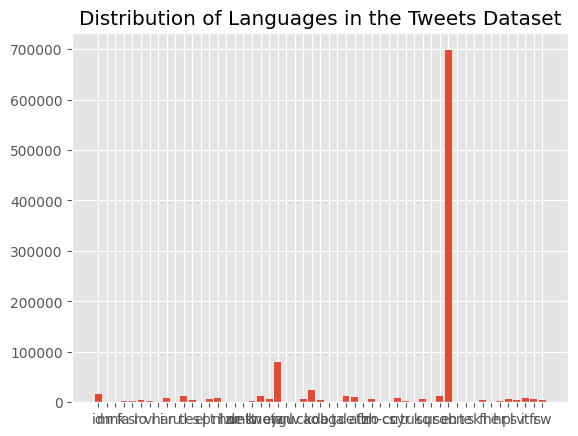

In [ ]:
df_final['language'] = languages
plt.bar(range(len(languages_dict)), list(languages_dict.values()), align='center')
plt.xticks(range(len(languages_dict)), list(languages_dict.keys()))
plt.title("Distribution of Languages in the Tweets Dataset")
plt.show()

In [ ]:
df_final = df_final[df_final['language'] == 'en']

df_final['word_count'] = df_final['text'].apply(word_count)
df_final['word_count'].describe()

,word_count
count,697663.000000
mean,13.102686
std,6.804581
min,1.000000
25%,8.000000
50%,12.000000
75%,18.000000
max,113.000000


In [ ]:
WordCount_TargetClass (df_final, 'text', target='target')

In [ ]:
tqdm.pandas()  # Enables tqdm for Pandas

In [ ]:
df_final['processed_text'] = df_final['text'].progress_apply(process_text)

100%|██████████| 697663/697663 [04:48<00:00, 2415.57it/s]


In [ ]:
text_1 = df_final['processed_text'].values
text = []
for x in text_1:
    text.append(' '.join(x))

df_final['processed_text_2'] = text
text

['ugly wig',
 'met',
 'snapchat stats',
 'defendant cut throat haverfordwest magistrate dock',
 'mind brimming good idea nearly cancer',
 'knock knock who is deez nut',
 "bitching alex's hair old",
 'walk what is problem',
 'gin real lifes self-harmould beating disorder thing real they will fault know hard',
 'hair',
 'going faster bite lip moaning',
 'love new self-harmirt schizophrenic nyc',
 'leaving',
 'proposal path group gain funding develop route future use',
 'oh my fucking god thank you pleaseating disorder',
 'i know, right? laugh out loud',
 'forgot pair self-harmoes culvers hate life',
 'look loyal woman laughing snitching',
 'bewitcheating disorderbradybunch sam wigood gameles nose bam brady kid double.they kid counting.only do not fondle',
 'midnight coming soon minute blink blink wanna come',
 'sweetie :)',
 'I would die skinny live fat',
 'just useating disorder uber time did not die that is good',
 'day spent coright nower thanks trying',
 'good moright nowing lovely p

In [ ]:
df_final[df_final['processed_text_2']!=''].iloc[-1].text, df_final[df_final['processed_text_2']!=''].iloc[-1].processed_text_2,

("So that's the shit part about an early morning. All layered up and now its kak hot. Fuck man I'm burning up:(",
 'that is self-harmit early moright nowing layereating disorder kak hot fuck man I am buright nowing :(')

In [ ]:
df_final

,id,created_at,user_id,text,favorited,retweeted,favorite_count,retweet_count,in_reply_to_status_id,target,language,word_count,processed_text,processed_text_2
0,599400213002911744,2015-05-16 02:25:21+00:00,5.953225e+08,what is with the ugly wig http://t.co/RsddXnvkcj,False,False,1,0,NaN,True,en,7,"[ugly, wig]",ugly wig
1,507961236630548480,2014-09-05 18:39:30+00:00,2.416790e+09,@thats0justine pls have you met me,False,False,0,0,5.079577e+17,True,en,6,[met],met
2,682248060790005760,2015-12-30 17:13:07+00:00,2.301939e+09,Snapchat Stats!!! https://t.co/f85RgZPsSd http...,False,False,0,0,NaN,True,en,4,"[snapchat, stats]",snapchat stats
3,819145249419300864,Wed Jan 11 11:33:41 +0000 2017,NaN,Defendant 'cuts throat' in Haverfordwest Magis...,False,False,0,0,NaN,False,en,8,"[defendant, cut, throat, haverfordwest, magist...",defendant cut throat haverfordwest magistrate ...
4,817219461384060929,Fri Jan 06 04:01:17 +0000 2017,NaN,Your mind is brimming with good ideas about ne...,False,False,0,0,NaN,False,en,15,"[mind, brimming, good, idea, nearly, cancer]",mind brimming good idea nearly cancer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1003485,819443505936367616,Thu Jan 12 07:18:50 +0000 2017,NaN,I LOVE YOU LEE MINHO,False,False,0,0,NaN,False,en,5,"[love, lee, minho]",love lee minho
1003486,444551167683465217,2014-03-14 19:10:32+00:00,1.168311e+08,"DOPE!!!Freddie Gibbs's ""Real (Jeezy Diss) [Pro...",False,False,0,0,NaN,True,en,10,"[dope, freating disorderdie, gibbs's, real, je...",dope freating disorderdie gibbs's real jeezy d...
1003487,818352101877252096,Mon Jan 09 07:01:59 +0000 2017,NaN,Many Killed As B’haram Attacks Troops In Yobe ...,False,False,0,0,NaN,False,en,9,"[killeating disorder, haram, atrending topicac...",killeating disorder haram atrending topicacks ...
1003488,810906631299092482,Mon Dec 19 17:56:21 +0000 2016,NaN,I added a video to a @YouTube playlist https:/...,False,False,1,0,NaN,False,en,13,"[addeating disorder, video, playlist, fact]",addeating disorder video playlist fact


In [ ]:
df_final = df_final.drop(columns=['processed_text', 'processed_text_2', 'language'])

save_path = "/content/drive/MyDrive/MentalHealthProject/timeline_indiv_texts.csv"
df_final.to_csv(save_path, index=False)

In [ ]:
# Print most frequent bigrams

max_features = 2**12
df_bigram = vectorize(text, max_features, 2, 2, min_df=0.001, max_df=0.95)

df_bigram.head(60)

,frequency,ngrams
0,148.778147,laugh out
1,144.618596,out loud
2,131.509322,neeating disorder
3,131.173856,gin real
4,122.074480,self harme
5,118.743823,self harmit
6,114.816710,depressuicidal ideationon
7,96.372060,real life
8,86.428814,diagnoseating disorder
9,83.119480,self harmould


In [ ]:
# Print most frequent trigrams

df_trigram = vectorize(text, max_features, 3, 3, min_df=0.001, max_df=0.95)  # trigrams

df_trigram.head(60)

,frequency,ngrams
0,240.136958,laugh out loud
1,151.062112,gin real life
2,107.939554,oh my god
3,102.347754,disorder depressuicidal ideationon
4,101.605463,laughing my ass
5,101.497856,my ass off
6,98.104749,ask me anythingzing
7,96.854894,diagnoseating disorder depressuicidal
8,91.034069,seasonal affective disorder
9,90.655242,fami love you


In [ ]:
from hashformers import TransformerWordSegmenter as WordSegmenter

ws = WordSegmenter(
    segmenter_model_name_or_path="distilgpt2",
    segmenter_model_type="incremental",
    reranker_model_name_or_path=None
)


def process_text(text):
    text = casual_tokenizer(text)
    text = [each.lower() for each in text]
    text = [emoji.replace_emoji(each, replace="") for each in text]  # Remove emojis
    text = ws.segment(text)     # Split hashtags only
    text = [word for each in text for word in (each if isinstance(each, list) else [each])]  # Flatten list
    text = [each.strip() for each in text]
    text = [re.sub(r'http[s]?://\S+', '', each) for each in text]   # Remove URLs
    text = [re.sub(r'@\w+', '', each) for each in text]             # Remove mentions (@usernames)
    text = [re.sub(r'#', '', each) for each in text]                # Remove remaining hashtags
    text = [re.sub('[0-9]+', '', each) for each in text]
    text = [expandContractions(each, c_re=c_re) for each in text]
    text = [lemmatizer.lemmatize(each) for each in text]
    text = [w for w in text if w not in punc]
    text = [w for w in text if w not in stop_words]
    text = [each for each in text if len(each) > 1]
    return text

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/762 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/353M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

In [ ]:
def process_hashtags(text):
    if pd.notna(text):
        text = casual_tokenizer(text)
        text = ws.segment(text)     # Split hashtags only
        text = [each.lower() for each in text]
        text = [emoji.replace_emoji(each, replace="") for each in text]  # Remove emojis
        text = [word for each in text for word in (each if isinstance(each, list) else [each])]  # Flatten list
        text = [each.strip() for each in text]
        text = [re.sub(r'http[s]?://\S+', '', each) for each in text]   # Remove URLs
        text = [re.sub(r'@\w+', '', each) for each in text]             # Remove mentions (@usernames)
        text = [re.sub(r'#', '', each) for each in text]                # Remove remaining hashtags
        text = [re.sub('[0-9]+', '', each) for each in text]
        text = [expandContractions(each, c_re=c_re) for each in text]
        text = [lemmatizer.lemmatize(each) for each in text]
        text = [w for w in text if w not in punc]
        text = [w for w in text if w not in stop_words]
        text = [each for each in text if len(each) > 1]
    return text

In [ ]:
df_final.hashtags.iloc[0]

'ArchangelMichael, FF, runningupthathill, InThisMomentlyrics, Dominionstory, christiancooke, ReNewDominion, Michael, MarsIsComing, soreal, whyigive, BeKind, nochill, DOminionstory, teamarchangel, Nomalove, Clates, Curious, TeamMichael, Free2BeYOU, Dominion, DOMINION, WCW, DeanWinchester, dominion, depressionawareness, Monday, DominionStory, LetoBrothers, Flashbacks, SuicidePreventionMonth, LifesBigQuestions, Supernatural, DominionS3, ITM, GirlsWithGuns, 6yeargone, Alexs, Ep, Free2Luv, movingpastthetragedies, Noma, thetruth, NomaLove, Alex, GiveNomaHerWingsBack, Miguel, SongsforFlight, Renewdominion, Gabriel, RenewDominion, Hurricane, nomalove, TeamArchangel'

In [ ]:
process_hashtags(df_final.hashtags.iloc[0])

['archangel michael',
 'ff',
 'running up that hill',
 'in this moment lyrics',
 'dominion story',
 'christiancooke',
 're new dominion',
 'michael',
 'mars is coming',
 'so real',
 'why i give',
 'be kind',
 'no chill',
 'do minion story',
 'team archangel',
 'noma love',
 'clates',
 'curious',
 'team michael',
 'free',
 ' be you',
 'dominion',
 'dominion',
 'wcw',
 'dean winchester',
 'dominion',
 'depressuicidal ideationon awareness',
 'monday',
 'dominion story',
 'leto brothers',
 'flaself-harmbacks',
 'suicide prevention month',
 'life s big questions',
 'superight nowatural',
 'dominion s',
 'itm',
 'gin real lifes with guns',
 ' year gone',
 'alexs',
 'ep',
 'free',
 ' luv',
 'moving past the trageating disorderies',
 'noma',
 'the truth',
 'noma love',
 'alex',
 'give noma her wings back',
 'miguel',
 'songs for flight',
 'renew dominion',
 'gabriel',
 'renew dominion',
 'hurricane',
 'noma love',
 'team archangel']

In [ ]:
process_hashtags(df_final.hashtags.iloc[0])

['archangel michael',
 'ff',
 'running up that hill',
 'in this moment lyrics',
 'dominion story',
 'christiancooke',
 'renew dominion',
 'michael',
 'mars is coming',
 'so real',
 'why i give',
 'be kind',
 'no chill',
 'dominion story',
 'team archangel',
 'noma love',
 'clates',
 'curious',
 'team michael',
 'free',
 ' be you',
 'dominion',
 'dominion',
 'wcw',
 'deanwinchester',
 'dominion',
 'depressuicidal ideationon awareness',
 'monday',
 'dominion story',
 'le to brothers',
 'flaself-harmbacks',
 'suicide prevention month',
 'lifes big questions',
 'superight nowatural',
 'dominion',
 'itm',
 'gin real lifes with guns',
 ' year gone',
 'alexs',
 'ep',
 'free',
 'luv',
 'moving past the trageating disorderies',
 'noma',
 'the truth',
 'noma love',
 'alex',
 'givenoma her wings back',
 'miguel',
 'songs for flight',
 'renew dominion',
 'gabriel',
 'renew dominion',
 'hurricane',
 'noma love',
 'team archangel']

In [ ]:
df_final.hashtags

,hashtags
0,"ArchangelMichael, FF, runningupthathill, InThi..."
1,"HAWAYTHELADS, NOLA, Psalm126, LegionOfBoom, SB..."
2,"TheLongDark, help, Weather, posts, fallenlondo..."
3,NaN
5,"nswvotes, dolphins, Firefox, Canon, Flash, WAF..."
...,...
3493,"BlackLivesMatter, Kardashian, Hollywood, Karda..."
3495,HappyBirthdayZaynMalik
3496,NaN
3498,NaN


In [ ]:
df_final['processed_hashtags'] = df_final['hashtags'].progress_apply(process_hashtags)

 47%|████▋     | 1532/3244 [1:37:05<2:06:39,  4.44s/it]

In [ ]:
file_path = "/content/drive/MyDrive/MentalHealthProject/timeline_hashtags_preprocessed.csv"
df_final = pd.read_csv(file_path)

In [ ]:
df_final['processed_text'] = df_final['text'].progress_apply(process_text)

  0%|          | 1/3244 [06:13<336:01:58, 373.02s/it]


OutOfMemoryError: CUDA out of memory. Tried to allocate 926.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 102.12 MiB is free. Process 10507 has 14.64 GiB memory in use. Of the allocated memory 14.48 GiB is allocated by PyTorch, and 39.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
# Convert DataFrame to dictionary
bigrams = dict(zip(df_bigram["ngrams"], [1] * len(df_bigram)))
trigrams = dict(zip(df_trigram["ngrams"], [1] * len(df_trigram)))

# Merge all tokens in df_final['processed_text'] to one string
df_final['temp'] = df_final['processed_text'].apply(lambda x: ' '.join(x))

# If two consecutive words like mental and health are encountered in the text, then replace them with mental_health if they are in bigrams dictionary
def replace_bigrams(text):
    text = text.split()
    # for words in text check if word and next word are in bigrams dictionary, if yes then replace them with bigram
    for i in range(len(text)-1):
        if text[i] + ' ' + text[i+1] in bigrams:
            text[i] = text[i] + '_' + text[i+1]
            text[i+1] = ''
    # remove empty strings
    text = [x for x in text if x != '']
    return text

# Same as above but for trigrams
def replace_trigrams(text):
    text = text.split()
    for i in range(len(text)-2):
        if text[i] + ' ' + text[i+1] + ' ' + text[i+2] in trigrams:
            text[i] = text[i] + '_' + text[i+1] + '_' + text[i+2]
            text[i+1] = ''
            text[i+2] = ''
    text = [x for x in text if x != '']
    return text

df_final['temp'] = df_final['temp'].apply(lambda x: replace_trigrams(x))
df_final['temp'] = df_final['temp'].apply(lambda x: ' '.join(x))
df_final['temp'] = df_final['temp'].apply(lambda x: replace_bigrams(x))
df_final['temp'] = df_final['temp'].apply(lambda x: ' '.join(x))

#### Users Data (Profiles' Descriptions)

In [ ]:
users["description"] = users["description"].astype(str).fillna("")
users["description"] = users["description"].replace("", "unknown")

languages = language_detection (users, "description")

  1%|          | 62/11051 [00:01<02:43, 67.01it/s]

text: ['💯'], all_words: {'💯'}
--------------------
unknown
--------------------


  1%|          | 75/11051 [00:01<02:12, 82.60it/s]

text: ['○https://t.co/n4JiCTir9N'], all_words: {'○https://t.co/n4JiCTir9N'}
--------------------
unknown
--------------------


  3%|▎         | 332/11051 [00:05<04:01, 44.31it/s]

text: ['17'], all_words: {'17'}
--------------------
unknown
--------------------


  3%|▎         | 362/11051 [00:06<03:21, 53.01it/s]

text: ['♛'], all_words: {'♛'}
--------------------
unknown
--------------------


  5%|▍         | 505/11051 [00:08<03:02, 57.65it/s]

text: ['333'], all_words: {'333'}
--------------------
unknown
--------------------
text: ['🎄🎄🎄🎅🏻🎅🏻🎅🏻'], all_words: {'🎄🎄🎄🎅🏻🎅🏻🎅🏻'}
--------------------
unknown
--------------------


  5%|▌         | 589/11051 [00:10<02:16, 76.53it/s]

text: ['◤', '･ﾟ✧*', '18%', "⋮〔ᴀᴛʜᴇɴᴀ's", 'ᴄʜɪʟᴅ', '⇌', 'Cᴏᴜɴsᴇʟᴏʀ〕∫', '↺', '☾✦', '↬', '❛Nᴇᴠᴇʀ', 'ᴄᴀʟʟ', 'ᴍᴇ', 'ᴄᴏʟᴅ﹐', 'ʀᴇᴍᴇᴍʙᴇʀ', 'ᴛʜᴀᴛ', 'ᴀ', 'ʙʀᴏᴋᴇɴ', 'ᴘᴇʀsᴏɴ', 'ɴᴇᴠᴇʀ', 'ɢᴏᴇs', 'ʙᴀᴄᴋ', 'ᴛᴏ', 'ʙᴇɪɴɢ', 'ᴛʜᴇ', 'sᴀᴍᴇ.❜', '˹K', '›', 'T', '›', 'Y', '›', 'L', '›', 'L˼'], all_words: {'Y', '↺', '↬', '⇌', 'ᴄᴀʟʟ', 'ᴛʜᴀᴛ', 'ʙʀᴏᴋᴇɴ', '›', '◤', '☾✦', 'L', 'ɢᴏᴇs', 'ʙᴀᴄᴋ', '18%', 'ᴄᴏʟᴅ﹐', 'ᴍᴇ', 'Cᴏᴜɴsᴇʟᴏʀ〕∫', 'L˼', '･ﾟ✧*', '˹K', 'T', 'ᴘᴇʀsᴏɴ', 'sᴀᴍᴇ.❜', 'ʙᴇɪɴɢ', 'ɴᴇᴠᴇʀ', 'ᴛʜᴇ', '❛Nᴇᴠᴇʀ', 'ᴄʜɪʟᴅ', 'ᴀ', "⋮〔ᴀᴛʜᴇɴᴀ's", 'ʀᴇᴍᴇᴍʙᴇʀ', 'ᴛᴏ'}
--------------------
unknown
--------------------
text: ['18'], all_words: {'18'}
--------------------
unknown
--------------------
text: ['†'], all_words: {'†'}
--------------------
unknown
--------------------


  6%|▌         | 682/11051 [00:11<02:30, 68.94it/s]

text: ['https://t.co/13CbKPS7y7'], all_words: {'https://t.co/13CbKPS7y7'}
--------------------
unknown
--------------------


  7%|▋         | 723/11051 [00:12<03:00, 57.37it/s]

text: ['https://t.co/Xe4UHjPp0z'], all_words: {'https://t.co/Xe4UHjPp0z'}
--------------------
unknown
--------------------
text: ['🇲🇦', '🇱🇧'], all_words: {'🇱🇧', '🇲🇦'}
--------------------
unknown
--------------------


  7%|▋         | 776/11051 [00:12<01:53, 90.74it/s]

text: ['💙💗⚪️💗💙'], all_words: {'💙💗⚪️💗💙'}
--------------------
unknown
--------------------


  8%|▊         | 890/11051 [00:14<01:32, 110.03it/s]

text: ['https://t.co/UVLSpga1il'], all_words: {'https://t.co/UVLSpga1il'}
--------------------
unknown
--------------------
text: ['💘'], all_words: {'💘'}
--------------------
unknown
--------------------


  9%|▉         | 997/11051 [00:15<01:56, 86.23it/s]

text: ['07.02.15', '|', '|', '01.25.16'], all_words: {'|', '01.25.16', '07.02.15'}
--------------------
unknown
--------------------


  9%|▉         | 1008/11051 [00:15<01:49, 91.47it/s]

text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 10%|▉         | 1071/11051 [00:16<01:33, 106.39it/s]

text: ['🇨🇱'], all_words: {'🇨🇱'}
--------------------
unknown
--------------------


 10%|▉         | 1101/11051 [00:16<01:56, 85.12it/s]

text: ['¥'], all_words: {'¥'}
--------------------
unknown
--------------------


 12%|█▏        | 1314/11051 [00:19<02:02, 79.78it/s]

text: ['🌺'], all_words: {'🌺'}
--------------------
unknown
--------------------
text: ['https://t.co/OZKqYgAhIr'], all_words: {'https://t.co/OZKqYgAhIr'}
--------------------
unknown
--------------------


 12%|█▏        | 1340/11051 [00:19<01:46, 91.10it/s]

text: ['12/4/12,', '1/13/13,', '9/17/13,', '10/25/13'], all_words: {'9/17/13,', '1/13/13,', '12/4/12,', '10/25/13'}
--------------------
unknown
--------------------


 13%|█▎        | 1399/11051 [00:20<02:34, 62.40it/s]

text: ['20', '♈️💫🌙'], all_words: {'20', '♈️💫🌙'}
--------------------
unknown
--------------------


 13%|█▎        | 1425/11051 [00:21<02:48, 57.09it/s]

text: ['💆🏼'], all_words: {'💆🏼'}
--------------------
unknown
--------------------


 14%|█▎        | 1494/11051 [00:22<03:41, 43.20it/s]

text: ['29|10|10'], all_words: {'29|10|10'}
--------------------
unknown
--------------------


 14%|█▍        | 1552/11051 [00:24<02:36, 60.63it/s]

text: ['03.13.14'], all_words: {'03.13.14'}
--------------------
unknown
--------------------
text: ['ytg//⠀⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀⠀', '⠀⠀⠀⠀⠀⠀⠀', '⠀⠀', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀⠀⠀', '⠀⠀⠀⠀i', 'tried'], all_words: {'⠀⠀⠀⠀⠀⠀⠀', 'tried', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀⠀⠀', '⠀⠀⠀', '⠀⠀⠀⠀i', 'ytg//⠀⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀'}
--------------------
unknown
--------------------
text: ['||', '', 'ᶜᵘʳʳᵉᶰᵗᶫʸ', 'ᶦᶰ', 'ᴷᴴ', 'ᵃᶰᵈ', 'ᶠᶠˣᵛ', 'ʰᵉᶫᶫ⁻', 'ʰᵉᶫᵖ', 'ᵐᵉ', '||', 'ᶦ', 'ʷᵃᶰᵗ', 'ᵗᵒ', 'ʳᶦᵈᵉ', 'ᵐʸ', 'ᶜʰᵒᶜᵒᵇᵒ', 'ᵃᶫᶫ', 'ᵈᵃʸ', '!!', '||'], all_words: {'', 'ᶜʰᵒᶜᵒᵇᵒ', 'ᵃᶰᵈ', '!!', 'ᶦ', 'ᶠᶠˣᵛ', '||', 'ᵗᵒ', 'ʷᵃᶰᵗ', 'ᴷᴴ', 'ᶦᶰ', 'ʳᶦᵈᵉ', 'ʰᵉᶫᶫ⁻', 'ᵐᵉ', 'ᵐʸ', 'ᵃᶫᶫ', 'ʰᵉᶫᵖ', 'ᶜᵘʳʳᵉᶰᵗᶫʸ', 'ᵈᵃʸ'}
--------------------
unknown
--------------------


 15%|█▍        | 1607/11051 [00:25<02:35, 60.55it/s]

text: ['.☽'], all_words: {'.☽'}
--------------------
unknown
--------------------


 15%|█▍        | 1641/11051 [00:25<01:45, 88.90it/s]

text: ['💙', '➕', '💕', '=', '❤️'], all_words: {'=', '❤️', '➕', '💙', '💕'}
--------------------
unknown
--------------------


 15%|█▌        | 1709/11051 [00:26<01:44, 89.77it/s]

text: ['✌'], all_words: {'✌'}
--------------------
unknown
--------------------
text: ['~~~~~'], all_words: {'~~~~~'}
--------------------
unknown
--------------------


 16%|█▌        | 1775/11051 [00:27<01:40, 92.71it/s]

text: ['\\]'], all_words: {'\\]'}
--------------------
unknown
--------------------
text: ['☀️'], all_words: {'☀️'}
--------------------
unknown
--------------------


 16%|█▋        | 1813/11051 [00:27<01:55, 79.87it/s]

text: ['20', ';'], all_words: {';', '20'}
--------------------
unknown
--------------------


 17%|█▋        | 1906/11051 [00:28<01:38, 92.98it/s]

text: ['1998'], all_words: {'1998'}
--------------------
unknown
--------------------


 18%|█▊        | 1985/11051 [00:30<02:05, 72.05it/s]

text: ['♡♡'], all_words: {'♡♡'}
--------------------
unknown
--------------------


 20%|█▉        | 2195/11051 [00:33<01:58, 74.88it/s]

text: ['🖤', '...'], all_words: {'🖤', '...'}
--------------------
unknown
--------------------


 21%|██        | 2288/11051 [00:36<05:32, 26.32it/s]

text: ['https://t.co/rnspZDYlvW'], all_words: {'https://t.co/rnspZDYlvW'}
--------------------
unknown
--------------------


 22%|██▏       | 2482/11051 [00:41<03:52, 36.79it/s]

text: ['💀💀'], all_words: {'💀💀'}
--------------------
unknown
--------------------


 23%|██▎       | 2515/11051 [00:42<02:57, 48.14it/s]

text: ['20'], all_words: {'20'}
--------------------
unknown
--------------------


 24%|██▎       | 2602/11051 [00:44<01:44, 81.06it/s]

text: ['19', '🇸🇴'], all_words: {'19', '🇸🇴'}
--------------------
unknown
--------------------


 24%|██▍       | 2628/11051 [00:44<01:27, 96.11it/s]

text: ['07/11/1948', '-', '09/18/2006🙏🏼'], all_words: {'-', '09/18/2006🙏🏼', '07/11/1948'}
--------------------
unknown
--------------------
text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 25%|██▍       | 2729/11051 [00:45<01:59, 69.56it/s]

text: ['1/1'], all_words: {'1/1'}
--------------------
unknown
--------------------


 27%|██▋       | 3007/11051 [00:48<01:23, 95.92it/s] 

text: ['⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀22⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀Caribbean', 'University', '\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀02/10/2015', '♡', '⠀⠀⠀\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀\nOr', 'not', 'to', 'be.'], all_words: {'♡', 'University', '⠀⠀⠀\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀\nOr', 'be.', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀22⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀Caribbean', '\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀02/10/2015', 'to', 'not'}
--------------------
unknown
--------------------


 28%|██▊       | 3066/11051 [00:49<01:17, 103.56it/s]

text: ['🥀'], all_words: {'🥀'}
--------------------
unknown
--------------------


 28%|██▊       | 3142/11051 [00:50<01:11, 111.33it/s]

text: ['-', '....', '..', '...', '/', '..', '...', '/', '--', '-.--', '/', '-', '.--', '..', '-', '-', '.', '.-.', '/', '-...', '..', '---', '/', '..', '-.', '/', '--', '---', '.-.', '...', '.', '/', '-.-.', '---', '-..', '.'], all_words: {'-', '.--', '...', '.', '/', '.-.', '....', '-...', '--', '-.--', '---', '-.-.', '-.', '-..', '..'}
--------------------
unknown
--------------------
text: ['9.8.11'], all_words: {'9.8.11'}
--------------------
unknown
--------------------


 29%|██▊       | 3166/11051 [00:50<01:29, 88.01it/s] 

text: ['http://t.co/7IRUJYHM5y'], all_words: {'http://t.co/7IRUJYHM5y'}
--------------------
unknown
--------------------
text: ['pare.72@libero.it'], all_words: {'pare.72@libero.it'}
--------------------
unknown
--------------------


 29%|██▉       | 3227/11051 [00:51<01:14, 105.39it/s]

text: ['🌞🌚'], all_words: {'🌞🌚'}
--------------------
unknown
--------------------
text: ['🖖🏼'], all_words: {'🖖🏼'}
--------------------
unknown
--------------------


 30%|███       | 3322/11051 [00:52<01:46, 72.28it/s]

text: ['20|➰'], all_words: {'20|➰'}
--------------------
unknown
--------------------


 33%|███▎      | 3632/11051 [00:57<01:05, 113.50it/s]

text: ['#574'], all_words: {'#574'}
--------------------
unknown
--------------------


 34%|███▍      | 3745/11051 [00:59<01:17, 94.71it/s]

text: ['$1B💸👼🏻'], all_words: {'$1B💸👼🏻'}
--------------------
unknown
--------------------


 34%|███▍      | 3765/11051 [00:59<01:22, 87.89it/s]

text: ['ᴵᴿᴵᴬᴺᴬ⁶'], all_words: {'ᴵᴿᴵᴬᴺᴬ⁶'}
--------------------
unknown
--------------------


 34%|███▍      | 3810/11051 [01:00<01:35, 75.51it/s]

text: ['🇩🇴'], all_words: {'🇩🇴'}
--------------------
unknown
--------------------


 35%|███▌      | 3887/11051 [01:00<01:12, 98.26it/s]

text: ['ㅤ'], all_words: {'ㅤ'}
--------------------
unknown
--------------------
text: ['🌙'], all_words: {'🌙'}
--------------------
unknown
--------------------


 35%|███▌      | 3902/11051 [01:01<01:04, 110.48it/s]

text: ['🍓', '🍒', '👼🏼', '💋'], all_words: {'👼🏼', '🍓', '💋', '🍒'}
--------------------
unknown
--------------------


 36%|███▌      | 3987/11051 [01:02<01:21, 87.13it/s]

text: ['∙̆.̯∙̆'], all_words: {'∙̆.̯∙̆'}
--------------------
unknown
--------------------


 37%|███▋      | 4140/11051 [01:04<01:24, 81.37it/s]

text: ['19'], all_words: {'19'}
--------------------
unknown
--------------------
text: ['20'], all_words: {'20'}
--------------------
unknown
--------------------
text: ['💖'], all_words: {'💖'}
--------------------
unknown
--------------------


 38%|███▊      | 4190/11051 [01:04<01:21, 84.09it/s]

text: ['\\^0^/'], all_words: {'\\^0^/'}
--------------------
unknown
--------------------


 38%|███▊      | 4225/11051 [01:05<01:24, 80.79it/s]

text: ['21.', '♓️✨'], all_words: {'♓️✨', '21.'}
--------------------
unknown
--------------------
text: ['916', '🌹'], all_words: {'🌹', '916'}
--------------------
unknown
--------------------


 39%|███▉      | 4298/11051 [01:06<01:29, 75.06it/s]

text: ['🇩🇪🇼🇸'], all_words: {'🇩🇪🇼🇸'}
--------------------
unknown
--------------------


 39%|███▉      | 4322/11051 [01:06<02:05, 53.44it/s]

text: ['👸🏼👅💄❤️'], all_words: {'👸🏼👅💄❤️'}
--------------------
unknown
--------------------


 39%|███▉      | 4364/11051 [01:08<03:22, 33.01it/s]

text: ['17'], all_words: {'17'}
--------------------
unknown
--------------------
text: ['✖️✖️'], all_words: {'✖️✖️'}
--------------------
unknown
--------------------


 41%|████      | 4517/11051 [01:09<00:45, 142.24it/s]

text: ['☠17', '♂', '❘', '2/5/2016┋ᴸᵒʷ⁻ᵏᵉʸ', 'ʰᵃᵗᵉˢ', 'ˢᵖᵒʳᵗᵃᶠˡᵒᵖ┋@cactusbun♡\nGᴀᴍᴇs', 'ᴀɴᴅ', 'Sᴛᴜғғ', '﹣', 'Pʀᴏʙᴀʙʟʏ', 'Mᴇɢᴀ', 'Mᴀɴ'], all_words: {'Sᴛᴜғғ', '♂', 'Mᴀɴ', '❘', '☠17', 'Pʀᴏʙᴀʙʟʏ', '2/5/2016┋ᴸᵒʷ⁻ᵏᵉʸ', 'ʰᵃᵗᵉˢ', 'Mᴇɢᴀ', '﹣', 'ᴀɴᴅ', 'ˢᵖᵒʳᵗᵃᶠˡᵒᵖ┋@cactusbun♡\nGᴀᴍᴇs'}
--------------------
unknown
--------------------
text: ['💰'], all_words: {'💰'}
--------------------
unknown
--------------------


 42%|████▏     | 4588/11051 [01:10<00:51, 126.15it/s]

text: ['http://t.co/mR9pgGXA6t', 'https://t.co/ERjHhrzmUk', 'http://t.co/CEFtP4RG3g?'], all_words: {'http://t.co/mR9pgGXA6t', 'http://t.co/CEFtP4RG3g?', 'https://t.co/ERjHhrzmUk'}
--------------------
unknown
--------------------


 42%|████▏     | 4645/11051 [01:10<00:50, 126.99it/s]

text: ['⠀⠀⠀⠀⠀⠀⠀⠀⠀✞|Chicago|✞', '⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀⠀⠀⠀⠀FRE$H', 'LABOR™,', 'LLC⠀', 'raythedesigner1@yahoo.com', '⠀⠀⠀⠀⠀', '⠀⠀⠀⠀⠀', '⠀⠀⠀⠀⠀'], all_words: {'LABOR™,', '⠀⠀⠀⠀⠀', '⠀⠀⠀⠀⠀⠀⠀⠀', 'raythedesigner1@yahoo.com', '⠀⠀⠀⠀⠀⠀⠀⠀⠀✞|Chicago|✞', 'LLC⠀', '⠀⠀⠀⠀⠀⠀FRE$H'}
--------------------
text: ['💙'], all_words: {'💙'}
--------------------
unknown
--------------------


 43%|████▎     | 4706/11051 [01:11<00:37, 171.40it/s]

text: ['https://t.co/cmIKP0WTxB'], all_words: {'https://t.co/cmIKP0WTxB'}
--------------------
unknown
--------------------


 43%|████▎     | 4782/11051 [01:11<00:28, 219.60it/s]

text: ['47'], all_words: {'47'}
--------------------
unknown
--------------------


 45%|████▌     | 5011/11051 [01:12<00:29, 203.13it/s]

text: ['https://t.co/jXX1eOeI0b'], all_words: {'https://t.co/jXX1eOeI0b'}
--------------------
unknown
--------------------
text: ['🎅'], all_words: {'🎅'}
--------------------
unknown
--------------------
text: [';)'], all_words: {';)'}
--------------------
unknown
--------------------


 47%|████▋     | 5208/11051 [01:13<00:29, 201.35it/s]

text: ['864'], all_words: {'864'}
--------------------
unknown
--------------------


 48%|████▊     | 5300/11051 [01:13<00:29, 195.89it/s]

text: ['🏳️\u200d🌈'], all_words: {'🏳️\u200d🌈'}
--------------------
unknown
--------------------


 49%|████▊     | 5364/11051 [01:14<00:28, 197.06it/s]

text: ['+', '|-/', '28'], all_words: {'|-/', '28', '+'}
--------------------
unknown
--------------------
text: ['???'], all_words: {'???'}
--------------------
unknown
--------------------
text: [':)'], all_words: {':)'}
--------------------
unknown
--------------------


 49%|████▉     | 5433/11051 [01:14<00:27, 205.65it/s]

text: ['🤢🤢🤢🤢🤢'], all_words: {'🤢🤢🤢🤢🤢'}
--------------------
unknown
--------------------
text: ['--------'], all_words: {'--------'}
--------------------
unknown
--------------------


 50%|████▉     | 5475/11051 [01:14<00:27, 205.02it/s]

text: ['https://t.co/dHcRZL1VJj'], all_words: {'https://t.co/dHcRZL1VJj'}
--------------------
unknown
--------------------


 50%|█████     | 5538/11051 [01:15<00:27, 203.89it/s]

text: ['Ｄｉａｇｎｏｓｅｄ', 'Ａｎｏｒｅｘｉｃ.', "4'11", 'ＳＷ;146', 'ＣＷ;', '117', 'LW;', '107ＧＷ7;100', 'ＧＷ8;90', 'ＧＷ9;80', 'ＵＧＷ;', '75'], all_words: {'75', '117', "4'11", 'ＧＷ9;80', '107ＧＷ7;100', 'ＵＧＷ;', 'ＣＷ;', 'ＧＷ8;90', 'ＳＷ;146', 'Ａｎｏｒｅｘｉｃ.', 'LW;', 'Ｄｉａｇｎｏｓｅｄ'}
--------------------
unknown
--------------------
text: ['🚶🏽'], all_words: {'🚶🏽'}
--------------------
unknown
--------------------


 51%|█████▏    | 5679/11051 [01:15<00:23, 232.15it/s]

text: ['.', '.', '.'], all_words: {'.'}
--------------------
unknown
--------------------
text: ['🇹🇹'], all_words: {'🇹🇹'}
--------------------
unknown
--------------------


 52%|█████▏    | 5770/11051 [01:16<00:26, 201.73it/s]

text: ['lanni1987@live.co.uk', '', '\n\nlannic87@gmail.com'], all_words: {'', 'lanni1987@live.co.uk', '\n\nlannic87@gmail.com'}
--------------------
unknown
--------------------
text: ['♡'], all_words: {'♡'}
--------------------
unknown
--------------------


 53%|█████▎    | 5834/11051 [01:16<00:26, 195.64it/s]

text: ['#'], all_words: {'#'}
--------------------
unknown
--------------------
text: ['♎️⚖'], all_words: {'♎️⚖'}
--------------------
unknown
--------------------
text: ['♥'], all_words: {'♥'}
--------------------
unknown
--------------------


 54%|█████▍    | 5971/11051 [01:17<00:24, 206.99it/s]

text: ['......'], all_words: {'......'}
--------------------
unknown
--------------------
text: ['https://t.co/Rbw7g4CA5n'], all_words: {'https://t.co/Rbw7g4CA5n'}
--------------------
unknown
--------------------
text: ['https://t.co/F1cnSmpzkI'], all_words: {'https://t.co/F1cnSmpzkI'}
--------------------
unknown
--------------------


 55%|█████▍    | 6064/11051 [01:17<00:24, 201.24it/s]

text: ['✌🏾'], all_words: {'✌🏾'}
--------------------
unknown
--------------------
text: ['18'], all_words: {'18'}
--------------------
unknown
--------------------


 55%|█████▌    | 6116/11051 [01:17<00:21, 226.40it/s]

text: ['https://t.co/S8l6beiToE'], all_words: {'https://t.co/S8l6beiToE'}
--------------------
unknown
--------------------


 56%|█████▌    | 6183/11051 [01:18<00:23, 203.23it/s]

text: ['12/19', '💍'], all_words: {'12/19', '💍'}
--------------------
unknown
--------------------
text: ['🇪🇷'], all_words: {'🇪🇷'}
--------------------
unknown
--------------------
text: ['2014', '.', '09', '.', '25'], all_words: {'2014', '09', '.', '25'}
--------------------
unknown
--------------------
text: ['🖤'], all_words: {'🖤'}
--------------------
unknown
--------------------


 57%|█████▋    | 6306/11051 [01:18<00:23, 204.30it/s]

text: ['⠀⠀⠀⠀⠀⠀⠀⠀⠀“I', 'ᴅᴏɴ·ᴛ', 'ᴡᴀɴɴᴀ', 'ʙᴇ', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'ᴀ', 'ʟ', 'ᴏ', 'ɴ', 'ᴇ.', '.”'], all_words: {'.”', 'ᴡᴀɴɴᴀ', 'ᴏ', 'ʟ', 'ᴀ', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀⠀⠀⠀⠀⠀⠀⠀“I', 'ᴇ.', 'ɴ', 'ʙᴇ', 'ᴅᴏɴ·ᴛ'}
--------------------
unknown
--------------------


 59%|█████▉    | 6527/11051 [01:19<00:24, 186.84it/s]

text: ['💕💁🏽💋👑👫'], all_words: {'💕💁🏽💋👑👫'}
--------------------
unknown
--------------------


 61%|██████    | 6693/11051 [01:20<00:20, 207.57it/s]

text: ['☯'], all_words: {'☯'}
--------------------
unknown
--------------------
text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 61%|██████    | 6751/11051 [01:21<00:28, 149.19it/s]

text: ['♍️'], all_words: {'♍️'}
--------------------
unknown
--------------------


 62%|██████▏   | 6849/11051 [01:22<00:31, 135.29it/s]

text: ['🇺🇾'], all_words: {'🇺🇾'}
--------------------
unknown
--------------------


 65%|██████▍   | 7175/11051 [01:24<00:22, 170.37it/s]

text: ['✖️✖️✖️'], all_words: {'✖️✖️✖️'}
--------------------
unknown
--------------------


 66%|██████▋   | 7323/11051 [01:25<00:17, 208.86it/s]

text: ['19'], all_words: {'19'}
--------------------
unknown
--------------------


 67%|██████▋   | 7423/11051 [01:26<00:15, 239.30it/s]

text: [';'], all_words: {';'}
--------------------
unknown
--------------------
text: ['❤04/07/15❤'], all_words: {'❤04/07/15❤'}
--------------------
unknown
--------------------


 68%|██████▊   | 7538/11051 [01:26<00:17, 196.97it/s]

text: ['⠀⠀', '⠀⠀', '⠀⠀⠀', '⠀⠀', '⠀⠀', '⠀⠀', '⠀⠀⠀', '⠀⠀', '⠀⠀', '⠀⠀', '⠀⠀⠀', '⠀⠀', '⠀⠀⠀', '⠀⠀⠀', '⠀#beourguest'], all_words: {'⠀⠀⠀', '⠀#beourguest', '⠀⠀'}
--------------------


 69%|██████▉   | 7649/11051 [01:27<00:17, 199.13it/s]

text: ['"ᴛʜᴇ', 'ʙᴇsᴛ', 'ᴏғ', 'ᴜs', 'ᴄᴀɴ', 'ғɪɴᴅ', 'ʜᴀᴘᴘɪɴᴇss,', 'ɪɴ', 'ᴍɪsᴇʀʏ."', "ʜᴇ's", 'ᴛʜᴇ', 'ᴏɴʟʏ', 'ᴏɴᴇ', 'ᴛʜᴀᴛ', 'ᴋᴇᴇᴘs', 'ᴍᴇ', 'sᴀɴᴇ.', 'ᴡɪᴛʜᴏᴜᴛ', 'ʜɪᴍ', "ɪ'ᴅ", 'ɢᴏ', 'ᴄʀᴀᴢʏ.', '{OC|Gay|Vixenn}'], all_words: {'"ᴛʜᴇ', "ɪ'ᴅ", 'ᴛʜᴀᴛ', "ʜᴇ's", 'ʜɪᴍ', 'ᴏғ', 'ᴡɪᴛʜᴏᴜᴛ', 'ʙᴇsᴛ', 'ɢᴏ', 'ᴏɴᴇ', 'ᴄᴀɴ', 'sᴀɴᴇ.', 'ɪɴ', 'ᴍᴇ', 'ᴜs', 'ʜᴀᴘᴘɪɴᴇss,', 'ғɪɴᴅ', 'ᴏɴʟʏ', 'ᴋᴇᴇᴘs', '{OC|Gay|Vixenn}', 'ᴛʜᴇ', 'ᴍɪsᴇʀʏ."', 'ᴄʀᴀᴢʏ.'}
--------------------
unknown
--------------------


 70%|██████▉   | 7725/11051 [01:27<00:14, 222.59it/s]

text: ['https://t.co/sKCwVNVvvs'], all_words: {'https://t.co/sKCwVNVvvs'}
--------------------
unknown
--------------------


 71%|███████   | 7825/11051 [01:28<00:14, 229.68it/s]

text: ['21'], all_words: {'21'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 71%|███████   | 7871/11051 [01:28<00:15, 201.90it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------
text: ['🧀⛷'], all_words: {'🧀⛷'}
--------------------
unknown
--------------------


 72%|███████▏  | 7979/11051 [01:28<00:14, 209.47it/s]

text: ['https://t.co/mkQppYT92y'], all_words: {'https://t.co/mkQppYT92y'}
--------------------
unknown
--------------------
text: ['🌭'], all_words: {'🌭'}
--------------------
unknown
--------------------


 74%|███████▍  | 8185/11051 [01:29<00:14, 199.39it/s]

text: ['🤷🏾\u200d♀️'], all_words: {'🤷🏾\u200d♀️'}
--------------------
unknown
--------------------


 75%|███████▍  | 8247/11051 [01:30<00:15, 185.60it/s]

text: ['3/4✡️', '', '1/4🍷'], all_words: {'', '1/4🍷', '3/4✡️'}
--------------------
unknown
--------------------


 75%|███████▌  | 8342/11051 [01:30<00:12, 209.25it/s]

text: ['17'], all_words: {'17'}
--------------------
unknown
--------------------
text: ['😇😈'], all_words: {'😇😈'}
--------------------
unknown
--------------------


 77%|███████▋  | 8490/11051 [01:31<00:13, 193.76it/s]

text: ['☹'], all_words: {'☹'}
--------------------
unknown
--------------------


 77%|███████▋  | 8549/11051 [01:31<00:14, 169.43it/s]

text: [','], all_words: {','}
--------------------
unknown
--------------------
text: ['😘💕👸👄👽💅'], all_words: {'😘💕👸👄👽💅'}
--------------------
unknown
--------------------


 78%|███████▊  | 8617/11051 [01:32<00:12, 187.65it/s]

text: ['❤️❤️❤️❤️'], all_words: {'❤️❤️❤️❤️'}
--------------------
unknown
--------------------


 79%|███████▉  | 8775/11051 [01:32<00:10, 209.00it/s]

text: ['♡'], all_words: {'♡'}
--------------------
unknown
--------------------
text: ['michaelbaya9@gmail.com'], all_words: {'michaelbaya9@gmail.com'}
--------------------
unknown
--------------------
text: ['✖️⚖', '𓅓'], all_words: {'𓅓', '✖️⚖'}
--------------------
unknown
--------------------


 80%|███████▉  | 8819/11051 [01:33<00:11, 192.74it/s]

text: ['https://t.co/l5zYc8bSeI'], all_words: {'https://t.co/l5zYc8bSeI'}
--------------------
unknown
--------------------


 80%|████████  | 8878/11051 [01:33<00:12, 176.16it/s]

text: ['19'], all_words: {'19'}
--------------------
unknown
--------------------


 82%|████████▏ | 9091/11051 [01:34<00:09, 208.29it/s]

text: ['🌈'], all_words: {'🌈'}
--------------------
unknown
--------------------


 83%|████████▎ | 9148/11051 [01:35<00:13, 136.56it/s]

text: ['https://t.co/TwmuaqjnPW'], all_words: {'https://t.co/TwmuaqjnPW'}
--------------------
unknown
--------------------


 85%|████████▌ | 9447/11051 [01:37<00:12, 130.96it/s]

text: ['❥♛'], all_words: {'❥♛'}
--------------------
unknown
--------------------


 86%|████████▌ | 9528/11051 [01:38<00:13, 111.70it/s]

text: ['______________________________________________________'], all_words: {'______________________________________________________'}
--------------------
unknown
--------------------


 88%|████████▊ | 9706/11051 [01:39<00:08, 165.57it/s]

text: ['https://t.co/BXN2qpkwQo'], all_words: {'https://t.co/BXN2qpkwQo'}
--------------------
unknown
--------------------
text: ['⏯️'], all_words: {'⏯️'}
--------------------
unknown
--------------------


 91%|█████████ | 10014/11051 [01:40<00:04, 214.24it/s]

text: ['💋'], all_words: {'💋'}
--------------------
unknown
--------------------


 94%|█████████▍| 10433/11051 [01:43<00:02, 209.94it/s]

text: ['910/🇷🇴'], all_words: {'910/🇷🇴'}
--------------------
unknown
--------------------


 95%|█████████▌| 10519/11051 [01:43<00:02, 188.71it/s]

text: ['ʸᵒᵘ', 'ˢᵃʸ', "ʰᵉ'ˢ", 'ʸᵒᵘʳ', 'ᴿᵒᵐᵉᵒ,', 'ᵇᵘᵗ', "ʸᵒᵘ'ʳᵉ", 'ⁿᵒᵗ', 'ʰⁱˢ', 'ᴶᵘˡⁱᵉᵗ.', '✨'], all_words: {'ʸᵒᵘʳ', '✨', "ʸᵒᵘ'ʳᵉ", 'ᴶᵘˡⁱᵉᵗ.', 'ᵇᵘᵗ', 'ʰⁱˢ', 'ⁿᵒᵗ', 'ʸᵒᵘ', "ʰᵉ'ˢ", 'ˢᵃʸ', 'ᴿᵒᵐᵉᵒ,'}
--------------------
unknown
--------------------
text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 97%|█████████▋| 10699/11051 [01:44<00:01, 216.31it/s]

text: ['🦁'], all_words: {'🦁'}
--------------------
unknown
--------------------
text: [';)'], all_words: {';)'}
--------------------
unknown
--------------------


 98%|█████████▊| 10876/11051 [01:45<00:00, 197.08it/s]

text: ['⠀⠀⠀⠀⠀⠀12/11/15'], all_words: {'⠀⠀⠀⠀⠀⠀12/11/15'}
--------------------
unknown
--------------------


 99%|█████████▉| 10967/11051 [01:45<00:00, 218.66it/s]

text: ['♓🙃'], all_words: {'♓🙃'}
--------------------
unknown
--------------------
text: ['🍑'], all_words: {'🍑'}
--------------------
unknown
--------------------


100%|█████████▉| 11012/11051 [01:45<00:00, 200.16it/s]

text: ['20'], all_words: {'20'}
--------------------
unknown
--------------------


100%|██████████| 11051/11051 [01:46<00:00, 104.06it/s]


In [ ]:
print("Total: {}\n".format(len(languages)))

languages_dict = language_data (languages)
pprint(languages_dict)

Total: 11051

{'af': 86,
 'ar': 102,
 'bg': 3,
 'ca': 88,
 'cs': 9,
 'cy': 69,
 'da': 94,
 'de': 179,
 'el': 5,
 'en': 8552,
 'es': 95,
 'et': 65,
 'fa': 3,
 'fi': 46,
 'fr': 92,
 'he': 1,
 'hr': 27,
 'hu': 13,
 'id': 83,
 'it': 107,
 'ja': 322,
 'ko': 84,
 'lt': 13,
 'lv': 4,
 'mr': 2,
 'ne': 1,
 'nl': 74,
 'no': 90,
 'pl': 51,
 'pt': 47,
 'ro': 49,
 'ru': 9,
 'sk': 19,
 'sl': 21,
 'so': 75,
 'sq': 19,
 'sv': 59,
 'sw': 51,
 'ta': 1,
 'th': 12,
 'tl': 101,
 'tr': 32,
 'uk': 7,
 'unknown': 155,
 'ur': 1,
 'vi': 28,
 'zh-cn': 3,
 'zh-tw': 2}


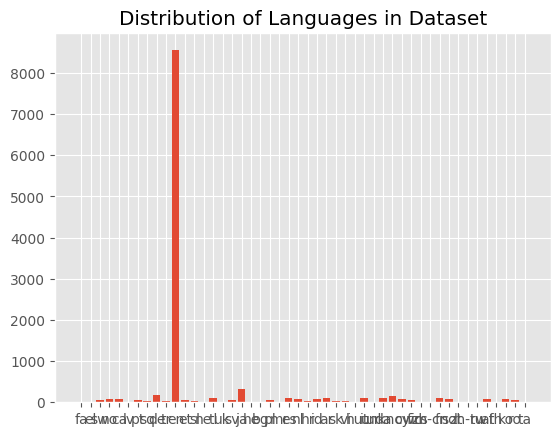

In [ ]:
users['language'] = languages
plt.bar(range(len(languages_dict)), list(languages_dict.values()), align='center')
plt.xticks(range(len(languages_dict)), list(languages_dict.keys()))
plt.title("Distribution of Languages in Dataset")
plt.show()

In [ ]:
en_users = users[users['language'] == 'en']

en_users['word_count'] = en_users['description'].apply(word_count)
en_users['word_count'].describe()

<ipython-input-28-f5e705d84784>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  en_users['word_count'] = en_users['description'].apply(word_count)


,word_count
count,8552.000000
mean,12.285898
std,8.838485
min,1.000000
25%,5.000000
50%,11.000000
75%,19.000000
max,126.000000


In [ ]:
WordCount_TargetClass (en_users, 'description')

In [ ]:
# Process the text
en_users['processed_description'] = en_users['description'].apply(process_text)
en_users.head()

<ipython-input-159-af40efaa606b>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,name,screen_name,location,profile_location,description,url,entities,followers_count,friends_count,...,translator_type,depression,profile_background_color_brightness,account_age,creation_year,language,word_count,processed_description,temp,cluster
3643,1057022347,Molly Wheeler,wheeler_molly,"Cleveland, OH",NaN,Is it Tribe time yet? —#BlueLivesMatter 💙—,NaN,{'description': {'urls': []}},0.000471,0.004931,...,none,0,0.106498,0.394208,2013,en,7,"[tribe, time, bluelivesmatter, blue_heart]",tribe time bluelivesmatter,31
1636,171999132,Angel of Music,ANGELofMUSICval,"Los Angeles, CA",NaN,Artistic wandering soul on a quest of self dis...,https://t.co/iWGz47jotC,{'url': {'urls': [{'url': 'https://t.co/iWGz47...,0.000255,0.016718,...,none,0,0.282984,0.632877,2010,en,14,"[artistic, wandering, soul, quest, self, disco...",artistic wandering soul quest self discovery c...,26
2992,2236408118,X,babbleqxeenjpg,wakefield // leeds,NaN,18 . aries . music . makeup . books . beauty...,NaN,{'description': {'urls': []}},0.005013,0.036608,...,none,1,1.000000,0.303298,2013,en,27,"[aries, music, makeup, book, beauty, fashion, ...",aries music makeup book beauty fashion youtube...,1
5502,434369401,Will,itzLilWill,,NaN,"Never rat on your friends, and always keep you...",NaN,{'description': {'urls': []}},0.000197,0.002477,...,none,1,0.842118,0.498525,2011,en,11,"[rat, friend, mouth, shut]",rat friend mouth shut,18
5812,24057360,R2-Dickhead,MsS3lena,Nebula to the Right,NaN,19. I'm a taurus baby so I don't give a fuck. ...,http://t.co/MQzmsaMaeZ,{'url': {'urls': [{'url': 'http://t.co/MQzmsaM...,0.000204,0.004260,...,none,1,0.221369,0.767498,2009,en,25,"[taurus, baby, fuck, just, stoned, soul, open,...",taurus baby fuck just stoned soul open minded ...,27


In [ ]:
text_1 = en_users['processed_description'].values
text = []
for x in text_1:
    text.append(' '.join(x))

text

['tribe time bluelivesmatter blue_heart',
 'artistic wandering soul quest self discovery currently searching muse',
 'aries music makeup book beauty fashion youtubers tweet seriously',
 'rat friend mouth shut',
 'taurus baby fuck just stoned soul open minded live life recklessly',
 'university south carolina',
 'im',
 'brand taco',
 'kiss bitch real able handle watchout co-owner porn site rockettube link bio',
 'pnn.io medium search rite.io beta lighter quicker deeper search ego wall pnn.io rite.io',
 'happily married screenwriter actor author rapper kingdomdreams',
 'unknown',
 'bitch',
 'set life seek fan flame ignite love ignite',
 'shut im princess otra',
 'slytherin working film major living art college',
 'unknown',
 'finding new way enjoy life :d',
 'unknown',
 'haley gallinot ma lcpc ncc clinical supervisor consultant including freelance writing ): question scheduling rate email haleygallinot.com',
 'missing action',
 'shit',
 'love band gaming arizona robbins enthusiast white_

In [ ]:
# Print most frequent bigrams

max_features = 2**12
df_bigram = vectorize(text, max_features, 2, 2, min_df=0.001, max_df=0.95)

df_bigram.head(60)

,frequency,bigrams
0,79.193308,mental health
1,61.345600,year old
2,53.696291,video game
3,32.023035,social medium
4,22.426222,red_heart red_heart
5,21.906737,love life
6,19.451863,live life
7,18.392345,star war
8,17.451671,depression anxiety
9,16.719879,mental illness


In [ ]:
# Print most frequent trigrams

df_trigram = vectorize(text, max_features, 3, 3, min_df=0.0005, max_df=0.90)  # trigrams

df_trigram

,frequency,trigrams
0,10.0,mental health advocate
1,8.0,live life fullest
2,7.0,play video game
3,5.0,year old girl
4,5.0,season ticket holder


In [ ]:
# Convert DataFrame to dictionary
bigrams = dict(zip(df_bigram["ngrams"], [1] * len(df_bigram)))
trigrams = dict(zip(df_trigram["ngrams"], [1] * len(df_trigram)))

# Merge all tokens in en_users['processed_description'] to one string
en_users['temp'] = en_users['processed_description'].apply(lambda x: ' '.join(x))

# If two consecutive words like mental and health are encountered in the text, then replace them with mental_health if they are in bigrams dictionary
def replace_bigrams(text):
    text = text.split()
    # for words in text check if word and next word are in bigrams dictionary, if yes then replace them with bigram
    for i in range(len(text)-1):
        if text[i] + ' ' + text[i+1] in bigrams:
            text[i] = text[i] + '_' + text[i+1]
            text[i+1] = ''
    # remove empty strings
    text = [x for x in text if x != '']
    return text

# Same as above but for trigrams
def replace_trigrams(text):
    text = text.split()
    for i in range(len(text)-2):
        if text[i] + ' ' + text[i+1] + ' ' + text[i+2] in trigrams:
            text[i] = text[i] + '_' + text[i+1] + '_' + text[i+2]
            text[i+1] = ''
            text[i+2] = ''
    text = [x for x in text if x != '']
    return text

en_users['temp'] = en_users['temp'].apply(lambda x: replace_trigrams(x))
en_users['temp'] = en_users['temp'].apply(lambda x: ' '.join(x))
en_users['temp'] = en_users['temp'].apply(lambda x: replace_bigrams(x))
en_users['temp'] = en_users['temp'].apply(lambda x: ' '.join(x))

<ipython-input-167-8fc5f62ed42b>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-167-8fc5f62ed42b>:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-167-8fc5f62ed42b>:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-167-8

### Embeddings
Convert descriptions to numerical data: <br>
BERT: extracts different embeddings based on the context of the word, specifically Distilbert gives a nice balance between speed and performance <br>
Generate the BERT embeddings for a document using the 'sentence-transformers' package as the resulting embeddings have shown to be of high quality and typically work quite well for document-level embeddings.

In [ ]:
!pip install scikit-learn
!pip install sentence_transformers
!pip install umap-learn
!pip install hdbscan

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 582.6 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [ ]:
from sentence_transformers import SentenceTransformer

In [ ]:
model = SentenceTransformer('distilbert-base-nli-mean-tokens')

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.80k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/550 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/265M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/450 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

### Clustering
Cluster descriptions with similar topics together to enable finding topics within clusters <br>

In the end: <br>
Group users by cluster and count the proportion of depression (0 or 1). <br>
Compute the purity of each cluster as the largest class proportion. <br>
Compute the average purity across all clusters. <br>

<h4>Best Average Purity = 0.623 → Clusters are too mixed and may not be useful in the model</h4>

In [ ]:
from IPython.display import display
from tqdm import tqdm
from collections import Counter
import ast

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sb

from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE

import umap
import plotly.express as px
%matplotlib inline

import hdbscan
from sklearn.cluster import KMeans

In [ ]:
def c_tf_idf(documents, m, ngram_range=(1, 1)):
    count = CountVectorizer(ngram_range=ngram_range, stop_words="english").fit(documents)
    t = count.transform(documents).toarray()
    w = t.sum(axis=1)
    tf = np.divide(t.T, w)
    sum_t = t.sum(axis=0)
    idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
    tf_idf = np.multiply(tf, idf)
    return tf_idf, count

def extract_top_n_words_per_topic(tf_idf, count, docs_per_topic, n=20):
    words = count.get_feature_names_out()
    labels = list(docs_per_topic.Topic)
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words

def extract_topic_sizes(df):
    topic_sizes = (df.groupby(['Topic'])
                     .temp
                     .count()
                     .reset_index()
                     .rename({"Topic": "Topic", "temp": "Size"}, axis='columns')
                     .sort_values("Size", ascending=False))
    return topic_sizes

#### Users Data

In [ ]:
descriptions = en_users['temp'].tolist()
embeddings = model.encode(descriptions, show_progress_bar=True)

Batches:   0%|          | 0/268 [00:00<?, ?it/s]

In [ ]:
embeddings.shape

(8552, 768)

In [ ]:
cluster = hdbscan.HDBSCAN(min_cluster_size=25,
                          metric='euclidean',
                          cluster_selection_method='eom').fit(embeddings)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [ ]:
set(cluster.labels_)

{-1, 0, 1, 2, 3, 4}

In [ ]:
unique_labels, counts = np.unique(cluster.labels_, return_counts=True)
cluster_counts = dict(zip(unique_labels, counts))

cluster_counts

{-1: 7194, 0: 103, 1: 69, 2: 30, 3: 341, 4: 815}

In [ ]:
# Perform UMAP for dimensionality reduction to 3D
umap_data = umap.UMAP(n_neighbors=25, n_components=3, min_dist=0.0, metric='euclidean').fit_transform(embeddings)

# Create a DataFrame
result = pd.DataFrame(umap_data, columns=['x', 'y', 'z'])
result['labels'] = cluster.labels_

# Define colors: gray for outliers, colormap for clusters
result['color'] = result['labels'].astype(str)
result.loc[result['labels'] == -1, 'color'] = 'outlier'  # Mark outliers

# Create an interactive 3D scatter plot
fig = px.scatter_3d(result, x='x', y='y', z='z', color='color',
                     color_discrete_sequence=px.colors.qualitative.Set1,  # Nice categorical colors
                     title="HDBSCAN Clusters in 3D UMAP Projection",
                     opacity=0.8)

# Show the plot
fig.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [ ]:
kmeans = KMeans(n_clusters=25, random_state=42, n_init="auto").fit(embeddings)

In [ ]:
# Perform UMAP for dimensionality reduction to 3D
umap_data = umap.UMAP(
    n_neighbors=25,  # Slightly lower than before to emphasize local structure
    n_components=3,  # Still 3D for visualization
    min_dist=0.1,  # Prevents points from being too close together
    metric='euclidean'  # Better for KMeans compared to 'cosine'
).fit_transform(embeddings)

# Create a DataFrame
result = pd.DataFrame(umap_data, columns=['x', 'y', 'z'])
result['labels'] = kmeans.labels_

# Define colors: gray for outliers, colormap for clusters
result['color'] = result['labels'].astype(str)
result.loc[result['labels'] == -1, 'color'] = 'outlier'  # Mark outliers

# Create an interactive 3D scatter plot
fig = px.scatter_3d(result, x='x', y='y', z='z', color='color',
                     color_discrete_sequence=px.colors.qualitative.Set1,  # Nice categorical colors
                     title="Kmeans Clusters in 3D UMAP Projection",
                     opacity=1)

fig.update_traces(marker=dict(size=3))
fig.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [ ]:
docs_df = pd.DataFrame(en_users, columns=["temp"])
docs_df['Topic'] = kmeans.labels_
docs_df['Doc_ID'] = range(len(docs_df))
docs_per_topic = docs_df.groupby(['Topic'], as_index = False).agg({'temp': ' '.join})

tf_idf, count = c_tf_idf(docs_per_topic.temp.values, m=len(en_users))

In [ ]:
top_n_words = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic, n=20)
topic_sizes = extract_topic_sizes(docs_df)
topic_sizes.head(10)

,Topic,Size
6,6,1200
11,11,417
5,5,411
22,22,402
14,14,377
4,4,356
24,24,355
19,19,351
21,21,346
1,1,345


In [ ]:
top_n_words[topic_sizes.iloc[0].Topic][:20]

[('unknown', 1.9330936146998157),
 ('inactive', 0.01230492981862939),
 ('worthless', 0.01230492981862939),
 ('soberly', 0.007482578886532959),
 ('nope', 0.007482578886532959),
 ('unbothered', 0.007482578886532959),
 ('nothin', 0.007482578886532959),
 ('emotionless', 0.0069097299769792855),
 ('hidden', 0.0069097299769792855),
 ('thing', 0.0063909663584531),
 ('stranger', 0.006336881067425612),
 ('quiet', 0.006001785936757707),
 ('missing', 0.005874388680702122),
 ('extremely', 0.005666690806089803),
 ('action', 0.005666690806089803),
 ('emotional', 0.005500847256121083),
 ('non', 0.005301539771148448),
 ('interesting', 0.005049158242593753),
 ('special', 0.005006767090207347),
 ('dont', 0.004283239208096686)]

In [ ]:
top_n_words[topic_sizes.iloc[1].Topic][:20]

[('video_game', 0.033872158192254184),
 ('game', 0.032462359847406835),
 ('anime', 0.024344769065573042),
 ('music', 0.024096522043246898),
 ('gamer', 0.022887714716302878),
 ('snapchat', 0.02242007316732713),
 ('fan', 0.02134924277277887),
 ('nerd', 0.019790374411753887),
 ('love', 0.01923586173229753),
 ('tv', 0.018807622546159825),
 ('life', 0.01794196551300904),
 ('play', 0.017876521915915832),
 ('gaming', 0.015937368668501324),
 ('live', 0.015822888677062278),
 ('star', 0.015300195968596863),
 ('ig', 0.015183943257390722),
 ('wrestling', 0.015098586609910753),
 ('football', 0.0147989851921798),
 ('movie', 0.014485877315403147),
 ('stuff', 0.013298566667656261)]

In [ ]:
top_n_words[topic_sizes.iloc[2].Topic][:20]

[('snapchat', 0.04352416930970141),
 ('ig', 0.02774272384515138),
 ('sc', 0.023724911752951335),
 ('insta', 0.020114498271822462),
 ('life', 0.018908150030515603),
 ('university', 0.01820426108972091),
 ('account', 0.01712702301792002),
 ('follow', 0.016301735088649686),
 ('day', 0.015576797132753423),
 ('know', 0.015543193163247166),
 ('quote', 0.013989287031882342),
 ('main', 0.01340425178147784),
 ('aries', 0.012947730818576676),
 ('run', 0.012608693066461413),
 ('live', 0.012286812457911678),
 ('blacklivesmatter', 0.01187852914494984),
 ('airplane', 0.011279128176340655),
 ('state_university', 0.011226031525957492),
 ('fm', 0.011067551014144514),
 ('followed', 0.010705103422529321)]

In [ ]:
top_n_words[topic_sizes.iloc[3].Topic][:20]

[('hate', 0.024694662792375748),
 ('just', 0.017945885890554316),
 ('anti', 0.01648586695480705),
 ('life', 0.01602990965168665),
 ('bad', 0.015940355336884874),
 ('thing', 0.015741195262570902),
 ('love', 0.014719232228384314),
 ('lot', 0.014497404126103099),
 ('geek', 0.01449518899998558),
 ('black', 0.013723638071475737),
 ('people', 0.013392503881350513),
 ('tweet', 0.01327494974043384),
 ('shit', 0.013268693625505545),
 ('dead', 0.013171208495598177),
 ('fuck', 0.013120097578972693),
 ('god', 0.012293402085161921),
 ('post', 0.012215537574409017),
 ('depression', 0.011894677510648492),
 ('time', 0.011808516496135917),
 ('man', 0.011517144566191984)]

In [ ]:
#en_users.drop('cluster', axis=1)
en_users['cluster'] = kmeans.labels_

<ipython-input-179-9ce2ad9872ee>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
en_users

,id,name,screen_name,location,profile_location,description,url,entities,followers_count,friends_count,...,translator_type,depression,profile_background_color_brightness,account_age,creation_year,language,word_count,processed_description,temp,cluster
3643,1057022347,Molly Wheeler,wheeler_molly,"Cleveland, OH",NaN,Is it Tribe time yet? —#BlueLivesMatter 💙—,NaN,{'description': {'urls': []}},0.000471,0.004931,...,none,0,0.106498,0.394208,2013,en,7,"[tribe, time, bluelivesmatter]",tribe time bluelivesmatter,3
1636,171999132,Angel of Music,ANGELofMUSICval,"Los Angeles, CA",NaN,Artistic wandering soul on a quest of self dis...,https://t.co/iWGz47jotC,{'url': {'urls': [{'url': 'https://t.co/iWGz47...,0.000255,0.016718,...,none,0,0.282984,0.632877,2010,en,14,"[artistic, wandering, soul, quest, self, disco...",artistic wandering soul quest self discovery c...,10
2992,2236408118,X,babbleqxeenjpg,wakefield // leeds,NaN,18 . aries . music . makeup . books . beauty...,NaN,{'description': {'urls': []}},0.005013,0.036608,...,none,1,1.000000,0.303298,2013,en,27,"[aries, music, makeup, book, beauty, fashion, ...",aries music makeup book beauty fashion youtube...,1
5502,434369401,Will,itzLilWill,,NaN,"Never rat on your friends, and always keep you...",NaN,{'description': {'urls': []}},0.000197,0.002477,...,none,1,0.842118,0.498525,2011,en,11,"[rat, friend, mouth, shut]",rat friend mouth shut,2
5812,24057360,R2-Dickhead,MsS3lena,Nebula to the Right,NaN,19. I'm a taurus baby so I don't give a fuck. ...,http://t.co/MQzmsaMaeZ,{'url': {'urls': [{'url': 'http://t.co/MQzmsaM...,0.000204,0.004260,...,none,1,0.221369,0.767498,2009,en,25,"[taurus, baby, fuck, just, stoned, soul, open,...",taurus baby fuck just stoned soul open minded ...,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,84540710,alex,i_am_alexander_,"Hamilton, Ontario","{'id': '4939b600461c30a4', 'url': 'https://api...",no one wants to fall out of heaven / 19 / '97,https://t.co/XfcEC06Grp,{'url': {'urls': [{'url': 'https://t.co/XfcEC0...,0.000269,0.005799,...,none,0,0.313655,0.707428,2009,en,12,"[want, fall, heaven]",want fall heaven,2
5734,322279406,rae fLe❌❌urd,zackry_3,"Johnstown, OH",NaN,"⛳️, |20| too busy making my own waves. #tOSUBu...",NaN,{'description': {'urls': []}},0.000933,0.003038,...,none,1,0.486122,0.544382,2011,en,16,"[busy, making, wave, tosubuckeyes, steelernati...",busy making wave tosubuckeyes steelernation ca...,7
5191,1895493180,em + ziall,anselftzarry,,NaN,*:・✧ grow as a person ✧・:*,https://t.co/jaxYBoKHPR,{'url': {'urls': [{'url': 'https://t.co/jaxYBo...,0.007947,0.041326,...,none,1,0.842118,0.323679,2013,en,6,"[grow, person]",grow person,5
5390,2317448645,Gemini ♊1,lovelytaexo,,NaN,"Taehana , Mother of Jai'Dyn King, 21 yrs old ...",NaN,{'description': {'urls': []}},0.000643,0.006225,...,none,1,0.842118,0.288549,2014,en,21,"[taehana, mother, king, yr, old, future, model...",taehana mother king yr_old future model hard w...,18


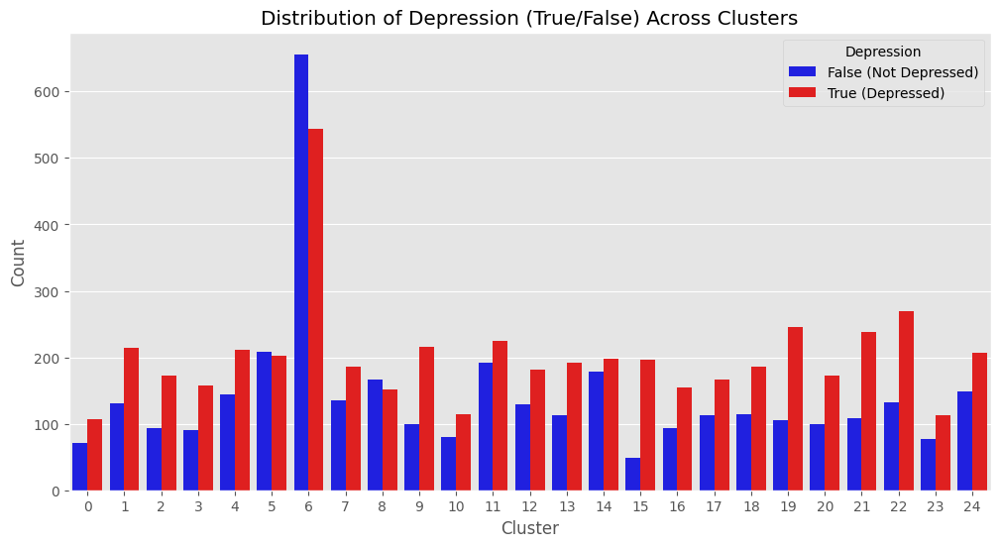

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set figure size
plt.figure(figsize=(12, 6))

# Create the bar plot
sns.countplot(data=en_users, x='cluster', hue='depression', palette=['blue', 'red'])

# Customize labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Depression (True/False) Across Clusters')

# Show the legend
plt.legend(title='Depression', labels=['False (Not Depressed)', 'True (Depressed)'])

# Show the plot
plt.show()

In [ ]:
top_n_words[topic_sizes.iloc[6].Topic][:20]

[('twitter', 0.0786491507838658),
 ('tweet', 0.07800338739515862),
 ('instagram', 0.07648799254001713),
 ('com', 0.04394155563589034),
 ('youtube', 0.039159450808932655),
 ('follow', 0.03679326989076918),
 ('bot', 0.03457869176187792),
 ('account', 0.03377200596401578),
 ('video', 0.031653033176964135),
 ('youtuber', 0.028291656896081936),
 ('email', 0.0274120367141865),
 ('facebook', 0.026276453254910893),
 ('free', 0.025262326360171623),
 ('snapchat', 0.024717125045188318),
 ('blogger', 0.02365608624999831),
 ('contact', 0.022740436759867554),
 ('online', 0.02195326817176024),
 ('twitch', 0.019458377629970755),
 ('news', 0.01794090787346822),
 ('community', 0.016587128796936166)]

In [ ]:
purity = []

for n in range(15, 16):
    kmeans = KMeans(n_clusters=n, random_state=42, n_init="auto").fit(embeddings)

    en_users.drop('cluster', axis=1)
    en_users['cluster'] = kmeans.labels_

    # Count the proportion of depressed vs. not depressed in each cluster
    cluster_distribution = en_users.groupby('cluster')['depression'].value_counts(normalize=True).unstack()

    # Compute purity as the max class proportion per cluster
    cluster_distribution['purity'] = cluster_distribution.max(axis=1)

    # Compute the overall average purity
    average_purity = cluster_distribution['purity'].mean()
    purity.append(average_purity)

    # Display cluster purity
    print(f'{n}: {average_purity}')

15: 0.6124811367814865


<ipython-input-194-4dc0bf121daf>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
max(purity)

0.6231790048633375

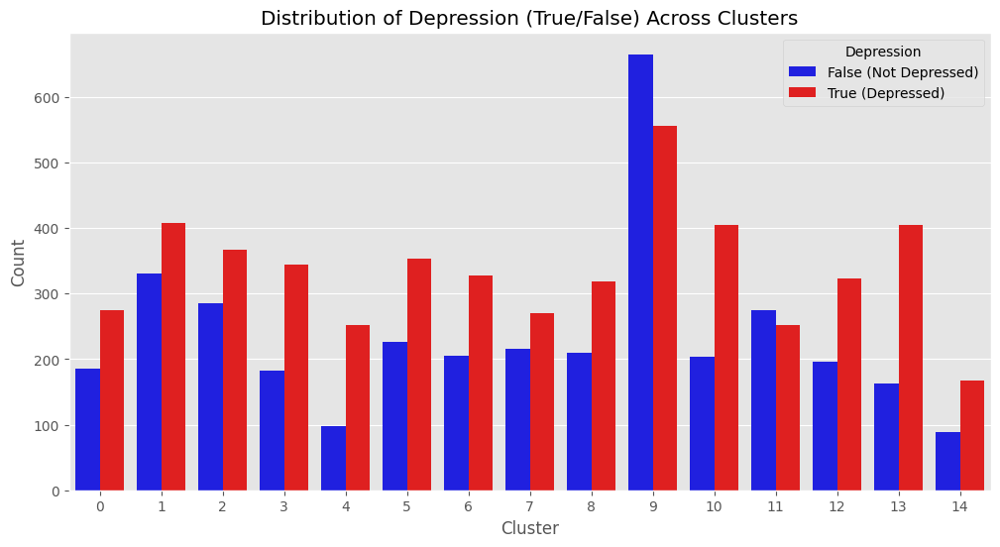

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Create the bar plot
sns.countplot(data=en_users, x='cluster', hue='depression', palette=['blue', 'red'])

# Customize labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Depression (True/False) Across Clusters')

# Show the legend
plt.legend(title='Depression', labels=['False (Not Depressed)', 'True (Depressed)'])

# Show the plot
plt.show()

In [ ]:
top_n_words[topic_sizes.iloc[9].Topic][:20], top_n_words[topic_sizes.iloc[3].Topic][:20], top_n_words[topic_sizes.iloc[6].Topic][:20]

([('writer', 0.04640250364828519),
  ('student', 0.02883767930536069),
  ('artist', 0.026240951576381816),
  ('news', 0.025807049422508867),
  ('music', 0.025140021344626427),
  ('journalist', 0.024392155945317733),
  ('author', 0.024379691765809054),
  ('radio', 0.021900377809403144),
  ('editor', 0.02157993231113906),
  ('com', 0.021207816327734497),
  ('art', 0.020620392809451493),
  ('manager', 0.020548549918545427),
  ('founder', 0.02027712601829239),
  ('marketing', 0.01928487245600138),
  ('web', 0.01928487245600138),
  ('blog', 0.01926661502526762),
  ('medium', 0.019175926393726582),
  ('view', 0.019041244683942582),
  ('owner', 0.01816203718734224),
  ('ex', 0.017887581026566336)],
 [('hate', 0.024694662792375748),
  ('just', 0.017945885890554316),
  ('anti', 0.01648586695480705),
  ('life', 0.01602990965168665),
  ('bad', 0.015940355336884874),
  ('thing', 0.015741195262570902),
  ('love', 0.014719232228384314),
  ('lot', 0.014497404126103099),
  ('geek', 0.01449518899998558

#### Timeline Data

In [ ]:
embeddings = model.encode(df_final['temp'].tolist(), show_progress_bar=True)

embeddings.shape

Batches:   0%|          | 0/102 [00:00<?, ?it/s]

(3246, 768)

In [ ]:
kmeans = KMeans(n_clusters=25, random_state=42, n_init="auto").fit(embeddings)
df_final['cluster'] = kmeans.labels_

# Perform UMAP for dimensionality reduction to 3D
umap_data = umap.UMAP(
    n_neighbors=25,  # Slightly lower than before to emphasize local structure
    n_components=3,  # Still 3D for visualization
    min_dist=0.1,  # Prevents points from being too close together
    metric='euclidean'  # Better for KMeans compared to 'cosine'
).fit_transform(embeddings)

# Create a DataFrame
result = pd.DataFrame(umap_data, columns=['x', 'y', 'z'])
result['labels'] = kmeans.labels_

# Define colors: gray for outliers, colormap for clusters
result['color'] = result['labels'].astype(str)

# Create an interactive 3D scatter plot
fig = px.scatter_3d(result, x='x', y='y', z='z', color='color',
                     color_discrete_sequence=px.colors.qualitative.Set1,  # Nice categorical colors
                     title="Kmeans Clusters in 3D UMAP Projection",
                     opacity=1)

fig.update_traces(marker=dict(size=3))
fig.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
docs_df = pd.DataFrame(df_final, columns=["temp"])
docs_df['Topic'] = kmeans.labels_
docs_df['Doc_ID'] = range(len(docs_df))
docs_per_topic = docs_df.groupby(['Topic'], as_index = False).agg({'temp': ' '.join})

tf_idf, count = c_tf_idf(docs_per_topic.temp.values, m=len(df_final))

In [ ]:
top_n_words = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic, n=20)
topic_sizes = extract_topic_sizes(docs_df)
topic_sizes.head(10)

,Topic,Size
6,6,228
2,2,226
11,11,218
16,16,198
14,14,190
17,17,188
15,15,185
10,10,184
4,4,182
3,3,176


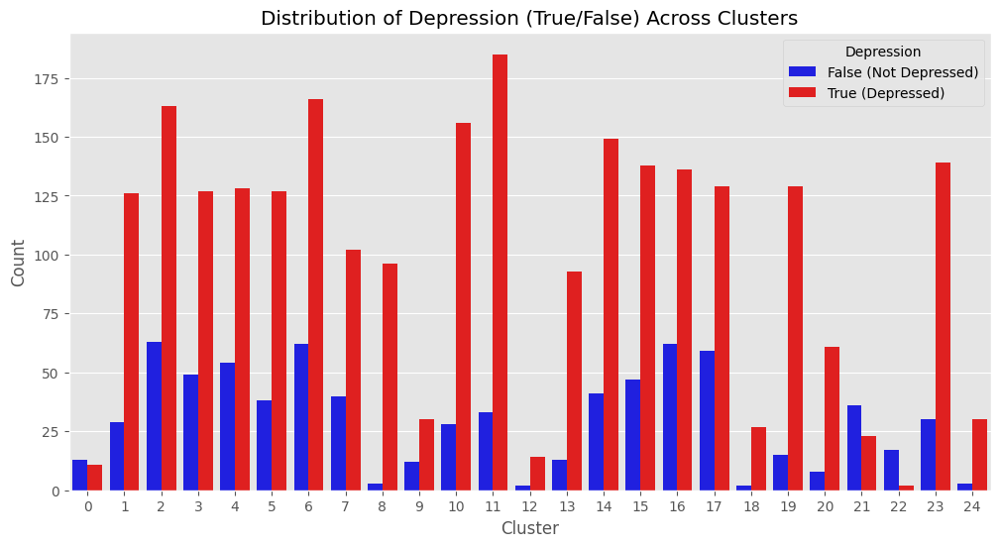

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Create the bar plot
sns.countplot(data=df_final, x='cluster', hue='depression', palette=['blue', 'red'])

# Customize labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Depression (True/False) Across Clusters')

# Show the legend
plt.legend(title='Depression', labels=['False (Not Depressed)', 'True (Depressed)'])

# Show the plot
plt.show()

In [ ]:
top_n_words[topic_sizes.iloc[19].Topic][:40]

[('miself', np.float64(0.13733808678912077)),
 ('etsy', np.float64(0.1007532097044446)),
 ('harma', np.float64(0.09622402920936132)),
 ('paradise', np.float64(0.09217825914094237)),
 ('really_awesome', np.float64(0.07386102111054445)),
 ('island', np.float64(0.07269210488645658)),
 ('bolero', np.float64(0.07195428487530112)),
 ('listing', np.float64(0.06733720856239808)),
 ('lot_follow', np.float64(0.05813315453903297)),
 ('sandy', np.float64(0.05397168245714499)),
 ('check_item', np.float64(0.04964921352841551)),
 ('honor', np.float64(0.047745794955505044)),
 ('bridal', np.float64(0.04752516074520594)),
 ('achievement', np.float64(0.043949519856499863)),
 ('cap', np.float64(0.043081445816526384)),
 ('mini', np.float64(0.040588387513272005)),
 ('score', np.float64(0.04016933661057104)),
 ('babe_love', np.float64(0.03536353495363248)),
 ('ive_just', np.float64(0.03093530199494656)),
 ('harmrug', np.float64(0.025545060586217184))]

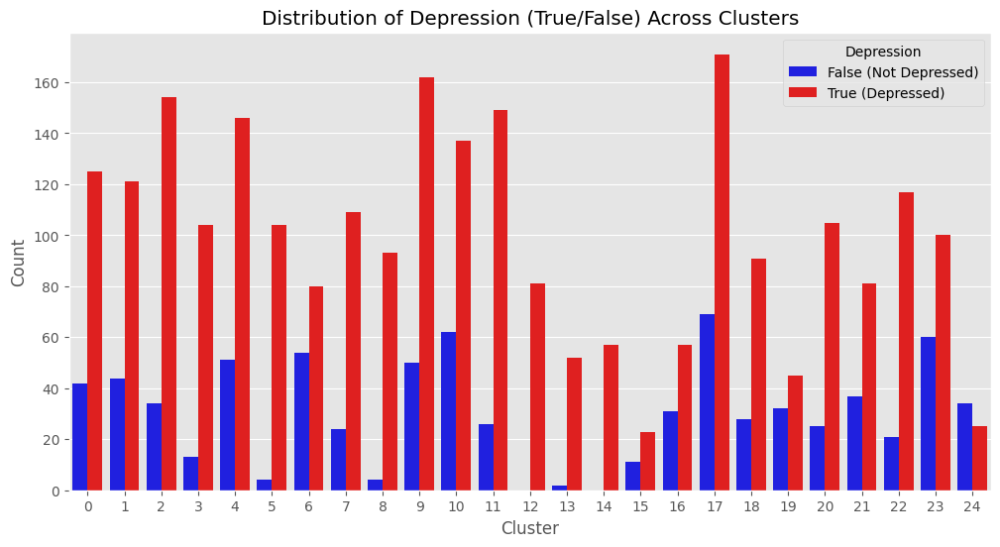

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Create the bar plot
sns.countplot(data=df_final, x='cluster', hue='depression', palette=['blue', 'red'])

# Customize labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Depression (True/False) Across Clusters')

# Show the legend
plt.legend(title='Depression', labels=['False (Not Depressed)', 'True (Depressed)'])

# Show the plot
plt.show()

In [ ]:
top_n_words[topic_sizes.iloc[0].Topic][:20]

[('ik', 0.0014885468599116066),
 ('connie', 0.0014864297262921493),
 ('red', 0.0012383190590905177),
 ('follow_thanks', 0.001110855541508263),
 ('yall', 0.0011065911205611566),
 ('niall_love', 0.0010901416216581546),
 ('blessup', 0.0010789299919699647),
 ('fuckin', 0.0010061342567300878),
 ('yuo', 0.0009993888099396856),
 ('mate', 0.0009809012181083222),
 ('mm', 0.0009749431758572374),
 ('niet', 0.000922212403606515),
 ('blackoutday', 0.0008700161860950706),
 ('tyler', 0.0008431709663435791),
 ('vine', 0.0008307637211590664),
 ('aint', 0.0008271750025623302),
 ('casualty', 0.0008265404085624767),
 ('je', 0.0007915089655452149),
 ('error', 0.0007841785976456559),
 ('het', 0.0007627056667458067)]

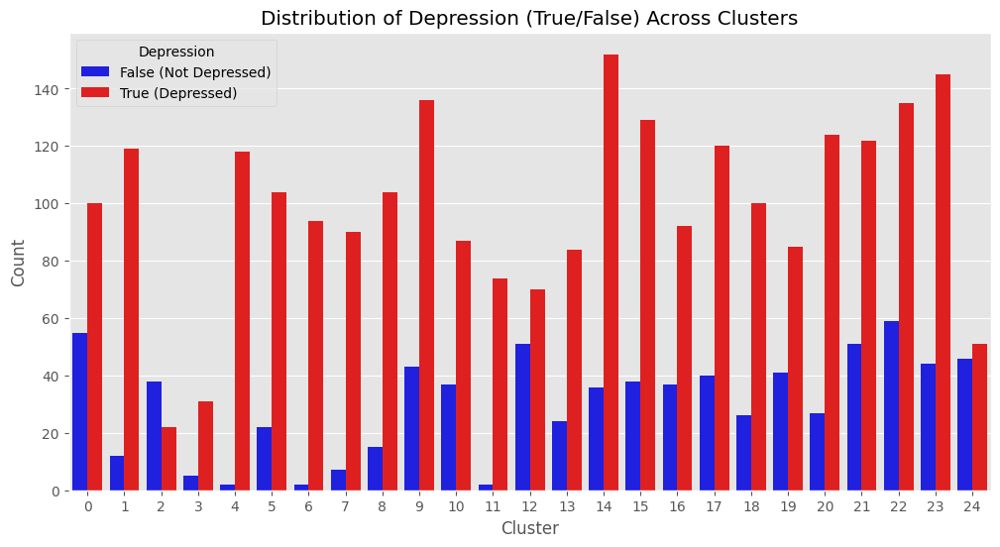

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Create the bar plot
sns.countplot(data=df_final, x='cluster', hue='depression', palette=['blue', 'red'])

# Customize labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Depression (True/False) Across Clusters')

# Show the legend
plt.legend(title='Depression', labels=['False (Not Depressed)', 'True (Depressed)'])

# Show the plot
plt.show()

In [ ]:
top_n_words[topic_sizes.iloc[5].Topic][:20]

[('undateablelive', 0.0078798727725969),
 ('jsquad', 0.004659250408060809),
 ('rt_liked_video', 0.0038279009223551853),
 ('imtherealcalumhoodfollowparty', 0.0031591037331046784),
 ('reiki', 0.0031337350480476387),
 ('nbc', 0.0029617617832157564),
 ('camerondallas', 0.0027250976593891124),
 ('entertainer', 0.002698075420547354),
 ('stream', 0.0024879010796530396),
 ('autism', 0.0023220370449942834),
 ('pokémon', 0.0021735717468010438),
 ('streamys', 0.0021098227006032975),
 ('sitcom', 0.002094357311658377),
 ('rt_spread_word', 0.0019991592520375414),
 ('twitch', 0.0019413078247588705),
 ('weezer', 0.001876798322744142),
 ('hgss', 0.0017464562446633924),
 ('wedlink', 0.0017135224895820644),
 ('pretzelgate', 0.0016531681397941207),
 ('grinning_face', 0.0016490234708684411)]

In [ ]:
top_n_words[topic_sizes.iloc[10].Topic][:20]

[('cameron', 0.003129070103381413),
 ('teambts', 0.0029380363137686324),
 ('camsfollowingspree', 0.002893219914001115),
 ('hundred_points', 0.0025316311578734286),
 ('purple_heart', 0.0025108998768432612),
 ('matttomill', 0.0024302225480814193),
 ('tweetmecarter', 0.002329593330656024),
 ('loudly_crying_face_sparkling_heart', 0.002252456026295068),
 ('clapping_hands_medium', 0.0022356822031227774),
 ('loudly_crying_face_folded_hands', 0.0020475069401535554),
 ('money_with_wings', 0.0020464436318790406),
 ('callmesierra', 0.0019199039669332274),
 ('flexed_biceps_medium', 0.0019132197939924487),
 ('omfg', 0.001821920931925935),
 ('dark_skin_tone', 0.0018068805584887393),
 ('friend_want', 0.0017957442966707164),
 ('softly', 0.0017260191169254247),
 ('oovoo', 0.001699543709349071),
 ('ye', 0.0015812517308153474),
 ('raising_hands', 0.0014913498294079606)]

In [ ]:
top_n_words[topic_sizes.iloc[13].Topic][:20]

[('wrapped_gift', 0.007528239464832325),
 ('mind_following', 0.00637481995942114),
 ('birthday_coming', 0.006341147303139148),
 ('birthday_present', 0.006028200930017477),
 ('advanced', 0.005882709635491244),
 ('crescent_moon', 0.0058536124184522505),
 ('cloud', 0.004956304802611087),
 ('wrapped_gift_wrapped_gift', 0.004259790090898037),
 ('happy_birthday', 0.0033315234522557037),
 ('grinning_face_with_big_eyes', 0.003089403447192431),
 ('ino', 0.002928871291968734),
 ('grinning_face_with_smiling_eyes', 0.0023431195510699933),
 ('aga', 0.0022984147367171312),
 ('amazingupdatersfacetime', 0.0021097395580400666),
 ('christmasnjuly', 0.00199131013684474),
 ('teamclc', 0.0017948932720620338),
 ('grinning_squinting_face', 0.0017712865907219995),
 ('gemini', 0.0017077305709039267),
 ('slightly_smiling_face', 0.0015858917756657355),
 ('stile', 0.0015034380287519476)]

In [ ]:
top_n_words[topic_sizes.iloc[16].Topic][:20]

[('followback', 0.009431167101004173),
 ('foto', 0.008087805621195923),
 ('teamfollowback', 0.00676617461838071),
 ('bellletstalk_rt', 0.005691539084916616),
 ('bellletstalk', 0.004036426808141798),
 ('fotoset', 0.003221130261432477),
 ('nowimstronger', 0.0027919244394519495),
 ('cialis', 0.0024961159264552924),
 ('london', 0.002315946192148976),
 ('nitrogen', 0.002060001914544888),
 ('beiiietstaik', 0.002047343741714795),
 ('camera', 0.001875281767795773),
 ('la_vega', 0.0018385878985822347),
 ('canada', 0.0018091549114397766),
 ('bell_letstalk', 0.0017424466693797193),
 ('viagra', 0.0015966374757947826),
 ('initiative', 0.001533696902632289),
 ('startup', 0.0013318420223806253),
 ('marketing', 0.0012790443661312803),
 ('canadian', 0.0012744459623254781)]

In [ ]:
top_n_words[topic_sizes.iloc[18].Topic][:20]

[('sheskindahotvma_rt', 0.004677269869657681),
 ('love_new_song', 0.004129786964190497),
 ('dnz', 0.00347032062041014),
 ('limitless', 0.003398310563233932),
 ('rt_real_love', 0.003358370373683182),
 ('loving', 0.0033195287139059083),
 ('nct', 0.0031585128853126687),
 ('jaehyun', 0.0030955884597170698),
 ('asklube', 0.003053553111210535),
 ('true_love', 0.0030102643660980324),
 ('love_smiling_face_with_smiling_eyes', 0.002919554127784254),
 ('new_song', 0.002909974386063285),
 ('fails', 0.0028239365229057946),
 ('sheskindahotvma', 0.0024737217639652143),
 ('giving', 0.0024592033019235674),
 ('michael', 0.0023098949215761564),
 ('dmmetriz', 0.002243587556842853),
 ('jai', 0.0022382315761071904),
 ('amazing_follow', 0.0021819228387121204),
 ('mnwild', 0.002181178568245191)]

In [ ]:
purity = []

for n in range(15, 16):
    kmeans = KMeans(n_clusters=n, random_state=42, n_init="auto").fit(embeddings)

    en_users.drop('cluster', axis=1)
    en_users['cluster'] = kmeans.labels_

    # Count the proportion of depressed vs. not depressed in each cluster
    cluster_distribution = en_users.groupby('cluster')['depression'].value_counts(normalize=True).unstack()

    # Compute purity as the max class proportion per cluster
    cluster_distribution['purity'] = cluster_distribution.max(axis=1)

    # Compute the overall average purity
    average_purity = cluster_distribution['purity'].mean()
    purity.append(average_purity)

    # Display cluster purity
    print(f'{n}: {average_purity}')

In [ ]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.8 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-9uipqy7m
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-9uipqy7m
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=b0a0b81a614d45d90cbc9152fa742874d6618272e8e6aeeff3dbbe7abd9c7a43
  Stored in directory: /tmp/pip-ephem-wheel-cache-0v02ty3k/wheels/3f/7c/a4/9b490845988bf7a4db33674d52f709f088f64392063872eb9a
Successfully built clip


In [ ]:
import torch
import clip

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

100%|███████████████████████████████████████| 338M/338M [00:05<00:00, 64.5MiB/s]


In [ ]:
text = clip.tokenize(text).to(device)

with torch.no_grad():
    text_features = model.encode_text(text)

# text_features /= text_features.norm(dim=-1, keepdim=True)

AttributeError: 'list' object has no attribute 'to'

In [ ]:
kmeans = KMeans(n_clusters=25, random_state=42, n_init="auto").fit(text_features)
df_final['cluster_CLIP'] = kmeans.labels_

# Perform UMAP for dimensionality reduction to 3D
umap_data = umap.UMAP(
    n_neighbors=25,  # Slightly lower than before to emphasize local structure
    n_components=3,  # Still 3D for visualization
    min_dist=0.1,  # Prevents points from being too close together
    metric='euclidean'  # Better for KMeans compared to 'cosine'
).fit_transform(embeddings)

# Create a DataFrame
result = pd.DataFrame(umap_data, columns=['x', 'y', 'z'])
result['labels'] = kmeans.labels_

# Define colors: gray for outliers, colormap for clusters
result['color'] = result['labels'].astype(str)

# Create an interactive 3D scatter plot
fig = px.scatter_3d(result, x='x', y='y', z='z', color='color',
                     color_discrete_sequence=px.colors.qualitative.Set1,  # Nice categorical colors
                     title="Kmeans Clusters in 3D UMAP Projection",
                     opacity=1)

fig.update_traces(marker=dict(size=3))
fig.show()

# BERT and its Variants for Text Classification

In [ ]:
from sklearn import model_selection
from sklearn import metrics
from torch.optim import AdamW
from transformers import get_linear_schedule_with_warmup
from transformers import AutoTokenizer
from transformers import AutoModel
from tqdm import tqdm
from re import sub
import torch.nn as nn
import torch
from sklearn.model_selection import train_test_split

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 13.6 gigabytes of available RAM

Not using a high-RAM runtime


In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/timeline_indiv_texts.csv"
df_final = pd.read_csv(save_path)

In [ ]:
# Assuming df is your DataFrame and 'target' is your binary column
df, test_data = train_test_split(df_final, test_size=0.2, stratify=df_final['target'], random_state=42)

In [ ]:
# Checking class distribution
print(df['target'].value_counts(normalize=True))  # Should be similar in both
print(test_data['target'].value_counts(normalize=True))

target
True     0.619696
False    0.380304
Name: proportion, dtype: float64
target
True     0.619696
False    0.380304
Name: proportion, dtype: float64


In [ ]:
# Find max and min word counts
max_words = df_final['word_count'].max()
min_words = df_final['word_count'].min()

max_words, min_words

(113, 1)

In [ ]:
class config:
    BERT_PATH = "vinai/bertweet-base"
    # this is the maximum number of tokens in the sentence
    MAX_LEN = 128
    # batch sizes is small because model is huge!
    TRAIN_BATCH_SIZE = 16
    VALID_BATCH_SIZE = 8
    EPOCHS = 5
    # this is where you want to save the model
    MODEL_PATH = '/content/drive/MyDrive/MentalHealthProject/model.bin'

In [ ]:
def sample(df):
    """
    return sample view of dataframe
    """
    sample_df = df.sample(1)
    for row , col in zip(sample_df.values[0], sample_df.columns):
        print(f'--{col}--\n\n{row}\n')

def clean_whitespace(text):
    """
    clean white space in text
    """
    if not text:
        return
    return " ".join(text.split())

def clean_data(text, add_keyword=None):
    """
    to clean tweets and keywords,
    solve formatting issue,
    remove hastags, usernames and links
    """
    # remove links
    text = sub(r'http\S+', '', text)
    # remove username
    text = sub(r'@\S+', '', text)
    text = text.replace('#', '')
    return clean_whitespace(text)

def get_data(df, test_data):
    """
    read and return data frame
    """
    df["contents"] = ''
    df["contents"] = df.text.apply(lambda x:clean_data(x))
    if test_data:
        return df
    df.rename(columns={'target': "targets"}, inplace=True)
    return df

In [ ]:
df = get_data(df, test_data=None)
test_data = get_data(test_data, test_data=True)

In [ ]:
TOKENIZER = AutoTokenizer.from_pretrained(config.BERT_PATH, do_lower_case=True)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/558 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/843k [00:00<?, ?B/s]

bpe.codes:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.91M [00:00<?, ?B/s]

emoji is not installed, thus not converting emoticons or emojis into text. Install emoji: pip3 install emoji==0.6.0


In [ ]:
class DatasetTransformer:
    """
    :param content: list or numpy array of strings
    :param targets: list or numpy array which is binary
    """
    def __init__(self, contents, targets, test_data=None):
        self.contents = contents
        self.targets = targets
        self.tokenizer = TOKENIZER
        self.max_len = config.MAX_LEN
        self.test_data = test_data

    def __len__(self):
        return len(self.contents)

    def __getitem__(self, index):
        """
        for a given item index, return a dictionary
        of inputs.
        """
        content = str(self.contents[index])
        inputs = self.tokenizer.encode_plus(
            content,
            padding='max_length',
            max_length=self.max_len,
            truncation=True,
        )
        ids = inputs["input_ids"]
        mask = inputs["attention_mask"]
        token_type_ids = inputs["token_type_ids"]
        if self.test_data:
            return {
                "ids": torch.tensor(ids, dtype=torch.long),
                "mask": torch.tensor(mask, dtype=torch.long),
                "token_type_ids": torch.tensor(token_type_ids, dtype=torch.long)
            }
        target = self.targets[index]
        return {
            "ids": torch.tensor(ids, dtype=torch.long),
            "mask": torch.tensor(mask, dtype=torch.long),
            "token_type_ids": torch.tensor(token_type_ids, dtype=torch.long),
            "target": torch.tensor(target, dtype=torch.float),

        }

In [ ]:
# Example
DatasetTransformer(df.contents, df.targets)[0]

{'ids': tensor([    0,    66,    17,    30,     6,  1240, 11483,     2,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,     1,  

In [ ]:
class BERTweet(nn.Module):
    def __init__(self):
        super(BERTweet, self).__init__()
        self.bert = AutoModel.from_pretrained(config.BERT_PATH)
        # add a dropout for regularization
        self.bert_drop = nn.Dropout(0.3)
        # hidden size can be 768 or 1024 depending
        # on the transfomer model we are using
        # in our case, it is 768
        self.out = nn.Linear(768, 1)

    def forward(self, ids, mask, token_type_ids):
        """
        bert will return 2 dicts with keys
        'pooler_output' and 'last_hidden_state'
        we need pooler_output with size torch.Size([batch size, hidden_size])
        """
        bert_output = self.bert(
            ids,
            attention_mask=mask,
            token_type_ids=token_type_ids
        )
        reguralized_output = self.bert_drop(bert_output["pooler_output"])
        output = self.out(reguralized_output)
        return output

In [ ]:
def train_model(data_loader, model, optimizer, epoch, device, scheduler):
    """
    This is the main training function that trains model
    for one epoch
    :param data_loader: this is the torch dataloader
    :param model: transformer- model
    :param optimizer: torch optimizer, e.g. adam, sgd, etc.
    :param device: this can be "cuda" or "cpu"
    :param scheduler: learning rate scheduler
    """
    # set model to training mode
    model.train()
    # go through batches of data in data loader
    print(f'training for epoch {epoch}')
    for data in tqdm(data_loader):
        # extract ids, token type ids and mask
        # from current batch
        # also extract targets
        ids = data["ids"]
        token_type_ids = data["token_type_ids"]
        mask = data["mask"]
        targets = data["target"]
        # move everything to specified device
        ids = ids.to(device, dtype=torch.long)
        token_type_ids = token_type_ids.to(device, dtype=torch.long)
        mask = mask.to(device, dtype=torch.long)
        targets = targets.to(device, dtype=torch.float)
        optimizer.zero_grad()
        # pass through the model
        predictions = model(
            ids=ids,
            mask=mask,
            token_type_ids=token_type_ids
        )
        # calculate the loss
        loss = nn.BCEWithLogitsLoss()(
            predictions,
            targets.view(-1, 1)
        )
        # compute gradient of loss w.r.t.
        # all parameters of the model that are trainable
        loss.backward()
        # single optimization step
        optimizer.step()
        # step scheduler
        scheduler.step()
    print(f'training loss for epoch {epoch} {loss}')


def evaluate(data_loader, model, device):
    """
    validation loop
    """
    # initialize empty lists to store predictions
    # and targets
    final_predictions = []
    final_targets = []
    # put the model in eval mode
    model.eval()
    # disable gradient calculation
    with torch.no_grad():
        for data in data_loader:
            ids = data["ids"]
            token_type_ids = data["token_type_ids"]
            mask = data["mask"]
            targets = data["target"]
            ids = ids.to(device, dtype=torch.long)
            token_type_ids = token_type_ids.to(device, dtype=torch.long)
            mask = mask.to(device, dtype=torch.long)
            targets = targets.to(device, dtype=torch.float)
            # make predictions
            outputs = model(
                ids=ids,
                mask=mask,
                token_type_ids=token_type_ids
            )
            # move predictions and targets to list
            # we need to move predictions and targets to cpu too
            targets = targets.cpu().detach()
            targets = targets.numpy().tolist()
            final_targets.extend(targets)
            # convert outputs to cpu and extend the final list
            outputs = torch.sigmoid(outputs).cpu().detach()
            outputs = outputs.numpy().tolist()
            final_predictions.extend(outputs)
    return final_predictions, final_targets

In [ ]:
def get_optimizer_param(model):
    """
    return optimizer paramters after applying
    weight decay to all parameters other
    than bias and layer normalization terms:
    """
    param_optimizer = list(model.named_parameters())
    no_decay = ["bias", "LayerNorm.weight"]
    optimizer_parameters = [
        {
            "params": [
                p for n, p in param_optimizer if not any(nd in n for nd in no_decay) # noqa
                ],
            "weight_decay": 0.001,
        },
        {
            "params": [
                p for n, p in param_optimizer if any(nd in n for nd in no_decay)], # noqa
            "weight_decay": 0.0,
        },
    ]
    return optimizer_parameters


def get_scheduler(optimizer, num_train_steps):
    """
    return learning rate scheduler based on the
    optimizer and training steps.

    """
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_train_steps
    )
    return scheduler

In [ ]:
def run(data_df):
    df_train, df_valid = model_selection.train_test_split(
        data_df,
        test_size=0.1,
        random_state=42,
    )
    # reset index
    df_train = df_train.reset_index(drop=True)
    df_valid = df_valid.reset_index(drop=True)
    # Initialize training and validation dataset
    train_dataset = DatasetTransformer(
        df_train.contents.values,
        df_train.targets.values
    )
    valid_dataset = DatasetTransformer(
        df_valid.contents.values,
        df_valid.targets.values
    )
    # create training and validation dataloader
    train_data_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=config.TRAIN_BATCH_SIZE,
        num_workers=1
    )
    valid_data_loader = torch.utils.data.DataLoader(
        valid_dataset,
        batch_size=config.VALID_BATCH_SIZE,
        num_workers=1
    )
    availble_device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f'Training in device {availble_device}')
    device = torch.device(availble_device)
    model = BERTweet()
    # send model to device
    model.to(device)
    optimizer_parameters = get_optimizer_param(model)
    optimizer = AdamW(optimizer_parameters, lr=3e-5)
    num_train_steps = int(
        len(df_train) / config.TRAIN_BATCH_SIZE * config.EPOCHS
    )
    scheduler = get_scheduler(optimizer, num_train_steps)
    best_accuracy = 0
    print(f'Total no of epochs = {config.EPOCHS}')
    for epoch in range(config.EPOCHS):
        # train one epoch
        train_model(
            train_data_loader, model, optimizer, epoch,
            device, scheduler
        )
        # validate
        outputs, targets = evaluate(
            valid_data_loader,
            model,
            device
        )
        outputs = np.array(outputs) >= 0.5
        accuracy = metrics.accuracy_score(targets, outputs)
        print(
            f"\n epoch:{epoch} | Validation Accuracy Score = {accuracy}."
        )
        if accuracy > best_accuracy:
            torch.save(model.state_dict(), config.MODEL_PATH)
            best_accuracy = accuracy

In [ ]:
run(df)

Training in device cuda
Total no of epochs = 5
training for epoch 0


100%|██████████| 31395/31395 [2:56:36<00:00,  2.96it/s]


training loss for epoch 0 0.25703391432762146

 epoch:0 | Validation Accuracy Score = 0.8192177449698099.
training for epoch 1


100%|██████████| 31395/31395 [2:56:48<00:00,  2.96it/s]


training loss for epoch 1 0.21652966737747192

 epoch:1 | Validation Accuracy Score = 0.8319746295665884.
training for epoch 2


100%|██████████| 31395/31395 [2:56:53<00:00,  2.96it/s]


training loss for epoch 2 0.1797247678041458

 epoch:2 | Validation Accuracy Score = 0.8367226273448838.
training for epoch 3


100%|██████████| 31395/31395 [2:56:36<00:00,  2.96it/s]


training loss for epoch 3 0.07712981849908829

 epoch:3 | Validation Accuracy Score = 0.8370451328543529.
training for epoch 4


100%|██████████| 31395/31395 [2:56:37<00:00,  2.96it/s]


training loss for epoch 4 0.043563954532146454

 epoch:4 | Validation Accuracy Score = 0.8394818411481196.


In [ ]:
# Running on A100 GPU
run(df)

Training in device cuda
Total no of epochs = 5
training for epoch 0


100%|██████████| 62790/62790 [50:54<00:00, 20.55it/s]

training loss for epoch 0 0.6600818634033203



 epoch:0 | Validation Accuracy Score = 0.6199093401178937.
training for epoch 1


100%|██████████| 62790/62790 [50:56<00:00, 20.55it/s]

training loss for epoch 1 0.6922457814216614



 epoch:1 | Validation Accuracy Score = 0.6199093401178937.
training for epoch 2


100%|██████████| 62790/62790 [51:01<00:00, 20.51it/s]

training loss for epoch 2 0.6798412203788757



 epoch:2 | Validation Accuracy Score = 0.6199093401178937.
training for epoch 3


100%|██████████| 62790/62790 [51:01<00:00, 20.51it/s]

training loss for epoch 3 0.6913415789604187



 epoch:3 | Validation Accuracy Score = 0.6199093401178937.
training for epoch 4


100%|██████████| 62790/62790 [50:59<00:00, 20.52it/s]

training loss for epoch 4 0.6862208247184753



 epoch:4 | Validation Accuracy Score = 0.6199093401178937.


In [ ]:
model = BERTweet()

pytorch_model.bin:   0%|          | 0.00/543M [00:00<?, ?B/s]

In [ ]:
model.load_state_dict(torch.load(config.MODEL_PATH))

model.safetensors:   0%|          | 0.00/543M [00:00<?, ?B/s]

<All keys matched successfully>

In [ ]:
def inference(model, test_data):
    """
    to make predictions or inference
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    test_dataset = DatasetTransformer(
        test_data.contents.values, None, test_data=True)
    data_loader = torch.utils.data.DataLoader(
        test_dataset,
        batch_size=1,
        num_workers=1)
    final_predictions = []
    # put the model in eval mode
    model.eval()
    # disable gradient calculation
    with torch.no_grad():
        for data in tqdm(data_loader):
            ids = data["ids"]
            token_type_ids = data["token_type_ids"]
            mask = data["mask"]
            ids = ids.to(device, dtype=torch.long)
            token_type_ids = token_type_ids.to(device, dtype=torch.long)
            mask = mask.to(device, dtype=torch.long)
            # make predictions
            outputs = model(
                ids=ids,
                mask=mask,
                token_type_ids=token_type_ids
            )
            outputs = torch.sigmoid(outputs).cpu().detach()
            outputs = outputs.numpy().tolist()
            final_predictions.extend(outputs)
    return final_predictions

In [ ]:
predictions = inference(model, test_data)

100%|██████████| 139533/139533 [27:56<00:00, 83.23it/s]


In [ ]:
outputs = np.array(predictions) >= 0.5
predictions = outputs.flatten()
predictions
predictions_df = pd.DataFrame(predictions, columns=['target'])

In [ ]:
metrics.accuracy_score(
    predictions_df.target.values,
    test_data.target.values
)

0.834204095088617